# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [0]:
!pip install kaggle

In [0]:
!pwd


In [0]:
!mkdir /home/ec2-user/SageMaker/Unit-Project-Home-Credit-Default-Risk/.kaggle

In [0]:
!cp /home/ec2-user/SageMaker/Unit-Project-Home-Credit-Default-Risk/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
! kaggle competitions files ./.kaggle

# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

![alt](home_credit.png "Home credit")

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [0]:
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir $DATA_DIR

In [0]:
!ls -l $DATA_DIR

In [0]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR

In [0]:
!pip install catboost

     |████████████████████████████████| 63.6MB 103kB/s 


### Imports

In [2]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import pickle 

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

import plotly
plotly.offline.init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings('ignore')

In [0]:
!pip install catboost

     |████████████████████████████████| 63.6MB 36kB/s 


In [0]:
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])


In [0]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

![image.png](attachment:image.png)

### Application train

In [3]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV

import warnings
warnings.filterwarnings('ignore')

In [283]:
pwd


'/home/ec2-user/SageMaker/Unit-Project-Home-Credit-Default-Risk'

In [284]:
def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df
DATA_DIR = '/home/ec2-user/SageMaker/Unit-Project-Home-Credit-Default-Risk'
#DATA_DIR = '\\Users\malli\Desktop\HCDR'
datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [0]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,...,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13976,-1866,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,...,0.2446,0.3739,0.0388,0.0817,reg oper account,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-13040,-2191,-4000.0,-4262,16.0,1,1,1,1,0,0,NaN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [285]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
SK_ID_CURR                int64
SK_ID_BUREAU              int64
CREDIT_ACTIVE             object
CREDIT_CURRENCY           object
DAYS_CREDIT               int64
CREDIT_DAY_OVERDUE        int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG        int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE               object
DAYS_CREDIT_UPDATE        int64
AMT_ANNUITY               float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
SK_ID_BUREAU      int64
MONTHS_BALANCE    int64
STATUS            object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
SK_ID_PREV                    int64
SK_ID_CURR                    int64
MONTHS_BALANCE                int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL       int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT          int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS          object
SK_DPD                        int64
SK_DPD_DEF          

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
SK_ID_PREV                int64
SK_ID_CURR                int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER     int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
SK_ID_PREV                     1670214 non-null int64
SK_ID_CURR                     1670214 non-null int64
NAME_CONTRACT_TYPE             1670214 non-null object
AMT_ANNUITY                    1297979 non-null float64
AMT_APPLICATION                1670214 non-null float64
AMT_CREDIT                     1670213 non-null float64
AMT_DOWN_PAYMENT               774370 non-null float64
AMT_GOODS_PRICE                1284699 non-null float64
WEEKDAY_APPR_PROCESS_START     1670214 non-null object
HOUR_APPR_PROCESS_START        1670214 non-null int64
FLAG_LAST_APPL_PER_CONTRACT    1670214 non-null object
NFLAG_LAST_APPL_IN_DAY         1670214 non-null int64
RATE_DOWN_PAYMENT              774370 non-null float64
RATE_INTEREST_PRIMARY          5951 non-null float64
RATE_INTEREST_PRIVILEGED       5951 non-null float64
NAME_CASH_LOAN_PURPOS

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
SK_ID_PREV               int64
SK_ID_CURR               int64
MONTHS_BALANCE           int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS     object
SK_DPD                   int64
SK_DPD_DEF               int64
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 44 s, sys: 6.34 s, total: 50.4 s
Wall time: 45.5 s


In [7]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## Summary of Application Train and Application Test Datasets

In [0]:
datasets["application_train"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [0]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [0]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


## Missing Data for Application Train and Test

### Missing percentage and count in application train 

In [8]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MEDI,68.35,210199
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199


### Missing percentage and count in application test

In [17]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_test_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_test_data.head(20)


,Percent,Test Missing Count
COMMONAREA_MEDI,68.72,33495
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
NONLIVINGAPARTMENTS_AVG,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780


### Proportion of missing values for columns with more than 40% data missing, across all datasets

In [15]:
for data_name in ds_names:
    print ("\033[1mFeatures with more than 40% missing values in \033[94m"+str(data_name)+" dataset \033[0m \n")
    print ("\033[1mFeatures"+ (29-len("Features"))*" "+"Missing proportion"'\033[0m')
    for name in datasets[data_name].columns:
        missing_proportion=datasets[data_name][str(name)].isna().sum()/datasets[data_name].shape[0]*100
        if missing_proportion > 40:
            print (" "+str(name)+":"+ (29-len(str(name)))*" "   +"\033[91m%"+str(np.round(missing_proportion,1)),'\033[0m')
    print()

Features with more than 40% missing values in application_train dataset  

Features                     Missing proportion
 OWN_CAR_AGE:                  %66.0 
 EXT_SOURCE_1:                 %56.4 
 APARTMENTS_AVG:               %50.7 
 BASEMENTAREA_AVG:             %58.5 
 YEARS_BEGINEXPLUATATION_AVG:  %48.8 
 YEARS_BUILD_AVG:              %66.5 
 COMMONAREA_AVG:               %69.9 
 ELEVATORS_AVG:                %53.3 
 ENTRANCES_AVG:                %50.3 
 FLOORSMAX_AVG:                %49.8 
 FLOORSMIN_AVG:                %67.8 
 LANDAREA_AVG:                 %59.4 
 LIVINGAPARTMENTS_AVG:         %68.4 
 LIVINGAREA_AVG:               %50.2 
 NONLIVINGAPARTMENTS_AVG:      %69.4 
 NONLIVINGAREA_AVG:            %55.2 
 APARTMENTS_MODE:              %50.7 
 BASEMENTAREA_MODE:            %58.5 
 YEARS_BEGINEXPLUATATION_MODE: %48.8 
 YEARS_BUILD_MODE:             %66.5 
 COMMONAREA_MODE:              %69.9 
 ELEVATORS_MODE:               %53.3 
 ENTRANCES_MODE:               %50.3 
 FL

### Number of columns with missing data more or equal to 10% for each dataset

In [11]:
m_prop=[]
m_col=[]
m_dataname=[]
for data_name in ds_names:
    for name in datasets[data_name].columns:
        missing_proportion=datasets[data_name][str(name)].isna().sum()/datasets[data_name].shape[0]*100
        if missing_proportion > 10:
            m_prop.append(missing_proportion)
            m_col.append(name)
            m_dataname.append(data_name)
            
d = {'Dataset': m_dataname, 'Feature': m_col,'Missing Proportion': np.round(m_prop,1)}
missing_ten_df = pd.DataFrame(data=d)
missing_ten_df

,Dataset,Feature,Missing Proportion
0,application_train,OWN_CAR_AGE,66.0
1,application_train,OCCUPATION_TYPE,31.3
2,application_train,EXT_SOURCE_1,56.4
3,application_train,EXT_SOURCE_3,19.8
4,application_train,APARTMENTS_AVG,50.7
5,application_train,BASEMENTAREA_AVG,58.5
6,application_train,YEARS_BEGINEXPLUATATION_AVG,48.8
7,application_train,YEARS_BUILD_AVG,66.5
8,application_train,COMMONAREA_AVG,69.9
9,application_train,ELEVATORS_AVG,53.3


In [12]:
print ("Number of columns with missing data more or equal to 10% by dataset")
missing_ten_df.Dataset.value_counts()

Number of columns with missing data more or equal to 10% by dataset


application_train       57
application_test        57
previous_application    14
credit_card_balance      7
bureau                   5
Name: Dataset, dtype: int64

### Number of columns with missing data more or equal to 40% in application train

In [13]:
missing_application_train_data[missing_application_train_data['Percent'] >= 40].count()

Percent                49
Train Missing Count    49
dtype: int64

### Number of columns with missing data more or equal to 40% in application test

In [18]:
missing_application_test_data[missing_application_test_data['Percent'] >= 40].count()

Percent               49
Test Missing Count    49
dtype: int64

## Breakdown of primary table feature datatypes

In [0]:
datasets["application_train"].dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

### Categorical Features

In [20]:
cat_features = datasets["application_train"].select_dtypes('object').columns.tolist()
cat_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

### Number of unique values for categorical features

In [0]:
datasets["application_train"].select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

### Value counts of categorical features

Count bars for categorical features


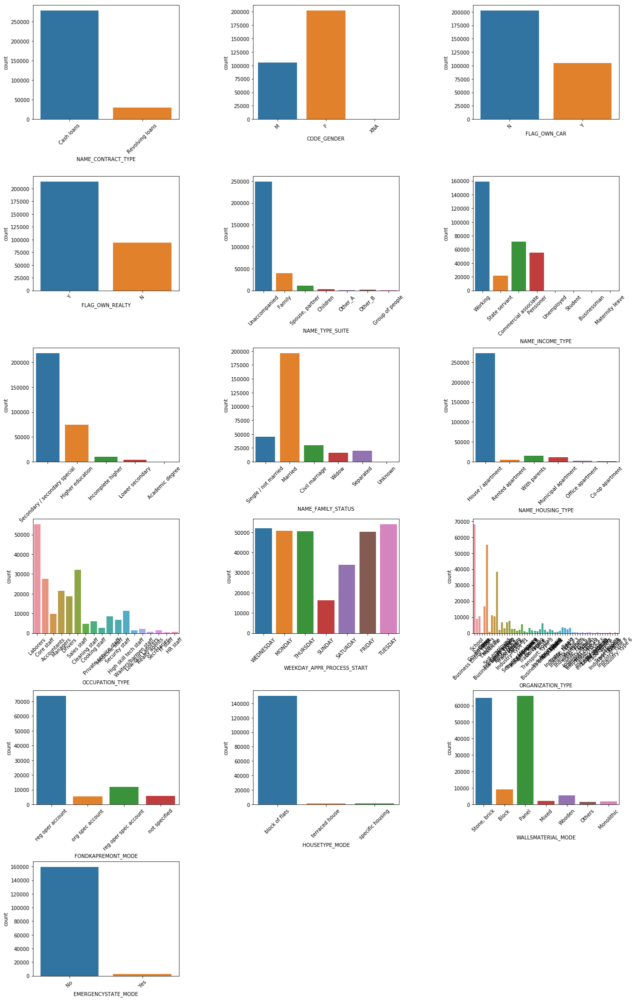

In [21]:
print ("Count bars for categorical features")
fig, ax = plt.subplots(0,0, figsize=(21, 42))
fig.subplots_adjust(hspace = .5, wspace=.51)
for c, v in enumerate(cat_features):
    ax = fig.add_subplot(7, 3, c+1)
    sns.countplot(v,data=datasets["application_train"])
    plt.xticks(rotation = 45)
    plt.xlabel(v)

In [22]:
datasets["application_train"].EMERGENCYSTATE_MODE.value_counts()

No     159428
Yes      2328
Name: EMERGENCYSTATE_MODE, dtype: int64

### Numerical Features

In [23]:
num_features = datasets["application_train"].select_dtypes(include=['float64', 'int']).columns.tolist()
num_features

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

## Count of the target column 

In [24]:
datasets["application_train"]['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

Count bars for categorical features


Text(0.5, 0, 'TARGET')

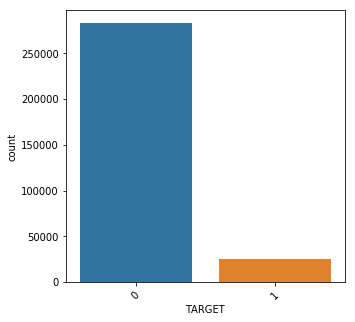

In [25]:
print ("Count bars for categorical features")
fig, ax = plt.subplots(0,0, figsize=(5, 5))
fig.subplots_adjust(hspace = .5, wspace=.51)
sns.countplot("TARGET",data=datasets["application_train"])
plt.xticks(rotation = 45)
plt.xlabel("TARGET")

* If both levels of target feature are more than 10%, logistic regression classifier would be an overestimate the coefficients. Let's look at the proportions of target variable

In [0]:
print ("Percentage of target levels:")
print (np.round(datasets["application_train"]['TARGET'].value_counts()/datasets["application_train"].shape[0]*100),1)

Percentage of target levels:
0    92.0
1     8.0
Name: TARGET, dtype: float64 1


Only __8%__ of clients failed to repay on time. We have much more loans that repaid on time other than the not repaid on time. So, we have a inbalanced target distribution. 

## Correlation with  the target column 

In [26]:
correlations = datasets["application_train"].corr(method="spearman")['TARGET'].sort_values(ascending=False)
print('Most Positive Correlations:\n', correlations.head(10))
print('\nMost Negative Correlations:\n', correlations.tail(10).sort_values(ascending=True))

Most Positive Correlations:
 TARGET                         1.000000
DAYS_BIRTH                     0.078328
REGION_RATING_CLIENT_W_CITY    0.060936
REGION_RATING_CLIENT           0.058909
DAYS_LAST_PHONE_CHANGE         0.053711
OWN_CAR_AGE                    0.052932
DAYS_ID_PUBLISH                0.052535
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_LIVE_CITY         0.044395
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3      -0.166330
EXT_SOURCE_1      -0.151128
EXT_SOURCE_2      -0.147332
FLOORSMAX_AVG     -0.046178
FLOORSMAX_MEDI    -0.046019
FLOORSMAX_MODE    -0.045357
LIVINGAREA_AVG    -0.041631
LIVINGAREA_MEDI   -0.041140
TOTALAREA_MODE    -0.040071
LIVINGAREA_MODE   -0.039060
Name: TARGET, dtype: float64


From the correlations, we can see that DAYS_BIRTH which indicating the age of the client is most positively correlated with Target, and EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3 are most negtively correlated with Target. we will look more close into those columns and some more column which we think might be important factors for our model. 

Correlation Heatmap


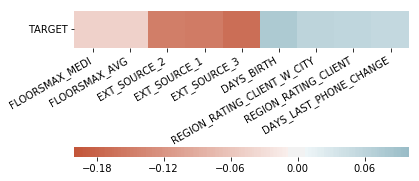

In [27]:
print ('\033[1m\033[4mCorrelation Heatmap\033[0m'.center(2))

corr_heatmap=correlations.iloc[np.r_[-5:0,0:5]]
corr=pd.DataFrame(corr_heatmap).T.drop(columns="TARGET")

grid_kws = {"height_ratios": (.95, .05), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws)
ax = sns.heatmap(corr, ax=ax,
                  cbar_ax=cbar_ax,vmin=-0.2, vmax=0.1, center=0,
                  cbar_kws={"orientation": "horizontal"},square=True,
                 cmap=sns.diverging_palette(20, 220, n=200),fmt = '')

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=30,
    horizontalalignment='right'
);

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,
    horizontalalignment='right'
);



figure = ax.get_figure()    
figure.savefig('ax.png', dpi=900)

## Examining number of days employed of clients

(array([-50000.,      0.,  50000., 100000., 150000., 200000., 250000.,
        300000., 350000., 400000.]), <a list of 10 Text xticklabel objects>)

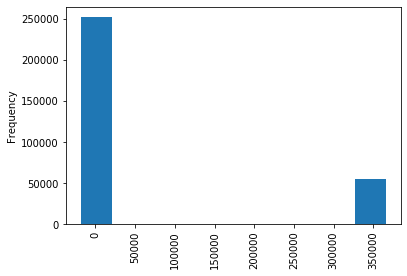

In [0]:
datasets["application_train"]['DAYS_EMPLOYED'].plot.hist();
plt.xticks(rotation='vertical')

From the above distribution, we can see that there is anomalous data present in the **DAYS_EMPLOYED** column. We need to replace these with np.nan and impute them later

## Examining statistics by Gender

In [0]:
# proportion of participants by gender
datasets["application_train"]['CODE_GENDER'].value_counts()/datasets["application_train"].shape[0]

F      0.658344
M      0.341643
XNA    0.000013
Name: CODE_GENDER, dtype: float64

In [0]:
dummies=pd.get_dummies(datasets["application_train"]['CODE_GENDER'])
target=datasets["application_train"]['TARGET']
merged= pd.concat([dummies,target],axis="columns").drop(columns=["M"])
merged=merged.rename(columns={"F": "Gender: 0=Male, 1=Female"})
merged.head(5)

,"Gender: 0=Male, 1=Female",XNA,TARGET
0,0,0,1
1,1,0,0
2,0,0,0
3,1,0,0
4,0,0,0


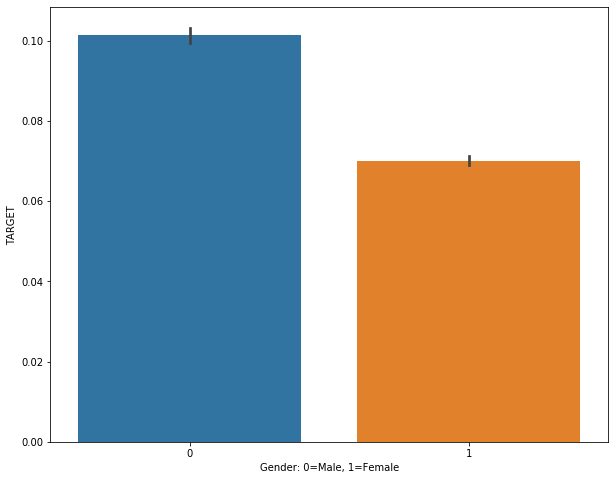

In [0]:
fig, ax = plt.subplots(figsize=(10,8))
sns.barplot(x="Gender: 0=Male, 1=Female", y="TARGET", data=merged)

* Barplot suggests that female clients more frequently repay their loans, compared to male clients

## Examining statistics by Age of Clients 

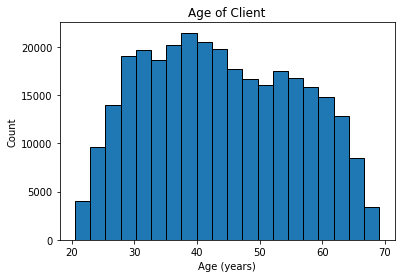

In [0]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins ="sturges")
# Plot the distribution of ages in years
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

From the histigram, we can see there are all resonable age values and no outliers. With less clients under about 25 years old and above 65 years old, we have more applicants between 25 years old to 45 years old. But we can't tell much how age will influent the target value. Let's plot the density plots to show the distribution of applicants' age with different target values.   

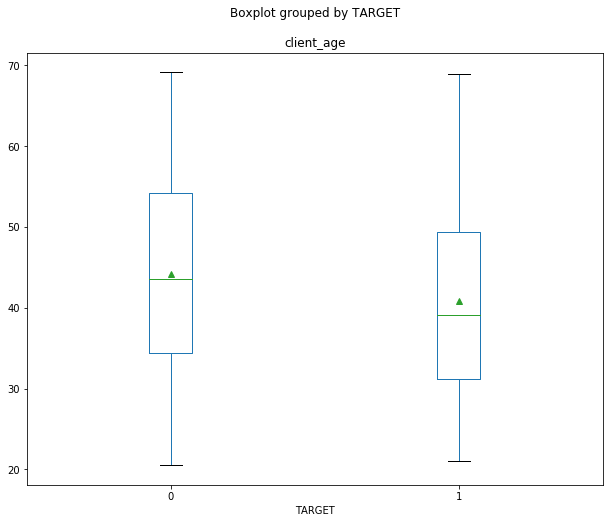

In [0]:
datasets["application_train"]["client_age"]= -datasets["application_train"][['DAYS_BIRTH']]/365
fig, ax = plt.subplots(figsize=(10,8))

datasets["application_train"].boxplot(column=['client_age'], by='TARGET', ax=ax,grid=False, 
                                      showmeans =True )


The above boxplot indicates that older clients tend to repay the loans more frequently compared to younger clients

## Density Plots for External Sources 

From the density plots, we can see older clients have better records about repaid loans. 

External scource is about "normalized score from external data source". The density plots of these external sources shows how they related with the target value. EXT_SOURCE_1 and EXT_SOURCE_3 show less score related higher failure in repaying loans. EXT_SOURCE_2 does not show obvious difference but it agrees with lower score pointing to high failure rate.

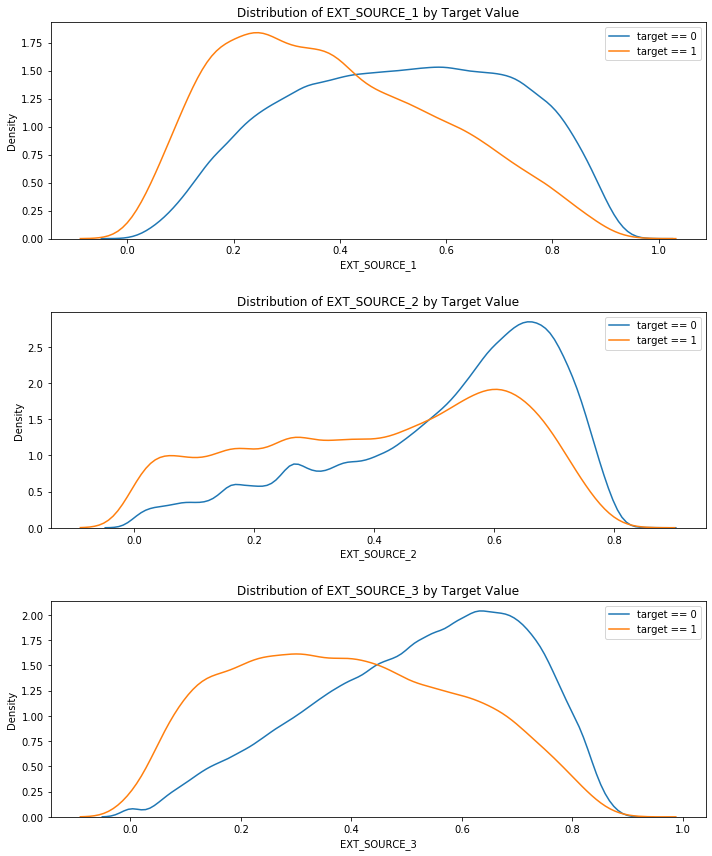

In [0]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(datasets["application_train"].loc[datasets["application_train"]['TARGET'] == 0, source].dropna(), label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(datasets["application_train"].loc[datasets["application_train"]['TARGET'] == 1, source].dropna(), label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

## Input variables Correlation Test

* Correlation between AMT_ANNUITY and AMT_CREDIT

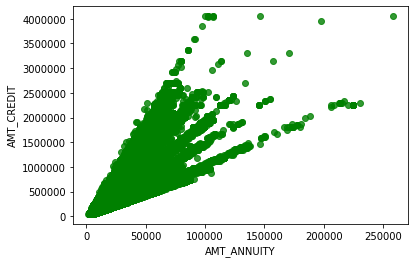

In [0]:
sns.regplot(datasets["application_train"]['AMT_ANNUITY'], datasets["application_train"]['AMT_CREDIT'], color="g", fit_reg=False)


From the above plot, the variables AMT_ANUITY and AMT_CREDIT seem to be postively correlated. One of features can be excluded from the final list of input features

## Dataset questions
* Unique record for each SK_ID_CURR

In [0]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [0]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [0]:
#Return the sorted, unique values that are in both of the input arrays.
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

## EDA on secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


### Previous Application Dataset

The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [28]:
Pre_appsDF = datasets["previous_application"]

In [0]:
Pre_appsDF.shape

(1670214, 37)

In [29]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

47800

* Missing values in prevApps

In [30]:
Pre_appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [31]:
Pre_appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [32]:
print(f"There are  {Pre_appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [33]:
# How many entries are there for each month?
prevAppCounts = Pre_appsDF['SK_ID_CURR'].value_counts(dropna=False)


In [34]:
len(prevAppCounts[prevAppCounts >40])  #more than 40 previous applications

101

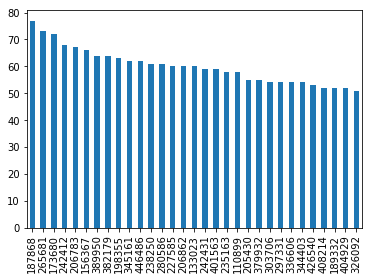

In [35]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

#### Histogram of Number of previous applications for an ID

In [36]:
#what's this for?
sum(Pre_appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

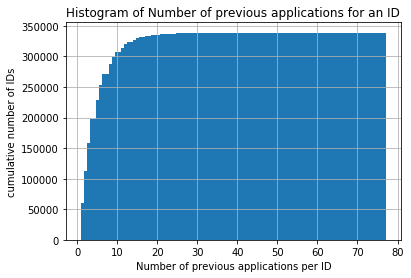

In [37]:
# Histogram of accumulated Number of previous applications
plt.hist(Pre_appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


#### Previous loan rejection reasons

In [38]:
Pre_appsDF['CODE_REJECT_REASON'].nunique()

9

In [39]:
Pre_appsDF['CODE_REJECT_REASON'].value_counts()

XAP       1353093
HC         175231
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5244
VERIF        3535
SYSTEM        717
Name: CODE_REJECT_REASON, dtype: int64

#### Previous loans status - Count of Approved and Rejected

In [40]:
Pre_appsDF['NAME_CONTRACT_STATUS'].value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

In [41]:
Pre_apps_all = Pre_appsDF['SK_ID_CURR'].nunique()
Pre_apps_5plus = Pre_appsDF['SK_ID_CURR'].value_counts()>=5
Pre_apps_40plus = Pre_appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(Pre_apps_5plus)/Pre_apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(Pre_apps_40plus)/Pre_apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

### Installments Payments Dataset

In [42]:
instDF = datasets['installments_payments']

In [43]:
sum(instDF['SK_ID_CURR'].value_counts()==1)

972

In [44]:
len(np.intersect1d(datasets['installments_payments']["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"]))

291643

In [45]:
instDF.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [46]:
instDF.describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


### Credit Card balance dataset

In [47]:
ccbDF3 = datasets['credit_card_balance']

#### Number of clients on the application training data with credit card balance data

In [48]:
len(np.intersect1d(datasets['credit_card_balance']["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"]))

86905

From the above, it can be seen that the credit card balance data is available only for 30% of the input training data. Imputing the missing values with mean may not be appropriate

In [50]:
ccbDF3.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


### Bureau and Bureau Balance Datasets

In [51]:
burDF = datasets['bureau']
burbDF = datasets['bureau_balance']

In [52]:
burDF.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [53]:
burDF.shape

(1716428, 17)

In [54]:
print(len(np.intersect1d(burDF["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"])))
print(round(len(np.intersect1d(burDF["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"]))/len(np.unique(datasets["application_train"]["SK_ID_CURR"])),2))

263491
0.86


In [55]:
print(len(np.intersect1d(burDF["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])))
print(round(len(np.intersect1d(burDF["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))/len(np.unique(datasets["application_test"]["SK_ID_CURR"])),2))

42320
0.87


Looking through some of the high-level numbers in the Bureau dataset, more than 85% of our applicants have information on this dataset, so it's definitely worth pursuing adding this information into the model.

In [56]:
burbDF.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [57]:
np.count_nonzero(burDF['CREDIT_DAY_OVERDUE'])/len(burDF['CREDIT_DAY_OVERDUE'])

0.0024568464275809996

Bureau Balance is a level of granularity on each credit that we do not need to be concerned with. We have only .2% of our population has overdue credits, so calculating out the number of individual months overdue isn't going to be of much benefit.

So now we will take a look at our various features and their distributions.

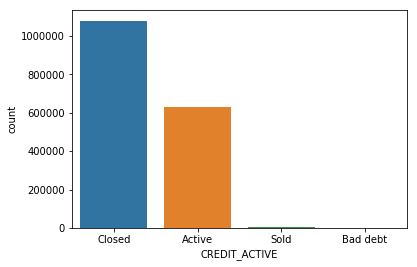

In [58]:
sns.countplot(burDF['CREDIT_ACTIVE'])

We've got a health number of obsevations in both active credit. We will be comfortable engineering features off of these subsets.

(array([ 47137.,  51695.,  56894.,  53955.,  49900.,  35938.,  40812.,
         54562.,  66378.,  80971.,  89889.,  97227., 106785., 107929.,
        118204., 127570., 134756., 147090., 144486., 104250.]),
 array([-2922. , -2775.9, -2629.8, -2483.7, -2337.6, -2191.5, -2045.4,
        -1899.3, -1753.2, -1607.1, -1461. , -1314.9, -1168.8, -1022.7,
         -876.6,  -730.5,  -584.4,  -438.3,  -292.2,  -146.1,     0. ]),
 <a list of 20 Patch objects>)

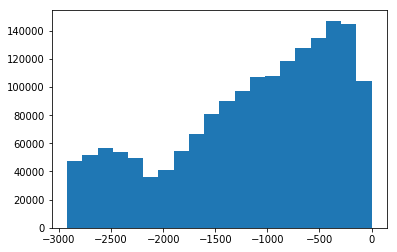

In [59]:
plt.hist(burDF['DAYS_CREDIT'],bins = 20)

# Feature Engineering

## Engineering Features: Primary table - application_train

**Deriving new features from the training data:**
 
* ANNUITY_INCOME_PERCENT: the percentage of the loan annuity relative to a client's income
* CREDIT_TERM: the length of the payment in years
* DAYS_EMPLOYED_PERCENT: the percentage of the days employed relative to the client's age (after imputing anomalous values in 'DAYS_EMPLOYED')
* GOODS_PRICE_CREDIT_PERCENT: the percentage of the goods price relative to the loan credit amount
* INCOME_PER_FAM_MEMBERS: the income per family members
* TOTAL_ENQ_BUREAU: total number of enquiries to Credit Bureau 
* RATIO_CAR_TO_BRITH: 
* RATIO_CAR_TO_EMPLOY:
* RATIO_PHONE_TO_BIRTH:
* RATIO_PHONE_TO_EMPLOY:


In [286]:
class app_add_features(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X=pd.DataFrame(X, columns=self.features)
        X['ANNUITY_INCOME_PERCENT'] = X['AMT_ANNUITY'] / X['AMT_INCOME_TOTAL']
        X['CREDIT_TERM'] = X['AMT_CREDIT'] / X['AMT_ANNUITY']
        X['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
        X['AGE'] = X['DAYS_BIRTH'] / -365
        X['DAYS_EMPLOYED_PERCENT'] = X['DAYS_EMPLOYED'] / X['DAYS_BIRTH']
        X['GOODS_PRICE_CREDIT_PERCENT']=X['AMT_CREDIT'] / X['AMT_GOODS_PRICE']
        X['INCOME_PER_FAM_MEMBERS']=X['AMT_INCOME_TOTAL'] / X['CNT_FAM_MEMBERS']
        X['TOTAL_ENQ_BUREAU']=X['AMT_REQ_CREDIT_BUREAU_DAY']\
        +X['AMT_REQ_CREDIT_BUREAU_WEEK']\
        + X['AMT_REQ_CREDIT_BUREAU_MON']\
        + X['AMT_REQ_CREDIT_BUREAU_QRT']\
        + X['AMT_REQ_CREDIT_BUREAU_YEAR']
        X['RATIO_CAR_TO_BRITH']=X['OWN_CAR_AGE'] / X['DAYS_BIRTH']
        X['RATIO_CAR_TO_EMPLOY'] = X['OWN_CAR_AGE'] / X['DAYS_EMPLOYED']
        X['RATIO_PHONE_TO_BIRTH'] = X['DAYS_LAST_PHONE_CHANGE'] / X['DAYS_BIRTH']
        X['RATIO_PHONE_TO_EMPLOY'] = X['DAYS_LAST_PHONE_CHANGE'] / X['DAYS_EMPLOYED']
        ##########
        X=X.replace([np.inf, -np.inf], np.nan)
        return X

In [0]:
'DAYS_BIRTH','DAYS_EMPLOYED','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR'

('DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR')

In [0]:
'AMT_ANNUITY','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_EMPLOYED','DAYS_BIRTH','AMT_CREDIT','AMT_GOODS_PRICE','AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR'

## Engineering Features: previous_application

**New features**
* Count of previous approved applications based on NAME_CONTRACT_STATUS
* Count of previous refused applications based on NAME_CONTRACT_STATUS
* Difference between applied and approved credit amount.
* Aggregate stats for 'AMT_ANNUITY'
* Aggregate stats for 'AMT_APPLICATION'
* Prev_GOODS_PRICE_CREDIT_PERCENT: the percentage of the goods price relative to the loan credit amount
* Prev_CREDIT_APP_PERCENTAGE: the percentage of the credit was granted relative to the loan was applied
* CALC_FLAG_PRIVILEGED_CUSTOMER
* CALC_TERMINATED
* CALC_LAST_DUE_AFTER_APPL
* Group by the client id, calculate aggregation statistics

In [287]:
class prev_apps_add_features1(BaseEstimator, TransformerMixin):
    def __init__(self, feature=None): # no *args or **kargs
        self.feature = feature # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X=pd.DataFrame(X)
        X['Pre_GOODS_PRICE_CREDIT_PERCENT']=X['AMT_CREDIT'] / X['AMT_GOODS_PRICE']
        X['Pre_CREDIT_APP_PERCENTAGE']=X['AMT_CREDIT'] / X['AMT_APPLICATION']
        X['CALC_FLAG_PRIVILEGED_CUSTOMER']=(X['RATE_INTEREST_PRIVILEGED']>0).astype(int)
        X['CALC_TERMINATED']=(X['DAYS_TERMINATION']<0).astype(int)
        X['CALC_LAST_DUE_AFTER_APPL']=(X['DAYS_LAST_DUE_1ST_VERSION']>0).astype(int)
        X=X.replace([np.inf, -np.inf], np.nan)
    
        return X

In [288]:
class prev_apps_add_features2(BaseEstimator, TransformerMixin):
    def __init__(self, feature='text'): # no *args or **kargs
        self.feature = feature # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X['Prev_appr_count'] = X['NAME_CONTRACT_STATUS'].map(lambda x: 1 if (x == 'Approved') else 0)
        X['Prev_rej_count'] = X['NAME_CONTRACT_STATUS'].map(lambda x: 1 if (x == 'Refused') else 0)
        X['Diff_credit_appr'] = X['AMT_APPLICATION'] - X['AMT_CREDIT'] 
        X=X.replace([np.inf, -np.inf], np.nan)
        return X

In [289]:
# Create aggregate features (via pipeline)
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            if f not in (features[-1], features[-2]):
                self.agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}
            else:
                self.agg_op_features[f] = {f"{f}_{func}":func for func in ["sum"]}

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result # return dataframe with the join key "SK_ID_CURR"
    

In [0]:
'Pre_GOODS_PRICE_CREDIT_PERCENT', 'Pre_CREDIT_APP_PERCENTAGE','Prev_appr_count','Prev_rej_count','Diff_credit_appr'

## Engineering Features: Installment Payments

* Percent of AMT_INSTALMENT and AMT_PAYMENT
* Percent of DAYS_ENTRY_PAYMENT and DAYS_INSTALMENT

In [290]:
class instpmts_add_features1(BaseEstimator, TransformerMixin):
    def __init__(self, feature=None): # no *args or **kargs
        self.feature = feature # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X['Perc_amt_paid'] = X['AMT_INSTALMENT'] / X['AMT_PAYMENT'] 
        X['Perc_pmt_days'] = X['DAYS_ENTRY_PAYMENT'] / X['DAYS_INSTALMENT'] 
        X['DAYS_LATE_PAYMENT']=X['DAYS_ENTRY_PAYMENT']-X['DAYS_INSTALMENT']
        X['DIFF_INSTALMENT']=X['AMT_INSTALMENT']-X['AMT_PAYMENT']
        X['PERC_DIFF_INSTALMENT']=np.abs(X['DIFF_INSTALMENT'])/X['AMT_INSTALMENT']
        X['INSTAL_PAID_LATE'] = (X['DAYS_LATE_PAYMENT'] > 0).astype(int)
        X['OVERPAID']= (X['DIFF_INSTALMENT'] < 0).astype(int)
        X=X.replace([np.inf, -np.inf], np.nan)
        return X

In [291]:
# Create aggregate features (via pipeline)
class instpmntsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            #self.agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}
            self.agg_op_features[f] = {f"{f}_{func}":func for func in ["mean"]}
            
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        return result # return dataframe with the join key "SK_ID_CURR"

## Engineering Features: Credit Card Balance

* Credit Utilisation - AMT_BALANCE / AMT_CREDIT_LIMIT_ACTUAL
* Total number of Days past Due - SK_DPD_DEF

In [292]:
class crdcardbal_add_features1(BaseEstimator, TransformerMixin):
    def __init__(self, feature='text'): # no *args or **kargs
        self.feature = feature # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X['MONTHS_BALANCE']=X['MONTHS_BALANCE'].abs()
        X['CALC_PERC_DRAWINGS_ATM_CURRENT']=X['AMT_DRAWINGS_ATM_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_DRAWINGS_CURRENT']=X['AMT_DRAWINGS_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_DRAWINGS_OTHER_CURRENT']=X['AMT_DRAWINGS_OTHER_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_DRAWINGS_POS_CURRENT']=X['AMT_DRAWINGS_POS_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_INST_MIN_REGULARITY']=X['AMT_INST_MIN_REGULARITY']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_PAYMENT_CURRENT']=X['AMT_PAYMENT_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_PAYMENT_TOTAL_CURRENT']=X['AMT_PAYMENT_TOTAL_CURRENT']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_RECEIVABLE_PRINCIPAL']=X['AMT_RECEIVABLE_PRINCIPAL']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_PERC_RECIVABLE']=X['AMT_RECIVABLE']/X['AMT_CREDIT_LIMIT_ACTUAL']
        X['CALC_DAYS_WITHOUT_TOLERANCE']=X['SK_DPD']-X['SK_DPD_DEF']

        CNT_DRAWING_LIST=['CNT_DRAWINGS_ATM_CURRENT','CNT_DRAWINGS_CURRENT','CNT_DRAWINGS_OTHER_CURRENT','CNT_DRAWINGS_POS_CURRENT']
        X['CALC_CNT_DRAWINGS_TOTAL']=X[CNT_DRAWING_LIST].sum(axis=1)
        X=X.replace([np.inf, -np.inf], np.nan)
        #X['Diff_amt_paid'] = X['AMT_INSTALMENT'] - X['AMT_PAYMENT'] 
        #X['Diff_pmt_days'] = X['DAYS_ENTRY_PAYMENT'] - X['DAYS_INSTALMENT'] 
        return X

In [293]:
# Create aggregate features (via pipeline)
class crdcardbalFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            if f not in (features[-1], features[-2]):
                self.agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}
            else:
                self.agg_op_features[f] = {f"{f}_{func}":func for func in ["sum"]}
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        #result.columns = [' '.join(col).strip() for col in result.columns.values]
        result['Perc_Credit_util'] = np.round(result['AMT_BALANCE_sum'] / result['AMT_CREDIT_LIMIT_ACTUAL_sum'],3)
        result.drop(['AMT_BALANCE_sum', 'AMT_CREDIT_LIMIT_ACTUAL_sum'], axis=1, inplace=True)
        result=result.replace([np.inf, -np.inf], np.nan)
        return result # return dataframe with the join key "SK_ID_CURR"
    
    
# from sklearn.pipeline import make_pipeline 
# def test_driver_crecardbalFeaturesAggregater(df, features):
#    print(f"df.shape: {df.shape}\n")
#    print(f"df[{features}][0:5]: \n{df[features][0:5]}")
#    test_pipeline = make_pipeline(crdcardbalFeaturesAggregater(features))
#    return(test_pipeline.fit_transform(df))
         
# card_features = ['AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'SK_DPD_DEF']
# res = test_driver_crecardbalFeaturesAggregater(ccbDF3, card_features)
# print(f"HELLO")
# print(f"Test driver: \n{res[0:3]}")
# print(f"input[features][0:10]: \n{Pre_appsDF[0:3]}")


## Engineering Features: Bureau and Bureau Balance
We will engineer a few features. First, we'll get the total active credit and total debt for each consumer.  Then we will determine the most recent credit activity for each consumer.

In [294]:
class bur_add_features(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X,y=None):
        X['Total_Credit'] = X[X['CREDIT_ACTIVE'] == 'Active'].groupby('SK_ID_CURR')['AMT_CREDIT_SUM'].sum()
        X['Total_Debt'] = X.groupby('SK_ID_CURR')['AMT_CREDIT_SUM_DEBT'].sum()
        X['Most_Recent_Days_Credit'] = X[X['CREDIT_ACTIVE'] == 'Active'].groupby('SK_ID_CURR')['DAYS_CREDIT'].max()
        X['CALC_PER_CREDIT_MAX_OVERDUE']=X['AMT_CREDIT_MAX_OVERDUE']/X['AMT_CREDIT_SUM']
        X['CALC_CREDIT_CLOSED']=(X['DAYS_ENDDATE_FACT'] < 0).astype(int)
        X['MONTHS_BALANCE']=X['MONTHS_BALANCE'].abs()
        X['PER_CREDIT_SUM_OVERDUE']=X['AMT_CREDIT_SUM_OVERDUE']/X['AMT_CREDIT_SUM']
        X=X.replace([np.inf, -np.inf], np.nan)
#         X['Total_Credit'].fillna(0, inplace=True)
#         X['Total_Debt'].fillna(0, inplace=True)
#         X['Most_Recent_Days_Credit'].fillna(0, inplace=True)
        return X

In [0]:
'Total_Credit','Total_Debt','Most_Recent_Days_Credit'

('Total_Credit', 'Total_Debt', 'Most_Recent_Days_Credit')

In [295]:
class bureauFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
    
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f] = {f"{f}_{func}":func for func in ["mean"]}
            
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        return result # return dataframe with the join key "SK_ID_CURR"

## Engineering Features: POS_CASH_balance

* Park it for Next round of EDA and Feature engineering

In [296]:
class pcb_add_features(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features # no *args or **kargs
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X,y=None):
        ###new features xin
        X['CALC_PERC_REMAINING_INSTAL']=X['CNT_INSTALMENT_FUTURE']/X['CNT_INSTALMENT']
        X['CALC_CNT_REMAINING_INSTAL']=X['CNT_INSTALMENT']-X['CNT_INSTALMENT_FUTURE']
        X['CALC_DAYS_WITHOUT_TOLERANCE']=X['SK_DPD']-X['SK_DPD_DEF']
        X=X.replace([np.inf, -np.inf], np.nan)
        return X

In [297]:
class pcbFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f] = {f"{f}_{func}":func for func in ["mean", "sum"]}
            
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        if len(result.columns.levels)>1:
            result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        return result # return dataframe with the join key "SK_ID_CURR"    

# Feature Engineering Pipeline

## Build Feature Engineering Pipelines

In [298]:
# Feature Engineering Pipeline for 'application_train'

Apps_feature_pipeline = Pipeline([('app_add_features', app_add_features()),])

In [299]:
# Feature Engineering Pipeline for 'previous_application'
prev_features = ['AMT_APPLICATION','Pre_GOODS_PRICE_CREDIT_PERCENT', 'Pre_CREDIT_APP_PERCENTAGE','CALC_FLAG_PRIVILEGED_CUSTOMER','CALC_TERMINATED','CALC_LAST_DUE_AFTER_APPL','Diff_credit_appr', 'Prev_appr_count','Prev_rej_count']
prevApps_feature_pipeline = Pipeline([
        ('prev_apps_add_features1', prev_apps_add_features1()),
        ('prev_apps_add_features2', prev_apps_add_features2()),
        ('prevAppsFeaturesAggregater', prevAppsFeaturesAggregater(prev_features))
    ])

In [300]:
# Feature Engineering Pipeline for 'installments_payments'

inst_features = ['Perc_amt_paid','Perc_pmt_days','DAYS_LATE_PAYMENT','DIFF_INSTALMENT','PERC_DIFF_INSTALMENT','INSTAL_PAID_LATE','OVERPAID']
instpmts_feature_pipeline = Pipeline([
        ('instpmt_add_features1', instpmts_add_features1()),  # add some new features 
        ('instpmt_aggregater', instpmntsFeaturesAggregater(inst_features)), # Aggregate across old and new features
    ])

In [301]:
# Feature Engineering Pipeline for 'credit_card_balance'

card_features = ['SK_DPD_DEF','MONTHS_BALANCE','CALC_PERC_DRAWINGS_ATM_CURRENT','CALC_PERC_DRAWINGS_CURRENT','CALC_PERC_DRAWINGS_OTHER_CURRENT','CALC_PERC_DRAWINGS_POS_CURRENT','CALC_PERC_INST_MIN_REGULARITY','CALC_PERC_PAYMENT_CURRENT','CALC_PERC_PAYMENT_TOTAL_CURRENT','CALC_PERC_RECEIVABLE_PRINCIPAL','CALC_PERC_RECIVABLE','CALC_DAYS_WITHOUT_TOLERANCE','CALC_CNT_DRAWINGS_TOTAL', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL']
crdbal_feature_pipeline = Pipeline([
        ('crdcardbal_add_features1', crdcardbal_add_features1()),  # add some new features 
        ('crdbal_aggregater', crdcardbalFeaturesAggregater(card_features)), # Aggregate across old and new features
    ])

In [302]:
# Feature Engineering Pipeline for 'bureau'

bureau_features = ['Total_Credit','Total_Debt','Most_Recent_Days_Credit','CALC_PER_CREDIT_MAX_OVERDUE','CALC_CREDIT_CLOSED','MONTHS_BALANCE','PER_CREDIT_SUM_OVERDUE']
bu_feature_pipeline = Pipeline([('bur_add_features',bur_add_features()),
                                ('bureauFeaturesAggregater',bureauFeaturesAggregater(bureau_features)),
       ])

In [303]:
# Feature Engineering Pipeline for 'POS_CASH_balance'

POS_CASH_balance_features = ['SK_DPD_DEF','CALC_PERC_REMAINING_INSTAL','CALC_CNT_REMAINING_INSTAL','CALC_DAYS_WITHOUT_TOLERANCE']
pcb_feature_pipeline = Pipeline([('pcb_add_features',pcb_add_features()),
    ('pcbFeaturesAggregater',pcbFeaturesAggregater(POS_CASH_balance_features))
       ])

## Prepare the labeled dataset

In [304]:
# transform datasets through feature engineering pipelines
# selected_features = ['SK_ID_CURR','AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'AMT_CREDIT','DAYS_EMPLOYED','EXT_SOURCE_1',
#         'EXT_SOURCE_2','EXT_SOURCE_3','CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
#                    'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE','AMT_ANNUITY','AMT_GOODS_PRICE',
# 'CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR', 
#                     'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT', 'DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH',
#                    'REG_CITY_NOT_WORK_CITY', 'FLAG_EMP_PHONE', 'REG_CITY_NOT_LIVE_CITY', 'FLAG_DOCUMENT_3']

#rf_fe.extend(('DAYS_EMPLOYED', 'DAYS_BIRTH'))
#exl_fe = ['AMT_APPLICATION_mean', 'INCOME_PER_FAM_MEMBERS', 'AMT_ANNUITY_min', 'AGE', 'Diff_credit_appr_max', 'DAYS_EMPLOYED_PERCENT', 'AMT_APPLICATION_min', 'range_AMT_APPLICATION', 'AMT_ANNUITY_max', 'Diff_credit_appr_mean', 'Pre_GOODS_PRICE_CREDIT_PERCENT_min', 'Pre_CREDIT_APP_PERCENTAGE_max', 'AMT_ANNUITY_mean', 'TOTAL_ENQ_BUREAU', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'GOODS_PRICE_CREDIT_PERCENT', 'Diff_credit_appr_min', 'AMT_APPLICATION_max', 'Prev_rej_count_sum']
#sel_fe = [x for x in rf_fe if x not in exl_fe]
#apps_train= datasets["application_train"][sel_fe]#primary dataset
apps_train= datasets["application_train"].drop(['TARGET'], axis=1)
y=datasets["application_train"]["TARGET"]
Pre_appsDF = datasets["previous_application"] #prev app
instDF = datasets["installments_payments"]
ccbDF = datasets['credit_card_balance']
burDF = datasets['bureau']
burbDF = datasets['bureau_balance']
bur_burbDF=burDF.merge(burbDF,how='left', on='SK_ID_BUREAU')
pcbDF = datasets['POS_CASH_balance']

In [305]:
apps_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [306]:
def prepare_datasets(X):
    
        
        X=Apps_feature_pipeline.transform(X)
        print("Xapp: ", X.shape)
        X=X.merge(prevApps_feature_pipeline.transform(Pre_appsDF), how='left', on='SK_ID_CURR')
        print("Xprevapp: ", X.shape)
        X=X.merge(instpmts_feature_pipeline.transform(instDF),how='left', on='SK_ID_CURR')
        print("Xinst: ", X.shape)
        X=X.merge(crdbal_feature_pipeline.transform(ccbDF),how='left', on='SK_ID_CURR')
        print("Xcrd: ", X.shape)
        X=X.merge(bu_feature_pipeline.transform(bur_burbDF),how='left', on='SK_ID_CURR')
        print("Xbu: ", X.shape)
        X=X.merge(pcb_feature_pipeline.transform(pcbDF),how='left', on='SK_ID_CURR')
        print("Xpcb: ", X.shape)
        X=X.drop(['AMT_ANNUITY','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_EMPLOYED','DAYS_BIRTH','AMT_CREDIT','AMT_GOODS_PRICE','AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR','OWN_CAR_AGE','DAYS_LAST_PHONE_CHANGE',], axis=1)
        print("Xfinal: ", X.shape)
        return X



In [307]:
X= prepare_datasets(apps_train)

X.head()

Xapp:  (307511, 132)
Xprevapp:  (307511, 156)
Xinst:  (307511, 163)
Xcrd:  (307511, 203)
Xbu:  (307511, 210)
Xpcb:  (307511, 218)
Xfinal:  (307511, 204)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,...,MONTHS_BALANCE_mean_y,PER_CREDIT_SUM_OVERDUE_mean,SK_DPD_DEF_mean_y,SK_DPD_DEF_sum,CALC_PERC_REMAINING_INSTAL_mean,CALC_PERC_REMAINING_INSTAL_sum,CALC_CNT_REMAINING_INSTAL_mean,CALC_CNT_REMAINING_INSTAL_sum,CALC_DAYS_WITHOUT_TOLERANCE_mean_y,CALC_DAYS_WITHOUT_TOLERANCE_sum
0,100002,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,24.554545,0.0,0.0,0.0,0.625000,11.875000,9.000000,171.0,0.0,0.0
1,100003,Cash loans,F,N,N,0,Family,State servant,Higher education,Married,...,NaN,0.0,0.0,0.0,0.544643,15.250000,4.321429,121.0,0.0,0.0
2,100004,Revolving loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,NaN,0.0,0.0,0.0,0.562500,2.250000,1.500000,6.0,0.0,0.0
3,100006,Cash loans,F,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,...,NaN,NaN,0.0,0.0,0.570833,11.416667,3.350000,67.0,0.0,0.0
4,100007,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,NaN,0.0,0.0,0.0,0.557561,36.799020,6.363636,420.0,0.0,0.0


In [308]:
X.shape

(307511, 204)

In [309]:
X_corr = X.copy()

#X_corr['TARGET'] = pd.DataFrame[y, X_corr)
X_corr = pd.concat([X_corr, y], axis=1)
X_corr.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,...,PER_CREDIT_SUM_OVERDUE_mean,SK_DPD_DEF_mean_y,SK_DPD_DEF_sum,CALC_PERC_REMAINING_INSTAL_mean,CALC_PERC_REMAINING_INSTAL_sum,CALC_CNT_REMAINING_INSTAL_mean,CALC_CNT_REMAINING_INSTAL_sum,CALC_DAYS_WITHOUT_TOLERANCE_mean_y,CALC_DAYS_WITHOUT_TOLERANCE_sum,TARGET
0,100002,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,0.0,0.0,0.0,0.625000,11.875000,9.000000,171.0,0.0,0.0,1
1,100003,Cash loans,F,N,N,0,Family,State servant,Higher education,Married,...,0.0,0.0,0.0,0.544643,15.250000,4.321429,121.0,0.0,0.0,0
2,100004,Revolving loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,0.0,0.0,0.0,0.562500,2.250000,1.500000,6.0,0.0,0.0,0
3,100006,Cash loans,F,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,...,NaN,0.0,0.0,0.570833,11.416667,3.350000,67.0,0.0,0.0,0
4,100007,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,0.0,0.0,0.0,0.557561,36.799020,6.363636,420.0,0.0,0.0,0


### IterativeImputation of the most important variables

Target feature is highly correlated with the EXT_SOURCE_1, EXT_SOURCE_@, and EXT_SOURCE_3 features. Hence, these three features are the most important variables for prediction. However, a notable proportion of the values for these  features are missing. We aim to impute these missing values by use of IterativeImputer in SKlearn.

IterativeImputer uses the available data to impute the missing values. Each column with missing values is treated as y and the rest of the dataset is treated as X. 
Ref: https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html

To have a precise imputation for EXT_SOURCE variables, we need to identify the most correlated features with the EXT_SOURCE variables and use them in the imputation process

In [0]:
#corr1 = X_corr.corr()['EXT_SOURCE_1'].sort_values(ascending=False)
#corr2 = X_corr.corr()['EXT_SOURCE_2'].sort_values(ascending=False)
corr3 = X_corr.corr()['EXT_SOURCE_3'].sort_values(ascending=False)

In [0]:
corr3.dropna(inplace=True)

In [0]:
#corr1_tail = corr1.tail(5).index.tolist()
#corr1_head = corr1.head(5).index.tolist()
#corr2_tail = corr2.tail(5).index.tolist()
#corr2_head = corr2.head(5).index.tolist()
corr3_tail = corr3.tail(3).index.tolist()
corr3_head = corr3.head(4).index.tolist()
mi_features = []
#mi_features.extend(corr1_tail)
#mi_features.extend(corr2_tail)
mi_features.extend(corr3_tail)
#mi_features.extend(corr1_head)
#mi_features.extend(corr2_head) 
mi_features.extend(corr3_head)
mi_features = list(dict.fromkeys(mi_features))



In [0]:
corr3

EXT_SOURCE_3                           1.000000
CALC_CREDIT_CLOSED_mean                0.283221
MONTHS_BALANCE_mean_y                  0.238383
AGE                                    0.210123
EXT_SOURCE_1                           0.183646
                                         ...   
CALC_PERC_RECIVABLE_mean              -0.155489
Perc_Credit_util                      -0.155737
CALC_PERC_RECEIVABLE_PRINCIPAL_mean   -0.156309
Prev_rej_count_sum                    -0.167585
TARGET                                -0.176800
Name: EXT_SOURCE_3, Length: 187, dtype: float64

In [0]:
mi_features.remove('EXT_SOURCE_3')

In [0]:
print(mi_features)

['CALC_PERC_RECEIVABLE_PRINCIPAL_mean', 'Prev_rej_count_sum', 'CALC_CREDIT_CLOSED_mean', 'MONTHS_BALANCE_mean_y', 'AGE']


Split the data set to test and train sets.

In [310]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)


In [311]:
X_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,...,MONTHS_BALANCE_mean_y,PER_CREDIT_SUM_OVERDUE_mean,SK_DPD_DEF_mean_y,SK_DPD_DEF_sum,CALC_PERC_REMAINING_INSTAL_mean,CALC_PERC_REMAINING_INSTAL_sum,CALC_CNT_REMAINING_INSTAL_mean,CALC_CNT_REMAINING_INSTAL_sum,CALC_DAYS_WITHOUT_TOLERANCE_mean_y,CALC_DAYS_WITHOUT_TOLERANCE_sum
21614,125178,Cash loans,F,N,Y,0,Family,Commercial associate,Higher education,Married,...,12.657143,0.0,0.0,0.0,0.416667,2.500000,2.333333,14.0,0.0,0.0
209797,343134,Cash loans,F,N,N,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,NaN,NaN,0.0,0.0,0.500000,6.500000,6.000000,78.0,0.0,0.0
17976,120964,Cash loans,F,Y,Y,0,Unaccompanied,Pensioner,Higher education,Widow,...,NaN,0.0,0.0,0.0,0.455882,23.250000,5.882353,300.0,0.0,0.0
282543,427277,Cash loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,...,5.270833,0.0,0.0,0.0,0.534722,6.416667,5.500000,66.0,0.0,0.0
52206,160455,Cash loans,M,N,N,0,Unaccompanied,Pensioner,Higher education,Civil marriage,...,NaN,0.0,0.0,0.0,0.500000,6.500000,6.000000,78.0,0.0,0.0


In [312]:
print(X_train.shape, X_valid.shape, X_test.shape)

(222176, 204) (46127, 204) (39208, 204)


## Prepare the unlabeled dataset (i.e., the Kaggle test dataset)

In [313]:

X_kaggle_test= datasets["application_test"]

prepared_kaggle_test= prepare_datasets(X_kaggle_test)

prepared_kaggle_test.head()

Xapp:  (48744, 132)
Xprevapp:  (48744, 156)
Xinst:  (48744, 163)
Xcrd:  (48744, 203)
Xbu:  (48744, 210)
Xpcb:  (48744, 218)
Xfinal:  (48744, 204)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,...,MONTHS_BALANCE_mean_y,PER_CREDIT_SUM_OVERDUE_mean,SK_DPD_DEF_mean_y,SK_DPD_DEF_sum,CALC_PERC_REMAINING_INSTAL_mean,CALC_PERC_REMAINING_INSTAL_sum,CALC_CNT_REMAINING_INSTAL_mean,CALC_CNT_REMAINING_INSTAL_sum,CALC_DAYS_WITHOUT_TOLERANCE_mean_y,CALC_DAYS_WITHOUT_TOLERANCE_sum
0,100001,Cash loans,F,N,Y,0,Unaccompanied,Working,Higher education,Married,...,16.279070,0.0,0.777778,7.0,0.361111,3.250000,2.555556,23.0,0.000000,0.0
1,100005,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Married,...,4.333333,0.0,0.000000,0.0,0.600000,6.000000,4.500000,45.0,0.000000,0.0
2,100013,Cash loans,M,Y,Y,0,NaN,Working,Higher education,Married,...,29.373913,0.0,0.000000,0.0,0.631173,22.722222,6.083333,219.0,0.944444,34.0
3,100028,Cash loans,F,N,Y,2,Unaccompanied,Working,Secondary / secondary special,Married,...,27.433929,0.0,0.000000,0.0,0.491129,15.225000,10.225806,317.0,0.000000,0.0
4,100038,Cash loans,M,Y,N,1,Unaccompanied,Working,Secondary / secondary special,Married,...,NaN,NaN,0.000000,0.0,0.487179,6.333333,6.153846,80.0,0.000000,0.0


In [314]:
prepared_kaggle_test.shape

(48744, 204)

# Processing pipeline

In our data prep pipeline, we are going to include three sets of features. Numerical features (n=126), categorical features (n=16), and multiple imputation (MI) features (n=).  

In [0]:
mi_features = ['EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','AGE','RATIO_CAR_TO_BRITH','REGION_POPULATION_RELATIVE','RATIO_PHONE_TO_BIRTH','HOUR_APPR_PROCESS_START',
               'CALC_CREDIT_CLOSED_mean',
              'MONTHS_BALANCE_mean_y',
              'DAYS_REGISTRATION',
              'REG_CITY_NOT_WORK_CITY',
              'FLAG_EMP_PHONE',
               'CALC_PERC_RECEIVABLE_PRINCIPAL_min',
               'CALC_PERC_RECIVABLE_min',
              'REGION_RATING_CLIENT_W_CITY',
              'REGION_RATING_CLIENT',
              'CALC_PERC_RECIVABLE_mean',
             'Perc_Credit_util',
 'CALC_PERC_RECEIVABLE_PRINCIPAL_mean'] 


In [0]:
mi_festures = ['DAYS_REGISTRATION',
 'REG_CITY_NOT_WORK_CITY',
 'FLAG_EMP_PHONE',
 'REGION_RATING_CLIENT_W_CITY',
 'REGION_RATING_CLIENT',
 'DAYS_ID_PUBLISH',
 'Prev_rej_count_sum',
 'AGE',
 'RATIO_CAR_TO_BRITH',
 'REGION_POPULATION_RELATIVE',
 'RATIO_PHONE_TO_BIRTH',
 'CALC_CREDIT_CLOSED_mean',
 'MONTHS_BALANCE_mean']#4

In [315]:
mi_features = ['FLAG_DOCUMENT_2', 'SK_DPD_DEF_min', 'CALC_DAYS_WITHOUT_TOLERANCE_min', 'CALC_CREDIT_CLOSED_mean', 'MONTHS_BALANCE_mean_y'] #1
#mi_features = ['CALC_CREDIT_CLOSED_mean','MONTHS_BALANCE_mean_y','AGE','CALC_PERC_RECIVABLE_mean','CALC_CNT_DRAWINGS_TOTAL_max']#7
#mi_features =['Perc_Credit_util', 'FLAG_MOBIL', 'FLAG_DOCUMENT_2', 'AGE', 'EXT_SOURCE_1'] #2
#mi_features =['CALC_PERC_RECEIVABLE_PRINCIPAL_mean', 'Prev_rej_count_sum', 'CALC_CREDIT_CLOSED_mean', 'MONTHS_BALANCE_mean_y'] #3

#mi_features = ['CALC_PERC_RECEIVABLE_PRINCIPAL_mean', 'Prev_rej_count_sum', 'CALC_CREDIT_CLOSED_mean', 'MONTHS_BALANCE_mean_y', 'AGE']#5
#mi_features = ['EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','AGE','CALC_PERC_RECIVABLE_mean','MONTHS_BALANCE_mean_y']#6
num_attribs_md = ['Prev_rej_count_sum','Perc_amt_paid_mean', 'DAYS_EMPLOYED_PERCENT','Diff_credit_appr_max', 'Diff_credit_appr_min','TOTAL_ENQ_BUREAU']
num_features = X_train.select_dtypes(exclude=['object']).columns.tolist()
num_features= [x for x in num_features if x not in mi_features]
num_features= [x for x in num_features if x not in num_attribs_md]

In [316]:
len(num_features)

177

In [317]:
cat_features = X_train.select_dtypes('object').columns.tolist()
cat_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [318]:
len(cat_features)

16

In [319]:
# Create a class to select numerical or categorical columns 
# since Scikit-Learn doesn't handle DataFrames yet
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

Below is the data prep pipeline. We used three pipelines and a FeatureUnion to make this pipeline. For num and cat features, we impute the missing values using the "mean" and "most frequent" strategies. For MI_features we used BayesianRidge and IterativeImputer to fill the missing values. We used StandardScaler to scale the numeric variables and the OneHotEncoder to make dummy variables for the categorical features. 

In [320]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge

# Identify the numeric features we wish to consider. 
num_attribs = num_features

# Features for Iterative Imputing
mi_pipeline = Pipeline([
        ('selector', DataFrameSelector(mi_features)),
        ('imputer', IterativeImputer(estimator=BayesianRidge())),
        ('std_scaler', StandardScaler()),
    ])    

num1_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs_md)),
        ('imputer', SimpleImputer(strategy='median')),
        ('std_scaler', StandardScaler()),
    ])

num2_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])

# Identify the categorical features we wish to consider.
cat_attribs = cat_features

cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("mi_pipeline", mi_pipeline),
        ("num1_pipeline", num1_pipeline),
        ("num2_pipeline", num2_pipeline),
        ("cat_pipeline", cat_pipeline),
    ], n_jobs=4)
              



# Feature Selection

## Fit and Transform data for Feature Selection

In [321]:
%%time
X_train_trans = data_prep_pipeline.fit_transform(X_train)

CPU times: user 1.46 s, sys: 2.7 s, total: 4.15 s
Wall time: 5min 52s


In [322]:
X_train_trans.shape

(222176, 328)

In [323]:
X_valid_trans = data_prep_pipeline.transform(X_valid)
X_test_trans = data_prep_pipeline.transform(X_test)

In [324]:
kaggle_test_trans = data_prep_pipeline.transform(prepared_kaggle_test)

In [325]:
kaggle_test_trans.shape

(48744, 328)

In [326]:
num_names = data_prep_pipeline.transformer_list[0][1].named_steps['selector'].attribute_names
len(num_names)

5

In [327]:
num_names2 = data_prep_pipeline.transformer_list[1][1].named_steps['selector'].attribute_names
len(num_names2)

6

In [328]:
num_names3 = data_prep_pipeline.transformer_list[2][1].named_steps['selector'].attribute_names
len(num_names3)

177

In [329]:
num_names.extend(num_names2)
num_names.extend(num_names3)

In [330]:
len(num_names)

188

In [331]:
cat_names = data_prep_pipeline.transformer_list[3][1].named_steps['ohe'].get_feature_names()
len(cat_names)

140

In [332]:
feature_names = []
feature_names.extend(num_names)
feature_names.extend(cat_names)
len(feature_names)

328

In [333]:
X_feat = pd.DataFrame(list(feature_names), columns=['feature'])
len(X_feat.iloc[:,0].tolist())

328

## SelectKBest - f_classif

In [111]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, mutual_info_classif

model_ftest = SelectKBest(score_func=f_classif, k='all')
model_ftest.fit(X_train_trans, y_train)

SelectKBest(k='all', score_func=<function f_classif at 0x7f429e422510>)

In [112]:
ftest_scores = model_ftest.scores_
ftest_pvalues = model_ftest.pvalues_

In [122]:
ftest_all = pd.DataFrame(list(zip(feature_names, ftest_scores, ftest_pvalues)), columns=['feature', 'f value', 'p-value'])
ftest_all.sort_values('p-value').head(10)

,feature,f value,p-value
31,EXT_SOURCE_1,2165.971158,0.000000e+00
3,CALC_PERC_RECIVABLE_mean,1708.410047,0.000000e+00
4,CALC_CNT_DRAWINGS_TOTAL_max,1561.524354,0.000000e+00
32,EXT_SOURCE_2,5726.713031,0.000000e+00
33,EXT_SOURCE_3,5772.401061,0.000000e+00
2,AGE,1316.380629,2.179096e-287
174,Perc_Credit_util,1313.070839,1.130584e-286
166,CALC_PERC_RECEIVABLE_PRINCIPAL_mean,1287.926352,3.060214e-281
0,CALC_CREDIT_CLOSED_mean,1143.354559,5.419444e-250
104,GOODS_PRICE_CREDIT_PERCENT,1102.491217,3.720002e-241


233


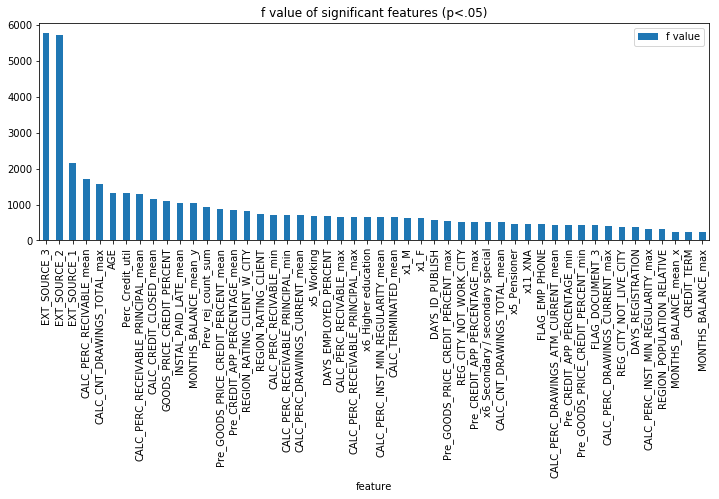

In [123]:
ftest_sig = ftest_all[ftest_all['p-value'] <= .05].sort_values('f value', ascending=False)
print(len(ftest_sig))
ftest_plot = ftest_sig.head(50)
ftest_plot.plot.bar(x='feature', y='f value', title='f value of significant features (p<.05)', figsize=(12,4))

## Chi-Squared Test

In [124]:
from sklearn.preprocessing import MinMaxScaler
chi2_pipeline = Pipeline([
    ('normalizer', MinMaxScaler()),
    ('feature_selection', SelectKBest(score_func=chi2, k='all'))
])

In [125]:
chi2_model = chi2_pipeline.fit_transform(X_train_trans, y_train)

In [126]:
chi2_scores = chi2_pipeline.named_steps['feature_selection'].scores_
chi2_pvalues = chi2_pipeline.named_steps['feature_selection'].pvalues_
len(chi2_pvalues)

328

In [127]:
chi2_all = pd.DataFrame(list(zip(feature_names, chi2_scores, chi2_pvalues)), columns=['feature', 'chi2 value', 'p-value'])
chi2_all.sort_values('p-value').head(50)

,feature,chi2 value,p-value
213,x6_Higher education,494.470985,1.517000e-109
32,EXT_SOURCE_2,462.322798,1.501112e-102
191,x1_M,411.895143,1.417767e-91
29,REG_CITY_NOT_WORK_CITY,399.386250,7.491013e-89
33,EXT_SOURCE_3,374.759023,1.721967e-83
207,x5_Pensioner,368.597122,3.781340e-82
311,x11_XNA,364.796221,2.542375e-81
28,REG_CITY_NOT_LIVE_CITY,345.505197,4.036124e-77
211,x5_Working,329.004310,1.583620e-73
190,x1_F,213.687353,2.154877e-48


154


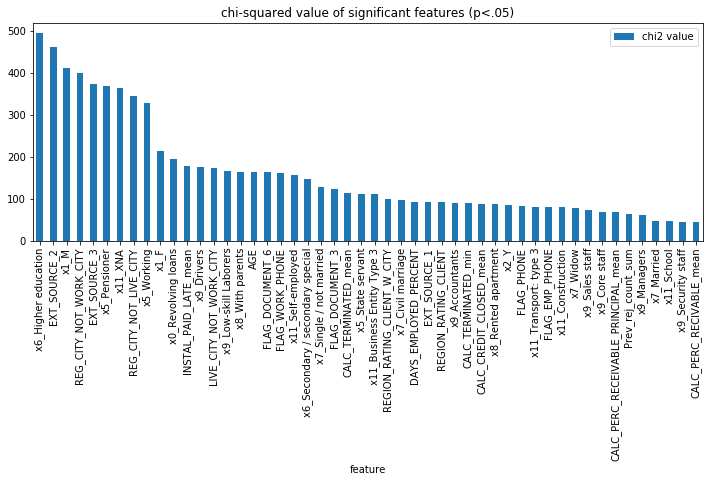

In [128]:
chi2_sig = chi2_all[chi2_all['p-value'] <= .05].sort_values('chi2 value', ascending=False)
print(len(chi2_sig))
chi2_plot = chi2_sig.head(50)
chi2_plot.plot.bar(x='feature', y='chi2 value', title='chi-squared value of significant features (p<.05)', figsize=(12,4))

## PCA Test

In [129]:
from sklearn import decomposition
from sklearn.decomposition import PCA
np.random.seed(42)
pca=decomposition.PCA()

Text(0, 0.5, 'explained_variance_')

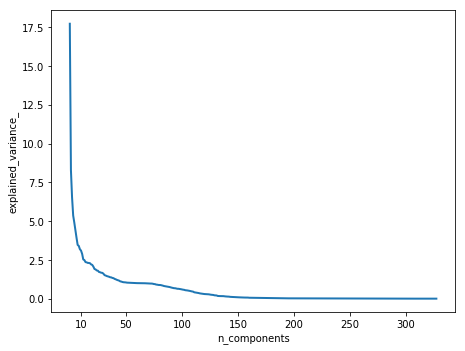

In [130]:
pca.fit(X_train_trans)
plt.figure(1, figsize=(8, 6))
plt.clf()
plt.axes([.1, .2, .7, .7])
plt.plot(pca.explained_variance_, linewidth=2)
plt.xticks([10,50,100,150,200,250,300])
plt.xlabel('n_components')
plt.ylabel('explained_variance_')

The above plot shows that most of the variance in the data is explained with only the first 10 components.

In [131]:
df2_plot = pd.DataFrame(pca.fit_transform(X_train_trans))

Text(0, 0.5, 'Variances')

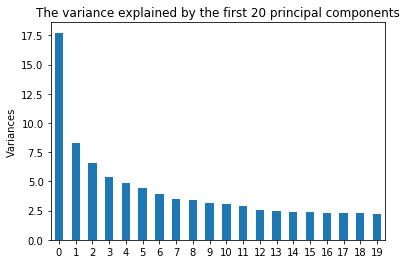

In [132]:
plt.title("The variance explained by the first 20 principal components")
df2_plot.iloc[:,:20].var(axis=0, ddof=0).plot(kind='bar', rot=0)
plt.ylabel('Variances')

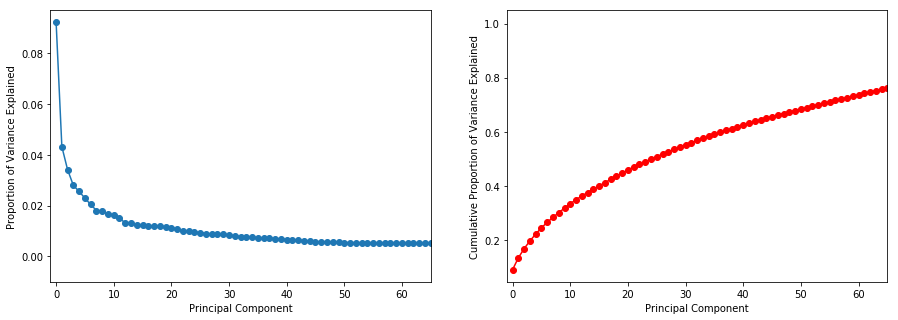

In [133]:
fig , (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

# Left plot
ax1.plot(pca.explained_variance_ratio_, '-o')
ax1.set_ylabel('Proportion of Variance Explained')
ax1.set_ylim(ymin=-0.01)

# Right plot
ax2.plot(np.cumsum(pca.explained_variance_ratio_), '-ro')
ax2.set_ylabel('Cumulative Proportion of Variance Explained')
ax2.set_ylim(ymax=1.05)

for ax in fig.axes:
    ax.set_xlabel('Principal Component')
    ax.set_xlim(-1,65)  

This Plot suggests that by use of 20 components we can get reasonable results.

In [134]:
from sklearn.pipeline import make_pipeline
import xgboost
from xgboost import XGBClassifier

pc_pipeline = make_pipeline(PCA(0.95), XGBClassifier(n_estimators=100))
pc_pipeline.fit(X_train_trans, y_train)

Pipeline(memory=None,
         steps=[('pca',
                 PCA(copy=True, iterated_power='auto', n_components=0.95,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, learning_rate=0.1,
                               max_delta_step=0, max_depth=3,
                               min_child_weight=1, missing=None,
                               n_estimators=100, n_jobs=1, nthread=None,
                               objective='binary:logistic', random_state=0,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
                               seed=None, silent=None, subsample=1,
                               verbosity=1))],
         verbose=False)

In [ ]:
exp_name = f"PCA_XGboost_95_perc_var"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, pc_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, pc_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, pc_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, pc_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, pc_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, pc_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 
expLog

## Random Forest Feature Importances

In [334]:
%%time
from sklearn.ensemble import RandomForestClassifier

rfc=RandomForestClassifier(n_estimators=500, max_leaf_nodes=16, n_jobs=-1, random_state=42)
rfc.fit(X_train_trans, y_train)

CPU times: user 3min 57s, sys: 100 ms, total: 3min 57s
Wall time: 3min 57s


In [335]:
fi=pd.DataFrame(zip(X_feat.iloc[:,0].tolist(), rfc.feature_importances_), columns=['feature', 'importance'])

fi.sort_values('importance', ascending=False).head(10)

,feature,importance
33,EXT_SOURCE_3,0.184618
32,EXT_SOURCE_2,0.178307
31,EXT_SOURCE_1,0.057252
104,GOODS_PRICE_CREDIT_PERCENT,0.034045
7,DAYS_EMPLOYED_PERCENT,0.030107
103,AGE,0.026009
135,INSTAL_PAID_LATE_mean,0.024852
4,MONTHS_BALANCE_mean_y,0.023728
3,CALC_CREDIT_CLOSED_mean,0.021564
168,CALC_PERC_RECIVABLE_mean,0.020261


In [336]:
def plot_feature_importances(df):
   
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()

  
    fig = go.Figure(go.Bar(
           y=list(reversed(list(df['feature'][:30]))),
            x=list(reversed(list(df['importance_normalized'].head(30)))),
            orientation='h'))
    fig.update_layout(
    autosize=False,
    width=800,
    height=1000,
    margin=go.layout.Margin(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    )
)

    fig.show()
    return df


In [337]:
import plotly.graph_objects as go
fi_sorted = plot_feature_importances(fi)

We also tried RandomForestClassifier to calculate the feature importances. The higher the value the more important the feature. 
The results from RandomForestClassifier indicate that EXT_SOURCE_3, EXT_SOURCE_2, and EXT_SOURCE_1 alongwith Perc_Credit_util are the most important features for predicting the target. We used them in our data prep step.

## TopFeatureSelector to select important features

In [338]:
from sklearn.base import BaseEstimator, TransformerMixin

# find the indices to the top ranking input features based on importance 
#    arr is an array of feature importances in order of the input data matrix X
#    k is the number of features to be selected
#
# Note: this feature selector assumes that you have already computed the feature importances 
# somehow (for example using SelectKBest or through a RandomForestRegressor decision tree ensemble). 
def indices_of_top_k(arr, k):
    return np.sort(np.argpartition(np.array(arr), -k)[-k:])

class TopFeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, feature_importances, k):
        self.feature_importances = feature_importances
        self.k = k
    def fit(self, X, y=None):
        self.feature_indices_ = indices_of_top_k(self.feature_importances, self.k)
        return self
    # select the columns of data matrix of the selected input features 
    def transform(self, X):
        return X[:, self.feature_indices_]

In [339]:
%%time
from xgboost import XGBClassifier

k=180
featureScores = rfc.feature_importances_
tf = TopFeatureSelector(featureScores, k)
tf.fit(X_train_trans)
#print(tf.feature_indices_)
#X_train[:,tf.feature_indices_]
#X_train_trans[:,tf.feature_indices_]
model_xg_feature=XGBClassifier(n_estimators=100)
model_xg_feature.fit(X_train_trans[:,tf.feature_indices_],y_train)

CPU times: user 1min 38s, sys: 886 ms, total: 1min 39s
Wall time: 1min 39s


In [340]:
X_train_trans.shape

(222176, 328)

In [341]:
X_train_trans[:,tf.feature_indices_].shape

(222176, 180)

In [342]:
try:
    expLogXGB
except NameError:
    expLogXGB = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])


In [343]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
exp_name = f"XGB_RF_FI_180_features"
expLogXGB.loc[len(expLogXGB)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_xg_feature.predict(X_train_trans[:,tf.feature_indices_])), 
                accuracy_score(y_valid, model_xg_feature.predict(X_valid_trans[:,tf.feature_indices_])),
                accuracy_score(y_test, model_xg_feature.predict(X_test_trans[:,tf.feature_indices_])),
                roc_auc_score(y_train, model_xg_feature.predict_proba(X_train_trans[:,tf.feature_indices_])[:, 1]),
                roc_auc_score(y_valid, model_xg_feature.predict_proba(X_valid_trans[:,tf.feature_indices_])[:, 1]),
                roc_auc_score(y_test, model_xg_feature.predict_proba(X_test_trans[:,tf.feature_indices_])[:, 1])],
    4)) 
expLogXGB

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
31,XGB_RF_FI_180_features,0.9203,0.9197,0.9162,0.7783,0.7701,0.7687


## Pipeline for Feature selection and Estimator

In [344]:
k=150
featureScores = rfc.feature_importances_

feature_selection_estimator_pipeline = Pipeline([
        ('feature_selection', TopFeatureSelector(featureScores, k)),
        ('XGBoost', XGBClassifier(n_estimators=100, n_jobs=-1))
    ])
#print(preparation_and_feature_selection_pipeline)
feature_selection_estimator_pipeline.fit(X_train_trans, y_train) 

Pipeline(memory=None,
         steps=[('feature_selection',
                 TopFeatureSelector(feature_importances=array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.15639319e-02,
       2.37279867e-02, 1.07605663e-02, 8.07029755e-03, 3.01066180e-02,
       6.66566326e-03, 1.54164304e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.36174999e-03, 8.56190285e-04, 4.08605760e-03,
       0.00000000e+00,...
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, learning_rate=0.1,
                               max_delta_step=0, max_depth=3,
                               min_child_weight=1, missing=None,
                               n_estimators=100, n_jobs=-1, nthread=None,
                               objective='binary:logistic', random_state=0,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
   

In [346]:

exp_name = f"XGB_RF_FI_150_features"
expLogXGB.loc[len(expLogXGB)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, feature_selection_estimator_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, feature_selection_estimator_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, feature_selection_estimator_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, feature_selection_estimator_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, feature_selection_estimator_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 
expLogXGB

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
31,XGB_RF_FI_180_features,0.9203,0.9197,0.9162,0.7783,0.7701,0.7687
1,XGB_RF_FI_150_features,0.9202,0.9197,0.9162,0.7783,0.7703,0.7688


# Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

In [347]:
def pct(x):
    return round(100*x,3)

In [348]:
%%time 
np.random.seed(42)

k=150
featureScores = rfc.feature_importances_

feature_selection_estimator_pipeline = Pipeline([
        ('feature_selection', TopFeatureSelector(featureScores, k)),
        ("logistic", LogisticRegression())
    ])
#print(preparation_and_feature_selection_pipeline)
feature_selection_estimator_pipeline.fit(X_train_trans, y_train) 

CPU times: user 59.6 s, sys: 237 ms, total: 59.9 s
Wall time: 59.9 s


In [349]:
from sklearn.metrics import accuracy_score

np.round(accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 3)

0.92

## Evaluation metrics
Submissions are evaluated on [area under the ROC curve](http://en.wikipedia.org/wiki/Receiver_operating_characteristic) between the predicted probability and the observed target.

The SkLearn `roc_auc_score` function computes the area under the receiver operating characteristic (ROC) curve, which is also denoted by AUC or AUROC. By computing the area under the roc curve, the curve information is summarized in one number. 

```python
from sklearn.metrics import roc_auc_score
>>> y_true = np.array([0, 0, 1, 1])
>>> y_scores = np.array([0.1, 0.4, 0.35, 0.8])
>>> roc_auc_score(y_true, y_scores)
0.75
```

In [351]:
try:
    expLogBaseline
except NameError:
    expLogBaseline = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])


In [352]:
exp_name = f"Baseline_150 important_features"
expLogBaseline.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, feature_selection_estimator_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, feature_selection_estimator_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, feature_selection_estimator_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, feature_selection_estimator_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, feature_selection_estimator_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 
expLogBaseline

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
31,Baseline_150 important_features,0.9198,0.9198,0.9159,0.7626,0.7621,0.7626


# Hyperparameter Tuning - Phase-1

In [0]:
from sklearn.model_selection import GridSearchCV

param_grid = {'logistic__penalty':['l1','l2'], 
              'logistic__tol': (0.0001, 0.00001), 
              'logistic__C': [0.1, 1, 10]
             }

gs = GridSearchCV(full_pipeline_with_predictor, param_grid, cv=5,n_jobs=48) 

In [0]:
gs.fit(X_train, y_train)

In [0]:
gs.best_params_

In [0]:
from sklearn.metrics import roc_auc_score
exp_name = f"60_features_{gs.best_params_}"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, gs.predict(X_train)), 
                accuracy_score(y_valid, gs.predict(X_valid)),
                accuracy_score(y_test, gs.predict(X_test)),
                roc_auc_score(y_train, gs.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, gs.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, gs.predict_proba(X_test)[:, 1])],
    4)) 
expLog

# Model Comparision

In [170]:
X_full = pd.DataFrame(np.array(X_train_trans), columns=X_feat.iloc[:,0].tolist())

In [171]:
X_full['TARGET'] = y_train.values

In [172]:
X_full['TARGET'].value_counts()

0    204361
1     17815
Name: TARGET, dtype: int64

### Downsize by Random Sampling from Majority Class

In [173]:
from sklearn.utils import resample
df_majority = X_full[X_full.TARGET==0]
df_minority = X_full[X_full.TARGET==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=17815*3,     # to match minority class
                                 random_state=42) # reproducible results
 
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

In [174]:
df_downsampled['TARGET'].value_counts()

0    53445
1    17815
Name: TARGET, dtype: int64

In [175]:
X_train_ds = df_downsampled.drop(['TARGET'], axis=1)
y_train_ds = df_downsampled["TARGET"]

In [176]:
print(y_train_ds.shape, X_train_ds.shape)

(71260,) (71260, 328)


In [177]:
type(y_train_ds)

pandas.core.series.Series

In [178]:
X_train_ds.shape

(71260, 328)

In [179]:
results_Model_com = pd.DataFrame(columns=["ExpID", "Cross fold train AUC", "Test AUC", "p-value", "Train Time(s)", "Test Time(s)", "Experiment description"])


## Baseline Model  - Logistic Regression

In [ ]:

from sklearn.model_selection import ShuffleSplit
np.random.seed(42)

logistic=LogisticRegression()
cv30Splits = ShuffleSplit(n_splits=30,test_size=0.3,random_state=0)
logit_scores_AUC = cross_val_score(logistic, X_train_ds, y_train_ds,cv=cv30Splits, scoring='roc_auc')
logit_score_AUC_train = logit_scores_AUC.mean()
logistic.fit(X_train_ds, y_train_ds)
logit_score_AUC_test = roc_auc_score(y_test, logistic.predict(X_test))


In [182]:
results_Model_com.loc[0] = ["Baseline", np.round(logit_score_AUC_train,4), np.round(logit_score_AUC_test,4), 
                  "---", "---", "---", "Untuned LogisticRegression"]
results_Model_com

,ExpID,Cross fold train AUC,Test AUC,p-value,Train Time(s),Test Time(s),Experiment description
0,Baseline,0.7479,0.6097,---,---,---,Untuned LogisticRegression


## Significance test with Random search Hyperparameter tuning

In [0]:
#scoring=AUC
# A Function to execute the Random search and record the results.
def ConductRandomSearch(X_train, y_train, X_test, y_test, k=150, i=0, prefix='', n_jobs=16,verbose=1):
    # Create a list of classifiers for our grid search experiment
    classifiers = [
        ('XGBClassifier',  XGBClassifier(n_estimators=100)),
        ('GradientBoostingClassifier', GradientBoostingClassifier()),
        ('Support Vector', SVC(random_state=42)),
        ('Stochastic GD', SGDClassifier(random_state=42)),
        ('RandomForest', RandomForestClassifier()),
    ]

    # Arrange grid search parameters for each classifier
    params_grid = {
        'XGBClassifier': {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        },
        
        'GradientBoostingClassifier': {
            'learning_rate': [1, 0.1, 0.01],
            'n_estimators': [4, 8, 16],
            'max_depth': (5,10,15),
            'min_samples_split': (0.1, 0.4,1.0),
            'min_samples_leaf': (0.1,0.3,0.5),  
        },
        
        'Support Vector' : {
            'kernel': ('rbf', 'poly'),     
            'degree': [1, 2, 3, 4, 5],
            'C': [10, 1, 0.1, 0.01],
        },
                
        'Stochastic GD': {
            'loss': ('hinge', 'perceptron', 'log'),
            'penalty': ('l1', 'l2', 'elasticnet'),
            'tol': [0.0001, 0.00001, 0.0000001], 
            'alpha': [0.1, 0.01, 0.001, 0.0001], 
        },
        'RandomForest':  {
            'max_depth': [9, 15, 22, 24],
            'max_features': [1, 3, 5],
            'min_samples_split': [5, 10, 15],
            'min_samples_leaf': [3, 5, 10],
            'bootstrap': [False],
            'n_estimators':[80, 150, 200]},
    }
    
    for (name, classifier) in classifiers:
        i += 1
        # Print classifier and parameters
        print('****** START',prefix, name,'*****')
        parameters = params_grid[name]
        print("Parameters:")
        for p in sorted(parameters.keys()):
            print("\t"+str(p)+": "+ str(parameters[p]))
        
        # generate the pipeline
        featureScores = rfc.feature_importances_

        full_pipeline_with_predictor = Pipeline([
            ('feature_selection', TopFeatureSelector(featureScores, k)),
            ("predictor", classifier)
        ])
        
        # Execute the Random search
        params = {}
        for p in parameters.keys():
            pipe_key = 'predictor__'+str(p)
            params[pipe_key] = parameters[p] 
        rand_search = RandomizedSearchCV(full_pipeline_with_predictor, params,
                                   scoring='roc_auc', cv=3, verbose=1, n_jobs=n_jobs)
        rand_search.fit(X_train, y_train)
                
        # Best estimator score
        best_train = rand_search.best_score_

        # Best estimator fitting time
        start = time()
        rand_search.best_estimator_.fit(X_train, y_train)
        train_time = round(time() - start, 4)

        # Best estimator prediction time
        start = time()
        best_test_AUC = np.round(roc_auc_score(y_test, rand_search.best_estimator_.predict(X_test)),4)
        test_time = round(time() - start, 4)

        # Generate 30 training accuracy scores with the best estimator and 30-split CV
        # To calculate the best_train_accuracy use the pct() and mean() methods
        cv30Splits = ShuffleSplit(n_splits=30,test_size=0.3,random_state=0)

        best_train_scores = cross_val_score(rand_search.best_estimator_, X_train,y_train, cv=cv30Splits,scoring='roc_auc')
        
        best_train_AUC = np.round(best_train_scores.mean(),4)
    
        # Conduct t-test with baseline logit (control) and best estimator (experiment)
        (t_stat, p_value) = stats.ttest_rel(logit_scores_AUC, best_train_scores)
        
        # Collect the best parameters found by the random search
        print("Best Parameters:")
        best_parameters = rand_search.best_estimator_.get_params()
        param_dump = []
        for param_name in sorted(params.keys()):
            param_dump.append((param_name, best_parameters[param_name]))
            print("\t"+str(param_name)+": " + str(best_parameters[param_name]))
        print("****** FINISH",prefix,name," *****")
        print("")
        
        # Record the results
        resultsAUC20.loc[i] = [prefix+name, best_train_AUC, best_test_AUC, round(p_value,4), train_time, test_time, json.dumps(param_dump)]

In [159]:
from time import time
from scipy import stats
import json

In [0]:
%%time
# This might take a while
if __name__ == "__main__":
    
    ConductRandomSearch(X_train_20, y_train_20, X_test_20, y_test_20, 150, 0, "Random Best Model:",  n_jobs=16,verbose=1)
    
    

In [0]:
resultsAUC20

From the RandomSearch of 1% of the data, we run 5 models and hyperparameter tunning. As the table shown above, XGBClassifier with parameters [colsample_bytree=0.8, gamma=1, max_depth=4, min_child_weight=1, subsample=0.6] has the best performance with train AUC 0.7325. With the p-value 0.0016, we can say the result from XGBClassifier is significantly different from the baseline LogisticRegression.

## Significance test with GridSearchCV Hyperparameter tuning

In [157]:
#scoring=AUC
# A Function to execute the grid search and record the results.
def ConductGridSearch(X_train, y_train, X_test, y_test, k, i=0, prefix='', n_jobs=-1,verbose=1):
    # Create a list of classifiers for our grid search experiment
    classifiers = [
        ('CatBoost', CatBoostClassifier(iterations=1000,bootstrap_type='Bernoulli')),
        ('XGBClassifier',  XGBClassifier(n_estimators=100)),
        ('GradientBoostingClassifier', GradientBoostingClassifier()),
        ('RandomForest', RandomForestClassifier()),
        
    ]

    # Arrange grid search parameters for each classifier
    params_grid = {
        'XGBClassifier': {
        'min_child_weight': [1, 5, 10],
        'gamma': [1, 1.5,2.0],
        'subsample': [0.6,0.8, 1.0],
        'colsample_bytree': [0.6,0.8, 1.0],
        'max_depth': [2,3, 4]
        },
        
        'GradientBoostingClassifier': {
            'learning_rate': [1, 0.1, 0.01],
            'n_estimators': [4, 8, 16],
            'max_depth': (3, 5,10),
            'min_samples_split': (0.2, 0.4,0.6),
            'min_samples_leaf': (0.1,0.3,0.5),  
        },
      
        'RandomForest':  {
            'max_depth': [7, 9, 11],
            'max_features': [3, 5,7],
            'min_samples_split': [3,5, 10],
            'min_samples_leaf': [5, 10,15],
            'bootstrap': [False],
            'n_estimators':[60,80, 150]
        },
        'CatBoost': {
            'learning_rate': [0.03,0.05,0.07],
                              'depth':[5,7,9],
                              'l2_leaf_reg':[5,10,20,40,100],}
                              #'loss_function': ['Logloss', 'CrossEntropy']},
              
    }
    
    for (name, classifier) in classifiers:
        i += 1
        # Print classifier and parameters
        print('****** START',prefix, name,'*****')
        parameters = params_grid[name]
        print("Parameters:")
        for p in sorted(parameters.keys()):
            print("\t"+str(p)+": "+ str(parameters[p]))
        
        # generate the pipeline
        featureScores = rfc.feature_importances_

        full_pipeline_with_predictor = Pipeline([
            #('feature_selection', TopFeatureSelector(featureScores, k)),
            ("predictor", classifier)
        ])
        
        # Execute the grid search
        params = {}
        for p in parameters.keys():
            pipe_key = 'predictor__'+str(p)
            params[pipe_key] = parameters[p] 
        grid_search = GridSearchCV(full_pipeline_with_predictor, params,
                                   scoring='roc_auc', cv=3, verbose=1, n_jobs=n_jobs)
        grid_search.fit(X_train, y_train)
                
        # Best estimator score
        best_train = np.round((grid_search.best_score_),4)

        # Best estimator fitting time
        start = time()
        grid_search.best_estimator_.fit(X_train, y_train)
        train_time = round(time() - start, 4)

        # Best estimator prediction time
        start = time()
        best_test_AUC = np.round(roc_auc_score(y_test, grid_search.best_estimator_.predict(X_test)),4)
        test_time = round(time() - start, 4)

        # Generate 30 training accuracy scores with the best estimator and 30-split CV
        # To calculate the best_train_accuracy use the pct() and mean() methods
        cv30Splits = ShuffleSplit(n_splits=30,test_size=0.3,random_state=0)

        best_train_scores = cross_val_score(grid_search.best_estimator_, X_train,y_train, cv=cv30Splits,scoring='roc_auc')
        
        best_train_AUC = np.round(best_train_scores.mean(),4)
    
        # Conduct t-test with baseline logit (control) and best estimator (experiment)
        (t_stat, p_value) = stats.ttest_rel(logit_scores_AUC, best_train_scores)
        
        # Collect the best parameters found by the grid search
        print("Best Parameters:")
        best_parameters = grid_search.best_estimator_.get_params()
        param_dump = []
        for param_name in sorted(params.keys()):
            param_dump.append((param_name, best_parameters[param_name]))
            print("\t"+str(param_name)+": " + str(best_parameters[param_name]))
        print("****** FINISH",prefix,name," *****")
        print("")
        
        # Record the results
        results_Model_com.loc[i] = [prefix+name, best_train_AUC, best_test_AUC, round(p_value,4), train_time, test_time, json.dumps(param_dump)]

In [160]:
%%time
# This might take a while
if __name__ == "__main__":
    
    ConductGridSearch(X_train_ds, y_train_ds, X_test, y_test, 150, 0, "Grid Best Model:",  n_jobs=-1,verbose=1)

****** START Grid Best Model: CatBoost *****
Parameters:
	depth: [5, 7, 9]
	l2_leaf_reg: [5, 10, 20, 40, 100]
	learning_rate: [0.03, 0.05, 0.07]
Fitting 3 folds for each of 45 candidates, totalling 135 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 0.6818942	total: 40.2ms	remaining: 40.2s
1:	learn: 0.6725837	total: 79.2ms	remaining: 39.5s
2:	learn: 0.6641310	total: 118ms	remaining: 39.3s
3:	learn: 0.6562344	total: 157ms	remaining: 39.1s
4:	learn: 0.6481828	total: 196ms	remaining: 39.1s
5:	learn: 0.6402390	total: 237ms	remaining: 39.3s
6:	learn: 0.6316086	total: 278ms	remaining: 39.5s
7:	learn: 0.6242989	total: 319ms	remaining: 39.5s
8:	learn: 0.6175369	total: 358ms	remaining: 39.5s
9:	learn: 0.6104296	total: 398ms	remaining: 39.4s
10:	learn: 0.6038165	total: 437ms	remaining: 39.3s
11:	learn: 0.5983884	total: 477ms	remaining: 39.3s
12:	learn: 0.5923871	total: 517ms	remaining: 39.2s
13:	learn: 0.5877598	total: 556ms	remaining: 39.2s
14:	learn: 0.5827843	total: 596ms	remaining: 39.2s
15:	learn: 0.5788212	total: 636ms	remaining: 39.1s
16:	learn: 0.5745949	total: 675ms	remaining: 39.1s
17:	learn: 0.5703069	total: 716ms	remaining: 39.1s
18:	learn: 0.5666413	total: 756ms	remaining: 39s
19:	learn: 0.5627440	total: 797ms	remaini

165:	learn: 0.4645022	total: 6.6s	remaining: 33.2s
166:	learn: 0.4643375	total: 6.64s	remaining: 33.1s
167:	learn: 0.4641128	total: 6.68s	remaining: 33.1s
168:	learn: 0.4639213	total: 6.72s	remaining: 33s
169:	learn: 0.4637502	total: 6.76s	remaining: 33s
170:	learn: 0.4635953	total: 6.8s	remaining: 33s
171:	learn: 0.4634277	total: 6.84s	remaining: 32.9s
172:	learn: 0.4631842	total: 6.88s	remaining: 32.9s
173:	learn: 0.4630242	total: 6.92s	remaining: 32.8s
174:	learn: 0.4628070	total: 6.96s	remaining: 32.8s
175:	learn: 0.4626778	total: 7s	remaining: 32.8s
176:	learn: 0.4625384	total: 7.04s	remaining: 32.7s
177:	learn: 0.4623627	total: 7.08s	remaining: 32.7s
178:	learn: 0.4621845	total: 7.12s	remaining: 32.6s
179:	learn: 0.4620709	total: 7.15s	remaining: 32.6s
180:	learn: 0.4619026	total: 7.19s	remaining: 32.6s
181:	learn: 0.4617055	total: 7.23s	remaining: 32.5s
182:	learn: 0.4615208	total: 7.27s	remaining: 32.5s
183:	learn: 0.4613132	total: 7.31s	remaining: 32.4s
184:	learn: 0.4611465	t

327:	learn: 0.4395720	total: 13s	remaining: 26.6s
328:	learn: 0.4394451	total: 13s	remaining: 26.6s
329:	learn: 0.4393265	total: 13.1s	remaining: 26.5s
330:	learn: 0.4391245	total: 13.1s	remaining: 26.5s
331:	learn: 0.4389750	total: 13.1s	remaining: 26.4s
332:	learn: 0.4388728	total: 13.2s	remaining: 26.4s
333:	learn: 0.4387324	total: 13.2s	remaining: 26.4s
334:	learn: 0.4385912	total: 13.3s	remaining: 26.3s
335:	learn: 0.4384369	total: 13.3s	remaining: 26.3s
336:	learn: 0.4383610	total: 13.3s	remaining: 26.2s
337:	learn: 0.4381241	total: 13.4s	remaining: 26.2s
338:	learn: 0.4380404	total: 13.4s	remaining: 26.2s
339:	learn: 0.4379117	total: 13.5s	remaining: 26.1s
340:	learn: 0.4377808	total: 13.5s	remaining: 26.1s
341:	learn: 0.4375847	total: 13.5s	remaining: 26s
342:	learn: 0.4374176	total: 13.6s	remaining: 26s
343:	learn: 0.4372110	total: 13.6s	remaining: 26s
344:	learn: 0.4370182	total: 13.6s	remaining: 25.9s
345:	learn: 0.4368958	total: 13.7s	remaining: 25.9s
346:	learn: 0.4367866	

489:	learn: 0.4140163	total: 19.4s	remaining: 20.2s
490:	learn: 0.4138454	total: 19.4s	remaining: 20.1s
491:	learn: 0.4136889	total: 19.5s	remaining: 20.1s
492:	learn: 0.4134816	total: 19.5s	remaining: 20s
493:	learn: 0.4133085	total: 19.5s	remaining: 20s
494:	learn: 0.4132185	total: 19.6s	remaining: 20s
495:	learn: 0.4130503	total: 19.6s	remaining: 19.9s
496:	learn: 0.4129127	total: 19.6s	remaining: 19.9s
497:	learn: 0.4127850	total: 19.7s	remaining: 19.8s
498:	learn: 0.4125317	total: 19.7s	remaining: 19.8s
499:	learn: 0.4123311	total: 19.8s	remaining: 19.8s
500:	learn: 0.4122327	total: 19.8s	remaining: 19.7s
501:	learn: 0.4120288	total: 19.9s	remaining: 19.7s
502:	learn: 0.4118578	total: 19.9s	remaining: 19.6s
503:	learn: 0.4116940	total: 19.9s	remaining: 19.6s
504:	learn: 0.4115381	total: 20s	remaining: 19.6s
505:	learn: 0.4114055	total: 20s	remaining: 19.5s
506:	learn: 0.4112539	total: 20s	remaining: 19.5s
507:	learn: 0.4111127	total: 20.1s	remaining: 19.5s
508:	learn: 0.4109348	to

649:	learn: 0.3906094	total: 25.7s	remaining: 13.8s
650:	learn: 0.3904901	total: 25.7s	remaining: 13.8s
651:	learn: 0.3903324	total: 25.8s	remaining: 13.8s
652:	learn: 0.3901864	total: 25.8s	remaining: 13.7s
653:	learn: 0.3901082	total: 25.9s	remaining: 13.7s
654:	learn: 0.3899909	total: 25.9s	remaining: 13.6s
655:	learn: 0.3898940	total: 25.9s	remaining: 13.6s
656:	learn: 0.3897677	total: 26s	remaining: 13.6s
657:	learn: 0.3896542	total: 26s	remaining: 13.5s
658:	learn: 0.3894874	total: 26.1s	remaining: 13.5s
659:	learn: 0.3893844	total: 26.1s	remaining: 13.4s
660:	learn: 0.3892178	total: 26.1s	remaining: 13.4s
661:	learn: 0.3890864	total: 26.2s	remaining: 13.4s
662:	learn: 0.3889586	total: 26.2s	remaining: 13.3s
663:	learn: 0.3888373	total: 26.3s	remaining: 13.3s
664:	learn: 0.3887158	total: 26.3s	remaining: 13.2s
665:	learn: 0.3885592	total: 26.3s	remaining: 13.2s
666:	learn: 0.3884373	total: 26.4s	remaining: 13.2s
667:	learn: 0.3882756	total: 26.4s	remaining: 13.1s
668:	learn: 0.38

810:	learn: 0.3700855	total: 32.1s	remaining: 7.47s
811:	learn: 0.3699416	total: 32.1s	remaining: 7.43s
812:	learn: 0.3698246	total: 32.1s	remaining: 7.39s
813:	learn: 0.3696635	total: 32.2s	remaining: 7.35s
814:	learn: 0.3695682	total: 32.2s	remaining: 7.31s
815:	learn: 0.3694930	total: 32.2s	remaining: 7.27s
816:	learn: 0.3693735	total: 32.3s	remaining: 7.23s
817:	learn: 0.3692354	total: 32.3s	remaining: 7.19s
818:	learn: 0.3690776	total: 32.4s	remaining: 7.15s
819:	learn: 0.3689407	total: 32.4s	remaining: 7.11s
820:	learn: 0.3688349	total: 32.4s	remaining: 7.07s
821:	learn: 0.3687229	total: 32.5s	remaining: 7.03s
822:	learn: 0.3685381	total: 32.5s	remaining: 7s
823:	learn: 0.3684215	total: 32.6s	remaining: 6.96s
824:	learn: 0.3682961	total: 32.6s	remaining: 6.92s
825:	learn: 0.3681587	total: 32.6s	remaining: 6.88s
826:	learn: 0.3680197	total: 32.7s	remaining: 6.84s
827:	learn: 0.3679336	total: 32.7s	remaining: 6.8s
828:	learn: 0.3678090	total: 32.8s	remaining: 6.76s
829:	learn: 0.36

971:	learn: 0.3516579	total: 38.4s	remaining: 1.11s
972:	learn: 0.3515877	total: 38.5s	remaining: 1.07s
973:	learn: 0.3514866	total: 38.5s	remaining: 1.03s
974:	learn: 0.3513543	total: 38.5s	remaining: 988ms
975:	learn: 0.3512429	total: 38.6s	remaining: 949ms
976:	learn: 0.3510754	total: 38.6s	remaining: 909ms
977:	learn: 0.3509520	total: 38.7s	remaining: 869ms
978:	learn: 0.3508743	total: 38.7s	remaining: 830ms
979:	learn: 0.3507456	total: 38.7s	remaining: 790ms
980:	learn: 0.3506875	total: 38.8s	remaining: 751ms
981:	learn: 0.3506377	total: 38.8s	remaining: 711ms
982:	learn: 0.3505168	total: 38.8s	remaining: 672ms
983:	learn: 0.3503647	total: 38.9s	remaining: 632ms
984:	learn: 0.3502629	total: 38.9s	remaining: 593ms
985:	learn: 0.3500977	total: 39s	remaining: 553ms
986:	learn: 0.3499802	total: 39s	remaining: 514ms
987:	learn: 0.3499322	total: 39s	remaining: 474ms
988:	learn: 0.3498173	total: 39.1s	remaining: 435ms
989:	learn: 0.3496683	total: 39.1s	remaining: 395ms
990:	learn: 0.3495

136:	learn: 0.4706640	total: 5.45s	remaining: 34.3s
137:	learn: 0.4704565	total: 5.49s	remaining: 34.3s
138:	learn: 0.4701986	total: 5.53s	remaining: 34.3s
139:	learn: 0.4700168	total: 5.57s	remaining: 34.2s
140:	learn: 0.4697704	total: 5.61s	remaining: 34.2s
141:	learn: 0.4695006	total: 5.65s	remaining: 34.1s
142:	learn: 0.4692698	total: 5.69s	remaining: 34.1s
143:	learn: 0.4691116	total: 5.73s	remaining: 34.1s
144:	learn: 0.4688610	total: 5.77s	remaining: 34s
145:	learn: 0.4687445	total: 5.81s	remaining: 34s
146:	learn: 0.4685020	total: 5.85s	remaining: 33.9s
147:	learn: 0.4682964	total: 5.89s	remaining: 33.9s
148:	learn: 0.4680932	total: 5.93s	remaining: 33.9s
149:	learn: 0.4677763	total: 5.97s	remaining: 33.8s
150:	learn: 0.4675736	total: 6.01s	remaining: 33.8s
151:	learn: 0.4673329	total: 6.05s	remaining: 33.7s
152:	learn: 0.4672061	total: 6.09s	remaining: 33.7s
153:	learn: 0.4671220	total: 6.13s	remaining: 33.6s
154:	learn: 0.4669233	total: 6.16s	remaining: 33.6s
155:	learn: 0.46

297:	learn: 0.4440195	total: 11.8s	remaining: 27.8s
298:	learn: 0.4438938	total: 11.8s	remaining: 27.7s
299:	learn: 0.4437462	total: 11.9s	remaining: 27.7s
300:	learn: 0.4436026	total: 11.9s	remaining: 27.7s
301:	learn: 0.4435318	total: 11.9s	remaining: 27.6s
302:	learn: 0.4433961	total: 12s	remaining: 27.6s
303:	learn: 0.4432004	total: 12s	remaining: 27.5s
304:	learn: 0.4430555	total: 12.1s	remaining: 27.5s
305:	learn: 0.4429549	total: 12.1s	remaining: 27.5s
306:	learn: 0.4428227	total: 12.1s	remaining: 27.4s
307:	learn: 0.4427281	total: 12.2s	remaining: 27.4s
308:	learn: 0.4426124	total: 12.2s	remaining: 27.3s
309:	learn: 0.4423885	total: 12.3s	remaining: 27.3s
310:	learn: 0.4422128	total: 12.3s	remaining: 27.3s
311:	learn: 0.4421083	total: 12.3s	remaining: 27.2s
312:	learn: 0.4419986	total: 12.4s	remaining: 27.2s
313:	learn: 0.4418093	total: 12.4s	remaining: 27.1s
314:	learn: 0.4416721	total: 12.5s	remaining: 27.1s
315:	learn: 0.4414730	total: 12.5s	remaining: 27.1s
316:	learn: 0.44

459:	learn: 0.4178595	total: 18.2s	remaining: 21.3s
460:	learn: 0.4177356	total: 18.2s	remaining: 21.3s
461:	learn: 0.4175704	total: 18.2s	remaining: 21.3s
462:	learn: 0.4174378	total: 18.3s	remaining: 21.2s
463:	learn: 0.4171659	total: 18.3s	remaining: 21.2s
464:	learn: 0.4170443	total: 18.4s	remaining: 21.1s
465:	learn: 0.4169604	total: 18.4s	remaining: 21.1s
466:	learn: 0.4167513	total: 18.4s	remaining: 21.1s
467:	learn: 0.4165919	total: 18.5s	remaining: 21s
468:	learn: 0.4164035	total: 18.5s	remaining: 21s
469:	learn: 0.4163645	total: 18.6s	remaining: 20.9s
470:	learn: 0.4162041	total: 18.6s	remaining: 20.9s
471:	learn: 0.4160897	total: 18.6s	remaining: 20.9s
472:	learn: 0.4158276	total: 18.7s	remaining: 20.8s
473:	learn: 0.4156843	total: 18.7s	remaining: 20.8s
474:	learn: 0.4154582	total: 18.8s	remaining: 20.7s
475:	learn: 0.4153322	total: 18.8s	remaining: 20.7s
476:	learn: 0.4151838	total: 18.8s	remaining: 20.7s
477:	learn: 0.4150885	total: 18.9s	remaining: 20.6s
478:	learn: 0.41

619:	learn: 0.3954609	total: 24.5s	remaining: 15s
620:	learn: 0.3953181	total: 24.5s	remaining: 15s
621:	learn: 0.3951904	total: 24.6s	remaining: 14.9s
622:	learn: 0.3950920	total: 24.6s	remaining: 14.9s
623:	learn: 0.3950377	total: 24.6s	remaining: 14.8s
624:	learn: 0.3949056	total: 24.7s	remaining: 14.8s
625:	learn: 0.3947868	total: 24.7s	remaining: 14.8s
626:	learn: 0.3946756	total: 24.8s	remaining: 14.7s
627:	learn: 0.3945290	total: 24.8s	remaining: 14.7s
628:	learn: 0.3944252	total: 24.8s	remaining: 14.6s
629:	learn: 0.3942188	total: 24.9s	remaining: 14.6s
630:	learn: 0.3941649	total: 24.9s	remaining: 14.6s
631:	learn: 0.3940527	total: 24.9s	remaining: 14.5s
632:	learn: 0.3939330	total: 25s	remaining: 14.5s
633:	learn: 0.3937503	total: 25s	remaining: 14.4s
634:	learn: 0.3936029	total: 25.1s	remaining: 14.4s
635:	learn: 0.3934914	total: 25.1s	remaining: 14.4s
636:	learn: 0.3933523	total: 25.1s	remaining: 14.3s
637:	learn: 0.3932755	total: 25.2s	remaining: 14.3s
638:	learn: 0.393171

781:	learn: 0.3753638	total: 31s	remaining: 8.64s
782:	learn: 0.3752676	total: 31s	remaining: 8.6s
783:	learn: 0.3751428	total: 31.1s	remaining: 8.56s
784:	learn: 0.3750677	total: 31.1s	remaining: 8.52s
785:	learn: 0.3749182	total: 31.2s	remaining: 8.48s
786:	learn: 0.3748217	total: 31.2s	remaining: 8.44s
787:	learn: 0.3746871	total: 31.2s	remaining: 8.4s
788:	learn: 0.3745313	total: 31.3s	remaining: 8.36s
789:	learn: 0.3743790	total: 31.3s	remaining: 8.32s
790:	learn: 0.3743331	total: 31.4s	remaining: 8.29s
791:	learn: 0.3741726	total: 31.4s	remaining: 8.24s
792:	learn: 0.3740649	total: 31.4s	remaining: 8.21s
793:	learn: 0.3739956	total: 31.5s	remaining: 8.17s
794:	learn: 0.3739110	total: 31.5s	remaining: 8.13s
795:	learn: 0.3737844	total: 31.6s	remaining: 8.09s
796:	learn: 0.3737301	total: 31.6s	remaining: 8.05s
797:	learn: 0.3735797	total: 31.6s	remaining: 8.01s
798:	learn: 0.3734628	total: 31.7s	remaining: 7.97s
799:	learn: 0.3734281	total: 31.7s	remaining: 7.93s
800:	learn: 0.3732

945:	learn: 0.3565057	total: 37.5s	remaining: 2.14s
946:	learn: 0.3564354	total: 37.5s	remaining: 2.1s
947:	learn: 0.3562886	total: 37.6s	remaining: 2.06s
948:	learn: 0.3561873	total: 37.6s	remaining: 2.02s
949:	learn: 0.3559987	total: 37.6s	remaining: 1.98s
950:	learn: 0.3559260	total: 37.7s	remaining: 1.94s
951:	learn: 0.3557914	total: 37.7s	remaining: 1.9s
952:	learn: 0.3557244	total: 37.8s	remaining: 1.86s
953:	learn: 0.3555982	total: 37.8s	remaining: 1.82s
954:	learn: 0.3554973	total: 37.8s	remaining: 1.78s
955:	learn: 0.3553519	total: 37.9s	remaining: 1.74s
956:	learn: 0.3552335	total: 37.9s	remaining: 1.7s
957:	learn: 0.3551143	total: 38s	remaining: 1.66s
958:	learn: 0.3550109	total: 38s	remaining: 1.62s
959:	learn: 0.3549282	total: 38s	remaining: 1.58s
960:	learn: 0.3548533	total: 38.1s	remaining: 1.54s
961:	learn: 0.3546989	total: 38.1s	remaining: 1.5s
962:	learn: 0.3545634	total: 38.1s	remaining: 1.47s
963:	learn: 0.3544868	total: 38.2s	remaining: 1.43s
964:	learn: 0.3543734	

110:	learn: 0.4750194	total: 4.43s	remaining: 35.5s
111:	learn: 0.4746457	total: 4.47s	remaining: 35.5s
112:	learn: 0.4743718	total: 4.51s	remaining: 35.4s
113:	learn: 0.4741199	total: 4.55s	remaining: 35.4s
114:	learn: 0.4737834	total: 4.59s	remaining: 35.3s
115:	learn: 0.4733950	total: 4.63s	remaining: 35.3s
116:	learn: 0.4732700	total: 4.67s	remaining: 35.3s
117:	learn: 0.4730741	total: 4.71s	remaining: 35.2s
118:	learn: 0.4727929	total: 4.75s	remaining: 35.2s
119:	learn: 0.4725564	total: 4.79s	remaining: 35.1s
120:	learn: 0.4722315	total: 4.83s	remaining: 35.1s
121:	learn: 0.4720753	total: 4.87s	remaining: 35.1s
122:	learn: 0.4717403	total: 4.91s	remaining: 35s
123:	learn: 0.4714416	total: 4.95s	remaining: 35s
124:	learn: 0.4712676	total: 4.99s	remaining: 34.9s
125:	learn: 0.4710379	total: 5.03s	remaining: 34.9s
126:	learn: 0.4708383	total: 5.07s	remaining: 34.8s
127:	learn: 0.4705490	total: 5.11s	remaining: 34.8s
128:	learn: 0.4701763	total: 5.15s	remaining: 34.8s
129:	learn: 0.46

272:	learn: 0.4442572	total: 10.8s	remaining: 28.9s
273:	learn: 0.4441366	total: 10.9s	remaining: 28.8s
274:	learn: 0.4439971	total: 10.9s	remaining: 28.8s
275:	learn: 0.4438275	total: 11s	remaining: 28.8s
276:	learn: 0.4436967	total: 11s	remaining: 28.7s
277:	learn: 0.4435992	total: 11s	remaining: 28.7s
278:	learn: 0.4434808	total: 11.1s	remaining: 28.6s
279:	learn: 0.4433514	total: 11.1s	remaining: 28.6s
280:	learn: 0.4431976	total: 11.2s	remaining: 28.6s
281:	learn: 0.4430512	total: 11.2s	remaining: 28.5s
282:	learn: 0.4428525	total: 11.2s	remaining: 28.5s
283:	learn: 0.4427147	total: 11.3s	remaining: 28.4s
284:	learn: 0.4425300	total: 11.3s	remaining: 28.4s
285:	learn: 0.4424308	total: 11.4s	remaining: 28.3s
286:	learn: 0.4423214	total: 11.4s	remaining: 28.3s
287:	learn: 0.4421478	total: 11.4s	remaining: 28.3s
288:	learn: 0.4419746	total: 11.5s	remaining: 28.2s
289:	learn: 0.4418121	total: 11.5s	remaining: 28.2s
290:	learn: 0.4416746	total: 11.6s	remaining: 28.1s
291:	learn: 0.4415

433:	learn: 0.4177158	total: 17.2s	remaining: 22.4s
434:	learn: 0.4175231	total: 17.2s	remaining: 22.4s
435:	learn: 0.4173952	total: 17.3s	remaining: 22.3s
436:	learn: 0.4172669	total: 17.3s	remaining: 22.3s
437:	learn: 0.4170925	total: 17.4s	remaining: 22.3s
438:	learn: 0.4168843	total: 17.4s	remaining: 22.2s
439:	learn: 0.4167041	total: 17.4s	remaining: 22.2s
440:	learn: 0.4165680	total: 17.5s	remaining: 22.1s
441:	learn: 0.4164510	total: 17.5s	remaining: 22.1s
442:	learn: 0.4163380	total: 17.6s	remaining: 22.1s
443:	learn: 0.4161884	total: 17.6s	remaining: 22s
444:	learn: 0.4160697	total: 17.6s	remaining: 22s
445:	learn: 0.4158598	total: 17.7s	remaining: 22s
446:	learn: 0.4156832	total: 17.7s	remaining: 21.9s
447:	learn: 0.4155073	total: 17.8s	remaining: 21.9s
448:	learn: 0.4153447	total: 17.8s	remaining: 21.8s
449:	learn: 0.4152204	total: 17.8s	remaining: 21.8s
450:	learn: 0.4150480	total: 17.9s	remaining: 21.7s
451:	learn: 0.4149254	total: 17.9s	remaining: 21.7s
452:	learn: 0.4147

594:	learn: 0.3946400	total: 23.5s	remaining: 16s
595:	learn: 0.3945000	total: 23.6s	remaining: 16s
596:	learn: 0.3943518	total: 23.6s	remaining: 15.9s
597:	learn: 0.3942488	total: 23.7s	remaining: 15.9s
598:	learn: 0.3941541	total: 23.7s	remaining: 15.9s
599:	learn: 0.3940286	total: 23.7s	remaining: 15.8s
600:	learn: 0.3938981	total: 23.8s	remaining: 15.8s
601:	learn: 0.3938571	total: 23.8s	remaining: 15.7s
602:	learn: 0.3936838	total: 23.9s	remaining: 15.7s
603:	learn: 0.3935977	total: 23.9s	remaining: 15.7s
604:	learn: 0.3934421	total: 23.9s	remaining: 15.6s
605:	learn: 0.3933081	total: 24s	remaining: 15.6s
606:	learn: 0.3931981	total: 24s	remaining: 15.6s
607:	learn: 0.3930757	total: 24.1s	remaining: 15.5s
608:	learn: 0.3929485	total: 24.1s	remaining: 15.5s
609:	learn: 0.3928240	total: 24.1s	remaining: 15.4s
610:	learn: 0.3926662	total: 24.2s	remaining: 15.4s
611:	learn: 0.3925043	total: 24.2s	remaining: 15.4s
612:	learn: 0.3923796	total: 24.3s	remaining: 15.3s
613:	learn: 0.392192

755:	learn: 0.3742821	total: 29.9s	remaining: 9.65s
756:	learn: 0.3741963	total: 30s	remaining: 9.61s
757:	learn: 0.3740504	total: 30s	remaining: 9.57s
758:	learn: 0.3739493	total: 30s	remaining: 9.54s
759:	learn: 0.3738164	total: 30.1s	remaining: 9.5s
760:	learn: 0.3736774	total: 30.1s	remaining: 9.46s
761:	learn: 0.3735594	total: 30.1s	remaining: 9.42s
762:	learn: 0.3734933	total: 30.2s	remaining: 9.38s
763:	learn: 0.3733481	total: 30.2s	remaining: 9.34s
764:	learn: 0.3732249	total: 30.3s	remaining: 9.3s
765:	learn: 0.3730269	total: 30.3s	remaining: 9.26s
766:	learn: 0.3728492	total: 30.3s	remaining: 9.22s
767:	learn: 0.3727572	total: 30.4s	remaining: 9.18s
768:	learn: 0.3726008	total: 30.4s	remaining: 9.14s
769:	learn: 0.3724618	total: 30.5s	remaining: 9.1s
770:	learn: 0.3723282	total: 30.5s	remaining: 9.06s
771:	learn: 0.3722052	total: 30.5s	remaining: 9.02s
772:	learn: 0.3720929	total: 30.6s	remaining: 8.98s
773:	learn: 0.3719030	total: 30.6s	remaining: 8.94s
774:	learn: 0.3718036

917:	learn: 0.3551367	total: 36.3s	remaining: 3.24s
918:	learn: 0.3549754	total: 36.3s	remaining: 3.2s
919:	learn: 0.3548263	total: 36.4s	remaining: 3.16s
920:	learn: 0.3547058	total: 36.4s	remaining: 3.12s
921:	learn: 0.3545898	total: 36.5s	remaining: 3.08s
922:	learn: 0.3544505	total: 36.5s	remaining: 3.04s
923:	learn: 0.3542643	total: 36.5s	remaining: 3s
924:	learn: 0.3542013	total: 36.6s	remaining: 2.97s
925:	learn: 0.3541110	total: 36.6s	remaining: 2.93s
926:	learn: 0.3539637	total: 36.7s	remaining: 2.89s
927:	learn: 0.3537840	total: 36.7s	remaining: 2.85s
928:	learn: 0.3537380	total: 36.7s	remaining: 2.81s
929:	learn: 0.3536180	total: 36.8s	remaining: 2.77s
930:	learn: 0.3535184	total: 36.8s	remaining: 2.73s
931:	learn: 0.3534490	total: 36.9s	remaining: 2.69s
932:	learn: 0.3533014	total: 36.9s	remaining: 2.65s
933:	learn: 0.3531992	total: 36.9s	remaining: 2.61s
934:	learn: 0.3530769	total: 37s	remaining: 2.57s
935:	learn: 0.3529534	total: 37s	remaining: 2.53s
936:	learn: 0.352824

81:	learn: 0.4714411	total: 3.26s	remaining: 36.5s
82:	learn: 0.4708556	total: 3.3s	remaining: 36.5s
83:	learn: 0.4704256	total: 3.34s	remaining: 36.5s
84:	learn: 0.4700769	total: 3.38s	remaining: 36.4s
85:	learn: 0.4696718	total: 3.42s	remaining: 36.4s
86:	learn: 0.4690844	total: 3.46s	remaining: 36.3s
87:	learn: 0.4687367	total: 3.5s	remaining: 36.3s
88:	learn: 0.4681838	total: 3.54s	remaining: 36.3s
89:	learn: 0.4677561	total: 3.58s	remaining: 36.2s
90:	learn: 0.4673203	total: 3.62s	remaining: 36.2s
91:	learn: 0.4670260	total: 3.66s	remaining: 36.2s
92:	learn: 0.4667587	total: 3.7s	remaining: 36.1s
93:	learn: 0.4663190	total: 3.74s	remaining: 36.1s
94:	learn: 0.4659439	total: 3.78s	remaining: 36s
95:	learn: 0.4657588	total: 3.82s	remaining: 36s
96:	learn: 0.4654907	total: 3.86s	remaining: 35.9s
97:	learn: 0.4651849	total: 3.9s	remaining: 35.9s
98:	learn: 0.4648839	total: 3.94s	remaining: 35.8s
99:	learn: 0.4646590	total: 3.98s	remaining: 35.8s
100:	learn: 0.4643513	total: 4.02s	rema

242:	learn: 0.4268282	total: 9.62s	remaining: 30s
243:	learn: 0.4265035	total: 9.66s	remaining: 29.9s
244:	learn: 0.4262941	total: 9.7s	remaining: 29.9s
245:	learn: 0.4260850	total: 9.74s	remaining: 29.9s
246:	learn: 0.4257372	total: 9.78s	remaining: 29.8s
247:	learn: 0.4253966	total: 9.82s	remaining: 29.8s
248:	learn: 0.4251264	total: 9.86s	remaining: 29.7s
249:	learn: 0.4248760	total: 9.9s	remaining: 29.7s
250:	learn: 0.4246030	total: 9.94s	remaining: 29.7s
251:	learn: 0.4243688	total: 9.97s	remaining: 29.6s
252:	learn: 0.4240514	total: 10s	remaining: 29.6s
253:	learn: 0.4236887	total: 10.1s	remaining: 29.5s
254:	learn: 0.4233438	total: 10.1s	remaining: 29.5s
255:	learn: 0.4230905	total: 10.1s	remaining: 29.5s
256:	learn: 0.4228854	total: 10.2s	remaining: 29.4s
257:	learn: 0.4226800	total: 10.2s	remaining: 29.4s
258:	learn: 0.4223739	total: 10.3s	remaining: 29.3s
259:	learn: 0.4220187	total: 10.3s	remaining: 29.3s
260:	learn: 0.4217216	total: 10.3s	remaining: 29.3s
261:	learn: 0.4215

404:	learn: 0.3885383	total: 16s	remaining: 23.5s
405:	learn: 0.3883269	total: 16.1s	remaining: 23.5s
406:	learn: 0.3881406	total: 16.1s	remaining: 23.5s
407:	learn: 0.3879287	total: 16.1s	remaining: 23.4s
408:	learn: 0.3878000	total: 16.2s	remaining: 23.4s
409:	learn: 0.3875882	total: 16.2s	remaining: 23.3s
410:	learn: 0.3873199	total: 16.3s	remaining: 23.3s
411:	learn: 0.3871702	total: 16.3s	remaining: 23.3s
412:	learn: 0.3870254	total: 16.3s	remaining: 23.2s
413:	learn: 0.3867711	total: 16.4s	remaining: 23.2s
414:	learn: 0.3864926	total: 16.4s	remaining: 23.1s
415:	learn: 0.3863560	total: 16.5s	remaining: 23.1s
416:	learn: 0.3861630	total: 16.5s	remaining: 23.1s
417:	learn: 0.3859869	total: 16.5s	remaining: 23s
418:	learn: 0.3856588	total: 16.6s	remaining: 23s
419:	learn: 0.3854817	total: 16.6s	remaining: 22.9s
420:	learn: 0.3853124	total: 16.7s	remaining: 22.9s
421:	learn: 0.3851000	total: 16.7s	remaining: 22.9s
422:	learn: 0.3849436	total: 16.7s	remaining: 22.8s
423:	learn: 0.3846

568:	learn: 0.3573617	total: 22.5s	remaining: 17s
569:	learn: 0.3571073	total: 22.5s	remaining: 17s
570:	learn: 0.3569977	total: 22.6s	remaining: 17s
571:	learn: 0.3568137	total: 22.6s	remaining: 16.9s
572:	learn: 0.3566683	total: 22.7s	remaining: 16.9s
573:	learn: 0.3564984	total: 22.7s	remaining: 16.8s
574:	learn: 0.3562974	total: 22.7s	remaining: 16.8s
575:	learn: 0.3561644	total: 22.8s	remaining: 16.8s
576:	learn: 0.3559282	total: 22.8s	remaining: 16.7s
577:	learn: 0.3557729	total: 22.9s	remaining: 16.7s
578:	learn: 0.3555544	total: 22.9s	remaining: 16.6s
579:	learn: 0.3554289	total: 22.9s	remaining: 16.6s
580:	learn: 0.3552746	total: 23s	remaining: 16.6s
581:	learn: 0.3550505	total: 23s	remaining: 16.5s
582:	learn: 0.3547668	total: 23.1s	remaining: 16.5s
583:	learn: 0.3545945	total: 23.1s	remaining: 16.4s
584:	learn: 0.3544082	total: 23.1s	remaining: 16.4s
585:	learn: 0.3542086	total: 23.2s	remaining: 16.4s
586:	learn: 0.3540020	total: 23.2s	remaining: 16.3s
587:	learn: 0.3537624	

729:	learn: 0.3285889	total: 28.9s	remaining: 10.7s
730:	learn: 0.3283992	total: 28.9s	remaining: 10.6s
731:	learn: 0.3282755	total: 29s	remaining: 10.6s
732:	learn: 0.3280791	total: 29s	remaining: 10.6s
733:	learn: 0.3278805	total: 29s	remaining: 10.5s
734:	learn: 0.3277252	total: 29.1s	remaining: 10.5s
735:	learn: 0.3275562	total: 29.1s	remaining: 10.4s
736:	learn: 0.3273994	total: 29.1s	remaining: 10.4s
737:	learn: 0.3272156	total: 29.2s	remaining: 10.4s
738:	learn: 0.3270430	total: 29.2s	remaining: 10.3s
739:	learn: 0.3268224	total: 29.3s	remaining: 10.3s
740:	learn: 0.3266448	total: 29.3s	remaining: 10.2s
741:	learn: 0.3264832	total: 29.3s	remaining: 10.2s
742:	learn: 0.3264720	total: 29.4s	remaining: 10.2s
743:	learn: 0.3262759	total: 29.4s	remaining: 10.1s
744:	learn: 0.3261395	total: 29.5s	remaining: 10.1s
745:	learn: 0.3260094	total: 29.5s	remaining: 10s
746:	learn: 0.3259977	total: 29.5s	remaining: 10s
747:	learn: 0.3258614	total: 29.6s	remaining: 9.97s
748:	learn: 0.3256693	

891:	learn: 0.3039904	total: 35.3s	remaining: 4.27s
892:	learn: 0.3037553	total: 35.3s	remaining: 4.23s
893:	learn: 0.3035717	total: 35.4s	remaining: 4.19s
894:	learn: 0.3033303	total: 35.4s	remaining: 4.15s
895:	learn: 0.3031864	total: 35.4s	remaining: 4.11s
896:	learn: 0.3030072	total: 35.5s	remaining: 4.07s
897:	learn: 0.3029566	total: 35.5s	remaining: 4.03s
898:	learn: 0.3027986	total: 35.6s	remaining: 4s
899:	learn: 0.3026702	total: 35.6s	remaining: 3.96s
900:	learn: 0.3025556	total: 35.6s	remaining: 3.92s
901:	learn: 0.3023305	total: 35.7s	remaining: 3.88s
902:	learn: 0.3021718	total: 35.7s	remaining: 3.84s
903:	learn: 0.3020492	total: 35.8s	remaining: 3.8s
904:	learn: 0.3018593	total: 35.8s	remaining: 3.76s
905:	learn: 0.3017094	total: 35.8s	remaining: 3.72s
906:	learn: 0.3015317	total: 35.9s	remaining: 3.68s
907:	learn: 0.3013446	total: 35.9s	remaining: 3.64s
908:	learn: 0.3012052	total: 36s	remaining: 3.6s
909:	learn: 0.3010435	total: 36s	remaining: 3.56s
910:	learn: 0.3008556

52:	learn: 0.4850593	total: 2.12s	remaining: 37.8s
53:	learn: 0.4843431	total: 2.16s	remaining: 37.8s
54:	learn: 0.4835510	total: 2.2s	remaining: 37.7s
55:	learn: 0.4829733	total: 2.23s	remaining: 37.7s
56:	learn: 0.4823781	total: 2.27s	remaining: 37.6s
57:	learn: 0.4816547	total: 2.31s	remaining: 37.6s
58:	learn: 0.4811929	total: 2.35s	remaining: 37.5s
59:	learn: 0.4806520	total: 2.39s	remaining: 37.5s
60:	learn: 0.4801278	total: 2.43s	remaining: 37.5s
61:	learn: 0.4796888	total: 2.47s	remaining: 37.4s
62:	learn: 0.4791460	total: 2.51s	remaining: 37.4s
63:	learn: 0.4787556	total: 2.55s	remaining: 37.3s
64:	learn: 0.4782880	total: 2.59s	remaining: 37.3s
65:	learn: 0.4777989	total: 2.63s	remaining: 37.3s
66:	learn: 0.4770866	total: 2.67s	remaining: 37.3s
67:	learn: 0.4765902	total: 2.71s	remaining: 37.2s
68:	learn: 0.4761147	total: 2.75s	remaining: 37.2s
69:	learn: 0.4757512	total: 2.79s	remaining: 37.1s
70:	learn: 0.4753144	total: 2.83s	remaining: 37.1s
71:	learn: 0.4747530	total: 2.87

213:	learn: 0.4352805	total: 8.48s	remaining: 31.2s
214:	learn: 0.4349128	total: 8.52s	remaining: 31.1s
215:	learn: 0.4345509	total: 8.56s	remaining: 31.1s
216:	learn: 0.4342192	total: 8.6s	remaining: 31s
217:	learn: 0.4339761	total: 8.64s	remaining: 31s
218:	learn: 0.4337131	total: 8.68s	remaining: 31s
219:	learn: 0.4334516	total: 8.72s	remaining: 30.9s
220:	learn: 0.4331604	total: 8.76s	remaining: 30.9s
221:	learn: 0.4327931	total: 8.8s	remaining: 30.8s
222:	learn: 0.4325701	total: 8.84s	remaining: 30.8s
223:	learn: 0.4322264	total: 8.88s	remaining: 30.8s
224:	learn: 0.4320384	total: 8.92s	remaining: 30.7s
225:	learn: 0.4318555	total: 8.96s	remaining: 30.7s
226:	learn: 0.4315696	total: 8.99s	remaining: 30.6s
227:	learn: 0.4312951	total: 9.03s	remaining: 30.6s
228:	learn: 0.4310011	total: 9.07s	remaining: 30.5s
229:	learn: 0.4307187	total: 9.11s	remaining: 30.5s
230:	learn: 0.4304781	total: 9.15s	remaining: 30.5s
231:	learn: 0.4301030	total: 9.19s	remaining: 30.4s
232:	learn: 0.429940

375:	learn: 0.3942716	total: 14.9s	remaining: 24.7s
376:	learn: 0.3940426	total: 14.9s	remaining: 24.6s
377:	learn: 0.3938378	total: 15s	remaining: 24.6s
378:	learn: 0.3937830	total: 15s	remaining: 24.6s
379:	learn: 0.3936189	total: 15s	remaining: 24.5s
380:	learn: 0.3934794	total: 15.1s	remaining: 24.5s
381:	learn: 0.3932735	total: 15.1s	remaining: 24.4s
382:	learn: 0.3931668	total: 15.2s	remaining: 24.4s
383:	learn: 0.3929279	total: 15.2s	remaining: 24.4s
384:	learn: 0.3926654	total: 15.2s	remaining: 24.3s
385:	learn: 0.3924607	total: 15.3s	remaining: 24.3s
386:	learn: 0.3921757	total: 15.3s	remaining: 24.3s
387:	learn: 0.3919593	total: 15.3s	remaining: 24.2s
388:	learn: 0.3918222	total: 15.4s	remaining: 24.2s
389:	learn: 0.3915500	total: 15.4s	remaining: 24.1s
390:	learn: 0.3913130	total: 15.5s	remaining: 24.1s
391:	learn: 0.3910038	total: 15.5s	remaining: 24.1s
392:	learn: 0.3908090	total: 15.5s	remaining: 24s
393:	learn: 0.3905346	total: 15.6s	remaining: 24s
394:	learn: 0.3903476	

537:	learn: 0.3609786	total: 21.3s	remaining: 18.3s
538:	learn: 0.3608267	total: 21.3s	remaining: 18.2s
539:	learn: 0.3606396	total: 21.3s	remaining: 18.2s
540:	learn: 0.3604264	total: 21.4s	remaining: 18.1s
541:	learn: 0.3601838	total: 21.4s	remaining: 18.1s
542:	learn: 0.3600087	total: 21.5s	remaining: 18.1s
543:	learn: 0.3598168	total: 21.5s	remaining: 18s
544:	learn: 0.3596541	total: 21.5s	remaining: 18s
545:	learn: 0.3594337	total: 21.6s	remaining: 17.9s
546:	learn: 0.3593179	total: 21.6s	remaining: 17.9s
547:	learn: 0.3591599	total: 21.7s	remaining: 17.9s
548:	learn: 0.3588911	total: 21.7s	remaining: 17.8s
549:	learn: 0.3586814	total: 21.7s	remaining: 17.8s
550:	learn: 0.3584983	total: 21.8s	remaining: 17.7s
551:	learn: 0.3582995	total: 21.8s	remaining: 17.7s
552:	learn: 0.3580032	total: 21.9s	remaining: 17.7s
553:	learn: 0.3578118	total: 21.9s	remaining: 17.6s
554:	learn: 0.3576147	total: 21.9s	remaining: 17.6s
555:	learn: 0.3574325	total: 22s	remaining: 17.6s
556:	learn: 0.3572

697:	learn: 0.3331238	total: 27.6s	remaining: 11.9s
698:	learn: 0.3329401	total: 27.6s	remaining: 11.9s
699:	learn: 0.3327655	total: 27.7s	remaining: 11.9s
700:	learn: 0.3326178	total: 27.7s	remaining: 11.8s
701:	learn: 0.3324028	total: 27.7s	remaining: 11.8s
702:	learn: 0.3321818	total: 27.8s	remaining: 11.7s
703:	learn: 0.3320663	total: 27.8s	remaining: 11.7s
704:	learn: 0.3318935	total: 27.9s	remaining: 11.7s
705:	learn: 0.3317162	total: 27.9s	remaining: 11.6s
706:	learn: 0.3316114	total: 27.9s	remaining: 11.6s
707:	learn: 0.3314652	total: 28s	remaining: 11.5s
708:	learn: 0.3312708	total: 28s	remaining: 11.5s
709:	learn: 0.3311666	total: 28.1s	remaining: 11.5s
710:	learn: 0.3310313	total: 28.1s	remaining: 11.4s
711:	learn: 0.3308914	total: 28.1s	remaining: 11.4s
712:	learn: 0.3307759	total: 28.2s	remaining: 11.3s
713:	learn: 0.3305640	total: 28.2s	remaining: 11.3s
714:	learn: 0.3303865	total: 28.2s	remaining: 11.3s
715:	learn: 0.3302700	total: 28.3s	remaining: 11.2s
716:	learn: 0.33

858:	learn: 0.3072477	total: 34s	remaining: 5.58s
859:	learn: 0.3070555	total: 34s	remaining: 5.54s
860:	learn: 0.3068886	total: 34.1s	remaining: 5.5s
861:	learn: 0.3067424	total: 34.1s	remaining: 5.46s
862:	learn: 0.3065798	total: 34.1s	remaining: 5.42s
863:	learn: 0.3064493	total: 34.2s	remaining: 5.38s
864:	learn: 0.3063300	total: 34.2s	remaining: 5.34s
865:	learn: 0.3061384	total: 34.3s	remaining: 5.3s
866:	learn: 0.3059465	total: 34.3s	remaining: 5.26s
867:	learn: 0.3057332	total: 34.3s	remaining: 5.22s
868:	learn: 0.3054889	total: 34.4s	remaining: 5.18s
869:	learn: 0.3052131	total: 34.4s	remaining: 5.14s
870:	learn: 0.3050304	total: 34.5s	remaining: 5.11s
871:	learn: 0.3048383	total: 34.5s	remaining: 5.07s
872:	learn: 0.3047088	total: 34.5s	remaining: 5.03s
873:	learn: 0.3045660	total: 34.6s	remaining: 4.99s
874:	learn: 0.3044194	total: 34.6s	remaining: 4.95s
875:	learn: 0.3042717	total: 34.7s	remaining: 4.91s
876:	learn: 0.3040219	total: 34.7s	remaining: 4.87s
877:	learn: 0.3038

17:	learn: 0.5367384	total: 718ms	remaining: 39.2s
18:	learn: 0.5336389	total: 758ms	remaining: 39.1s
19:	learn: 0.5298149	total: 798ms	remaining: 39.1s
20:	learn: 0.5264378	total: 837ms	remaining: 39s
21:	learn: 0.5242893	total: 877ms	remaining: 39s
22:	learn: 0.5212615	total: 916ms	remaining: 38.9s
23:	learn: 0.5182164	total: 956ms	remaining: 38.9s
24:	learn: 0.5158654	total: 996ms	remaining: 38.9s
25:	learn: 0.5138918	total: 1.03s	remaining: 38.8s
26:	learn: 0.5115375	total: 1.07s	remaining: 38.8s
27:	learn: 0.5095533	total: 1.11s	remaining: 38.7s
28:	learn: 0.5077557	total: 1.15s	remaining: 38.7s
29:	learn: 0.5061480	total: 1.2s	remaining: 38.7s
30:	learn: 0.5048030	total: 1.23s	remaining: 38.6s
31:	learn: 0.5032741	total: 1.27s	remaining: 38.5s
32:	learn: 0.5019624	total: 1.31s	remaining: 38.5s
33:	learn: 0.5009750	total: 1.35s	remaining: 38.5s
34:	learn: 0.4998448	total: 1.4s	remaining: 38.5s
35:	learn: 0.4982518	total: 1.44s	remaining: 38.4s
36:	learn: 0.4970195	total: 1.48s	rem

179:	learn: 0.4407494	total: 7.12s	remaining: 32.4s
180:	learn: 0.4406086	total: 7.16s	remaining: 32.4s
181:	learn: 0.4402990	total: 7.2s	remaining: 32.4s
182:	learn: 0.4400557	total: 7.24s	remaining: 32.3s
183:	learn: 0.4397940	total: 7.28s	remaining: 32.3s
184:	learn: 0.4394894	total: 7.32s	remaining: 32.2s
185:	learn: 0.4392740	total: 7.36s	remaining: 32.2s
186:	learn: 0.4390256	total: 7.4s	remaining: 32.2s
187:	learn: 0.4387047	total: 7.44s	remaining: 32.1s
188:	learn: 0.4384990	total: 7.48s	remaining: 32.1s
189:	learn: 0.4383073	total: 7.52s	remaining: 32s
190:	learn: 0.4381332	total: 7.56s	remaining: 32s
191:	learn: 0.4378807	total: 7.6s	remaining: 32s
192:	learn: 0.4375998	total: 7.64s	remaining: 31.9s
193:	learn: 0.4373907	total: 7.67s	remaining: 31.9s
194:	learn: 0.4371218	total: 7.71s	remaining: 31.8s
195:	learn: 0.4369186	total: 7.75s	remaining: 31.8s
196:	learn: 0.4367379	total: 7.79s	remaining: 31.8s
197:	learn: 0.4364721	total: 7.83s	remaining: 31.7s
198:	learn: 0.4361895

341:	learn: 0.3980019	total: 13.5s	remaining: 26s
342:	learn: 0.3977736	total: 13.6s	remaining: 26s
343:	learn: 0.3975202	total: 13.6s	remaining: 25.9s
344:	learn: 0.3972235	total: 13.6s	remaining: 25.9s
345:	learn: 0.3970116	total: 13.7s	remaining: 25.9s
346:	learn: 0.3967949	total: 13.7s	remaining: 25.8s
347:	learn: 0.3964744	total: 13.8s	remaining: 25.8s
348:	learn: 0.3963415	total: 13.8s	remaining: 25.7s
349:	learn: 0.3960888	total: 13.8s	remaining: 25.7s
350:	learn: 0.3959310	total: 13.9s	remaining: 25.6s
351:	learn: 0.3957222	total: 13.9s	remaining: 25.6s
352:	learn: 0.3956633	total: 13.9s	remaining: 25.6s
353:	learn: 0.3954839	total: 14s	remaining: 25.5s
354:	learn: 0.3953486	total: 14s	remaining: 25.5s
355:	learn: 0.3951947	total: 14.1s	remaining: 25.4s
356:	learn: 0.3950675	total: 14.1s	remaining: 25.4s
357:	learn: 0.3947312	total: 14.1s	remaining: 25.4s
358:	learn: 0.3945053	total: 14.2s	remaining: 25.3s
359:	learn: 0.3942533	total: 14.2s	remaining: 25.3s
360:	learn: 0.394052

502:	learn: 0.3634073	total: 19.9s	remaining: 19.6s
503:	learn: 0.3631752	total: 19.9s	remaining: 19.6s
504:	learn: 0.3629252	total: 20s	remaining: 19.6s
505:	learn: 0.3627209	total: 20s	remaining: 19.5s
506:	learn: 0.3625148	total: 20s	remaining: 19.5s
507:	learn: 0.3623933	total: 20.1s	remaining: 19.4s
508:	learn: 0.3623369	total: 20.1s	remaining: 19.4s
509:	learn: 0.3621020	total: 20.2s	remaining: 19.4s
510:	learn: 0.3619189	total: 20.2s	remaining: 19.3s
511:	learn: 0.3616668	total: 20.2s	remaining: 19.3s
512:	learn: 0.3614323	total: 20.3s	remaining: 19.3s
513:	learn: 0.3614101	total: 20.3s	remaining: 19.2s
514:	learn: 0.3612083	total: 20.4s	remaining: 19.2s
515:	learn: 0.3609625	total: 20.4s	remaining: 19.1s
516:	learn: 0.3607043	total: 20.4s	remaining: 19.1s
517:	learn: 0.3605100	total: 20.5s	remaining: 19.1s
518:	learn: 0.3602989	total: 20.5s	remaining: 19s
519:	learn: 0.3600886	total: 20.6s	remaining: 19s
520:	learn: 0.3598878	total: 20.6s	remaining: 18.9s
521:	learn: 0.3596570	

663:	learn: 0.3334503	total: 26.3s	remaining: 13.3s
664:	learn: 0.3333638	total: 26.3s	remaining: 13.2s
665:	learn: 0.3332275	total: 26.3s	remaining: 13.2s
666:	learn: 0.3331034	total: 26.4s	remaining: 13.2s
667:	learn: 0.3329092	total: 26.4s	remaining: 13.1s
668:	learn: 0.3327783	total: 26.4s	remaining: 13.1s
669:	learn: 0.3327267	total: 26.5s	remaining: 13s
670:	learn: 0.3325947	total: 26.5s	remaining: 13s
671:	learn: 0.3324663	total: 26.6s	remaining: 13s
672:	learn: 0.3323481	total: 26.6s	remaining: 12.9s
673:	learn: 0.3321889	total: 26.6s	remaining: 12.9s
674:	learn: 0.3319619	total: 26.7s	remaining: 12.8s
675:	learn: 0.3317350	total: 26.7s	remaining: 12.8s
676:	learn: 0.3316161	total: 26.8s	remaining: 12.8s
677:	learn: 0.3314177	total: 26.8s	remaining: 12.7s
678:	learn: 0.3312423	total: 26.8s	remaining: 12.7s
679:	learn: 0.3310660	total: 26.9s	remaining: 12.6s
680:	learn: 0.3309277	total: 26.9s	remaining: 12.6s
681:	learn: 0.3307412	total: 27s	remaining: 12.6s
682:	learn: 0.330547

824:	learn: 0.3072927	total: 32.6s	remaining: 6.92s
825:	learn: 0.3071628	total: 32.7s	remaining: 6.88s
826:	learn: 0.3069916	total: 32.7s	remaining: 6.84s
827:	learn: 0.3068582	total: 32.7s	remaining: 6.8s
828:	learn: 0.3068414	total: 32.8s	remaining: 6.76s
829:	learn: 0.3068198	total: 32.8s	remaining: 6.72s
830:	learn: 0.3066369	total: 32.9s	remaining: 6.68s
831:	learn: 0.3065012	total: 32.9s	remaining: 6.64s
832:	learn: 0.3063632	total: 32.9s	remaining: 6.6s
833:	learn: 0.3061769	total: 33s	remaining: 6.56s
834:	learn: 0.3060833	total: 33s	remaining: 6.52s
835:	learn: 0.3058690	total: 33s	remaining: 6.48s
836:	learn: 0.3057383	total: 33.1s	remaining: 6.44s
837:	learn: 0.3055918	total: 33.1s	remaining: 6.4s
838:	learn: 0.3054283	total: 33.2s	remaining: 6.36s
839:	learn: 0.3054184	total: 33.2s	remaining: 6.32s
840:	learn: 0.3052929	total: 33.2s	remaining: 6.29s
841:	learn: 0.3051323	total: 33.3s	remaining: 6.25s
842:	learn: 0.3050404	total: 33.3s	remaining: 6.21s
843:	learn: 0.3048693

984:	learn: 0.2852341	total: 38.9s	remaining: 593ms
985:	learn: 0.2851435	total: 39s	remaining: 553ms
986:	learn: 0.2850537	total: 39s	remaining: 514ms
987:	learn: 0.2849532	total: 39.1s	remaining: 474ms
988:	learn: 0.2848004	total: 39.1s	remaining: 435ms
989:	learn: 0.2846538	total: 39.1s	remaining: 395ms
990:	learn: 0.2845184	total: 39.2s	remaining: 356ms
991:	learn: 0.2843893	total: 39.2s	remaining: 316ms
992:	learn: 0.2842013	total: 39.3s	remaining: 277ms
993:	learn: 0.2841274	total: 39.3s	remaining: 237ms
994:	learn: 0.2840003	total: 39.3s	remaining: 198ms
995:	learn: 0.2838507	total: 39.4s	remaining: 158ms
996:	learn: 0.2837198	total: 39.4s	remaining: 119ms
997:	learn: 0.2835536	total: 39.5s	remaining: 79.1ms
998:	learn: 0.2833555	total: 39.5s	remaining: 39.5ms
999:	learn: 0.2832441	total: 39.5s	remaining: 0us
0:	learn: 0.6675332	total: 40.7ms	remaining: 40.7s
1:	learn: 0.6481501	total: 79.6ms	remaining: 39.7s
2:	learn: 0.6319047	total: 118ms	remaining: 39.3s
3:	learn: 0.6179639	

147:	learn: 0.4379823	total: 5.86s	remaining: 33.7s
148:	learn: 0.4375630	total: 5.9s	remaining: 33.7s
149:	learn: 0.4372844	total: 5.94s	remaining: 33.7s
150:	learn: 0.4368146	total: 5.98s	remaining: 33.6s
151:	learn: 0.4364725	total: 6.02s	remaining: 33.6s
152:	learn: 0.4360419	total: 6.06s	remaining: 33.5s
153:	learn: 0.4356760	total: 6.1s	remaining: 33.5s
154:	learn: 0.4350442	total: 6.14s	remaining: 33.5s
155:	learn: 0.4347020	total: 6.18s	remaining: 33.4s
156:	learn: 0.4343719	total: 6.21s	remaining: 33.4s
157:	learn: 0.4339906	total: 6.25s	remaining: 33.3s
158:	learn: 0.4334862	total: 6.29s	remaining: 33.3s
159:	learn: 0.4331108	total: 6.33s	remaining: 33.3s
160:	learn: 0.4327511	total: 6.38s	remaining: 33.2s
161:	learn: 0.4322795	total: 6.42s	remaining: 33.2s
162:	learn: 0.4319787	total: 6.45s	remaining: 33.1s
163:	learn: 0.4317214	total: 6.5s	remaining: 33.1s
164:	learn: 0.4313448	total: 6.54s	remaining: 33.1s
165:	learn: 0.4308679	total: 6.58s	remaining: 33s
166:	learn: 0.430

306:	learn: 0.3845047	total: 12.3s	remaining: 27.7s
307:	learn: 0.3842852	total: 12.3s	remaining: 27.6s
308:	learn: 0.3838883	total: 12.3s	remaining: 27.6s
309:	learn: 0.3835578	total: 12.4s	remaining: 27.6s
310:	learn: 0.3833110	total: 12.4s	remaining: 27.5s
311:	learn: 0.3830915	total: 12.5s	remaining: 27.5s
312:	learn: 0.3827833	total: 12.5s	remaining: 27.4s
313:	learn: 0.3825295	total: 12.5s	remaining: 27.4s
314:	learn: 0.3823559	total: 12.6s	remaining: 27.4s
315:	learn: 0.3820774	total: 12.6s	remaining: 27.3s
316:	learn: 0.3818128	total: 12.7s	remaining: 27.3s
317:	learn: 0.3815695	total: 12.7s	remaining: 27.2s
318:	learn: 0.3813182	total: 12.7s	remaining: 27.2s
319:	learn: 0.3810249	total: 12.8s	remaining: 27.1s
320:	learn: 0.3807579	total: 12.8s	remaining: 27.1s
321:	learn: 0.3804324	total: 12.9s	remaining: 27.1s
322:	learn: 0.3799836	total: 12.9s	remaining: 27s
323:	learn: 0.3797252	total: 12.9s	remaining: 27s
324:	learn: 0.3792829	total: 13s	remaining: 26.9s
325:	learn: 0.3789

465:	learn: 0.3427972	total: 18.6s	remaining: 21.3s
466:	learn: 0.3424710	total: 18.6s	remaining: 21.2s
467:	learn: 0.3422925	total: 18.6s	remaining: 21.2s
468:	learn: 0.3419767	total: 18.7s	remaining: 21.1s
469:	learn: 0.3418354	total: 18.7s	remaining: 21.1s
470:	learn: 0.3415861	total: 18.8s	remaining: 21.1s
471:	learn: 0.3412610	total: 18.8s	remaining: 21s
472:	learn: 0.3410225	total: 18.8s	remaining: 21s
473:	learn: 0.3407785	total: 18.9s	remaining: 20.9s
474:	learn: 0.3404441	total: 18.9s	remaining: 20.9s
475:	learn: 0.3401874	total: 19s	remaining: 20.9s
476:	learn: 0.3399598	total: 19s	remaining: 20.8s
477:	learn: 0.3397114	total: 19s	remaining: 20.8s
478:	learn: 0.3393826	total: 19.1s	remaining: 20.7s
479:	learn: 0.3391991	total: 19.1s	remaining: 20.7s
480:	learn: 0.3389553	total: 19.1s	remaining: 20.7s
481:	learn: 0.3388072	total: 19.2s	remaining: 20.6s
482:	learn: 0.3385310	total: 19.2s	remaining: 20.6s
483:	learn: 0.3382782	total: 19.3s	remaining: 20.5s
484:	learn: 0.3381267	

625:	learn: 0.3059061	total: 24.9s	remaining: 14.9s
626:	learn: 0.3056761	total: 24.9s	remaining: 14.8s
627:	learn: 0.3055374	total: 25s	remaining: 14.8s
628:	learn: 0.3053005	total: 25s	remaining: 14.8s
629:	learn: 0.3050981	total: 25.1s	remaining: 14.7s
630:	learn: 0.3049830	total: 25.1s	remaining: 14.7s
631:	learn: 0.3047233	total: 25.1s	remaining: 14.6s
632:	learn: 0.3045783	total: 25.2s	remaining: 14.6s
633:	learn: 0.3043149	total: 25.2s	remaining: 14.6s
634:	learn: 0.3041647	total: 25.3s	remaining: 14.5s
635:	learn: 0.3039860	total: 25.3s	remaining: 14.5s
636:	learn: 0.3037576	total: 25.3s	remaining: 14.4s
637:	learn: 0.3035050	total: 25.4s	remaining: 14.4s
638:	learn: 0.3032106	total: 25.4s	remaining: 14.4s
639:	learn: 0.3030501	total: 25.5s	remaining: 14.3s
640:	learn: 0.3027688	total: 25.5s	remaining: 14.3s
641:	learn: 0.3025941	total: 25.5s	remaining: 14.2s
642:	learn: 0.3023707	total: 25.6s	remaining: 14.2s
643:	learn: 0.3022086	total: 25.6s	remaining: 14.2s
644:	learn: 0.30

786:	learn: 0.2730726	total: 31.3s	remaining: 8.46s
787:	learn: 0.2728044	total: 31.3s	remaining: 8.42s
788:	learn: 0.2725768	total: 31.3s	remaining: 8.38s
789:	learn: 0.2723836	total: 31.4s	remaining: 8.34s
790:	learn: 0.2721634	total: 31.4s	remaining: 8.3s
791:	learn: 0.2719854	total: 31.5s	remaining: 8.26s
792:	learn: 0.2718152	total: 31.5s	remaining: 8.22s
793:	learn: 0.2715251	total: 31.5s	remaining: 8.18s
794:	learn: 0.2713366	total: 31.6s	remaining: 8.14s
795:	learn: 0.2712250	total: 31.6s	remaining: 8.1s
796:	learn: 0.2710173	total: 31.7s	remaining: 8.06s
797:	learn: 0.2707301	total: 31.7s	remaining: 8.03s
798:	learn: 0.2706319	total: 31.7s	remaining: 7.99s
799:	learn: 0.2704700	total: 31.8s	remaining: 7.95s
800:	learn: 0.2702520	total: 31.8s	remaining: 7.91s
801:	learn: 0.2700183	total: 31.9s	remaining: 7.87s
802:	learn: 0.2698672	total: 31.9s	remaining: 7.83s
803:	learn: 0.2696096	total: 31.9s	remaining: 7.79s
804:	learn: 0.2693907	total: 32s	remaining: 7.75s
805:	learn: 0.26

945:	learn: 0.2449102	total: 37.6s	remaining: 2.14s
946:	learn: 0.2447252	total: 37.6s	remaining: 2.1s
947:	learn: 0.2446875	total: 37.6s	remaining: 2.06s
948:	learn: 0.2445719	total: 37.7s	remaining: 2.02s
949:	learn: 0.2444107	total: 37.7s	remaining: 1.99s
950:	learn: 0.2442795	total: 37.8s	remaining: 1.95s
951:	learn: 0.2440794	total: 37.8s	remaining: 1.91s
952:	learn: 0.2439170	total: 37.8s	remaining: 1.87s
953:	learn: 0.2437141	total: 37.9s	remaining: 1.83s
954:	learn: 0.2436312	total: 37.9s	remaining: 1.79s
955:	learn: 0.2434631	total: 38s	remaining: 1.75s
956:	learn: 0.2433225	total: 38s	remaining: 1.71s
957:	learn: 0.2432036	total: 38s	remaining: 1.67s
958:	learn: 0.2430883	total: 38.1s	remaining: 1.63s
959:	learn: 0.2428676	total: 38.1s	remaining: 1.59s
960:	learn: 0.2427412	total: 38.2s	remaining: 1.55s
961:	learn: 0.2425671	total: 38.2s	remaining: 1.51s
962:	learn: 0.2424501	total: 38.2s	remaining: 1.47s
963:	learn: 0.2422823	total: 38.3s	remaining: 1.43s
964:	learn: 0.24210

107:	learn: 0.4502149	total: 4.27s	remaining: 35.3s
108:	learn: 0.4499507	total: 4.31s	remaining: 35.3s
109:	learn: 0.4496831	total: 4.35s	remaining: 35.2s
110:	learn: 0.4493375	total: 4.39s	remaining: 35.2s
111:	learn: 0.4490066	total: 4.43s	remaining: 35.2s
112:	learn: 0.4485897	total: 4.47s	remaining: 35.1s
113:	learn: 0.4482258	total: 4.51s	remaining: 35.1s
114:	learn: 0.4477929	total: 4.55s	remaining: 35s
115:	learn: 0.4475671	total: 4.59s	remaining: 35s
116:	learn: 0.4473886	total: 4.63s	remaining: 34.9s
117:	learn: 0.4469889	total: 4.67s	remaining: 34.9s
118:	learn: 0.4466224	total: 4.71s	remaining: 34.8s
119:	learn: 0.4462192	total: 4.75s	remaining: 34.8s
120:	learn: 0.4458621	total: 4.79s	remaining: 34.8s
121:	learn: 0.4455830	total: 4.82s	remaining: 34.7s
122:	learn: 0.4454401	total: 4.86s	remaining: 34.7s
123:	learn: 0.4450249	total: 4.9s	remaining: 34.6s
124:	learn: 0.4445935	total: 4.94s	remaining: 34.6s
125:	learn: 0.4442244	total: 4.98s	remaining: 34.5s
126:	learn: 0.444

269:	learn: 0.3944214	total: 10.7s	remaining: 28.8s
270:	learn: 0.3940336	total: 10.7s	remaining: 28.8s
271:	learn: 0.3936962	total: 10.7s	remaining: 28.7s
272:	learn: 0.3932245	total: 10.8s	remaining: 28.7s
273:	learn: 0.3929585	total: 10.8s	remaining: 28.6s
274:	learn: 0.3925667	total: 10.9s	remaining: 28.6s
275:	learn: 0.3922558	total: 10.9s	remaining: 28.6s
276:	learn: 0.3919460	total: 10.9s	remaining: 28.5s
277:	learn: 0.3915804	total: 11s	remaining: 28.5s
278:	learn: 0.3912701	total: 11s	remaining: 28.5s
279:	learn: 0.3909784	total: 11s	remaining: 28.4s
280:	learn: 0.3906866	total: 11.1s	remaining: 28.4s
281:	learn: 0.3903993	total: 11.1s	remaining: 28.3s
282:	learn: 0.3902154	total: 11.2s	remaining: 28.3s
283:	learn: 0.3897576	total: 11.2s	remaining: 28.3s
284:	learn: 0.3893767	total: 11.2s	remaining: 28.2s
285:	learn: 0.3891288	total: 11.3s	remaining: 28.2s
286:	learn: 0.3887457	total: 11.3s	remaining: 28.1s
287:	learn: 0.3886008	total: 11.4s	remaining: 28.1s
288:	learn: 0.3882

431:	learn: 0.3486484	total: 17s	remaining: 22.4s
432:	learn: 0.3483975	total: 17.1s	remaining: 22.4s
433:	learn: 0.3481974	total: 17.1s	remaining: 22.3s
434:	learn: 0.3479235	total: 17.2s	remaining: 22.3s
435:	learn: 0.3476444	total: 17.2s	remaining: 22.2s
436:	learn: 0.3474726	total: 17.2s	remaining: 22.2s
437:	learn: 0.3472688	total: 17.3s	remaining: 22.2s
438:	learn: 0.3469735	total: 17.3s	remaining: 22.1s
439:	learn: 0.3466322	total: 17.4s	remaining: 22.1s
440:	learn: 0.3462763	total: 17.4s	remaining: 22.1s
441:	learn: 0.3458903	total: 17.4s	remaining: 22s
442:	learn: 0.3456889	total: 17.5s	remaining: 22s
443:	learn: 0.3453723	total: 17.5s	remaining: 21.9s
444:	learn: 0.3451627	total: 17.6s	remaining: 21.9s
445:	learn: 0.3449566	total: 17.6s	remaining: 21.9s
446:	learn: 0.3446906	total: 17.6s	remaining: 21.8s
447:	learn: 0.3444478	total: 17.7s	remaining: 21.8s
448:	learn: 0.3442118	total: 17.7s	remaining: 21.7s
449:	learn: 0.3439801	total: 17.8s	remaining: 21.7s
450:	learn: 0.3439

592:	learn: 0.3115594	total: 23.4s	remaining: 16.1s
593:	learn: 0.3112713	total: 23.4s	remaining: 16s
594:	learn: 0.3109423	total: 23.5s	remaining: 16s
595:	learn: 0.3107816	total: 23.5s	remaining: 15.9s
596:	learn: 0.3105839	total: 23.5s	remaining: 15.9s
597:	learn: 0.3103390	total: 23.6s	remaining: 15.9s
598:	learn: 0.3101878	total: 23.6s	remaining: 15.8s
599:	learn: 0.3099708	total: 23.7s	remaining: 15.8s
600:	learn: 0.3097056	total: 23.7s	remaining: 15.7s
601:	learn: 0.3094615	total: 23.7s	remaining: 15.7s
602:	learn: 0.3092753	total: 23.8s	remaining: 15.7s
603:	learn: 0.3091651	total: 23.8s	remaining: 15.6s
604:	learn: 0.3090219	total: 23.9s	remaining: 15.6s
605:	learn: 0.3087602	total: 23.9s	remaining: 15.5s
606:	learn: 0.3086401	total: 23.9s	remaining: 15.5s
607:	learn: 0.3084849	total: 24s	remaining: 15.5s
608:	learn: 0.3083048	total: 24s	remaining: 15.4s
609:	learn: 0.3081911	total: 24.1s	remaining: 15.4s
610:	learn: 0.3079738	total: 24.1s	remaining: 15.3s
611:	learn: 0.307715

751:	learn: 0.2801138	total: 29.7s	remaining: 9.8s
752:	learn: 0.2799224	total: 29.7s	remaining: 9.76s
753:	learn: 0.2797035	total: 29.8s	remaining: 9.72s
754:	learn: 0.2794499	total: 29.8s	remaining: 9.68s
755:	learn: 0.2792865	total: 29.9s	remaining: 9.64s
756:	learn: 0.2791066	total: 29.9s	remaining: 9.6s
757:	learn: 0.2788411	total: 29.9s	remaining: 9.56s
758:	learn: 0.2785775	total: 30s	remaining: 9.52s
759:	learn: 0.2784794	total: 30s	remaining: 9.48s
760:	learn: 0.2784369	total: 30.1s	remaining: 9.44s
761:	learn: 0.2782780	total: 30.1s	remaining: 9.4s
762:	learn: 0.2780936	total: 30.1s	remaining: 9.36s
763:	learn: 0.2780538	total: 30.2s	remaining: 9.32s
764:	learn: 0.2779050	total: 30.2s	remaining: 9.28s
765:	learn: 0.2776741	total: 30.3s	remaining: 9.24s
766:	learn: 0.2774734	total: 30.3s	remaining: 9.2s
767:	learn: 0.2773347	total: 30.3s	remaining: 9.16s
768:	learn: 0.2773202	total: 30.4s	remaining: 9.12s
769:	learn: 0.2771635	total: 30.4s	remaining: 9.08s
770:	learn: 0.276926

912:	learn: 0.2524962	total: 36.1s	remaining: 3.44s
913:	learn: 0.2523287	total: 36.1s	remaining: 3.4s
914:	learn: 0.2521230	total: 36.1s	remaining: 3.36s
915:	learn: 0.2519665	total: 36.2s	remaining: 3.32s
916:	learn: 0.2518057	total: 36.2s	remaining: 3.28s
917:	learn: 0.2516314	total: 36.3s	remaining: 3.24s
918:	learn: 0.2513819	total: 36.3s	remaining: 3.2s
919:	learn: 0.2512271	total: 36.3s	remaining: 3.16s
920:	learn: 0.2510809	total: 36.4s	remaining: 3.12s
921:	learn: 0.2509323	total: 36.4s	remaining: 3.08s
922:	learn: 0.2507211	total: 36.5s	remaining: 3.04s
923:	learn: 0.2505508	total: 36.5s	remaining: 3s
924:	learn: 0.2504291	total: 36.5s	remaining: 2.96s
925:	learn: 0.2501749	total: 36.6s	remaining: 2.92s
926:	learn: 0.2500146	total: 36.6s	remaining: 2.88s
927:	learn: 0.2499960	total: 36.7s	remaining: 2.84s
928:	learn: 0.2498116	total: 36.7s	remaining: 2.8s
929:	learn: 0.2496394	total: 36.7s	remaining: 2.77s
930:	learn: 0.2495014	total: 36.8s	remaining: 2.73s
931:	learn: 0.2494

77:	learn: 0.4598833	total: 3.1s	remaining: 36.7s
78:	learn: 0.4595472	total: 3.14s	remaining: 36.6s
79:	learn: 0.4591184	total: 3.18s	remaining: 36.6s
80:	learn: 0.4587609	total: 3.22s	remaining: 36.5s
81:	learn: 0.4583992	total: 3.26s	remaining: 36.5s
82:	learn: 0.4581456	total: 3.3s	remaining: 36.5s
83:	learn: 0.4577983	total: 3.34s	remaining: 36.4s
84:	learn: 0.4573560	total: 3.38s	remaining: 36.4s
85:	learn: 0.4568422	total: 3.42s	remaining: 36.4s
86:	learn: 0.4564833	total: 3.46s	remaining: 36.3s
87:	learn: 0.4561538	total: 3.5s	remaining: 36.3s
88:	learn: 0.4557087	total: 3.54s	remaining: 36.2s
89:	learn: 0.4553080	total: 3.58s	remaining: 36.2s
90:	learn: 0.4548579	total: 3.62s	remaining: 36.2s
91:	learn: 0.4542731	total: 3.66s	remaining: 36.1s
92:	learn: 0.4539009	total: 3.7s	remaining: 36.1s
93:	learn: 0.4535669	total: 3.74s	remaining: 36s
94:	learn: 0.4531499	total: 3.78s	remaining: 36s
95:	learn: 0.4529766	total: 3.81s	remaining: 35.9s
96:	learn: 0.4527191	total: 3.85s	remai

237:	learn: 0.4013612	total: 9.41s	remaining: 30.1s
238:	learn: 0.4008474	total: 9.45s	remaining: 30.1s
239:	learn: 0.4004406	total: 9.49s	remaining: 30.1s
240:	learn: 0.4001624	total: 9.53s	remaining: 30s
241:	learn: 0.3997099	total: 9.57s	remaining: 30s
242:	learn: 0.3994543	total: 9.61s	remaining: 29.9s
243:	learn: 0.3991373	total: 9.65s	remaining: 29.9s
244:	learn: 0.3987225	total: 9.69s	remaining: 29.9s
245:	learn: 0.3983604	total: 9.73s	remaining: 29.8s
246:	learn: 0.3981740	total: 9.77s	remaining: 29.8s
247:	learn: 0.3978428	total: 9.81s	remaining: 29.7s
248:	learn: 0.3975862	total: 9.85s	remaining: 29.7s
249:	learn: 0.3972531	total: 9.89s	remaining: 29.7s
250:	learn: 0.3969684	total: 9.93s	remaining: 29.6s
251:	learn: 0.3966871	total: 9.96s	remaining: 29.6s
252:	learn: 0.3963958	total: 10s	remaining: 29.5s
253:	learn: 0.3958574	total: 10s	remaining: 29.5s
254:	learn: 0.3955443	total: 10.1s	remaining: 29.5s
255:	learn: 0.3952340	total: 10.1s	remaining: 29.4s
256:	learn: 0.394921

398:	learn: 0.3548143	total: 15.8s	remaining: 23.7s
399:	learn: 0.3544900	total: 15.8s	remaining: 23.7s
400:	learn: 0.3542818	total: 15.8s	remaining: 23.7s
401:	learn: 0.3537820	total: 15.9s	remaining: 23.6s
402:	learn: 0.3536199	total: 15.9s	remaining: 23.6s
403:	learn: 0.3533564	total: 16s	remaining: 23.5s
404:	learn: 0.3532034	total: 16s	remaining: 23.5s
405:	learn: 0.3530106	total: 16s	remaining: 23.5s
406:	learn: 0.3527758	total: 16.1s	remaining: 23.4s
407:	learn: 0.3523451	total: 16.1s	remaining: 23.4s
408:	learn: 0.3521029	total: 16.2s	remaining: 23.4s
409:	learn: 0.3518822	total: 16.2s	remaining: 23.3s
410:	learn: 0.3515515	total: 16.2s	remaining: 23.3s
411:	learn: 0.3512969	total: 16.3s	remaining: 23.2s
412:	learn: 0.3509332	total: 16.3s	remaining: 23.2s
413:	learn: 0.3506373	total: 16.4s	remaining: 23.2s
414:	learn: 0.3504144	total: 16.4s	remaining: 23.1s
415:	learn: 0.3501842	total: 16.4s	remaining: 23.1s
416:	learn: 0.3499624	total: 16.5s	remaining: 23s
417:	learn: 0.349648

560:	learn: 0.3158885	total: 22.2s	remaining: 17.4s
561:	learn: 0.3156619	total: 22.2s	remaining: 17.3s
562:	learn: 0.3154605	total: 22.3s	remaining: 17.3s
563:	learn: 0.3151928	total: 22.3s	remaining: 17.2s
564:	learn: 0.3149771	total: 22.3s	remaining: 17.2s
565:	learn: 0.3147425	total: 22.4s	remaining: 17.2s
566:	learn: 0.3144093	total: 22.4s	remaining: 17.1s
567:	learn: 0.3142511	total: 22.5s	remaining: 17.1s
568:	learn: 0.3139834	total: 22.5s	remaining: 17s
569:	learn: 0.3136947	total: 22.5s	remaining: 17s
570:	learn: 0.3134641	total: 22.6s	remaining: 17s
571:	learn: 0.3132758	total: 22.6s	remaining: 16.9s
572:	learn: 0.3131217	total: 22.7s	remaining: 16.9s
573:	learn: 0.3128493	total: 22.7s	remaining: 16.8s
574:	learn: 0.3126664	total: 22.7s	remaining: 16.8s
575:	learn: 0.3126452	total: 22.8s	remaining: 16.8s
576:	learn: 0.3123260	total: 22.8s	remaining: 16.7s
577:	learn: 0.3120855	total: 22.9s	remaining: 16.7s
578:	learn: 0.3118313	total: 22.9s	remaining: 16.6s
579:	learn: 0.3115

720:	learn: 0.2819520	total: 28.5s	remaining: 11s
721:	learn: 0.2817909	total: 28.6s	remaining: 11s
722:	learn: 0.2815845	total: 28.6s	remaining: 11s
723:	learn: 0.2813470	total: 28.6s	remaining: 10.9s
724:	learn: 0.2811328	total: 28.7s	remaining: 10.9s
725:	learn: 0.2808686	total: 28.7s	remaining: 10.8s
726:	learn: 0.2807165	total: 28.8s	remaining: 10.8s
727:	learn: 0.2805719	total: 28.8s	remaining: 10.8s
728:	learn: 0.2803719	total: 28.8s	remaining: 10.7s
729:	learn: 0.2801053	total: 28.9s	remaining: 10.7s
730:	learn: 0.2799312	total: 28.9s	remaining: 10.6s
731:	learn: 0.2797888	total: 29s	remaining: 10.6s
732:	learn: 0.2797244	total: 29s	remaining: 10.6s
733:	learn: 0.2795900	total: 29s	remaining: 10.5s
734:	learn: 0.2794059	total: 29.1s	remaining: 10.5s
735:	learn: 0.2792390	total: 29.1s	remaining: 10.4s
736:	learn: 0.2790786	total: 29.2s	remaining: 10.4s
737:	learn: 0.2788072	total: 29.2s	remaining: 10.4s
738:	learn: 0.2786386	total: 29.2s	remaining: 10.3s
739:	learn: 0.2784238	to

883:	learn: 0.2519762	total: 35s	remaining: 4.59s
884:	learn: 0.2517573	total: 35s	remaining: 4.55s
885:	learn: 0.2515562	total: 35.1s	remaining: 4.51s
886:	learn: 0.2513918	total: 35.1s	remaining: 4.47s
887:	learn: 0.2512343	total: 35.2s	remaining: 4.43s
888:	learn: 0.2511224	total: 35.2s	remaining: 4.39s
889:	learn: 0.2509755	total: 35.2s	remaining: 4.35s
890:	learn: 0.2508196	total: 35.3s	remaining: 4.32s
891:	learn: 0.2505947	total: 35.3s	remaining: 4.28s
892:	learn: 0.2504728	total: 35.4s	remaining: 4.24s
893:	learn: 0.2502533	total: 35.4s	remaining: 4.2s
894:	learn: 0.2500467	total: 35.4s	remaining: 4.16s
895:	learn: 0.2499176	total: 35.5s	remaining: 4.12s
896:	learn: 0.2497838	total: 35.5s	remaining: 4.08s
897:	learn: 0.2495969	total: 35.6s	remaining: 4.04s
898:	learn: 0.2494473	total: 35.6s	remaining: 4s
899:	learn: 0.2492999	total: 35.6s	remaining: 3.96s
900:	learn: 0.2492755	total: 35.7s	remaining: 3.92s
901:	learn: 0.2491699	total: 35.7s	remaining: 3.88s
902:	learn: 0.249074

45:	learn: 0.5115343	total: 1.84s	remaining: 38.1s
46:	learn: 0.5103196	total: 1.88s	remaining: 38.1s
47:	learn: 0.5091790	total: 1.92s	remaining: 38s
48:	learn: 0.5083057	total: 1.96s	remaining: 38s
49:	learn: 0.5074647	total: 2s	remaining: 37.9s
50:	learn: 0.5065984	total: 2.04s	remaining: 37.9s
51:	learn: 0.5058334	total: 2.07s	remaining: 37.8s
52:	learn: 0.5051489	total: 2.11s	remaining: 37.8s
53:	learn: 0.5043662	total: 2.15s	remaining: 37.7s
54:	learn: 0.5033551	total: 2.19s	remaining: 37.7s
55:	learn: 0.5023847	total: 2.23s	remaining: 37.6s
56:	learn: 0.5016313	total: 2.27s	remaining: 37.6s
57:	learn: 0.5007374	total: 2.31s	remaining: 37.6s
58:	learn: 0.5000377	total: 2.35s	remaining: 37.6s
59:	learn: 0.4991309	total: 2.4s	remaining: 37.5s
60:	learn: 0.4983368	total: 2.44s	remaining: 37.5s
61:	learn: 0.4976705	total: 2.48s	remaining: 37.5s
62:	learn: 0.4970165	total: 2.52s	remaining: 37.4s
63:	learn: 0.4962607	total: 2.56s	remaining: 37.4s
64:	learn: 0.4957822	total: 2.6s	remain

209:	learn: 0.4587849	total: 8.36s	remaining: 31.4s
210:	learn: 0.4586593	total: 8.39s	remaining: 31.4s
211:	learn: 0.4585083	total: 8.43s	remaining: 31.3s
212:	learn: 0.4583358	total: 8.47s	remaining: 31.3s
213:	learn: 0.4581090	total: 8.51s	remaining: 31.3s
214:	learn: 0.4579869	total: 8.55s	remaining: 31.2s
215:	learn: 0.4578221	total: 8.59s	remaining: 31.2s
216:	learn: 0.4576764	total: 8.63s	remaining: 31.1s
217:	learn: 0.4574064	total: 8.67s	remaining: 31.1s
218:	learn: 0.4572573	total: 8.71s	remaining: 31.1s
219:	learn: 0.4570788	total: 8.75s	remaining: 31s
220:	learn: 0.4569530	total: 8.79s	remaining: 31s
221:	learn: 0.4567461	total: 8.83s	remaining: 30.9s
222:	learn: 0.4565844	total: 8.87s	remaining: 30.9s
223:	learn: 0.4564291	total: 8.91s	remaining: 30.9s
224:	learn: 0.4562890	total: 8.95s	remaining: 30.8s
225:	learn: 0.4562015	total: 8.98s	remaining: 30.8s
226:	learn: 0.4561302	total: 9.02s	remaining: 30.7s
227:	learn: 0.4559674	total: 9.06s	remaining: 30.7s
228:	learn: 0.45

370:	learn: 0.4353435	total: 14.7s	remaining: 24.9s
371:	learn: 0.4352183	total: 14.7s	remaining: 24.9s
372:	learn: 0.4350465	total: 14.8s	remaining: 24.9s
373:	learn: 0.4349455	total: 14.8s	remaining: 24.8s
374:	learn: 0.4348206	total: 14.9s	remaining: 24.8s
375:	learn: 0.4346827	total: 14.9s	remaining: 24.7s
376:	learn: 0.4345480	total: 14.9s	remaining: 24.7s
377:	learn: 0.4343489	total: 15s	remaining: 24.6s
378:	learn: 0.4341579	total: 15s	remaining: 24.6s
379:	learn: 0.4340004	total: 15.1s	remaining: 24.6s
380:	learn: 0.4338656	total: 15.1s	remaining: 24.5s
381:	learn: 0.4337441	total: 15.1s	remaining: 24.5s
382:	learn: 0.4335586	total: 15.2s	remaining: 24.4s
383:	learn: 0.4334448	total: 15.2s	remaining: 24.4s
384:	learn: 0.4332998	total: 15.3s	remaining: 24.4s
385:	learn: 0.4332063	total: 15.3s	remaining: 24.3s
386:	learn: 0.4331253	total: 15.3s	remaining: 24.3s
387:	learn: 0.4329738	total: 15.4s	remaining: 24.2s
388:	learn: 0.4328004	total: 15.4s	remaining: 24.2s
389:	learn: 0.43

532:	learn: 0.4120097	total: 21.1s	remaining: 18.5s
533:	learn: 0.4118742	total: 21.1s	remaining: 18.5s
534:	learn: 0.4117436	total: 21.2s	remaining: 18.4s
535:	learn: 0.4116311	total: 21.2s	remaining: 18.4s
536:	learn: 0.4115089	total: 21.3s	remaining: 18.3s
537:	learn: 0.4114364	total: 21.3s	remaining: 18.3s
538:	learn: 0.4113855	total: 21.3s	remaining: 18.3s
539:	learn: 0.4112665	total: 21.4s	remaining: 18.2s
540:	learn: 0.4110816	total: 21.4s	remaining: 18.2s
541:	learn: 0.4109441	total: 21.5s	remaining: 18.1s
542:	learn: 0.4107991	total: 21.5s	remaining: 18.1s
543:	learn: 0.4106813	total: 21.5s	remaining: 18.1s
544:	learn: 0.4105866	total: 21.6s	remaining: 18s
545:	learn: 0.4104464	total: 21.6s	remaining: 18s
546:	learn: 0.4102892	total: 21.7s	remaining: 17.9s
547:	learn: 0.4101243	total: 21.7s	remaining: 17.9s
548:	learn: 0.4099671	total: 21.7s	remaining: 17.9s
549:	learn: 0.4099021	total: 21.8s	remaining: 17.8s
550:	learn: 0.4097476	total: 21.8s	remaining: 17.8s
551:	learn: 0.40

693:	learn: 0.3904381	total: 27.5s	remaining: 12.1s
694:	learn: 0.3903267	total: 27.5s	remaining: 12.1s
695:	learn: 0.3901893	total: 27.6s	remaining: 12s
696:	learn: 0.3900492	total: 27.6s	remaining: 12s
697:	learn: 0.3899537	total: 27.6s	remaining: 12s
698:	learn: 0.3898146	total: 27.7s	remaining: 11.9s
699:	learn: 0.3896750	total: 27.7s	remaining: 11.9s
700:	learn: 0.3896199	total: 27.8s	remaining: 11.8s
701:	learn: 0.3895780	total: 27.8s	remaining: 11.8s
702:	learn: 0.3894478	total: 27.8s	remaining: 11.8s
703:	learn: 0.3893720	total: 27.9s	remaining: 11.7s
704:	learn: 0.3892325	total: 27.9s	remaining: 11.7s
705:	learn: 0.3891194	total: 28s	remaining: 11.6s
706:	learn: 0.3890667	total: 28s	remaining: 11.6s
707:	learn: 0.3889023	total: 28s	remaining: 11.6s
708:	learn: 0.3888127	total: 28.1s	remaining: 11.5s
709:	learn: 0.3887121	total: 28.1s	remaining: 11.5s
710:	learn: 0.3885735	total: 28.2s	remaining: 11.4s
711:	learn: 0.3885270	total: 28.2s	remaining: 11.4s
712:	learn: 0.3884131	to

853:	learn: 0.3723614	total: 33.8s	remaining: 5.78s
854:	learn: 0.3722218	total: 33.8s	remaining: 5.74s
855:	learn: 0.3721214	total: 33.9s	remaining: 5.7s
856:	learn: 0.3720100	total: 33.9s	remaining: 5.66s
857:	learn: 0.3719032	total: 34s	remaining: 5.62s
858:	learn: 0.3718106	total: 34s	remaining: 5.58s
859:	learn: 0.3716626	total: 34s	remaining: 5.54s
860:	learn: 0.3715090	total: 34.1s	remaining: 5.5s
861:	learn: 0.3714021	total: 34.1s	remaining: 5.46s
862:	learn: 0.3713287	total: 34.2s	remaining: 5.42s
863:	learn: 0.3712749	total: 34.2s	remaining: 5.38s
864:	learn: 0.3712084	total: 34.2s	remaining: 5.34s
865:	learn: 0.3711062	total: 34.3s	remaining: 5.3s
866:	learn: 0.3709582	total: 34.3s	remaining: 5.26s
867:	learn: 0.3708726	total: 34.4s	remaining: 5.22s
868:	learn: 0.3707805	total: 34.4s	remaining: 5.18s
869:	learn: 0.3706528	total: 34.4s	remaining: 5.14s
870:	learn: 0.3705036	total: 34.5s	remaining: 5.11s
871:	learn: 0.3703592	total: 34.5s	remaining: 5.07s
872:	learn: 0.3702423

12:	learn: 0.5946403	total: 519ms	remaining: 39.4s
13:	learn: 0.5899020	total: 558ms	remaining: 39.3s
14:	learn: 0.5846543	total: 597ms	remaining: 39.2s
15:	learn: 0.5803320	total: 636ms	remaining: 39.1s
16:	learn: 0.5758877	total: 677ms	remaining: 39.1s
17:	learn: 0.5720747	total: 716ms	remaining: 39s
18:	learn: 0.5682389	total: 756ms	remaining: 39s
19:	learn: 0.5644272	total: 796ms	remaining: 39s
20:	learn: 0.5612340	total: 836ms	remaining: 39s
21:	learn: 0.5580929	total: 875ms	remaining: 38.9s
22:	learn: 0.5547272	total: 914ms	remaining: 38.8s
23:	learn: 0.5523908	total: 953ms	remaining: 38.7s
24:	learn: 0.5493258	total: 993ms	remaining: 38.7s
25:	learn: 0.5466149	total: 1.03s	remaining: 38.7s
26:	learn: 0.5439911	total: 1.07s	remaining: 38.6s
27:	learn: 0.5420670	total: 1.11s	remaining: 38.6s
28:	learn: 0.5396656	total: 1.15s	remaining: 38.5s
29:	learn: 0.5378501	total: 1.19s	remaining: 38.4s
30:	learn: 0.5362202	total: 1.23s	remaining: 38.4s
31:	learn: 0.5337288	total: 1.27s	remai

176:	learn: 0.4635077	total: 7.03s	remaining: 32.7s
177:	learn: 0.4633128	total: 7.07s	remaining: 32.6s
178:	learn: 0.4631622	total: 7.11s	remaining: 32.6s
179:	learn: 0.4629910	total: 7.15s	remaining: 32.6s
180:	learn: 0.4627805	total: 7.19s	remaining: 32.5s
181:	learn: 0.4626624	total: 7.23s	remaining: 32.5s
182:	learn: 0.4625118	total: 7.27s	remaining: 32.4s
183:	learn: 0.4623375	total: 7.31s	remaining: 32.4s
184:	learn: 0.4622563	total: 7.35s	remaining: 32.4s
185:	learn: 0.4620919	total: 7.39s	remaining: 32.3s
186:	learn: 0.4619259	total: 7.43s	remaining: 32.3s
187:	learn: 0.4617922	total: 7.46s	remaining: 32.2s
188:	learn: 0.4616447	total: 7.5s	remaining: 32.2s
189:	learn: 0.4615065	total: 7.54s	remaining: 32.2s
190:	learn: 0.4612662	total: 7.58s	remaining: 32.1s
191:	learn: 0.4611731	total: 7.62s	remaining: 32.1s
192:	learn: 0.4610045	total: 7.66s	remaining: 32s
193:	learn: 0.4608354	total: 7.7s	remaining: 32s
194:	learn: 0.4607944	total: 7.74s	remaining: 32s
195:	learn: 0.460637

338:	learn: 0.4394193	total: 13.4s	remaining: 26.1s
339:	learn: 0.4391572	total: 13.4s	remaining: 26.1s
340:	learn: 0.4389177	total: 13.5s	remaining: 26.1s
341:	learn: 0.4387538	total: 13.5s	remaining: 26s
342:	learn: 0.4386289	total: 13.6s	remaining: 26s
343:	learn: 0.4384424	total: 13.6s	remaining: 25.9s
344:	learn: 0.4382787	total: 13.6s	remaining: 25.9s
345:	learn: 0.4380993	total: 13.7s	remaining: 25.9s
346:	learn: 0.4380424	total: 13.7s	remaining: 25.8s
347:	learn: 0.4378621	total: 13.8s	remaining: 25.8s
348:	learn: 0.4376973	total: 13.8s	remaining: 25.7s
349:	learn: 0.4375339	total: 13.8s	remaining: 25.7s
350:	learn: 0.4373809	total: 13.9s	remaining: 25.7s
351:	learn: 0.4372291	total: 13.9s	remaining: 25.6s
352:	learn: 0.4370430	total: 14s	remaining: 25.6s
353:	learn: 0.4369277	total: 14s	remaining: 25.5s
354:	learn: 0.4367353	total: 14s	remaining: 25.5s
355:	learn: 0.4366501	total: 14.1s	remaining: 25.5s
356:	learn: 0.4364996	total: 14.1s	remaining: 25.4s
357:	learn: 0.4363748	

498:	learn: 0.4147790	total: 19.7s	remaining: 19.8s
499:	learn: 0.4147180	total: 19.8s	remaining: 19.8s
500:	learn: 0.4145516	total: 19.8s	remaining: 19.7s
501:	learn: 0.4144669	total: 19.8s	remaining: 19.7s
502:	learn: 0.4143518	total: 19.9s	remaining: 19.6s
503:	learn: 0.4142018	total: 19.9s	remaining: 19.6s
504:	learn: 0.4140356	total: 20s	remaining: 19.6s
505:	learn: 0.4138963	total: 20s	remaining: 19.5s
506:	learn: 0.4137413	total: 20s	remaining: 19.5s
507:	learn: 0.4136173	total: 20.1s	remaining: 19.4s
508:	learn: 0.4134865	total: 20.1s	remaining: 19.4s
509:	learn: 0.4132776	total: 20.2s	remaining: 19.4s
510:	learn: 0.4130657	total: 20.2s	remaining: 19.3s
511:	learn: 0.4129709	total: 20.2s	remaining: 19.3s
512:	learn: 0.4128519	total: 20.3s	remaining: 19.3s
513:	learn: 0.4127054	total: 20.3s	remaining: 19.2s
514:	learn: 0.4125892	total: 20.4s	remaining: 19.2s
515:	learn: 0.4125167	total: 20.4s	remaining: 19.1s
516:	learn: 0.4123738	total: 20.4s	remaining: 19.1s
517:	learn: 0.4122

660:	learn: 0.3933356	total: 26.1s	remaining: 13.4s
661:	learn: 0.3932953	total: 26.2s	remaining: 13.4s
662:	learn: 0.3931636	total: 26.2s	remaining: 13.3s
663:	learn: 0.3930180	total: 26.2s	remaining: 13.3s
664:	learn: 0.3928837	total: 26.3s	remaining: 13.2s
665:	learn: 0.3927936	total: 26.3s	remaining: 13.2s
666:	learn: 0.3926939	total: 26.4s	remaining: 13.2s
667:	learn: 0.3926007	total: 26.4s	remaining: 13.1s
668:	learn: 0.3924783	total: 26.4s	remaining: 13.1s
669:	learn: 0.3923587	total: 26.5s	remaining: 13s
670:	learn: 0.3922309	total: 26.5s	remaining: 13s
671:	learn: 0.3920822	total: 26.6s	remaining: 13s
672:	learn: 0.3919353	total: 26.6s	remaining: 12.9s
673:	learn: 0.3918407	total: 26.6s	remaining: 12.9s
674:	learn: 0.3916856	total: 26.7s	remaining: 12.8s
675:	learn: 0.3915779	total: 26.7s	remaining: 12.8s
676:	learn: 0.3914625	total: 26.8s	remaining: 12.8s
677:	learn: 0.3912951	total: 26.8s	remaining: 12.7s
678:	learn: 0.3911535	total: 26.8s	remaining: 12.7s
679:	learn: 0.3910

823:	learn: 0.3749032	total: 32.7s	remaining: 6.97s
824:	learn: 0.3747388	total: 32.7s	remaining: 6.94s
825:	learn: 0.3746281	total: 32.7s	remaining: 6.9s
826:	learn: 0.3745056	total: 32.8s	remaining: 6.86s
827:	learn: 0.3743439	total: 32.8s	remaining: 6.82s
828:	learn: 0.3742573	total: 32.9s	remaining: 6.78s
829:	learn: 0.3741584	total: 32.9s	remaining: 6.74s
830:	learn: 0.3740668	total: 32.9s	remaining: 6.7s
831:	learn: 0.3739590	total: 33s	remaining: 6.66s
832:	learn: 0.3738265	total: 33s	remaining: 6.62s
833:	learn: 0.3737159	total: 33.1s	remaining: 6.58s
834:	learn: 0.3736229	total: 33.1s	remaining: 6.54s
835:	learn: 0.3734858	total: 33.1s	remaining: 6.5s
836:	learn: 0.3733979	total: 33.2s	remaining: 6.46s
837:	learn: 0.3733606	total: 33.2s	remaining: 6.42s
838:	learn: 0.3732661	total: 33.3s	remaining: 6.38s
839:	learn: 0.3731880	total: 33.3s	remaining: 6.34s
840:	learn: 0.3730590	total: 33.3s	remaining: 6.3s
841:	learn: 0.3729412	total: 33.4s	remaining: 6.26s
842:	learn: 0.372798

984:	learn: 0.3579800	total: 39s	remaining: 594ms
985:	learn: 0.3578343	total: 39.1s	remaining: 555ms
986:	learn: 0.3577437	total: 39.1s	remaining: 515ms
987:	learn: 0.3576126	total: 39.1s	remaining: 475ms
988:	learn: 0.3574718	total: 39.2s	remaining: 436ms
989:	learn: 0.3573367	total: 39.2s	remaining: 396ms
990:	learn: 0.3571864	total: 39.3s	remaining: 357ms
991:	learn: 0.3571181	total: 39.3s	remaining: 317ms
992:	learn: 0.3570221	total: 39.3s	remaining: 277ms
993:	learn: 0.3568761	total: 39.4s	remaining: 238ms
994:	learn: 0.3567979	total: 39.4s	remaining: 198ms
995:	learn: 0.3567827	total: 39.5s	remaining: 158ms
996:	learn: 0.3566862	total: 39.5s	remaining: 119ms
997:	learn: 0.3565891	total: 39.5s	remaining: 79.2ms
998:	learn: 0.3564754	total: 39.6s	remaining: 39.6ms
999:	learn: 0.3563770	total: 39.6s	remaining: 0us
0:	learn: 0.6823742	total: 41.2ms	remaining: 41.2s
1:	learn: 0.6715288	total: 80.3ms	remaining: 40.1s
2:	learn: 0.6621514	total: 120ms	remaining: 39.9s
3:	learn: 0.652763

147:	learn: 0.4658952	total: 5.88s	remaining: 33.9s
148:	learn: 0.4656883	total: 5.92s	remaining: 33.8s
149:	learn: 0.4655458	total: 5.96s	remaining: 33.8s
150:	learn: 0.4653347	total: 6s	remaining: 33.8s
151:	learn: 0.4651454	total: 6.04s	remaining: 33.7s
152:	learn: 0.4649985	total: 6.08s	remaining: 33.7s
153:	learn: 0.4648779	total: 6.12s	remaining: 33.6s
154:	learn: 0.4646664	total: 6.16s	remaining: 33.6s
155:	learn: 0.4644499	total: 6.2s	remaining: 33.6s
156:	learn: 0.4642769	total: 6.24s	remaining: 33.5s
157:	learn: 0.4640436	total: 6.28s	remaining: 33.5s
158:	learn: 0.4637564	total: 6.32s	remaining: 33.5s
159:	learn: 0.4635071	total: 6.37s	remaining: 33.4s
160:	learn: 0.4633105	total: 6.41s	remaining: 33.4s
161:	learn: 0.4631467	total: 6.45s	remaining: 33.3s
162:	learn: 0.4629876	total: 6.48s	remaining: 33.3s
163:	learn: 0.4628149	total: 6.52s	remaining: 33.3s
164:	learn: 0.4626265	total: 6.56s	remaining: 33.2s
165:	learn: 0.4624487	total: 6.6s	remaining: 33.2s
166:	learn: 0.462

307:	learn: 0.4404186	total: 12.2s	remaining: 27.5s
308:	learn: 0.4402440	total: 12.3s	remaining: 27.4s
309:	learn: 0.4401317	total: 12.3s	remaining: 27.4s
310:	learn: 0.4399672	total: 12.3s	remaining: 27.3s
311:	learn: 0.4397593	total: 12.4s	remaining: 27.3s
312:	learn: 0.4396540	total: 12.4s	remaining: 27.3s
313:	learn: 0.4395091	total: 12.5s	remaining: 27.2s
314:	learn: 0.4393394	total: 12.5s	remaining: 27.2s
315:	learn: 0.4391831	total: 12.5s	remaining: 27.2s
316:	learn: 0.4389972	total: 12.6s	remaining: 27.1s
317:	learn: 0.4388373	total: 12.6s	remaining: 27.1s
318:	learn: 0.4386054	total: 12.7s	remaining: 27s
319:	learn: 0.4384451	total: 12.7s	remaining: 27s
320:	learn: 0.4382937	total: 12.7s	remaining: 27s
321:	learn: 0.4381632	total: 12.8s	remaining: 26.9s
322:	learn: 0.4379754	total: 12.8s	remaining: 26.9s
323:	learn: 0.4377866	total: 12.9s	remaining: 26.8s
324:	learn: 0.4376628	total: 12.9s	remaining: 26.8s
325:	learn: 0.4375154	total: 12.9s	remaining: 26.8s
326:	learn: 0.4373

468:	learn: 0.4152979	total: 18.6s	remaining: 21.1s
469:	learn: 0.4151769	total: 18.6s	remaining: 21s
470:	learn: 0.4150485	total: 18.7s	remaining: 21s
471:	learn: 0.4149242	total: 18.7s	remaining: 20.9s
472:	learn: 0.4147762	total: 18.8s	remaining: 20.9s
473:	learn: 0.4146285	total: 18.8s	remaining: 20.9s
474:	learn: 0.4144863	total: 18.8s	remaining: 20.8s
475:	learn: 0.4143837	total: 18.9s	remaining: 20.8s
476:	learn: 0.4142983	total: 18.9s	remaining: 20.7s
477:	learn: 0.4141438	total: 18.9s	remaining: 20.7s
478:	learn: 0.4140485	total: 19s	remaining: 20.7s
479:	learn: 0.4139061	total: 19s	remaining: 20.6s
480:	learn: 0.4138008	total: 19.1s	remaining: 20.6s
481:	learn: 0.4136294	total: 19.1s	remaining: 20.5s
482:	learn: 0.4134882	total: 19.1s	remaining: 20.5s
483:	learn: 0.4133013	total: 19.2s	remaining: 20.5s
484:	learn: 0.4131460	total: 19.2s	remaining: 20.4s
485:	learn: 0.4130548	total: 19.3s	remaining: 20.4s
486:	learn: 0.4129537	total: 19.3s	remaining: 20.3s
487:	learn: 0.412833

628:	learn: 0.3943120	total: 24.9s	remaining: 14.7s
629:	learn: 0.3941304	total: 25s	remaining: 14.7s
630:	learn: 0.3940314	total: 25s	remaining: 14.6s
631:	learn: 0.3939094	total: 25.1s	remaining: 14.6s
632:	learn: 0.3937950	total: 25.1s	remaining: 14.5s
633:	learn: 0.3936515	total: 25.1s	remaining: 14.5s
634:	learn: 0.3935292	total: 25.2s	remaining: 14.5s
635:	learn: 0.3934159	total: 25.2s	remaining: 14.4s
636:	learn: 0.3933036	total: 25.3s	remaining: 14.4s
637:	learn: 0.3932456	total: 25.3s	remaining: 14.3s
638:	learn: 0.3931403	total: 25.3s	remaining: 14.3s
639:	learn: 0.3930455	total: 25.4s	remaining: 14.3s
640:	learn: 0.3929519	total: 25.4s	remaining: 14.2s
641:	learn: 0.3928640	total: 25.4s	remaining: 14.2s
642:	learn: 0.3926840	total: 25.5s	remaining: 14.1s
643:	learn: 0.3925549	total: 25.5s	remaining: 14.1s
644:	learn: 0.3924580	total: 25.6s	remaining: 14.1s
645:	learn: 0.3923296	total: 25.6s	remaining: 14s
646:	learn: 0.3921640	total: 25.6s	remaining: 14s
647:	learn: 0.392031

787:	learn: 0.3749740	total: 31.2s	remaining: 8.4s
788:	learn: 0.3748469	total: 31.3s	remaining: 8.36s
789:	learn: 0.3747692	total: 31.3s	remaining: 8.32s
790:	learn: 0.3747158	total: 31.3s	remaining: 8.28s
791:	learn: 0.3746199	total: 31.4s	remaining: 8.24s
792:	learn: 0.3744922	total: 31.4s	remaining: 8.2s
793:	learn: 0.3743434	total: 31.5s	remaining: 8.16s
794:	learn: 0.3741847	total: 31.5s	remaining: 8.12s
795:	learn: 0.3740739	total: 31.5s	remaining: 8.08s
796:	learn: 0.3739626	total: 31.6s	remaining: 8.04s
797:	learn: 0.3738646	total: 31.6s	remaining: 8.01s
798:	learn: 0.3737652	total: 31.7s	remaining: 7.96s
799:	learn: 0.3736445	total: 31.7s	remaining: 7.93s
800:	learn: 0.3735584	total: 31.7s	remaining: 7.89s
801:	learn: 0.3734359	total: 31.8s	remaining: 7.85s
802:	learn: 0.3733918	total: 31.8s	remaining: 7.81s
803:	learn: 0.3732765	total: 31.9s	remaining: 7.77s
804:	learn: 0.3731897	total: 31.9s	remaining: 7.73s
805:	learn: 0.3730213	total: 31.9s	remaining: 7.69s
806:	learn: 0.

949:	learn: 0.3566112	total: 37.7s	remaining: 1.98s
950:	learn: 0.3565814	total: 37.7s	remaining: 1.94s
951:	learn: 0.3564997	total: 37.7s	remaining: 1.9s
952:	learn: 0.3564075	total: 37.8s	remaining: 1.86s
953:	learn: 0.3562963	total: 37.8s	remaining: 1.82s
954:	learn: 0.3562094	total: 37.9s	remaining: 1.78s
955:	learn: 0.3561328	total: 37.9s	remaining: 1.74s
956:	learn: 0.3560391	total: 37.9s	remaining: 1.7s
957:	learn: 0.3559134	total: 38s	remaining: 1.66s
958:	learn: 0.3558302	total: 38s	remaining: 1.63s
959:	learn: 0.3557242	total: 38.1s	remaining: 1.58s
960:	learn: 0.3556323	total: 38.1s	remaining: 1.54s
961:	learn: 0.3555705	total: 38.1s	remaining: 1.51s
962:	learn: 0.3554894	total: 38.2s	remaining: 1.47s
963:	learn: 0.3554821	total: 38.2s	remaining: 1.43s
964:	learn: 0.3553709	total: 38.3s	remaining: 1.39s
965:	learn: 0.3552997	total: 38.3s	remaining: 1.35s
966:	learn: 0.3552059	total: 38.3s	remaining: 1.31s
967:	learn: 0.3550638	total: 38.4s	remaining: 1.27s
968:	learn: 0.3549

114:	learn: 0.4617810	total: 4.59s	remaining: 35.3s
115:	learn: 0.4614591	total: 4.63s	remaining: 35.3s
116:	learn: 0.4613057	total: 4.67s	remaining: 35.2s
117:	learn: 0.4611009	total: 4.71s	remaining: 35.2s
118:	learn: 0.4608524	total: 4.75s	remaining: 35.1s
119:	learn: 0.4605173	total: 4.79s	remaining: 35.1s
120:	learn: 0.4602732	total: 4.83s	remaining: 35.1s
121:	learn: 0.4599568	total: 4.87s	remaining: 35s
122:	learn: 0.4595845	total: 4.91s	remaining: 35s
123:	learn: 0.4592657	total: 4.95s	remaining: 35s
124:	learn: 0.4589836	total: 4.99s	remaining: 34.9s
125:	learn: 0.4588744	total: 5.03s	remaining: 34.9s
126:	learn: 0.4585868	total: 5.07s	remaining: 34.8s
127:	learn: 0.4583817	total: 5.11s	remaining: 34.8s
128:	learn: 0.4581833	total: 5.15s	remaining: 34.7s
129:	learn: 0.4578877	total: 5.19s	remaining: 34.7s
130:	learn: 0.4576572	total: 5.23s	remaining: 34.7s
131:	learn: 0.4574770	total: 5.27s	remaining: 34.6s
132:	learn: 0.4572945	total: 5.3s	remaining: 34.6s
133:	learn: 0.45707

275:	learn: 0.4212789	total: 11s	remaining: 28.7s
276:	learn: 0.4211340	total: 11s	remaining: 28.7s
277:	learn: 0.4208984	total: 11s	remaining: 28.7s
278:	learn: 0.4206458	total: 11.1s	remaining: 28.6s
279:	learn: 0.4203216	total: 11.1s	remaining: 28.6s
280:	learn: 0.4201693	total: 11.2s	remaining: 28.6s
281:	learn: 0.4198761	total: 11.2s	remaining: 28.5s
282:	learn: 0.4196085	total: 11.2s	remaining: 28.5s
283:	learn: 0.4194563	total: 11.3s	remaining: 28.4s
284:	learn: 0.4190972	total: 11.3s	remaining: 28.4s
285:	learn: 0.4188257	total: 11.4s	remaining: 28.4s
286:	learn: 0.4184836	total: 11.4s	remaining: 28.3s
287:	learn: 0.4182269	total: 11.4s	remaining: 28.3s
288:	learn: 0.4179610	total: 11.5s	remaining: 28.2s
289:	learn: 0.4176641	total: 11.5s	remaining: 28.2s
290:	learn: 0.4175522	total: 11.6s	remaining: 28.2s
291:	learn: 0.4172228	total: 11.6s	remaining: 28.1s
292:	learn: 0.4170050	total: 11.6s	remaining: 28.1s
293:	learn: 0.4167868	total: 11.7s	remaining: 28s
294:	learn: 0.416663

437:	learn: 0.3858536	total: 17.4s	remaining: 22.3s
438:	learn: 0.3856082	total: 17.4s	remaining: 22.3s
439:	learn: 0.3853971	total: 17.5s	remaining: 22.2s
440:	learn: 0.3851454	total: 17.5s	remaining: 22.2s
441:	learn: 0.3849390	total: 17.6s	remaining: 22.2s
442:	learn: 0.3846986	total: 17.6s	remaining: 22.1s
443:	learn: 0.3845537	total: 17.6s	remaining: 22.1s
444:	learn: 0.3843375	total: 17.7s	remaining: 22s
445:	learn: 0.3840821	total: 17.7s	remaining: 22s
446:	learn: 0.3839832	total: 17.8s	remaining: 22s
447:	learn: 0.3838176	total: 17.8s	remaining: 21.9s
448:	learn: 0.3836033	total: 17.8s	remaining: 21.9s
449:	learn: 0.3834131	total: 17.9s	remaining: 21.8s
450:	learn: 0.3833242	total: 17.9s	remaining: 21.8s
451:	learn: 0.3831153	total: 18s	remaining: 21.8s
452:	learn: 0.3828732	total: 18s	remaining: 21.7s
453:	learn: 0.3826994	total: 18s	remaining: 21.7s
454:	learn: 0.3825489	total: 18.1s	remaining: 21.6s
455:	learn: 0.3824556	total: 18.1s	remaining: 21.6s
456:	learn: 0.3823066	to

600:	learn: 0.3554012	total: 23.9s	remaining: 15.8s
601:	learn: 0.3553706	total: 23.9s	remaining: 15.8s
602:	learn: 0.3551857	total: 23.9s	remaining: 15.8s
603:	learn: 0.3551224	total: 24s	remaining: 15.7s
604:	learn: 0.3549442	total: 24s	remaining: 15.7s
605:	learn: 0.3547555	total: 24.1s	remaining: 15.6s
606:	learn: 0.3545575	total: 24.1s	remaining: 15.6s
607:	learn: 0.3544648	total: 24.1s	remaining: 15.6s
608:	learn: 0.3542072	total: 24.2s	remaining: 15.5s
609:	learn: 0.3539638	total: 24.2s	remaining: 15.5s
610:	learn: 0.3538551	total: 24.3s	remaining: 15.4s
611:	learn: 0.3536941	total: 24.3s	remaining: 15.4s
612:	learn: 0.3535345	total: 24.3s	remaining: 15.4s
613:	learn: 0.3534229	total: 24.4s	remaining: 15.3s
614:	learn: 0.3532110	total: 24.4s	remaining: 15.3s
615:	learn: 0.3531201	total: 24.5s	remaining: 15.2s
616:	learn: 0.3528940	total: 24.5s	remaining: 15.2s
617:	learn: 0.3525624	total: 24.5s	remaining: 15.2s
618:	learn: 0.3525180	total: 24.6s	remaining: 15.1s
619:	learn: 0.35

762:	learn: 0.3286367	total: 30.3s	remaining: 9.41s
763:	learn: 0.3284419	total: 30.3s	remaining: 9.37s
764:	learn: 0.3282918	total: 30.4s	remaining: 9.33s
765:	learn: 0.3281050	total: 30.4s	remaining: 9.29s
766:	learn: 0.3279642	total: 30.5s	remaining: 9.26s
767:	learn: 0.3278125	total: 30.5s	remaining: 9.21s
768:	learn: 0.3275587	total: 30.5s	remaining: 9.18s
769:	learn: 0.3273534	total: 30.6s	remaining: 9.14s
770:	learn: 0.3272831	total: 30.6s	remaining: 9.1s
771:	learn: 0.3271211	total: 30.7s	remaining: 9.06s
772:	learn: 0.3269209	total: 30.7s	remaining: 9.02s
773:	learn: 0.3267384	total: 30.7s	remaining: 8.98s
774:	learn: 0.3266204	total: 30.8s	remaining: 8.94s
775:	learn: 0.3265256	total: 30.8s	remaining: 8.9s
776:	learn: 0.3263211	total: 30.9s	remaining: 8.86s
777:	learn: 0.3261323	total: 30.9s	remaining: 8.82s
778:	learn: 0.3259974	total: 30.9s	remaining: 8.78s
779:	learn: 0.3258202	total: 31s	remaining: 8.74s
780:	learn: 0.3256694	total: 31s	remaining: 8.7s
781:	learn: 0.32556

922:	learn: 0.3049662	total: 36.7s	remaining: 3.06s
923:	learn: 0.3048431	total: 36.7s	remaining: 3.02s
924:	learn: 0.3047223	total: 36.7s	remaining: 2.98s
925:	learn: 0.3045608	total: 36.8s	remaining: 2.94s
926:	learn: 0.3043681	total: 36.8s	remaining: 2.9s
927:	learn: 0.3042305	total: 36.9s	remaining: 2.86s
928:	learn: 0.3041525	total: 36.9s	remaining: 2.82s
929:	learn: 0.3039528	total: 36.9s	remaining: 2.78s
930:	learn: 0.3037894	total: 37s	remaining: 2.74s
931:	learn: 0.3036573	total: 37s	remaining: 2.7s
932:	learn: 0.3035190	total: 37.1s	remaining: 2.66s
933:	learn: 0.3034315	total: 37.1s	remaining: 2.62s
934:	learn: 0.3032814	total: 37.1s	remaining: 2.58s
935:	learn: 0.3031643	total: 37.2s	remaining: 2.54s
936:	learn: 0.3030445	total: 37.2s	remaining: 2.5s
937:	learn: 0.3029523	total: 37.3s	remaining: 2.46s
938:	learn: 0.3027928	total: 37.3s	remaining: 2.42s
939:	learn: 0.3026191	total: 37.3s	remaining: 2.38s
940:	learn: 0.3024676	total: 37.4s	remaining: 2.34s
941:	learn: 0.30224

88:	learn: 0.4688330	total: 3.54s	remaining: 36.3s
89:	learn: 0.4684112	total: 3.58s	remaining: 36.2s
90:	learn: 0.4680457	total: 3.62s	remaining: 36.2s
91:	learn: 0.4677792	total: 3.66s	remaining: 36.1s
92:	learn: 0.4674719	total: 3.7s	remaining: 36.1s
93:	learn: 0.4672300	total: 3.74s	remaining: 36.1s
94:	learn: 0.4667950	total: 3.78s	remaining: 36s
95:	learn: 0.4663725	total: 3.82s	remaining: 36s
96:	learn: 0.4660554	total: 3.86s	remaining: 35.9s
97:	learn: 0.4658250	total: 3.9s	remaining: 35.9s
98:	learn: 0.4656285	total: 3.94s	remaining: 35.9s
99:	learn: 0.4652493	total: 3.98s	remaining: 35.8s
100:	learn: 0.4650210	total: 4.02s	remaining: 35.8s
101:	learn: 0.4645236	total: 4.06s	remaining: 35.7s
102:	learn: 0.4643351	total: 4.1s	remaining: 35.7s
103:	learn: 0.4640143	total: 4.13s	remaining: 35.6s
104:	learn: 0.4635920	total: 4.17s	remaining: 35.6s
105:	learn: 0.4632503	total: 4.22s	remaining: 35.6s
106:	learn: 0.4630269	total: 4.25s	remaining: 35.5s
107:	learn: 0.4627807	total: 4.

249:	learn: 0.4270607	total: 9.91s	remaining: 29.7s
250:	learn: 0.4268571	total: 9.95s	remaining: 29.7s
251:	learn: 0.4265739	total: 9.99s	remaining: 29.7s
252:	learn: 0.4265015	total: 10s	remaining: 29.6s
253:	learn: 0.4263758	total: 10.1s	remaining: 29.6s
254:	learn: 0.4262434	total: 10.1s	remaining: 29.5s
255:	learn: 0.4260051	total: 10.1s	remaining: 29.5s
256:	learn: 0.4257577	total: 10.2s	remaining: 29.4s
257:	learn: 0.4254896	total: 10.2s	remaining: 29.4s
258:	learn: 0.4251968	total: 10.3s	remaining: 29.4s
259:	learn: 0.4250862	total: 10.3s	remaining: 29.3s
260:	learn: 0.4248901	total: 10.3s	remaining: 29.3s
261:	learn: 0.4246554	total: 10.4s	remaining: 29.2s
262:	learn: 0.4242866	total: 10.4s	remaining: 29.2s
263:	learn: 0.4239724	total: 10.5s	remaining: 29.2s
264:	learn: 0.4236840	total: 10.5s	remaining: 29.1s
265:	learn: 0.4234634	total: 10.5s	remaining: 29.1s
266:	learn: 0.4232723	total: 10.6s	remaining: 29s
267:	learn: 0.4229476	total: 10.6s	remaining: 29s
268:	learn: 0.4226

408:	learn: 0.3919810	total: 16.2s	remaining: 23.4s
409:	learn: 0.3917433	total: 16.2s	remaining: 23.4s
410:	learn: 0.3915062	total: 16.3s	remaining: 23.3s
411:	learn: 0.3912990	total: 16.3s	remaining: 23.3s
412:	learn: 0.3911572	total: 16.4s	remaining: 23.2s
413:	learn: 0.3909088	total: 16.4s	remaining: 23.2s
414:	learn: 0.3906547	total: 16.4s	remaining: 23.2s
415:	learn: 0.3905169	total: 16.5s	remaining: 23.1s
416:	learn: 0.3902905	total: 16.5s	remaining: 23.1s
417:	learn: 0.3900146	total: 16.6s	remaining: 23s
418:	learn: 0.3898022	total: 16.6s	remaining: 23s
419:	learn: 0.3894907	total: 16.6s	remaining: 23s
420:	learn: 0.3891607	total: 16.7s	remaining: 22.9s
421:	learn: 0.3889639	total: 16.7s	remaining: 22.9s
422:	learn: 0.3887446	total: 16.8s	remaining: 22.9s
423:	learn: 0.3886567	total: 16.8s	remaining: 22.8s
424:	learn: 0.3884568	total: 16.8s	remaining: 22.8s
425:	learn: 0.3883211	total: 16.9s	remaining: 22.7s
426:	learn: 0.3881733	total: 16.9s	remaining: 22.7s
427:	learn: 0.3879

568:	learn: 0.3622985	total: 22.5s	remaining: 17.1s
569:	learn: 0.3621787	total: 22.6s	remaining: 17s
570:	learn: 0.3619896	total: 22.6s	remaining: 17s
571:	learn: 0.3618291	total: 22.6s	remaining: 16.9s
572:	learn: 0.3616672	total: 22.7s	remaining: 16.9s
573:	learn: 0.3614732	total: 22.7s	remaining: 16.9s
574:	learn: 0.3612751	total: 22.8s	remaining: 16.8s
575:	learn: 0.3611235	total: 22.8s	remaining: 16.8s
576:	learn: 0.3609291	total: 22.8s	remaining: 16.7s
577:	learn: 0.3607474	total: 22.9s	remaining: 16.7s
578:	learn: 0.3604862	total: 22.9s	remaining: 16.7s
579:	learn: 0.3603450	total: 23s	remaining: 16.6s
580:	learn: 0.3602030	total: 23s	remaining: 16.6s
581:	learn: 0.3599942	total: 23s	remaining: 16.5s
582:	learn: 0.3598126	total: 23.1s	remaining: 16.5s
583:	learn: 0.3596238	total: 23.1s	remaining: 16.5s
584:	learn: 0.3594326	total: 23.2s	remaining: 16.4s
585:	learn: 0.3593184	total: 23.2s	remaining: 16.4s
586:	learn: 0.3590956	total: 23.2s	remaining: 16.4s
587:	learn: 0.3588799	

729:	learn: 0.3355605	total: 28.9s	remaining: 10.7s
730:	learn: 0.3354264	total: 29s	remaining: 10.7s
731:	learn: 0.3352642	total: 29s	remaining: 10.6s
732:	learn: 0.3351214	total: 29.1s	remaining: 10.6s
733:	learn: 0.3349585	total: 29.1s	remaining: 10.5s
734:	learn: 0.3349066	total: 29.1s	remaining: 10.5s
735:	learn: 0.3347390	total: 29.2s	remaining: 10.5s
736:	learn: 0.3346291	total: 29.2s	remaining: 10.4s
737:	learn: 0.3344734	total: 29.3s	remaining: 10.4s
738:	learn: 0.3342042	total: 29.3s	remaining: 10.3s
739:	learn: 0.3340142	total: 29.3s	remaining: 10.3s
740:	learn: 0.3337980	total: 29.4s	remaining: 10.3s
741:	learn: 0.3335930	total: 29.4s	remaining: 10.2s
742:	learn: 0.3333365	total: 29.5s	remaining: 10.2s
743:	learn: 0.3331375	total: 29.5s	remaining: 10.1s
744:	learn: 0.3329679	total: 29.5s	remaining: 10.1s
745:	learn: 0.3327920	total: 29.6s	remaining: 10.1s
746:	learn: 0.3326028	total: 29.6s	remaining: 10s
747:	learn: 0.3323974	total: 29.6s	remaining: 9.99s
748:	learn: 0.3322

893:	learn: 0.3105118	total: 35.5s	remaining: 4.2s
894:	learn: 0.3104415	total: 35.5s	remaining: 4.16s
895:	learn: 0.3102538	total: 35.5s	remaining: 4.12s
896:	learn: 0.3101724	total: 35.6s	remaining: 4.08s
897:	learn: 0.3100470	total: 35.6s	remaining: 4.04s
898:	learn: 0.3099374	total: 35.7s	remaining: 4s
899:	learn: 0.3097642	total: 35.7s	remaining: 3.96s
900:	learn: 0.3095862	total: 35.7s	remaining: 3.93s
901:	learn: 0.3094565	total: 35.8s	remaining: 3.89s
902:	learn: 0.3093849	total: 35.8s	remaining: 3.85s
903:	learn: 0.3092693	total: 35.9s	remaining: 3.81s
904:	learn: 0.3090937	total: 35.9s	remaining: 3.77s
905:	learn: 0.3089202	total: 35.9s	remaining: 3.73s
906:	learn: 0.3088018	total: 36s	remaining: 3.69s
907:	learn: 0.3086686	total: 36s	remaining: 3.65s
908:	learn: 0.3084549	total: 36s	remaining: 3.61s
909:	learn: 0.3082752	total: 36.1s	remaining: 3.57s
910:	learn: 0.3080998	total: 36.1s	remaining: 3.53s
911:	learn: 0.3079421	total: 36.2s	remaining: 3.49s
912:	learn: 0.3077352	

56:	learn: 0.4816946	total: 2.28s	remaining: 37.7s
57:	learn: 0.4810911	total: 2.32s	remaining: 37.7s
58:	learn: 0.4805582	total: 2.36s	remaining: 37.6s
59:	learn: 0.4800448	total: 2.4s	remaining: 37.5s
60:	learn: 0.4795335	total: 2.44s	remaining: 37.5s
61:	learn: 0.4789595	total: 2.48s	remaining: 37.5s
62:	learn: 0.4785627	total: 2.52s	remaining: 37.4s
63:	learn: 0.4779547	total: 2.56s	remaining: 37.4s
64:	learn: 0.4774138	total: 2.6s	remaining: 37.3s
65:	learn: 0.4766864	total: 2.64s	remaining: 37.3s
66:	learn: 0.4762400	total: 2.67s	remaining: 37.3s
67:	learn: 0.4757914	total: 2.71s	remaining: 37.2s
68:	learn: 0.4753884	total: 2.76s	remaining: 37.2s
69:	learn: 0.4747660	total: 2.8s	remaining: 37.1s
70:	learn: 0.4745386	total: 2.83s	remaining: 37.1s
71:	learn: 0.4742250	total: 2.87s	remaining: 37s
72:	learn: 0.4739461	total: 2.91s	remaining: 37s
73:	learn: 0.4735538	total: 2.95s	remaining: 36.9s
74:	learn: 0.4729971	total: 2.99s	remaining: 36.9s
75:	learn: 0.4726440	total: 3.03s	rema

216:	learn: 0.4328707	total: 8.62s	remaining: 31.1s
217:	learn: 0.4326101	total: 8.66s	remaining: 31.1s
218:	learn: 0.4323410	total: 8.7s	remaining: 31s
219:	learn: 0.4321032	total: 8.74s	remaining: 31s
220:	learn: 0.4317715	total: 8.78s	remaining: 30.9s
221:	learn: 0.4314316	total: 8.82s	remaining: 30.9s
222:	learn: 0.4312663	total: 8.86s	remaining: 30.9s
223:	learn: 0.4310898	total: 8.9s	remaining: 30.8s
224:	learn: 0.4308666	total: 8.94s	remaining: 30.8s
225:	learn: 0.4305552	total: 8.97s	remaining: 30.7s
226:	learn: 0.4302981	total: 9.02s	remaining: 30.7s
227:	learn: 0.4299880	total: 9.05s	remaining: 30.7s
228:	learn: 0.4297345	total: 9.1s	remaining: 30.6s
229:	learn: 0.4293706	total: 9.13s	remaining: 30.6s
230:	learn: 0.4292736	total: 9.17s	remaining: 30.5s
231:	learn: 0.4288778	total: 9.21s	remaining: 30.5s
232:	learn: 0.4286329	total: 9.25s	remaining: 30.5s
233:	learn: 0.4284191	total: 9.29s	remaining: 30.4s
234:	learn: 0.4280549	total: 9.33s	remaining: 30.4s
235:	learn: 0.42780

378:	learn: 0.3954655	total: 15s	remaining: 24.6s
379:	learn: 0.3953372	total: 15.1s	remaining: 24.6s
380:	learn: 0.3951493	total: 15.1s	remaining: 24.5s
381:	learn: 0.3948153	total: 15.2s	remaining: 24.5s
382:	learn: 0.3946294	total: 15.2s	remaining: 24.5s
383:	learn: 0.3944205	total: 15.2s	remaining: 24.4s
384:	learn: 0.3940568	total: 15.3s	remaining: 24.4s
385:	learn: 0.3937351	total: 15.3s	remaining: 24.4s
386:	learn: 0.3934955	total: 15.3s	remaining: 24.3s
387:	learn: 0.3932568	total: 15.4s	remaining: 24.3s
388:	learn: 0.3930237	total: 15.4s	remaining: 24.2s
389:	learn: 0.3927993	total: 15.5s	remaining: 24.2s
390:	learn: 0.3925581	total: 15.5s	remaining: 24.2s
391:	learn: 0.3923189	total: 15.5s	remaining: 24.1s
392:	learn: 0.3920060	total: 15.6s	remaining: 24.1s
393:	learn: 0.3917412	total: 15.6s	remaining: 24s
394:	learn: 0.3915172	total: 15.7s	remaining: 24s
395:	learn: 0.3912546	total: 15.7s	remaining: 24s
396:	learn: 0.3910250	total: 15.7s	remaining: 23.9s
397:	learn: 0.390903

541:	learn: 0.3621980	total: 21.5s	remaining: 18.2s
542:	learn: 0.3620042	total: 21.6s	remaining: 18.1s
543:	learn: 0.3618908	total: 21.6s	remaining: 18.1s
544:	learn: 0.3615857	total: 21.6s	remaining: 18.1s
545:	learn: 0.3613235	total: 21.7s	remaining: 18s
546:	learn: 0.3610991	total: 21.7s	remaining: 18s
547:	learn: 0.3608994	total: 21.8s	remaining: 17.9s
548:	learn: 0.3606836	total: 21.8s	remaining: 17.9s
549:	learn: 0.3605571	total: 21.8s	remaining: 17.9s
550:	learn: 0.3604001	total: 21.9s	remaining: 17.8s
551:	learn: 0.3601688	total: 21.9s	remaining: 17.8s
552:	learn: 0.3599969	total: 22s	remaining: 17.7s
553:	learn: 0.3597482	total: 22s	remaining: 17.7s
554:	learn: 0.3594798	total: 22s	remaining: 17.7s
555:	learn: 0.3594239	total: 22.1s	remaining: 17.6s
556:	learn: 0.3592537	total: 22.1s	remaining: 17.6s
557:	learn: 0.3590698	total: 22.1s	remaining: 17.5s
558:	learn: 0.3588875	total: 22.2s	remaining: 17.5s
559:	learn: 0.3587486	total: 22.2s	remaining: 17.5s
560:	learn: 0.3585437	

700:	learn: 0.3355825	total: 27.8s	remaining: 11.9s
701:	learn: 0.3354443	total: 27.9s	remaining: 11.8s
702:	learn: 0.3353293	total: 27.9s	remaining: 11.8s
703:	learn: 0.3351158	total: 28s	remaining: 11.8s
704:	learn: 0.3348901	total: 28s	remaining: 11.7s
705:	learn: 0.3347025	total: 28s	remaining: 11.7s
706:	learn: 0.3345157	total: 28.1s	remaining: 11.6s
707:	learn: 0.3343346	total: 28.1s	remaining: 11.6s
708:	learn: 0.3341316	total: 28.2s	remaining: 11.6s
709:	learn: 0.3339702	total: 28.2s	remaining: 11.5s
710:	learn: 0.3338435	total: 28.2s	remaining: 11.5s
711:	learn: 0.3336668	total: 28.3s	remaining: 11.4s
712:	learn: 0.3334155	total: 28.3s	remaining: 11.4s
713:	learn: 0.3333526	total: 28.4s	remaining: 11.4s
714:	learn: 0.3331719	total: 28.4s	remaining: 11.3s
715:	learn: 0.3330226	total: 28.4s	remaining: 11.3s
716:	learn: 0.3328135	total: 28.5s	remaining: 11.2s
717:	learn: 0.3326715	total: 28.5s	remaining: 11.2s
718:	learn: 0.3324819	total: 28.6s	remaining: 11.2s
719:	learn: 0.3323

860:	learn: 0.3113711	total: 34.2s	remaining: 5.52s
861:	learn: 0.3111942	total: 34.2s	remaining: 5.48s
862:	learn: 0.3109584	total: 34.3s	remaining: 5.44s
863:	learn: 0.3107502	total: 34.3s	remaining: 5.4s
864:	learn: 0.3106207	total: 34.4s	remaining: 5.36s
865:	learn: 0.3104774	total: 34.4s	remaining: 5.32s
866:	learn: 0.3103811	total: 34.4s	remaining: 5.28s
867:	learn: 0.3102447	total: 34.5s	remaining: 5.24s
868:	learn: 0.3101889	total: 34.5s	remaining: 5.2s
869:	learn: 0.3100041	total: 34.5s	remaining: 5.16s
870:	learn: 0.3098374	total: 34.6s	remaining: 5.12s
871:	learn: 0.3096696	total: 34.6s	remaining: 5.08s
872:	learn: 0.3094947	total: 34.7s	remaining: 5.04s
873:	learn: 0.3093926	total: 34.7s	remaining: 5s
874:	learn: 0.3092323	total: 34.7s	remaining: 4.96s
875:	learn: 0.3090534	total: 34.8s	remaining: 4.92s
876:	learn: 0.3089282	total: 34.8s	remaining: 4.88s
877:	learn: 0.3087758	total: 34.9s	remaining: 4.84s
878:	learn: 0.3085972	total: 34.9s	remaining: 4.8s
879:	learn: 0.3084

24:	learn: 0.5022207	total: 996ms	remaining: 38.9s
25:	learn: 0.5009514	total: 1.04s	remaining: 38.8s
26:	learn: 0.4995676	total: 1.08s	remaining: 38.8s
27:	learn: 0.4981873	total: 1.11s	remaining: 38.7s
28:	learn: 0.4964923	total: 1.16s	remaining: 38.7s
29:	learn: 0.4949860	total: 1.2s	remaining: 38.7s
30:	learn: 0.4939326	total: 1.24s	remaining: 38.7s
31:	learn: 0.4926830	total: 1.28s	remaining: 38.6s
32:	learn: 0.4915860	total: 1.32s	remaining: 38.6s
33:	learn: 0.4903088	total: 1.36s	remaining: 38.5s
34:	learn: 0.4892296	total: 1.4s	remaining: 38.5s
35:	learn: 0.4882976	total: 1.44s	remaining: 38.5s
36:	learn: 0.4876673	total: 1.48s	remaining: 38.5s
37:	learn: 0.4866759	total: 1.52s	remaining: 38.5s
38:	learn: 0.4857822	total: 1.56s	remaining: 38.4s
39:	learn: 0.4849347	total: 1.6s	remaining: 38.4s
40:	learn: 0.4841972	total: 1.64s	remaining: 38.3s
41:	learn: 0.4835326	total: 1.68s	remaining: 38.2s
42:	learn: 0.4827667	total: 1.72s	remaining: 38.2s
43:	learn: 0.4823417	total: 1.75s	

186:	learn: 0.4254597	total: 7.49s	remaining: 32.6s
187:	learn: 0.4252202	total: 7.54s	remaining: 32.5s
188:	learn: 0.4248892	total: 7.58s	remaining: 32.5s
189:	learn: 0.4245991	total: 7.62s	remaining: 32.5s
190:	learn: 0.4242390	total: 7.66s	remaining: 32.5s
191:	learn: 0.4235985	total: 7.71s	remaining: 32.4s
192:	learn: 0.4230854	total: 7.75s	remaining: 32.4s
193:	learn: 0.4228200	total: 7.79s	remaining: 32.4s
194:	learn: 0.4223961	total: 7.83s	remaining: 32.3s
195:	learn: 0.4221344	total: 7.87s	remaining: 32.3s
196:	learn: 0.4219040	total: 7.91s	remaining: 32.2s
197:	learn: 0.4214784	total: 7.95s	remaining: 32.2s
198:	learn: 0.4210800	total: 7.99s	remaining: 32.2s
199:	learn: 0.4208398	total: 8.03s	remaining: 32.1s
200:	learn: 0.4205862	total: 8.07s	remaining: 32.1s
201:	learn: 0.4203902	total: 8.11s	remaining: 32s
202:	learn: 0.4199379	total: 8.14s	remaining: 32s
203:	learn: 0.4195557	total: 8.19s	remaining: 31.9s
204:	learn: 0.4192115	total: 8.23s	remaining: 31.9s
205:	learn: 0.41

345:	learn: 0.3787374	total: 13.8s	remaining: 26.1s
346:	learn: 0.3784984	total: 13.8s	remaining: 26.1s
347:	learn: 0.3783061	total: 13.9s	remaining: 26s
348:	learn: 0.3778850	total: 13.9s	remaining: 26s
349:	learn: 0.3775013	total: 14s	remaining: 25.9s
350:	learn: 0.3771089	total: 14s	remaining: 25.9s
351:	learn: 0.3769614	total: 14s	remaining: 25.9s
352:	learn: 0.3767851	total: 14.1s	remaining: 25.8s
353:	learn: 0.3764966	total: 14.1s	remaining: 25.8s
354:	learn: 0.3763528	total: 14.2s	remaining: 25.7s
355:	learn: 0.3761473	total: 14.2s	remaining: 25.7s
356:	learn: 0.3757262	total: 14.2s	remaining: 25.6s
357:	learn: 0.3754906	total: 14.3s	remaining: 25.6s
358:	learn: 0.3753342	total: 14.3s	remaining: 25.6s
359:	learn: 0.3751025	total: 14.4s	remaining: 25.5s
360:	learn: 0.3747462	total: 14.4s	remaining: 25.5s
361:	learn: 0.3745080	total: 14.4s	remaining: 25.4s
362:	learn: 0.3741586	total: 14.5s	remaining: 25.4s
363:	learn: 0.3739500	total: 14.5s	remaining: 25.4s
364:	learn: 0.3736774	

509:	learn: 0.3379008	total: 20.3s	remaining: 19.5s
510:	learn: 0.3376967	total: 20.4s	remaining: 19.5s
511:	learn: 0.3375101	total: 20.4s	remaining: 19.4s
512:	learn: 0.3372529	total: 20.4s	remaining: 19.4s
513:	learn: 0.3370950	total: 20.5s	remaining: 19.4s
514:	learn: 0.3369240	total: 20.5s	remaining: 19.3s
515:	learn: 0.3366215	total: 20.6s	remaining: 19.3s
516:	learn: 0.3363812	total: 20.6s	remaining: 19.2s
517:	learn: 0.3362067	total: 20.6s	remaining: 19.2s
518:	learn: 0.3359381	total: 20.7s	remaining: 19.2s
519:	learn: 0.3357880	total: 20.7s	remaining: 19.1s
520:	learn: 0.3356477	total: 20.8s	remaining: 19.1s
521:	learn: 0.3354564	total: 20.8s	remaining: 19s
522:	learn: 0.3352143	total: 20.8s	remaining: 19s
523:	learn: 0.3350424	total: 20.9s	remaining: 19s
524:	learn: 0.3349402	total: 20.9s	remaining: 18.9s
525:	learn: 0.3346695	total: 21s	remaining: 18.9s
526:	learn: 0.3344932	total: 21s	remaining: 18.8s
527:	learn: 0.3341820	total: 21s	remaining: 18.8s
528:	learn: 0.3339786	to

672:	learn: 0.3036016	total: 26.8s	remaining: 13s
673:	learn: 0.3034778	total: 26.8s	remaining: 13s
674:	learn: 0.3033500	total: 26.9s	remaining: 12.9s
675:	learn: 0.3031889	total: 26.9s	remaining: 12.9s
676:	learn: 0.3029502	total: 26.9s	remaining: 12.9s
677:	learn: 0.3025922	total: 27s	remaining: 12.8s
678:	learn: 0.3024431	total: 27s	remaining: 12.8s
679:	learn: 0.3022641	total: 27.1s	remaining: 12.7s
680:	learn: 0.3020664	total: 27.1s	remaining: 12.7s
681:	learn: 0.3018676	total: 27.1s	remaining: 12.7s
682:	learn: 0.3017515	total: 27.2s	remaining: 12.6s
683:	learn: 0.3015878	total: 27.2s	remaining: 12.6s
684:	learn: 0.3014164	total: 27.3s	remaining: 12.5s
685:	learn: 0.3011430	total: 27.3s	remaining: 12.5s
686:	learn: 0.3009751	total: 27.3s	remaining: 12.5s
687:	learn: 0.3008685	total: 27.4s	remaining: 12.4s
688:	learn: 0.3007470	total: 27.4s	remaining: 12.4s
689:	learn: 0.3004357	total: 27.5s	remaining: 12.3s
690:	learn: 0.3002164	total: 27.5s	remaining: 12.3s
691:	learn: 0.300057

831:	learn: 0.2753260	total: 33.1s	remaining: 6.68s
832:	learn: 0.2751202	total: 33.1s	remaining: 6.64s
833:	learn: 0.2749396	total: 33.2s	remaining: 6.6s
834:	learn: 0.2747682	total: 33.2s	remaining: 6.56s
835:	learn: 0.2746168	total: 33.2s	remaining: 6.52s
836:	learn: 0.2744338	total: 33.3s	remaining: 6.48s
837:	learn: 0.2742623	total: 33.3s	remaining: 6.44s
838:	learn: 0.2740578	total: 33.4s	remaining: 6.4s
839:	learn: 0.2739323	total: 33.4s	remaining: 6.36s
840:	learn: 0.2737224	total: 33.4s	remaining: 6.32s
841:	learn: 0.2735970	total: 33.5s	remaining: 6.28s
842:	learn: 0.2733889	total: 33.5s	remaining: 6.24s
843:	learn: 0.2732211	total: 33.6s	remaining: 6.2s
844:	learn: 0.2730381	total: 33.6s	remaining: 6.16s
845:	learn: 0.2728345	total: 33.6s	remaining: 6.12s
846:	learn: 0.2725857	total: 33.7s	remaining: 6.08s
847:	learn: 0.2725158	total: 33.7s	remaining: 6.04s
848:	learn: 0.2723326	total: 33.8s	remaining: 6s
849:	learn: 0.2722431	total: 33.8s	remaining: 5.96s
850:	learn: 0.2720

993:	learn: 0.2500991	total: 39.5s	remaining: 239ms
994:	learn: 0.2498952	total: 39.6s	remaining: 199ms
995:	learn: 0.2497126	total: 39.6s	remaining: 159ms
996:	learn: 0.2496010	total: 39.6s	remaining: 119ms
997:	learn: 0.2494490	total: 39.7s	remaining: 79.5ms
998:	learn: 0.2492661	total: 39.7s	remaining: 39.8ms
999:	learn: 0.2490855	total: 39.8s	remaining: 0us
0:	learn: 0.6673248	total: 41.2ms	remaining: 41.2s
1:	learn: 0.6475401	total: 79.4ms	remaining: 39.6s
2:	learn: 0.6304937	total: 120ms	remaining: 39.8s
3:	learn: 0.6153828	total: 159ms	remaining: 39.6s
4:	learn: 0.6012576	total: 200ms	remaining: 39.8s
5:	learn: 0.5891778	total: 241ms	remaining: 39.9s
6:	learn: 0.5772121	total: 283ms	remaining: 40.1s
7:	learn: 0.5671476	total: 323ms	remaining: 40s
8:	learn: 0.5596687	total: 363ms	remaining: 40s
9:	learn: 0.5532693	total: 403ms	remaining: 39.9s
10:	learn: 0.5477203	total: 443ms	remaining: 39.9s
11:	learn: 0.5430178	total: 483ms	remaining: 39.8s
12:	learn: 0.5374965	total: 523ms	re

159:	learn: 0.4347734	total: 6.33s	remaining: 33.2s
160:	learn: 0.4342429	total: 6.37s	remaining: 33.2s
161:	learn: 0.4340099	total: 6.41s	remaining: 33.2s
162:	learn: 0.4336102	total: 6.45s	remaining: 33.1s
163:	learn: 0.4334379	total: 6.49s	remaining: 33.1s
164:	learn: 0.4329780	total: 6.53s	remaining: 33.1s
165:	learn: 0.4327037	total: 6.57s	remaining: 33s
166:	learn: 0.4323595	total: 6.61s	remaining: 33s
167:	learn: 0.4318624	total: 6.65s	remaining: 32.9s
168:	learn: 0.4314463	total: 6.69s	remaining: 32.9s
169:	learn: 0.4311076	total: 6.73s	remaining: 32.9s
170:	learn: 0.4307857	total: 6.77s	remaining: 32.8s
171:	learn: 0.4303250	total: 6.81s	remaining: 32.8s
172:	learn: 0.4297613	total: 6.85s	remaining: 32.7s
173:	learn: 0.4292745	total: 6.89s	remaining: 32.7s
174:	learn: 0.4287956	total: 6.93s	remaining: 32.7s
175:	learn: 0.4284695	total: 6.97s	remaining: 32.6s
176:	learn: 0.4281167	total: 7.01s	remaining: 32.6s
177:	learn: 0.4276499	total: 7.05s	remaining: 32.5s
178:	learn: 0.42

319:	learn: 0.3843306	total: 12.7s	remaining: 26.9s
320:	learn: 0.3840051	total: 12.7s	remaining: 26.9s
321:	learn: 0.3838640	total: 12.7s	remaining: 26.8s
322:	learn: 0.3835287	total: 12.8s	remaining: 26.8s
323:	learn: 0.3833212	total: 12.8s	remaining: 26.7s
324:	learn: 0.3829402	total: 12.9s	remaining: 26.7s
325:	learn: 0.3828022	total: 12.9s	remaining: 26.7s
326:	learn: 0.3825714	total: 12.9s	remaining: 26.6s
327:	learn: 0.3823502	total: 13s	remaining: 26.6s
328:	learn: 0.3820660	total: 13s	remaining: 26.5s
329:	learn: 0.3816509	total: 13.1s	remaining: 26.5s
330:	learn: 0.3813933	total: 13.1s	remaining: 26.5s
331:	learn: 0.3810527	total: 13.1s	remaining: 26.4s
332:	learn: 0.3807235	total: 13.2s	remaining: 26.4s
333:	learn: 0.3803247	total: 13.2s	remaining: 26.4s
334:	learn: 0.3801719	total: 13.3s	remaining: 26.3s
335:	learn: 0.3798968	total: 13.3s	remaining: 26.3s
336:	learn: 0.3797005	total: 13.3s	remaining: 26.2s
337:	learn: 0.3793782	total: 13.4s	remaining: 26.2s
338:	learn: 0.37

482:	learn: 0.3434352	total: 19.1s	remaining: 20.5s
483:	learn: 0.3431319	total: 19.2s	remaining: 20.4s
484:	learn: 0.3428454	total: 19.2s	remaining: 20.4s
485:	learn: 0.3426404	total: 19.2s	remaining: 20.4s
486:	learn: 0.3423986	total: 19.3s	remaining: 20.3s
487:	learn: 0.3421347	total: 19.3s	remaining: 20.3s
488:	learn: 0.3418176	total: 19.4s	remaining: 20.2s
489:	learn: 0.3416327	total: 19.4s	remaining: 20.2s
490:	learn: 0.3413773	total: 19.4s	remaining: 20.2s
491:	learn: 0.3412112	total: 19.5s	remaining: 20.1s
492:	learn: 0.3409701	total: 19.5s	remaining: 20.1s
493:	learn: 0.3407500	total: 19.6s	remaining: 20s
494:	learn: 0.3406193	total: 19.6s	remaining: 20s
495:	learn: 0.3402849	total: 19.6s	remaining: 20s
496:	learn: 0.3400296	total: 19.7s	remaining: 19.9s
497:	learn: 0.3397425	total: 19.7s	remaining: 19.9s
498:	learn: 0.3394485	total: 19.8s	remaining: 19.8s
499:	learn: 0.3393371	total: 19.8s	remaining: 19.8s
500:	learn: 0.3390618	total: 19.8s	remaining: 19.8s
501:	learn: 0.3387

643:	learn: 0.3100369	total: 25.5s	remaining: 14.1s
644:	learn: 0.3097428	total: 25.6s	remaining: 14.1s
645:	learn: 0.3095480	total: 25.6s	remaining: 14s
646:	learn: 0.3094242	total: 25.6s	remaining: 14s
647:	learn: 0.3092237	total: 25.7s	remaining: 13.9s
648:	learn: 0.3090467	total: 25.7s	remaining: 13.9s
649:	learn: 0.3088192	total: 25.8s	remaining: 13.9s
650:	learn: 0.3087207	total: 25.8s	remaining: 13.8s
651:	learn: 0.3085753	total: 25.8s	remaining: 13.8s
652:	learn: 0.3084719	total: 25.9s	remaining: 13.7s
653:	learn: 0.3082414	total: 25.9s	remaining: 13.7s
654:	learn: 0.3081069	total: 26s	remaining: 13.7s
655:	learn: 0.3079578	total: 26s	remaining: 13.6s
656:	learn: 0.3076938	total: 26s	remaining: 13.6s
657:	learn: 0.3074549	total: 26.1s	remaining: 13.6s
658:	learn: 0.3072766	total: 26.1s	remaining: 13.5s
659:	learn: 0.3071614	total: 26.1s	remaining: 13.5s
660:	learn: 0.3069858	total: 26.2s	remaining: 13.4s
661:	learn: 0.3068222	total: 26.2s	remaining: 13.4s
662:	learn: 0.3066137	

806:	learn: 0.2803796	total: 32s	remaining: 7.66s
807:	learn: 0.2801819	total: 32.1s	remaining: 7.62s
808:	learn: 0.2799683	total: 32.1s	remaining: 7.58s
809:	learn: 0.2797745	total: 32.1s	remaining: 7.54s
810:	learn: 0.2795635	total: 32.2s	remaining: 7.5s
811:	learn: 0.2793840	total: 32.2s	remaining: 7.46s
812:	learn: 0.2792296	total: 32.3s	remaining: 7.42s
813:	learn: 0.2790805	total: 32.3s	remaining: 7.38s
814:	learn: 0.2789282	total: 32.3s	remaining: 7.34s
815:	learn: 0.2787029	total: 32.4s	remaining: 7.3s
816:	learn: 0.2785547	total: 32.4s	remaining: 7.26s
817:	learn: 0.2783821	total: 32.5s	remaining: 7.22s
818:	learn: 0.2781968	total: 32.5s	remaining: 7.18s
819:	learn: 0.2780190	total: 32.5s	remaining: 7.14s
820:	learn: 0.2778326	total: 32.6s	remaining: 7.1s
821:	learn: 0.2776397	total: 32.6s	remaining: 7.06s
822:	learn: 0.2774425	total: 32.7s	remaining: 7.02s
823:	learn: 0.2773478	total: 32.7s	remaining: 6.98s
824:	learn: 0.2771139	total: 32.7s	remaining: 6.94s
825:	learn: 0.276

970:	learn: 0.2535116	total: 38.5s	remaining: 1.15s
971:	learn: 0.2534696	total: 38.6s	remaining: 1.11s
972:	learn: 0.2532768	total: 38.6s	remaining: 1.07s
973:	learn: 0.2531047	total: 38.7s	remaining: 1.03s
974:	learn: 0.2528949	total: 38.7s	remaining: 992ms
975:	learn: 0.2527022	total: 38.7s	remaining: 953ms
976:	learn: 0.2525158	total: 38.8s	remaining: 913ms
977:	learn: 0.2523287	total: 38.8s	remaining: 873ms
978:	learn: 0.2521399	total: 38.9s	remaining: 833ms
979:	learn: 0.2519240	total: 38.9s	remaining: 794ms
980:	learn: 0.2516731	total: 38.9s	remaining: 754ms
981:	learn: 0.2514933	total: 39s	remaining: 714ms
982:	learn: 0.2514529	total: 39s	remaining: 675ms
983:	learn: 0.2512580	total: 39.1s	remaining: 635ms
984:	learn: 0.2510061	total: 39.1s	remaining: 595ms
985:	learn: 0.2508905	total: 39.1s	remaining: 556ms
986:	learn: 0.2506761	total: 39.2s	remaining: 516ms
987:	learn: 0.2505495	total: 39.2s	remaining: 476ms
988:	learn: 0.2504024	total: 39.3s	remaining: 437ms
989:	learn: 0.25

135:	learn: 0.4402245	total: 5.41s	remaining: 34.4s
136:	learn: 0.4398378	total: 5.45s	remaining: 34.3s
137:	learn: 0.4394417	total: 5.49s	remaining: 34.3s
138:	learn: 0.4391608	total: 5.53s	remaining: 34.2s
139:	learn: 0.4390007	total: 5.57s	remaining: 34.2s
140:	learn: 0.4385174	total: 5.61s	remaining: 34.1s
141:	learn: 0.4380047	total: 5.64s	remaining: 34.1s
142:	learn: 0.4376242	total: 5.68s	remaining: 34.1s
143:	learn: 0.4372985	total: 5.72s	remaining: 34s
144:	learn: 0.4370797	total: 5.76s	remaining: 34s
145:	learn: 0.4367367	total: 5.8s	remaining: 33.9s
146:	learn: 0.4362449	total: 5.84s	remaining: 33.9s
147:	learn: 0.4358120	total: 5.88s	remaining: 33.9s
148:	learn: 0.4353221	total: 5.92s	remaining: 33.8s
149:	learn: 0.4351463	total: 5.96s	remaining: 33.8s
150:	learn: 0.4346722	total: 6s	remaining: 33.7s
151:	learn: 0.4344328	total: 6.04s	remaining: 33.7s
152:	learn: 0.4340968	total: 6.08s	remaining: 33.7s
153:	learn: 0.4337378	total: 6.12s	remaining: 33.6s
154:	learn: 0.433356

298:	learn: 0.3854976	total: 11.9s	remaining: 27.9s
299:	learn: 0.3851237	total: 11.9s	remaining: 27.8s
300:	learn: 0.3849417	total: 12s	remaining: 27.8s
301:	learn: 0.3848116	total: 12s	remaining: 27.7s
302:	learn: 0.3845378	total: 12s	remaining: 27.7s
303:	learn: 0.3843612	total: 12.1s	remaining: 27.7s
304:	learn: 0.3840723	total: 12.1s	remaining: 27.6s
305:	learn: 0.3837565	total: 12.2s	remaining: 27.6s
306:	learn: 0.3835427	total: 12.2s	remaining: 27.5s
307:	learn: 0.3833341	total: 12.2s	remaining: 27.5s
308:	learn: 0.3830896	total: 12.3s	remaining: 27.5s
309:	learn: 0.3827767	total: 12.3s	remaining: 27.4s
310:	learn: 0.3824968	total: 12.4s	remaining: 27.4s
311:	learn: 0.3821666	total: 12.4s	remaining: 27.3s
312:	learn: 0.3818539	total: 12.4s	remaining: 27.3s
313:	learn: 0.3815339	total: 12.5s	remaining: 27.3s
314:	learn: 0.3813336	total: 12.5s	remaining: 27.2s
315:	learn: 0.3810933	total: 12.6s	remaining: 27.2s
316:	learn: 0.3809025	total: 12.6s	remaining: 27.1s
317:	learn: 0.3805

462:	learn: 0.3448936	total: 18.4s	remaining: 21.3s
463:	learn: 0.3446839	total: 18.4s	remaining: 21.3s
464:	learn: 0.3443596	total: 18.5s	remaining: 21.2s
465:	learn: 0.3441265	total: 18.5s	remaining: 21.2s
466:	learn: 0.3438910	total: 18.5s	remaining: 21.2s
467:	learn: 0.3436834	total: 18.6s	remaining: 21.1s
468:	learn: 0.3434154	total: 18.6s	remaining: 21.1s
469:	learn: 0.3430980	total: 18.7s	remaining: 21s
470:	learn: 0.3428979	total: 18.7s	remaining: 21s
471:	learn: 0.3426054	total: 18.7s	remaining: 21s
472:	learn: 0.3422490	total: 18.8s	remaining: 20.9s
473:	learn: 0.3421160	total: 18.8s	remaining: 20.9s
474:	learn: 0.3417990	total: 18.9s	remaining: 20.8s
475:	learn: 0.3415876	total: 18.9s	remaining: 20.8s
476:	learn: 0.3412858	total: 18.9s	remaining: 20.8s
477:	learn: 0.3410824	total: 19s	remaining: 20.7s
478:	learn: 0.3410596	total: 19s	remaining: 20.7s
479:	learn: 0.3408056	total: 19.1s	remaining: 20.6s
480:	learn: 0.3405271	total: 19.1s	remaining: 20.6s
481:	learn: 0.3402526	

626:	learn: 0.3082851	total: 24.9s	remaining: 14.8s
627:	learn: 0.3080905	total: 25s	remaining: 14.8s
628:	learn: 0.3079420	total: 25s	remaining: 14.7s
629:	learn: 0.3076684	total: 25s	remaining: 14.7s
630:	learn: 0.3075487	total: 25.1s	remaining: 14.7s
631:	learn: 0.3073670	total: 25.1s	remaining: 14.6s
632:	learn: 0.3072228	total: 25.2s	remaining: 14.6s
633:	learn: 0.3070105	total: 25.2s	remaining: 14.6s
634:	learn: 0.3068419	total: 25.2s	remaining: 14.5s
635:	learn: 0.3066703	total: 25.3s	remaining: 14.5s
636:	learn: 0.3064356	total: 25.3s	remaining: 14.4s
637:	learn: 0.3064242	total: 25.4s	remaining: 14.4s
638:	learn: 0.3062031	total: 25.4s	remaining: 14.4s
639:	learn: 0.3060905	total: 25.4s	remaining: 14.3s
640:	learn: 0.3059853	total: 25.5s	remaining: 14.3s
641:	learn: 0.3059673	total: 25.5s	remaining: 14.2s
642:	learn: 0.3059099	total: 25.6s	remaining: 14.2s
643:	learn: 0.3056468	total: 25.6s	remaining: 14.2s
644:	learn: 0.3053995	total: 25.6s	remaining: 14.1s
645:	learn: 0.3052

786:	learn: 0.2775071	total: 31.3s	remaining: 8.48s
787:	learn: 0.2773530	total: 31.4s	remaining: 8.44s
788:	learn: 0.2770481	total: 31.4s	remaining: 8.4s
789:	learn: 0.2769379	total: 31.4s	remaining: 8.36s
790:	learn: 0.2766895	total: 31.5s	remaining: 8.32s
791:	learn: 0.2765420	total: 31.5s	remaining: 8.28s
792:	learn: 0.2763206	total: 31.6s	remaining: 8.24s
793:	learn: 0.2762037	total: 31.6s	remaining: 8.2s
794:	learn: 0.2760580	total: 31.6s	remaining: 8.16s
795:	learn: 0.2758930	total: 31.7s	remaining: 8.12s
796:	learn: 0.2758631	total: 31.7s	remaining: 8.08s
797:	learn: 0.2757922	total: 31.8s	remaining: 8.04s
798:	learn: 0.2756505	total: 31.8s	remaining: 8s
799:	learn: 0.2754660	total: 31.8s	remaining: 7.96s
800:	learn: 0.2753061	total: 31.9s	remaining: 7.92s
801:	learn: 0.2751962	total: 31.9s	remaining: 7.88s
802:	learn: 0.2749802	total: 32s	remaining: 7.84s
803:	learn: 0.2748636	total: 32s	remaining: 7.8s
804:	learn: 0.2747435	total: 32s	remaining: 7.76s
805:	learn: 0.2746436	to

949:	learn: 0.2507688	total: 37.8s	remaining: 1.99s
950:	learn: 0.2505338	total: 37.8s	remaining: 1.95s
951:	learn: 0.2503275	total: 37.9s	remaining: 1.91s
952:	learn: 0.2501859	total: 37.9s	remaining: 1.87s
953:	learn: 0.2500775	total: 38s	remaining: 1.83s
954:	learn: 0.2499341	total: 38s	remaining: 1.79s
955:	learn: 0.2498144	total: 38s	remaining: 1.75s
956:	learn: 0.2496102	total: 38.1s	remaining: 1.71s
957:	learn: 0.2494982	total: 38.1s	remaining: 1.67s
958:	learn: 0.2493089	total: 38.2s	remaining: 1.63s
959:	learn: 0.2492452	total: 38.2s	remaining: 1.59s
960:	learn: 0.2490377	total: 38.2s	remaining: 1.55s
961:	learn: 0.2489394	total: 38.3s	remaining: 1.51s
962:	learn: 0.2487492	total: 38.3s	remaining: 1.47s
963:	learn: 0.2486924	total: 38.4s	remaining: 1.43s
964:	learn: 0.2486038	total: 38.4s	remaining: 1.39s
965:	learn: 0.2484194	total: 38.4s	remaining: 1.35s
966:	learn: 0.2483013	total: 38.5s	remaining: 1.31s
967:	learn: 0.2481084	total: 38.5s	remaining: 1.27s
968:	learn: 0.2479

115:	learn: 0.4773308	total: 4.63s	remaining: 35.3s
116:	learn: 0.4771924	total: 4.67s	remaining: 35.2s
117:	learn: 0.4768895	total: 4.71s	remaining: 35.2s
118:	learn: 0.4766127	total: 4.75s	remaining: 35.2s
119:	learn: 0.4763640	total: 4.79s	remaining: 35.1s
120:	learn: 0.4761642	total: 4.83s	remaining: 35.1s
121:	learn: 0.4759617	total: 4.87s	remaining: 35.1s
122:	learn: 0.4757037	total: 4.91s	remaining: 35s
123:	learn: 0.4753677	total: 4.95s	remaining: 35s
124:	learn: 0.4751147	total: 4.99s	remaining: 35s
125:	learn: 0.4749873	total: 5.03s	remaining: 34.9s
126:	learn: 0.4747617	total: 5.07s	remaining: 34.9s
127:	learn: 0.4745444	total: 5.11s	remaining: 34.8s
128:	learn: 0.4743503	total: 5.15s	remaining: 34.8s
129:	learn: 0.4740805	total: 5.19s	remaining: 34.8s
130:	learn: 0.4738795	total: 5.23s	remaining: 34.7s
131:	learn: 0.4736846	total: 5.27s	remaining: 34.7s
132:	learn: 0.4735103	total: 5.31s	remaining: 34.6s
133:	learn: 0.4733132	total: 5.35s	remaining: 34.6s
134:	learn: 0.4731

277:	learn: 0.4513213	total: 11.1s	remaining: 28.7s
278:	learn: 0.4512274	total: 11.1s	remaining: 28.7s
279:	learn: 0.4510733	total: 11.1s	remaining: 28.6s
280:	learn: 0.4509907	total: 11.2s	remaining: 28.6s
281:	learn: 0.4507668	total: 11.2s	remaining: 28.6s
282:	learn: 0.4506982	total: 11.3s	remaining: 28.5s
283:	learn: 0.4505687	total: 11.3s	remaining: 28.5s
284:	learn: 0.4504781	total: 11.3s	remaining: 28.4s
285:	learn: 0.4503414	total: 11.4s	remaining: 28.4s
286:	learn: 0.4501639	total: 11.4s	remaining: 28.4s
287:	learn: 0.4499949	total: 11.5s	remaining: 28.3s
288:	learn: 0.4498602	total: 11.5s	remaining: 28.3s
289:	learn: 0.4496868	total: 11.5s	remaining: 28.2s
290:	learn: 0.4495911	total: 11.6s	remaining: 28.2s
291:	learn: 0.4494793	total: 11.6s	remaining: 28.2s
292:	learn: 0.4493598	total: 11.7s	remaining: 28.1s
293:	learn: 0.4492423	total: 11.7s	remaining: 28.1s
294:	learn: 0.4491533	total: 11.7s	remaining: 28s
295:	learn: 0.4489844	total: 11.8s	remaining: 28s
296:	learn: 0.44

438:	learn: 0.4277456	total: 17.4s	remaining: 22.3s
439:	learn: 0.4275727	total: 17.5s	remaining: 22.2s
440:	learn: 0.4273599	total: 17.5s	remaining: 22.2s
441:	learn: 0.4272245	total: 17.5s	remaining: 22.2s
442:	learn: 0.4270798	total: 17.6s	remaining: 22.1s
443:	learn: 0.4269907	total: 17.6s	remaining: 22.1s
444:	learn: 0.4268113	total: 17.7s	remaining: 22s
445:	learn: 0.4266436	total: 17.7s	remaining: 22s
446:	learn: 0.4264438	total: 17.7s	remaining: 22s
447:	learn: 0.4263109	total: 17.8s	remaining: 21.9s
448:	learn: 0.4261317	total: 17.8s	remaining: 21.9s
449:	learn: 0.4259357	total: 17.9s	remaining: 21.8s
450:	learn: 0.4258731	total: 17.9s	remaining: 21.8s
451:	learn: 0.4257257	total: 17.9s	remaining: 21.8s
452:	learn: 0.4256155	total: 18s	remaining: 21.7s
453:	learn: 0.4255341	total: 18s	remaining: 21.7s
454:	learn: 0.4254402	total: 18.1s	remaining: 21.6s
455:	learn: 0.4253565	total: 18.1s	remaining: 21.6s
456:	learn: 0.4252565	total: 18.1s	remaining: 21.6s
457:	learn: 0.4250217	

597:	learn: 0.4069232	total: 23.7s	remaining: 16s
598:	learn: 0.4068143	total: 23.8s	remaining: 15.9s
599:	learn: 0.4067254	total: 23.8s	remaining: 15.9s
600:	learn: 0.4066531	total: 23.9s	remaining: 15.8s
601:	learn: 0.4066251	total: 23.9s	remaining: 15.8s
602:	learn: 0.4064511	total: 23.9s	remaining: 15.8s
603:	learn: 0.4064286	total: 24s	remaining: 15.7s
604:	learn: 0.4062160	total: 24s	remaining: 15.7s
605:	learn: 0.4061043	total: 24.1s	remaining: 15.6s
606:	learn: 0.4059620	total: 24.1s	remaining: 15.6s
607:	learn: 0.4058743	total: 24.1s	remaining: 15.6s
608:	learn: 0.4057586	total: 24.2s	remaining: 15.5s
609:	learn: 0.4056596	total: 24.2s	remaining: 15.5s
610:	learn: 0.4056008	total: 24.2s	remaining: 15.4s
611:	learn: 0.4054577	total: 24.3s	remaining: 15.4s
612:	learn: 0.4052970	total: 24.3s	remaining: 15.4s
613:	learn: 0.4051707	total: 24.4s	remaining: 15.3s
614:	learn: 0.4050519	total: 24.4s	remaining: 15.3s
615:	learn: 0.4048853	total: 24.4s	remaining: 15.2s
616:	learn: 0.4048

758:	learn: 0.3889740	total: 30.1s	remaining: 9.56s
759:	learn: 0.3888970	total: 30.1s	remaining: 9.52s
760:	learn: 0.3888120	total: 30.2s	remaining: 9.48s
761:	learn: 0.3887195	total: 30.2s	remaining: 9.44s
762:	learn: 0.3885780	total: 30.3s	remaining: 9.4s
763:	learn: 0.3885331	total: 30.3s	remaining: 9.36s
764:	learn: 0.3884442	total: 30.3s	remaining: 9.32s
765:	learn: 0.3883425	total: 30.4s	remaining: 9.28s
766:	learn: 0.3882326	total: 30.4s	remaining: 9.24s
767:	learn: 0.3881418	total: 30.5s	remaining: 9.2s
768:	learn: 0.3880208	total: 30.5s	remaining: 9.16s
769:	learn: 0.3878920	total: 30.5s	remaining: 9.12s
770:	learn: 0.3877772	total: 30.6s	remaining: 9.08s
771:	learn: 0.3876384	total: 30.6s	remaining: 9.04s
772:	learn: 0.3875104	total: 30.7s	remaining: 9s
773:	learn: 0.3873621	total: 30.7s	remaining: 8.96s
774:	learn: 0.3872516	total: 30.7s	remaining: 8.93s
775:	learn: 0.3871068	total: 30.8s	remaining: 8.89s
776:	learn: 0.3869351	total: 30.8s	remaining: 8.85s
777:	learn: 0.386

918:	learn: 0.3725500	total: 36.4s	remaining: 3.21s
919:	learn: 0.3724286	total: 36.5s	remaining: 3.17s
920:	learn: 0.3723409	total: 36.5s	remaining: 3.13s
921:	learn: 0.3723068	total: 36.6s	remaining: 3.09s
922:	learn: 0.3721695	total: 36.6s	remaining: 3.05s
923:	learn: 0.3721143	total: 36.6s	remaining: 3.01s
924:	learn: 0.3720366	total: 36.7s	remaining: 2.97s
925:	learn: 0.3718796	total: 36.7s	remaining: 2.93s
926:	learn: 0.3717778	total: 36.8s	remaining: 2.89s
927:	learn: 0.3716645	total: 36.8s	remaining: 2.85s
928:	learn: 0.3715500	total: 36.8s	remaining: 2.81s
929:	learn: 0.3714499	total: 36.9s	remaining: 2.77s
930:	learn: 0.3713514	total: 36.9s	remaining: 2.73s
931:	learn: 0.3711896	total: 37s	remaining: 2.7s
932:	learn: 0.3711034	total: 37s	remaining: 2.66s
933:	learn: 0.3709995	total: 37s	remaining: 2.62s
934:	learn: 0.3708952	total: 37.1s	remaining: 2.58s
935:	learn: 0.3708585	total: 37.1s	remaining: 2.54s
936:	learn: 0.3707631	total: 37.1s	remaining: 2.5s
937:	learn: 0.370664

81:	learn: 0.4891887	total: 3.26s	remaining: 36.6s
82:	learn: 0.4886633	total: 3.31s	remaining: 36.5s
83:	learn: 0.4881582	total: 3.34s	remaining: 36.5s
84:	learn: 0.4877698	total: 3.38s	remaining: 36.4s
85:	learn: 0.4873368	total: 3.42s	remaining: 36.4s
86:	learn: 0.4868780	total: 3.46s	remaining: 36.4s
87:	learn: 0.4864801	total: 3.5s	remaining: 36.3s
88:	learn: 0.4860665	total: 3.54s	remaining: 36.3s
89:	learn: 0.4856700	total: 3.58s	remaining: 36.3s
90:	learn: 0.4852848	total: 3.63s	remaining: 36.2s
91:	learn: 0.4849176	total: 3.67s	remaining: 36.2s
92:	learn: 0.4846120	total: 3.71s	remaining: 36.2s
93:	learn: 0.4842017	total: 3.75s	remaining: 36.1s
94:	learn: 0.4838404	total: 3.79s	remaining: 36.1s
95:	learn: 0.4834739	total: 3.83s	remaining: 36.1s
96:	learn: 0.4830884	total: 3.87s	remaining: 36s
97:	learn: 0.4827258	total: 3.91s	remaining: 36s
98:	learn: 0.4823501	total: 3.95s	remaining: 35.9s
99:	learn: 0.4819470	total: 3.99s	remaining: 35.9s
100:	learn: 0.4815462	total: 4.03s	r

244:	learn: 0.4546862	total: 9.73s	remaining: 30s
245:	learn: 0.4545913	total: 9.77s	remaining: 29.9s
246:	learn: 0.4544787	total: 9.81s	remaining: 29.9s
247:	learn: 0.4543467	total: 9.85s	remaining: 29.9s
248:	learn: 0.4541513	total: 9.89s	remaining: 29.8s
249:	learn: 0.4540022	total: 9.93s	remaining: 29.8s
250:	learn: 0.4538639	total: 9.96s	remaining: 29.7s
251:	learn: 0.4537509	total: 10s	remaining: 29.7s
252:	learn: 0.4536044	total: 10s	remaining: 29.7s
253:	learn: 0.4534921	total: 10.1s	remaining: 29.6s
254:	learn: 0.4534178	total: 10.1s	remaining: 29.6s
255:	learn: 0.4532664	total: 10.2s	remaining: 29.5s
256:	learn: 0.4530722	total: 10.2s	remaining: 29.5s
257:	learn: 0.4529236	total: 10.2s	remaining: 29.4s
258:	learn: 0.4527650	total: 10.3s	remaining: 29.4s
259:	learn: 0.4526826	total: 10.3s	remaining: 29.4s
260:	learn: 0.4525534	total: 10.4s	remaining: 29.3s
261:	learn: 0.4524216	total: 10.4s	remaining: 29.3s
262:	learn: 0.4522558	total: 10.4s	remaining: 29.2s
263:	learn: 0.4521

404:	learn: 0.4327466	total: 16s	remaining: 23.5s
405:	learn: 0.4325027	total: 16.1s	remaining: 23.5s
406:	learn: 0.4322904	total: 16.1s	remaining: 23.5s
407:	learn: 0.4321339	total: 16.1s	remaining: 23.4s
408:	learn: 0.4319648	total: 16.2s	remaining: 23.4s
409:	learn: 0.4318394	total: 16.2s	remaining: 23.4s
410:	learn: 0.4315621	total: 16.3s	remaining: 23.3s
411:	learn: 0.4314547	total: 16.3s	remaining: 23.3s
412:	learn: 0.4313237	total: 16.3s	remaining: 23.2s
413:	learn: 0.4312122	total: 16.4s	remaining: 23.2s
414:	learn: 0.4310467	total: 16.4s	remaining: 23.2s
415:	learn: 0.4309303	total: 16.5s	remaining: 23.1s
416:	learn: 0.4307523	total: 16.5s	remaining: 23.1s
417:	learn: 0.4306146	total: 16.5s	remaining: 23s
418:	learn: 0.4304418	total: 16.6s	remaining: 23s
419:	learn: 0.4302856	total: 16.6s	remaining: 23s
420:	learn: 0.4302488	total: 16.7s	remaining: 22.9s
421:	learn: 0.4301127	total: 16.7s	remaining: 22.9s
422:	learn: 0.4300638	total: 16.7s	remaining: 22.8s
423:	learn: 0.429904

563:	learn: 0.4112977	total: 22.3s	remaining: 17.3s
564:	learn: 0.4111658	total: 22.4s	remaining: 17.2s
565:	learn: 0.4110341	total: 22.4s	remaining: 17.2s
566:	learn: 0.4109079	total: 22.4s	remaining: 17.1s
567:	learn: 0.4107210	total: 22.5s	remaining: 17.1s
568:	learn: 0.4105503	total: 22.5s	remaining: 17.1s
569:	learn: 0.4104831	total: 22.6s	remaining: 17s
570:	learn: 0.4103609	total: 22.6s	remaining: 17s
571:	learn: 0.4102256	total: 22.6s	remaining: 16.9s
572:	learn: 0.4101123	total: 22.7s	remaining: 16.9s
573:	learn: 0.4099774	total: 22.7s	remaining: 16.9s
574:	learn: 0.4098428	total: 22.8s	remaining: 16.8s
575:	learn: 0.4097847	total: 22.8s	remaining: 16.8s
576:	learn: 0.4097497	total: 22.8s	remaining: 16.7s
577:	learn: 0.4096057	total: 22.9s	remaining: 16.7s
578:	learn: 0.4095593	total: 22.9s	remaining: 16.7s
579:	learn: 0.4094217	total: 23s	remaining: 16.6s
580:	learn: 0.4092614	total: 23s	remaining: 16.6s
581:	learn: 0.4091161	total: 23s	remaining: 16.6s
582:	learn: 0.4089518	

723:	learn: 0.3925395	total: 28.9s	remaining: 11s
724:	learn: 0.3924135	total: 28.9s	remaining: 11s
725:	learn: 0.3923488	total: 29s	remaining: 10.9s
726:	learn: 0.3922788	total: 29s	remaining: 10.9s
727:	learn: 0.3922411	total: 29s	remaining: 10.8s
728:	learn: 0.3920868	total: 29.1s	remaining: 10.8s
729:	learn: 0.3919710	total: 29.1s	remaining: 10.8s
730:	learn: 0.3919320	total: 29.2s	remaining: 10.7s
731:	learn: 0.3917987	total: 29.2s	remaining: 10.7s
732:	learn: 0.3916151	total: 29.2s	remaining: 10.6s
733:	learn: 0.3914432	total: 29.3s	remaining: 10.6s
734:	learn: 0.3913542	total: 29.3s	remaining: 10.6s
735:	learn: 0.3913393	total: 29.4s	remaining: 10.5s
736:	learn: 0.3912303	total: 29.4s	remaining: 10.5s
737:	learn: 0.3911126	total: 29.4s	remaining: 10.4s
738:	learn: 0.3909592	total: 29.5s	remaining: 10.4s
739:	learn: 0.3908288	total: 29.5s	remaining: 10.4s
740:	learn: 0.3907737	total: 29.5s	remaining: 10.3s
741:	learn: 0.3907356	total: 29.6s	remaining: 10.3s
742:	learn: 0.3906347	

885:	learn: 0.3757676	total: 35.3s	remaining: 4.54s
886:	learn: 0.3757479	total: 35.3s	remaining: 4.5s
887:	learn: 0.3756889	total: 35.3s	remaining: 4.46s
888:	learn: 0.3755919	total: 35.4s	remaining: 4.42s
889:	learn: 0.3755651	total: 35.4s	remaining: 4.38s
890:	learn: 0.3754259	total: 35.5s	remaining: 4.34s
891:	learn: 0.3753324	total: 35.5s	remaining: 4.3s
892:	learn: 0.3752763	total: 35.5s	remaining: 4.26s
893:	learn: 0.3751804	total: 35.6s	remaining: 4.22s
894:	learn: 0.3751313	total: 35.6s	remaining: 4.18s
895:	learn: 0.3750525	total: 35.7s	remaining: 4.14s
896:	learn: 0.3748881	total: 35.7s	remaining: 4.1s
897:	learn: 0.3747354	total: 35.7s	remaining: 4.06s
898:	learn: 0.3747243	total: 35.8s	remaining: 4.02s
899:	learn: 0.3746742	total: 35.8s	remaining: 3.98s
900:	learn: 0.3746078	total: 35.9s	remaining: 3.94s
901:	learn: 0.3745185	total: 35.9s	remaining: 3.9s
902:	learn: 0.3743948	total: 35.9s	remaining: 3.86s
903:	learn: 0.3743154	total: 36s	remaining: 3.82s
904:	learn: 0.3741

46:	learn: 0.5106438	total: 1.88s	remaining: 38s
47:	learn: 0.5093599	total: 1.92s	remaining: 38s
48:	learn: 0.5083476	total: 1.96s	remaining: 38s
49:	learn: 0.5072470	total: 2s	remaining: 37.9s
50:	learn: 0.5064350	total: 2.03s	remaining: 37.9s
51:	learn: 0.5055178	total: 2.07s	remaining: 37.8s
52:	learn: 0.5047807	total: 2.11s	remaining: 37.8s
53:	learn: 0.5038451	total: 2.15s	remaining: 37.7s
54:	learn: 0.5029604	total: 2.19s	remaining: 37.7s
55:	learn: 0.5023368	total: 2.23s	remaining: 37.6s
56:	learn: 0.5017658	total: 2.27s	remaining: 37.6s
57:	learn: 0.5009937	total: 2.31s	remaining: 37.5s
58:	learn: 0.5003752	total: 2.35s	remaining: 37.5s
59:	learn: 0.4996836	total: 2.39s	remaining: 37.5s
60:	learn: 0.4989356	total: 2.43s	remaining: 37.4s
61:	learn: 0.4982240	total: 2.47s	remaining: 37.4s
62:	learn: 0.4977238	total: 2.51s	remaining: 37.4s
63:	learn: 0.4969207	total: 2.55s	remaining: 37.4s
64:	learn: 0.4962814	total: 2.59s	remaining: 37.3s
65:	learn: 0.4956427	total: 2.63s	remain

210:	learn: 0.4562447	total: 8.38s	remaining: 31.4s
211:	learn: 0.4561162	total: 8.42s	remaining: 31.3s
212:	learn: 0.4559213	total: 8.46s	remaining: 31.3s
213:	learn: 0.4556966	total: 8.51s	remaining: 31.2s
214:	learn: 0.4555431	total: 8.54s	remaining: 31.2s
215:	learn: 0.4554360	total: 8.58s	remaining: 31.2s
216:	learn: 0.4552232	total: 8.62s	remaining: 31.1s
217:	learn: 0.4550494	total: 8.66s	remaining: 31.1s
218:	learn: 0.4549400	total: 8.7s	remaining: 31s
219:	learn: 0.4548085	total: 8.74s	remaining: 31s
220:	learn: 0.4547032	total: 8.78s	remaining: 31s
221:	learn: 0.4545344	total: 8.82s	remaining: 30.9s
222:	learn: 0.4543820	total: 8.86s	remaining: 30.9s
223:	learn: 0.4542213	total: 8.9s	remaining: 30.8s
224:	learn: 0.4541071	total: 8.94s	remaining: 30.8s
225:	learn: 0.4539355	total: 8.98s	remaining: 30.8s
226:	learn: 0.4537669	total: 9.02s	remaining: 30.7s
227:	learn: 0.4535510	total: 9.06s	remaining: 30.7s
228:	learn: 0.4533336	total: 9.1s	remaining: 30.6s
229:	learn: 0.4532091

371:	learn: 0.4332235	total: 14.8s	remaining: 24.9s
372:	learn: 0.4330473	total: 14.8s	remaining: 24.9s
373:	learn: 0.4329120	total: 14.8s	remaining: 24.8s
374:	learn: 0.4327566	total: 14.9s	remaining: 24.8s
375:	learn: 0.4325983	total: 14.9s	remaining: 24.8s
376:	learn: 0.4324052	total: 15s	remaining: 24.7s
377:	learn: 0.4322216	total: 15s	remaining: 24.7s
378:	learn: 0.4320047	total: 15s	remaining: 24.6s
379:	learn: 0.4318307	total: 15.1s	remaining: 24.6s
380:	learn: 0.4317032	total: 15.1s	remaining: 24.6s
381:	learn: 0.4315149	total: 15.2s	remaining: 24.5s
382:	learn: 0.4314305	total: 15.2s	remaining: 24.5s
383:	learn: 0.4312695	total: 15.2s	remaining: 24.4s
384:	learn: 0.4310614	total: 15.3s	remaining: 24.4s
385:	learn: 0.4309413	total: 15.3s	remaining: 24.4s
386:	learn: 0.4307499	total: 15.4s	remaining: 24.3s
387:	learn: 0.4305931	total: 15.4s	remaining: 24.3s
388:	learn: 0.4305147	total: 15.4s	remaining: 24.2s
389:	learn: 0.4303776	total: 15.5s	remaining: 24.2s
390:	learn: 0.4302

531:	learn: 0.4115042	total: 21.1s	remaining: 18.6s
532:	learn: 0.4113332	total: 21.1s	remaining: 18.5s
533:	learn: 0.4111517	total: 21.2s	remaining: 18.5s
534:	learn: 0.4110226	total: 21.2s	remaining: 18.4s
535:	learn: 0.4109009	total: 21.3s	remaining: 18.4s
536:	learn: 0.4108288	total: 21.3s	remaining: 18.4s
537:	learn: 0.4107077	total: 21.3s	remaining: 18.3s
538:	learn: 0.4105556	total: 21.4s	remaining: 18.3s
539:	learn: 0.4104260	total: 21.4s	remaining: 18.2s
540:	learn: 0.4102619	total: 21.5s	remaining: 18.2s
541:	learn: 0.4101437	total: 21.5s	remaining: 18.2s
542:	learn: 0.4100208	total: 21.5s	remaining: 18.1s
543:	learn: 0.4099462	total: 21.6s	remaining: 18.1s
544:	learn: 0.4098148	total: 21.6s	remaining: 18s
545:	learn: 0.4097131	total: 21.7s	remaining: 18s
546:	learn: 0.4095569	total: 21.7s	remaining: 18s
547:	learn: 0.4094064	total: 21.7s	remaining: 17.9s
548:	learn: 0.4092467	total: 21.8s	remaining: 17.9s
549:	learn: 0.4090968	total: 21.8s	remaining: 17.9s
550:	learn: 0.4089

693:	learn: 0.3911195	total: 27.5s	remaining: 12.1s
694:	learn: 0.3909978	total: 27.6s	remaining: 12.1s
695:	learn: 0.3908479	total: 27.6s	remaining: 12.1s
696:	learn: 0.3907455	total: 27.7s	remaining: 12s
697:	learn: 0.3906529	total: 27.7s	remaining: 12s
698:	learn: 0.3905305	total: 27.7s	remaining: 11.9s
699:	learn: 0.3904541	total: 27.8s	remaining: 11.9s
700:	learn: 0.3903490	total: 27.8s	remaining: 11.9s
701:	learn: 0.3902200	total: 27.9s	remaining: 11.8s
702:	learn: 0.3900574	total: 27.9s	remaining: 11.8s
703:	learn: 0.3900279	total: 27.9s	remaining: 11.7s
704:	learn: 0.3899260	total: 28s	remaining: 11.7s
705:	learn: 0.3898072	total: 28s	remaining: 11.7s
706:	learn: 0.3897500	total: 28s	remaining: 11.6s
707:	learn: 0.3896631	total: 28.1s	remaining: 11.6s
708:	learn: 0.3895580	total: 28.1s	remaining: 11.5s
709:	learn: 0.3894450	total: 28.2s	remaining: 11.5s
710:	learn: 0.3893524	total: 28.2s	remaining: 11.5s
711:	learn: 0.3892375	total: 28.2s	remaining: 11.4s
712:	learn: 0.3891066	

854:	learn: 0.3738804	total: 33.9s	remaining: 5.75s
855:	learn: 0.3737912	total: 34s	remaining: 5.71s
856:	learn: 0.3736718	total: 34s	remaining: 5.67s
857:	learn: 0.3736418	total: 34s	remaining: 5.63s
858:	learn: 0.3735140	total: 34.1s	remaining: 5.59s
859:	learn: 0.3734305	total: 34.1s	remaining: 5.55s
860:	learn: 0.3733449	total: 34.1s	remaining: 5.51s
861:	learn: 0.3732223	total: 34.2s	remaining: 5.47s
862:	learn: 0.3731368	total: 34.2s	remaining: 5.43s
863:	learn: 0.3729945	total: 34.3s	remaining: 5.39s
864:	learn: 0.3729029	total: 34.3s	remaining: 5.35s
865:	learn: 0.3727774	total: 34.3s	remaining: 5.32s
866:	learn: 0.3726605	total: 34.4s	remaining: 5.28s
867:	learn: 0.3725863	total: 34.4s	remaining: 5.24s
868:	learn: 0.3725074	total: 34.5s	remaining: 5.2s
869:	learn: 0.3723958	total: 34.5s	remaining: 5.16s
870:	learn: 0.3722432	total: 34.5s	remaining: 5.12s
871:	learn: 0.3721692	total: 34.6s	remaining: 5.08s
872:	learn: 0.3720383	total: 34.6s	remaining: 5.04s
873:	learn: 0.37188

17:	learn: 0.5368769	total: 722ms	remaining: 39.4s
18:	learn: 0.5335014	total: 762ms	remaining: 39.3s
19:	learn: 0.5302189	total: 802ms	remaining: 39.3s
20:	learn: 0.5275640	total: 843ms	remaining: 39.3s
21:	learn: 0.5251303	total: 883ms	remaining: 39.2s
22:	learn: 0.5217947	total: 924ms	remaining: 39.3s
23:	learn: 0.5204828	total: 963ms	remaining: 39.2s
24:	learn: 0.5186826	total: 1s	remaining: 39.1s
25:	learn: 0.5167021	total: 1.04s	remaining: 39.1s
26:	learn: 0.5149580	total: 1.08s	remaining: 39s
27:	learn: 0.5131056	total: 1.12s	remaining: 39s
28:	learn: 0.5111212	total: 1.16s	remaining: 39s
29:	learn: 0.5093280	total: 1.21s	remaining: 39s
30:	learn: 0.5078260	total: 1.25s	remaining: 38.9s
31:	learn: 0.5064787	total: 1.29s	remaining: 38.9s
32:	learn: 0.5050717	total: 1.33s	remaining: 38.9s
33:	learn: 0.5036172	total: 1.37s	remaining: 38.9s
34:	learn: 0.5022450	total: 1.41s	remaining: 38.9s
35:	learn: 0.5010243	total: 1.45s	remaining: 38.8s
36:	learn: 0.5002042	total: 1.49s	remainin

183:	learn: 0.4485142	total: 7.35s	remaining: 32.6s
184:	learn: 0.4482469	total: 7.39s	remaining: 32.6s
185:	learn: 0.4481325	total: 7.43s	remaining: 32.5s
186:	learn: 0.4479010	total: 7.47s	remaining: 32.5s
187:	learn: 0.4477241	total: 7.51s	remaining: 32.4s
188:	learn: 0.4475022	total: 7.55s	remaining: 32.4s
189:	learn: 0.4472769	total: 7.59s	remaining: 32.4s
190:	learn: 0.4469940	total: 7.63s	remaining: 32.3s
191:	learn: 0.4466710	total: 7.67s	remaining: 32.3s
192:	learn: 0.4463956	total: 7.71s	remaining: 32.2s
193:	learn: 0.4462483	total: 7.75s	remaining: 32.2s
194:	learn: 0.4459331	total: 7.79s	remaining: 32.2s
195:	learn: 0.4456917	total: 7.83s	remaining: 32.1s
196:	learn: 0.4454272	total: 7.87s	remaining: 32.1s
197:	learn: 0.4452294	total: 7.91s	remaining: 32s
198:	learn: 0.4450039	total: 7.95s	remaining: 32s
199:	learn: 0.4447055	total: 7.99s	remaining: 32s
200:	learn: 0.4444470	total: 8.03s	remaining: 31.9s
201:	learn: 0.4441590	total: 8.07s	remaining: 31.9s
202:	learn: 0.4438

344:	learn: 0.4103582	total: 13.8s	remaining: 26.2s
345:	learn: 0.4101528	total: 13.8s	remaining: 26.1s
346:	learn: 0.4098994	total: 13.9s	remaining: 26.1s
347:	learn: 0.4096536	total: 13.9s	remaining: 26s
348:	learn: 0.4094034	total: 13.9s	remaining: 26s
349:	learn: 0.4090967	total: 14s	remaining: 26s
350:	learn: 0.4087902	total: 14s	remaining: 25.9s
351:	learn: 0.4085945	total: 14.1s	remaining: 25.9s
352:	learn: 0.4085515	total: 14.1s	remaining: 25.8s
353:	learn: 0.4083101	total: 14.1s	remaining: 25.8s
354:	learn: 0.4081049	total: 14.2s	remaining: 25.8s
355:	learn: 0.4079032	total: 14.2s	remaining: 25.7s
356:	learn: 0.4076857	total: 14.3s	remaining: 25.7s
357:	learn: 0.4074731	total: 14.3s	remaining: 25.6s
358:	learn: 0.4073606	total: 14.3s	remaining: 25.6s
359:	learn: 0.4071066	total: 14.4s	remaining: 25.6s
360:	learn: 0.4070146	total: 14.4s	remaining: 25.5s
361:	learn: 0.4067475	total: 14.5s	remaining: 25.5s
362:	learn: 0.4065424	total: 14.5s	remaining: 25.4s
363:	learn: 0.4064677	

506:	learn: 0.3799895	total: 20.2s	remaining: 19.7s
507:	learn: 0.3797683	total: 20.3s	remaining: 19.6s
508:	learn: 0.3795257	total: 20.3s	remaining: 19.6s
509:	learn: 0.3794586	total: 20.3s	remaining: 19.6s
510:	learn: 0.3793011	total: 20.4s	remaining: 19.5s
511:	learn: 0.3790173	total: 20.4s	remaining: 19.5s
512:	learn: 0.3788223	total: 20.5s	remaining: 19.4s
513:	learn: 0.3786424	total: 20.5s	remaining: 19.4s
514:	learn: 0.3784916	total: 20.5s	remaining: 19.4s
515:	learn: 0.3783777	total: 20.6s	remaining: 19.3s
516:	learn: 0.3782115	total: 20.6s	remaining: 19.3s
517:	learn: 0.3780964	total: 20.7s	remaining: 19.2s
518:	learn: 0.3778724	total: 20.7s	remaining: 19.2s
519:	learn: 0.3776766	total: 20.7s	remaining: 19.2s
520:	learn: 0.3774535	total: 20.8s	remaining: 19.1s
521:	learn: 0.3772232	total: 20.8s	remaining: 19.1s
522:	learn: 0.3770724	total: 20.9s	remaining: 19s
523:	learn: 0.3768790	total: 20.9s	remaining: 19s
524:	learn: 0.3766720	total: 20.9s	remaining: 19s
525:	learn: 0.3765

669:	learn: 0.3531511	total: 26.7s	remaining: 13.2s
670:	learn: 0.3531173	total: 26.8s	remaining: 13.1s
671:	learn: 0.3529202	total: 26.8s	remaining: 13.1s
672:	learn: 0.3527260	total: 26.9s	remaining: 13.1s
673:	learn: 0.3525797	total: 26.9s	remaining: 13s
674:	learn: 0.3524540	total: 26.9s	remaining: 13s
675:	learn: 0.3523804	total: 27s	remaining: 12.9s
676:	learn: 0.3521797	total: 27s	remaining: 12.9s
677:	learn: 0.3521511	total: 27.1s	remaining: 12.8s
678:	learn: 0.3519856	total: 27.1s	remaining: 12.8s
679:	learn: 0.3518472	total: 27.1s	remaining: 12.8s
680:	learn: 0.3518196	total: 27.2s	remaining: 12.7s
681:	learn: 0.3516344	total: 27.2s	remaining: 12.7s
682:	learn: 0.3514866	total: 27.3s	remaining: 12.6s
683:	learn: 0.3514468	total: 27.3s	remaining: 12.6s
684:	learn: 0.3513700	total: 27.3s	remaining: 12.6s
685:	learn: 0.3512346	total: 27.4s	remaining: 12.5s
686:	learn: 0.3510611	total: 27.4s	remaining: 12.5s
687:	learn: 0.3510081	total: 27.5s	remaining: 12.5s
688:	learn: 0.350946

828:	learn: 0.3299953	total: 33.1s	remaining: 6.83s
829:	learn: 0.3298199	total: 33.1s	remaining: 6.79s
830:	learn: 0.3296236	total: 33.2s	remaining: 6.75s
831:	learn: 0.3295224	total: 33.2s	remaining: 6.71s
832:	learn: 0.3293565	total: 33.2s	remaining: 6.67s
833:	learn: 0.3291871	total: 33.3s	remaining: 6.63s
834:	learn: 0.3289450	total: 33.3s	remaining: 6.59s
835:	learn: 0.3288421	total: 33.4s	remaining: 6.55s
836:	learn: 0.3286756	total: 33.4s	remaining: 6.51s
837:	learn: 0.3285450	total: 33.5s	remaining: 6.47s
838:	learn: 0.3284675	total: 33.5s	remaining: 6.43s
839:	learn: 0.3283000	total: 33.5s	remaining: 6.39s
840:	learn: 0.3281606	total: 33.6s	remaining: 6.35s
841:	learn: 0.3280191	total: 33.6s	remaining: 6.31s
842:	learn: 0.3279165	total: 33.6s	remaining: 6.27s
843:	learn: 0.3277812	total: 33.7s	remaining: 6.23s
844:	learn: 0.3276122	total: 33.7s	remaining: 6.19s
845:	learn: 0.3274660	total: 33.8s	remaining: 6.15s
846:	learn: 0.3273018	total: 33.8s	remaining: 6.11s
847:	learn: 

991:	learn: 0.3082798	total: 39.6s	remaining: 319ms
992:	learn: 0.3081782	total: 39.6s	remaining: 279ms
993:	learn: 0.3080826	total: 39.6s	remaining: 239ms
994:	learn: 0.3079214	total: 39.7s	remaining: 199ms
995:	learn: 0.3078509	total: 39.7s	remaining: 160ms
996:	learn: 0.3077046	total: 39.8s	remaining: 120ms
997:	learn: 0.3076166	total: 39.8s	remaining: 79.8ms
998:	learn: 0.3074419	total: 39.8s	remaining: 39.9ms
999:	learn: 0.3072849	total: 39.9s	remaining: 0us
0:	learn: 0.6745586	total: 40.3ms	remaining: 40.3s
1:	learn: 0.6596284	total: 78.9ms	remaining: 39.4s
2:	learn: 0.6462291	total: 118ms	remaining: 39.3s
3:	learn: 0.6338652	total: 157ms	remaining: 39.1s
4:	learn: 0.6217662	total: 198ms	remaining: 39.5s
5:	learn: 0.6110778	total: 238ms	remaining: 39.5s
6:	learn: 0.6004371	total: 279ms	remaining: 39.6s
7:	learn: 0.5915638	total: 318ms	remaining: 39.5s
8:	learn: 0.5841228	total: 359ms	remaining: 39.5s
9:	learn: 0.5770904	total: 399ms	remaining: 39.5s
10:	learn: 0.5709230	total: 43

152:	learn: 0.4526890	total: 6.07s	remaining: 33.6s
153:	learn: 0.4525112	total: 6.11s	remaining: 33.5s
154:	learn: 0.4523337	total: 6.14s	remaining: 33.5s
155:	learn: 0.4520986	total: 6.18s	remaining: 33.4s
156:	learn: 0.4519073	total: 6.22s	remaining: 33.4s
157:	learn: 0.4517289	total: 6.26s	remaining: 33.4s
158:	learn: 0.4516299	total: 6.3s	remaining: 33.3s
159:	learn: 0.4514718	total: 6.34s	remaining: 33.3s
160:	learn: 0.4512484	total: 6.38s	remaining: 33.2s
161:	learn: 0.4509390	total: 6.42s	remaining: 33.2s
162:	learn: 0.4507456	total: 6.46s	remaining: 33.2s
163:	learn: 0.4506506	total: 6.5s	remaining: 33.1s
164:	learn: 0.4504460	total: 6.54s	remaining: 33.1s
165:	learn: 0.4501275	total: 6.57s	remaining: 33s
166:	learn: 0.4498910	total: 6.61s	remaining: 33s
167:	learn: 0.4496618	total: 6.65s	remaining: 32.9s
168:	learn: 0.4493974	total: 6.69s	remaining: 32.9s
169:	learn: 0.4491400	total: 6.73s	remaining: 32.9s
170:	learn: 0.4488588	total: 6.77s	remaining: 32.8s
171:	learn: 0.4486

312:	learn: 0.4168347	total: 12.4s	remaining: 27.1s
313:	learn: 0.4165942	total: 12.4s	remaining: 27.1s
314:	learn: 0.4164643	total: 12.4s	remaining: 27.1s
315:	learn: 0.4162557	total: 12.5s	remaining: 27s
316:	learn: 0.4161364	total: 12.5s	remaining: 27s
317:	learn: 0.4159100	total: 12.6s	remaining: 26.9s
318:	learn: 0.4158530	total: 12.6s	remaining: 26.9s
319:	learn: 0.4156568	total: 12.6s	remaining: 26.9s
320:	learn: 0.4154674	total: 12.7s	remaining: 26.8s
321:	learn: 0.4151883	total: 12.7s	remaining: 26.8s
322:	learn: 0.4148802	total: 12.8s	remaining: 26.7s
323:	learn: 0.4147064	total: 12.8s	remaining: 26.7s
324:	learn: 0.4144783	total: 12.8s	remaining: 26.7s
325:	learn: 0.4142699	total: 12.9s	remaining: 26.6s
326:	learn: 0.4140542	total: 12.9s	remaining: 26.6s
327:	learn: 0.4138803	total: 13s	remaining: 26.5s
328:	learn: 0.4136969	total: 13s	remaining: 26.5s
329:	learn: 0.4135034	total: 13s	remaining: 26.5s
330:	learn: 0.4133046	total: 13.1s	remaining: 26.4s
331:	learn: 0.4131567	

474:	learn: 0.3851013	total: 18.8s	remaining: 20.7s
475:	learn: 0.3849862	total: 18.8s	remaining: 20.7s
476:	learn: 0.3847663	total: 18.8s	remaining: 20.7s
477:	learn: 0.3846428	total: 18.9s	remaining: 20.6s
478:	learn: 0.3844658	total: 18.9s	remaining: 20.6s
479:	learn: 0.3843218	total: 19s	remaining: 20.5s
480:	learn: 0.3841269	total: 19s	remaining: 20.5s
481:	learn: 0.3840041	total: 19s	remaining: 20.5s
482:	learn: 0.3838569	total: 19.1s	remaining: 20.4s
483:	learn: 0.3837380	total: 19.1s	remaining: 20.4s
484:	learn: 0.3835386	total: 19.1s	remaining: 20.3s
485:	learn: 0.3833290	total: 19.2s	remaining: 20.3s
486:	learn: 0.3831447	total: 19.2s	remaining: 20.3s
487:	learn: 0.3829313	total: 19.3s	remaining: 20.2s
488:	learn: 0.3826340	total: 19.3s	remaining: 20.2s
489:	learn: 0.3824519	total: 19.3s	remaining: 20.1s
490:	learn: 0.3824054	total: 19.4s	remaining: 20.1s
491:	learn: 0.3822610	total: 19.4s	remaining: 20.1s
492:	learn: 0.3820319	total: 19.5s	remaining: 20s
493:	learn: 0.381935

634:	learn: 0.3575827	total: 25.1s	remaining: 14.4s
635:	learn: 0.3574283	total: 25.1s	remaining: 14.4s
636:	learn: 0.3572794	total: 25.2s	remaining: 14.3s
637:	learn: 0.3571585	total: 25.2s	remaining: 14.3s
638:	learn: 0.3570587	total: 25.3s	remaining: 14.3s
639:	learn: 0.3569051	total: 25.3s	remaining: 14.2s
640:	learn: 0.3567552	total: 25.3s	remaining: 14.2s
641:	learn: 0.3565548	total: 25.4s	remaining: 14.1s
642:	learn: 0.3563715	total: 25.4s	remaining: 14.1s
643:	learn: 0.3562295	total: 25.4s	remaining: 14.1s
644:	learn: 0.3559851	total: 25.5s	remaining: 14s
645:	learn: 0.3557878	total: 25.5s	remaining: 14s
646:	learn: 0.3556385	total: 25.6s	remaining: 13.9s
647:	learn: 0.3554261	total: 25.6s	remaining: 13.9s
648:	learn: 0.3552894	total: 25.6s	remaining: 13.9s
649:	learn: 0.3550803	total: 25.7s	remaining: 13.8s
650:	learn: 0.3549307	total: 25.7s	remaining: 13.8s
651:	learn: 0.3547834	total: 25.8s	remaining: 13.8s
652:	learn: 0.3546431	total: 25.8s	remaining: 13.7s
653:	learn: 0.35

798:	learn: 0.3338328	total: 31.6s	remaining: 7.95s
799:	learn: 0.3336640	total: 31.6s	remaining: 7.91s
800:	learn: 0.3334511	total: 31.7s	remaining: 7.87s
801:	learn: 0.3334266	total: 31.7s	remaining: 7.83s
802:	learn: 0.3332596	total: 31.8s	remaining: 7.79s
803:	learn: 0.3330942	total: 31.8s	remaining: 7.75s
804:	learn: 0.3329904	total: 31.8s	remaining: 7.71s
805:	learn: 0.3328403	total: 31.9s	remaining: 7.67s
806:	learn: 0.3327374	total: 31.9s	remaining: 7.63s
807:	learn: 0.3325698	total: 32s	remaining: 7.59s
808:	learn: 0.3324410	total: 32s	remaining: 7.55s
809:	learn: 0.3323081	total: 32s	remaining: 7.51s
810:	learn: 0.3321578	total: 32.1s	remaining: 7.47s
811:	learn: 0.3319950	total: 32.1s	remaining: 7.43s
812:	learn: 0.3318394	total: 32.1s	remaining: 7.39s
813:	learn: 0.3317671	total: 32.2s	remaining: 7.36s
814:	learn: 0.3315954	total: 32.2s	remaining: 7.32s
815:	learn: 0.3314218	total: 32.3s	remaining: 7.28s
816:	learn: 0.3312803	total: 32.3s	remaining: 7.24s
817:	learn: 0.3311

958:	learn: 0.3116467	total: 37.9s	remaining: 1.62s
959:	learn: 0.3115354	total: 38s	remaining: 1.58s
960:	learn: 0.3113763	total: 38s	remaining: 1.54s
961:	learn: 0.3112459	total: 38.1s	remaining: 1.5s
962:	learn: 0.3110768	total: 38.1s	remaining: 1.46s
963:	learn: 0.3109298	total: 38.1s	remaining: 1.42s
964:	learn: 0.3109057	total: 38.2s	remaining: 1.38s
965:	learn: 0.3107110	total: 38.2s	remaining: 1.34s
966:	learn: 0.3105759	total: 38.3s	remaining: 1.3s
967:	learn: 0.3103880	total: 38.3s	remaining: 1.27s
968:	learn: 0.3102654	total: 38.3s	remaining: 1.23s
969:	learn: 0.3101039	total: 38.4s	remaining: 1.19s
970:	learn: 0.3099836	total: 38.4s	remaining: 1.15s
971:	learn: 0.3098149	total: 38.5s	remaining: 1.11s
972:	learn: 0.3097182	total: 38.5s	remaining: 1.07s
973:	learn: 0.3095706	total: 38.5s	remaining: 1.03s
974:	learn: 0.3094559	total: 38.6s	remaining: 989ms
975:	learn: 0.3093057	total: 38.6s	remaining: 950ms
976:	learn: 0.3091112	total: 38.7s	remaining: 910ms
977:	learn: 0.3089

124:	learn: 0.4573345	total: 4.97s	remaining: 34.8s
125:	learn: 0.4570744	total: 5.01s	remaining: 34.8s
126:	learn: 0.4567490	total: 5.05s	remaining: 34.7s
127:	learn: 0.4565935	total: 5.09s	remaining: 34.7s
128:	learn: 0.4563898	total: 5.13s	remaining: 34.7s
129:	learn: 0.4560915	total: 5.17s	remaining: 34.6s
130:	learn: 0.4558733	total: 5.21s	remaining: 34.6s
131:	learn: 0.4556395	total: 5.25s	remaining: 34.5s
132:	learn: 0.4553898	total: 5.29s	remaining: 34.5s
133:	learn: 0.4552070	total: 5.33s	remaining: 34.5s
134:	learn: 0.4550376	total: 5.37s	remaining: 34.4s
135:	learn: 0.4547140	total: 5.41s	remaining: 34.4s
136:	learn: 0.4545756	total: 5.45s	remaining: 34.3s
137:	learn: 0.4543110	total: 5.49s	remaining: 34.3s
138:	learn: 0.4539792	total: 5.53s	remaining: 34.2s
139:	learn: 0.4537084	total: 5.57s	remaining: 34.2s
140:	learn: 0.4534960	total: 5.61s	remaining: 34.2s
141:	learn: 0.4532790	total: 5.65s	remaining: 34.1s
142:	learn: 0.4530371	total: 5.69s	remaining: 34.1s
143:	learn: 

285:	learn: 0.4195180	total: 11.3s	remaining: 28.3s
286:	learn: 0.4193786	total: 11.4s	remaining: 28.2s
287:	learn: 0.4191555	total: 11.4s	remaining: 28.2s
288:	learn: 0.4188521	total: 11.4s	remaining: 28.2s
289:	learn: 0.4186846	total: 11.5s	remaining: 28.1s
290:	learn: 0.4184489	total: 11.5s	remaining: 28.1s
291:	learn: 0.4181650	total: 11.6s	remaining: 28s
292:	learn: 0.4178458	total: 11.6s	remaining: 28s
293:	learn: 0.4175360	total: 11.6s	remaining: 28s
294:	learn: 0.4173979	total: 11.7s	remaining: 27.9s
295:	learn: 0.4170709	total: 11.7s	remaining: 27.9s
296:	learn: 0.4168524	total: 11.8s	remaining: 27.9s
297:	learn: 0.4167438	total: 11.8s	remaining: 27.8s
298:	learn: 0.4164643	total: 11.8s	remaining: 27.8s
299:	learn: 0.4164034	total: 11.9s	remaining: 27.7s
300:	learn: 0.4161557	total: 11.9s	remaining: 27.7s
301:	learn: 0.4160213	total: 12s	remaining: 27.7s
302:	learn: 0.4157680	total: 12s	remaining: 27.6s
303:	learn: 0.4154587	total: 12s	remaining: 27.6s
304:	learn: 0.4152439	to

448:	learn: 0.3851331	total: 17.8s	remaining: 21.8s
449:	learn: 0.3849611	total: 17.8s	remaining: 21.8s
450:	learn: 0.3848919	total: 17.9s	remaining: 21.8s
451:	learn: 0.3846687	total: 17.9s	remaining: 21.7s
452:	learn: 0.3844234	total: 18s	remaining: 21.7s
453:	learn: 0.3842729	total: 18s	remaining: 21.7s
454:	learn: 0.3840515	total: 18s	remaining: 21.6s
455:	learn: 0.3838621	total: 18.1s	remaining: 21.6s
456:	learn: 0.3837380	total: 18.1s	remaining: 21.5s
457:	learn: 0.3835884	total: 18.2s	remaining: 21.5s
458:	learn: 0.3834216	total: 18.2s	remaining: 21.4s
459:	learn: 0.3832862	total: 18.2s	remaining: 21.4s
460:	learn: 0.3831561	total: 18.3s	remaining: 21.4s
461:	learn: 0.3829996	total: 18.3s	remaining: 21.3s
462:	learn: 0.3828001	total: 18.4s	remaining: 21.3s
463:	learn: 0.3826665	total: 18.4s	remaining: 21.3s
464:	learn: 0.3824859	total: 18.4s	remaining: 21.2s
465:	learn: 0.3824175	total: 18.5s	remaining: 21.2s
466:	learn: 0.3821658	total: 18.5s	remaining: 21.1s
467:	learn: 0.3819

611:	learn: 0.3585003	total: 24.3s	remaining: 15.4s
612:	learn: 0.3583009	total: 24.3s	remaining: 15.3s
613:	learn: 0.3581018	total: 24.3s	remaining: 15.3s
614:	learn: 0.3579638	total: 24.4s	remaining: 15.3s
615:	learn: 0.3577156	total: 24.4s	remaining: 15.2s
616:	learn: 0.3574820	total: 24.5s	remaining: 15.2s
617:	learn: 0.3572845	total: 24.5s	remaining: 15.1s
618:	learn: 0.3570872	total: 24.5s	remaining: 15.1s
619:	learn: 0.3569543	total: 24.6s	remaining: 15.1s
620:	learn: 0.3568606	total: 24.6s	remaining: 15s
621:	learn: 0.3568026	total: 24.7s	remaining: 15s
622:	learn: 0.3567945	total: 24.7s	remaining: 14.9s
623:	learn: 0.3566455	total: 24.7s	remaining: 14.9s
624:	learn: 0.3564341	total: 24.8s	remaining: 14.9s
625:	learn: 0.3562515	total: 24.8s	remaining: 14.8s
626:	learn: 0.3562096	total: 24.9s	remaining: 14.8s
627:	learn: 0.3560300	total: 24.9s	remaining: 14.7s
628:	learn: 0.3558457	total: 24.9s	remaining: 14.7s
629:	learn: 0.3557907	total: 25s	remaining: 14.7s
630:	learn: 0.3555

775:	learn: 0.3328648	total: 30.8s	remaining: 8.88s
776:	learn: 0.3327021	total: 30.8s	remaining: 8.85s
777:	learn: 0.3325533	total: 30.9s	remaining: 8.8s
778:	learn: 0.3323761	total: 30.9s	remaining: 8.77s
779:	learn: 0.3322681	total: 30.9s	remaining: 8.72s
780:	learn: 0.3322462	total: 31s	remaining: 8.69s
781:	learn: 0.3320788	total: 31s	remaining: 8.65s
782:	learn: 0.3319382	total: 31.1s	remaining: 8.61s
783:	learn: 0.3318317	total: 31.1s	remaining: 8.57s
784:	learn: 0.3316952	total: 31.1s	remaining: 8.53s
785:	learn: 0.3315364	total: 31.2s	remaining: 8.49s
786:	learn: 0.3313757	total: 31.2s	remaining: 8.45s
787:	learn: 0.3312657	total: 31.3s	remaining: 8.41s
788:	learn: 0.3309852	total: 31.3s	remaining: 8.37s
789:	learn: 0.3308275	total: 31.3s	remaining: 8.33s
790:	learn: 0.3306700	total: 31.4s	remaining: 8.29s
791:	learn: 0.3305251	total: 31.4s	remaining: 8.25s
792:	learn: 0.3303307	total: 31.4s	remaining: 8.21s
793:	learn: 0.3300962	total: 31.5s	remaining: 8.17s
794:	learn: 0.329

938:	learn: 0.3099092	total: 37.3s	remaining: 2.42s
939:	learn: 0.3097735	total: 37.3s	remaining: 2.38s
940:	learn: 0.3096504	total: 37.3s	remaining: 2.34s
941:	learn: 0.3095099	total: 37.4s	remaining: 2.3s
942:	learn: 0.3094136	total: 37.4s	remaining: 2.26s
943:	learn: 0.3093006	total: 37.5s	remaining: 2.22s
944:	learn: 0.3092481	total: 37.5s	remaining: 2.18s
945:	learn: 0.3090779	total: 37.5s	remaining: 2.14s
946:	learn: 0.3089586	total: 37.6s	remaining: 2.1s
947:	learn: 0.3087944	total: 37.6s	remaining: 2.06s
948:	learn: 0.3085823	total: 37.6s	remaining: 2.02s
949:	learn: 0.3084659	total: 37.7s	remaining: 1.98s
950:	learn: 0.3083229	total: 37.7s	remaining: 1.94s
951:	learn: 0.3082536	total: 37.8s	remaining: 1.9s
952:	learn: 0.3081281	total: 37.8s	remaining: 1.86s
953:	learn: 0.3079888	total: 37.8s	remaining: 1.82s
954:	learn: 0.3078474	total: 37.9s	remaining: 1.78s
955:	learn: 0.3077028	total: 37.9s	remaining: 1.75s
956:	learn: 0.3076324	total: 38s	remaining: 1.71s
957:	learn: 0.307

100:	learn: 0.4570242	total: 4.03s	remaining: 35.9s
101:	learn: 0.4565057	total: 4.07s	remaining: 35.9s
102:	learn: 0.4561864	total: 4.11s	remaining: 35.8s
103:	learn: 0.4560108	total: 4.15s	remaining: 35.8s
104:	learn: 0.4558075	total: 4.19s	remaining: 35.7s
105:	learn: 0.4555225	total: 4.24s	remaining: 35.7s
106:	learn: 0.4553668	total: 4.28s	remaining: 35.7s
107:	learn: 0.4550839	total: 4.32s	remaining: 35.6s
108:	learn: 0.4547315	total: 4.36s	remaining: 35.6s
109:	learn: 0.4545316	total: 4.4s	remaining: 35.6s
110:	learn: 0.4543431	total: 4.44s	remaining: 35.5s
111:	learn: 0.4540663	total: 4.48s	remaining: 35.5s
112:	learn: 0.4538037	total: 4.52s	remaining: 35.5s
113:	learn: 0.4535655	total: 4.56s	remaining: 35.4s
114:	learn: 0.4530832	total: 4.6s	remaining: 35.4s
115:	learn: 0.4527647	total: 4.64s	remaining: 35.4s
116:	learn: 0.4524093	total: 4.69s	remaining: 35.4s
117:	learn: 0.4519809	total: 4.73s	remaining: 35.3s
118:	learn: 0.4516261	total: 4.77s	remaining: 35.3s
119:	learn: 0.

261:	learn: 0.4073649	total: 10.5s	remaining: 29.6s
262:	learn: 0.4070393	total: 10.5s	remaining: 29.5s
263:	learn: 0.4068146	total: 10.6s	remaining: 29.5s
264:	learn: 0.4064317	total: 10.6s	remaining: 29.4s
265:	learn: 0.4059964	total: 10.7s	remaining: 29.4s
266:	learn: 0.4056445	total: 10.7s	remaining: 29.4s
267:	learn: 0.4053584	total: 10.7s	remaining: 29.3s
268:	learn: 0.4049425	total: 10.8s	remaining: 29.3s
269:	learn: 0.4048063	total: 10.8s	remaining: 29.2s
270:	learn: 0.4046088	total: 10.8s	remaining: 29.2s
271:	learn: 0.4045275	total: 10.9s	remaining: 29.1s
272:	learn: 0.4042346	total: 10.9s	remaining: 29.1s
273:	learn: 0.4040492	total: 11s	remaining: 29.1s
274:	learn: 0.4036528	total: 11s	remaining: 29s
275:	learn: 0.4034995	total: 11s	remaining: 29s
276:	learn: 0.4033177	total: 11.1s	remaining: 28.9s
277:	learn: 0.4029716	total: 11.1s	remaining: 28.9s
278:	learn: 0.4027790	total: 11.2s	remaining: 28.8s
279:	learn: 0.4023860	total: 11.2s	remaining: 28.8s
280:	learn: 0.4019618	

423:	learn: 0.3661669	total: 16.9s	remaining: 23s
424:	learn: 0.3661259	total: 16.9s	remaining: 22.9s
425:	learn: 0.3660282	total: 17s	remaining: 22.9s
426:	learn: 0.3657987	total: 17s	remaining: 22.8s
427:	learn: 0.3656126	total: 17.1s	remaining: 22.8s
428:	learn: 0.3654083	total: 17.1s	remaining: 22.8s
429:	learn: 0.3650496	total: 17.1s	remaining: 22.7s
430:	learn: 0.3647418	total: 17.2s	remaining: 22.7s
431:	learn: 0.3645511	total: 17.2s	remaining: 22.6s
432:	learn: 0.3643418	total: 17.3s	remaining: 22.6s
433:	learn: 0.3643208	total: 17.3s	remaining: 22.6s
434:	learn: 0.3640657	total: 17.3s	remaining: 22.5s
435:	learn: 0.3638886	total: 17.4s	remaining: 22.5s
436:	learn: 0.3636586	total: 17.4s	remaining: 22.4s
437:	learn: 0.3635715	total: 17.4s	remaining: 22.4s
438:	learn: 0.3633492	total: 17.5s	remaining: 22.4s
439:	learn: 0.3630442	total: 17.5s	remaining: 22.3s
440:	learn: 0.3628012	total: 17.6s	remaining: 22.3s
441:	learn: 0.3624732	total: 17.6s	remaining: 22.2s
442:	learn: 0.3621

584:	learn: 0.3325440	total: 23.3s	remaining: 16.5s
585:	learn: 0.3324165	total: 23.3s	remaining: 16.5s
586:	learn: 0.3322416	total: 23.3s	remaining: 16.4s
587:	learn: 0.3321192	total: 23.4s	remaining: 16.4s
588:	learn: 0.3318918	total: 23.4s	remaining: 16.3s
589:	learn: 0.3316934	total: 23.5s	remaining: 16.3s
590:	learn: 0.3314595	total: 23.5s	remaining: 16.3s
591:	learn: 0.3312418	total: 23.5s	remaining: 16.2s
592:	learn: 0.3310783	total: 23.6s	remaining: 16.2s
593:	learn: 0.3309412	total: 23.6s	remaining: 16.1s
594:	learn: 0.3307549	total: 23.7s	remaining: 16.1s
595:	learn: 0.3305478	total: 23.7s	remaining: 16.1s
596:	learn: 0.3303741	total: 23.7s	remaining: 16s
597:	learn: 0.3301275	total: 23.8s	remaining: 16s
598:	learn: 0.3298567	total: 23.8s	remaining: 15.9s
599:	learn: 0.3297619	total: 23.9s	remaining: 15.9s
600:	learn: 0.3296189	total: 23.9s	remaining: 15.9s
601:	learn: 0.3293846	total: 23.9s	remaining: 15.8s
602:	learn: 0.3291218	total: 24s	remaining: 15.8s
603:	learn: 0.3290

744:	learn: 0.3032985	total: 29.6s	remaining: 10.1s
745:	learn: 0.3031428	total: 29.7s	remaining: 10.1s
746:	learn: 0.3030477	total: 29.7s	remaining: 10.1s
747:	learn: 0.3030444	total: 29.7s	remaining: 10s
748:	learn: 0.3029751	total: 29.8s	remaining: 9.98s
749:	learn: 0.3027830	total: 29.8s	remaining: 9.94s
750:	learn: 0.3025922	total: 29.9s	remaining: 9.9s
751:	learn: 0.3023096	total: 29.9s	remaining: 9.86s
752:	learn: 0.3020331	total: 29.9s	remaining: 9.82s
753:	learn: 0.3017897	total: 30s	remaining: 9.78s
754:	learn: 0.3016992	total: 30s	remaining: 9.74s
755:	learn: 0.3015112	total: 30.1s	remaining: 9.7s
756:	learn: 0.3013676	total: 30.1s	remaining: 9.66s
757:	learn: 0.3012271	total: 30.1s	remaining: 9.62s
758:	learn: 0.3010920	total: 30.2s	remaining: 9.58s
759:	learn: 0.3010720	total: 30.2s	remaining: 9.54s
760:	learn: 0.3008701	total: 30.2s	remaining: 9.5s
761:	learn: 0.3006983	total: 30.3s	remaining: 9.46s
762:	learn: 0.3005030	total: 30.3s	remaining: 9.42s
763:	learn: 0.3003378

908:	learn: 0.2769383	total: 36.1s	remaining: 3.62s
909:	learn: 0.2768050	total: 36.2s	remaining: 3.58s
910:	learn: 0.2766503	total: 36.2s	remaining: 3.54s
911:	learn: 0.2764388	total: 36.2s	remaining: 3.5s
912:	learn: 0.2763115	total: 36.3s	remaining: 3.46s
913:	learn: 0.2760826	total: 36.3s	remaining: 3.42s
914:	learn: 0.2759638	total: 36.4s	remaining: 3.38s
915:	learn: 0.2758375	total: 36.4s	remaining: 3.34s
916:	learn: 0.2757834	total: 36.4s	remaining: 3.3s
917:	learn: 0.2756108	total: 36.5s	remaining: 3.26s
918:	learn: 0.2753802	total: 36.5s	remaining: 3.22s
919:	learn: 0.2752256	total: 36.6s	remaining: 3.18s
920:	learn: 0.2750450	total: 36.6s	remaining: 3.14s
921:	learn: 0.2749374	total: 36.6s	remaining: 3.1s
922:	learn: 0.2747215	total: 36.7s	remaining: 3.06s
923:	learn: 0.2745603	total: 36.7s	remaining: 3.02s
924:	learn: 0.2744204	total: 36.8s	remaining: 2.98s
925:	learn: 0.2743725	total: 36.8s	remaining: 2.94s
926:	learn: 0.2741714	total: 36.8s	remaining: 2.9s
927:	learn: 0.27

72:	learn: 0.4667410	total: 2.9s	remaining: 36.8s
73:	learn: 0.4662013	total: 2.94s	remaining: 36.8s
74:	learn: 0.4655046	total: 2.98s	remaining: 36.8s
75:	learn: 0.4651077	total: 3.02s	remaining: 36.7s
76:	learn: 0.4646043	total: 3.06s	remaining: 36.7s
77:	learn: 0.4641319	total: 3.1s	remaining: 36.6s
78:	learn: 0.4638949	total: 3.14s	remaining: 36.6s
79:	learn: 0.4635109	total: 3.18s	remaining: 36.5s
80:	learn: 0.4632218	total: 3.22s	remaining: 36.5s
81:	learn: 0.4630473	total: 3.25s	remaining: 36.4s
82:	learn: 0.4626817	total: 3.29s	remaining: 36.4s
83:	learn: 0.4621949	total: 3.33s	remaining: 36.4s
84:	learn: 0.4616790	total: 3.37s	remaining: 36.3s
85:	learn: 0.4613491	total: 3.41s	remaining: 36.3s
86:	learn: 0.4609598	total: 3.45s	remaining: 36.2s
87:	learn: 0.4605656	total: 3.49s	remaining: 36.2s
88:	learn: 0.4601614	total: 3.53s	remaining: 36.2s
89:	learn: 0.4597590	total: 3.57s	remaining: 36.1s
90:	learn: 0.4595142	total: 3.61s	remaining: 36.1s
91:	learn: 0.4591424	total: 3.65s

233:	learn: 0.4141416	total: 9.24s	remaining: 30.3s
234:	learn: 0.4136384	total: 9.28s	remaining: 30.2s
235:	learn: 0.4132888	total: 9.32s	remaining: 30.2s
236:	learn: 0.4129903	total: 9.36s	remaining: 30.1s
237:	learn: 0.4126902	total: 9.4s	remaining: 30.1s
238:	learn: 0.4121743	total: 9.44s	remaining: 30.1s
239:	learn: 0.4118313	total: 9.48s	remaining: 30s
240:	learn: 0.4115499	total: 9.52s	remaining: 30s
241:	learn: 0.4113243	total: 9.56s	remaining: 29.9s
242:	learn: 0.4109859	total: 9.6s	remaining: 29.9s
243:	learn: 0.4105516	total: 9.64s	remaining: 29.9s
244:	learn: 0.4103989	total: 9.68s	remaining: 29.8s
245:	learn: 0.4101523	total: 9.72s	remaining: 29.8s
246:	learn: 0.4096915	total: 9.76s	remaining: 29.7s
247:	learn: 0.4093063	total: 9.8s	remaining: 29.7s
248:	learn: 0.4090457	total: 9.84s	remaining: 29.7s
249:	learn: 0.4087921	total: 9.88s	remaining: 29.6s
250:	learn: 0.4085027	total: 9.92s	remaining: 29.6s
251:	learn: 0.4081933	total: 9.96s	remaining: 29.6s
252:	learn: 0.40784

395:	learn: 0.3734483	total: 15.6s	remaining: 23.8s
396:	learn: 0.3731936	total: 15.7s	remaining: 23.8s
397:	learn: 0.3729443	total: 15.7s	remaining: 23.8s
398:	learn: 0.3726516	total: 15.8s	remaining: 23.7s
399:	learn: 0.3723457	total: 15.8s	remaining: 23.7s
400:	learn: 0.3721747	total: 15.8s	remaining: 23.6s
401:	learn: 0.3719409	total: 15.9s	remaining: 23.6s
402:	learn: 0.3717546	total: 15.9s	remaining: 23.6s
403:	learn: 0.3714817	total: 16s	remaining: 23.5s
404:	learn: 0.3712317	total: 16s	remaining: 23.5s
405:	learn: 0.3708536	total: 16s	remaining: 23.5s
406:	learn: 0.3706129	total: 16.1s	remaining: 23.4s
407:	learn: 0.3703425	total: 16.1s	remaining: 23.4s
408:	learn: 0.3700511	total: 16.2s	remaining: 23.3s
409:	learn: 0.3698547	total: 16.2s	remaining: 23.3s
410:	learn: 0.3698184	total: 16.2s	remaining: 23.3s
411:	learn: 0.3695273	total: 16.3s	remaining: 23.2s
412:	learn: 0.3692758	total: 16.3s	remaining: 23.2s
413:	learn: 0.3690295	total: 16.3s	remaining: 23.1s
414:	learn: 0.3689

554:	learn: 0.3388717	total: 21.9s	remaining: 17.6s
555:	learn: 0.3387085	total: 22s	remaining: 17.5s
556:	learn: 0.3386820	total: 22s	remaining: 17.5s
557:	learn: 0.3385340	total: 22.1s	remaining: 17.5s
558:	learn: 0.3383375	total: 22.1s	remaining: 17.4s
559:	learn: 0.3382035	total: 22.1s	remaining: 17.4s
560:	learn: 0.3380395	total: 22.2s	remaining: 17.3s
561:	learn: 0.3377436	total: 22.2s	remaining: 17.3s
562:	learn: 0.3374036	total: 22.3s	remaining: 17.3s
563:	learn: 0.3373229	total: 22.3s	remaining: 17.2s
564:	learn: 0.3370843	total: 22.3s	remaining: 17.2s
565:	learn: 0.3368681	total: 22.4s	remaining: 17.2s
566:	learn: 0.3365733	total: 22.4s	remaining: 17.1s
567:	learn: 0.3363104	total: 22.4s	remaining: 17.1s
568:	learn: 0.3359868	total: 22.5s	remaining: 17s
569:	learn: 0.3359042	total: 22.5s	remaining: 17s
570:	learn: 0.3357726	total: 22.6s	remaining: 17s
571:	learn: 0.3355978	total: 22.6s	remaining: 16.9s
572:	learn: 0.3354747	total: 22.6s	remaining: 16.9s
573:	learn: 0.3352829	

713:	learn: 0.3093998	total: 28.2s	remaining: 11.3s
714:	learn: 0.3092915	total: 28.3s	remaining: 11.3s
715:	learn: 0.3091327	total: 28.3s	remaining: 11.2s
716:	learn: 0.3089948	total: 28.4s	remaining: 11.2s
717:	learn: 0.3088250	total: 28.4s	remaining: 11.2s
718:	learn: 0.3085541	total: 28.4s	remaining: 11.1s
719:	learn: 0.3083715	total: 28.5s	remaining: 11.1s
720:	learn: 0.3082006	total: 28.5s	remaining: 11s
721:	learn: 0.3080390	total: 28.6s	remaining: 11s
722:	learn: 0.3078090	total: 28.6s	remaining: 11s
723:	learn: 0.3077740	total: 28.6s	remaining: 10.9s
724:	learn: 0.3075401	total: 28.7s	remaining: 10.9s
725:	learn: 0.3073784	total: 28.7s	remaining: 10.8s
726:	learn: 0.3071362	total: 28.8s	remaining: 10.8s
727:	learn: 0.3069038	total: 28.8s	remaining: 10.8s
728:	learn: 0.3066206	total: 28.8s	remaining: 10.7s
729:	learn: 0.3064640	total: 28.9s	remaining: 10.7s
730:	learn: 0.3063967	total: 28.9s	remaining: 10.6s
731:	learn: 0.3061837	total: 29s	remaining: 10.6s
732:	learn: 0.305883

876:	learn: 0.2818197	total: 34.7s	remaining: 4.87s
877:	learn: 0.2816216	total: 34.8s	remaining: 4.83s
878:	learn: 0.2813651	total: 34.8s	remaining: 4.79s
879:	learn: 0.2811985	total: 34.8s	remaining: 4.75s
880:	learn: 0.2810118	total: 34.9s	remaining: 4.71s
881:	learn: 0.2808582	total: 34.9s	remaining: 4.67s
882:	learn: 0.2806274	total: 35s	remaining: 4.63s
883:	learn: 0.2805213	total: 35s	remaining: 4.59s
884:	learn: 0.2803316	total: 35s	remaining: 4.55s
885:	learn: 0.2801054	total: 35.1s	remaining: 4.51s
886:	learn: 0.2798770	total: 35.1s	remaining: 4.47s
887:	learn: 0.2796308	total: 35.2s	remaining: 4.43s
888:	learn: 0.2793866	total: 35.2s	remaining: 4.39s
889:	learn: 0.2793800	total: 35.2s	remaining: 4.35s
890:	learn: 0.2792298	total: 35.3s	remaining: 4.31s
891:	learn: 0.2790608	total: 35.3s	remaining: 4.28s
892:	learn: 0.2788364	total: 35.3s	remaining: 4.24s
893:	learn: 0.2786180	total: 35.4s	remaining: 4.2s
894:	learn: 0.2785178	total: 35.4s	remaining: 4.16s
895:	learn: 0.27827

41:	learn: 0.4816076	total: 1.67s	remaining: 38.1s
42:	learn: 0.4809367	total: 1.71s	remaining: 38.1s
43:	learn: 0.4799918	total: 1.75s	remaining: 38.1s
44:	learn: 0.4790572	total: 1.79s	remaining: 38s
45:	learn: 0.4784298	total: 1.83s	remaining: 38s
46:	learn: 0.4777709	total: 1.87s	remaining: 37.9s
47:	learn: 0.4768644	total: 1.91s	remaining: 37.9s
48:	learn: 0.4762664	total: 1.95s	remaining: 37.8s
49:	learn: 0.4754437	total: 1.99s	remaining: 37.8s
50:	learn: 0.4748101	total: 2.03s	remaining: 37.7s
51:	learn: 0.4742377	total: 2.07s	remaining: 37.7s
52:	learn: 0.4736437	total: 2.11s	remaining: 37.6s
53:	learn: 0.4729991	total: 2.15s	remaining: 37.6s
54:	learn: 0.4723007	total: 2.18s	remaining: 37.5s
55:	learn: 0.4718813	total: 2.22s	remaining: 37.5s
56:	learn: 0.4713976	total: 2.26s	remaining: 37.4s
57:	learn: 0.4708298	total: 2.3s	remaining: 37.4s
58:	learn: 0.4702815	total: 2.34s	remaining: 37.4s
59:	learn: 0.4698601	total: 2.38s	remaining: 37.3s
60:	learn: 0.4691904	total: 2.42s	re

203:	learn: 0.4199786	total: 8.07s	remaining: 31.5s
204:	learn: 0.4196863	total: 8.11s	remaining: 31.5s
205:	learn: 0.4193189	total: 8.15s	remaining: 31.4s
206:	learn: 0.4188794	total: 8.19s	remaining: 31.4s
207:	learn: 0.4185908	total: 8.23s	remaining: 31.3s
208:	learn: 0.4183126	total: 8.27s	remaining: 31.3s
209:	learn: 0.4181374	total: 8.31s	remaining: 31.3s
210:	learn: 0.4178665	total: 8.35s	remaining: 31.2s
211:	learn: 0.4175438	total: 8.39s	remaining: 31.2s
212:	learn: 0.4172340	total: 8.43s	remaining: 31.1s
213:	learn: 0.4169424	total: 8.47s	remaining: 31.1s
214:	learn: 0.4167017	total: 8.51s	remaining: 31.1s
215:	learn: 0.4163697	total: 8.55s	remaining: 31s
216:	learn: 0.4159626	total: 8.59s	remaining: 31s
217:	learn: 0.4157325	total: 8.63s	remaining: 30.9s
218:	learn: 0.4154139	total: 8.67s	remaining: 30.9s
219:	learn: 0.4150598	total: 8.71s	remaining: 30.9s
220:	learn: 0.4148487	total: 8.74s	remaining: 30.8s
221:	learn: 0.4146887	total: 8.78s	remaining: 30.8s
222:	learn: 0.41

363:	learn: 0.3760404	total: 14.4s	remaining: 25.2s
364:	learn: 0.3758135	total: 14.4s	remaining: 25.1s
365:	learn: 0.3755194	total: 14.5s	remaining: 25.1s
366:	learn: 0.3751723	total: 14.5s	remaining: 25s
367:	learn: 0.3748817	total: 14.6s	remaining: 25s
368:	learn: 0.3747198	total: 14.6s	remaining: 25s
369:	learn: 0.3745149	total: 14.6s	remaining: 24.9s
370:	learn: 0.3743112	total: 14.7s	remaining: 24.9s
371:	learn: 0.3741068	total: 14.7s	remaining: 24.8s
372:	learn: 0.3738026	total: 14.8s	remaining: 24.8s
373:	learn: 0.3737094	total: 14.8s	remaining: 24.8s
374:	learn: 0.3735176	total: 14.8s	remaining: 24.7s
375:	learn: 0.3732230	total: 14.9s	remaining: 24.7s
376:	learn: 0.3729254	total: 14.9s	remaining: 24.6s
377:	learn: 0.3727045	total: 15s	remaining: 24.6s
378:	learn: 0.3724408	total: 15s	remaining: 24.6s
379:	learn: 0.3723042	total: 15s	remaining: 24.5s
380:	learn: 0.3719845	total: 15.1s	remaining: 24.5s
381:	learn: 0.3717938	total: 15.1s	remaining: 24.4s
382:	learn: 0.3716828	to

527:	learn: 0.3407415	total: 20.9s	remaining: 18.7s
528:	learn: 0.3404718	total: 20.9s	remaining: 18.6s
529:	learn: 0.3402506	total: 21s	remaining: 18.6s
530:	learn: 0.3399868	total: 21s	remaining: 18.6s
531:	learn: 0.3397266	total: 21.1s	remaining: 18.5s
532:	learn: 0.3394505	total: 21.1s	remaining: 18.5s
533:	learn: 0.3391302	total: 21.1s	remaining: 18.4s
534:	learn: 0.3389649	total: 21.2s	remaining: 18.4s
535:	learn: 0.3387592	total: 21.2s	remaining: 18.4s
536:	learn: 0.3386337	total: 21.3s	remaining: 18.3s
537:	learn: 0.3386111	total: 21.3s	remaining: 18.3s
538:	learn: 0.3383617	total: 21.3s	remaining: 18.2s
539:	learn: 0.3381335	total: 21.4s	remaining: 18.2s
540:	learn: 0.3379684	total: 21.4s	remaining: 18.2s
541:	learn: 0.3377252	total: 21.4s	remaining: 18.1s
542:	learn: 0.3374663	total: 21.5s	remaining: 18.1s
543:	learn: 0.3372931	total: 21.5s	remaining: 18s
544:	learn: 0.3370763	total: 21.6s	remaining: 18s
545:	learn: 0.3367920	total: 21.6s	remaining: 18s
546:	learn: 0.3365737	

688:	learn: 0.3097579	total: 27.3s	remaining: 12.3s
689:	learn: 0.3094917	total: 27.3s	remaining: 12.3s
690:	learn: 0.3093492	total: 27.3s	remaining: 12.2s
691:	learn: 0.3090785	total: 27.4s	remaining: 12.2s
692:	learn: 0.3089001	total: 27.4s	remaining: 12.2s
693:	learn: 0.3087428	total: 27.5s	remaining: 12.1s
694:	learn: 0.3085568	total: 27.5s	remaining: 12.1s
695:	learn: 0.3083001	total: 27.6s	remaining: 12s
696:	learn: 0.3082271	total: 27.6s	remaining: 12s
697:	learn: 0.3080973	total: 27.6s	remaining: 12s
698:	learn: 0.3078876	total: 27.7s	remaining: 11.9s
699:	learn: 0.3076923	total: 27.7s	remaining: 11.9s
700:	learn: 0.3074456	total: 27.8s	remaining: 11.8s
701:	learn: 0.3073936	total: 27.8s	remaining: 11.8s
702:	learn: 0.3072159	total: 27.8s	remaining: 11.8s
703:	learn: 0.3069854	total: 27.9s	remaining: 11.7s
704:	learn: 0.3069015	total: 27.9s	remaining: 11.7s
705:	learn: 0.3067732	total: 27.9s	remaining: 11.6s
706:	learn: 0.3064664	total: 28s	remaining: 11.6s
707:	learn: 0.306311

848:	learn: 0.2823491	total: 33.6s	remaining: 5.98s
849:	learn: 0.2821943	total: 33.7s	remaining: 5.94s
850:	learn: 0.2820443	total: 33.7s	remaining: 5.9s
851:	learn: 0.2819117	total: 33.7s	remaining: 5.86s
852:	learn: 0.2817759	total: 33.8s	remaining: 5.82s
853:	learn: 0.2815765	total: 33.8s	remaining: 5.78s
854:	learn: 0.2814703	total: 33.9s	remaining: 5.74s
855:	learn: 0.2812688	total: 33.9s	remaining: 5.7s
856:	learn: 0.2812108	total: 33.9s	remaining: 5.66s
857:	learn: 0.2810673	total: 34s	remaining: 5.62s
858:	learn: 0.2808601	total: 34s	remaining: 5.58s
859:	learn: 0.2806113	total: 34.1s	remaining: 5.54s
860:	learn: 0.2805298	total: 34.1s	remaining: 5.5s
861:	learn: 0.2803367	total: 34.1s	remaining: 5.46s
862:	learn: 0.2802313	total: 34.2s	remaining: 5.42s
863:	learn: 0.2800086	total: 34.2s	remaining: 5.38s
864:	learn: 0.2797288	total: 34.3s	remaining: 5.35s
865:	learn: 0.2795625	total: 34.3s	remaining: 5.31s
866:	learn: 0.2795325	total: 34.3s	remaining: 5.27s
867:	learn: 0.27931

11:	learn: 0.5993574	total: 480ms	remaining: 39.5s
12:	learn: 0.5933595	total: 520ms	remaining: 39.5s
13:	learn: 0.5881830	total: 559ms	remaining: 39.4s
14:	learn: 0.5836612	total: 599ms	remaining: 39.3s
15:	learn: 0.5797326	total: 638ms	remaining: 39.3s
16:	learn: 0.5756556	total: 678ms	remaining: 39.2s
17:	learn: 0.5713646	total: 718ms	remaining: 39.2s
18:	learn: 0.5677103	total: 757ms	remaining: 39.1s
19:	learn: 0.5638094	total: 797ms	remaining: 39.1s
20:	learn: 0.5605904	total: 838ms	remaining: 39.1s
21:	learn: 0.5570476	total: 879ms	remaining: 39.1s
22:	learn: 0.5539626	total: 919ms	remaining: 39s
23:	learn: 0.5521818	total: 957ms	remaining: 38.9s
24:	learn: 0.5498014	total: 997ms	remaining: 38.9s
25:	learn: 0.5471674	total: 1.04s	remaining: 38.8s
26:	learn: 0.5443212	total: 1.08s	remaining: 38.8s
27:	learn: 0.5421760	total: 1.11s	remaining: 38.7s
28:	learn: 0.5395415	total: 1.16s	remaining: 38.7s
29:	learn: 0.5372363	total: 1.2s	remaining: 38.7s
30:	learn: 0.5350696	total: 1.23s	

172:	learn: 0.4675674	total: 6.9s	remaining: 33s
173:	learn: 0.4674312	total: 6.94s	remaining: 32.9s
174:	learn: 0.4672945	total: 6.97s	remaining: 32.9s
175:	learn: 0.4671429	total: 7.01s	remaining: 32.8s
176:	learn: 0.4669919	total: 7.05s	remaining: 32.8s
177:	learn: 0.4668274	total: 7.09s	remaining: 32.8s
178:	learn: 0.4667267	total: 7.13s	remaining: 32.7s
179:	learn: 0.4666050	total: 7.17s	remaining: 32.7s
180:	learn: 0.4664493	total: 7.21s	remaining: 32.6s
181:	learn: 0.4663395	total: 7.25s	remaining: 32.6s
182:	learn: 0.4661791	total: 7.29s	remaining: 32.5s
183:	learn: 0.4659674	total: 7.33s	remaining: 32.5s
184:	learn: 0.4658649	total: 7.37s	remaining: 32.5s
185:	learn: 0.4658222	total: 7.41s	remaining: 32.4s
186:	learn: 0.4657234	total: 7.45s	remaining: 32.4s
187:	learn: 0.4655657	total: 7.48s	remaining: 32.3s
188:	learn: 0.4654726	total: 7.52s	remaining: 32.3s
189:	learn: 0.4653662	total: 7.56s	remaining: 32.2s
190:	learn: 0.4652103	total: 7.6s	remaining: 32.2s
191:	learn: 0.46

331:	learn: 0.4463720	total: 13.2s	remaining: 26.5s
332:	learn: 0.4462011	total: 13.2s	remaining: 26.5s
333:	learn: 0.4460328	total: 13.3s	remaining: 26.5s
334:	learn: 0.4459621	total: 13.3s	remaining: 26.4s
335:	learn: 0.4458282	total: 13.3s	remaining: 26.4s
336:	learn: 0.4456590	total: 13.4s	remaining: 26.3s
337:	learn: 0.4455109	total: 13.4s	remaining: 26.3s
338:	learn: 0.4454149	total: 13.5s	remaining: 26.3s
339:	learn: 0.4452590	total: 13.5s	remaining: 26.2s
340:	learn: 0.4451718	total: 13.5s	remaining: 26.2s
341:	learn: 0.4450372	total: 13.6s	remaining: 26.1s
342:	learn: 0.4448388	total: 13.6s	remaining: 26.1s
343:	learn: 0.4446701	total: 13.7s	remaining: 26.1s
344:	learn: 0.4445276	total: 13.7s	remaining: 26s
345:	learn: 0.4443356	total: 13.7s	remaining: 26s
346:	learn: 0.4441734	total: 13.8s	remaining: 25.9s
347:	learn: 0.4439864	total: 13.8s	remaining: 25.9s
348:	learn: 0.4438777	total: 13.9s	remaining: 25.9s
349:	learn: 0.4437442	total: 13.9s	remaining: 25.8s
350:	learn: 0.44

490:	learn: 0.4254517	total: 19.5s	remaining: 20.2s
491:	learn: 0.4252328	total: 19.5s	remaining: 20.2s
492:	learn: 0.4251963	total: 19.6s	remaining: 20.1s
493:	learn: 0.4250553	total: 19.6s	remaining: 20.1s
494:	learn: 0.4249128	total: 19.6s	remaining: 20s
495:	learn: 0.4248746	total: 19.7s	remaining: 20s
496:	learn: 0.4248152	total: 19.7s	remaining: 20s
497:	learn: 0.4246532	total: 19.8s	remaining: 19.9s
498:	learn: 0.4244818	total: 19.8s	remaining: 19.9s
499:	learn: 0.4244506	total: 19.8s	remaining: 19.8s
500:	learn: 0.4242925	total: 19.9s	remaining: 19.8s
501:	learn: 0.4241839	total: 19.9s	remaining: 19.8s
502:	learn: 0.4241437	total: 20s	remaining: 19.7s
503:	learn: 0.4240304	total: 20s	remaining: 19.7s
504:	learn: 0.4239324	total: 20s	remaining: 19.6s
505:	learn: 0.4238490	total: 20.1s	remaining: 19.6s
506:	learn: 0.4238026	total: 20.1s	remaining: 19.6s
507:	learn: 0.4236438	total: 20.2s	remaining: 19.5s
508:	learn: 0.4235132	total: 20.2s	remaining: 19.5s
509:	learn: 0.4234333	to

650:	learn: 0.4079989	total: 25.8s	remaining: 13.8s
651:	learn: 0.4078694	total: 25.9s	remaining: 13.8s
652:	learn: 0.4077384	total: 25.9s	remaining: 13.8s
653:	learn: 0.4075689	total: 25.9s	remaining: 13.7s
654:	learn: 0.4074559	total: 26s	remaining: 13.7s
655:	learn: 0.4073538	total: 26s	remaining: 13.6s
656:	learn: 0.4072421	total: 26.1s	remaining: 13.6s
657:	learn: 0.4071855	total: 26.1s	remaining: 13.6s
658:	learn: 0.4071079	total: 26.1s	remaining: 13.5s
659:	learn: 0.4070375	total: 26.2s	remaining: 13.5s
660:	learn: 0.4069286	total: 26.2s	remaining: 13.4s
661:	learn: 0.4068227	total: 26.3s	remaining: 13.4s
662:	learn: 0.4066881	total: 26.3s	remaining: 13.4s
663:	learn: 0.4066435	total: 26.3s	remaining: 13.3s
664:	learn: 0.4065172	total: 26.4s	remaining: 13.3s
665:	learn: 0.4064899	total: 26.4s	remaining: 13.2s
666:	learn: 0.4063482	total: 26.5s	remaining: 13.2s
667:	learn: 0.4062205	total: 26.5s	remaining: 13.2s
668:	learn: 0.4060998	total: 26.5s	remaining: 13.1s
669:	learn: 0.40

810:	learn: 0.3917532	total: 32.2s	remaining: 7.49s
811:	learn: 0.3916623	total: 32.2s	remaining: 7.45s
812:	learn: 0.3915786	total: 32.2s	remaining: 7.42s
813:	learn: 0.3914651	total: 32.3s	remaining: 7.38s
814:	learn: 0.3913400	total: 32.3s	remaining: 7.33s
815:	learn: 0.3911785	total: 32.4s	remaining: 7.3s
816:	learn: 0.3910596	total: 32.4s	remaining: 7.26s
817:	learn: 0.3909184	total: 32.4s	remaining: 7.22s
818:	learn: 0.3908179	total: 32.5s	remaining: 7.18s
819:	learn: 0.3906838	total: 32.5s	remaining: 7.14s
820:	learn: 0.3905585	total: 32.6s	remaining: 7.1s
821:	learn: 0.3904095	total: 32.6s	remaining: 7.06s
822:	learn: 0.3903027	total: 32.6s	remaining: 7.02s
823:	learn: 0.3901958	total: 32.7s	remaining: 6.98s
824:	learn: 0.3901198	total: 32.7s	remaining: 6.94s
825:	learn: 0.3899889	total: 32.8s	remaining: 6.9s
826:	learn: 0.3899004	total: 32.8s	remaining: 6.86s
827:	learn: 0.3898235	total: 32.8s	remaining: 6.82s
828:	learn: 0.3897112	total: 32.9s	remaining: 6.78s
829:	learn: 0.3

970:	learn: 0.3770799	total: 38.5s	remaining: 1.15s
971:	learn: 0.3770184	total: 38.5s	remaining: 1.11s
972:	learn: 0.3769775	total: 38.6s	remaining: 1.07s
973:	learn: 0.3769366	total: 38.6s	remaining: 1.03s
974:	learn: 0.3768982	total: 38.6s	remaining: 991ms
975:	learn: 0.3768272	total: 38.7s	remaining: 951ms
976:	learn: 0.3767791	total: 38.7s	remaining: 912ms
977:	learn: 0.3767521	total: 38.8s	remaining: 872ms
978:	learn: 0.3766309	total: 38.8s	remaining: 832ms
979:	learn: 0.3766014	total: 38.8s	remaining: 793ms
980:	learn: 0.3765462	total: 38.9s	remaining: 753ms
981:	learn: 0.3764689	total: 38.9s	remaining: 713ms
982:	learn: 0.3763332	total: 39s	remaining: 674ms
983:	learn: 0.3761614	total: 39s	remaining: 634ms
984:	learn: 0.3760090	total: 39s	remaining: 594ms
985:	learn: 0.3759306	total: 39.1s	remaining: 555ms
986:	learn: 0.3758345	total: 39.1s	remaining: 515ms
987:	learn: 0.3756991	total: 39.2s	remaining: 476ms
988:	learn: 0.3755967	total: 39.2s	remaining: 436ms
989:	learn: 0.3755

134:	learn: 0.4737926	total: 5.37s	remaining: 34.4s
135:	learn: 0.4735885	total: 5.41s	remaining: 34.3s
136:	learn: 0.4734496	total: 5.44s	remaining: 34.3s
137:	learn: 0.4732399	total: 5.48s	remaining: 34.3s
138:	learn: 0.4730397	total: 5.52s	remaining: 34.2s
139:	learn: 0.4728995	total: 5.56s	remaining: 34.2s
140:	learn: 0.4726688	total: 5.6s	remaining: 34.1s
141:	learn: 0.4724357	total: 5.64s	remaining: 34.1s
142:	learn: 0.4722508	total: 5.68s	remaining: 34.1s
143:	learn: 0.4720967	total: 5.72s	remaining: 34s
144:	learn: 0.4718629	total: 5.76s	remaining: 34s
145:	learn: 0.4717684	total: 5.8s	remaining: 33.9s
146:	learn: 0.4715708	total: 5.84s	remaining: 33.9s
147:	learn: 0.4714018	total: 5.88s	remaining: 33.9s
148:	learn: 0.4713406	total: 5.92s	remaining: 33.8s
149:	learn: 0.4710456	total: 5.96s	remaining: 33.8s
150:	learn: 0.4708300	total: 6s	remaining: 33.7s
151:	learn: 0.4705816	total: 6.04s	remaining: 33.7s
152:	learn: 0.4703486	total: 6.08s	remaining: 33.7s
153:	learn: 0.4702079

295:	learn: 0.4506873	total: 11.7s	remaining: 27.9s
296:	learn: 0.4505420	total: 11.8s	remaining: 27.9s
297:	learn: 0.4504314	total: 11.8s	remaining: 27.8s
298:	learn: 0.4503013	total: 11.8s	remaining: 27.8s
299:	learn: 0.4501590	total: 11.9s	remaining: 27.7s
300:	learn: 0.4499571	total: 11.9s	remaining: 27.7s
301:	learn: 0.4499188	total: 12s	remaining: 27.7s
302:	learn: 0.4497932	total: 12s	remaining: 27.6s
303:	learn: 0.4496836	total: 12s	remaining: 27.6s
304:	learn: 0.4495640	total: 12.1s	remaining: 27.5s
305:	learn: 0.4494281	total: 12.1s	remaining: 27.5s
306:	learn: 0.4493173	total: 12.2s	remaining: 27.4s
307:	learn: 0.4492438	total: 12.2s	remaining: 27.4s
308:	learn: 0.4491107	total: 12.2s	remaining: 27.4s
309:	learn: 0.4489449	total: 12.3s	remaining: 27.3s
310:	learn: 0.4487974	total: 12.3s	remaining: 27.3s
311:	learn: 0.4487542	total: 12.4s	remaining: 27.3s
312:	learn: 0.4486880	total: 12.4s	remaining: 27.2s
313:	learn: 0.4485165	total: 12.4s	remaining: 27.2s
314:	learn: 0.4484

456:	learn: 0.4292056	total: 18.1s	remaining: 21.5s
457:	learn: 0.4291195	total: 18.1s	remaining: 21.4s
458:	learn: 0.4289502	total: 18.1s	remaining: 21.4s
459:	learn: 0.4288385	total: 18.2s	remaining: 21.3s
460:	learn: 0.4287022	total: 18.2s	remaining: 21.3s
461:	learn: 0.4286247	total: 18.3s	remaining: 21.3s
462:	learn: 0.4284656	total: 18.3s	remaining: 21.2s
463:	learn: 0.4283571	total: 18.3s	remaining: 21.2s
464:	learn: 0.4283190	total: 18.4s	remaining: 21.1s
465:	learn: 0.4282356	total: 18.4s	remaining: 21.1s
466:	learn: 0.4280929	total: 18.5s	remaining: 21.1s
467:	learn: 0.4279384	total: 18.5s	remaining: 21s
468:	learn: 0.4277843	total: 18.5s	remaining: 21s
469:	learn: 0.4276627	total: 18.6s	remaining: 21s
470:	learn: 0.4274494	total: 18.6s	remaining: 20.9s
471:	learn: 0.4273081	total: 18.7s	remaining: 20.9s
472:	learn: 0.4270716	total: 18.7s	remaining: 20.8s
473:	learn: 0.4269319	total: 18.7s	remaining: 20.8s
474:	learn: 0.4267286	total: 18.8s	remaining: 20.8s
475:	learn: 0.4266

619:	learn: 0.4102205	total: 24.6s	remaining: 15.1s
620:	learn: 0.4100082	total: 24.6s	remaining: 15s
621:	learn: 0.4098645	total: 24.7s	remaining: 15s
622:	learn: 0.4098315	total: 24.7s	remaining: 15s
623:	learn: 0.4097403	total: 24.7s	remaining: 14.9s
624:	learn: 0.4095949	total: 24.8s	remaining: 14.9s
625:	learn: 0.4094961	total: 24.8s	remaining: 14.8s
626:	learn: 0.4093335	total: 24.9s	remaining: 14.8s
627:	learn: 0.4092415	total: 24.9s	remaining: 14.8s
628:	learn: 0.4091019	total: 24.9s	remaining: 14.7s
629:	learn: 0.4090012	total: 25s	remaining: 14.7s
630:	learn: 0.4088435	total: 25s	remaining: 14.6s
631:	learn: 0.4087101	total: 25.1s	remaining: 14.6s
632:	learn: 0.4086160	total: 25.1s	remaining: 14.6s
633:	learn: 0.4085332	total: 25.1s	remaining: 14.5s
634:	learn: 0.4084207	total: 25.2s	remaining: 14.5s
635:	learn: 0.4082706	total: 25.2s	remaining: 14.4s
636:	learn: 0.4081589	total: 25.3s	remaining: 14.4s
637:	learn: 0.4080890	total: 25.3s	remaining: 14.4s
638:	learn: 0.4079500	

778:	learn: 0.3937003	total: 31s	remaining: 8.79s
779:	learn: 0.3936166	total: 31s	remaining: 8.75s
780:	learn: 0.3935155	total: 31.1s	remaining: 8.71s
781:	learn: 0.3933965	total: 31.1s	remaining: 8.67s
782:	learn: 0.3932952	total: 31.2s	remaining: 8.63s
783:	learn: 0.3931860	total: 31.2s	remaining: 8.59s
784:	learn: 0.3930730	total: 31.2s	remaining: 8.55s
785:	learn: 0.3930513	total: 31.3s	remaining: 8.51s
786:	learn: 0.3928979	total: 31.3s	remaining: 8.47s
787:	learn: 0.3927731	total: 31.4s	remaining: 8.44s
788:	learn: 0.3927071	total: 31.4s	remaining: 8.39s
789:	learn: 0.3926198	total: 31.4s	remaining: 8.36s
790:	learn: 0.3924643	total: 31.5s	remaining: 8.31s
791:	learn: 0.3924053	total: 31.5s	remaining: 8.28s
792:	learn: 0.3922962	total: 31.6s	remaining: 8.24s
793:	learn: 0.3921869	total: 31.6s	remaining: 8.2s
794:	learn: 0.3921244	total: 31.6s	remaining: 8.16s
795:	learn: 0.3921071	total: 31.7s	remaining: 8.12s
796:	learn: 0.3919880	total: 31.7s	remaining: 8.08s
797:	learn: 0.391

940:	learn: 0.3789519	total: 37.4s	remaining: 2.34s
941:	learn: 0.3788811	total: 37.4s	remaining: 2.3s
942:	learn: 0.3787046	total: 37.5s	remaining: 2.26s
943:	learn: 0.3786602	total: 37.5s	remaining: 2.22s
944:	learn: 0.3785500	total: 37.5s	remaining: 2.18s
945:	learn: 0.3785041	total: 37.6s	remaining: 2.14s
946:	learn: 0.3784524	total: 37.6s	remaining: 2.1s
947:	learn: 0.3783130	total: 37.7s	remaining: 2.06s
948:	learn: 0.3782608	total: 37.7s	remaining: 2.02s
949:	learn: 0.3781495	total: 37.7s	remaining: 1.99s
950:	learn: 0.3780090	total: 37.8s	remaining: 1.95s
951:	learn: 0.3778894	total: 37.8s	remaining: 1.91s
952:	learn: 0.3778104	total: 37.9s	remaining: 1.87s
953:	learn: 0.3777121	total: 37.9s	remaining: 1.83s
954:	learn: 0.3775826	total: 37.9s	remaining: 1.79s
955:	learn: 0.3775552	total: 38s	remaining: 1.75s
956:	learn: 0.3774382	total: 38s	remaining: 1.71s
957:	learn: 0.3772976	total: 38s	remaining: 1.67s
958:	learn: 0.3771475	total: 38.1s	remaining: 1.63s
959:	learn: 0.377082

104:	learn: 0.4795147	total: 4.19s	remaining: 35.7s
105:	learn: 0.4791037	total: 4.23s	remaining: 35.7s
106:	learn: 0.4788325	total: 4.27s	remaining: 35.6s
107:	learn: 0.4784782	total: 4.31s	remaining: 35.6s
108:	learn: 0.4781167	total: 4.35s	remaining: 35.6s
109:	learn: 0.4776798	total: 4.39s	remaining: 35.5s
110:	learn: 0.4774440	total: 4.43s	remaining: 35.5s
111:	learn: 0.4771109	total: 4.47s	remaining: 35.4s
112:	learn: 0.4767882	total: 4.51s	remaining: 35.4s
113:	learn: 0.4765692	total: 4.55s	remaining: 35.4s
114:	learn: 0.4763176	total: 4.59s	remaining: 35.3s
115:	learn: 0.4760196	total: 4.63s	remaining: 35.3s
116:	learn: 0.4757112	total: 4.67s	remaining: 35.2s
117:	learn: 0.4754262	total: 4.71s	remaining: 35.2s
118:	learn: 0.4752454	total: 4.75s	remaining: 35.1s
119:	learn: 0.4749562	total: 4.79s	remaining: 35.1s
120:	learn: 0.4746477	total: 4.83s	remaining: 35.1s
121:	learn: 0.4744386	total: 4.87s	remaining: 35s
122:	learn: 0.4741699	total: 4.91s	remaining: 35s
123:	learn: 0.47

263:	learn: 0.4509039	total: 10.5s	remaining: 29.3s
264:	learn: 0.4507703	total: 10.5s	remaining: 29.2s
265:	learn: 0.4506321	total: 10.6s	remaining: 29.2s
266:	learn: 0.4505229	total: 10.6s	remaining: 29.1s
267:	learn: 0.4503585	total: 10.7s	remaining: 29.1s
268:	learn: 0.4501413	total: 10.7s	remaining: 29.1s
269:	learn: 0.4499732	total: 10.7s	remaining: 29s
270:	learn: 0.4498976	total: 10.8s	remaining: 29s
271:	learn: 0.4497776	total: 10.8s	remaining: 28.9s
272:	learn: 0.4496956	total: 10.8s	remaining: 28.9s
273:	learn: 0.4495746	total: 10.9s	remaining: 28.8s
274:	learn: 0.4494600	total: 10.9s	remaining: 28.8s
275:	learn: 0.4493964	total: 11s	remaining: 28.8s
276:	learn: 0.4493278	total: 11s	remaining: 28.7s
277:	learn: 0.4491467	total: 11s	remaining: 28.7s
278:	learn: 0.4489428	total: 11.1s	remaining: 28.7s
279:	learn: 0.4487995	total: 11.1s	remaining: 28.6s
280:	learn: 0.4486116	total: 11.2s	remaining: 28.6s
281:	learn: 0.4485046	total: 11.2s	remaining: 28.5s
282:	learn: 0.4483949	

422:	learn: 0.4292914	total: 16.8s	remaining: 22.9s
423:	learn: 0.4291777	total: 16.8s	remaining: 22.8s
424:	learn: 0.4290187	total: 16.9s	remaining: 22.8s
425:	learn: 0.4289193	total: 16.9s	remaining: 22.8s
426:	learn: 0.4287332	total: 16.9s	remaining: 22.7s
427:	learn: 0.4286440	total: 17s	remaining: 22.7s
428:	learn: 0.4285872	total: 17s	remaining: 22.6s
429:	learn: 0.4284417	total: 17.1s	remaining: 22.6s
430:	learn: 0.4283076	total: 17.1s	remaining: 22.6s
431:	learn: 0.4282548	total: 17.1s	remaining: 22.5s
432:	learn: 0.4280808	total: 17.2s	remaining: 22.5s
433:	learn: 0.4279056	total: 17.2s	remaining: 22.4s
434:	learn: 0.4277069	total: 17.3s	remaining: 22.4s
435:	learn: 0.4276741	total: 17.3s	remaining: 22.4s
436:	learn: 0.4275516	total: 17.3s	remaining: 22.3s
437:	learn: 0.4274099	total: 17.4s	remaining: 22.3s
438:	learn: 0.4272860	total: 17.4s	remaining: 22.2s
439:	learn: 0.4271615	total: 17.4s	remaining: 22.2s
440:	learn: 0.4269845	total: 17.5s	remaining: 22.2s
441:	learn: 0.42

581:	learn: 0.4104310	total: 23.1s	remaining: 16.6s
582:	learn: 0.4103145	total: 23.1s	remaining: 16.5s
583:	learn: 0.4101935	total: 23.2s	remaining: 16.5s
584:	learn: 0.4099933	total: 23.2s	remaining: 16.5s
585:	learn: 0.4098396	total: 23.2s	remaining: 16.4s
586:	learn: 0.4096684	total: 23.3s	remaining: 16.4s
587:	learn: 0.4094908	total: 23.3s	remaining: 16.3s
588:	learn: 0.4093835	total: 23.4s	remaining: 16.3s
589:	learn: 0.4093366	total: 23.4s	remaining: 16.3s
590:	learn: 0.4092695	total: 23.4s	remaining: 16.2s
591:	learn: 0.4092096	total: 23.5s	remaining: 16.2s
592:	learn: 0.4091084	total: 23.5s	remaining: 16.1s
593:	learn: 0.4089763	total: 23.6s	remaining: 16.1s
594:	learn: 0.4089059	total: 23.6s	remaining: 16.1s
595:	learn: 0.4087846	total: 23.6s	remaining: 16s
596:	learn: 0.4087622	total: 23.7s	remaining: 16s
597:	learn: 0.4086681	total: 23.7s	remaining: 15.9s
598:	learn: 0.4085514	total: 23.8s	remaining: 15.9s
599:	learn: 0.4084204	total: 23.8s	remaining: 15.9s
600:	learn: 0.40

745:	learn: 0.3924439	total: 29.6s	remaining: 10.1s
746:	learn: 0.3922773	total: 29.6s	remaining: 10s
747:	learn: 0.3921763	total: 29.7s	remaining: 9.99s
748:	learn: 0.3921582	total: 29.7s	remaining: 9.95s
749:	learn: 0.3920730	total: 29.7s	remaining: 9.91s
750:	learn: 0.3919538	total: 29.8s	remaining: 9.87s
751:	learn: 0.3918832	total: 29.8s	remaining: 9.83s
752:	learn: 0.3918236	total: 29.9s	remaining: 9.79s
753:	learn: 0.3917891	total: 29.9s	remaining: 9.75s
754:	learn: 0.3916659	total: 29.9s	remaining: 9.71s
755:	learn: 0.3916366	total: 30s	remaining: 9.67s
756:	learn: 0.3915228	total: 30s	remaining: 9.63s
757:	learn: 0.3914157	total: 30.1s	remaining: 9.59s
758:	learn: 0.3912522	total: 30.1s	remaining: 9.55s
759:	learn: 0.3912114	total: 30.1s	remaining: 9.51s
760:	learn: 0.3910749	total: 30.2s	remaining: 9.47s
761:	learn: 0.3910236	total: 30.2s	remaining: 9.44s
762:	learn: 0.3909419	total: 30.3s	remaining: 9.4s
763:	learn: 0.3908638	total: 30.3s	remaining: 9.36s
764:	learn: 0.39077

906:	learn: 0.3777467	total: 35.9s	remaining: 3.69s
907:	learn: 0.3776126	total: 36s	remaining: 3.65s
908:	learn: 0.3775109	total: 36s	remaining: 3.6s
909:	learn: 0.3774437	total: 36.1s	remaining: 3.57s
910:	learn: 0.3773256	total: 36.1s	remaining: 3.53s
911:	learn: 0.3772326	total: 36.1s	remaining: 3.49s
912:	learn: 0.3770969	total: 36.2s	remaining: 3.45s
913:	learn: 0.3769666	total: 36.2s	remaining: 3.41s
914:	learn: 0.3769203	total: 36.3s	remaining: 3.37s
915:	learn: 0.3767908	total: 36.3s	remaining: 3.33s
916:	learn: 0.3766845	total: 36.3s	remaining: 3.29s
917:	learn: 0.3765703	total: 36.4s	remaining: 3.25s
918:	learn: 0.3763935	total: 36.4s	remaining: 3.21s
919:	learn: 0.3763105	total: 36.5s	remaining: 3.17s
920:	learn: 0.3761571	total: 36.5s	remaining: 3.13s
921:	learn: 0.3760273	total: 36.5s	remaining: 3.09s
922:	learn: 0.3759666	total: 36.6s	remaining: 3.05s
923:	learn: 0.3758285	total: 36.6s	remaining: 3.01s
924:	learn: 0.3758023	total: 36.7s	remaining: 2.97s
925:	learn: 0.375

70:	learn: 0.4785962	total: 2.82s	remaining: 36.9s
71:	learn: 0.4782488	total: 2.86s	remaining: 36.9s
72:	learn: 0.4777393	total: 2.9s	remaining: 36.9s
73:	learn: 0.4774122	total: 2.94s	remaining: 36.8s
74:	learn: 0.4771626	total: 2.98s	remaining: 36.8s
75:	learn: 0.4767434	total: 3.02s	remaining: 36.7s
76:	learn: 0.4763962	total: 3.06s	remaining: 36.7s
77:	learn: 0.4760991	total: 3.1s	remaining: 36.7s
78:	learn: 0.4758255	total: 3.14s	remaining: 36.6s
79:	learn: 0.4754744	total: 3.18s	remaining: 36.6s
80:	learn: 0.4752577	total: 3.22s	remaining: 36.5s
81:	learn: 0.4748681	total: 3.26s	remaining: 36.5s
82:	learn: 0.4743545	total: 3.3s	remaining: 36.5s
83:	learn: 0.4738181	total: 3.34s	remaining: 36.4s
84:	learn: 0.4735726	total: 3.38s	remaining: 36.4s
85:	learn: 0.4732537	total: 3.42s	remaining: 36.3s
86:	learn: 0.4726898	total: 3.46s	remaining: 36.3s
87:	learn: 0.4724394	total: 3.5s	remaining: 36.2s
88:	learn: 0.4719339	total: 3.54s	remaining: 36.2s
89:	learn: 0.4715336	total: 3.58s	r

231:	learn: 0.4400605	total: 9.18s	remaining: 30.4s
232:	learn: 0.4398526	total: 9.22s	remaining: 30.3s
233:	learn: 0.4395725	total: 9.26s	remaining: 30.3s
234:	learn: 0.4392876	total: 9.3s	remaining: 30.3s
235:	learn: 0.4389270	total: 9.34s	remaining: 30.2s
236:	learn: 0.4386652	total: 9.38s	remaining: 30.2s
237:	learn: 0.4386142	total: 9.41s	remaining: 30.1s
238:	learn: 0.4383589	total: 9.45s	remaining: 30.1s
239:	learn: 0.4382084	total: 9.49s	remaining: 30.1s
240:	learn: 0.4379895	total: 9.53s	remaining: 30s
241:	learn: 0.4376880	total: 9.57s	remaining: 30s
242:	learn: 0.4374667	total: 9.61s	remaining: 29.9s
243:	learn: 0.4373180	total: 9.65s	remaining: 29.9s
244:	learn: 0.4369870	total: 9.69s	remaining: 29.9s
245:	learn: 0.4368460	total: 9.73s	remaining: 29.8s
246:	learn: 0.4366155	total: 9.77s	remaining: 29.8s
247:	learn: 0.4362722	total: 9.81s	remaining: 29.7s
248:	learn: 0.4360161	total: 9.85s	remaining: 29.7s
249:	learn: 0.4357651	total: 9.89s	remaining: 29.7s
250:	learn: 0.435

392:	learn: 0.4082057	total: 15.6s	remaining: 24s
393:	learn: 0.4080143	total: 15.6s	remaining: 24s
394:	learn: 0.4079294	total: 15.6s	remaining: 23.9s
395:	learn: 0.4077441	total: 15.7s	remaining: 23.9s
396:	learn: 0.4075059	total: 15.7s	remaining: 23.9s
397:	learn: 0.4072843	total: 15.8s	remaining: 23.8s
398:	learn: 0.4071209	total: 15.8s	remaining: 23.8s
399:	learn: 0.4069382	total: 15.8s	remaining: 23.8s
400:	learn: 0.4068911	total: 15.9s	remaining: 23.7s
401:	learn: 0.4066753	total: 15.9s	remaining: 23.7s
402:	learn: 0.4066464	total: 16s	remaining: 23.6s
403:	learn: 0.4064762	total: 16s	remaining: 23.6s
404:	learn: 0.4062893	total: 16s	remaining: 23.6s
405:	learn: 0.4061152	total: 16.1s	remaining: 23.5s
406:	learn: 0.4059420	total: 16.1s	remaining: 23.5s
407:	learn: 0.4059142	total: 16.1s	remaining: 23.4s
408:	learn: 0.4057007	total: 16.2s	remaining: 23.4s
409:	learn: 0.4054916	total: 16.2s	remaining: 23.4s
410:	learn: 0.4052542	total: 16.3s	remaining: 23.3s
411:	learn: 0.4050770	

552:	learn: 0.3835421	total: 21.9s	remaining: 17.7s
553:	learn: 0.3834961	total: 21.9s	remaining: 17.6s
554:	learn: 0.3833335	total: 21.9s	remaining: 17.6s
555:	learn: 0.3831081	total: 22s	remaining: 17.6s
556:	learn: 0.3828970	total: 22s	remaining: 17.5s
557:	learn: 0.3827206	total: 22.1s	remaining: 17.5s
558:	learn: 0.3825148	total: 22.1s	remaining: 17.4s
559:	learn: 0.3824673	total: 22.1s	remaining: 17.4s
560:	learn: 0.3824238	total: 22.2s	remaining: 17.4s
561:	learn: 0.3823702	total: 22.2s	remaining: 17.3s
562:	learn: 0.3822482	total: 22.3s	remaining: 17.3s
563:	learn: 0.3820281	total: 22.3s	remaining: 17.2s
564:	learn: 0.3819231	total: 22.3s	remaining: 17.2s
565:	learn: 0.3817235	total: 22.4s	remaining: 17.2s
566:	learn: 0.3815974	total: 22.4s	remaining: 17.1s
567:	learn: 0.3814421	total: 22.5s	remaining: 17.1s
568:	learn: 0.3812438	total: 22.5s	remaining: 17s
569:	learn: 0.3810557	total: 22.5s	remaining: 17s
570:	learn: 0.3808394	total: 22.6s	remaining: 17s
571:	learn: 0.3806331	

712:	learn: 0.3608102	total: 28.2s	remaining: 11.4s
713:	learn: 0.3607343	total: 28.2s	remaining: 11.3s
714:	learn: 0.3605269	total: 28.3s	remaining: 11.3s
715:	learn: 0.3602670	total: 28.3s	remaining: 11.2s
716:	learn: 0.3601307	total: 28.4s	remaining: 11.2s
717:	learn: 0.3599196	total: 28.4s	remaining: 11.2s
718:	learn: 0.3597289	total: 28.4s	remaining: 11.1s
719:	learn: 0.3595702	total: 28.5s	remaining: 11.1s
720:	learn: 0.3594653	total: 28.5s	remaining: 11s
721:	learn: 0.3593136	total: 28.6s	remaining: 11s
722:	learn: 0.3590372	total: 28.6s	remaining: 11s
723:	learn: 0.3589650	total: 28.6s	remaining: 10.9s
724:	learn: 0.3587871	total: 28.7s	remaining: 10.9s
725:	learn: 0.3585703	total: 28.7s	remaining: 10.8s
726:	learn: 0.3584563	total: 28.8s	remaining: 10.8s
727:	learn: 0.3583152	total: 28.8s	remaining: 10.8s
728:	learn: 0.3581878	total: 28.8s	remaining: 10.7s
729:	learn: 0.3580015	total: 28.9s	remaining: 10.7s
730:	learn: 0.3578057	total: 28.9s	remaining: 10.6s
731:	learn: 0.3576

871:	learn: 0.3394097	total: 34.5s	remaining: 5.06s
872:	learn: 0.3392812	total: 34.5s	remaining: 5.02s
873:	learn: 0.3390634	total: 34.6s	remaining: 4.98s
874:	learn: 0.3390076	total: 34.6s	remaining: 4.95s
875:	learn: 0.3387321	total: 34.7s	remaining: 4.91s
876:	learn: 0.3385369	total: 34.7s	remaining: 4.87s
877:	learn: 0.3384126	total: 34.7s	remaining: 4.83s
878:	learn: 0.3383912	total: 34.8s	remaining: 4.79s
879:	learn: 0.3383176	total: 34.8s	remaining: 4.75s
880:	learn: 0.3382181	total: 34.9s	remaining: 4.71s
881:	learn: 0.3380954	total: 34.9s	remaining: 4.67s
882:	learn: 0.3379577	total: 34.9s	remaining: 4.63s
883:	learn: 0.3378779	total: 35s	remaining: 4.59s
884:	learn: 0.3377294	total: 35s	remaining: 4.55s
885:	learn: 0.3375119	total: 35.1s	remaining: 4.51s
886:	learn: 0.3373606	total: 35.1s	remaining: 4.47s
887:	learn: 0.3372063	total: 35.1s	remaining: 4.43s
888:	learn: 0.3369562	total: 35.2s	remaining: 4.39s
889:	learn: 0.3368160	total: 35.2s	remaining: 4.35s
890:	learn: 0.33

36:	learn: 0.5007709	total: 1.47s	remaining: 38.2s
37:	learn: 0.4994384	total: 1.51s	remaining: 38.2s
38:	learn: 0.4985472	total: 1.55s	remaining: 38.1s
39:	learn: 0.4974748	total: 1.59s	remaining: 38.1s
40:	learn: 0.4966632	total: 1.63s	remaining: 38s
41:	learn: 0.4956408	total: 1.67s	remaining: 38s
42:	learn: 0.4946506	total: 1.71s	remaining: 38s
43:	learn: 0.4937804	total: 1.75s	remaining: 38s
44:	learn: 0.4928758	total: 1.79s	remaining: 37.9s
45:	learn: 0.4918991	total: 1.83s	remaining: 37.9s
46:	learn: 0.4910899	total: 1.87s	remaining: 37.9s
47:	learn: 0.4904124	total: 1.91s	remaining: 37.8s
48:	learn: 0.4897785	total: 1.95s	remaining: 37.8s
49:	learn: 0.4891167	total: 1.99s	remaining: 37.7s
50:	learn: 0.4883913	total: 2.03s	remaining: 37.7s
51:	learn: 0.4877278	total: 2.07s	remaining: 37.7s
52:	learn: 0.4872311	total: 2.11s	remaining: 37.7s
53:	learn: 0.4867876	total: 2.15s	remaining: 37.6s
54:	learn: 0.4861034	total: 2.19s	remaining: 37.6s
55:	learn: 0.4854309	total: 2.23s	remai

200:	learn: 0.4452823	total: 7.95s	remaining: 31.6s
201:	learn: 0.4450677	total: 7.99s	remaining: 31.6s
202:	learn: 0.4448714	total: 8.03s	remaining: 31.5s
203:	learn: 0.4446544	total: 8.07s	remaining: 31.5s
204:	learn: 0.4445575	total: 8.11s	remaining: 31.4s
205:	learn: 0.4443025	total: 8.15s	remaining: 31.4s
206:	learn: 0.4440779	total: 8.19s	remaining: 31.4s
207:	learn: 0.4438548	total: 8.22s	remaining: 31.3s
208:	learn: 0.4438227	total: 8.26s	remaining: 31.3s
209:	learn: 0.4433581	total: 8.3s	remaining: 31.2s
210:	learn: 0.4431164	total: 8.34s	remaining: 31.2s
211:	learn: 0.4429676	total: 8.38s	remaining: 31.1s
212:	learn: 0.4428718	total: 8.42s	remaining: 31.1s
213:	learn: 0.4426305	total: 8.46s	remaining: 31.1s
214:	learn: 0.4424239	total: 8.5s	remaining: 31s
215:	learn: 0.4422068	total: 8.54s	remaining: 31s
216:	learn: 0.4419950	total: 8.57s	remaining: 30.9s
217:	learn: 0.4417116	total: 8.62s	remaining: 30.9s
218:	learn: 0.4415403	total: 8.65s	remaining: 30.9s
219:	learn: 0.4413

361:	learn: 0.4137844	total: 14.3s	remaining: 25.2s
362:	learn: 0.4137526	total: 14.3s	remaining: 25.1s
363:	learn: 0.4136086	total: 14.4s	remaining: 25.1s
364:	learn: 0.4135178	total: 14.4s	remaining: 25.1s
365:	learn: 0.4133227	total: 14.4s	remaining: 25s
366:	learn: 0.4131794	total: 14.5s	remaining: 25s
367:	learn: 0.4130108	total: 14.5s	remaining: 24.9s
368:	learn: 0.4128045	total: 14.6s	remaining: 24.9s
369:	learn: 0.4125029	total: 14.6s	remaining: 24.9s
370:	learn: 0.4124788	total: 14.6s	remaining: 24.8s
371:	learn: 0.4123076	total: 14.7s	remaining: 24.8s
372:	learn: 0.4120537	total: 14.7s	remaining: 24.7s
373:	learn: 0.4118401	total: 14.8s	remaining: 24.7s
374:	learn: 0.4116012	total: 14.8s	remaining: 24.7s
375:	learn: 0.4113675	total: 14.8s	remaining: 24.6s
376:	learn: 0.4112300	total: 14.9s	remaining: 24.6s
377:	learn: 0.4110695	total: 14.9s	remaining: 24.5s
378:	learn: 0.4110063	total: 15s	remaining: 24.5s
379:	learn: 0.4108255	total: 15s	remaining: 24.5s
380:	learn: 0.410693

525:	learn: 0.3852482	total: 20.8s	remaining: 18.7s
526:	learn: 0.3850708	total: 20.8s	remaining: 18.7s
527:	learn: 0.3848752	total: 20.9s	remaining: 18.6s
528:	learn: 0.3847166	total: 20.9s	remaining: 18.6s
529:	learn: 0.3845609	total: 20.9s	remaining: 18.6s
530:	learn: 0.3843720	total: 21s	remaining: 18.5s
531:	learn: 0.3841770	total: 21s	remaining: 18.5s
532:	learn: 0.3840637	total: 21.1s	remaining: 18.5s
533:	learn: 0.3838378	total: 21.1s	remaining: 18.4s
534:	learn: 0.3836706	total: 21.1s	remaining: 18.4s
535:	learn: 0.3834819	total: 21.2s	remaining: 18.3s
536:	learn: 0.3833270	total: 21.2s	remaining: 18.3s
537:	learn: 0.3833013	total: 21.3s	remaining: 18.3s
538:	learn: 0.3831922	total: 21.3s	remaining: 18.2s
539:	learn: 0.3829606	total: 21.3s	remaining: 18.2s
540:	learn: 0.3827996	total: 21.4s	remaining: 18.1s
541:	learn: 0.3826952	total: 21.4s	remaining: 18.1s
542:	learn: 0.3825668	total: 21.5s	remaining: 18.1s
543:	learn: 0.3824162	total: 21.5s	remaining: 18s
544:	learn: 0.3823

685:	learn: 0.3626255	total: 27.1s	remaining: 12.4s
686:	learn: 0.3624712	total: 27.2s	remaining: 12.4s
687:	learn: 0.3622428	total: 27.2s	remaining: 12.3s
688:	learn: 0.3621842	total: 27.2s	remaining: 12.3s
689:	learn: 0.3620203	total: 27.3s	remaining: 12.3s
690:	learn: 0.3618474	total: 27.3s	remaining: 12.2s
691:	learn: 0.3616896	total: 27.4s	remaining: 12.2s
692:	learn: 0.3615283	total: 27.4s	remaining: 12.1s
693:	learn: 0.3613881	total: 27.4s	remaining: 12.1s
694:	learn: 0.3611977	total: 27.5s	remaining: 12.1s
695:	learn: 0.3610684	total: 27.5s	remaining: 12s
696:	learn: 0.3608663	total: 27.6s	remaining: 12s
697:	learn: 0.3606877	total: 27.6s	remaining: 11.9s
698:	learn: 0.3605292	total: 27.6s	remaining: 11.9s
699:	learn: 0.3604976	total: 27.7s	remaining: 11.9s
700:	learn: 0.3604711	total: 27.7s	remaining: 11.8s
701:	learn: 0.3602761	total: 27.8s	remaining: 11.8s
702:	learn: 0.3601014	total: 27.8s	remaining: 11.7s
703:	learn: 0.3599666	total: 27.8s	remaining: 11.7s
704:	learn: 0.35

846:	learn: 0.3413462	total: 33.5s	remaining: 6.05s
847:	learn: 0.3411409	total: 33.5s	remaining: 6.01s
848:	learn: 0.3410179	total: 33.6s	remaining: 5.97s
849:	learn: 0.3409066	total: 33.6s	remaining: 5.93s
850:	learn: 0.3406933	total: 33.7s	remaining: 5.89s
851:	learn: 0.3405288	total: 33.7s	remaining: 5.86s
852:	learn: 0.3404446	total: 33.7s	remaining: 5.82s
853:	learn: 0.3403638	total: 33.8s	remaining: 5.78s
854:	learn: 0.3403385	total: 33.8s	remaining: 5.74s
855:	learn: 0.3402002	total: 33.9s	remaining: 5.7s
856:	learn: 0.3400514	total: 33.9s	remaining: 5.66s
857:	learn: 0.3398581	total: 33.9s	remaining: 5.62s
858:	learn: 0.3396950	total: 34s	remaining: 5.58s
859:	learn: 0.3395701	total: 34s	remaining: 5.54s
860:	learn: 0.3394150	total: 34.1s	remaining: 5.5s
861:	learn: 0.3392624	total: 34.1s	remaining: 5.46s
862:	learn: 0.3392008	total: 34.1s	remaining: 5.42s
863:	learn: 0.3390178	total: 34.2s	remaining: 5.38s
864:	learn: 0.3389616	total: 34.2s	remaining: 5.34s
865:	learn: 0.3388

6:	learn: 0.6002256	total: 276ms	remaining: 39.2s
7:	learn: 0.5910739	total: 316ms	remaining: 39.1s
8:	learn: 0.5837025	total: 354ms	remaining: 39s
9:	learn: 0.5755190	total: 394ms	remaining: 39s
10:	learn: 0.5687648	total: 435ms	remaining: 39.1s
11:	learn: 0.5640105	total: 475ms	remaining: 39.1s
12:	learn: 0.5588942	total: 514ms	remaining: 39s
13:	learn: 0.5550859	total: 553ms	remaining: 39s
14:	learn: 0.5506885	total: 594ms	remaining: 39s
15:	learn: 0.5452148	total: 634ms	remaining: 39s
16:	learn: 0.5406140	total: 674ms	remaining: 39s
17:	learn: 0.5379503	total: 714ms	remaining: 39s
18:	learn: 0.5347690	total: 754ms	remaining: 38.9s
19:	learn: 0.5311617	total: 793ms	remaining: 38.9s
20:	learn: 0.5277620	total: 833ms	remaining: 38.8s
21:	learn: 0.5250390	total: 875ms	remaining: 38.9s
22:	learn: 0.5220673	total: 914ms	remaining: 38.8s
23:	learn: 0.5189226	total: 954ms	remaining: 38.8s
24:	learn: 0.5164968	total: 996ms	remaining: 38.8s
25:	learn: 0.5144873	total: 1.03s	remaining: 38.8s


167:	learn: 0.4501800	total: 6.67s	remaining: 33s
168:	learn: 0.4500117	total: 6.71s	remaining: 33s
169:	learn: 0.4498403	total: 6.75s	remaining: 32.9s
170:	learn: 0.4496135	total: 6.79s	remaining: 32.9s
171:	learn: 0.4494018	total: 6.83s	remaining: 32.9s
172:	learn: 0.4493197	total: 6.87s	remaining: 32.8s
173:	learn: 0.4492276	total: 6.9s	remaining: 32.8s
174:	learn: 0.4490571	total: 6.94s	remaining: 32.7s
175:	learn: 0.4489432	total: 6.98s	remaining: 32.7s
176:	learn: 0.4487124	total: 7.02s	remaining: 32.7s
177:	learn: 0.4484766	total: 7.06s	remaining: 32.6s
178:	learn: 0.4482830	total: 7.1s	remaining: 32.6s
179:	learn: 0.4480025	total: 7.14s	remaining: 32.5s
180:	learn: 0.4478029	total: 7.18s	remaining: 32.5s
181:	learn: 0.4475848	total: 7.22s	remaining: 32.4s
182:	learn: 0.4474451	total: 7.26s	remaining: 32.4s
183:	learn: 0.4473937	total: 7.29s	remaining: 32.4s
184:	learn: 0.4471486	total: 7.33s	remaining: 32.3s
185:	learn: 0.4469318	total: 7.37s	remaining: 32.3s
186:	learn: 0.4467

328:	learn: 0.4162185	total: 13s	remaining: 26.5s
329:	learn: 0.4161195	total: 13.1s	remaining: 26.5s
330:	learn: 0.4158947	total: 13.1s	remaining: 26.5s
331:	learn: 0.4155786	total: 13.1s	remaining: 26.4s
332:	learn: 0.4154724	total: 13.2s	remaining: 26.4s
333:	learn: 0.4153014	total: 13.2s	remaining: 26.3s
334:	learn: 0.4151407	total: 13.3s	remaining: 26.3s
335:	learn: 0.4149499	total: 13.3s	remaining: 26.3s
336:	learn: 0.4147637	total: 13.3s	remaining: 26.2s
337:	learn: 0.4145314	total: 13.4s	remaining: 26.2s
338:	learn: 0.4142943	total: 13.4s	remaining: 26.1s
339:	learn: 0.4141972	total: 13.4s	remaining: 26.1s
340:	learn: 0.4141290	total: 13.5s	remaining: 26.1s
341:	learn: 0.4139439	total: 13.5s	remaining: 26s
342:	learn: 0.4136618	total: 13.6s	remaining: 26s
343:	learn: 0.4134820	total: 13.6s	remaining: 25.9s
344:	learn: 0.4133079	total: 13.6s	remaining: 25.9s
345:	learn: 0.4131003	total: 13.7s	remaining: 25.9s
346:	learn: 0.4130136	total: 13.7s	remaining: 25.8s
347:	learn: 0.4129

487:	learn: 0.3886927	total: 19.3s	remaining: 20.3s
488:	learn: 0.3886224	total: 19.3s	remaining: 20.2s
489:	learn: 0.3884625	total: 19.4s	remaining: 20.2s
490:	learn: 0.3882334	total: 19.4s	remaining: 20.1s
491:	learn: 0.3880670	total: 19.5s	remaining: 20.1s
492:	learn: 0.3879314	total: 19.5s	remaining: 20.1s
493:	learn: 0.3878056	total: 19.5s	remaining: 20s
494:	learn: 0.3875911	total: 19.6s	remaining: 20s
495:	learn: 0.3873962	total: 19.6s	remaining: 19.9s
496:	learn: 0.3872151	total: 19.7s	remaining: 19.9s
497:	learn: 0.3871623	total: 19.7s	remaining: 19.9s
498:	learn: 0.3869456	total: 19.7s	remaining: 19.8s
499:	learn: 0.3867099	total: 19.8s	remaining: 19.8s
500:	learn: 0.3866460	total: 19.8s	remaining: 19.7s
501:	learn: 0.3866045	total: 19.9s	remaining: 19.7s
502:	learn: 0.3864063	total: 19.9s	remaining: 19.7s
503:	learn: 0.3862270	total: 19.9s	remaining: 19.6s
504:	learn: 0.3861777	total: 20s	remaining: 19.6s
505:	learn: 0.3860169	total: 20s	remaining: 19.5s
506:	learn: 0.385866

651:	learn: 0.3630879	total: 25.8s	remaining: 13.8s
652:	learn: 0.3629361	total: 25.9s	remaining: 13.7s
653:	learn: 0.3627676	total: 25.9s	remaining: 13.7s
654:	learn: 0.3626653	total: 25.9s	remaining: 13.7s
655:	learn: 0.3624984	total: 26s	remaining: 13.6s
656:	learn: 0.3622942	total: 26s	remaining: 13.6s
657:	learn: 0.3622401	total: 26.1s	remaining: 13.5s
658:	learn: 0.3620733	total: 26.1s	remaining: 13.5s
659:	learn: 0.3620114	total: 26.1s	remaining: 13.5s
660:	learn: 0.3619145	total: 26.2s	remaining: 13.4s
661:	learn: 0.3617171	total: 26.2s	remaining: 13.4s
662:	learn: 0.3615544	total: 26.2s	remaining: 13.3s
663:	learn: 0.3615160	total: 26.3s	remaining: 13.3s
664:	learn: 0.3613847	total: 26.3s	remaining: 13.3s
665:	learn: 0.3612115	total: 26.4s	remaining: 13.2s
666:	learn: 0.3610631	total: 26.4s	remaining: 13.2s
667:	learn: 0.3608985	total: 26.4s	remaining: 13.1s
668:	learn: 0.3607797	total: 26.5s	remaining: 13.1s
669:	learn: 0.3605962	total: 26.5s	remaining: 13.1s
670:	learn: 0.36

815:	learn: 0.3404895	total: 32.3s	remaining: 7.29s
816:	learn: 0.3404256	total: 32.3s	remaining: 7.25s
817:	learn: 0.3402836	total: 32.4s	remaining: 7.21s
818:	learn: 0.3400938	total: 32.4s	remaining: 7.17s
819:	learn: 0.3400710	total: 32.5s	remaining: 7.13s
820:	learn: 0.3399058	total: 32.5s	remaining: 7.09s
821:	learn: 0.3397912	total: 32.5s	remaining: 7.05s
822:	learn: 0.3396039	total: 32.6s	remaining: 7.01s
823:	learn: 0.3394832	total: 32.6s	remaining: 6.97s
824:	learn: 0.3393379	total: 32.7s	remaining: 6.93s
825:	learn: 0.3391971	total: 32.7s	remaining: 6.89s
826:	learn: 0.3390751	total: 32.7s	remaining: 6.85s
827:	learn: 0.3388990	total: 32.8s	remaining: 6.81s
828:	learn: 0.3387768	total: 32.8s	remaining: 6.77s
829:	learn: 0.3386757	total: 32.9s	remaining: 6.73s
830:	learn: 0.3385319	total: 32.9s	remaining: 6.69s
831:	learn: 0.3385020	total: 32.9s	remaining: 6.65s
832:	learn: 0.3383861	total: 33s	remaining: 6.61s
833:	learn: 0.3383623	total: 33s	remaining: 6.57s
834:	learn: 0.33

974:	learn: 0.3220572	total: 38.6s	remaining: 990ms
975:	learn: 0.3218959	total: 38.7s	remaining: 951ms
976:	learn: 0.3217520	total: 38.7s	remaining: 911ms
977:	learn: 0.3215470	total: 38.7s	remaining: 871ms
978:	learn: 0.3215020	total: 38.8s	remaining: 832ms
979:	learn: 0.3212914	total: 38.8s	remaining: 792ms
980:	learn: 0.3211823	total: 38.9s	remaining: 753ms
981:	learn: 0.3210336	total: 38.9s	remaining: 713ms
982:	learn: 0.3209405	total: 38.9s	remaining: 673ms
983:	learn: 0.3208174	total: 39s	remaining: 634ms
984:	learn: 0.3206419	total: 39s	remaining: 594ms
985:	learn: 0.3205494	total: 39.1s	remaining: 555ms
986:	learn: 0.3205110	total: 39.1s	remaining: 515ms
987:	learn: 0.3204688	total: 39.1s	remaining: 475ms
988:	learn: 0.3203394	total: 39.2s	remaining: 436ms
989:	learn: 0.3202006	total: 39.2s	remaining: 396ms
990:	learn: 0.3199863	total: 39.3s	remaining: 356ms
991:	learn: 0.3198595	total: 39.3s	remaining: 317ms
992:	learn: 0.3197529	total: 39.3s	remaining: 277ms
993:	learn: 0.31

136:	learn: 0.4491540	total: 5.52s	remaining: 34.8s
137:	learn: 0.4487752	total: 5.56s	remaining: 34.7s
138:	learn: 0.4485662	total: 5.6s	remaining: 34.7s
139:	learn: 0.4484790	total: 5.64s	remaining: 34.6s
140:	learn: 0.4481962	total: 5.68s	remaining: 34.6s
141:	learn: 0.4478920	total: 5.72s	remaining: 34.5s
142:	learn: 0.4475080	total: 5.76s	remaining: 34.5s
143:	learn: 0.4471382	total: 5.8s	remaining: 34.5s
144:	learn: 0.4467609	total: 5.84s	remaining: 34.4s
145:	learn: 0.4463863	total: 5.88s	remaining: 34.4s
146:	learn: 0.4460848	total: 5.92s	remaining: 34.3s
147:	learn: 0.4457781	total: 5.96s	remaining: 34.3s
148:	learn: 0.4455304	total: 6s	remaining: 34.2s
149:	learn: 0.4452238	total: 6.04s	remaining: 34.2s
150:	learn: 0.4449838	total: 6.07s	remaining: 34.2s
151:	learn: 0.4448015	total: 6.11s	remaining: 34.1s
152:	learn: 0.4444672	total: 6.15s	remaining: 34.1s
153:	learn: 0.4440873	total: 6.19s	remaining: 34s
154:	learn: 0.4440030	total: 6.23s	remaining: 34s
155:	learn: 0.4438769

296:	learn: 0.4051558	total: 11.8s	remaining: 28s
297:	learn: 0.4050138	total: 11.9s	remaining: 28s
298:	learn: 0.4047441	total: 11.9s	remaining: 28s
299:	learn: 0.4044670	total: 12s	remaining: 27.9s
300:	learn: 0.4043762	total: 12s	remaining: 27.9s
301:	learn: 0.4041254	total: 12s	remaining: 27.8s
302:	learn: 0.4038624	total: 12.1s	remaining: 27.8s
303:	learn: 0.4037597	total: 12.1s	remaining: 27.8s
304:	learn: 0.4035367	total: 12.2s	remaining: 27.7s
305:	learn: 0.4032108	total: 12.2s	remaining: 27.7s
306:	learn: 0.4029952	total: 12.2s	remaining: 27.6s
307:	learn: 0.4027360	total: 12.3s	remaining: 27.6s
308:	learn: 0.4024025	total: 12.3s	remaining: 27.6s
309:	learn: 0.4021427	total: 12.4s	remaining: 27.5s
310:	learn: 0.4018366	total: 12.4s	remaining: 27.5s
311:	learn: 0.4016092	total: 12.4s	remaining: 27.4s
312:	learn: 0.4013831	total: 12.5s	remaining: 27.4s
313:	learn: 0.4009851	total: 12.5s	remaining: 27.4s
314:	learn: 0.4009234	total: 12.6s	remaining: 27.3s
315:	learn: 0.4006744	to

460:	learn: 0.3696495	total: 18.3s	remaining: 21.5s
461:	learn: 0.3695131	total: 18.4s	remaining: 21.4s
462:	learn: 0.3693098	total: 18.4s	remaining: 21.4s
463:	learn: 0.3690086	total: 18.5s	remaining: 21.3s
464:	learn: 0.3687483	total: 18.5s	remaining: 21.3s
465:	learn: 0.3686849	total: 18.5s	remaining: 21.3s
466:	learn: 0.3685026	total: 18.6s	remaining: 21.2s
467:	learn: 0.3682998	total: 18.6s	remaining: 21.2s
468:	learn: 0.3680115	total: 18.7s	remaining: 21.1s
469:	learn: 0.3679478	total: 18.7s	remaining: 21.1s
470:	learn: 0.3677614	total: 18.7s	remaining: 21.1s
471:	learn: 0.3675724	total: 18.8s	remaining: 21s
472:	learn: 0.3675250	total: 18.8s	remaining: 21s
473:	learn: 0.3673110	total: 18.9s	remaining: 20.9s
474:	learn: 0.3670694	total: 18.9s	remaining: 20.9s
475:	learn: 0.3670104	total: 18.9s	remaining: 20.9s
476:	learn: 0.3667292	total: 19s	remaining: 20.8s
477:	learn: 0.3665556	total: 19s	remaining: 20.8s
478:	learn: 0.3664106	total: 19.1s	remaining: 20.7s
479:	learn: 0.366238

623:	learn: 0.3393103	total: 24.8s	remaining: 14.9s
624:	learn: 0.3392019	total: 24.9s	remaining: 14.9s
625:	learn: 0.3390069	total: 24.9s	remaining: 14.9s
626:	learn: 0.3388909	total: 24.9s	remaining: 14.8s
627:	learn: 0.3386089	total: 25s	remaining: 14.8s
628:	learn: 0.3384483	total: 25s	remaining: 14.8s
629:	learn: 0.3382935	total: 25.1s	remaining: 14.7s
630:	learn: 0.3380620	total: 25.1s	remaining: 14.7s
631:	learn: 0.3378702	total: 25.1s	remaining: 14.6s
632:	learn: 0.3376845	total: 25.2s	remaining: 14.6s
633:	learn: 0.3374175	total: 25.2s	remaining: 14.6s
634:	learn: 0.3371162	total: 25.3s	remaining: 14.5s
635:	learn: 0.3368830	total: 25.3s	remaining: 14.5s
636:	learn: 0.3366797	total: 25.3s	remaining: 14.4s
637:	learn: 0.3366734	total: 25.4s	remaining: 14.4s
638:	learn: 0.3364448	total: 25.4s	remaining: 14.4s
639:	learn: 0.3364189	total: 25.4s	remaining: 14.3s
640:	learn: 0.3361936	total: 25.5s	remaining: 14.3s
641:	learn: 0.3359352	total: 25.5s	remaining: 14.2s
642:	learn: 0.33

787:	learn: 0.3123213	total: 31.3s	remaining: 8.43s
788:	learn: 0.3122989	total: 31.4s	remaining: 8.38s
789:	learn: 0.3121523	total: 31.4s	remaining: 8.35s
790:	learn: 0.3120290	total: 31.4s	remaining: 8.31s
791:	learn: 0.3118949	total: 31.5s	remaining: 8.27s
792:	learn: 0.3117325	total: 31.5s	remaining: 8.23s
793:	learn: 0.3115047	total: 31.6s	remaining: 8.19s
794:	learn: 0.3113121	total: 31.6s	remaining: 8.15s
795:	learn: 0.3111356	total: 31.6s	remaining: 8.11s
796:	learn: 0.3108779	total: 31.7s	remaining: 8.07s
797:	learn: 0.3106456	total: 31.7s	remaining: 8.03s
798:	learn: 0.3105200	total: 31.8s	remaining: 7.99s
799:	learn: 0.3104578	total: 31.8s	remaining: 7.95s
800:	learn: 0.3103193	total: 31.8s	remaining: 7.91s
801:	learn: 0.3101287	total: 31.9s	remaining: 7.87s
802:	learn: 0.3100599	total: 31.9s	remaining: 7.83s
803:	learn: 0.3099419	total: 32s	remaining: 7.79s
804:	learn: 0.3097701	total: 32s	remaining: 7.75s
805:	learn: 0.3096587	total: 32s	remaining: 7.71s
806:	learn: 0.3095

949:	learn: 0.2888658	total: 37.7s	remaining: 1.99s
950:	learn: 0.2887437	total: 37.8s	remaining: 1.95s
951:	learn: 0.2885521	total: 37.8s	remaining: 1.91s
952:	learn: 0.2885337	total: 37.9s	remaining: 1.87s
953:	learn: 0.2882698	total: 37.9s	remaining: 1.83s
954:	learn: 0.2881736	total: 37.9s	remaining: 1.79s
955:	learn: 0.2880580	total: 38s	remaining: 1.75s
956:	learn: 0.2880145	total: 38s	remaining: 1.71s
957:	learn: 0.2879033	total: 38.1s	remaining: 1.67s
958:	learn: 0.2876408	total: 38.1s	remaining: 1.63s
959:	learn: 0.2873989	total: 38.1s	remaining: 1.59s
960:	learn: 0.2872890	total: 38.2s	remaining: 1.55s
961:	learn: 0.2869937	total: 38.2s	remaining: 1.51s
962:	learn: 0.2867679	total: 38.3s	remaining: 1.47s
963:	learn: 0.2866157	total: 38.3s	remaining: 1.43s
964:	learn: 0.2864023	total: 38.3s	remaining: 1.39s
965:	learn: 0.2862614	total: 38.4s	remaining: 1.35s
966:	learn: 0.2860871	total: 38.4s	remaining: 1.31s
967:	learn: 0.2858791	total: 38.5s	remaining: 1.27s
968:	learn: 0.28

114:	learn: 0.4536474	total: 4.56s	remaining: 35.1s
115:	learn: 0.4534908	total: 4.6s	remaining: 35s
116:	learn: 0.4534353	total: 4.63s	remaining: 35s
117:	learn: 0.4531776	total: 4.67s	remaining: 34.9s
118:	learn: 0.4529089	total: 4.71s	remaining: 34.9s
119:	learn: 0.4525740	total: 4.75s	remaining: 34.9s
120:	learn: 0.4523441	total: 4.79s	remaining: 34.8s
121:	learn: 0.4520469	total: 4.83s	remaining: 34.8s
122:	learn: 0.4518034	total: 4.87s	remaining: 34.8s
123:	learn: 0.4515001	total: 4.91s	remaining: 34.7s
124:	learn: 0.4512596	total: 4.95s	remaining: 34.7s
125:	learn: 0.4507749	total: 4.99s	remaining: 34.6s
126:	learn: 0.4507356	total: 5.03s	remaining: 34.6s
127:	learn: 0.4504473	total: 5.07s	remaining: 34.5s
128:	learn: 0.4500692	total: 5.11s	remaining: 34.5s
129:	learn: 0.4496935	total: 5.15s	remaining: 34.5s
130:	learn: 0.4494328	total: 5.19s	remaining: 34.4s
131:	learn: 0.4493053	total: 5.22s	remaining: 34.4s
132:	learn: 0.4490813	total: 5.26s	remaining: 34.3s
133:	learn: 0.448

278:	learn: 0.4072269	total: 11s	remaining: 28.5s
279:	learn: 0.4069143	total: 11.1s	remaining: 28.5s
280:	learn: 0.4066384	total: 11.1s	remaining: 28.5s
281:	learn: 0.4063573	total: 11.2s	remaining: 28.4s
282:	learn: 0.4062835	total: 11.2s	remaining: 28.4s
283:	learn: 0.4059507	total: 11.2s	remaining: 28.3s
284:	learn: 0.4056790	total: 11.3s	remaining: 28.3s
285:	learn: 0.4053486	total: 11.3s	remaining: 28.3s
286:	learn: 0.4050089	total: 11.4s	remaining: 28.2s
287:	learn: 0.4049560	total: 11.4s	remaining: 28.2s
288:	learn: 0.4047863	total: 11.4s	remaining: 28.1s
289:	learn: 0.4047221	total: 11.5s	remaining: 28.1s
290:	learn: 0.4043581	total: 11.5s	remaining: 28.1s
291:	learn: 0.4040287	total: 11.6s	remaining: 28s
292:	learn: 0.4037601	total: 11.6s	remaining: 28s
293:	learn: 0.4036697	total: 11.6s	remaining: 27.9s
294:	learn: 0.4033656	total: 11.7s	remaining: 27.9s
295:	learn: 0.4033302	total: 11.7s	remaining: 27.9s
296:	learn: 0.4030215	total: 11.8s	remaining: 27.8s
297:	learn: 0.4028

438:	learn: 0.3733324	total: 17.4s	remaining: 22.2s
439:	learn: 0.3730609	total: 17.4s	remaining: 22.2s
440:	learn: 0.3729594	total: 17.4s	remaining: 22.1s
441:	learn: 0.3726916	total: 17.5s	remaining: 22.1s
442:	learn: 0.3725980	total: 17.5s	remaining: 22s
443:	learn: 0.3722486	total: 17.6s	remaining: 22s
444:	learn: 0.3719019	total: 17.6s	remaining: 22s
445:	learn: 0.3716798	total: 17.6s	remaining: 21.9s
446:	learn: 0.3714238	total: 17.7s	remaining: 21.9s
447:	learn: 0.3712707	total: 17.7s	remaining: 21.8s
448:	learn: 0.3710278	total: 17.8s	remaining: 21.8s
449:	learn: 0.3706795	total: 17.8s	remaining: 21.8s
450:	learn: 0.3704703	total: 17.8s	remaining: 21.7s
451:	learn: 0.3703310	total: 17.9s	remaining: 21.7s
452:	learn: 0.3700313	total: 17.9s	remaining: 21.6s
453:	learn: 0.3698339	total: 18s	remaining: 21.6s
454:	learn: 0.3697891	total: 18s	remaining: 21.6s
455:	learn: 0.3694385	total: 18s	remaining: 21.5s
456:	learn: 0.3691268	total: 18.1s	remaining: 21.5s
457:	learn: 0.3689660	to

598:	learn: 0.3429541	total: 23.7s	remaining: 15.9s
599:	learn: 0.3427134	total: 23.7s	remaining: 15.8s
600:	learn: 0.3425044	total: 23.8s	remaining: 15.8s
601:	learn: 0.3423544	total: 23.8s	remaining: 15.7s
602:	learn: 0.3421412	total: 23.9s	remaining: 15.7s
603:	learn: 0.3419658	total: 23.9s	remaining: 15.7s
604:	learn: 0.3416942	total: 23.9s	remaining: 15.6s
605:	learn: 0.3414657	total: 24s	remaining: 15.6s
606:	learn: 0.3414075	total: 24s	remaining: 15.6s
607:	learn: 0.3411771	total: 24.1s	remaining: 15.5s
608:	learn: 0.3409790	total: 24.1s	remaining: 15.5s
609:	learn: 0.3407486	total: 24.1s	remaining: 15.4s
610:	learn: 0.3406980	total: 24.2s	remaining: 15.4s
611:	learn: 0.3405329	total: 24.2s	remaining: 15.4s
612:	learn: 0.3404023	total: 24.3s	remaining: 15.3s
613:	learn: 0.3401857	total: 24.3s	remaining: 15.3s
614:	learn: 0.3400336	total: 24.3s	remaining: 15.2s
615:	learn: 0.3398427	total: 24.4s	remaining: 15.2s
616:	learn: 0.3395272	total: 24.4s	remaining: 15.2s
617:	learn: 0.33

757:	learn: 0.3152021	total: 30.1s	remaining: 9.59s
758:	learn: 0.3151868	total: 30.1s	remaining: 9.55s
759:	learn: 0.3151197	total: 30.1s	remaining: 9.51s
760:	learn: 0.3150597	total: 30.2s	remaining: 9.47s
761:	learn: 0.3150427	total: 30.2s	remaining: 9.43s
762:	learn: 0.3149406	total: 30.2s	remaining: 9.39s
763:	learn: 0.3147157	total: 30.3s	remaining: 9.36s
764:	learn: 0.3145854	total: 30.3s	remaining: 9.31s
765:	learn: 0.3143976	total: 30.4s	remaining: 9.28s
766:	learn: 0.3142119	total: 30.4s	remaining: 9.24s
767:	learn: 0.3140938	total: 30.4s	remaining: 9.2s
768:	learn: 0.3139078	total: 30.5s	remaining: 9.16s
769:	learn: 0.3137225	total: 30.5s	remaining: 9.12s
770:	learn: 0.3136782	total: 30.6s	remaining: 9.08s
771:	learn: 0.3134702	total: 30.6s	remaining: 9.04s
772:	learn: 0.3132978	total: 30.6s	remaining: 9s
773:	learn: 0.3130994	total: 30.7s	remaining: 8.96s
774:	learn: 0.3129688	total: 30.7s	remaining: 8.92s
775:	learn: 0.3127855	total: 30.8s	remaining: 8.88s
776:	learn: 0.31

919:	learn: 0.2902590	total: 36.5s	remaining: 3.17s
920:	learn: 0.2901324	total: 36.5s	remaining: 3.13s
921:	learn: 0.2900184	total: 36.6s	remaining: 3.09s
922:	learn: 0.2898026	total: 36.6s	remaining: 3.05s
923:	learn: 0.2895955	total: 36.6s	remaining: 3.01s
924:	learn: 0.2895643	total: 36.7s	remaining: 2.97s
925:	learn: 0.2893848	total: 36.7s	remaining: 2.94s
926:	learn: 0.2892312	total: 36.8s	remaining: 2.9s
927:	learn: 0.2890456	total: 36.8s	remaining: 2.85s
928:	learn: 0.2890154	total: 36.8s	remaining: 2.81s
929:	learn: 0.2888191	total: 36.9s	remaining: 2.78s
930:	learn: 0.2887239	total: 36.9s	remaining: 2.74s
931:	learn: 0.2885567	total: 37s	remaining: 2.7s
932:	learn: 0.2883504	total: 37s	remaining: 2.66s
933:	learn: 0.2882712	total: 37s	remaining: 2.62s
934:	learn: 0.2881320	total: 37.1s	remaining: 2.58s
935:	learn: 0.2879263	total: 37.1s	remaining: 2.54s
936:	learn: 0.2876908	total: 37.2s	remaining: 2.5s
937:	learn: 0.2875040	total: 37.2s	remaining: 2.46s
938:	learn: 0.2872887

85:	learn: 0.4600469	total: 3.42s	remaining: 36.4s
86:	learn: 0.4598045	total: 3.46s	remaining: 36.3s
87:	learn: 0.4594538	total: 3.5s	remaining: 36.3s
88:	learn: 0.4590860	total: 3.54s	remaining: 36.2s
89:	learn: 0.4588336	total: 3.58s	remaining: 36.2s
90:	learn: 0.4585959	total: 3.62s	remaining: 36.2s
91:	learn: 0.4582471	total: 3.66s	remaining: 36.1s
92:	learn: 0.4581055	total: 3.7s	remaining: 36.1s
93:	learn: 0.4578454	total: 3.74s	remaining: 36s
94:	learn: 0.4575872	total: 3.77s	remaining: 36s
95:	learn: 0.4573706	total: 3.81s	remaining: 35.9s
96:	learn: 0.4569628	total: 3.85s	remaining: 35.9s
97:	learn: 0.4568223	total: 3.89s	remaining: 35.8s
98:	learn: 0.4564186	total: 3.93s	remaining: 35.8s
99:	learn: 0.4561779	total: 3.97s	remaining: 35.8s
100:	learn: 0.4559987	total: 4.01s	remaining: 35.7s
101:	learn: 0.4556218	total: 4.05s	remaining: 35.7s
102:	learn: 0.4551828	total: 4.09s	remaining: 35.6s
103:	learn: 0.4549299	total: 4.13s	remaining: 35.6s
104:	learn: 0.4545448	total: 4.17

246:	learn: 0.4120082	total: 9.79s	remaining: 29.9s
247:	learn: 0.4116709	total: 9.83s	remaining: 29.8s
248:	learn: 0.4115634	total: 9.87s	remaining: 29.8s
249:	learn: 0.4110959	total: 9.91s	remaining: 29.7s
250:	learn: 0.4110295	total: 9.95s	remaining: 29.7s
251:	learn: 0.4107442	total: 9.99s	remaining: 29.7s
252:	learn: 0.4105182	total: 10s	remaining: 29.6s
253:	learn: 0.4104114	total: 10.1s	remaining: 29.6s
254:	learn: 0.4101523	total: 10.1s	remaining: 29.5s
255:	learn: 0.4097430	total: 10.2s	remaining: 29.5s
256:	learn: 0.4093956	total: 10.2s	remaining: 29.5s
257:	learn: 0.4091974	total: 10.2s	remaining: 29.4s
258:	learn: 0.4088693	total: 10.3s	remaining: 29.4s
259:	learn: 0.4085012	total: 10.3s	remaining: 29.3s
260:	learn: 0.4082433	total: 10.4s	remaining: 29.3s
261:	learn: 0.4080002	total: 10.4s	remaining: 29.3s
262:	learn: 0.4078600	total: 10.4s	remaining: 29.2s
263:	learn: 0.4076949	total: 10.5s	remaining: 29.2s
264:	learn: 0.4072448	total: 10.5s	remaining: 29.1s
265:	learn: 0.

406:	learn: 0.3748471	total: 16.1s	remaining: 23.5s
407:	learn: 0.3747501	total: 16.2s	remaining: 23.5s
408:	learn: 0.3745229	total: 16.2s	remaining: 23.4s
409:	learn: 0.3744737	total: 16.3s	remaining: 23.4s
410:	learn: 0.3742271	total: 16.3s	remaining: 23.4s
411:	learn: 0.3739712	total: 16.3s	remaining: 23.3s
412:	learn: 0.3737033	total: 16.4s	remaining: 23.3s
413:	learn: 0.3734169	total: 16.4s	remaining: 23.2s
414:	learn: 0.3731216	total: 16.5s	remaining: 23.2s
415:	learn: 0.3730337	total: 16.5s	remaining: 23.2s
416:	learn: 0.3728119	total: 16.5s	remaining: 23.1s
417:	learn: 0.3726556	total: 16.6s	remaining: 23.1s
418:	learn: 0.3724424	total: 16.6s	remaining: 23s
419:	learn: 0.3723202	total: 16.6s	remaining: 23s
420:	learn: 0.3720433	total: 16.7s	remaining: 23s
421:	learn: 0.3718806	total: 16.7s	remaining: 22.9s
422:	learn: 0.3716866	total: 16.8s	remaining: 22.9s
423:	learn: 0.3713372	total: 16.8s	remaining: 22.8s
424:	learn: 0.3710270	total: 16.8s	remaining: 22.8s
425:	learn: 0.3707

568:	learn: 0.3432190	total: 22.6s	remaining: 17.1s
569:	learn: 0.3429937	total: 22.6s	remaining: 17.1s
570:	learn: 0.3427947	total: 22.7s	remaining: 17s
571:	learn: 0.3425846	total: 22.7s	remaining: 17s
572:	learn: 0.3425308	total: 22.7s	remaining: 16.9s
573:	learn: 0.3423434	total: 22.8s	remaining: 16.9s
574:	learn: 0.3422802	total: 22.8s	remaining: 16.9s
575:	learn: 0.3422655	total: 22.9s	remaining: 16.8s
576:	learn: 0.3420615	total: 22.9s	remaining: 16.8s
577:	learn: 0.3419107	total: 22.9s	remaining: 16.7s
578:	learn: 0.3416970	total: 23s	remaining: 16.7s
579:	learn: 0.3416621	total: 23s	remaining: 16.7s
580:	learn: 0.3415569	total: 23s	remaining: 16.6s
581:	learn: 0.3414015	total: 23.1s	remaining: 16.6s
582:	learn: 0.3412267	total: 23.1s	remaining: 16.5s
583:	learn: 0.3410113	total: 23.2s	remaining: 16.5s
584:	learn: 0.3408029	total: 23.2s	remaining: 16.5s
585:	learn: 0.3405781	total: 23.2s	remaining: 16.4s
586:	learn: 0.3404106	total: 23.3s	remaining: 16.4s
587:	learn: 0.3401475	

732:	learn: 0.3160513	total: 29.1s	remaining: 10.6s
733:	learn: 0.3159220	total: 29.1s	remaining: 10.6s
734:	learn: 0.3157351	total: 29.2s	remaining: 10.5s
735:	learn: 0.3155881	total: 29.2s	remaining: 10.5s
736:	learn: 0.3154672	total: 29.2s	remaining: 10.4s
737:	learn: 0.3154033	total: 29.3s	remaining: 10.4s
738:	learn: 0.3152777	total: 29.3s	remaining: 10.4s
739:	learn: 0.3151710	total: 29.4s	remaining: 10.3s
740:	learn: 0.3151094	total: 29.4s	remaining: 10.3s
741:	learn: 0.3150243	total: 29.4s	remaining: 10.2s
742:	learn: 0.3148746	total: 29.5s	remaining: 10.2s
743:	learn: 0.3147073	total: 29.5s	remaining: 10.2s
744:	learn: 0.3145187	total: 29.6s	remaining: 10.1s
745:	learn: 0.3143958	total: 29.6s	remaining: 10.1s
746:	learn: 0.3140854	total: 29.6s	remaining: 10s
747:	learn: 0.3138119	total: 29.7s	remaining: 10s
748:	learn: 0.3136493	total: 29.7s	remaining: 9.96s
749:	learn: 0.3134856	total: 29.8s	remaining: 9.92s
750:	learn: 0.3132950	total: 29.8s	remaining: 9.88s
751:	learn: 0.31

894:	learn: 0.2917744	total: 35.5s	remaining: 4.17s
895:	learn: 0.2917239	total: 35.6s	remaining: 4.13s
896:	learn: 0.2916526	total: 35.6s	remaining: 4.09s
897:	learn: 0.2914616	total: 35.6s	remaining: 4.05s
898:	learn: 0.2913478	total: 35.7s	remaining: 4.01s
899:	learn: 0.2911600	total: 35.7s	remaining: 3.97s
900:	learn: 0.2910150	total: 35.8s	remaining: 3.93s
901:	learn: 0.2908330	total: 35.8s	remaining: 3.89s
902:	learn: 0.2906531	total: 35.8s	remaining: 3.85s
903:	learn: 0.2905915	total: 35.9s	remaining: 3.81s
904:	learn: 0.2904806	total: 35.9s	remaining: 3.77s
905:	learn: 0.2902457	total: 36s	remaining: 3.73s
906:	learn: 0.2902176	total: 36s	remaining: 3.69s
907:	learn: 0.2899765	total: 36s	remaining: 3.65s
908:	learn: 0.2899497	total: 36.1s	remaining: 3.61s
909:	learn: 0.2897599	total: 36.1s	remaining: 3.57s
910:	learn: 0.2896220	total: 36.2s	remaining: 3.53s
911:	learn: 0.2894830	total: 36.2s	remaining: 3.49s
912:	learn: 0.2893050	total: 36.2s	remaining: 3.45s
913:	learn: 0.2890

55:	learn: 0.5059151	total: 2.29s	remaining: 38.6s
56:	learn: 0.5051796	total: 2.33s	remaining: 38.5s
57:	learn: 0.5044168	total: 2.37s	remaining: 38.5s
58:	learn: 0.5036869	total: 2.41s	remaining: 38.5s
59:	learn: 0.5028082	total: 2.45s	remaining: 38.4s
60:	learn: 0.5020579	total: 2.49s	remaining: 38.4s
61:	learn: 0.5014038	total: 2.53s	remaining: 38.3s
62:	learn: 0.5007678	total: 2.57s	remaining: 38.3s
63:	learn: 0.5000611	total: 2.62s	remaining: 38.3s
64:	learn: 0.4996146	total: 2.66s	remaining: 38.2s
65:	learn: 0.4992066	total: 2.7s	remaining: 38.2s
66:	learn: 0.4987131	total: 2.74s	remaining: 38.1s
67:	learn: 0.4981983	total: 2.78s	remaining: 38.1s
68:	learn: 0.4976523	total: 2.82s	remaining: 38.1s
69:	learn: 0.4970694	total: 2.86s	remaining: 38s
70:	learn: 0.4965708	total: 2.9s	remaining: 38s
71:	learn: 0.4958788	total: 2.94s	remaining: 37.9s
72:	learn: 0.4953311	total: 2.98s	remaining: 37.9s
73:	learn: 0.4948443	total: 3.02s	remaining: 37.8s
74:	learn: 0.4944126	total: 3.06s	rem

218:	learn: 0.4642393	total: 8.91s	remaining: 31.8s
219:	learn: 0.4641011	total: 8.95s	remaining: 31.7s
220:	learn: 0.4640178	total: 8.99s	remaining: 31.7s
221:	learn: 0.4639140	total: 9.03s	remaining: 31.7s
222:	learn: 0.4638425	total: 9.07s	remaining: 31.6s
223:	learn: 0.4637049	total: 9.11s	remaining: 31.6s
224:	learn: 0.4635978	total: 9.15s	remaining: 31.5s
225:	learn: 0.4633532	total: 9.2s	remaining: 31.5s
226:	learn: 0.4632621	total: 9.24s	remaining: 31.5s
227:	learn: 0.4631273	total: 9.28s	remaining: 31.4s
228:	learn: 0.4630234	total: 9.32s	remaining: 31.4s
229:	learn: 0.4629452	total: 9.36s	remaining: 31.3s
230:	learn: 0.4627998	total: 9.4s	remaining: 31.3s
231:	learn: 0.4627340	total: 9.44s	remaining: 31.3s
232:	learn: 0.4626550	total: 9.48s	remaining: 31.2s
233:	learn: 0.4625375	total: 9.52s	remaining: 31.2s
234:	learn: 0.4624537	total: 9.56s	remaining: 31.1s
235:	learn: 0.4623119	total: 9.6s	remaining: 31.1s
236:	learn: 0.4622572	total: 9.64s	remaining: 31s
237:	learn: 0.462

378:	learn: 0.4457197	total: 15.4s	remaining: 25.2s
379:	learn: 0.4456775	total: 15.4s	remaining: 25.2s
380:	learn: 0.4455712	total: 15.5s	remaining: 25.1s
381:	learn: 0.4455272	total: 15.5s	remaining: 25.1s
382:	learn: 0.4454723	total: 15.6s	remaining: 25.1s
383:	learn: 0.4453139	total: 15.6s	remaining: 25s
384:	learn: 0.4451700	total: 15.6s	remaining: 25s
385:	learn: 0.4449487	total: 15.7s	remaining: 24.9s
386:	learn: 0.4448424	total: 15.7s	remaining: 24.9s
387:	learn: 0.4447272	total: 15.8s	remaining: 24.9s
388:	learn: 0.4445528	total: 15.8s	remaining: 24.8s
389:	learn: 0.4444965	total: 15.8s	remaining: 24.8s
390:	learn: 0.4443240	total: 15.9s	remaining: 24.7s
391:	learn: 0.4442115	total: 15.9s	remaining: 24.7s
392:	learn: 0.4440356	total: 16s	remaining: 24.6s
393:	learn: 0.4438733	total: 16s	remaining: 24.6s
394:	learn: 0.4438376	total: 16s	remaining: 24.6s
395:	learn: 0.4437110	total: 16.1s	remaining: 24.5s
396:	learn: 0.4435350	total: 16.1s	remaining: 24.5s
397:	learn: 0.4433258	

539:	learn: 0.4298765	total: 21.9s	remaining: 18.7s
540:	learn: 0.4297380	total: 21.9s	remaining: 18.6s
541:	learn: 0.4296600	total: 22s	remaining: 18.6s
542:	learn: 0.4295168	total: 22s	remaining: 18.5s
543:	learn: 0.4294271	total: 22.1s	remaining: 18.5s
544:	learn: 0.4294105	total: 22.1s	remaining: 18.4s
545:	learn: 0.4293394	total: 22.1s	remaining: 18.4s
546:	learn: 0.4292749	total: 22.2s	remaining: 18.4s
547:	learn: 0.4291723	total: 22.2s	remaining: 18.3s
548:	learn: 0.4291521	total: 22.3s	remaining: 18.3s
549:	learn: 0.4290717	total: 22.3s	remaining: 18.2s
550:	learn: 0.4289087	total: 22.3s	remaining: 18.2s
551:	learn: 0.4287790	total: 22.4s	remaining: 18.2s
552:	learn: 0.4286775	total: 22.4s	remaining: 18.1s
553:	learn: 0.4286603	total: 22.5s	remaining: 18.1s
554:	learn: 0.4285685	total: 22.5s	remaining: 18s
555:	learn: 0.4285542	total: 22.5s	remaining: 18s
556:	learn: 0.4284593	total: 22.6s	remaining: 18s
557:	learn: 0.4283381	total: 22.6s	remaining: 17.9s
558:	learn: 0.4281951	

698:	learn: 0.4159336	total: 28.3s	remaining: 12.2s
699:	learn: 0.4158218	total: 28.4s	remaining: 12.2s
700:	learn: 0.4157291	total: 28.4s	remaining: 12.1s
701:	learn: 0.4156226	total: 28.5s	remaining: 12.1s
702:	learn: 0.4154903	total: 28.5s	remaining: 12s
703:	learn: 0.4153598	total: 28.5s	remaining: 12s
704:	learn: 0.4152560	total: 28.6s	remaining: 12s
705:	learn: 0.4151684	total: 28.6s	remaining: 11.9s
706:	learn: 0.4150523	total: 28.7s	remaining: 11.9s
707:	learn: 0.4149879	total: 28.7s	remaining: 11.8s
708:	learn: 0.4148563	total: 28.7s	remaining: 11.8s
709:	learn: 0.4147622	total: 28.8s	remaining: 11.8s
710:	learn: 0.4147031	total: 28.8s	remaining: 11.7s
711:	learn: 0.4145308	total: 28.9s	remaining: 11.7s
712:	learn: 0.4143931	total: 28.9s	remaining: 11.6s
713:	learn: 0.4143492	total: 28.9s	remaining: 11.6s
714:	learn: 0.4142912	total: 29s	remaining: 11.6s
715:	learn: 0.4141155	total: 29s	remaining: 11.5s
716:	learn: 0.4140155	total: 29.1s	remaining: 11.5s
717:	learn: 0.4138954	

857:	learn: 0.4022805	total: 34.8s	remaining: 5.76s
858:	learn: 0.4022171	total: 34.8s	remaining: 5.72s
859:	learn: 0.4020808	total: 34.9s	remaining: 5.68s
860:	learn: 0.4020508	total: 34.9s	remaining: 5.63s
861:	learn: 0.4019927	total: 34.9s	remaining: 5.59s
862:	learn: 0.4018470	total: 35s	remaining: 5.55s
863:	learn: 0.4017730	total: 35s	remaining: 5.51s
864:	learn: 0.4016903	total: 35.1s	remaining: 5.47s
865:	learn: 0.4015732	total: 35.1s	remaining: 5.43s
866:	learn: 0.4014502	total: 35.2s	remaining: 5.39s
867:	learn: 0.4013721	total: 35.2s	remaining: 5.35s
868:	learn: 0.4012550	total: 35.2s	remaining: 5.31s
869:	learn: 0.4011941	total: 35.3s	remaining: 5.27s
870:	learn: 0.4010954	total: 35.3s	remaining: 5.23s
871:	learn: 0.4009995	total: 35.4s	remaining: 5.19s
872:	learn: 0.4008913	total: 35.4s	remaining: 5.15s
873:	learn: 0.4008765	total: 35.4s	remaining: 5.11s
874:	learn: 0.4008054	total: 35.5s	remaining: 5.07s
875:	learn: 0.4006161	total: 35.5s	remaining: 5.03s
876:	learn: 0.40

17:	learn: 0.5733141	total: 721ms	remaining: 39.3s
18:	learn: 0.5694879	total: 761ms	remaining: 39.3s
19:	learn: 0.5656062	total: 801ms	remaining: 39.2s
20:	learn: 0.5623100	total: 841ms	remaining: 39.2s
21:	learn: 0.5591966	total: 880ms	remaining: 39.1s
22:	learn: 0.5558467	total: 920ms	remaining: 39.1s
23:	learn: 0.5535344	total: 959ms	remaining: 39s
24:	learn: 0.5504458	total: 999ms	remaining: 38.9s
25:	learn: 0.5477900	total: 1.04s	remaining: 38.9s
26:	learn: 0.5452436	total: 1.08s	remaining: 38.9s
27:	learn: 0.5433246	total: 1.12s	remaining: 38.8s
28:	learn: 0.5406813	total: 1.16s	remaining: 38.7s
29:	learn: 0.5387921	total: 1.2s	remaining: 38.7s
30:	learn: 0.5370297	total: 1.24s	remaining: 38.6s
31:	learn: 0.5346066	total: 1.27s	remaining: 38.6s
32:	learn: 0.5323268	total: 1.31s	remaining: 38.5s
33:	learn: 0.5308069	total: 1.35s	remaining: 38.5s
34:	learn: 0.5293188	total: 1.39s	remaining: 38.4s
35:	learn: 0.5276941	total: 1.44s	remaining: 38.4s
36:	learn: 0.5264513	total: 1.47s	

181:	learn: 0.4690433	total: 7.24s	remaining: 32.5s
182:	learn: 0.4689327	total: 7.28s	remaining: 32.5s
183:	learn: 0.4687583	total: 7.32s	remaining: 32.5s
184:	learn: 0.4686760	total: 7.36s	remaining: 32.4s
185:	learn: 0.4685282	total: 7.4s	remaining: 32.4s
186:	learn: 0.4683516	total: 7.44s	remaining: 32.3s
187:	learn: 0.4682466	total: 7.48s	remaining: 32.3s
188:	learn: 0.4681062	total: 7.52s	remaining: 32.3s
189:	learn: 0.4679406	total: 7.56s	remaining: 32.2s
190:	learn: 0.4677466	total: 7.6s	remaining: 32.2s
191:	learn: 0.4676530	total: 7.64s	remaining: 32.1s
192:	learn: 0.4674879	total: 7.68s	remaining: 32.1s
193:	learn: 0.4673576	total: 7.72s	remaining: 32.1s
194:	learn: 0.4673452	total: 7.75s	remaining: 32s
195:	learn: 0.4671896	total: 7.79s	remaining: 32s
196:	learn: 0.4669573	total: 7.83s	remaining: 31.9s
197:	learn: 0.4668143	total: 7.87s	remaining: 31.9s
198:	learn: 0.4666799	total: 7.91s	remaining: 31.8s
199:	learn: 0.4665381	total: 7.95s	remaining: 31.8s
200:	learn: 0.4663

342:	learn: 0.4500149	total: 13.6s	remaining: 26s
343:	learn: 0.4498435	total: 13.6s	remaining: 26s
344:	learn: 0.4497441	total: 13.7s	remaining: 26s
345:	learn: 0.4496050	total: 13.7s	remaining: 25.9s
346:	learn: 0.4495901	total: 13.8s	remaining: 25.9s
347:	learn: 0.4494606	total: 13.8s	remaining: 25.8s
348:	learn: 0.4493474	total: 13.8s	remaining: 25.8s
349:	learn: 0.4492755	total: 13.9s	remaining: 25.8s
350:	learn: 0.4491971	total: 13.9s	remaining: 25.7s
351:	learn: 0.4491383	total: 13.9s	remaining: 25.7s
352:	learn: 0.4490465	total: 14s	remaining: 25.6s
353:	learn: 0.4489384	total: 14s	remaining: 25.6s
354:	learn: 0.4487620	total: 14.1s	remaining: 25.6s
355:	learn: 0.4487073	total: 14.1s	remaining: 25.5s
356:	learn: 0.4485901	total: 14.1s	remaining: 25.5s
357:	learn: 0.4485427	total: 14.2s	remaining: 25.4s
358:	learn: 0.4484674	total: 14.2s	remaining: 25.4s
359:	learn: 0.4483769	total: 14.3s	remaining: 25.4s
360:	learn: 0.4482206	total: 14.3s	remaining: 25.3s
361:	learn: 0.4480366	

501:	learn: 0.4322250	total: 19.9s	remaining: 19.7s
502:	learn: 0.4322093	total: 19.9s	remaining: 19.7s
503:	learn: 0.4321164	total: 20s	remaining: 19.6s
504:	learn: 0.4320099	total: 20s	remaining: 19.6s
505:	learn: 0.4319092	total: 20s	remaining: 19.6s
506:	learn: 0.4317766	total: 20.1s	remaining: 19.5s
507:	learn: 0.4316639	total: 20.1s	remaining: 19.5s
508:	learn: 0.4316052	total: 20.2s	remaining: 19.4s
509:	learn: 0.4314405	total: 20.2s	remaining: 19.4s
510:	learn: 0.4312709	total: 20.2s	remaining: 19.4s
511:	learn: 0.4312101	total: 20.3s	remaining: 19.3s
512:	learn: 0.4310328	total: 20.3s	remaining: 19.3s
513:	learn: 0.4309114	total: 20.4s	remaining: 19.3s
514:	learn: 0.4307782	total: 20.4s	remaining: 19.2s
515:	learn: 0.4306437	total: 20.5s	remaining: 19.2s
516:	learn: 0.4306315	total: 20.5s	remaining: 19.1s
517:	learn: 0.4305934	total: 20.5s	remaining: 19.1s
518:	learn: 0.4304735	total: 20.6s	remaining: 19.1s
519:	learn: 0.4303683	total: 20.6s	remaining: 19s
520:	learn: 0.430253

661:	learn: 0.4162799	total: 26.3s	remaining: 13.4s
662:	learn: 0.4161811	total: 26.4s	remaining: 13.4s
663:	learn: 0.4160788	total: 26.4s	remaining: 13.4s
664:	learn: 0.4160160	total: 26.4s	remaining: 13.3s
665:	learn: 0.4159566	total: 26.5s	remaining: 13.3s
666:	learn: 0.4159144	total: 26.5s	remaining: 13.2s
667:	learn: 0.4158674	total: 26.6s	remaining: 13.2s
668:	learn: 0.4158514	total: 26.6s	remaining: 13.2s
669:	learn: 0.4157803	total: 26.6s	remaining: 13.1s
670:	learn: 0.4156328	total: 26.7s	remaining: 13.1s
671:	learn: 0.4154481	total: 26.7s	remaining: 13s
672:	learn: 0.4153767	total: 26.8s	remaining: 13s
673:	learn: 0.4152794	total: 26.8s	remaining: 13s
674:	learn: 0.4151253	total: 26.8s	remaining: 12.9s
675:	learn: 0.4150613	total: 26.9s	remaining: 12.9s
676:	learn: 0.4149503	total: 26.9s	remaining: 12.8s
677:	learn: 0.4148341	total: 27s	remaining: 12.8s
678:	learn: 0.4146709	total: 27s	remaining: 12.8s
679:	learn: 0.4145507	total: 27s	remaining: 12.7s
680:	learn: 0.4143637	to

820:	learn: 0.4029460	total: 32.6s	remaining: 7.11s
821:	learn: 0.4028812	total: 32.6s	remaining: 7.07s
822:	learn: 0.4028605	total: 32.7s	remaining: 7.03s
823:	learn: 0.4027768	total: 32.7s	remaining: 6.99s
824:	learn: 0.4026534	total: 32.8s	remaining: 6.95s
825:	learn: 0.4026020	total: 32.8s	remaining: 6.91s
826:	learn: 0.4024945	total: 32.8s	remaining: 6.87s
827:	learn: 0.4023624	total: 32.9s	remaining: 6.83s
828:	learn: 0.4022926	total: 32.9s	remaining: 6.79s
829:	learn: 0.4022331	total: 33s	remaining: 6.75s
830:	learn: 0.4021136	total: 33s	remaining: 6.71s
831:	learn: 0.4020091	total: 33s	remaining: 6.67s
832:	learn: 0.4019789	total: 33.1s	remaining: 6.63s
833:	learn: 0.4019161	total: 33.1s	remaining: 6.59s
834:	learn: 0.4018218	total: 33.2s	remaining: 6.55s
835:	learn: 0.4017245	total: 33.2s	remaining: 6.51s
836:	learn: 0.4016872	total: 33.2s	remaining: 6.47s
837:	learn: 0.4015961	total: 33.3s	remaining: 6.43s
838:	learn: 0.4015034	total: 33.3s	remaining: 6.39s
839:	learn: 0.4014

980:	learn: 0.3903705	total: 38.9s	remaining: 754ms
981:	learn: 0.3902772	total: 39s	remaining: 714ms
982:	learn: 0.3902004	total: 39s	remaining: 675ms
983:	learn: 0.3901620	total: 39s	remaining: 635ms
984:	learn: 0.3900840	total: 39.1s	remaining: 595ms
985:	learn: 0.3900084	total: 39.1s	remaining: 556ms
986:	learn: 0.3899212	total: 39.2s	remaining: 516ms
987:	learn: 0.3898275	total: 39.2s	remaining: 476ms
988:	learn: 0.3897291	total: 39.2s	remaining: 436ms
989:	learn: 0.3896292	total: 39.3s	remaining: 397ms
990:	learn: 0.3895181	total: 39.3s	remaining: 357ms
991:	learn: 0.3894933	total: 39.4s	remaining: 317ms
992:	learn: 0.3893940	total: 39.4s	remaining: 278ms
993:	learn: 0.3893844	total: 39.4s	remaining: 238ms
994:	learn: 0.3892709	total: 39.5s	remaining: 198ms
995:	learn: 0.3891767	total: 39.5s	remaining: 159ms
996:	learn: 0.3890796	total: 39.6s	remaining: 119ms
997:	learn: 0.3890228	total: 39.6s	remaining: 79.4ms
998:	learn: 0.3889408	total: 39.6s	remaining: 39.7ms
999:	learn: 0.38

144:	learn: 0.4723542	total: 5.79s	remaining: 34.1s
145:	learn: 0.4719639	total: 5.83s	remaining: 34.1s
146:	learn: 0.4717627	total: 5.87s	remaining: 34s
147:	learn: 0.4715614	total: 5.91s	remaining: 34s
148:	learn: 0.4713925	total: 5.95s	remaining: 34s
149:	learn: 0.4711742	total: 5.98s	remaining: 33.9s
150:	learn: 0.4709875	total: 6.03s	remaining: 33.9s
151:	learn: 0.4707447	total: 6.07s	remaining: 33.8s
152:	learn: 0.4705213	total: 6.1s	remaining: 33.8s
153:	learn: 0.4704172	total: 6.14s	remaining: 33.7s
154:	learn: 0.4701988	total: 6.18s	remaining: 33.7s
155:	learn: 0.4700137	total: 6.22s	remaining: 33.7s
156:	learn: 0.4698808	total: 6.26s	remaining: 33.6s
157:	learn: 0.4696976	total: 6.3s	remaining: 33.6s
158:	learn: 0.4694889	total: 6.34s	remaining: 33.5s
159:	learn: 0.4693447	total: 6.38s	remaining: 33.5s
160:	learn: 0.4691009	total: 6.42s	remaining: 33.5s
161:	learn: 0.4689629	total: 6.46s	remaining: 33.4s
162:	learn: 0.4687980	total: 6.5s	remaining: 33.4s
163:	learn: 0.4686651

305:	learn: 0.4506689	total: 12.2s	remaining: 27.6s
306:	learn: 0.4505378	total: 12.2s	remaining: 27.5s
307:	learn: 0.4504441	total: 12.2s	remaining: 27.5s
308:	learn: 0.4503147	total: 12.3s	remaining: 27.4s
309:	learn: 0.4502558	total: 12.3s	remaining: 27.4s
310:	learn: 0.4501131	total: 12.3s	remaining: 27.4s
311:	learn: 0.4499662	total: 12.4s	remaining: 27.3s
312:	learn: 0.4498821	total: 12.4s	remaining: 27.3s
313:	learn: 0.4497106	total: 12.5s	remaining: 27.2s
314:	learn: 0.4495619	total: 12.5s	remaining: 27.2s
315:	learn: 0.4494298	total: 12.5s	remaining: 27.2s
316:	learn: 0.4492780	total: 12.6s	remaining: 27.1s
317:	learn: 0.4491258	total: 12.6s	remaining: 27.1s
318:	learn: 0.4489288	total: 12.7s	remaining: 27s
319:	learn: 0.4489163	total: 12.7s	remaining: 27s
320:	learn: 0.4487531	total: 12.7s	remaining: 27s
321:	learn: 0.4486421	total: 12.8s	remaining: 26.9s
322:	learn: 0.4484843	total: 12.8s	remaining: 26.9s
323:	learn: 0.4483672	total: 12.9s	remaining: 26.8s
324:	learn: 0.4482

469:	learn: 0.4316371	total: 18.6s	remaining: 21s
470:	learn: 0.4316153	total: 18.7s	remaining: 21s
471:	learn: 0.4315841	total: 18.7s	remaining: 20.9s
472:	learn: 0.4314696	total: 18.8s	remaining: 20.9s
473:	learn: 0.4314309	total: 18.8s	remaining: 20.9s
474:	learn: 0.4312806	total: 18.8s	remaining: 20.8s
475:	learn: 0.4311609	total: 18.9s	remaining: 20.8s
476:	learn: 0.4311379	total: 18.9s	remaining: 20.7s
477:	learn: 0.4310033	total: 19s	remaining: 20.7s
478:	learn: 0.4309858	total: 19s	remaining: 20.7s
479:	learn: 0.4308601	total: 19s	remaining: 20.6s
480:	learn: 0.4306431	total: 19.1s	remaining: 20.6s
481:	learn: 0.4305242	total: 19.1s	remaining: 20.5s
482:	learn: 0.4304907	total: 19.2s	remaining: 20.5s
483:	learn: 0.4303540	total: 19.2s	remaining: 20.5s
484:	learn: 0.4302516	total: 19.2s	remaining: 20.4s
485:	learn: 0.4301965	total: 19.3s	remaining: 20.4s
486:	learn: 0.4300426	total: 19.3s	remaining: 20.3s
487:	learn: 0.4299959	total: 19.4s	remaining: 20.3s
488:	learn: 0.4299634	

628:	learn: 0.4160036	total: 24.9s	remaining: 14.7s
629:	learn: 0.4158453	total: 25s	remaining: 14.7s
630:	learn: 0.4157402	total: 25s	remaining: 14.6s
631:	learn: 0.4156467	total: 25.1s	remaining: 14.6s
632:	learn: 0.4155418	total: 25.1s	remaining: 14.6s
633:	learn: 0.4154196	total: 25.1s	remaining: 14.5s
634:	learn: 0.4153353	total: 25.2s	remaining: 14.5s
635:	learn: 0.4152549	total: 25.2s	remaining: 14.4s
636:	learn: 0.4151332	total: 25.3s	remaining: 14.4s
637:	learn: 0.4150096	total: 25.3s	remaining: 14.4s
638:	learn: 0.4148919	total: 25.4s	remaining: 14.3s
639:	learn: 0.4148200	total: 25.4s	remaining: 14.3s
640:	learn: 0.4147032	total: 25.4s	remaining: 14.2s
641:	learn: 0.4146404	total: 25.5s	remaining: 14.2s
642:	learn: 0.4145056	total: 25.5s	remaining: 14.2s
643:	learn: 0.4144045	total: 25.6s	remaining: 14.1s
644:	learn: 0.4142890	total: 25.6s	remaining: 14.1s
645:	learn: 0.4141155	total: 25.6s	remaining: 14s
646:	learn: 0.4139323	total: 25.7s	remaining: 14s
647:	learn: 0.413842

791:	learn: 0.4014360	total: 31.4s	remaining: 8.25s
792:	learn: 0.4014059	total: 31.5s	remaining: 8.21s
793:	learn: 0.4013007	total: 31.5s	remaining: 8.17s
794:	learn: 0.4012785	total: 31.5s	remaining: 8.13s
795:	learn: 0.4011730	total: 31.6s	remaining: 8.09s
796:	learn: 0.4010804	total: 31.6s	remaining: 8.05s
797:	learn: 0.4010472	total: 31.7s	remaining: 8.01s
798:	learn: 0.4009830	total: 31.7s	remaining: 7.97s
799:	learn: 0.4009105	total: 31.7s	remaining: 7.93s
800:	learn: 0.4009049	total: 31.8s	remaining: 7.89s
801:	learn: 0.4008116	total: 31.8s	remaining: 7.85s
802:	learn: 0.4007886	total: 31.9s	remaining: 7.81s
803:	learn: 0.4007217	total: 31.9s	remaining: 7.77s
804:	learn: 0.4006378	total: 31.9s	remaining: 7.74s
805:	learn: 0.4005506	total: 32s	remaining: 7.7s
806:	learn: 0.4004687	total: 32s	remaining: 7.66s
807:	learn: 0.4003751	total: 32.1s	remaining: 7.62s
808:	learn: 0.4002612	total: 32.1s	remaining: 7.58s
809:	learn: 0.4001735	total: 32.1s	remaining: 7.54s
810:	learn: 0.400

953:	learn: 0.3893348	total: 37.8s	remaining: 1.82s
954:	learn: 0.3892855	total: 37.9s	remaining: 1.78s
955:	learn: 0.3891984	total: 37.9s	remaining: 1.75s
956:	learn: 0.3891276	total: 38s	remaining: 1.71s
957:	learn: 0.3890104	total: 38s	remaining: 1.67s
958:	learn: 0.3889147	total: 38s	remaining: 1.63s
959:	learn: 0.3888750	total: 38.1s	remaining: 1.59s
960:	learn: 0.3888144	total: 38.1s	remaining: 1.55s
961:	learn: 0.3887612	total: 38.2s	remaining: 1.51s
962:	learn: 0.3886747	total: 38.2s	remaining: 1.47s
963:	learn: 0.3886517	total: 38.2s	remaining: 1.43s
964:	learn: 0.3885577	total: 38.3s	remaining: 1.39s
965:	learn: 0.3884869	total: 38.3s	remaining: 1.35s
966:	learn: 0.3884721	total: 38.4s	remaining: 1.31s
967:	learn: 0.3883701	total: 38.4s	remaining: 1.27s
968:	learn: 0.3882780	total: 38.4s	remaining: 1.23s
969:	learn: 0.3881805	total: 38.5s	remaining: 1.19s
970:	learn: 0.3881143	total: 38.5s	remaining: 1.15s
971:	learn: 0.3880149	total: 38.6s	remaining: 1.11s
972:	learn: 0.3879

117:	learn: 0.4678937	total: 4.71s	remaining: 35.2s
118:	learn: 0.4677016	total: 4.75s	remaining: 35.2s
119:	learn: 0.4675663	total: 4.79s	remaining: 35.1s
120:	learn: 0.4673971	total: 4.83s	remaining: 35.1s
121:	learn: 0.4672039	total: 4.87s	remaining: 35.1s
122:	learn: 0.4669033	total: 4.91s	remaining: 35s
123:	learn: 0.4666659	total: 4.95s	remaining: 35s
124:	learn: 0.4665059	total: 4.99s	remaining: 34.9s
125:	learn: 0.4663601	total: 5.03s	remaining: 34.9s
126:	learn: 0.4660616	total: 5.07s	remaining: 34.8s
127:	learn: 0.4659183	total: 5.11s	remaining: 34.8s
128:	learn: 0.4656734	total: 5.15s	remaining: 34.8s
129:	learn: 0.4654346	total: 5.19s	remaining: 34.7s
130:	learn: 0.4651543	total: 5.23s	remaining: 34.7s
131:	learn: 0.4650143	total: 5.27s	remaining: 34.6s
132:	learn: 0.4648561	total: 5.31s	remaining: 34.6s
133:	learn: 0.4646018	total: 5.35s	remaining: 34.6s
134:	learn: 0.4644492	total: 5.39s	remaining: 34.5s
135:	learn: 0.4641037	total: 5.43s	remaining: 34.5s
136:	learn: 0.46

277:	learn: 0.4376624	total: 11s	remaining: 28.7s
278:	learn: 0.4373674	total: 11.1s	remaining: 28.7s
279:	learn: 0.4371167	total: 11.1s	remaining: 28.6s
280:	learn: 0.4370602	total: 11.2s	remaining: 28.6s
281:	learn: 0.4369001	total: 11.2s	remaining: 28.5s
282:	learn: 0.4366751	total: 11.3s	remaining: 28.5s
283:	learn: 0.4366436	total: 11.3s	remaining: 28.5s
284:	learn: 0.4366053	total: 11.3s	remaining: 28.4s
285:	learn: 0.4363968	total: 11.4s	remaining: 28.4s
286:	learn: 0.4361635	total: 11.4s	remaining: 28.3s
287:	learn: 0.4360727	total: 11.4s	remaining: 28.3s
288:	learn: 0.4358210	total: 11.5s	remaining: 28.3s
289:	learn: 0.4355784	total: 11.5s	remaining: 28.2s
290:	learn: 0.4355337	total: 11.6s	remaining: 28.2s
291:	learn: 0.4353698	total: 11.6s	remaining: 28.1s
292:	learn: 0.4351074	total: 11.6s	remaining: 28.1s
293:	learn: 0.4350526	total: 11.7s	remaining: 28.1s
294:	learn: 0.4347944	total: 11.7s	remaining: 28s
295:	learn: 0.4347629	total: 11.8s	remaining: 28s
296:	learn: 0.4347

440:	learn: 0.4121689	total: 17.5s	remaining: 22.2s
441:	learn: 0.4120376	total: 17.6s	remaining: 22.2s
442:	learn: 0.4118848	total: 17.6s	remaining: 22.1s
443:	learn: 0.4118506	total: 17.6s	remaining: 22.1s
444:	learn: 0.4116797	total: 17.7s	remaining: 22s
445:	learn: 0.4115118	total: 17.7s	remaining: 22s
446:	learn: 0.4113982	total: 17.8s	remaining: 22s
447:	learn: 0.4112917	total: 17.8s	remaining: 21.9s
448:	learn: 0.4110983	total: 17.8s	remaining: 21.9s
449:	learn: 0.4110510	total: 17.9s	remaining: 21.8s
450:	learn: 0.4109999	total: 17.9s	remaining: 21.8s
451:	learn: 0.4108696	total: 18s	remaining: 21.8s
452:	learn: 0.4107016	total: 18s	remaining: 21.7s
453:	learn: 0.4106732	total: 18s	remaining: 21.7s
454:	learn: 0.4106379	total: 18.1s	remaining: 21.6s
455:	learn: 0.4105272	total: 18.1s	remaining: 21.6s
456:	learn: 0.4104600	total: 18.1s	remaining: 21.6s
457:	learn: 0.4102884	total: 18.2s	remaining: 21.5s
458:	learn: 0.4101189	total: 18.2s	remaining: 21.5s
459:	learn: 0.4100853	to

599:	learn: 0.3915529	total: 23.8s	remaining: 15.9s
600:	learn: 0.3915005	total: 23.9s	remaining: 15.8s
601:	learn: 0.3912960	total: 23.9s	remaining: 15.8s
602:	learn: 0.3910839	total: 23.9s	remaining: 15.8s
603:	learn: 0.3910495	total: 24s	remaining: 15.7s
604:	learn: 0.3908986	total: 24s	remaining: 15.7s
605:	learn: 0.3907910	total: 24.1s	remaining: 15.6s
606:	learn: 0.3906976	total: 24.1s	remaining: 15.6s
607:	learn: 0.3906928	total: 24.1s	remaining: 15.6s
608:	learn: 0.3905633	total: 24.2s	remaining: 15.5s
609:	learn: 0.3904862	total: 24.2s	remaining: 15.5s
610:	learn: 0.3904683	total: 24.3s	remaining: 15.4s
611:	learn: 0.3903453	total: 24.3s	remaining: 15.4s
612:	learn: 0.3902078	total: 24.3s	remaining: 15.4s
613:	learn: 0.3900425	total: 24.4s	remaining: 15.3s
614:	learn: 0.3898343	total: 24.4s	remaining: 15.3s
615:	learn: 0.3897157	total: 24.4s	remaining: 15.2s
616:	learn: 0.3895683	total: 24.5s	remaining: 15.2s
617:	learn: 0.3893564	total: 24.5s	remaining: 15.2s
618:	learn: 0.38

761:	learn: 0.3715713	total: 30.3s	remaining: 9.45s
762:	learn: 0.3714491	total: 30.3s	remaining: 9.41s
763:	learn: 0.3712801	total: 30.3s	remaining: 9.37s
764:	learn: 0.3712363	total: 30.4s	remaining: 9.33s
765:	learn: 0.3710896	total: 30.4s	remaining: 9.29s
766:	learn: 0.3709519	total: 30.4s	remaining: 9.25s
767:	learn: 0.3707968	total: 30.5s	remaining: 9.21s
768:	learn: 0.3706567	total: 30.5s	remaining: 9.17s
769:	learn: 0.3706441	total: 30.6s	remaining: 9.13s
770:	learn: 0.3705542	total: 30.6s	remaining: 9.09s
771:	learn: 0.3703016	total: 30.6s	remaining: 9.05s
772:	learn: 0.3700704	total: 30.7s	remaining: 9.01s
773:	learn: 0.3699572	total: 30.7s	remaining: 8.97s
774:	learn: 0.3698521	total: 30.8s	remaining: 8.93s
775:	learn: 0.3697803	total: 30.8s	remaining: 8.89s
776:	learn: 0.3696020	total: 30.8s	remaining: 8.85s
777:	learn: 0.3695852	total: 30.9s	remaining: 8.81s
778:	learn: 0.3693670	total: 30.9s	remaining: 8.77s
779:	learn: 0.3692865	total: 31s	remaining: 8.73s
780:	learn: 0.

925:	learn: 0.3539274	total: 36.8s	remaining: 2.94s
926:	learn: 0.3538456	total: 36.8s	remaining: 2.9s
927:	learn: 0.3537221	total: 36.8s	remaining: 2.86s
928:	learn: 0.3536989	total: 36.9s	remaining: 2.82s
929:	learn: 0.3535819	total: 36.9s	remaining: 2.78s
930:	learn: 0.3535723	total: 37s	remaining: 2.74s
931:	learn: 0.3535058	total: 37s	remaining: 2.7s
932:	learn: 0.3533497	total: 37s	remaining: 2.66s
933:	learn: 0.3532865	total: 37.1s	remaining: 2.62s
934:	learn: 0.3532046	total: 37.1s	remaining: 2.58s
935:	learn: 0.3531056	total: 37.1s	remaining: 2.54s
936:	learn: 0.3530239	total: 37.2s	remaining: 2.5s
937:	learn: 0.3529947	total: 37.2s	remaining: 2.46s
938:	learn: 0.3528609	total: 37.3s	remaining: 2.42s
939:	learn: 0.3527702	total: 37.3s	remaining: 2.38s
940:	learn: 0.3527100	total: 37.3s	remaining: 2.34s
941:	learn: 0.3525982	total: 37.4s	remaining: 2.3s
942:	learn: 0.3524652	total: 37.4s	remaining: 2.26s
943:	learn: 0.3523221	total: 37.5s	remaining: 2.22s
944:	learn: 0.3522008	

87:	learn: 0.4740633	total: 3.5s	remaining: 36.3s
88:	learn: 0.4736554	total: 3.54s	remaining: 36.2s
89:	learn: 0.4733316	total: 3.58s	remaining: 36.2s
90:	learn: 0.4731401	total: 3.62s	remaining: 36.1s
91:	learn: 0.4728145	total: 3.66s	remaining: 36.1s
92:	learn: 0.4726159	total: 3.7s	remaining: 36.1s
93:	learn: 0.4724538	total: 3.74s	remaining: 36s
94:	learn: 0.4720543	total: 3.78s	remaining: 36s
95:	learn: 0.4717300	total: 3.82s	remaining: 36s
96:	learn: 0.4713845	total: 3.86s	remaining: 35.9s
97:	learn: 0.4711887	total: 3.9s	remaining: 35.9s
98:	learn: 0.4707572	total: 3.94s	remaining: 35.9s
99:	learn: 0.4702999	total: 3.98s	remaining: 35.8s
100:	learn: 0.4699477	total: 4.02s	remaining: 35.8s
101:	learn: 0.4697380	total: 4.06s	remaining: 35.7s
102:	learn: 0.4694452	total: 4.1s	remaining: 35.7s
103:	learn: 0.4691514	total: 4.14s	remaining: 35.6s
104:	learn: 0.4689097	total: 4.18s	remaining: 35.6s
105:	learn: 0.4686643	total: 4.22s	remaining: 35.6s
106:	learn: 0.4684317	total: 4.26s	

251:	learn: 0.4398668	total: 9.99s	remaining: 29.7s
252:	learn: 0.4397818	total: 10s	remaining: 29.6s
253:	learn: 0.4396041	total: 10.1s	remaining: 29.6s
254:	learn: 0.4393564	total: 10.1s	remaining: 29.5s
255:	learn: 0.4391429	total: 10.1s	remaining: 29.5s
256:	learn: 0.4390186	total: 10.2s	remaining: 29.5s
257:	learn: 0.4387900	total: 10.2s	remaining: 29.4s
258:	learn: 0.4386056	total: 10.3s	remaining: 29.4s
259:	learn: 0.4383635	total: 10.3s	remaining: 29.3s
260:	learn: 0.4383050	total: 10.3s	remaining: 29.3s
261:	learn: 0.4381696	total: 10.4s	remaining: 29.2s
262:	learn: 0.4379763	total: 10.4s	remaining: 29.2s
263:	learn: 0.4377599	total: 10.5s	remaining: 29.2s
264:	learn: 0.4376092	total: 10.5s	remaining: 29.1s
265:	learn: 0.4375594	total: 10.5s	remaining: 29.1s
266:	learn: 0.4373539	total: 10.6s	remaining: 29s
267:	learn: 0.4371790	total: 10.6s	remaining: 29s
268:	learn: 0.4369354	total: 10.7s	remaining: 29s
269:	learn: 0.4366771	total: 10.7s	remaining: 28.9s
270:	learn: 0.436466

411:	learn: 0.4166232	total: 16.3s	remaining: 23.2s
412:	learn: 0.4165058	total: 16.3s	remaining: 23.2s
413:	learn: 0.4163625	total: 16.4s	remaining: 23.2s
414:	learn: 0.4163385	total: 16.4s	remaining: 23.1s
415:	learn: 0.4162404	total: 16.4s	remaining: 23.1s
416:	learn: 0.4160934	total: 16.5s	remaining: 23s
417:	learn: 0.4159823	total: 16.5s	remaining: 23s
418:	learn: 0.4158777	total: 16.6s	remaining: 23s
419:	learn: 0.4158482	total: 16.6s	remaining: 22.9s
420:	learn: 0.4158056	total: 16.6s	remaining: 22.9s
421:	learn: 0.4156910	total: 16.7s	remaining: 22.8s
422:	learn: 0.4154137	total: 16.7s	remaining: 22.8s
423:	learn: 0.4152210	total: 16.8s	remaining: 22.8s
424:	learn: 0.4151576	total: 16.8s	remaining: 22.7s
425:	learn: 0.4150247	total: 16.8s	remaining: 22.7s
426:	learn: 0.4147735	total: 16.9s	remaining: 22.7s
427:	learn: 0.4147247	total: 16.9s	remaining: 22.6s
428:	learn: 0.4146825	total: 17s	remaining: 22.6s
429:	learn: 0.4145033	total: 17s	remaining: 22.5s
430:	learn: 0.4144737	

571:	learn: 0.3948348	total: 22.6s	remaining: 16.9s
572:	learn: 0.3948244	total: 22.7s	remaining: 16.9s
573:	learn: 0.3946561	total: 22.7s	remaining: 16.9s
574:	learn: 0.3945150	total: 22.7s	remaining: 16.8s
575:	learn: 0.3943305	total: 22.8s	remaining: 16.8s
576:	learn: 0.3943136	total: 22.8s	remaining: 16.7s
577:	learn: 0.3941787	total: 22.9s	remaining: 16.7s
578:	learn: 0.3940659	total: 22.9s	remaining: 16.7s
579:	learn: 0.3940123	total: 22.9s	remaining: 16.6s
580:	learn: 0.3939143	total: 23s	remaining: 16.6s
581:	learn: 0.3937504	total: 23s	remaining: 16.5s
582:	learn: 0.3935815	total: 23.1s	remaining: 16.5s
583:	learn: 0.3934785	total: 23.1s	remaining: 16.5s
584:	learn: 0.3933634	total: 23.1s	remaining: 16.4s
585:	learn: 0.3932228	total: 23.2s	remaining: 16.4s
586:	learn: 0.3931007	total: 23.2s	remaining: 16.3s
587:	learn: 0.3929393	total: 23.3s	remaining: 16.3s
588:	learn: 0.3927318	total: 23.3s	remaining: 16.3s
589:	learn: 0.3926770	total: 23.3s	remaining: 16.2s
590:	learn: 0.39

730:	learn: 0.3761000	total: 29s	remaining: 10.7s
731:	learn: 0.3758890	total: 29s	remaining: 10.6s
732:	learn: 0.3756831	total: 29s	remaining: 10.6s
733:	learn: 0.3755249	total: 29.1s	remaining: 10.5s
734:	learn: 0.3754314	total: 29.1s	remaining: 10.5s
735:	learn: 0.3754188	total: 29.2s	remaining: 10.5s
736:	learn: 0.3752839	total: 29.2s	remaining: 10.4s
737:	learn: 0.3752135	total: 29.2s	remaining: 10.4s
738:	learn: 0.3752005	total: 29.3s	remaining: 10.3s
739:	learn: 0.3751210	total: 29.3s	remaining: 10.3s
740:	learn: 0.3749302	total: 29.4s	remaining: 10.3s
741:	learn: 0.3747922	total: 29.4s	remaining: 10.2s
742:	learn: 0.3746786	total: 29.4s	remaining: 10.2s
743:	learn: 0.3745037	total: 29.5s	remaining: 10.1s
744:	learn: 0.3743791	total: 29.5s	remaining: 10.1s
745:	learn: 0.3742856	total: 29.6s	remaining: 10.1s
746:	learn: 0.3742219	total: 29.6s	remaining: 10s
747:	learn: 0.3741571	total: 29.6s	remaining: 9.98s
748:	learn: 0.3740689	total: 29.7s	remaining: 9.94s
749:	learn: 0.373967

889:	learn: 0.3590695	total: 35.2s	remaining: 4.36s
890:	learn: 0.3589186	total: 35.3s	remaining: 4.32s
891:	learn: 0.3588349	total: 35.3s	remaining: 4.28s
892:	learn: 0.3587671	total: 35.4s	remaining: 4.24s
893:	learn: 0.3586232	total: 35.4s	remaining: 4.2s
894:	learn: 0.3584561	total: 35.4s	remaining: 4.16s
895:	learn: 0.3584282	total: 35.5s	remaining: 4.12s
896:	learn: 0.3582641	total: 35.5s	remaining: 4.08s
897:	learn: 0.3580658	total: 35.6s	remaining: 4.04s
898:	learn: 0.3579718	total: 35.6s	remaining: 4s
899:	learn: 0.3579421	total: 35.6s	remaining: 3.96s
900:	learn: 0.3578247	total: 35.7s	remaining: 3.92s
901:	learn: 0.3576517	total: 35.7s	remaining: 3.88s
902:	learn: 0.3575336	total: 35.8s	remaining: 3.84s
903:	learn: 0.3574516	total: 35.8s	remaining: 3.8s
904:	learn: 0.3573396	total: 35.8s	remaining: 3.76s
905:	learn: 0.3571927	total: 35.9s	remaining: 3.72s
906:	learn: 0.3571479	total: 35.9s	remaining: 3.68s
907:	learn: 0.3570403	total: 36s	remaining: 3.64s
908:	learn: 0.35694

52:	learn: 0.4876998	total: 2.11s	remaining: 37.8s
53:	learn: 0.4871214	total: 2.15s	remaining: 37.7s
54:	learn: 0.4864891	total: 2.19s	remaining: 37.7s
55:	learn: 0.4860586	total: 2.23s	remaining: 37.7s
56:	learn: 0.4856439	total: 2.27s	remaining: 37.6s
57:	learn: 0.4851422	total: 2.31s	remaining: 37.6s
58:	learn: 0.4845573	total: 2.35s	remaining: 37.6s
59:	learn: 0.4840490	total: 2.4s	remaining: 37.5s
60:	learn: 0.4833596	total: 2.44s	remaining: 37.5s
61:	learn: 0.4828437	total: 2.48s	remaining: 37.5s
62:	learn: 0.4823331	total: 2.52s	remaining: 37.4s
63:	learn: 0.4819108	total: 2.56s	remaining: 37.4s
64:	learn: 0.4815294	total: 2.6s	remaining: 37.3s
65:	learn: 0.4811078	total: 2.63s	remaining: 37.3s
66:	learn: 0.4806907	total: 2.67s	remaining: 37.2s
67:	learn: 0.4803080	total: 2.71s	remaining: 37.2s
68:	learn: 0.4796881	total: 2.75s	remaining: 37.2s
69:	learn: 0.4793265	total: 2.79s	remaining: 37.1s
70:	learn: 0.4789292	total: 2.83s	remaining: 37.1s
71:	learn: 0.4786519	total: 2.88s

214:	learn: 0.4455306	total: 8.56s	remaining: 31.3s
215:	learn: 0.4454336	total: 8.6s	remaining: 31.2s
216:	learn: 0.4452423	total: 8.64s	remaining: 31.2s
217:	learn: 0.4450585	total: 8.68s	remaining: 31.1s
218:	learn: 0.4448757	total: 8.71s	remaining: 31.1s
219:	learn: 0.4447284	total: 8.75s	remaining: 31s
220:	learn: 0.4445269	total: 8.79s	remaining: 31s
221:	learn: 0.4443883	total: 8.83s	remaining: 31s
222:	learn: 0.4440630	total: 8.88s	remaining: 30.9s
223:	learn: 0.4438387	total: 8.92s	remaining: 30.9s
224:	learn: 0.4436321	total: 8.96s	remaining: 30.8s
225:	learn: 0.4434175	total: 9s	remaining: 30.8s
226:	learn: 0.4431164	total: 9.04s	remaining: 30.8s
227:	learn: 0.4428652	total: 9.08s	remaining: 30.7s
228:	learn: 0.4428437	total: 9.12s	remaining: 30.7s
229:	learn: 0.4425525	total: 9.16s	remaining: 30.7s
230:	learn: 0.4424788	total: 9.19s	remaining: 30.6s
231:	learn: 0.4421813	total: 9.23s	remaining: 30.6s
232:	learn: 0.4419324	total: 9.28s	remaining: 30.5s
233:	learn: 0.4417245	

374:	learn: 0.4174451	total: 14.9s	remaining: 24.9s
375:	learn: 0.4172729	total: 15s	remaining: 24.8s
376:	learn: 0.4172122	total: 15s	remaining: 24.8s
377:	learn: 0.4170367	total: 15s	remaining: 24.8s
378:	learn: 0.4169093	total: 15.1s	remaining: 24.7s
379:	learn: 0.4167075	total: 15.1s	remaining: 24.7s
380:	learn: 0.4166445	total: 15.2s	remaining: 24.6s
381:	learn: 0.4164339	total: 15.2s	remaining: 24.6s
382:	learn: 0.4163865	total: 15.2s	remaining: 24.6s
383:	learn: 0.4162892	total: 15.3s	remaining: 24.5s
384:	learn: 0.4161189	total: 15.3s	remaining: 24.5s
385:	learn: 0.4160789	total: 15.4s	remaining: 24.4s
386:	learn: 0.4157794	total: 15.4s	remaining: 24.4s
387:	learn: 0.4155875	total: 15.4s	remaining: 24.4s
388:	learn: 0.4155464	total: 15.5s	remaining: 24.3s
389:	learn: 0.4153691	total: 15.5s	remaining: 24.3s
390:	learn: 0.4152036	total: 15.6s	remaining: 24.2s
391:	learn: 0.4150488	total: 15.6s	remaining: 24.2s
392:	learn: 0.4147558	total: 15.6s	remaining: 24.2s
393:	learn: 0.4146

538:	learn: 0.3951013	total: 21.4s	remaining: 18.3s
539:	learn: 0.3950177	total: 21.5s	remaining: 18.3s
540:	learn: 0.3949255	total: 21.5s	remaining: 18.3s
541:	learn: 0.3948407	total: 21.6s	remaining: 18.2s
542:	learn: 0.3947017	total: 21.6s	remaining: 18.2s
543:	learn: 0.3946698	total: 21.6s	remaining: 18.1s
544:	learn: 0.3945163	total: 21.7s	remaining: 18.1s
545:	learn: 0.3943815	total: 21.7s	remaining: 18.1s
546:	learn: 0.3942191	total: 21.8s	remaining: 18s
547:	learn: 0.3940670	total: 21.8s	remaining: 18s
548:	learn: 0.3939092	total: 21.8s	remaining: 17.9s
549:	learn: 0.3937826	total: 21.9s	remaining: 17.9s
550:	learn: 0.3935954	total: 21.9s	remaining: 17.9s
551:	learn: 0.3934137	total: 22s	remaining: 17.8s
552:	learn: 0.3932920	total: 22s	remaining: 17.8s
553:	learn: 0.3931048	total: 22s	remaining: 17.7s
554:	learn: 0.3930074	total: 22.1s	remaining: 17.7s
555:	learn: 0.3929678	total: 22.1s	remaining: 17.7s
556:	learn: 0.3928962	total: 22.2s	remaining: 17.6s
557:	learn: 0.3928905	

697:	learn: 0.3744588	total: 27.8s	remaining: 12s
698:	learn: 0.3743789	total: 27.8s	remaining: 12s
699:	learn: 0.3742256	total: 27.9s	remaining: 11.9s
700:	learn: 0.3740362	total: 27.9s	remaining: 11.9s
701:	learn: 0.3738906	total: 27.9s	remaining: 11.9s
702:	learn: 0.3737268	total: 28s	remaining: 11.8s
703:	learn: 0.3735235	total: 28s	remaining: 11.8s
704:	learn: 0.3734309	total: 28.1s	remaining: 11.7s
705:	learn: 0.3733852	total: 28.1s	remaining: 11.7s
706:	learn: 0.3733641	total: 28.1s	remaining: 11.7s
707:	learn: 0.3733101	total: 28.2s	remaining: 11.6s
708:	learn: 0.3731700	total: 28.2s	remaining: 11.6s
709:	learn: 0.3730250	total: 28.3s	remaining: 11.5s
710:	learn: 0.3728955	total: 28.3s	remaining: 11.5s
711:	learn: 0.3728111	total: 28.3s	remaining: 11.5s
712:	learn: 0.3727275	total: 28.4s	remaining: 11.4s
713:	learn: 0.3725532	total: 28.4s	remaining: 11.4s
714:	learn: 0.3724026	total: 28.5s	remaining: 11.3s
715:	learn: 0.3722941	total: 28.5s	remaining: 11.3s
716:	learn: 0.372109

857:	learn: 0.3567559	total: 34.2s	remaining: 5.65s
858:	learn: 0.3566362	total: 34.2s	remaining: 5.61s
859:	learn: 0.3565555	total: 34.2s	remaining: 5.57s
860:	learn: 0.3563413	total: 34.3s	remaining: 5.53s
861:	learn: 0.3562607	total: 34.3s	remaining: 5.49s
862:	learn: 0.3561859	total: 34.4s	remaining: 5.45s
863:	learn: 0.3561769	total: 34.4s	remaining: 5.41s
864:	learn: 0.3561477	total: 34.4s	remaining: 5.37s
865:	learn: 0.3560476	total: 34.5s	remaining: 5.33s
866:	learn: 0.3559121	total: 34.5s	remaining: 5.29s
867:	learn: 0.3557845	total: 34.6s	remaining: 5.25s
868:	learn: 0.3557512	total: 34.6s	remaining: 5.21s
869:	learn: 0.3556126	total: 34.6s	remaining: 5.17s
870:	learn: 0.3554799	total: 34.7s	remaining: 5.13s
871:	learn: 0.3553667	total: 34.7s	remaining: 5.09s
872:	learn: 0.3552438	total: 34.8s	remaining: 5.05s
873:	learn: 0.3551423	total: 34.8s	remaining: 5.01s
874:	learn: 0.3550457	total: 34.8s	remaining: 4.97s
875:	learn: 0.3549031	total: 34.9s	remaining: 4.94s
876:	learn: 

21:	learn: 0.5084058	total: 954ms	remaining: 42.4s
22:	learn: 0.5057971	total: 995ms	remaining: 42.3s
23:	learn: 0.5049312	total: 1.03s	remaining: 42.1s
24:	learn: 0.5035773	total: 1.07s	remaining: 41.9s
25:	learn: 0.5024787	total: 1.11s	remaining: 41.7s
26:	learn: 0.5012496	total: 1.15s	remaining: 41.5s
27:	learn: 0.4999345	total: 1.19s	remaining: 41.4s
28:	learn: 0.4982934	total: 1.23s	remaining: 41.3s
29:	learn: 0.4967446	total: 1.27s	remaining: 41.2s
30:	learn: 0.4956812	total: 1.31s	remaining: 41s
31:	learn: 0.4945160	total: 1.35s	remaining: 40.9s
32:	learn: 0.4936712	total: 1.39s	remaining: 40.8s
33:	learn: 0.4925920	total: 1.43s	remaining: 40.7s
34:	learn: 0.4914875	total: 1.47s	remaining: 40.6s
35:	learn: 0.4902610	total: 1.51s	remaining: 40.6s
36:	learn: 0.4897482	total: 1.56s	remaining: 40.5s
37:	learn: 0.4886691	total: 1.6s	remaining: 40.5s
38:	learn: 0.4880126	total: 1.64s	remaining: 40.3s
39:	learn: 0.4872769	total: 1.68s	remaining: 40.2s
40:	learn: 0.4867195	total: 1.71s	

185:	learn: 0.4406556	total: 7.45s	remaining: 32.6s
186:	learn: 0.4404356	total: 7.49s	remaining: 32.6s
187:	learn: 0.4402353	total: 7.53s	remaining: 32.5s
188:	learn: 0.4401216	total: 7.57s	remaining: 32.5s
189:	learn: 0.4397332	total: 7.61s	remaining: 32.4s
190:	learn: 0.4396203	total: 7.64s	remaining: 32.4s
191:	learn: 0.4393989	total: 7.68s	remaining: 32.3s
192:	learn: 0.4392055	total: 7.72s	remaining: 32.3s
193:	learn: 0.4389758	total: 7.76s	remaining: 32.3s
194:	learn: 0.4385068	total: 7.8s	remaining: 32.2s
195:	learn: 0.4384067	total: 7.84s	remaining: 32.2s
196:	learn: 0.4378937	total: 7.88s	remaining: 32.1s
197:	learn: 0.4375272	total: 7.92s	remaining: 32.1s
198:	learn: 0.4374305	total: 7.96s	remaining: 32s
199:	learn: 0.4373879	total: 8s	remaining: 32s
200:	learn: 0.4372599	total: 8.04s	remaining: 32s
201:	learn: 0.4369163	total: 8.08s	remaining: 31.9s
202:	learn: 0.4365691	total: 8.12s	remaining: 31.9s
203:	learn: 0.4362505	total: 8.16s	remaining: 31.8s
204:	learn: 0.4360605	

346:	learn: 0.4051620	total: 13.8s	remaining: 26s
347:	learn: 0.4049641	total: 13.9s	remaining: 26s
348:	learn: 0.4048348	total: 13.9s	remaining: 26s
349:	learn: 0.4045683	total: 14s	remaining: 25.9s
350:	learn: 0.4044733	total: 14s	remaining: 25.9s
351:	learn: 0.4042931	total: 14s	remaining: 25.8s
352:	learn: 0.4041857	total: 14.1s	remaining: 25.8s
353:	learn: 0.4040844	total: 14.1s	remaining: 25.8s
354:	learn: 0.4037346	total: 14.2s	remaining: 25.7s
355:	learn: 0.4036617	total: 14.2s	remaining: 25.7s
356:	learn: 0.4034549	total: 14.2s	remaining: 25.6s
357:	learn: 0.4033025	total: 14.3s	remaining: 25.6s
358:	learn: 0.4030598	total: 14.3s	remaining: 25.6s
359:	learn: 0.4027943	total: 14.4s	remaining: 25.5s
360:	learn: 0.4027502	total: 14.4s	remaining: 25.5s
361:	learn: 0.4027010	total: 14.4s	remaining: 25.4s
362:	learn: 0.4025012	total: 14.5s	remaining: 25.4s
363:	learn: 0.4024826	total: 14.5s	remaining: 25.4s
364:	learn: 0.4024535	total: 14.5s	remaining: 25.3s
365:	learn: 0.4023149	to

507:	learn: 0.3790957	total: 20.2s	remaining: 19.6s
508:	learn: 0.3788935	total: 20.2s	remaining: 19.5s
509:	learn: 0.3788468	total: 20.3s	remaining: 19.5s
510:	learn: 0.3787413	total: 20.3s	remaining: 19.4s
511:	learn: 0.3785565	total: 20.4s	remaining: 19.4s
512:	learn: 0.3784956	total: 20.4s	remaining: 19.4s
513:	learn: 0.3784382	total: 20.4s	remaining: 19.3s
514:	learn: 0.3782296	total: 20.5s	remaining: 19.3s
515:	learn: 0.3781805	total: 20.5s	remaining: 19.2s
516:	learn: 0.3781544	total: 20.5s	remaining: 19.2s
517:	learn: 0.3781178	total: 20.6s	remaining: 19.2s
518:	learn: 0.3779407	total: 20.6s	remaining: 19.1s
519:	learn: 0.3778078	total: 20.7s	remaining: 19.1s
520:	learn: 0.3777093	total: 20.7s	remaining: 19s
521:	learn: 0.3774415	total: 20.7s	remaining: 19s
522:	learn: 0.3771293	total: 20.8s	remaining: 19s
523:	learn: 0.3770961	total: 20.8s	remaining: 18.9s
524:	learn: 0.3769356	total: 20.9s	remaining: 18.9s
525:	learn: 0.3767349	total: 20.9s	remaining: 18.8s
526:	learn: 0.3765

670:	learn: 0.3538028	total: 26.7s	remaining: 13.1s
671:	learn: 0.3535612	total: 26.7s	remaining: 13s
672:	learn: 0.3533955	total: 26.7s	remaining: 13s
673:	learn: 0.3532571	total: 26.8s	remaining: 13s
674:	learn: 0.3531231	total: 26.8s	remaining: 12.9s
675:	learn: 0.3528140	total: 26.9s	remaining: 12.9s
676:	learn: 0.3525787	total: 26.9s	remaining: 12.8s
677:	learn: 0.3525646	total: 26.9s	remaining: 12.8s
678:	learn: 0.3523592	total: 27s	remaining: 12.8s
679:	learn: 0.3521837	total: 27s	remaining: 12.7s
680:	learn: 0.3520585	total: 27.1s	remaining: 12.7s
681:	learn: 0.3519822	total: 27.1s	remaining: 12.6s
682:	learn: 0.3517851	total: 27.1s	remaining: 12.6s
683:	learn: 0.3517383	total: 27.2s	remaining: 12.6s
684:	learn: 0.3516035	total: 27.2s	remaining: 12.5s
685:	learn: 0.3513917	total: 27.3s	remaining: 12.5s
686:	learn: 0.3513570	total: 27.3s	remaining: 12.4s
687:	learn: 0.3513272	total: 27.3s	remaining: 12.4s
688:	learn: 0.3511582	total: 27.4s	remaining: 12.4s
689:	learn: 0.3507365	

832:	learn: 0.3313431	total: 33.1s	remaining: 6.64s
833:	learn: 0.3311719	total: 33.2s	remaining: 6.6s
834:	learn: 0.3309231	total: 33.2s	remaining: 6.56s
835:	learn: 0.3307931	total: 33.2s	remaining: 6.52s
836:	learn: 0.3305833	total: 33.3s	remaining: 6.48s
837:	learn: 0.3304592	total: 33.3s	remaining: 6.44s
838:	learn: 0.3303544	total: 33.4s	remaining: 6.4s
839:	learn: 0.3301557	total: 33.4s	remaining: 6.36s
840:	learn: 0.3300084	total: 33.4s	remaining: 6.32s
841:	learn: 0.3298547	total: 33.5s	remaining: 6.28s
842:	learn: 0.3297797	total: 33.5s	remaining: 6.24s
843:	learn: 0.3295890	total: 33.5s	remaining: 6.2s
844:	learn: 0.3294720	total: 33.6s	remaining: 6.16s
845:	learn: 0.3294012	total: 33.6s	remaining: 6.12s
846:	learn: 0.3291798	total: 33.7s	remaining: 6.08s
847:	learn: 0.3290467	total: 33.7s	remaining: 6.04s
848:	learn: 0.3290383	total: 33.7s	remaining: 6s
849:	learn: 0.3289596	total: 33.8s	remaining: 5.96s
850:	learn: 0.3288820	total: 33.8s	remaining: 5.92s
851:	learn: 0.3287

991:	learn: 0.3113378	total: 39.4s	remaining: 318ms
992:	learn: 0.3112308	total: 39.5s	remaining: 278ms
993:	learn: 0.3110601	total: 39.5s	remaining: 238ms
994:	learn: 0.3109023	total: 39.5s	remaining: 199ms
995:	learn: 0.3107457	total: 39.6s	remaining: 159ms
996:	learn: 0.3106119	total: 39.6s	remaining: 119ms
997:	learn: 0.3105465	total: 39.7s	remaining: 79.5ms
998:	learn: 0.3105292	total: 39.7s	remaining: 39.7ms
999:	learn: 0.3104422	total: 39.7s	remaining: 0us
0:	learn: 0.6675363	total: 39.8ms	remaining: 39.8s
1:	learn: 0.6479305	total: 78.2ms	remaining: 39s
2:	learn: 0.6303365	total: 118ms	remaining: 39.2s
3:	learn: 0.6149589	total: 158ms	remaining: 39.3s
4:	learn: 0.6013605	total: 199ms	remaining: 39.6s
5:	learn: 0.5895462	total: 239ms	remaining: 39.6s
6:	learn: 0.5779230	total: 280ms	remaining: 39.8s
7:	learn: 0.5680677	total: 321ms	remaining: 39.8s
8:	learn: 0.5606642	total: 361ms	remaining: 39.7s
9:	learn: 0.5539419	total: 400ms	remaining: 39.6s
10:	learn: 0.5483118	total: 442m

152:	learn: 0.4482809	total: 6.05s	remaining: 33.5s
153:	learn: 0.4480763	total: 6.09s	remaining: 33.5s
154:	learn: 0.4478226	total: 6.13s	remaining: 33.4s
155:	learn: 0.4477795	total: 6.17s	remaining: 33.4s
156:	learn: 0.4476276	total: 6.21s	remaining: 33.3s
157:	learn: 0.4473656	total: 6.25s	remaining: 33.3s
158:	learn: 0.4471537	total: 6.29s	remaining: 33.3s
159:	learn: 0.4467543	total: 6.33s	remaining: 33.2s
160:	learn: 0.4462760	total: 6.37s	remaining: 33.2s
161:	learn: 0.4460923	total: 6.41s	remaining: 33.1s
162:	learn: 0.4457283	total: 6.45s	remaining: 33.1s
163:	learn: 0.4452240	total: 6.49s	remaining: 33.1s
164:	learn: 0.4449062	total: 6.53s	remaining: 33s
165:	learn: 0.4448754	total: 6.56s	remaining: 33s
166:	learn: 0.4444652	total: 6.6s	remaining: 32.9s
167:	learn: 0.4441207	total: 6.64s	remaining: 32.9s
168:	learn: 0.4438996	total: 6.68s	remaining: 32.9s
169:	learn: 0.4436405	total: 6.72s	remaining: 32.8s
170:	learn: 0.4434187	total: 6.76s	remaining: 32.8s
171:	learn: 0.443

311:	learn: 0.4115190	total: 12.3s	remaining: 27.2s
312:	learn: 0.4114392	total: 12.4s	remaining: 27.2s
313:	learn: 0.4110504	total: 12.4s	remaining: 27.1s
314:	learn: 0.4108292	total: 12.5s	remaining: 27.1s
315:	learn: 0.4105187	total: 12.5s	remaining: 27.1s
316:	learn: 0.4103994	total: 12.5s	remaining: 27s
317:	learn: 0.4102813	total: 12.6s	remaining: 27s
318:	learn: 0.4101453	total: 12.6s	remaining: 26.9s
319:	learn: 0.4100006	total: 12.7s	remaining: 26.9s
320:	learn: 0.4099741	total: 12.7s	remaining: 26.9s
321:	learn: 0.4099417	total: 12.7s	remaining: 26.8s
322:	learn: 0.4096829	total: 12.8s	remaining: 26.8s
323:	learn: 0.4094805	total: 12.8s	remaining: 26.7s
324:	learn: 0.4093159	total: 12.9s	remaining: 26.7s
325:	learn: 0.4091277	total: 12.9s	remaining: 26.7s
326:	learn: 0.4089299	total: 12.9s	remaining: 26.6s
327:	learn: 0.4088657	total: 13s	remaining: 26.6s
328:	learn: 0.4086948	total: 13s	remaining: 26.5s
329:	learn: 0.4084337	total: 13s	remaining: 26.5s
330:	learn: 0.4080752	

471:	learn: 0.3845890	total: 18.7s	remaining: 20.9s
472:	learn: 0.3842694	total: 18.7s	remaining: 20.8s
473:	learn: 0.3839246	total: 18.7s	remaining: 20.8s
474:	learn: 0.3835960	total: 18.8s	remaining: 20.8s
475:	learn: 0.3835499	total: 18.8s	remaining: 20.7s
476:	learn: 0.3833574	total: 18.9s	remaining: 20.7s
477:	learn: 0.3833111	total: 18.9s	remaining: 20.6s
478:	learn: 0.3831947	total: 18.9s	remaining: 20.6s
479:	learn: 0.3830852	total: 19s	remaining: 20.6s
480:	learn: 0.3830527	total: 19s	remaining: 20.5s
481:	learn: 0.3829885	total: 19s	remaining: 20.5s
482:	learn: 0.3827824	total: 19.1s	remaining: 20.4s
483:	learn: 0.3826882	total: 19.1s	remaining: 20.4s
484:	learn: 0.3824982	total: 19.2s	remaining: 20.4s
485:	learn: 0.3822136	total: 19.2s	remaining: 20.3s
486:	learn: 0.3821268	total: 19.2s	remaining: 20.3s
487:	learn: 0.3818694	total: 19.3s	remaining: 20.2s
488:	learn: 0.3816795	total: 19.3s	remaining: 20.2s
489:	learn: 0.3814311	total: 19.4s	remaining: 20.2s
490:	learn: 0.3811

630:	learn: 0.3594709	total: 25s	remaining: 14.6s
631:	learn: 0.3593507	total: 25s	remaining: 14.6s
632:	learn: 0.3591964	total: 25s	remaining: 14.5s
633:	learn: 0.3591277	total: 25.1s	remaining: 14.5s
634:	learn: 0.3589449	total: 25.1s	remaining: 14.4s
635:	learn: 0.3587280	total: 25.1s	remaining: 14.4s
636:	learn: 0.3586426	total: 25.2s	remaining: 14.4s
637:	learn: 0.3585205	total: 25.2s	remaining: 14.3s
638:	learn: 0.3584532	total: 25.3s	remaining: 14.3s
639:	learn: 0.3582297	total: 25.3s	remaining: 14.2s
640:	learn: 0.3580188	total: 25.3s	remaining: 14.2s
641:	learn: 0.3578206	total: 25.4s	remaining: 14.2s
642:	learn: 0.3576721	total: 25.4s	remaining: 14.1s
643:	learn: 0.3575082	total: 25.5s	remaining: 14.1s
644:	learn: 0.3572551	total: 25.5s	remaining: 14s
645:	learn: 0.3571510	total: 25.6s	remaining: 14s
646:	learn: 0.3570949	total: 25.6s	remaining: 14s
647:	learn: 0.3570184	total: 25.6s	remaining: 13.9s
648:	learn: 0.3569822	total: 25.7s	remaining: 13.9s
649:	learn: 0.3568841	to

789:	learn: 0.3372790	total: 31.3s	remaining: 8.32s
790:	learn: 0.3370442	total: 31.3s	remaining: 8.28s
791:	learn: 0.3369932	total: 31.4s	remaining: 8.24s
792:	learn: 0.3367989	total: 31.4s	remaining: 8.2s
793:	learn: 0.3366551	total: 31.5s	remaining: 8.16s
794:	learn: 0.3366180	total: 31.5s	remaining: 8.12s
795:	learn: 0.3366085	total: 31.5s	remaining: 8.08s
796:	learn: 0.3364238	total: 31.6s	remaining: 8.04s
797:	learn: 0.3362751	total: 31.6s	remaining: 8s
798:	learn: 0.3361452	total: 31.6s	remaining: 7.96s
799:	learn: 0.3359519	total: 31.7s	remaining: 7.92s
800:	learn: 0.3357775	total: 31.7s	remaining: 7.88s
801:	learn: 0.3357683	total: 31.8s	remaining: 7.84s
802:	learn: 0.3356970	total: 31.8s	remaining: 7.8s
803:	learn: 0.3354284	total: 31.9s	remaining: 7.76s
804:	learn: 0.3353043	total: 31.9s	remaining: 7.72s
805:	learn: 0.3351952	total: 31.9s	remaining: 7.68s
806:	learn: 0.3351445	total: 32s	remaining: 7.64s
807:	learn: 0.3349059	total: 32s	remaining: 7.61s
808:	learn: 0.3346838

952:	learn: 0.3154028	total: 37.8s	remaining: 1.86s
953:	learn: 0.3153199	total: 37.8s	remaining: 1.82s
954:	learn: 0.3151376	total: 37.8s	remaining: 1.78s
955:	learn: 0.3150978	total: 37.9s	remaining: 1.74s
956:	learn: 0.3148960	total: 37.9s	remaining: 1.7s
957:	learn: 0.3147256	total: 38s	remaining: 1.66s
958:	learn: 0.3145197	total: 38s	remaining: 1.63s
959:	learn: 0.3143690	total: 38s	remaining: 1.58s
960:	learn: 0.3141910	total: 38.1s	remaining: 1.54s
961:	learn: 0.3140673	total: 38.1s	remaining: 1.51s
962:	learn: 0.3139854	total: 38.2s	remaining: 1.47s
963:	learn: 0.3138301	total: 38.2s	remaining: 1.43s
964:	learn: 0.3138234	total: 38.2s	remaining: 1.39s
965:	learn: 0.3136826	total: 38.3s	remaining: 1.35s
966:	learn: 0.3135334	total: 38.3s	remaining: 1.31s
967:	learn: 0.3133844	total: 38.4s	remaining: 1.27s
968:	learn: 0.3132160	total: 38.4s	remaining: 1.23s
969:	learn: 0.3129523	total: 38.5s	remaining: 1.19s
970:	learn: 0.3128258	total: 38.5s	remaining: 1.15s
971:	learn: 0.31267

117:	learn: 0.4554509	total: 4.69s	remaining: 35s
118:	learn: 0.4553027	total: 4.73s	remaining: 35s
119:	learn: 0.4548095	total: 4.77s	remaining: 35s
120:	learn: 0.4544198	total: 4.8s	remaining: 34.9s
121:	learn: 0.4539922	total: 4.84s	remaining: 34.9s
122:	learn: 0.4537248	total: 4.88s	remaining: 34.8s
123:	learn: 0.4534862	total: 4.92s	remaining: 34.8s
124:	learn: 0.4532087	total: 4.96s	remaining: 34.7s
125:	learn: 0.4530103	total: 5s	remaining: 34.7s
126:	learn: 0.4528246	total: 5.04s	remaining: 34.6s
127:	learn: 0.4524807	total: 5.08s	remaining: 34.6s
128:	learn: 0.4521559	total: 5.12s	remaining: 34.6s
129:	learn: 0.4519110	total: 5.16s	remaining: 34.5s
130:	learn: 0.4518216	total: 5.2s	remaining: 34.5s
131:	learn: 0.4514164	total: 5.24s	remaining: 34.5s
132:	learn: 0.4512501	total: 5.28s	remaining: 34.4s
133:	learn: 0.4509716	total: 5.32s	remaining: 34.4s
134:	learn: 0.4506915	total: 5.36s	remaining: 34.3s
135:	learn: 0.4503169	total: 5.4s	remaining: 34.3s
136:	learn: 0.4499740	to

277:	learn: 0.4156124	total: 11s	remaining: 28.6s
278:	learn: 0.4155906	total: 11.1s	remaining: 28.6s
279:	learn: 0.4152690	total: 11.1s	remaining: 28.5s
280:	learn: 0.4149728	total: 11.1s	remaining: 28.5s
281:	learn: 0.4148435	total: 11.2s	remaining: 28.5s
282:	learn: 0.4148042	total: 11.2s	remaining: 28.4s
283:	learn: 0.4145250	total: 11.3s	remaining: 28.4s
284:	learn: 0.4143233	total: 11.3s	remaining: 28.3s
285:	learn: 0.4139976	total: 11.3s	remaining: 28.3s
286:	learn: 0.4138266	total: 11.4s	remaining: 28.3s
287:	learn: 0.4133988	total: 11.4s	remaining: 28.2s
288:	learn: 0.4131931	total: 11.5s	remaining: 28.2s
289:	learn: 0.4129442	total: 11.5s	remaining: 28.1s
290:	learn: 0.4128521	total: 11.5s	remaining: 28.1s
291:	learn: 0.4126054	total: 11.6s	remaining: 28.1s
292:	learn: 0.4124396	total: 11.6s	remaining: 28s
293:	learn: 0.4121870	total: 11.7s	remaining: 28s
294:	learn: 0.4120970	total: 11.7s	remaining: 27.9s
295:	learn: 0.4119190	total: 11.7s	remaining: 27.9s
296:	learn: 0.4117

439:	learn: 0.3865173	total: 17.4s	remaining: 22.2s
440:	learn: 0.3862482	total: 17.5s	remaining: 22.1s
441:	learn: 0.3860717	total: 17.5s	remaining: 22.1s
442:	learn: 0.3860585	total: 17.5s	remaining: 22s
443:	learn: 0.3860357	total: 17.6s	remaining: 22s
444:	learn: 0.3858731	total: 17.6s	remaining: 22s
445:	learn: 0.3856300	total: 17.7s	remaining: 21.9s
446:	learn: 0.3855165	total: 17.7s	remaining: 21.9s
447:	learn: 0.3852363	total: 17.7s	remaining: 21.8s
448:	learn: 0.3849920	total: 17.8s	remaining: 21.8s
449:	learn: 0.3849369	total: 17.8s	remaining: 21.8s
450:	learn: 0.3849051	total: 17.8s	remaining: 21.7s
451:	learn: 0.3847939	total: 17.9s	remaining: 21.7s
452:	learn: 0.3845783	total: 17.9s	remaining: 21.6s
453:	learn: 0.3844602	total: 18s	remaining: 21.6s
454:	learn: 0.3842416	total: 18s	remaining: 21.6s
455:	learn: 0.3841980	total: 18s	remaining: 21.5s
456:	learn: 0.3841511	total: 18.1s	remaining: 21.5s
457:	learn: 0.3839431	total: 18.1s	remaining: 21.4s
458:	learn: 0.3837256	to

598:	learn: 0.3610748	total: 23.7s	remaining: 15.9s
599:	learn: 0.3609822	total: 23.7s	remaining: 15.8s
600:	learn: 0.3608267	total: 23.8s	remaining: 15.8s
601:	learn: 0.3606398	total: 23.8s	remaining: 15.8s
602:	learn: 0.3603237	total: 23.9s	remaining: 15.7s
603:	learn: 0.3601309	total: 23.9s	remaining: 15.7s
604:	learn: 0.3598526	total: 23.9s	remaining: 15.6s
605:	learn: 0.3596581	total: 24s	remaining: 15.6s
606:	learn: 0.3594601	total: 24s	remaining: 15.6s
607:	learn: 0.3593561	total: 24.1s	remaining: 15.5s
608:	learn: 0.3591560	total: 24.1s	remaining: 15.5s
609:	learn: 0.3589441	total: 24.1s	remaining: 15.4s
610:	learn: 0.3589058	total: 24.2s	remaining: 15.4s
611:	learn: 0.3588611	total: 24.2s	remaining: 15.4s
612:	learn: 0.3587536	total: 24.3s	remaining: 15.3s
613:	learn: 0.3585918	total: 24.3s	remaining: 15.3s
614:	learn: 0.3584590	total: 24.3s	remaining: 15.2s
615:	learn: 0.3583171	total: 24.4s	remaining: 15.2s
616:	learn: 0.3581863	total: 24.4s	remaining: 15.2s
617:	learn: 0.35

758:	learn: 0.3368227	total: 30.1s	remaining: 9.55s
759:	learn: 0.3367886	total: 30.1s	remaining: 9.51s
760:	learn: 0.3365802	total: 30.1s	remaining: 9.47s
761:	learn: 0.3365595	total: 30.2s	remaining: 9.43s
762:	learn: 0.3364750	total: 30.2s	remaining: 9.39s
763:	learn: 0.3363442	total: 30.3s	remaining: 9.35s
764:	learn: 0.3362221	total: 30.3s	remaining: 9.31s
765:	learn: 0.3359841	total: 30.3s	remaining: 9.27s
766:	learn: 0.3358508	total: 30.4s	remaining: 9.23s
767:	learn: 0.3356854	total: 30.4s	remaining: 9.19s
768:	learn: 0.3355618	total: 30.5s	remaining: 9.15s
769:	learn: 0.3354433	total: 30.5s	remaining: 9.11s
770:	learn: 0.3352371	total: 30.5s	remaining: 9.07s
771:	learn: 0.3351502	total: 30.6s	remaining: 9.03s
772:	learn: 0.3349683	total: 30.6s	remaining: 8.99s
773:	learn: 0.3348077	total: 30.7s	remaining: 8.95s
774:	learn: 0.3345543	total: 30.7s	remaining: 8.91s
775:	learn: 0.3344077	total: 30.7s	remaining: 8.87s
776:	learn: 0.3343585	total: 30.8s	remaining: 8.84s
777:	learn: 

919:	learn: 0.3162337	total: 36.4s	remaining: 3.17s
920:	learn: 0.3160784	total: 36.5s	remaining: 3.13s
921:	learn: 0.3158908	total: 36.5s	remaining: 3.09s
922:	learn: 0.3157935	total: 36.6s	remaining: 3.05s
923:	learn: 0.3157735	total: 36.6s	remaining: 3.01s
924:	learn: 0.3156420	total: 36.6s	remaining: 2.97s
925:	learn: 0.3154501	total: 36.7s	remaining: 2.93s
926:	learn: 0.3153350	total: 36.7s	remaining: 2.89s
927:	learn: 0.3152346	total: 36.8s	remaining: 2.85s
928:	learn: 0.3150960	total: 36.8s	remaining: 2.81s
929:	learn: 0.3150675	total: 36.8s	remaining: 2.77s
930:	learn: 0.3149694	total: 36.9s	remaining: 2.73s
931:	learn: 0.3147778	total: 36.9s	remaining: 2.69s
932:	learn: 0.3145711	total: 37s	remaining: 2.65s
933:	learn: 0.3143422	total: 37s	remaining: 2.61s
934:	learn: 0.3142443	total: 37s	remaining: 2.57s
935:	learn: 0.3140712	total: 37.1s	remaining: 2.54s
936:	learn: 0.3140104	total: 37.1s	remaining: 2.5s
937:	learn: 0.3137532	total: 37.2s	remaining: 2.46s
938:	learn: 0.31361

78:	learn: 0.4719794	total: 6.12s	remaining: 1m 11s
79:	learn: 0.4714423	total: 6.2s	remaining: 1m 11s
80:	learn: 0.4709122	total: 6.28s	remaining: 1m 11s
81:	learn: 0.4702458	total: 6.36s	remaining: 1m 11s
82:	learn: 0.4697980	total: 6.44s	remaining: 1m 11s
83:	learn: 0.4694632	total: 6.51s	remaining: 1m 11s
84:	learn: 0.4688460	total: 6.59s	remaining: 1m 10s
85:	learn: 0.4681653	total: 6.67s	remaining: 1m 10s
86:	learn: 0.4674653	total: 6.75s	remaining: 1m 10s
87:	learn: 0.4669315	total: 6.82s	remaining: 1m 10s
88:	learn: 0.4663626	total: 6.9s	remaining: 1m 10s
89:	learn: 0.4659954	total: 6.97s	remaining: 1m 10s
90:	learn: 0.4653611	total: 7.05s	remaining: 1m 10s
91:	learn: 0.4649640	total: 7.13s	remaining: 1m 10s
92:	learn: 0.4645125	total: 7.21s	remaining: 1m 10s
93:	learn: 0.4639209	total: 7.29s	remaining: 1m 10s
94:	learn: 0.4637064	total: 7.36s	remaining: 1m 10s
95:	learn: 0.4633514	total: 7.44s	remaining: 1m 10s
96:	learn: 0.4628524	total: 7.51s	remaining: 1m 9s
97:	learn: 0.46

237:	learn: 0.4160396	total: 18.4s	remaining: 58.9s
238:	learn: 0.4157481	total: 18.5s	remaining: 58.9s
239:	learn: 0.4154380	total: 18.6s	remaining: 58.8s
240:	learn: 0.4149618	total: 18.6s	remaining: 58.7s
241:	learn: 0.4147627	total: 18.7s	remaining: 58.6s
242:	learn: 0.4143781	total: 18.8s	remaining: 58.5s
243:	learn: 0.4140317	total: 18.9s	remaining: 58.5s
244:	learn: 0.4137336	total: 18.9s	remaining: 58.4s
245:	learn: 0.4134132	total: 19s	remaining: 58.3s
246:	learn: 0.4130815	total: 19.1s	remaining: 58.2s
247:	learn: 0.4129264	total: 19.2s	remaining: 58.1s
248:	learn: 0.4126838	total: 19.3s	remaining: 58.1s
249:	learn: 0.4122871	total: 19.3s	remaining: 58s
250:	learn: 0.4121157	total: 19.4s	remaining: 57.9s
251:	learn: 0.4118377	total: 19.5s	remaining: 57.8s
252:	learn: 0.4115937	total: 19.6s	remaining: 57.7s
253:	learn: 0.4113549	total: 19.6s	remaining: 57.7s
254:	learn: 0.4111030	total: 19.7s	remaining: 57.6s
255:	learn: 0.4109788	total: 19.8s	remaining: 57.5s
256:	learn: 0.41

396:	learn: 0.3736642	total: 30.7s	remaining: 46.6s
397:	learn: 0.3734038	total: 30.7s	remaining: 46.5s
398:	learn: 0.3731083	total: 30.8s	remaining: 46.4s
399:	learn: 0.3728792	total: 30.9s	remaining: 46.3s
400:	learn: 0.3726679	total: 31s	remaining: 46.3s
401:	learn: 0.3724424	total: 31s	remaining: 46.2s
402:	learn: 0.3721683	total: 31.1s	remaining: 46.1s
403:	learn: 0.3719295	total: 31.2s	remaining: 46s
404:	learn: 0.3715182	total: 31.3s	remaining: 46s
405:	learn: 0.3711238	total: 31.4s	remaining: 45.9s
406:	learn: 0.3707878	total: 31.4s	remaining: 45.8s
407:	learn: 0.3704742	total: 31.5s	remaining: 45.7s
408:	learn: 0.3702145	total: 31.6s	remaining: 45.6s
409:	learn: 0.3698289	total: 31.7s	remaining: 45.6s
410:	learn: 0.3695318	total: 31.7s	remaining: 45.5s
411:	learn: 0.3692322	total: 31.8s	remaining: 45.4s
412:	learn: 0.3688919	total: 31.9s	remaining: 45.3s
413:	learn: 0.3687119	total: 32s	remaining: 45.3s
414:	learn: 0.3683785	total: 32.1s	remaining: 45.2s
415:	learn: 0.3680802	

555:	learn: 0.3311022	total: 43s	remaining: 34.3s
556:	learn: 0.3308024	total: 43s	remaining: 34.2s
557:	learn: 0.3305872	total: 43.1s	remaining: 34.2s
558:	learn: 0.3304251	total: 43.2s	remaining: 34.1s
559:	learn: 0.3301874	total: 43.3s	remaining: 34s
560:	learn: 0.3300106	total: 43.4s	remaining: 33.9s
561:	learn: 0.3298000	total: 43.4s	remaining: 33.9s
562:	learn: 0.3295612	total: 43.5s	remaining: 33.8s
563:	learn: 0.3293606	total: 43.6s	remaining: 33.7s
564:	learn: 0.3290713	total: 43.7s	remaining: 33.6s
565:	learn: 0.3287807	total: 43.7s	remaining: 33.5s
566:	learn: 0.3285340	total: 43.8s	remaining: 33.5s
567:	learn: 0.3282225	total: 43.9s	remaining: 33.4s
568:	learn: 0.3279338	total: 44s	remaining: 33.3s
569:	learn: 0.3276616	total: 44.1s	remaining: 33.2s
570:	learn: 0.3273382	total: 44.1s	remaining: 33.2s
571:	learn: 0.3271727	total: 44.2s	remaining: 33.1s
572:	learn: 0.3269848	total: 44.3s	remaining: 33s
573:	learn: 0.3267770	total: 44.4s	remaining: 32.9s
574:	learn: 0.3265788	

714:	learn: 0.2965676	total: 55.3s	remaining: 22s
715:	learn: 0.2964156	total: 55.3s	remaining: 21.9s
716:	learn: 0.2961520	total: 55.4s	remaining: 21.9s
717:	learn: 0.2959325	total: 55.5s	remaining: 21.8s
718:	learn: 0.2957446	total: 55.6s	remaining: 21.7s
719:	learn: 0.2956480	total: 55.6s	remaining: 21.6s
720:	learn: 0.2955116	total: 55.7s	remaining: 21.6s
721:	learn: 0.2953562	total: 55.8s	remaining: 21.5s
722:	learn: 0.2951761	total: 55.9s	remaining: 21.4s
723:	learn: 0.2949823	total: 55.9s	remaining: 21.3s
724:	learn: 0.2947707	total: 56s	remaining: 21.2s
725:	learn: 0.2946306	total: 56.1s	remaining: 21.2s
726:	learn: 0.2943911	total: 56.2s	remaining: 21.1s
727:	learn: 0.2940449	total: 56.3s	remaining: 21s
728:	learn: 0.2938962	total: 56.3s	remaining: 20.9s
729:	learn: 0.2936492	total: 56.4s	remaining: 20.9s
730:	learn: 0.2934124	total: 56.5s	remaining: 20.8s
731:	learn: 0.2932648	total: 56.6s	remaining: 20.7s
732:	learn: 0.2932160	total: 56.6s	remaining: 20.6s
733:	learn: 0.2929

875:	learn: 0.2643374	total: 1m 7s	remaining: 9.62s
876:	learn: 0.2641564	total: 1m 8s	remaining: 9.54s
877:	learn: 0.2640252	total: 1m 8s	remaining: 9.47s
878:	learn: 0.2637965	total: 1m 8s	remaining: 9.39s
879:	learn: 0.2636621	total: 1m 8s	remaining: 9.31s
880:	learn: 0.2635100	total: 1m 8s	remaining: 9.23s
881:	learn: 0.2632707	total: 1m 8s	remaining: 9.16s
882:	learn: 0.2631133	total: 1m 8s	remaining: 9.08s
883:	learn: 0.2629315	total: 1m 8s	remaining: 9s
884:	learn: 0.2626591	total: 1m 8s	remaining: 8.93s
885:	learn: 0.2624855	total: 1m 8s	remaining: 8.85s
886:	learn: 0.2623256	total: 1m 8s	remaining: 8.77s
887:	learn: 0.2622068	total: 1m 8s	remaining: 8.69s
888:	learn: 0.2621286	total: 1m 9s	remaining: 8.62s
889:	learn: 0.2619418	total: 1m 9s	remaining: 8.54s
890:	learn: 0.2617532	total: 1m 9s	remaining: 8.46s
891:	learn: 0.2615828	total: 1m 9s	remaining: 8.38s
892:	learn: 0.2614031	total: 1m 9s	remaining: 8.3s
893:	learn: 0.2613196	total: 1m 9s	remaining: 8.23s
894:	learn: 0.26

33:	learn: 0.5196899	total: 2.61s	remaining: 1m 14s
34:	learn: 0.5175137	total: 2.69s	remaining: 1m 14s
35:	learn: 0.5157886	total: 2.76s	remaining: 1m 14s
36:	learn: 0.5139299	total: 2.84s	remaining: 1m 13s
37:	learn: 0.5119871	total: 2.92s	remaining: 1m 13s
38:	learn: 0.5105170	total: 3s	remaining: 1m 13s
39:	learn: 0.5086332	total: 3.07s	remaining: 1m 13s
40:	learn: 0.5066539	total: 3.15s	remaining: 1m 13s
41:	learn: 0.5052065	total: 3.23s	remaining: 1m 13s
42:	learn: 0.5036016	total: 3.3s	remaining: 1m 13s
43:	learn: 0.5025300	total: 3.38s	remaining: 1m 13s
44:	learn: 0.5012663	total: 3.46s	remaining: 1m 13s
45:	learn: 0.5002002	total: 3.53s	remaining: 1m 13s
46:	learn: 0.4989431	total: 3.61s	remaining: 1m 13s
47:	learn: 0.4977804	total: 3.68s	remaining: 1m 13s
48:	learn: 0.4967430	total: 3.76s	remaining: 1m 13s
49:	learn: 0.4954454	total: 3.84s	remaining: 1m 12s
50:	learn: 0.4944975	total: 3.92s	remaining: 1m 12s
51:	learn: 0.4934112	total: 4s	remaining: 1m 12s
52:	learn: 0.492576

192:	learn: 0.4281043	total: 14.9s	remaining: 1m 2s
193:	learn: 0.4278472	total: 14.9s	remaining: 1m 2s
194:	learn: 0.4274845	total: 15s	remaining: 1m 1s
195:	learn: 0.4273360	total: 15.1s	remaining: 1m 1s
196:	learn: 0.4268617	total: 15.2s	remaining: 1m 1s
197:	learn: 0.4266002	total: 15.2s	remaining: 1m 1s
198:	learn: 0.4263237	total: 15.3s	remaining: 1m 1s
199:	learn: 0.4259901	total: 15.4s	remaining: 1m 1s
200:	learn: 0.4256262	total: 15.5s	remaining: 1m 1s
201:	learn: 0.4253899	total: 15.5s	remaining: 1m 1s
202:	learn: 0.4251660	total: 15.6s	remaining: 1m 1s
203:	learn: 0.4249139	total: 15.7s	remaining: 1m 1s
204:	learn: 0.4246839	total: 15.8s	remaining: 1m 1s
205:	learn: 0.4243842	total: 15.9s	remaining: 1m 1s
206:	learn: 0.4241791	total: 15.9s	remaining: 1m 1s
207:	learn: 0.4239249	total: 16s	remaining: 1m
208:	learn: 0.4236097	total: 16.1s	remaining: 1m
209:	learn: 0.4232934	total: 16.2s	remaining: 1m
210:	learn: 0.4230756	total: 16.2s	remaining: 1m
211:	learn: 0.4228374	total:

354:	learn: 0.3839788	total: 27.3s	remaining: 49.6s
355:	learn: 0.3836996	total: 27.4s	remaining: 49.5s
356:	learn: 0.3833769	total: 27.5s	remaining: 49.5s
357:	learn: 0.3831420	total: 27.5s	remaining: 49.4s
358:	learn: 0.3829317	total: 27.6s	remaining: 49.3s
359:	learn: 0.3826641	total: 27.7s	remaining: 49.2s
360:	learn: 0.3823910	total: 27.8s	remaining: 49.2s
361:	learn: 0.3820267	total: 27.9s	remaining: 49.1s
362:	learn: 0.3816032	total: 27.9s	remaining: 49s
363:	learn: 0.3812722	total: 28s	remaining: 48.9s
364:	learn: 0.3810720	total: 28.1s	remaining: 48.9s
365:	learn: 0.3807526	total: 28.2s	remaining: 48.8s
366:	learn: 0.3805245	total: 28.2s	remaining: 48.7s
367:	learn: 0.3802479	total: 28.3s	remaining: 48.6s
368:	learn: 0.3798503	total: 28.4s	remaining: 48.6s
369:	learn: 0.3794694	total: 28.5s	remaining: 48.5s
370:	learn: 0.3792043	total: 28.5s	remaining: 48.4s
371:	learn: 0.3788292	total: 28.6s	remaining: 48.3s
372:	learn: 0.3785829	total: 28.7s	remaining: 48.2s
373:	learn: 0.37

513:	learn: 0.3404092	total: 39.6s	remaining: 37.4s
514:	learn: 0.3400844	total: 39.6s	remaining: 37.3s
515:	learn: 0.3397396	total: 39.7s	remaining: 37.2s
516:	learn: 0.3394189	total: 39.8s	remaining: 37.2s
517:	learn: 0.3391850	total: 39.9s	remaining: 37.1s
518:	learn: 0.3390581	total: 39.9s	remaining: 37s
519:	learn: 0.3389595	total: 40s	remaining: 36.9s
520:	learn: 0.3386269	total: 40.1s	remaining: 36.9s
521:	learn: 0.3384528	total: 40.2s	remaining: 36.8s
522:	learn: 0.3382374	total: 40.2s	remaining: 36.7s
523:	learn: 0.3379740	total: 40.3s	remaining: 36.6s
524:	learn: 0.3376196	total: 40.4s	remaining: 36.6s
525:	learn: 0.3374432	total: 40.5s	remaining: 36.5s
526:	learn: 0.3370517	total: 40.6s	remaining: 36.4s
527:	learn: 0.3367460	total: 40.6s	remaining: 36.3s
528:	learn: 0.3364712	total: 40.7s	remaining: 36.3s
529:	learn: 0.3361608	total: 40.8s	remaining: 36.2s
530:	learn: 0.3359878	total: 40.9s	remaining: 36.1s
531:	learn: 0.3358942	total: 40.9s	remaining: 36s
532:	learn: 0.3356

672:	learn: 0.3032457	total: 51.8s	remaining: 25.2s
673:	learn: 0.3030645	total: 51.9s	remaining: 25.1s
674:	learn: 0.3028022	total: 52s	remaining: 25s
675:	learn: 0.3025988	total: 52.1s	remaining: 25s
676:	learn: 0.3023497	total: 52.1s	remaining: 24.9s
677:	learn: 0.3020934	total: 52.2s	remaining: 24.8s
678:	learn: 0.3017710	total: 52.3s	remaining: 24.7s
679:	learn: 0.3015086	total: 52.4s	remaining: 24.6s
680:	learn: 0.3012502	total: 52.4s	remaining: 24.6s
681:	learn: 0.3009520	total: 52.5s	remaining: 24.5s
682:	learn: 0.3006310	total: 52.6s	remaining: 24.4s
683:	learn: 0.3002951	total: 52.7s	remaining: 24.3s
684:	learn: 0.3000154	total: 52.8s	remaining: 24.3s
685:	learn: 0.2998387	total: 52.8s	remaining: 24.2s
686:	learn: 0.2997140	total: 52.9s	remaining: 24.1s
687:	learn: 0.2994677	total: 53s	remaining: 24s
688:	learn: 0.2992218	total: 53.1s	remaining: 24s
689:	learn: 0.2990256	total: 53.1s	remaining: 23.9s
690:	learn: 0.2988912	total: 53.2s	remaining: 23.8s
691:	learn: 0.2985073	to

834:	learn: 0.2701981	total: 1m 4s	remaining: 12.7s
835:	learn: 0.2699389	total: 1m 4s	remaining: 12.6s
836:	learn: 0.2697108	total: 1m 4s	remaining: 12.6s
837:	learn: 0.2694872	total: 1m 4s	remaining: 12.5s
838:	learn: 0.2692047	total: 1m 4s	remaining: 12.4s
839:	learn: 0.2690468	total: 1m 4s	remaining: 12.3s
840:	learn: 0.2689332	total: 1m 4s	remaining: 12.3s
841:	learn: 0.2687539	total: 1m 4s	remaining: 12.2s
842:	learn: 0.2685721	total: 1m 4s	remaining: 12.1s
843:	learn: 0.2684215	total: 1m 5s	remaining: 12s
844:	learn: 0.2681858	total: 1m 5s	remaining: 11.9s
845:	learn: 0.2680616	total: 1m 5s	remaining: 11.9s
846:	learn: 0.2678647	total: 1m 5s	remaining: 11.8s
847:	learn: 0.2676849	total: 1m 5s	remaining: 11.7s
848:	learn: 0.2675720	total: 1m 5s	remaining: 11.6s
849:	learn: 0.2673120	total: 1m 5s	remaining: 11.6s
850:	learn: 0.2672865	total: 1m 5s	remaining: 11.5s
851:	learn: 0.2670929	total: 1m 5s	remaining: 11.4s
852:	learn: 0.2667827	total: 1m 5s	remaining: 11.3s
853:	learn: 0.

993:	learn: 0.2430323	total: 1m 16s	remaining: 463ms
994:	learn: 0.2428910	total: 1m 16s	remaining: 386ms
995:	learn: 0.2428127	total: 1m 16s	remaining: 308ms
996:	learn: 0.2425478	total: 1m 16s	remaining: 231ms
997:	learn: 0.2423426	total: 1m 16s	remaining: 154ms
998:	learn: 0.2422382	total: 1m 17s	remaining: 77.1ms
999:	learn: 0.2421346	total: 1m 17s	remaining: 0us
0:	learn: 0.6811515	total: 80.5ms	remaining: 1m 20s
1:	learn: 0.6706260	total: 157ms	remaining: 1m 18s
2:	learn: 0.6604676	total: 232ms	remaining: 1m 17s
3:	learn: 0.6505921	total: 310ms	remaining: 1m 17s
4:	learn: 0.6420639	total: 386ms	remaining: 1m 16s
5:	learn: 0.6332584	total: 466ms	remaining: 1m 17s
6:	learn: 0.6253123	total: 545ms	remaining: 1m 17s
7:	learn: 0.6172947	total: 626ms	remaining: 1m 17s
8:	learn: 0.6102127	total: 704ms	remaining: 1m 17s
9:	learn: 0.6035143	total: 781ms	remaining: 1m 17s
10:	learn: 0.5968677	total: 858ms	remaining: 1m 17s
11:	learn: 0.5905720	total: 938ms	remaining: 1m 17s
12:	learn: 0.58

153:	learn: 0.4375052	total: 12s	remaining: 1m 5s
154:	learn: 0.4373218	total: 12.1s	remaining: 1m 5s
155:	learn: 0.4370235	total: 12.2s	remaining: 1m 5s
156:	learn: 0.4365987	total: 12.2s	remaining: 1m 5s
157:	learn: 0.4362769	total: 12.3s	remaining: 1m 5s
158:	learn: 0.4359870	total: 12.4s	remaining: 1m 5s
159:	learn: 0.4355899	total: 12.5s	remaining: 1m 5s
160:	learn: 0.4352191	total: 12.6s	remaining: 1m 5s
161:	learn: 0.4349287	total: 12.6s	remaining: 1m 5s
162:	learn: 0.4344417	total: 12.7s	remaining: 1m 5s
163:	learn: 0.4341635	total: 12.8s	remaining: 1m 5s
164:	learn: 0.4338948	total: 12.9s	remaining: 1m 5s
165:	learn: 0.4335693	total: 13s	remaining: 1m 5s
166:	learn: 0.4332704	total: 13s	remaining: 1m 5s
167:	learn: 0.4329812	total: 13.1s	remaining: 1m 4s
168:	learn: 0.4327392	total: 13.2s	remaining: 1m 4s
169:	learn: 0.4324089	total: 13.3s	remaining: 1m 4s
170:	learn: 0.4321449	total: 13.3s	remaining: 1m 4s
171:	learn: 0.4317912	total: 13.4s	remaining: 1m 4s
172:	learn: 0.4315

315:	learn: 0.3938365	total: 24.6s	remaining: 53.3s
316:	learn: 0.3936255	total: 24.7s	remaining: 53.2s
317:	learn: 0.3933573	total: 24.8s	remaining: 53.1s
318:	learn: 0.3931332	total: 24.8s	remaining: 53s
319:	learn: 0.3928761	total: 24.9s	remaining: 53s
320:	learn: 0.3926091	total: 25s	remaining: 52.9s
321:	learn: 0.3923323	total: 25.1s	remaining: 52.8s
322:	learn: 0.3920138	total: 25.1s	remaining: 52.7s
323:	learn: 0.3917482	total: 25.2s	remaining: 52.6s
324:	learn: 0.3914546	total: 25.3s	remaining: 52.6s
325:	learn: 0.3912417	total: 25.4s	remaining: 52.5s
326:	learn: 0.3909306	total: 25.5s	remaining: 52.4s
327:	learn: 0.3905600	total: 25.5s	remaining: 52.3s
328:	learn: 0.3902673	total: 25.6s	remaining: 52.3s
329:	learn: 0.3900526	total: 25.7s	remaining: 52.2s
330:	learn: 0.3897847	total: 25.8s	remaining: 52.1s
331:	learn: 0.3894829	total: 25.9s	remaining: 52s
332:	learn: 0.3890886	total: 25.9s	remaining: 51.9s
333:	learn: 0.3888533	total: 26s	remaining: 51.9s
334:	learn: 0.3886354	

474:	learn: 0.3484002	total: 37s	remaining: 40.9s
475:	learn: 0.3480999	total: 37.1s	remaining: 40.8s
476:	learn: 0.3478566	total: 37.2s	remaining: 40.7s
477:	learn: 0.3476614	total: 37.2s	remaining: 40.7s
478:	learn: 0.3473587	total: 37.3s	remaining: 40.6s
479:	learn: 0.3471954	total: 37.4s	remaining: 40.5s
480:	learn: 0.3468499	total: 37.5s	remaining: 40.4s
481:	learn: 0.3464842	total: 37.6s	remaining: 40.4s
482:	learn: 0.3463262	total: 37.6s	remaining: 40.3s
483:	learn: 0.3459853	total: 37.7s	remaining: 40.2s
484:	learn: 0.3456687	total: 37.8s	remaining: 40.1s
485:	learn: 0.3454472	total: 37.9s	remaining: 40s
486:	learn: 0.3451338	total: 37.9s	remaining: 40s
487:	learn: 0.3448719	total: 38s	remaining: 39.9s
488:	learn: 0.3445941	total: 38.1s	remaining: 39.8s
489:	learn: 0.3443660	total: 38.2s	remaining: 39.7s
490:	learn: 0.3441847	total: 38.3s	remaining: 39.7s
491:	learn: 0.3439808	total: 38.3s	remaining: 39.6s
492:	learn: 0.3437483	total: 38.4s	remaining: 39.5s
493:	learn: 0.343420

633:	learn: 0.3105387	total: 49.4s	remaining: 28.5s
634:	learn: 0.3102996	total: 49.5s	remaining: 28.4s
635:	learn: 0.3100374	total: 49.6s	remaining: 28.4s
636:	learn: 0.3096552	total: 49.7s	remaining: 28.3s
637:	learn: 0.3093675	total: 49.7s	remaining: 28.2s
638:	learn: 0.3089593	total: 49.8s	remaining: 28.1s
639:	learn: 0.3086518	total: 49.9s	remaining: 28.1s
640:	learn: 0.3084049	total: 50s	remaining: 28s
641:	learn: 0.3082451	total: 50s	remaining: 27.9s
642:	learn: 0.3080000	total: 50.1s	remaining: 27.8s
643:	learn: 0.3078094	total: 50.2s	remaining: 27.8s
644:	learn: 0.3076302	total: 50.3s	remaining: 27.7s
645:	learn: 0.3073214	total: 50.4s	remaining: 27.6s
646:	learn: 0.3072654	total: 50.4s	remaining: 27.5s
647:	learn: 0.3070870	total: 50.5s	remaining: 27.4s
648:	learn: 0.3069049	total: 50.6s	remaining: 27.4s
649:	learn: 0.3066418	total: 50.7s	remaining: 27.3s
650:	learn: 0.3064695	total: 50.8s	remaining: 27.2s
651:	learn: 0.3063199	total: 50.8s	remaining: 27.1s
652:	learn: 0.3061

795:	learn: 0.2761399	total: 1m 2s	remaining: 15.9s
796:	learn: 0.2760037	total: 1m 2s	remaining: 15.8s
797:	learn: 0.2759875	total: 1m 2s	remaining: 15.8s
798:	learn: 0.2758644	total: 1m 2s	remaining: 15.7s
799:	learn: 0.2757263	total: 1m 2s	remaining: 15.6s
800:	learn: 0.2754995	total: 1m 2s	remaining: 15.5s
801:	learn: 0.2753630	total: 1m 2s	remaining: 15.4s
802:	learn: 0.2752352	total: 1m 2s	remaining: 15.4s
803:	learn: 0.2751233	total: 1m 2s	remaining: 15.3s
804:	learn: 0.2748974	total: 1m 2s	remaining: 15.2s
805:	learn: 0.2746698	total: 1m 2s	remaining: 15.1s
806:	learn: 0.2744953	total: 1m 2s	remaining: 15.1s
807:	learn: 0.2742136	total: 1m 3s	remaining: 15s
808:	learn: 0.2741017	total: 1m 3s	remaining: 14.9s
809:	learn: 0.2739224	total: 1m 3s	remaining: 14.8s
810:	learn: 0.2736153	total: 1m 3s	remaining: 14.8s
811:	learn: 0.2733641	total: 1m 3s	remaining: 14.7s
812:	learn: 0.2732465	total: 1m 3s	remaining: 14.6s
813:	learn: 0.2731373	total: 1m 3s	remaining: 14.5s
814:	learn: 0.

954:	learn: 0.2471795	total: 1m 14s	remaining: 3.51s
955:	learn: 0.2470309	total: 1m 14s	remaining: 3.43s
956:	learn: 0.2469012	total: 1m 14s	remaining: 3.36s
957:	learn: 0.2467692	total: 1m 14s	remaining: 3.28s
958:	learn: 0.2466444	total: 1m 14s	remaining: 3.2s
959:	learn: 0.2465015	total: 1m 14s	remaining: 3.12s
960:	learn: 0.2463446	total: 1m 15s	remaining: 3.04s
961:	learn: 0.2462694	total: 1m 15s	remaining: 2.97s
962:	learn: 0.2460496	total: 1m 15s	remaining: 2.89s
963:	learn: 0.2459394	total: 1m 15s	remaining: 2.81s
964:	learn: 0.2457872	total: 1m 15s	remaining: 2.73s
965:	learn: 0.2456050	total: 1m 15s	remaining: 2.65s
966:	learn: 0.2455401	total: 1m 15s	remaining: 2.58s
967:	learn: 0.2453611	total: 1m 15s	remaining: 2.5s
968:	learn: 0.2451672	total: 1m 15s	remaining: 2.42s
969:	learn: 0.2450522	total: 1m 15s	remaining: 2.34s
970:	learn: 0.2448847	total: 1m 15s	remaining: 2.26s
971:	learn: 0.2448788	total: 1m 15s	remaining: 2.19s
972:	learn: 0.2446911	total: 1m 15s	remaining: 2

114:	learn: 0.4300612	total: 8.98s	remaining: 1m 9s
115:	learn: 0.4296793	total: 9.05s	remaining: 1m 9s
116:	learn: 0.4291007	total: 9.13s	remaining: 1m 8s
117:	learn: 0.4286403	total: 9.21s	remaining: 1m 8s
118:	learn: 0.4280356	total: 9.29s	remaining: 1m 8s
119:	learn: 0.4275629	total: 9.36s	remaining: 1m 8s
120:	learn: 0.4272545	total: 9.44s	remaining: 1m 8s
121:	learn: 0.4267742	total: 9.52s	remaining: 1m 8s
122:	learn: 0.4264645	total: 9.6s	remaining: 1m 8s
123:	learn: 0.4261058	total: 9.67s	remaining: 1m 8s
124:	learn: 0.4253800	total: 9.75s	remaining: 1m 8s
125:	learn: 0.4248829	total: 9.82s	remaining: 1m 8s
126:	learn: 0.4244420	total: 9.9s	remaining: 1m 8s
127:	learn: 0.4241847	total: 9.98s	remaining: 1m 7s
128:	learn: 0.4238640	total: 10.1s	remaining: 1m 7s
129:	learn: 0.4233839	total: 10.1s	remaining: 1m 7s
130:	learn: 0.4228203	total: 10.2s	remaining: 1m 7s
131:	learn: 0.4224183	total: 10.3s	remaining: 1m 7s
132:	learn: 0.4217595	total: 10.4s	remaining: 1m 7s
133:	learn: 0.

273:	learn: 0.3586665	total: 21.3s	remaining: 56.3s
274:	learn: 0.3580603	total: 21.3s	remaining: 56.3s
275:	learn: 0.3574291	total: 21.4s	remaining: 56.2s
276:	learn: 0.3568865	total: 21.5s	remaining: 56.1s
277:	learn: 0.3564886	total: 21.6s	remaining: 56s
278:	learn: 0.3558583	total: 21.7s	remaining: 56s
279:	learn: 0.3552916	total: 21.7s	remaining: 55.9s
280:	learn: 0.3548671	total: 21.8s	remaining: 55.8s
281:	learn: 0.3545169	total: 21.9s	remaining: 55.7s
282:	learn: 0.3540902	total: 22s	remaining: 55.7s
283:	learn: 0.3535290	total: 22s	remaining: 55.6s
284:	learn: 0.3528191	total: 22.1s	remaining: 55.5s
285:	learn: 0.3524210	total: 22.2s	remaining: 55.4s
286:	learn: 0.3521833	total: 22.3s	remaining: 55.3s
287:	learn: 0.3517715	total: 22.4s	remaining: 55.3s
288:	learn: 0.3511781	total: 22.4s	remaining: 55.2s
289:	learn: 0.3508507	total: 22.5s	remaining: 55.1s
290:	learn: 0.3504356	total: 22.6s	remaining: 55s
291:	learn: 0.3497354	total: 22.7s	remaining: 54.9s
292:	learn: 0.3492893	

432:	learn: 0.2970608	total: 33.6s	remaining: 43.9s
433:	learn: 0.2968261	total: 33.6s	remaining: 43.9s
434:	learn: 0.2963909	total: 33.7s	remaining: 43.8s
435:	learn: 0.2960888	total: 33.8s	remaining: 43.7s
436:	learn: 0.2957069	total: 33.9s	remaining: 43.6s
437:	learn: 0.2953707	total: 34s	remaining: 43.6s
438:	learn: 0.2949359	total: 34s	remaining: 43.5s
439:	learn: 0.2946050	total: 34.1s	remaining: 43.4s
440:	learn: 0.2941717	total: 34.2s	remaining: 43.3s
441:	learn: 0.2938836	total: 34.3s	remaining: 43.3s
442:	learn: 0.2936073	total: 34.3s	remaining: 43.2s
443:	learn: 0.2931685	total: 34.4s	remaining: 43.1s
444:	learn: 0.2929029	total: 34.5s	remaining: 43s
445:	learn: 0.2925118	total: 34.6s	remaining: 43s
446:	learn: 0.2919536	total: 34.7s	remaining: 42.9s
447:	learn: 0.2917296	total: 34.7s	remaining: 42.8s
448:	learn: 0.2913841	total: 34.8s	remaining: 42.7s
449:	learn: 0.2909820	total: 34.9s	remaining: 42.6s
450:	learn: 0.2907184	total: 35s	remaining: 42.6s
451:	learn: 0.2905671	

591:	learn: 0.2473998	total: 45.9s	remaining: 31.6s
592:	learn: 0.2470840	total: 46s	remaining: 31.6s
593:	learn: 0.2468219	total: 46.1s	remaining: 31.5s
594:	learn: 0.2464600	total: 46.1s	remaining: 31.4s
595:	learn: 0.2462220	total: 46.2s	remaining: 31.3s
596:	learn: 0.2460461	total: 46.3s	remaining: 31.3s
597:	learn: 0.2458653	total: 46.4s	remaining: 31.2s
598:	learn: 0.2455862	total: 46.5s	remaining: 31.1s
599:	learn: 0.2453050	total: 46.5s	remaining: 31s
600:	learn: 0.2449240	total: 46.6s	remaining: 30.9s
601:	learn: 0.2445659	total: 46.7s	remaining: 30.9s
602:	learn: 0.2442434	total: 46.8s	remaining: 30.8s
603:	learn: 0.2438776	total: 46.8s	remaining: 30.7s
604:	learn: 0.2436596	total: 46.9s	remaining: 30.6s
605:	learn: 0.2433481	total: 47s	remaining: 30.6s
606:	learn: 0.2431351	total: 47.1s	remaining: 30.5s
607:	learn: 0.2428828	total: 47.2s	remaining: 30.4s
608:	learn: 0.2426190	total: 47.2s	remaining: 30.3s
609:	learn: 0.2422794	total: 47.3s	remaining: 30.2s
610:	learn: 0.2418

750:	learn: 0.2063508	total: 58.3s	remaining: 19.3s
751:	learn: 0.2062361	total: 58.3s	remaining: 19.2s
752:	learn: 0.2059031	total: 58.4s	remaining: 19.2s
753:	learn: 0.2057247	total: 58.5s	remaining: 19.1s
754:	learn: 0.2054856	total: 58.6s	remaining: 19s
755:	learn: 0.2052300	total: 58.6s	remaining: 18.9s
756:	learn: 0.2050433	total: 58.7s	remaining: 18.9s
757:	learn: 0.2048456	total: 58.8s	remaining: 18.8s
758:	learn: 0.2046540	total: 58.9s	remaining: 18.7s
759:	learn: 0.2044883	total: 59s	remaining: 18.6s
760:	learn: 0.2042687	total: 59s	remaining: 18.5s
761:	learn: 0.2039906	total: 59.1s	remaining: 18.5s
762:	learn: 0.2039019	total: 59.2s	remaining: 18.4s
763:	learn: 0.2036043	total: 59.3s	remaining: 18.3s
764:	learn: 0.2034455	total: 59.3s	remaining: 18.2s
765:	learn: 0.2032992	total: 59.4s	remaining: 18.2s
766:	learn: 0.2029372	total: 59.5s	remaining: 18.1s
767:	learn: 0.2027556	total: 59.6s	remaining: 18s
768:	learn: 0.2024718	total: 59.7s	remaining: 17.9s
769:	learn: 0.202192

909:	learn: 0.1734077	total: 1m 10s	remaining: 6.99s
910:	learn: 0.1732768	total: 1m 10s	remaining: 6.91s
911:	learn: 0.1730533	total: 1m 10s	remaining: 6.83s
912:	learn: 0.1729063	total: 1m 10s	remaining: 6.75s
913:	learn: 0.1727244	total: 1m 10s	remaining: 6.68s
914:	learn: 0.1725506	total: 1m 11s	remaining: 6.6s
915:	learn: 0.1723994	total: 1m 11s	remaining: 6.52s
916:	learn: 0.1721469	total: 1m 11s	remaining: 6.44s
917:	learn: 0.1720135	total: 1m 11s	remaining: 6.37s
918:	learn: 0.1718773	total: 1m 11s	remaining: 6.29s
919:	learn: 0.1716786	total: 1m 11s	remaining: 6.21s
920:	learn: 0.1715174	total: 1m 11s	remaining: 6.13s
921:	learn: 0.1713396	total: 1m 11s	remaining: 6.05s
922:	learn: 0.1711647	total: 1m 11s	remaining: 5.98s
923:	learn: 0.1710008	total: 1m 11s	remaining: 5.9s
924:	learn: 0.1708355	total: 1m 11s	remaining: 5.82s
925:	learn: 0.1707093	total: 1m 11s	remaining: 5.75s
926:	learn: 0.1705116	total: 1m 11s	remaining: 5.67s
927:	learn: 0.1703389	total: 1m 12s	remaining: 5

66:	learn: 0.4550209	total: 5.18s	remaining: 1m 12s
67:	learn: 0.4542857	total: 5.26s	remaining: 1m 12s
68:	learn: 0.4537270	total: 5.33s	remaining: 1m 11s
69:	learn: 0.4529475	total: 5.41s	remaining: 1m 11s
70:	learn: 0.4523434	total: 5.49s	remaining: 1m 11s
71:	learn: 0.4519856	total: 5.57s	remaining: 1m 11s
72:	learn: 0.4512020	total: 5.64s	remaining: 1m 11s
73:	learn: 0.4506619	total: 5.72s	remaining: 1m 11s
74:	learn: 0.4497994	total: 5.8s	remaining: 1m 11s
75:	learn: 0.4490165	total: 5.88s	remaining: 1m 11s
76:	learn: 0.4484097	total: 5.95s	remaining: 1m 11s
77:	learn: 0.4477139	total: 6.03s	remaining: 1m 11s
78:	learn: 0.4470370	total: 6.11s	remaining: 1m 11s
79:	learn: 0.4463184	total: 6.18s	remaining: 1m 11s
80:	learn: 0.4456256	total: 6.26s	remaining: 1m 11s
81:	learn: 0.4451623	total: 6.34s	remaining: 1m 10s
82:	learn: 0.4446373	total: 6.41s	remaining: 1m 10s
83:	learn: 0.4443360	total: 6.49s	remaining: 1m 10s
84:	learn: 0.4437394	total: 6.57s	remaining: 1m 10s
85:	learn: 0.

225:	learn: 0.3815644	total: 17.5s	remaining: 59.9s
226:	learn: 0.3808972	total: 17.6s	remaining: 59.8s
227:	learn: 0.3804578	total: 17.6s	remaining: 59.7s
228:	learn: 0.3797893	total: 17.7s	remaining: 59.7s
229:	learn: 0.3791570	total: 17.8s	remaining: 59.6s
230:	learn: 0.3789188	total: 17.9s	remaining: 59.5s
231:	learn: 0.3785656	total: 17.9s	remaining: 59.4s
232:	learn: 0.3781536	total: 18s	remaining: 59.3s
233:	learn: 0.3777264	total: 18.1s	remaining: 59.2s
234:	learn: 0.3771030	total: 18.2s	remaining: 59.2s
235:	learn: 0.3765914	total: 18.3s	remaining: 59.1s
236:	learn: 0.3760333	total: 18.3s	remaining: 59s
237:	learn: 0.3753222	total: 18.4s	remaining: 59s
238:	learn: 0.3748907	total: 18.5s	remaining: 58.9s
239:	learn: 0.3741056	total: 18.6s	remaining: 58.8s
240:	learn: 0.3738702	total: 18.6s	remaining: 58.7s
241:	learn: 0.3732294	total: 18.7s	remaining: 58.7s
242:	learn: 0.3724899	total: 18.8s	remaining: 58.6s
243:	learn: 0.3719693	total: 18.9s	remaining: 58.5s
244:	learn: 0.3712

384:	learn: 0.3156390	total: 29.8s	remaining: 47.6s
385:	learn: 0.3151926	total: 29.9s	remaining: 47.6s
386:	learn: 0.3149316	total: 30s	remaining: 47.5s
387:	learn: 0.3146831	total: 30.1s	remaining: 47.4s
388:	learn: 0.3143707	total: 30.1s	remaining: 47.3s
389:	learn: 0.3140175	total: 30.2s	remaining: 47.3s
390:	learn: 0.3137581	total: 30.3s	remaining: 47.2s
391:	learn: 0.3132937	total: 30.4s	remaining: 47.1s
392:	learn: 0.3130381	total: 30.4s	remaining: 47s
393:	learn: 0.3129549	total: 30.5s	remaining: 46.9s
394:	learn: 0.3126213	total: 30.6s	remaining: 46.9s
395:	learn: 0.3123151	total: 30.7s	remaining: 46.8s
396:	learn: 0.3119181	total: 30.8s	remaining: 46.7s
397:	learn: 0.3113556	total: 30.8s	remaining: 46.6s
398:	learn: 0.3109217	total: 30.9s	remaining: 46.6s
399:	learn: 0.3104999	total: 31s	remaining: 46.5s
400:	learn: 0.3101713	total: 31.1s	remaining: 46.4s
401:	learn: 0.3098552	total: 31.1s	remaining: 46.3s
402:	learn: 0.3096621	total: 31.2s	remaining: 46.3s
403:	learn: 0.3091

543:	learn: 0.2631992	total: 42.2s	remaining: 35.3s
544:	learn: 0.2628117	total: 42.2s	remaining: 35.3s
545:	learn: 0.2626471	total: 42.3s	remaining: 35.2s
546:	learn: 0.2622403	total: 42.4s	remaining: 35.1s
547:	learn: 0.2620052	total: 42.5s	remaining: 35s
548:	learn: 0.2617278	total: 42.5s	remaining: 34.9s
549:	learn: 0.2614775	total: 42.6s	remaining: 34.9s
550:	learn: 0.2611761	total: 42.7s	remaining: 34.8s
551:	learn: 0.2608214	total: 42.8s	remaining: 34.7s
552:	learn: 0.2604894	total: 42.9s	remaining: 34.6s
553:	learn: 0.2603333	total: 42.9s	remaining: 34.6s
554:	learn: 0.2597778	total: 43s	remaining: 34.5s
555:	learn: 0.2595651	total: 43.1s	remaining: 34.4s
556:	learn: 0.2590231	total: 43.2s	remaining: 34.3s
557:	learn: 0.2587487	total: 43.2s	remaining: 34.3s
558:	learn: 0.2585428	total: 43.3s	remaining: 34.2s
559:	learn: 0.2581568	total: 43.4s	remaining: 34.1s
560:	learn: 0.2579628	total: 43.5s	remaining: 34s
561:	learn: 0.2575099	total: 43.6s	remaining: 33.9s
562:	learn: 0.2571

702:	learn: 0.2210223	total: 54.5s	remaining: 23s
703:	learn: 0.2207653	total: 54.6s	remaining: 22.9s
704:	learn: 0.2205193	total: 54.7s	remaining: 22.9s
705:	learn: 0.2201850	total: 54.7s	remaining: 22.8s
706:	learn: 0.2199419	total: 54.8s	remaining: 22.7s
707:	learn: 0.2197172	total: 54.9s	remaining: 22.6s
708:	learn: 0.2195094	total: 55s	remaining: 22.6s
709:	learn: 0.2193496	total: 55s	remaining: 22.5s
710:	learn: 0.2189759	total: 55.1s	remaining: 22.4s
711:	learn: 0.2186399	total: 55.2s	remaining: 22.3s
712:	learn: 0.2184720	total: 55.3s	remaining: 22.3s
713:	learn: 0.2181665	total: 55.4s	remaining: 22.2s
714:	learn: 0.2179267	total: 55.4s	remaining: 22.1s
715:	learn: 0.2176803	total: 55.5s	remaining: 22s
716:	learn: 0.2173627	total: 55.6s	remaining: 21.9s
717:	learn: 0.2171673	total: 55.7s	remaining: 21.9s
718:	learn: 0.2168712	total: 55.8s	remaining: 21.8s
719:	learn: 0.2166923	total: 55.8s	remaining: 21.7s
720:	learn: 0.2164962	total: 55.9s	remaining: 21.6s
721:	learn: 0.216345

864:	learn: 0.1862453	total: 1m 7s	remaining: 10.5s
865:	learn: 0.1861171	total: 1m 7s	remaining: 10.4s
866:	learn: 0.1859434	total: 1m 7s	remaining: 10.3s
867:	learn: 0.1856902	total: 1m 7s	remaining: 10.2s
868:	learn: 0.1855001	total: 1m 7s	remaining: 10.2s
869:	learn: 0.1853032	total: 1m 7s	remaining: 10.1s
870:	learn: 0.1850122	total: 1m 7s	remaining: 10s
871:	learn: 0.1848801	total: 1m 7s	remaining: 9.93s
872:	learn: 0.1846868	total: 1m 7s	remaining: 9.85s
873:	learn: 0.1844660	total: 1m 7s	remaining: 9.78s
874:	learn: 0.1843610	total: 1m 7s	remaining: 9.7s
875:	learn: 0.1841592	total: 1m 7s	remaining: 9.62s
876:	learn: 0.1839275	total: 1m 8s	remaining: 9.54s
877:	learn: 0.1837788	total: 1m 8s	remaining: 9.47s
878:	learn: 0.1836281	total: 1m 8s	remaining: 9.39s
879:	learn: 0.1833909	total: 1m 8s	remaining: 9.31s
880:	learn: 0.1832506	total: 1m 8s	remaining: 9.23s
881:	learn: 0.1830125	total: 1m 8s	remaining: 9.16s
882:	learn: 0.1829164	total: 1m 8s	remaining: 9.08s
883:	learn: 0.1

21:	learn: 0.5136668	total: 1.7s	remaining: 1m 15s
22:	learn: 0.5106333	total: 1.78s	remaining: 1m 15s
23:	learn: 0.5082289	total: 1.86s	remaining: 1m 15s
24:	learn: 0.5058123	total: 1.94s	remaining: 1m 15s
25:	learn: 0.5037001	total: 2.02s	remaining: 1m 15s
26:	learn: 0.5013245	total: 2.1s	remaining: 1m 15s
27:	learn: 0.4986248	total: 2.17s	remaining: 1m 15s
28:	learn: 0.4969455	total: 2.25s	remaining: 1m 15s
29:	learn: 0.4951888	total: 2.33s	remaining: 1m 15s
30:	learn: 0.4937752	total: 2.41s	remaining: 1m 15s
31:	learn: 0.4915701	total: 2.48s	remaining: 1m 15s
32:	learn: 0.4892006	total: 2.56s	remaining: 1m 15s
33:	learn: 0.4874130	total: 2.64s	remaining: 1m 15s
34:	learn: 0.4852424	total: 2.72s	remaining: 1m 15s
35:	learn: 0.4835619	total: 2.8s	remaining: 1m 14s
36:	learn: 0.4819630	total: 2.88s	remaining: 1m 14s
37:	learn: 0.4805542	total: 2.96s	remaining: 1m 14s
38:	learn: 0.4796335	total: 3.03s	remaining: 1m 14s
39:	learn: 0.4781384	total: 3.11s	remaining: 1m 14s
40:	learn: 0.47

180:	learn: 0.3957006	total: 14.1s	remaining: 1m 3s
181:	learn: 0.3953183	total: 14.2s	remaining: 1m 3s
182:	learn: 0.3948430	total: 14.2s	remaining: 1m 3s
183:	learn: 0.3944880	total: 14.3s	remaining: 1m 3s
184:	learn: 0.3938667	total: 14.4s	remaining: 1m 3s
185:	learn: 0.3934488	total: 14.5s	remaining: 1m 3s
186:	learn: 0.3930971	total: 14.5s	remaining: 1m 3s
187:	learn: 0.3925631	total: 14.6s	remaining: 1m 3s
188:	learn: 0.3921647	total: 14.7s	remaining: 1m 3s
189:	learn: 0.3917416	total: 14.8s	remaining: 1m 2s
190:	learn: 0.3913976	total: 14.8s	remaining: 1m 2s
191:	learn: 0.3909926	total: 14.9s	remaining: 1m 2s
192:	learn: 0.3904787	total: 15s	remaining: 1m 2s
193:	learn: 0.3898551	total: 15.1s	remaining: 1m 2s
194:	learn: 0.3894384	total: 15.2s	remaining: 1m 2s
195:	learn: 0.3890292	total: 15.2s	remaining: 1m 2s
196:	learn: 0.3885212	total: 15.3s	remaining: 1m 2s
197:	learn: 0.3879231	total: 15.4s	remaining: 1m 2s
198:	learn: 0.3872971	total: 15.5s	remaining: 1m 2s
199:	learn: 0.

342:	learn: 0.3237735	total: 26.7s	remaining: 51.1s
343:	learn: 0.3232904	total: 26.8s	remaining: 51s
344:	learn: 0.3226166	total: 26.8s	remaining: 51s
345:	learn: 0.3222373	total: 26.9s	remaining: 50.9s
346:	learn: 0.3217915	total: 27s	remaining: 50.8s
347:	learn: 0.3214681	total: 27.1s	remaining: 50.8s
348:	learn: 0.3210443	total: 27.2s	remaining: 50.7s
349:	learn: 0.3205631	total: 27.3s	remaining: 50.6s
350:	learn: 0.3200771	total: 27.3s	remaining: 50.5s
351:	learn: 0.3196932	total: 27.4s	remaining: 50.5s
352:	learn: 0.3193377	total: 27.5s	remaining: 50.4s
353:	learn: 0.3188385	total: 27.6s	remaining: 50.3s
354:	learn: 0.3183952	total: 27.7s	remaining: 50.3s
355:	learn: 0.3181097	total: 27.7s	remaining: 50.2s
356:	learn: 0.3175104	total: 27.8s	remaining: 50.1s
357:	learn: 0.3169516	total: 27.9s	remaining: 50s
358:	learn: 0.3166359	total: 28s	remaining: 50s
359:	learn: 0.3161717	total: 28.1s	remaining: 49.9s
360:	learn: 0.3159307	total: 28.2s	remaining: 49.9s
361:	learn: 0.3155835	to

501:	learn: 0.2675547	total: 39.1s	remaining: 38.8s
502:	learn: 0.2670543	total: 39.2s	remaining: 38.7s
503:	learn: 0.2669685	total: 39.3s	remaining: 38.6s
504:	learn: 0.2667925	total: 39.3s	remaining: 38.6s
505:	learn: 0.2663581	total: 39.4s	remaining: 38.5s
506:	learn: 0.2660328	total: 39.5s	remaining: 38.4s
507:	learn: 0.2658226	total: 39.6s	remaining: 38.3s
508:	learn: 0.2655475	total: 39.7s	remaining: 38.3s
509:	learn: 0.2653652	total: 39.7s	remaining: 38.2s
510:	learn: 0.2651724	total: 39.8s	remaining: 38.1s
511:	learn: 0.2649381	total: 39.9s	remaining: 38s
512:	learn: 0.2646786	total: 40s	remaining: 37.9s
513:	learn: 0.2641809	total: 40s	remaining: 37.9s
514:	learn: 0.2638968	total: 40.1s	remaining: 37.8s
515:	learn: 0.2636153	total: 40.2s	remaining: 37.7s
516:	learn: 0.2632861	total: 40.3s	remaining: 37.6s
517:	learn: 0.2630645	total: 40.4s	remaining: 37.6s
518:	learn: 0.2628268	total: 40.4s	remaining: 37.5s
519:	learn: 0.2625137	total: 40.5s	remaining: 37.4s
520:	learn: 0.2622

660:	learn: 0.2233363	total: 51.5s	remaining: 26.4s
661:	learn: 0.2230660	total: 51.6s	remaining: 26.3s
662:	learn: 0.2228393	total: 51.7s	remaining: 26.3s
663:	learn: 0.2227207	total: 51.7s	remaining: 26.2s
664:	learn: 0.2223281	total: 51.8s	remaining: 26.1s
665:	learn: 0.2220120	total: 51.9s	remaining: 26s
666:	learn: 0.2216493	total: 52s	remaining: 25.9s
667:	learn: 0.2214315	total: 52s	remaining: 25.9s
668:	learn: 0.2212909	total: 52.1s	remaining: 25.8s
669:	learn: 0.2210292	total: 52.2s	remaining: 25.7s
670:	learn: 0.2207072	total: 52.3s	remaining: 25.6s
671:	learn: 0.2206391	total: 52.4s	remaining: 25.6s
672:	learn: 0.2201876	total: 52.4s	remaining: 25.5s
673:	learn: 0.2198996	total: 52.5s	remaining: 25.4s
674:	learn: 0.2197053	total: 52.6s	remaining: 25.3s
675:	learn: 0.2193934	total: 52.7s	remaining: 25.2s
676:	learn: 0.2191836	total: 52.7s	remaining: 25.2s
677:	learn: 0.2189888	total: 52.8s	remaining: 25.1s
678:	learn: 0.2187833	total: 52.9s	remaining: 25s
679:	learn: 0.218605

822:	learn: 0.1858095	total: 1m 4s	remaining: 13.8s
823:	learn: 0.1856444	total: 1m 4s	remaining: 13.7s
824:	learn: 0.1854720	total: 1m 4s	remaining: 13.6s
825:	learn: 0.1852363	total: 1m 4s	remaining: 13.6s
826:	learn: 0.1850571	total: 1m 4s	remaining: 13.5s
827:	learn: 0.1848523	total: 1m 4s	remaining: 13.4s
828:	learn: 0.1845683	total: 1m 4s	remaining: 13.3s
829:	learn: 0.1843046	total: 1m 4s	remaining: 13.2s
830:	learn: 0.1840566	total: 1m 4s	remaining: 13.2s
831:	learn: 0.1840226	total: 1m 4s	remaining: 13.1s
832:	learn: 0.1836852	total: 1m 4s	remaining: 13s
833:	learn: 0.1835232	total: 1m 4s	remaining: 12.9s
834:	learn: 0.1833376	total: 1m 5s	remaining: 12.9s
835:	learn: 0.1830209	total: 1m 5s	remaining: 12.8s
836:	learn: 0.1827590	total: 1m 5s	remaining: 12.7s
837:	learn: 0.1824347	total: 1m 5s	remaining: 12.6s
838:	learn: 0.1822096	total: 1m 5s	remaining: 12.5s
839:	learn: 0.1820983	total: 1m 5s	remaining: 12.5s
840:	learn: 0.1818873	total: 1m 5s	remaining: 12.4s
841:	learn: 0.

981:	learn: 0.1563749	total: 1m 16s	remaining: 1.4s
982:	learn: 0.1562298	total: 1m 16s	remaining: 1.32s
983:	learn: 0.1560543	total: 1m 16s	remaining: 1.25s
984:	learn: 0.1559321	total: 1m 16s	remaining: 1.17s
985:	learn: 0.1557875	total: 1m 16s	remaining: 1.09s
986:	learn: 0.1556334	total: 1m 16s	remaining: 1.01s
987:	learn: 0.1554414	total: 1m 16s	remaining: 935ms
988:	learn: 0.1552405	total: 1m 17s	remaining: 857ms
989:	learn: 0.1551086	total: 1m 17s	remaining: 779ms
990:	learn: 0.1548567	total: 1m 17s	remaining: 701ms
991:	learn: 0.1546640	total: 1m 17s	remaining: 623ms
992:	learn: 0.1544366	total: 1m 17s	remaining: 545ms
993:	learn: 0.1542410	total: 1m 17s	remaining: 467ms
994:	learn: 0.1541054	total: 1m 17s	remaining: 390ms
995:	learn: 0.1539606	total: 1m 17s	remaining: 312ms
996:	learn: 0.1538066	total: 1m 17s	remaining: 234ms
997:	learn: 0.1535982	total: 1m 17s	remaining: 156ms
998:	learn: 0.1535068	total: 1m 17s	remaining: 77.9ms
999:	learn: 0.1533701	total: 1m 17s	remaining:

141:	learn: 0.3911892	total: 11s	remaining: 1m 6s
142:	learn: 0.3908740	total: 11.1s	remaining: 1m 6s
143:	learn: 0.3900772	total: 11.1s	remaining: 1m 6s
144:	learn: 0.3895474	total: 11.2s	remaining: 1m 6s
145:	learn: 0.3888567	total: 11.3s	remaining: 1m 6s
146:	learn: 0.3883220	total: 11.4s	remaining: 1m 6s
147:	learn: 0.3877646	total: 11.5s	remaining: 1m 5s
148:	learn: 0.3870547	total: 11.5s	remaining: 1m 5s
149:	learn: 0.3861379	total: 11.6s	remaining: 1m 5s
150:	learn: 0.3857206	total: 11.7s	remaining: 1m 5s
151:	learn: 0.3849217	total: 11.8s	remaining: 1m 5s
152:	learn: 0.3844120	total: 11.8s	remaining: 1m 5s
153:	learn: 0.3838475	total: 11.9s	remaining: 1m 5s
154:	learn: 0.3832020	total: 12s	remaining: 1m 5s
155:	learn: 0.3827873	total: 12.1s	remaining: 1m 5s
156:	learn: 0.3824491	total: 12.2s	remaining: 1m 5s
157:	learn: 0.3815293	total: 12.2s	remaining: 1m 5s
158:	learn: 0.3809262	total: 12.3s	remaining: 1m 5s
159:	learn: 0.3799303	total: 12.4s	remaining: 1m 5s
160:	learn: 0.37

303:	learn: 0.2963054	total: 23.6s	remaining: 54s
304:	learn: 0.2957965	total: 23.7s	remaining: 53.9s
305:	learn: 0.2952696	total: 23.7s	remaining: 53.9s
306:	learn: 0.2947909	total: 23.8s	remaining: 53.8s
307:	learn: 0.2941310	total: 23.9s	remaining: 53.7s
308:	learn: 0.2938491	total: 24s	remaining: 53.6s
309:	learn: 0.2932848	total: 24.1s	remaining: 53.5s
310:	learn: 0.2930374	total: 24.1s	remaining: 53.5s
311:	learn: 0.2926566	total: 24.2s	remaining: 53.4s
312:	learn: 0.2921800	total: 24.3s	remaining: 53.3s
313:	learn: 0.2919652	total: 24.4s	remaining: 53.2s
314:	learn: 0.2915034	total: 24.4s	remaining: 53.2s
315:	learn: 0.2910947	total: 24.5s	remaining: 53.1s
316:	learn: 0.2903511	total: 24.6s	remaining: 53s
317:	learn: 0.2900323	total: 24.7s	remaining: 52.9s
318:	learn: 0.2895846	total: 24.8s	remaining: 52.9s
319:	learn: 0.2890420	total: 24.8s	remaining: 52.8s
320:	learn: 0.2883590	total: 24.9s	remaining: 52.7s
321:	learn: 0.2879000	total: 25s	remaining: 52.6s
322:	learn: 0.287315

462:	learn: 0.2300325	total: 35.9s	remaining: 41.6s
463:	learn: 0.2296881	total: 36s	remaining: 41.6s
464:	learn: 0.2294476	total: 36.1s	remaining: 41.5s
465:	learn: 0.2291730	total: 36.1s	remaining: 41.4s
466:	learn: 0.2288329	total: 36.2s	remaining: 41.3s
467:	learn: 0.2283211	total: 36.3s	remaining: 41.3s
468:	learn: 0.2277665	total: 36.4s	remaining: 41.2s
469:	learn: 0.2274834	total: 36.4s	remaining: 41.1s
470:	learn: 0.2270996	total: 36.5s	remaining: 41s
471:	learn: 0.2265843	total: 36.6s	remaining: 41s
472:	learn: 0.2260395	total: 36.7s	remaining: 40.9s
473:	learn: 0.2255504	total: 36.8s	remaining: 40.8s
474:	learn: 0.2253419	total: 36.8s	remaining: 40.7s
475:	learn: 0.2249740	total: 36.9s	remaining: 40.6s
476:	learn: 0.2247318	total: 37s	remaining: 40.6s
477:	learn: 0.2242432	total: 37.1s	remaining: 40.5s
478:	learn: 0.2239147	total: 37.2s	remaining: 40.4s
479:	learn: 0.2236502	total: 37.2s	remaining: 40.3s
480:	learn: 0.2231502	total: 37.3s	remaining: 40.3s
481:	learn: 0.223079

621:	learn: 0.1806916	total: 48.3s	remaining: 29.3s
622:	learn: 0.1805176	total: 48.3s	remaining: 29.3s
623:	learn: 0.1802173	total: 48.4s	remaining: 29.2s
624:	learn: 0.1796695	total: 48.5s	remaining: 29.1s
625:	learn: 0.1793426	total: 48.6s	remaining: 29s
626:	learn: 0.1793336	total: 48.7s	remaining: 28.9s
627:	learn: 0.1789915	total: 48.7s	remaining: 28.9s
628:	learn: 0.1788349	total: 48.8s	remaining: 28.8s
629:	learn: 0.1786154	total: 48.9s	remaining: 28.7s
630:	learn: 0.1782377	total: 49s	remaining: 28.6s
631:	learn: 0.1779631	total: 49s	remaining: 28.6s
632:	learn: 0.1776445	total: 49.1s	remaining: 28.5s
633:	learn: 0.1773241	total: 49.2s	remaining: 28.4s
634:	learn: 0.1771038	total: 49.3s	remaining: 28.3s
635:	learn: 0.1768037	total: 49.4s	remaining: 28.2s
636:	learn: 0.1765076	total: 49.4s	remaining: 28.2s
637:	learn: 0.1763464	total: 49.5s	remaining: 28.1s
638:	learn: 0.1760224	total: 49.6s	remaining: 28s
639:	learn: 0.1757782	total: 49.7s	remaining: 27.9s
640:	learn: 0.175489

783:	learn: 0.1420720	total: 1m	remaining: 16.8s
784:	learn: 0.1418661	total: 1m	remaining: 16.7s
785:	learn: 0.1416986	total: 1m	remaining: 16.6s
786:	learn: 0.1415569	total: 1m 1s	remaining: 16.5s
787:	learn: 0.1413632	total: 1m 1s	remaining: 16.4s
788:	learn: 0.1412489	total: 1m 1s	remaining: 16.4s
789:	learn: 0.1411009	total: 1m 1s	remaining: 16.3s
790:	learn: 0.1409653	total: 1m 1s	remaining: 16.2s
791:	learn: 0.1407135	total: 1m 1s	remaining: 16.1s
792:	learn: 0.1405277	total: 1m 1s	remaining: 16.1s
793:	learn: 0.1403378	total: 1m 1s	remaining: 16s
794:	learn: 0.1401592	total: 1m 1s	remaining: 15.9s
795:	learn: 0.1400055	total: 1m 1s	remaining: 15.8s
796:	learn: 0.1398970	total: 1m 1s	remaining: 15.8s
797:	learn: 0.1397846	total: 1m 1s	remaining: 15.7s
798:	learn: 0.1395542	total: 1m 2s	remaining: 15.6s
799:	learn: 0.1392711	total: 1m 2s	remaining: 15.5s
800:	learn: 0.1390226	total: 1m 2s	remaining: 15.4s
801:	learn: 0.1388255	total: 1m 2s	remaining: 15.4s
802:	learn: 0.1386198	t

942:	learn: 0.1131701	total: 1m 13s	remaining: 4.42s
943:	learn: 0.1129060	total: 1m 13s	remaining: 4.35s
944:	learn: 0.1126249	total: 1m 13s	remaining: 4.27s
945:	learn: 0.1124785	total: 1m 13s	remaining: 4.19s
946:	learn: 0.1122803	total: 1m 13s	remaining: 4.12s
947:	learn: 0.1121392	total: 1m 13s	remaining: 4.04s
948:	learn: 0.1120610	total: 1m 13s	remaining: 3.96s
949:	learn: 0.1117879	total: 1m 13s	remaining: 3.88s
950:	learn: 0.1116375	total: 1m 13s	remaining: 3.8s
951:	learn: 0.1115375	total: 1m 13s	remaining: 3.73s
952:	learn: 0.1113865	total: 1m 13s	remaining: 3.65s
953:	learn: 0.1111399	total: 1m 14s	remaining: 3.57s
954:	learn: 0.1110138	total: 1m 14s	remaining: 3.49s
955:	learn: 0.1108770	total: 1m 14s	remaining: 3.42s
956:	learn: 0.1107054	total: 1m 14s	remaining: 3.34s
957:	learn: 0.1105554	total: 1m 14s	remaining: 3.26s
958:	learn: 0.1104187	total: 1m 14s	remaining: 3.18s
959:	learn: 0.1102838	total: 1m 14s	remaining: 3.1s
960:	learn: 0.1101387	total: 1m 14s	remaining: 3

102:	learn: 0.4172004	total: 7.93s	remaining: 1m 9s
103:	learn: 0.4165566	total: 8s	remaining: 1m 8s
104:	learn: 0.4158811	total: 8.08s	remaining: 1m 8s
105:	learn: 0.4155041	total: 8.16s	remaining: 1m 8s
106:	learn: 0.4151800	total: 8.23s	remaining: 1m 8s
107:	learn: 0.4144633	total: 8.31s	remaining: 1m 8s
108:	learn: 0.4137311	total: 8.39s	remaining: 1m 8s
109:	learn: 0.4129457	total: 8.47s	remaining: 1m 8s
110:	learn: 0.4122898	total: 8.55s	remaining: 1m 8s
111:	learn: 0.4117529	total: 8.62s	remaining: 1m 8s
112:	learn: 0.4112051	total: 8.7s	remaining: 1m 8s
113:	learn: 0.4107734	total: 8.78s	remaining: 1m 8s
114:	learn: 0.4104033	total: 8.85s	remaining: 1m 8s
115:	learn: 0.4095568	total: 8.93s	remaining: 1m 8s
116:	learn: 0.4090830	total: 9.01s	remaining: 1m 7s
117:	learn: 0.4084439	total: 9.09s	remaining: 1m 7s
118:	learn: 0.4078738	total: 9.16s	remaining: 1m 7s
119:	learn: 0.4074308	total: 9.24s	remaining: 1m 7s
120:	learn: 0.4069011	total: 9.32s	remaining: 1m 7s
121:	learn: 0.40

264:	learn: 0.3179712	total: 20.4s	remaining: 56.7s
265:	learn: 0.3173893	total: 20.5s	remaining: 56.6s
266:	learn: 0.3168553	total: 20.6s	remaining: 56.6s
267:	learn: 0.3162956	total: 20.7s	remaining: 56.5s
268:	learn: 0.3157493	total: 20.8s	remaining: 56.4s
269:	learn: 0.3152466	total: 20.8s	remaining: 56.3s
270:	learn: 0.3147057	total: 20.9s	remaining: 56.3s
271:	learn: 0.3142523	total: 21s	remaining: 56.2s
272:	learn: 0.3138343	total: 21.1s	remaining: 56.1s
273:	learn: 0.3137156	total: 21.1s	remaining: 56s
274:	learn: 0.3133474	total: 21.2s	remaining: 55.9s
275:	learn: 0.3130028	total: 21.3s	remaining: 55.9s
276:	learn: 0.3125452	total: 21.4s	remaining: 55.8s
277:	learn: 0.3117227	total: 21.5s	remaining: 55.7s
278:	learn: 0.3110040	total: 21.5s	remaining: 55.6s
279:	learn: 0.3105059	total: 21.6s	remaining: 55.6s
280:	learn: 0.3098278	total: 21.7s	remaining: 55.5s
281:	learn: 0.3094313	total: 21.8s	remaining: 55.4s
282:	learn: 0.3090845	total: 21.8s	remaining: 55.3s
283:	learn: 0.30

423:	learn: 0.2466483	total: 32.8s	remaining: 44.6s
424:	learn: 0.2462485	total: 32.9s	remaining: 44.5s
425:	learn: 0.2457942	total: 33s	remaining: 44.4s
426:	learn: 0.2453696	total: 33s	remaining: 44.3s
427:	learn: 0.2450248	total: 33.1s	remaining: 44.2s
428:	learn: 0.2442958	total: 33.2s	remaining: 44.2s
429:	learn: 0.2438360	total: 33.3s	remaining: 44.1s
430:	learn: 0.2434432	total: 33.3s	remaining: 44s
431:	learn: 0.2428515	total: 33.4s	remaining: 43.9s
432:	learn: 0.2425010	total: 33.5s	remaining: 43.9s
433:	learn: 0.2421797	total: 33.6s	remaining: 43.8s
434:	learn: 0.2417166	total: 33.6s	remaining: 43.7s
435:	learn: 0.2411412	total: 33.7s	remaining: 43.6s
436:	learn: 0.2408066	total: 33.8s	remaining: 43.6s
437:	learn: 0.2404031	total: 33.9s	remaining: 43.5s
438:	learn: 0.2398802	total: 34s	remaining: 43.4s
439:	learn: 0.2392809	total: 34s	remaining: 43.3s
440:	learn: 0.2388792	total: 34.1s	remaining: 43.2s
441:	learn: 0.2384543	total: 34.2s	remaining: 43.2s
442:	learn: 0.2383179	

582:	learn: 0.1903111	total: 45.2s	remaining: 32.3s
583:	learn: 0.1899769	total: 45.2s	remaining: 32.2s
584:	learn: 0.1896853	total: 45.3s	remaining: 32.1s
585:	learn: 0.1894201	total: 45.4s	remaining: 32.1s
586:	learn: 0.1890414	total: 45.5s	remaining: 32s
587:	learn: 0.1887852	total: 45.6s	remaining: 31.9s
588:	learn: 0.1884446	total: 45.6s	remaining: 31.8s
589:	learn: 0.1881806	total: 45.7s	remaining: 31.8s
590:	learn: 0.1878485	total: 45.8s	remaining: 31.7s
591:	learn: 0.1876207	total: 45.9s	remaining: 31.6s
592:	learn: 0.1874692	total: 45.9s	remaining: 31.5s
593:	learn: 0.1871154	total: 46s	remaining: 31.5s
594:	learn: 0.1867674	total: 46.1s	remaining: 31.4s
595:	learn: 0.1864992	total: 46.2s	remaining: 31.3s
596:	learn: 0.1861957	total: 46.3s	remaining: 31.2s
597:	learn: 0.1858434	total: 46.3s	remaining: 31.1s
598:	learn: 0.1854280	total: 46.4s	remaining: 31.1s
599:	learn: 0.1852110	total: 46.5s	remaining: 31s
600:	learn: 0.1849026	total: 46.6s	remaining: 30.9s
601:	learn: 0.1845

741:	learn: 0.1491394	total: 57.7s	remaining: 20s
742:	learn: 0.1489469	total: 57.7s	remaining: 20s
743:	learn: 0.1486467	total: 57.8s	remaining: 19.9s
744:	learn: 0.1484680	total: 57.9s	remaining: 19.8s
745:	learn: 0.1482074	total: 58s	remaining: 19.7s
746:	learn: 0.1479778	total: 58s	remaining: 19.7s
747:	learn: 0.1478410	total: 58.1s	remaining: 19.6s
748:	learn: 0.1474911	total: 58.2s	remaining: 19.5s
749:	learn: 0.1472534	total: 58.3s	remaining: 19.4s
750:	learn: 0.1470887	total: 58.3s	remaining: 19.3s
751:	learn: 0.1468790	total: 58.4s	remaining: 19.3s
752:	learn: 0.1467914	total: 58.5s	remaining: 19.2s
753:	learn: 0.1465464	total: 58.6s	remaining: 19.1s
754:	learn: 0.1463882	total: 58.7s	remaining: 19s
755:	learn: 0.1461946	total: 58.7s	remaining: 19s
756:	learn: 0.1459916	total: 58.8s	remaining: 18.9s
757:	learn: 0.1457683	total: 58.9s	remaining: 18.8s
758:	learn: 0.1454094	total: 59s	remaining: 18.7s
759:	learn: 0.1452075	total: 59s	remaining: 18.6s
760:	learn: 0.1450405	total:

903:	learn: 0.1196730	total: 1m 10s	remaining: 7.45s
904:	learn: 0.1195886	total: 1m 10s	remaining: 7.38s
905:	learn: 0.1193681	total: 1m 10s	remaining: 7.3s
906:	learn: 0.1191051	total: 1m 10s	remaining: 7.22s
907:	learn: 0.1188245	total: 1m 10s	remaining: 7.14s
908:	learn: 0.1185531	total: 1m 10s	remaining: 7.07s
909:	learn: 0.1184160	total: 1m 10s	remaining: 6.99s
910:	learn: 0.1183377	total: 1m 10s	remaining: 6.91s
911:	learn: 0.1181846	total: 1m 10s	remaining: 6.83s
912:	learn: 0.1179514	total: 1m 10s	remaining: 6.76s
913:	learn: 0.1177314	total: 1m 10s	remaining: 6.68s
914:	learn: 0.1175823	total: 1m 11s	remaining: 6.6s
915:	learn: 0.1174294	total: 1m 11s	remaining: 6.52s
916:	learn: 0.1172760	total: 1m 11s	remaining: 6.45s
917:	learn: 0.1170852	total: 1m 11s	remaining: 6.37s
918:	learn: 0.1168932	total: 1m 11s	remaining: 6.29s
919:	learn: 0.1167864	total: 1m 11s	remaining: 6.21s
920:	learn: 0.1165516	total: 1m 11s	remaining: 6.13s
921:	learn: 0.1163022	total: 1m 11s	remaining: 6

60:	learn: 0.4413839	total: 4.75s	remaining: 1m 13s
61:	learn: 0.4405966	total: 4.82s	remaining: 1m 12s
62:	learn: 0.4399973	total: 4.9s	remaining: 1m 12s
63:	learn: 0.4395263	total: 4.98s	remaining: 1m 12s
64:	learn: 0.4390771	total: 5.05s	remaining: 1m 12s
65:	learn: 0.4382385	total: 5.13s	remaining: 1m 12s
66:	learn: 0.4376729	total: 5.21s	remaining: 1m 12s
67:	learn: 0.4370052	total: 5.29s	remaining: 1m 12s
68:	learn: 0.4365251	total: 5.36s	remaining: 1m 12s
69:	learn: 0.4355733	total: 5.44s	remaining: 1m 12s
70:	learn: 0.4346530	total: 5.52s	remaining: 1m 12s
71:	learn: 0.4338695	total: 5.6s	remaining: 1m 12s
72:	learn: 0.4331177	total: 5.67s	remaining: 1m 12s
73:	learn: 0.4324990	total: 5.75s	remaining: 1m 11s
74:	learn: 0.4317962	total: 5.83s	remaining: 1m 11s
75:	learn: 0.4311385	total: 5.91s	remaining: 1m 11s
76:	learn: 0.4305806	total: 5.99s	remaining: 1m 11s
77:	learn: 0.4298133	total: 6.07s	remaining: 1m 11s
78:	learn: 0.4289734	total: 6.14s	remaining: 1m 11s
79:	learn: 0.4

219:	learn: 0.3404456	total: 17.1s	remaining: 1m
220:	learn: 0.3396006	total: 17.2s	remaining: 1m
221:	learn: 0.3389554	total: 17.2s	remaining: 1m
222:	learn: 0.3382804	total: 17.3s	remaining: 1m
223:	learn: 0.3378230	total: 17.4s	remaining: 1m
224:	learn: 0.3370710	total: 17.5s	remaining: 1m
225:	learn: 0.3366929	total: 17.6s	remaining: 1m
226:	learn: 0.3363393	total: 17.6s	remaining: 1m
227:	learn: 0.3358013	total: 17.7s	remaining: 60s
228:	learn: 0.3351500	total: 17.8s	remaining: 59.9s
229:	learn: 0.3346812	total: 17.9s	remaining: 59.8s
230:	learn: 0.3341052	total: 17.9s	remaining: 59.7s
231:	learn: 0.3337803	total: 18s	remaining: 59.7s
232:	learn: 0.3331412	total: 18.1s	remaining: 59.6s
233:	learn: 0.3325838	total: 18.2s	remaining: 59.5s
234:	learn: 0.3320525	total: 18.3s	remaining: 59.4s
235:	learn: 0.3309608	total: 18.3s	remaining: 59.3s
236:	learn: 0.3304540	total: 18.4s	remaining: 59.3s
237:	learn: 0.3301926	total: 18.5s	remaining: 59.2s
238:	learn: 0.3296678	total: 18.6s	remai

381:	learn: 0.2611391	total: 29.7s	remaining: 48s
382:	learn: 0.2607244	total: 29.8s	remaining: 48s
383:	learn: 0.2602137	total: 29.9s	remaining: 47.9s
384:	learn: 0.2599777	total: 29.9s	remaining: 47.8s
385:	learn: 0.2596817	total: 30s	remaining: 47.7s
386:	learn: 0.2595809	total: 30.1s	remaining: 47.7s
387:	learn: 0.2592591	total: 30.2s	remaining: 47.6s
388:	learn: 0.2586862	total: 30.2s	remaining: 47.5s
389:	learn: 0.2583069	total: 30.3s	remaining: 47.4s
390:	learn: 0.2579645	total: 30.4s	remaining: 47.4s
391:	learn: 0.2573161	total: 30.5s	remaining: 47.3s
392:	learn: 0.2569739	total: 30.6s	remaining: 47.2s
393:	learn: 0.2567623	total: 30.6s	remaining: 47.1s
394:	learn: 0.2563177	total: 30.7s	remaining: 47s
395:	learn: 0.2559183	total: 30.8s	remaining: 47s
396:	learn: 0.2554223	total: 30.9s	remaining: 46.9s
397:	learn: 0.2550979	total: 30.9s	remaining: 46.8s
398:	learn: 0.2547995	total: 31s	remaining: 46.7s
399:	learn: 0.2543647	total: 31.1s	remaining: 46.6s
400:	learn: 0.2538468	to

540:	learn: 0.2024459	total: 42.1s	remaining: 35.7s
541:	learn: 0.2020558	total: 42.2s	remaining: 35.6s
542:	learn: 0.2016695	total: 42.2s	remaining: 35.5s
543:	learn: 0.2012603	total: 42.3s	remaining: 35.5s
544:	learn: 0.2010030	total: 42.4s	remaining: 35.4s
545:	learn: 0.2006299	total: 42.5s	remaining: 35.3s
546:	learn: 0.2003178	total: 42.5s	remaining: 35.2s
547:	learn: 0.2000066	total: 42.6s	remaining: 35.2s
548:	learn: 0.1996847	total: 42.7s	remaining: 35.1s
549:	learn: 0.1994081	total: 42.8s	remaining: 35s
550:	learn: 0.1992429	total: 42.9s	remaining: 34.9s
551:	learn: 0.1988252	total: 42.9s	remaining: 34.8s
552:	learn: 0.1986376	total: 43s	remaining: 34.8s
553:	learn: 0.1985205	total: 43.1s	remaining: 34.7s
554:	learn: 0.1980254	total: 43.2s	remaining: 34.6s
555:	learn: 0.1978263	total: 43.3s	remaining: 34.5s
556:	learn: 0.1975528	total: 43.3s	remaining: 34.5s
557:	learn: 0.1971952	total: 43.4s	remaining: 34.4s
558:	learn: 0.1968893	total: 43.5s	remaining: 34.3s
559:	learn: 0.19

699:	learn: 0.1586771	total: 54.5s	remaining: 23.4s
700:	learn: 0.1584534	total: 54.6s	remaining: 23.3s
701:	learn: 0.1582619	total: 54.7s	remaining: 23.2s
702:	learn: 0.1580408	total: 54.7s	remaining: 23.1s
703:	learn: 0.1580226	total: 54.8s	remaining: 23s
704:	learn: 0.1577972	total: 54.9s	remaining: 23s
705:	learn: 0.1574901	total: 55s	remaining: 22.9s
706:	learn: 0.1571197	total: 55s	remaining: 22.8s
707:	learn: 0.1568826	total: 55.1s	remaining: 22.7s
708:	learn: 0.1566264	total: 55.2s	remaining: 22.7s
709:	learn: 0.1563744	total: 55.3s	remaining: 22.6s
710:	learn: 0.1561856	total: 55.4s	remaining: 22.5s
711:	learn: 0.1559246	total: 55.4s	remaining: 22.4s
712:	learn: 0.1557001	total: 55.5s	remaining: 22.3s
713:	learn: 0.1555071	total: 55.6s	remaining: 22.3s
714:	learn: 0.1553301	total: 55.7s	remaining: 22.2s
715:	learn: 0.1551379	total: 55.7s	remaining: 22.1s
716:	learn: 0.1548733	total: 55.8s	remaining: 22s
717:	learn: 0.1545532	total: 55.9s	remaining: 22s
718:	learn: 0.1543475	to

861:	learn: 0.1252425	total: 1m 7s	remaining: 10.8s
862:	learn: 0.1251546	total: 1m 7s	remaining: 10.7s
863:	learn: 0.1250679	total: 1m 7s	remaining: 10.6s
864:	learn: 0.1248725	total: 1m 7s	remaining: 10.5s
865:	learn: 0.1246447	total: 1m 7s	remaining: 10.4s
866:	learn: 0.1244911	total: 1m 7s	remaining: 10.4s
867:	learn: 0.1242927	total: 1m 7s	remaining: 10.3s
868:	learn: 0.1240936	total: 1m 7s	remaining: 10.2s
869:	learn: 0.1239393	total: 1m 7s	remaining: 10.1s
870:	learn: 0.1237197	total: 1m 7s	remaining: 10.1s
871:	learn: 0.1235270	total: 1m 7s	remaining: 9.97s
872:	learn: 0.1233981	total: 1m 8s	remaining: 9.9s
873:	learn: 0.1231995	total: 1m 8s	remaining: 9.82s
874:	learn: 0.1230376	total: 1m 8s	remaining: 9.74s
875:	learn: 0.1228098	total: 1m 8s	remaining: 9.66s
876:	learn: 0.1226406	total: 1m 8s	remaining: 9.59s
877:	learn: 0.1224888	total: 1m 8s	remaining: 9.51s
878:	learn: 0.1222920	total: 1m 8s	remaining: 9.43s
879:	learn: 0.1221381	total: 1m 8s	remaining: 9.35s
880:	learn: 0

18:	learn: 0.5622682	total: 1.48s	remaining: 1m 16s
19:	learn: 0.5582434	total: 1.56s	remaining: 1m 16s
20:	learn: 0.5546252	total: 1.63s	remaining: 1m 16s
21:	learn: 0.5508596	total: 1.71s	remaining: 1m 16s
22:	learn: 0.5477301	total: 1.79s	remaining: 1m 15s
23:	learn: 0.5452815	total: 1.87s	remaining: 1m 15s
24:	learn: 0.5422449	total: 1.95s	remaining: 1m 15s
25:	learn: 0.5395175	total: 2.02s	remaining: 1m 15s
26:	learn: 0.5371185	total: 2.1s	remaining: 1m 15s
27:	learn: 0.5343141	total: 2.17s	remaining: 1m 15s
28:	learn: 0.5323015	total: 2.25s	remaining: 1m 15s
29:	learn: 0.5296508	total: 2.32s	remaining: 1m 15s
30:	learn: 0.5278667	total: 2.4s	remaining: 1m 15s
31:	learn: 0.5258536	total: 2.48s	remaining: 1m 15s
32:	learn: 0.5238263	total: 2.56s	remaining: 1m 14s
33:	learn: 0.5212422	total: 2.63s	remaining: 1m 14s
34:	learn: 0.5191800	total: 2.71s	remaining: 1m 14s
35:	learn: 0.5176963	total: 2.79s	remaining: 1m 14s
36:	learn: 0.5159056	total: 2.87s	remaining: 1m 14s
37:	learn: 0.5

177:	learn: 0.4363553	total: 13.8s	remaining: 1m 3s
178:	learn: 0.4360889	total: 13.9s	remaining: 1m 3s
179:	learn: 0.4357547	total: 14s	remaining: 1m 3s
180:	learn: 0.4354521	total: 14.1s	remaining: 1m 3s
181:	learn: 0.4351102	total: 14.1s	remaining: 1m 3s
182:	learn: 0.4346822	total: 14.2s	remaining: 1m 3s
183:	learn: 0.4343672	total: 14.3s	remaining: 1m 3s
184:	learn: 0.4341348	total: 14.4s	remaining: 1m 3s
185:	learn: 0.4338860	total: 14.4s	remaining: 1m 3s
186:	learn: 0.4336143	total: 14.5s	remaining: 1m 3s
187:	learn: 0.4334205	total: 14.6s	remaining: 1m 3s
188:	learn: 0.4333100	total: 14.7s	remaining: 1m 2s
189:	learn: 0.4330446	total: 14.8s	remaining: 1m 2s
190:	learn: 0.4328490	total: 14.8s	remaining: 1m 2s
191:	learn: 0.4326734	total: 14.9s	remaining: 1m 2s
192:	learn: 0.4324671	total: 15s	remaining: 1m 2s
193:	learn: 0.4321560	total: 15.1s	remaining: 1m 2s
194:	learn: 0.4319220	total: 15.1s	remaining: 1m 2s
195:	learn: 0.4316581	total: 15.2s	remaining: 1m 2s
196:	learn: 0.43

339:	learn: 0.3968089	total: 26.3s	remaining: 51.1s
340:	learn: 0.3964146	total: 26.4s	remaining: 51s
341:	learn: 0.3960737	total: 26.5s	remaining: 51s
342:	learn: 0.3958573	total: 26.6s	remaining: 50.9s
343:	learn: 0.3956901	total: 26.6s	remaining: 50.8s
344:	learn: 0.3954405	total: 26.7s	remaining: 50.7s
345:	learn: 0.3951344	total: 26.8s	remaining: 50.6s
346:	learn: 0.3949082	total: 26.9s	remaining: 50.6s
347:	learn: 0.3946792	total: 27s	remaining: 50.5s
348:	learn: 0.3946156	total: 27s	remaining: 50.4s
349:	learn: 0.3942096	total: 27.1s	remaining: 50.3s
350:	learn: 0.3939182	total: 27.2s	remaining: 50.3s
351:	learn: 0.3936596	total: 27.3s	remaining: 50.2s
352:	learn: 0.3934754	total: 27.3s	remaining: 50.1s
353:	learn: 0.3932358	total: 27.4s	remaining: 50s
354:	learn: 0.3929969	total: 27.5s	remaining: 50s
355:	learn: 0.3926170	total: 27.6s	remaining: 49.9s
356:	learn: 0.3923587	total: 27.6s	remaining: 49.8s
357:	learn: 0.3921009	total: 27.7s	remaining: 49.7s
358:	learn: 0.3917744	to

498:	learn: 0.3566204	total: 38.7s	remaining: 38.8s
499:	learn: 0.3564368	total: 38.7s	remaining: 38.7s
500:	learn: 0.3561452	total: 38.8s	remaining: 38.7s
501:	learn: 0.3560685	total: 38.9s	remaining: 38.6s
502:	learn: 0.3558737	total: 39s	remaining: 38.5s
503:	learn: 0.3556313	total: 39s	remaining: 38.4s
504:	learn: 0.3554372	total: 39.1s	remaining: 38.3s
505:	learn: 0.3551536	total: 39.2s	remaining: 38.3s
506:	learn: 0.3549407	total: 39.3s	remaining: 38.2s
507:	learn: 0.3548190	total: 39.4s	remaining: 38.1s
508:	learn: 0.3546579	total: 39.4s	remaining: 38s
509:	learn: 0.3543500	total: 39.5s	remaining: 38s
510:	learn: 0.3541108	total: 39.6s	remaining: 37.9s
511:	learn: 0.3538452	total: 39.7s	remaining: 37.8s
512:	learn: 0.3536587	total: 39.7s	remaining: 37.7s
513:	learn: 0.3534826	total: 39.8s	remaining: 37.6s
514:	learn: 0.3532705	total: 39.9s	remaining: 37.6s
515:	learn: 0.3529343	total: 40s	remaining: 37.5s
516:	learn: 0.3527104	total: 40.1s	remaining: 37.4s
517:	learn: 0.3524999	

657:	learn: 0.3218464	total: 51s	remaining: 26.5s
658:	learn: 0.3216009	total: 51.1s	remaining: 26.4s
659:	learn: 0.3214236	total: 51.2s	remaining: 26.4s
660:	learn: 0.3212214	total: 51.2s	remaining: 26.3s
661:	learn: 0.3210446	total: 51.3s	remaining: 26.2s
662:	learn: 0.3208555	total: 51.4s	remaining: 26.1s
663:	learn: 0.3206690	total: 51.5s	remaining: 26s
664:	learn: 0.3205107	total: 51.5s	remaining: 26s
665:	learn: 0.3202848	total: 51.6s	remaining: 25.9s
666:	learn: 0.3200982	total: 51.7s	remaining: 25.8s
667:	learn: 0.3199056	total: 51.8s	remaining: 25.7s
668:	learn: 0.3197434	total: 51.9s	remaining: 25.7s
669:	learn: 0.3194849	total: 51.9s	remaining: 25.6s
670:	learn: 0.3194492	total: 52s	remaining: 25.5s
671:	learn: 0.3193105	total: 52.1s	remaining: 25.4s
672:	learn: 0.3191986	total: 52.2s	remaining: 25.3s
673:	learn: 0.3189582	total: 52.2s	remaining: 25.3s
674:	learn: 0.3188531	total: 52.3s	remaining: 25.2s
675:	learn: 0.3186031	total: 52.4s	remaining: 25.1s
676:	learn: 0.318420

819:	learn: 0.2913160	total: 1m 3s	remaining: 13.9s
820:	learn: 0.2912079	total: 1m 3s	remaining: 13.9s
821:	learn: 0.2909912	total: 1m 3s	remaining: 13.8s
822:	learn: 0.2908544	total: 1m 3s	remaining: 13.7s
823:	learn: 0.2907060	total: 1m 3s	remaining: 13.6s
824:	learn: 0.2905106	total: 1m 3s	remaining: 13.6s
825:	learn: 0.2903062	total: 1m 4s	remaining: 13.5s
826:	learn: 0.2899950	total: 1m 4s	remaining: 13.4s
827:	learn: 0.2897617	total: 1m 4s	remaining: 13.3s
828:	learn: 0.2896541	total: 1m 4s	remaining: 13.3s
829:	learn: 0.2894396	total: 1m 4s	remaining: 13.2s
830:	learn: 0.2893101	total: 1m 4s	remaining: 13.1s
831:	learn: 0.2891255	total: 1m 4s	remaining: 13s
832:	learn: 0.2890163	total: 1m 4s	remaining: 12.9s
833:	learn: 0.2888535	total: 1m 4s	remaining: 12.9s
834:	learn: 0.2888140	total: 1m 4s	remaining: 12.8s
835:	learn: 0.2887105	total: 1m 4s	remaining: 12.7s
836:	learn: 0.2884773	total: 1m 4s	remaining: 12.6s
837:	learn: 0.2883556	total: 1m 4s	remaining: 12.6s
838:	learn: 0.

978:	learn: 0.2642062	total: 1m 16s	remaining: 1.63s
979:	learn: 0.2640269	total: 1m 16s	remaining: 1.55s
980:	learn: 0.2638640	total: 1m 16s	remaining: 1.48s
981:	learn: 0.2637261	total: 1m 16s	remaining: 1.4s
982:	learn: 0.2636035	total: 1m 16s	remaining: 1.32s
983:	learn: 0.2635168	total: 1m 16s	remaining: 1.24s
984:	learn: 0.2633824	total: 1m 16s	remaining: 1.17s
985:	learn: 0.2632130	total: 1m 16s	remaining: 1.09s
986:	learn: 0.2631033	total: 1m 16s	remaining: 1.01s
987:	learn: 0.2629834	total: 1m 16s	remaining: 932ms
988:	learn: 0.2629559	total: 1m 16s	remaining: 854ms
989:	learn: 0.2628335	total: 1m 16s	remaining: 777ms
990:	learn: 0.2626497	total: 1m 16s	remaining: 699ms
991:	learn: 0.2625429	total: 1m 17s	remaining: 621ms
992:	learn: 0.2623681	total: 1m 17s	remaining: 544ms
993:	learn: 0.2622181	total: 1m 17s	remaining: 466ms
994:	learn: 0.2619757	total: 1m 17s	remaining: 388ms
995:	learn: 0.2618324	total: 1m 17s	remaining: 311ms
996:	learn: 0.2617196	total: 1m 17s	remaining: 

138:	learn: 0.4492305	total: 10.7s	remaining: 1m 6s
139:	learn: 0.4489233	total: 10.8s	remaining: 1m 6s
140:	learn: 0.4486117	total: 10.9s	remaining: 1m 6s
141:	learn: 0.4482792	total: 10.9s	remaining: 1m 6s
142:	learn: 0.4479743	total: 11s	remaining: 1m 6s
143:	learn: 0.4477494	total: 11.1s	remaining: 1m 5s
144:	learn: 0.4475598	total: 11.2s	remaining: 1m 5s
145:	learn: 0.4473427	total: 11.2s	remaining: 1m 5s
146:	learn: 0.4467689	total: 11.3s	remaining: 1m 5s
147:	learn: 0.4464805	total: 11.4s	remaining: 1m 5s
148:	learn: 0.4461653	total: 11.5s	remaining: 1m 5s
149:	learn: 0.4459369	total: 11.6s	remaining: 1m 5s
150:	learn: 0.4457808	total: 11.6s	remaining: 1m 5s
151:	learn: 0.4454368	total: 11.7s	remaining: 1m 5s
152:	learn: 0.4452408	total: 11.8s	remaining: 1m 5s
153:	learn: 0.4450846	total: 11.9s	remaining: 1m 5s
154:	learn: 0.4446618	total: 11.9s	remaining: 1m 5s
155:	learn: 0.4443588	total: 12s	remaining: 1m 5s
156:	learn: 0.4441243	total: 12.1s	remaining: 1m 4s
157:	learn: 0.44

300:	learn: 0.4070665	total: 23.2s	remaining: 53.9s
301:	learn: 0.4069014	total: 23.3s	remaining: 53.8s
302:	learn: 0.4067358	total: 23.4s	remaining: 53.7s
303:	learn: 0.4066019	total: 23.4s	remaining: 53.6s
304:	learn: 0.4063530	total: 23.5s	remaining: 53.6s
305:	learn: 0.4061039	total: 23.6s	remaining: 53.5s
306:	learn: 0.4058481	total: 23.7s	remaining: 53.4s
307:	learn: 0.4055785	total: 23.7s	remaining: 53.3s
308:	learn: 0.4052503	total: 23.8s	remaining: 53.3s
309:	learn: 0.4050501	total: 23.9s	remaining: 53.2s
310:	learn: 0.4048727	total: 24s	remaining: 53.1s
311:	learn: 0.4047748	total: 24s	remaining: 53s
312:	learn: 0.4045014	total: 24.1s	remaining: 52.9s
313:	learn: 0.4042729	total: 24.2s	remaining: 52.9s
314:	learn: 0.4040763	total: 24.3s	remaining: 52.8s
315:	learn: 0.4038543	total: 24.3s	remaining: 52.7s
316:	learn: 0.4036146	total: 24.4s	remaining: 52.6s
317:	learn: 0.4034442	total: 24.5s	remaining: 52.5s
318:	learn: 0.4032839	total: 24.6s	remaining: 52.5s
319:	learn: 0.4030

459:	learn: 0.3674096	total: 35.4s	remaining: 41.6s
460:	learn: 0.3672650	total: 35.5s	remaining: 41.5s
461:	learn: 0.3670848	total: 35.6s	remaining: 41.5s
462:	learn: 0.3668241	total: 35.7s	remaining: 41.4s
463:	learn: 0.3665637	total: 35.8s	remaining: 41.3s
464:	learn: 0.3662505	total: 35.8s	remaining: 41.2s
465:	learn: 0.3660302	total: 35.9s	remaining: 41.2s
466:	learn: 0.3658815	total: 36s	remaining: 41.1s
467:	learn: 0.3656393	total: 36.1s	remaining: 41s
468:	learn: 0.3654059	total: 36.1s	remaining: 40.9s
469:	learn: 0.3653571	total: 36.2s	remaining: 40.8s
470:	learn: 0.3650474	total: 36.3s	remaining: 40.8s
471:	learn: 0.3648436	total: 36.4s	remaining: 40.7s
472:	learn: 0.3645837	total: 36.4s	remaining: 40.6s
473:	learn: 0.3642421	total: 36.5s	remaining: 40.5s
474:	learn: 0.3639848	total: 36.6s	remaining: 40.5s
475:	learn: 0.3637989	total: 36.7s	remaining: 40.4s
476:	learn: 0.3635482	total: 36.8s	remaining: 40.3s
477:	learn: 0.3632806	total: 36.8s	remaining: 40.2s
478:	learn: 0.36

618:	learn: 0.3323542	total: 47.7s	remaining: 29.4s
619:	learn: 0.3321765	total: 47.8s	remaining: 29.3s
620:	learn: 0.3319062	total: 47.9s	remaining: 29.2s
621:	learn: 0.3316807	total: 47.9s	remaining: 29.1s
622:	learn: 0.3315497	total: 48s	remaining: 29.1s
623:	learn: 0.3313881	total: 48.1s	remaining: 29s
624:	learn: 0.3311451	total: 48.2s	remaining: 28.9s
625:	learn: 0.3309247	total: 48.2s	remaining: 28.8s
626:	learn: 0.3307518	total: 48.3s	remaining: 28.7s
627:	learn: 0.3304194	total: 48.4s	remaining: 28.7s
628:	learn: 0.3300963	total: 48.5s	remaining: 28.6s
629:	learn: 0.3297692	total: 48.6s	remaining: 28.5s
630:	learn: 0.3294822	total: 48.6s	remaining: 28.4s
631:	learn: 0.3293363	total: 48.7s	remaining: 28.4s
632:	learn: 0.3291717	total: 48.8s	remaining: 28.3s
633:	learn: 0.3289793	total: 48.9s	remaining: 28.2s
634:	learn: 0.3286757	total: 48.9s	remaining: 28.1s
635:	learn: 0.3283688	total: 49s	remaining: 28.1s
636:	learn: 0.3281729	total: 49.1s	remaining: 28s
637:	learn: 0.328042

780:	learn: 0.2991081	total: 1m	remaining: 16.9s
781:	learn: 0.2989860	total: 1m	remaining: 16.8s
782:	learn: 0.2988267	total: 1m	remaining: 16.7s
783:	learn: 0.2986882	total: 1m	remaining: 16.7s
784:	learn: 0.2984459	total: 1m	remaining: 16.6s
785:	learn: 0.2984392	total: 1m	remaining: 16.5s
786:	learn: 0.2982394	total: 1m	remaining: 16.4s
787:	learn: 0.2980441	total: 1m	remaining: 16.3s
788:	learn: 0.2979478	total: 1m	remaining: 16.3s
789:	learn: 0.2977450	total: 1m	remaining: 16.2s
790:	learn: 0.2976666	total: 1m	remaining: 16.1s
791:	learn: 0.2975829	total: 1m 1s	remaining: 16s
792:	learn: 0.2973931	total: 1m 1s	remaining: 16s
793:	learn: 0.2972384	total: 1m 1s	remaining: 15.9s
794:	learn: 0.2970453	total: 1m 1s	remaining: 15.8s
795:	learn: 0.2970276	total: 1m 1s	remaining: 15.7s
796:	learn: 0.2967314	total: 1m 1s	remaining: 15.6s
797:	learn: 0.2965524	total: 1m 1s	remaining: 15.6s
798:	learn: 0.2963840	total: 1m 1s	remaining: 15.5s
799:	learn: 0.2962025	total: 1m 1s	remaining: 15.

939:	learn: 0.2726435	total: 1m 12s	remaining: 4.63s
940:	learn: 0.2724919	total: 1m 12s	remaining: 4.55s
941:	learn: 0.2723345	total: 1m 12s	remaining: 4.47s
942:	learn: 0.2720765	total: 1m 12s	remaining: 4.4s
943:	learn: 0.2719088	total: 1m 12s	remaining: 4.32s
944:	learn: 0.2717377	total: 1m 12s	remaining: 4.24s
945:	learn: 0.2715818	total: 1m 12s	remaining: 4.17s
946:	learn: 0.2713571	total: 1m 13s	remaining: 4.09s
947:	learn: 0.2712857	total: 1m 13s	remaining: 4.01s
948:	learn: 0.2710362	total: 1m 13s	remaining: 3.93s
949:	learn: 0.2710098	total: 1m 13s	remaining: 3.86s
950:	learn: 0.2708808	total: 1m 13s	remaining: 3.78s
951:	learn: 0.2707234	total: 1m 13s	remaining: 3.7s
952:	learn: 0.2706017	total: 1m 13s	remaining: 3.62s
953:	learn: 0.2703908	total: 1m 13s	remaining: 3.55s
954:	learn: 0.2702231	total: 1m 13s	remaining: 3.47s
955:	learn: 0.2700661	total: 1m 13s	remaining: 3.39s
956:	learn: 0.2699178	total: 1m 13s	remaining: 3.32s
957:	learn: 0.2697471	total: 1m 13s	remaining: 3

96:	learn: 0.4634738	total: 7.54s	remaining: 1m 10s
97:	learn: 0.4631006	total: 7.62s	remaining: 1m 10s
98:	learn: 0.4624964	total: 7.69s	remaining: 1m 10s
99:	learn: 0.4618263	total: 7.77s	remaining: 1m 9s
100:	learn: 0.4614390	total: 7.85s	remaining: 1m 9s
101:	learn: 0.4608529	total: 7.93s	remaining: 1m 9s
102:	learn: 0.4604887	total: 8.01s	remaining: 1m 9s
103:	learn: 0.4601609	total: 8.08s	remaining: 1m 9s
104:	learn: 0.4597053	total: 8.16s	remaining: 1m 9s
105:	learn: 0.4592555	total: 8.24s	remaining: 1m 9s
106:	learn: 0.4586830	total: 8.32s	remaining: 1m 9s
107:	learn: 0.4583129	total: 8.4s	remaining: 1m 9s
108:	learn: 0.4579081	total: 8.47s	remaining: 1m 9s
109:	learn: 0.4575250	total: 8.55s	remaining: 1m 9s
110:	learn: 0.4570568	total: 8.63s	remaining: 1m 9s
111:	learn: 0.4565868	total: 8.71s	remaining: 1m 9s
112:	learn: 0.4561594	total: 8.79s	remaining: 1m 8s
113:	learn: 0.4557074	total: 8.87s	remaining: 1m 8s
114:	learn: 0.4555237	total: 8.94s	remaining: 1m 8s
115:	learn: 0.

255:	learn: 0.4154166	total: 19.9s	remaining: 57.9s
256:	learn: 0.4152542	total: 20s	remaining: 57.8s
257:	learn: 0.4151037	total: 20.1s	remaining: 57.7s
258:	learn: 0.4148156	total: 20.1s	remaining: 57.6s
259:	learn: 0.4144901	total: 20.2s	remaining: 57.5s
260:	learn: 0.4143505	total: 20.3s	remaining: 57.4s
261:	learn: 0.4141445	total: 20.4s	remaining: 57.4s
262:	learn: 0.4139294	total: 20.4s	remaining: 57.3s
263:	learn: 0.4137331	total: 20.5s	remaining: 57.2s
264:	learn: 0.4136361	total: 20.6s	remaining: 57.1s
265:	learn: 0.4134871	total: 20.7s	remaining: 57.1s
266:	learn: 0.4132431	total: 20.8s	remaining: 57s
267:	learn: 0.4129428	total: 20.8s	remaining: 56.9s
268:	learn: 0.4126691	total: 20.9s	remaining: 56.8s
269:	learn: 0.4124568	total: 21s	remaining: 56.7s
270:	learn: 0.4121186	total: 21.1s	remaining: 56.7s
271:	learn: 0.4118849	total: 21.1s	remaining: 56.6s
272:	learn: 0.4116946	total: 21.2s	remaining: 56.5s
273:	learn: 0.4113899	total: 21.3s	remaining: 56.4s
274:	learn: 0.4111

414:	learn: 0.3743580	total: 32.2s	remaining: 45.4s
415:	learn: 0.3740976	total: 32.3s	remaining: 45.4s
416:	learn: 0.3737444	total: 32.4s	remaining: 45.3s
417:	learn: 0.3734561	total: 32.5s	remaining: 45.2s
418:	learn: 0.3731795	total: 32.5s	remaining: 45.1s
419:	learn: 0.3729242	total: 32.6s	remaining: 45.1s
420:	learn: 0.3726417	total: 32.7s	remaining: 45s
421:	learn: 0.3724812	total: 32.8s	remaining: 44.9s
422:	learn: 0.3720914	total: 32.9s	remaining: 44.8s
423:	learn: 0.3718557	total: 32.9s	remaining: 44.7s
424:	learn: 0.3716299	total: 33s	remaining: 44.7s
425:	learn: 0.3712653	total: 33.1s	remaining: 44.6s
426:	learn: 0.3709916	total: 33.2s	remaining: 44.5s
427:	learn: 0.3707446	total: 33.3s	remaining: 44.4s
428:	learn: 0.3704698	total: 33.3s	remaining: 44.4s
429:	learn: 0.3702088	total: 33.4s	remaining: 44.3s
430:	learn: 0.3699437	total: 33.5s	remaining: 44.2s
431:	learn: 0.3696597	total: 33.6s	remaining: 44.1s
432:	learn: 0.3693341	total: 33.6s	remaining: 44.1s
433:	learn: 0.36

573:	learn: 0.3367269	total: 44.6s	remaining: 33.1s
574:	learn: 0.3366311	total: 44.7s	remaining: 33s
575:	learn: 0.3363959	total: 44.7s	remaining: 32.9s
576:	learn: 0.3362389	total: 44.8s	remaining: 32.9s
577:	learn: 0.3359971	total: 44.9s	remaining: 32.8s
578:	learn: 0.3357989	total: 45s	remaining: 32.7s
579:	learn: 0.3356289	total: 45.1s	remaining: 32.6s
580:	learn: 0.3353484	total: 45.1s	remaining: 32.5s
581:	learn: 0.3351821	total: 45.2s	remaining: 32.5s
582:	learn: 0.3349531	total: 45.3s	remaining: 32.4s
583:	learn: 0.3346403	total: 45.4s	remaining: 32.3s
584:	learn: 0.3343651	total: 45.4s	remaining: 32.2s
585:	learn: 0.3341091	total: 45.5s	remaining: 32.2s
586:	learn: 0.3338918	total: 45.6s	remaining: 32.1s
587:	learn: 0.3335954	total: 45.7s	remaining: 32s
588:	learn: 0.3333891	total: 45.8s	remaining: 31.9s
589:	learn: 0.3331959	total: 45.8s	remaining: 31.9s
590:	learn: 0.3330129	total: 45.9s	remaining: 31.8s
591:	learn: 0.3327071	total: 46s	remaining: 31.7s
592:	learn: 0.332518

732:	learn: 0.3051932	total: 57s	remaining: 20.7s
733:	learn: 0.3050402	total: 57s	remaining: 20.7s
734:	learn: 0.3048634	total: 57.1s	remaining: 20.6s
735:	learn: 0.3047679	total: 57.2s	remaining: 20.5s
736:	learn: 0.3046599	total: 57.3s	remaining: 20.4s
737:	learn: 0.3044901	total: 57.3s	remaining: 20.4s
738:	learn: 0.3043128	total: 57.4s	remaining: 20.3s
739:	learn: 0.3040774	total: 57.5s	remaining: 20.2s
740:	learn: 0.3038961	total: 57.6s	remaining: 20.1s
741:	learn: 0.3037608	total: 57.6s	remaining: 20s
742:	learn: 0.3035538	total: 57.7s	remaining: 20s
743:	learn: 0.3034818	total: 57.8s	remaining: 19.9s
744:	learn: 0.3032313	total: 57.9s	remaining: 19.8s
745:	learn: 0.3030542	total: 58s	remaining: 19.7s
746:	learn: 0.3028187	total: 58s	remaining: 19.7s
747:	learn: 0.3027049	total: 58.1s	remaining: 19.6s
748:	learn: 0.3024864	total: 58.2s	remaining: 19.5s
749:	learn: 0.3023606	total: 58.3s	remaining: 19.4s
750:	learn: 0.3021757	total: 58.4s	remaining: 19.3s
751:	learn: 0.3020174	to

894:	learn: 0.2761824	total: 1m 9s	remaining: 8.16s
895:	learn: 0.2760236	total: 1m 9s	remaining: 8.08s
896:	learn: 0.2758635	total: 1m 9s	remaining: 8.01s
897:	learn: 0.2756480	total: 1m 9s	remaining: 7.93s
898:	learn: 0.2755318	total: 1m 9s	remaining: 7.85s
899:	learn: 0.2752338	total: 1m 9s	remaining: 7.77s
900:	learn: 0.2750345	total: 1m 10s	remaining: 7.69s
901:	learn: 0.2748828	total: 1m 10s	remaining: 7.62s
902:	learn: 0.2748294	total: 1m 10s	remaining: 7.54s
903:	learn: 0.2747908	total: 1m 10s	remaining: 7.46s
904:	learn: 0.2745787	total: 1m 10s	remaining: 7.38s
905:	learn: 0.2743876	total: 1m 10s	remaining: 7.3s
906:	learn: 0.2742169	total: 1m 10s	remaining: 7.23s
907:	learn: 0.2739951	total: 1m 10s	remaining: 7.15s
908:	learn: 0.2738573	total: 1m 10s	remaining: 7.07s
909:	learn: 0.2736145	total: 1m 10s	remaining: 6.99s
910:	learn: 0.2733691	total: 1m 10s	remaining: 6.92s
911:	learn: 0.2731505	total: 1m 10s	remaining: 6.84s
912:	learn: 0.2730541	total: 1m 10s	remaining: 6.76s


51:	learn: 0.4696715	total: 4.03s	remaining: 1m 13s
52:	learn: 0.4688124	total: 4.11s	remaining: 1m 13s
53:	learn: 0.4676355	total: 4.19s	remaining: 1m 13s
54:	learn: 0.4669085	total: 4.27s	remaining: 1m 13s
55:	learn: 0.4660832	total: 4.35s	remaining: 1m 13s
56:	learn: 0.4651443	total: 4.42s	remaining: 1m 13s
57:	learn: 0.4643353	total: 4.5s	remaining: 1m 13s
58:	learn: 0.4635137	total: 4.58s	remaining: 1m 13s
59:	learn: 0.4624717	total: 4.66s	remaining: 1m 12s
60:	learn: 0.4618339	total: 4.74s	remaining: 1m 12s
61:	learn: 0.4612770	total: 4.82s	remaining: 1m 12s
62:	learn: 0.4606785	total: 4.89s	remaining: 1m 12s
63:	learn: 0.4601144	total: 4.97s	remaining: 1m 12s
64:	learn: 0.4593370	total: 5.05s	remaining: 1m 12s
65:	learn: 0.4589118	total: 5.12s	remaining: 1m 12s
66:	learn: 0.4582530	total: 5.2s	remaining: 1m 12s
67:	learn: 0.4573920	total: 5.28s	remaining: 1m 12s
68:	learn: 0.4565138	total: 5.36s	remaining: 1m 12s
69:	learn: 0.4559181	total: 5.43s	remaining: 1m 12s
70:	learn: 0.4

210:	learn: 0.3963975	total: 16.3s	remaining: 1m
211:	learn: 0.3961277	total: 16.4s	remaining: 1m
212:	learn: 0.3958804	total: 16.4s	remaining: 1m
213:	learn: 0.3955190	total: 16.5s	remaining: 1m
214:	learn: 0.3951077	total: 16.6s	remaining: 1m
215:	learn: 0.3944848	total: 16.7s	remaining: 1m
216:	learn: 0.3942968	total: 16.8s	remaining: 1m
217:	learn: 0.3938335	total: 16.8s	remaining: 1m
218:	learn: 0.3933609	total: 16.9s	remaining: 1m
219:	learn: 0.3930600	total: 17s	remaining: 1m
220:	learn: 0.3925285	total: 17.1s	remaining: 1m
221:	learn: 0.3921214	total: 17.2s	remaining: 1m
222:	learn: 0.3919001	total: 17.2s	remaining: 1m
223:	learn: 0.3915384	total: 17.3s	remaining: 1m
224:	learn: 0.3911377	total: 17.4s	remaining: 59.9s
225:	learn: 0.3908018	total: 17.5s	remaining: 59.8s
226:	learn: 0.3903197	total: 17.6s	remaining: 59.8s
227:	learn: 0.3899684	total: 17.6s	remaining: 59.7s
228:	learn: 0.3893970	total: 17.7s	remaining: 59.6s
229:	learn: 0.3887697	total: 17.8s	remaining: 59.5s
230:

371:	learn: 0.3329963	total: 28.9s	remaining: 48.8s
372:	learn: 0.3329172	total: 29s	remaining: 48.7s
373:	learn: 0.3325644	total: 29.1s	remaining: 48.6s
374:	learn: 0.3323238	total: 29.1s	remaining: 48.5s
375:	learn: 0.3320485	total: 29.2s	remaining: 48.5s
376:	learn: 0.3316644	total: 29.3s	remaining: 48.4s
377:	learn: 0.3311980	total: 29.4s	remaining: 48.3s
378:	learn: 0.3309446	total: 29.4s	remaining: 48.2s
379:	learn: 0.3305636	total: 29.5s	remaining: 48.2s
380:	learn: 0.3302151	total: 29.6s	remaining: 48.1s
381:	learn: 0.3300679	total: 29.7s	remaining: 48s
382:	learn: 0.3296694	total: 29.7s	remaining: 47.9s
383:	learn: 0.3293546	total: 29.8s	remaining: 47.8s
384:	learn: 0.3288655	total: 29.9s	remaining: 47.8s
385:	learn: 0.3285305	total: 30s	remaining: 47.7s
386:	learn: 0.3283570	total: 30.1s	remaining: 47.6s
387:	learn: 0.3280582	total: 30.1s	remaining: 47.5s
388:	learn: 0.3279449	total: 30.2s	remaining: 47.5s
389:	learn: 0.3275556	total: 30.3s	remaining: 47.4s
390:	learn: 0.3272

530:	learn: 0.2826692	total: 41.2s	remaining: 36.4s
531:	learn: 0.2824702	total: 41.3s	remaining: 36.3s
532:	learn: 0.2821339	total: 41.4s	remaining: 36.2s
533:	learn: 0.2817406	total: 41.5s	remaining: 36.2s
534:	learn: 0.2814670	total: 41.5s	remaining: 36.1s
535:	learn: 0.2813420	total: 41.6s	remaining: 36s
536:	learn: 0.2808887	total: 41.7s	remaining: 35.9s
537:	learn: 0.2807025	total: 41.8s	remaining: 35.9s
538:	learn: 0.2804304	total: 41.8s	remaining: 35.8s
539:	learn: 0.2802654	total: 41.9s	remaining: 35.7s
540:	learn: 0.2799574	total: 42s	remaining: 35.6s
541:	learn: 0.2795391	total: 42.1s	remaining: 35.6s
542:	learn: 0.2793887	total: 42.2s	remaining: 35.5s
543:	learn: 0.2790127	total: 42.2s	remaining: 35.4s
544:	learn: 0.2786993	total: 42.3s	remaining: 35.3s
545:	learn: 0.2782996	total: 42.4s	remaining: 35.2s
546:	learn: 0.2781345	total: 42.5s	remaining: 35.2s
547:	learn: 0.2777432	total: 42.5s	remaining: 35.1s
548:	learn: 0.2775134	total: 42.6s	remaining: 35s
549:	learn: 0.2772

689:	learn: 0.2412213	total: 53.5s	remaining: 24.1s
690:	learn: 0.2410102	total: 53.6s	remaining: 24s
691:	learn: 0.2405966	total: 53.7s	remaining: 23.9s
692:	learn: 0.2401524	total: 53.8s	remaining: 23.8s
693:	learn: 0.2400549	total: 53.9s	remaining: 23.7s
694:	learn: 0.2398270	total: 53.9s	remaining: 23.7s
695:	learn: 0.2394968	total: 54s	remaining: 23.6s
696:	learn: 0.2392623	total: 54.1s	remaining: 23.5s
697:	learn: 0.2391917	total: 54.2s	remaining: 23.4s
698:	learn: 0.2390271	total: 54.2s	remaining: 23.4s
699:	learn: 0.2389066	total: 54.3s	remaining: 23.3s
700:	learn: 0.2386492	total: 54.4s	remaining: 23.2s
701:	learn: 0.2384028	total: 54.5s	remaining: 23.1s
702:	learn: 0.2380805	total: 54.5s	remaining: 23s
703:	learn: 0.2379565	total: 54.6s	remaining: 23s
704:	learn: 0.2376393	total: 54.7s	remaining: 22.9s
705:	learn: 0.2373863	total: 54.8s	remaining: 22.8s
706:	learn: 0.2371943	total: 54.9s	remaining: 22.7s
707:	learn: 0.2370670	total: 54.9s	remaining: 22.7s
708:	learn: 0.236938

851:	learn: 0.2054065	total: 1m 6s	remaining: 11.5s
852:	learn: 0.2051215	total: 1m 6s	remaining: 11.4s
853:	learn: 0.2049781	total: 1m 6s	remaining: 11.3s
854:	learn: 0.2048733	total: 1m 6s	remaining: 11.2s
855:	learn: 0.2046871	total: 1m 6s	remaining: 11.2s
856:	learn: 0.2046810	total: 1m 6s	remaining: 11.1s
857:	learn: 0.2045075	total: 1m 6s	remaining: 11s
858:	learn: 0.2042691	total: 1m 6s	remaining: 10.9s
859:	learn: 0.2040478	total: 1m 6s	remaining: 10.9s
860:	learn: 0.2038958	total: 1m 6s	remaining: 10.8s
861:	learn: 0.2036975	total: 1m 6s	remaining: 10.7s
862:	learn: 0.2034471	total: 1m 6s	remaining: 10.6s
863:	learn: 0.2032915	total: 1m 7s	remaining: 10.5s
864:	learn: 0.2031359	total: 1m 7s	remaining: 10.5s
865:	learn: 0.2029872	total: 1m 7s	remaining: 10.4s
866:	learn: 0.2027881	total: 1m 7s	remaining: 10.3s
867:	learn: 0.2025654	total: 1m 7s	remaining: 10.2s
868:	learn: 0.2024403	total: 1m 7s	remaining: 10.2s
869:	learn: 0.2021636	total: 1m 7s	remaining: 10.1s
870:	learn: 0.

9:	learn: 0.5709176	total: 763ms	remaining: 1m 15s
10:	learn: 0.5644468	total: 840ms	remaining: 1m 15s
11:	learn: 0.5584780	total: 917ms	remaining: 1m 15s
12:	learn: 0.5535136	total: 993ms	remaining: 1m 15s
13:	learn: 0.5469188	total: 1.07s	remaining: 1m 15s
14:	learn: 0.5416183	total: 1.15s	remaining: 1m 15s
15:	learn: 0.5372637	total: 1.23s	remaining: 1m 15s
16:	learn: 0.5327342	total: 1.3s	remaining: 1m 15s
17:	learn: 0.5291132	total: 1.38s	remaining: 1m 15s
18:	learn: 0.5254679	total: 1.46s	remaining: 1m 15s
19:	learn: 0.5218210	total: 1.54s	remaining: 1m 15s
20:	learn: 0.5196368	total: 1.61s	remaining: 1m 15s
21:	learn: 0.5170261	total: 1.69s	remaining: 1m 15s
22:	learn: 0.5136675	total: 1.77s	remaining: 1m 15s
23:	learn: 0.5110451	total: 1.84s	remaining: 1m 14s
24:	learn: 0.5082796	total: 1.92s	remaining: 1m 15s
25:	learn: 0.5064094	total: 2s	remaining: 1m 14s
26:	learn: 0.5038304	total: 2.08s	remaining: 1m 14s
27:	learn: 0.5019762	total: 2.15s	remaining: 1m 14s
28:	learn: 0.5003

168:	learn: 0.4128737	total: 13s	remaining: 1m 4s
169:	learn: 0.4125031	total: 13.1s	remaining: 1m 3s
170:	learn: 0.4119488	total: 13.2s	remaining: 1m 3s
171:	learn: 0.4116439	total: 13.3s	remaining: 1m 3s
172:	learn: 0.4114305	total: 13.3s	remaining: 1m 3s
173:	learn: 0.4109700	total: 13.4s	remaining: 1m 3s
174:	learn: 0.4106608	total: 13.5s	remaining: 1m 3s
175:	learn: 0.4103943	total: 13.6s	remaining: 1m 3s
176:	learn: 0.4098342	total: 13.6s	remaining: 1m 3s
177:	learn: 0.4092946	total: 13.7s	remaining: 1m 3s
178:	learn: 0.4090236	total: 13.8s	remaining: 1m 3s
179:	learn: 0.4084863	total: 13.9s	remaining: 1m 3s
180:	learn: 0.4080248	total: 14s	remaining: 1m 3s
181:	learn: 0.4076547	total: 14s	remaining: 1m 3s
182:	learn: 0.4072219	total: 14.1s	remaining: 1m 2s
183:	learn: 0.4069908	total: 14.2s	remaining: 1m 2s
184:	learn: 0.4066385	total: 14.3s	remaining: 1m 2s
185:	learn: 0.4062834	total: 14.3s	remaining: 1m 2s
186:	learn: 0.4059891	total: 14.4s	remaining: 1m 2s
187:	learn: 0.4056

330:	learn: 0.3455726	total: 25.5s	remaining: 51.5s
331:	learn: 0.3453340	total: 25.6s	remaining: 51.5s
332:	learn: 0.3450212	total: 25.6s	remaining: 51.4s
333:	learn: 0.3445792	total: 25.7s	remaining: 51.3s
334:	learn: 0.3441184	total: 25.8s	remaining: 51.2s
335:	learn: 0.3438500	total: 25.9s	remaining: 51.1s
336:	learn: 0.3435654	total: 26s	remaining: 51.1s
337:	learn: 0.3431302	total: 26s	remaining: 51s
338:	learn: 0.3429503	total: 26.1s	remaining: 50.9s
339:	learn: 0.3427716	total: 26.2s	remaining: 50.8s
340:	learn: 0.3423017	total: 26.3s	remaining: 50.8s
341:	learn: 0.3417927	total: 26.3s	remaining: 50.7s
342:	learn: 0.3417213	total: 26.4s	remaining: 50.6s
343:	learn: 0.3414033	total: 26.5s	remaining: 50.5s
344:	learn: 0.3412301	total: 26.6s	remaining: 50.4s
345:	learn: 0.3410450	total: 26.6s	remaining: 50.4s
346:	learn: 0.3404980	total: 26.7s	remaining: 50.3s
347:	learn: 0.3400924	total: 26.8s	remaining: 50.2s
348:	learn: 0.3396059	total: 26.9s	remaining: 50.1s
349:	learn: 0.3391

489:	learn: 0.2931377	total: 37.8s	remaining: 39.3s
490:	learn: 0.2925567	total: 37.9s	remaining: 39.3s
491:	learn: 0.2923251	total: 38s	remaining: 39.2s
492:	learn: 0.2920372	total: 38s	remaining: 39.1s
493:	learn: 0.2918830	total: 38.1s	remaining: 39s
494:	learn: 0.2915867	total: 38.2s	remaining: 39s
495:	learn: 0.2913171	total: 38.3s	remaining: 38.9s
496:	learn: 0.2910059	total: 38.3s	remaining: 38.8s
497:	learn: 0.2906195	total: 38.4s	remaining: 38.7s
498:	learn: 0.2902213	total: 38.5s	remaining: 38.7s
499:	learn: 0.2898067	total: 38.6s	remaining: 38.6s
500:	learn: 0.2894444	total: 38.6s	remaining: 38.5s
501:	learn: 0.2891094	total: 38.7s	remaining: 38.4s
502:	learn: 0.2888864	total: 38.8s	remaining: 38.3s
503:	learn: 0.2885212	total: 38.9s	remaining: 38.3s
504:	learn: 0.2884849	total: 39s	remaining: 38.2s
505:	learn: 0.2881581	total: 39s	remaining: 38.1s
506:	learn: 0.2878960	total: 39.1s	remaining: 38s
507:	learn: 0.2875772	total: 39.2s	remaining: 38s
508:	learn: 0.2873371	total:

648:	learn: 0.2509668	total: 50.1s	remaining: 27.1s
649:	learn: 0.2507740	total: 50.1s	remaining: 27s
650:	learn: 0.2505222	total: 50.2s	remaining: 26.9s
651:	learn: 0.2503120	total: 50.3s	remaining: 26.8s
652:	learn: 0.2500070	total: 50.4s	remaining: 26.8s
653:	learn: 0.2499277	total: 50.4s	remaining: 26.7s
654:	learn: 0.2496241	total: 50.5s	remaining: 26.6s
655:	learn: 0.2494088	total: 50.6s	remaining: 26.5s
656:	learn: 0.2491665	total: 50.7s	remaining: 26.5s
657:	learn: 0.2488565	total: 50.8s	remaining: 26.4s
658:	learn: 0.2484772	total: 50.8s	remaining: 26.3s
659:	learn: 0.2483147	total: 50.9s	remaining: 26.2s
660:	learn: 0.2479639	total: 51s	remaining: 26.2s
661:	learn: 0.2476207	total: 51.1s	remaining: 26.1s
662:	learn: 0.2473307	total: 51.1s	remaining: 26s
663:	learn: 0.2470236	total: 51.2s	remaining: 25.9s
664:	learn: 0.2467633	total: 51.3s	remaining: 25.8s
665:	learn: 0.2464183	total: 51.4s	remaining: 25.8s
666:	learn: 0.2462097	total: 51.5s	remaining: 25.7s
667:	learn: 0.2459

810:	learn: 0.2134524	total: 1m 2s	remaining: 14.6s
811:	learn: 0.2131982	total: 1m 2s	remaining: 14.5s
812:	learn: 0.2130359	total: 1m 2s	remaining: 14.4s
813:	learn: 0.2128431	total: 1m 2s	remaining: 14.4s
814:	learn: 0.2126459	total: 1m 2s	remaining: 14.3s
815:	learn: 0.2124666	total: 1m 2s	remaining: 14.2s
816:	learn: 0.2124231	total: 1m 3s	remaining: 14.1s
817:	learn: 0.2121154	total: 1m 3s	remaining: 14s
818:	learn: 0.2119874	total: 1m 3s	remaining: 14s
819:	learn: 0.2118336	total: 1m 3s	remaining: 13.9s
820:	learn: 0.2117437	total: 1m 3s	remaining: 13.8s
821:	learn: 0.2115332	total: 1m 3s	remaining: 13.7s
822:	learn: 0.2113591	total: 1m 3s	remaining: 13.7s
823:	learn: 0.2113332	total: 1m 3s	remaining: 13.6s
824:	learn: 0.2111308	total: 1m 3s	remaining: 13.5s
825:	learn: 0.2109106	total: 1m 3s	remaining: 13.4s
826:	learn: 0.2106837	total: 1m 3s	remaining: 13.4s
827:	learn: 0.2106355	total: 1m 3s	remaining: 13.3s
828:	learn: 0.2103526	total: 1m 3s	remaining: 13.2s
829:	learn: 0.21

969:	learn: 0.1848334	total: 1m 14s	remaining: 2.32s
970:	learn: 0.1846480	total: 1m 14s	remaining: 2.24s
971:	learn: 0.1846340	total: 1m 15s	remaining: 2.16s
972:	learn: 0.1843161	total: 1m 15s	remaining: 2.08s
973:	learn: 0.1842837	total: 1m 15s	remaining: 2.01s
974:	learn: 0.1840984	total: 1m 15s	remaining: 1.93s
975:	learn: 0.1839514	total: 1m 15s	remaining: 1.85s
976:	learn: 0.1837607	total: 1m 15s	remaining: 1.77s
977:	learn: 0.1835825	total: 1m 15s	remaining: 1.7s
978:	learn: 0.1833905	total: 1m 15s	remaining: 1.62s
979:	learn: 0.1831649	total: 1m 15s	remaining: 1.54s
980:	learn: 0.1830591	total: 1m 15s	remaining: 1.47s
981:	learn: 0.1828583	total: 1m 15s	remaining: 1.39s
982:	learn: 0.1826857	total: 1m 15s	remaining: 1.31s
983:	learn: 0.1825095	total: 1m 15s	remaining: 1.24s
984:	learn: 0.1823767	total: 1m 16s	remaining: 1.16s
985:	learn: 0.1821465	total: 1m 16s	remaining: 1.08s
986:	learn: 0.1819344	total: 1m 16s	remaining: 1s
987:	learn: 0.1817767	total: 1m 16s	remaining: 927

129:	learn: 0.4250202	total: 10.1s	remaining: 1m 7s
130:	learn: 0.4248457	total: 10.2s	remaining: 1m 7s
131:	learn: 0.4245675	total: 10.2s	remaining: 1m 7s
132:	learn: 0.4240729	total: 10.3s	remaining: 1m 7s
133:	learn: 0.4236265	total: 10.4s	remaining: 1m 7s
134:	learn: 0.4230451	total: 10.5s	remaining: 1m 7s
135:	learn: 0.4226838	total: 10.6s	remaining: 1m 7s
136:	learn: 0.4221979	total: 10.6s	remaining: 1m 6s
137:	learn: 0.4219253	total: 10.7s	remaining: 1m 6s
138:	learn: 0.4214717	total: 10.8s	remaining: 1m 6s
139:	learn: 0.4209932	total: 10.9s	remaining: 1m 6s
140:	learn: 0.4205134	total: 10.9s	remaining: 1m 6s
141:	learn: 0.4201167	total: 11s	remaining: 1m 6s
142:	learn: 0.4194988	total: 11.1s	remaining: 1m 6s
143:	learn: 0.4192280	total: 11.2s	remaining: 1m 6s
144:	learn: 0.4189229	total: 11.2s	remaining: 1m 6s
145:	learn: 0.4185080	total: 11.3s	remaining: 1m 6s
146:	learn: 0.4178621	total: 11.4s	remaining: 1m 6s
147:	learn: 0.4174862	total: 11.5s	remaining: 1m 6s
148:	learn: 0.

291:	learn: 0.3581472	total: 22.6s	remaining: 54.9s
292:	learn: 0.3578378	total: 22.7s	remaining: 54.8s
293:	learn: 0.3575025	total: 22.8s	remaining: 54.7s
294:	learn: 0.3573241	total: 22.9s	remaining: 54.6s
295:	learn: 0.3567963	total: 22.9s	remaining: 54.5s
296:	learn: 0.3563994	total: 23s	remaining: 54.5s
297:	learn: 0.3561218	total: 23.1s	remaining: 54.4s
298:	learn: 0.3556307	total: 23.2s	remaining: 54.3s
299:	learn: 0.3552341	total: 23.2s	remaining: 54.2s
300:	learn: 0.3549465	total: 23.3s	remaining: 54.2s
301:	learn: 0.3545993	total: 23.4s	remaining: 54.1s
302:	learn: 0.3541386	total: 23.5s	remaining: 54s
303:	learn: 0.3536585	total: 23.6s	remaining: 53.9s
304:	learn: 0.3532852	total: 23.6s	remaining: 53.8s
305:	learn: 0.3531339	total: 23.7s	remaining: 53.8s
306:	learn: 0.3528617	total: 23.8s	remaining: 53.7s
307:	learn: 0.3524053	total: 23.9s	remaining: 53.6s
308:	learn: 0.3518748	total: 23.9s	remaining: 53.5s
309:	learn: 0.3513581	total: 24s	remaining: 53.5s
310:	learn: 0.3509

450:	learn: 0.3024620	total: 35s	remaining: 42.6s
451:	learn: 0.3020861	total: 35.1s	remaining: 42.5s
452:	learn: 0.3017397	total: 35.1s	remaining: 42.4s
453:	learn: 0.3012719	total: 35.2s	remaining: 42.4s
454:	learn: 0.3008388	total: 35.3s	remaining: 42.3s
455:	learn: 0.3004686	total: 35.4s	remaining: 42.2s
456:	learn: 0.3003559	total: 35.5s	remaining: 42.1s
457:	learn: 0.3001689	total: 35.5s	remaining: 42.1s
458:	learn: 0.2998381	total: 35.6s	remaining: 42s
459:	learn: 0.2994202	total: 35.7s	remaining: 41.9s
460:	learn: 0.2992327	total: 35.8s	remaining: 41.8s
461:	learn: 0.2990831	total: 35.8s	remaining: 41.7s
462:	learn: 0.2986560	total: 35.9s	remaining: 41.7s
463:	learn: 0.2983122	total: 36s	remaining: 41.6s
464:	learn: 0.2979218	total: 36.1s	remaining: 41.5s
465:	learn: 0.2975891	total: 36.2s	remaining: 41.4s
466:	learn: 0.2973035	total: 36.2s	remaining: 41.4s
467:	learn: 0.2969633	total: 36.3s	remaining: 41.3s
468:	learn: 0.2965095	total: 36.4s	remaining: 41.2s
469:	learn: 0.2962

609:	learn: 0.2573170	total: 47.4s	remaining: 30.3s
610:	learn: 0.2571312	total: 47.5s	remaining: 30.2s
611:	learn: 0.2568313	total: 47.6s	remaining: 30.2s
612:	learn: 0.2566632	total: 47.7s	remaining: 30.1s
613:	learn: 0.2564283	total: 47.7s	remaining: 30s
614:	learn: 0.2560427	total: 47.8s	remaining: 29.9s
615:	learn: 0.2556989	total: 47.9s	remaining: 29.9s
616:	learn: 0.2554865	total: 48s	remaining: 29.8s
617:	learn: 0.2552029	total: 48.1s	remaining: 29.7s
618:	learn: 0.2549820	total: 48.1s	remaining: 29.6s
619:	learn: 0.2547434	total: 48.2s	remaining: 29.5s
620:	learn: 0.2543645	total: 48.3s	remaining: 29.5s
621:	learn: 0.2541033	total: 48.4s	remaining: 29.4s
622:	learn: 0.2539288	total: 48.4s	remaining: 29.3s
623:	learn: 0.2538463	total: 48.5s	remaining: 29.2s
624:	learn: 0.2536476	total: 48.6s	remaining: 29.2s
625:	learn: 0.2534907	total: 48.7s	remaining: 29.1s
626:	learn: 0.2533507	total: 48.7s	remaining: 29s
627:	learn: 0.2530062	total: 48.8s	remaining: 28.9s
628:	learn: 0.2528

768:	learn: 0.2195668	total: 59.8s	remaining: 18s
769:	learn: 0.2193653	total: 59.9s	remaining: 17.9s
770:	learn: 0.2191007	total: 60s	remaining: 17.8s
771:	learn: 0.2190441	total: 1m	remaining: 17.7s
772:	learn: 0.2187143	total: 1m	remaining: 17.7s
773:	learn: 0.2184877	total: 1m	remaining: 17.6s
774:	learn: 0.2183441	total: 1m	remaining: 17.5s
775:	learn: 0.2180791	total: 1m	remaining: 17.4s
776:	learn: 0.2178967	total: 1m	remaining: 17.3s
777:	learn: 0.2176423	total: 1m	remaining: 17.3s
778:	learn: 0.2173987	total: 1m	remaining: 17.2s
779:	learn: 0.2172688	total: 1m	remaining: 17.1s
780:	learn: 0.2170127	total: 1m	remaining: 17s
781:	learn: 0.2167674	total: 1m	remaining: 17s
782:	learn: 0.2166371	total: 1m	remaining: 16.9s
783:	learn: 0.2164705	total: 1m	remaining: 16.8s
784:	learn: 0.2161866	total: 1m 1s	remaining: 16.7s
785:	learn: 0.2159582	total: 1m 1s	remaining: 16.6s
786:	learn: 0.2157415	total: 1m 1s	remaining: 16.6s
787:	learn: 0.2154513	total: 1m 1s	remaining: 16.5s
788:	le

927:	learn: 0.1872734	total: 1m 12s	remaining: 5.6s
928:	learn: 0.1871088	total: 1m 12s	remaining: 5.52s
929:	learn: 0.1869137	total: 1m 12s	remaining: 5.45s
930:	learn: 0.1868793	total: 1m 12s	remaining: 5.37s
931:	learn: 0.1867960	total: 1m 12s	remaining: 5.29s
932:	learn: 0.1866074	total: 1m 12s	remaining: 5.21s
933:	learn: 0.1863879	total: 1m 12s	remaining: 5.13s
934:	learn: 0.1861960	total: 1m 12s	remaining: 5.06s
935:	learn: 0.1859913	total: 1m 12s	remaining: 4.98s
936:	learn: 0.1858034	total: 1m 12s	remaining: 4.9s
937:	learn: 0.1855670	total: 1m 12s	remaining: 4.82s
938:	learn: 0.1853646	total: 1m 13s	remaining: 4.75s
939:	learn: 0.1850811	total: 1m 13s	remaining: 4.67s
940:	learn: 0.1849056	total: 1m 13s	remaining: 4.59s
941:	learn: 0.1847535	total: 1m 13s	remaining: 4.51s
942:	learn: 0.1845862	total: 1m 13s	remaining: 4.43s
943:	learn: 0.1844386	total: 1m 13s	remaining: 4.36s
944:	learn: 0.1842721	total: 1m 13s	remaining: 4.28s
945:	learn: 0.1840346	total: 1m 13s	remaining: 4

84:	learn: 0.4321559	total: 6.62s	remaining: 1m 11s
85:	learn: 0.4318311	total: 6.69s	remaining: 1m 11s
86:	learn: 0.4308566	total: 6.77s	remaining: 1m 11s
87:	learn: 0.4300308	total: 6.84s	remaining: 1m 10s
88:	learn: 0.4290222	total: 6.92s	remaining: 1m 10s
89:	learn: 0.4286977	total: 7s	remaining: 1m 10s
90:	learn: 0.4282262	total: 7.07s	remaining: 1m 10s
91:	learn: 0.4275568	total: 7.15s	remaining: 1m 10s
92:	learn: 0.4270904	total: 7.23s	remaining: 1m 10s
93:	learn: 0.4268079	total: 7.3s	remaining: 1m 10s
94:	learn: 0.4263499	total: 7.38s	remaining: 1m 10s
95:	learn: 0.4257350	total: 7.46s	remaining: 1m 10s
96:	learn: 0.4251301	total: 7.53s	remaining: 1m 10s
97:	learn: 0.4246337	total: 7.61s	remaining: 1m 10s
98:	learn: 0.4238481	total: 7.69s	remaining: 1m 9s
99:	learn: 0.4231105	total: 7.76s	remaining: 1m 9s
100:	learn: 0.4226583	total: 7.84s	remaining: 1m 9s
101:	learn: 0.4221233	total: 7.92s	remaining: 1m 9s
102:	learn: 0.4217832	total: 7.99s	remaining: 1m 9s
103:	learn: 0.4215

243:	learn: 0.3408315	total: 18.9s	remaining: 58.6s
244:	learn: 0.3401071	total: 19s	remaining: 58.5s
245:	learn: 0.3396447	total: 19.1s	remaining: 58.5s
246:	learn: 0.3393500	total: 19.2s	remaining: 58.4s
247:	learn: 0.3390649	total: 19.2s	remaining: 58.3s
248:	learn: 0.3383992	total: 19.3s	remaining: 58.2s
249:	learn: 0.3377801	total: 19.4s	remaining: 58.2s
250:	learn: 0.3375025	total: 19.5s	remaining: 58.1s
251:	learn: 0.3368505	total: 19.5s	remaining: 58s
252:	learn: 0.3363975	total: 19.6s	remaining: 57.9s
253:	learn: 0.3357234	total: 19.7s	remaining: 57.9s
254:	learn: 0.3354473	total: 19.8s	remaining: 57.8s
255:	learn: 0.3350754	total: 19.9s	remaining: 57.7s
256:	learn: 0.3349424	total: 19.9s	remaining: 57.6s
257:	learn: 0.3346646	total: 20s	remaining: 57.5s
258:	learn: 0.3340983	total: 20.1s	remaining: 57.5s
259:	learn: 0.3334266	total: 20.2s	remaining: 57.4s
260:	learn: 0.3328862	total: 20.2s	remaining: 57.3s
261:	learn: 0.3324542	total: 20.3s	remaining: 57.2s
262:	learn: 0.3321

402:	learn: 0.2714078	total: 31.3s	remaining: 46.3s
403:	learn: 0.2709759	total: 31.3s	remaining: 46.2s
404:	learn: 0.2706687	total: 31.4s	remaining: 46.1s
405:	learn: 0.2702299	total: 31.5s	remaining: 46.1s
406:	learn: 0.2699252	total: 31.6s	remaining: 46s
407:	learn: 0.2695752	total: 31.6s	remaining: 45.9s
408:	learn: 0.2691496	total: 31.7s	remaining: 45.8s
409:	learn: 0.2685954	total: 31.8s	remaining: 45.8s
410:	learn: 0.2681581	total: 31.9s	remaining: 45.7s
411:	learn: 0.2680704	total: 31.9s	remaining: 45.6s
412:	learn: 0.2677151	total: 32s	remaining: 45.5s
413:	learn: 0.2673801	total: 32.1s	remaining: 45.4s
414:	learn: 0.2669384	total: 32.2s	remaining: 45.4s
415:	learn: 0.2664680	total: 32.3s	remaining: 45.3s
416:	learn: 0.2660474	total: 32.3s	remaining: 45.2s
417:	learn: 0.2657975	total: 32.4s	remaining: 45.1s
418:	learn: 0.2652315	total: 32.5s	remaining: 45.1s
419:	learn: 0.2648014	total: 32.6s	remaining: 45s
420:	learn: 0.2643956	total: 32.6s	remaining: 44.9s
421:	learn: 0.2639

561:	learn: 0.2179431	total: 43.6s	remaining: 34s
562:	learn: 0.2176543	total: 43.7s	remaining: 33.9s
563:	learn: 0.2174274	total: 43.7s	remaining: 33.8s
564:	learn: 0.2171419	total: 43.8s	remaining: 33.7s
565:	learn: 0.2167698	total: 43.9s	remaining: 33.7s
566:	learn: 0.2164740	total: 44s	remaining: 33.6s
567:	learn: 0.2162424	total: 44s	remaining: 33.5s
568:	learn: 0.2160041	total: 44.1s	remaining: 33.4s
569:	learn: 0.2157118	total: 44.2s	remaining: 33.3s
570:	learn: 0.2153927	total: 44.3s	remaining: 33.3s
571:	learn: 0.2150056	total: 44.4s	remaining: 33.2s
572:	learn: 0.2148396	total: 44.4s	remaining: 33.1s
573:	learn: 0.2146682	total: 44.5s	remaining: 33s
574:	learn: 0.2143627	total: 44.6s	remaining: 33s
575:	learn: 0.2139904	total: 44.7s	remaining: 32.9s
576:	learn: 0.2139098	total: 44.8s	remaining: 32.8s
577:	learn: 0.2138998	total: 44.8s	remaining: 32.7s
578:	learn: 0.2135833	total: 44.9s	remaining: 32.6s
579:	learn: 0.2132544	total: 45s	remaining: 32.6s
580:	learn: 0.2129908	to

720:	learn: 0.1768953	total: 55.9s	remaining: 21.6s
721:	learn: 0.1765761	total: 56s	remaining: 21.6s
722:	learn: 0.1763758	total: 56.1s	remaining: 21.5s
723:	learn: 0.1761637	total: 56.2s	remaining: 21.4s
724:	learn: 0.1759714	total: 56.2s	remaining: 21.3s
725:	learn: 0.1757067	total: 56.3s	remaining: 21.3s
726:	learn: 0.1754372	total: 56.4s	remaining: 21.2s
727:	learn: 0.1750960	total: 56.5s	remaining: 21.1s
728:	learn: 0.1749554	total: 56.5s	remaining: 21s
729:	learn: 0.1748028	total: 56.6s	remaining: 20.9s
730:	learn: 0.1744888	total: 56.7s	remaining: 20.9s
731:	learn: 0.1741486	total: 56.8s	remaining: 20.8s
732:	learn: 0.1738201	total: 56.9s	remaining: 20.7s
733:	learn: 0.1735423	total: 56.9s	remaining: 20.6s
734:	learn: 0.1732978	total: 57s	remaining: 20.6s
735:	learn: 0.1731705	total: 57.1s	remaining: 20.5s
736:	learn: 0.1727959	total: 57.2s	remaining: 20.4s
737:	learn: 0.1724730	total: 57.2s	remaining: 20.3s
738:	learn: 0.1723172	total: 57.3s	remaining: 20.2s
739:	learn: 0.1722

882:	learn: 0.1422645	total: 1m 8s	remaining: 9.08s
883:	learn: 0.1419951	total: 1m 8s	remaining: 9s
884:	learn: 0.1417835	total: 1m 8s	remaining: 8.92s
885:	learn: 0.1416349	total: 1m 8s	remaining: 8.85s
886:	learn: 0.1415034	total: 1m 8s	remaining: 8.77s
887:	learn: 0.1413385	total: 1m 8s	remaining: 8.69s
888:	learn: 0.1411310	total: 1m 8s	remaining: 8.61s
889:	learn: 0.1409855	total: 1m 9s	remaining: 8.54s
890:	learn: 0.1409621	total: 1m 9s	remaining: 8.46s
891:	learn: 0.1407979	total: 1m 9s	remaining: 8.38s
892:	learn: 0.1407133	total: 1m 9s	remaining: 8.3s
893:	learn: 0.1405850	total: 1m 9s	remaining: 8.22s
894:	learn: 0.1404771	total: 1m 9s	remaining: 8.15s
895:	learn: 0.1403715	total: 1m 9s	remaining: 8.07s
896:	learn: 0.1402084	total: 1m 9s	remaining: 7.99s
897:	learn: 0.1400300	total: 1m 9s	remaining: 7.91s
898:	learn: 0.1398581	total: 1m 9s	remaining: 7.84s
899:	learn: 0.1396238	total: 1m 9s	remaining: 7.76s
900:	learn: 0.1394142	total: 1m 9s	remaining: 7.68s
901:	learn: 0.13

39:	learn: 0.4674472	total: 3.09s	remaining: 1m 14s
40:	learn: 0.4661522	total: 3.17s	remaining: 1m 14s
41:	learn: 0.4649743	total: 3.24s	remaining: 1m 13s
42:	learn: 0.4637725	total: 3.32s	remaining: 1m 13s
43:	learn: 0.4625287	total: 3.39s	remaining: 1m 13s
44:	learn: 0.4617291	total: 3.47s	remaining: 1m 13s
45:	learn: 0.4612128	total: 3.54s	remaining: 1m 13s
46:	learn: 0.4606718	total: 3.62s	remaining: 1m 13s
47:	learn: 0.4598322	total: 3.7s	remaining: 1m 13s
48:	learn: 0.4587890	total: 3.77s	remaining: 1m 13s
49:	learn: 0.4581006	total: 3.85s	remaining: 1m 13s
50:	learn: 0.4572940	total: 3.92s	remaining: 1m 13s
51:	learn: 0.4565009	total: 4s	remaining: 1m 13s
52:	learn: 0.4557321	total: 4.08s	remaining: 1m 12s
53:	learn: 0.4546210	total: 4.16s	remaining: 1m 12s
54:	learn: 0.4534844	total: 4.24s	remaining: 1m 12s
55:	learn: 0.4527536	total: 4.31s	remaining: 1m 12s
56:	learn: 0.4515608	total: 4.39s	remaining: 1m 12s
57:	learn: 0.4508839	total: 4.46s	remaining: 1m 12s
58:	learn: 0.449

198:	learn: 0.3676703	total: 15.3s	remaining: 1m 1s
199:	learn: 0.3669686	total: 15.4s	remaining: 1m 1s
200:	learn: 0.3666172	total: 15.5s	remaining: 1m 1s
201:	learn: 0.3659934	total: 15.6s	remaining: 1m 1s
202:	learn: 0.3656845	total: 15.7s	remaining: 1m 1s
203:	learn: 0.3656052	total: 15.7s	remaining: 1m 1s
204:	learn: 0.3650785	total: 15.8s	remaining: 1m 1s
205:	learn: 0.3643284	total: 15.9s	remaining: 1m 1s
206:	learn: 0.3636798	total: 16s	remaining: 1m 1s
207:	learn: 0.3630965	total: 16s	remaining: 1m 1s
208:	learn: 0.3623259	total: 16.1s	remaining: 1m 1s
209:	learn: 0.3620101	total: 16.2s	remaining: 1m
210:	learn: 0.3614828	total: 16.3s	remaining: 1m
211:	learn: 0.3613042	total: 16.3s	remaining: 1m
212:	learn: 0.3608186	total: 16.4s	remaining: 1m
213:	learn: 0.3603141	total: 16.5s	remaining: 1m
214:	learn: 0.3598046	total: 16.6s	remaining: 1m
215:	learn: 0.3589608	total: 16.7s	remaining: 1m
216:	learn: 0.3584737	total: 16.7s	remaining: 1m
217:	learn: 0.3579568	total: 16.8s	remai

360:	learn: 0.2919186	total: 27.9s	remaining: 49.3s
361:	learn: 0.2914002	total: 28s	remaining: 49.3s
362:	learn: 0.2908518	total: 28s	remaining: 49.2s
363:	learn: 0.2902720	total: 28.1s	remaining: 49.1s
364:	learn: 0.2900549	total: 28.2s	remaining: 49s
365:	learn: 0.2896495	total: 28.3s	remaining: 49s
366:	learn: 0.2893319	total: 28.3s	remaining: 48.9s
367:	learn: 0.2889125	total: 28.4s	remaining: 48.8s
368:	learn: 0.2883240	total: 28.5s	remaining: 48.7s
369:	learn: 0.2877162	total: 28.6s	remaining: 48.7s
370:	learn: 0.2872653	total: 28.7s	remaining: 48.6s
371:	learn: 0.2867084	total: 28.7s	remaining: 48.5s
372:	learn: 0.2862171	total: 28.8s	remaining: 48.4s
373:	learn: 0.2856199	total: 28.9s	remaining: 48.4s
374:	learn: 0.2853022	total: 29s	remaining: 48.3s
375:	learn: 0.2850169	total: 29.1s	remaining: 48.2s
376:	learn: 0.2845570	total: 29.1s	remaining: 48.1s
377:	learn: 0.2841861	total: 29.2s	remaining: 48.1s
378:	learn: 0.2839625	total: 29.3s	remaining: 48s
379:	learn: 0.2836397	to

519:	learn: 0.2334015	total: 40.2s	remaining: 37.1s
520:	learn: 0.2330545	total: 40.3s	remaining: 37.1s
521:	learn: 0.2329943	total: 40.4s	remaining: 37s
522:	learn: 0.2327209	total: 40.5s	remaining: 36.9s
523:	learn: 0.2323856	total: 40.5s	remaining: 36.8s
524:	learn: 0.2320480	total: 40.6s	remaining: 36.7s
525:	learn: 0.2317998	total: 40.7s	remaining: 36.7s
526:	learn: 0.2314387	total: 40.8s	remaining: 36.6s
527:	learn: 0.2311233	total: 40.8s	remaining: 36.5s
528:	learn: 0.2306121	total: 40.9s	remaining: 36.4s
529:	learn: 0.2300688	total: 41s	remaining: 36.4s
530:	learn: 0.2299039	total: 41.1s	remaining: 36.3s
531:	learn: 0.2297317	total: 41.2s	remaining: 36.2s
532:	learn: 0.2295123	total: 41.2s	remaining: 36.1s
533:	learn: 0.2291475	total: 41.3s	remaining: 36.1s
534:	learn: 0.2288263	total: 41.4s	remaining: 36s
535:	learn: 0.2284773	total: 41.5s	remaining: 35.9s
536:	learn: 0.2281049	total: 41.5s	remaining: 35.8s
537:	learn: 0.2278310	total: 41.6s	remaining: 35.7s
538:	learn: 0.2277

678:	learn: 0.1879300	total: 52.6s	remaining: 24.8s
679:	learn: 0.1875868	total: 52.6s	remaining: 24.8s
680:	learn: 0.1873008	total: 52.7s	remaining: 24.7s
681:	learn: 0.1869388	total: 52.8s	remaining: 24.6s
682:	learn: 0.1866878	total: 52.9s	remaining: 24.5s
683:	learn: 0.1862458	total: 52.9s	remaining: 24.5s
684:	learn: 0.1860004	total: 53s	remaining: 24.4s
685:	learn: 0.1858245	total: 53.1s	remaining: 24.3s
686:	learn: 0.1855288	total: 53.2s	remaining: 24.2s
687:	learn: 0.1852568	total: 53.3s	remaining: 24.2s
688:	learn: 0.1849295	total: 53.3s	remaining: 24.1s
689:	learn: 0.1845623	total: 53.4s	remaining: 24s
690:	learn: 0.1844736	total: 53.5s	remaining: 23.9s
691:	learn: 0.1842200	total: 53.6s	remaining: 23.8s
692:	learn: 0.1839738	total: 53.6s	remaining: 23.8s
693:	learn: 0.1838658	total: 53.7s	remaining: 23.7s
694:	learn: 0.1836576	total: 53.8s	remaining: 23.6s
695:	learn: 0.1834966	total: 53.9s	remaining: 23.5s
696:	learn: 0.1833884	total: 54s	remaining: 23.5s
697:	learn: 0.1831

840:	learn: 0.1531644	total: 1m 5s	remaining: 12.3s
841:	learn: 0.1529682	total: 1m 5s	remaining: 12.2s
842:	learn: 0.1527876	total: 1m 5s	remaining: 12.2s
843:	learn: 0.1526850	total: 1m 5s	remaining: 12.1s
844:	learn: 0.1523909	total: 1m 5s	remaining: 12s
845:	learn: 0.1522606	total: 1m 5s	remaining: 11.9s
846:	learn: 0.1520768	total: 1m 5s	remaining: 11.8s
847:	learn: 0.1518829	total: 1m 5s	remaining: 11.8s
848:	learn: 0.1517693	total: 1m 5s	remaining: 11.7s
849:	learn: 0.1514251	total: 1m 5s	remaining: 11.6s
850:	learn: 0.1514115	total: 1m 5s	remaining: 11.5s
851:	learn: 0.1511315	total: 1m 5s	remaining: 11.5s
852:	learn: 0.1509435	total: 1m 6s	remaining: 11.4s
853:	learn: 0.1507258	total: 1m 6s	remaining: 11.3s
854:	learn: 0.1505896	total: 1m 6s	remaining: 11.2s
855:	learn: 0.1504129	total: 1m 6s	remaining: 11.2s
856:	learn: 0.1502707	total: 1m 6s	remaining: 11.1s
857:	learn: 0.1501152	total: 1m 6s	remaining: 11s
858:	learn: 0.1499510	total: 1m 6s	remaining: 10.9s
859:	learn: 0.14

999:	learn: 0.1271117	total: 1m 17s	remaining: 0us
0:	learn: 0.6660338	total: 79.5ms	remaining: 1m 19s
1:	learn: 0.6441381	total: 156ms	remaining: 1m 18s
2:	learn: 0.6253898	total: 231ms	remaining: 1m 16s
3:	learn: 0.6077399	total: 308ms	remaining: 1m 16s
4:	learn: 0.5934040	total: 386ms	remaining: 1m 16s
5:	learn: 0.5800173	total: 464ms	remaining: 1m 16s
6:	learn: 0.5689693	total: 541ms	remaining: 1m 16s
7:	learn: 0.5603908	total: 619ms	remaining: 1m 16s
8:	learn: 0.5514571	total: 697ms	remaining: 1m 16s
9:	learn: 0.5437263	total: 773ms	remaining: 1m 16s
10:	learn: 0.5362335	total: 851ms	remaining: 1m 16s
11:	learn: 0.5297509	total: 929ms	remaining: 1m 16s
12:	learn: 0.5237579	total: 1.01s	remaining: 1m 16s
13:	learn: 0.5187682	total: 1.09s	remaining: 1m 16s
14:	learn: 0.5142890	total: 1.16s	remaining: 1m 16s
15:	learn: 0.5108477	total: 1.24s	remaining: 1m 16s
16:	learn: 0.5075627	total: 1.32s	remaining: 1m 16s
17:	learn: 0.5053411	total: 1.39s	remaining: 1m 16s
18:	learn: 0.5023733	t

159:	learn: 0.3883054	total: 12.4s	remaining: 1m 5s
160:	learn: 0.3876959	total: 12.5s	remaining: 1m 5s
161:	learn: 0.3869128	total: 12.6s	remaining: 1m 5s
162:	learn: 0.3864860	total: 12.6s	remaining: 1m 4s
163:	learn: 0.3858904	total: 12.7s	remaining: 1m 4s
164:	learn: 0.3853521	total: 12.8s	remaining: 1m 4s
165:	learn: 0.3847650	total: 12.9s	remaining: 1m 4s
166:	learn: 0.3841958	total: 13s	remaining: 1m 4s
167:	learn: 0.3835119	total: 13s	remaining: 1m 4s
168:	learn: 0.3829885	total: 13.1s	remaining: 1m 4s
169:	learn: 0.3824995	total: 13.2s	remaining: 1m 4s
170:	learn: 0.3820337	total: 13.3s	remaining: 1m 4s
171:	learn: 0.3813226	total: 13.3s	remaining: 1m 4s
172:	learn: 0.3807948	total: 13.4s	remaining: 1m 4s
173:	learn: 0.3799900	total: 13.5s	remaining: 1m 4s
174:	learn: 0.3794481	total: 13.6s	remaining: 1m 3s
175:	learn: 0.3788060	total: 13.7s	remaining: 1m 3s
176:	learn: 0.3783961	total: 13.7s	remaining: 1m 3s
177:	learn: 0.3782273	total: 13.8s	remaining: 1m 3s
178:	learn: 0.37

321:	learn: 0.3071325	total: 25s	remaining: 52.6s
322:	learn: 0.3067379	total: 25s	remaining: 52.5s
323:	learn: 0.3063008	total: 25.1s	remaining: 52.4s
324:	learn: 0.3058527	total: 25.2s	remaining: 52.3s
325:	learn: 0.3053183	total: 25.3s	remaining: 52.3s
326:	learn: 0.3049394	total: 25.4s	remaining: 52.2s
327:	learn: 0.3044480	total: 25.4s	remaining: 52.1s
328:	learn: 0.3043975	total: 25.5s	remaining: 52s
329:	learn: 0.3040410	total: 25.6s	remaining: 51.9s
330:	learn: 0.3033290	total: 25.7s	remaining: 51.9s
331:	learn: 0.3031099	total: 25.7s	remaining: 51.8s
332:	learn: 0.3026463	total: 25.8s	remaining: 51.7s
333:	learn: 0.3020716	total: 25.9s	remaining: 51.6s
334:	learn: 0.3017255	total: 26s	remaining: 51.6s
335:	learn: 0.3011755	total: 26.1s	remaining: 51.5s
336:	learn: 0.3007335	total: 26.1s	remaining: 51.4s
337:	learn: 0.3003404	total: 26.2s	remaining: 51.3s
338:	learn: 0.2996507	total: 26.3s	remaining: 51.3s
339:	learn: 0.2991442	total: 26.4s	remaining: 51.2s
340:	learn: 0.298690

480:	learn: 0.2424796	total: 37.3s	remaining: 40.3s
481:	learn: 0.2420396	total: 37.4s	remaining: 40.2s
482:	learn: 0.2416726	total: 37.5s	remaining: 40.1s
483:	learn: 0.2413082	total: 37.6s	remaining: 40.1s
484:	learn: 0.2409898	total: 37.7s	remaining: 40s
485:	learn: 0.2405520	total: 37.7s	remaining: 39.9s
486:	learn: 0.2402150	total: 37.8s	remaining: 39.8s
487:	learn: 0.2397829	total: 37.9s	remaining: 39.7s
488:	learn: 0.2395167	total: 38s	remaining: 39.7s
489:	learn: 0.2391895	total: 38s	remaining: 39.6s
490:	learn: 0.2387462	total: 38.1s	remaining: 39.5s
491:	learn: 0.2385833	total: 38.2s	remaining: 39.4s
492:	learn: 0.2380694	total: 38.3s	remaining: 39.4s
493:	learn: 0.2376529	total: 38.4s	remaining: 39.3s
494:	learn: 0.2374562	total: 38.4s	remaining: 39.2s
495:	learn: 0.2369267	total: 38.5s	remaining: 39.1s
496:	learn: 0.2366224	total: 38.6s	remaining: 39.1s
497:	learn: 0.2362916	total: 38.7s	remaining: 39s
498:	learn: 0.2359863	total: 38.7s	remaining: 38.9s
499:	learn: 0.235566

639:	learn: 0.1947605	total: 49.7s	remaining: 28s
640:	learn: 0.1944693	total: 49.8s	remaining: 27.9s
641:	learn: 0.1942324	total: 49.9s	remaining: 27.8s
642:	learn: 0.1939737	total: 49.9s	remaining: 27.7s
643:	learn: 0.1937989	total: 50s	remaining: 27.6s
644:	learn: 0.1934757	total: 50.1s	remaining: 27.6s
645:	learn: 0.1932423	total: 50.2s	remaining: 27.5s
646:	learn: 0.1929002	total: 50.2s	remaining: 27.4s
647:	learn: 0.1927601	total: 50.3s	remaining: 27.3s
648:	learn: 0.1925415	total: 50.4s	remaining: 27.3s
649:	learn: 0.1923130	total: 50.5s	remaining: 27.2s
650:	learn: 0.1920369	total: 50.6s	remaining: 27.1s
651:	learn: 0.1916934	total: 50.6s	remaining: 27s
652:	learn: 0.1914490	total: 50.7s	remaining: 26.9s
653:	learn: 0.1910947	total: 50.8s	remaining: 26.9s
654:	learn: 0.1908575	total: 50.9s	remaining: 26.8s
655:	learn: 0.1904864	total: 51s	remaining: 26.7s
656:	learn: 0.1902705	total: 51s	remaining: 26.6s
657:	learn: 0.1900951	total: 51.1s	remaining: 26.6s
658:	learn: 0.1898204	

801:	learn: 0.1571313	total: 1m 2s	remaining: 15.4s
802:	learn: 0.1569231	total: 1m 2s	remaining: 15.3s
803:	learn: 0.1567457	total: 1m 2s	remaining: 15.2s
804:	learn: 0.1565263	total: 1m 2s	remaining: 15.2s
805:	learn: 0.1562488	total: 1m 2s	remaining: 15.1s
806:	learn: 0.1562043	total: 1m 2s	remaining: 15s
807:	learn: 0.1559643	total: 1m 2s	remaining: 14.9s
808:	learn: 0.1558416	total: 1m 2s	remaining: 14.8s
809:	learn: 0.1557018	total: 1m 2s	remaining: 14.8s
810:	learn: 0.1554514	total: 1m 3s	remaining: 14.7s
811:	learn: 0.1551721	total: 1m 3s	remaining: 14.6s
812:	learn: 0.1550784	total: 1m 3s	remaining: 14.5s
813:	learn: 0.1548783	total: 1m 3s	remaining: 14.5s
814:	learn: 0.1546959	total: 1m 3s	remaining: 14.4s
815:	learn: 0.1544139	total: 1m 3s	remaining: 14.3s
816:	learn: 0.1541203	total: 1m 3s	remaining: 14.2s
817:	learn: 0.1539753	total: 1m 3s	remaining: 14.1s
818:	learn: 0.1539475	total: 1m 3s	remaining: 14.1s
819:	learn: 0.1537378	total: 1m 3s	remaining: 14s
820:	learn: 0.15

960:	learn: 0.1284514	total: 1m 14s	remaining: 3.03s
961:	learn: 0.1284017	total: 1m 14s	remaining: 2.95s
962:	learn: 0.1282467	total: 1m 14s	remaining: 2.88s
963:	learn: 0.1281530	total: 1m 14s	remaining: 2.8s
964:	learn: 0.1280292	total: 1m 14s	remaining: 2.72s
965:	learn: 0.1279157	total: 1m 15s	remaining: 2.64s
966:	learn: 0.1278077	total: 1m 15s	remaining: 2.56s
967:	learn: 0.1277836	total: 1m 15s	remaining: 2.49s
968:	learn: 0.1276344	total: 1m 15s	remaining: 2.41s
969:	learn: 0.1275350	total: 1m 15s	remaining: 2.33s
970:	learn: 0.1274267	total: 1m 15s	remaining: 2.25s
971:	learn: 0.1274179	total: 1m 15s	remaining: 2.17s
972:	learn: 0.1272670	total: 1m 15s	remaining: 2.1s
973:	learn: 0.1272621	total: 1m 15s	remaining: 2.02s
974:	learn: 0.1270373	total: 1m 15s	remaining: 1.94s
975:	learn: 0.1268937	total: 1m 15s	remaining: 1.86s
976:	learn: 0.1267819	total: 1m 15s	remaining: 1.79s
977:	learn: 0.1266895	total: 1m 15s	remaining: 1.71s
978:	learn: 0.1265521	total: 1m 16s	remaining: 1

120:	learn: 0.4598993	total: 9.36s	remaining: 1m 8s
121:	learn: 0.4595618	total: 9.44s	remaining: 1m 7s
122:	learn: 0.4592372	total: 9.52s	remaining: 1m 7s
123:	learn: 0.4587947	total: 9.6s	remaining: 1m 7s
124:	learn: 0.4583468	total: 9.67s	remaining: 1m 7s
125:	learn: 0.4580756	total: 9.75s	remaining: 1m 7s
126:	learn: 0.4578144	total: 9.83s	remaining: 1m 7s
127:	learn: 0.4575383	total: 9.91s	remaining: 1m 7s
128:	learn: 0.4572728	total: 9.98s	remaining: 1m 7s
129:	learn: 0.4568249	total: 10.1s	remaining: 1m 7s
130:	learn: 0.4563857	total: 10.1s	remaining: 1m 7s
131:	learn: 0.4561541	total: 10.2s	remaining: 1m 7s
132:	learn: 0.4557019	total: 10.3s	remaining: 1m 7s
133:	learn: 0.4554340	total: 10.4s	remaining: 1m 7s
134:	learn: 0.4550624	total: 10.4s	remaining: 1m 6s
135:	learn: 0.4547311	total: 10.5s	remaining: 1m 6s
136:	learn: 0.4543409	total: 10.6s	remaining: 1m 6s
137:	learn: 0.4541840	total: 10.7s	remaining: 1m 6s
138:	learn: 0.4537394	total: 10.8s	remaining: 1m 6s
139:	learn: 0

279:	learn: 0.4204778	total: 21.6s	remaining: 55.6s
280:	learn: 0.4201936	total: 21.7s	remaining: 55.6s
281:	learn: 0.4200368	total: 21.8s	remaining: 55.5s
282:	learn: 0.4198084	total: 21.9s	remaining: 55.4s
283:	learn: 0.4196275	total: 21.9s	remaining: 55.3s
284:	learn: 0.4194789	total: 22s	remaining: 55.3s
285:	learn: 0.4192607	total: 22.1s	remaining: 55.2s
286:	learn: 0.4191368	total: 22.2s	remaining: 55.1s
287:	learn: 0.4190075	total: 22.3s	remaining: 55s
288:	learn: 0.4187319	total: 22.3s	remaining: 54.9s
289:	learn: 0.4186001	total: 22.4s	remaining: 54.9s
290:	learn: 0.4184470	total: 22.5s	remaining: 54.8s
291:	learn: 0.4183303	total: 22.6s	remaining: 54.7s
292:	learn: 0.4182529	total: 22.6s	remaining: 54.6s
293:	learn: 0.4181487	total: 22.7s	remaining: 54.6s
294:	learn: 0.4179973	total: 22.8s	remaining: 54.5s
295:	learn: 0.4177848	total: 22.9s	remaining: 54.4s
296:	learn: 0.4175801	total: 22.9s	remaining: 54.3s
297:	learn: 0.4173967	total: 23s	remaining: 54.2s
298:	learn: 0.4171

438:	learn: 0.3853435	total: 33.9s	remaining: 43.3s
439:	learn: 0.3850258	total: 34s	remaining: 43.2s
440:	learn: 0.3847794	total: 34s	remaining: 43.1s
441:	learn: 0.3844670	total: 34.1s	remaining: 43.1s
442:	learn: 0.3844004	total: 34.2s	remaining: 43s
443:	learn: 0.3840805	total: 34.3s	remaining: 42.9s
444:	learn: 0.3838701	total: 34.3s	remaining: 42.8s
445:	learn: 0.3835611	total: 34.4s	remaining: 42.8s
446:	learn: 0.3830971	total: 34.5s	remaining: 42.7s
447:	learn: 0.3829978	total: 34.6s	remaining: 42.6s
448:	learn: 0.3827461	total: 34.7s	remaining: 42.5s
449:	learn: 0.3824043	total: 34.7s	remaining: 42.5s
450:	learn: 0.3821311	total: 34.8s	remaining: 42.4s
451:	learn: 0.3820250	total: 34.9s	remaining: 42.3s
452:	learn: 0.3817972	total: 35s	remaining: 42.2s
453:	learn: 0.3815656	total: 35s	remaining: 42.1s
454:	learn: 0.3812679	total: 35.1s	remaining: 42.1s
455:	learn: 0.3809168	total: 35.2s	remaining: 42s
456:	learn: 0.3807397	total: 35.3s	remaining: 41.9s
457:	learn: 0.3803091	to

597:	learn: 0.3512983	total: 46.2s	remaining: 31s
598:	learn: 0.3511103	total: 46.3s	remaining: 31s
599:	learn: 0.3508164	total: 46.3s	remaining: 30.9s
600:	learn: 0.3504539	total: 46.4s	remaining: 30.8s
601:	learn: 0.3502731	total: 46.5s	remaining: 30.7s
602:	learn: 0.3500793	total: 46.6s	remaining: 30.7s
603:	learn: 0.3498754	total: 46.7s	remaining: 30.6s
604:	learn: 0.3497767	total: 46.7s	remaining: 30.5s
605:	learn: 0.3495586	total: 46.8s	remaining: 30.4s
606:	learn: 0.3493617	total: 46.9s	remaining: 30.4s
607:	learn: 0.3491774	total: 47s	remaining: 30.3s
608:	learn: 0.3490387	total: 47s	remaining: 30.2s
609:	learn: 0.3488608	total: 47.1s	remaining: 30.1s
610:	learn: 0.3486649	total: 47.2s	remaining: 30s
611:	learn: 0.3485288	total: 47.3s	remaining: 30s
612:	learn: 0.3482286	total: 47.3s	remaining: 29.9s
613:	learn: 0.3480142	total: 47.4s	remaining: 29.8s
614:	learn: 0.3477851	total: 47.5s	remaining: 29.7s
615:	learn: 0.3476249	total: 47.6s	remaining: 29.7s
616:	learn: 0.3475510	to

756:	learn: 0.3222549	total: 58.5s	remaining: 18.8s
757:	learn: 0.3220466	total: 58.6s	remaining: 18.7s
758:	learn: 0.3220157	total: 58.6s	remaining: 18.6s
759:	learn: 0.3218520	total: 58.7s	remaining: 18.5s
760:	learn: 0.3218200	total: 58.8s	remaining: 18.5s
761:	learn: 0.3216099	total: 58.9s	remaining: 18.4s
762:	learn: 0.3215691	total: 58.9s	remaining: 18.3s
763:	learn: 0.3213329	total: 59s	remaining: 18.2s
764:	learn: 0.3211853	total: 59.1s	remaining: 18.2s
765:	learn: 0.3211309	total: 59.2s	remaining: 18.1s
766:	learn: 0.3208273	total: 59.2s	remaining: 18s
767:	learn: 0.3207208	total: 59.3s	remaining: 17.9s
768:	learn: 0.3204191	total: 59.4s	remaining: 17.8s
769:	learn: 0.3201714	total: 59.5s	remaining: 17.8s
770:	learn: 0.3199736	total: 59.6s	remaining: 17.7s
771:	learn: 0.3198372	total: 59.6s	remaining: 17.6s
772:	learn: 0.3197208	total: 59.7s	remaining: 17.5s
773:	learn: 0.3195706	total: 59.8s	remaining: 17.5s
774:	learn: 0.3195473	total: 59.9s	remaining: 17.4s
775:	learn: 0.31

915:	learn: 0.2975167	total: 1m 10s	remaining: 6.49s
916:	learn: 0.2973301	total: 1m 10s	remaining: 6.41s
917:	learn: 0.2971259	total: 1m 10s	remaining: 6.34s
918:	learn: 0.2969985	total: 1m 11s	remaining: 6.26s
919:	learn: 0.2968522	total: 1m 11s	remaining: 6.18s
920:	learn: 0.2968036	total: 1m 11s	remaining: 6.1s
921:	learn: 0.2967461	total: 1m 11s	remaining: 6.03s
922:	learn: 0.2965861	total: 1m 11s	remaining: 5.95s
923:	learn: 0.2964302	total: 1m 11s	remaining: 5.87s
924:	learn: 0.2962442	total: 1m 11s	remaining: 5.79s
925:	learn: 0.2960773	total: 1m 11s	remaining: 5.72s
926:	learn: 0.2958078	total: 1m 11s	remaining: 5.64s
927:	learn: 0.2956337	total: 1m 11s	remaining: 5.56s
928:	learn: 0.2955076	total: 1m 11s	remaining: 5.49s
929:	learn: 0.2953730	total: 1m 11s	remaining: 5.41s
930:	learn: 0.2951572	total: 1m 11s	remaining: 5.33s
931:	learn: 0.2950700	total: 1m 12s	remaining: 5.25s
932:	learn: 0.2948613	total: 1m 12s	remaining: 5.18s
933:	learn: 0.2946444	total: 1m 12s	remaining: 

72:	learn: 0.4811115	total: 5.62s	remaining: 1m 11s
73:	learn: 0.4805973	total: 5.7s	remaining: 1m 11s
74:	learn: 0.4800367	total: 5.77s	remaining: 1m 11s
75:	learn: 0.4796550	total: 5.85s	remaining: 1m 11s
76:	learn: 0.4791185	total: 5.93s	remaining: 1m 11s
77:	learn: 0.4784678	total: 6s	remaining: 1m 10s
78:	learn: 0.4777922	total: 6.08s	remaining: 1m 10s
79:	learn: 0.4771783	total: 6.16s	remaining: 1m 10s
80:	learn: 0.4766720	total: 6.24s	remaining: 1m 10s
81:	learn: 0.4761820	total: 6.31s	remaining: 1m 10s
82:	learn: 0.4755871	total: 6.39s	remaining: 1m 10s
83:	learn: 0.4751248	total: 6.47s	remaining: 1m 10s
84:	learn: 0.4746872	total: 6.54s	remaining: 1m 10s
85:	learn: 0.4741881	total: 6.62s	remaining: 1m 10s
86:	learn: 0.4737504	total: 6.7s	remaining: 1m 10s
87:	learn: 0.4732157	total: 6.78s	remaining: 1m 10s
88:	learn: 0.4726602	total: 6.86s	remaining: 1m 10s
89:	learn: 0.4722592	total: 6.93s	remaining: 1m 10s
90:	learn: 0.4717704	total: 7.01s	remaining: 1m 10s
91:	learn: 0.4712

233:	learn: 0.4308406	total: 18.2s	remaining: 59.4s
234:	learn: 0.4305648	total: 18.2s	remaining: 59.3s
235:	learn: 0.4303424	total: 18.3s	remaining: 59.3s
236:	learn: 0.4300342	total: 18.4s	remaining: 59.2s
237:	learn: 0.4296945	total: 18.5s	remaining: 59.1s
238:	learn: 0.4294701	total: 18.5s	remaining: 59s
239:	learn: 0.4290780	total: 18.6s	remaining: 58.9s
240:	learn: 0.4288311	total: 18.7s	remaining: 58.9s
241:	learn: 0.4286858	total: 18.8s	remaining: 58.8s
242:	learn: 0.4284286	total: 18.8s	remaining: 58.7s
243:	learn: 0.4282705	total: 18.9s	remaining: 58.6s
244:	learn: 0.4281341	total: 19s	remaining: 58.6s
245:	learn: 0.4279875	total: 19.1s	remaining: 58.5s
246:	learn: 0.4277642	total: 19.2s	remaining: 58.4s
247:	learn: 0.4275888	total: 19.2s	remaining: 58.3s
248:	learn: 0.4272393	total: 19.3s	remaining: 58.2s
249:	learn: 0.4269877	total: 19.4s	remaining: 58.2s
250:	learn: 0.4267622	total: 19.5s	remaining: 58.1s
251:	learn: 0.4265937	total: 19.5s	remaining: 58s
252:	learn: 0.4264

392:	learn: 0.3957977	total: 30.4s	remaining: 46.9s
393:	learn: 0.3956835	total: 30.5s	remaining: 46.9s
394:	learn: 0.3953640	total: 30.5s	remaining: 46.8s
395:	learn: 0.3952896	total: 30.6s	remaining: 46.7s
396:	learn: 0.3950149	total: 30.7s	remaining: 46.6s
397:	learn: 0.3947692	total: 30.8s	remaining: 46.5s
398:	learn: 0.3944338	total: 30.9s	remaining: 46.5s
399:	learn: 0.3940770	total: 30.9s	remaining: 46.4s
400:	learn: 0.3939897	total: 31s	remaining: 46.3s
401:	learn: 0.3936868	total: 31.1s	remaining: 46.2s
402:	learn: 0.3936282	total: 31.2s	remaining: 46.2s
403:	learn: 0.3933821	total: 31.2s	remaining: 46.1s
404:	learn: 0.3931807	total: 31.3s	remaining: 46s
405:	learn: 0.3929484	total: 31.4s	remaining: 45.9s
406:	learn: 0.3928559	total: 31.5s	remaining: 45.8s
407:	learn: 0.3925334	total: 31.5s	remaining: 45.8s
408:	learn: 0.3922538	total: 31.6s	remaining: 45.7s
409:	learn: 0.3919536	total: 31.7s	remaining: 45.6s
410:	learn: 0.3915251	total: 31.8s	remaining: 45.5s
411:	learn: 0.39

551:	learn: 0.3624503	total: 42.6s	remaining: 34.6s
552:	learn: 0.3622504	total: 42.7s	remaining: 34.5s
553:	learn: 0.3621727	total: 42.8s	remaining: 34.5s
554:	learn: 0.3620002	total: 42.9s	remaining: 34.4s
555:	learn: 0.3617564	total: 43s	remaining: 34.3s
556:	learn: 0.3612893	total: 43s	remaining: 34.2s
557:	learn: 0.3611086	total: 43.1s	remaining: 34.1s
558:	learn: 0.3610144	total: 43.2s	remaining: 34.1s
559:	learn: 0.3607912	total: 43.3s	remaining: 34s
560:	learn: 0.3605874	total: 43.3s	remaining: 33.9s
561:	learn: 0.3604735	total: 43.4s	remaining: 33.8s
562:	learn: 0.3603485	total: 43.5s	remaining: 33.8s
563:	learn: 0.3601846	total: 43.6s	remaining: 33.7s
564:	learn: 0.3599812	total: 43.6s	remaining: 33.6s
565:	learn: 0.3598035	total: 43.7s	remaining: 33.5s
566:	learn: 0.3595667	total: 43.8s	remaining: 33.5s
567:	learn: 0.3594073	total: 43.9s	remaining: 33.4s
568:	learn: 0.3591752	total: 44s	remaining: 33.3s
569:	learn: 0.3588767	total: 44s	remaining: 33.2s
570:	learn: 0.3586048	

713:	learn: 0.3307314	total: 55.1s	remaining: 22.1s
714:	learn: 0.3305618	total: 55.2s	remaining: 22s
715:	learn: 0.3304846	total: 55.3s	remaining: 21.9s
716:	learn: 0.3304585	total: 55.4s	remaining: 21.8s
717:	learn: 0.3303533	total: 55.4s	remaining: 21.8s
718:	learn: 0.3301238	total: 55.5s	remaining: 21.7s
719:	learn: 0.3299364	total: 55.6s	remaining: 21.6s
720:	learn: 0.3297469	total: 55.7s	remaining: 21.5s
721:	learn: 0.3296076	total: 55.7s	remaining: 21.5s
722:	learn: 0.3293415	total: 55.8s	remaining: 21.4s
723:	learn: 0.3293189	total: 55.9s	remaining: 21.3s
724:	learn: 0.3291088	total: 56s	remaining: 21.2s
725:	learn: 0.3288316	total: 56.1s	remaining: 21.2s
726:	learn: 0.3286212	total: 56.1s	remaining: 21.1s
727:	learn: 0.3284551	total: 56.2s	remaining: 21s
728:	learn: 0.3282544	total: 56.3s	remaining: 20.9s
729:	learn: 0.3280996	total: 56.4s	remaining: 20.8s
730:	learn: 0.3278983	total: 56.4s	remaining: 20.8s
731:	learn: 0.3277182	total: 56.5s	remaining: 20.7s
732:	learn: 0.3274

875:	learn: 0.3032349	total: 1m 7s	remaining: 9.58s
876:	learn: 0.3031241	total: 1m 7s	remaining: 9.5s
877:	learn: 0.3030018	total: 1m 7s	remaining: 9.42s
878:	learn: 0.3028543	total: 1m 7s	remaining: 9.35s
879:	learn: 0.3026464	total: 1m 7s	remaining: 9.27s
880:	learn: 0.3024748	total: 1m 8s	remaining: 9.19s
881:	learn: 0.3022288	total: 1m 8s	remaining: 9.11s
882:	learn: 0.3022207	total: 1m 8s	remaining: 9.04s
883:	learn: 0.3020749	total: 1m 8s	remaining: 8.96s
884:	learn: 0.3018715	total: 1m 8s	remaining: 8.88s
885:	learn: 0.3016678	total: 1m 8s	remaining: 8.8s
886:	learn: 0.3016494	total: 1m 8s	remaining: 8.73s
887:	learn: 0.3014944	total: 1m 8s	remaining: 8.65s
888:	learn: 0.3013675	total: 1m 8s	remaining: 8.57s
889:	learn: 0.3012476	total: 1m 8s	remaining: 8.49s
890:	learn: 0.3011411	total: 1m 8s	remaining: 8.42s
891:	learn: 0.3010110	total: 1m 8s	remaining: 8.34s
892:	learn: 0.3009516	total: 1m 8s	remaining: 8.26s
893:	learn: 0.3008486	total: 1m 9s	remaining: 8.19s
894:	learn: 0.

33:	learn: 0.5213420	total: 2.64s	remaining: 1m 15s
34:	learn: 0.5196316	total: 2.72s	remaining: 1m 14s
35:	learn: 0.5177934	total: 2.79s	remaining: 1m 14s
36:	learn: 0.5162612	total: 2.87s	remaining: 1m 14s
37:	learn: 0.5144239	total: 2.95s	remaining: 1m 14s
38:	learn: 0.5132078	total: 3.03s	remaining: 1m 14s
39:	learn: 0.5115596	total: 3.11s	remaining: 1m 14s
40:	learn: 0.5097438	total: 3.19s	remaining: 1m 14s
41:	learn: 0.5087199	total: 3.26s	remaining: 1m 14s
42:	learn: 0.5074381	total: 3.34s	remaining: 1m 14s
43:	learn: 0.5062636	total: 3.42s	remaining: 1m 14s
44:	learn: 0.5052652	total: 3.5s	remaining: 1m 14s
45:	learn: 0.5039859	total: 3.57s	remaining: 1m 14s
46:	learn: 0.5026214	total: 3.65s	remaining: 1m 14s
47:	learn: 0.5014809	total: 3.72s	remaining: 1m 13s
48:	learn: 0.5003862	total: 3.8s	remaining: 1m 13s
49:	learn: 0.4993822	total: 3.88s	remaining: 1m 13s
50:	learn: 0.4981564	total: 3.96s	remaining: 1m 13s
51:	learn: 0.4971491	total: 4.04s	remaining: 1m 13s
52:	learn: 0.4

192:	learn: 0.4379107	total: 15s	remaining: 1m 2s
193:	learn: 0.4376849	total: 15.1s	remaining: 1m 2s
194:	learn: 0.4374633	total: 15.1s	remaining: 1m 2s
195:	learn: 0.4373122	total: 15.2s	remaining: 1m 2s
196:	learn: 0.4370637	total: 15.3s	remaining: 1m 2s
197:	learn: 0.4368193	total: 15.4s	remaining: 1m 2s
198:	learn: 0.4363925	total: 15.4s	remaining: 1m 2s
199:	learn: 0.4360776	total: 15.5s	remaining: 1m 2s
200:	learn: 0.4360076	total: 15.6s	remaining: 1m 2s
201:	learn: 0.4358327	total: 15.7s	remaining: 1m 1s
202:	learn: 0.4355625	total: 15.8s	remaining: 1m 1s
203:	learn: 0.4351995	total: 15.8s	remaining: 1m 1s
204:	learn: 0.4349892	total: 15.9s	remaining: 1m 1s
205:	learn: 0.4347503	total: 16s	remaining: 1m 1s
206:	learn: 0.4344799	total: 16.1s	remaining: 1m 1s
207:	learn: 0.4342841	total: 16.1s	remaining: 1m 1s
208:	learn: 0.4340150	total: 16.2s	remaining: 1m 1s
209:	learn: 0.4338045	total: 16.3s	remaining: 1m 1s
210:	learn: 0.4336122	total: 16.4s	remaining: 1m 1s
211:	learn: 0.43

354:	learn: 0.4006280	total: 27.5s	remaining: 50s
355:	learn: 0.4004607	total: 27.6s	remaining: 49.9s
356:	learn: 0.4001557	total: 27.7s	remaining: 49.9s
357:	learn: 0.3999429	total: 27.8s	remaining: 49.8s
358:	learn: 0.3997588	total: 27.8s	remaining: 49.7s
359:	learn: 0.3995742	total: 27.9s	remaining: 49.6s
360:	learn: 0.3993436	total: 28s	remaining: 49.5s
361:	learn: 0.3989819	total: 28.1s	remaining: 49.5s
362:	learn: 0.3987198	total: 28.1s	remaining: 49.4s
363:	learn: 0.3984787	total: 28.2s	remaining: 49.3s
364:	learn: 0.3981013	total: 28.3s	remaining: 49.2s
365:	learn: 0.3978348	total: 28.4s	remaining: 49.2s
366:	learn: 0.3976426	total: 28.5s	remaining: 49.1s
367:	learn: 0.3973858	total: 28.5s	remaining: 49s
368:	learn: 0.3970976	total: 28.6s	remaining: 48.9s
369:	learn: 0.3968727	total: 28.7s	remaining: 48.8s
370:	learn: 0.3967656	total: 28.8s	remaining: 48.8s
371:	learn: 0.3966927	total: 28.8s	remaining: 48.7s
372:	learn: 0.3964246	total: 28.9s	remaining: 48.6s
373:	learn: 0.3961

513:	learn: 0.3645459	total: 39.8s	remaining: 37.7s
514:	learn: 0.3643781	total: 39.9s	remaining: 37.6s
515:	learn: 0.3642803	total: 40s	remaining: 37.5s
516:	learn: 0.3639829	total: 40.1s	remaining: 37.4s
517:	learn: 0.3638222	total: 40.1s	remaining: 37.4s
518:	learn: 0.3635338	total: 40.2s	remaining: 37.3s
519:	learn: 0.3634134	total: 40.3s	remaining: 37.2s
520:	learn: 0.3631827	total: 40.4s	remaining: 37.1s
521:	learn: 0.3629642	total: 40.5s	remaining: 37.1s
522:	learn: 0.3628068	total: 40.5s	remaining: 37s
523:	learn: 0.3627593	total: 40.6s	remaining: 36.9s
524:	learn: 0.3625380	total: 40.7s	remaining: 36.8s
525:	learn: 0.3621894	total: 40.8s	remaining: 36.7s
526:	learn: 0.3618764	total: 40.9s	remaining: 36.7s
527:	learn: 0.3617751	total: 40.9s	remaining: 36.6s
528:	learn: 0.3614914	total: 41s	remaining: 36.5s
529:	learn: 0.3611945	total: 41.1s	remaining: 36.4s
530:	learn: 0.3609352	total: 41.2s	remaining: 36.4s
531:	learn: 0.3606173	total: 41.2s	remaining: 36.3s
532:	learn: 0.3605

672:	learn: 0.3345803	total: 52.2s	remaining: 25.3s
673:	learn: 0.3344168	total: 52.2s	remaining: 25.3s
674:	learn: 0.3342828	total: 52.3s	remaining: 25.2s
675:	learn: 0.3341089	total: 52.4s	remaining: 25.1s
676:	learn: 0.3340246	total: 52.5s	remaining: 25s
677:	learn: 0.3337562	total: 52.5s	remaining: 25s
678:	learn: 0.3336007	total: 52.6s	remaining: 24.9s
679:	learn: 0.3334696	total: 52.7s	remaining: 24.8s
680:	learn: 0.3334322	total: 52.8s	remaining: 24.7s
681:	learn: 0.3331661	total: 52.9s	remaining: 24.6s
682:	learn: 0.3329915	total: 52.9s	remaining: 24.6s
683:	learn: 0.3328174	total: 53s	remaining: 24.5s
684:	learn: 0.3326423	total: 53.1s	remaining: 24.4s
685:	learn: 0.3326205	total: 53.2s	remaining: 24.3s
686:	learn: 0.3323860	total: 53.2s	remaining: 24.3s
687:	learn: 0.3322567	total: 53.3s	remaining: 24.2s
688:	learn: 0.3320763	total: 53.4s	remaining: 24.1s
689:	learn: 0.3318357	total: 53.5s	remaining: 24s
690:	learn: 0.3317968	total: 53.5s	remaining: 23.9s
691:	learn: 0.331616

834:	learn: 0.3072069	total: 1m 4s	remaining: 12.8s
835:	learn: 0.3069927	total: 1m 4s	remaining: 12.7s
836:	learn: 0.3068775	total: 1m 4s	remaining: 12.6s
837:	learn: 0.3066207	total: 1m 4s	remaining: 12.6s
838:	learn: 0.3065331	total: 1m 5s	remaining: 12.5s
839:	learn: 0.3065180	total: 1m 5s	remaining: 12.4s
840:	learn: 0.3063347	total: 1m 5s	remaining: 12.3s
841:	learn: 0.3061149	total: 1m 5s	remaining: 12.2s
842:	learn: 0.3060223	total: 1m 5s	remaining: 12.2s
843:	learn: 0.3058754	total: 1m 5s	remaining: 12.1s
844:	learn: 0.3056632	total: 1m 5s	remaining: 12s
845:	learn: 0.3054215	total: 1m 5s	remaining: 11.9s
846:	learn: 0.3053094	total: 1m 5s	remaining: 11.9s
847:	learn: 0.3051572	total: 1m 5s	remaining: 11.8s
848:	learn: 0.3049682	total: 1m 5s	remaining: 11.7s
849:	learn: 0.3047383	total: 1m 5s	remaining: 11.6s
850:	learn: 0.3045277	total: 1m 5s	remaining: 11.6s
851:	learn: 0.3044855	total: 1m 6s	remaining: 11.5s
852:	learn: 0.3044800	total: 1m 6s	remaining: 11.4s
853:	learn: 0.

993:	learn: 0.2824910	total: 1m 17s	remaining: 465ms
994:	learn: 0.2824616	total: 1m 17s	remaining: 388ms
995:	learn: 0.2822799	total: 1m 17s	remaining: 310ms
996:	learn: 0.2821277	total: 1m 17s	remaining: 233ms
997:	learn: 0.2819840	total: 1m 17s	remaining: 155ms
998:	learn: 0.2819703	total: 1m 17s	remaining: 77.6ms
999:	learn: 0.2817954	total: 1m 17s	remaining: 0us
0:	learn: 0.6743298	total: 77.1ms	remaining: 1m 17s
1:	learn: 0.6602968	total: 153ms	remaining: 1m 16s
2:	learn: 0.6477044	total: 233ms	remaining: 1m 17s
3:	learn: 0.6325258	total: 309ms	remaining: 1m 16s
4:	learn: 0.6207218	total: 387ms	remaining: 1m 16s
5:	learn: 0.6088773	total: 463ms	remaining: 1m 16s
6:	learn: 0.5990291	total: 542ms	remaining: 1m 16s
7:	learn: 0.5910887	total: 620ms	remaining: 1m 16s
8:	learn: 0.5826482	total: 696ms	remaining: 1m 16s
9:	learn: 0.5735773	total: 776ms	remaining: 1m 16s
10:	learn: 0.5661723	total: 855ms	remaining: 1m 16s
11:	learn: 0.5590253	total: 930ms	remaining: 1m 16s
12:	learn: 0.55

153:	learn: 0.4262044	total: 11.9s	remaining: 1m 5s
154:	learn: 0.4258784	total: 12s	remaining: 1m 5s
155:	learn: 0.4255490	total: 12.1s	remaining: 1m 5s
156:	learn: 0.4250339	total: 12.2s	remaining: 1m 5s
157:	learn: 0.4244929	total: 12.2s	remaining: 1m 5s
158:	learn: 0.4241125	total: 12.3s	remaining: 1m 5s
159:	learn: 0.4236753	total: 12.4s	remaining: 1m 5s
160:	learn: 0.4234030	total: 12.5s	remaining: 1m 4s
161:	learn: 0.4230070	total: 12.5s	remaining: 1m 4s
162:	learn: 0.4226833	total: 12.6s	remaining: 1m 4s
163:	learn: 0.4223718	total: 12.7s	remaining: 1m 4s
164:	learn: 0.4221246	total: 12.8s	remaining: 1m 4s
165:	learn: 0.4218775	total: 12.9s	remaining: 1m 4s
166:	learn: 0.4215470	total: 12.9s	remaining: 1m 4s
167:	learn: 0.4213651	total: 13s	remaining: 1m 4s
168:	learn: 0.4210276	total: 13.1s	remaining: 1m 4s
169:	learn: 0.4203492	total: 13.2s	remaining: 1m 4s
170:	learn: 0.4197663	total: 13.2s	remaining: 1m 4s
171:	learn: 0.4194271	total: 13.3s	remaining: 1m 4s
172:	learn: 0.41

315:	learn: 0.3669806	total: 24.5s	remaining: 52.9s
316:	learn: 0.3664802	total: 24.5s	remaining: 52.9s
317:	learn: 0.3664186	total: 24.6s	remaining: 52.8s
318:	learn: 0.3660739	total: 24.7s	remaining: 52.7s
319:	learn: 0.3656102	total: 24.8s	remaining: 52.6s
320:	learn: 0.3651977	total: 24.8s	remaining: 52.5s
321:	learn: 0.3648623	total: 24.9s	remaining: 52.5s
322:	learn: 0.3647569	total: 25s	remaining: 52.4s
323:	learn: 0.3643482	total: 25.1s	remaining: 52.3s
324:	learn: 0.3638937	total: 25.1s	remaining: 52.2s
325:	learn: 0.3636388	total: 25.2s	remaining: 52.1s
326:	learn: 0.3633064	total: 25.3s	remaining: 52.1s
327:	learn: 0.3632572	total: 25.4s	remaining: 52s
328:	learn: 0.3628708	total: 25.5s	remaining: 51.9s
329:	learn: 0.3624696	total: 25.5s	remaining: 51.8s
330:	learn: 0.3622139	total: 25.6s	remaining: 51.8s
331:	learn: 0.3620624	total: 25.7s	remaining: 51.7s
332:	learn: 0.3616618	total: 25.8s	remaining: 51.6s
333:	learn: 0.3611043	total: 25.8s	remaining: 51.5s
334:	learn: 0.36

476:	learn: 0.3174854	total: 37.1s	remaining: 40.6s
477:	learn: 0.3170322	total: 37.1s	remaining: 40.6s
478:	learn: 0.3165788	total: 37.2s	remaining: 40.5s
479:	learn: 0.3162721	total: 37.3s	remaining: 40.4s
480:	learn: 0.3159375	total: 37.4s	remaining: 40.3s
481:	learn: 0.3157414	total: 37.4s	remaining: 40.2s
482:	learn: 0.3152741	total: 37.5s	remaining: 40.2s
483:	learn: 0.3149910	total: 37.6s	remaining: 40.1s
484:	learn: 0.3148844	total: 37.7s	remaining: 40s
485:	learn: 0.3147995	total: 37.8s	remaining: 39.9s
486:	learn: 0.3145370	total: 37.8s	remaining: 39.9s
487:	learn: 0.3141543	total: 37.9s	remaining: 39.8s
488:	learn: 0.3139379	total: 38s	remaining: 39.7s
489:	learn: 0.3136833	total: 38.1s	remaining: 39.6s
490:	learn: 0.3134845	total: 38.1s	remaining: 39.5s
491:	learn: 0.3132703	total: 38.2s	remaining: 39.5s
492:	learn: 0.3130558	total: 38.3s	remaining: 39.4s
493:	learn: 0.3126288	total: 38.4s	remaining: 39.3s
494:	learn: 0.3123272	total: 38.5s	remaining: 39.2s
495:	learn: 0.31

635:	learn: 0.2769186	total: 49.4s	remaining: 28.3s
636:	learn: 0.2766422	total: 49.4s	remaining: 28.2s
637:	learn: 0.2765150	total: 49.5s	remaining: 28.1s
638:	learn: 0.2763255	total: 49.6s	remaining: 28s
639:	learn: 0.2760624	total: 49.7s	remaining: 27.9s
640:	learn: 0.2757076	total: 49.8s	remaining: 27.9s
641:	learn: 0.2755725	total: 49.8s	remaining: 27.8s
642:	learn: 0.2754781	total: 49.9s	remaining: 27.7s
643:	learn: 0.2752222	total: 50s	remaining: 27.6s
644:	learn: 0.2749998	total: 50.1s	remaining: 27.6s
645:	learn: 0.2747803	total: 50.1s	remaining: 27.5s
646:	learn: 0.2745358	total: 50.2s	remaining: 27.4s
647:	learn: 0.2743366	total: 50.3s	remaining: 27.3s
648:	learn: 0.2741474	total: 50.4s	remaining: 27.2s
649:	learn: 0.2740663	total: 50.4s	remaining: 27.2s
650:	learn: 0.2737397	total: 50.5s	remaining: 27.1s
651:	learn: 0.2736417	total: 50.6s	remaining: 27s
652:	learn: 0.2732698	total: 50.7s	remaining: 26.9s
653:	learn: 0.2729555	total: 50.8s	remaining: 26.9s
654:	learn: 0.2726

797:	learn: 0.2428611	total: 1m 1s	remaining: 15.7s
798:	learn: 0.2425488	total: 1m 1s	remaining: 15.6s
799:	learn: 0.2423510	total: 1m 2s	remaining: 15.5s
800:	learn: 0.2421500	total: 1m 2s	remaining: 15.4s
801:	learn: 0.2419286	total: 1m 2s	remaining: 15.4s
802:	learn: 0.2417565	total: 1m 2s	remaining: 15.3s
803:	learn: 0.2414634	total: 1m 2s	remaining: 15.2s
804:	learn: 0.2411601	total: 1m 2s	remaining: 15.1s
805:	learn: 0.2410611	total: 1m 2s	remaining: 15s
806:	learn: 0.2407915	total: 1m 2s	remaining: 15s
807:	learn: 0.2407014	total: 1m 2s	remaining: 14.9s
808:	learn: 0.2404438	total: 1m 2s	remaining: 14.8s
809:	learn: 0.2401880	total: 1m 2s	remaining: 14.7s
810:	learn: 0.2400812	total: 1m 2s	remaining: 14.7s
811:	learn: 0.2398153	total: 1m 2s	remaining: 14.6s
812:	learn: 0.2395638	total: 1m 3s	remaining: 14.5s
813:	learn: 0.2392921	total: 1m 3s	remaining: 14.4s
814:	learn: 0.2391229	total: 1m 3s	remaining: 14.3s
815:	learn: 0.2388880	total: 1m 3s	remaining: 14.3s
816:	learn: 0.23

956:	learn: 0.2135394	total: 1m 14s	remaining: 3.33s
957:	learn: 0.2133339	total: 1m 14s	remaining: 3.25s
958:	learn: 0.2131600	total: 1m 14s	remaining: 3.18s
959:	learn: 0.2130322	total: 1m 14s	remaining: 3.1s
960:	learn: 0.2128436	total: 1m 14s	remaining: 3.02s
961:	learn: 0.2125934	total: 1m 14s	remaining: 2.94s
962:	learn: 0.2123693	total: 1m 14s	remaining: 2.87s
963:	learn: 0.2122171	total: 1m 14s	remaining: 2.79s
964:	learn: 0.2120248	total: 1m 14s	remaining: 2.71s
965:	learn: 0.2118086	total: 1m 14s	remaining: 2.63s
966:	learn: 0.2116395	total: 1m 14s	remaining: 2.56s
967:	learn: 0.2115123	total: 1m 15s	remaining: 2.48s
968:	learn: 0.2113870	total: 1m 15s	remaining: 2.4s
969:	learn: 0.2111305	total: 1m 15s	remaining: 2.33s
970:	learn: 0.2110092	total: 1m 15s	remaining: 2.25s
971:	learn: 0.2108538	total: 1m 15s	remaining: 2.17s
972:	learn: 0.2107304	total: 1m 15s	remaining: 2.09s
973:	learn: 0.2105568	total: 1m 15s	remaining: 2.02s
974:	learn: 0.2103503	total: 1m 15s	remaining: 1

114:	learn: 0.4404827	total: 8.87s	remaining: 1m 8s
115:	learn: 0.4399940	total: 8.95s	remaining: 1m 8s
116:	learn: 0.4397834	total: 9.02s	remaining: 1m 8s
117:	learn: 0.4393943	total: 9.1s	remaining: 1m 7s
118:	learn: 0.4388863	total: 9.17s	remaining: 1m 7s
119:	learn: 0.4385289	total: 9.25s	remaining: 1m 7s
120:	learn: 0.4381300	total: 9.32s	remaining: 1m 7s
121:	learn: 0.4374818	total: 9.4s	remaining: 1m 7s
122:	learn: 0.4371006	total: 9.48s	remaining: 1m 7s
123:	learn: 0.4369449	total: 9.56s	remaining: 1m 7s
124:	learn: 0.4364597	total: 9.64s	remaining: 1m 7s
125:	learn: 0.4361153	total: 9.72s	remaining: 1m 7s
126:	learn: 0.4356540	total: 9.8s	remaining: 1m 7s
127:	learn: 0.4355633	total: 9.87s	remaining: 1m 7s
128:	learn: 0.4351694	total: 9.95s	remaining: 1m 7s
129:	learn: 0.4347688	total: 10s	remaining: 1m 7s
130:	learn: 0.4344422	total: 10.1s	remaining: 1m 7s
131:	learn: 0.4340634	total: 10.2s	remaining: 1m 6s
132:	learn: 0.4335828	total: 10.3s	remaining: 1m 6s
133:	learn: 0.433

276:	learn: 0.3819541	total: 21.3s	remaining: 55.7s
277:	learn: 0.3817771	total: 21.4s	remaining: 55.6s
278:	learn: 0.3815078	total: 21.5s	remaining: 55.5s
279:	learn: 0.3813771	total: 21.6s	remaining: 55.4s
280:	learn: 0.3811147	total: 21.6s	remaining: 55.4s
281:	learn: 0.3807189	total: 21.7s	remaining: 55.3s
282:	learn: 0.3804673	total: 21.8s	remaining: 55.2s
283:	learn: 0.3801552	total: 21.9s	remaining: 55.1s
284:	learn: 0.3797772	total: 21.9s	remaining: 55.1s
285:	learn: 0.3796853	total: 22s	remaining: 55s
286:	learn: 0.3793685	total: 22.1s	remaining: 54.9s
287:	learn: 0.3788561	total: 22.2s	remaining: 54.8s
288:	learn: 0.3784551	total: 22.3s	remaining: 54.8s
289:	learn: 0.3781129	total: 22.3s	remaining: 54.7s
290:	learn: 0.3775338	total: 22.4s	remaining: 54.6s
291:	learn: 0.3769625	total: 22.5s	remaining: 54.5s
292:	learn: 0.3763666	total: 22.6s	remaining: 54.5s
293:	learn: 0.3756794	total: 22.7s	remaining: 54.4s
294:	learn: 0.3753026	total: 22.7s	remaining: 54.3s
295:	learn: 0.37

435:	learn: 0.3296565	total: 33.6s	remaining: 43.5s
436:	learn: 0.3293101	total: 33.7s	remaining: 43.4s
437:	learn: 0.3289255	total: 33.8s	remaining: 43.3s
438:	learn: 0.3285453	total: 33.8s	remaining: 43.2s
439:	learn: 0.3282995	total: 33.9s	remaining: 43.2s
440:	learn: 0.3280764	total: 34s	remaining: 43.1s
441:	learn: 0.3277210	total: 34.1s	remaining: 43s
442:	learn: 0.3274747	total: 34.1s	remaining: 42.9s
443:	learn: 0.3271436	total: 34.2s	remaining: 42.9s
444:	learn: 0.3267592	total: 34.3s	remaining: 42.8s
445:	learn: 0.3265468	total: 34.4s	remaining: 42.7s
446:	learn: 0.3262274	total: 34.5s	remaining: 42.6s
447:	learn: 0.3260449	total: 34.5s	remaining: 42.5s
448:	learn: 0.3257885	total: 34.6s	remaining: 42.5s
449:	learn: 0.3254650	total: 34.7s	remaining: 42.4s
450:	learn: 0.3252707	total: 34.8s	remaining: 42.3s
451:	learn: 0.3249704	total: 34.8s	remaining: 42.2s
452:	learn: 0.3247700	total: 34.9s	remaining: 42.2s
453:	learn: 0.3243735	total: 35s	remaining: 42.1s
454:	learn: 0.3241

594:	learn: 0.2876914	total: 45.9s	remaining: 31.2s
595:	learn: 0.2874557	total: 46s	remaining: 31.2s
596:	learn: 0.2871527	total: 46.1s	remaining: 31.1s
597:	learn: 0.2867876	total: 46.1s	remaining: 31s
598:	learn: 0.2865573	total: 46.2s	remaining: 30.9s
599:	learn: 0.2864244	total: 46.3s	remaining: 30.9s
600:	learn: 0.2863193	total: 46.4s	remaining: 30.8s
601:	learn: 0.2859943	total: 46.4s	remaining: 30.7s
602:	learn: 0.2856475	total: 46.5s	remaining: 30.6s
603:	learn: 0.2854660	total: 46.6s	remaining: 30.6s
604:	learn: 0.2852091	total: 46.7s	remaining: 30.5s
605:	learn: 0.2848366	total: 46.8s	remaining: 30.4s
606:	learn: 0.2847007	total: 46.8s	remaining: 30.3s
607:	learn: 0.2844045	total: 46.9s	remaining: 30.2s
608:	learn: 0.2841036	total: 47s	remaining: 30.2s
609:	learn: 0.2837355	total: 47.1s	remaining: 30.1s
610:	learn: 0.2836354	total: 47.1s	remaining: 30s
611:	learn: 0.2835128	total: 47.2s	remaining: 29.9s
612:	learn: 0.2832910	total: 47.3s	remaining: 29.9s
613:	learn: 0.283088

753:	learn: 0.2510513	total: 58.2s	remaining: 19s
754:	learn: 0.2510245	total: 58.3s	remaining: 18.9s
755:	learn: 0.2508053	total: 58.4s	remaining: 18.8s
756:	learn: 0.2505664	total: 58.4s	remaining: 18.8s
757:	learn: 0.2503395	total: 58.5s	remaining: 18.7s
758:	learn: 0.2500518	total: 58.6s	remaining: 18.6s
759:	learn: 0.2497396	total: 58.7s	remaining: 18.5s
760:	learn: 0.2495493	total: 58.7s	remaining: 18.4s
761:	learn: 0.2491485	total: 58.8s	remaining: 18.4s
762:	learn: 0.2489862	total: 58.9s	remaining: 18.3s
763:	learn: 0.2487924	total: 59s	remaining: 18.2s
764:	learn: 0.2486783	total: 59.1s	remaining: 18.1s
765:	learn: 0.2485419	total: 59.1s	remaining: 18.1s
766:	learn: 0.2481946	total: 59.2s	remaining: 18s
767:	learn: 0.2480945	total: 59.3s	remaining: 17.9s
768:	learn: 0.2479518	total: 59.4s	remaining: 17.8s
769:	learn: 0.2477692	total: 59.4s	remaining: 17.8s
770:	learn: 0.2476042	total: 59.5s	remaining: 17.7s
771:	learn: 0.2473824	total: 59.6s	remaining: 17.6s
772:	learn: 0.2470

912:	learn: 0.2224523	total: 1m 10s	remaining: 6.72s
913:	learn: 0.2222282	total: 1m 10s	remaining: 6.64s
914:	learn: 0.2220851	total: 1m 10s	remaining: 6.56s
915:	learn: 0.2220770	total: 1m 10s	remaining: 6.49s
916:	learn: 0.2220157	total: 1m 10s	remaining: 6.41s
917:	learn: 0.2217993	total: 1m 10s	remaining: 6.33s
918:	learn: 0.2216676	total: 1m 10s	remaining: 6.25s
919:	learn: 0.2215252	total: 1m 11s	remaining: 6.18s
920:	learn: 0.2215224	total: 1m 11s	remaining: 6.1s
921:	learn: 0.2213563	total: 1m 11s	remaining: 6.02s
922:	learn: 0.2211794	total: 1m 11s	remaining: 5.94s
923:	learn: 0.2211130	total: 1m 11s	remaining: 5.87s
924:	learn: 0.2209539	total: 1m 11s	remaining: 5.79s
925:	learn: 0.2207021	total: 1m 11s	remaining: 5.71s
926:	learn: 0.2204976	total: 1m 11s	remaining: 5.64s
927:	learn: 0.2202958	total: 1m 11s	remaining: 5.56s
928:	learn: 0.2200998	total: 1m 11s	remaining: 5.48s
929:	learn: 0.2198473	total: 1m 11s	remaining: 5.4s
930:	learn: 0.2197603	total: 1m 11s	remaining: 5

69:	learn: 0.4593284	total: 5.44s	remaining: 1m 12s
70:	learn: 0.4585857	total: 5.52s	remaining: 1m 12s
71:	learn: 0.4582472	total: 5.6s	remaining: 1m 12s
72:	learn: 0.4577244	total: 5.67s	remaining: 1m 12s
73:	learn: 0.4571156	total: 5.75s	remaining: 1m 11s
74:	learn: 0.4564171	total: 5.83s	remaining: 1m 11s
75:	learn: 0.4559494	total: 5.91s	remaining: 1m 11s
76:	learn: 0.4555264	total: 5.99s	remaining: 1m 11s
77:	learn: 0.4548372	total: 6.06s	remaining: 1m 11s
78:	learn: 0.4541799	total: 6.14s	remaining: 1m 11s
79:	learn: 0.4537443	total: 6.22s	remaining: 1m 11s
80:	learn: 0.4526937	total: 6.3s	remaining: 1m 11s
81:	learn: 0.4524089	total: 6.37s	remaining: 1m 11s
82:	learn: 0.4518049	total: 6.45s	remaining: 1m 11s
83:	learn: 0.4512836	total: 6.53s	remaining: 1m 11s
84:	learn: 0.4507937	total: 6.61s	remaining: 1m 11s
85:	learn: 0.4504289	total: 6.68s	remaining: 1m 11s
86:	learn: 0.4500933	total: 6.76s	remaining: 1m 10s
87:	learn: 0.4496931	total: 6.84s	remaining: 1m 10s
88:	learn: 0.4

228:	learn: 0.3955290	total: 17.8s	remaining: 59.8s
229:	learn: 0.3952448	total: 17.9s	remaining: 59.8s
230:	learn: 0.3949151	total: 17.9s	remaining: 59.7s
231:	learn: 0.3947771	total: 18s	remaining: 59.6s
232:	learn: 0.3944076	total: 18.1s	remaining: 59.5s
233:	learn: 0.3939620	total: 18.2s	remaining: 59.4s
234:	learn: 0.3937139	total: 18.2s	remaining: 59.4s
235:	learn: 0.3932934	total: 18.3s	remaining: 59.3s
236:	learn: 0.3928038	total: 18.4s	remaining: 59.2s
237:	learn: 0.3926456	total: 18.5s	remaining: 59.1s
238:	learn: 0.3920890	total: 18.5s	remaining: 59s
239:	learn: 0.3913849	total: 18.6s	remaining: 59s
240:	learn: 0.3912097	total: 18.7s	remaining: 58.9s
241:	learn: 0.3909258	total: 18.8s	remaining: 58.8s
242:	learn: 0.3903979	total: 18.9s	remaining: 58.7s
243:	learn: 0.3902811	total: 18.9s	remaining: 58.7s
244:	learn: 0.3896253	total: 19s	remaining: 58.6s
245:	learn: 0.3891969	total: 19.1s	remaining: 58.5s
246:	learn: 0.3888497	total: 19.2s	remaining: 58.4s
247:	learn: 0.388560

387:	learn: 0.3394706	total: 30.1s	remaining: 47.5s
388:	learn: 0.3392369	total: 30.2s	remaining: 47.5s
389:	learn: 0.3388948	total: 30.3s	remaining: 47.4s
390:	learn: 0.3385566	total: 30.4s	remaining: 47.3s
391:	learn: 0.3381541	total: 30.5s	remaining: 47.2s
392:	learn: 0.3378556	total: 30.5s	remaining: 47.2s
393:	learn: 0.3376200	total: 30.6s	remaining: 47.1s
394:	learn: 0.3371548	total: 30.7s	remaining: 47s
395:	learn: 0.3368168	total: 30.8s	remaining: 46.9s
396:	learn: 0.3364820	total: 30.8s	remaining: 46.9s
397:	learn: 0.3362435	total: 30.9s	remaining: 46.8s
398:	learn: 0.3360202	total: 31s	remaining: 46.7s
399:	learn: 0.3357323	total: 31.1s	remaining: 46.6s
400:	learn: 0.3353317	total: 31.2s	remaining: 46.5s
401:	learn: 0.3349419	total: 31.2s	remaining: 46.5s
402:	learn: 0.3344351	total: 31.3s	remaining: 46.4s
403:	learn: 0.3342470	total: 31.4s	remaining: 46.3s
404:	learn: 0.3339576	total: 31.5s	remaining: 46.2s
405:	learn: 0.3337792	total: 31.5s	remaining: 46.1s
406:	learn: 0.33

546:	learn: 0.2950489	total: 42.5s	remaining: 35.2s
547:	learn: 0.2946713	total: 42.6s	remaining: 35.1s
548:	learn: 0.2943210	total: 42.7s	remaining: 35s
549:	learn: 0.2940475	total: 42.7s	remaining: 35s
550:	learn: 0.2937330	total: 42.8s	remaining: 34.9s
551:	learn: 0.2933098	total: 42.9s	remaining: 34.8s
552:	learn: 0.2931172	total: 43s	remaining: 34.7s
553:	learn: 0.2931112	total: 43s	remaining: 34.6s
554:	learn: 0.2927305	total: 43.1s	remaining: 34.6s
555:	learn: 0.2925307	total: 43.2s	remaining: 34.5s
556:	learn: 0.2922329	total: 43.3s	remaining: 34.4s
557:	learn: 0.2919183	total: 43.3s	remaining: 34.3s
558:	learn: 0.2918440	total: 43.4s	remaining: 34.3s
559:	learn: 0.2916554	total: 43.5s	remaining: 34.2s
560:	learn: 0.2913802	total: 43.6s	remaining: 34.1s
561:	learn: 0.2912139	total: 43.7s	remaining: 34s
562:	learn: 0.2910276	total: 43.7s	remaining: 33.9s
563:	learn: 0.2908407	total: 43.8s	remaining: 33.9s
564:	learn: 0.2907665	total: 43.9s	remaining: 33.8s
565:	learn: 0.2905414	

705:	learn: 0.2568533	total: 54.9s	remaining: 22.9s
706:	learn: 0.2566444	total: 55s	remaining: 22.8s
707:	learn: 0.2564133	total: 55s	remaining: 22.7s
708:	learn: 0.2562197	total: 55.1s	remaining: 22.6s
709:	learn: 0.2559037	total: 55.2s	remaining: 22.5s
710:	learn: 0.2557868	total: 55.3s	remaining: 22.5s
711:	learn: 0.2555338	total: 55.3s	remaining: 22.4s
712:	learn: 0.2553353	total: 55.4s	remaining: 22.3s
713:	learn: 0.2551261	total: 55.5s	remaining: 22.2s
714:	learn: 0.2549557	total: 55.6s	remaining: 22.2s
715:	learn: 0.2547519	total: 55.7s	remaining: 22.1s
716:	learn: 0.2545709	total: 55.7s	remaining: 22s
717:	learn: 0.2542598	total: 55.8s	remaining: 21.9s
718:	learn: 0.2540026	total: 55.9s	remaining: 21.8s
719:	learn: 0.2539436	total: 56s	remaining: 21.8s
720:	learn: 0.2536664	total: 56s	remaining: 21.7s
721:	learn: 0.2533417	total: 56.1s	remaining: 21.6s
722:	learn: 0.2530306	total: 56.2s	remaining: 21.5s
723:	learn: 0.2528546	total: 56.3s	remaining: 21.5s
724:	learn: 0.2528154	

867:	learn: 0.2237020	total: 1m 7s	remaining: 10.3s
868:	learn: 0.2234920	total: 1m 7s	remaining: 10.2s
869:	learn: 0.2231743	total: 1m 7s	remaining: 10.1s
870:	learn: 0.2230365	total: 1m 7s	remaining: 10s
871:	learn: 0.2228760	total: 1m 7s	remaining: 9.97s
872:	learn: 0.2227133	total: 1m 7s	remaining: 9.89s
873:	learn: 0.2226006	total: 1m 8s	remaining: 9.81s
874:	learn: 0.2223892	total: 1m 8s	remaining: 9.73s
875:	learn: 0.2221333	total: 1m 8s	remaining: 9.65s
876:	learn: 0.2218782	total: 1m 8s	remaining: 9.58s
877:	learn: 0.2216618	total: 1m 8s	remaining: 9.5s
878:	learn: 0.2213836	total: 1m 8s	remaining: 9.42s
879:	learn: 0.2211342	total: 1m 8s	remaining: 9.34s
880:	learn: 0.2208868	total: 1m 8s	remaining: 9.27s
881:	learn: 0.2206974	total: 1m 8s	remaining: 9.19s
882:	learn: 0.2205459	total: 1m 8s	remaining: 9.11s
883:	learn: 0.2204254	total: 1m 8s	remaining: 9.03s
884:	learn: 0.2200985	total: 1m 8s	remaining: 8.96s
885:	learn: 0.2197453	total: 1m 8s	remaining: 8.88s
886:	learn: 0.2

24:	learn: 0.4912619	total: 1.95s	remaining: 1m 15s
25:	learn: 0.4895909	total: 2.02s	remaining: 1m 15s
26:	learn: 0.4876334	total: 2.1s	remaining: 1m 15s
27:	learn: 0.4857728	total: 2.18s	remaining: 1m 15s
28:	learn: 0.4847979	total: 2.25s	remaining: 1m 15s
29:	learn: 0.4828008	total: 2.33s	remaining: 1m 15s
30:	learn: 0.4813434	total: 2.41s	remaining: 1m 15s
31:	learn: 0.4798505	total: 2.48s	remaining: 1m 15s
32:	learn: 0.4782824	total: 2.56s	remaining: 1m 15s
33:	learn: 0.4766966	total: 2.65s	remaining: 1m 15s
34:	learn: 0.4750310	total: 2.72s	remaining: 1m 15s
35:	learn: 0.4739839	total: 2.8s	remaining: 1m 14s
36:	learn: 0.4730345	total: 2.88s	remaining: 1m 14s
37:	learn: 0.4719680	total: 2.95s	remaining: 1m 14s
38:	learn: 0.4710015	total: 3.03s	remaining: 1m 14s
39:	learn: 0.4698338	total: 3.11s	remaining: 1m 14s
40:	learn: 0.4688592	total: 3.19s	remaining: 1m 14s
41:	learn: 0.4673386	total: 3.26s	remaining: 1m 14s
42:	learn: 0.4662475	total: 3.34s	remaining: 1m 14s
43:	learn: 0.4

183:	learn: 0.3858352	total: 14.3s	remaining: 1m 3s
184:	learn: 0.3853367	total: 14.3s	remaining: 1m 3s
185:	learn: 0.3846031	total: 14.4s	remaining: 1m 3s
186:	learn: 0.3840370	total: 14.5s	remaining: 1m 3s
187:	learn: 0.3830893	total: 14.6s	remaining: 1m 2s
188:	learn: 0.3823920	total: 14.7s	remaining: 1m 2s
189:	learn: 0.3818524	total: 14.7s	remaining: 1m 2s
190:	learn: 0.3813847	total: 14.8s	remaining: 1m 2s
191:	learn: 0.3810225	total: 14.9s	remaining: 1m 2s
192:	learn: 0.3801299	total: 15s	remaining: 1m 2s
193:	learn: 0.3800245	total: 15s	remaining: 1m 2s
194:	learn: 0.3791372	total: 15.1s	remaining: 1m 2s
195:	learn: 0.3783468	total: 15.2s	remaining: 1m 2s
196:	learn: 0.3776185	total: 15.3s	remaining: 1m 2s
197:	learn: 0.3770065	total: 15.3s	remaining: 1m 2s
198:	learn: 0.3764308	total: 15.4s	remaining: 1m 2s
199:	learn: 0.3760952	total: 15.5s	remaining: 1m 2s
200:	learn: 0.3758045	total: 15.6s	remaining: 1m 1s
201:	learn: 0.3750653	total: 15.7s	remaining: 1m 1s
202:	learn: 0.37

345:	learn: 0.3140530	total: 26.8s	remaining: 50.7s
346:	learn: 0.3135123	total: 26.9s	remaining: 50.6s
347:	learn: 0.3130498	total: 27s	remaining: 50.5s
348:	learn: 0.3129258	total: 27.1s	remaining: 50.5s
349:	learn: 0.3123417	total: 27.1s	remaining: 50.4s
350:	learn: 0.3119006	total: 27.2s	remaining: 50.3s
351:	learn: 0.3113272	total: 27.3s	remaining: 50.2s
352:	learn: 0.3113015	total: 27.4s	remaining: 50.2s
353:	learn: 0.3107995	total: 27.4s	remaining: 50.1s
354:	learn: 0.3104041	total: 27.5s	remaining: 50s
355:	learn: 0.3102080	total: 27.6s	remaining: 49.9s
356:	learn: 0.3095895	total: 27.7s	remaining: 49.9s
357:	learn: 0.3092381	total: 27.8s	remaining: 49.8s
358:	learn: 0.3086399	total: 27.8s	remaining: 49.7s
359:	learn: 0.3085676	total: 27.9s	remaining: 49.6s
360:	learn: 0.3082496	total: 28s	remaining: 49.5s
361:	learn: 0.3078385	total: 28.1s	remaining: 49.5s
362:	learn: 0.3072755	total: 28.1s	remaining: 49.4s
363:	learn: 0.3068542	total: 28.2s	remaining: 49.3s
364:	learn: 0.3064

504:	learn: 0.2600944	total: 39.2s	remaining: 38.4s
505:	learn: 0.2596877	total: 39.2s	remaining: 38.3s
506:	learn: 0.2593276	total: 39.3s	remaining: 38.2s
507:	learn: 0.2590600	total: 39.4s	remaining: 38.1s
508:	learn: 0.2587961	total: 39.5s	remaining: 38.1s
509:	learn: 0.2583719	total: 39.5s	remaining: 38s
510:	learn: 0.2579512	total: 39.6s	remaining: 37.9s
511:	learn: 0.2577300	total: 39.7s	remaining: 37.8s
512:	learn: 0.2574180	total: 39.8s	remaining: 37.8s
513:	learn: 0.2571187	total: 39.8s	remaining: 37.7s
514:	learn: 0.2570448	total: 39.9s	remaining: 37.6s
515:	learn: 0.2568592	total: 40s	remaining: 37.5s
516:	learn: 0.2564984	total: 40.1s	remaining: 37.4s
517:	learn: 0.2562625	total: 40.2s	remaining: 37.4s
518:	learn: 0.2557227	total: 40.2s	remaining: 37.3s
519:	learn: 0.2553419	total: 40.3s	remaining: 37.2s
520:	learn: 0.2551282	total: 40.4s	remaining: 37.1s
521:	learn: 0.2549865	total: 40.5s	remaining: 37.1s
522:	learn: 0.2545670	total: 40.5s	remaining: 37s
523:	learn: 0.2541

663:	learn: 0.2159579	total: 51.5s	remaining: 26.1s
664:	learn: 0.2157842	total: 51.6s	remaining: 26s
665:	learn: 0.2155720	total: 51.7s	remaining: 25.9s
666:	learn: 0.2153797	total: 51.8s	remaining: 25.8s
667:	learn: 0.2150694	total: 51.8s	remaining: 25.8s
668:	learn: 0.2148396	total: 51.9s	remaining: 25.7s
669:	learn: 0.2145441	total: 52s	remaining: 25.6s
670:	learn: 0.2142804	total: 52.1s	remaining: 25.5s
671:	learn: 0.2138848	total: 52.1s	remaining: 25.5s
672:	learn: 0.2134835	total: 52.2s	remaining: 25.4s
673:	learn: 0.2132748	total: 52.3s	remaining: 25.3s
674:	learn: 0.2131431	total: 52.4s	remaining: 25.2s
675:	learn: 0.2128989	total: 52.5s	remaining: 25.1s
676:	learn: 0.2127072	total: 52.5s	remaining: 25.1s
677:	learn: 0.2123754	total: 52.6s	remaining: 25s
678:	learn: 0.2121913	total: 52.7s	remaining: 24.9s
679:	learn: 0.2118602	total: 52.8s	remaining: 24.8s
680:	learn: 0.2115871	total: 52.9s	remaining: 24.8s
681:	learn: 0.2114211	total: 52.9s	remaining: 24.7s
682:	learn: 0.2111

825:	learn: 0.1804007	total: 1m 4s	remaining: 13.5s
826:	learn: 0.1801272	total: 1m 4s	remaining: 13.4s
827:	learn: 0.1798374	total: 1m 4s	remaining: 13.4s
828:	learn: 0.1796542	total: 1m 4s	remaining: 13.3s
829:	learn: 0.1793677	total: 1m 4s	remaining: 13.2s
830:	learn: 0.1789725	total: 1m 4s	remaining: 13.1s
831:	learn: 0.1789562	total: 1m 4s	remaining: 13s
832:	learn: 0.1787948	total: 1m 4s	remaining: 13s
833:	learn: 0.1785763	total: 1m 4s	remaining: 12.9s
834:	learn: 0.1785121	total: 1m 4s	remaining: 12.8s
835:	learn: 0.1783954	total: 1m 4s	remaining: 12.7s
836:	learn: 0.1782077	total: 1m 5s	remaining: 12.7s
837:	learn: 0.1780349	total: 1m 5s	remaining: 12.6s
838:	learn: 0.1777877	total: 1m 5s	remaining: 12.5s
839:	learn: 0.1774835	total: 1m 5s	remaining: 12.4s
840:	learn: 0.1772570	total: 1m 5s	remaining: 12.3s
841:	learn: 0.1770195	total: 1m 5s	remaining: 12.3s
842:	learn: 0.1768509	total: 1m 5s	remaining: 12.2s
843:	learn: 0.1766315	total: 1m 5s	remaining: 12.1s
844:	learn: 0.17

984:	learn: 0.1510357	total: 1m 16s	remaining: 1.17s
985:	learn: 0.1508682	total: 1m 16s	remaining: 1.09s
986:	learn: 0.1507954	total: 1m 16s	remaining: 1.01s
987:	learn: 0.1507355	total: 1m 16s	remaining: 932ms
988:	learn: 0.1507077	total: 1m 16s	remaining: 855ms
989:	learn: 0.1505152	total: 1m 16s	remaining: 777ms
990:	learn: 0.1503169	total: 1m 16s	remaining: 699ms
991:	learn: 0.1501472	total: 1m 17s	remaining: 622ms
992:	learn: 0.1499654	total: 1m 17s	remaining: 544ms
993:	learn: 0.1496672	total: 1m 17s	remaining: 466ms
994:	learn: 0.1494489	total: 1m 17s	remaining: 388ms
995:	learn: 0.1492146	total: 1m 17s	remaining: 311ms
996:	learn: 0.1491520	total: 1m 17s	remaining: 233ms
997:	learn: 0.1490150	total: 1m 17s	remaining: 155ms
998:	learn: 0.1487540	total: 1m 17s	remaining: 77.7ms
999:	learn: 0.1486496	total: 1m 17s	remaining: 0us
0:	learn: 0.6673453	total: 75.2ms	remaining: 1m 15s
1:	learn: 0.6495841	total: 149ms	remaining: 1m 14s
2:	learn: 0.6281252	total: 228ms	remaining: 1m 15s

144:	learn: 0.4054047	total: 11.2s	remaining: 1m 6s
145:	learn: 0.4047358	total: 11.3s	remaining: 1m 6s
146:	learn: 0.4043278	total: 11.4s	remaining: 1m 6s
147:	learn: 0.4039555	total: 11.5s	remaining: 1m 6s
148:	learn: 0.4038771	total: 11.5s	remaining: 1m 5s
149:	learn: 0.4037174	total: 11.6s	remaining: 1m 5s
150:	learn: 0.4034068	total: 11.7s	remaining: 1m 5s
151:	learn: 0.4029159	total: 11.8s	remaining: 1m 5s
152:	learn: 0.4024603	total: 11.8s	remaining: 1m 5s
153:	learn: 0.4019880	total: 11.9s	remaining: 1m 5s
154:	learn: 0.4016113	total: 12s	remaining: 1m 5s
155:	learn: 0.4012418	total: 12.1s	remaining: 1m 5s
156:	learn: 0.4006800	total: 12.2s	remaining: 1m 5s
157:	learn: 0.4000380	total: 12.2s	remaining: 1m 5s
158:	learn: 0.3992401	total: 12.3s	remaining: 1m 5s
159:	learn: 0.3987944	total: 12.4s	remaining: 1m 5s
160:	learn: 0.3981319	total: 12.5s	remaining: 1m 5s
161:	learn: 0.3978022	total: 12.6s	remaining: 1m 4s
162:	learn: 0.3971230	total: 12.6s	remaining: 1m 4s
163:	learn: 0.

306:	learn: 0.3311911	total: 23.8s	remaining: 53.8s
307:	learn: 0.3307769	total: 23.9s	remaining: 53.7s
308:	learn: 0.3303700	total: 24s	remaining: 53.7s
309:	learn: 0.3298067	total: 24.1s	remaining: 53.6s
310:	learn: 0.3294775	total: 24.1s	remaining: 53.5s
311:	learn: 0.3293756	total: 24.2s	remaining: 53.4s
312:	learn: 0.3291989	total: 24.3s	remaining: 53.3s
313:	learn: 0.3287184	total: 24.4s	remaining: 53.3s
314:	learn: 0.3284601	total: 24.5s	remaining: 53.2s
315:	learn: 0.3280332	total: 24.5s	remaining: 53.1s
316:	learn: 0.3278272	total: 24.6s	remaining: 53s
317:	learn: 0.3273661	total: 24.7s	remaining: 52.9s
318:	learn: 0.3272697	total: 24.8s	remaining: 52.9s
319:	learn: 0.3269214	total: 24.8s	remaining: 52.8s
320:	learn: 0.3264127	total: 24.9s	remaining: 52.7s
321:	learn: 0.3260186	total: 25s	remaining: 52.6s
322:	learn: 0.3254870	total: 25.1s	remaining: 52.6s
323:	learn: 0.3252664	total: 25.2s	remaining: 52.5s
324:	learn: 0.3247652	total: 25.2s	remaining: 52.4s
325:	learn: 0.3243

465:	learn: 0.2732986	total: 36.2s	remaining: 41.5s
466:	learn: 0.2730602	total: 36.3s	remaining: 41.4s
467:	learn: 0.2727005	total: 36.4s	remaining: 41.3s
468:	learn: 0.2726470	total: 36.4s	remaining: 41.2s
469:	learn: 0.2725530	total: 36.5s	remaining: 41.2s
470:	learn: 0.2721825	total: 36.6s	remaining: 41.1s
471:	learn: 0.2716957	total: 36.7s	remaining: 41s
472:	learn: 0.2714026	total: 36.7s	remaining: 40.9s
473:	learn: 0.2708867	total: 36.8s	remaining: 40.9s
474:	learn: 0.2706243	total: 36.9s	remaining: 40.8s
475:	learn: 0.2702465	total: 37s	remaining: 40.7s
476:	learn: 0.2700715	total: 37s	remaining: 40.6s
477:	learn: 0.2697966	total: 37.1s	remaining: 40.5s
478:	learn: 0.2694660	total: 37.2s	remaining: 40.5s
479:	learn: 0.2691874	total: 37.3s	remaining: 40.4s
480:	learn: 0.2687858	total: 37.4s	remaining: 40.3s
481:	learn: 0.2683502	total: 37.4s	remaining: 40.2s
482:	learn: 0.2680597	total: 37.5s	remaining: 40.2s
483:	learn: 0.2676549	total: 37.6s	remaining: 40.1s
484:	learn: 0.2673

624:	learn: 0.2279496	total: 48.6s	remaining: 29.1s
625:	learn: 0.2275283	total: 48.6s	remaining: 29.1s
626:	learn: 0.2272254	total: 48.7s	remaining: 29s
627:	learn: 0.2268328	total: 48.8s	remaining: 28.9s
628:	learn: 0.2264348	total: 48.9s	remaining: 28.8s
629:	learn: 0.2261584	total: 49s	remaining: 28.7s
630:	learn: 0.2258480	total: 49s	remaining: 28.7s
631:	learn: 0.2254743	total: 49.1s	remaining: 28.6s
632:	learn: 0.2253481	total: 49.2s	remaining: 28.5s
633:	learn: 0.2250766	total: 49.3s	remaining: 28.4s
634:	learn: 0.2248513	total: 49.3s	remaining: 28.4s
635:	learn: 0.2246403	total: 49.4s	remaining: 28.3s
636:	learn: 0.2242900	total: 49.5s	remaining: 28.2s
637:	learn: 0.2240066	total: 49.6s	remaining: 28.1s
638:	learn: 0.2238538	total: 49.7s	remaining: 28.1s
639:	learn: 0.2237529	total: 49.7s	remaining: 28s
640:	learn: 0.2235313	total: 49.8s	remaining: 27.9s
641:	learn: 0.2231151	total: 49.9s	remaining: 27.8s
642:	learn: 0.2228928	total: 50s	remaining: 27.7s
643:	learn: 0.2226634	

786:	learn: 0.1892604	total: 1m 1s	remaining: 16.6s
787:	learn: 0.1890190	total: 1m 1s	remaining: 16.5s
788:	learn: 0.1888896	total: 1m 1s	remaining: 16.4s
789:	learn: 0.1888838	total: 1m 1s	remaining: 16.3s
790:	learn: 0.1886038	total: 1m 1s	remaining: 16.3s
791:	learn: 0.1885252	total: 1m 1s	remaining: 16.2s
792:	learn: 0.1881491	total: 1m 1s	remaining: 16.1s
793:	learn: 0.1878318	total: 1m 1s	remaining: 16s
794:	learn: 0.1876150	total: 1m 1s	remaining: 15.9s
795:	learn: 0.1874437	total: 1m 1s	remaining: 15.9s
796:	learn: 0.1871323	total: 1m 1s	remaining: 15.8s
797:	learn: 0.1869234	total: 1m 2s	remaining: 15.7s
798:	learn: 0.1867574	total: 1m 2s	remaining: 15.6s
799:	learn: 0.1865964	total: 1m 2s	remaining: 15.6s
800:	learn: 0.1864121	total: 1m 2s	remaining: 15.5s
801:	learn: 0.1861453	total: 1m 2s	remaining: 15.4s
802:	learn: 0.1859125	total: 1m 2s	remaining: 15.3s
803:	learn: 0.1857160	total: 1m 2s	remaining: 15.2s
804:	learn: 0.1855570	total: 1m 2s	remaining: 15.2s
805:	learn: 0.

945:	learn: 0.1607786	total: 1m 13s	remaining: 4.2s
946:	learn: 0.1605634	total: 1m 13s	remaining: 4.12s
947:	learn: 0.1605253	total: 1m 13s	remaining: 4.04s
948:	learn: 0.1602714	total: 1m 13s	remaining: 3.96s
949:	learn: 0.1602525	total: 1m 13s	remaining: 3.89s
950:	learn: 0.1599754	total: 1m 13s	remaining: 3.81s
951:	learn: 0.1598929	total: 1m 14s	remaining: 3.73s
952:	learn: 0.1597029	total: 1m 14s	remaining: 3.65s
953:	learn: 0.1595362	total: 1m 14s	remaining: 3.58s
954:	learn: 0.1593890	total: 1m 14s	remaining: 3.5s
955:	learn: 0.1592369	total: 1m 14s	remaining: 3.42s
956:	learn: 0.1590871	total: 1m 14s	remaining: 3.34s
957:	learn: 0.1589322	total: 1m 14s	remaining: 3.27s
958:	learn: 0.1588070	total: 1m 14s	remaining: 3.19s
959:	learn: 0.1586626	total: 1m 14s	remaining: 3.11s
960:	learn: 0.1585301	total: 1m 14s	remaining: 3.03s
961:	learn: 0.1583449	total: 1m 14s	remaining: 2.96s
962:	learn: 0.1581627	total: 1m 14s	remaining: 2.88s
963:	learn: 0.1580377	total: 1m 14s	remaining: 2

105:	learn: 0.4267971	total: 8.38s	remaining: 1m 10s
106:	learn: 0.4260470	total: 8.46s	remaining: 1m 10s
107:	learn: 0.4254499	total: 8.54s	remaining: 1m 10s
108:	learn: 0.4249308	total: 8.61s	remaining: 1m 10s
109:	learn: 0.4243296	total: 8.69s	remaining: 1m 10s
110:	learn: 0.4238466	total: 8.77s	remaining: 1m 10s
111:	learn: 0.4232684	total: 8.85s	remaining: 1m 10s
112:	learn: 0.4226061	total: 8.93s	remaining: 1m 10s
113:	learn: 0.4221370	total: 9s	remaining: 1m 9s
114:	learn: 0.4218510	total: 9.08s	remaining: 1m 9s
115:	learn: 0.4212331	total: 9.15s	remaining: 1m 9s
116:	learn: 0.4208778	total: 9.23s	remaining: 1m 9s
117:	learn: 0.4203572	total: 9.31s	remaining: 1m 9s
118:	learn: 0.4198780	total: 9.39s	remaining: 1m 9s
119:	learn: 0.4191104	total: 9.47s	remaining: 1m 9s
120:	learn: 0.4187504	total: 9.54s	remaining: 1m 9s
121:	learn: 0.4181220	total: 9.62s	remaining: 1m 9s
122:	learn: 0.4177399	total: 9.7s	remaining: 1m 9s
123:	learn: 0.4171331	total: 9.78s	remaining: 1m 9s
124:	lea

264:	learn: 0.3466580	total: 20.7s	remaining: 57.4s
265:	learn: 0.3461446	total: 20.8s	remaining: 57.4s
266:	learn: 0.3453702	total: 20.9s	remaining: 57.3s
267:	learn: 0.3447875	total: 20.9s	remaining: 57.2s
268:	learn: 0.3442993	total: 21s	remaining: 57.1s
269:	learn: 0.3438535	total: 21.1s	remaining: 57s
270:	learn: 0.3437303	total: 21.2s	remaining: 57s
271:	learn: 0.3432851	total: 21.3s	remaining: 56.9s
272:	learn: 0.3426255	total: 21.3s	remaining: 56.8s
273:	learn: 0.3420773	total: 21.4s	remaining: 56.7s
274:	learn: 0.3418101	total: 21.5s	remaining: 56.6s
275:	learn: 0.3412677	total: 21.6s	remaining: 56.6s
276:	learn: 0.3408446	total: 21.6s	remaining: 56.5s
277:	learn: 0.3403611	total: 21.7s	remaining: 56.4s
278:	learn: 0.3398774	total: 21.8s	remaining: 56.3s
279:	learn: 0.3392686	total: 21.9s	remaining: 56.3s
280:	learn: 0.3387415	total: 22s	remaining: 56.2s
281:	learn: 0.3382167	total: 22s	remaining: 56.1s
282:	learn: 0.3376713	total: 22.1s	remaining: 56s
283:	learn: 0.3372296	to

423:	learn: 0.2822430	total: 33.1s	remaining: 44.9s
424:	learn: 0.2818857	total: 33.1s	remaining: 44.8s
425:	learn: 0.2813825	total: 33.2s	remaining: 44.8s
426:	learn: 0.2809505	total: 33.3s	remaining: 44.7s
427:	learn: 0.2805244	total: 33.4s	remaining: 44.6s
428:	learn: 0.2799708	total: 33.5s	remaining: 44.5s
429:	learn: 0.2795750	total: 33.5s	remaining: 44.4s
430:	learn: 0.2790786	total: 33.6s	remaining: 44.4s
431:	learn: 0.2790524	total: 33.7s	remaining: 44.3s
432:	learn: 0.2786367	total: 33.8s	remaining: 44.2s
433:	learn: 0.2782466	total: 33.8s	remaining: 44.1s
434:	learn: 0.2780656	total: 33.9s	remaining: 44s
435:	learn: 0.2778424	total: 34s	remaining: 44s
436:	learn: 0.2776886	total: 34.1s	remaining: 43.9s
437:	learn: 0.2774274	total: 34.1s	remaining: 43.8s
438:	learn: 0.2772396	total: 34.2s	remaining: 43.7s
439:	learn: 0.2768493	total: 34.3s	remaining: 43.7s
440:	learn: 0.2765729	total: 34.4s	remaining: 43.6s
441:	learn: 0.2762490	total: 34.5s	remaining: 43.5s
442:	learn: 0.2761

582:	learn: 0.2329544	total: 45.4s	remaining: 32.5s
583:	learn: 0.2326509	total: 45.5s	remaining: 32.4s
584:	learn: 0.2323902	total: 45.6s	remaining: 32.3s
585:	learn: 0.2320223	total: 45.6s	remaining: 32.2s
586:	learn: 0.2317618	total: 45.7s	remaining: 32.2s
587:	learn: 0.2315397	total: 45.8s	remaining: 32.1s
588:	learn: 0.2313143	total: 45.9s	remaining: 32s
589:	learn: 0.2310790	total: 45.9s	remaining: 31.9s
590:	learn: 0.2307999	total: 46s	remaining: 31.8s
591:	learn: 0.2305759	total: 46.1s	remaining: 31.8s
592:	learn: 0.2301931	total: 46.2s	remaining: 31.7s
593:	learn: 0.2300422	total: 46.3s	remaining: 31.6s
594:	learn: 0.2298138	total: 46.3s	remaining: 31.5s
595:	learn: 0.2295202	total: 46.4s	remaining: 31.5s
596:	learn: 0.2294956	total: 46.5s	remaining: 31.4s
597:	learn: 0.2291656	total: 46.6s	remaining: 31.3s
598:	learn: 0.2289170	total: 46.6s	remaining: 31.2s
599:	learn: 0.2285496	total: 46.7s	remaining: 31.1s
600:	learn: 0.2282933	total: 46.8s	remaining: 31.1s
601:	learn: 0.22

741:	learn: 0.1935229	total: 57.8s	remaining: 20.1s
742:	learn: 0.1932788	total: 57.8s	remaining: 20s
743:	learn: 0.1931675	total: 57.9s	remaining: 19.9s
744:	learn: 0.1928347	total: 58s	remaining: 19.9s
745:	learn: 0.1925072	total: 58.1s	remaining: 19.8s
746:	learn: 0.1923222	total: 58.2s	remaining: 19.7s
747:	learn: 0.1920901	total: 58.2s	remaining: 19.6s
748:	learn: 0.1918517	total: 58.3s	remaining: 19.5s
749:	learn: 0.1916822	total: 58.4s	remaining: 19.5s
750:	learn: 0.1915121	total: 58.5s	remaining: 19.4s
751:	learn: 0.1913245	total: 58.5s	remaining: 19.3s
752:	learn: 0.1911431	total: 58.6s	remaining: 19.2s
753:	learn: 0.1911223	total: 58.7s	remaining: 19.2s
754:	learn: 0.1909758	total: 58.8s	remaining: 19.1s
755:	learn: 0.1906890	total: 58.9s	remaining: 19s
756:	learn: 0.1904366	total: 58.9s	remaining: 18.9s
757:	learn: 0.1903958	total: 59s	remaining: 18.8s
758:	learn: 0.1902656	total: 59.1s	remaining: 18.8s
759:	learn: 0.1899254	total: 59.2s	remaining: 18.7s
760:	learn: 0.189624

900:	learn: 0.1610981	total: 1m 10s	remaining: 7.71s
901:	learn: 0.1608686	total: 1m 10s	remaining: 7.63s
902:	learn: 0.1608471	total: 1m 10s	remaining: 7.56s
903:	learn: 0.1605478	total: 1m 10s	remaining: 7.48s
904:	learn: 0.1603502	total: 1m 10s	remaining: 7.4s
905:	learn: 0.1601609	total: 1m 10s	remaining: 7.32s
906:	learn: 0.1599119	total: 1m 10s	remaining: 7.24s
907:	learn: 0.1597516	total: 1m 10s	remaining: 7.17s
908:	learn: 0.1595693	total: 1m 10s	remaining: 7.09s
909:	learn: 0.1593278	total: 1m 10s	remaining: 7.01s
910:	learn: 0.1591010	total: 1m 10s	remaining: 6.93s
911:	learn: 0.1588687	total: 1m 11s	remaining: 6.86s
912:	learn: 0.1587201	total: 1m 11s	remaining: 6.78s
913:	learn: 0.1585083	total: 1m 11s	remaining: 6.7s
914:	learn: 0.1582767	total: 1m 11s	remaining: 6.62s
915:	learn: 0.1580360	total: 1m 11s	remaining: 6.54s
916:	learn: 0.1578277	total: 1m 11s	remaining: 6.47s
917:	learn: 0.1576342	total: 1m 11s	remaining: 6.39s
918:	learn: 0.1574624	total: 1m 11s	remaining: 6

57:	learn: 0.4948379	total: 4.48s	remaining: 1m 12s
58:	learn: 0.4940557	total: 4.55s	remaining: 1m 12s
59:	learn: 0.4933285	total: 4.63s	remaining: 1m 12s
60:	learn: 0.4926886	total: 4.71s	remaining: 1m 12s
61:	learn: 0.4918698	total: 4.79s	remaining: 1m 12s
62:	learn: 0.4910321	total: 4.87s	remaining: 1m 12s
63:	learn: 0.4902194	total: 4.95s	remaining: 1m 12s
64:	learn: 0.4894743	total: 5.03s	remaining: 1m 12s
65:	learn: 0.4890059	total: 5.1s	remaining: 1m 12s
66:	learn: 0.4882805	total: 5.18s	remaining: 1m 12s
67:	learn: 0.4875185	total: 5.26s	remaining: 1m 12s
68:	learn: 0.4868771	total: 5.34s	remaining: 1m 12s
69:	learn: 0.4860843	total: 5.42s	remaining: 1m 11s
70:	learn: 0.4855071	total: 5.49s	remaining: 1m 11s
71:	learn: 0.4848524	total: 5.57s	remaining: 1m 11s
72:	learn: 0.4842025	total: 5.65s	remaining: 1m 11s
73:	learn: 0.4837376	total: 5.72s	remaining: 1m 11s
74:	learn: 0.4831253	total: 5.8s	remaining: 1m 11s
75:	learn: 0.4828112	total: 5.88s	remaining: 1m 11s
76:	learn: 0.4

216:	learn: 0.4416653	total: 16.8s	remaining: 1m
217:	learn: 0.4415072	total: 16.9s	remaining: 1m
218:	learn: 0.4412384	total: 16.9s	remaining: 1m
219:	learn: 0.4411328	total: 17s	remaining: 1m
220:	learn: 0.4410156	total: 17.1s	remaining: 1m
221:	learn: 0.4407883	total: 17.2s	remaining: 1m
222:	learn: 0.4404507	total: 17.2s	remaining: 1m
223:	learn: 0.4401531	total: 17.3s	remaining: 60s
224:	learn: 0.4399403	total: 17.4s	remaining: 59.9s
225:	learn: 0.4397141	total: 17.5s	remaining: 59.8s
226:	learn: 0.4394804	total: 17.5s	remaining: 59.7s
227:	learn: 0.4392511	total: 17.6s	remaining: 59.7s
228:	learn: 0.4390195	total: 17.7s	remaining: 59.6s
229:	learn: 0.4387544	total: 17.8s	remaining: 59.5s
230:	learn: 0.4385549	total: 17.9s	remaining: 59.4s
231:	learn: 0.4382422	total: 17.9s	remaining: 59.4s
232:	learn: 0.4380149	total: 18s	remaining: 59.3s
233:	learn: 0.4378708	total: 18.1s	remaining: 59.2s
234:	learn: 0.4377612	total: 18.2s	remaining: 59.1s
235:	learn: 0.4376297	total: 18.2s	rema

375:	learn: 0.4118997	total: 29s	remaining: 48.1s
376:	learn: 0.4116094	total: 29.1s	remaining: 48s
377:	learn: 0.4114561	total: 29.2s	remaining: 48s
378:	learn: 0.4112258	total: 29.2s	remaining: 47.9s
379:	learn: 0.4109578	total: 29.3s	remaining: 47.8s
380:	learn: 0.4107158	total: 29.4s	remaining: 47.7s
381:	learn: 0.4106565	total: 29.5s	remaining: 47.7s
382:	learn: 0.4102815	total: 29.5s	remaining: 47.6s
383:	learn: 0.4100233	total: 29.6s	remaining: 47.5s
384:	learn: 0.4096364	total: 29.7s	remaining: 47.4s
385:	learn: 0.4093913	total: 29.8s	remaining: 47.4s
386:	learn: 0.4093414	total: 29.9s	remaining: 47.3s
387:	learn: 0.4090647	total: 29.9s	remaining: 47.2s
388:	learn: 0.4087217	total: 30s	remaining: 47.1s
389:	learn: 0.4086868	total: 30.1s	remaining: 47.1s
390:	learn: 0.4084851	total: 30.2s	remaining: 47s
391:	learn: 0.4084092	total: 30.2s	remaining: 46.9s
392:	learn: 0.4082317	total: 30.3s	remaining: 46.8s
393:	learn: 0.4081313	total: 30.4s	remaining: 46.7s
394:	learn: 0.4079751	

537:	learn: 0.3797949	total: 41.5s	remaining: 35.7s
538:	learn: 0.3795949	total: 41.6s	remaining: 35.6s
539:	learn: 0.3795515	total: 41.7s	remaining: 35.5s
540:	learn: 0.3793996	total: 41.8s	remaining: 35.4s
541:	learn: 0.3791631	total: 41.9s	remaining: 35.4s
542:	learn: 0.3788266	total: 41.9s	remaining: 35.3s
543:	learn: 0.3787973	total: 42s	remaining: 35.2s
544:	learn: 0.3787502	total: 42.1s	remaining: 35.1s
545:	learn: 0.3785564	total: 42.2s	remaining: 35.1s
546:	learn: 0.3782925	total: 42.2s	remaining: 35s
547:	learn: 0.3780510	total: 42.3s	remaining: 34.9s
548:	learn: 0.3778703	total: 42.4s	remaining: 34.8s
549:	learn: 0.3776457	total: 42.5s	remaining: 34.7s
550:	learn: 0.3773470	total: 42.6s	remaining: 34.7s
551:	learn: 0.3771416	total: 42.6s	remaining: 34.6s
552:	learn: 0.3768663	total: 42.7s	remaining: 34.5s
553:	learn: 0.3767098	total: 42.8s	remaining: 34.4s
554:	learn: 0.3765398	total: 42.9s	remaining: 34.4s
555:	learn: 0.3764084	total: 42.9s	remaining: 34.3s
556:	learn: 0.37

696:	learn: 0.3546241	total: 53.8s	remaining: 23.4s
697:	learn: 0.3545452	total: 53.9s	remaining: 23.3s
698:	learn: 0.3542535	total: 54s	remaining: 23.3s
699:	learn: 0.3541069	total: 54.1s	remaining: 23.2s
700:	learn: 0.3539598	total: 54.1s	remaining: 23.1s
701:	learn: 0.3538662	total: 54.2s	remaining: 23s
702:	learn: 0.3536338	total: 54.3s	remaining: 22.9s
703:	learn: 0.3535006	total: 54.4s	remaining: 22.9s
704:	learn: 0.3532592	total: 54.5s	remaining: 22.8s
705:	learn: 0.3530302	total: 54.5s	remaining: 22.7s
706:	learn: 0.3529074	total: 54.6s	remaining: 22.6s
707:	learn: 0.3528009	total: 54.7s	remaining: 22.6s
708:	learn: 0.3527302	total: 54.8s	remaining: 22.5s
709:	learn: 0.3524886	total: 54.8s	remaining: 22.4s
710:	learn: 0.3524178	total: 54.9s	remaining: 22.3s
711:	learn: 0.3523716	total: 55s	remaining: 22.2s
712:	learn: 0.3522520	total: 55.1s	remaining: 22.2s
713:	learn: 0.3521287	total: 55.1s	remaining: 22.1s
714:	learn: 0.3518973	total: 55.2s	remaining: 22s
715:	learn: 0.351856

858:	learn: 0.3317297	total: 1m 6s	remaining: 10.9s
859:	learn: 0.3316785	total: 1m 6s	remaining: 10.8s
860:	learn: 0.3315477	total: 1m 6s	remaining: 10.7s
861:	learn: 0.3314132	total: 1m 6s	remaining: 10.7s
862:	learn: 0.3312612	total: 1m 6s	remaining: 10.6s
863:	learn: 0.3311427	total: 1m 6s	remaining: 10.5s
864:	learn: 0.3309495	total: 1m 6s	remaining: 10.4s
865:	learn: 0.3308007	total: 1m 6s	remaining: 10.4s
866:	learn: 0.3306495	total: 1m 6s	remaining: 10.3s
867:	learn: 0.3303726	total: 1m 7s	remaining: 10.2s
868:	learn: 0.3303054	total: 1m 7s	remaining: 10.1s
869:	learn: 0.3301122	total: 1m 7s	remaining: 10s
870:	learn: 0.3298744	total: 1m 7s	remaining: 9.97s
871:	learn: 0.3297120	total: 1m 7s	remaining: 9.89s
872:	learn: 0.3296291	total: 1m 7s	remaining: 9.81s
873:	learn: 0.3294083	total: 1m 7s	remaining: 9.73s
874:	learn: 0.3291335	total: 1m 7s	remaining: 9.66s
875:	learn: 0.3289958	total: 1m 7s	remaining: 9.58s
876:	learn: 0.3289117	total: 1m 7s	remaining: 9.5s
877:	learn: 0.3

15:	learn: 0.5773160	total: 1.23s	remaining: 1m 15s
16:	learn: 0.5726366	total: 1.31s	remaining: 1m 15s
17:	learn: 0.5686875	total: 1.39s	remaining: 1m 15s
18:	learn: 0.5650373	total: 1.46s	remaining: 1m 15s
19:	learn: 0.5613032	total: 1.54s	remaining: 1m 15s
20:	learn: 0.5585582	total: 1.61s	remaining: 1m 15s
21:	learn: 0.5555125	total: 1.69s	remaining: 1m 15s
22:	learn: 0.5520583	total: 1.77s	remaining: 1m 15s
23:	learn: 0.5486849	total: 1.84s	remaining: 1m 14s
24:	learn: 0.5453622	total: 1.92s	remaining: 1m 14s
25:	learn: 0.5427949	total: 2s	remaining: 1m 14s
26:	learn: 0.5402576	total: 2.08s	remaining: 1m 14s
27:	learn: 0.5377864	total: 2.15s	remaining: 1m 14s
28:	learn: 0.5359305	total: 2.23s	remaining: 1m 14s
29:	learn: 0.5341547	total: 2.31s	remaining: 1m 14s
30:	learn: 0.5320325	total: 2.38s	remaining: 1m 14s
31:	learn: 0.5295522	total: 2.46s	remaining: 1m 14s
32:	learn: 0.5277973	total: 2.54s	remaining: 1m 14s
33:	learn: 0.5259931	total: 2.61s	remaining: 1m 14s
34:	learn: 0.52

174:	learn: 0.4499735	total: 13.5s	remaining: 1m 3s
175:	learn: 0.4497115	total: 13.6s	remaining: 1m 3s
176:	learn: 0.4495145	total: 13.6s	remaining: 1m 3s
177:	learn: 0.4491580	total: 13.7s	remaining: 1m 3s
178:	learn: 0.4489584	total: 13.8s	remaining: 1m 3s
179:	learn: 0.4487266	total: 13.9s	remaining: 1m 3s
180:	learn: 0.4484981	total: 13.9s	remaining: 1m 3s
181:	learn: 0.4483764	total: 14s	remaining: 1m 3s
182:	learn: 0.4482206	total: 14.1s	remaining: 1m 2s
183:	learn: 0.4479928	total: 14.2s	remaining: 1m 2s
184:	learn: 0.4478115	total: 14.2s	remaining: 1m 2s
185:	learn: 0.4476081	total: 14.3s	remaining: 1m 2s
186:	learn: 0.4472687	total: 14.4s	remaining: 1m 2s
187:	learn: 0.4470847	total: 14.5s	remaining: 1m 2s
188:	learn: 0.4468789	total: 14.6s	remaining: 1m 2s
189:	learn: 0.4466274	total: 14.6s	remaining: 1m 2s
190:	learn: 0.4464015	total: 14.7s	remaining: 1m 2s
191:	learn: 0.4461376	total: 14.8s	remaining: 1m 2s
192:	learn: 0.4460048	total: 14.9s	remaining: 1m 2s
193:	learn: 0.

336:	learn: 0.4193747	total: 25.9s	remaining: 51s
337:	learn: 0.4191636	total: 26s	remaining: 50.9s
338:	learn: 0.4189659	total: 26.1s	remaining: 50.9s
339:	learn: 0.4188240	total: 26.2s	remaining: 50.8s
340:	learn: 0.4184921	total: 26.2s	remaining: 50.7s
341:	learn: 0.4183120	total: 26.3s	remaining: 50.6s
342:	learn: 0.4182760	total: 26.4s	remaining: 50.5s
343:	learn: 0.4179597	total: 26.5s	remaining: 50.5s
344:	learn: 0.4178173	total: 26.5s	remaining: 50.4s
345:	learn: 0.4176951	total: 26.6s	remaining: 50.3s
346:	learn: 0.4174463	total: 26.7s	remaining: 50.2s
347:	learn: 0.4172338	total: 26.8s	remaining: 50.2s
348:	learn: 0.4169449	total: 26.8s	remaining: 50.1s
349:	learn: 0.4166811	total: 26.9s	remaining: 50s
350:	learn: 0.4164031	total: 27s	remaining: 49.9s
351:	learn: 0.4161866	total: 27.1s	remaining: 49.9s
352:	learn: 0.4159508	total: 27.2s	remaining: 49.8s
353:	learn: 0.4157673	total: 27.2s	remaining: 49.7s
354:	learn: 0.4153928	total: 27.3s	remaining: 49.6s
355:	learn: 0.415172

495:	learn: 0.3886956	total: 38.2s	remaining: 38.8s
496:	learn: 0.3884774	total: 38.3s	remaining: 38.8s
497:	learn: 0.3882468	total: 38.4s	remaining: 38.7s
498:	learn: 0.3880110	total: 38.5s	remaining: 38.6s
499:	learn: 0.3878497	total: 38.5s	remaining: 38.5s
500:	learn: 0.3877431	total: 38.6s	remaining: 38.4s
501:	learn: 0.3875800	total: 38.7s	remaining: 38.4s
502:	learn: 0.3874549	total: 38.8s	remaining: 38.3s
503:	learn: 0.3872670	total: 38.8s	remaining: 38.2s
504:	learn: 0.3872391	total: 38.9s	remaining: 38.1s
505:	learn: 0.3869625	total: 39s	remaining: 38.1s
506:	learn: 0.3867969	total: 39.1s	remaining: 38s
507:	learn: 0.3867203	total: 39.1s	remaining: 37.9s
508:	learn: 0.3865219	total: 39.2s	remaining: 37.8s
509:	learn: 0.3862034	total: 39.3s	remaining: 37.7s
510:	learn: 0.3861193	total: 39.4s	remaining: 37.7s
511:	learn: 0.3859790	total: 39.4s	remaining: 37.6s
512:	learn: 0.3857726	total: 39.5s	remaining: 37.5s
513:	learn: 0.3856033	total: 39.6s	remaining: 37.4s
514:	learn: 0.38

657:	learn: 0.3606884	total: 50.7s	remaining: 26.3s
658:	learn: 0.3604567	total: 50.7s	remaining: 26.3s
659:	learn: 0.3601066	total: 50.8s	remaining: 26.2s
660:	learn: 0.3599153	total: 50.9s	remaining: 26.1s
661:	learn: 0.3597609	total: 51s	remaining: 26s
662:	learn: 0.3594563	total: 51.1s	remaining: 25.9s
663:	learn: 0.3594367	total: 51.1s	remaining: 25.9s
664:	learn: 0.3592702	total: 51.2s	remaining: 25.8s
665:	learn: 0.3591503	total: 51.3s	remaining: 25.7s
666:	learn: 0.3589673	total: 51.4s	remaining: 25.6s
667:	learn: 0.3586757	total: 51.4s	remaining: 25.6s
668:	learn: 0.3585056	total: 51.5s	remaining: 25.5s
669:	learn: 0.3584877	total: 51.6s	remaining: 25.4s
670:	learn: 0.3584571	total: 51.7s	remaining: 25.3s
671:	learn: 0.3583782	total: 51.7s	remaining: 25.3s
672:	learn: 0.3582556	total: 51.8s	remaining: 25.2s
673:	learn: 0.3580989	total: 51.9s	remaining: 25.1s
674:	learn: 0.3579391	total: 52s	remaining: 25s
675:	learn: 0.3578570	total: 52s	remaining: 24.9s
676:	learn: 0.3576779	

819:	learn: 0.3356951	total: 1m 3s	remaining: 13.9s
820:	learn: 0.3356207	total: 1m 3s	remaining: 13.8s
821:	learn: 0.3354725	total: 1m 3s	remaining: 13.7s
822:	learn: 0.3353874	total: 1m 3s	remaining: 13.6s
823:	learn: 0.3352518	total: 1m 3s	remaining: 13.6s
824:	learn: 0.3350789	total: 1m 3s	remaining: 13.5s
825:	learn: 0.3350127	total: 1m 3s	remaining: 13.4s
826:	learn: 0.3348276	total: 1m 3s	remaining: 13.3s
827:	learn: 0.3346205	total: 1m 3s	remaining: 13.2s
828:	learn: 0.3343748	total: 1m 3s	remaining: 13.2s
829:	learn: 0.3342581	total: 1m 3s	remaining: 13.1s
830:	learn: 0.3342383	total: 1m 3s	remaining: 13s
831:	learn: 0.3341495	total: 1m 4s	remaining: 12.9s
832:	learn: 0.3340204	total: 1m 4s	remaining: 12.9s
833:	learn: 0.3337983	total: 1m 4s	remaining: 12.8s
834:	learn: 0.3337796	total: 1m 4s	remaining: 12.7s
835:	learn: 0.3335511	total: 1m 4s	remaining: 12.6s
836:	learn: 0.3333940	total: 1m 4s	remaining: 12.6s
837:	learn: 0.3332057	total: 1m 4s	remaining: 12.5s
838:	learn: 0.

978:	learn: 0.3139102	total: 1m 15s	remaining: 1.62s
979:	learn: 0.3137385	total: 1m 15s	remaining: 1.54s
980:	learn: 0.3136141	total: 1m 15s	remaining: 1.46s
981:	learn: 0.3135373	total: 1m 15s	remaining: 1.39s
982:	learn: 0.3134175	total: 1m 15s	remaining: 1.31s
983:	learn: 0.3132416	total: 1m 15s	remaining: 1.23s
984:	learn: 0.3131438	total: 1m 15s	remaining: 1.16s
985:	learn: 0.3129604	total: 1m 15s	remaining: 1.08s
986:	learn: 0.3127878	total: 1m 16s	remaining: 1s
987:	learn: 0.3126680	total: 1m 16s	remaining: 924ms
988:	learn: 0.3126060	total: 1m 16s	remaining: 847ms
989:	learn: 0.3125429	total: 1m 16s	remaining: 770ms
990:	learn: 0.3123372	total: 1m 16s	remaining: 693ms
991:	learn: 0.3121889	total: 1m 16s	remaining: 616ms
992:	learn: 0.3121016	total: 1m 16s	remaining: 539ms
993:	learn: 0.3120952	total: 1m 16s	remaining: 462ms
994:	learn: 0.3119436	total: 1m 16s	remaining: 385ms
995:	learn: 0.3119130	total: 1m 16s	remaining: 308ms
996:	learn: 0.3119062	total: 1m 16s	remaining: 23

138:	learn: 0.4568043	total: 10.8s	remaining: 1m 6s
139:	learn: 0.4564329	total: 10.9s	remaining: 1m 6s
140:	learn: 0.4562436	total: 10.9s	remaining: 1m 6s
141:	learn: 0.4560601	total: 11s	remaining: 1m 6s
142:	learn: 0.4557179	total: 11.1s	remaining: 1m 6s
143:	learn: 0.4555602	total: 11.2s	remaining: 1m 6s
144:	learn: 0.4554165	total: 11.2s	remaining: 1m 6s
145:	learn: 0.4552279	total: 11.3s	remaining: 1m 6s
146:	learn: 0.4547490	total: 11.4s	remaining: 1m 6s
147:	learn: 0.4545524	total: 11.5s	remaining: 1m 6s
148:	learn: 0.4542777	total: 11.6s	remaining: 1m 6s
149:	learn: 0.4539249	total: 11.6s	remaining: 1m 5s
150:	learn: 0.4535805	total: 11.7s	remaining: 1m 5s
151:	learn: 0.4533592	total: 11.8s	remaining: 1m 5s
152:	learn: 0.4530706	total: 11.9s	remaining: 1m 5s
153:	learn: 0.4528361	total: 11.9s	remaining: 1m 5s
154:	learn: 0.4526963	total: 12s	remaining: 1m 5s
155:	learn: 0.4523891	total: 12.1s	remaining: 1m 5s
156:	learn: 0.4520662	total: 12.2s	remaining: 1m 5s
157:	learn: 0.45

300:	learn: 0.4235175	total: 23.3s	remaining: 54.1s
301:	learn: 0.4233488	total: 23.4s	remaining: 54.1s
302:	learn: 0.4231508	total: 23.5s	remaining: 54s
303:	learn: 0.4229174	total: 23.6s	remaining: 53.9s
304:	learn: 0.4227899	total: 23.6s	remaining: 53.8s
305:	learn: 0.4226263	total: 23.7s	remaining: 53.8s
306:	learn: 0.4224082	total: 23.8s	remaining: 53.7s
307:	learn: 0.4221813	total: 23.9s	remaining: 53.6s
308:	learn: 0.4219332	total: 23.9s	remaining: 53.5s
309:	learn: 0.4216536	total: 24s	remaining: 53.5s
310:	learn: 0.4215570	total: 24.1s	remaining: 53.4s
311:	learn: 0.4213637	total: 24.2s	remaining: 53.3s
312:	learn: 0.4211758	total: 24.2s	remaining: 53.2s
313:	learn: 0.4210777	total: 24.3s	remaining: 53.1s
314:	learn: 0.4208152	total: 24.4s	remaining: 53.1s
315:	learn: 0.4206957	total: 24.5s	remaining: 53s
316:	learn: 0.4204436	total: 24.6s	remaining: 52.9s
317:	learn: 0.4202479	total: 24.6s	remaining: 52.8s
318:	learn: 0.4199397	total: 24.7s	remaining: 52.8s
319:	learn: 0.4199

459:	learn: 0.3905881	total: 35.6s	remaining: 41.8s
460:	learn: 0.3903391	total: 35.7s	remaining: 41.7s
461:	learn: 0.3900978	total: 35.8s	remaining: 41.7s
462:	learn: 0.3899353	total: 35.9s	remaining: 41.6s
463:	learn: 0.3897432	total: 35.9s	remaining: 41.5s
464:	learn: 0.3895038	total: 36s	remaining: 41.4s
465:	learn: 0.3892616	total: 36.1s	remaining: 41.3s
466:	learn: 0.3890619	total: 36.2s	remaining: 41.3s
467:	learn: 0.3889461	total: 36.2s	remaining: 41.2s
468:	learn: 0.3887305	total: 36.3s	remaining: 41.1s
469:	learn: 0.3885181	total: 36.4s	remaining: 41s
470:	learn: 0.3883375	total: 36.5s	remaining: 41s
471:	learn: 0.3880360	total: 36.5s	remaining: 40.9s
472:	learn: 0.3879102	total: 36.6s	remaining: 40.8s
473:	learn: 0.3876573	total: 36.7s	remaining: 40.7s
474:	learn: 0.3874222	total: 36.8s	remaining: 40.6s
475:	learn: 0.3872178	total: 36.9s	remaining: 40.6s
476:	learn: 0.3868729	total: 36.9s	remaining: 40.5s
477:	learn: 0.3868064	total: 37s	remaining: 40.4s
478:	learn: 0.386493

618:	learn: 0.3626610	total: 47.9s	remaining: 29.5s
619:	learn: 0.3626287	total: 48s	remaining: 29.4s
620:	learn: 0.3625098	total: 48.1s	remaining: 29.3s
621:	learn: 0.3624744	total: 48.1s	remaining: 29.3s
622:	learn: 0.3622851	total: 48.2s	remaining: 29.2s
623:	learn: 0.3622501	total: 48.3s	remaining: 29.1s
624:	learn: 0.3620555	total: 48.4s	remaining: 29s
625:	learn: 0.3617670	total: 48.5s	remaining: 28.9s
626:	learn: 0.3615829	total: 48.5s	remaining: 28.9s
627:	learn: 0.3613643	total: 48.6s	remaining: 28.8s
628:	learn: 0.3611574	total: 48.7s	remaining: 28.7s
629:	learn: 0.3611343	total: 48.8s	remaining: 28.6s
630:	learn: 0.3609379	total: 48.8s	remaining: 28.6s
631:	learn: 0.3607446	total: 48.9s	remaining: 28.5s
632:	learn: 0.3605802	total: 49s	remaining: 28.4s
633:	learn: 0.3603880	total: 49.1s	remaining: 28.3s
634:	learn: 0.3602957	total: 49.1s	remaining: 28.3s
635:	learn: 0.3600153	total: 49.2s	remaining: 28.2s
636:	learn: 0.3597025	total: 49.3s	remaining: 28.1s
637:	learn: 0.3594

777:	learn: 0.3393105	total: 1m	remaining: 17.2s
778:	learn: 0.3393073	total: 1m	remaining: 17.1s
779:	learn: 0.3391234	total: 1m	remaining: 17s
780:	learn: 0.3389296	total: 1m	remaining: 16.9s
781:	learn: 0.3387538	total: 1m	remaining: 16.9s
782:	learn: 0.3386158	total: 1m	remaining: 16.8s
783:	learn: 0.3385299	total: 1m	remaining: 16.7s
784:	learn: 0.3382605	total: 1m	remaining: 16.6s
785:	learn: 0.3380884	total: 1m	remaining: 16.6s
786:	learn: 0.3378619	total: 1m	remaining: 16.5s
787:	learn: 0.3377314	total: 1m	remaining: 16.4s
788:	learn: 0.3375430	total: 1m 1s	remaining: 16.3s
789:	learn: 0.3373878	total: 1m 1s	remaining: 16.2s
790:	learn: 0.3371554	total: 1m 1s	remaining: 16.2s
791:	learn: 0.3370053	total: 1m 1s	remaining: 16.1s
792:	learn: 0.3368352	total: 1m 1s	remaining: 16s
793:	learn: 0.3367852	total: 1m 1s	remaining: 15.9s
794:	learn: 0.3367591	total: 1m 1s	remaining: 15.9s
795:	learn: 0.3365829	total: 1m 1s	remaining: 15.8s
796:	learn: 0.3365477	total: 1m 1s	remaining: 15.

936:	learn: 0.3158811	total: 1m 12s	remaining: 4.87s
937:	learn: 0.3158184	total: 1m 12s	remaining: 4.8s
938:	learn: 0.3157930	total: 1m 12s	remaining: 4.72s
939:	learn: 0.3156984	total: 1m 12s	remaining: 4.64s
940:	learn: 0.3155702	total: 1m 12s	remaining: 4.57s
941:	learn: 0.3154773	total: 1m 12s	remaining: 4.49s
942:	learn: 0.3152969	total: 1m 12s	remaining: 4.41s
943:	learn: 0.3151902	total: 1m 13s	remaining: 4.33s
944:	learn: 0.3150636	total: 1m 13s	remaining: 4.25s
945:	learn: 0.3148720	total: 1m 13s	remaining: 4.18s
946:	learn: 0.3147042	total: 1m 13s	remaining: 4.1s
947:	learn: 0.3146096	total: 1m 13s	remaining: 4.02s
948:	learn: 0.3144022	total: 1m 13s	remaining: 3.95s
949:	learn: 0.3142722	total: 1m 13s	remaining: 3.87s
950:	learn: 0.3139798	total: 1m 13s	remaining: 3.79s
951:	learn: 0.3139079	total: 1m 13s	remaining: 3.71s
952:	learn: 0.3137522	total: 1m 13s	remaining: 3.64s
953:	learn: 0.3136397	total: 1m 13s	remaining: 3.56s
954:	learn: 0.3136308	total: 1m 13s	remaining: 3

93:	learn: 0.4543322	total: 7.29s	remaining: 1m 10s
94:	learn: 0.4540515	total: 7.36s	remaining: 1m 10s
95:	learn: 0.4537177	total: 7.44s	remaining: 1m 10s
96:	learn: 0.4533321	total: 7.51s	remaining: 1m 9s
97:	learn: 0.4530986	total: 7.59s	remaining: 1m 9s
98:	learn: 0.4527235	total: 7.67s	remaining: 1m 9s
99:	learn: 0.4522797	total: 7.74s	remaining: 1m 9s
100:	learn: 0.4520248	total: 7.82s	remaining: 1m 9s
101:	learn: 0.4515623	total: 7.9s	remaining: 1m 9s
102:	learn: 0.4512778	total: 7.97s	remaining: 1m 9s
103:	learn: 0.4510939	total: 8.05s	remaining: 1m 9s
104:	learn: 0.4508638	total: 8.13s	remaining: 1m 9s
105:	learn: 0.4504381	total: 8.21s	remaining: 1m 9s
106:	learn: 0.4500010	total: 8.29s	remaining: 1m 9s
107:	learn: 0.4497657	total: 8.36s	remaining: 1m 9s
108:	learn: 0.4494290	total: 8.44s	remaining: 1m 8s
109:	learn: 0.4491831	total: 8.52s	remaining: 1m 8s
110:	learn: 0.4489337	total: 8.59s	remaining: 1m 8s
111:	learn: 0.4486344	total: 8.67s	remaining: 1m 8s
112:	learn: 0.448

252:	learn: 0.4007467	total: 19.5s	remaining: 57.7s
253:	learn: 0.4005098	total: 19.6s	remaining: 57.6s
254:	learn: 0.4004506	total: 19.7s	remaining: 57.5s
255:	learn: 0.4002118	total: 19.8s	remaining: 57.5s
256:	learn: 0.4001694	total: 19.8s	remaining: 57.4s
257:	learn: 0.4000104	total: 19.9s	remaining: 57.3s
258:	learn: 0.3996245	total: 20s	remaining: 57.2s
259:	learn: 0.3991638	total: 20.1s	remaining: 57.1s
260:	learn: 0.3988900	total: 20.2s	remaining: 57.1s
261:	learn: 0.3984135	total: 20.2s	remaining: 57s
262:	learn: 0.3981198	total: 20.3s	remaining: 56.9s
263:	learn: 0.3976084	total: 20.4s	remaining: 56.8s
264:	learn: 0.3974791	total: 20.5s	remaining: 56.8s
265:	learn: 0.3974477	total: 20.5s	remaining: 56.7s
266:	learn: 0.3971635	total: 20.6s	remaining: 56.6s
267:	learn: 0.3969641	total: 20.7s	remaining: 56.5s
268:	learn: 0.3966784	total: 20.8s	remaining: 56.4s
269:	learn: 0.3966062	total: 20.8s	remaining: 56.4s
270:	learn: 0.3963922	total: 20.9s	remaining: 56.3s
271:	learn: 0.39

411:	learn: 0.3574478	total: 31.8s	remaining: 45.4s
412:	learn: 0.3572693	total: 31.9s	remaining: 45.3s
413:	learn: 0.3570070	total: 32s	remaining: 45.3s
414:	learn: 0.3565640	total: 32s	remaining: 45.2s
415:	learn: 0.3561671	total: 32.1s	remaining: 45.1s
416:	learn: 0.3556451	total: 32.2s	remaining: 45s
417:	learn: 0.3554178	total: 32.3s	remaining: 44.9s
418:	learn: 0.3553615	total: 32.4s	remaining: 44.9s
419:	learn: 0.3550486	total: 32.4s	remaining: 44.8s
420:	learn: 0.3546599	total: 32.5s	remaining: 44.7s
421:	learn: 0.3543231	total: 32.6s	remaining: 44.6s
422:	learn: 0.3541421	total: 32.7s	remaining: 44.6s
423:	learn: 0.3539353	total: 32.7s	remaining: 44.5s
424:	learn: 0.3537304	total: 32.8s	remaining: 44.4s
425:	learn: 0.3533774	total: 32.9s	remaining: 44.3s
426:	learn: 0.3530274	total: 33s	remaining: 44.3s
427:	learn: 0.3526462	total: 33.1s	remaining: 44.2s
428:	learn: 0.3523056	total: 33.1s	remaining: 44.1s
429:	learn: 0.3522217	total: 33.2s	remaining: 44s
430:	learn: 0.3521463	

570:	learn: 0.3154409	total: 44.1s	remaining: 33.2s
571:	learn: 0.3151793	total: 44.2s	remaining: 33.1s
572:	learn: 0.3150602	total: 44.3s	remaining: 33s
573:	learn: 0.3147195	total: 44.4s	remaining: 32.9s
574:	learn: 0.3144924	total: 44.4s	remaining: 32.8s
575:	learn: 0.3142049	total: 44.5s	remaining: 32.8s
576:	learn: 0.3141032	total: 44.6s	remaining: 32.7s
577:	learn: 0.3140130	total: 44.7s	remaining: 32.6s
578:	learn: 0.3138325	total: 44.7s	remaining: 32.5s
579:	learn: 0.3134882	total: 44.8s	remaining: 32.5s
580:	learn: 0.3132474	total: 44.9s	remaining: 32.4s
581:	learn: 0.3131056	total: 45s	remaining: 32.3s
582:	learn: 0.3128031	total: 45s	remaining: 32.2s
583:	learn: 0.3124642	total: 45.1s	remaining: 32.1s
584:	learn: 0.3124170	total: 45.2s	remaining: 32.1s
585:	learn: 0.3123335	total: 45.3s	remaining: 32s
586:	learn: 0.3120875	total: 45.4s	remaining: 31.9s
587:	learn: 0.3118038	total: 45.4s	remaining: 31.8s
588:	learn: 0.3115481	total: 45.5s	remaining: 31.8s
589:	learn: 0.311518

731:	learn: 0.2841086	total: 56.7s	remaining: 20.8s
732:	learn: 0.2838959	total: 56.8s	remaining: 20.7s
733:	learn: 0.2835041	total: 56.8s	remaining: 20.6s
734:	learn: 0.2832767	total: 56.9s	remaining: 20.5s
735:	learn: 0.2831276	total: 57s	remaining: 20.4s
736:	learn: 0.2829490	total: 57.1s	remaining: 20.4s
737:	learn: 0.2826621	total: 57.1s	remaining: 20.3s
738:	learn: 0.2824838	total: 57.2s	remaining: 20.2s
739:	learn: 0.2824384	total: 57.3s	remaining: 20.1s
740:	learn: 0.2822782	total: 57.4s	remaining: 20.1s
741:	learn: 0.2820618	total: 57.4s	remaining: 20s
742:	learn: 0.2817034	total: 57.5s	remaining: 19.9s
743:	learn: 0.2814452	total: 57.6s	remaining: 19.8s
744:	learn: 0.2811776	total: 57.7s	remaining: 19.7s
745:	learn: 0.2811110	total: 57.8s	remaining: 19.7s
746:	learn: 0.2809450	total: 57.8s	remaining: 19.6s
747:	learn: 0.2806717	total: 57.9s	remaining: 19.5s
748:	learn: 0.2804763	total: 58s	remaining: 19.4s
749:	learn: 0.2802959	total: 58.1s	remaining: 19.4s
750:	learn: 0.2802

890:	learn: 0.2550830	total: 1m 9s	remaining: 8.44s
891:	learn: 0.2548635	total: 1m 9s	remaining: 8.36s
892:	learn: 0.2547282	total: 1m 9s	remaining: 8.29s
893:	learn: 0.2546947	total: 1m 9s	remaining: 8.21s
894:	learn: 0.2545148	total: 1m 9s	remaining: 8.13s
895:	learn: 0.2543394	total: 1m 9s	remaining: 8.05s
896:	learn: 0.2541036	total: 1m 9s	remaining: 7.98s
897:	learn: 0.2539364	total: 1m 9s	remaining: 7.9s
898:	learn: 0.2537793	total: 1m 9s	remaining: 7.82s
899:	learn: 0.2535870	total: 1m 9s	remaining: 7.74s
900:	learn: 0.2534762	total: 1m 9s	remaining: 7.67s
901:	learn: 0.2532906	total: 1m 9s	remaining: 7.59s
902:	learn: 0.2532498	total: 1m 9s	remaining: 7.51s
903:	learn: 0.2530598	total: 1m 10s	remaining: 7.43s
904:	learn: 0.2530443	total: 1m 10s	remaining: 7.36s
905:	learn: 0.2530284	total: 1m 10s	remaining: 7.28s
906:	learn: 0.2530002	total: 1m 10s	remaining: 7.2s
907:	learn: 0.2529110	total: 1m 10s	remaining: 7.12s
908:	learn: 0.2526419	total: 1m 10s	remaining: 7.05s
909:	lea

48:	learn: 0.4803555	total: 3.77s	remaining: 1m 13s
49:	learn: 0.4792952	total: 3.85s	remaining: 1m 13s
50:	learn: 0.4785436	total: 3.93s	remaining: 1m 13s
51:	learn: 0.4778009	total: 4.01s	remaining: 1m 13s
52:	learn: 0.4770602	total: 4.09s	remaining: 1m 13s
53:	learn: 0.4761723	total: 4.16s	remaining: 1m 12s
54:	learn: 0.4754770	total: 4.24s	remaining: 1m 12s
55:	learn: 0.4748070	total: 4.31s	remaining: 1m 12s
56:	learn: 0.4737141	total: 4.39s	remaining: 1m 12s
57:	learn: 0.4731217	total: 4.47s	remaining: 1m 12s
58:	learn: 0.4722565	total: 4.54s	remaining: 1m 12s
59:	learn: 0.4717651	total: 4.62s	remaining: 1m 12s
60:	learn: 0.4710149	total: 4.7s	remaining: 1m 12s
61:	learn: 0.4703465	total: 4.78s	remaining: 1m 12s
62:	learn: 0.4697040	total: 4.86s	remaining: 1m 12s
63:	learn: 0.4691060	total: 4.93s	remaining: 1m 12s
64:	learn: 0.4684165	total: 5.01s	remaining: 1m 12s
65:	learn: 0.4675676	total: 5.09s	remaining: 1m 12s
66:	learn: 0.4666881	total: 5.17s	remaining: 1m 11s
67:	learn: 0.

207:	learn: 0.4185528	total: 16s	remaining: 1m
208:	learn: 0.4181583	total: 16.1s	remaining: 1m
209:	learn: 0.4178325	total: 16.1s	remaining: 1m
210:	learn: 0.4175294	total: 16.2s	remaining: 1m
211:	learn: 0.4174865	total: 16.3s	remaining: 1m
212:	learn: 0.4172372	total: 16.4s	remaining: 1m
213:	learn: 0.4171569	total: 16.4s	remaining: 1m
214:	learn: 0.4167382	total: 16.5s	remaining: 1m
215:	learn: 0.4163318	total: 16.6s	remaining: 1m
216:	learn: 0.4160775	total: 16.7s	remaining: 1m
217:	learn: 0.4156970	total: 16.7s	remaining: 1m
218:	learn: 0.4153120	total: 16.8s	remaining: 60s
219:	learn: 0.4148817	total: 16.9s	remaining: 59.9s
220:	learn: 0.4148238	total: 17s	remaining: 59.8s
221:	learn: 0.4143657	total: 17s	remaining: 59.8s
222:	learn: 0.4143157	total: 17.1s	remaining: 59.7s
223:	learn: 0.4140216	total: 17.2s	remaining: 59.6s
224:	learn: 0.4139374	total: 17.3s	remaining: 59.5s
225:	learn: 0.4135374	total: 17.4s	remaining: 59.4s
226:	learn: 0.4131035	total: 17.4s	remaining: 59.4s
2

369:	learn: 0.3692862	total: 28.5s	remaining: 48.4s
370:	learn: 0.3686026	total: 28.5s	remaining: 48.4s
371:	learn: 0.3681660	total: 28.6s	remaining: 48.3s
372:	learn: 0.3678032	total: 28.7s	remaining: 48.2s
373:	learn: 0.3673937	total: 28.8s	remaining: 48.1s
374:	learn: 0.3671772	total: 28.8s	remaining: 48.1s
375:	learn: 0.3669025	total: 28.9s	remaining: 48s
376:	learn: 0.3668579	total: 29s	remaining: 47.9s
377:	learn: 0.3667161	total: 29.1s	remaining: 47.8s
378:	learn: 0.3661048	total: 29.1s	remaining: 47.8s
379:	learn: 0.3658182	total: 29.2s	remaining: 47.7s
380:	learn: 0.3655189	total: 29.3s	remaining: 47.6s
381:	learn: 0.3652975	total: 29.4s	remaining: 47.5s
382:	learn: 0.3648979	total: 29.5s	remaining: 47.5s
383:	learn: 0.3647448	total: 29.5s	remaining: 47.4s
384:	learn: 0.3646417	total: 29.6s	remaining: 47.3s
385:	learn: 0.3643436	total: 29.7s	remaining: 47.2s
386:	learn: 0.3640595	total: 29.8s	remaining: 47.1s
387:	learn: 0.3638680	total: 29.8s	remaining: 47.1s
388:	learn: 0.36

528:	learn: 0.3286959	total: 40.7s	remaining: 36.3s
529:	learn: 0.3283724	total: 40.8s	remaining: 36.2s
530:	learn: 0.3282552	total: 40.9s	remaining: 36.1s
531:	learn: 0.3278725	total: 41s	remaining: 36s
532:	learn: 0.3275846	total: 41s	remaining: 36s
533:	learn: 0.3273066	total: 41.1s	remaining: 35.9s
534:	learn: 0.3272819	total: 41.2s	remaining: 35.8s
535:	learn: 0.3270836	total: 41.3s	remaining: 35.7s
536:	learn: 0.3267233	total: 41.3s	remaining: 35.6s
537:	learn: 0.3265375	total: 41.4s	remaining: 35.6s
538:	learn: 0.3264864	total: 41.5s	remaining: 35.5s
539:	learn: 0.3263269	total: 41.6s	remaining: 35.4s
540:	learn: 0.3259605	total: 41.6s	remaining: 35.3s
541:	learn: 0.3259354	total: 41.7s	remaining: 35.2s
542:	learn: 0.3258619	total: 41.8s	remaining: 35.2s
543:	learn: 0.3255955	total: 41.9s	remaining: 35.1s
544:	learn: 0.3253155	total: 41.9s	remaining: 35s
545:	learn: 0.3249545	total: 42s	remaining: 34.9s
546:	learn: 0.3245388	total: 42.1s	remaining: 34.9s
547:	learn: 0.3244492	to

690:	learn: 0.2939493	total: 53.2s	remaining: 23.8s
691:	learn: 0.2938354	total: 53.3s	remaining: 23.7s
692:	learn: 0.2936542	total: 53.4s	remaining: 23.6s
693:	learn: 0.2935181	total: 53.4s	remaining: 23.6s
694:	learn: 0.2933177	total: 53.5s	remaining: 23.5s
695:	learn: 0.2932100	total: 53.6s	remaining: 23.4s
696:	learn: 0.2929872	total: 53.7s	remaining: 23.3s
697:	learn: 0.2929415	total: 53.7s	remaining: 23.3s
698:	learn: 0.2927096	total: 53.8s	remaining: 23.2s
699:	learn: 0.2925463	total: 53.9s	remaining: 23.1s
700:	learn: 0.2923975	total: 54s	remaining: 23s
701:	learn: 0.2921803	total: 54.1s	remaining: 22.9s
702:	learn: 0.2917840	total: 54.1s	remaining: 22.9s
703:	learn: 0.2912976	total: 54.2s	remaining: 22.8s
704:	learn: 0.2912340	total: 54.3s	remaining: 22.7s
705:	learn: 0.2909308	total: 54.4s	remaining: 22.6s
706:	learn: 0.2907235	total: 54.4s	remaining: 22.6s
707:	learn: 0.2905563	total: 54.5s	remaining: 22.5s
708:	learn: 0.2903095	total: 54.6s	remaining: 22.4s
709:	learn: 0.29

852:	learn: 0.2632366	total: 1m 5s	remaining: 11.3s
853:	learn: 0.2629791	total: 1m 5s	remaining: 11.3s
854:	learn: 0.2628290	total: 1m 5s	remaining: 11.2s
855:	learn: 0.2626619	total: 1m 6s	remaining: 11.1s
856:	learn: 0.2624833	total: 1m 6s	remaining: 11s
857:	learn: 0.2622249	total: 1m 6s	remaining: 11s
858:	learn: 0.2619621	total: 1m 6s	remaining: 10.9s
859:	learn: 0.2616792	total: 1m 6s	remaining: 10.8s
860:	learn: 0.2616323	total: 1m 6s	remaining: 10.7s
861:	learn: 0.2614400	total: 1m 6s	remaining: 10.6s
862:	learn: 0.2611313	total: 1m 6s	remaining: 10.6s
863:	learn: 0.2609989	total: 1m 6s	remaining: 10.5s
864:	learn: 0.2607828	total: 1m 6s	remaining: 10.4s
865:	learn: 0.2605265	total: 1m 6s	remaining: 10.3s
866:	learn: 0.2603167	total: 1m 6s	remaining: 10.3s
867:	learn: 0.2600600	total: 1m 6s	remaining: 10.2s
868:	learn: 0.2599468	total: 1m 7s	remaining: 10.1s
869:	learn: 0.2597674	total: 1m 7s	remaining: 10s
870:	learn: 0.2597401	total: 1m 7s	remaining: 9.95s
871:	learn: 0.2595

9:	learn: 0.5709656	total: 778ms	remaining: 1m 17s
10:	learn: 0.5647141	total: 853ms	remaining: 1m 16s
11:	learn: 0.5577659	total: 931ms	remaining: 1m 16s
12:	learn: 0.5515645	total: 1.01s	remaining: 1m 16s
13:	learn: 0.5460792	total: 1.09s	remaining: 1m 16s
14:	learn: 0.5411749	total: 1.16s	remaining: 1m 16s
15:	learn: 0.5366038	total: 1.25s	remaining: 1m 16s
16:	learn: 0.5328204	total: 1.32s	remaining: 1m 16s
17:	learn: 0.5298344	total: 1.4s	remaining: 1m 16s
18:	learn: 0.5262441	total: 1.48s	remaining: 1m 16s
19:	learn: 0.5229030	total: 1.55s	remaining: 1m 16s
20:	learn: 0.5201719	total: 1.63s	remaining: 1m 16s
21:	learn: 0.5175579	total: 1.71s	remaining: 1m 16s
22:	learn: 0.5147720	total: 1.78s	remaining: 1m 15s
23:	learn: 0.5123776	total: 1.86s	remaining: 1m 15s
24:	learn: 0.5102239	total: 1.94s	remaining: 1m 15s
25:	learn: 0.5081199	total: 2.02s	remaining: 1m 15s
26:	learn: 0.5059978	total: 2.1s	remaining: 1m 15s
27:	learn: 0.5036052	total: 2.17s	remaining: 1m 15s
28:	learn: 0.50

168:	learn: 0.4255745	total: 13.1s	remaining: 1m 4s
169:	learn: 0.4254372	total: 13.2s	remaining: 1m 4s
170:	learn: 0.4251109	total: 13.3s	remaining: 1m 4s
171:	learn: 0.4248494	total: 13.4s	remaining: 1m 4s
172:	learn: 0.4245817	total: 13.4s	remaining: 1m 4s
173:	learn: 0.4243427	total: 13.5s	remaining: 1m 4s
174:	learn: 0.4239728	total: 13.6s	remaining: 1m 4s
175:	learn: 0.4237495	total: 13.7s	remaining: 1m 3s
176:	learn: 0.4236557	total: 13.7s	remaining: 1m 3s
177:	learn: 0.4233688	total: 13.8s	remaining: 1m 3s
178:	learn: 0.4227996	total: 13.9s	remaining: 1m 3s
179:	learn: 0.4225997	total: 14s	remaining: 1m 3s
180:	learn: 0.4222842	total: 14s	remaining: 1m 3s
181:	learn: 0.4220789	total: 14.1s	remaining: 1m 3s
182:	learn: 0.4217277	total: 14.2s	remaining: 1m 3s
183:	learn: 0.4213936	total: 14.3s	remaining: 1m 3s
184:	learn: 0.4211429	total: 14.4s	remaining: 1m 3s
185:	learn: 0.4208857	total: 14.4s	remaining: 1m 3s
186:	learn: 0.4205998	total: 14.5s	remaining: 1m 3s
187:	learn: 0.42

330:	learn: 0.3754074	total: 25.6s	remaining: 51.8s
331:	learn: 0.3751881	total: 25.7s	remaining: 51.7s
332:	learn: 0.3749136	total: 25.8s	remaining: 51.6s
333:	learn: 0.3746076	total: 25.8s	remaining: 51.5s
334:	learn: 0.3743213	total: 25.9s	remaining: 51.5s
335:	learn: 0.3742896	total: 26s	remaining: 51.4s
336:	learn: 0.3740273	total: 26.1s	remaining: 51.3s
337:	learn: 0.3739694	total: 26.1s	remaining: 51.2s
338:	learn: 0.3734727	total: 26.2s	remaining: 51.1s
339:	learn: 0.3730365	total: 26.3s	remaining: 51.1s
340:	learn: 0.3727843	total: 26.4s	remaining: 51s
341:	learn: 0.3724311	total: 26.5s	remaining: 50.9s
342:	learn: 0.3719878	total: 26.5s	remaining: 50.8s
343:	learn: 0.3716406	total: 26.6s	remaining: 50.8s
344:	learn: 0.3711102	total: 26.7s	remaining: 50.7s
345:	learn: 0.3707033	total: 26.8s	remaining: 50.6s
346:	learn: 0.3703189	total: 26.9s	remaining: 50.5s
347:	learn: 0.3701302	total: 26.9s	remaining: 50.5s
348:	learn: 0.3698941	total: 27s	remaining: 50.4s
349:	learn: 0.3695

489:	learn: 0.3326480	total: 37.9s	remaining: 39.5s
490:	learn: 0.3323480	total: 38s	remaining: 39.4s
491:	learn: 0.3321322	total: 38.1s	remaining: 39.3s
492:	learn: 0.3320762	total: 38.2s	remaining: 39.3s
493:	learn: 0.3317699	total: 38.3s	remaining: 39.2s
494:	learn: 0.3317478	total: 38.3s	remaining: 39.1s
495:	learn: 0.3314181	total: 38.4s	remaining: 39s
496:	learn: 0.3311414	total: 38.5s	remaining: 39s
497:	learn: 0.3308377	total: 38.6s	remaining: 38.9s
498:	learn: 0.3304482	total: 38.6s	remaining: 38.8s
499:	learn: 0.3301468	total: 38.7s	remaining: 38.7s
500:	learn: 0.3298016	total: 38.8s	remaining: 38.7s
501:	learn: 0.3294127	total: 38.9s	remaining: 38.6s
502:	learn: 0.3290140	total: 39s	remaining: 38.5s
503:	learn: 0.3289791	total: 39s	remaining: 38.4s
504:	learn: 0.3286839	total: 39.1s	remaining: 38.3s
505:	learn: 0.3283595	total: 39.2s	remaining: 38.3s
506:	learn: 0.3280318	total: 39.3s	remaining: 38.2s
507:	learn: 0.3277368	total: 39.4s	remaining: 38.1s
508:	learn: 0.3277023	

648:	learn: 0.2976062	total: 50.3s	remaining: 27.2s
649:	learn: 0.2973922	total: 50.4s	remaining: 27.1s
650:	learn: 0.2971546	total: 50.5s	remaining: 27s
651:	learn: 0.2968106	total: 50.5s	remaining: 27s
652:	learn: 0.2967857	total: 50.6s	remaining: 26.9s
653:	learn: 0.2965474	total: 50.7s	remaining: 26.8s
654:	learn: 0.2962501	total: 50.8s	remaining: 26.7s
655:	learn: 0.2960287	total: 50.8s	remaining: 26.7s
656:	learn: 0.2958096	total: 50.9s	remaining: 26.6s
657:	learn: 0.2957161	total: 51s	remaining: 26.5s
658:	learn: 0.2955380	total: 51.1s	remaining: 26.4s
659:	learn: 0.2952236	total: 51.1s	remaining: 26.4s
660:	learn: 0.2950805	total: 51.2s	remaining: 26.3s
661:	learn: 0.2950747	total: 51.3s	remaining: 26.2s
662:	learn: 0.2949094	total: 51.4s	remaining: 26.1s
663:	learn: 0.2946683	total: 51.5s	remaining: 26s
664:	learn: 0.2944044	total: 51.5s	remaining: 26s
665:	learn: 0.2942536	total: 51.6s	remaining: 25.9s
666:	learn: 0.2938554	total: 51.7s	remaining: 25.8s
667:	learn: 0.2934883	

810:	learn: 0.2659138	total: 1m 2s	remaining: 14.7s
811:	learn: 0.2656542	total: 1m 2s	remaining: 14.6s
812:	learn: 0.2654809	total: 1m 3s	remaining: 14.5s
813:	learn: 0.2653878	total: 1m 3s	remaining: 14.4s
814:	learn: 0.2651230	total: 1m 3s	remaining: 14.3s
815:	learn: 0.2648420	total: 1m 3s	remaining: 14.3s
816:	learn: 0.2645870	total: 1m 3s	remaining: 14.2s
817:	learn: 0.2643709	total: 1m 3s	remaining: 14.1s
818:	learn: 0.2643532	total: 1m 3s	remaining: 14s
819:	learn: 0.2642013	total: 1m 3s	remaining: 14s
820:	learn: 0.2639851	total: 1m 3s	remaining: 13.9s
821:	learn: 0.2637465	total: 1m 3s	remaining: 13.8s
822:	learn: 0.2634474	total: 1m 3s	remaining: 13.7s
823:	learn: 0.2631681	total: 1m 3s	remaining: 13.6s
824:	learn: 0.2629217	total: 1m 3s	remaining: 13.6s
825:	learn: 0.2627852	total: 1m 4s	remaining: 13.5s
826:	learn: 0.2627440	total: 1m 4s	remaining: 13.4s
827:	learn: 0.2624978	total: 1m 4s	remaining: 13.3s
828:	learn: 0.2622859	total: 1m 4s	remaining: 13.3s
829:	learn: 0.26

969:	learn: 0.2374919	total: 1m 15s	remaining: 2.33s
970:	learn: 0.2374178	total: 1m 15s	remaining: 2.25s
971:	learn: 0.2373656	total: 1m 15s	remaining: 2.17s
972:	learn: 0.2372327	total: 1m 15s	remaining: 2.09s
973:	learn: 0.2372071	total: 1m 15s	remaining: 2.02s
974:	learn: 0.2369709	total: 1m 15s	remaining: 1.94s
975:	learn: 0.2368250	total: 1m 15s	remaining: 1.86s
976:	learn: 0.2366506	total: 1m 15s	remaining: 1.78s
977:	learn: 0.2365101	total: 1m 15s	remaining: 1.71s
978:	learn: 0.2363056	total: 1m 15s	remaining: 1.63s
979:	learn: 0.2361838	total: 1m 16s	remaining: 1.55s
980:	learn: 0.2360207	total: 1m 16s	remaining: 1.47s
981:	learn: 0.2359135	total: 1m 16s	remaining: 1.4s
982:	learn: 0.2356892	total: 1m 16s	remaining: 1.32s
983:	learn: 0.2355322	total: 1m 16s	remaining: 1.24s
984:	learn: 0.2353203	total: 1m 16s	remaining: 1.16s
985:	learn: 0.2352008	total: 1m 16s	remaining: 1.09s
986:	learn: 0.2349790	total: 1m 16s	remaining: 1.01s
987:	learn: 0.2347699	total: 1m 16s	remaining: 

129:	learn: 0.4260624	total: 10.1s	remaining: 1m 7s
130:	learn: 0.4259990	total: 10.2s	remaining: 1m 7s
131:	learn: 0.4255361	total: 10.2s	remaining: 1m 7s
132:	learn: 0.4248727	total: 10.3s	remaining: 1m 7s
133:	learn: 0.4241798	total: 10.4s	remaining: 1m 7s
134:	learn: 0.4234963	total: 10.5s	remaining: 1m 7s
135:	learn: 0.4226064	total: 10.5s	remaining: 1m 7s
136:	learn: 0.4224881	total: 10.6s	remaining: 1m 6s
137:	learn: 0.4221034	total: 10.7s	remaining: 1m 6s
138:	learn: 0.4218450	total: 10.8s	remaining: 1m 6s
139:	learn: 0.4217074	total: 10.9s	remaining: 1m 6s
140:	learn: 0.4216249	total: 10.9s	remaining: 1m 6s
141:	learn: 0.4210408	total: 11s	remaining: 1m 6s
142:	learn: 0.4209124	total: 11.1s	remaining: 1m 6s
143:	learn: 0.4208013	total: 11.2s	remaining: 1m 6s
144:	learn: 0.4206344	total: 11.2s	remaining: 1m 6s
145:	learn: 0.4202244	total: 11.3s	remaining: 1m 6s
146:	learn: 0.4197167	total: 11.4s	remaining: 1m 6s
147:	learn: 0.4190093	total: 11.5s	remaining: 1m 6s
148:	learn: 0.

291:	learn: 0.3575115	total: 22.6s	remaining: 54.9s
292:	learn: 0.3572140	total: 22.7s	remaining: 54.8s
293:	learn: 0.3569090	total: 22.8s	remaining: 54.7s
294:	learn: 0.3565255	total: 22.9s	remaining: 54.6s
295:	learn: 0.3561412	total: 22.9s	remaining: 54.6s
296:	learn: 0.3559550	total: 23s	remaining: 54.5s
297:	learn: 0.3556600	total: 23.1s	remaining: 54.4s
298:	learn: 0.3554729	total: 23.2s	remaining: 54.3s
299:	learn: 0.3551524	total: 23.3s	remaining: 54.3s
300:	learn: 0.3550922	total: 23.3s	remaining: 54.2s
301:	learn: 0.3549904	total: 23.4s	remaining: 54.1s
302:	learn: 0.3543989	total: 23.5s	remaining: 54s
303:	learn: 0.3541714	total: 23.6s	remaining: 54s
304:	learn: 0.3538870	total: 23.6s	remaining: 53.9s
305:	learn: 0.3536577	total: 23.7s	remaining: 53.8s
306:	learn: 0.3535973	total: 23.8s	remaining: 53.7s
307:	learn: 0.3530672	total: 23.9s	remaining: 53.6s
308:	learn: 0.3527003	total: 24s	remaining: 53.6s
309:	learn: 0.3523227	total: 24s	remaining: 53.5s
310:	learn: 0.3522319	

450:	learn: 0.3066117	total: 35s	remaining: 42.6s
451:	learn: 0.3061555	total: 35s	remaining: 42.5s
452:	learn: 0.3057380	total: 35.1s	remaining: 42.4s
453:	learn: 0.3054110	total: 35.2s	remaining: 42.3s
454:	learn: 0.3048662	total: 35.3s	remaining: 42.3s
455:	learn: 0.3045281	total: 35.4s	remaining: 42.2s
456:	learn: 0.3043079	total: 35.4s	remaining: 42.1s
457:	learn: 0.3039402	total: 35.5s	remaining: 42s
458:	learn: 0.3035098	total: 35.6s	remaining: 41.9s
459:	learn: 0.3031576	total: 35.7s	remaining: 41.9s
460:	learn: 0.3027300	total: 35.7s	remaining: 41.8s
461:	learn: 0.3024976	total: 35.8s	remaining: 41.7s
462:	learn: 0.3021646	total: 35.9s	remaining: 41.6s
463:	learn: 0.3018495	total: 36s	remaining: 41.6s
464:	learn: 0.3015097	total: 36s	remaining: 41.5s
465:	learn: 0.3014760	total: 36.1s	remaining: 41.4s
466:	learn: 0.3011203	total: 36.2s	remaining: 41.3s
467:	learn: 0.3005892	total: 36.3s	remaining: 41.2s
468:	learn: 0.3000688	total: 36.4s	remaining: 41.2s
469:	learn: 0.2998879	

609:	learn: 0.2615371	total: 47.3s	remaining: 30.2s
610:	learn: 0.2612913	total: 47.4s	remaining: 30.2s
611:	learn: 0.2612621	total: 47.4s	remaining: 30.1s
612:	learn: 0.2608832	total: 47.5s	remaining: 30s
613:	learn: 0.2605431	total: 47.6s	remaining: 29.9s
614:	learn: 0.2601589	total: 47.7s	remaining: 29.9s
615:	learn: 0.2599340	total: 47.8s	remaining: 29.8s
616:	learn: 0.2596804	total: 47.8s	remaining: 29.7s
617:	learn: 0.2593595	total: 47.9s	remaining: 29.6s
618:	learn: 0.2590470	total: 48s	remaining: 29.5s
619:	learn: 0.2589458	total: 48.1s	remaining: 29.5s
620:	learn: 0.2587519	total: 48.1s	remaining: 29.4s
621:	learn: 0.2587145	total: 48.2s	remaining: 29.3s
622:	learn: 0.2584261	total: 48.3s	remaining: 29.2s
623:	learn: 0.2580786	total: 48.4s	remaining: 29.1s
624:	learn: 0.2577005	total: 48.5s	remaining: 29.1s
625:	learn: 0.2575385	total: 48.5s	remaining: 29s
626:	learn: 0.2572360	total: 48.6s	remaining: 28.9s
627:	learn: 0.2569683	total: 48.7s	remaining: 28.8s
628:	learn: 0.2568

768:	learn: 0.2284614	total: 59.6s	remaining: 17.9s
769:	learn: 0.2282591	total: 59.7s	remaining: 17.8s
770:	learn: 0.2279893	total: 59.8s	remaining: 17.8s
771:	learn: 0.2276255	total: 59.9s	remaining: 17.7s
772:	learn: 0.2274099	total: 59.9s	remaining: 17.6s
773:	learn: 0.2271733	total: 1m	remaining: 17.5s
774:	learn: 0.2271528	total: 1m	remaining: 17.4s
775:	learn: 0.2269556	total: 1m	remaining: 17.4s
776:	learn: 0.2268336	total: 1m	remaining: 17.3s
777:	learn: 0.2267025	total: 1m	remaining: 17.2s
778:	learn: 0.2265554	total: 1m	remaining: 17.1s
779:	learn: 0.2263528	total: 1m	remaining: 17.1s
780:	learn: 0.2259897	total: 1m	remaining: 17s
781:	learn: 0.2258540	total: 1m	remaining: 16.9s
782:	learn: 0.2256550	total: 1m	remaining: 16.8s
783:	learn: 0.2254046	total: 1m	remaining: 16.7s
784:	learn: 0.2253932	total: 1m	remaining: 16.7s
785:	learn: 0.2251020	total: 1m	remaining: 16.6s
786:	learn: 0.2247988	total: 1m 1s	remaining: 16.5s
787:	learn: 0.2246218	total: 1m 1s	remaining: 16.4s
7

927:	learn: 0.1973485	total: 1m 11s	remaining: 5.58s
928:	learn: 0.1973276	total: 1m 12s	remaining: 5.51s
929:	learn: 0.1971830	total: 1m 12s	remaining: 5.43s
930:	learn: 0.1969176	total: 1m 12s	remaining: 5.35s
931:	learn: 0.1966870	total: 1m 12s	remaining: 5.27s
932:	learn: 0.1964313	total: 1m 12s	remaining: 5.2s
933:	learn: 0.1962222	total: 1m 12s	remaining: 5.12s
934:	learn: 0.1960436	total: 1m 12s	remaining: 5.04s
935:	learn: 0.1958027	total: 1m 12s	remaining: 4.96s
936:	learn: 0.1955949	total: 1m 12s	remaining: 4.89s
937:	learn: 0.1954512	total: 1m 12s	remaining: 4.81s
938:	learn: 0.1953542	total: 1m 12s	remaining: 4.73s
939:	learn: 0.1951927	total: 1m 12s	remaining: 4.65s
940:	learn: 0.1950720	total: 1m 12s	remaining: 4.58s
941:	learn: 0.1948902	total: 1m 13s	remaining: 4.5s
942:	learn: 0.1947194	total: 1m 13s	remaining: 4.42s
943:	learn: 0.1946278	total: 1m 13s	remaining: 4.34s
944:	learn: 0.1945941	total: 1m 13s	remaining: 4.26s
945:	learn: 0.1943964	total: 1m 13s	remaining: 4

84:	learn: 0.4450306	total: 6.63s	remaining: 1m 11s
85:	learn: 0.4446455	total: 6.71s	remaining: 1m 11s
86:	learn: 0.4443483	total: 6.79s	remaining: 1m 11s
87:	learn: 0.4439842	total: 6.87s	remaining: 1m 11s
88:	learn: 0.4435782	total: 6.95s	remaining: 1m 11s
89:	learn: 0.4431007	total: 7.03s	remaining: 1m 11s
90:	learn: 0.4424098	total: 7.11s	remaining: 1m 10s
91:	learn: 0.4417060	total: 7.18s	remaining: 1m 10s
92:	learn: 0.4413215	total: 7.26s	remaining: 1m 10s
93:	learn: 0.4408389	total: 7.34s	remaining: 1m 10s
94:	learn: 0.4406057	total: 7.42s	remaining: 1m 10s
95:	learn: 0.4402913	total: 7.49s	remaining: 1m 10s
96:	learn: 0.4398404	total: 7.57s	remaining: 1m 10s
97:	learn: 0.4395628	total: 7.65s	remaining: 1m 10s
98:	learn: 0.4389500	total: 7.73s	remaining: 1m 10s
99:	learn: 0.4385142	total: 7.81s	remaining: 1m 10s
100:	learn: 0.4381237	total: 7.89s	remaining: 1m 10s
101:	learn: 0.4377907	total: 7.96s	remaining: 1m 10s
102:	learn: 0.4377165	total: 8.04s	remaining: 1m 10s
103:	lear

243:	learn: 0.3753312	total: 19s	remaining: 59s
244:	learn: 0.3748110	total: 19.1s	remaining: 58.9s
245:	learn: 0.3742400	total: 19.2s	remaining: 58.9s
246:	learn: 0.3739018	total: 19.3s	remaining: 58.8s
247:	learn: 0.3733122	total: 19.4s	remaining: 58.7s
248:	learn: 0.3729553	total: 19.4s	remaining: 58.6s
249:	learn: 0.3727844	total: 19.5s	remaining: 58.5s
250:	learn: 0.3724058	total: 19.6s	remaining: 58.5s
251:	learn: 0.3723593	total: 19.7s	remaining: 58.4s
252:	learn: 0.3720289	total: 19.7s	remaining: 58.3s
253:	learn: 0.3716314	total: 19.8s	remaining: 58.2s
254:	learn: 0.3713026	total: 19.9s	remaining: 58.2s
255:	learn: 0.3708522	total: 20s	remaining: 58.1s
256:	learn: 0.3707817	total: 20.1s	remaining: 58s
257:	learn: 0.3700923	total: 20.1s	remaining: 57.9s
258:	learn: 0.3695866	total: 20.2s	remaining: 57.9s
259:	learn: 0.3692058	total: 20.3s	remaining: 57.8s
260:	learn: 0.3686974	total: 20.4s	remaining: 57.7s
261:	learn: 0.3683005	total: 20.5s	remaining: 57.6s
262:	learn: 0.368261

402:	learn: 0.3203914	total: 31.5s	remaining: 46.6s
403:	learn: 0.3199540	total: 31.6s	remaining: 46.6s
404:	learn: 0.3196746	total: 31.6s	remaining: 46.5s
405:	learn: 0.3191666	total: 31.7s	remaining: 46.4s
406:	learn: 0.3186833	total: 31.8s	remaining: 46.3s
407:	learn: 0.3182007	total: 31.9s	remaining: 46.3s
408:	learn: 0.3178225	total: 32s	remaining: 46.2s
409:	learn: 0.3176306	total: 32s	remaining: 46.1s
410:	learn: 0.3171184	total: 32.1s	remaining: 46s
411:	learn: 0.3170395	total: 32.2s	remaining: 46s
412:	learn: 0.3169435	total: 32.3s	remaining: 45.9s
413:	learn: 0.3165319	total: 32.4s	remaining: 45.8s
414:	learn: 0.3164237	total: 32.4s	remaining: 45.7s
415:	learn: 0.3162478	total: 32.5s	remaining: 45.6s
416:	learn: 0.3158095	total: 32.6s	remaining: 45.6s
417:	learn: 0.3153140	total: 32.7s	remaining: 45.5s
418:	learn: 0.3150323	total: 32.7s	remaining: 45.4s
419:	learn: 0.3147868	total: 32.8s	remaining: 45.3s
420:	learn: 0.3144055	total: 32.9s	remaining: 45.2s
421:	learn: 0.314073

561:	learn: 0.2733291	total: 44s	remaining: 34.3s
562:	learn: 0.2730394	total: 44s	remaining: 34.2s
563:	learn: 0.2729520	total: 44.1s	remaining: 34.1s
564:	learn: 0.2727008	total: 44.2s	remaining: 34s
565:	learn: 0.2723429	total: 44.3s	remaining: 34s
566:	learn: 0.2722332	total: 44.4s	remaining: 33.9s
567:	learn: 0.2717590	total: 44.4s	remaining: 33.8s
568:	learn: 0.2717508	total: 44.5s	remaining: 33.7s
569:	learn: 0.2714390	total: 44.6s	remaining: 33.6s
570:	learn: 0.2712780	total: 44.7s	remaining: 33.6s
571:	learn: 0.2711780	total: 44.8s	remaining: 33.5s
572:	learn: 0.2708659	total: 44.8s	remaining: 33.4s
573:	learn: 0.2705811	total: 44.9s	remaining: 33.3s
574:	learn: 0.2705368	total: 45s	remaining: 33.2s
575:	learn: 0.2702134	total: 45.1s	remaining: 33.2s
576:	learn: 0.2701431	total: 45.1s	remaining: 33.1s
577:	learn: 0.2697554	total: 45.2s	remaining: 33s
578:	learn: 0.2694332	total: 45.3s	remaining: 32.9s
579:	learn: 0.2694152	total: 45.4s	remaining: 32.9s
580:	learn: 0.2691446	to

720:	learn: 0.2353680	total: 56.4s	remaining: 21.8s
721:	learn: 0.2351218	total: 56.5s	remaining: 21.8s
722:	learn: 0.2347555	total: 56.6s	remaining: 21.7s
723:	learn: 0.2347403	total: 56.7s	remaining: 21.6s
724:	learn: 0.2346104	total: 56.7s	remaining: 21.5s
725:	learn: 0.2342947	total: 56.8s	remaining: 21.4s
726:	learn: 0.2340539	total: 56.9s	remaining: 21.4s
727:	learn: 0.2335990	total: 57s	remaining: 21.3s
728:	learn: 0.2333537	total: 57.1s	remaining: 21.2s
729:	learn: 0.2331169	total: 57.1s	remaining: 21.1s
730:	learn: 0.2328357	total: 57.2s	remaining: 21.1s
731:	learn: 0.2326225	total: 57.3s	remaining: 21s
732:	learn: 0.2323635	total: 57.4s	remaining: 20.9s
733:	learn: 0.2322883	total: 57.4s	remaining: 20.8s
734:	learn: 0.2319301	total: 57.5s	remaining: 20.7s
735:	learn: 0.2317546	total: 57.6s	remaining: 20.7s
736:	learn: 0.2315167	total: 57.7s	remaining: 20.6s
737:	learn: 0.2311297	total: 57.8s	remaining: 20.5s
738:	learn: 0.2309517	total: 57.8s	remaining: 20.4s
739:	learn: 0.23

882:	learn: 0.2029379	total: 1m 9s	remaining: 9.16s
883:	learn: 0.2029060	total: 1m 9s	remaining: 9.08s
884:	learn: 0.2026101	total: 1m 9s	remaining: 9s
885:	learn: 0.2024417	total: 1m 9s	remaining: 8.92s
886:	learn: 0.2024285	total: 1m 9s	remaining: 8.85s
887:	learn: 0.2022455	total: 1m 9s	remaining: 8.77s
888:	learn: 0.2020314	total: 1m 9s	remaining: 8.69s
889:	learn: 0.2018521	total: 1m 9s	remaining: 8.61s
890:	learn: 0.2017620	total: 1m 9s	remaining: 8.53s
891:	learn: 0.2016145	total: 1m 9s	remaining: 8.45s
892:	learn: 0.2015904	total: 1m 9s	remaining: 8.38s
893:	learn: 0.2015001	total: 1m 9s	remaining: 8.3s
894:	learn: 0.2011453	total: 1m 10s	remaining: 8.22s
895:	learn: 0.2010072	total: 1m 10s	remaining: 8.14s
896:	learn: 0.2008162	total: 1m 10s	remaining: 8.06s
897:	learn: 0.2005324	total: 1m 10s	remaining: 7.99s
898:	learn: 0.2002864	total: 1m 10s	remaining: 7.91s
899:	learn: 0.2002107	total: 1m 10s	remaining: 7.83s
900:	learn: 0.2001936	total: 1m 10s	remaining: 7.75s
901:	lear

39:	learn: 0.4712696	total: 3.11s	remaining: 1m 14s
40:	learn: 0.4703151	total: 3.19s	remaining: 1m 14s
41:	learn: 0.4695150	total: 3.27s	remaining: 1m 14s
42:	learn: 0.4687446	total: 3.34s	remaining: 1m 14s
43:	learn: 0.4677893	total: 3.42s	remaining: 1m 14s
44:	learn: 0.4670668	total: 3.5s	remaining: 1m 14s
45:	learn: 0.4658905	total: 3.58s	remaining: 1m 14s
46:	learn: 0.4651857	total: 3.65s	remaining: 1m 14s
47:	learn: 0.4642802	total: 3.73s	remaining: 1m 13s
48:	learn: 0.4635168	total: 3.81s	remaining: 1m 13s
49:	learn: 0.4622101	total: 3.89s	remaining: 1m 13s
50:	learn: 0.4612140	total: 3.97s	remaining: 1m 13s
51:	learn: 0.4605247	total: 4.04s	remaining: 1m 13s
52:	learn: 0.4598684	total: 4.12s	remaining: 1m 13s
53:	learn: 0.4592662	total: 4.2s	remaining: 1m 13s
54:	learn: 0.4586707	total: 4.28s	remaining: 1m 13s
55:	learn: 0.4579868	total: 4.35s	remaining: 1m 13s
56:	learn: 0.4573496	total: 4.43s	remaining: 1m 13s
57:	learn: 0.4566267	total: 4.51s	remaining: 1m 13s
58:	learn: 0.4

198:	learn: 0.3901279	total: 15.4s	remaining: 1m 2s
199:	learn: 0.3895187	total: 15.5s	remaining: 1m 2s
200:	learn: 0.3891931	total: 15.6s	remaining: 1m 1s
201:	learn: 0.3887749	total: 15.7s	remaining: 1m 1s
202:	learn: 0.3882752	total: 15.7s	remaining: 1m 1s
203:	learn: 0.3878522	total: 15.8s	remaining: 1m 1s
204:	learn: 0.3877309	total: 15.9s	remaining: 1m 1s
205:	learn: 0.3870779	total: 16s	remaining: 1m 1s
206:	learn: 0.3867173	total: 16s	remaining: 1m 1s
207:	learn: 0.3863657	total: 16.1s	remaining: 1m 1s
208:	learn: 0.3862823	total: 16.2s	remaining: 1m 1s
209:	learn: 0.3858579	total: 16.3s	remaining: 1m 1s
210:	learn: 0.3852963	total: 16.4s	remaining: 1m 1s
211:	learn: 0.3849501	total: 16.4s	remaining: 1m 1s
212:	learn: 0.3845340	total: 16.5s	remaining: 1m
213:	learn: 0.3844021	total: 16.6s	remaining: 1m
214:	learn: 0.3838105	total: 16.7s	remaining: 1m
215:	learn: 0.3833835	total: 16.7s	remaining: 1m
216:	learn: 0.3831285	total: 16.8s	remaining: 1m
217:	learn: 0.3826993	total: 16

359:	learn: 0.3304843	total: 28s	remaining: 49.8s
360:	learn: 0.3301096	total: 28.1s	remaining: 49.7s
361:	learn: 0.3298198	total: 28.2s	remaining: 49.6s
362:	learn: 0.3293254	total: 28.2s	remaining: 49.5s
363:	learn: 0.3292712	total: 28.3s	remaining: 49.5s
364:	learn: 0.3286904	total: 28.4s	remaining: 49.4s
365:	learn: 0.3283923	total: 28.5s	remaining: 49.3s
366:	learn: 0.3281597	total: 28.5s	remaining: 49.2s
367:	learn: 0.3281287	total: 28.6s	remaining: 49.2s
368:	learn: 0.3277125	total: 28.7s	remaining: 49.1s
369:	learn: 0.3274599	total: 28.8s	remaining: 49s
370:	learn: 0.3273450	total: 28.9s	remaining: 48.9s
371:	learn: 0.3268497	total: 28.9s	remaining: 48.8s
372:	learn: 0.3263594	total: 29s	remaining: 48.8s
373:	learn: 0.3259346	total: 29.1s	remaining: 48.7s
374:	learn: 0.3256692	total: 29.2s	remaining: 48.6s
375:	learn: 0.3253407	total: 29.2s	remaining: 48.5s
376:	learn: 0.3249771	total: 29.3s	remaining: 48.5s
377:	learn: 0.3246595	total: 29.4s	remaining: 48.4s
378:	learn: 0.3240

518:	learn: 0.2821732	total: 40.3s	remaining: 37.4s
519:	learn: 0.2817335	total: 40.4s	remaining: 37.3s
520:	learn: 0.2813893	total: 40.5s	remaining: 37.2s
521:	learn: 0.2810952	total: 40.6s	remaining: 37.1s
522:	learn: 0.2808244	total: 40.6s	remaining: 37.1s
523:	learn: 0.2807823	total: 40.7s	remaining: 37s
524:	learn: 0.2804289	total: 40.8s	remaining: 36.9s
525:	learn: 0.2800611	total: 40.9s	remaining: 36.8s
526:	learn: 0.2800058	total: 40.9s	remaining: 36.8s
527:	learn: 0.2797652	total: 41s	remaining: 36.7s
528:	learn: 0.2794606	total: 41.1s	remaining: 36.6s
529:	learn: 0.2792124	total: 41.2s	remaining: 36.5s
530:	learn: 0.2788242	total: 41.3s	remaining: 36.4s
531:	learn: 0.2785295	total: 41.3s	remaining: 36.4s
532:	learn: 0.2782520	total: 41.4s	remaining: 36.3s
533:	learn: 0.2782428	total: 41.5s	remaining: 36.2s
534:	learn: 0.2779014	total: 41.6s	remaining: 36.1s
535:	learn: 0.2777270	total: 41.6s	remaining: 36s
536:	learn: 0.2773316	total: 41.7s	remaining: 36s
537:	learn: 0.277052

677:	learn: 0.2426163	total: 52.6s	remaining: 25s
678:	learn: 0.2423684	total: 52.7s	remaining: 24.9s
679:	learn: 0.2420467	total: 52.8s	remaining: 24.8s
680:	learn: 0.2417799	total: 52.9s	remaining: 24.8s
681:	learn: 0.2415207	total: 53s	remaining: 24.7s
682:	learn: 0.2413260	total: 53s	remaining: 24.6s
683:	learn: 0.2410946	total: 53.1s	remaining: 24.5s
684:	learn: 0.2409820	total: 53.2s	remaining: 24.5s
685:	learn: 0.2409555	total: 53.3s	remaining: 24.4s
686:	learn: 0.2406583	total: 53.3s	remaining: 24.3s
687:	learn: 0.2403872	total: 53.4s	remaining: 24.2s
688:	learn: 0.2400811	total: 53.5s	remaining: 24.1s
689:	learn: 0.2397903	total: 53.6s	remaining: 24.1s
690:	learn: 0.2395605	total: 53.7s	remaining: 24s
691:	learn: 0.2393472	total: 53.7s	remaining: 23.9s
692:	learn: 0.2391631	total: 53.8s	remaining: 23.8s
693:	learn: 0.2388769	total: 53.9s	remaining: 23.8s
694:	learn: 0.2386160	total: 54s	remaining: 23.7s
695:	learn: 0.2385477	total: 54s	remaining: 23.6s
696:	learn: 0.2382328	to

839:	learn: 0.2092635	total: 1m 5s	remaining: 12.4s
840:	learn: 0.2089290	total: 1m 5s	remaining: 12.3s
841:	learn: 0.2087689	total: 1m 5s	remaining: 12.3s
842:	learn: 0.2084782	total: 1m 5s	remaining: 12.2s
843:	learn: 0.2084111	total: 1m 5s	remaining: 12.1s
844:	learn: 0.2080882	total: 1m 5s	remaining: 12s
845:	learn: 0.2078054	total: 1m 5s	remaining: 12s
846:	learn: 0.2076281	total: 1m 5s	remaining: 11.9s
847:	learn: 0.2074912	total: 1m 5s	remaining: 11.8s
848:	learn: 0.2073388	total: 1m 5s	remaining: 11.7s
849:	learn: 0.2070831	total: 1m 5s	remaining: 11.6s
850:	learn: 0.2067866	total: 1m 6s	remaining: 11.6s
851:	learn: 0.2065523	total: 1m 6s	remaining: 11.5s
852:	learn: 0.2062306	total: 1m 6s	remaining: 11.4s
853:	learn: 0.2060921	total: 1m 6s	remaining: 11.3s
854:	learn: 0.2058283	total: 1m 6s	remaining: 11.3s
855:	learn: 0.2057670	total: 1m 6s	remaining: 11.2s
856:	learn: 0.2054954	total: 1m 6s	remaining: 11.1s
857:	learn: 0.2053271	total: 1m 6s	remaining: 11s
858:	learn: 0.2051

998:	learn: 0.1805700	total: 1m 17s	remaining: 77.7ms
999:	learn: 0.1804507	total: 1m 17s	remaining: 0us
0:	learn: 0.6820382	total: 76.9ms	remaining: 1m 16s
1:	learn: 0.6733063	total: 154ms	remaining: 1m 16s
2:	learn: 0.6655636	total: 233ms	remaining: 1m 17s
3:	learn: 0.6555955	total: 309ms	remaining: 1m 17s
4:	learn: 0.6473129	total: 384ms	remaining: 1m 16s
5:	learn: 0.6383403	total: 460ms	remaining: 1m 16s
6:	learn: 0.6310367	total: 539ms	remaining: 1m 16s
7:	learn: 0.6246841	total: 615ms	remaining: 1m 16s
8:	learn: 0.6174437	total: 693ms	remaining: 1m 16s
9:	learn: 0.6107864	total: 773ms	remaining: 1m 16s
10:	learn: 0.6046816	total: 853ms	remaining: 1m 16s
11:	learn: 0.5994620	total: 927ms	remaining: 1m 16s
12:	learn: 0.5935402	total: 1.01s	remaining: 1m 16s
13:	learn: 0.5889389	total: 1.08s	remaining: 1m 16s
14:	learn: 0.5841763	total: 1.16s	remaining: 1m 16s
15:	learn: 0.5791074	total: 1.24s	remaining: 1m 16s
16:	learn: 0.5743954	total: 1.32s	remaining: 1m 16s
17:	learn: 0.5704302

159:	learn: 0.4621410	total: 12.4s	remaining: 1m 5s
160:	learn: 0.4620214	total: 12.5s	remaining: 1m 4s
161:	learn: 0.4619058	total: 12.5s	remaining: 1m 4s
162:	learn: 0.4617910	total: 12.6s	remaining: 1m 4s
163:	learn: 0.4615929	total: 12.7s	remaining: 1m 4s
164:	learn: 0.4614022	total: 12.8s	remaining: 1m 4s
165:	learn: 0.4613852	total: 12.8s	remaining: 1m 4s
166:	learn: 0.4611758	total: 12.9s	remaining: 1m 4s
167:	learn: 0.4610315	total: 13s	remaining: 1m 4s
168:	learn: 0.4608689	total: 13.1s	remaining: 1m 4s
169:	learn: 0.4606896	total: 13.2s	remaining: 1m 4s
170:	learn: 0.4605222	total: 13.2s	remaining: 1m 4s
171:	learn: 0.4602634	total: 13.3s	remaining: 1m 4s
172:	learn: 0.4600507	total: 13.4s	remaining: 1m 4s
173:	learn: 0.4597311	total: 13.5s	remaining: 1m 3s
174:	learn: 0.4594956	total: 13.6s	remaining: 1m 3s
175:	learn: 0.4592690	total: 13.6s	remaining: 1m 3s
176:	learn: 0.4590756	total: 13.7s	remaining: 1m 3s
177:	learn: 0.4588905	total: 13.8s	remaining: 1m 3s
178:	learn: 0.

321:	learn: 0.4354435	total: 24.8s	remaining: 52.3s
322:	learn: 0.4351688	total: 24.9s	remaining: 52.2s
323:	learn: 0.4349017	total: 25s	remaining: 52.1s
324:	learn: 0.4346562	total: 25.1s	remaining: 52.1s
325:	learn: 0.4346037	total: 25.1s	remaining: 52s
326:	learn: 0.4343095	total: 25.2s	remaining: 51.9s
327:	learn: 0.4342717	total: 25.3s	remaining: 51.8s
328:	learn: 0.4341941	total: 25.4s	remaining: 51.7s
329:	learn: 0.4340836	total: 25.4s	remaining: 51.7s
330:	learn: 0.4338734	total: 25.5s	remaining: 51.6s
331:	learn: 0.4336392	total: 25.6s	remaining: 51.5s
332:	learn: 0.4334691	total: 25.7s	remaining: 51.4s
333:	learn: 0.4333024	total: 25.8s	remaining: 51.4s
334:	learn: 0.4331007	total: 25.8s	remaining: 51.3s
335:	learn: 0.4330147	total: 25.9s	remaining: 51.2s
336:	learn: 0.4329115	total: 26s	remaining: 51.1s
337:	learn: 0.4327560	total: 26.1s	remaining: 51s
338:	learn: 0.4324643	total: 26.1s	remaining: 51s
339:	learn: 0.4322973	total: 26.2s	remaining: 50.9s
340:	learn: 0.4320979	

480:	learn: 0.4098024	total: 37.1s	remaining: 40s
481:	learn: 0.4097709	total: 37.1s	remaining: 39.9s
482:	learn: 0.4095269	total: 37.2s	remaining: 39.8s
483:	learn: 0.4093486	total: 37.3s	remaining: 39.8s
484:	learn: 0.4090947	total: 37.4s	remaining: 39.7s
485:	learn: 0.4089204	total: 37.5s	remaining: 39.6s
486:	learn: 0.4088848	total: 37.5s	remaining: 39.5s
487:	learn: 0.4087231	total: 37.6s	remaining: 39.5s
488:	learn: 0.4085343	total: 37.7s	remaining: 39.4s
489:	learn: 0.4083556	total: 37.8s	remaining: 39.3s
490:	learn: 0.4081221	total: 37.8s	remaining: 39.2s
491:	learn: 0.4079585	total: 37.9s	remaining: 39.2s
492:	learn: 0.4077994	total: 38s	remaining: 39.1s
493:	learn: 0.4076495	total: 38.1s	remaining: 39s
494:	learn: 0.4075310	total: 38.2s	remaining: 38.9s
495:	learn: 0.4074039	total: 38.2s	remaining: 38.8s
496:	learn: 0.4073692	total: 38.3s	remaining: 38.8s
497:	learn: 0.4071129	total: 38.4s	remaining: 38.7s
498:	learn: 0.4068801	total: 38.5s	remaining: 38.6s
499:	learn: 0.4068

639:	learn: 0.3888010	total: 49.4s	remaining: 27.8s
640:	learn: 0.3887660	total: 49.5s	remaining: 27.7s
641:	learn: 0.3887202	total: 49.5s	remaining: 27.6s
642:	learn: 0.3886914	total: 49.6s	remaining: 27.5s
643:	learn: 0.3886818	total: 49.7s	remaining: 27.5s
644:	learn: 0.3885900	total: 49.8s	remaining: 27.4s
645:	learn: 0.3885042	total: 49.8s	remaining: 27.3s
646:	learn: 0.3883581	total: 49.9s	remaining: 27.2s
647:	learn: 0.3882887	total: 50s	remaining: 27.2s
648:	learn: 0.3882427	total: 50.1s	remaining: 27.1s
649:	learn: 0.3880369	total: 50.2s	remaining: 27s
650:	learn: 0.3880085	total: 50.2s	remaining: 26.9s
651:	learn: 0.3878792	total: 50.3s	remaining: 26.9s
652:	learn: 0.3877220	total: 50.4s	remaining: 26.8s
653:	learn: 0.3875777	total: 50.5s	remaining: 26.7s
654:	learn: 0.3873507	total: 50.5s	remaining: 26.6s
655:	learn: 0.3871889	total: 50.6s	remaining: 26.5s
656:	learn: 0.3871369	total: 50.7s	remaining: 26.5s
657:	learn: 0.3870160	total: 50.8s	remaining: 26.4s
658:	learn: 0.38

801:	learn: 0.3711886	total: 1m 1s	remaining: 15.3s
802:	learn: 0.3709672	total: 1m 1s	remaining: 15.2s
803:	learn: 0.3707774	total: 1m 2s	remaining: 15.1s
804:	learn: 0.3706206	total: 1m 2s	remaining: 15s
805:	learn: 0.3705828	total: 1m 2s	remaining: 15s
806:	learn: 0.3705750	total: 1m 2s	remaining: 14.9s
807:	learn: 0.3704623	total: 1m 2s	remaining: 14.8s
808:	learn: 0.3703470	total: 1m 2s	remaining: 14.7s
809:	learn: 0.3700839	total: 1m 2s	remaining: 14.7s
810:	learn: 0.3700117	total: 1m 2s	remaining: 14.6s
811:	learn: 0.3698574	total: 1m 2s	remaining: 14.5s
812:	learn: 0.3696563	total: 1m 2s	remaining: 14.4s
813:	learn: 0.3695188	total: 1m 2s	remaining: 14.3s
814:	learn: 0.3693946	total: 1m 2s	remaining: 14.3s
815:	learn: 0.3692260	total: 1m 2s	remaining: 14.2s
816:	learn: 0.3691059	total: 1m 3s	remaining: 14.1s
817:	learn: 0.3690977	total: 1m 3s	remaining: 14s
818:	learn: 0.3690564	total: 1m 3s	remaining: 14s
819:	learn: 0.3688365	total: 1m 3s	remaining: 13.9s
820:	learn: 0.368768

960:	learn: 0.3530691	total: 1m 14s	remaining: 3.01s
961:	learn: 0.3528640	total: 1m 14s	remaining: 2.93s
962:	learn: 0.3528030	total: 1m 14s	remaining: 2.85s
963:	learn: 0.3527280	total: 1m 14s	remaining: 2.78s
964:	learn: 0.3526649	total: 1m 14s	remaining: 2.7s
965:	learn: 0.3524587	total: 1m 14s	remaining: 2.62s
966:	learn: 0.3523459	total: 1m 14s	remaining: 2.55s
967:	learn: 0.3521854	total: 1m 14s	remaining: 2.47s
968:	learn: 0.3521199	total: 1m 14s	remaining: 2.39s
969:	learn: 0.3519359	total: 1m 14s	remaining: 2.31s
970:	learn: 0.3519202	total: 1m 14s	remaining: 2.24s
971:	learn: 0.3517755	total: 1m 14s	remaining: 2.16s
972:	learn: 0.3516817	total: 1m 15s	remaining: 2.08s
973:	learn: 0.3516120	total: 1m 15s	remaining: 2.01s
974:	learn: 0.3513805	total: 1m 15s	remaining: 1.93s
975:	learn: 0.3512873	total: 1m 15s	remaining: 1.85s
976:	learn: 0.3512216	total: 1m 15s	remaining: 1.77s
977:	learn: 0.3511363	total: 1m 15s	remaining: 1.7s
978:	learn: 0.3509889	total: 1m 15s	remaining: 1

120:	learn: 0.4716440	total: 9.29s	remaining: 1m 7s
121:	learn: 0.4714539	total: 9.36s	remaining: 1m 7s
122:	learn: 0.4711287	total: 9.44s	remaining: 1m 7s
123:	learn: 0.4709075	total: 9.52s	remaining: 1m 7s
124:	learn: 0.4705280	total: 9.6s	remaining: 1m 7s
125:	learn: 0.4702891	total: 9.68s	remaining: 1m 7s
126:	learn: 0.4701171	total: 9.75s	remaining: 1m 7s
127:	learn: 0.4697772	total: 9.83s	remaining: 1m 6s
128:	learn: 0.4695341	total: 9.91s	remaining: 1m 6s
129:	learn: 0.4692786	total: 9.98s	remaining: 1m 6s
130:	learn: 0.4690195	total: 10.1s	remaining: 1m 6s
131:	learn: 0.4686570	total: 10.1s	remaining: 1m 6s
132:	learn: 0.4683856	total: 10.2s	remaining: 1m 6s
133:	learn: 0.4681674	total: 10.3s	remaining: 1m 6s
134:	learn: 0.4679358	total: 10.4s	remaining: 1m 6s
135:	learn: 0.4677716	total: 10.4s	remaining: 1m 6s
136:	learn: 0.4675556	total: 10.5s	remaining: 1m 6s
137:	learn: 0.4673187	total: 10.6s	remaining: 1m 6s
138:	learn: 0.4670553	total: 10.7s	remaining: 1m 6s
139:	learn: 0

282:	learn: 0.4419952	total: 21.7s	remaining: 55s
283:	learn: 0.4419386	total: 21.8s	remaining: 54.9s
284:	learn: 0.4417743	total: 21.9s	remaining: 54.9s
285:	learn: 0.4416834	total: 21.9s	remaining: 54.8s
286:	learn: 0.4415625	total: 22s	remaining: 54.7s
287:	learn: 0.4413773	total: 22.1s	remaining: 54.6s
288:	learn: 0.4411090	total: 22.2s	remaining: 54.6s
289:	learn: 0.4409380	total: 22.3s	remaining: 54.5s
290:	learn: 0.4406816	total: 22.3s	remaining: 54.4s
291:	learn: 0.4405248	total: 22.4s	remaining: 54.3s
292:	learn: 0.4404233	total: 22.5s	remaining: 54.3s
293:	learn: 0.4402391	total: 22.6s	remaining: 54.2s
294:	learn: 0.4400972	total: 22.6s	remaining: 54.1s
295:	learn: 0.4399603	total: 22.7s	remaining: 54s
296:	learn: 0.4398558	total: 22.8s	remaining: 54s
297:	learn: 0.4396557	total: 22.9s	remaining: 53.9s
298:	learn: 0.4394461	total: 22.9s	remaining: 53.8s
299:	learn: 0.4392802	total: 23s	remaining: 53.7s
300:	learn: 0.4389907	total: 23.1s	remaining: 53.6s
301:	learn: 0.4388429	

441:	learn: 0.4167267	total: 33.9s	remaining: 42.8s
442:	learn: 0.4165832	total: 34s	remaining: 42.7s
443:	learn: 0.4164527	total: 34.1s	remaining: 42.6s
444:	learn: 0.4164343	total: 34.1s	remaining: 42.6s
445:	learn: 0.4163908	total: 34.2s	remaining: 42.5s
446:	learn: 0.4162727	total: 34.3s	remaining: 42.4s
447:	learn: 0.4161193	total: 34.4s	remaining: 42.3s
448:	learn: 0.4160126	total: 34.4s	remaining: 42.3s
449:	learn: 0.4158714	total: 34.5s	remaining: 42.2s
450:	learn: 0.4158277	total: 34.6s	remaining: 42.1s
451:	learn: 0.4156623	total: 34.7s	remaining: 42s
452:	learn: 0.4155451	total: 34.7s	remaining: 41.9s
453:	learn: 0.4152397	total: 34.8s	remaining: 41.9s
454:	learn: 0.4151272	total: 34.9s	remaining: 41.8s
455:	learn: 0.4150516	total: 35s	remaining: 41.7s
456:	learn: 0.4149096	total: 35s	remaining: 41.6s
457:	learn: 0.4147837	total: 35.1s	remaining: 41.6s
458:	learn: 0.4146994	total: 35.2s	remaining: 41.5s
459:	learn: 0.4145593	total: 35.3s	remaining: 41.4s
460:	learn: 0.414524

603:	learn: 0.3933343	total: 46.4s	remaining: 30.4s
604:	learn: 0.3931775	total: 46.5s	remaining: 30.4s
605:	learn: 0.3929901	total: 46.6s	remaining: 30.3s
606:	learn: 0.3928538	total: 46.7s	remaining: 30.2s
607:	learn: 0.3927720	total: 46.7s	remaining: 30.1s
608:	learn: 0.3926211	total: 46.8s	remaining: 30.1s
609:	learn: 0.3925415	total: 46.9s	remaining: 30s
610:	learn: 0.3924259	total: 47s	remaining: 29.9s
611:	learn: 0.3922050	total: 47s	remaining: 29.8s
612:	learn: 0.3920964	total: 47.1s	remaining: 29.7s
613:	learn: 0.3920085	total: 47.2s	remaining: 29.7s
614:	learn: 0.3918826	total: 47.3s	remaining: 29.6s
615:	learn: 0.3917405	total: 47.4s	remaining: 29.5s
616:	learn: 0.3915573	total: 47.4s	remaining: 29.4s
617:	learn: 0.3914327	total: 47.5s	remaining: 29.4s
618:	learn: 0.3912707	total: 47.6s	remaining: 29.3s
619:	learn: 0.3912490	total: 47.7s	remaining: 29.2s
620:	learn: 0.3910930	total: 47.7s	remaining: 29.1s
621:	learn: 0.3909757	total: 47.8s	remaining: 29.1s
622:	learn: 0.3908

762:	learn: 0.3733995	total: 58.6s	remaining: 18.2s
763:	learn: 0.3733524	total: 58.7s	remaining: 18.1s
764:	learn: 0.3733180	total: 58.8s	remaining: 18.1s
765:	learn: 0.3731682	total: 58.9s	remaining: 18s
766:	learn: 0.3730287	total: 58.9s	remaining: 17.9s
767:	learn: 0.3729343	total: 59s	remaining: 17.8s
768:	learn: 0.3728268	total: 59.1s	remaining: 17.8s
769:	learn: 0.3727403	total: 59.2s	remaining: 17.7s
770:	learn: 0.3726870	total: 59.2s	remaining: 17.6s
771:	learn: 0.3726824	total: 59.3s	remaining: 17.5s
772:	learn: 0.3726074	total: 59.4s	remaining: 17.4s
773:	learn: 0.3724464	total: 59.5s	remaining: 17.4s
774:	learn: 0.3722532	total: 59.5s	remaining: 17.3s
775:	learn: 0.3720733	total: 59.6s	remaining: 17.2s
776:	learn: 0.3719667	total: 59.7s	remaining: 17.1s
777:	learn: 0.3718428	total: 59.8s	remaining: 17.1s
778:	learn: 0.3718009	total: 59.9s	remaining: 17s
779:	learn: 0.3717661	total: 59.9s	remaining: 16.9s
780:	learn: 0.3715462	total: 1m	remaining: 16.8s
781:	learn: 0.3713877

921:	learn: 0.3563319	total: 1m 10s	remaining: 5.99s
922:	learn: 0.3562443	total: 1m 10s	remaining: 5.92s
923:	learn: 0.3561105	total: 1m 11s	remaining: 5.84s
924:	learn: 0.3558989	total: 1m 11s	remaining: 5.76s
925:	learn: 0.3558123	total: 1m 11s	remaining: 5.69s
926:	learn: 0.3556846	total: 1m 11s	remaining: 5.61s
927:	learn: 0.3556425	total: 1m 11s	remaining: 5.53s
928:	learn: 0.3554418	total: 1m 11s	remaining: 5.46s
929:	learn: 0.3553868	total: 1m 11s	remaining: 5.38s
930:	learn: 0.3553454	total: 1m 11s	remaining: 5.3s
931:	learn: 0.3553155	total: 1m 11s	remaining: 5.23s
932:	learn: 0.3551773	total: 1m 11s	remaining: 5.15s
933:	learn: 0.3551509	total: 1m 11s	remaining: 5.07s
934:	learn: 0.3551128	total: 1m 11s	remaining: 5s
935:	learn: 0.3549489	total: 1m 11s	remaining: 4.92s
936:	learn: 0.3549293	total: 1m 12s	remaining: 4.84s
937:	learn: 0.3547592	total: 1m 12s	remaining: 4.76s
938:	learn: 0.3545809	total: 1m 12s	remaining: 4.69s
939:	learn: 0.3544966	total: 1m 12s	remaining: 4.6

78:	learn: 0.4851339	total: 6.12s	remaining: 1m 11s
79:	learn: 0.4847151	total: 6.2s	remaining: 1m 11s
80:	learn: 0.4841212	total: 6.28s	remaining: 1m 11s
81:	learn: 0.4836663	total: 6.35s	remaining: 1m 11s
82:	learn: 0.4832499	total: 6.43s	remaining: 1m 11s
83:	learn: 0.4826899	total: 6.51s	remaining: 1m 10s
84:	learn: 0.4822876	total: 6.58s	remaining: 1m 10s
85:	learn: 0.4819129	total: 6.66s	remaining: 1m 10s
86:	learn: 0.4815893	total: 6.73s	remaining: 1m 10s
87:	learn: 0.4811671	total: 6.81s	remaining: 1m 10s
88:	learn: 0.4807984	total: 6.89s	remaining: 1m 10s
89:	learn: 0.4803944	total: 6.96s	remaining: 1m 10s
90:	learn: 0.4800345	total: 7.05s	remaining: 1m 10s
91:	learn: 0.4794312	total: 7.12s	remaining: 1m 10s
92:	learn: 0.4791232	total: 7.2s	remaining: 1m 10s
93:	learn: 0.4787053	total: 7.28s	remaining: 1m 10s
94:	learn: 0.4783074	total: 7.36s	remaining: 1m 10s
95:	learn: 0.4779124	total: 7.44s	remaining: 1m 10s
96:	learn: 0.4775115	total: 7.51s	remaining: 1m 9s
97:	learn: 0.47

240:	learn: 0.4450031	total: 18.7s	remaining: 58.8s
241:	learn: 0.4448507	total: 18.7s	remaining: 58.7s
242:	learn: 0.4446926	total: 18.8s	remaining: 58.6s
243:	learn: 0.4446018	total: 18.9s	remaining: 58.5s
244:	learn: 0.4444331	total: 19s	remaining: 58.5s
245:	learn: 0.4442458	total: 19s	remaining: 58.4s
246:	learn: 0.4441307	total: 19.1s	remaining: 58.3s
247:	learn: 0.4440072	total: 19.2s	remaining: 58.2s
248:	learn: 0.4438783	total: 19.3s	remaining: 58.1s
249:	learn: 0.4436397	total: 19.4s	remaining: 58.1s
250:	learn: 0.4434576	total: 19.4s	remaining: 58s
251:	learn: 0.4433045	total: 19.5s	remaining: 57.9s
252:	learn: 0.4430654	total: 19.6s	remaining: 57.9s
253:	learn: 0.4429555	total: 19.7s	remaining: 57.8s
254:	learn: 0.4428199	total: 19.8s	remaining: 57.7s
255:	learn: 0.4427020	total: 19.8s	remaining: 57.6s
256:	learn: 0.4425257	total: 19.9s	remaining: 57.5s
257:	learn: 0.4423856	total: 20s	remaining: 57.5s
258:	learn: 0.4422438	total: 20.1s	remaining: 57.4s
259:	learn: 0.442032

399:	learn: 0.4192072	total: 30.9s	remaining: 46.4s
400:	learn: 0.4190654	total: 31s	remaining: 46.3s
401:	learn: 0.4189529	total: 31.1s	remaining: 46.2s
402:	learn: 0.4188075	total: 31.2s	remaining: 46.2s
403:	learn: 0.4186813	total: 31.2s	remaining: 46.1s
404:	learn: 0.4186476	total: 31.3s	remaining: 46s
405:	learn: 0.4185118	total: 31.4s	remaining: 45.9s
406:	learn: 0.4183073	total: 31.5s	remaining: 45.9s
407:	learn: 0.4180999	total: 31.6s	remaining: 45.8s
408:	learn: 0.4178887	total: 31.6s	remaining: 45.7s
409:	learn: 0.4177587	total: 31.7s	remaining: 45.6s
410:	learn: 0.4174824	total: 31.8s	remaining: 45.6s
411:	learn: 0.4172790	total: 31.9s	remaining: 45.5s
412:	learn: 0.4170778	total: 31.9s	remaining: 45.4s
413:	learn: 0.4168844	total: 32s	remaining: 45.3s
414:	learn: 0.4166877	total: 32.1s	remaining: 45.3s
415:	learn: 0.4166345	total: 32.2s	remaining: 45.2s
416:	learn: 0.4165882	total: 32.3s	remaining: 45.1s
417:	learn: 0.4164459	total: 32.3s	remaining: 45s
418:	learn: 0.416325

558:	learn: 0.3950515	total: 43.2s	remaining: 34.1s
559:	learn: 0.3949010	total: 43.3s	remaining: 34s
560:	learn: 0.3946535	total: 43.4s	remaining: 33.9s
561:	learn: 0.3946315	total: 43.5s	remaining: 33.9s
562:	learn: 0.3945410	total: 43.5s	remaining: 33.8s
563:	learn: 0.3944489	total: 43.6s	remaining: 33.7s
564:	learn: 0.3944258	total: 43.7s	remaining: 33.6s
565:	learn: 0.3942545	total: 43.8s	remaining: 33.6s
566:	learn: 0.3940820	total: 43.8s	remaining: 33.5s
567:	learn: 0.3940132	total: 43.9s	remaining: 33.4s
568:	learn: 0.3937841	total: 44s	remaining: 33.3s
569:	learn: 0.3937139	total: 44.1s	remaining: 33.2s
570:	learn: 0.3934458	total: 44.1s	remaining: 33.2s
571:	learn: 0.3933135	total: 44.2s	remaining: 33.1s
572:	learn: 0.3931464	total: 44.3s	remaining: 33s
573:	learn: 0.3930188	total: 44.4s	remaining: 32.9s
574:	learn: 0.3928515	total: 44.5s	remaining: 32.9s
575:	learn: 0.3926956	total: 44.5s	remaining: 32.8s
576:	learn: 0.3925570	total: 44.6s	remaining: 32.7s
577:	learn: 0.3924

717:	learn: 0.3752262	total: 55.5s	remaining: 21.8s
718:	learn: 0.3750941	total: 55.6s	remaining: 21.7s
719:	learn: 0.3750576	total: 55.6s	remaining: 21.6s
720:	learn: 0.3748372	total: 55.7s	remaining: 21.6s
721:	learn: 0.3747092	total: 55.8s	remaining: 21.5s
722:	learn: 0.3745370	total: 55.9s	remaining: 21.4s
723:	learn: 0.3744204	total: 56s	remaining: 21.3s
724:	learn: 0.3744064	total: 56s	remaining: 21.3s
725:	learn: 0.3742688	total: 56.1s	remaining: 21.2s
726:	learn: 0.3741474	total: 56.2s	remaining: 21.1s
727:	learn: 0.3741314	total: 56.3s	remaining: 21s
728:	learn: 0.3741111	total: 56.3s	remaining: 20.9s
729:	learn: 0.3739606	total: 56.4s	remaining: 20.9s
730:	learn: 0.3737937	total: 56.5s	remaining: 20.8s
731:	learn: 0.3737843	total: 56.6s	remaining: 20.7s
732:	learn: 0.3737480	total: 56.6s	remaining: 20.6s
733:	learn: 0.3736101	total: 56.7s	remaining: 20.6s
734:	learn: 0.3734727	total: 56.8s	remaining: 20.5s
735:	learn: 0.3733783	total: 56.9s	remaining: 20.4s
736:	learn: 0.3733

879:	learn: 0.3566901	total: 1m 7s	remaining: 9.27s
880:	learn: 0.3566055	total: 1m 8s	remaining: 9.19s
881:	learn: 0.3565886	total: 1m 8s	remaining: 9.12s
882:	learn: 0.3564522	total: 1m 8s	remaining: 9.04s
883:	learn: 0.3563752	total: 1m 8s	remaining: 8.96s
884:	learn: 0.3561713	total: 1m 8s	remaining: 8.88s
885:	learn: 0.3560777	total: 1m 8s	remaining: 8.81s
886:	learn: 0.3559003	total: 1m 8s	remaining: 8.73s
887:	learn: 0.3558035	total: 1m 8s	remaining: 8.65s
888:	learn: 0.3557349	total: 1m 8s	remaining: 8.58s
889:	learn: 0.3556494	total: 1m 8s	remaining: 8.5s
890:	learn: 0.3556460	total: 1m 8s	remaining: 8.42s
891:	learn: 0.3555206	total: 1m 8s	remaining: 8.34s
892:	learn: 0.3554791	total: 1m 8s	remaining: 8.27s
893:	learn: 0.3553227	total: 1m 9s	remaining: 8.19s
894:	learn: 0.3552197	total: 1m 9s	remaining: 8.11s
895:	learn: 0.3551237	total: 1m 9s	remaining: 8.04s
896:	learn: 0.3549820	total: 1m 9s	remaining: 7.96s
897:	learn: 0.3548406	total: 1m 9s	remaining: 7.88s
898:	learn: 0

36:	learn: 0.4976990	total: 2.85s	remaining: 1m 14s
37:	learn: 0.4963413	total: 2.93s	remaining: 1m 14s
38:	learn: 0.4952657	total: 3s	remaining: 1m 13s
39:	learn: 0.4944691	total: 3.08s	remaining: 1m 13s
40:	learn: 0.4930631	total: 3.15s	remaining: 1m 13s
41:	learn: 0.4919114	total: 3.23s	remaining: 1m 13s
42:	learn: 0.4907493	total: 3.31s	remaining: 1m 13s
43:	learn: 0.4898385	total: 3.39s	remaining: 1m 13s
44:	learn: 0.4891224	total: 3.47s	remaining: 1m 13s
45:	learn: 0.4880807	total: 3.55s	remaining: 1m 13s
46:	learn: 0.4873634	total: 3.63s	remaining: 1m 13s
47:	learn: 0.4867083	total: 3.71s	remaining: 1m 13s
48:	learn: 0.4856423	total: 3.79s	remaining: 1m 13s
49:	learn: 0.4848060	total: 3.86s	remaining: 1m 13s
50:	learn: 0.4839339	total: 3.94s	remaining: 1m 13s
51:	learn: 0.4830337	total: 4.02s	remaining: 1m 13s
52:	learn: 0.4823325	total: 4.09s	remaining: 1m 13s
53:	learn: 0.4814714	total: 4.17s	remaining: 1m 13s
54:	learn: 0.4808686	total: 4.25s	remaining: 1m 13s
55:	learn: 0.48

195:	learn: 0.4331566	total: 15.1s	remaining: 1m 1s
196:	learn: 0.4329341	total: 15.2s	remaining: 1m 1s
197:	learn: 0.4329030	total: 15.2s	remaining: 1m 1s
198:	learn: 0.4326986	total: 15.3s	remaining: 1m 1s
199:	learn: 0.4324301	total: 15.4s	remaining: 1m 1s
200:	learn: 0.4320738	total: 15.5s	remaining: 1m 1s
201:	learn: 0.4317843	total: 15.6s	remaining: 1m 1s
202:	learn: 0.4315067	total: 15.6s	remaining: 1m 1s
203:	learn: 0.4312802	total: 15.7s	remaining: 1m 1s
204:	learn: 0.4312054	total: 15.8s	remaining: 1m 1s
205:	learn: 0.4311178	total: 15.9s	remaining: 1m 1s
206:	learn: 0.4307549	total: 15.9s	remaining: 1m 1s
207:	learn: 0.4305540	total: 16s	remaining: 1m
208:	learn: 0.4304946	total: 16.1s	remaining: 1m
209:	learn: 0.4303631	total: 16.2s	remaining: 1m
210:	learn: 0.4299950	total: 16.2s	remaining: 1m
211:	learn: 0.4297786	total: 16.3s	remaining: 1m
212:	learn: 0.4294556	total: 16.4s	remaining: 1m
213:	learn: 0.4292038	total: 16.5s	remaining: 1m
214:	learn: 0.4287640	total: 16.6s	

357:	learn: 0.3950816	total: 27.6s	remaining: 49.4s
358:	learn: 0.3947274	total: 27.6s	remaining: 49.4s
359:	learn: 0.3946867	total: 27.7s	remaining: 49.3s
360:	learn: 0.3945792	total: 27.8s	remaining: 49.2s
361:	learn: 0.3943036	total: 27.9s	remaining: 49.1s
362:	learn: 0.3940301	total: 28s	remaining: 49.1s
363:	learn: 0.3937567	total: 28s	remaining: 49s
364:	learn: 0.3933921	total: 28.1s	remaining: 48.9s
365:	learn: 0.3933416	total: 28.2s	remaining: 48.8s
366:	learn: 0.3930040	total: 28.3s	remaining: 48.7s
367:	learn: 0.3927381	total: 28.3s	remaining: 48.7s
368:	learn: 0.3925893	total: 28.4s	remaining: 48.6s
369:	learn: 0.3925639	total: 28.5s	remaining: 48.5s
370:	learn: 0.3924728	total: 28.6s	remaining: 48.4s
371:	learn: 0.3922436	total: 28.6s	remaining: 48.4s
372:	learn: 0.3920290	total: 28.7s	remaining: 48.3s
373:	learn: 0.3917231	total: 28.8s	remaining: 48.2s
374:	learn: 0.3917083	total: 28.9s	remaining: 48.1s
375:	learn: 0.3916911	total: 28.9s	remaining: 48s
376:	learn: 0.391579

519:	learn: 0.3626132	total: 40s	remaining: 37s
520:	learn: 0.3624706	total: 40.1s	remaining: 36.9s
521:	learn: 0.3622765	total: 40.2s	remaining: 36.8s
522:	learn: 0.3620539	total: 40.3s	remaining: 36.7s
523:	learn: 0.3617125	total: 40.3s	remaining: 36.7s
524:	learn: 0.3614724	total: 40.4s	remaining: 36.6s
525:	learn: 0.3612677	total: 40.5s	remaining: 36.5s
526:	learn: 0.3610730	total: 40.6s	remaining: 36.4s
527:	learn: 0.3609152	total: 40.7s	remaining: 36.3s
528:	learn: 0.3608913	total: 40.7s	remaining: 36.3s
529:	learn: 0.3606757	total: 40.8s	remaining: 36.2s
530:	learn: 0.3604584	total: 40.9s	remaining: 36.1s
531:	learn: 0.3603725	total: 41s	remaining: 36s
532:	learn: 0.3600276	total: 41s	remaining: 36s
533:	learn: 0.3596631	total: 41.1s	remaining: 35.9s
534:	learn: 0.3594642	total: 41.2s	remaining: 35.8s
535:	learn: 0.3592799	total: 41.3s	remaining: 35.7s
536:	learn: 0.3590416	total: 41.3s	remaining: 35.7s
537:	learn: 0.3589281	total: 41.4s	remaining: 35.6s
538:	learn: 0.3587544	to

681:	learn: 0.3341505	total: 52.5s	remaining: 24.5s
682:	learn: 0.3340137	total: 52.6s	remaining: 24.4s
683:	learn: 0.3339768	total: 52.6s	remaining: 24.3s
684:	learn: 0.3338162	total: 52.7s	remaining: 24.2s
685:	learn: 0.3337985	total: 52.8s	remaining: 24.2s
686:	learn: 0.3337813	total: 52.9s	remaining: 24.1s
687:	learn: 0.3336709	total: 53s	remaining: 24s
688:	learn: 0.3335532	total: 53s	remaining: 23.9s
689:	learn: 0.3332470	total: 53.1s	remaining: 23.9s
690:	learn: 0.3331910	total: 53.2s	remaining: 23.8s
691:	learn: 0.3329015	total: 53.3s	remaining: 23.7s
692:	learn: 0.3327216	total: 53.3s	remaining: 23.6s
693:	learn: 0.3326761	total: 53.4s	remaining: 23.6s
694:	learn: 0.3325298	total: 53.5s	remaining: 23.5s
695:	learn: 0.3323738	total: 53.6s	remaining: 23.4s
696:	learn: 0.3321122	total: 53.6s	remaining: 23.3s
697:	learn: 0.3320718	total: 53.7s	remaining: 23.2s
698:	learn: 0.3317849	total: 53.8s	remaining: 23.2s
699:	learn: 0.3317115	total: 53.9s	remaining: 23.1s
700:	learn: 0.3315

843:	learn: 0.3091541	total: 1m 4s	remaining: 12s
844:	learn: 0.3089731	total: 1m 5s	remaining: 11.9s
845:	learn: 0.3088583	total: 1m 5s	remaining: 11.9s
846:	learn: 0.3086760	total: 1m 5s	remaining: 11.8s
847:	learn: 0.3084551	total: 1m 5s	remaining: 11.7s
848:	learn: 0.3083953	total: 1m 5s	remaining: 11.6s
849:	learn: 0.3082742	total: 1m 5s	remaining: 11.5s
850:	learn: 0.3080336	total: 1m 5s	remaining: 11.5s
851:	learn: 0.3078075	total: 1m 5s	remaining: 11.4s
852:	learn: 0.3074834	total: 1m 5s	remaining: 11.3s
853:	learn: 0.3073393	total: 1m 5s	remaining: 11.2s
854:	learn: 0.3072105	total: 1m 5s	remaining: 11.2s
855:	learn: 0.3070283	total: 1m 5s	remaining: 11.1s
856:	learn: 0.3069878	total: 1m 5s	remaining: 11s
857:	learn: 0.3068361	total: 1m 6s	remaining: 10.9s
858:	learn: 0.3067487	total: 1m 6s	remaining: 10.9s
859:	learn: 0.3064969	total: 1m 6s	remaining: 10.8s
860:	learn: 0.3063520	total: 1m 6s	remaining: 10.7s
861:	learn: 0.3061084	total: 1m 6s	remaining: 10.6s
862:	learn: 0.30

0:	learn: 0.6745710	total: 76.9ms	remaining: 1m 16s
1:	learn: 0.6613758	total: 150ms	remaining: 1m 14s
2:	learn: 0.6454776	total: 227ms	remaining: 1m 15s
3:	learn: 0.6326768	total: 302ms	remaining: 1m 15s
4:	learn: 0.6215972	total: 376ms	remaining: 1m 14s
5:	learn: 0.6103221	total: 453ms	remaining: 1m 15s
6:	learn: 0.6000055	total: 530ms	remaining: 1m 15s
7:	learn: 0.5912657	total: 609ms	remaining: 1m 15s
8:	learn: 0.5838062	total: 687ms	remaining: 1m 15s
9:	learn: 0.5752684	total: 767ms	remaining: 1m 15s
10:	learn: 0.5690395	total: 844ms	remaining: 1m 15s
11:	learn: 0.5637053	total: 921ms	remaining: 1m 15s
12:	learn: 0.5590847	total: 996ms	remaining: 1m 15s
13:	learn: 0.5532108	total: 1.08s	remaining: 1m 15s
14:	learn: 0.5481234	total: 1.16s	remaining: 1m 15s
15:	learn: 0.5443440	total: 1.23s	remaining: 1m 15s
16:	learn: 0.5395275	total: 1.31s	remaining: 1m 15s
17:	learn: 0.5359433	total: 1.39s	remaining: 1m 15s
18:	learn: 0.5327401	total: 1.47s	remaining: 1m 15s
19:	learn: 0.5295717	

159:	learn: 0.4453878	total: 12.3s	remaining: 1m 4s
160:	learn: 0.4452092	total: 12.4s	remaining: 1m 4s
161:	learn: 0.4450833	total: 12.5s	remaining: 1m 4s
162:	learn: 0.4449223	total: 12.6s	remaining: 1m 4s
163:	learn: 0.4446230	total: 12.6s	remaining: 1m 4s
164:	learn: 0.4443257	total: 12.7s	remaining: 1m 4s
165:	learn: 0.4441801	total: 12.8s	remaining: 1m 4s
166:	learn: 0.4438447	total: 12.9s	remaining: 1m 4s
167:	learn: 0.4437143	total: 13s	remaining: 1m 4s
168:	learn: 0.4432803	total: 13s	remaining: 1m 4s
169:	learn: 0.4430668	total: 13.1s	remaining: 1m 4s
170:	learn: 0.4428695	total: 13.2s	remaining: 1m 3s
171:	learn: 0.4427539	total: 13.3s	remaining: 1m 3s
172:	learn: 0.4425746	total: 13.3s	remaining: 1m 3s
173:	learn: 0.4424275	total: 13.4s	remaining: 1m 3s
174:	learn: 0.4422101	total: 13.5s	remaining: 1m 3s
175:	learn: 0.4419661	total: 13.6s	remaining: 1m 3s
176:	learn: 0.4414633	total: 13.6s	remaining: 1m 3s
177:	learn: 0.4411481	total: 13.7s	remaining: 1m 3s
178:	learn: 0.44

321:	learn: 0.4054205	total: 24.8s	remaining: 52.2s
322:	learn: 0.4050144	total: 24.9s	remaining: 52.1s
323:	learn: 0.4048660	total: 24.9s	remaining: 52s
324:	learn: 0.4046778	total: 25s	remaining: 51.9s
325:	learn: 0.4043028	total: 25.1s	remaining: 51.9s
326:	learn: 0.4040363	total: 25.2s	remaining: 51.8s
327:	learn: 0.4038674	total: 25.2s	remaining: 51.7s
328:	learn: 0.4034636	total: 25.3s	remaining: 51.6s
329:	learn: 0.4032494	total: 25.4s	remaining: 51.6s
330:	learn: 0.4030596	total: 25.5s	remaining: 51.5s
331:	learn: 0.4026802	total: 25.6s	remaining: 51.4s
332:	learn: 0.4024701	total: 25.6s	remaining: 51.3s
333:	learn: 0.4022801	total: 25.7s	remaining: 51.3s
334:	learn: 0.4020404	total: 25.8s	remaining: 51.2s
335:	learn: 0.4017315	total: 25.9s	remaining: 51.1s
336:	learn: 0.4015647	total: 25.9s	remaining: 51s
337:	learn: 0.4013063	total: 26s	remaining: 51s
338:	learn: 0.4008891	total: 26.1s	remaining: 50.9s
339:	learn: 0.4007163	total: 26.2s	remaining: 50.8s
340:	learn: 0.4004493	

480:	learn: 0.3721434	total: 37s	remaining: 39.9s
481:	learn: 0.3718696	total: 37.1s	remaining: 39.9s
482:	learn: 0.3715854	total: 37.2s	remaining: 39.8s
483:	learn: 0.3713438	total: 37.2s	remaining: 39.7s
484:	learn: 0.3710538	total: 37.3s	remaining: 39.6s
485:	learn: 0.3708257	total: 37.4s	remaining: 39.6s
486:	learn: 0.3708187	total: 37.5s	remaining: 39.5s
487:	learn: 0.3704508	total: 37.6s	remaining: 39.4s
488:	learn: 0.3701976	total: 37.6s	remaining: 39.3s
489:	learn: 0.3698631	total: 37.7s	remaining: 39.2s
490:	learn: 0.3694587	total: 37.8s	remaining: 39.2s
491:	learn: 0.3692073	total: 37.9s	remaining: 39.1s
492:	learn: 0.3689539	total: 37.9s	remaining: 39s
493:	learn: 0.3688919	total: 38s	remaining: 38.9s
494:	learn: 0.3687159	total: 38.1s	remaining: 38.9s
495:	learn: 0.3686141	total: 38.2s	remaining: 38.8s
496:	learn: 0.3683899	total: 38.2s	remaining: 38.7s
497:	learn: 0.3681535	total: 38.3s	remaining: 38.6s
498:	learn: 0.3678039	total: 38.4s	remaining: 38.6s
499:	learn: 0.3676

639:	learn: 0.3429152	total: 49.3s	remaining: 27.7s
640:	learn: 0.3428260	total: 49.3s	remaining: 27.6s
641:	learn: 0.3426865	total: 49.4s	remaining: 27.6s
642:	learn: 0.3425364	total: 49.5s	remaining: 27.5s
643:	learn: 0.3423051	total: 49.6s	remaining: 27.4s
644:	learn: 0.3420710	total: 49.6s	remaining: 27.3s
645:	learn: 0.3419422	total: 49.7s	remaining: 27.3s
646:	learn: 0.3417204	total: 49.8s	remaining: 27.2s
647:	learn: 0.3417076	total: 49.9s	remaining: 27.1s
648:	learn: 0.3415417	total: 50s	remaining: 27s
649:	learn: 0.3412905	total: 50s	remaining: 26.9s
650:	learn: 0.3411646	total: 50.1s	remaining: 26.9s
651:	learn: 0.3408850	total: 50.2s	remaining: 26.8s
652:	learn: 0.3408711	total: 50.3s	remaining: 26.7s
653:	learn: 0.3408166	total: 50.3s	remaining: 26.6s
654:	learn: 0.3405757	total: 50.4s	remaining: 26.6s
655:	learn: 0.3402413	total: 50.5s	remaining: 26.5s
656:	learn: 0.3399510	total: 50.6s	remaining: 26.4s
657:	learn: 0.3396354	total: 50.7s	remaining: 26.3s
658:	learn: 0.3393

801:	learn: 0.3172075	total: 1m 1s	remaining: 15.2s
802:	learn: 0.3169888	total: 1m 1s	remaining: 15.2s
803:	learn: 0.3168272	total: 1m 1s	remaining: 15.1s
804:	learn: 0.3166293	total: 1m 1s	remaining: 15s
805:	learn: 0.3164741	total: 1m 2s	remaining: 14.9s
806:	learn: 0.3161627	total: 1m 2s	remaining: 14.9s
807:	learn: 0.3158442	total: 1m 2s	remaining: 14.8s
808:	learn: 0.3156403	total: 1m 2s	remaining: 14.7s
809:	learn: 0.3153515	total: 1m 2s	remaining: 14.6s
810:	learn: 0.3151857	total: 1m 2s	remaining: 14.6s
811:	learn: 0.3150145	total: 1m 2s	remaining: 14.5s
812:	learn: 0.3149185	total: 1m 2s	remaining: 14.4s
813:	learn: 0.3147445	total: 1m 2s	remaining: 14.3s
814:	learn: 0.3145024	total: 1m 2s	remaining: 14.2s
815:	learn: 0.3144000	total: 1m 2s	remaining: 14.2s
816:	learn: 0.3143701	total: 1m 2s	remaining: 14.1s
817:	learn: 0.3143573	total: 1m 2s	remaining: 14s
818:	learn: 0.3142269	total: 1m 3s	remaining: 13.9s
819:	learn: 0.3140176	total: 1m 3s	remaining: 13.9s
820:	learn: 0.31

960:	learn: 0.2942406	total: 1m 14s	remaining: 3s
961:	learn: 0.2940602	total: 1m 14s	remaining: 2.93s
962:	learn: 0.2939910	total: 1m 14s	remaining: 2.85s
963:	learn: 0.2936919	total: 1m 14s	remaining: 2.77s
964:	learn: 0.2936225	total: 1m 14s	remaining: 2.69s
965:	learn: 0.2934317	total: 1m 14s	remaining: 2.62s
966:	learn: 0.2932861	total: 1m 14s	remaining: 2.54s
967:	learn: 0.2930315	total: 1m 14s	remaining: 2.46s
968:	learn: 0.2929381	total: 1m 14s	remaining: 2.39s
969:	learn: 0.2927888	total: 1m 14s	remaining: 2.31s
970:	learn: 0.2926750	total: 1m 14s	remaining: 2.23s
971:	learn: 0.2926718	total: 1m 14s	remaining: 2.16s
972:	learn: 0.2924403	total: 1m 14s	remaining: 2.08s
973:	learn: 0.2923639	total: 1m 15s	remaining: 2s
974:	learn: 0.2923183	total: 1m 15s	remaining: 1.93s
975:	learn: 0.2922750	total: 1m 15s	remaining: 1.85s
976:	learn: 0.2920630	total: 1m 15s	remaining: 1.77s
977:	learn: 0.2918866	total: 1m 15s	remaining: 1.69s
978:	learn: 0.2918523	total: 1m 15s	remaining: 1.62s

120:	learn: 0.4519529	total: 9.39s	remaining: 1m 8s
121:	learn: 0.4515859	total: 9.47s	remaining: 1m 8s
122:	learn: 0.4513168	total: 9.55s	remaining: 1m 8s
123:	learn: 0.4509613	total: 9.63s	remaining: 1m 8s
124:	learn: 0.4507965	total: 9.7s	remaining: 1m 7s
125:	learn: 0.4504582	total: 9.78s	remaining: 1m 7s
126:	learn: 0.4501760	total: 9.86s	remaining: 1m 7s
127:	learn: 0.4499224	total: 9.93s	remaining: 1m 7s
128:	learn: 0.4495151	total: 10s	remaining: 1m 7s
129:	learn: 0.4491986	total: 10.1s	remaining: 1m 7s
130:	learn: 0.4490122	total: 10.2s	remaining: 1m 7s
131:	learn: 0.4487457	total: 10.2s	remaining: 1m 7s
132:	learn: 0.4485946	total: 10.3s	remaining: 1m 7s
133:	learn: 0.4482090	total: 10.4s	remaining: 1m 7s
134:	learn: 0.4478309	total: 10.5s	remaining: 1m 7s
135:	learn: 0.4476208	total: 10.6s	remaining: 1m 7s
136:	learn: 0.4472305	total: 10.6s	remaining: 1m 7s
137:	learn: 0.4471470	total: 10.7s	remaining: 1m 6s
138:	learn: 0.4468293	total: 10.8s	remaining: 1m 6s
139:	learn: 0.4

282:	learn: 0.4081468	total: 21.9s	remaining: 55.6s
283:	learn: 0.4079065	total: 22s	remaining: 55.5s
284:	learn: 0.4076176	total: 22.1s	remaining: 55.5s
285:	learn: 0.4074952	total: 22.2s	remaining: 55.4s
286:	learn: 0.4072602	total: 22.3s	remaining: 55.3s
287:	learn: 0.4069470	total: 22.3s	remaining: 55.2s
288:	learn: 0.4066724	total: 22.4s	remaining: 55.1s
289:	learn: 0.4065974	total: 22.5s	remaining: 55.1s
290:	learn: 0.4064222	total: 22.6s	remaining: 55s
291:	learn: 0.4059146	total: 22.6s	remaining: 54.9s
292:	learn: 0.4057741	total: 22.7s	remaining: 54.8s
293:	learn: 0.4055201	total: 22.8s	remaining: 54.8s
294:	learn: 0.4053606	total: 22.9s	remaining: 54.7s
295:	learn: 0.4052083	total: 23s	remaining: 54.6s
296:	learn: 0.4048460	total: 23s	remaining: 54.5s
297:	learn: 0.4048063	total: 23.1s	remaining: 54.4s
298:	learn: 0.4045594	total: 23.2s	remaining: 54.4s
299:	learn: 0.4042524	total: 23.3s	remaining: 54.3s
300:	learn: 0.4038067	total: 23.3s	remaining: 54.2s
301:	learn: 0.403735

441:	learn: 0.3744423	total: 34.3s	remaining: 43.2s
442:	learn: 0.3744318	total: 34.3s	remaining: 43.2s
443:	learn: 0.3741476	total: 34.4s	remaining: 43.1s
444:	learn: 0.3738770	total: 34.5s	remaining: 43s
445:	learn: 0.3736326	total: 34.6s	remaining: 42.9s
446:	learn: 0.3733825	total: 34.6s	remaining: 42.9s
447:	learn: 0.3730004	total: 34.7s	remaining: 42.8s
448:	learn: 0.3727290	total: 34.8s	remaining: 42.7s
449:	learn: 0.3725445	total: 34.9s	remaining: 42.6s
450:	learn: 0.3725132	total: 35s	remaining: 42.5s
451:	learn: 0.3724681	total: 35s	remaining: 42.5s
452:	learn: 0.3722430	total: 35.1s	remaining: 42.4s
453:	learn: 0.3721450	total: 35.2s	remaining: 42.3s
454:	learn: 0.3721284	total: 35.3s	remaining: 42.2s
455:	learn: 0.3720649	total: 35.3s	remaining: 42.2s
456:	learn: 0.3717873	total: 35.4s	remaining: 42.1s
457:	learn: 0.3716379	total: 35.5s	remaining: 42s
458:	learn: 0.3715795	total: 35.6s	remaining: 41.9s
459:	learn: 0.3715381	total: 35.7s	remaining: 41.9s
460:	learn: 0.371478

600:	learn: 0.3445485	total: 46.6s	remaining: 30.9s
601:	learn: 0.3442627	total: 46.7s	remaining: 30.9s
602:	learn: 0.3440952	total: 46.7s	remaining: 30.8s
603:	learn: 0.3438367	total: 46.8s	remaining: 30.7s
604:	learn: 0.3437115	total: 46.9s	remaining: 30.6s
605:	learn: 0.3436240	total: 47s	remaining: 30.5s
606:	learn: 0.3435684	total: 47s	remaining: 30.5s
607:	learn: 0.3433587	total: 47.1s	remaining: 30.4s
608:	learn: 0.3431692	total: 47.2s	remaining: 30.3s
609:	learn: 0.3429853	total: 47.3s	remaining: 30.2s
610:	learn: 0.3428663	total: 47.4s	remaining: 30.2s
611:	learn: 0.3427291	total: 47.4s	remaining: 30.1s
612:	learn: 0.3426025	total: 47.5s	remaining: 30s
613:	learn: 0.3425820	total: 47.6s	remaining: 29.9s
614:	learn: 0.3423514	total: 47.7s	remaining: 29.8s
615:	learn: 0.3421410	total: 47.7s	remaining: 29.8s
616:	learn: 0.3418975	total: 47.8s	remaining: 29.7s
617:	learn: 0.3416972	total: 47.9s	remaining: 29.6s
618:	learn: 0.3416346	total: 48s	remaining: 29.5s
619:	learn: 0.341615

759:	learn: 0.3193437	total: 58.9s	remaining: 18.6s
760:	learn: 0.3191518	total: 59s	remaining: 18.5s
761:	learn: 0.3189599	total: 59s	remaining: 18.4s
762:	learn: 0.3189459	total: 59.1s	remaining: 18.4s
763:	learn: 0.3188336	total: 59.2s	remaining: 18.3s
764:	learn: 0.3185870	total: 59.3s	remaining: 18.2s
765:	learn: 0.3182658	total: 59.4s	remaining: 18.1s
766:	learn: 0.3181229	total: 59.4s	remaining: 18.1s
767:	learn: 0.3179595	total: 59.5s	remaining: 18s
768:	learn: 0.3178202	total: 59.6s	remaining: 17.9s
769:	learn: 0.3175881	total: 59.7s	remaining: 17.8s
770:	learn: 0.3173766	total: 59.7s	remaining: 17.7s
771:	learn: 0.3171866	total: 59.8s	remaining: 17.7s
772:	learn: 0.3171779	total: 59.9s	remaining: 17.6s
773:	learn: 0.3170978	total: 60s	remaining: 17.5s
774:	learn: 0.3169128	total: 1m	remaining: 17.4s
775:	learn: 0.3166828	total: 1m	remaining: 17.4s
776:	learn: 0.3166435	total: 1m	remaining: 17.3s
777:	learn: 0.3166181	total: 1m	remaining: 17.2s
778:	learn: 0.3165013	total: 1m	

918:	learn: 0.2933827	total: 1m 11s	remaining: 6.28s
919:	learn: 0.2933746	total: 1m 11s	remaining: 6.2s
920:	learn: 0.2931396	total: 1m 11s	remaining: 6.12s
921:	learn: 0.2929970	total: 1m 11s	remaining: 6.04s
922:	learn: 0.2929379	total: 1m 11s	remaining: 5.97s
923:	learn: 0.2926786	total: 1m 11s	remaining: 5.89s
924:	learn: 0.2924285	total: 1m 11s	remaining: 5.81s
925:	learn: 0.2922430	total: 1m 11s	remaining: 5.73s
926:	learn: 0.2921414	total: 1m 11s	remaining: 5.66s
927:	learn: 0.2919510	total: 1m 11s	remaining: 5.58s
928:	learn: 0.2917716	total: 1m 11s	remaining: 5.5s
929:	learn: 0.2917483	total: 1m 12s	remaining: 5.42s
930:	learn: 0.2915845	total: 1m 12s	remaining: 5.35s
931:	learn: 0.2914738	total: 1m 12s	remaining: 5.27s
932:	learn: 0.2913171	total: 1m 12s	remaining: 5.19s
933:	learn: 0.2911357	total: 1m 12s	remaining: 5.11s
934:	learn: 0.2908649	total: 1m 12s	remaining: 5.04s
935:	learn: 0.2906537	total: 1m 12s	remaining: 4.96s
936:	learn: 0.2904052	total: 1m 12s	remaining: 4

75:	learn: 0.4588111	total: 5.91s	remaining: 1m 11s
76:	learn: 0.4585337	total: 5.98s	remaining: 1m 11s
77:	learn: 0.4580690	total: 6.06s	remaining: 1m 11s
78:	learn: 0.4575483	total: 6.13s	remaining: 1m 11s
79:	learn: 0.4573131	total: 6.21s	remaining: 1m 11s
80:	learn: 0.4568677	total: 6.29s	remaining: 1m 11s
81:	learn: 0.4564006	total: 6.37s	remaining: 1m 11s
82:	learn: 0.4558806	total: 6.45s	remaining: 1m 11s
83:	learn: 0.4555998	total: 6.52s	remaining: 1m 11s
84:	learn: 0.4551043	total: 6.6s	remaining: 1m 11s
85:	learn: 0.4547411	total: 6.68s	remaining: 1m 10s
86:	learn: 0.4542378	total: 6.75s	remaining: 1m 10s
87:	learn: 0.4537373	total: 6.83s	remaining: 1m 10s
88:	learn: 0.4530702	total: 6.91s	remaining: 1m 10s
89:	learn: 0.4526655	total: 6.99s	remaining: 1m 10s
90:	learn: 0.4521999	total: 7.07s	remaining: 1m 10s
91:	learn: 0.4517095	total: 7.14s	remaining: 1m 10s
92:	learn: 0.4513641	total: 7.22s	remaining: 1m 10s
93:	learn: 0.4512309	total: 7.29s	remaining: 1m 10s
94:	learn: 0.

234:	learn: 0.4023741	total: 18.3s	remaining: 59.6s
235:	learn: 0.4022219	total: 18.4s	remaining: 59.5s
236:	learn: 0.4018835	total: 18.5s	remaining: 59.4s
237:	learn: 0.4015860	total: 18.5s	remaining: 59.4s
238:	learn: 0.4014294	total: 18.6s	remaining: 59.3s
239:	learn: 0.4010510	total: 18.7s	remaining: 59.2s
240:	learn: 0.4008282	total: 18.8s	remaining: 59.1s
241:	learn: 0.4005512	total: 18.8s	remaining: 59s
242:	learn: 0.4002578	total: 18.9s	remaining: 59s
243:	learn: 0.4001615	total: 19s	remaining: 58.9s
244:	learn: 0.3995397	total: 19.1s	remaining: 58.8s
245:	learn: 0.3991911	total: 19.2s	remaining: 58.7s
246:	learn: 0.3990938	total: 19.2s	remaining: 58.6s
247:	learn: 0.3990118	total: 19.3s	remaining: 58.5s
248:	learn: 0.3987329	total: 19.4s	remaining: 58.4s
249:	learn: 0.3982970	total: 19.5s	remaining: 58.4s
250:	learn: 0.3979020	total: 19.5s	remaining: 58.3s
251:	learn: 0.3974592	total: 19.6s	remaining: 58.2s
252:	learn: 0.3971976	total: 19.7s	remaining: 58.1s
253:	learn: 0.3967

393:	learn: 0.3622197	total: 30.5s	remaining: 47s
394:	learn: 0.3619000	total: 30.6s	remaining: 46.9s
395:	learn: 0.3617796	total: 30.7s	remaining: 46.8s
396:	learn: 0.3614300	total: 30.8s	remaining: 46.8s
397:	learn: 0.3610965	total: 30.9s	remaining: 46.7s
398:	learn: 0.3608994	total: 30.9s	remaining: 46.6s
399:	learn: 0.3607418	total: 31s	remaining: 46.5s
400:	learn: 0.3604173	total: 31.1s	remaining: 46.4s
401:	learn: 0.3602518	total: 31.2s	remaining: 46.4s
402:	learn: 0.3601289	total: 31.2s	remaining: 46.3s
403:	learn: 0.3599039	total: 31.3s	remaining: 46.2s
404:	learn: 0.3597127	total: 31.4s	remaining: 46.1s
405:	learn: 0.3594473	total: 31.5s	remaining: 46s
406:	learn: 0.3592196	total: 31.5s	remaining: 46s
407:	learn: 0.3590149	total: 31.6s	remaining: 45.9s
408:	learn: 0.3589495	total: 31.7s	remaining: 45.8s
409:	learn: 0.3587461	total: 31.8s	remaining: 45.7s
410:	learn: 0.3585214	total: 31.9s	remaining: 45.7s
411:	learn: 0.3582427	total: 31.9s	remaining: 45.6s
412:	learn: 0.358080

552:	learn: 0.3210602	total: 42.9s	remaining: 34.6s
553:	learn: 0.3209857	total: 42.9s	remaining: 34.6s
554:	learn: 0.3207713	total: 43s	remaining: 34.5s
555:	learn: 0.3207357	total: 43.1s	remaining: 34.4s
556:	learn: 0.3203731	total: 43.2s	remaining: 34.3s
557:	learn: 0.3203475	total: 43.2s	remaining: 34.3s
558:	learn: 0.3201223	total: 43.3s	remaining: 34.2s
559:	learn: 0.3200366	total: 43.4s	remaining: 34.1s
560:	learn: 0.3198057	total: 43.5s	remaining: 34s
561:	learn: 0.3195618	total: 43.6s	remaining: 33.9s
562:	learn: 0.3195084	total: 43.6s	remaining: 33.9s
563:	learn: 0.3194620	total: 43.7s	remaining: 33.8s
564:	learn: 0.3192811	total: 43.8s	remaining: 33.7s
565:	learn: 0.3189917	total: 43.9s	remaining: 33.6s
566:	learn: 0.3187796	total: 43.9s	remaining: 33.6s
567:	learn: 0.3184012	total: 44s	remaining: 33.5s
568:	learn: 0.3180966	total: 44.1s	remaining: 33.4s
569:	learn: 0.3177192	total: 44.2s	remaining: 33.3s
570:	learn: 0.3174008	total: 44.3s	remaining: 33.3s
571:	learn: 0.3169

711:	learn: 0.2921683	total: 55.1s	remaining: 22.3s
712:	learn: 0.2920971	total: 55.2s	remaining: 22.2s
713:	learn: 0.2920679	total: 55.3s	remaining: 22.1s
714:	learn: 0.2918808	total: 55.4s	remaining: 22.1s
715:	learn: 0.2914890	total: 55.4s	remaining: 22s
716:	learn: 0.2912448	total: 55.5s	remaining: 21.9s
717:	learn: 0.2909581	total: 55.6s	remaining: 21.8s
718:	learn: 0.2907015	total: 55.7s	remaining: 21.8s
719:	learn: 0.2905998	total: 55.8s	remaining: 21.7s
720:	learn: 0.2905716	total: 55.8s	remaining: 21.6s
721:	learn: 0.2903376	total: 55.9s	remaining: 21.5s
722:	learn: 0.2900889	total: 56s	remaining: 21.4s
723:	learn: 0.2897455	total: 56.1s	remaining: 21.4s
724:	learn: 0.2896522	total: 56.1s	remaining: 21.3s
725:	learn: 0.2894463	total: 56.2s	remaining: 21.2s
726:	learn: 0.2892365	total: 56.3s	remaining: 21.1s
727:	learn: 0.2889933	total: 56.4s	remaining: 21.1s
728:	learn: 0.2888779	total: 56.5s	remaining: 21s
729:	learn: 0.2888673	total: 56.5s	remaining: 20.9s
730:	learn: 0.2887

873:	learn: 0.2616003	total: 1m 7s	remaining: 9.76s
874:	learn: 0.2612736	total: 1m 7s	remaining: 9.68s
875:	learn: 0.2610467	total: 1m 7s	remaining: 9.6s
876:	learn: 0.2608420	total: 1m 7s	remaining: 9.53s
877:	learn: 0.2606097	total: 1m 8s	remaining: 9.45s
878:	learn: 0.2605084	total: 1m 8s	remaining: 9.37s
879:	learn: 0.2603816	total: 1m 8s	remaining: 9.29s
880:	learn: 0.2601854	total: 1m 8s	remaining: 9.22s
881:	learn: 0.2599044	total: 1m 8s	remaining: 9.14s
882:	learn: 0.2598136	total: 1m 8s	remaining: 9.06s
883:	learn: 0.2596088	total: 1m 8s	remaining: 8.98s
884:	learn: 0.2595985	total: 1m 8s	remaining: 8.91s
885:	learn: 0.2593888	total: 1m 8s	remaining: 8.83s
886:	learn: 0.2592249	total: 1m 8s	remaining: 8.75s
887:	learn: 0.2591497	total: 1m 8s	remaining: 8.67s
888:	learn: 0.2590350	total: 1m 8s	remaining: 8.6s
889:	learn: 0.2590082	total: 1m 8s	remaining: 8.52s
890:	learn: 0.2588777	total: 1m 8s	remaining: 8.44s
891:	learn: 0.2586503	total: 1m 9s	remaining: 8.36s
892:	learn: 0.

30:	learn: 0.4915836	total: 2.39s	remaining: 1m 14s
31:	learn: 0.4900088	total: 2.47s	remaining: 1m 14s
32:	learn: 0.4889079	total: 2.54s	remaining: 1m 14s
33:	learn: 0.4871645	total: 2.62s	remaining: 1m 14s
34:	learn: 0.4857765	total: 2.7s	remaining: 1m 14s
35:	learn: 0.4847932	total: 2.77s	remaining: 1m 14s
36:	learn: 0.4836705	total: 2.86s	remaining: 1m 14s
37:	learn: 0.4825580	total: 2.93s	remaining: 1m 14s
38:	learn: 0.4815737	total: 3.01s	remaining: 1m 14s
39:	learn: 0.4800906	total: 3.09s	remaining: 1m 14s
40:	learn: 0.4790713	total: 3.16s	remaining: 1m 13s
41:	learn: 0.4786641	total: 3.24s	remaining: 1m 13s
42:	learn: 0.4776969	total: 3.32s	remaining: 1m 13s
43:	learn: 0.4770898	total: 3.39s	remaining: 1m 13s
44:	learn: 0.4765397	total: 3.47s	remaining: 1m 13s
45:	learn: 0.4759290	total: 3.54s	remaining: 1m 13s
46:	learn: 0.4751880	total: 3.62s	remaining: 1m 13s
47:	learn: 0.4744656	total: 3.7s	remaining: 1m 13s
48:	learn: 0.4737160	total: 3.77s	remaining: 1m 13s
49:	learn: 0.4

189:	learn: 0.4170880	total: 14.6s	remaining: 1m 2s
190:	learn: 0.4168756	total: 14.7s	remaining: 1m 2s
191:	learn: 0.4166472	total: 14.8s	remaining: 1m 2s
192:	learn: 0.4165663	total: 14.9s	remaining: 1m 2s
193:	learn: 0.4161264	total: 14.9s	remaining: 1m 2s
194:	learn: 0.4154979	total: 15s	remaining: 1m 1s
195:	learn: 0.4150256	total: 15.1s	remaining: 1m 1s
196:	learn: 0.4149586	total: 15.2s	remaining: 1m 1s
197:	learn: 0.4146442	total: 15.2s	remaining: 1m 1s
198:	learn: 0.4143867	total: 15.3s	remaining: 1m 1s
199:	learn: 0.4141801	total: 15.4s	remaining: 1m 1s
200:	learn: 0.4139752	total: 15.5s	remaining: 1m 1s
201:	learn: 0.4135769	total: 15.5s	remaining: 1m 1s
202:	learn: 0.4132519	total: 15.6s	remaining: 1m 1s
203:	learn: 0.4132065	total: 15.7s	remaining: 1m 1s
204:	learn: 0.4130685	total: 15.8s	remaining: 1m 1s
205:	learn: 0.4129154	total: 15.8s	remaining: 1m 1s
206:	learn: 0.4124616	total: 15.9s	remaining: 1m 1s
207:	learn: 0.4121784	total: 16s	remaining: 1m
208:	learn: 0.41162

351:	learn: 0.3707505	total: 27.1s	remaining: 49.8s
352:	learn: 0.3707365	total: 27.1s	remaining: 49.7s
353:	learn: 0.3706023	total: 27.2s	remaining: 49.7s
354:	learn: 0.3701899	total: 27.3s	remaining: 49.6s
355:	learn: 0.3699315	total: 27.4s	remaining: 49.5s
356:	learn: 0.3698999	total: 27.4s	remaining: 49.4s
357:	learn: 0.3698011	total: 27.5s	remaining: 49.4s
358:	learn: 0.3693724	total: 27.6s	remaining: 49.3s
359:	learn: 0.3689993	total: 27.7s	remaining: 49.2s
360:	learn: 0.3686165	total: 27.8s	remaining: 49.1s
361:	learn: 0.3684097	total: 27.8s	remaining: 49.1s
362:	learn: 0.3681349	total: 27.9s	remaining: 49s
363:	learn: 0.3676639	total: 28s	remaining: 48.9s
364:	learn: 0.3675201	total: 28.1s	remaining: 48.8s
365:	learn: 0.3672801	total: 28.1s	remaining: 48.8s
366:	learn: 0.3672087	total: 28.2s	remaining: 48.7s
367:	learn: 0.3669071	total: 28.3s	remaining: 48.6s
368:	learn: 0.3666960	total: 28.4s	remaining: 48.5s
369:	learn: 0.3666240	total: 28.4s	remaining: 48.4s
370:	learn: 0.36

510:	learn: 0.3318062	total: 39.3s	remaining: 37.6s
511:	learn: 0.3315840	total: 39.4s	remaining: 37.5s
512:	learn: 0.3314642	total: 39.5s	remaining: 37.5s
513:	learn: 0.3313057	total: 39.5s	remaining: 37.4s
514:	learn: 0.3311658	total: 39.6s	remaining: 37.3s
515:	learn: 0.3309842	total: 39.7s	remaining: 37.2s
516:	learn: 0.3308036	total: 39.8s	remaining: 37.1s
517:	learn: 0.3307711	total: 39.8s	remaining: 37.1s
518:	learn: 0.3307424	total: 39.9s	remaining: 37s
519:	learn: 0.3306753	total: 40s	remaining: 36.9s
520:	learn: 0.3304620	total: 40.1s	remaining: 36.8s
521:	learn: 0.3304477	total: 40.1s	remaining: 36.8s
522:	learn: 0.3301103	total: 40.2s	remaining: 36.7s
523:	learn: 0.3296624	total: 40.3s	remaining: 36.6s
524:	learn: 0.3293560	total: 40.4s	remaining: 36.5s
525:	learn: 0.3292187	total: 40.5s	remaining: 36.5s
526:	learn: 0.3288881	total: 40.5s	remaining: 36.4s
527:	learn: 0.3287238	total: 40.6s	remaining: 36.3s
528:	learn: 0.3285139	total: 40.7s	remaining: 36.2s
529:	learn: 0.32

669:	learn: 0.2980182	total: 51.6s	remaining: 25.4s
670:	learn: 0.2980099	total: 51.7s	remaining: 25.3s
671:	learn: 0.2977022	total: 51.7s	remaining: 25.2s
672:	learn: 0.2975473	total: 51.8s	remaining: 25.2s
673:	learn: 0.2973699	total: 51.9s	remaining: 25.1s
674:	learn: 0.2969789	total: 52s	remaining: 25s
675:	learn: 0.2969739	total: 52s	remaining: 24.9s
676:	learn: 0.2968653	total: 52.1s	remaining: 24.9s
677:	learn: 0.2965788	total: 52.2s	remaining: 24.8s
678:	learn: 0.2963063	total: 52.3s	remaining: 24.7s
679:	learn: 0.2960816	total: 52.3s	remaining: 24.6s
680:	learn: 0.2957619	total: 52.4s	remaining: 24.6s
681:	learn: 0.2957508	total: 52.5s	remaining: 24.5s
682:	learn: 0.2954698	total: 52.6s	remaining: 24.4s
683:	learn: 0.2950766	total: 52.7s	remaining: 24.3s
684:	learn: 0.2949145	total: 52.7s	remaining: 24.3s
685:	learn: 0.2948182	total: 52.8s	remaining: 24.2s
686:	learn: 0.2947868	total: 52.9s	remaining: 24.1s
687:	learn: 0.2945133	total: 53s	remaining: 24s
688:	learn: 0.2942250	

831:	learn: 0.2673270	total: 1m 4s	remaining: 12.9s
832:	learn: 0.2672106	total: 1m 4s	remaining: 12.9s
833:	learn: 0.2670191	total: 1m 4s	remaining: 12.8s
834:	learn: 0.2666988	total: 1m 4s	remaining: 12.7s
835:	learn: 0.2663900	total: 1m 4s	remaining: 12.6s
836:	learn: 0.2661870	total: 1m 4s	remaining: 12.6s
837:	learn: 0.2660140	total: 1m 4s	remaining: 12.5s
838:	learn: 0.2658545	total: 1m 4s	remaining: 12.4s
839:	learn: 0.2657834	total: 1m 4s	remaining: 12.3s
840:	learn: 0.2655475	total: 1m 4s	remaining: 12.2s
841:	learn: 0.2653593	total: 1m 4s	remaining: 12.2s
842:	learn: 0.2650939	total: 1m 4s	remaining: 12.1s
843:	learn: 0.2650417	total: 1m 5s	remaining: 12s
844:	learn: 0.2647527	total: 1m 5s	remaining: 11.9s
845:	learn: 0.2647426	total: 1m 5s	remaining: 11.9s
846:	learn: 0.2645790	total: 1m 5s	remaining: 11.8s
847:	learn: 0.2644518	total: 1m 5s	remaining: 11.7s
848:	learn: 0.2643677	total: 1m 5s	remaining: 11.6s
849:	learn: 0.2640504	total: 1m 5s	remaining: 11.6s
850:	learn: 0.

990:	learn: 0.2420190	total: 1m 16s	remaining: 694ms
991:	learn: 0.2418521	total: 1m 16s	remaining: 616ms
992:	learn: 0.2417592	total: 1m 16s	remaining: 539ms
993:	learn: 0.2417552	total: 1m 16s	remaining: 462ms
994:	learn: 0.2416166	total: 1m 16s	remaining: 385ms
995:	learn: 0.2414951	total: 1m 16s	remaining: 308ms
996:	learn: 0.2414906	total: 1m 16s	remaining: 231ms
997:	learn: 0.2414887	total: 1m 16s	remaining: 154ms
998:	learn: 0.2414542	total: 1m 16s	remaining: 77ms
999:	learn: 0.2412817	total: 1m 17s	remaining: 0us
0:	learn: 0.6675812	total: 79.2ms	remaining: 1m 19s
1:	learn: 0.6471297	total: 156ms	remaining: 1m 17s
2:	learn: 0.6278660	total: 230ms	remaining: 1m 16s
3:	learn: 0.6108930	total: 309ms	remaining: 1m 16s
4:	learn: 0.5971344	total: 386ms	remaining: 1m 16s
5:	learn: 0.5847972	total: 463ms	remaining: 1m 16s
6:	learn: 0.5747175	total: 541ms	remaining: 1m 16s
7:	learn: 0.5666280	total: 620ms	remaining: 1m 16s
8:	learn: 0.5581243	total: 698ms	remaining: 1m 16s
9:	learn: 0.5

150:	learn: 0.4299453	total: 11.7s	remaining: 1m 5s
151:	learn: 0.4294988	total: 11.7s	remaining: 1m 5s
152:	learn: 0.4292368	total: 11.8s	remaining: 1m 5s
153:	learn: 0.4289413	total: 11.9s	remaining: 1m 5s
154:	learn: 0.4288651	total: 12s	remaining: 1m 5s
155:	learn: 0.4283614	total: 12.1s	remaining: 1m 5s
156:	learn: 0.4282896	total: 12.1s	remaining: 1m 5s
157:	learn: 0.4279171	total: 12.2s	remaining: 1m 5s
158:	learn: 0.4275107	total: 12.3s	remaining: 1m 4s
159:	learn: 0.4272045	total: 12.4s	remaining: 1m 4s
160:	learn: 0.4268236	total: 12.4s	remaining: 1m 4s
161:	learn: 0.4263419	total: 12.5s	remaining: 1m 4s
162:	learn: 0.4258904	total: 12.6s	remaining: 1m 4s
163:	learn: 0.4255039	total: 12.7s	remaining: 1m 4s
164:	learn: 0.4251472	total: 12.7s	remaining: 1m 4s
165:	learn: 0.4246891	total: 12.8s	remaining: 1m 4s
166:	learn: 0.4241953	total: 12.9s	remaining: 1m 4s
167:	learn: 0.4237310	total: 13s	remaining: 1m 4s
168:	learn: 0.4231558	total: 13.1s	remaining: 1m 4s
169:	learn: 0.42

312:	learn: 0.3779684	total: 24.2s	remaining: 53.1s
313:	learn: 0.3778169	total: 24.3s	remaining: 53.1s
314:	learn: 0.3777785	total: 24.4s	remaining: 53s
315:	learn: 0.3776085	total: 24.4s	remaining: 52.9s
316:	learn: 0.3773937	total: 24.5s	remaining: 52.8s
317:	learn: 0.3772496	total: 24.6s	remaining: 52.8s
318:	learn: 0.3767556	total: 24.7s	remaining: 52.7s
319:	learn: 0.3767316	total: 24.8s	remaining: 52.6s
320:	learn: 0.3765857	total: 24.8s	remaining: 52.5s
321:	learn: 0.3762841	total: 24.9s	remaining: 52.4s
322:	learn: 0.3758760	total: 25s	remaining: 52.4s
323:	learn: 0.3757987	total: 25.1s	remaining: 52.3s
324:	learn: 0.3754369	total: 25.1s	remaining: 52.2s
325:	learn: 0.3751656	total: 25.2s	remaining: 52.1s
326:	learn: 0.3747569	total: 25.3s	remaining: 52.1s
327:	learn: 0.3743440	total: 25.4s	remaining: 52s
328:	learn: 0.3742639	total: 25.4s	remaining: 51.9s
329:	learn: 0.3739549	total: 25.5s	remaining: 51.8s
330:	learn: 0.3739351	total: 25.6s	remaining: 51.7s
331:	learn: 0.3738

471:	learn: 0.3391055	total: 36.5s	remaining: 40.9s
472:	learn: 0.3387750	total: 36.6s	remaining: 40.8s
473:	learn: 0.3383205	total: 36.7s	remaining: 40.7s
474:	learn: 0.3379302	total: 36.8s	remaining: 40.6s
475:	learn: 0.3376552	total: 36.8s	remaining: 40.5s
476:	learn: 0.3373814	total: 36.9s	remaining: 40.5s
477:	learn: 0.3372157	total: 37s	remaining: 40.4s
478:	learn: 0.3369038	total: 37.1s	remaining: 40.3s
479:	learn: 0.3368688	total: 37.1s	remaining: 40.2s
480:	learn: 0.3365538	total: 37.2s	remaining: 40.2s
481:	learn: 0.3360653	total: 37.3s	remaining: 40.1s
482:	learn: 0.3357259	total: 37.4s	remaining: 40s
483:	learn: 0.3355369	total: 37.5s	remaining: 39.9s
484:	learn: 0.3351330	total: 37.5s	remaining: 39.9s
485:	learn: 0.3349201	total: 37.6s	remaining: 39.8s
486:	learn: 0.3345742	total: 37.7s	remaining: 39.7s
487:	learn: 0.3342331	total: 37.8s	remaining: 39.6s
488:	learn: 0.3340369	total: 37.8s	remaining: 39.5s
489:	learn: 0.3339228	total: 37.9s	remaining: 39.5s
490:	learn: 0.33

630:	learn: 0.3045333	total: 48.9s	remaining: 28.6s
631:	learn: 0.3041910	total: 49s	remaining: 28.5s
632:	learn: 0.3040238	total: 49.1s	remaining: 28.5s
633:	learn: 0.3037695	total: 49.2s	remaining: 28.4s
634:	learn: 0.3036838	total: 49.2s	remaining: 28.3s
635:	learn: 0.3035202	total: 49.3s	remaining: 28.2s
636:	learn: 0.3030658	total: 49.4s	remaining: 28.1s
637:	learn: 0.3029109	total: 49.5s	remaining: 28.1s
638:	learn: 0.3025365	total: 49.5s	remaining: 28s
639:	learn: 0.3021153	total: 49.6s	remaining: 27.9s
640:	learn: 0.3018312	total: 49.7s	remaining: 27.8s
641:	learn: 0.3015325	total: 49.8s	remaining: 27.8s
642:	learn: 0.3013941	total: 49.9s	remaining: 27.7s
643:	learn: 0.3013487	total: 49.9s	remaining: 27.6s
644:	learn: 0.3010290	total: 50s	remaining: 27.5s
645:	learn: 0.3009164	total: 50.1s	remaining: 27.4s
646:	learn: 0.3006128	total: 50.2s	remaining: 27.4s
647:	learn: 0.3002489	total: 50.2s	remaining: 27.3s
648:	learn: 0.3000507	total: 50.3s	remaining: 27.2s
649:	learn: 0.2999

792:	learn: 0.2729267	total: 1m 1s	remaining: 16s
793:	learn: 0.2728015	total: 1m 1s	remaining: 16s
794:	learn: 0.2727020	total: 1m 1s	remaining: 15.9s
795:	learn: 0.2724549	total: 1m 1s	remaining: 15.8s
796:	learn: 0.2722205	total: 1m 1s	remaining: 15.7s
797:	learn: 0.2719043	total: 1m 1s	remaining: 15.7s
798:	learn: 0.2718634	total: 1m 1s	remaining: 15.6s
799:	learn: 0.2715922	total: 1m 2s	remaining: 15.5s
800:	learn: 0.2714167	total: 1m 2s	remaining: 15.4s
801:	learn: 0.2714124	total: 1m 2s	remaining: 15.3s
802:	learn: 0.2712457	total: 1m 2s	remaining: 15.3s
803:	learn: 0.2711629	total: 1m 2s	remaining: 15.2s
804:	learn: 0.2709169	total: 1m 2s	remaining: 15.1s
805:	learn: 0.2707536	total: 1m 2s	remaining: 15s
806:	learn: 0.2707333	total: 1m 2s	remaining: 15s
807:	learn: 0.2704612	total: 1m 2s	remaining: 14.9s
808:	learn: 0.2704335	total: 1m 2s	remaining: 14.8s
809:	learn: 0.2702973	total: 1m 2s	remaining: 14.7s
810:	learn: 0.2702520	total: 1m 2s	remaining: 14.7s
811:	learn: 0.269999

951:	learn: 0.2436430	total: 1m 13s	remaining: 3.72s
952:	learn: 0.2435695	total: 1m 13s	remaining: 3.65s
953:	learn: 0.2434947	total: 1m 13s	remaining: 3.57s
954:	learn: 0.2434828	total: 1m 14s	remaining: 3.49s
955:	learn: 0.2433487	total: 1m 14s	remaining: 3.41s
956:	learn: 0.2431649	total: 1m 14s	remaining: 3.33s
957:	learn: 0.2429734	total: 1m 14s	remaining: 3.26s
958:	learn: 0.2426741	total: 1m 14s	remaining: 3.18s
959:	learn: 0.2425536	total: 1m 14s	remaining: 3.1s
960:	learn: 0.2423357	total: 1m 14s	remaining: 3.02s
961:	learn: 0.2423227	total: 1m 14s	remaining: 2.95s
962:	learn: 0.2420690	total: 1m 14s	remaining: 2.87s
963:	learn: 0.2419428	total: 1m 14s	remaining: 2.79s
964:	learn: 0.2418234	total: 1m 14s	remaining: 2.71s
965:	learn: 0.2415244	total: 1m 14s	remaining: 2.64s
966:	learn: 0.2413504	total: 1m 15s	remaining: 2.56s
967:	learn: 0.2411470	total: 1m 15s	remaining: 2.48s
968:	learn: 0.2410025	total: 1m 15s	remaining: 2.4s
969:	learn: 0.2409884	total: 1m 15s	remaining: 2

109:	learn: 0.4148422	total: 22.3s	remaining: 3m
110:	learn: 0.4140060	total: 22.6s	remaining: 3m
111:	learn: 0.4134888	total: 22.8s	remaining: 3m
112:	learn: 0.4128754	total: 23s	remaining: 3m
113:	learn: 0.4122983	total: 23.2s	remaining: 2m 59s
114:	learn: 0.4118488	total: 23.4s	remaining: 2m 59s
115:	learn: 0.4113226	total: 23.6s	remaining: 2m 59s
116:	learn: 0.4106621	total: 23.8s	remaining: 2m 59s
117:	learn: 0.4100400	total: 24s	remaining: 2m 59s
118:	learn: 0.4095021	total: 24.2s	remaining: 2m 58s
119:	learn: 0.4089662	total: 24.4s	remaining: 2m 58s
120:	learn: 0.4082928	total: 24.6s	remaining: 2m 58s
121:	learn: 0.4074531	total: 24.8s	remaining: 2m 58s
122:	learn: 0.4067297	total: 25s	remaining: 2m 58s
123:	learn: 0.4062465	total: 25.2s	remaining: 2m 57s
124:	learn: 0.4056606	total: 25.4s	remaining: 2m 57s
125:	learn: 0.4048668	total: 25.6s	remaining: 2m 57s
126:	learn: 0.4044510	total: 25.8s	remaining: 2m 57s
127:	learn: 0.4036373	total: 26s	remaining: 2m 57s
128:	learn: 0.402

265:	learn: 0.3398112	total: 54.1s	remaining: 2m 29s
266:	learn: 0.3395121	total: 54.3s	remaining: 2m 28s
267:	learn: 0.3387989	total: 54.5s	remaining: 2m 28s
268:	learn: 0.3384005	total: 54.7s	remaining: 2m 28s
269:	learn: 0.3381166	total: 54.9s	remaining: 2m 28s
270:	learn: 0.3376459	total: 55.1s	remaining: 2m 28s
271:	learn: 0.3371637	total: 55.3s	remaining: 2m 27s
272:	learn: 0.3367652	total: 55.5s	remaining: 2m 27s
273:	learn: 0.3364710	total: 55.7s	remaining: 2m 27s
274:	learn: 0.3362284	total: 55.9s	remaining: 2m 27s
275:	learn: 0.3359631	total: 56.1s	remaining: 2m 27s
276:	learn: 0.3355910	total: 56.3s	remaining: 2m 26s
277:	learn: 0.3353441	total: 56.5s	remaining: 2m 26s
278:	learn: 0.3349450	total: 56.7s	remaining: 2m 26s
279:	learn: 0.3347805	total: 56.9s	remaining: 2m 26s
280:	learn: 0.3344475	total: 57.1s	remaining: 2m 26s
281:	learn: 0.3340955	total: 57.3s	remaining: 2m 25s
282:	learn: 0.3337352	total: 57.5s	remaining: 2m 25s
283:	learn: 0.3335856	total: 57.7s	remaining: 

420:	learn: 0.2724008	total: 1m 25s	remaining: 1m 57s
421:	learn: 0.2720627	total: 1m 25s	remaining: 1m 57s
422:	learn: 0.2715541	total: 1m 25s	remaining: 1m 57s
423:	learn: 0.2711126	total: 1m 26s	remaining: 1m 57s
424:	learn: 0.2704958	total: 1m 26s	remaining: 1m 56s
425:	learn: 0.2701529	total: 1m 26s	remaining: 1m 56s
426:	learn: 0.2697482	total: 1m 26s	remaining: 1m 56s
427:	learn: 0.2693492	total: 1m 26s	remaining: 1m 56s
428:	learn: 0.2690793	total: 1m 27s	remaining: 1m 56s
429:	learn: 0.2686945	total: 1m 27s	remaining: 1m 55s
430:	learn: 0.2682925	total: 1m 27s	remaining: 1m 55s
431:	learn: 0.2680816	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.2676490	total: 1m 27s	remaining: 1m 55s
433:	learn: 0.2672473	total: 1m 28s	remaining: 1m 54s
434:	learn: 0.2668461	total: 1m 28s	remaining: 1m 54s
435:	learn: 0.2663706	total: 1m 28s	remaining: 1m 54s
436:	learn: 0.2659338	total: 1m 28s	remaining: 1m 54s
437:	learn: 0.2657905	total: 1m 28s	remaining: 1m 54s
438:	learn: 0.2654873	total:

573:	learn: 0.2191612	total: 1m 56s	remaining: 1m 26s
574:	learn: 0.2189279	total: 1m 57s	remaining: 1m 26s
575:	learn: 0.2187298	total: 1m 57s	remaining: 1m 26s
576:	learn: 0.2184533	total: 1m 57s	remaining: 1m 26s
577:	learn: 0.2181701	total: 1m 57s	remaining: 1m 25s
578:	learn: 0.2179128	total: 1m 57s	remaining: 1m 25s
579:	learn: 0.2176297	total: 1m 58s	remaining: 1m 25s
580:	learn: 0.2173236	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.2169612	total: 1m 58s	remaining: 1m 25s
582:	learn: 0.2167555	total: 1m 58s	remaining: 1m 24s
583:	learn: 0.2164597	total: 1m 58s	remaining: 1m 24s
584:	learn: 0.2159534	total: 1m 59s	remaining: 1m 24s
585:	learn: 0.2156270	total: 1m 59s	remaining: 1m 24s
586:	learn: 0.2151390	total: 1m 59s	remaining: 1m 24s
587:	learn: 0.2147800	total: 1m 59s	remaining: 1m 23s
588:	learn: 0.2144510	total: 1m 59s	remaining: 1m 23s
589:	learn: 0.2140756	total: 2m	remaining: 1m 23s
590:	learn: 0.2135516	total: 2m	remaining: 1m 23s
591:	learn: 0.2133179	total: 2m	rema

729:	learn: 0.1770231	total: 2m 28s	remaining: 55s
730:	learn: 0.1767988	total: 2m 28s	remaining: 54.8s
731:	learn: 0.1765684	total: 2m 28s	remaining: 54.6s
732:	learn: 0.1761881	total: 2m 29s	remaining: 54.3s
733:	learn: 0.1758405	total: 2m 29s	remaining: 54.1s
734:	learn: 0.1755456	total: 2m 29s	remaining: 53.9s
735:	learn: 0.1753691	total: 2m 29s	remaining: 53.7s
736:	learn: 0.1752618	total: 2m 30s	remaining: 53.5s
737:	learn: 0.1749315	total: 2m 30s	remaining: 53.3s
738:	learn: 0.1747750	total: 2m 30s	remaining: 53.1s
739:	learn: 0.1745183	total: 2m 30s	remaining: 52.9s
740:	learn: 0.1741680	total: 2m 30s	remaining: 52.7s
741:	learn: 0.1739901	total: 2m 31s	remaining: 52.5s
742:	learn: 0.1737583	total: 2m 31s	remaining: 52.3s
743:	learn: 0.1734439	total: 2m 31s	remaining: 52.1s
744:	learn: 0.1730892	total: 2m 31s	remaining: 51.9s
745:	learn: 0.1728527	total: 2m 31s	remaining: 51.7s
746:	learn: 0.1726944	total: 2m 32s	remaining: 51.5s
747:	learn: 0.1723688	total: 2m 32s	remaining: 5

886:	learn: 0.1427579	total: 3m	remaining: 23s
887:	learn: 0.1426343	total: 3m	remaining: 22.8s
888:	learn: 0.1423275	total: 3m	remaining: 22.6s
889:	learn: 0.1421638	total: 3m 1s	remaining: 22.4s
890:	learn: 0.1418752	total: 3m 1s	remaining: 22.2s
891:	learn: 0.1415413	total: 3m 1s	remaining: 22s
892:	learn: 0.1413252	total: 3m 1s	remaining: 21.8s
893:	learn: 0.1410848	total: 3m 1s	remaining: 21.6s
894:	learn: 0.1409611	total: 3m 2s	remaining: 21.4s
895:	learn: 0.1408164	total: 3m 2s	remaining: 21.2s
896:	learn: 0.1406721	total: 3m 2s	remaining: 21s
897:	learn: 0.1405018	total: 3m 2s	remaining: 20.8s
898:	learn: 0.1402658	total: 3m 2s	remaining: 20.6s
899:	learn: 0.1401473	total: 3m 3s	remaining: 20.3s
900:	learn: 0.1399548	total: 3m 3s	remaining: 20.1s
901:	learn: 0.1396964	total: 3m 3s	remaining: 19.9s
902:	learn: 0.1395131	total: 3m 3s	remaining: 19.7s
903:	learn: 0.1391171	total: 3m 3s	remaining: 19.5s
904:	learn: 0.1389534	total: 3m 4s	remaining: 19.3s
905:	learn: 0.1388164	total

45:	learn: 0.4795858	total: 9.35s	remaining: 3m 14s
46:	learn: 0.4780653	total: 9.56s	remaining: 3m 13s
47:	learn: 0.4765190	total: 9.77s	remaining: 3m 13s
48:	learn: 0.4750803	total: 9.97s	remaining: 3m 13s
49:	learn: 0.4733840	total: 10.2s	remaining: 3m 13s
50:	learn: 0.4720077	total: 10.4s	remaining: 3m 13s
51:	learn: 0.4702266	total: 10.6s	remaining: 3m 12s
52:	learn: 0.4691342	total: 10.8s	remaining: 3m 12s
53:	learn: 0.4682588	total: 11s	remaining: 3m 12s
54:	learn: 0.4669494	total: 11.2s	remaining: 3m 12s
55:	learn: 0.4655685	total: 11.4s	remaining: 3m 12s
56:	learn: 0.4646530	total: 11.6s	remaining: 3m 11s
57:	learn: 0.4634903	total: 11.8s	remaining: 3m 11s
58:	learn: 0.4626459	total: 12s	remaining: 3m 11s
59:	learn: 0.4614407	total: 12.2s	remaining: 3m 11s
60:	learn: 0.4603075	total: 12.4s	remaining: 3m 10s
61:	learn: 0.4590414	total: 12.6s	remaining: 3m 10s
62:	learn: 0.4582587	total: 12.8s	remaining: 3m 10s
63:	learn: 0.4571524	total: 13s	remaining: 3m 10s
64:	learn: 0.45583

203:	learn: 0.3674625	total: 41.4s	remaining: 2m 41s
204:	learn: 0.3671513	total: 41.6s	remaining: 2m 41s
205:	learn: 0.3665383	total: 41.8s	remaining: 2m 41s
206:	learn: 0.3658834	total: 42s	remaining: 2m 40s
207:	learn: 0.3651721	total: 42.2s	remaining: 2m 40s
208:	learn: 0.3646734	total: 42.4s	remaining: 2m 40s
209:	learn: 0.3643817	total: 42.6s	remaining: 2m 40s
210:	learn: 0.3641566	total: 42.8s	remaining: 2m 39s
211:	learn: 0.3633623	total: 43s	remaining: 2m 39s
212:	learn: 0.3627593	total: 43.2s	remaining: 2m 39s
213:	learn: 0.3623285	total: 43.4s	remaining: 2m 39s
214:	learn: 0.3619904	total: 43.6s	remaining: 2m 39s
215:	learn: 0.3615627	total: 43.8s	remaining: 2m 38s
216:	learn: 0.3611103	total: 44s	remaining: 2m 38s
217:	learn: 0.3605275	total: 44.2s	remaining: 2m 38s
218:	learn: 0.3600973	total: 44.4s	remaining: 2m 38s
219:	learn: 0.3595051	total: 44.6s	remaining: 2m 38s
220:	learn: 0.3592247	total: 44.8s	remaining: 2m 37s
221:	learn: 0.3587825	total: 45s	remaining: 2m 37s
2

359:	learn: 0.3030625	total: 1m 13s	remaining: 2m 9s
360:	learn: 0.3026068	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.3023117	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.3018093	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.3015114	total: 1m 13s	remaining: 2m 8s
364:	learn: 0.3013675	total: 1m 14s	remaining: 2m 8s
365:	learn: 0.3008732	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.3004477	total: 1m 14s	remaining: 2m 8s
367:	learn: 0.2997820	total: 1m 14s	remaining: 2m 8s
368:	learn: 0.2993064	total: 1m 14s	remaining: 2m 7s
369:	learn: 0.2988140	total: 1m 15s	remaining: 2m 7s
370:	learn: 0.2983017	total: 1m 15s	remaining: 2m 7s
371:	learn: 0.2977548	total: 1m 15s	remaining: 2m 7s
372:	learn: 0.2974187	total: 1m 15s	remaining: 2m 7s
373:	learn: 0.2970181	total: 1m 15s	remaining: 2m 6s
374:	learn: 0.2966044	total: 1m 16s	remaining: 2m 6s
375:	learn: 0.2960887	total: 1m 16s	remaining: 2m 6s
376:	learn: 0.2955482	total: 1m 16s	remaining: 2m 6s
377:	learn: 0.2951275	total: 1m 16s	remaining:

512:	learn: 0.2430180	total: 1m 44s	remaining: 1m 38s
513:	learn: 0.2429394	total: 1m 44s	remaining: 1m 38s
514:	learn: 0.2425337	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.2422263	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.2419623	total: 1m 44s	remaining: 1m 38s
517:	learn: 0.2416249	total: 1m 45s	remaining: 1m 37s
518:	learn: 0.2412897	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.2409863	total: 1m 45s	remaining: 1m 37s
520:	learn: 0.2404378	total: 1m 45s	remaining: 1m 37s
521:	learn: 0.2400366	total: 1m 45s	remaining: 1m 37s
522:	learn: 0.2397440	total: 1m 46s	remaining: 1m 36s
523:	learn: 0.2392462	total: 1m 46s	remaining: 1m 36s
524:	learn: 0.2388356	total: 1m 46s	remaining: 1m 36s
525:	learn: 0.2385808	total: 1m 46s	remaining: 1m 36s
526:	learn: 0.2383028	total: 1m 46s	remaining: 1m 36s
527:	learn: 0.2380503	total: 1m 47s	remaining: 1m 35s
528:	learn: 0.2378948	total: 1m 47s	remaining: 1m 35s
529:	learn: 0.2373841	total: 1m 47s	remaining: 1m 35s
530:	learn: 0.2372559	total:

666:	learn: 0.1953102	total: 2m 15s	remaining: 1m 7s
667:	learn: 0.1950881	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.1948426	total: 2m 15s	remaining: 1m 7s
669:	learn: 0.1946466	total: 2m 16s	remaining: 1m 6s
670:	learn: 0.1943048	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.1940673	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.1937337	total: 2m 16s	remaining: 1m 6s
673:	learn: 0.1935114	total: 2m 16s	remaining: 1m 6s
674:	learn: 0.1933438	total: 2m 17s	remaining: 1m 5s
675:	learn: 0.1932058	total: 2m 17s	remaining: 1m 5s
676:	learn: 0.1929218	total: 2m 17s	remaining: 1m 5s
677:	learn: 0.1927609	total: 2m 17s	remaining: 1m 5s
678:	learn: 0.1925340	total: 2m 17s	remaining: 1m 5s
679:	learn: 0.1922290	total: 2m 18s	remaining: 1m 4s
680:	learn: 0.1920212	total: 2m 18s	remaining: 1m 4s
681:	learn: 0.1917750	total: 2m 18s	remaining: 1m 4s
682:	learn: 0.1914708	total: 2m 18s	remaining: 1m 4s
683:	learn: 0.1911784	total: 2m 18s	remaining: 1m 4s
684:	learn: 0.1910175	total: 2m 19s	remaining:

823:	learn: 0.1582676	total: 2m 47s	remaining: 35.7s
824:	learn: 0.1580585	total: 2m 47s	remaining: 35.5s
825:	learn: 0.1578018	total: 2m 47s	remaining: 35.3s
826:	learn: 0.1576048	total: 2m 47s	remaining: 35.1s
827:	learn: 0.1574610	total: 2m 48s	remaining: 34.9s
828:	learn: 0.1572135	total: 2m 48s	remaining: 34.7s
829:	learn: 0.1569773	total: 2m 48s	remaining: 34.5s
830:	learn: 0.1566458	total: 2m 48s	remaining: 34.3s
831:	learn: 0.1564764	total: 2m 48s	remaining: 34.1s
832:	learn: 0.1562673	total: 2m 49s	remaining: 33.9s
833:	learn: 0.1561346	total: 2m 49s	remaining: 33.7s
834:	learn: 0.1559109	total: 2m 49s	remaining: 33.5s
835:	learn: 0.1556034	total: 2m 49s	remaining: 33.3s
836:	learn: 0.1553419	total: 2m 49s	remaining: 33.1s
837:	learn: 0.1551500	total: 2m 50s	remaining: 32.9s
838:	learn: 0.1549049	total: 2m 50s	remaining: 32.7s
839:	learn: 0.1546557	total: 2m 50s	remaining: 32.5s
840:	learn: 0.1545121	total: 2m 50s	remaining: 32.3s
841:	learn: 0.1542941	total: 2m 50s	remaining:

980:	learn: 0.1289080	total: 3m 19s	remaining: 3.86s
981:	learn: 0.1287368	total: 3m 19s	remaining: 3.65s
982:	learn: 0.1285852	total: 3m 19s	remaining: 3.45s
983:	learn: 0.1283937	total: 3m 19s	remaining: 3.25s
984:	learn: 0.1282273	total: 3m 19s	remaining: 3.04s
985:	learn: 0.1280253	total: 3m 20s	remaining: 2.84s
986:	learn: 0.1278770	total: 3m 20s	remaining: 2.64s
987:	learn: 0.1277232	total: 3m 20s	remaining: 2.44s
988:	learn: 0.1276016	total: 3m 20s	remaining: 2.23s
989:	learn: 0.1274881	total: 3m 21s	remaining: 2.03s
990:	learn: 0.1272911	total: 3m 21s	remaining: 1.83s
991:	learn: 0.1270778	total: 3m 21s	remaining: 1.62s
992:	learn: 0.1269247	total: 3m 21s	remaining: 1.42s
993:	learn: 0.1268037	total: 3m 21s	remaining: 1.22s
994:	learn: 0.1267971	total: 3m 22s	remaining: 1.01s
995:	learn: 0.1264878	total: 3m 22s	remaining: 812ms
996:	learn: 0.1262826	total: 3m 22s	remaining: 609ms
997:	learn: 0.1261353	total: 3m 22s	remaining: 406ms
998:	learn: 0.1260043	total: 3m 22s	remaining:

139:	learn: 0.3986825	total: 28.5s	remaining: 2m 55s
140:	learn: 0.3980585	total: 28.7s	remaining: 2m 54s
141:	learn: 0.3974308	total: 28.9s	remaining: 2m 54s
142:	learn: 0.3967305	total: 29.1s	remaining: 2m 54s
143:	learn: 0.3963064	total: 29.3s	remaining: 2m 54s
144:	learn: 0.3960726	total: 29.5s	remaining: 2m 54s
145:	learn: 0.3954981	total: 29.7s	remaining: 2m 53s
146:	learn: 0.3951419	total: 29.9s	remaining: 2m 53s
147:	learn: 0.3947701	total: 30.1s	remaining: 2m 53s
148:	learn: 0.3940353	total: 30.3s	remaining: 2m 53s
149:	learn: 0.3930318	total: 30.5s	remaining: 2m 53s
150:	learn: 0.3926719	total: 30.8s	remaining: 2m 52s
151:	learn: 0.3922102	total: 31s	remaining: 2m 52s
152:	learn: 0.3916703	total: 31.2s	remaining: 2m 52s
153:	learn: 0.3911482	total: 31.4s	remaining: 2m 52s
154:	learn: 0.3908235	total: 31.6s	remaining: 2m 52s
155:	learn: 0.3903236	total: 31.8s	remaining: 2m 51s
156:	learn: 0.3897865	total: 32s	remaining: 2m 51s
157:	learn: 0.3892941	total: 32.2s	remaining: 2m 5

296:	learn: 0.3269293	total: 1m	remaining: 2m 22s
297:	learn: 0.3265601	total: 1m	remaining: 2m 22s
298:	learn: 0.3260078	total: 1m	remaining: 2m 22s
299:	learn: 0.3254610	total: 1m	remaining: 2m 22s
300:	learn: 0.3252270	total: 1m 1s	remaining: 2m 22s
301:	learn: 0.3249143	total: 1m 1s	remaining: 2m 21s
302:	learn: 0.3242957	total: 1m 1s	remaining: 2m 21s
303:	learn: 0.3238212	total: 1m 1s	remaining: 2m 21s
304:	learn: 0.3236370	total: 1m 2s	remaining: 2m 21s
305:	learn: 0.3230242	total: 1m 2s	remaining: 2m 21s
306:	learn: 0.3225948	total: 1m 2s	remaining: 2m 20s
307:	learn: 0.3223417	total: 1m 2s	remaining: 2m 20s
308:	learn: 0.3218682	total: 1m 2s	remaining: 2m 20s
309:	learn: 0.3213690	total: 1m 3s	remaining: 2m 20s
310:	learn: 0.3209813	total: 1m 3s	remaining: 2m 20s
311:	learn: 0.3207745	total: 1m 3s	remaining: 2m 19s
312:	learn: 0.3204673	total: 1m 3s	remaining: 2m 19s
313:	learn: 0.3202155	total: 1m 3s	remaining: 2m 19s
314:	learn: 0.3199159	total: 1m 4s	remaining: 2m 19s
315:	

451:	learn: 0.2622549	total: 1m 31s	remaining: 1m 51s
452:	learn: 0.2618564	total: 1m 32s	remaining: 1m 51s
453:	learn: 0.2615577	total: 1m 32s	remaining: 1m 51s
454:	learn: 0.2611779	total: 1m 32s	remaining: 1m 50s
455:	learn: 0.2606783	total: 1m 32s	remaining: 1m 50s
456:	learn: 0.2602075	total: 1m 33s	remaining: 1m 50s
457:	learn: 0.2598164	total: 1m 33s	remaining: 1m 50s
458:	learn: 0.2594220	total: 1m 33s	remaining: 1m 50s
459:	learn: 0.2590876	total: 1m 33s	remaining: 1m 49s
460:	learn: 0.2588288	total: 1m 33s	remaining: 1m 49s
461:	learn: 0.2583162	total: 1m 34s	remaining: 1m 49s
462:	learn: 0.2579457	total: 1m 34s	remaining: 1m 49s
463:	learn: 0.2576068	total: 1m 34s	remaining: 1m 49s
464:	learn: 0.2571719	total: 1m 34s	remaining: 1m 48s
465:	learn: 0.2564866	total: 1m 34s	remaining: 1m 48s
466:	learn: 0.2562642	total: 1m 35s	remaining: 1m 48s
467:	learn: 0.2561105	total: 1m 35s	remaining: 1m 48s
468:	learn: 0.2555204	total: 1m 35s	remaining: 1m 48s
469:	learn: 0.2552808	total:

604:	learn: 0.2081881	total: 2m 3s	remaining: 1m 20s
605:	learn: 0.2078142	total: 2m 3s	remaining: 1m 20s
606:	learn: 0.2076426	total: 2m 3s	remaining: 1m 20s
607:	learn: 0.2074315	total: 2m 3s	remaining: 1m 19s
608:	learn: 0.2070330	total: 2m 4s	remaining: 1m 19s
609:	learn: 0.2068025	total: 2m 4s	remaining: 1m 19s
610:	learn: 0.2063841	total: 2m 4s	remaining: 1m 19s
611:	learn: 0.2059824	total: 2m 4s	remaining: 1m 19s
612:	learn: 0.2056675	total: 2m 4s	remaining: 1m 18s
613:	learn: 0.2053051	total: 2m 5s	remaining: 1m 18s
614:	learn: 0.2049081	total: 2m 5s	remaining: 1m 18s
615:	learn: 0.2045738	total: 2m 5s	remaining: 1m 18s
616:	learn: 0.2043014	total: 2m 5s	remaining: 1m 18s
617:	learn: 0.2039664	total: 2m 5s	remaining: 1m 17s
618:	learn: 0.2037134	total: 2m 6s	remaining: 1m 17s
619:	learn: 0.2033357	total: 2m 6s	remaining: 1m 17s
620:	learn: 0.2030010	total: 2m 6s	remaining: 1m 17s
621:	learn: 0.2029029	total: 2m 6s	remaining: 1m 17s
622:	learn: 0.2028821	total: 2m 6s	remaining: 

759:	learn: 0.1687041	total: 2m 35s	remaining: 48.9s
760:	learn: 0.1686449	total: 2m 35s	remaining: 48.7s
761:	learn: 0.1684175	total: 2m 35s	remaining: 48.5s
762:	learn: 0.1682676	total: 2m 35s	remaining: 48.3s
763:	learn: 0.1681617	total: 2m 35s	remaining: 48.1s
764:	learn: 0.1679740	total: 2m 36s	remaining: 47.9s
765:	learn: 0.1678686	total: 2m 36s	remaining: 47.7s
766:	learn: 0.1675544	total: 2m 36s	remaining: 47.5s
767:	learn: 0.1674236	total: 2m 36s	remaining: 47.3s
768:	learn: 0.1669006	total: 2m 36s	remaining: 47.1s
769:	learn: 0.1667798	total: 2m 37s	remaining: 46.9s
770:	learn: 0.1664973	total: 2m 37s	remaining: 46.7s
771:	learn: 0.1662288	total: 2m 37s	remaining: 46.5s
772:	learn: 0.1659455	total: 2m 37s	remaining: 46.3s
773:	learn: 0.1657261	total: 2m 37s	remaining: 46.1s
774:	learn: 0.1654966	total: 2m 38s	remaining: 45.9s
775:	learn: 0.1653668	total: 2m 38s	remaining: 45.7s
776:	learn: 0.1651236	total: 2m 38s	remaining: 45.5s
777:	learn: 0.1649576	total: 2m 38s	remaining:

917:	learn: 0.1366310	total: 3m 7s	remaining: 16.7s
918:	learn: 0.1364823	total: 3m 7s	remaining: 16.5s
919:	learn: 0.1362072	total: 3m 7s	remaining: 16.3s
920:	learn: 0.1360026	total: 3m 7s	remaining: 16.1s
921:	learn: 0.1357681	total: 3m 8s	remaining: 15.9s
922:	learn: 0.1355892	total: 3m 8s	remaining: 15.7s
923:	learn: 0.1354088	total: 3m 8s	remaining: 15.5s
924:	learn: 0.1352363	total: 3m 8s	remaining: 15.3s
925:	learn: 0.1350734	total: 3m 8s	remaining: 15.1s
926:	learn: 0.1349331	total: 3m 9s	remaining: 14.9s
927:	learn: 0.1347508	total: 3m 9s	remaining: 14.7s
928:	learn: 0.1345394	total: 3m 9s	remaining: 14.5s
929:	learn: 0.1342645	total: 3m 9s	remaining: 14.3s
930:	learn: 0.1341324	total: 3m 9s	remaining: 14.1s
931:	learn: 0.1338609	total: 3m 10s	remaining: 13.9s
932:	learn: 0.1337037	total: 3m 10s	remaining: 13.7s
933:	learn: 0.1335365	total: 3m 10s	remaining: 13.5s
934:	learn: 0.1333667	total: 3m 10s	remaining: 13.3s
935:	learn: 0.1331502	total: 3m 10s	remaining: 13.1s
936:	le

75:	learn: 0.4049695	total: 15.4s	remaining: 3m 7s
76:	learn: 0.4041407	total: 15.6s	remaining: 3m 7s
77:	learn: 0.4032597	total: 15.8s	remaining: 3m 7s
78:	learn: 0.4022488	total: 16s	remaining: 3m 6s
79:	learn: 0.4010558	total: 16.2s	remaining: 3m 6s
80:	learn: 0.3999026	total: 16.4s	remaining: 3m 6s
81:	learn: 0.3991320	total: 16.6s	remaining: 3m 6s
82:	learn: 0.3983020	total: 16.8s	remaining: 3m 6s
83:	learn: 0.3974148	total: 17s	remaining: 3m 5s
84:	learn: 0.3964732	total: 17.2s	remaining: 3m 5s
85:	learn: 0.3956657	total: 17.4s	remaining: 3m 5s
86:	learn: 0.3944687	total: 17.7s	remaining: 3m 5s
87:	learn: 0.3934401	total: 17.9s	remaining: 3m 5s
88:	learn: 0.3924758	total: 18.1s	remaining: 3m 4s
89:	learn: 0.3915665	total: 18.3s	remaining: 3m 4s
90:	learn: 0.3899191	total: 18.5s	remaining: 3m 4s
91:	learn: 0.3894188	total: 18.7s	remaining: 3m 4s
92:	learn: 0.3883089	total: 18.9s	remaining: 3m 4s
93:	learn: 0.3876044	total: 19.1s	remaining: 3m 4s
94:	learn: 0.3863471	total: 19.3s	r

233:	learn: 0.2884508	total: 47.5s	remaining: 2m 35s
234:	learn: 0.2876131	total: 47.7s	remaining: 2m 35s
235:	learn: 0.2868706	total: 47.9s	remaining: 2m 35s
236:	learn: 0.2862574	total: 48.1s	remaining: 2m 34s
237:	learn: 0.2855947	total: 48.3s	remaining: 2m 34s
238:	learn: 0.2851055	total: 48.5s	remaining: 2m 34s
239:	learn: 0.2845139	total: 48.7s	remaining: 2m 34s
240:	learn: 0.2837913	total: 48.9s	remaining: 2m 34s
241:	learn: 0.2832454	total: 49.1s	remaining: 2m 33s
242:	learn: 0.2823862	total: 49.3s	remaining: 2m 33s
243:	learn: 0.2815627	total: 49.5s	remaining: 2m 33s
244:	learn: 0.2811593	total: 49.7s	remaining: 2m 33s
245:	learn: 0.2804805	total: 49.9s	remaining: 2m 33s
246:	learn: 0.2799049	total: 50.1s	remaining: 2m 32s
247:	learn: 0.2792060	total: 50.3s	remaining: 2m 32s
248:	learn: 0.2785974	total: 50.5s	remaining: 2m 32s
249:	learn: 0.2778388	total: 50.7s	remaining: 2m 32s
250:	learn: 0.2769168	total: 50.9s	remaining: 2m 31s
251:	learn: 0.2759106	total: 51.1s	remaining: 

388:	learn: 0.1991520	total: 1m 19s	remaining: 2m 4s
389:	learn: 0.1988173	total: 1m 19s	remaining: 2m 3s
390:	learn: 0.1985048	total: 1m 19s	remaining: 2m 3s
391:	learn: 0.1983137	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.1982317	total: 1m 19s	remaining: 2m 3s
393:	learn: 0.1976934	total: 1m 20s	remaining: 2m 3s
394:	learn: 0.1972421	total: 1m 20s	remaining: 2m 2s
395:	learn: 0.1968382	total: 1m 20s	remaining: 2m 2s
396:	learn: 0.1961115	total: 1m 20s	remaining: 2m 2s
397:	learn: 0.1957746	total: 1m 20s	remaining: 2m 2s
398:	learn: 0.1952944	total: 1m 21s	remaining: 2m 2s
399:	learn: 0.1950231	total: 1m 21s	remaining: 2m 1s
400:	learn: 0.1946740	total: 1m 21s	remaining: 2m 1s
401:	learn: 0.1946640	total: 1m 21s	remaining: 2m 1s
402:	learn: 0.1942547	total: 1m 21s	remaining: 2m 1s
403:	learn: 0.1936160	total: 1m 22s	remaining: 2m 1s
404:	learn: 0.1931916	total: 1m 22s	remaining: 2m
405:	learn: 0.1927683	total: 1m 22s	remaining: 2m
406:	learn: 0.1924420	total: 1m 22s	remaining: 2m
40

541:	learn: 0.1419440	total: 1m 50s	remaining: 1m 33s
542:	learn: 0.1417342	total: 1m 50s	remaining: 1m 32s
543:	learn: 0.1413592	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.1410486	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.1406872	total: 1m 50s	remaining: 1m 32s
546:	learn: 0.1401300	total: 1m 51s	remaining: 1m 32s
547:	learn: 0.1398104	total: 1m 51s	remaining: 1m 31s
548:	learn: 0.1395417	total: 1m 51s	remaining: 1m 31s
549:	learn: 0.1391986	total: 1m 51s	remaining: 1m 31s
550:	learn: 0.1388949	total: 1m 51s	remaining: 1m 31s
551:	learn: 0.1385464	total: 1m 52s	remaining: 1m 31s
552:	learn: 0.1383412	total: 1m 52s	remaining: 1m 30s
553:	learn: 0.1380286	total: 1m 52s	remaining: 1m 30s
554:	learn: 0.1376897	total: 1m 52s	remaining: 1m 30s
555:	learn: 0.1375571	total: 1m 52s	remaining: 1m 30s
556:	learn: 0.1373175	total: 1m 53s	remaining: 1m 30s
557:	learn: 0.1369145	total: 1m 53s	remaining: 1m 29s
558:	learn: 0.1365687	total: 1m 53s	remaining: 1m 29s
559:	learn: 0.1363181	total:

695:	learn: 0.1030172	total: 2m 21s	remaining: 1m 1s
696:	learn: 0.1028282	total: 2m 21s	remaining: 1m 1s
697:	learn: 0.1026316	total: 2m 21s	remaining: 1m 1s
698:	learn: 0.1023541	total: 2m 21s	remaining: 1m 1s
699:	learn: 0.1021357	total: 2m 22s	remaining: 1m
700:	learn: 0.1019261	total: 2m 22s	remaining: 1m
701:	learn: 0.1018053	total: 2m 22s	remaining: 1m
702:	learn: 0.1016944	total: 2m 22s	remaining: 1m
703:	learn: 0.1013470	total: 2m 22s	remaining: 1m
704:	learn: 0.1011841	total: 2m 23s	remaining: 59.9s
705:	learn: 0.1011593	total: 2m 23s	remaining: 59.7s
706:	learn: 0.1009460	total: 2m 23s	remaining: 59.5s
707:	learn: 0.1006706	total: 2m 23s	remaining: 59.3s
708:	learn: 0.1004754	total: 2m 23s	remaining: 59.1s
709:	learn: 0.1003386	total: 2m 24s	remaining: 58.9s
710:	learn: 0.1001495	total: 2m 24s	remaining: 58.7s
711:	learn: 0.1000140	total: 2m 24s	remaining: 58.5s
712:	learn: 0.0997977	total: 2m 24s	remaining: 58.3s
713:	learn: 0.0996139	total: 2m 25s	remaining: 58.1s
714:	lea

851:	learn: 0.0762717	total: 2m 53s	remaining: 30.1s
852:	learn: 0.0760541	total: 2m 53s	remaining: 29.9s
853:	learn: 0.0759196	total: 2m 53s	remaining: 29.7s
854:	learn: 0.0758119	total: 2m 53s	remaining: 29.5s
855:	learn: 0.0756198	total: 2m 53s	remaining: 29.3s
856:	learn: 0.0755032	total: 2m 54s	remaining: 29.1s
857:	learn: 0.0753582	total: 2m 54s	remaining: 28.9s
858:	learn: 0.0752506	total: 2m 54s	remaining: 28.6s
859:	learn: 0.0750980	total: 2m 54s	remaining: 28.4s
860:	learn: 0.0749327	total: 2m 54s	remaining: 28.2s
861:	learn: 0.0748000	total: 2m 55s	remaining: 28s
862:	learn: 0.0746091	total: 2m 55s	remaining: 27.8s
863:	learn: 0.0745494	total: 2m 55s	remaining: 27.6s
864:	learn: 0.0744868	total: 2m 55s	remaining: 27.4s
865:	learn: 0.0743290	total: 2m 55s	remaining: 27.2s
866:	learn: 0.0742117	total: 2m 56s	remaining: 27s
867:	learn: 0.0741064	total: 2m 56s	remaining: 26.8s
868:	learn: 0.0740231	total: 2m 56s	remaining: 26.6s
869:	learn: 0.0738033	total: 2m 56s	remaining: 26.

8:	learn: 0.5687753	total: 1.84s	remaining: 3m 22s
9:	learn: 0.5597553	total: 2.05s	remaining: 3m 23s
10:	learn: 0.5521797	total: 2.25s	remaining: 3m 22s
11:	learn: 0.5438091	total: 2.46s	remaining: 3m 22s
12:	learn: 0.5382698	total: 2.66s	remaining: 3m 22s
13:	learn: 0.5316823	total: 2.87s	remaining: 3m 22s
14:	learn: 0.5272741	total: 3.07s	remaining: 3m 21s
15:	learn: 0.5221896	total: 3.27s	remaining: 3m 21s
16:	learn: 0.5170474	total: 3.47s	remaining: 3m 20s
17:	learn: 0.5118802	total: 3.67s	remaining: 3m 20s
18:	learn: 0.5076318	total: 3.87s	remaining: 3m 19s
19:	learn: 0.5041985	total: 4.07s	remaining: 3m 19s
20:	learn: 0.5013360	total: 4.27s	remaining: 3m 19s
21:	learn: 0.4966456	total: 4.47s	remaining: 3m 18s
22:	learn: 0.4930765	total: 4.67s	remaining: 3m 18s
23:	learn: 0.4894059	total: 4.87s	remaining: 3m 17s
24:	learn: 0.4859487	total: 5.07s	remaining: 3m 17s
25:	learn: 0.4832116	total: 5.27s	remaining: 3m 17s
26:	learn: 0.4810367	total: 5.47s	remaining: 3m 17s
27:	learn: 0.4

166:	learn: 0.3368171	total: 33.8s	remaining: 2m 48s
167:	learn: 0.3363423	total: 34s	remaining: 2m 48s
168:	learn: 0.3355609	total: 34.2s	remaining: 2m 48s
169:	learn: 0.3348995	total: 34.4s	remaining: 2m 48s
170:	learn: 0.3344042	total: 34.6s	remaining: 2m 47s
171:	learn: 0.3338657	total: 34.8s	remaining: 2m 47s
172:	learn: 0.3332609	total: 35s	remaining: 2m 47s
173:	learn: 0.3320517	total: 35.2s	remaining: 2m 47s
174:	learn: 0.3316695	total: 35.4s	remaining: 2m 47s
175:	learn: 0.3311594	total: 35.6s	remaining: 2m 46s
176:	learn: 0.3299982	total: 35.8s	remaining: 2m 46s
177:	learn: 0.3297876	total: 36s	remaining: 2m 46s
178:	learn: 0.3294580	total: 36.2s	remaining: 2m 46s
179:	learn: 0.3286255	total: 36.4s	remaining: 2m 46s
180:	learn: 0.3281681	total: 36.6s	remaining: 2m 45s
181:	learn: 0.3269139	total: 36.8s	remaining: 2m 45s
182:	learn: 0.3262809	total: 37s	remaining: 2m 45s
183:	learn: 0.3257161	total: 37.2s	remaining: 2m 45s
184:	learn: 0.3246587	total: 37.5s	remaining: 2m 45s
1

323:	learn: 0.2323444	total: 1m 5s	remaining: 2m 17s
324:	learn: 0.2317118	total: 1m 5s	remaining: 2m 16s
325:	learn: 0.2308031	total: 1m 6s	remaining: 2m 16s
326:	learn: 0.2302932	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.2299578	total: 1m 6s	remaining: 2m 16s
328:	learn: 0.2295557	total: 1m 6s	remaining: 2m 16s
329:	learn: 0.2287080	total: 1m 6s	remaining: 2m 15s
330:	learn: 0.2283332	total: 1m 7s	remaining: 2m 15s
331:	learn: 0.2278187	total: 1m 7s	remaining: 2m 15s
332:	learn: 0.2273713	total: 1m 7s	remaining: 2m 15s
333:	learn: 0.2266060	total: 1m 7s	remaining: 2m 15s
334:	learn: 0.2262105	total: 1m 7s	remaining: 2m 14s
335:	learn: 0.2256646	total: 1m 8s	remaining: 2m 14s
336:	learn: 0.2251902	total: 1m 8s	remaining: 2m 14s
337:	learn: 0.2248975	total: 1m 8s	remaining: 2m 14s
338:	learn: 0.2243718	total: 1m 8s	remaining: 2m 14s
339:	learn: 0.2237324	total: 1m 9s	remaining: 2m 13s
340:	learn: 0.2229412	total: 1m 9s	remaining: 2m 13s
341:	learn: 0.2224322	total: 1m 9s	remaining: 

477:	learn: 0.1616894	total: 1m 37s	remaining: 1m 46s
478:	learn: 0.1613156	total: 1m 37s	remaining: 1m 45s
479:	learn: 0.1609970	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.1608478	total: 1m 37s	remaining: 1m 45s
481:	learn: 0.1605218	total: 1m 37s	remaining: 1m 45s
482:	learn: 0.1604575	total: 1m 38s	remaining: 1m 45s
483:	learn: 0.1601999	total: 1m 38s	remaining: 1m 44s
484:	learn: 0.1599374	total: 1m 38s	remaining: 1m 44s
485:	learn: 0.1596140	total: 1m 38s	remaining: 1m 44s
486:	learn: 0.1595743	total: 1m 38s	remaining: 1m 44s
487:	learn: 0.1593562	total: 1m 39s	remaining: 1m 44s
488:	learn: 0.1590224	total: 1m 39s	remaining: 1m 43s
489:	learn: 0.1588632	total: 1m 39s	remaining: 1m 43s
490:	learn: 0.1585570	total: 1m 39s	remaining: 1m 43s
491:	learn: 0.1583503	total: 1m 39s	remaining: 1m 43s
492:	learn: 0.1579353	total: 1m 40s	remaining: 1m 42s
493:	learn: 0.1577345	total: 1m 40s	remaining: 1m 42s
494:	learn: 0.1572742	total: 1m 40s	remaining: 1m 42s
495:	learn: 0.1569283	total:

631:	learn: 0.1165332	total: 2m 8s	remaining: 1m 14s
632:	learn: 0.1162879	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.1161087	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.1158505	total: 2m 8s	remaining: 1m 14s
635:	learn: 0.1156114	total: 2m 9s	remaining: 1m 13s
636:	learn: 0.1153245	total: 2m 9s	remaining: 1m 13s
637:	learn: 0.1150043	total: 2m 9s	remaining: 1m 13s
638:	learn: 0.1147856	total: 2m 9s	remaining: 1m 13s
639:	learn: 0.1144896	total: 2m 10s	remaining: 1m 13s
640:	learn: 0.1142899	total: 2m 10s	remaining: 1m 12s
641:	learn: 0.1137812	total: 2m 10s	remaining: 1m 12s
642:	learn: 0.1134636	total: 2m 10s	remaining: 1m 12s
643:	learn: 0.1131350	total: 2m 10s	remaining: 1m 12s
644:	learn: 0.1128495	total: 2m 11s	remaining: 1m 12s
645:	learn: 0.1126652	total: 2m 11s	remaining: 1m 11s
646:	learn: 0.1124225	total: 2m 11s	remaining: 1m 11s
647:	learn: 0.1122046	total: 2m 11s	remaining: 1m 11s
648:	learn: 0.1121710	total: 2m 11s	remaining: 1m 11s
649:	learn: 0.1120137	total: 2m 12s	

786:	learn: 0.0860592	total: 2m 39s	remaining: 43.3s
787:	learn: 0.0859339	total: 2m 40s	remaining: 43.1s
788:	learn: 0.0857598	total: 2m 40s	remaining: 42.9s
789:	learn: 0.0855862	total: 2m 40s	remaining: 42.7s
790:	learn: 0.0854620	total: 2m 40s	remaining: 42.5s
791:	learn: 0.0852733	total: 2m 40s	remaining: 42.3s
792:	learn: 0.0851632	total: 2m 41s	remaining: 42s
793:	learn: 0.0850129	total: 2m 41s	remaining: 41.8s
794:	learn: 0.0848307	total: 2m 41s	remaining: 41.6s
795:	learn: 0.0847380	total: 2m 41s	remaining: 41.4s
796:	learn: 0.0846316	total: 2m 41s	remaining: 41.2s
797:	learn: 0.0844287	total: 2m 42s	remaining: 41s
798:	learn: 0.0843957	total: 2m 42s	remaining: 40.8s
799:	learn: 0.0843368	total: 2m 42s	remaining: 40.6s
800:	learn: 0.0842126	total: 2m 42s	remaining: 40.4s
801:	learn: 0.0841450	total: 2m 42s	remaining: 40.2s
802:	learn: 0.0839650	total: 2m 43s	remaining: 40s
803:	learn: 0.0838772	total: 2m 43s	remaining: 39.8s
804:	learn: 0.0837301	total: 2m 43s	remaining: 39.6s

943:	learn: 0.0658978	total: 3m 11s	remaining: 11.4s
944:	learn: 0.0657799	total: 3m 11s	remaining: 11.2s
945:	learn: 0.0656605	total: 3m 12s	remaining: 11s
946:	learn: 0.0655404	total: 3m 12s	remaining: 10.8s
947:	learn: 0.0654350	total: 3m 12s	remaining: 10.6s
948:	learn: 0.0653631	total: 3m 12s	remaining: 10.4s
949:	learn: 0.0652873	total: 3m 12s	remaining: 10.2s
950:	learn: 0.0651387	total: 3m 13s	remaining: 9.95s
951:	learn: 0.0650782	total: 3m 13s	remaining: 9.75s
952:	learn: 0.0650248	total: 3m 13s	remaining: 9.55s
953:	learn: 0.0648593	total: 3m 13s	remaining: 9.34s
954:	learn: 0.0646570	total: 3m 13s	remaining: 9.14s
955:	learn: 0.0645206	total: 3m 14s	remaining: 8.94s
956:	learn: 0.0643524	total: 3m 14s	remaining: 8.73s
957:	learn: 0.0642223	total: 3m 14s	remaining: 8.53s
958:	learn: 0.0641158	total: 3m 14s	remaining: 8.33s
959:	learn: 0.0639705	total: 3m 15s	remaining: 8.13s
960:	learn: 0.0638165	total: 3m 15s	remaining: 7.92s
961:	learn: 0.0637200	total: 3m 15s	remaining: 7

101:	learn: 0.3816327	total: 20.8s	remaining: 3m 3s
102:	learn: 0.3806679	total: 21s	remaining: 3m 3s
103:	learn: 0.3802310	total: 21.3s	remaining: 3m 3s
104:	learn: 0.3790725	total: 21.5s	remaining: 3m 2s
105:	learn: 0.3779207	total: 21.7s	remaining: 3m 2s
106:	learn: 0.3768747	total: 21.9s	remaining: 3m 2s
107:	learn: 0.3761647	total: 22.1s	remaining: 3m 2s
108:	learn: 0.3755145	total: 22.3s	remaining: 3m 2s
109:	learn: 0.3743089	total: 22.5s	remaining: 3m 2s
110:	learn: 0.3736775	total: 22.7s	remaining: 3m 1s
111:	learn: 0.3731145	total: 22.9s	remaining: 3m 1s
112:	learn: 0.3722681	total: 23.1s	remaining: 3m 1s
113:	learn: 0.3714939	total: 23.3s	remaining: 3m 1s
114:	learn: 0.3710741	total: 23.5s	remaining: 3m
115:	learn: 0.3699072	total: 23.7s	remaining: 3m
116:	learn: 0.3686636	total: 23.9s	remaining: 3m
117:	learn: 0.3678147	total: 24.1s	remaining: 3m
118:	learn: 0.3669767	total: 24.3s	remaining: 3m
119:	learn: 0.3660558	total: 24.5s	remaining: 2m 59s
120:	learn: 0.3653895	total:

257:	learn: 0.2700781	total: 52.6s	remaining: 2m 31s
258:	learn: 0.2691335	total: 52.9s	remaining: 2m 31s
259:	learn: 0.2687722	total: 53.1s	remaining: 2m 31s
260:	learn: 0.2678686	total: 53.3s	remaining: 2m 30s
261:	learn: 0.2668951	total: 53.5s	remaining: 2m 30s
262:	learn: 0.2660155	total: 53.7s	remaining: 2m 30s
263:	learn: 0.2656489	total: 53.9s	remaining: 2m 30s
264:	learn: 0.2647589	total: 54.1s	remaining: 2m 30s
265:	learn: 0.2641119	total: 54.3s	remaining: 2m 29s
266:	learn: 0.2635255	total: 54.5s	remaining: 2m 29s
267:	learn: 0.2627519	total: 54.7s	remaining: 2m 29s
268:	learn: 0.2620803	total: 54.9s	remaining: 2m 29s
269:	learn: 0.2612922	total: 55.1s	remaining: 2m 29s
270:	learn: 0.2608368	total: 55.3s	remaining: 2m 28s
271:	learn: 0.2602185	total: 55.5s	remaining: 2m 28s
272:	learn: 0.2598186	total: 55.7s	remaining: 2m 28s
273:	learn: 0.2586820	total: 55.9s	remaining: 2m 28s
274:	learn: 0.2584558	total: 56.1s	remaining: 2m 27s
275:	learn: 0.2574596	total: 56.3s	remaining: 

412:	learn: 0.1864334	total: 1m 24s	remaining: 1m 59s
413:	learn: 0.1860495	total: 1m 24s	remaining: 1m 59s
414:	learn: 0.1855410	total: 1m 24s	remaining: 1m 59s
415:	learn: 0.1851864	total: 1m 24s	remaining: 1m 59s
416:	learn: 0.1848811	total: 1m 25s	remaining: 1m 59s
417:	learn: 0.1845346	total: 1m 25s	remaining: 1m 58s
418:	learn: 0.1843097	total: 1m 25s	remaining: 1m 58s
419:	learn: 0.1838252	total: 1m 25s	remaining: 1m 58s
420:	learn: 0.1836110	total: 1m 26s	remaining: 1m 58s
421:	learn: 0.1830489	total: 1m 26s	remaining: 1m 58s
422:	learn: 0.1823427	total: 1m 26s	remaining: 1m 57s
423:	learn: 0.1818981	total: 1m 26s	remaining: 1m 57s
424:	learn: 0.1814478	total: 1m 26s	remaining: 1m 57s
425:	learn: 0.1807112	total: 1m 27s	remaining: 1m 57s
426:	learn: 0.1803815	total: 1m 27s	remaining: 1m 57s
427:	learn: 0.1799012	total: 1m 27s	remaining: 1m 56s
428:	learn: 0.1795772	total: 1m 27s	remaining: 1m 56s
429:	learn: 0.1790294	total: 1m 27s	remaining: 1m 56s
430:	learn: 0.1787053	total:

564:	learn: 0.1328909	total: 1m 55s	remaining: 1m 28s
565:	learn: 0.1326650	total: 1m 55s	remaining: 1m 28s
566:	learn: 0.1322796	total: 1m 55s	remaining: 1m 28s
567:	learn: 0.1321214	total: 1m 56s	remaining: 1m 28s
568:	learn: 0.1318509	total: 1m 56s	remaining: 1m 28s
569:	learn: 0.1315539	total: 1m 56s	remaining: 1m 27s
570:	learn: 0.1314502	total: 1m 56s	remaining: 1m 27s
571:	learn: 0.1312975	total: 1m 56s	remaining: 1m 27s
572:	learn: 0.1309608	total: 1m 57s	remaining: 1m 27s
573:	learn: 0.1307730	total: 1m 57s	remaining: 1m 27s
574:	learn: 0.1303858	total: 1m 57s	remaining: 1m 26s
575:	learn: 0.1301463	total: 1m 57s	remaining: 1m 26s
576:	learn: 0.1298866	total: 1m 57s	remaining: 1m 26s
577:	learn: 0.1294650	total: 1m 58s	remaining: 1m 26s
578:	learn: 0.1291279	total: 1m 58s	remaining: 1m 25s
579:	learn: 0.1287999	total: 1m 58s	remaining: 1m 25s
580:	learn: 0.1286212	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.1284559	total: 1m 58s	remaining: 1m 25s
582:	learn: 0.1284462	total:

720:	learn: 0.0964422	total: 2m 27s	remaining: 57s
721:	learn: 0.0961872	total: 2m 27s	remaining: 56.8s
722:	learn: 0.0959658	total: 2m 27s	remaining: 56.6s
723:	learn: 0.0959500	total: 2m 27s	remaining: 56.4s
724:	learn: 0.0958155	total: 2m 28s	remaining: 56.2s
725:	learn: 0.0956153	total: 2m 28s	remaining: 56s
726:	learn: 0.0954119	total: 2m 28s	remaining: 55.8s
727:	learn: 0.0953118	total: 2m 28s	remaining: 55.6s
728:	learn: 0.0951998	total: 2m 28s	remaining: 55.4s
729:	learn: 0.0950421	total: 2m 29s	remaining: 55.2s
730:	learn: 0.0949217	total: 2m 29s	remaining: 55s
731:	learn: 0.0948126	total: 2m 29s	remaining: 54.8s
732:	learn: 0.0946440	total: 2m 29s	remaining: 54.6s
733:	learn: 0.0944842	total: 2m 30s	remaining: 54.4s
734:	learn: 0.0942002	total: 2m 30s	remaining: 54.2s
735:	learn: 0.0939986	total: 2m 30s	remaining: 54s
736:	learn: 0.0938813	total: 2m 30s	remaining: 53.7s
737:	learn: 0.0938062	total: 2m 30s	remaining: 53.5s
738:	learn: 0.0936361	total: 2m 31s	remaining: 53.3s
7

876:	learn: 0.0729020	total: 2m 59s	remaining: 25.1s
877:	learn: 0.0726908	total: 2m 59s	remaining: 24.9s
878:	learn: 0.0725680	total: 2m 59s	remaining: 24.7s
879:	learn: 0.0723828	total: 2m 59s	remaining: 24.5s
880:	learn: 0.0723243	total: 3m	remaining: 24.3s
881:	learn: 0.0721743	total: 3m	remaining: 24.1s
882:	learn: 0.0720761	total: 3m	remaining: 23.9s
883:	learn: 0.0718805	total: 3m	remaining: 23.7s
884:	learn: 0.0717371	total: 3m	remaining: 23.5s
885:	learn: 0.0715056	total: 3m 1s	remaining: 23.3s
886:	learn: 0.0714259	total: 3m 1s	remaining: 23.1s
887:	learn: 0.0713289	total: 3m 1s	remaining: 22.9s
888:	learn: 0.0712048	total: 3m 1s	remaining: 22.7s
889:	learn: 0.0711433	total: 3m 1s	remaining: 22.5s
890:	learn: 0.0709880	total: 3m 2s	remaining: 22.3s
891:	learn: 0.0708873	total: 3m 2s	remaining: 22.1s
892:	learn: 0.0708783	total: 3m 2s	remaining: 21.9s
893:	learn: 0.0707414	total: 3m 2s	remaining: 21.7s
894:	learn: 0.0706304	total: 3m 2s	remaining: 21.5s
895:	learn: 0.0705398	t

34:	learn: 0.4422354	total: 7.09s	remaining: 3m 15s
35:	learn: 0.4402111	total: 7.29s	remaining: 3m 15s
36:	learn: 0.4372542	total: 7.49s	remaining: 3m 14s
37:	learn: 0.4351292	total: 7.69s	remaining: 3m 14s
38:	learn: 0.4325274	total: 7.89s	remaining: 3m 14s
39:	learn: 0.4296537	total: 8.1s	remaining: 3m 14s
40:	learn: 0.4274126	total: 8.31s	remaining: 3m 14s
41:	learn: 0.4247213	total: 8.51s	remaining: 3m 14s
42:	learn: 0.4238934	total: 8.71s	remaining: 3m 13s
43:	learn: 0.4229873	total: 8.92s	remaining: 3m 13s
44:	learn: 0.4203747	total: 9.12s	remaining: 3m 13s
45:	learn: 0.4181183	total: 9.33s	remaining: 3m 13s
46:	learn: 0.4157795	total: 9.53s	remaining: 3m 13s
47:	learn: 0.4140365	total: 9.74s	remaining: 3m 13s
48:	learn: 0.4134142	total: 9.93s	remaining: 3m 12s
49:	learn: 0.4121236	total: 10.1s	remaining: 3m 12s
50:	learn: 0.4111751	total: 10.3s	remaining: 3m 12s
51:	learn: 0.4097845	total: 10.5s	remaining: 3m 12s
52:	learn: 0.4089629	total: 10.7s	remaining: 3m 11s
53:	learn: 0.

192:	learn: 0.2661517	total: 39.2s	remaining: 2m 44s
193:	learn: 0.2650321	total: 39.5s	remaining: 2m 43s
194:	learn: 0.2639129	total: 39.7s	remaining: 2m 43s
195:	learn: 0.2634347	total: 39.9s	remaining: 2m 43s
196:	learn: 0.2626777	total: 40.1s	remaining: 2m 43s
197:	learn: 0.2622131	total: 40.3s	remaining: 2m 43s
198:	learn: 0.2612827	total: 40.5s	remaining: 2m 42s
199:	learn: 0.2606160	total: 40.7s	remaining: 2m 42s
200:	learn: 0.2596992	total: 40.9s	remaining: 2m 42s
201:	learn: 0.2587483	total: 41.1s	remaining: 2m 42s
202:	learn: 0.2580153	total: 41.3s	remaining: 2m 42s
203:	learn: 0.2575117	total: 41.5s	remaining: 2m 41s
204:	learn: 0.2570503	total: 41.7s	remaining: 2m 41s
205:	learn: 0.2562929	total: 41.9s	remaining: 2m 41s
206:	learn: 0.2554523	total: 42.1s	remaining: 2m 41s
207:	learn: 0.2548357	total: 42.3s	remaining: 2m 41s
208:	learn: 0.2547964	total: 42.5s	remaining: 2m 40s
209:	learn: 0.2543989	total: 42.7s	remaining: 2m 40s
210:	learn: 0.2534527	total: 42.9s	remaining: 

348:	learn: 0.1636977	total: 1m 10s	remaining: 2m 12s
349:	learn: 0.1632091	total: 1m 11s	remaining: 2m 12s
350:	learn: 0.1628777	total: 1m 11s	remaining: 2m 11s
351:	learn: 0.1624506	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.1618275	total: 1m 11s	remaining: 2m 11s
353:	learn: 0.1614409	total: 1m 11s	remaining: 2m 11s
354:	learn: 0.1609005	total: 1m 12s	remaining: 2m 11s
355:	learn: 0.1607344	total: 1m 12s	remaining: 2m 10s
356:	learn: 0.1602311	total: 1m 12s	remaining: 2m 10s
357:	learn: 0.1596193	total: 1m 12s	remaining: 2m 10s
358:	learn: 0.1591153	total: 1m 13s	remaining: 2m 10s
359:	learn: 0.1586892	total: 1m 13s	remaining: 2m 10s
360:	learn: 0.1581372	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.1576121	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.1572461	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.1567701	total: 1m 14s	remaining: 2m 9s
364:	learn: 0.1564034	total: 1m 14s	remaining: 2m 9s
365:	learn: 0.1557626	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.1551453	total: 1m 14

501:	learn: 0.1050935	total: 1m 42s	remaining: 1m 41s
502:	learn: 0.1047587	total: 1m 42s	remaining: 1m 41s
503:	learn: 0.1044109	total: 1m 42s	remaining: 1m 40s
504:	learn: 0.1041070	total: 1m 42s	remaining: 1m 40s
505:	learn: 0.1036831	total: 1m 42s	remaining: 1m 40s
506:	learn: 0.1036666	total: 1m 43s	remaining: 1m 40s
507:	learn: 0.1033157	total: 1m 43s	remaining: 1m 40s
508:	learn: 0.1031079	total: 1m 43s	remaining: 1m 39s
509:	learn: 0.1029096	total: 1m 43s	remaining: 1m 39s
510:	learn: 0.1025275	total: 1m 43s	remaining: 1m 39s
511:	learn: 0.1020670	total: 1m 44s	remaining: 1m 39s
512:	learn: 0.1016922	total: 1m 44s	remaining: 1m 39s
513:	learn: 0.1015602	total: 1m 44s	remaining: 1m 38s
514:	learn: 0.1013521	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.1010075	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.1007634	total: 1m 45s	remaining: 1m 38s
517:	learn: 0.1005221	total: 1m 45s	remaining: 1m 38s
518:	learn: 0.1003603	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.1000986	total:

654:	learn: 0.0684865	total: 2m 13s	remaining: 1m 10s
655:	learn: 0.0682128	total: 2m 13s	remaining: 1m 9s
656:	learn: 0.0680903	total: 2m 13s	remaining: 1m 9s
657:	learn: 0.0678497	total: 2m 13s	remaining: 1m 9s
658:	learn: 0.0676716	total: 2m 14s	remaining: 1m 9s
659:	learn: 0.0675101	total: 2m 14s	remaining: 1m 9s
660:	learn: 0.0674388	total: 2m 14s	remaining: 1m 8s
661:	learn: 0.0672062	total: 2m 14s	remaining: 1m 8s
662:	learn: 0.0670488	total: 2m 14s	remaining: 1m 8s
663:	learn: 0.0669112	total: 2m 15s	remaining: 1m 8s
664:	learn: 0.0666739	total: 2m 15s	remaining: 1m 8s
665:	learn: 0.0664653	total: 2m 15s	remaining: 1m 7s
666:	learn: 0.0663344	total: 2m 15s	remaining: 1m 7s
667:	learn: 0.0662195	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.0660605	total: 2m 16s	remaining: 1m 7s
669:	learn: 0.0659655	total: 2m 16s	remaining: 1m 7s
670:	learn: 0.0658050	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.0656870	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.0655320	total: 2m 16s	remaining

810:	learn: 0.0475031	total: 2m 45s	remaining: 38.5s
811:	learn: 0.0473410	total: 2m 45s	remaining: 38.3s
812:	learn: 0.0472624	total: 2m 45s	remaining: 38.1s
813:	learn: 0.0471122	total: 2m 45s	remaining: 37.9s
814:	learn: 0.0470443	total: 2m 45s	remaining: 37.7s
815:	learn: 0.0469244	total: 2m 46s	remaining: 37.5s
816:	learn: 0.0468954	total: 2m 46s	remaining: 37.2s
817:	learn: 0.0467938	total: 2m 46s	remaining: 37s
818:	learn: 0.0467016	total: 2m 46s	remaining: 36.8s
819:	learn: 0.0465851	total: 2m 46s	remaining: 36.6s
820:	learn: 0.0465183	total: 2m 47s	remaining: 36.4s
821:	learn: 0.0463925	total: 2m 47s	remaining: 36.2s
822:	learn: 0.0463308	total: 2m 47s	remaining: 36s
823:	learn: 0.0462824	total: 2m 47s	remaining: 35.8s
824:	learn: 0.0462158	total: 2m 47s	remaining: 35.6s
825:	learn: 0.0461366	total: 2m 48s	remaining: 35.4s
826:	learn: 0.0460418	total: 2m 48s	remaining: 35.2s
827:	learn: 0.0459018	total: 2m 48s	remaining: 35s
828:	learn: 0.0458230	total: 2m 48s	remaining: 34.8s

967:	learn: 0.0345548	total: 3m 17s	remaining: 6.52s
968:	learn: 0.0345170	total: 3m 17s	remaining: 6.31s
969:	learn: 0.0344760	total: 3m 17s	remaining: 6.11s
970:	learn: 0.0343605	total: 3m 17s	remaining: 5.91s
971:	learn: 0.0342860	total: 3m 17s	remaining: 5.7s
972:	learn: 0.0342573	total: 3m 18s	remaining: 5.5s
973:	learn: 0.0341920	total: 3m 18s	remaining: 5.29s
974:	learn: 0.0341559	total: 3m 18s	remaining: 5.09s
975:	learn: 0.0340904	total: 3m 18s	remaining: 4.89s
976:	learn: 0.0340207	total: 3m 18s	remaining: 4.68s
977:	learn: 0.0339599	total: 3m 19s	remaining: 4.48s
978:	learn: 0.0338851	total: 3m 19s	remaining: 4.28s
979:	learn: 0.0338427	total: 3m 19s	remaining: 4.07s
980:	learn: 0.0337923	total: 3m 19s	remaining: 3.87s
981:	learn: 0.0337339	total: 3m 19s	remaining: 3.67s
982:	learn: 0.0336827	total: 3m 20s	remaining: 3.46s
983:	learn: 0.0336145	total: 3m 20s	remaining: 3.26s
984:	learn: 0.0335785	total: 3m 20s	remaining: 3.05s
985:	learn: 0.0335170	total: 3m 20s	remaining: 2

126:	learn: 0.3261041	total: 25.7s	remaining: 2m 57s
127:	learn: 0.3248511	total: 26s	remaining: 2m 56s
128:	learn: 0.3231757	total: 26.2s	remaining: 2m 56s
129:	learn: 0.3227974	total: 26.4s	remaining: 2m 56s
130:	learn: 0.3215954	total: 26.6s	remaining: 2m 56s
131:	learn: 0.3208187	total: 26.8s	remaining: 2m 55s
132:	learn: 0.3199584	total: 27s	remaining: 2m 55s
133:	learn: 0.3185393	total: 27.2s	remaining: 2m 55s
134:	learn: 0.3174421	total: 27.4s	remaining: 2m 55s
135:	learn: 0.3167160	total: 27.6s	remaining: 2m 55s
136:	learn: 0.3160395	total: 27.8s	remaining: 2m 54s
137:	learn: 0.3150269	total: 28s	remaining: 2m 54s
138:	learn: 0.3146328	total: 28.2s	remaining: 2m 54s
139:	learn: 0.3133754	total: 28.4s	remaining: 2m 54s
140:	learn: 0.3127736	total: 28.6s	remaining: 2m 54s
141:	learn: 0.3115077	total: 28.8s	remaining: 2m 53s
142:	learn: 0.3106407	total: 29s	remaining: 2m 53s
143:	learn: 0.3097493	total: 29.2s	remaining: 2m 53s
144:	learn: 0.3083988	total: 29.4s	remaining: 2m 53s
1

283:	learn: 0.1931343	total: 57.6s	remaining: 2m 25s
284:	learn: 0.1925697	total: 57.8s	remaining: 2m 25s
285:	learn: 0.1918681	total: 58s	remaining: 2m 24s
286:	learn: 0.1910761	total: 58.2s	remaining: 2m 24s
287:	learn: 0.1907044	total: 58.4s	remaining: 2m 24s
288:	learn: 0.1899507	total: 58.6s	remaining: 2m 24s
289:	learn: 0.1894715	total: 58.8s	remaining: 2m 24s
290:	learn: 0.1887700	total: 59.1s	remaining: 2m 23s
291:	learn: 0.1878275	total: 59.3s	remaining: 2m 23s
292:	learn: 0.1870275	total: 59.5s	remaining: 2m 23s
293:	learn: 0.1863138	total: 59.7s	remaining: 2m 23s
294:	learn: 0.1857819	total: 59.9s	remaining: 2m 23s
295:	learn: 0.1851311	total: 1m	remaining: 2m 22s
296:	learn: 0.1848077	total: 1m	remaining: 2m 22s
297:	learn: 0.1841216	total: 1m	remaining: 2m 22s
298:	learn: 0.1835865	total: 1m	remaining: 2m 22s
299:	learn: 0.1832643	total: 1m	remaining: 2m 22s
300:	learn: 0.1828216	total: 1m 1s	remaining: 2m 21s
301:	learn: 0.1821889	total: 1m 1s	remaining: 2m 21s
302:	learn

438:	learn: 0.1203158	total: 1m 29s	remaining: 1m 53s
439:	learn: 0.1201110	total: 1m 29s	remaining: 1m 53s
440:	learn: 0.1198167	total: 1m 29s	remaining: 1m 53s
441:	learn: 0.1195013	total: 1m 29s	remaining: 1m 53s
442:	learn: 0.1192204	total: 1m 29s	remaining: 1m 53s
443:	learn: 0.1188520	total: 1m 30s	remaining: 1m 52s
444:	learn: 0.1185493	total: 1m 30s	remaining: 1m 52s
445:	learn: 0.1183231	total: 1m 30s	remaining: 1m 52s
446:	learn: 0.1179020	total: 1m 30s	remaining: 1m 52s
447:	learn: 0.1176637	total: 1m 30s	remaining: 1m 52s
448:	learn: 0.1172760	total: 1m 31s	remaining: 1m 51s
449:	learn: 0.1168787	total: 1m 31s	remaining: 1m 51s
450:	learn: 0.1166538	total: 1m 31s	remaining: 1m 51s
451:	learn: 0.1164681	total: 1m 31s	remaining: 1m 51s
452:	learn: 0.1161604	total: 1m 31s	remaining: 1m 51s
453:	learn: 0.1157770	total: 1m 32s	remaining: 1m 50s
454:	learn: 0.1156105	total: 1m 32s	remaining: 1m 50s
455:	learn: 0.1154200	total: 1m 32s	remaining: 1m 50s
456:	learn: 0.1151709	total:

590:	learn: 0.0785114	total: 2m	remaining: 1m 23s
591:	learn: 0.0781863	total: 2m	remaining: 1m 22s
592:	learn: 0.0779757	total: 2m	remaining: 1m 22s
593:	learn: 0.0776860	total: 2m	remaining: 1m 22s
594:	learn: 0.0774789	total: 2m	remaining: 1m 22s
595:	learn: 0.0772176	total: 2m 1s	remaining: 1m 22s
596:	learn: 0.0770407	total: 2m 1s	remaining: 1m 21s
597:	learn: 0.0768096	total: 2m 1s	remaining: 1m 21s
598:	learn: 0.0766611	total: 2m 1s	remaining: 1m 21s
599:	learn: 0.0763722	total: 2m 1s	remaining: 1m 21s
600:	learn: 0.0761668	total: 2m 2s	remaining: 1m 21s
601:	learn: 0.0760202	total: 2m 2s	remaining: 1m 20s
602:	learn: 0.0758735	total: 2m 2s	remaining: 1m 20s
603:	learn: 0.0758592	total: 2m 2s	remaining: 1m 20s
604:	learn: 0.0756886	total: 2m 2s	remaining: 1m 20s
605:	learn: 0.0754623	total: 2m 3s	remaining: 1m 20s
606:	learn: 0.0753634	total: 2m 3s	remaining: 1m 19s
607:	learn: 0.0751346	total: 2m 3s	remaining: 1m 19s
608:	learn: 0.0749301	total: 2m 3s	remaining: 1m 19s
609:	lea

746:	learn: 0.0545959	total: 2m 31s	remaining: 51.4s
747:	learn: 0.0544493	total: 2m 31s	remaining: 51.2s
748:	learn: 0.0543365	total: 2m 32s	remaining: 51s
749:	learn: 0.0542322	total: 2m 32s	remaining: 50.8s
750:	learn: 0.0539802	total: 2m 32s	remaining: 50.6s
751:	learn: 0.0538528	total: 2m 32s	remaining: 50.4s
752:	learn: 0.0537792	total: 2m 32s	remaining: 50.2s
753:	learn: 0.0537336	total: 2m 33s	remaining: 50s
754:	learn: 0.0536456	total: 2m 33s	remaining: 49.8s
755:	learn: 0.0535581	total: 2m 33s	remaining: 49.6s
756:	learn: 0.0534240	total: 2m 33s	remaining: 49.4s
757:	learn: 0.0533334	total: 2m 33s	remaining: 49.2s
758:	learn: 0.0532113	total: 2m 34s	remaining: 49s
759:	learn: 0.0530904	total: 2m 34s	remaining: 48.8s
760:	learn: 0.0530356	total: 2m 34s	remaining: 48.6s
761:	learn: 0.0529401	total: 2m 34s	remaining: 48.3s
762:	learn: 0.0527061	total: 2m 35s	remaining: 48.1s
763:	learn: 0.0526122	total: 2m 35s	remaining: 47.9s
764:	learn: 0.0525419	total: 2m 35s	remaining: 47.7s

903:	learn: 0.0396247	total: 3m 3s	remaining: 19.5s
904:	learn: 0.0395397	total: 3m 3s	remaining: 19.3s
905:	learn: 0.0394329	total: 3m 4s	remaining: 19.1s
906:	learn: 0.0394143	total: 3m 4s	remaining: 18.9s
907:	learn: 0.0393457	total: 3m 4s	remaining: 18.7s
908:	learn: 0.0392338	total: 3m 4s	remaining: 18.5s
909:	learn: 0.0391681	total: 3m 4s	remaining: 18.3s
910:	learn: 0.0390901	total: 3m 5s	remaining: 18.1s
911:	learn: 0.0390090	total: 3m 5s	remaining: 17.9s
912:	learn: 0.0389641	total: 3m 5s	remaining: 17.7s
913:	learn: 0.0388857	total: 3m 5s	remaining: 17.5s
914:	learn: 0.0388679	total: 3m 5s	remaining: 17.3s
915:	learn: 0.0388041	total: 3m 6s	remaining: 17.1s
916:	learn: 0.0387467	total: 3m 6s	remaining: 16.9s
917:	learn: 0.0386747	total: 3m 6s	remaining: 16.7s
918:	learn: 0.0386032	total: 3m 6s	remaining: 16.4s
919:	learn: 0.0385257	total: 3m 6s	remaining: 16.2s
920:	learn: 0.0384663	total: 3m 7s	remaining: 16s
921:	learn: 0.0383114	total: 3m 7s	remaining: 15.8s
922:	learn: 0.

61:	learn: 0.3980746	total: 12.6s	remaining: 3m 11s
62:	learn: 0.3966080	total: 12.8s	remaining: 3m 10s
63:	learn: 0.3953348	total: 13.1s	remaining: 3m 10s
64:	learn: 0.3933525	total: 13.3s	remaining: 3m 10s
65:	learn: 0.3918846	total: 13.5s	remaining: 3m 10s
66:	learn: 0.3908959	total: 13.7s	remaining: 3m 10s
67:	learn: 0.3897311	total: 13.9s	remaining: 3m 10s
68:	learn: 0.3888626	total: 14.1s	remaining: 3m 9s
69:	learn: 0.3870052	total: 14.3s	remaining: 3m 9s
70:	learn: 0.3858293	total: 14.5s	remaining: 3m 9s
71:	learn: 0.3845281	total: 14.7s	remaining: 3m 9s
72:	learn: 0.3824131	total: 14.9s	remaining: 3m 9s
73:	learn: 0.3807337	total: 15.1s	remaining: 3m 9s
74:	learn: 0.3798478	total: 15.3s	remaining: 3m 8s
75:	learn: 0.3785422	total: 15.5s	remaining: 3m 8s
76:	learn: 0.3775792	total: 15.7s	remaining: 3m 8s
77:	learn: 0.3763272	total: 15.9s	remaining: 3m 8s
78:	learn: 0.3750952	total: 16.1s	remaining: 3m 7s
79:	learn: 0.3735843	total: 16.3s	remaining: 3m 7s
80:	learn: 0.3723447	tot

220:	learn: 0.2382892	total: 45.1s	remaining: 2m 38s
221:	learn: 0.2377364	total: 45.3s	remaining: 2m 38s
222:	learn: 0.2367819	total: 45.5s	remaining: 2m 38s
223:	learn: 0.2359252	total: 45.7s	remaining: 2m 38s
224:	learn: 0.2355586	total: 45.9s	remaining: 2m 38s
225:	learn: 0.2346732	total: 46.1s	remaining: 2m 37s
226:	learn: 0.2333701	total: 46.3s	remaining: 2m 37s
227:	learn: 0.2328952	total: 46.5s	remaining: 2m 37s
228:	learn: 0.2324839	total: 46.7s	remaining: 2m 37s
229:	learn: 0.2316465	total: 46.9s	remaining: 2m 37s
230:	learn: 0.2307123	total: 47.1s	remaining: 2m 36s
231:	learn: 0.2299070	total: 47.3s	remaining: 2m 36s
232:	learn: 0.2292818	total: 47.5s	remaining: 2m 36s
233:	learn: 0.2281177	total: 47.7s	remaining: 2m 36s
234:	learn: 0.2272010	total: 47.9s	remaining: 2m 36s
235:	learn: 0.2271339	total: 48.1s	remaining: 2m 35s
236:	learn: 0.2266266	total: 48.3s	remaining: 2m 35s
237:	learn: 0.2258620	total: 48.5s	remaining: 2m 35s
238:	learn: 0.2251756	total: 48.8s	remaining: 

375:	learn: 0.1466686	total: 1m 16s	remaining: 2m 7s
376:	learn: 0.1461776	total: 1m 16s	remaining: 2m 7s
377:	learn: 0.1456647	total: 1m 17s	remaining: 2m 6s
378:	learn: 0.1452688	total: 1m 17s	remaining: 2m 6s
379:	learn: 0.1447192	total: 1m 17s	remaining: 2m 6s
380:	learn: 0.1443260	total: 1m 17s	remaining: 2m 6s
381:	learn: 0.1441667	total: 1m 17s	remaining: 2m 5s
382:	learn: 0.1436737	total: 1m 18s	remaining: 2m 5s
383:	learn: 0.1433155	total: 1m 18s	remaining: 2m 5s
384:	learn: 0.1428755	total: 1m 18s	remaining: 2m 5s
385:	learn: 0.1424157	total: 1m 18s	remaining: 2m 5s
386:	learn: 0.1419324	total: 1m 18s	remaining: 2m 4s
387:	learn: 0.1415256	total: 1m 19s	remaining: 2m 4s
388:	learn: 0.1409813	total: 1m 19s	remaining: 2m 4s
389:	learn: 0.1402392	total: 1m 19s	remaining: 2m 4s
390:	learn: 0.1398721	total: 1m 19s	remaining: 2m 4s
391:	learn: 0.1397365	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.1394220	total: 1m 20s	remaining: 2m 3s
393:	learn: 0.1393418	total: 1m 20s	remaining:

528:	learn: 0.0943943	total: 1m 47s	remaining: 1m 36s
529:	learn: 0.0941461	total: 1m 48s	remaining: 1m 35s
530:	learn: 0.0938593	total: 1m 48s	remaining: 1m 35s
531:	learn: 0.0935943	total: 1m 48s	remaining: 1m 35s
532:	learn: 0.0933814	total: 1m 48s	remaining: 1m 35s
533:	learn: 0.0931971	total: 1m 48s	remaining: 1m 35s
534:	learn: 0.0929278	total: 1m 49s	remaining: 1m 34s
535:	learn: 0.0926023	total: 1m 49s	remaining: 1m 34s
536:	learn: 0.0924873	total: 1m 49s	remaining: 1m 34s
537:	learn: 0.0923254	total: 1m 49s	remaining: 1m 34s
538:	learn: 0.0920574	total: 1m 49s	remaining: 1m 34s
539:	learn: 0.0918124	total: 1m 50s	remaining: 1m 33s
540:	learn: 0.0915760	total: 1m 50s	remaining: 1m 33s
541:	learn: 0.0914173	total: 1m 50s	remaining: 1m 33s
542:	learn: 0.0910665	total: 1m 50s	remaining: 1m 33s
543:	learn: 0.0908527	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.0907304	total: 1m 51s	remaining: 1m 32s
545:	learn: 0.0904782	total: 1m 51s	remaining: 1m 32s
546:	learn: 0.0902260	total:

682:	learn: 0.0627944	total: 2m 19s	remaining: 1m 4s
683:	learn: 0.0626470	total: 2m 19s	remaining: 1m 4s
684:	learn: 0.0624940	total: 2m 19s	remaining: 1m 4s
685:	learn: 0.0623867	total: 2m 19s	remaining: 1m 4s
686:	learn: 0.0622958	total: 2m 20s	remaining: 1m 3s
687:	learn: 0.0620478	total: 2m 20s	remaining: 1m 3s
688:	learn: 0.0618848	total: 2m 20s	remaining: 1m 3s
689:	learn: 0.0618714	total: 2m 20s	remaining: 1m 3s
690:	learn: 0.0617576	total: 2m 20s	remaining: 1m 3s
691:	learn: 0.0616747	total: 2m 21s	remaining: 1m 2s
692:	learn: 0.0615733	total: 2m 21s	remaining: 1m 2s
693:	learn: 0.0614214	total: 2m 21s	remaining: 1m 2s
694:	learn: 0.0612612	total: 2m 21s	remaining: 1m 2s
695:	learn: 0.0610662	total: 2m 22s	remaining: 1m 2s
696:	learn: 0.0609510	total: 2m 22s	remaining: 1m 1s
697:	learn: 0.0608043	total: 2m 22s	remaining: 1m 1s
698:	learn: 0.0607029	total: 2m 22s	remaining: 1m 1s
699:	learn: 0.0605118	total: 2m 22s	remaining: 1m 1s
700:	learn: 0.0603219	total: 2m 23s	remaining:

838:	learn: 0.0440736	total: 2m 51s	remaining: 32.9s
839:	learn: 0.0439901	total: 2m 51s	remaining: 32.7s
840:	learn: 0.0438237	total: 2m 51s	remaining: 32.4s
841:	learn: 0.0437712	total: 2m 51s	remaining: 32.2s
842:	learn: 0.0436731	total: 2m 52s	remaining: 32s
843:	learn: 0.0435758	total: 2m 52s	remaining: 31.8s
844:	learn: 0.0434938	total: 2m 52s	remaining: 31.6s
845:	learn: 0.0433622	total: 2m 52s	remaining: 31.4s
846:	learn: 0.0432648	total: 2m 52s	remaining: 31.2s
847:	learn: 0.0431479	total: 2m 53s	remaining: 31s
848:	learn: 0.0430500	total: 2m 53s	remaining: 30.8s
849:	learn: 0.0429928	total: 2m 53s	remaining: 30.6s
850:	learn: 0.0428990	total: 2m 53s	remaining: 30.4s
851:	learn: 0.0427915	total: 2m 53s	remaining: 30.2s
852:	learn: 0.0426785	total: 2m 54s	remaining: 30s
853:	learn: 0.0425850	total: 2m 54s	remaining: 29.8s
854:	learn: 0.0425423	total: 2m 54s	remaining: 29.6s
855:	learn: 0.0424911	total: 2m 54s	remaining: 29.4s
856:	learn: 0.0423974	total: 2m 54s	remaining: 29.2s

995:	learn: 0.0325341	total: 3m 23s	remaining: 816ms
996:	learn: 0.0324562	total: 3m 23s	remaining: 612ms
997:	learn: 0.0324038	total: 3m 23s	remaining: 408ms
998:	learn: 0.0323554	total: 3m 23s	remaining: 204ms
999:	learn: 0.0323114	total: 3m 24s	remaining: 0us
0:	learn: 0.6816487	total: 195ms	remaining: 3m 14s
1:	learn: 0.6713265	total: 394ms	remaining: 3m 16s
2:	learn: 0.6605309	total: 599ms	remaining: 3m 19s
3:	learn: 0.6515929	total: 795ms	remaining: 3m 17s
4:	learn: 0.6428919	total: 990ms	remaining: 3m 17s
5:	learn: 0.6338040	total: 1.19s	remaining: 3m 17s
6:	learn: 0.6262281	total: 1.4s	remaining: 3m 18s
7:	learn: 0.6177448	total: 1.6s	remaining: 3m 18s
8:	learn: 0.6101202	total: 1.81s	remaining: 3m 19s
9:	learn: 0.6032669	total: 2s	remaining: 3m 18s
10:	learn: 0.5971750	total: 2.21s	remaining: 3m 18s
11:	learn: 0.5909850	total: 2.42s	remaining: 3m 18s
12:	learn: 0.5842769	total: 2.62s	remaining: 3m 18s
13:	learn: 0.5788489	total: 2.81s	remaining: 3m 18s
14:	learn: 0.5737991	tot

154:	learn: 0.4032772	total: 31.4s	remaining: 2m 51s
155:	learn: 0.4029133	total: 31.6s	remaining: 2m 51s
156:	learn: 0.4022756	total: 31.8s	remaining: 2m 50s
157:	learn: 0.4016152	total: 32s	remaining: 2m 50s
158:	learn: 0.4013248	total: 32.2s	remaining: 2m 50s
159:	learn: 0.4011156	total: 32.4s	remaining: 2m 50s
160:	learn: 0.4007625	total: 32.6s	remaining: 2m 50s
161:	learn: 0.4003556	total: 32.8s	remaining: 2m 49s
162:	learn: 0.3997839	total: 33s	remaining: 2m 49s
163:	learn: 0.3994322	total: 33.2s	remaining: 2m 49s
164:	learn: 0.3989370	total: 33.4s	remaining: 2m 49s
165:	learn: 0.3982994	total: 33.6s	remaining: 2m 49s
166:	learn: 0.3978465	total: 33.8s	remaining: 2m 48s
167:	learn: 0.3973742	total: 34.1s	remaining: 2m 48s
168:	learn: 0.3968131	total: 34.3s	remaining: 2m 48s
169:	learn: 0.3963603	total: 34.5s	remaining: 2m 48s
170:	learn: 0.3957859	total: 34.7s	remaining: 2m 48s
171:	learn: 0.3951009	total: 34.9s	remaining: 2m 47s
172:	learn: 0.3949877	total: 35.1s	remaining: 2m 4

311:	learn: 0.3416311	total: 1m 3s	remaining: 2m 19s
312:	learn: 0.3412973	total: 1m 3s	remaining: 2m 19s
313:	learn: 0.3408276	total: 1m 3s	remaining: 2m 19s
314:	learn: 0.3404019	total: 1m 3s	remaining: 2m 18s
315:	learn: 0.3399253	total: 1m 4s	remaining: 2m 18s
316:	learn: 0.3394780	total: 1m 4s	remaining: 2m 18s
317:	learn: 0.3391298	total: 1m 4s	remaining: 2m 18s
318:	learn: 0.3385374	total: 1m 4s	remaining: 2m 17s
319:	learn: 0.3382095	total: 1m 4s	remaining: 2m 17s
320:	learn: 0.3379738	total: 1m 5s	remaining: 2m 17s
321:	learn: 0.3377582	total: 1m 5s	remaining: 2m 17s
322:	learn: 0.3375883	total: 1m 5s	remaining: 2m 17s
323:	learn: 0.3371810	total: 1m 5s	remaining: 2m 16s
324:	learn: 0.3367621	total: 1m 5s	remaining: 2m 16s
325:	learn: 0.3362602	total: 1m 6s	remaining: 2m 16s
326:	learn: 0.3359559	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.3357496	total: 1m 6s	remaining: 2m 16s
328:	learn: 0.3354524	total: 1m 6s	remaining: 2m 15s
329:	learn: 0.3351618	total: 1m 6s	remaining: 

465:	learn: 0.2844968	total: 1m 34s	remaining: 1m 48s
466:	learn: 0.2841206	total: 1m 34s	remaining: 1m 48s
467:	learn: 0.2837727	total: 1m 34s	remaining: 1m 47s
468:	learn: 0.2833929	total: 1m 35s	remaining: 1m 47s
469:	learn: 0.2829329	total: 1m 35s	remaining: 1m 47s
470:	learn: 0.2826819	total: 1m 35s	remaining: 1m 47s
471:	learn: 0.2825248	total: 1m 35s	remaining: 1m 47s
472:	learn: 0.2820767	total: 1m 35s	remaining: 1m 46s
473:	learn: 0.2816776	total: 1m 36s	remaining: 1m 46s
474:	learn: 0.2816096	total: 1m 36s	remaining: 1m 46s
475:	learn: 0.2811261	total: 1m 36s	remaining: 1m 46s
476:	learn: 0.2808059	total: 1m 36s	remaining: 1m 46s
477:	learn: 0.2804876	total: 1m 36s	remaining: 1m 45s
478:	learn: 0.2801523	total: 1m 37s	remaining: 1m 45s
479:	learn: 0.2797982	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.2794971	total: 1m 37s	remaining: 1m 45s
481:	learn: 0.2792000	total: 1m 37s	remaining: 1m 45s
482:	learn: 0.2791143	total: 1m 37s	remaining: 1m 44s
483:	learn: 0.2787367	total:

618:	learn: 0.2375016	total: 2m 5s	remaining: 1m 17s
619:	learn: 0.2373376	total: 2m 5s	remaining: 1m 17s
620:	learn: 0.2370359	total: 2m 5s	remaining: 1m 16s
621:	learn: 0.2369227	total: 2m 6s	remaining: 1m 16s
622:	learn: 0.2365999	total: 2m 6s	remaining: 1m 16s
623:	learn: 0.2361557	total: 2m 6s	remaining: 1m 16s
624:	learn: 0.2359321	total: 2m 6s	remaining: 1m 16s
625:	learn: 0.2356943	total: 2m 7s	remaining: 1m 15s
626:	learn: 0.2353668	total: 2m 7s	remaining: 1m 15s
627:	learn: 0.2349792	total: 2m 7s	remaining: 1m 15s
628:	learn: 0.2348135	total: 2m 7s	remaining: 1m 15s
629:	learn: 0.2345087	total: 2m 7s	remaining: 1m 15s
630:	learn: 0.2341416	total: 2m 8s	remaining: 1m 14s
631:	learn: 0.2338361	total: 2m 8s	remaining: 1m 14s
632:	learn: 0.2336731	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.2334155	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.2331225	total: 2m 8s	remaining: 1m 14s
635:	learn: 0.2328166	total: 2m 9s	remaining: 1m 13s
636:	learn: 0.2324196	total: 2m 9s	remaining: 

773:	learn: 0.1992026	total: 2m 36s	remaining: 45.8s
774:	learn: 0.1990282	total: 2m 37s	remaining: 45.6s
775:	learn: 0.1987997	total: 2m 37s	remaining: 45.4s
776:	learn: 0.1985290	total: 2m 37s	remaining: 45.2s
777:	learn: 0.1983768	total: 2m 37s	remaining: 45s
778:	learn: 0.1981107	total: 2m 37s	remaining: 44.8s
779:	learn: 0.1977698	total: 2m 38s	remaining: 44.6s
780:	learn: 0.1975412	total: 2m 38s	remaining: 44.4s
781:	learn: 0.1973695	total: 2m 38s	remaining: 44.2s
782:	learn: 0.1972263	total: 2m 38s	remaining: 44s
783:	learn: 0.1969031	total: 2m 38s	remaining: 43.8s
784:	learn: 0.1967929	total: 2m 39s	remaining: 43.6s
785:	learn: 0.1966028	total: 2m 39s	remaining: 43.4s
786:	learn: 0.1961784	total: 2m 39s	remaining: 43.2s
787:	learn: 0.1958743	total: 2m 39s	remaining: 43s
788:	learn: 0.1957530	total: 2m 40s	remaining: 42.8s
789:	learn: 0.1954851	total: 2m 40s	remaining: 42.6s
790:	learn: 0.1952549	total: 2m 40s	remaining: 42.4s
791:	learn: 0.1950530	total: 2m 40s	remaining: 42.2s

930:	learn: 0.1668765	total: 3m 8s	remaining: 14s
931:	learn: 0.1666738	total: 3m 9s	remaining: 13.8s
932:	learn: 0.1665172	total: 3m 9s	remaining: 13.6s
933:	learn: 0.1663781	total: 3m 9s	remaining: 13.4s
934:	learn: 0.1662327	total: 3m 9s	remaining: 13.2s
935:	learn: 0.1660794	total: 3m 9s	remaining: 13s
936:	learn: 0.1658342	total: 3m 10s	remaining: 12.8s
937:	learn: 0.1656755	total: 3m 10s	remaining: 12.6s
938:	learn: 0.1654226	total: 3m 10s	remaining: 12.4s
939:	learn: 0.1652584	total: 3m 10s	remaining: 12.2s
940:	learn: 0.1650833	total: 3m 10s	remaining: 12s
941:	learn: 0.1648700	total: 3m 11s	remaining: 11.8s
942:	learn: 0.1646952	total: 3m 11s	remaining: 11.6s
943:	learn: 0.1645422	total: 3m 11s	remaining: 11.4s
944:	learn: 0.1643529	total: 3m 11s	remaining: 11.2s
945:	learn: 0.1641759	total: 3m 11s	remaining: 11s
946:	learn: 0.1640644	total: 3m 12s	remaining: 10.8s
947:	learn: 0.1638558	total: 3m 12s	remaining: 10.5s
948:	learn: 0.1637268	total: 3m 12s	remaining: 10.3s
949:	le

88:	learn: 0.4438610	total: 18s	remaining: 3m 4s
89:	learn: 0.4430242	total: 18.2s	remaining: 3m 4s
90:	learn: 0.4421935	total: 18.4s	remaining: 3m 4s
91:	learn: 0.4418106	total: 18.6s	remaining: 3m 3s
92:	learn: 0.4407854	total: 18.8s	remaining: 3m 3s
93:	learn: 0.4399314	total: 19s	remaining: 3m 3s
94:	learn: 0.4390502	total: 19.2s	remaining: 3m 3s
95:	learn: 0.4383404	total: 19.4s	remaining: 3m 3s
96:	learn: 0.4378332	total: 19.7s	remaining: 3m 2s
97:	learn: 0.4370262	total: 19.9s	remaining: 3m 2s
98:	learn: 0.4364338	total: 20.1s	remaining: 3m 2s
99:	learn: 0.4361370	total: 20.3s	remaining: 3m 2s
100:	learn: 0.4354388	total: 20.5s	remaining: 3m 2s
101:	learn: 0.4349461	total: 20.7s	remaining: 3m 2s
102:	learn: 0.4343504	total: 20.9s	remaining: 3m 1s
103:	learn: 0.4335980	total: 21.1s	remaining: 3m 1s
104:	learn: 0.4331102	total: 21.3s	remaining: 3m 1s
105:	learn: 0.4324874	total: 21.5s	remaining: 3m 1s
106:	learn: 0.4320400	total: 21.7s	remaining: 3m
107:	learn: 0.4311402	total: 21

246:	learn: 0.3680323	total: 50s	remaining: 2m 32s
247:	learn: 0.3678736	total: 50.2s	remaining: 2m 32s
248:	learn: 0.3676813	total: 50.4s	remaining: 2m 32s
249:	learn: 0.3671750	total: 50.6s	remaining: 2m 31s
250:	learn: 0.3668265	total: 50.8s	remaining: 2m 31s
251:	learn: 0.3664769	total: 51s	remaining: 2m 31s
252:	learn: 0.3661562	total: 51.2s	remaining: 2m 31s
253:	learn: 0.3655641	total: 51.4s	remaining: 2m 31s
254:	learn: 0.3650877	total: 51.6s	remaining: 2m 30s
255:	learn: 0.3645821	total: 51.8s	remaining: 2m 30s
256:	learn: 0.3641765	total: 52s	remaining: 2m 30s
257:	learn: 0.3638507	total: 52.2s	remaining: 2m 30s
258:	learn: 0.3636709	total: 52.4s	remaining: 2m 29s
259:	learn: 0.3633801	total: 52.6s	remaining: 2m 29s
260:	learn: 0.3629350	total: 52.8s	remaining: 2m 29s
261:	learn: 0.3626493	total: 53s	remaining: 2m 29s
262:	learn: 0.3622602	total: 53.2s	remaining: 2m 29s
263:	learn: 0.3619965	total: 53.4s	remaining: 2m 28s
264:	learn: 0.3614185	total: 53.6s	remaining: 2m 28s
2

402:	learn: 0.3108746	total: 1m 21s	remaining: 2m 1s
403:	learn: 0.3104453	total: 1m 21s	remaining: 2m
404:	learn: 0.3099515	total: 1m 22s	remaining: 2m
405:	learn: 0.3097446	total: 1m 22s	remaining: 2m
406:	learn: 0.3093173	total: 1m 22s	remaining: 2m
407:	learn: 0.3090332	total: 1m 22s	remaining: 2m
408:	learn: 0.3083331	total: 1m 22s	remaining: 1m 59s
409:	learn: 0.3080531	total: 1m 23s	remaining: 1m 59s
410:	learn: 0.3075337	total: 1m 23s	remaining: 1m 59s
411:	learn: 0.3070620	total: 1m 23s	remaining: 1m 59s
412:	learn: 0.3064571	total: 1m 23s	remaining: 1m 58s
413:	learn: 0.3059182	total: 1m 23s	remaining: 1m 58s
414:	learn: 0.3053833	total: 1m 24s	remaining: 1m 58s
415:	learn: 0.3048684	total: 1m 24s	remaining: 1m 58s
416:	learn: 0.3045905	total: 1m 24s	remaining: 1m 58s
417:	learn: 0.3041136	total: 1m 24s	remaining: 1m 57s
418:	learn: 0.3036235	total: 1m 24s	remaining: 1m 57s
419:	learn: 0.3032556	total: 1m 25s	remaining: 1m 57s
420:	learn: 0.3027753	total: 1m 25s	remaining: 1m

555:	learn: 0.2582750	total: 1m 52s	remaining: 1m 30s
556:	learn: 0.2579369	total: 1m 52s	remaining: 1m 29s
557:	learn: 0.2575744	total: 1m 53s	remaining: 1m 29s
558:	learn: 0.2572131	total: 1m 53s	remaining: 1m 29s
559:	learn: 0.2569226	total: 1m 53s	remaining: 1m 29s
560:	learn: 0.2567107	total: 1m 53s	remaining: 1m 29s
561:	learn: 0.2564924	total: 1m 53s	remaining: 1m 28s
562:	learn: 0.2559792	total: 1m 54s	remaining: 1m 28s
563:	learn: 0.2557978	total: 1m 54s	remaining: 1m 28s
564:	learn: 0.2554340	total: 1m 54s	remaining: 1m 28s
565:	learn: 0.2550292	total: 1m 54s	remaining: 1m 28s
566:	learn: 0.2547937	total: 1m 54s	remaining: 1m 27s
567:	learn: 0.2546309	total: 1m 55s	remaining: 1m 27s
568:	learn: 0.2543922	total: 1m 55s	remaining: 1m 27s
569:	learn: 0.2542179	total: 1m 55s	remaining: 1m 27s
570:	learn: 0.2538513	total: 1m 55s	remaining: 1m 27s
571:	learn: 0.2535245	total: 1m 56s	remaining: 1m 26s
572:	learn: 0.2531221	total: 1m 56s	remaining: 1m 26s
573:	learn: 0.2527968	total:

710:	learn: 0.2156652	total: 2m 24s	remaining: 58.6s
711:	learn: 0.2153297	total: 2m 24s	remaining: 58.4s
712:	learn: 0.2150459	total: 2m 24s	remaining: 58.2s
713:	learn: 0.2147929	total: 2m 24s	remaining: 58s
714:	learn: 0.2146956	total: 2m 25s	remaining: 57.8s
715:	learn: 0.2145546	total: 2m 25s	remaining: 57.6s
716:	learn: 0.2142163	total: 2m 25s	remaining: 57.4s
717:	learn: 0.2140145	total: 2m 25s	remaining: 57.2s
718:	learn: 0.2139700	total: 2m 25s	remaining: 57s
719:	learn: 0.2137968	total: 2m 26s	remaining: 56.8s
720:	learn: 0.2134859	total: 2m 26s	remaining: 56.6s
721:	learn: 0.2131743	total: 2m 26s	remaining: 56.4s
722:	learn: 0.2129858	total: 2m 26s	remaining: 56.2s
723:	learn: 0.2126193	total: 2m 26s	remaining: 56s
724:	learn: 0.2122889	total: 2m 27s	remaining: 55.8s
725:	learn: 0.2120882	total: 2m 27s	remaining: 55.6s
726:	learn: 0.2118444	total: 2m 27s	remaining: 55.4s
727:	learn: 0.2117204	total: 2m 27s	remaining: 55.2s
728:	learn: 0.2114520	total: 2m 27s	remaining: 55s
7

866:	learn: 0.1812062	total: 2m 55s	remaining: 27s
867:	learn: 0.1809754	total: 2m 56s	remaining: 26.8s
868:	learn: 0.1808843	total: 2m 56s	remaining: 26.6s
869:	learn: 0.1807643	total: 2m 56s	remaining: 26.4s
870:	learn: 0.1806245	total: 2m 56s	remaining: 26.2s
871:	learn: 0.1803394	total: 2m 56s	remaining: 26s
872:	learn: 0.1800670	total: 2m 57s	remaining: 25.8s
873:	learn: 0.1798685	total: 2m 57s	remaining: 25.6s
874:	learn: 0.1797252	total: 2m 57s	remaining: 25.4s
875:	learn: 0.1794321	total: 2m 57s	remaining: 25.1s
876:	learn: 0.1792088	total: 2m 57s	remaining: 24.9s
877:	learn: 0.1790415	total: 2m 58s	remaining: 24.7s
878:	learn: 0.1788588	total: 2m 58s	remaining: 24.5s
879:	learn: 0.1787328	total: 2m 58s	remaining: 24.3s
880:	learn: 0.1785139	total: 2m 58s	remaining: 24.1s
881:	learn: 0.1782248	total: 2m 58s	remaining: 23.9s
882:	learn: 0.1780377	total: 2m 59s	remaining: 23.7s
883:	learn: 0.1778551	total: 2m 59s	remaining: 23.5s
884:	learn: 0.1775677	total: 2m 59s	remaining: 23.

23:	learn: 0.5365405	total: 4.87s	remaining: 3m 18s
24:	learn: 0.5331622	total: 5.08s	remaining: 3m 17s
25:	learn: 0.5301116	total: 5.28s	remaining: 3m 17s
26:	learn: 0.5270780	total: 5.49s	remaining: 3m 17s
27:	learn: 0.5246524	total: 5.7s	remaining: 3m 17s
28:	learn: 0.5218210	total: 5.9s	remaining: 3m 17s
29:	learn: 0.5195827	total: 6.1s	remaining: 3m 17s
30:	learn: 0.5172306	total: 6.31s	remaining: 3m 17s
31:	learn: 0.5151850	total: 6.52s	remaining: 3m 17s
32:	learn: 0.5126681	total: 6.72s	remaining: 3m 16s
33:	learn: 0.5100252	total: 6.93s	remaining: 3m 16s
34:	learn: 0.5083482	total: 7.13s	remaining: 3m 16s
35:	learn: 0.5060188	total: 7.34s	remaining: 3m 16s
36:	learn: 0.5037292	total: 7.55s	remaining: 3m 16s
37:	learn: 0.5020964	total: 7.75s	remaining: 3m 16s
38:	learn: 0.5002770	total: 7.95s	remaining: 3m 15s
39:	learn: 0.4983678	total: 8.15s	remaining: 3m 15s
40:	learn: 0.4963114	total: 8.36s	remaining: 3m 15s
41:	learn: 0.4938069	total: 8.56s	remaining: 3m 15s
42:	learn: 0.49

181:	learn: 0.3913883	total: 37.1s	remaining: 2m 46s
182:	learn: 0.3906801	total: 37.3s	remaining: 2m 46s
183:	learn: 0.3904219	total: 37.5s	remaining: 2m 46s
184:	learn: 0.3899974	total: 37.7s	remaining: 2m 45s
185:	learn: 0.3893663	total: 37.9s	remaining: 2m 45s
186:	learn: 0.3889367	total: 38.1s	remaining: 2m 45s
187:	learn: 0.3880651	total: 38.3s	remaining: 2m 45s
188:	learn: 0.3876352	total: 38.5s	remaining: 2m 45s
189:	learn: 0.3870161	total: 38.7s	remaining: 2m 45s
190:	learn: 0.3866131	total: 38.9s	remaining: 2m 44s
191:	learn: 0.3860440	total: 39.1s	remaining: 2m 44s
192:	learn: 0.3855039	total: 39.3s	remaining: 2m 44s
193:	learn: 0.3847320	total: 39.5s	remaining: 2m 44s
194:	learn: 0.3842392	total: 39.7s	remaining: 2m 44s
195:	learn: 0.3840558	total: 39.9s	remaining: 2m 43s
196:	learn: 0.3839233	total: 40.1s	remaining: 2m 43s
197:	learn: 0.3835754	total: 40.4s	remaining: 2m 43s
198:	learn: 0.3831312	total: 40.5s	remaining: 2m 43s
199:	learn: 0.3826510	total: 40.8s	remaining: 

338:	learn: 0.3298506	total: 1m 9s	remaining: 2m 14s
339:	learn: 0.3293920	total: 1m 9s	remaining: 2m 14s
340:	learn: 0.3289319	total: 1m 9s	remaining: 2m 14s
341:	learn: 0.3286928	total: 1m 9s	remaining: 2m 14s
342:	learn: 0.3284027	total: 1m 9s	remaining: 2m 13s
343:	learn: 0.3279924	total: 1m 10s	remaining: 2m 13s
344:	learn: 0.3277218	total: 1m 10s	remaining: 2m 13s
345:	learn: 0.3275513	total: 1m 10s	remaining: 2m 13s
346:	learn: 0.3272588	total: 1m 10s	remaining: 2m 13s
347:	learn: 0.3270326	total: 1m 10s	remaining: 2m 12s
348:	learn: 0.3265111	total: 1m 11s	remaining: 2m 12s
349:	learn: 0.3259980	total: 1m 11s	remaining: 2m 12s
350:	learn: 0.3257865	total: 1m 11s	remaining: 2m 12s
351:	learn: 0.3253017	total: 1m 11s	remaining: 2m 12s
352:	learn: 0.3250198	total: 1m 11s	remaining: 2m 11s
353:	learn: 0.3246027	total: 1m 12s	remaining: 2m 11s
354:	learn: 0.3241416	total: 1m 12s	remaining: 2m 11s
355:	learn: 0.3239854	total: 1m 12s	remaining: 2m 11s
356:	learn: 0.3238643	total: 1m 1

491:	learn: 0.2712272	total: 1m 40s	remaining: 1m 43s
492:	learn: 0.2711741	total: 1m 40s	remaining: 1m 43s
493:	learn: 0.2709283	total: 1m 40s	remaining: 1m 43s
494:	learn: 0.2707066	total: 1m 41s	remaining: 1m 43s
495:	learn: 0.2703426	total: 1m 41s	remaining: 1m 42s
496:	learn: 0.2700339	total: 1m 41s	remaining: 1m 42s
497:	learn: 0.2696879	total: 1m 41s	remaining: 1m 42s
498:	learn: 0.2692701	total: 1m 41s	remaining: 1m 42s
499:	learn: 0.2689183	total: 1m 42s	remaining: 1m 42s
500:	learn: 0.2685724	total: 1m 42s	remaining: 1m 41s
501:	learn: 0.2682759	total: 1m 42s	remaining: 1m 41s
502:	learn: 0.2681028	total: 1m 42s	remaining: 1m 41s
503:	learn: 0.2675130	total: 1m 42s	remaining: 1m 41s
504:	learn: 0.2671750	total: 1m 43s	remaining: 1m 41s
505:	learn: 0.2670670	total: 1m 43s	remaining: 1m 40s
506:	learn: 0.2666804	total: 1m 43s	remaining: 1m 40s
507:	learn: 0.2664139	total: 1m 43s	remaining: 1m 40s
508:	learn: 0.2657896	total: 1m 43s	remaining: 1m 40s
509:	learn: 0.2652638	total:

644:	learn: 0.2250622	total: 2m 11s	remaining: 1m 12s
645:	learn: 0.2247964	total: 2m 11s	remaining: 1m 12s
646:	learn: 0.2246454	total: 2m 12s	remaining: 1m 12s
647:	learn: 0.2241673	total: 2m 12s	remaining: 1m 11s
648:	learn: 0.2240001	total: 2m 12s	remaining: 1m 11s
649:	learn: 0.2237211	total: 2m 12s	remaining: 1m 11s
650:	learn: 0.2235526	total: 2m 12s	remaining: 1m 11s
651:	learn: 0.2232373	total: 2m 13s	remaining: 1m 11s
652:	learn: 0.2229530	total: 2m 13s	remaining: 1m 10s
653:	learn: 0.2227980	total: 2m 13s	remaining: 1m 10s
654:	learn: 0.2227166	total: 2m 13s	remaining: 1m 10s
655:	learn: 0.2222877	total: 2m 13s	remaining: 1m 10s
656:	learn: 0.2220499	total: 2m 14s	remaining: 1m 10s
657:	learn: 0.2218542	total: 2m 14s	remaining: 1m 9s
658:	learn: 0.2215555	total: 2m 14s	remaining: 1m 9s
659:	learn: 0.2213311	total: 2m 14s	remaining: 1m 9s
660:	learn: 0.2209458	total: 2m 14s	remaining: 1m 9s
661:	learn: 0.2205849	total: 2m 15s	remaining: 1m 9s
662:	learn: 0.2203229	total: 2m 1

800:	learn: 0.1904264	total: 2m 43s	remaining: 40.6s
801:	learn: 0.1900774	total: 2m 43s	remaining: 40.4s
802:	learn: 0.1899217	total: 2m 44s	remaining: 40.2s
803:	learn: 0.1896169	total: 2m 44s	remaining: 40s
804:	learn: 0.1895086	total: 2m 44s	remaining: 39.8s
805:	learn: 0.1892936	total: 2m 44s	remaining: 39.6s
806:	learn: 0.1891821	total: 2m 44s	remaining: 39.4s
807:	learn: 0.1889367	total: 2m 45s	remaining: 39.2s
808:	learn: 0.1886859	total: 2m 45s	remaining: 39s
809:	learn: 0.1885238	total: 2m 45s	remaining: 38.8s
810:	learn: 0.1883935	total: 2m 45s	remaining: 38.6s
811:	learn: 0.1882221	total: 2m 45s	remaining: 38.4s
812:	learn: 0.1881692	total: 2m 46s	remaining: 38.2s
813:	learn: 0.1880347	total: 2m 46s	remaining: 38s
814:	learn: 0.1879109	total: 2m 46s	remaining: 37.8s
815:	learn: 0.1877660	total: 2m 46s	remaining: 37.6s
816:	learn: 0.1875057	total: 2m 46s	remaining: 37.4s
817:	learn: 0.1873056	total: 2m 47s	remaining: 37.2s
818:	learn: 0.1870880	total: 2m 47s	remaining: 37s
8

957:	learn: 0.1606610	total: 3m 15s	remaining: 8.58s
958:	learn: 0.1604528	total: 3m 15s	remaining: 8.37s
959:	learn: 0.1603257	total: 3m 16s	remaining: 8.17s
960:	learn: 0.1602121	total: 3m 16s	remaining: 7.97s
961:	learn: 0.1602074	total: 3m 16s	remaining: 7.76s
962:	learn: 0.1600480	total: 3m 16s	remaining: 7.56s
963:	learn: 0.1598736	total: 3m 16s	remaining: 7.35s
964:	learn: 0.1596720	total: 3m 17s	remaining: 7.15s
965:	learn: 0.1595372	total: 3m 17s	remaining: 6.94s
966:	learn: 0.1592994	total: 3m 17s	remaining: 6.74s
967:	learn: 0.1592844	total: 3m 17s	remaining: 6.54s
968:	learn: 0.1589924	total: 3m 17s	remaining: 6.33s
969:	learn: 0.1587067	total: 3m 18s	remaining: 6.13s
970:	learn: 0.1585334	total: 3m 18s	remaining: 5.92s
971:	learn: 0.1584396	total: 3m 18s	remaining: 5.72s
972:	learn: 0.1582433	total: 3m 18s	remaining: 5.51s
973:	learn: 0.1579700	total: 3m 18s	remaining: 5.31s
974:	learn: 0.1577563	total: 3m 19s	remaining: 5.11s
975:	learn: 0.1575411	total: 3m 19s	remaining:

116:	learn: 0.3877969	total: 23.8s	remaining: 2m 59s
117:	learn: 0.3873750	total: 24s	remaining: 2m 59s
118:	learn: 0.3867176	total: 24.2s	remaining: 2m 58s
119:	learn: 0.3860527	total: 24.4s	remaining: 2m 58s
120:	learn: 0.3850953	total: 24.6s	remaining: 2m 58s
121:	learn: 0.3841859	total: 24.8s	remaining: 2m 58s
122:	learn: 0.3834585	total: 25s	remaining: 2m 58s
123:	learn: 0.3826934	total: 25.2s	remaining: 2m 58s
124:	learn: 0.3818830	total: 25.4s	remaining: 2m 57s
125:	learn: 0.3811376	total: 25.6s	remaining: 2m 57s
126:	learn: 0.3804754	total: 25.8s	remaining: 2m 57s
127:	learn: 0.3798968	total: 26s	remaining: 2m 57s
128:	learn: 0.3791175	total: 26.2s	remaining: 2m 57s
129:	learn: 0.3785950	total: 26.4s	remaining: 2m 56s
130:	learn: 0.3783312	total: 26.6s	remaining: 2m 56s
131:	learn: 0.3775102	total: 26.8s	remaining: 2m 56s
132:	learn: 0.3772410	total: 27s	remaining: 2m 56s
133:	learn: 0.3766231	total: 27.2s	remaining: 2m 55s
134:	learn: 0.3759337	total: 27.4s	remaining: 2m 55s
1

272:	learn: 0.2916282	total: 55.4s	remaining: 2m 27s
273:	learn: 0.2911309	total: 55.6s	remaining: 2m 27s
274:	learn: 0.2904132	total: 55.9s	remaining: 2m 27s
275:	learn: 0.2900190	total: 56s	remaining: 2m 27s
276:	learn: 0.2894441	total: 56.3s	remaining: 2m 26s
277:	learn: 0.2891650	total: 56.5s	remaining: 2m 26s
278:	learn: 0.2882280	total: 56.7s	remaining: 2m 26s
279:	learn: 0.2876307	total: 56.9s	remaining: 2m 26s
280:	learn: 0.2872677	total: 57.1s	remaining: 2m 26s
281:	learn: 0.2865546	total: 57.3s	remaining: 2m 25s
282:	learn: 0.2855392	total: 57.5s	remaining: 2m 25s
283:	learn: 0.2848597	total: 57.7s	remaining: 2m 25s
284:	learn: 0.2842253	total: 57.9s	remaining: 2m 25s
285:	learn: 0.2835546	total: 58.1s	remaining: 2m 25s
286:	learn: 0.2834606	total: 58.3s	remaining: 2m 24s
287:	learn: 0.2827932	total: 58.5s	remaining: 2m 24s
288:	learn: 0.2824659	total: 58.7s	remaining: 2m 24s
289:	learn: 0.2821295	total: 58.9s	remaining: 2m 24s
290:	learn: 0.2815833	total: 59.1s	remaining: 2m

427:	learn: 0.2142232	total: 1m 26s	remaining: 1m 56s
428:	learn: 0.2137685	total: 1m 27s	remaining: 1m 56s
429:	learn: 0.2132505	total: 1m 27s	remaining: 1m 55s
430:	learn: 0.2128059	total: 1m 27s	remaining: 1m 55s
431:	learn: 0.2121473	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.2117006	total: 1m 28s	remaining: 1m 55s
433:	learn: 0.2112387	total: 1m 28s	remaining: 1m 55s
434:	learn: 0.2108817	total: 1m 28s	remaining: 1m 54s
435:	learn: 0.2104710	total: 1m 28s	remaining: 1m 54s
436:	learn: 0.2100874	total: 1m 28s	remaining: 1m 54s
437:	learn: 0.2099249	total: 1m 29s	remaining: 1m 54s
438:	learn: 0.2095766	total: 1m 29s	remaining: 1m 54s
439:	learn: 0.2090861	total: 1m 29s	remaining: 1m 53s
440:	learn: 0.2088306	total: 1m 29s	remaining: 1m 53s
441:	learn: 0.2084829	total: 1m 29s	remaining: 1m 53s
442:	learn: 0.2078962	total: 1m 30s	remaining: 1m 53s
443:	learn: 0.2072878	total: 1m 30s	remaining: 1m 53s
444:	learn: 0.2067058	total: 1m 30s	remaining: 1m 52s
445:	learn: 0.2062926	total:

579:	learn: 0.1627243	total: 1m 57s	remaining: 1m 25s
580:	learn: 0.1625916	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.1622122	total: 1m 58s	remaining: 1m 25s
582:	learn: 0.1619395	total: 1m 58s	remaining: 1m 24s
583:	learn: 0.1614491	total: 1m 58s	remaining: 1m 24s
584:	learn: 0.1610174	total: 1m 58s	remaining: 1m 24s
585:	learn: 0.1607367	total: 1m 59s	remaining: 1m 24s
586:	learn: 0.1602207	total: 1m 59s	remaining: 1m 24s
587:	learn: 0.1597947	total: 1m 59s	remaining: 1m 23s
588:	learn: 0.1594994	total: 1m 59s	remaining: 1m 23s
589:	learn: 0.1592508	total: 2m	remaining: 1m 23s
590:	learn: 0.1588924	total: 2m	remaining: 1m 23s
591:	learn: 0.1586294	total: 2m	remaining: 1m 22s
592:	learn: 0.1583819	total: 2m	remaining: 1m 22s
593:	learn: 0.1581980	total: 2m	remaining: 1m 22s
594:	learn: 0.1581059	total: 2m 1s	remaining: 1m 22s
595:	learn: 0.1576762	total: 2m 1s	remaining: 1m 22s
596:	learn: 0.1573012	total: 2m 1s	remaining: 1m 21s
597:	learn: 0.1570727	total: 2m 1s	remaining: 1m 21

734:	learn: 0.1235350	total: 2m 29s	remaining: 53.9s
735:	learn: 0.1233697	total: 2m 29s	remaining: 53.7s
736:	learn: 0.1232951	total: 2m 29s	remaining: 53.5s
737:	learn: 0.1230832	total: 2m 30s	remaining: 53.3s
738:	learn: 0.1228471	total: 2m 30s	remaining: 53.1s
739:	learn: 0.1227051	total: 2m 30s	remaining: 52.9s
740:	learn: 0.1224335	total: 2m 30s	remaining: 52.7s
741:	learn: 0.1223087	total: 2m 30s	remaining: 52.5s
742:	learn: 0.1221142	total: 2m 31s	remaining: 52.3s
743:	learn: 0.1218758	total: 2m 31s	remaining: 52.1s
744:	learn: 0.1215596	total: 2m 31s	remaining: 51.9s
745:	learn: 0.1213826	total: 2m 31s	remaining: 51.7s
746:	learn: 0.1211743	total: 2m 31s	remaining: 51.5s
747:	learn: 0.1208421	total: 2m 32s	remaining: 51.3s
748:	learn: 0.1205986	total: 2m 32s	remaining: 51s
749:	learn: 0.1204313	total: 2m 32s	remaining: 50.8s
750:	learn: 0.1202614	total: 2m 32s	remaining: 50.6s
751:	learn: 0.1200214	total: 2m 32s	remaining: 50.4s
752:	learn: 0.1198610	total: 2m 33s	remaining: 5

890:	learn: 0.0953390	total: 3m 1s	remaining: 22.2s
891:	learn: 0.0951266	total: 3m 1s	remaining: 22s
892:	learn: 0.0949340	total: 3m 1s	remaining: 21.8s
893:	learn: 0.0947176	total: 3m 1s	remaining: 21.6s
894:	learn: 0.0946243	total: 3m 2s	remaining: 21.4s
895:	learn: 0.0944567	total: 3m 2s	remaining: 21.2s
896:	learn: 0.0942967	total: 3m 2s	remaining: 21s
897:	learn: 0.0941049	total: 3m 2s	remaining: 20.8s
898:	learn: 0.0939299	total: 3m 2s	remaining: 20.6s
899:	learn: 0.0937271	total: 3m 3s	remaining: 20.4s
900:	learn: 0.0935545	total: 3m 3s	remaining: 20.1s
901:	learn: 0.0933771	total: 3m 3s	remaining: 19.9s
902:	learn: 0.0932880	total: 3m 3s	remaining: 19.7s
903:	learn: 0.0931330	total: 3m 3s	remaining: 19.5s
904:	learn: 0.0929828	total: 3m 4s	remaining: 19.3s
905:	learn: 0.0928845	total: 3m 4s	remaining: 19.1s
906:	learn: 0.0927665	total: 3m 4s	remaining: 18.9s
907:	learn: 0.0927640	total: 3m 4s	remaining: 18.7s
908:	learn: 0.0925763	total: 3m 5s	remaining: 18.5s
909:	learn: 0.09

48:	learn: 0.4467551	total: 10s	remaining: 3m 14s
49:	learn: 0.4452245	total: 10.2s	remaining: 3m 14s
50:	learn: 0.4435785	total: 10.4s	remaining: 3m 14s
51:	learn: 0.4422145	total: 10.6s	remaining: 3m 13s
52:	learn: 0.4414906	total: 10.8s	remaining: 3m 13s
53:	learn: 0.4407861	total: 11s	remaining: 3m 13s
54:	learn: 0.4395040	total: 11.2s	remaining: 3m 13s
55:	learn: 0.4382037	total: 11.4s	remaining: 3m 13s
56:	learn: 0.4370618	total: 11.7s	remaining: 3m 12s
57:	learn: 0.4360380	total: 11.9s	remaining: 3m 12s
58:	learn: 0.4346924	total: 12.1s	remaining: 3m 12s
59:	learn: 0.4339805	total: 12.3s	remaining: 3m 12s
60:	learn: 0.4332663	total: 12.5s	remaining: 3m 12s
61:	learn: 0.4319047	total: 12.7s	remaining: 3m 11s
62:	learn: 0.4311484	total: 12.9s	remaining: 3m 11s
63:	learn: 0.4300269	total: 13.1s	remaining: 3m 11s
64:	learn: 0.4290726	total: 13.3s	remaining: 3m 11s
65:	learn: 0.4282105	total: 13.5s	remaining: 3m 10s
66:	learn: 0.4275898	total: 13.7s	remaining: 3m 10s
67:	learn: 0.426

206:	learn: 0.3323223	total: 42s	remaining: 2m 40s
207:	learn: 0.3320353	total: 42.2s	remaining: 2m 40s
208:	learn: 0.3313401	total: 42.4s	remaining: 2m 40s
209:	learn: 0.3309860	total: 42.6s	remaining: 2m 40s
210:	learn: 0.3305539	total: 42.8s	remaining: 2m 39s
211:	learn: 0.3297645	total: 43s	remaining: 2m 39s
212:	learn: 0.3292434	total: 43.2s	remaining: 2m 39s
213:	learn: 0.3291326	total: 43.4s	remaining: 2m 39s
214:	learn: 0.3288821	total: 43.6s	remaining: 2m 39s
215:	learn: 0.3282407	total: 43.8s	remaining: 2m 38s
216:	learn: 0.3275823	total: 44s	remaining: 2m 38s
217:	learn: 0.3265764	total: 44.2s	remaining: 2m 38s
218:	learn: 0.3255360	total: 44.4s	remaining: 2m 38s
219:	learn: 0.3249038	total: 44.6s	remaining: 2m 38s
220:	learn: 0.3245838	total: 44.8s	remaining: 2m 37s
221:	learn: 0.3240158	total: 45s	remaining: 2m 37s
222:	learn: 0.3235289	total: 45.2s	remaining: 2m 37s
223:	learn: 0.3228957	total: 45.4s	remaining: 2m 37s
224:	learn: 0.3219184	total: 45.6s	remaining: 2m 37s
2

361:	learn: 0.2421535	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.2416170	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.2415552	total: 1m 13s	remaining: 2m 9s
364:	learn: 0.2409122	total: 1m 14s	remaining: 2m 8s
365:	learn: 0.2404892	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.2399551	total: 1m 14s	remaining: 2m 8s
367:	learn: 0.2395618	total: 1m 14s	remaining: 2m 8s
368:	learn: 0.2393609	total: 1m 14s	remaining: 2m 8s
369:	learn: 0.2389972	total: 1m 15s	remaining: 2m 7s
370:	learn: 0.2384575	total: 1m 15s	remaining: 2m 7s
371:	learn: 0.2378734	total: 1m 15s	remaining: 2m 7s
372:	learn: 0.2374164	total: 1m 15s	remaining: 2m 7s
373:	learn: 0.2370506	total: 1m 15s	remaining: 2m 7s
374:	learn: 0.2366051	total: 1m 16s	remaining: 2m 6s
375:	learn: 0.2359266	total: 1m 16s	remaining: 2m 6s
376:	learn: 0.2354551	total: 1m 16s	remaining: 2m 6s
377:	learn: 0.2349820	total: 1m 16s	remaining: 2m 6s
378:	learn: 0.2346049	total: 1m 16s	remaining: 2m 6s
379:	learn: 0.2343072	total: 1m 17s	remaining:

514:	learn: 0.1849944	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.1844763	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.1843549	total: 1m 44s	remaining: 1m 38s
517:	learn: 0.1840918	total: 1m 45s	remaining: 1m 37s
518:	learn: 0.1835495	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.1832140	total: 1m 45s	remaining: 1m 37s
520:	learn: 0.1828078	total: 1m 45s	remaining: 1m 37s
521:	learn: 0.1823036	total: 1m 45s	remaining: 1m 37s
522:	learn: 0.1820319	total: 1m 46s	remaining: 1m 36s
523:	learn: 0.1816558	total: 1m 46s	remaining: 1m 36s
524:	learn: 0.1813770	total: 1m 46s	remaining: 1m 36s
525:	learn: 0.1809490	total: 1m 46s	remaining: 1m 36s
526:	learn: 0.1805917	total: 1m 46s	remaining: 1m 36s
527:	learn: 0.1802362	total: 1m 47s	remaining: 1m 35s
528:	learn: 0.1801073	total: 1m 47s	remaining: 1m 35s
529:	learn: 0.1797996	total: 1m 47s	remaining: 1m 35s
530:	learn: 0.1794510	total: 1m 47s	remaining: 1m 35s
531:	learn: 0.1790109	total: 1m 47s	remaining: 1m 34s
532:	learn: 0.1787338	total:

668:	learn: 0.1395443	total: 2m 15s	remaining: 1m 7s
669:	learn: 0.1394376	total: 2m 16s	remaining: 1m 7s
670:	learn: 0.1391976	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.1389557	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.1386650	total: 2m 16s	remaining: 1m 6s
673:	learn: 0.1385120	total: 2m 16s	remaining: 1m 6s
674:	learn: 0.1384497	total: 2m 17s	remaining: 1m 5s
675:	learn: 0.1384136	total: 2m 17s	remaining: 1m 5s
676:	learn: 0.1381013	total: 2m 17s	remaining: 1m 5s
677:	learn: 0.1378707	total: 2m 17s	remaining: 1m 5s
678:	learn: 0.1377222	total: 2m 17s	remaining: 1m 5s
679:	learn: 0.1375847	total: 2m 18s	remaining: 1m 4s
680:	learn: 0.1374034	total: 2m 18s	remaining: 1m 4s
681:	learn: 0.1370811	total: 2m 18s	remaining: 1m 4s
682:	learn: 0.1366320	total: 2m 18s	remaining: 1m 4s
683:	learn: 0.1364363	total: 2m 18s	remaining: 1m 4s
684:	learn: 0.1361883	total: 2m 19s	remaining: 1m 3s
685:	learn: 0.1359775	total: 2m 19s	remaining: 1m 3s
686:	learn: 0.1357686	total: 2m 19s	remaining:

824:	learn: 0.1091483	total: 2m 47s	remaining: 35.6s
825:	learn: 0.1090519	total: 2m 47s	remaining: 35.4s
826:	learn: 0.1089493	total: 2m 48s	remaining: 35.1s
827:	learn: 0.1088378	total: 2m 48s	remaining: 34.9s
828:	learn: 0.1086851	total: 2m 48s	remaining: 34.7s
829:	learn: 0.1085055	total: 2m 48s	remaining: 34.5s
830:	learn: 0.1083191	total: 2m 48s	remaining: 34.3s
831:	learn: 0.1081761	total: 2m 49s	remaining: 34.1s
832:	learn: 0.1080018	total: 2m 49s	remaining: 33.9s
833:	learn: 0.1079338	total: 2m 49s	remaining: 33.7s
834:	learn: 0.1077712	total: 2m 49s	remaining: 33.5s
835:	learn: 0.1076044	total: 2m 49s	remaining: 33.3s
836:	learn: 0.1073869	total: 2m 50s	remaining: 33.1s
837:	learn: 0.1070683	total: 2m 50s	remaining: 32.9s
838:	learn: 0.1069017	total: 2m 50s	remaining: 32.7s
839:	learn: 0.1067511	total: 2m 50s	remaining: 32.5s
840:	learn: 0.1066653	total: 2m 50s	remaining: 32.3s
841:	learn: 0.1066593	total: 2m 51s	remaining: 32.1s
842:	learn: 0.1065098	total: 2m 51s	remaining:

982:	learn: 0.0857654	total: 3m 19s	remaining: 3.46s
983:	learn: 0.0856222	total: 3m 20s	remaining: 3.25s
984:	learn: 0.0855124	total: 3m 20s	remaining: 3.05s
985:	learn: 0.0853871	total: 3m 20s	remaining: 2.85s
986:	learn: 0.0853009	total: 3m 20s	remaining: 2.64s
987:	learn: 0.0851681	total: 3m 20s	remaining: 2.44s
988:	learn: 0.0850207	total: 3m 21s	remaining: 2.24s
989:	learn: 0.0849153	total: 3m 21s	remaining: 2.03s
990:	learn: 0.0847889	total: 3m 21s	remaining: 1.83s
991:	learn: 0.0846525	total: 3m 21s	remaining: 1.63s
992:	learn: 0.0845366	total: 3m 21s	remaining: 1.42s
993:	learn: 0.0844485	total: 3m 22s	remaining: 1.22s
994:	learn: 0.0843583	total: 3m 22s	remaining: 1.02s
995:	learn: 0.0842156	total: 3m 22s	remaining: 813ms
996:	learn: 0.0839966	total: 3m 22s	remaining: 610ms
997:	learn: 0.0838853	total: 3m 22s	remaining: 407ms
998:	learn: 0.0836993	total: 3m 23s	remaining: 203ms
999:	learn: 0.0836470	total: 3m 23s	remaining: 0us
0:	learn: 0.6729135	total: 200ms	remaining: 3m 2

141:	learn: 0.3697933	total: 29s	remaining: 2m 54s
142:	learn: 0.3690028	total: 29.2s	remaining: 2m 54s
143:	learn: 0.3682083	total: 29.4s	remaining: 2m 54s
144:	learn: 0.3679774	total: 29.6s	remaining: 2m 54s
145:	learn: 0.3672714	total: 29.8s	remaining: 2m 54s
146:	learn: 0.3667665	total: 30s	remaining: 2m 53s
147:	learn: 0.3661861	total: 30.2s	remaining: 2m 53s
148:	learn: 0.3656691	total: 30.4s	remaining: 2m 53s
149:	learn: 0.3648815	total: 30.6s	remaining: 2m 53s
150:	learn: 0.3645169	total: 30.8s	remaining: 2m 52s
151:	learn: 0.3638924	total: 31s	remaining: 2m 52s
152:	learn: 0.3635670	total: 31.2s	remaining: 2m 52s
153:	learn: 0.3629738	total: 31.4s	remaining: 2m 52s
154:	learn: 0.3625683	total: 31.6s	remaining: 2m 52s
155:	learn: 0.3616134	total: 31.8s	remaining: 2m 52s
156:	learn: 0.3605305	total: 32s	remaining: 2m 51s
157:	learn: 0.3600767	total: 32.2s	remaining: 2m 51s
158:	learn: 0.3596098	total: 32.4s	remaining: 2m 51s
159:	learn: 0.3583516	total: 32.6s	remaining: 2m 51s
1

297:	learn: 0.2741737	total: 1m	remaining: 2m 23s
298:	learn: 0.2734651	total: 1m	remaining: 2m 22s
299:	learn: 0.2731389	total: 1m 1s	remaining: 2m 22s
300:	learn: 0.2725569	total: 1m 1s	remaining: 2m 22s
301:	learn: 0.2721715	total: 1m 1s	remaining: 2m 22s
302:	learn: 0.2714719	total: 1m 1s	remaining: 2m 22s
303:	learn: 0.2708710	total: 1m 1s	remaining: 2m 21s
304:	learn: 0.2702791	total: 1m 2s	remaining: 2m 21s
305:	learn: 0.2694516	total: 1m 2s	remaining: 2m 21s
306:	learn: 0.2690125	total: 1m 2s	remaining: 2m 21s
307:	learn: 0.2686952	total: 1m 2s	remaining: 2m 21s
308:	learn: 0.2680884	total: 1m 3s	remaining: 2m 20s
309:	learn: 0.2673720	total: 1m 3s	remaining: 2m 20s
310:	learn: 0.2667816	total: 1m 3s	remaining: 2m 20s
311:	learn: 0.2662130	total: 1m 3s	remaining: 2m 20s
312:	learn: 0.2656611	total: 1m 3s	remaining: 2m 20s
313:	learn: 0.2651356	total: 1m 4s	remaining: 2m 19s
314:	learn: 0.2644173	total: 1m 4s	remaining: 2m 19s
315:	learn: 0.2640665	total: 1m 4s	remaining: 2m 19s

451:	learn: 0.2012250	total: 1m 32s	remaining: 1m 51s
452:	learn: 0.2007850	total: 1m 32s	remaining: 1m 51s
453:	learn: 0.2006211	total: 1m 32s	remaining: 1m 51s
454:	learn: 0.2002479	total: 1m 32s	remaining: 1m 51s
455:	learn: 0.1997887	total: 1m 33s	remaining: 1m 51s
456:	learn: 0.1993370	total: 1m 33s	remaining: 1m 50s
457:	learn: 0.1989424	total: 1m 33s	remaining: 1m 50s
458:	learn: 0.1985569	total: 1m 33s	remaining: 1m 50s
459:	learn: 0.1982823	total: 1m 33s	remaining: 1m 50s
460:	learn: 0.1978004	total: 1m 34s	remaining: 1m 50s
461:	learn: 0.1973021	total: 1m 34s	remaining: 1m 49s
462:	learn: 0.1970233	total: 1m 34s	remaining: 1m 49s
463:	learn: 0.1965977	total: 1m 34s	remaining: 1m 49s
464:	learn: 0.1960400	total: 1m 34s	remaining: 1m 49s
465:	learn: 0.1957204	total: 1m 35s	remaining: 1m 49s
466:	learn: 0.1954967	total: 1m 35s	remaining: 1m 48s
467:	learn: 0.1953219	total: 1m 35s	remaining: 1m 48s
468:	learn: 0.1948029	total: 1m 35s	remaining: 1m 48s
469:	learn: 0.1945226	total:

604:	learn: 0.1525567	total: 2m 3s	remaining: 1m 20s
605:	learn: 0.1523042	total: 2m 3s	remaining: 1m 20s
606:	learn: 0.1520596	total: 2m 3s	remaining: 1m 20s
607:	learn: 0.1520033	total: 2m 4s	remaining: 1m 20s
608:	learn: 0.1517134	total: 2m 4s	remaining: 1m 19s
609:	learn: 0.1513324	total: 2m 4s	remaining: 1m 19s
610:	learn: 0.1509708	total: 2m 4s	remaining: 1m 19s
611:	learn: 0.1506846	total: 2m 4s	remaining: 1m 19s
612:	learn: 0.1504909	total: 2m 5s	remaining: 1m 19s
613:	learn: 0.1503585	total: 2m 5s	remaining: 1m 18s
614:	learn: 0.1500784	total: 2m 5s	remaining: 1m 18s
615:	learn: 0.1498124	total: 2m 5s	remaining: 1m 18s
616:	learn: 0.1495905	total: 2m 5s	remaining: 1m 18s
617:	learn: 0.1493673	total: 2m 6s	remaining: 1m 17s
618:	learn: 0.1490922	total: 2m 6s	remaining: 1m 17s
619:	learn: 0.1487824	total: 2m 6s	remaining: 1m 17s
620:	learn: 0.1485721	total: 2m 6s	remaining: 1m 17s
621:	learn: 0.1482888	total: 2m 7s	remaining: 1m 17s
622:	learn: 0.1480606	total: 2m 7s	remaining: 

760:	learn: 0.1175649	total: 2m 35s	remaining: 48.8s
761:	learn: 0.1173804	total: 2m 35s	remaining: 48.6s
762:	learn: 0.1172448	total: 2m 35s	remaining: 48.4s
763:	learn: 0.1171342	total: 2m 36s	remaining: 48.2s
764:	learn: 0.1169049	total: 2m 36s	remaining: 48s
765:	learn: 0.1166900	total: 2m 36s	remaining: 47.8s
766:	learn: 0.1164090	total: 2m 36s	remaining: 47.6s
767:	learn: 0.1162197	total: 2m 36s	remaining: 47.4s
768:	learn: 0.1159605	total: 2m 37s	remaining: 47.2s
769:	learn: 0.1157807	total: 2m 37s	remaining: 47s
770:	learn: 0.1155654	total: 2m 37s	remaining: 46.8s
771:	learn: 0.1153027	total: 2m 37s	remaining: 46.6s
772:	learn: 0.1151023	total: 2m 37s	remaining: 46.4s
773:	learn: 0.1148958	total: 2m 38s	remaining: 46.2s
774:	learn: 0.1146550	total: 2m 38s	remaining: 46s
775:	learn: 0.1145013	total: 2m 38s	remaining: 45.8s
776:	learn: 0.1143334	total: 2m 38s	remaining: 45.6s
777:	learn: 0.1142225	total: 2m 38s	remaining: 45.4s
778:	learn: 0.1139809	total: 2m 39s	remaining: 45.1s

918:	learn: 0.0922317	total: 3m 7s	remaining: 16.5s
919:	learn: 0.0919752	total: 3m 7s	remaining: 16.3s
920:	learn: 0.0918745	total: 3m 8s	remaining: 16.1s
921:	learn: 0.0917006	total: 3m 8s	remaining: 15.9s
922:	learn: 0.0916273	total: 3m 8s	remaining: 15.7s
923:	learn: 0.0914407	total: 3m 8s	remaining: 15.5s
924:	learn: 0.0913479	total: 3m 8s	remaining: 15.3s
925:	learn: 0.0912636	total: 3m 9s	remaining: 15.1s
926:	learn: 0.0910215	total: 3m 9s	remaining: 14.9s
927:	learn: 0.0909013	total: 3m 9s	remaining: 14.7s
928:	learn: 0.0907876	total: 3m 9s	remaining: 14.5s
929:	learn: 0.0906201	total: 3m 10s	remaining: 14.3s
930:	learn: 0.0905507	total: 3m 10s	remaining: 14.1s
931:	learn: 0.0904191	total: 3m 10s	remaining: 13.9s
932:	learn: 0.0902674	total: 3m 10s	remaining: 13.7s
933:	learn: 0.0901622	total: 3m 10s	remaining: 13.5s
934:	learn: 0.0900198	total: 3m 11s	remaining: 13.3s
935:	learn: 0.0898755	total: 3m 11s	remaining: 13.1s
936:	learn: 0.0897017	total: 3m 11s	remaining: 12.9s
937:

76:	learn: 0.3938141	total: 15.7s	remaining: 3m 7s
77:	learn: 0.3935007	total: 15.9s	remaining: 3m 7s
78:	learn: 0.3927866	total: 16.1s	remaining: 3m 7s
79:	learn: 0.3912153	total: 16.3s	remaining: 3m 7s
80:	learn: 0.3898115	total: 16.5s	remaining: 3m 6s
81:	learn: 0.3890300	total: 16.7s	remaining: 3m 6s
82:	learn: 0.3884208	total: 16.9s	remaining: 3m 6s
83:	learn: 0.3875629	total: 17.1s	remaining: 3m 6s
84:	learn: 0.3867581	total: 17.3s	remaining: 3m 5s
85:	learn: 0.3858774	total: 17.5s	remaining: 3m 5s
86:	learn: 0.3848916	total: 17.7s	remaining: 3m 5s
87:	learn: 0.3843601	total: 17.9s	remaining: 3m 5s
88:	learn: 0.3834178	total: 18.1s	remaining: 3m 5s
89:	learn: 0.3827532	total: 18.3s	remaining: 3m 4s
90:	learn: 0.3811155	total: 18.5s	remaining: 3m 4s
91:	learn: 0.3801469	total: 18.7s	remaining: 3m 4s
92:	learn: 0.3790177	total: 18.9s	remaining: 3m 4s
93:	learn: 0.3781628	total: 19.1s	remaining: 3m 3s
94:	learn: 0.3779115	total: 19.3s	remaining: 3m 3s
95:	learn: 0.3765983	total: 19.

233:	learn: 0.2593282	total: 47.6s	remaining: 2m 35s
234:	learn: 0.2582791	total: 47.8s	remaining: 2m 35s
235:	learn: 0.2577855	total: 48s	remaining: 2m 35s
236:	learn: 0.2572450	total: 48.2s	remaining: 2m 35s
237:	learn: 0.2565474	total: 48.4s	remaining: 2m 34s
238:	learn: 0.2563079	total: 48.6s	remaining: 2m 34s
239:	learn: 0.2557027	total: 48.8s	remaining: 2m 34s
240:	learn: 0.2549543	total: 49s	remaining: 2m 34s
241:	learn: 0.2546697	total: 49.2s	remaining: 2m 34s
242:	learn: 0.2540935	total: 49.4s	remaining: 2m 33s
243:	learn: 0.2534377	total: 49.6s	remaining: 2m 33s
244:	learn: 0.2525902	total: 49.8s	remaining: 2m 33s
245:	learn: 0.2518397	total: 50s	remaining: 2m 33s
246:	learn: 0.2512948	total: 50.2s	remaining: 2m 33s
247:	learn: 0.2506099	total: 50.4s	remaining: 2m 32s
248:	learn: 0.2496302	total: 50.6s	remaining: 2m 32s
249:	learn: 0.2491682	total: 50.8s	remaining: 2m 32s
250:	learn: 0.2484811	total: 51s	remaining: 2m 32s
251:	learn: 0.2478478	total: 51.2s	remaining: 2m 32s
2

388:	learn: 0.1718220	total: 1m 19s	remaining: 2m 4s
389:	learn: 0.1716072	total: 1m 19s	remaining: 2m 4s
390:	learn: 0.1712933	total: 1m 19s	remaining: 2m 3s
391:	learn: 0.1709365	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.1708696	total: 1m 19s	remaining: 2m 3s
393:	learn: 0.1700355	total: 1m 20s	remaining: 2m 3s
394:	learn: 0.1698730	total: 1m 20s	remaining: 2m 2s
395:	learn: 0.1694861	total: 1m 20s	remaining: 2m 2s
396:	learn: 0.1689818	total: 1m 20s	remaining: 2m 2s
397:	learn: 0.1686845	total: 1m 20s	remaining: 2m 2s
398:	learn: 0.1680338	total: 1m 21s	remaining: 2m 2s
399:	learn: 0.1678230	total: 1m 21s	remaining: 2m 1s
400:	learn: 0.1675796	total: 1m 21s	remaining: 2m 1s
401:	learn: 0.1675756	total: 1m 21s	remaining: 2m 1s
402:	learn: 0.1673224	total: 1m 21s	remaining: 2m 1s
403:	learn: 0.1665951	total: 1m 22s	remaining: 2m 1s
404:	learn: 0.1662030	total: 1m 22s	remaining: 2m
405:	learn: 0.1657495	total: 1m 22s	remaining: 2m
406:	learn: 0.1652275	total: 1m 22s	remaining: 2m
40

541:	learn: 0.1196431	total: 1m 50s	remaining: 1m 33s
542:	learn: 0.1193928	total: 1m 50s	remaining: 1m 33s
543:	learn: 0.1189147	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.1185060	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.1183105	total: 1m 51s	remaining: 1m 32s
546:	learn: 0.1178749	total: 1m 51s	remaining: 1m 32s
547:	learn: 0.1176972	total: 1m 51s	remaining: 1m 32s
548:	learn: 0.1174389	total: 1m 51s	remaining: 1m 31s
549:	learn: 0.1170535	total: 1m 52s	remaining: 1m 31s
550:	learn: 0.1166996	total: 1m 52s	remaining: 1m 31s
551:	learn: 0.1164587	total: 1m 52s	remaining: 1m 31s
552:	learn: 0.1163505	total: 1m 52s	remaining: 1m 31s
553:	learn: 0.1159970	total: 1m 52s	remaining: 1m 30s
554:	learn: 0.1155574	total: 1m 53s	remaining: 1m 30s
555:	learn: 0.1153969	total: 1m 53s	remaining: 1m 30s
556:	learn: 0.1151719	total: 1m 53s	remaining: 1m 30s
557:	learn: 0.1147671	total: 1m 53s	remaining: 1m 30s
558:	learn: 0.1146366	total: 1m 53s	remaining: 1m 29s
559:	learn: 0.1143981	total:

695:	learn: 0.0853127	total: 2m 21s	remaining: 1m 1s
696:	learn: 0.0851928	total: 2m 22s	remaining: 1m 1s
697:	learn: 0.0850209	total: 2m 22s	remaining: 1m 1s
698:	learn: 0.0848523	total: 2m 22s	remaining: 1m 1s
699:	learn: 0.0845869	total: 2m 22s	remaining: 1m 1s
700:	learn: 0.0844353	total: 2m 22s	remaining: 1m
701:	learn: 0.0843278	total: 2m 23s	remaining: 1m
702:	learn: 0.0842411	total: 2m 23s	remaining: 1m
703:	learn: 0.0841001	total: 2m 23s	remaining: 1m
704:	learn: 0.0838690	total: 2m 23s	remaining: 1m
705:	learn: 0.0838582	total: 2m 23s	remaining: 59.9s
706:	learn: 0.0836594	total: 2m 24s	remaining: 59.7s
707:	learn: 0.0834790	total: 2m 24s	remaining: 59.5s
708:	learn: 0.0833384	total: 2m 24s	remaining: 59.3s
709:	learn: 0.0830597	total: 2m 24s	remaining: 59.1s
710:	learn: 0.0829289	total: 2m 24s	remaining: 58.9s
711:	learn: 0.0827402	total: 2m 25s	remaining: 58.7s
712:	learn: 0.0825290	total: 2m 25s	remaining: 58.5s
713:	learn: 0.0824008	total: 2m 25s	remaining: 58.3s
714:	lea

851:	learn: 0.0638945	total: 2m 53s	remaining: 30.1s
852:	learn: 0.0638180	total: 2m 53s	remaining: 29.9s
853:	learn: 0.0636536	total: 2m 53s	remaining: 29.7s
854:	learn: 0.0635773	total: 2m 54s	remaining: 29.5s
855:	learn: 0.0635156	total: 2m 54s	remaining: 29.3s
856:	learn: 0.0634449	total: 2m 54s	remaining: 29.1s
857:	learn: 0.0633236	total: 2m 54s	remaining: 28.9s
858:	learn: 0.0631196	total: 2m 54s	remaining: 28.7s
859:	learn: 0.0629989	total: 2m 55s	remaining: 28.5s
860:	learn: 0.0629396	total: 2m 55s	remaining: 28.3s
861:	learn: 0.0628229	total: 2m 55s	remaining: 28.1s
862:	learn: 0.0627212	total: 2m 55s	remaining: 27.9s
863:	learn: 0.0626568	total: 2m 55s	remaining: 27.7s
864:	learn: 0.0625829	total: 2m 56s	remaining: 27.5s
865:	learn: 0.0624724	total: 2m 56s	remaining: 27.3s
866:	learn: 0.0623936	total: 2m 56s	remaining: 27.1s
867:	learn: 0.0622781	total: 2m 56s	remaining: 26.9s
868:	learn: 0.0621901	total: 2m 56s	remaining: 26.7s
869:	learn: 0.0620469	total: 2m 57s	remaining:

8:	learn: 0.5455972	total: 1.83s	remaining: 3m 21s
9:	learn: 0.5365211	total: 2.04s	remaining: 3m 22s
10:	learn: 0.5281950	total: 2.25s	remaining: 3m 22s
11:	learn: 0.5203733	total: 2.45s	remaining: 3m 21s
12:	learn: 0.5154147	total: 2.65s	remaining: 3m 21s
13:	learn: 0.5094985	total: 2.86s	remaining: 3m 21s
14:	learn: 0.5057535	total: 3.06s	remaining: 3m 20s
15:	learn: 0.5007269	total: 3.26s	remaining: 3m 20s
16:	learn: 0.4956936	total: 3.47s	remaining: 3m 20s
17:	learn: 0.4910461	total: 3.67s	remaining: 3m 20s
18:	learn: 0.4875213	total: 3.88s	remaining: 3m 20s
19:	learn: 0.4842786	total: 4.08s	remaining: 3m 19s
20:	learn: 0.4807791	total: 4.28s	remaining: 3m 19s
21:	learn: 0.4777825	total: 4.48s	remaining: 3m 19s
22:	learn: 0.4750508	total: 4.69s	remaining: 3m 19s
23:	learn: 0.4721416	total: 4.89s	remaining: 3m 18s
24:	learn: 0.4692811	total: 5.09s	remaining: 3m 18s
25:	learn: 0.4665366	total: 5.29s	remaining: 3m 18s
26:	learn: 0.4642460	total: 5.49s	remaining: 3m 17s
27:	learn: 0.4

166:	learn: 0.3142549	total: 33.9s	remaining: 2m 49s
167:	learn: 0.3135586	total: 34.1s	remaining: 2m 49s
168:	learn: 0.3119804	total: 34.3s	remaining: 2m 48s
169:	learn: 0.3110951	total: 34.6s	remaining: 2m 48s
170:	learn: 0.3107131	total: 34.8s	remaining: 2m 48s
171:	learn: 0.3095789	total: 35s	remaining: 2m 48s
172:	learn: 0.3086355	total: 35.2s	remaining: 2m 48s
173:	learn: 0.3075001	total: 35.4s	remaining: 2m 47s
174:	learn: 0.3071171	total: 35.6s	remaining: 2m 47s
175:	learn: 0.3061647	total: 35.8s	remaining: 2m 47s
176:	learn: 0.3051766	total: 36s	remaining: 2m 47s
177:	learn: 0.3037610	total: 36.2s	remaining: 2m 47s
178:	learn: 0.3032774	total: 36.4s	remaining: 2m 46s
179:	learn: 0.3025017	total: 36.6s	remaining: 2m 46s
180:	learn: 0.3016704	total: 36.8s	remaining: 2m 46s
181:	learn: 0.3007249	total: 37s	remaining: 2m 46s
182:	learn: 0.3000231	total: 37.2s	remaining: 2m 46s
183:	learn: 0.2990039	total: 37.4s	remaining: 2m 45s
184:	learn: 0.2977464	total: 37.6s	remaining: 2m 45s

322:	learn: 0.2044882	total: 1m 5s	remaining: 2m 17s
323:	learn: 0.2040727	total: 1m 5s	remaining: 2m 17s
324:	learn: 0.2034971	total: 1m 6s	remaining: 2m 17s
325:	learn: 0.2028916	total: 1m 6s	remaining: 2m 16s
326:	learn: 0.2024271	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.2021965	total: 1m 6s	remaining: 2m 16s
328:	learn: 0.2017347	total: 1m 6s	remaining: 2m 16s
329:	learn: 0.2010159	total: 1m 7s	remaining: 2m 16s
330:	learn: 0.2005379	total: 1m 7s	remaining: 2m 15s
331:	learn: 0.1998550	total: 1m 7s	remaining: 2m 15s
332:	learn: 0.1993603	total: 1m 7s	remaining: 2m 15s
333:	learn: 0.1985995	total: 1m 7s	remaining: 2m 15s
334:	learn: 0.1980729	total: 1m 8s	remaining: 2m 15s
335:	learn: 0.1974800	total: 1m 8s	remaining: 2m 14s
336:	learn: 0.1969893	total: 1m 8s	remaining: 2m 14s
337:	learn: 0.1966615	total: 1m 8s	remaining: 2m 14s
338:	learn: 0.1962262	total: 1m 8s	remaining: 2m 14s
339:	learn: 0.1958463	total: 1m 9s	remaining: 2m 14s
340:	learn: 0.1952484	total: 1m 9s	remaining: 

477:	learn: 0.1374622	total: 1m 37s	remaining: 1m 45s
478:	learn: 0.1369994	total: 1m 37s	remaining: 1m 45s
479:	learn: 0.1364726	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.1360116	total: 1m 37s	remaining: 1m 45s
481:	learn: 0.1356085	total: 1m 37s	remaining: 1m 45s
482:	learn: 0.1354698	total: 1m 38s	remaining: 1m 44s
483:	learn: 0.1351595	total: 1m 38s	remaining: 1m 44s
484:	learn: 0.1348254	total: 1m 38s	remaining: 1m 44s
485:	learn: 0.1346097	total: 1m 38s	remaining: 1m 44s
486:	learn: 0.1345946	total: 1m 38s	remaining: 1m 44s
487:	learn: 0.1343831	total: 1m 39s	remaining: 1m 43s
488:	learn: 0.1340729	total: 1m 39s	remaining: 1m 43s
489:	learn: 0.1337686	total: 1m 39s	remaining: 1m 43s
490:	learn: 0.1335086	total: 1m 39s	remaining: 1m 43s
491:	learn: 0.1332537	total: 1m 39s	remaining: 1m 43s
492:	learn: 0.1329047	total: 1m 40s	remaining: 1m 42s
493:	learn: 0.1327238	total: 1m 40s	remaining: 1m 42s
494:	learn: 0.1324694	total: 1m 40s	remaining: 1m 42s
495:	learn: 0.1320499	total:

630:	learn: 0.0975974	total: 2m 8s	remaining: 1m 14s
631:	learn: 0.0972375	total: 2m 8s	remaining: 1m 14s
632:	learn: 0.0971228	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.0968701	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.0966501	total: 2m 9s	remaining: 1m 14s
635:	learn: 0.0964379	total: 2m 9s	remaining: 1m 13s
636:	learn: 0.0962654	total: 2m 9s	remaining: 1m 13s
637:	learn: 0.0960589	total: 2m 9s	remaining: 1m 13s
638:	learn: 0.0958546	total: 2m 9s	remaining: 1m 13s
639:	learn: 0.0956308	total: 2m 10s	remaining: 1m 13s
640:	learn: 0.0954285	total: 2m 10s	remaining: 1m 12s
641:	learn: 0.0952460	total: 2m 10s	remaining: 1m 12s
642:	learn: 0.0950444	total: 2m 10s	remaining: 1m 12s
643:	learn: 0.0947235	total: 2m 10s	remaining: 1m 12s
644:	learn: 0.0945498	total: 2m 11s	remaining: 1m 12s
645:	learn: 0.0943457	total: 2m 11s	remaining: 1m 11s
646:	learn: 0.0941740	total: 2m 11s	remaining: 1m 11s
647:	learn: 0.0939740	total: 2m 11s	remaining: 1m 11s
648:	learn: 0.0939669	total: 2m 11s	r

785:	learn: 0.0724989	total: 2m 39s	remaining: 43.5s
786:	learn: 0.0723107	total: 2m 39s	remaining: 43.3s
787:	learn: 0.0721789	total: 2m 40s	remaining: 43.1s
788:	learn: 0.0720148	total: 2m 40s	remaining: 42.9s
789:	learn: 0.0718970	total: 2m 40s	remaining: 42.7s
790:	learn: 0.0717981	total: 2m 40s	remaining: 42.5s
791:	learn: 0.0716607	total: 2m 40s	remaining: 42.3s
792:	learn: 0.0714711	total: 2m 41s	remaining: 42s
793:	learn: 0.0713226	total: 2m 41s	remaining: 41.8s
794:	learn: 0.0711663	total: 2m 41s	remaining: 41.6s
795:	learn: 0.0711592	total: 2m 41s	remaining: 41.4s
796:	learn: 0.0710463	total: 2m 41s	remaining: 41.2s
797:	learn: 0.0708986	total: 2m 42s	remaining: 41s
798:	learn: 0.0707866	total: 2m 42s	remaining: 40.8s
799:	learn: 0.0706308	total: 2m 42s	remaining: 40.6s
800:	learn: 0.0705316	total: 2m 42s	remaining: 40.4s
801:	learn: 0.0704765	total: 2m 42s	remaining: 40.2s
802:	learn: 0.0704505	total: 2m 43s	remaining: 40s
803:	learn: 0.0703055	total: 2m 43s	remaining: 39.8s

942:	learn: 0.0558225	total: 3m 11s	remaining: 11.6s
943:	learn: 0.0556977	total: 3m 11s	remaining: 11.4s
944:	learn: 0.0556020	total: 3m 11s	remaining: 11.2s
945:	learn: 0.0555122	total: 3m 12s	remaining: 11s
946:	learn: 0.0554064	total: 3m 12s	remaining: 10.8s
947:	learn: 0.0552319	total: 3m 12s	remaining: 10.6s
948:	learn: 0.0551821	total: 3m 12s	remaining: 10.4s
949:	learn: 0.0551160	total: 3m 12s	remaining: 10.2s
950:	learn: 0.0549780	total: 3m 13s	remaining: 9.95s
951:	learn: 0.0549013	total: 3m 13s	remaining: 9.75s
952:	learn: 0.0548467	total: 3m 13s	remaining: 9.54s
953:	learn: 0.0547508	total: 3m 13s	remaining: 9.34s
954:	learn: 0.0547440	total: 3m 13s	remaining: 9.14s
955:	learn: 0.0546658	total: 3m 14s	remaining: 8.93s
956:	learn: 0.0545802	total: 3m 14s	remaining: 8.73s
957:	learn: 0.0544983	total: 3m 14s	remaining: 8.53s
958:	learn: 0.0543971	total: 3m 14s	remaining: 8.32s
959:	learn: 0.0542641	total: 3m 14s	remaining: 8.12s
960:	learn: 0.0541765	total: 3m 15s	remaining: 7

100:	learn: 0.3687796	total: 20.7s	remaining: 3m 4s
101:	learn: 0.3678414	total: 20.9s	remaining: 3m 3s
102:	learn: 0.3671642	total: 21.1s	remaining: 3m 3s
103:	learn: 0.3667084	total: 21.3s	remaining: 3m 3s
104:	learn: 0.3654685	total: 21.5s	remaining: 3m 3s
105:	learn: 0.3642759	total: 21.7s	remaining: 3m 2s
106:	learn: 0.3636192	total: 21.9s	remaining: 3m 2s
107:	learn: 0.3628103	total: 22.1s	remaining: 3m 2s
108:	learn: 0.3624788	total: 22.3s	remaining: 3m 2s
109:	learn: 0.3614113	total: 22.5s	remaining: 3m 1s
110:	learn: 0.3606934	total: 22.7s	remaining: 3m 1s
111:	learn: 0.3601685	total: 22.9s	remaining: 3m 1s
112:	learn: 0.3597794	total: 23.1s	remaining: 3m 1s
113:	learn: 0.3586893	total: 23.3s	remaining: 3m 1s
114:	learn: 0.3575857	total: 23.5s	remaining: 3m
115:	learn: 0.3566244	total: 23.7s	remaining: 3m
116:	learn: 0.3553454	total: 23.9s	remaining: 3m
117:	learn: 0.3547605	total: 24.1s	remaining: 3m
118:	learn: 0.3535381	total: 24.3s	remaining: 2m 59s
119:	learn: 0.3528045	t

256:	learn: 0.2444471	total: 52.4s	remaining: 2m 31s
257:	learn: 0.2436567	total: 52.6s	remaining: 2m 31s
258:	learn: 0.2427902	total: 52.8s	remaining: 2m 31s
259:	learn: 0.2419156	total: 53.1s	remaining: 2m 30s
260:	learn: 0.2413484	total: 53.3s	remaining: 2m 30s
261:	learn: 0.2403860	total: 53.5s	remaining: 2m 30s
262:	learn: 0.2403295	total: 53.7s	remaining: 2m 30s
263:	learn: 0.2399849	total: 53.9s	remaining: 2m 30s
264:	learn: 0.2393304	total: 54.1s	remaining: 2m 29s
265:	learn: 0.2386790	total: 54.3s	remaining: 2m 29s
266:	learn: 0.2380743	total: 54.5s	remaining: 2m 29s
267:	learn: 0.2373684	total: 54.7s	remaining: 2m 29s
268:	learn: 0.2367667	total: 54.9s	remaining: 2m 29s
269:	learn: 0.2362196	total: 55.1s	remaining: 2m 28s
270:	learn: 0.2360643	total: 55.3s	remaining: 2m 28s
271:	learn: 0.2355754	total: 55.5s	remaining: 2m 28s
272:	learn: 0.2349507	total: 55.7s	remaining: 2m 28s
273:	learn: 0.2343690	total: 55.9s	remaining: 2m 28s
274:	learn: 0.2339940	total: 56.1s	remaining: 

411:	learn: 0.1634743	total: 1m 24s	remaining: 2m
412:	learn: 0.1631738	total: 1m 24s	remaining: 1m 59s
413:	learn: 0.1627609	total: 1m 24s	remaining: 1m 59s
414:	learn: 0.1623928	total: 1m 24s	remaining: 1m 59s
415:	learn: 0.1619582	total: 1m 24s	remaining: 1m 59s
416:	learn: 0.1617044	total: 1m 25s	remaining: 1m 59s
417:	learn: 0.1614223	total: 1m 25s	remaining: 1m 58s
418:	learn: 0.1609755	total: 1m 25s	remaining: 1m 58s
419:	learn: 0.1603859	total: 1m 25s	remaining: 1m 58s
420:	learn: 0.1600953	total: 1m 25s	remaining: 1m 58s
421:	learn: 0.1597620	total: 1m 26s	remaining: 1m 58s
422:	learn: 0.1592139	total: 1m 26s	remaining: 1m 57s
423:	learn: 0.1588654	total: 1m 26s	remaining: 1m 57s
424:	learn: 0.1583307	total: 1m 26s	remaining: 1m 57s
425:	learn: 0.1576233	total: 1m 26s	remaining: 1m 57s
426:	learn: 0.1573362	total: 1m 27s	remaining: 1m 57s
427:	learn: 0.1568562	total: 1m 27s	remaining: 1m 56s
428:	learn: 0.1566056	total: 1m 27s	remaining: 1m 56s
429:	learn: 0.1561353	total: 1m 

563:	learn: 0.1125685	total: 1m 55s	remaining: 1m 29s
564:	learn: 0.1123243	total: 1m 55s	remaining: 1m 28s
565:	learn: 0.1120756	total: 1m 55s	remaining: 1m 28s
566:	learn: 0.1118696	total: 1m 55s	remaining: 1m 28s
567:	learn: 0.1116216	total: 1m 56s	remaining: 1m 28s
568:	learn: 0.1113924	total: 1m 56s	remaining: 1m 28s
569:	learn: 0.1110449	total: 1m 56s	remaining: 1m 27s
570:	learn: 0.1106922	total: 1m 56s	remaining: 1m 27s
571:	learn: 0.1105158	total: 1m 56s	remaining: 1m 27s
572:	learn: 0.1102420	total: 1m 57s	remaining: 1m 27s
573:	learn: 0.1099192	total: 1m 57s	remaining: 1m 27s
574:	learn: 0.1096066	total: 1m 57s	remaining: 1m 26s
575:	learn: 0.1093815	total: 1m 57s	remaining: 1m 26s
576:	learn: 0.1090442	total: 1m 57s	remaining: 1m 26s
577:	learn: 0.1087937	total: 1m 58s	remaining: 1m 26s
578:	learn: 0.1085978	total: 1m 58s	remaining: 1m 26s
579:	learn: 0.1085043	total: 1m 58s	remaining: 1m 25s
580:	learn: 0.1081912	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.1079704	total:

718:	learn: 0.0802007	total: 2m 26s	remaining: 57.4s
719:	learn: 0.0800428	total: 2m 27s	remaining: 57.2s
720:	learn: 0.0799079	total: 2m 27s	remaining: 57s
721:	learn: 0.0798183	total: 2m 27s	remaining: 56.8s
722:	learn: 0.0795828	total: 2m 27s	remaining: 56.6s
723:	learn: 0.0795689	total: 2m 27s	remaining: 56.4s
724:	learn: 0.0793056	total: 2m 28s	remaining: 56.2s
725:	learn: 0.0791348	total: 2m 28s	remaining: 56s
726:	learn: 0.0789660	total: 2m 28s	remaining: 55.8s
727:	learn: 0.0787734	total: 2m 28s	remaining: 55.6s
728:	learn: 0.0785289	total: 2m 29s	remaining: 55.4s
729:	learn: 0.0785203	total: 2m 29s	remaining: 55.2s
730:	learn: 0.0783856	total: 2m 29s	remaining: 55s
731:	learn: 0.0782502	total: 2m 29s	remaining: 54.8s
732:	learn: 0.0781807	total: 2m 29s	remaining: 54.6s
733:	learn: 0.0779794	total: 2m 30s	remaining: 54.4s
734:	learn: 0.0777833	total: 2m 30s	remaining: 54.2s
735:	learn: 0.0775903	total: 2m 30s	remaining: 54s
736:	learn: 0.0773672	total: 2m 30s	remaining: 53.8s
7

874:	learn: 0.0600370	total: 2m 58s	remaining: 25.5s
875:	learn: 0.0599347	total: 2m 59s	remaining: 25.3s
876:	learn: 0.0598203	total: 2m 59s	remaining: 25.1s
877:	learn: 0.0598064	total: 2m 59s	remaining: 24.9s
878:	learn: 0.0596951	total: 2m 59s	remaining: 24.7s
879:	learn: 0.0595450	total: 2m 59s	remaining: 24.5s
880:	learn: 0.0594802	total: 3m	remaining: 24.3s
881:	learn: 0.0593285	total: 3m	remaining: 24.1s
882:	learn: 0.0593021	total: 3m	remaining: 23.9s
883:	learn: 0.0592099	total: 3m	remaining: 23.7s
884:	learn: 0.0590566	total: 3m	remaining: 23.5s
885:	learn: 0.0589152	total: 3m 1s	remaining: 23.3s
886:	learn: 0.0588299	total: 3m 1s	remaining: 23.1s
887:	learn: 0.0587415	total: 3m 1s	remaining: 22.9s
888:	learn: 0.0586407	total: 3m 1s	remaining: 22.7s
889:	learn: 0.0585224	total: 3m 1s	remaining: 22.5s
890:	learn: 0.0584007	total: 3m 2s	remaining: 22.3s
891:	learn: 0.0582896	total: 3m 2s	remaining: 22.1s
892:	learn: 0.0581932	total: 3m 2s	remaining: 21.9s
893:	learn: 0.0580721

32:	learn: 0.5177264	total: 6.67s	remaining: 3m 15s
33:	learn: 0.5154479	total: 6.88s	remaining: 3m 15s
34:	learn: 0.5133916	total: 7.07s	remaining: 3m 15s
35:	learn: 0.5117242	total: 7.27s	remaining: 3m 14s
36:	learn: 0.5095944	total: 7.48s	remaining: 3m 14s
37:	learn: 0.5073707	total: 7.68s	remaining: 3m 14s
38:	learn: 0.5057056	total: 7.89s	remaining: 3m 14s
39:	learn: 0.5036274	total: 8.09s	remaining: 3m 14s
40:	learn: 0.5017518	total: 8.3s	remaining: 3m 14s
41:	learn: 0.4999341	total: 8.51s	remaining: 3m 14s
42:	learn: 0.4981385	total: 8.71s	remaining: 3m 13s
43:	learn: 0.4965836	total: 8.9s	remaining: 3m 13s
44:	learn: 0.4952585	total: 9.11s	remaining: 3m 13s
45:	learn: 0.4936887	total: 9.32s	remaining: 3m 13s
46:	learn: 0.4920984	total: 9.52s	remaining: 3m 13s
47:	learn: 0.4905926	total: 9.73s	remaining: 3m 12s
48:	learn: 0.4896305	total: 9.93s	remaining: 3m 12s
49:	learn: 0.4884721	total: 10.1s	remaining: 3m 12s
50:	learn: 0.4873375	total: 10.3s	remaining: 3m 12s
51:	learn: 0.4

191:	learn: 0.4044936	total: 39s	remaining: 2m 43s
192:	learn: 0.4041460	total: 39.2s	remaining: 2m 43s
193:	learn: 0.4033518	total: 39.4s	remaining: 2m 43s
194:	learn: 0.4030186	total: 39.6s	remaining: 2m 43s
195:	learn: 0.4025829	total: 39.8s	remaining: 2m 43s
196:	learn: 0.4020901	total: 40s	remaining: 2m 42s
197:	learn: 0.4017040	total: 40.2s	remaining: 2m 42s
198:	learn: 0.4012459	total: 40.4s	remaining: 2m 42s
199:	learn: 0.4007322	total: 40.6s	remaining: 2m 42s
200:	learn: 0.4003616	total: 40.8s	remaining: 2m 42s
201:	learn: 0.4000458	total: 41s	remaining: 2m 41s
202:	learn: 0.3997410	total: 41.2s	remaining: 2m 41s
203:	learn: 0.3996337	total: 41.4s	remaining: 2m 41s
204:	learn: 0.3994258	total: 41.6s	remaining: 2m 41s
205:	learn: 0.3991135	total: 41.8s	remaining: 2m 41s
206:	learn: 0.3989163	total: 42s	remaining: 2m 40s
207:	learn: 0.3986475	total: 42.2s	remaining: 2m 40s
208:	learn: 0.3984716	total: 42.4s	remaining: 2m 40s
209:	learn: 0.3982950	total: 42.6s	remaining: 2m 40s
2

347:	learn: 0.3548797	total: 1m 10s	remaining: 2m 11s
348:	learn: 0.3544710	total: 1m 10s	remaining: 2m 11s
349:	learn: 0.3543302	total: 1m 10s	remaining: 2m 11s
350:	learn: 0.3542096	total: 1m 10s	remaining: 2m 11s
351:	learn: 0.3537314	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.3532793	total: 1m 11s	remaining: 2m 10s
353:	learn: 0.3529659	total: 1m 11s	remaining: 2m 10s
354:	learn: 0.3525438	total: 1m 11s	remaining: 2m 10s
355:	learn: 0.3521470	total: 1m 12s	remaining: 2m 10s
356:	learn: 0.3520602	total: 1m 12s	remaining: 2m 10s
357:	learn: 0.3516932	total: 1m 12s	remaining: 2m 9s
358:	learn: 0.3515336	total: 1m 12s	remaining: 2m 9s
359:	learn: 0.3514486	total: 1m 12s	remaining: 2m 9s
360:	learn: 0.3508318	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.3504852	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.3502364	total: 1m 13s	remaining: 2m 8s
363:	learn: 0.3499677	total: 1m 13s	remaining: 2m 8s
364:	learn: 0.3496572	total: 1m 13s	remaining: 2m 8s
365:	learn: 0.3493722	total: 1m 14s	

500:	learn: 0.3065486	total: 1m 41s	remaining: 1m 40s
501:	learn: 0.3061874	total: 1m 41s	remaining: 1m 40s
502:	learn: 0.3056999	total: 1m 41s	remaining: 1m 40s
503:	learn: 0.3054493	total: 1m 41s	remaining: 1m 40s
504:	learn: 0.3051187	total: 1m 42s	remaining: 1m 40s
505:	learn: 0.3049841	total: 1m 42s	remaining: 1m 39s
506:	learn: 0.3048256	total: 1m 42s	remaining: 1m 39s
507:	learn: 0.3044636	total: 1m 42s	remaining: 1m 39s
508:	learn: 0.3043996	total: 1m 43s	remaining: 1m 39s
509:	learn: 0.3040137	total: 1m 43s	remaining: 1m 39s
510:	learn: 0.3039066	total: 1m 43s	remaining: 1m 38s
511:	learn: 0.3036192	total: 1m 43s	remaining: 1m 38s
512:	learn: 0.3034418	total: 1m 43s	remaining: 1m 38s
513:	learn: 0.3030580	total: 1m 43s	remaining: 1m 38s
514:	learn: 0.3029101	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.3024747	total: 1m 44s	remaining: 1m 37s
516:	learn: 0.3021814	total: 1m 44s	remaining: 1m 37s
517:	learn: 0.3019762	total: 1m 44s	remaining: 1m 37s
518:	learn: 0.3016818	total:

653:	learn: 0.2656075	total: 2m 12s	remaining: 1m 10s
654:	learn: 0.2654583	total: 2m 12s	remaining: 1m 9s
655:	learn: 0.2652788	total: 2m 12s	remaining: 1m 9s
656:	learn: 0.2649322	total: 2m 12s	remaining: 1m 9s
657:	learn: 0.2646486	total: 2m 13s	remaining: 1m 9s
658:	learn: 0.2646031	total: 2m 13s	remaining: 1m 8s
659:	learn: 0.2643571	total: 2m 13s	remaining: 1m 8s
660:	learn: 0.2642603	total: 2m 13s	remaining: 1m 8s
661:	learn: 0.2639369	total: 2m 13s	remaining: 1m 8s
662:	learn: 0.2636283	total: 2m 14s	remaining: 1m 8s
663:	learn: 0.2631096	total: 2m 14s	remaining: 1m 7s
664:	learn: 0.2627556	total: 2m 14s	remaining: 1m 7s
665:	learn: 0.2624642	total: 2m 14s	remaining: 1m 7s
666:	learn: 0.2622371	total: 2m 14s	remaining: 1m 7s
667:	learn: 0.2621972	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.2618646	total: 2m 15s	remaining: 1m 6s
669:	learn: 0.2614929	total: 2m 15s	remaining: 1m 6s
670:	learn: 0.2612896	total: 2m 15s	remaining: 1m 6s
671:	learn: 0.2608578	total: 2m 15s	remaining

809:	learn: 0.2309632	total: 2m 43s	remaining: 38.4s
810:	learn: 0.2306392	total: 2m 44s	remaining: 38.2s
811:	learn: 0.2305149	total: 2m 44s	remaining: 38s
812:	learn: 0.2304031	total: 2m 44s	remaining: 37.8s
813:	learn: 0.2301752	total: 2m 44s	remaining: 37.6s
814:	learn: 0.2299804	total: 2m 44s	remaining: 37.4s
815:	learn: 0.2297407	total: 2m 45s	remaining: 37.2s
816:	learn: 0.2295831	total: 2m 45s	remaining: 37s
817:	learn: 0.2293458	total: 2m 45s	remaining: 36.8s
818:	learn: 0.2291876	total: 2m 45s	remaining: 36.6s
819:	learn: 0.2290558	total: 2m 45s	remaining: 36.4s
820:	learn: 0.2287258	total: 2m 46s	remaining: 36.2s
821:	learn: 0.2286309	total: 2m 46s	remaining: 36s
822:	learn: 0.2283419	total: 2m 46s	remaining: 35.8s
823:	learn: 0.2283096	total: 2m 46s	remaining: 35.6s
824:	learn: 0.2280621	total: 2m 46s	remaining: 35.4s
825:	learn: 0.2278715	total: 2m 47s	remaining: 35.2s
826:	learn: 0.2276655	total: 2m 47s	remaining: 35s
827:	learn: 0.2274655	total: 2m 47s	remaining: 34.8s
8

967:	learn: 0.2022248	total: 3m 15s	remaining: 6.47s
968:	learn: 0.2020527	total: 3m 16s	remaining: 6.27s
969:	learn: 0.2018450	total: 3m 16s	remaining: 6.07s
970:	learn: 0.2016124	total: 3m 16s	remaining: 5.87s
971:	learn: 0.2013387	total: 3m 16s	remaining: 5.66s
972:	learn: 0.2013115	total: 3m 16s	remaining: 5.46s
973:	learn: 0.2011106	total: 3m 17s	remaining: 5.26s
974:	learn: 0.2009060	total: 3m 17s	remaining: 5.06s
975:	learn: 0.2008535	total: 3m 17s	remaining: 4.86s
976:	learn: 0.2006193	total: 3m 17s	remaining: 4.65s
977:	learn: 0.2004467	total: 3m 17s	remaining: 4.45s
978:	learn: 0.2002590	total: 3m 18s	remaining: 4.25s
979:	learn: 0.2001298	total: 3m 18s	remaining: 4.05s
980:	learn: 0.2000285	total: 3m 18s	remaining: 3.84s
981:	learn: 0.1998910	total: 3m 18s	remaining: 3.64s
982:	learn: 0.1998081	total: 3m 18s	remaining: 3.44s
983:	learn: 0.1997005	total: 3m 19s	remaining: 3.24s
984:	learn: 0.1996697	total: 3m 19s	remaining: 3.03s
985:	learn: 0.1994091	total: 3m 19s	remaining:

126:	learn: 0.4337697	total: 25.8s	remaining: 2m 57s
127:	learn: 0.4332338	total: 26s	remaining: 2m 56s
128:	learn: 0.4328174	total: 26.2s	remaining: 2m 56s
129:	learn: 0.4325336	total: 26.4s	remaining: 2m 56s
130:	learn: 0.4321454	total: 26.6s	remaining: 2m 56s
131:	learn: 0.4315432	total: 26.8s	remaining: 2m 56s
132:	learn: 0.4311916	total: 27s	remaining: 2m 55s
133:	learn: 0.4308577	total: 27.2s	remaining: 2m 55s
134:	learn: 0.4302542	total: 27.4s	remaining: 2m 55s
135:	learn: 0.4298316	total: 27.6s	remaining: 2m 55s
136:	learn: 0.4294914	total: 27.8s	remaining: 2m 55s
137:	learn: 0.4289450	total: 28s	remaining: 2m 54s
138:	learn: 0.4285864	total: 28.2s	remaining: 2m 54s
139:	learn: 0.4281044	total: 28.4s	remaining: 2m 54s
140:	learn: 0.4275883	total: 28.6s	remaining: 2m 54s
141:	learn: 0.4269386	total: 28.8s	remaining: 2m 54s
142:	learn: 0.4264063	total: 29s	remaining: 2m 53s
143:	learn: 0.4261516	total: 29.2s	remaining: 2m 53s
144:	learn: 0.4259460	total: 29.4s	remaining: 2m 53s
1

282:	learn: 0.3792248	total: 57.4s	remaining: 2m 25s
283:	learn: 0.3789186	total: 57.6s	remaining: 2m 25s
284:	learn: 0.3786778	total: 57.8s	remaining: 2m 25s
285:	learn: 0.3783206	total: 58s	remaining: 2m 24s
286:	learn: 0.3779723	total: 58.2s	remaining: 2m 24s
287:	learn: 0.3775096	total: 58.4s	remaining: 2m 24s
288:	learn: 0.3773342	total: 58.6s	remaining: 2m 24s
289:	learn: 0.3768184	total: 58.8s	remaining: 2m 24s
290:	learn: 0.3765048	total: 59s	remaining: 2m 23s
291:	learn: 0.3761304	total: 59.3s	remaining: 2m 23s
292:	learn: 0.3759424	total: 59.4s	remaining: 2m 23s
293:	learn: 0.3756284	total: 59.6s	remaining: 2m 23s
294:	learn: 0.3752849	total: 59.9s	remaining: 2m 23s
295:	learn: 0.3749927	total: 1m	remaining: 2m 22s
296:	learn: 0.3747432	total: 1m	remaining: 2m 22s
297:	learn: 0.3744083	total: 1m	remaining: 2m 22s
298:	learn: 0.3740534	total: 1m	remaining: 2m 22s
299:	learn: 0.3737280	total: 1m	remaining: 2m 22s
300:	learn: 0.3735451	total: 1m 1s	remaining: 2m 21s
301:	learn: 

437:	learn: 0.3272996	total: 1m 28s	remaining: 1m 54s
438:	learn: 0.3270379	total: 1m 29s	remaining: 1m 53s
439:	learn: 0.3269832	total: 1m 29s	remaining: 1m 53s
440:	learn: 0.3267031	total: 1m 29s	remaining: 1m 53s
441:	learn: 0.3264220	total: 1m 29s	remaining: 1m 53s
442:	learn: 0.3259868	total: 1m 29s	remaining: 1m 53s
443:	learn: 0.3252770	total: 1m 30s	remaining: 1m 52s
444:	learn: 0.3250836	total: 1m 30s	remaining: 1m 52s
445:	learn: 0.3248664	total: 1m 30s	remaining: 1m 52s
446:	learn: 0.3245466	total: 1m 30s	remaining: 1m 52s
447:	learn: 0.3243689	total: 1m 30s	remaining: 1m 51s
448:	learn: 0.3240151	total: 1m 31s	remaining: 1m 51s
449:	learn: 0.3238050	total: 1m 31s	remaining: 1m 51s
450:	learn: 0.3236330	total: 1m 31s	remaining: 1m 51s
451:	learn: 0.3233225	total: 1m 31s	remaining: 1m 51s
452:	learn: 0.3230564	total: 1m 31s	remaining: 1m 50s
453:	learn: 0.3227141	total: 1m 32s	remaining: 1m 50s
454:	learn: 0.3225027	total: 1m 32s	remaining: 1m 50s
455:	learn: 0.3221587	total:

589:	learn: 0.2828888	total: 1m 59s	remaining: 1m 23s
590:	learn: 0.2827653	total: 1m 59s	remaining: 1m 22s
591:	learn: 0.2826690	total: 2m	remaining: 1m 22s
592:	learn: 0.2826097	total: 2m	remaining: 1m 22s
593:	learn: 0.2822986	total: 2m	remaining: 1m 22s
594:	learn: 0.2820422	total: 2m	remaining: 1m 22s
595:	learn: 0.2816581	total: 2m	remaining: 1m 21s
596:	learn: 0.2812250	total: 2m 1s	remaining: 1m 21s
597:	learn: 0.2807430	total: 2m 1s	remaining: 1m 21s
598:	learn: 0.2804587	total: 2m 1s	remaining: 1m 21s
599:	learn: 0.2801347	total: 2m 1s	remaining: 1m 21s
600:	learn: 0.2799174	total: 2m 1s	remaining: 1m 20s
601:	learn: 0.2798198	total: 2m 2s	remaining: 1m 20s
602:	learn: 0.2796233	total: 2m 2s	remaining: 1m 20s
603:	learn: 0.2792394	total: 2m 2s	remaining: 1m 20s
604:	learn: 0.2789768	total: 2m 2s	remaining: 1m 20s
605:	learn: 0.2785628	total: 2m 2s	remaining: 1m 19s
606:	learn: 0.2785164	total: 2m 3s	remaining: 1m 19s
607:	learn: 0.2783992	total: 2m 3s	remaining: 1m 19s
608:	l

745:	learn: 0.2454794	total: 2m 31s	remaining: 51.5s
746:	learn: 0.2451353	total: 2m 31s	remaining: 51.3s
747:	learn: 0.2449820	total: 2m 31s	remaining: 51.1s
748:	learn: 0.2447452	total: 2m 31s	remaining: 50.9s
749:	learn: 0.2445517	total: 2m 32s	remaining: 50.7s
750:	learn: 0.2441223	total: 2m 32s	remaining: 50.5s
751:	learn: 0.2438585	total: 2m 32s	remaining: 50.3s
752:	learn: 0.2436945	total: 2m 32s	remaining: 50.1s
753:	learn: 0.2434753	total: 2m 32s	remaining: 49.9s
754:	learn: 0.2432791	total: 2m 33s	remaining: 49.7s
755:	learn: 0.2430978	total: 2m 33s	remaining: 49.5s
756:	learn: 0.2429632	total: 2m 33s	remaining: 49.3s
757:	learn: 0.2427779	total: 2m 33s	remaining: 49.1s
758:	learn: 0.2426532	total: 2m 33s	remaining: 48.9s
759:	learn: 0.2423977	total: 2m 34s	remaining: 48.7s
760:	learn: 0.2422208	total: 2m 34s	remaining: 48.5s
761:	learn: 0.2420545	total: 2m 34s	remaining: 48.3s
762:	learn: 0.2417236	total: 2m 34s	remaining: 48.1s
763:	learn: 0.2415234	total: 2m 34s	remaining:

901:	learn: 0.2142824	total: 3m 2s	remaining: 19.9s
902:	learn: 0.2141098	total: 3m 3s	remaining: 19.7s
903:	learn: 0.2140975	total: 3m 3s	remaining: 19.5s
904:	learn: 0.2139240	total: 3m 3s	remaining: 19.3s
905:	learn: 0.2136310	total: 3m 3s	remaining: 19.1s
906:	learn: 0.2134914	total: 3m 3s	remaining: 18.9s
907:	learn: 0.2133156	total: 3m 4s	remaining: 18.7s
908:	learn: 0.2130261	total: 3m 4s	remaining: 18.5s
909:	learn: 0.2127572	total: 3m 4s	remaining: 18.3s
910:	learn: 0.2125701	total: 3m 4s	remaining: 18s
911:	learn: 0.2124600	total: 3m 4s	remaining: 17.8s
912:	learn: 0.2123800	total: 3m 5s	remaining: 17.6s
913:	learn: 0.2120281	total: 3m 5s	remaining: 17.4s
914:	learn: 0.2120016	total: 3m 5s	remaining: 17.2s
915:	learn: 0.2118075	total: 3m 5s	remaining: 17s
916:	learn: 0.2117134	total: 3m 5s	remaining: 16.8s
917:	learn: 0.2115791	total: 3m 6s	remaining: 16.6s
918:	learn: 0.2113116	total: 3m 6s	remaining: 16.4s
919:	learn: 0.2112171	total: 3m 6s	remaining: 16.2s
920:	learn: 0.21

60:	learn: 0.4753828	total: 12.4s	remaining: 3m 10s
61:	learn: 0.4746490	total: 12.6s	remaining: 3m 10s
62:	learn: 0.4736981	total: 12.8s	remaining: 3m 10s
63:	learn: 0.4723338	total: 13s	remaining: 3m 10s
64:	learn: 0.4715096	total: 13.2s	remaining: 3m 10s
65:	learn: 0.4707389	total: 13.4s	remaining: 3m 9s
66:	learn: 0.4697264	total: 13.6s	remaining: 3m 9s
67:	learn: 0.4688089	total: 13.8s	remaining: 3m 9s
68:	learn: 0.4680121	total: 14s	remaining: 3m 9s
69:	learn: 0.4674421	total: 14.2s	remaining: 3m 9s
70:	learn: 0.4668007	total: 14.4s	remaining: 3m 8s
71:	learn: 0.4660335	total: 14.6s	remaining: 3m 8s
72:	learn: 0.4651410	total: 14.9s	remaining: 3m 8s
73:	learn: 0.4641665	total: 15.1s	remaining: 3m 8s
74:	learn: 0.4633756	total: 15.3s	remaining: 3m 8s
75:	learn: 0.4624813	total: 15.4s	remaining: 3m 7s
76:	learn: 0.4617064	total: 15.7s	remaining: 3m 7s
77:	learn: 0.4607593	total: 15.9s	remaining: 3m 7s
78:	learn: 0.4599622	total: 16.1s	remaining: 3m 7s
79:	learn: 0.4592502	total: 16

218:	learn: 0.3948536	total: 44.7s	remaining: 2m 39s
219:	learn: 0.3945261	total: 44.9s	remaining: 2m 39s
220:	learn: 0.3942563	total: 45.1s	remaining: 2m 38s
221:	learn: 0.3939562	total: 45.3s	remaining: 2m 38s
222:	learn: 0.3937610	total: 45.5s	remaining: 2m 38s
223:	learn: 0.3933011	total: 45.7s	remaining: 2m 38s
224:	learn: 0.3928813	total: 45.9s	remaining: 2m 38s
225:	learn: 0.3925479	total: 46.1s	remaining: 2m 37s
226:	learn: 0.3920532	total: 46.3s	remaining: 2m 37s
227:	learn: 0.3914625	total: 46.5s	remaining: 2m 37s
228:	learn: 0.3912168	total: 46.7s	remaining: 2m 37s
229:	learn: 0.3909388	total: 46.9s	remaining: 2m 37s
230:	learn: 0.3903978	total: 47.1s	remaining: 2m 36s
231:	learn: 0.3899736	total: 47.3s	remaining: 2m 36s
232:	learn: 0.3898368	total: 47.5s	remaining: 2m 36s
233:	learn: 0.3892749	total: 47.7s	remaining: 2m 36s
234:	learn: 0.3889107	total: 47.9s	remaining: 2m 35s
235:	learn: 0.3886779	total: 48.1s	remaining: 2m 35s
236:	learn: 0.3884154	total: 48.3s	remaining: 

374:	learn: 0.3427851	total: 1m 16s	remaining: 2m 7s
375:	learn: 0.3423162	total: 1m 16s	remaining: 2m 7s
376:	learn: 0.3416174	total: 1m 16s	remaining: 2m 6s
377:	learn: 0.3412217	total: 1m 16s	remaining: 2m 6s
378:	learn: 0.3409570	total: 1m 17s	remaining: 2m 6s
379:	learn: 0.3407170	total: 1m 17s	remaining: 2m 6s
380:	learn: 0.3405819	total: 1m 17s	remaining: 2m 6s
381:	learn: 0.3401905	total: 1m 17s	remaining: 2m 5s
382:	learn: 0.3399263	total: 1m 17s	remaining: 2m 5s
383:	learn: 0.3393122	total: 1m 18s	remaining: 2m 5s
384:	learn: 0.3390854	total: 1m 18s	remaining: 2m 5s
385:	learn: 0.3387066	total: 1m 18s	remaining: 2m 5s
386:	learn: 0.3383531	total: 1m 18s	remaining: 2m 4s
387:	learn: 0.3379789	total: 1m 19s	remaining: 2m 4s
388:	learn: 0.3376483	total: 1m 19s	remaining: 2m 4s
389:	learn: 0.3371210	total: 1m 19s	remaining: 2m 4s
390:	learn: 0.3366639	total: 1m 19s	remaining: 2m 4s
391:	learn: 0.3362334	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.3359440	total: 1m 20s	remaining:

527:	learn: 0.2934053	total: 1m 47s	remaining: 1m 36s
528:	learn: 0.2931227	total: 1m 47s	remaining: 1m 35s
529:	learn: 0.2928358	total: 1m 47s	remaining: 1m 35s
530:	learn: 0.2925147	total: 1m 48s	remaining: 1m 35s
531:	learn: 0.2923375	total: 1m 48s	remaining: 1m 35s
532:	learn: 0.2920377	total: 1m 48s	remaining: 1m 35s
533:	learn: 0.2915966	total: 1m 48s	remaining: 1m 34s
534:	learn: 0.2912658	total: 1m 48s	remaining: 1m 34s
535:	learn: 0.2909034	total: 1m 49s	remaining: 1m 34s
536:	learn: 0.2907726	total: 1m 49s	remaining: 1m 34s
537:	learn: 0.2903326	total: 1m 49s	remaining: 1m 34s
538:	learn: 0.2900770	total: 1m 49s	remaining: 1m 33s
539:	learn: 0.2898353	total: 1m 49s	remaining: 1m 33s
540:	learn: 0.2892125	total: 1m 50s	remaining: 1m 33s
541:	learn: 0.2889375	total: 1m 50s	remaining: 1m 33s
542:	learn: 0.2888831	total: 1m 50s	remaining: 1m 33s
543:	learn: 0.2885699	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.2883504	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.2882652	total:

681:	learn: 0.2536950	total: 2m 18s	remaining: 1m 4s
682:	learn: 0.2535138	total: 2m 19s	remaining: 1m 4s
683:	learn: 0.2533070	total: 2m 19s	remaining: 1m 4s
684:	learn: 0.2530747	total: 2m 19s	remaining: 1m 4s
685:	learn: 0.2528284	total: 2m 19s	remaining: 1m 3s
686:	learn: 0.2525774	total: 2m 19s	remaining: 1m 3s
687:	learn: 0.2523559	total: 2m 20s	remaining: 1m 3s
688:	learn: 0.2521974	total: 2m 20s	remaining: 1m 3s
689:	learn: 0.2521928	total: 2m 20s	remaining: 1m 3s
690:	learn: 0.2520564	total: 2m 20s	remaining: 1m 2s
691:	learn: 0.2518340	total: 2m 20s	remaining: 1m 2s
692:	learn: 0.2515271	total: 2m 21s	remaining: 1m 2s
693:	learn: 0.2513507	total: 2m 21s	remaining: 1m 2s
694:	learn: 0.2512096	total: 2m 21s	remaining: 1m 2s
695:	learn: 0.2509395	total: 2m 21s	remaining: 1m 1s
696:	learn: 0.2506979	total: 2m 21s	remaining: 1m 1s
697:	learn: 0.2504299	total: 2m 22s	remaining: 1m 1s
698:	learn: 0.2500974	total: 2m 22s	remaining: 1m 1s
699:	learn: 0.2498820	total: 2m 22s	remaining:

837:	learn: 0.2217468	total: 2m 50s	remaining: 33s
838:	learn: 0.2215431	total: 2m 50s	remaining: 32.8s
839:	learn: 0.2213354	total: 2m 51s	remaining: 32.6s
840:	learn: 0.2209223	total: 2m 51s	remaining: 32.4s
841:	learn: 0.2207276	total: 2m 51s	remaining: 32.2s
842:	learn: 0.2205995	total: 2m 51s	remaining: 32s
843:	learn: 0.2204152	total: 2m 51s	remaining: 31.8s
844:	learn: 0.2200165	total: 2m 52s	remaining: 31.6s
845:	learn: 0.2198268	total: 2m 52s	remaining: 31.4s
846:	learn: 0.2195298	total: 2m 52s	remaining: 31.2s
847:	learn: 0.2192108	total: 2m 52s	remaining: 31s
848:	learn: 0.2189599	total: 2m 52s	remaining: 30.8s
849:	learn: 0.2187022	total: 2m 53s	remaining: 30.6s
850:	learn: 0.2185945	total: 2m 53s	remaining: 30.4s
851:	learn: 0.2183984	total: 2m 53s	remaining: 30.2s
852:	learn: 0.2181076	total: 2m 53s	remaining: 30s
853:	learn: 0.2178198	total: 2m 54s	remaining: 29.7s
854:	learn: 0.2176225	total: 2m 54s	remaining: 29.5s
855:	learn: 0.2174068	total: 2m 54s	remaining: 29.3s
8

994:	learn: 0.1923959	total: 3m 22s	remaining: 1.02s
995:	learn: 0.1923941	total: 3m 22s	remaining: 815ms
996:	learn: 0.1921629	total: 3m 23s	remaining: 611ms
997:	learn: 0.1919890	total: 3m 23s	remaining: 408ms
998:	learn: 0.1918074	total: 3m 23s	remaining: 204ms
999:	learn: 0.1916716	total: 3m 23s	remaining: 0us
0:	learn: 0.6743329	total: 196ms	remaining: 3m 16s
1:	learn: 0.6583472	total: 396ms	remaining: 3m 17s
2:	learn: 0.6421406	total: 602ms	remaining: 3m 20s
3:	learn: 0.6293724	total: 799ms	remaining: 3m 18s
4:	learn: 0.6173260	total: 996ms	remaining: 3m 18s
5:	learn: 0.6049560	total: 1.2s	remaining: 3m 18s
6:	learn: 0.5953210	total: 1.4s	remaining: 3m 18s
7:	learn: 0.5857958	total: 1.61s	remaining: 3m 19s
8:	learn: 0.5776940	total: 1.81s	remaining: 3m 19s
9:	learn: 0.5697947	total: 2.01s	remaining: 3m 19s
10:	learn: 0.5628937	total: 2.22s	remaining: 3m 19s
11:	learn: 0.5560848	total: 2.42s	remaining: 3m 19s
12:	learn: 0.5492837	total: 2.63s	remaining: 3m 19s
13:	learn: 0.5434303

153:	learn: 0.3816720	total: 31.4s	remaining: 2m 52s
154:	learn: 0.3814888	total: 31.6s	remaining: 2m 52s
155:	learn: 0.3812546	total: 31.7s	remaining: 2m 51s
156:	learn: 0.3804850	total: 32s	remaining: 2m 51s
157:	learn: 0.3796627	total: 32.1s	remaining: 2m 51s
158:	learn: 0.3793002	total: 32.4s	remaining: 2m 51s
159:	learn: 0.3790187	total: 32.6s	remaining: 2m 50s
160:	learn: 0.3789332	total: 32.8s	remaining: 2m 50s
161:	learn: 0.3783409	total: 33s	remaining: 2m 50s
162:	learn: 0.3775810	total: 33.2s	remaining: 2m 50s
163:	learn: 0.3770850	total: 33.4s	remaining: 2m 50s
164:	learn: 0.3766001	total: 33.6s	remaining: 2m 49s
165:	learn: 0.3758928	total: 33.8s	remaining: 2m 49s
166:	learn: 0.3754299	total: 34s	remaining: 2m 49s
167:	learn: 0.3750383	total: 34.2s	remaining: 2m 49s
168:	learn: 0.3744334	total: 34.4s	remaining: 2m 49s
169:	learn: 0.3739577	total: 34.6s	remaining: 2m 48s
170:	learn: 0.3734175	total: 34.8s	remaining: 2m 48s
171:	learn: 0.3727091	total: 35s	remaining: 2m 48s
1

309:	learn: 0.3032778	total: 1m 3s	remaining: 2m 20s
310:	learn: 0.3027856	total: 1m 3s	remaining: 2m 20s
311:	learn: 0.3020382	total: 1m 3s	remaining: 2m 19s
312:	learn: 0.3017552	total: 1m 3s	remaining: 2m 19s
313:	learn: 0.3012787	total: 1m 3s	remaining: 2m 19s
314:	learn: 0.3006501	total: 1m 4s	remaining: 2m 19s
315:	learn: 0.3001720	total: 1m 4s	remaining: 2m 19s
316:	learn: 0.2995252	total: 1m 4s	remaining: 2m 18s
317:	learn: 0.2990814	total: 1m 4s	remaining: 2m 18s
318:	learn: 0.2983911	total: 1m 4s	remaining: 2m 18s
319:	learn: 0.2978631	total: 1m 5s	remaining: 2m 18s
320:	learn: 0.2977781	total: 1m 5s	remaining: 2m 18s
321:	learn: 0.2974281	total: 1m 5s	remaining: 2m 17s
322:	learn: 0.2970840	total: 1m 5s	remaining: 2m 17s
323:	learn: 0.2966514	total: 1m 5s	remaining: 2m 17s
324:	learn: 0.2958127	total: 1m 6s	remaining: 2m 17s
325:	learn: 0.2953415	total: 1m 6s	remaining: 2m 17s
326:	learn: 0.2950584	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.2948673	total: 1m 6s	remaining: 

463:	learn: 0.2400021	total: 1m 34s	remaining: 1m 48s
464:	learn: 0.2396368	total: 1m 34s	remaining: 1m 48s
465:	learn: 0.2392326	total: 1m 34s	remaining: 1m 48s
466:	learn: 0.2388649	total: 1m 34s	remaining: 1m 48s
467:	learn: 0.2387756	total: 1m 35s	remaining: 1m 48s
468:	learn: 0.2384642	total: 1m 35s	remaining: 1m 47s
469:	learn: 0.2381562	total: 1m 35s	remaining: 1m 47s
470:	learn: 0.2379224	total: 1m 35s	remaining: 1m 47s
471:	learn: 0.2374901	total: 1m 35s	remaining: 1m 47s
472:	learn: 0.2369588	total: 1m 36s	remaining: 1m 47s
473:	learn: 0.2365195	total: 1m 36s	remaining: 1m 46s
474:	learn: 0.2361779	total: 1m 36s	remaining: 1m 46s
475:	learn: 0.2355130	total: 1m 36s	remaining: 1m 46s
476:	learn: 0.2352658	total: 1m 36s	remaining: 1m 46s
477:	learn: 0.2347818	total: 1m 37s	remaining: 1m 46s
478:	learn: 0.2344533	total: 1m 37s	remaining: 1m 45s
479:	learn: 0.2341884	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.2337693	total: 1m 37s	remaining: 1m 45s
481:	learn: 0.2334217	total:

616:	learn: 0.1906754	total: 2m 5s	remaining: 1m 17s
617:	learn: 0.1905747	total: 2m 5s	remaining: 1m 17s
618:	learn: 0.1903987	total: 2m 5s	remaining: 1m 17s
619:	learn: 0.1902255	total: 2m 6s	remaining: 1m 17s
620:	learn: 0.1900501	total: 2m 6s	remaining: 1m 17s
621:	learn: 0.1898441	total: 2m 6s	remaining: 1m 16s
622:	learn: 0.1895078	total: 2m 6s	remaining: 1m 16s
623:	learn: 0.1891667	total: 2m 6s	remaining: 1m 16s
624:	learn: 0.1889890	total: 2m 7s	remaining: 1m 16s
625:	learn: 0.1886813	total: 2m 7s	remaining: 1m 16s
626:	learn: 0.1884733	total: 2m 7s	remaining: 1m 15s
627:	learn: 0.1882028	total: 2m 7s	remaining: 1m 15s
628:	learn: 0.1877845	total: 2m 7s	remaining: 1m 15s
629:	learn: 0.1875810	total: 2m 8s	remaining: 1m 15s
630:	learn: 0.1873708	total: 2m 8s	remaining: 1m 15s
631:	learn: 0.1871171	total: 2m 8s	remaining: 1m 14s
632:	learn: 0.1868239	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.1866077	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.1862437	total: 2m 9s	remaining: 

771:	learn: 0.1548472	total: 2m 37s	remaining: 46.4s
772:	learn: 0.1547403	total: 2m 37s	remaining: 46.2s
773:	learn: 0.1544713	total: 2m 37s	remaining: 46s
774:	learn: 0.1544394	total: 2m 37s	remaining: 45.8s
775:	learn: 0.1542067	total: 2m 37s	remaining: 45.6s
776:	learn: 0.1540204	total: 2m 38s	remaining: 45.4s
777:	learn: 0.1539253	total: 2m 38s	remaining: 45.2s
778:	learn: 0.1537048	total: 2m 38s	remaining: 44.9s
779:	learn: 0.1534083	total: 2m 38s	remaining: 44.7s
780:	learn: 0.1532627	total: 2m 38s	remaining: 44.5s
781:	learn: 0.1530917	total: 2m 39s	remaining: 44.3s
782:	learn: 0.1530187	total: 2m 39s	remaining: 44.1s
783:	learn: 0.1526843	total: 2m 39s	remaining: 43.9s
784:	learn: 0.1525645	total: 2m 39s	remaining: 43.7s
785:	learn: 0.1523571	total: 2m 39s	remaining: 43.5s
786:	learn: 0.1520116	total: 2m 40s	remaining: 43.3s
787:	learn: 0.1517402	total: 2m 40s	remaining: 43.1s
788:	learn: 0.1515981	total: 2m 40s	remaining: 42.9s
789:	learn: 0.1514444	total: 2m 40s	remaining: 4

928:	learn: 0.1264308	total: 3m 9s	remaining: 14.4s
929:	learn: 0.1261776	total: 3m 9s	remaining: 14.2s
930:	learn: 0.1260788	total: 3m 9s	remaining: 14s
931:	learn: 0.1259201	total: 3m 9s	remaining: 13.8s
932:	learn: 0.1258266	total: 3m 9s	remaining: 13.6s
933:	learn: 0.1257183	total: 3m 10s	remaining: 13.4s
934:	learn: 0.1256073	total: 3m 10s	remaining: 13.2s
935:	learn: 0.1254458	total: 3m 10s	remaining: 13s
936:	learn: 0.1252723	total: 3m 10s	remaining: 12.8s
937:	learn: 0.1251234	total: 3m 10s	remaining: 12.6s
938:	learn: 0.1249558	total: 3m 11s	remaining: 12.4s
939:	learn: 0.1247891	total: 3m 11s	remaining: 12.2s
940:	learn: 0.1246380	total: 3m 11s	remaining: 12s
941:	learn: 0.1244455	total: 3m 11s	remaining: 11.8s
942:	learn: 0.1243064	total: 3m 11s	remaining: 11.6s
943:	learn: 0.1241619	total: 3m 12s	remaining: 11.4s
944:	learn: 0.1239562	total: 3m 12s	remaining: 11.2s
945:	learn: 0.1238392	total: 3m 12s	remaining: 11s
946:	learn: 0.1237451	total: 3m 12s	remaining: 10.8s
947:	l

86:	learn: 0.4247194	total: 17.6s	remaining: 3m 5s
87:	learn: 0.4243026	total: 17.8s	remaining: 3m 4s
88:	learn: 0.4234436	total: 18s	remaining: 3m 4s
89:	learn: 0.4227293	total: 18.3s	remaining: 3m 4s
90:	learn: 0.4216717	total: 18.5s	remaining: 3m 4s
91:	learn: 0.4212782	total: 18.6s	remaining: 3m 4s
92:	learn: 0.4204246	total: 18.8s	remaining: 3m 3s
93:	learn: 0.4196239	total: 19.1s	remaining: 3m 3s
94:	learn: 0.4191300	total: 19.3s	remaining: 3m 3s
95:	learn: 0.4184512	total: 19.5s	remaining: 3m 3s
96:	learn: 0.4177736	total: 19.7s	remaining: 3m 3s
97:	learn: 0.4171955	total: 19.9s	remaining: 3m 2s
98:	learn: 0.4164136	total: 20.1s	remaining: 3m 2s
99:	learn: 0.4161852	total: 20.3s	remaining: 3m 2s
100:	learn: 0.4153750	total: 20.5s	remaining: 3m 2s
101:	learn: 0.4149450	total: 20.7s	remaining: 3m 2s
102:	learn: 0.4142033	total: 20.9s	remaining: 3m 1s
103:	learn: 0.4132185	total: 21.1s	remaining: 3m 1s
104:	learn: 0.4126870	total: 21.3s	remaining: 3m 1s
105:	learn: 0.4119221	total:

243:	learn: 0.3335381	total: 49.5s	remaining: 2m 33s
244:	learn: 0.3327896	total: 49.7s	remaining: 2m 33s
245:	learn: 0.3321256	total: 49.9s	remaining: 2m 32s
246:	learn: 0.3312800	total: 50.1s	remaining: 2m 32s
247:	learn: 0.3307233	total: 50.3s	remaining: 2m 32s
248:	learn: 0.3302155	total: 50.5s	remaining: 2m 32s
249:	learn: 0.3298373	total: 50.7s	remaining: 2m 32s
250:	learn: 0.3293177	total: 50.9s	remaining: 2m 31s
251:	learn: 0.3287155	total: 51.1s	remaining: 2m 31s
252:	learn: 0.3279735	total: 51.3s	remaining: 2m 31s
253:	learn: 0.3278457	total: 51.5s	remaining: 2m 31s
254:	learn: 0.3275373	total: 51.7s	remaining: 2m 31s
255:	learn: 0.3270983	total: 51.9s	remaining: 2m 30s
256:	learn: 0.3263066	total: 52.1s	remaining: 2m 30s
257:	learn: 0.3257139	total: 52.3s	remaining: 2m 30s
258:	learn: 0.3251689	total: 52.5s	remaining: 2m 30s
259:	learn: 0.3246062	total: 52.8s	remaining: 2m 30s
260:	learn: 0.3241563	total: 53s	remaining: 2m 29s
261:	learn: 0.3236834	total: 53.2s	remaining: 2m

398:	learn: 0.2609913	total: 1m 20s	remaining: 2m 1s
399:	learn: 0.2605998	total: 1m 21s	remaining: 2m 1s
400:	learn: 0.2602803	total: 1m 21s	remaining: 2m 1s
401:	learn: 0.2598163	total: 1m 21s	remaining: 2m 1s
402:	learn: 0.2595372	total: 1m 21s	remaining: 2m 1s
403:	learn: 0.2589530	total: 1m 21s	remaining: 2m
404:	learn: 0.2588811	total: 1m 22s	remaining: 2m
405:	learn: 0.2585181	total: 1m 22s	remaining: 2m
406:	learn: 0.2582325	total: 1m 22s	remaining: 2m
407:	learn: 0.2578697	total: 1m 22s	remaining: 2m
408:	learn: 0.2571644	total: 1m 23s	remaining: 1m 59s
409:	learn: 0.2565272	total: 1m 23s	remaining: 1m 59s
410:	learn: 0.2561985	total: 1m 23s	remaining: 1m 59s
411:	learn: 0.2556943	total: 1m 23s	remaining: 1m 59s
412:	learn: 0.2553537	total: 1m 23s	remaining: 1m 59s
413:	learn: 0.2548851	total: 1m 24s	remaining: 1m 58s
414:	learn: 0.2543173	total: 1m 24s	remaining: 1m 58s
415:	learn: 0.2537563	total: 1m 24s	remaining: 1m 58s
416:	learn: 0.2535154	total: 1m 24s	remaining: 1m 58s

551:	learn: 0.2087172	total: 1m 52s	remaining: 1m 30s
552:	learn: 0.2083671	total: 1m 52s	remaining: 1m 30s
553:	learn: 0.2080755	total: 1m 52s	remaining: 1m 30s
554:	learn: 0.2079740	total: 1m 52s	remaining: 1m 30s
555:	learn: 0.2077044	total: 1m 52s	remaining: 1m 30s
556:	learn: 0.2074280	total: 1m 53s	remaining: 1m 29s
557:	learn: 0.2072024	total: 1m 53s	remaining: 1m 29s
558:	learn: 0.2068404	total: 1m 53s	remaining: 1m 29s
559:	learn: 0.2063677	total: 1m 53s	remaining: 1m 29s
560:	learn: 0.2060394	total: 1m 53s	remaining: 1m 29s
561:	learn: 0.2057806	total: 1m 54s	remaining: 1m 28s
562:	learn: 0.2055458	total: 1m 54s	remaining: 1m 28s
563:	learn: 0.2053619	total: 1m 54s	remaining: 1m 28s
564:	learn: 0.2049798	total: 1m 54s	remaining: 1m 28s
565:	learn: 0.2049605	total: 1m 54s	remaining: 1m 28s
566:	learn: 0.2046539	total: 1m 55s	remaining: 1m 27s
567:	learn: 0.2043741	total: 1m 55s	remaining: 1m 27s
568:	learn: 0.2040979	total: 1m 55s	remaining: 1m 27s
569:	learn: 0.2040850	total:

706:	learn: 0.1694860	total: 2m 23s	remaining: 59.5s
707:	learn: 0.1691734	total: 2m 23s	remaining: 59.3s
708:	learn: 0.1688103	total: 2m 24s	remaining: 59.1s
709:	learn: 0.1685288	total: 2m 24s	remaining: 58.9s
710:	learn: 0.1682695	total: 2m 24s	remaining: 58.7s
711:	learn: 0.1679216	total: 2m 24s	remaining: 58.5s
712:	learn: 0.1676983	total: 2m 24s	remaining: 58.3s
713:	learn: 0.1674319	total: 2m 25s	remaining: 58.1s
714:	learn: 0.1674265	total: 2m 25s	remaining: 57.9s
715:	learn: 0.1671526	total: 2m 25s	remaining: 57.7s
716:	learn: 0.1669162	total: 2m 25s	remaining: 57.5s
717:	learn: 0.1666841	total: 2m 25s	remaining: 57.3s
718:	learn: 0.1666297	total: 2m 26s	remaining: 57.1s
719:	learn: 0.1665136	total: 2m 26s	remaining: 56.9s
720:	learn: 0.1663651	total: 2m 26s	remaining: 56.7s
721:	learn: 0.1661935	total: 2m 26s	remaining: 56.5s
722:	learn: 0.1659947	total: 2m 26s	remaining: 56.3s
723:	learn: 0.1656485	total: 2m 27s	remaining: 56.1s
724:	learn: 0.1653613	total: 2m 27s	remaining:

862:	learn: 0.1393337	total: 2m 55s	remaining: 27.8s
863:	learn: 0.1390702	total: 2m 55s	remaining: 27.6s
864:	learn: 0.1390017	total: 2m 55s	remaining: 27.4s
865:	learn: 0.1388114	total: 2m 55s	remaining: 27.2s
866:	learn: 0.1386543	total: 2m 56s	remaining: 27s
867:	learn: 0.1385407	total: 2m 56s	remaining: 26.8s
868:	learn: 0.1384349	total: 2m 56s	remaining: 26.6s
869:	learn: 0.1383460	total: 2m 56s	remaining: 26.4s
870:	learn: 0.1381744	total: 2m 56s	remaining: 26.2s
871:	learn: 0.1379496	total: 2m 57s	remaining: 26s
872:	learn: 0.1377035	total: 2m 57s	remaining: 25.8s
873:	learn: 0.1375198	total: 2m 57s	remaining: 25.6s
874:	learn: 0.1374724	total: 2m 57s	remaining: 25.4s
875:	learn: 0.1373297	total: 2m 57s	remaining: 25.2s
876:	learn: 0.1371311	total: 2m 58s	remaining: 25s
877:	learn: 0.1370423	total: 2m 58s	remaining: 24.8s
878:	learn: 0.1368235	total: 2m 58s	remaining: 24.6s
879:	learn: 0.1367659	total: 2m 58s	remaining: 24.4s
880:	learn: 0.1365791	total: 2m 58s	remaining: 24.2s

20:	learn: 0.5111377	total: 4.26s	remaining: 3m 18s
21:	learn: 0.5076777	total: 4.47s	remaining: 3m 18s
22:	learn: 0.5049942	total: 4.67s	remaining: 3m 18s
23:	learn: 0.5018465	total: 4.87s	remaining: 3m 18s
24:	learn: 0.4992202	total: 5.08s	remaining: 3m 18s
25:	learn: 0.4961814	total: 5.28s	remaining: 3m 17s
26:	learn: 0.4942500	total: 5.49s	remaining: 3m 17s
27:	learn: 0.4925088	total: 5.69s	remaining: 3m 17s
28:	learn: 0.4901138	total: 5.89s	remaining: 3m 17s
29:	learn: 0.4881973	total: 6.1s	remaining: 3m 17s
30:	learn: 0.4862789	total: 6.3s	remaining: 3m 16s
31:	learn: 0.4844704	total: 6.51s	remaining: 3m 16s
32:	learn: 0.4825550	total: 6.72s	remaining: 3m 16s
33:	learn: 0.4800221	total: 6.93s	remaining: 3m 16s
34:	learn: 0.4786405	total: 7.13s	remaining: 3m 16s
35:	learn: 0.4766744	total: 7.33s	remaining: 3m 16s
36:	learn: 0.4751055	total: 7.54s	remaining: 3m 16s
37:	learn: 0.4737478	total: 7.75s	remaining: 3m 16s
38:	learn: 0.4725142	total: 7.95s	remaining: 3m 15s
39:	learn: 0.4

179:	learn: 0.3691150	total: 36.7s	remaining: 2m 47s
180:	learn: 0.3685288	total: 36.9s	remaining: 2m 46s
181:	learn: 0.3681548	total: 37.1s	remaining: 2m 46s
182:	learn: 0.3675543	total: 37.3s	remaining: 2m 46s
183:	learn: 0.3670497	total: 37.5s	remaining: 2m 46s
184:	learn: 0.3665653	total: 37.7s	remaining: 2m 46s
185:	learn: 0.3659260	total: 37.9s	remaining: 2m 45s
186:	learn: 0.3655708	total: 38.1s	remaining: 2m 45s
187:	learn: 0.3649456	total: 38.3s	remaining: 2m 45s
188:	learn: 0.3641443	total: 38.5s	remaining: 2m 45s
189:	learn: 0.3634144	total: 38.7s	remaining: 2m 44s
190:	learn: 0.3629677	total: 38.9s	remaining: 2m 44s
191:	learn: 0.3622471	total: 39.1s	remaining: 2m 44s
192:	learn: 0.3615083	total: 39.3s	remaining: 2m 44s
193:	learn: 0.3607868	total: 39.5s	remaining: 2m 44s
194:	learn: 0.3600048	total: 39.7s	remaining: 2m 43s
195:	learn: 0.3595432	total: 39.9s	remaining: 2m 43s
196:	learn: 0.3586814	total: 40.1s	remaining: 2m 43s
197:	learn: 0.3583992	total: 40.3s	remaining: 

335:	learn: 0.2857073	total: 1m 8s	remaining: 2m 15s
336:	learn: 0.2853649	total: 1m 8s	remaining: 2m 14s
337:	learn: 0.2848481	total: 1m 8s	remaining: 2m 14s
338:	learn: 0.2844552	total: 1m 9s	remaining: 2m 14s
339:	learn: 0.2838322	total: 1m 9s	remaining: 2m 14s
340:	learn: 0.2836106	total: 1m 9s	remaining: 2m 14s
341:	learn: 0.2831650	total: 1m 9s	remaining: 2m 13s
342:	learn: 0.2827232	total: 1m 9s	remaining: 2m 13s
343:	learn: 0.2821189	total: 1m 10s	remaining: 2m 13s
344:	learn: 0.2813759	total: 1m 10s	remaining: 2m 13s
345:	learn: 0.2812392	total: 1m 10s	remaining: 2m 13s
346:	learn: 0.2811648	total: 1m 10s	remaining: 2m 12s
347:	learn: 0.2807031	total: 1m 10s	remaining: 2m 12s
348:	learn: 0.2801405	total: 1m 11s	remaining: 2m 12s
349:	learn: 0.2797047	total: 1m 11s	remaining: 2m 12s
350:	learn: 0.2792411	total: 1m 11s	remaining: 2m 12s
351:	learn: 0.2788434	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.2785365	total: 1m 11s	remaining: 2m 11s
353:	learn: 0.2778915	total: 1m 12s	

489:	learn: 0.2238543	total: 1m 39s	remaining: 1m 43s
490:	learn: 0.2233839	total: 1m 40s	remaining: 1m 43s
491:	learn: 0.2230472	total: 1m 40s	remaining: 1m 43s
492:	learn: 0.2229890	total: 1m 40s	remaining: 1m 43s
493:	learn: 0.2226510	total: 1m 40s	remaining: 1m 43s
494:	learn: 0.2224471	total: 1m 40s	remaining: 1m 42s
495:	learn: 0.2218524	total: 1m 41s	remaining: 1m 42s
496:	learn: 0.2217729	total: 1m 41s	remaining: 1m 42s
497:	learn: 0.2213828	total: 1m 41s	remaining: 1m 42s
498:	learn: 0.2209412	total: 1m 41s	remaining: 1m 42s
499:	learn: 0.2205237	total: 1m 41s	remaining: 1m 41s
500:	learn: 0.2198917	total: 1m 42s	remaining: 1m 41s
501:	learn: 0.2195520	total: 1m 42s	remaining: 1m 41s
502:	learn: 0.2190917	total: 1m 42s	remaining: 1m 41s
503:	learn: 0.2188617	total: 1m 42s	remaining: 1m 41s
504:	learn: 0.2186423	total: 1m 42s	remaining: 1m 40s
505:	learn: 0.2182740	total: 1m 43s	remaining: 1m 40s
506:	learn: 0.2180436	total: 1m 43s	remaining: 1m 40s
507:	learn: 0.2176864	total:

642:	learn: 0.1768827	total: 2m 11s	remaining: 1m 12s
643:	learn: 0.1767501	total: 2m 11s	remaining: 1m 12s
644:	learn: 0.1765208	total: 2m 11s	remaining: 1m 12s
645:	learn: 0.1762791	total: 2m 11s	remaining: 1m 12s
646:	learn: 0.1760894	total: 2m 12s	remaining: 1m 12s
647:	learn: 0.1756967	total: 2m 12s	remaining: 1m 11s
648:	learn: 0.1755230	total: 2m 12s	remaining: 1m 11s
649:	learn: 0.1752451	total: 2m 12s	remaining: 1m 11s
650:	learn: 0.1749129	total: 2m 12s	remaining: 1m 11s
651:	learn: 0.1744242	total: 2m 13s	remaining: 1m 11s
652:	learn: 0.1741003	total: 2m 13s	remaining: 1m 10s
653:	learn: 0.1738344	total: 2m 13s	remaining: 1m 10s
654:	learn: 0.1737857	total: 2m 13s	remaining: 1m 10s
655:	learn: 0.1734590	total: 2m 13s	remaining: 1m 10s
656:	learn: 0.1730768	total: 2m 14s	remaining: 1m 9s
657:	learn: 0.1730073	total: 2m 14s	remaining: 1m 9s
658:	learn: 0.1727160	total: 2m 14s	remaining: 1m 9s
659:	learn: 0.1724438	total: 2m 14s	remaining: 1m 9s
660:	learn: 0.1721508	total: 2m 

797:	learn: 0.1434326	total: 2m 42s	remaining: 41.2s
798:	learn: 0.1432164	total: 2m 42s	remaining: 41s
799:	learn: 0.1430171	total: 2m 43s	remaining: 40.8s
800:	learn: 0.1427565	total: 2m 43s	remaining: 40.6s
801:	learn: 0.1424863	total: 2m 43s	remaining: 40.4s
802:	learn: 0.1423865	total: 2m 43s	remaining: 40.2s
803:	learn: 0.1422253	total: 2m 43s	remaining: 40s
804:	learn: 0.1421190	total: 2m 44s	remaining: 39.8s
805:	learn: 0.1419934	total: 2m 44s	remaining: 39.6s
806:	learn: 0.1418237	total: 2m 44s	remaining: 39.4s
807:	learn: 0.1415741	total: 2m 44s	remaining: 39.2s
808:	learn: 0.1414485	total: 2m 44s	remaining: 39s
809:	learn: 0.1410800	total: 2m 45s	remaining: 38.7s
810:	learn: 0.1410587	total: 2m 45s	remaining: 38.5s
811:	learn: 0.1409251	total: 2m 45s	remaining: 38.3s
812:	learn: 0.1407639	total: 2m 45s	remaining: 38.1s
813:	learn: 0.1407393	total: 2m 45s	remaining: 37.9s
814:	learn: 0.1405997	total: 2m 46s	remaining: 37.7s
815:	learn: 0.1403683	total: 2m 46s	remaining: 37.5s

954:	learn: 0.1168716	total: 3m 14s	remaining: 9.18s
955:	learn: 0.1167421	total: 3m 15s	remaining: 8.98s
956:	learn: 0.1165628	total: 3m 15s	remaining: 8.77s
957:	learn: 0.1163435	total: 3m 15s	remaining: 8.57s
958:	learn: 0.1162283	total: 3m 15s	remaining: 8.36s
959:	learn: 0.1161122	total: 3m 15s	remaining: 8.16s
960:	learn: 0.1159616	total: 3m 16s	remaining: 7.96s
961:	learn: 0.1158299	total: 3m 16s	remaining: 7.75s
962:	learn: 0.1156874	total: 3m 16s	remaining: 7.55s
963:	learn: 0.1155407	total: 3m 16s	remaining: 7.34s
964:	learn: 0.1154007	total: 3m 16s	remaining: 7.14s
965:	learn: 0.1153018	total: 3m 17s	remaining: 6.94s
966:	learn: 0.1151170	total: 3m 17s	remaining: 6.73s
967:	learn: 0.1150943	total: 3m 17s	remaining: 6.53s
968:	learn: 0.1149839	total: 3m 17s	remaining: 6.32s
969:	learn: 0.1147772	total: 3m 17s	remaining: 6.12s
970:	learn: 0.1146735	total: 3m 18s	remaining: 5.92s
971:	learn: 0.1145481	total: 3m 18s	remaining: 5.71s
972:	learn: 0.1143606	total: 3m 18s	remaining:

113:	learn: 0.3817892	total: 23.1s	remaining: 2m 59s
114:	learn: 0.3811345	total: 23.3s	remaining: 2m 59s
115:	learn: 0.3804209	total: 23.5s	remaining: 2m 59s
116:	learn: 0.3796034	total: 23.7s	remaining: 2m 58s
117:	learn: 0.3790262	total: 23.9s	remaining: 2m 58s
118:	learn: 0.3781708	total: 24.1s	remaining: 2m 58s
119:	learn: 0.3772380	total: 24.3s	remaining: 2m 58s
120:	learn: 0.3762592	total: 24.5s	remaining: 2m 58s
121:	learn: 0.3750726	total: 24.7s	remaining: 2m 57s
122:	learn: 0.3746230	total: 24.9s	remaining: 2m 57s
123:	learn: 0.3738875	total: 25.1s	remaining: 2m 57s
124:	learn: 0.3731980	total: 25.3s	remaining: 2m 57s
125:	learn: 0.3726338	total: 25.5s	remaining: 2m 57s
126:	learn: 0.3718882	total: 25.7s	remaining: 2m 56s
127:	learn: 0.3714544	total: 25.9s	remaining: 2m 56s
128:	learn: 0.3706641	total: 26.1s	remaining: 2m 56s
129:	learn: 0.3700683	total: 26.3s	remaining: 2m 56s
130:	learn: 0.3696586	total: 26.5s	remaining: 2m 56s
131:	learn: 0.3691337	total: 26.7s	remaining: 

269:	learn: 0.2746330	total: 54.8s	remaining: 2m 28s
270:	learn: 0.2741232	total: 55s	remaining: 2m 27s
271:	learn: 0.2734951	total: 55.2s	remaining: 2m 27s
272:	learn: 0.2730959	total: 55.4s	remaining: 2m 27s
273:	learn: 0.2730272	total: 55.6s	remaining: 2m 27s
274:	learn: 0.2729469	total: 55.8s	remaining: 2m 27s
275:	learn: 0.2725910	total: 56s	remaining: 2m 26s
276:	learn: 0.2721153	total: 56.2s	remaining: 2m 26s
277:	learn: 0.2720385	total: 56.4s	remaining: 2m 26s
278:	learn: 0.2713854	total: 56.6s	remaining: 2m 26s
279:	learn: 0.2705739	total: 56.8s	remaining: 2m 26s
280:	learn: 0.2700334	total: 57s	remaining: 2m 25s
281:	learn: 0.2693776	total: 57.2s	remaining: 2m 25s
282:	learn: 0.2684363	total: 57.4s	remaining: 2m 25s
283:	learn: 0.2678208	total: 57.6s	remaining: 2m 25s
284:	learn: 0.2673577	total: 57.8s	remaining: 2m 25s
285:	learn: 0.2666298	total: 58s	remaining: 2m 24s
286:	learn: 0.2664486	total: 58.2s	remaining: 2m 24s
287:	learn: 0.2661829	total: 58.4s	remaining: 2m 24s
2

424:	learn: 0.1976380	total: 1m 26s	remaining: 1m 56s
425:	learn: 0.1974241	total: 1m 26s	remaining: 1m 56s
426:	learn: 0.1970216	total: 1m 26s	remaining: 1m 56s
427:	learn: 0.1966446	total: 1m 26s	remaining: 1m 56s
428:	learn: 0.1961473	total: 1m 27s	remaining: 1m 55s
429:	learn: 0.1956337	total: 1m 27s	remaining: 1m 55s
430:	learn: 0.1953534	total: 1m 27s	remaining: 1m 55s
431:	learn: 0.1950433	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.1946946	total: 1m 27s	remaining: 1m 55s
433:	learn: 0.1941838	total: 1m 28s	remaining: 1m 54s
434:	learn: 0.1939087	total: 1m 28s	remaining: 1m 54s
435:	learn: 0.1936754	total: 1m 28s	remaining: 1m 54s
436:	learn: 0.1931951	total: 1m 28s	remaining: 1m 54s
437:	learn: 0.1931107	total: 1m 28s	remaining: 1m 54s
438:	learn: 0.1928257	total: 1m 29s	remaining: 1m 53s
439:	learn: 0.1923231	total: 1m 29s	remaining: 1m 53s
440:	learn: 0.1921294	total: 1m 29s	remaining: 1m 53s
441:	learn: 0.1918783	total: 1m 29s	remaining: 1m 53s
442:	learn: 0.1915751	total:

576:	learn: 0.1484375	total: 1m 57s	remaining: 1m 26s
577:	learn: 0.1480068	total: 1m 57s	remaining: 1m 25s
578:	learn: 0.1478526	total: 1m 57s	remaining: 1m 25s
579:	learn: 0.1476811	total: 1m 57s	remaining: 1m 25s
580:	learn: 0.1472706	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.1469983	total: 1m 58s	remaining: 1m 24s
582:	learn: 0.1467688	total: 1m 58s	remaining: 1m 24s
583:	learn: 0.1464832	total: 1m 58s	remaining: 1m 24s
584:	learn: 0.1459519	total: 1m 58s	remaining: 1m 24s
585:	learn: 0.1454202	total: 1m 59s	remaining: 1m 24s
586:	learn: 0.1450085	total: 1m 59s	remaining: 1m 23s
587:	learn: 0.1446940	total: 1m 59s	remaining: 1m 23s
588:	learn: 0.1444272	total: 1m 59s	remaining: 1m 23s
589:	learn: 0.1441306	total: 1m 59s	remaining: 1m 23s
590:	learn: 0.1438759	total: 2m	remaining: 1m 23s
591:	learn: 0.1438069	total: 2m	remaining: 1m 22s
592:	learn: 0.1434843	total: 2m	remaining: 1m 22s
593:	learn: 0.1431875	total: 2m	remaining: 1m 22s
594:	learn: 0.1430167	total: 2m 1s	remaining

731:	learn: 0.1116407	total: 2m 28s	remaining: 54.5s
732:	learn: 0.1114211	total: 2m 29s	remaining: 54.3s
733:	learn: 0.1112546	total: 2m 29s	remaining: 54.1s
734:	learn: 0.1110297	total: 2m 29s	remaining: 53.9s
735:	learn: 0.1108843	total: 2m 29s	remaining: 53.7s
736:	learn: 0.1106290	total: 2m 29s	remaining: 53.5s
737:	learn: 0.1104570	total: 2m 30s	remaining: 53.3s
738:	learn: 0.1102578	total: 2m 30s	remaining: 53.1s
739:	learn: 0.1100914	total: 2m 30s	remaining: 52.9s
740:	learn: 0.1098073	total: 2m 30s	remaining: 52.7s
741:	learn: 0.1096854	total: 2m 30s	remaining: 52.5s
742:	learn: 0.1095124	total: 2m 31s	remaining: 52.3s
743:	learn: 0.1092195	total: 2m 31s	remaining: 52.1s
744:	learn: 0.1088406	total: 2m 31s	remaining: 51.9s
745:	learn: 0.1086410	total: 2m 31s	remaining: 51.7s
746:	learn: 0.1086056	total: 2m 31s	remaining: 51.5s
747:	learn: 0.1083985	total: 2m 32s	remaining: 51.3s
748:	learn: 0.1081586	total: 2m 32s	remaining: 51.1s
749:	learn: 0.1079686	total: 2m 32s	remaining:

887:	learn: 0.0877852	total: 3m	remaining: 22.8s
888:	learn: 0.0877314	total: 3m	remaining: 22.6s
889:	learn: 0.0876046	total: 3m 1s	remaining: 22.4s
890:	learn: 0.0874149	total: 3m 1s	remaining: 22.2s
891:	learn: 0.0871574	total: 3m 1s	remaining: 22s
892:	learn: 0.0869825	total: 3m 1s	remaining: 21.8s
893:	learn: 0.0868148	total: 3m 1s	remaining: 21.6s
894:	learn: 0.0867727	total: 3m 2s	remaining: 21.4s
895:	learn: 0.0866071	total: 3m 2s	remaining: 21.2s
896:	learn: 0.0863930	total: 3m 2s	remaining: 21s
897:	learn: 0.0862589	total: 3m 2s	remaining: 20.8s
898:	learn: 0.0860991	total: 3m 2s	remaining: 20.6s
899:	learn: 0.0859417	total: 3m 3s	remaining: 20.4s
900:	learn: 0.0857290	total: 3m 3s	remaining: 20.1s
901:	learn: 0.0855631	total: 3m 3s	remaining: 19.9s
902:	learn: 0.0854258	total: 3m 3s	remaining: 19.7s
903:	learn: 0.0852107	total: 3m 3s	remaining: 19.5s
904:	learn: 0.0851270	total: 3m 4s	remaining: 19.3s
905:	learn: 0.0850473	total: 3m 4s	remaining: 19.1s
906:	learn: 0.0849287	

45:	learn: 0.4403233	total: 9.38s	remaining: 3m 14s
46:	learn: 0.4381792	total: 9.58s	remaining: 3m 14s
47:	learn: 0.4370279	total: 9.78s	remaining: 3m 14s
48:	learn: 0.4360727	total: 9.98s	remaining: 3m 13s
49:	learn: 0.4353600	total: 10.2s	remaining: 3m 13s
50:	learn: 0.4334572	total: 10.4s	remaining: 3m 13s
51:	learn: 0.4324283	total: 10.6s	remaining: 3m 13s
52:	learn: 0.4318453	total: 10.8s	remaining: 3m 12s
53:	learn: 0.4313482	total: 11s	remaining: 3m 12s
54:	learn: 0.4303777	total: 11.2s	remaining: 3m 12s
55:	learn: 0.4292454	total: 11.4s	remaining: 3m 12s
56:	learn: 0.4284967	total: 11.6s	remaining: 3m 12s
57:	learn: 0.4274390	total: 11.8s	remaining: 3m 11s
58:	learn: 0.4264277	total: 12s	remaining: 3m 11s
59:	learn: 0.4258378	total: 12.2s	remaining: 3m 11s
60:	learn: 0.4252454	total: 12.4s	remaining: 3m 11s
61:	learn: 0.4237951	total: 12.6s	remaining: 3m 11s
62:	learn: 0.4232048	total: 12.8s	remaining: 3m 10s
63:	learn: 0.4218103	total: 13s	remaining: 3m 10s
64:	learn: 0.42057

203:	learn: 0.3133723	total: 41.4s	remaining: 2m 41s
204:	learn: 0.3126724	total: 41.6s	remaining: 2m 41s
205:	learn: 0.3121989	total: 41.8s	remaining: 2m 41s
206:	learn: 0.3119555	total: 42s	remaining: 2m 40s
207:	learn: 0.3118559	total: 42.2s	remaining: 2m 40s
208:	learn: 0.3112154	total: 42.4s	remaining: 2m 40s
209:	learn: 0.3108366	total: 42.6s	remaining: 2m 40s
210:	learn: 0.3101295	total: 42.8s	remaining: 2m 40s
211:	learn: 0.3097002	total: 43s	remaining: 2m 39s
212:	learn: 0.3092292	total: 43.2s	remaining: 2m 39s
213:	learn: 0.3083090	total: 43.4s	remaining: 2m 39s
214:	learn: 0.3078554	total: 43.6s	remaining: 2m 39s
215:	learn: 0.3072091	total: 43.8s	remaining: 2m 39s
216:	learn: 0.3063219	total: 44s	remaining: 2m 38s
217:	learn: 0.3056868	total: 44.2s	remaining: 2m 38s
218:	learn: 0.3044701	total: 44.4s	remaining: 2m 38s
219:	learn: 0.3034402	total: 44.6s	remaining: 2m 38s
220:	learn: 0.3030227	total: 44.8s	remaining: 2m 37s
221:	learn: 0.3025895	total: 45s	remaining: 2m 37s
2

359:	learn: 0.2261824	total: 1m 12s	remaining: 2m 9s
360:	learn: 0.2261272	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.2255546	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.2248971	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.2244126	total: 1m 13s	remaining: 2m 8s
364:	learn: 0.2241531	total: 1m 13s	remaining: 2m 8s
365:	learn: 0.2237663	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.2232250	total: 1m 14s	remaining: 2m 8s
367:	learn: 0.2229515	total: 1m 14s	remaining: 2m 8s
368:	learn: 0.2224775	total: 1m 14s	remaining: 2m 7s
369:	learn: 0.2218165	total: 1m 15s	remaining: 2m 7s
370:	learn: 0.2213510	total: 1m 15s	remaining: 2m 7s
371:	learn: 0.2208730	total: 1m 15s	remaining: 2m 7s
372:	learn: 0.2204421	total: 1m 15s	remaining: 2m 7s
373:	learn: 0.2199624	total: 1m 15s	remaining: 2m 6s
374:	learn: 0.2194902	total: 1m 16s	remaining: 2m 6s
375:	learn: 0.2186423	total: 1m 16s	remaining: 2m 6s
376:	learn: 0.2180208	total: 1m 16s	remaining: 2m 6s
377:	learn: 0.2176791	total: 1m 16s	remaining:

512:	learn: 0.1672793	total: 1m 44s	remaining: 1m 38s
513:	learn: 0.1672410	total: 1m 44s	remaining: 1m 38s
514:	learn: 0.1668050	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.1664772	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.1661022	total: 1m 44s	remaining: 1m 37s
517:	learn: 0.1658625	total: 1m 45s	remaining: 1m 37s
518:	learn: 0.1655403	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.1654658	total: 1m 45s	remaining: 1m 37s
520:	learn: 0.1650637	total: 1m 45s	remaining: 1m 37s
521:	learn: 0.1645025	total: 1m 45s	remaining: 1m 36s
522:	learn: 0.1640709	total: 1m 46s	remaining: 1m 36s
523:	learn: 0.1637924	total: 1m 46s	remaining: 1m 36s
524:	learn: 0.1634221	total: 1m 46s	remaining: 1m 36s
525:	learn: 0.1631197	total: 1m 46s	remaining: 1m 36s
526:	learn: 0.1630677	total: 1m 46s	remaining: 1m 35s
527:	learn: 0.1627226	total: 1m 47s	remaining: 1m 35s
528:	learn: 0.1623990	total: 1m 47s	remaining: 1m 35s
529:	learn: 0.1619215	total: 1m 47s	remaining: 1m 35s
530:	learn: 0.1615827	total:

666:	learn: 0.1282861	total: 2m 15s	remaining: 1m 7s
667:	learn: 0.1280049	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.1277248	total: 2m 15s	remaining: 1m 7s
669:	learn: 0.1276606	total: 2m 15s	remaining: 1m 6s
670:	learn: 0.1273043	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.1269847	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.1266041	total: 2m 16s	remaining: 1m 6s
673:	learn: 0.1264654	total: 2m 16s	remaining: 1m 6s
674:	learn: 0.1263287	total: 2m 16s	remaining: 1m 5s
675:	learn: 0.1262506	total: 2m 17s	remaining: 1m 5s
676:	learn: 0.1260241	total: 2m 17s	remaining: 1m 5s
677:	learn: 0.1258183	total: 2m 17s	remaining: 1m 5s
678:	learn: 0.1256506	total: 2m 17s	remaining: 1m 5s
679:	learn: 0.1254715	total: 2m 17s	remaining: 1m 4s
680:	learn: 0.1253221	total: 2m 18s	remaining: 1m 4s
681:	learn: 0.1251766	total: 2m 18s	remaining: 1m 4s
682:	learn: 0.1248911	total: 2m 18s	remaining: 1m 4s
683:	learn: 0.1246053	total: 2m 18s	remaining: 1m 4s
684:	learn: 0.1244281	total: 2m 18s	remaining:

822:	learn: 0.0995728	total: 2m 46s	remaining: 35.9s
823:	learn: 0.0994992	total: 2m 47s	remaining: 35.7s
824:	learn: 0.0993368	total: 2m 47s	remaining: 35.5s
825:	learn: 0.0992272	total: 2m 47s	remaining: 35.3s
826:	learn: 0.0991263	total: 2m 47s	remaining: 35.1s
827:	learn: 0.0990102	total: 2m 47s	remaining: 34.9s
828:	learn: 0.0988382	total: 2m 48s	remaining: 34.7s
829:	learn: 0.0987010	total: 2m 48s	remaining: 34.5s
830:	learn: 0.0984838	total: 2m 48s	remaining: 34.3s
831:	learn: 0.0983589	total: 2m 48s	remaining: 34.1s
832:	learn: 0.0982532	total: 2m 48s	remaining: 33.9s
833:	learn: 0.0980828	total: 2m 49s	remaining: 33.7s
834:	learn: 0.0980097	total: 2m 49s	remaining: 33.5s
835:	learn: 0.0978675	total: 2m 49s	remaining: 33.3s
836:	learn: 0.0976765	total: 2m 49s	remaining: 33.1s
837:	learn: 0.0974557	total: 2m 49s	remaining: 32.9s
838:	learn: 0.0973093	total: 2m 50s	remaining: 32.7s
839:	learn: 0.0972484	total: 2m 50s	remaining: 32.5s
840:	learn: 0.0971027	total: 2m 50s	remaining:

979:	learn: 0.0798538	total: 3m 18s	remaining: 4.06s
980:	learn: 0.0797005	total: 3m 19s	remaining: 3.85s
981:	learn: 0.0796052	total: 3m 19s	remaining: 3.65s
982:	learn: 0.0794917	total: 3m 19s	remaining: 3.45s
983:	learn: 0.0793388	total: 3m 19s	remaining: 3.25s
984:	learn: 0.0792253	total: 3m 19s	remaining: 3.04s
985:	learn: 0.0790764	total: 3m 20s	remaining: 2.84s
986:	learn: 0.0789159	total: 3m 20s	remaining: 2.64s
987:	learn: 0.0788103	total: 3m 20s	remaining: 2.43s
988:	learn: 0.0787217	total: 3m 20s	remaining: 2.23s
989:	learn: 0.0787194	total: 3m 20s	remaining: 2.03s
990:	learn: 0.0785735	total: 3m 21s	remaining: 1.82s
991:	learn: 0.0784243	total: 3m 21s	remaining: 1.62s
992:	learn: 0.0782745	total: 3m 21s	remaining: 1.42s
993:	learn: 0.0781345	total: 3m 21s	remaining: 1.22s
994:	learn: 0.0779696	total: 3m 21s	remaining: 1.01s
995:	learn: 0.0778490	total: 3m 22s	remaining: 812ms
996:	learn: 0.0777437	total: 3m 22s	remaining: 609ms
997:	learn: 0.0776565	total: 3m 22s	remaining:

138:	learn: 0.3577627	total: 28.4s	remaining: 2m 56s
139:	learn: 0.3569056	total: 28.6s	remaining: 2m 55s
140:	learn: 0.3559865	total: 28.8s	remaining: 2m 55s
141:	learn: 0.3553930	total: 29s	remaining: 2m 55s
142:	learn: 0.3544574	total: 29.2s	remaining: 2m 55s
143:	learn: 0.3535095	total: 29.4s	remaining: 2m 55s
144:	learn: 0.3533091	total: 29.6s	remaining: 2m 54s
145:	learn: 0.3523434	total: 29.8s	remaining: 2m 54s
146:	learn: 0.3516055	total: 30s	remaining: 2m 54s
147:	learn: 0.3510167	total: 30.3s	remaining: 2m 54s
148:	learn: 0.3500860	total: 30.5s	remaining: 2m 53s
149:	learn: 0.3488518	total: 30.7s	remaining: 2m 53s
150:	learn: 0.3481363	total: 30.9s	remaining: 2m 53s
151:	learn: 0.3470899	total: 31.1s	remaining: 2m 53s
152:	learn: 0.3463519	total: 31.3s	remaining: 2m 53s
153:	learn: 0.3453066	total: 31.5s	remaining: 2m 52s
154:	learn: 0.3446058	total: 31.7s	remaining: 2m 52s
155:	learn: 0.3438424	total: 31.9s	remaining: 2m 52s
156:	learn: 0.3428243	total: 32.1s	remaining: 2m 5

294:	learn: 0.2521452	total: 1m	remaining: 2m 24s
295:	learn: 0.2520268	total: 1m	remaining: 2m 24s
296:	learn: 0.2514552	total: 1m	remaining: 2m 23s
297:	learn: 0.2509431	total: 1m 1s	remaining: 2m 23s
298:	learn: 0.2503369	total: 1m 1s	remaining: 2m 23s
299:	learn: 0.2502211	total: 1m 1s	remaining: 2m 23s
300:	learn: 0.2496435	total: 1m 1s	remaining: 2m 23s
301:	learn: 0.2490819	total: 1m 1s	remaining: 2m 22s
302:	learn: 0.2483666	total: 1m 2s	remaining: 2m 22s
303:	learn: 0.2481364	total: 1m 2s	remaining: 2m 22s
304:	learn: 0.2477649	total: 1m 2s	remaining: 2m 22s
305:	learn: 0.2469612	total: 1m 2s	remaining: 2m 22s
306:	learn: 0.2462810	total: 1m 2s	remaining: 2m 21s
307:	learn: 0.2456500	total: 1m 3s	remaining: 2m 21s
308:	learn: 0.2452207	total: 1m 3s	remaining: 2m 21s
309:	learn: 0.2446044	total: 1m 3s	remaining: 2m 21s
310:	learn: 0.2440740	total: 1m 3s	remaining: 2m 20s
311:	learn: 0.2436879	total: 1m 3s	remaining: 2m 20s
312:	learn: 0.2431587	total: 1m 4s	remaining: 2m 20s
31

449:	learn: 0.1849629	total: 1m 32s	remaining: 1m 52s
450:	learn: 0.1845484	total: 1m 32s	remaining: 1m 52s
451:	learn: 0.1845011	total: 1m 32s	remaining: 1m 52s
452:	learn: 0.1841187	total: 1m 32s	remaining: 1m 51s
453:	learn: 0.1838360	total: 1m 32s	remaining: 1m 51s
454:	learn: 0.1835253	total: 1m 33s	remaining: 1m 51s
455:	learn: 0.1830272	total: 1m 33s	remaining: 1m 51s
456:	learn: 0.1826960	total: 1m 33s	remaining: 1m 51s
457:	learn: 0.1822637	total: 1m 33s	remaining: 1m 50s
458:	learn: 0.1818878	total: 1m 33s	remaining: 1m 50s
459:	learn: 0.1813821	total: 1m 34s	remaining: 1m 50s
460:	learn: 0.1809313	total: 1m 34s	remaining: 1m 50s
461:	learn: 0.1802775	total: 1m 34s	remaining: 1m 49s
462:	learn: 0.1799719	total: 1m 34s	remaining: 1m 49s
463:	learn: 0.1795757	total: 1m 34s	remaining: 1m 49s
464:	learn: 0.1792026	total: 1m 35s	remaining: 1m 49s
465:	learn: 0.1787441	total: 1m 35s	remaining: 1m 49s
466:	learn: 0.1787142	total: 1m 35s	remaining: 1m 48s
467:	learn: 0.1786567	total:

602:	learn: 0.1383863	total: 2m 3s	remaining: 1m 21s
603:	learn: 0.1381187	total: 2m 3s	remaining: 1m 20s
604:	learn: 0.1376239	total: 2m 3s	remaining: 1m 20s
605:	learn: 0.1371340	total: 2m 3s	remaining: 1m 20s
606:	learn: 0.1369524	total: 2m 4s	remaining: 1m 20s
607:	learn: 0.1366008	total: 2m 4s	remaining: 1m 20s
608:	learn: 0.1363124	total: 2m 4s	remaining: 1m 19s
609:	learn: 0.1360323	total: 2m 4s	remaining: 1m 19s
610:	learn: 0.1357923	total: 2m 4s	remaining: 1m 19s
611:	learn: 0.1356062	total: 2m 5s	remaining: 1m 19s
612:	learn: 0.1354672	total: 2m 5s	remaining: 1m 19s
613:	learn: 0.1353369	total: 2m 5s	remaining: 1m 18s
614:	learn: 0.1349696	total: 2m 5s	remaining: 1m 18s
615:	learn: 0.1346743	total: 2m 5s	remaining: 1m 18s
616:	learn: 0.1343558	total: 2m 6s	remaining: 1m 18s
617:	learn: 0.1341862	total: 2m 6s	remaining: 1m 18s
618:	learn: 0.1339037	total: 2m 6s	remaining: 1m 17s
619:	learn: 0.1336819	total: 2m 6s	remaining: 1m 17s
620:	learn: 0.1334837	total: 2m 6s	remaining: 

757:	learn: 0.1060375	total: 2m 35s	remaining: 49.5s
758:	learn: 0.1059016	total: 2m 35s	remaining: 49.3s
759:	learn: 0.1057089	total: 2m 35s	remaining: 49.1s
760:	learn: 0.1056884	total: 2m 35s	remaining: 48.9s
761:	learn: 0.1055571	total: 2m 35s	remaining: 48.7s
762:	learn: 0.1053530	total: 2m 36s	remaining: 48.5s
763:	learn: 0.1053207	total: 2m 36s	remaining: 48.3s
764:	learn: 0.1051545	total: 2m 36s	remaining: 48s
765:	learn: 0.1049210	total: 2m 36s	remaining: 47.8s
766:	learn: 0.1047106	total: 2m 36s	remaining: 47.6s
767:	learn: 0.1045637	total: 2m 37s	remaining: 47.4s
768:	learn: 0.1044050	total: 2m 37s	remaining: 47.2s
769:	learn: 0.1042188	total: 2m 37s	remaining: 47s
770:	learn: 0.1039712	total: 2m 37s	remaining: 46.8s
771:	learn: 0.1037839	total: 2m 37s	remaining: 46.6s
772:	learn: 0.1035863	total: 2m 38s	remaining: 46.4s
773:	learn: 0.1034279	total: 2m 38s	remaining: 46.2s
774:	learn: 0.1032244	total: 2m 38s	remaining: 46s
775:	learn: 0.1031243	total: 2m 38s	remaining: 45.8s

914:	learn: 0.0829443	total: 3m 7s	remaining: 17.4s
915:	learn: 0.0827896	total: 3m 7s	remaining: 17.2s
916:	learn: 0.0827277	total: 3m 7s	remaining: 17s
917:	learn: 0.0826958	total: 3m 7s	remaining: 16.8s
918:	learn: 0.0825609	total: 3m 7s	remaining: 16.6s
919:	learn: 0.0823251	total: 3m 8s	remaining: 16.4s
920:	learn: 0.0822186	total: 3m 8s	remaining: 16.2s
921:	learn: 0.0820344	total: 3m 8s	remaining: 16s
922:	learn: 0.0819581	total: 3m 8s	remaining: 15.7s
923:	learn: 0.0818836	total: 3m 8s	remaining: 15.5s
924:	learn: 0.0818052	total: 3m 9s	remaining: 15.3s
925:	learn: 0.0817154	total: 3m 9s	remaining: 15.1s
926:	learn: 0.0815679	total: 3m 9s	remaining: 14.9s
927:	learn: 0.0814093	total: 3m 9s	remaining: 14.7s
928:	learn: 0.0813122	total: 3m 9s	remaining: 14.5s
929:	learn: 0.0811724	total: 3m 10s	remaining: 14.3s
930:	learn: 0.0811531	total: 3m 10s	remaining: 14.1s
931:	learn: 0.0810718	total: 3m 10s	remaining: 13.9s
932:	learn: 0.0809055	total: 3m 10s	remaining: 13.7s
933:	learn: 

73:	learn: 0.4740023	total: 15s	remaining: 3m 8s
74:	learn: 0.4732790	total: 15.2s	remaining: 3m 7s
75:	learn: 0.4727975	total: 15.4s	remaining: 3m 7s
76:	learn: 0.4721596	total: 15.6s	remaining: 3m 7s
77:	learn: 0.4717737	total: 15.8s	remaining: 3m 7s
78:	learn: 0.4710410	total: 16s	remaining: 3m 7s
79:	learn: 0.4703062	total: 16.2s	remaining: 3m 6s
80:	learn: 0.4695833	total: 16.4s	remaining: 3m 6s
81:	learn: 0.4689959	total: 16.6s	remaining: 3m 6s
82:	learn: 0.4683738	total: 16.8s	remaining: 3m 6s
83:	learn: 0.4674681	total: 17s	remaining: 3m 5s
84:	learn: 0.4667377	total: 17.3s	remaining: 3m 5s
85:	learn: 0.4661103	total: 17.5s	remaining: 3m 5s
86:	learn: 0.4655520	total: 17.7s	remaining: 3m 5s
87:	learn: 0.4649232	total: 17.9s	remaining: 3m 5s
88:	learn: 0.4643213	total: 18.1s	remaining: 3m 4s
89:	learn: 0.4636434	total: 18.3s	remaining: 3m 4s
90:	learn: 0.4628489	total: 18.5s	remaining: 3m 4s
91:	learn: 0.4624073	total: 18.7s	remaining: 3m 4s
92:	learn: 0.4619125	total: 18.9s	rem

231:	learn: 0.4111133	total: 47.1s	remaining: 2m 35s
232:	learn: 0.4108535	total: 47.3s	remaining: 2m 35s
233:	learn: 0.4107217	total: 47.5s	remaining: 2m 35s
234:	learn: 0.4104842	total: 47.7s	remaining: 2m 35s
235:	learn: 0.4103206	total: 47.9s	remaining: 2m 35s
236:	learn: 0.4099724	total: 48.1s	remaining: 2m 34s
237:	learn: 0.4097694	total: 48.3s	remaining: 2m 34s
238:	learn: 0.4093907	total: 48.6s	remaining: 2m 34s
239:	learn: 0.4091513	total: 48.8s	remaining: 2m 34s
240:	learn: 0.4088501	total: 49s	remaining: 2m 34s
241:	learn: 0.4086821	total: 49.2s	remaining: 2m 34s
242:	learn: 0.4085403	total: 49.4s	remaining: 2m 33s
243:	learn: 0.4081865	total: 49.6s	remaining: 2m 33s
244:	learn: 0.4079103	total: 49.8s	remaining: 2m 33s
245:	learn: 0.4076934	total: 50s	remaining: 2m 33s
246:	learn: 0.4075934	total: 50.2s	remaining: 2m 32s
247:	learn: 0.4071611	total: 50.4s	remaining: 2m 32s
248:	learn: 0.4069081	total: 50.6s	remaining: 2m 32s
249:	learn: 0.4064535	total: 50.8s	remaining: 2m 3

386:	learn: 0.3704536	total: 1m 18s	remaining: 2m 3s
387:	learn: 0.3701454	total: 1m 18s	remaining: 2m 3s
388:	learn: 0.3698243	total: 1m 18s	remaining: 2m 3s
389:	learn: 0.3695308	total: 1m 18s	remaining: 2m 3s
390:	learn: 0.3692141	total: 1m 19s	remaining: 2m 3s
391:	learn: 0.3689363	total: 1m 19s	remaining: 2m 2s
392:	learn: 0.3688715	total: 1m 19s	remaining: 2m 2s
393:	learn: 0.3683992	total: 1m 19s	remaining: 2m 2s
394:	learn: 0.3681531	total: 1m 19s	remaining: 2m 2s
395:	learn: 0.3678217	total: 1m 20s	remaining: 2m 2s
396:	learn: 0.3675825	total: 1m 20s	remaining: 2m 1s
397:	learn: 0.3673663	total: 1m 20s	remaining: 2m 1s
398:	learn: 0.3670924	total: 1m 20s	remaining: 2m 1s
399:	learn: 0.3668188	total: 1m 20s	remaining: 2m 1s
400:	learn: 0.3665000	total: 1m 21s	remaining: 2m 1s
401:	learn: 0.3661374	total: 1m 21s	remaining: 2m
402:	learn: 0.3657842	total: 1m 21s	remaining: 2m
403:	learn: 0.3655157	total: 1m 21s	remaining: 2m
404:	learn: 0.3651439	total: 1m 21s	remaining: 2m
405:	

540:	learn: 0.3300744	total: 1m 49s	remaining: 1m 32s
541:	learn: 0.3297322	total: 1m 49s	remaining: 1m 32s
542:	learn: 0.3294779	total: 1m 49s	remaining: 1m 32s
543:	learn: 0.3294453	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.3291942	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.3288948	total: 1m 50s	remaining: 1m 31s
546:	learn: 0.3288168	total: 1m 50s	remaining: 1m 31s
547:	learn: 0.3284722	total: 1m 50s	remaining: 1m 31s
548:	learn: 0.3282786	total: 1m 51s	remaining: 1m 31s
549:	learn: 0.3280909	total: 1m 51s	remaining: 1m 31s
550:	learn: 0.3278842	total: 1m 51s	remaining: 1m 30s
551:	learn: 0.3278246	total: 1m 51s	remaining: 1m 30s
552:	learn: 0.3276218	total: 1m 51s	remaining: 1m 30s
553:	learn: 0.3274130	total: 1m 52s	remaining: 1m 30s
554:	learn: 0.3272314	total: 1m 52s	remaining: 1m 30s
555:	learn: 0.3271779	total: 1m 52s	remaining: 1m 29s
556:	learn: 0.3268428	total: 1m 52s	remaining: 1m 29s
557:	learn: 0.3266827	total: 1m 52s	remaining: 1m 29s
558:	learn: 0.3263116	total:

695:	learn: 0.2961399	total: 2m 20s	remaining: 1m 1s
696:	learn: 0.2960742	total: 2m 21s	remaining: 1m 1s
697:	learn: 0.2958277	total: 2m 21s	remaining: 1m 1s
698:	learn: 0.2956075	total: 2m 21s	remaining: 1m
699:	learn: 0.2953812	total: 2m 21s	remaining: 1m
700:	learn: 0.2950516	total: 2m 21s	remaining: 1m
701:	learn: 0.2948175	total: 2m 22s	remaining: 1m
702:	learn: 0.2948013	total: 2m 22s	remaining: 1m
703:	learn: 0.2946379	total: 2m 22s	remaining: 59.9s
704:	learn: 0.2944646	total: 2m 22s	remaining: 59.7s
705:	learn: 0.2943207	total: 2m 22s	remaining: 59.5s
706:	learn: 0.2942097	total: 2m 23s	remaining: 59.3s
707:	learn: 0.2941844	total: 2m 23s	remaining: 59.1s
708:	learn: 0.2939581	total: 2m 23s	remaining: 58.9s
709:	learn: 0.2938249	total: 2m 23s	remaining: 58.7s
710:	learn: 0.2935225	total: 2m 23s	remaining: 58.5s
711:	learn: 0.2931935	total: 2m 24s	remaining: 58.3s
712:	learn: 0.2929245	total: 2m 24s	remaining: 58.1s
713:	learn: 0.2926168	total: 2m 24s	remaining: 57.9s
714:	lea

852:	learn: 0.2660411	total: 2m 52s	remaining: 29.8s
853:	learn: 0.2657661	total: 2m 53s	remaining: 29.6s
854:	learn: 0.2655542	total: 2m 53s	remaining: 29.4s
855:	learn: 0.2654266	total: 2m 53s	remaining: 29.2s
856:	learn: 0.2652205	total: 2m 53s	remaining: 29s
857:	learn: 0.2650016	total: 2m 53s	remaining: 28.8s
858:	learn: 0.2647737	total: 2m 54s	remaining: 28.6s
859:	learn: 0.2644758	total: 2m 54s	remaining: 28.4s
860:	learn: 0.2644613	total: 2m 54s	remaining: 28.2s
861:	learn: 0.2643911	total: 2m 54s	remaining: 28s
862:	learn: 0.2642384	total: 2m 54s	remaining: 27.8s
863:	learn: 0.2640738	total: 2m 55s	remaining: 27.6s
864:	learn: 0.2638270	total: 2m 55s	remaining: 27.4s
865:	learn: 0.2635553	total: 2m 55s	remaining: 27.1s
866:	learn: 0.2633990	total: 2m 55s	remaining: 26.9s
867:	learn: 0.2632349	total: 2m 55s	remaining: 26.7s
868:	learn: 0.2631620	total: 2m 56s	remaining: 26.5s
869:	learn: 0.2631286	total: 2m 56s	remaining: 26.3s
870:	learn: 0.2630698	total: 2m 56s	remaining: 26.

9:	learn: 0.6055524	total: 2.03s	remaining: 3m 20s
10:	learn: 0.5999877	total: 2.23s	remaining: 3m 20s
11:	learn: 0.5945295	total: 2.43s	remaining: 3m 20s
12:	learn: 0.5899100	total: 2.64s	remaining: 3m 20s
13:	learn: 0.5842979	total: 2.84s	remaining: 3m 20s
14:	learn: 0.5800264	total: 3.05s	remaining: 3m 20s
15:	learn: 0.5748233	total: 3.25s	remaining: 3m 19s
16:	learn: 0.5701041	total: 3.46s	remaining: 3m 19s
17:	learn: 0.5655365	total: 3.66s	remaining: 3m 19s
18:	learn: 0.5616819	total: 3.87s	remaining: 3m 19s
19:	learn: 0.5584276	total: 4.08s	remaining: 3m 19s
20:	learn: 0.5552781	total: 4.28s	remaining: 3m 19s
21:	learn: 0.5518859	total: 4.49s	remaining: 3m 19s
22:	learn: 0.5485853	total: 4.77s	remaining: 3m 22s
23:	learn: 0.5452884	total: 4.97s	remaining: 3m 22s
24:	learn: 0.5419010	total: 5.17s	remaining: 3m 21s
25:	learn: 0.5392082	total: 5.36s	remaining: 3m 20s
26:	learn: 0.5365313	total: 5.56s	remaining: 3m 20s
27:	learn: 0.5338177	total: 5.76s	remaining: 3m 19s
28:	learn: 0.

167:	learn: 0.4306538	total: 34.1s	remaining: 2m 48s
168:	learn: 0.4300966	total: 34.3s	remaining: 2m 48s
169:	learn: 0.4297367	total: 34.5s	remaining: 2m 48s
170:	learn: 0.4294011	total: 34.7s	remaining: 2m 48s
171:	learn: 0.4291358	total: 34.9s	remaining: 2m 48s
172:	learn: 0.4289531	total: 35.1s	remaining: 2m 47s
173:	learn: 0.4284769	total: 35.3s	remaining: 2m 47s
174:	learn: 0.4280059	total: 35.5s	remaining: 2m 47s
175:	learn: 0.4277807	total: 35.7s	remaining: 2m 47s
176:	learn: 0.4273244	total: 35.9s	remaining: 2m 47s
177:	learn: 0.4272231	total: 36.1s	remaining: 2m 46s
178:	learn: 0.4268891	total: 36.3s	remaining: 2m 46s
179:	learn: 0.4263778	total: 36.5s	remaining: 2m 46s
180:	learn: 0.4262226	total: 36.7s	remaining: 2m 46s
181:	learn: 0.4258670	total: 36.9s	remaining: 2m 46s
182:	learn: 0.4257336	total: 37.1s	remaining: 2m 45s
183:	learn: 0.4253120	total: 37.3s	remaining: 2m 45s
184:	learn: 0.4249237	total: 37.5s	remaining: 2m 45s
185:	learn: 0.4246712	total: 37.7s	remaining: 

323:	learn: 0.3880478	total: 1m 5s	remaining: 2m 16s
324:	learn: 0.3875887	total: 1m 5s	remaining: 2m 16s
325:	learn: 0.3873059	total: 1m 6s	remaining: 2m 16s
326:	learn: 0.3870033	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.3865340	total: 1m 6s	remaining: 2m 16s
328:	learn: 0.3861971	total: 1m 6s	remaining: 2m 15s
329:	learn: 0.3858529	total: 1m 6s	remaining: 2m 15s
330:	learn: 0.3854894	total: 1m 7s	remaining: 2m 15s
331:	learn: 0.3851479	total: 1m 7s	remaining: 2m 15s
332:	learn: 0.3848037	total: 1m 7s	remaining: 2m 15s
333:	learn: 0.3845650	total: 1m 7s	remaining: 2m 14s
334:	learn: 0.3843290	total: 1m 7s	remaining: 2m 14s
335:	learn: 0.3841435	total: 1m 8s	remaining: 2m 14s
336:	learn: 0.3838254	total: 1m 8s	remaining: 2m 14s
337:	learn: 0.3836019	total: 1m 8s	remaining: 2m 14s
338:	learn: 0.3831999	total: 1m 8s	remaining: 2m 13s
339:	learn: 0.3829195	total: 1m 8s	remaining: 2m 13s
340:	learn: 0.3826304	total: 1m 9s	remaining: 2m 13s
341:	learn: 0.3824359	total: 1m 9s	remaining: 

478:	learn: 0.3462174	total: 1m 36s	remaining: 1m 45s
479:	learn: 0.3460770	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.3459091	total: 1m 37s	remaining: 1m 44s
481:	learn: 0.3457634	total: 1m 37s	remaining: 1m 44s
482:	learn: 0.3454023	total: 1m 37s	remaining: 1m 44s
483:	learn: 0.3451125	total: 1m 37s	remaining: 1m 44s
484:	learn: 0.3448122	total: 1m 38s	remaining: 1m 44s
485:	learn: 0.3445299	total: 1m 38s	remaining: 1m 43s
486:	learn: 0.3441983	total: 1m 38s	remaining: 1m 43s
487:	learn: 0.3439871	total: 1m 38s	remaining: 1m 43s
488:	learn: 0.3439537	total: 1m 38s	remaining: 1m 43s
489:	learn: 0.3436378	total: 1m 39s	remaining: 1m 43s
490:	learn: 0.3435563	total: 1m 39s	remaining: 1m 42s
491:	learn: 0.3433839	total: 1m 39s	remaining: 1m 42s
492:	learn: 0.3429446	total: 1m 39s	remaining: 1m 42s
493:	learn: 0.3428769	total: 1m 39s	remaining: 1m 42s
494:	learn: 0.3425572	total: 1m 40s	remaining: 1m 42s
495:	learn: 0.3423322	total: 1m 40s	remaining: 1m 41s
496:	learn: 0.3421483	total:

632:	learn: 0.3109725	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.3107493	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.3104860	total: 2m 8s	remaining: 1m 13s
635:	learn: 0.3103022	total: 2m 8s	remaining: 1m 13s
636:	learn: 0.3100594	total: 2m 8s	remaining: 1m 13s
637:	learn: 0.3098266	total: 2m 9s	remaining: 1m 13s
638:	learn: 0.3095523	total: 2m 9s	remaining: 1m 13s
639:	learn: 0.3092008	total: 2m 9s	remaining: 1m 12s
640:	learn: 0.3089556	total: 2m 9s	remaining: 1m 12s
641:	learn: 0.3085777	total: 2m 9s	remaining: 1m 12s
642:	learn: 0.3082843	total: 2m 10s	remaining: 1m 12s
643:	learn: 0.3079567	total: 2m 10s	remaining: 1m 12s
644:	learn: 0.3075967	total: 2m 10s	remaining: 1m 11s
645:	learn: 0.3074053	total: 2m 10s	remaining: 1m 11s
646:	learn: 0.3072335	total: 2m 10s	remaining: 1m 11s
647:	learn: 0.3070029	total: 2m 11s	remaining: 1m 11s
648:	learn: 0.3069231	total: 2m 11s	remaining: 1m 11s
649:	learn: 0.3068707	total: 2m 11s	remaining: 1m 10s
650:	learn: 0.3067576	total: 2m 11s	re

787:	learn: 0.2801426	total: 2m 39s	remaining: 42.9s
788:	learn: 0.2799471	total: 2m 39s	remaining: 42.7s
789:	learn: 0.2798059	total: 2m 39s	remaining: 42.5s
790:	learn: 0.2796507	total: 2m 40s	remaining: 42.3s
791:	learn: 0.2794530	total: 2m 40s	remaining: 42.1s
792:	learn: 0.2792384	total: 2m 40s	remaining: 41.9s
793:	learn: 0.2789658	total: 2m 40s	remaining: 41.7s
794:	learn: 0.2787445	total: 2m 40s	remaining: 41.5s
795:	learn: 0.2783438	total: 2m 41s	remaining: 41.3s
796:	learn: 0.2780809	total: 2m 41s	remaining: 41.1s
797:	learn: 0.2778703	total: 2m 41s	remaining: 40.9s
798:	learn: 0.2776285	total: 2m 41s	remaining: 40.7s
799:	learn: 0.2774333	total: 2m 41s	remaining: 40.5s
800:	learn: 0.2772926	total: 2m 42s	remaining: 40.3s
801:	learn: 0.2772767	total: 2m 42s	remaining: 40.1s
802:	learn: 0.2770746	total: 2m 42s	remaining: 39.9s
803:	learn: 0.2769359	total: 2m 42s	remaining: 39.7s
804:	learn: 0.2769200	total: 2m 42s	remaining: 39.5s
805:	learn: 0.2767481	total: 2m 43s	remaining:

944:	learn: 0.2539690	total: 3m 11s	remaining: 11.1s
945:	learn: 0.2539439	total: 3m 11s	remaining: 10.9s
946:	learn: 0.2538118	total: 3m 11s	remaining: 10.7s
947:	learn: 0.2537087	total: 3m 11s	remaining: 10.5s
948:	learn: 0.2535362	total: 3m 12s	remaining: 10.3s
949:	learn: 0.2534913	total: 3m 12s	remaining: 10.1s
950:	learn: 0.2532915	total: 3m 12s	remaining: 9.92s
951:	learn: 0.2531231	total: 3m 12s	remaining: 9.72s
952:	learn: 0.2530742	total: 3m 12s	remaining: 9.52s
953:	learn: 0.2527742	total: 3m 13s	remaining: 9.31s
954:	learn: 0.2527662	total: 3m 13s	remaining: 9.11s
955:	learn: 0.2526314	total: 3m 13s	remaining: 8.91s
956:	learn: 0.2525046	total: 3m 13s	remaining: 8.71s
957:	learn: 0.2523313	total: 3m 13s	remaining: 8.5s
958:	learn: 0.2521570	total: 3m 14s	remaining: 8.3s
959:	learn: 0.2519847	total: 3m 14s	remaining: 8.1s
960:	learn: 0.2519324	total: 3m 14s	remaining: 7.89s
961:	learn: 0.2517387	total: 3m 14s	remaining: 7.69s
962:	learn: 0.2514655	total: 3m 14s	remaining: 7.

103:	learn: 0.4555693	total: 21.1s	remaining: 3m 1s
104:	learn: 0.4549109	total: 21.3s	remaining: 3m 1s
105:	learn: 0.4545344	total: 21.5s	remaining: 3m 1s
106:	learn: 0.4540876	total: 21.7s	remaining: 3m 1s
107:	learn: 0.4534754	total: 21.9s	remaining: 3m
108:	learn: 0.4530776	total: 22.1s	remaining: 3m
109:	learn: 0.4525879	total: 22.3s	remaining: 3m
110:	learn: 0.4521267	total: 22.5s	remaining: 3m
111:	learn: 0.4516534	total: 22.7s	remaining: 3m
112:	learn: 0.4511370	total: 22.9s	remaining: 2m 59s
113:	learn: 0.4505839	total: 23.1s	remaining: 2m 59s
114:	learn: 0.4501030	total: 23.3s	remaining: 2m 59s
115:	learn: 0.4497766	total: 23.5s	remaining: 2m 59s
116:	learn: 0.4494409	total: 23.7s	remaining: 2m 59s
117:	learn: 0.4490393	total: 23.9s	remaining: 2m 58s
118:	learn: 0.4486921	total: 24.1s	remaining: 2m 58s
119:	learn: 0.4480068	total: 24.3s	remaining: 2m 58s
120:	learn: 0.4476973	total: 24.5s	remaining: 2m 58s
121:	learn: 0.4472696	total: 24.7s	remaining: 2m 58s
122:	learn: 0.446

259:	learn: 0.4016748	total: 52.8s	remaining: 2m 30s
260:	learn: 0.4013461	total: 53s	remaining: 2m 30s
261:	learn: 0.4011607	total: 53.2s	remaining: 2m 29s
262:	learn: 0.4009801	total: 53.4s	remaining: 2m 29s
263:	learn: 0.4005885	total: 53.6s	remaining: 2m 29s
264:	learn: 0.4003522	total: 53.9s	remaining: 2m 29s
265:	learn: 0.4001282	total: 54.1s	remaining: 2m 29s
266:	learn: 0.3998449	total: 54.3s	remaining: 2m 28s
267:	learn: 0.3996697	total: 54.5s	remaining: 2m 28s
268:	learn: 0.3993544	total: 54.7s	remaining: 2m 28s
269:	learn: 0.3990403	total: 54.9s	remaining: 2m 28s
270:	learn: 0.3988740	total: 55.1s	remaining: 2m 28s
271:	learn: 0.3985947	total: 55.3s	remaining: 2m 28s
272:	learn: 0.3981246	total: 55.5s	remaining: 2m 27s
273:	learn: 0.3978210	total: 55.7s	remaining: 2m 27s
274:	learn: 0.3975579	total: 55.9s	remaining: 2m 27s
275:	learn: 0.3973325	total: 56.1s	remaining: 2m 27s
276:	learn: 0.3971039	total: 56.3s	remaining: 2m 26s
277:	learn: 0.3968720	total: 56.5s	remaining: 2m

414:	learn: 0.3580230	total: 1m 24s	remaining: 1m 58s
415:	learn: 0.3577194	total: 1m 24s	remaining: 1m 58s
416:	learn: 0.3576375	total: 1m 24s	remaining: 1m 58s
417:	learn: 0.3575144	total: 1m 24s	remaining: 1m 58s
418:	learn: 0.3572123	total: 1m 25s	remaining: 1m 58s
419:	learn: 0.3567893	total: 1m 25s	remaining: 1m 57s
420:	learn: 0.3566492	total: 1m 25s	remaining: 1m 57s
421:	learn: 0.3561579	total: 1m 25s	remaining: 1m 57s
422:	learn: 0.3558305	total: 1m 25s	remaining: 1m 57s
423:	learn: 0.3556010	total: 1m 26s	remaining: 1m 57s
424:	learn: 0.3553140	total: 1m 26s	remaining: 1m 56s
425:	learn: 0.3548982	total: 1m 26s	remaining: 1m 56s
426:	learn: 0.3545679	total: 1m 26s	remaining: 1m 56s
427:	learn: 0.3543715	total: 1m 26s	remaining: 1m 56s
428:	learn: 0.3543189	total: 1m 27s	remaining: 1m 55s
429:	learn: 0.3539377	total: 1m 27s	remaining: 1m 55s
430:	learn: 0.3537022	total: 1m 27s	remaining: 1m 55s
431:	learn: 0.3536359	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.3532277	total:

566:	learn: 0.3199213	total: 1m 55s	remaining: 1m 27s
567:	learn: 0.3197442	total: 1m 55s	remaining: 1m 27s
568:	learn: 0.3195577	total: 1m 55s	remaining: 1m 27s
569:	learn: 0.3191576	total: 1m 55s	remaining: 1m 27s
570:	learn: 0.3191330	total: 1m 56s	remaining: 1m 27s
571:	learn: 0.3190220	total: 1m 56s	remaining: 1m 26s
572:	learn: 0.3188018	total: 1m 56s	remaining: 1m 26s
573:	learn: 0.3183543	total: 1m 56s	remaining: 1m 26s
574:	learn: 0.3181076	total: 1m 56s	remaining: 1m 26s
575:	learn: 0.3178757	total: 1m 57s	remaining: 1m 26s
576:	learn: 0.3175187	total: 1m 57s	remaining: 1m 25s
577:	learn: 0.3172415	total: 1m 57s	remaining: 1m 25s
578:	learn: 0.3169903	total: 1m 57s	remaining: 1m 25s
579:	learn: 0.3168043	total: 1m 57s	remaining: 1m 25s
580:	learn: 0.3166373	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.3165537	total: 1m 58s	remaining: 1m 24s
582:	learn: 0.3164075	total: 1m 58s	remaining: 1m 24s
583:	learn: 0.3161748	total: 1m 58s	remaining: 1m 24s
584:	learn: 0.3158759	total:

722:	learn: 0.2854737	total: 2m 26s	remaining: 56.3s
723:	learn: 0.2853176	total: 2m 27s	remaining: 56.1s
724:	learn: 0.2852355	total: 2m 27s	remaining: 55.9s
725:	learn: 0.2850130	total: 2m 27s	remaining: 55.7s
726:	learn: 0.2847312	total: 2m 27s	remaining: 55.5s
727:	learn: 0.2845390	total: 2m 28s	remaining: 55.3s
728:	learn: 0.2842051	total: 2m 28s	remaining: 55.1s
729:	learn: 0.2841988	total: 2m 28s	remaining: 54.9s
730:	learn: 0.2840715	total: 2m 28s	remaining: 54.7s
731:	learn: 0.2837947	total: 2m 28s	remaining: 54.5s
732:	learn: 0.2836760	total: 2m 29s	remaining: 54.3s
733:	learn: 0.2835158	total: 2m 29s	remaining: 54.1s
734:	learn: 0.2834511	total: 2m 29s	remaining: 53.9s
735:	learn: 0.2832635	total: 2m 29s	remaining: 53.7s
736:	learn: 0.2831234	total: 2m 29s	remaining: 53.5s
737:	learn: 0.2830212	total: 2m 30s	remaining: 53.3s
738:	learn: 0.2828376	total: 2m 30s	remaining: 53.1s
739:	learn: 0.2826317	total: 2m 30s	remaining: 52.9s
740:	learn: 0.2824809	total: 2m 30s	remaining:

878:	learn: 0.2560151	total: 2m 58s	remaining: 24.6s
879:	learn: 0.2557589	total: 2m 59s	remaining: 24.4s
880:	learn: 0.2557203	total: 2m 59s	remaining: 24.2s
881:	learn: 0.2555633	total: 2m 59s	remaining: 24s
882:	learn: 0.2554910	total: 2m 59s	remaining: 23.8s
883:	learn: 0.2553464	total: 2m 59s	remaining: 23.6s
884:	learn: 0.2552594	total: 3m	remaining: 23.4s
885:	learn: 0.2549901	total: 3m	remaining: 23.2s
886:	learn: 0.2548182	total: 3m	remaining: 23s
887:	learn: 0.2545978	total: 3m	remaining: 22.8s
888:	learn: 0.2544790	total: 3m	remaining: 22.6s
889:	learn: 0.2544037	total: 3m 1s	remaining: 22.4s
890:	learn: 0.2543835	total: 3m 1s	remaining: 22.2s
891:	learn: 0.2543550	total: 3m 1s	remaining: 22s
892:	learn: 0.2541908	total: 3m 1s	remaining: 21.8s
893:	learn: 0.2539786	total: 3m 1s	remaining: 21.6s
894:	learn: 0.2538710	total: 3m 2s	remaining: 21.4s
895:	learn: 0.2536750	total: 3m 2s	remaining: 21.2s
896:	learn: 0.2535848	total: 3m 2s	remaining: 21s
897:	learn: 0.2534849	total: 

36:	learn: 0.4840470	total: 7.48s	remaining: 3m 14s
37:	learn: 0.4823552	total: 7.68s	remaining: 3m 14s
38:	learn: 0.4811384	total: 7.88s	remaining: 3m 14s
39:	learn: 0.4795017	total: 8.08s	remaining: 3m 14s
40:	learn: 0.4777373	total: 8.29s	remaining: 3m 13s
41:	learn: 0.4762671	total: 8.5s	remaining: 3m 13s
42:	learn: 0.4745848	total: 8.7s	remaining: 3m 13s
43:	learn: 0.4734617	total: 8.9s	remaining: 3m 13s
44:	learn: 0.4724787	total: 9.1s	remaining: 3m 13s
45:	learn: 0.4711619	total: 9.3s	remaining: 3m 12s
46:	learn: 0.4697730	total: 9.51s	remaining: 3m 12s
47:	learn: 0.4685893	total: 9.72s	remaining: 3m 12s
48:	learn: 0.4680346	total: 9.92s	remaining: 3m 12s
49:	learn: 0.4672119	total: 10.1s	remaining: 3m 12s
50:	learn: 0.4661891	total: 10.3s	remaining: 3m 12s
51:	learn: 0.4652366	total: 10.5s	remaining: 3m 11s
52:	learn: 0.4640128	total: 10.7s	remaining: 3m 11s
53:	learn: 0.4626472	total: 10.9s	remaining: 3m 11s
54:	learn: 0.4615453	total: 11.1s	remaining: 3m 11s
55:	learn: 0.4605

194:	learn: 0.3838662	total: 39.6s	remaining: 2m 43s
195:	learn: 0.3834675	total: 39.8s	remaining: 2m 43s
196:	learn: 0.3830062	total: 40s	remaining: 2m 42s
197:	learn: 0.3824489	total: 40.2s	remaining: 2m 42s
198:	learn: 0.3820979	total: 40.4s	remaining: 2m 42s
199:	learn: 0.3812851	total: 40.6s	remaining: 2m 42s
200:	learn: 0.3809999	total: 40.8s	remaining: 2m 42s
201:	learn: 0.3801481	total: 41s	remaining: 2m 41s
202:	learn: 0.3799236	total: 41.2s	remaining: 2m 41s
203:	learn: 0.3798694	total: 41.4s	remaining: 2m 41s
204:	learn: 0.3796895	total: 41.6s	remaining: 2m 41s
205:	learn: 0.3792293	total: 41.8s	remaining: 2m 41s
206:	learn: 0.3790338	total: 42s	remaining: 2m 40s
207:	learn: 0.3785365	total: 42.2s	remaining: 2m 40s
208:	learn: 0.3780392	total: 42.4s	remaining: 2m 40s
209:	learn: 0.3779215	total: 42.6s	remaining: 2m 40s
210:	learn: 0.3771904	total: 42.8s	remaining: 2m 40s
211:	learn: 0.3766449	total: 43s	remaining: 2m 39s
212:	learn: 0.3761793	total: 43.2s	remaining: 2m 39s
2

350:	learn: 0.3202109	total: 1m 11s	remaining: 2m 11s
351:	learn: 0.3197524	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.3193450	total: 1m 11s	remaining: 2m 11s
353:	learn: 0.3191026	total: 1m 11s	remaining: 2m 11s
354:	learn: 0.3183432	total: 1m 12s	remaining: 2m 10s
355:	learn: 0.3180211	total: 1m 12s	remaining: 2m 10s
356:	learn: 0.3175242	total: 1m 12s	remaining: 2m 10s
357:	learn: 0.3170858	total: 1m 12s	remaining: 2m 10s
358:	learn: 0.3170312	total: 1m 12s	remaining: 2m 10s
359:	learn: 0.3169682	total: 1m 13s	remaining: 2m 9s
360:	learn: 0.3165677	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.3160257	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.3157841	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.3155230	total: 1m 13s	remaining: 2m 9s
364:	learn: 0.3151460	total: 1m 14s	remaining: 2m 8s
365:	learn: 0.3146935	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.3144436	total: 1m 14s	remaining: 2m 8s
367:	learn: 0.3141020	total: 1m 14s	remaining: 2m 8s
368:	learn: 0.3138380	total: 1m 14s	r

504:	learn: 0.2686407	total: 1m 42s	remaining: 1m 40s
505:	learn: 0.2683656	total: 1m 42s	remaining: 1m 40s
506:	learn: 0.2681162	total: 1m 42s	remaining: 1m 40s
507:	learn: 0.2678863	total: 1m 43s	remaining: 1m 39s
508:	learn: 0.2677437	total: 1m 43s	remaining: 1m 39s
509:	learn: 0.2675503	total: 1m 43s	remaining: 1m 39s
510:	learn: 0.2671205	total: 1m 43s	remaining: 1m 39s
511:	learn: 0.2667980	total: 1m 43s	remaining: 1m 39s
512:	learn: 0.2665046	total: 1m 44s	remaining: 1m 38s
513:	learn: 0.2664524	total: 1m 44s	remaining: 1m 38s
514:	learn: 0.2661640	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.2661008	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.2660250	total: 1m 44s	remaining: 1m 38s
517:	learn: 0.2656412	total: 1m 45s	remaining: 1m 37s
518:	learn: 0.2651973	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.2648749	total: 1m 45s	remaining: 1m 37s
520:	learn: 0.2647396	total: 1m 45s	remaining: 1m 37s
521:	learn: 0.2643865	total: 1m 46s	remaining: 1m 37s
522:	learn: 0.2640993	total:

657:	learn: 0.2271983	total: 2m 13s	remaining: 1m 9s
658:	learn: 0.2269346	total: 2m 13s	remaining: 1m 9s
659:	learn: 0.2265596	total: 2m 14s	remaining: 1m 9s
660:	learn: 0.2265349	total: 2m 14s	remaining: 1m 8s
661:	learn: 0.2262412	total: 2m 14s	remaining: 1m 8s
662:	learn: 0.2259522	total: 2m 14s	remaining: 1m 8s
663:	learn: 0.2256763	total: 2m 14s	remaining: 1m 8s
664:	learn: 0.2255343	total: 2m 15s	remaining: 1m 8s
665:	learn: 0.2251622	total: 2m 15s	remaining: 1m 7s
666:	learn: 0.2249195	total: 2m 15s	remaining: 1m 7s
667:	learn: 0.2246626	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.2244609	total: 2m 15s	remaining: 1m 7s
669:	learn: 0.2241154	total: 2m 16s	remaining: 1m 7s
670:	learn: 0.2238603	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.2236065	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.2233269	total: 2m 16s	remaining: 1m 6s
673:	learn: 0.2228866	total: 2m 16s	remaining: 1m 6s
674:	learn: 0.2226236	total: 2m 17s	remaining: 1m 6s
675:	learn: 0.2224172	total: 2m 17s	remaining:

813:	learn: 0.1926767	total: 2m 45s	remaining: 37.8s
814:	learn: 0.1925439	total: 2m 45s	remaining: 37.6s
815:	learn: 0.1922696	total: 2m 45s	remaining: 37.4s
816:	learn: 0.1921553	total: 2m 46s	remaining: 37.2s
817:	learn: 0.1921175	total: 2m 46s	remaining: 37s
818:	learn: 0.1918321	total: 2m 46s	remaining: 36.8s
819:	learn: 0.1917080	total: 2m 46s	remaining: 36.6s
820:	learn: 0.1915819	total: 2m 46s	remaining: 36.4s
821:	learn: 0.1914766	total: 2m 47s	remaining: 36.2s
822:	learn: 0.1912751	total: 2m 47s	remaining: 36s
823:	learn: 0.1912144	total: 2m 47s	remaining: 35.8s
824:	learn: 0.1911656	total: 2m 47s	remaining: 35.6s
825:	learn: 0.1908362	total: 2m 47s	remaining: 35.4s
826:	learn: 0.1906209	total: 2m 48s	remaining: 35.2s
827:	learn: 0.1904606	total: 2m 48s	remaining: 35s
828:	learn: 0.1902996	total: 2m 48s	remaining: 34.8s
829:	learn: 0.1901253	total: 2m 48s	remaining: 34.5s
830:	learn: 0.1899745	total: 2m 48s	remaining: 34.3s
831:	learn: 0.1898640	total: 2m 49s	remaining: 34.1s

970:	learn: 0.1645463	total: 3m 17s	remaining: 5.89s
971:	learn: 0.1643692	total: 3m 17s	remaining: 5.69s
972:	learn: 0.1642943	total: 3m 17s	remaining: 5.49s
973:	learn: 0.1640515	total: 3m 17s	remaining: 5.28s
974:	learn: 0.1638988	total: 3m 18s	remaining: 5.08s
975:	learn: 0.1635628	total: 3m 18s	remaining: 4.88s
976:	learn: 0.1633710	total: 3m 18s	remaining: 4.67s
977:	learn: 0.1631075	total: 3m 18s	remaining: 4.47s
978:	learn: 0.1630687	total: 3m 18s	remaining: 4.27s
979:	learn: 0.1630177	total: 3m 19s	remaining: 4.06s
980:	learn: 0.1628639	total: 3m 19s	remaining: 3.86s
981:	learn: 0.1626957	total: 3m 19s	remaining: 3.66s
982:	learn: 0.1626255	total: 3m 19s	remaining: 3.46s
983:	learn: 0.1624689	total: 3m 19s	remaining: 3.25s
984:	learn: 0.1622204	total: 3m 20s	remaining: 3.05s
985:	learn: 0.1620308	total: 3m 20s	remaining: 2.85s
986:	learn: 0.1617393	total: 3m 20s	remaining: 2.64s
987:	learn: 0.1615025	total: 3m 20s	remaining: 2.44s
988:	learn: 0.1613839	total: 3m 21s	remaining:

129:	learn: 0.4176694	total: 26.2s	remaining: 2m 55s
130:	learn: 0.4172532	total: 26.4s	remaining: 2m 55s
131:	learn: 0.4169335	total: 26.6s	remaining: 2m 54s
132:	learn: 0.4168252	total: 26.8s	remaining: 2m 54s
133:	learn: 0.4165450	total: 27s	remaining: 2m 54s
134:	learn: 0.4161832	total: 27.2s	remaining: 2m 54s
135:	learn: 0.4158745	total: 27.4s	remaining: 2m 54s
136:	learn: 0.4155326	total: 27.6s	remaining: 2m 53s
137:	learn: 0.4149735	total: 27.8s	remaining: 2m 53s
138:	learn: 0.4145194	total: 28s	remaining: 2m 53s
139:	learn: 0.4137010	total: 28.2s	remaining: 2m 53s
140:	learn: 0.4133396	total: 28.4s	remaining: 2m 53s
141:	learn: 0.4129462	total: 28.6s	remaining: 2m 52s
142:	learn: 0.4124433	total: 28.8s	remaining: 2m 52s
143:	learn: 0.4120011	total: 29s	remaining: 2m 52s
144:	learn: 0.4117047	total: 29.2s	remaining: 2m 52s
145:	learn: 0.4113728	total: 29.4s	remaining: 2m 52s
146:	learn: 0.4106309	total: 29.6s	remaining: 2m 51s
147:	learn: 0.4098522	total: 29.8s	remaining: 2m 51s

286:	learn: 0.3475241	total: 58s	remaining: 2m 24s
287:	learn: 0.3472073	total: 58.2s	remaining: 2m 23s
288:	learn: 0.3468126	total: 58.4s	remaining: 2m 23s
289:	learn: 0.3460795	total: 58.6s	remaining: 2m 23s
290:	learn: 0.3455649	total: 58.8s	remaining: 2m 23s
291:	learn: 0.3450830	total: 59s	remaining: 2m 23s
292:	learn: 0.3442199	total: 59.2s	remaining: 2m 22s
293:	learn: 0.3438670	total: 59.4s	remaining: 2m 22s
294:	learn: 0.3430577	total: 59.6s	remaining: 2m 22s
295:	learn: 0.3426542	total: 59.8s	remaining: 2m 22s
296:	learn: 0.3426035	total: 60s	remaining: 2m 22s
297:	learn: 0.3421471	total: 1m	remaining: 2m 21s
298:	learn: 0.3416197	total: 1m	remaining: 2m 21s
299:	learn: 0.3410374	total: 1m	remaining: 2m 21s
300:	learn: 0.3402823	total: 1m	remaining: 2m 21s
301:	learn: 0.3398508	total: 1m 1s	remaining: 2m 21s
302:	learn: 0.3393996	total: 1m 1s	remaining: 2m 20s
303:	learn: 0.3390039	total: 1m 1s	remaining: 2m 20s
304:	learn: 0.3386729	total: 1m 1s	remaining: 2m 20s
305:	learn:

441:	learn: 0.2909186	total: 1m 29s	remaining: 1m 52s
442:	learn: 0.2904724	total: 1m 29s	remaining: 1m 52s
443:	learn: 0.2901945	total: 1m 29s	remaining: 1m 52s
444:	learn: 0.2897794	total: 1m 29s	remaining: 1m 52s
445:	learn: 0.2894519	total: 1m 30s	remaining: 1m 51s
446:	learn: 0.2892445	total: 1m 30s	remaining: 1m 51s
447:	learn: 0.2892105	total: 1m 30s	remaining: 1m 51s
448:	learn: 0.2890818	total: 1m 30s	remaining: 1m 51s
449:	learn: 0.2885618	total: 1m 30s	remaining: 1m 51s
450:	learn: 0.2882581	total: 1m 31s	remaining: 1m 50s
451:	learn: 0.2879395	total: 1m 31s	remaining: 1m 50s
452:	learn: 0.2877537	total: 1m 31s	remaining: 1m 50s
453:	learn: 0.2871955	total: 1m 31s	remaining: 1m 50s
454:	learn: 0.2866995	total: 1m 31s	remaining: 1m 50s
455:	learn: 0.2863092	total: 1m 32s	remaining: 1m 49s
456:	learn: 0.2859219	total: 1m 32s	remaining: 1m 49s
457:	learn: 0.2854757	total: 1m 32s	remaining: 1m 49s
458:	learn: 0.2854099	total: 1m 32s	remaining: 1m 49s
459:	learn: 0.2850695	total:

593:	learn: 0.2467245	total: 2m	remaining: 1m 22s
594:	learn: 0.2464658	total: 2m	remaining: 1m 22s
595:	learn: 0.2460624	total: 2m	remaining: 1m 21s
596:	learn: 0.2458148	total: 2m	remaining: 1m 21s
597:	learn: 0.2455123	total: 2m 1s	remaining: 1m 21s
598:	learn: 0.2452417	total: 2m 1s	remaining: 1m 21s
599:	learn: 0.2450788	total: 2m 1s	remaining: 1m 20s
600:	learn: 0.2447447	total: 2m 1s	remaining: 1m 20s
601:	learn: 0.2444488	total: 2m 1s	remaining: 1m 20s
602:	learn: 0.2440733	total: 2m 2s	remaining: 1m 20s
603:	learn: 0.2436648	total: 2m 2s	remaining: 1m 20s
604:	learn: 0.2433197	total: 2m 2s	remaining: 1m 19s
605:	learn: 0.2428828	total: 2m 2s	remaining: 1m 19s
606:	learn: 0.2425929	total: 2m 2s	remaining: 1m 19s
607:	learn: 0.2421029	total: 2m 3s	remaining: 1m 19s
608:	learn: 0.2418371	total: 2m 3s	remaining: 1m 19s
609:	learn: 0.2414670	total: 2m 3s	remaining: 1m 18s
610:	learn: 0.2411649	total: 2m 3s	remaining: 1m 18s
611:	learn: 0.2407604	total: 2m 3s	remaining: 1m 18s
612:	

748:	learn: 0.2099646	total: 2m 31s	remaining: 50.8s
749:	learn: 0.2099414	total: 2m 31s	remaining: 50.6s
750:	learn: 0.2097694	total: 2m 32s	remaining: 50.4s
751:	learn: 0.2097374	total: 2m 32s	remaining: 50.2s
752:	learn: 0.2096359	total: 2m 32s	remaining: 50s
753:	learn: 0.2093634	total: 2m 32s	remaining: 49.8s
754:	learn: 0.2090185	total: 2m 32s	remaining: 49.6s
755:	learn: 0.2089622	total: 2m 33s	remaining: 49.4s
756:	learn: 0.2088604	total: 2m 33s	remaining: 49.2s
757:	learn: 0.2086307	total: 2m 33s	remaining: 49s
758:	learn: 0.2084359	total: 2m 33s	remaining: 48.8s
759:	learn: 0.2082710	total: 2m 33s	remaining: 48.6s
760:	learn: 0.2081629	total: 2m 34s	remaining: 48.4s
761:	learn: 0.2077607	total: 2m 34s	remaining: 48.2s
762:	learn: 0.2074137	total: 2m 34s	remaining: 48s
763:	learn: 0.2070373	total: 2m 34s	remaining: 47.8s
764:	learn: 0.2067207	total: 2m 34s	remaining: 47.6s
765:	learn: 0.2064825	total: 2m 35s	remaining: 47.4s
766:	learn: 0.2063185	total: 2m 35s	remaining: 47.2s

904:	learn: 0.1790471	total: 3m 3s	remaining: 19.2s
905:	learn: 0.1789210	total: 3m 3s	remaining: 19s
906:	learn: 0.1788509	total: 3m 3s	remaining: 18.8s
907:	learn: 0.1787092	total: 3m 3s	remaining: 18.6s
908:	learn: 0.1784620	total: 3m 4s	remaining: 18.4s
909:	learn: 0.1780932	total: 3m 4s	remaining: 18.2s
910:	learn: 0.1779043	total: 3m 4s	remaining: 18s
911:	learn: 0.1778146	total: 3m 4s	remaining: 17.8s
912:	learn: 0.1776505	total: 3m 4s	remaining: 17.6s
913:	learn: 0.1774430	total: 3m 5s	remaining: 17.4s
914:	learn: 0.1772921	total: 3m 5s	remaining: 17.2s
915:	learn: 0.1771191	total: 3m 5s	remaining: 17s
916:	learn: 0.1769004	total: 3m 5s	remaining: 16.8s
917:	learn: 0.1766343	total: 3m 5s	remaining: 16.6s
918:	learn: 0.1764578	total: 3m 6s	remaining: 16.4s
919:	learn: 0.1763048	total: 3m 6s	remaining: 16.2s
920:	learn: 0.1760402	total: 3m 6s	remaining: 16s
921:	learn: 0.1758253	total: 3m 6s	remaining: 15.8s
922:	learn: 0.1755133	total: 3m 6s	remaining: 15.6s
923:	learn: 0.175271

63:	learn: 0.4557010	total: 12.9s	remaining: 3m 8s
64:	learn: 0.4545588	total: 13.1s	remaining: 3m 8s
65:	learn: 0.4536454	total: 13.3s	remaining: 3m 8s
66:	learn: 0.4530637	total: 13.5s	remaining: 3m 8s
67:	learn: 0.4525261	total: 13.7s	remaining: 3m 8s
68:	learn: 0.4514608	total: 13.9s	remaining: 3m 7s
69:	learn: 0.4504642	total: 14.1s	remaining: 3m 7s
70:	learn: 0.4496868	total: 14.3s	remaining: 3m 7s
71:	learn: 0.4487474	total: 14.5s	remaining: 3m 7s
72:	learn: 0.4478816	total: 14.8s	remaining: 3m 7s
73:	learn: 0.4468451	total: 15s	remaining: 3m 7s
74:	learn: 0.4463233	total: 15.2s	remaining: 3m 6s
75:	learn: 0.4457152	total: 15.4s	remaining: 3m 6s
76:	learn: 0.4450732	total: 15.6s	remaining: 3m 6s
77:	learn: 0.4444153	total: 15.8s	remaining: 3m 6s
78:	learn: 0.4437164	total: 16s	remaining: 3m 6s
79:	learn: 0.4433095	total: 16.2s	remaining: 3m 5s
80:	learn: 0.4427007	total: 16.4s	remaining: 3m 5s
81:	learn: 0.4421021	total: 16.6s	remaining: 3m 5s
82:	learn: 0.4415726	total: 16.8s	r

222:	learn: 0.3731879	total: 45.1s	remaining: 2m 37s
223:	learn: 0.3726907	total: 45.3s	remaining: 2m 36s
224:	learn: 0.3720216	total: 45.5s	remaining: 2m 36s
225:	learn: 0.3714429	total: 45.7s	remaining: 2m 36s
226:	learn: 0.3713451	total: 45.9s	remaining: 2m 36s
227:	learn: 0.3704645	total: 46.1s	remaining: 2m 36s
228:	learn: 0.3697349	total: 46.3s	remaining: 2m 35s
229:	learn: 0.3693378	total: 46.5s	remaining: 2m 35s
230:	learn: 0.3687874	total: 46.7s	remaining: 2m 35s
231:	learn: 0.3686988	total: 46.9s	remaining: 2m 35s
232:	learn: 0.3681335	total: 47.1s	remaining: 2m 35s
233:	learn: 0.3676960	total: 47.3s	remaining: 2m 34s
234:	learn: 0.3675947	total: 47.5s	remaining: 2m 34s
235:	learn: 0.3667364	total: 47.7s	remaining: 2m 34s
236:	learn: 0.3663047	total: 47.9s	remaining: 2m 34s
237:	learn: 0.3662071	total: 48.1s	remaining: 2m 34s
238:	learn: 0.3660670	total: 48.3s	remaining: 2m 33s
239:	learn: 0.3655231	total: 48.5s	remaining: 2m 33s
240:	learn: 0.3647276	total: 48.7s	remaining: 

377:	learn: 0.3083586	total: 1m 16s	remaining: 2m 6s
378:	learn: 0.3079100	total: 1m 16s	remaining: 2m 5s
379:	learn: 0.3076529	total: 1m 17s	remaining: 2m 5s
380:	learn: 0.3075461	total: 1m 17s	remaining: 2m 5s
381:	learn: 0.3074803	total: 1m 17s	remaining: 2m 5s
382:	learn: 0.3070474	total: 1m 17s	remaining: 2m 5s
383:	learn: 0.3064423	total: 1m 17s	remaining: 2m 4s
384:	learn: 0.3059219	total: 1m 18s	remaining: 2m 4s
385:	learn: 0.3055617	total: 1m 18s	remaining: 2m 4s
386:	learn: 0.3052172	total: 1m 18s	remaining: 2m 4s
387:	learn: 0.3050207	total: 1m 18s	remaining: 2m 4s
388:	learn: 0.3043070	total: 1m 18s	remaining: 2m 3s
389:	learn: 0.3042128	total: 1m 19s	remaining: 2m 3s
390:	learn: 0.3038437	total: 1m 19s	remaining: 2m 3s
391:	learn: 0.3032334	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.3027276	total: 1m 19s	remaining: 2m 3s
393:	learn: 0.3022770	total: 1m 19s	remaining: 2m 2s
394:	learn: 0.3022142	total: 1m 20s	remaining: 2m 2s
395:	learn: 0.3016963	total: 1m 20s	remaining:

531:	learn: 0.2604781	total: 1m 48s	remaining: 1m 35s
532:	learn: 0.2603754	total: 1m 48s	remaining: 1m 34s
533:	learn: 0.2600393	total: 1m 48s	remaining: 1m 34s
534:	learn: 0.2597631	total: 1m 48s	remaining: 1m 34s
535:	learn: 0.2597344	total: 1m 48s	remaining: 1m 34s
536:	learn: 0.2592961	total: 1m 49s	remaining: 1m 34s
537:	learn: 0.2590641	total: 1m 49s	remaining: 1m 33s
538:	learn: 0.2586726	total: 1m 49s	remaining: 1m 33s
539:	learn: 0.2582715	total: 1m 49s	remaining: 1m 33s
540:	learn: 0.2580254	total: 1m 49s	remaining: 1m 33s
541:	learn: 0.2579037	total: 1m 50s	remaining: 1m 33s
542:	learn: 0.2574992	total: 1m 50s	remaining: 1m 32s
543:	learn: 0.2573383	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.2568800	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.2564777	total: 1m 50s	remaining: 1m 32s
546:	learn: 0.2560324	total: 1m 51s	remaining: 1m 32s
547:	learn: 0.2557322	total: 1m 51s	remaining: 1m 31s
548:	learn: 0.2554655	total: 1m 51s	remaining: 1m 31s
549:	learn: 0.2548992	total:

685:	learn: 0.2193715	total: 2m 19s	remaining: 1m 3s
686:	learn: 0.2193573	total: 2m 19s	remaining: 1m 3s
687:	learn: 0.2190646	total: 2m 19s	remaining: 1m 3s
688:	learn: 0.2186973	total: 2m 19s	remaining: 1m 3s
689:	learn: 0.2186951	total: 2m 20s	remaining: 1m 2s
690:	learn: 0.2183166	total: 2m 20s	remaining: 1m 2s
691:	learn: 0.2178793	total: 2m 20s	remaining: 1m 2s
692:	learn: 0.2176694	total: 2m 20s	remaining: 1m 2s
693:	learn: 0.2174661	total: 2m 20s	remaining: 1m 2s
694:	learn: 0.2171939	total: 2m 21s	remaining: 1m 1s
695:	learn: 0.2169402	total: 2m 21s	remaining: 1m 1s
696:	learn: 0.2168294	total: 2m 21s	remaining: 1m 1s
697:	learn: 0.2167888	total: 2m 21s	remaining: 1m 1s
698:	learn: 0.2164374	total: 2m 21s	remaining: 1m 1s
699:	learn: 0.2160003	total: 2m 22s	remaining: 1m
700:	learn: 0.2157086	total: 2m 22s	remaining: 1m
701:	learn: 0.2155268	total: 2m 22s	remaining: 1m
702:	learn: 0.2152186	total: 2m 22s	remaining: 1m
703:	learn: 0.2150641	total: 2m 22s	remaining: 1m
704:	lea

841:	learn: 0.1856203	total: 2m 51s	remaining: 32.1s
842:	learn: 0.1853655	total: 2m 51s	remaining: 31.9s
843:	learn: 0.1851148	total: 2m 51s	remaining: 31.7s
844:	learn: 0.1850911	total: 2m 51s	remaining: 31.5s
845:	learn: 0.1850357	total: 2m 52s	remaining: 31.3s
846:	learn: 0.1849074	total: 2m 52s	remaining: 31.1s
847:	learn: 0.1846699	total: 2m 52s	remaining: 30.9s
848:	learn: 0.1845383	total: 2m 52s	remaining: 30.7s
849:	learn: 0.1842192	total: 2m 52s	remaining: 30.5s
850:	learn: 0.1840876	total: 2m 53s	remaining: 30.3s
851:	learn: 0.1838282	total: 2m 53s	remaining: 30.1s
852:	learn: 0.1835965	total: 2m 53s	remaining: 29.9s
853:	learn: 0.1833401	total: 2m 53s	remaining: 29.7s
854:	learn: 0.1830906	total: 2m 53s	remaining: 29.5s
855:	learn: 0.1829202	total: 2m 54s	remaining: 29.3s
856:	learn: 0.1827181	total: 2m 54s	remaining: 29.1s
857:	learn: 0.1826821	total: 2m 54s	remaining: 28.9s
858:	learn: 0.1826453	total: 2m 54s	remaining: 28.7s
859:	learn: 0.1825902	total: 2m 54s	remaining:

999:	learn: 0.1590248	total: 3m 23s	remaining: 0us
0:	learn: 0.6673768	total: 196ms	remaining: 3m 15s
1:	learn: 0.6467105	total: 396ms	remaining: 3m 17s
2:	learn: 0.6267576	total: 604ms	remaining: 3m 20s
3:	learn: 0.6115157	total: 802ms	remaining: 3m 19s
4:	learn: 0.5975029	total: 997ms	remaining: 3m 18s
5:	learn: 0.5846860	total: 1.2s	remaining: 3m 18s
6:	learn: 0.5742661	total: 1.4s	remaining: 3m 18s
7:	learn: 0.5647673	total: 1.6s	remaining: 3m 18s
8:	learn: 0.5570718	total: 1.81s	remaining: 3m 19s
9:	learn: 0.5488856	total: 2s	remaining: 3m 18s
10:	learn: 0.5422381	total: 2.21s	remaining: 3m 18s
11:	learn: 0.5359977	total: 2.41s	remaining: 3m 18s
12:	learn: 0.5297091	total: 2.61s	remaining: 3m 18s
13:	learn: 0.5243778	total: 2.81s	remaining: 3m 17s
14:	learn: 0.5202568	total: 3.01s	remaining: 3m 17s
15:	learn: 0.5160353	total: 3.21s	remaining: 3m 17s
16:	learn: 0.5120536	total: 3.41s	remaining: 3m 17s
17:	learn: 0.5083568	total: 3.62s	remaining: 3m 17s
18:	learn: 0.5052764	total: 3

158:	learn: 0.3753106	total: 32.2s	remaining: 2m 50s
159:	learn: 0.3748730	total: 32.4s	remaining: 2m 50s
160:	learn: 0.3746795	total: 32.6s	remaining: 2m 50s
161:	learn: 0.3737036	total: 32.8s	remaining: 2m 49s
162:	learn: 0.3728795	total: 33s	remaining: 2m 49s
163:	learn: 0.3722094	total: 33.2s	remaining: 2m 49s
164:	learn: 0.3719795	total: 33.4s	remaining: 2m 49s
165:	learn: 0.3712271	total: 33.6s	remaining: 2m 48s
166:	learn: 0.3703928	total: 33.8s	remaining: 2m 48s
167:	learn: 0.3694300	total: 34.1s	remaining: 2m 48s
168:	learn: 0.3692570	total: 34.3s	remaining: 2m 48s
169:	learn: 0.3684546	total: 34.5s	remaining: 2m 48s
170:	learn: 0.3672471	total: 34.7s	remaining: 2m 48s
171:	learn: 0.3665042	total: 34.9s	remaining: 2m 47s
172:	learn: 0.3664291	total: 35.1s	remaining: 2m 47s
173:	learn: 0.3653265	total: 35.3s	remaining: 2m 47s
174:	learn: 0.3646139	total: 35.5s	remaining: 2m 47s
175:	learn: 0.3642317	total: 35.7s	remaining: 2m 47s
176:	learn: 0.3638047	total: 35.9s	remaining: 2m

314:	learn: 0.2909864	total: 1m 3s	remaining: 2m 18s
315:	learn: 0.2905163	total: 1m 4s	remaining: 2m 18s
316:	learn: 0.2896528	total: 1m 4s	remaining: 2m 18s
317:	learn: 0.2889599	total: 1m 4s	remaining: 2m 18s
318:	learn: 0.2881219	total: 1m 4s	remaining: 2m 18s
319:	learn: 0.2872707	total: 1m 4s	remaining: 2m 17s
320:	learn: 0.2867308	total: 1m 5s	remaining: 2m 17s
321:	learn: 0.2864882	total: 1m 5s	remaining: 2m 17s
322:	learn: 0.2863684	total: 1m 5s	remaining: 2m 17s
323:	learn: 0.2862930	total: 1m 5s	remaining: 2m 17s
324:	learn: 0.2856959	total: 1m 5s	remaining: 2m 16s
325:	learn: 0.2852577	total: 1m 6s	remaining: 2m 16s
326:	learn: 0.2848071	total: 1m 6s	remaining: 2m 16s
327:	learn: 0.2840602	total: 1m 6s	remaining: 2m 16s
328:	learn: 0.2835033	total: 1m 6s	remaining: 2m 16s
329:	learn: 0.2828328	total: 1m 6s	remaining: 2m 15s
330:	learn: 0.2827460	total: 1m 7s	remaining: 2m 15s
331:	learn: 0.2824025	total: 1m 7s	remaining: 2m 15s
332:	learn: 0.2823374	total: 1m 7s	remaining: 

468:	learn: 0.2291862	total: 1m 35s	remaining: 1m 47s
469:	learn: 0.2290155	total: 1m 35s	remaining: 1m 47s
470:	learn: 0.2288277	total: 1m 35s	remaining: 1m 47s
471:	learn: 0.2285819	total: 1m 35s	remaining: 1m 47s
472:	learn: 0.2281549	total: 1m 36s	remaining: 1m 46s
473:	learn: 0.2275032	total: 1m 36s	remaining: 1m 46s
474:	learn: 0.2274555	total: 1m 36s	remaining: 1m 46s
475:	learn: 0.2268191	total: 1m 36s	remaining: 1m 46s
476:	learn: 0.2265590	total: 1m 36s	remaining: 1m 46s
477:	learn: 0.2261636	total: 1m 37s	remaining: 1m 45s
478:	learn: 0.2259409	total: 1m 37s	remaining: 1m 45s
479:	learn: 0.2257957	total: 1m 37s	remaining: 1m 45s
480:	learn: 0.2256024	total: 1m 37s	remaining: 1m 45s
481:	learn: 0.2253381	total: 1m 37s	remaining: 1m 45s
482:	learn: 0.2253125	total: 1m 38s	remaining: 1m 44s
483:	learn: 0.2249546	total: 1m 38s	remaining: 1m 44s
484:	learn: 0.2244065	total: 1m 38s	remaining: 1m 44s
485:	learn: 0.2240899	total: 1m 38s	remaining: 1m 44s
486:	learn: 0.2235635	total:

621:	learn: 0.1842281	total: 2m 6s	remaining: 1m 16s
622:	learn: 0.1840445	total: 2m 6s	remaining: 1m 16s
623:	learn: 0.1836980	total: 2m 6s	remaining: 1m 16s
624:	learn: 0.1834218	total: 2m 6s	remaining: 1m 16s
625:	learn: 0.1830680	total: 2m 7s	remaining: 1m 15s
626:	learn: 0.1829038	total: 2m 7s	remaining: 1m 15s
627:	learn: 0.1824946	total: 2m 7s	remaining: 1m 15s
628:	learn: 0.1822667	total: 2m 7s	remaining: 1m 15s
629:	learn: 0.1820132	total: 2m 7s	remaining: 1m 15s
630:	learn: 0.1817034	total: 2m 8s	remaining: 1m 14s
631:	learn: 0.1813356	total: 2m 8s	remaining: 1m 14s
632:	learn: 0.1811607	total: 2m 8s	remaining: 1m 14s
633:	learn: 0.1809398	total: 2m 8s	remaining: 1m 14s
634:	learn: 0.1806762	total: 2m 8s	remaining: 1m 14s
635:	learn: 0.1804099	total: 2m 9s	remaining: 1m 13s
636:	learn: 0.1801585	total: 2m 9s	remaining: 1m 13s
637:	learn: 0.1799158	total: 2m 9s	remaining: 1m 13s
638:	learn: 0.1796631	total: 2m 9s	remaining: 1m 13s
639:	learn: 0.1793459	total: 2m 9s	remaining: 

776:	learn: 0.1501025	total: 2m 37s	remaining: 45.3s
777:	learn: 0.1499217	total: 2m 38s	remaining: 45.1s
778:	learn: 0.1496217	total: 2m 38s	remaining: 44.9s
779:	learn: 0.1493397	total: 2m 38s	remaining: 44.7s
780:	learn: 0.1491634	total: 2m 38s	remaining: 44.5s
781:	learn: 0.1490538	total: 2m 38s	remaining: 44.3s
782:	learn: 0.1489534	total: 2m 39s	remaining: 44.1s
783:	learn: 0.1487025	total: 2m 39s	remaining: 43.9s
784:	learn: 0.1486146	total: 2m 39s	remaining: 43.7s
785:	learn: 0.1483130	total: 2m 39s	remaining: 43.5s
786:	learn: 0.1480093	total: 2m 39s	remaining: 43.3s
787:	learn: 0.1477506	total: 2m 40s	remaining: 43.1s
788:	learn: 0.1477090	total: 2m 40s	remaining: 42.9s
789:	learn: 0.1473550	total: 2m 40s	remaining: 42.7s
790:	learn: 0.1471325	total: 2m 40s	remaining: 42.5s
791:	learn: 0.1467364	total: 2m 40s	remaining: 42.3s
792:	learn: 0.1465579	total: 2m 41s	remaining: 42.1s
793:	learn: 0.1464080	total: 2m 41s	remaining: 41.9s
794:	learn: 0.1462451	total: 2m 41s	remaining:

933:	learn: 0.1231226	total: 3m 9s	remaining: 13.4s
934:	learn: 0.1229033	total: 3m 10s	remaining: 13.2s
935:	learn: 0.1228652	total: 3m 10s	remaining: 13s
936:	learn: 0.1227288	total: 3m 10s	remaining: 12.8s
937:	learn: 0.1225909	total: 3m 10s	remaining: 12.6s
938:	learn: 0.1224156	total: 3m 10s	remaining: 12.4s
939:	learn: 0.1223043	total: 3m 11s	remaining: 12.2s
940:	learn: 0.1221338	total: 3m 11s	remaining: 12s
941:	learn: 0.1219829	total: 3m 11s	remaining: 11.8s
942:	learn: 0.1217691	total: 3m 11s	remaining: 11.6s
943:	learn: 0.1215389	total: 3m 11s	remaining: 11.4s
944:	learn: 0.1213737	total: 3m 12s	remaining: 11.2s
945:	learn: 0.1212223	total: 3m 12s	remaining: 11s
946:	learn: 0.1211069	total: 3m 12s	remaining: 10.8s
947:	learn: 0.1210489	total: 3m 12s	remaining: 10.6s
948:	learn: 0.1209562	total: 3m 12s	remaining: 10.4s
949:	learn: 0.1207939	total: 3m 13s	remaining: 10.2s
950:	learn: 0.1206724	total: 3m 13s	remaining: 9.96s
951:	learn: 0.1205625	total: 3m 13s	remaining: 9.76s


91:	learn: 0.4178055	total: 18.7s	remaining: 3m 4s
92:	learn: 0.4169649	total: 18.9s	remaining: 3m 3s
93:	learn: 0.4160927	total: 19.1s	remaining: 3m 3s
94:	learn: 0.4158146	total: 19.3s	remaining: 3m 3s
95:	learn: 0.4155116	total: 19.5s	remaining: 3m 3s
96:	learn: 0.4148215	total: 19.7s	remaining: 3m 3s
97:	learn: 0.4141220	total: 19.9s	remaining: 3m 2s
98:	learn: 0.4132018	total: 20.1s	remaining: 3m 2s
99:	learn: 0.4128837	total: 20.3s	remaining: 3m 2s
100:	learn: 0.4120431	total: 20.5s	remaining: 3m 2s
101:	learn: 0.4116938	total: 20.7s	remaining: 3m 2s
102:	learn: 0.4111296	total: 20.9s	remaining: 3m 1s
103:	learn: 0.4107023	total: 21.1s	remaining: 3m 1s
104:	learn: 0.4097171	total: 21.3s	remaining: 3m 1s
105:	learn: 0.4090365	total: 21.5s	remaining: 3m 1s
106:	learn: 0.4085101	total: 21.7s	remaining: 3m 1s
107:	learn: 0.4082123	total: 21.9s	remaining: 3m
108:	learn: 0.4076974	total: 22.1s	remaining: 3m
109:	learn: 0.4068468	total: 22.3s	remaining: 3m
110:	learn: 0.4062739	total: 2

249:	learn: 0.3266175	total: 50.7s	remaining: 2m 31s
250:	learn: 0.3262140	total: 50.9s	remaining: 2m 31s
251:	learn: 0.3255797	total: 51.1s	remaining: 2m 31s
252:	learn: 0.3247669	total: 51.3s	remaining: 2m 31s
253:	learn: 0.3240934	total: 51.5s	remaining: 2m 31s
254:	learn: 0.3237977	total: 51.7s	remaining: 2m 30s
255:	learn: 0.3234923	total: 51.9s	remaining: 2m 30s
256:	learn: 0.3230428	total: 52.1s	remaining: 2m 30s
257:	learn: 0.3223755	total: 52.3s	remaining: 2m 30s
258:	learn: 0.3217167	total: 52.5s	remaining: 2m 30s
259:	learn: 0.3213141	total: 52.7s	remaining: 2m 29s
260:	learn: 0.3212265	total: 52.9s	remaining: 2m 29s
261:	learn: 0.3206621	total: 53.1s	remaining: 2m 29s
262:	learn: 0.3199987	total: 53.3s	remaining: 2m 29s
263:	learn: 0.3196081	total: 53.5s	remaining: 2m 29s
264:	learn: 0.3194263	total: 53.7s	remaining: 2m 28s
265:	learn: 0.3193764	total: 53.9s	remaining: 2m 28s
266:	learn: 0.3186049	total: 54.1s	remaining: 2m 28s
267:	learn: 0.3185264	total: 54.3s	remaining: 

404:	learn: 0.2573308	total: 1m 21s	remaining: 2m
405:	learn: 0.2571888	total: 1m 22s	remaining: 2m
406:	learn: 0.2565969	total: 1m 22s	remaining: 2m
407:	learn: 0.2561975	total: 1m 22s	remaining: 1m 59s
408:	learn: 0.2554681	total: 1m 22s	remaining: 1m 59s
409:	learn: 0.2554121	total: 1m 23s	remaining: 1m 59s
410:	learn: 0.2551875	total: 1m 23s	remaining: 1m 59s
411:	learn: 0.2546596	total: 1m 23s	remaining: 1m 59s
412:	learn: 0.2540935	total: 1m 23s	remaining: 1m 58s
413:	learn: 0.2536941	total: 1m 23s	remaining: 1m 58s
414:	learn: 0.2534594	total: 1m 24s	remaining: 1m 58s
415:	learn: 0.2531446	total: 1m 24s	remaining: 1m 58s
416:	learn: 0.2530815	total: 1m 24s	remaining: 1m 58s
417:	learn: 0.2525965	total: 1m 24s	remaining: 1m 57s
418:	learn: 0.2519128	total: 1m 24s	remaining: 1m 57s
419:	learn: 0.2514756	total: 1m 25s	remaining: 1m 57s
420:	learn: 0.2510025	total: 1m 25s	remaining: 1m 57s
421:	learn: 0.2505916	total: 1m 25s	remaining: 1m 57s
422:	learn: 0.2501208	total: 1m 25s	rema

556:	learn: 0.2044947	total: 1m 52s	remaining: 1m 29s
557:	learn: 0.2042623	total: 1m 53s	remaining: 1m 29s
558:	learn: 0.2038981	total: 1m 53s	remaining: 1m 29s
559:	learn: 0.2035410	total: 1m 53s	remaining: 1m 29s
560:	learn: 0.2032886	total: 1m 53s	remaining: 1m 28s
561:	learn: 0.2029992	total: 1m 53s	remaining: 1m 28s
562:	learn: 0.2025759	total: 1m 54s	remaining: 1m 28s
563:	learn: 0.2021633	total: 1m 54s	remaining: 1m 28s
564:	learn: 0.2018397	total: 1m 54s	remaining: 1m 28s
565:	learn: 0.2018252	total: 1m 54s	remaining: 1m 27s
566:	learn: 0.2015022	total: 1m 54s	remaining: 1m 27s
567:	learn: 0.2014521	total: 1m 55s	remaining: 1m 27s
568:	learn: 0.2011601	total: 1m 55s	remaining: 1m 27s
569:	learn: 0.2011372	total: 1m 55s	remaining: 1m 27s
570:	learn: 0.2008003	total: 1m 55s	remaining: 1m 26s
571:	learn: 0.2005815	total: 1m 55s	remaining: 1m 26s
572:	learn: 0.2000788	total: 1m 56s	remaining: 1m 26s
573:	learn: 0.1997470	total: 1m 56s	remaining: 1m 26s
574:	learn: 0.1994403	total:

711:	learn: 0.1636258	total: 2m 24s	remaining: 58.4s
712:	learn: 0.1633932	total: 2m 24s	remaining: 58.1s
713:	learn: 0.1630880	total: 2m 24s	remaining: 57.9s
714:	learn: 0.1630850	total: 2m 24s	remaining: 57.7s
715:	learn: 0.1629084	total: 2m 25s	remaining: 57.5s
716:	learn: 0.1627049	total: 2m 25s	remaining: 57.3s
717:	learn: 0.1625014	total: 2m 25s	remaining: 57.1s
718:	learn: 0.1624459	total: 2m 25s	remaining: 56.9s
719:	learn: 0.1623287	total: 2m 25s	remaining: 56.7s
720:	learn: 0.1621095	total: 2m 26s	remaining: 56.5s
721:	learn: 0.1619216	total: 2m 26s	remaining: 56.3s
722:	learn: 0.1616739	total: 2m 26s	remaining: 56.1s
723:	learn: 0.1615774	total: 2m 26s	remaining: 55.9s
724:	learn: 0.1614648	total: 2m 26s	remaining: 55.7s
725:	learn: 0.1612907	total: 2m 27s	remaining: 55.5s
726:	learn: 0.1609569	total: 2m 27s	remaining: 55.3s
727:	learn: 0.1608208	total: 2m 27s	remaining: 55.1s
728:	learn: 0.1606385	total: 2m 27s	remaining: 54.9s
729:	learn: 0.1603173	total: 2m 27s	remaining:

868:	learn: 0.1350988	total: 2m 56s	remaining: 26.5s
869:	learn: 0.1350492	total: 2m 56s	remaining: 26.3s
870:	learn: 0.1348704	total: 2m 56s	remaining: 26.1s
871:	learn: 0.1346767	total: 2m 56s	remaining: 25.9s
872:	learn: 0.1344517	total: 2m 56s	remaining: 25.7s
873:	learn: 0.1343277	total: 2m 57s	remaining: 25.5s
874:	learn: 0.1342528	total: 2m 57s	remaining: 25.3s
875:	learn: 0.1341093	total: 2m 57s	remaining: 25.1s
876:	learn: 0.1338836	total: 2m 57s	remaining: 24.9s
877:	learn: 0.1337022	total: 2m 57s	remaining: 24.7s
878:	learn: 0.1335358	total: 2m 58s	remaining: 24.5s
879:	learn: 0.1332431	total: 2m 58s	remaining: 24.3s
880:	learn: 0.1330774	total: 2m 58s	remaining: 24.1s
881:	learn: 0.1328755	total: 2m 58s	remaining: 23.9s
882:	learn: 0.1326752	total: 2m 58s	remaining: 23.7s
883:	learn: 0.1324458	total: 2m 59s	remaining: 23.5s
884:	learn: 0.1322284	total: 2m 59s	remaining: 23.3s
885:	learn: 0.1320034	total: 2m 59s	remaining: 23.1s
886:	learn: 0.1317526	total: 2m 59s	remaining:

26:	learn: 0.4822487	total: 5.42s	remaining: 3m 15s
27:	learn: 0.4802624	total: 5.62s	remaining: 3m 15s
28:	learn: 0.4787893	total: 5.83s	remaining: 3m 15s
29:	learn: 0.4770810	total: 6.03s	remaining: 3m 15s
30:	learn: 0.4753990	total: 6.24s	remaining: 3m 15s
31:	learn: 0.4738774	total: 6.44s	remaining: 3m 14s
32:	learn: 0.4720056	total: 6.64s	remaining: 3m 14s
33:	learn: 0.4703661	total: 6.85s	remaining: 3m 14s
34:	learn: 0.4685118	total: 7.05s	remaining: 3m 14s
35:	learn: 0.4674544	total: 7.25s	remaining: 3m 14s
36:	learn: 0.4661629	total: 7.46s	remaining: 3m 14s
37:	learn: 0.4647765	total: 7.65s	remaining: 3m 13s
38:	learn: 0.4640223	total: 7.86s	remaining: 3m 13s
39:	learn: 0.4623026	total: 8.07s	remaining: 3m 13s
40:	learn: 0.4612230	total: 8.27s	remaining: 3m 13s
41:	learn: 0.4596963	total: 8.47s	remaining: 3m 13s
42:	learn: 0.4585188	total: 8.67s	remaining: 3m 12s
43:	learn: 0.4570621	total: 8.88s	remaining: 3m 12s
44:	learn: 0.4562193	total: 9.08s	remaining: 3m 12s
45:	learn: 0

184:	learn: 0.3562967	total: 37.7s	remaining: 2m 45s
185:	learn: 0.3554152	total: 37.9s	remaining: 2m 45s
186:	learn: 0.3550349	total: 38.1s	remaining: 2m 45s
187:	learn: 0.3545274	total: 38.3s	remaining: 2m 45s
188:	learn: 0.3537891	total: 38.5s	remaining: 2m 45s
189:	learn: 0.3532037	total: 38.7s	remaining: 2m 44s
190:	learn: 0.3525163	total: 38.9s	remaining: 2m 44s
191:	learn: 0.3516759	total: 39.1s	remaining: 2m 44s
192:	learn: 0.3509240	total: 39.3s	remaining: 2m 44s
193:	learn: 0.3503971	total: 39.5s	remaining: 2m 44s
194:	learn: 0.3501550	total: 39.7s	remaining: 2m 43s
195:	learn: 0.3498364	total: 39.9s	remaining: 2m 43s
196:	learn: 0.3490164	total: 40.1s	remaining: 2m 43s
197:	learn: 0.3482745	total: 40.3s	remaining: 2m 43s
198:	learn: 0.3476233	total: 40.5s	remaining: 2m 43s
199:	learn: 0.3470817	total: 40.7s	remaining: 2m 42s
200:	learn: 0.3468461	total: 40.9s	remaining: 2m 42s
201:	learn: 0.3467628	total: 41.1s	remaining: 2m 42s
202:	learn: 0.3460257	total: 41.3s	remaining: 

341:	learn: 0.2767800	total: 1m 9s	remaining: 2m 13s
342:	learn: 0.2763505	total: 1m 9s	remaining: 2m 13s
343:	learn: 0.2756220	total: 1m 9s	remaining: 2m 13s
344:	learn: 0.2749826	total: 1m 10s	remaining: 2m 13s
345:	learn: 0.2747073	total: 1m 10s	remaining: 2m 12s
346:	learn: 0.2743084	total: 1m 10s	remaining: 2m 12s
347:	learn: 0.2738778	total: 1m 10s	remaining: 2m 12s
348:	learn: 0.2733481	total: 1m 10s	remaining: 2m 12s
349:	learn: 0.2732377	total: 1m 11s	remaining: 2m 12s
350:	learn: 0.2730558	total: 1m 11s	remaining: 2m 11s
351:	learn: 0.2724681	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.2723343	total: 1m 11s	remaining: 2m 11s
353:	learn: 0.2715222	total: 1m 11s	remaining: 2m 11s
354:	learn: 0.2708054	total: 1m 12s	remaining: 2m 11s
355:	learn: 0.2700620	total: 1m 12s	remaining: 2m 10s
356:	learn: 0.2699203	total: 1m 12s	remaining: 2m 10s
357:	learn: 0.2693812	total: 1m 12s	remaining: 2m 10s
358:	learn: 0.2688686	total: 1m 12s	remaining: 2m 10s
359:	learn: 0.2685410	total: 1m

495:	learn: 0.2147943	total: 1m 40s	remaining: 1m 42s
496:	learn: 0.2143900	total: 1m 41s	remaining: 1m 42s
497:	learn: 0.2138736	total: 1m 41s	remaining: 1m 42s
498:	learn: 0.2133588	total: 1m 41s	remaining: 1m 41s
499:	learn: 0.2130376	total: 1m 41s	remaining: 1m 41s
500:	learn: 0.2128090	total: 1m 41s	remaining: 1m 41s
501:	learn: 0.2126491	total: 1m 42s	remaining: 1m 41s
502:	learn: 0.2125633	total: 1m 42s	remaining: 1m 41s
503:	learn: 0.2124212	total: 1m 42s	remaining: 1m 40s
504:	learn: 0.2122789	total: 1m 42s	remaining: 1m 40s
505:	learn: 0.2120354	total: 1m 42s	remaining: 1m 40s
506:	learn: 0.2117797	total: 1m 43s	remaining: 1m 40s
507:	learn: 0.2112546	total: 1m 43s	remaining: 1m 40s
508:	learn: 0.2107518	total: 1m 43s	remaining: 1m 39s
509:	learn: 0.2101838	total: 1m 43s	remaining: 1m 39s
510:	learn: 0.2095707	total: 1m 43s	remaining: 1m 39s
511:	learn: 0.2090342	total: 1m 44s	remaining: 1m 39s
512:	learn: 0.2085622	total: 1m 44s	remaining: 1m 39s
513:	learn: 0.2082226	total:

648:	learn: 0.1712207	total: 2m 12s	remaining: 1m 11s
649:	learn: 0.1710182	total: 2m 12s	remaining: 1m 11s
650:	learn: 0.1705579	total: 2m 12s	remaining: 1m 11s
651:	learn: 0.1703002	total: 2m 12s	remaining: 1m 10s
652:	learn: 0.1700781	total: 2m 12s	remaining: 1m 10s
653:	learn: 0.1698140	total: 2m 13s	remaining: 1m 10s
654:	learn: 0.1696198	total: 2m 13s	remaining: 1m 10s
655:	learn: 0.1692347	total: 2m 13s	remaining: 1m 10s
656:	learn: 0.1688799	total: 2m 13s	remaining: 1m 9s
657:	learn: 0.1688040	total: 2m 14s	remaining: 1m 9s
658:	learn: 0.1686110	total: 2m 14s	remaining: 1m 9s
659:	learn: 0.1683627	total: 2m 14s	remaining: 1m 9s
660:	learn: 0.1680109	total: 2m 14s	remaining: 1m 9s
661:	learn: 0.1677812	total: 2m 14s	remaining: 1m 8s
662:	learn: 0.1675460	total: 2m 15s	remaining: 1m 8s
663:	learn: 0.1673433	total: 2m 15s	remaining: 1m 8s
664:	learn: 0.1670528	total: 2m 15s	remaining: 1m 8s
665:	learn: 0.1668185	total: 2m 15s	remaining: 1m 8s
666:	learn: 0.1664915	total: 2m 15s	re

804:	learn: 0.1370665	total: 2m 44s	remaining: 39.8s
805:	learn: 0.1369565	total: 2m 44s	remaining: 39.5s
806:	learn: 0.1368391	total: 2m 44s	remaining: 39.3s
807:	learn: 0.1366347	total: 2m 44s	remaining: 39.1s
808:	learn: 0.1363813	total: 2m 44s	remaining: 38.9s
809:	learn: 0.1360584	total: 2m 45s	remaining: 38.7s
810:	learn: 0.1360509	total: 2m 45s	remaining: 38.5s
811:	learn: 0.1359193	total: 2m 45s	remaining: 38.3s
812:	learn: 0.1357241	total: 2m 45s	remaining: 38.1s
813:	learn: 0.1355182	total: 2m 45s	remaining: 37.9s
814:	learn: 0.1353123	total: 2m 46s	remaining: 37.7s
815:	learn: 0.1351412	total: 2m 46s	remaining: 37.5s
816:	learn: 0.1349382	total: 2m 46s	remaining: 37.3s
817:	learn: 0.1347872	total: 2m 46s	remaining: 37.1s
818:	learn: 0.1345781	total: 2m 46s	remaining: 36.9s
819:	learn: 0.1343131	total: 2m 47s	remaining: 36.7s
820:	learn: 0.1341362	total: 2m 47s	remaining: 36.5s
821:	learn: 0.1340274	total: 2m 47s	remaining: 36.3s
822:	learn: 0.1339010	total: 2m 47s	remaining:

961:	learn: 0.1132259	total: 3m 16s	remaining: 7.75s
962:	learn: 0.1131015	total: 3m 16s	remaining: 7.55s
963:	learn: 0.1129972	total: 3m 16s	remaining: 7.34s
964:	learn: 0.1128164	total: 3m 16s	remaining: 7.14s
965:	learn: 0.1127670	total: 3m 17s	remaining: 6.94s
966:	learn: 0.1125207	total: 3m 17s	remaining: 6.73s
967:	learn: 0.1125134	total: 3m 17s	remaining: 6.53s
968:	learn: 0.1123456	total: 3m 17s	remaining: 6.33s
969:	learn: 0.1122728	total: 3m 17s	remaining: 6.12s
970:	learn: 0.1122571	total: 3m 18s	remaining: 5.92s
971:	learn: 0.1121160	total: 3m 18s	remaining: 5.71s
972:	learn: 0.1119788	total: 3m 18s	remaining: 5.51s
973:	learn: 0.1118877	total: 3m 18s	remaining: 5.3s
974:	learn: 0.1116967	total: 3m 18s	remaining: 5.1s
975:	learn: 0.1115319	total: 3m 19s	remaining: 4.9s
976:	learn: 0.1113431	total: 3m 19s	remaining: 4.69s
977:	learn: 0.1112562	total: 3m 19s	remaining: 4.49s
978:	learn: 0.1110785	total: 3m 19s	remaining: 4.28s
979:	learn: 0.1110028	total: 3m 19s	remaining: 4.

120:	learn: 0.4656800	total: 24.6s	remaining: 2m 58s
121:	learn: 0.4653598	total: 24.8s	remaining: 2m 58s
122:	learn: 0.4649589	total: 25s	remaining: 2m 58s
123:	learn: 0.4645728	total: 25.3s	remaining: 2m 58s
124:	learn: 0.4642972	total: 25.5s	remaining: 2m 58s
125:	learn: 0.4637882	total: 25.7s	remaining: 2m 58s
126:	learn: 0.4634427	total: 25.9s	remaining: 2m 57s
127:	learn: 0.4630270	total: 26.1s	remaining: 2m 57s
128:	learn: 0.4626616	total: 26.3s	remaining: 2m 57s
129:	learn: 0.4623230	total: 26.5s	remaining: 2m 57s
130:	learn: 0.4621007	total: 26.7s	remaining: 2m 56s
131:	learn: 0.4617550	total: 26.9s	remaining: 2m 56s
132:	learn: 0.4612385	total: 27.1s	remaining: 2m 56s
133:	learn: 0.4609440	total: 27.3s	remaining: 2m 56s
134:	learn: 0.4606231	total: 27.5s	remaining: 2m 56s
135:	learn: 0.4603567	total: 27.7s	remaining: 2m 55s
136:	learn: 0.4600239	total: 27.9s	remaining: 2m 55s
137:	learn: 0.4596727	total: 28.1s	remaining: 2m 55s
138:	learn: 0.4592853	total: 28.3s	remaining: 2m

276:	learn: 0.4267765	total: 56.4s	remaining: 2m 27s
277:	learn: 0.4265530	total: 56.6s	remaining: 2m 27s
278:	learn: 0.4263318	total: 56.9s	remaining: 2m 26s
279:	learn: 0.4260490	total: 57.1s	remaining: 2m 26s
280:	learn: 0.4259765	total: 57.3s	remaining: 2m 26s
281:	learn: 0.4258296	total: 57.5s	remaining: 2m 26s
282:	learn: 0.4255838	total: 57.7s	remaining: 2m 26s
283:	learn: 0.4253383	total: 57.9s	remaining: 2m 25s
284:	learn: 0.4251971	total: 58.1s	remaining: 2m 25s
285:	learn: 0.4248285	total: 58.3s	remaining: 2m 25s
286:	learn: 0.4245949	total: 58.5s	remaining: 2m 25s
287:	learn: 0.4242873	total: 58.7s	remaining: 2m 25s
288:	learn: 0.4241112	total: 58.9s	remaining: 2m 24s
289:	learn: 0.4239363	total: 59.1s	remaining: 2m 24s
290:	learn: 0.4237939	total: 59.3s	remaining: 2m 24s
291:	learn: 0.4236248	total: 59.5s	remaining: 2m 24s
292:	learn: 0.4234258	total: 59.7s	remaining: 2m 24s
293:	learn: 0.4232579	total: 59.9s	remaining: 2m 23s
294:	learn: 0.4230610	total: 1m	remaining: 2m 

431:	learn: 0.3966975	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.3965105	total: 1m 28s	remaining: 1m 55s
433:	learn: 0.3964771	total: 1m 28s	remaining: 1m 55s
434:	learn: 0.3962218	total: 1m 28s	remaining: 1m 55s
435:	learn: 0.3961868	total: 1m 28s	remaining: 1m 54s
436:	learn: 0.3959558	total: 1m 28s	remaining: 1m 54s
437:	learn: 0.3956145	total: 1m 29s	remaining: 1m 54s
438:	learn: 0.3954188	total: 1m 29s	remaining: 1m 54s
439:	learn: 0.3951006	total: 1m 29s	remaining: 1m 53s
440:	learn: 0.3950192	total: 1m 29s	remaining: 1m 53s
441:	learn: 0.3948032	total: 1m 29s	remaining: 1m 53s
442:	learn: 0.3947799	total: 1m 30s	remaining: 1m 53s
443:	learn: 0.3944733	total: 1m 30s	remaining: 1m 53s
444:	learn: 0.3943983	total: 1m 30s	remaining: 1m 52s
445:	learn: 0.3940641	total: 1m 30s	remaining: 1m 52s
446:	learn: 0.3939053	total: 1m 30s	remaining: 1m 52s
447:	learn: 0.3936704	total: 1m 31s	remaining: 1m 52s
448:	learn: 0.3936538	total: 1m 31s	remaining: 1m 52s
449:	learn: 0.3934125	total:

584:	learn: 0.3693782	total: 1m 59s	remaining: 1m 24s
585:	learn: 0.3690691	total: 1m 59s	remaining: 1m 24s
586:	learn: 0.3689285	total: 1m 59s	remaining: 1m 24s
587:	learn: 0.3687752	total: 1m 59s	remaining: 1m 23s
588:	learn: 0.3684649	total: 1m 59s	remaining: 1m 23s
589:	learn: 0.3682698	total: 2m	remaining: 1m 23s
590:	learn: 0.3679973	total: 2m	remaining: 1m 23s
591:	learn: 0.3677069	total: 2m	remaining: 1m 23s
592:	learn: 0.3675307	total: 2m	remaining: 1m 22s
593:	learn: 0.3675130	total: 2m 1s	remaining: 1m 22s
594:	learn: 0.3672646	total: 2m 1s	remaining: 1m 22s
595:	learn: 0.3670107	total: 2m 1s	remaining: 1m 22s
596:	learn: 0.3667687	total: 2m 1s	remaining: 1m 22s
597:	learn: 0.3665248	total: 2m 1s	remaining: 1m 21s
598:	learn: 0.3661929	total: 2m 2s	remaining: 1m 21s
599:	learn: 0.3659093	total: 2m 2s	remaining: 1m 21s
600:	learn: 0.3657454	total: 2m 2s	remaining: 1m 21s
601:	learn: 0.3654060	total: 2m 2s	remaining: 1m 21s
602:	learn: 0.3653205	total: 2m 2s	remaining: 1m 20s


739:	learn: 0.3436774	total: 2m 30s	remaining: 53s
740:	learn: 0.3434556	total: 2m 30s	remaining: 52.8s
741:	learn: 0.3433080	total: 2m 31s	remaining: 52.6s
742:	learn: 0.3432611	total: 2m 31s	remaining: 52.4s
743:	learn: 0.3430574	total: 2m 31s	remaining: 52.1s
744:	learn: 0.3427399	total: 2m 31s	remaining: 51.9s
745:	learn: 0.3425111	total: 2m 31s	remaining: 51.7s
746:	learn: 0.3423119	total: 2m 32s	remaining: 51.5s
747:	learn: 0.3421726	total: 2m 32s	remaining: 51.3s
748:	learn: 0.3419276	total: 2m 32s	remaining: 51.1s
749:	learn: 0.3417439	total: 2m 32s	remaining: 50.9s
750:	learn: 0.3417166	total: 2m 32s	remaining: 50.7s
751:	learn: 0.3415585	total: 2m 33s	remaining: 50.5s
752:	learn: 0.3415181	total: 2m 33s	remaining: 50.3s
753:	learn: 0.3412825	total: 2m 33s	remaining: 50.1s
754:	learn: 0.3410482	total: 2m 33s	remaining: 49.9s
755:	learn: 0.3409999	total: 2m 34s	remaining: 49.7s
756:	learn: 0.3408568	total: 2m 34s	remaining: 49.5s
757:	learn: 0.3406105	total: 2m 34s	remaining: 4

895:	learn: 0.3211006	total: 3m 2s	remaining: 21.2s
896:	learn: 0.3210800	total: 3m 2s	remaining: 21s
897:	learn: 0.3208705	total: 3m 2s	remaining: 20.8s
898:	learn: 0.3206932	total: 3m 3s	remaining: 20.6s
899:	learn: 0.3206454	total: 3m 3s	remaining: 20.4s
900:	learn: 0.3203822	total: 3m 3s	remaining: 20.2s
901:	learn: 0.3203597	total: 3m 3s	remaining: 20s
902:	learn: 0.3202720	total: 3m 4s	remaining: 19.8s
903:	learn: 0.3200357	total: 3m 4s	remaining: 19.6s
904:	learn: 0.3198557	total: 3m 4s	remaining: 19.4s
905:	learn: 0.3198158	total: 3m 4s	remaining: 19.2s
906:	learn: 0.3196291	total: 3m 4s	remaining: 19s
907:	learn: 0.3196185	total: 3m 5s	remaining: 18.7s
908:	learn: 0.3195127	total: 3m 5s	remaining: 18.5s
909:	learn: 0.3193631	total: 3m 5s	remaining: 18.3s
910:	learn: 0.3193231	total: 3m 5s	remaining: 18.1s
911:	learn: 0.3191638	total: 3m 5s	remaining: 17.9s
912:	learn: 0.3189813	total: 3m 6s	remaining: 17.7s
913:	learn: 0.3189802	total: 3m 6s	remaining: 17.5s
914:	learn: 0.3188

52:	learn: 0.5025455	total: 10.7s	remaining: 3m 10s
53:	learn: 0.5017406	total: 10.9s	remaining: 3m 10s
54:	learn: 0.5006430	total: 11.1s	remaining: 3m 10s
55:	learn: 0.4999332	total: 11.3s	remaining: 3m 9s
56:	learn: 0.4992798	total: 11.5s	remaining: 3m 9s
57:	learn: 0.4983952	total: 11.7s	remaining: 3m 9s
58:	learn: 0.4977039	total: 11.9s	remaining: 3m 9s
59:	learn: 0.4969643	total: 12.1s	remaining: 3m 9s
60:	learn: 0.4962591	total: 12.3s	remaining: 3m 8s
61:	learn: 0.4956194	total: 12.5s	remaining: 3m 8s
62:	learn: 0.4947118	total: 12.7s	remaining: 3m 8s
63:	learn: 0.4939268	total: 12.9s	remaining: 3m 8s
64:	learn: 0.4932831	total: 13.1s	remaining: 3m 8s
65:	learn: 0.4925768	total: 13.3s	remaining: 3m 7s
66:	learn: 0.4918460	total: 13.5s	remaining: 3m 7s
67:	learn: 0.4911855	total: 13.7s	remaining: 3m 7s
68:	learn: 0.4903145	total: 13.9s	remaining: 3m 7s
69:	learn: 0.4896063	total: 14.1s	remaining: 3m 7s
70:	learn: 0.4887430	total: 14.3s	remaining: 3m 6s
71:	learn: 0.4881111	total: 

211:	learn: 0.4408568	total: 42.8s	remaining: 2m 39s
212:	learn: 0.4405519	total: 43s	remaining: 2m 38s
213:	learn: 0.4402896	total: 43.2s	remaining: 2m 38s
214:	learn: 0.4401725	total: 43.4s	remaining: 2m 38s
215:	learn: 0.4400369	total: 43.6s	remaining: 2m 38s
216:	learn: 0.4398620	total: 43.8s	remaining: 2m 38s
217:	learn: 0.4396149	total: 44s	remaining: 2m 37s
218:	learn: 0.4394111	total: 44.2s	remaining: 2m 37s
219:	learn: 0.4391715	total: 44.4s	remaining: 2m 37s
220:	learn: 0.4390116	total: 44.6s	remaining: 2m 37s
221:	learn: 0.4387392	total: 44.8s	remaining: 2m 37s
222:	learn: 0.4384834	total: 45s	remaining: 2m 36s
223:	learn: 0.4383615	total: 45.2s	remaining: 2m 36s
224:	learn: 0.4381499	total: 45.4s	remaining: 2m 36s
225:	learn: 0.4379057	total: 45.6s	remaining: 2m 36s
226:	learn: 0.4375776	total: 45.8s	remaining: 2m 36s
227:	learn: 0.4373907	total: 46s	remaining: 2m 35s
228:	learn: 0.4372442	total: 46.2s	remaining: 2m 35s
229:	learn: 0.4370256	total: 46.4s	remaining: 2m 35s
2

366:	learn: 0.4101357	total: 1m 14s	remaining: 2m 7s
367:	learn: 0.4097694	total: 1m 14s	remaining: 2m 7s
368:	learn: 0.4096432	total: 1m 14s	remaining: 2m 7s
369:	learn: 0.4094875	total: 1m 14s	remaining: 2m 7s
370:	learn: 0.4092584	total: 1m 14s	remaining: 2m 6s
371:	learn: 0.4091106	total: 1m 15s	remaining: 2m 6s
372:	learn: 0.4089164	total: 1m 15s	remaining: 2m 6s
373:	learn: 0.4087814	total: 1m 15s	remaining: 2m 6s
374:	learn: 0.4085772	total: 1m 15s	remaining: 2m 6s
375:	learn: 0.4082354	total: 1m 15s	remaining: 2m 5s
376:	learn: 0.4078964	total: 1m 16s	remaining: 2m 5s
377:	learn: 0.4078062	total: 1m 16s	remaining: 2m 5s
378:	learn: 0.4075178	total: 1m 16s	remaining: 2m 5s
379:	learn: 0.4072259	total: 1m 16s	remaining: 2m 5s
380:	learn: 0.4071105	total: 1m 16s	remaining: 2m 4s
381:	learn: 0.4068748	total: 1m 17s	remaining: 2m 4s
382:	learn: 0.4067194	total: 1m 17s	remaining: 2m 4s
383:	learn: 0.4063875	total: 1m 17s	remaining: 2m 4s
384:	learn: 0.4062439	total: 1m 17s	remaining:

520:	learn: 0.3791775	total: 1m 45s	remaining: 1m 36s
521:	learn: 0.3789373	total: 1m 45s	remaining: 1m 36s
522:	learn: 0.3787807	total: 1m 45s	remaining: 1m 36s
523:	learn: 0.3784930	total: 1m 45s	remaining: 1m 36s
524:	learn: 0.3783100	total: 1m 46s	remaining: 1m 35s
525:	learn: 0.3781718	total: 1m 46s	remaining: 1m 35s
526:	learn: 0.3780870	total: 1m 46s	remaining: 1m 35s
527:	learn: 0.3778263	total: 1m 46s	remaining: 1m 35s
528:	learn: 0.3777048	total: 1m 46s	remaining: 1m 35s
529:	learn: 0.3773903	total: 1m 47s	remaining: 1m 34s
530:	learn: 0.3772666	total: 1m 47s	remaining: 1m 34s
531:	learn: 0.3770499	total: 1m 47s	remaining: 1m 34s
532:	learn: 0.3768196	total: 1m 47s	remaining: 1m 34s
533:	learn: 0.3764979	total: 1m 47s	remaining: 1m 34s
534:	learn: 0.3764370	total: 1m 48s	remaining: 1m 33s
535:	learn: 0.3761334	total: 1m 48s	remaining: 1m 33s
536:	learn: 0.3760283	total: 1m 48s	remaining: 1m 33s
537:	learn: 0.3760110	total: 1m 48s	remaining: 1m 33s
538:	learn: 0.3758429	total:

674:	learn: 0.3545143	total: 2m 16s	remaining: 1m 5s
675:	learn: 0.3543175	total: 2m 16s	remaining: 1m 5s
676:	learn: 0.3541884	total: 2m 16s	remaining: 1m 5s
677:	learn: 0.3541087	total: 2m 16s	remaining: 1m 4s
678:	learn: 0.3538604	total: 2m 17s	remaining: 1m 4s
679:	learn: 0.3537099	total: 2m 17s	remaining: 1m 4s
680:	learn: 0.3536476	total: 2m 17s	remaining: 1m 4s
681:	learn: 0.3535022	total: 2m 17s	remaining: 1m 4s
682:	learn: 0.3533233	total: 2m 17s	remaining: 1m 3s
683:	learn: 0.3531512	total: 2m 18s	remaining: 1m 3s
684:	learn: 0.3530546	total: 2m 18s	remaining: 1m 3s
685:	learn: 0.3529839	total: 2m 18s	remaining: 1m 3s
686:	learn: 0.3527183	total: 2m 18s	remaining: 1m 3s
687:	learn: 0.3524672	total: 2m 18s	remaining: 1m 2s
688:	learn: 0.3522308	total: 2m 19s	remaining: 1m 2s
689:	learn: 0.3521195	total: 2m 19s	remaining: 1m 2s
690:	learn: 0.3520927	total: 2m 19s	remaining: 1m 2s
691:	learn: 0.3520555	total: 2m 19s	remaining: 1m 2s
692:	learn: 0.3518060	total: 2m 19s	remaining:

830:	learn: 0.3306376	total: 2m 48s	remaining: 34.2s
831:	learn: 0.3303606	total: 2m 48s	remaining: 34s
832:	learn: 0.3303112	total: 2m 48s	remaining: 33.8s
833:	learn: 0.3302448	total: 2m 48s	remaining: 33.6s
834:	learn: 0.3302034	total: 2m 48s	remaining: 33.4s
835:	learn: 0.3300401	total: 2m 49s	remaining: 33.2s
836:	learn: 0.3298693	total: 2m 49s	remaining: 33s
837:	learn: 0.3298552	total: 2m 49s	remaining: 32.8s
838:	learn: 0.3297607	total: 2m 49s	remaining: 32.6s
839:	learn: 0.3296837	total: 2m 49s	remaining: 32.4s
840:	learn: 0.3296301	total: 2m 50s	remaining: 32.2s
841:	learn: 0.3296155	total: 2m 50s	remaining: 31.9s
842:	learn: 0.3295662	total: 2m 50s	remaining: 31.7s
843:	learn: 0.3294226	total: 2m 50s	remaining: 31.5s
844:	learn: 0.3292098	total: 2m 50s	remaining: 31.3s
845:	learn: 0.3290491	total: 2m 51s	remaining: 31.1s
846:	learn: 0.3290415	total: 2m 51s	remaining: 30.9s
847:	learn: 0.3289715	total: 2m 51s	remaining: 30.7s
848:	learn: 0.3288531	total: 2m 51s	remaining: 30.

987:	learn: 0.3107152	total: 3m 19s	remaining: 2.43s
988:	learn: 0.3105236	total: 3m 20s	remaining: 2.22s
989:	learn: 0.3104321	total: 3m 20s	remaining: 2.02s
990:	learn: 0.3103646	total: 3m 20s	remaining: 1.82s
991:	learn: 0.3102000	total: 3m 20s	remaining: 1.62s
992:	learn: 0.3100111	total: 3m 20s	remaining: 1.42s
993:	learn: 0.3099170	total: 3m 21s	remaining: 1.21s
994:	learn: 0.3099029	total: 3m 21s	remaining: 1.01s
995:	learn: 0.3096539	total: 3m 21s	remaining: 809ms
996:	learn: 0.3094699	total: 3m 21s	remaining: 607ms
997:	learn: 0.3093420	total: 3m 21s	remaining: 404ms
998:	learn: 0.3092511	total: 3m 22s	remaining: 202ms
999:	learn: 0.3091671	total: 3m 22s	remaining: 0us
0:	learn: 0.6817572	total: 205ms	remaining: 3m 24s
1:	learn: 0.6707818	total: 409ms	remaining: 3m 24s
2:	learn: 0.6611251	total: 609ms	remaining: 3m 22s
3:	learn: 0.6520529	total: 729ms	remaining: 3m 1s
4:	learn: 0.6441008	total: 935ms	remaining: 3m 6s
5:	learn: 0.6363591	total: 1.14s	remaining: 3m 8s
6:	learn: 

146:	learn: 0.4550211	total: 29.7s	remaining: 2m 52s
147:	learn: 0.4547018	total: 30s	remaining: 2m 52s
148:	learn: 0.4544845	total: 30.1s	remaining: 2m 52s
149:	learn: 0.4542247	total: 30.4s	remaining: 2m 51s
150:	learn: 0.4538025	total: 30.6s	remaining: 2m 51s
151:	learn: 0.4536250	total: 30.8s	remaining: 2m 51s
152:	learn: 0.4533896	total: 31s	remaining: 2m 51s
153:	learn: 0.4529955	total: 31.2s	remaining: 2m 51s
154:	learn: 0.4527256	total: 31.4s	remaining: 2m 50s
155:	learn: 0.4524613	total: 31.6s	remaining: 2m 50s
156:	learn: 0.4522451	total: 31.8s	remaining: 2m 50s
157:	learn: 0.4520282	total: 32s	remaining: 2m 50s
158:	learn: 0.4517660	total: 32.2s	remaining: 2m 50s
159:	learn: 0.4515209	total: 32.4s	remaining: 2m 50s
160:	learn: 0.4512024	total: 32.6s	remaining: 2m 49s
161:	learn: 0.4509534	total: 32.8s	remaining: 2m 49s
162:	learn: 0.4507334	total: 33s	remaining: 2m 49s
163:	learn: 0.4504394	total: 33.2s	remaining: 2m 49s
164:	learn: 0.4501144	total: 33.4s	remaining: 2m 48s
1

302:	learn: 0.4183129	total: 1m 1s	remaining: 2m 21s
303:	learn: 0.4180261	total: 1m 1s	remaining: 2m 21s
304:	learn: 0.4177996	total: 1m 1s	remaining: 2m 20s
305:	learn: 0.4175460	total: 1m 2s	remaining: 2m 20s
306:	learn: 0.4173723	total: 1m 2s	remaining: 2m 20s
307:	learn: 0.4170720	total: 1m 2s	remaining: 2m 20s
308:	learn: 0.4169015	total: 1m 2s	remaining: 2m 20s
309:	learn: 0.4166823	total: 1m 2s	remaining: 2m 19s
310:	learn: 0.4164166	total: 1m 3s	remaining: 2m 19s
311:	learn: 0.4161567	total: 1m 3s	remaining: 2m 19s
312:	learn: 0.4158591	total: 1m 3s	remaining: 2m 19s
313:	learn: 0.4155842	total: 1m 3s	remaining: 2m 19s
314:	learn: 0.4154442	total: 1m 3s	remaining: 2m 18s
315:	learn: 0.4151660	total: 1m 4s	remaining: 2m 18s
316:	learn: 0.4148868	total: 1m 4s	remaining: 2m 18s
317:	learn: 0.4146604	total: 1m 4s	remaining: 2m 18s
318:	learn: 0.4146194	total: 1m 4s	remaining: 2m 18s
319:	learn: 0.4143642	total: 1m 4s	remaining: 2m 17s
320:	learn: 0.4140725	total: 1m 5s	remaining: 

456:	learn: 0.3860456	total: 1m 32s	remaining: 1m 50s
457:	learn: 0.3859193	total: 1m 32s	remaining: 1m 49s
458:	learn: 0.3857686	total: 1m 33s	remaining: 1m 49s
459:	learn: 0.3855770	total: 1m 33s	remaining: 1m 49s
460:	learn: 0.3855421	total: 1m 33s	remaining: 1m 49s
461:	learn: 0.3853505	total: 1m 33s	remaining: 1m 49s
462:	learn: 0.3852796	total: 1m 33s	remaining: 1m 48s
463:	learn: 0.3852649	total: 1m 34s	remaining: 1m 48s
464:	learn: 0.3850506	total: 1m 34s	remaining: 1m 48s
465:	learn: 0.3849387	total: 1m 34s	remaining: 1m 48s
466:	learn: 0.3846472	total: 1m 34s	remaining: 1m 48s
467:	learn: 0.3843989	total: 1m 34s	remaining: 1m 47s
468:	learn: 0.3841978	total: 1m 35s	remaining: 1m 47s
469:	learn: 0.3838783	total: 1m 35s	remaining: 1m 47s
470:	learn: 0.3837147	total: 1m 35s	remaining: 1m 47s
471:	learn: 0.3834036	total: 1m 35s	remaining: 1m 47s
472:	learn: 0.3831537	total: 1m 35s	remaining: 1m 46s
473:	learn: 0.3828940	total: 1m 36s	remaining: 1m 46s
474:	learn: 0.3826786	total:

609:	learn: 0.3600269	total: 2m 3s	remaining: 1m 19s
610:	learn: 0.3598868	total: 2m 3s	remaining: 1m 18s
611:	learn: 0.3597656	total: 2m 4s	remaining: 1m 18s
612:	learn: 0.3596936	total: 2m 4s	remaining: 1m 18s
613:	learn: 0.3593398	total: 2m 4s	remaining: 1m 18s
614:	learn: 0.3593056	total: 2m 4s	remaining: 1m 18s
615:	learn: 0.3591851	total: 2m 4s	remaining: 1m 17s
616:	learn: 0.3591159	total: 2m 5s	remaining: 1m 17s
617:	learn: 0.3589262	total: 2m 5s	remaining: 1m 17s
618:	learn: 0.3588575	total: 2m 5s	remaining: 1m 17s
619:	learn: 0.3585797	total: 2m 5s	remaining: 1m 17s
620:	learn: 0.3583622	total: 2m 5s	remaining: 1m 16s
621:	learn: 0.3583520	total: 2m 6s	remaining: 1m 16s
622:	learn: 0.3581632	total: 2m 6s	remaining: 1m 16s
623:	learn: 0.3579521	total: 2m 6s	remaining: 1m 16s
624:	learn: 0.3579299	total: 2m 6s	remaining: 1m 16s
625:	learn: 0.3577457	total: 2m 6s	remaining: 1m 15s
626:	learn: 0.3575215	total: 2m 7s	remaining: 1m 15s
627:	learn: 0.3575044	total: 2m 7s	remaining: 

764:	learn: 0.3361974	total: 2m 35s	remaining: 47.7s
765:	learn: 0.3361035	total: 2m 35s	remaining: 47.5s
766:	learn: 0.3359554	total: 2m 35s	remaining: 47.3s
767:	learn: 0.3357508	total: 2m 35s	remaining: 47s
768:	learn: 0.3355637	total: 2m 35s	remaining: 46.9s
769:	learn: 0.3354672	total: 2m 36s	remaining: 46.6s
770:	learn: 0.3352758	total: 2m 36s	remaining: 46.4s
771:	learn: 0.3350080	total: 2m 36s	remaining: 46.2s
772:	learn: 0.3348865	total: 2m 36s	remaining: 46s
773:	learn: 0.3347297	total: 2m 36s	remaining: 45.8s
774:	learn: 0.3345401	total: 2m 37s	remaining: 45.6s
775:	learn: 0.3344884	total: 2m 37s	remaining: 45.4s
776:	learn: 0.3344752	total: 2m 37s	remaining: 45.2s
777:	learn: 0.3343129	total: 2m 37s	remaining: 45s
778:	learn: 0.3341998	total: 2m 37s	remaining: 44.8s
779:	learn: 0.3340053	total: 2m 38s	remaining: 44.6s
780:	learn: 0.3337493	total: 2m 38s	remaining: 44.4s
781:	learn: 0.3335468	total: 2m 38s	remaining: 44.2s
782:	learn: 0.3335264	total: 2m 38s	remaining: 44s
7

922:	learn: 0.3156472	total: 3m 7s	remaining: 15.6s
923:	learn: 0.3154572	total: 3m 7s	remaining: 15.4s
924:	learn: 0.3152560	total: 3m 7s	remaining: 15.2s
925:	learn: 0.3150149	total: 3m 7s	remaining: 15s
926:	learn: 0.3148293	total: 3m 8s	remaining: 14.8s
927:	learn: 0.3146571	total: 3m 8s	remaining: 14.6s
928:	learn: 0.3144362	total: 3m 8s	remaining: 14.4s
929:	learn: 0.3141692	total: 3m 8s	remaining: 14.2s
930:	learn: 0.3141594	total: 3m 8s	remaining: 14s
931:	learn: 0.3140104	total: 3m 9s	remaining: 13.8s
932:	learn: 0.3138173	total: 3m 9s	remaining: 13.6s
933:	learn: 0.3138094	total: 3m 9s	remaining: 13.4s
934:	learn: 0.3137864	total: 3m 9s	remaining: 13.2s
935:	learn: 0.3136040	total: 3m 9s	remaining: 13s
936:	learn: 0.3134513	total: 3m 10s	remaining: 12.8s
937:	learn: 0.3133361	total: 3m 10s	remaining: 12.6s
938:	learn: 0.3132023	total: 3m 10s	remaining: 12.4s
939:	learn: 0.3131416	total: 3m 10s	remaining: 12.2s
940:	learn: 0.3131211	total: 3m 10s	remaining: 12s
941:	learn: 0.3

80:	learn: 0.4610757	total: 16.3s	remaining: 3m 5s
81:	learn: 0.4605402	total: 16.5s	remaining: 3m 5s
82:	learn: 0.4601022	total: 16.7s	remaining: 3m 4s
83:	learn: 0.4593541	total: 16.9s	remaining: 3m 4s
84:	learn: 0.4587570	total: 17.1s	remaining: 3m 4s
85:	learn: 0.4582836	total: 17.4s	remaining: 3m 4s
86:	learn: 0.4577756	total: 17.6s	remaining: 3m 4s
87:	learn: 0.4574192	total: 17.8s	remaining: 3m 4s
88:	learn: 0.4568093	total: 18s	remaining: 3m 3s
89:	learn: 0.4563348	total: 18.2s	remaining: 3m 3s
90:	learn: 0.4556442	total: 18.4s	remaining: 3m 3s
91:	learn: 0.4551123	total: 18.6s	remaining: 3m 3s
92:	learn: 0.4545303	total: 18.8s	remaining: 3m 3s
93:	learn: 0.4540922	total: 19s	remaining: 3m 2s
94:	learn: 0.4534639	total: 19.2s	remaining: 3m 2s
95:	learn: 0.4530089	total: 19.4s	remaining: 3m 2s
96:	learn: 0.4524863	total: 19.6s	remaining: 3m 2s
97:	learn: 0.4519422	total: 19.8s	remaining: 3m 1s
98:	learn: 0.4514972	total: 20s	remaining: 3m 1s
99:	learn: 0.4510630	total: 20.2s	rem

237:	learn: 0.4024165	total: 48.1s	remaining: 2m 34s
238:	learn: 0.4023674	total: 48.3s	remaining: 2m 33s
239:	learn: 0.4019590	total: 48.5s	remaining: 2m 33s
240:	learn: 0.4015970	total: 48.7s	remaining: 2m 33s
241:	learn: 0.4015316	total: 48.9s	remaining: 2m 33s
242:	learn: 0.4009798	total: 49.1s	remaining: 2m 32s
243:	learn: 0.4005358	total: 49.3s	remaining: 2m 32s
244:	learn: 0.4003072	total: 49.5s	remaining: 2m 32s
245:	learn: 0.4001860	total: 49.7s	remaining: 2m 32s
246:	learn: 0.3998028	total: 49.9s	remaining: 2m 32s
247:	learn: 0.3994062	total: 50.1s	remaining: 2m 31s
248:	learn: 0.3991016	total: 50.3s	remaining: 2m 31s
249:	learn: 0.3989872	total: 50.5s	remaining: 2m 31s
250:	learn: 0.3984314	total: 50.7s	remaining: 2m 31s
251:	learn: 0.3979205	total: 50.9s	remaining: 2m 31s
252:	learn: 0.3975961	total: 51.1s	remaining: 2m 30s
253:	learn: 0.3970483	total: 51.3s	remaining: 2m 30s
254:	learn: 0.3969702	total: 51.5s	remaining: 2m 30s
255:	learn: 0.3966198	total: 51.7s	remaining: 

392:	learn: 0.3551592	total: 1m 19s	remaining: 2m 2s
393:	learn: 0.3550867	total: 1m 19s	remaining: 2m 2s
394:	learn: 0.3550506	total: 1m 19s	remaining: 2m 2s
395:	learn: 0.3549798	total: 1m 19s	remaining: 2m 2s
396:	learn: 0.3544663	total: 1m 20s	remaining: 2m 1s
397:	learn: 0.3543250	total: 1m 20s	remaining: 2m 1s
398:	learn: 0.3540764	total: 1m 20s	remaining: 2m 1s
399:	learn: 0.3540466	total: 1m 20s	remaining: 2m 1s
400:	learn: 0.3536215	total: 1m 20s	remaining: 2m
401:	learn: 0.3530911	total: 1m 21s	remaining: 2m
402:	learn: 0.3525868	total: 1m 21s	remaining: 2m
403:	learn: 0.3521866	total: 1m 21s	remaining: 2m
404:	learn: 0.3518621	total: 1m 21s	remaining: 2m
405:	learn: 0.3516338	total: 1m 22s	remaining: 2m
406:	learn: 0.3512785	total: 1m 22s	remaining: 1m 59s
407:	learn: 0.3508603	total: 1m 22s	remaining: 1m 59s
408:	learn: 0.3507192	total: 1m 22s	remaining: 1m 59s
409:	learn: 0.3506904	total: 1m 22s	remaining: 1m 59s
410:	learn: 0.3504729	total: 1m 23s	remaining: 1m 59s
411:	l

545:	learn: 0.3223744	total: 1m 50s	remaining: 1m 31s
546:	learn: 0.3223544	total: 1m 50s	remaining: 1m 31s
547:	learn: 0.3222295	total: 1m 50s	remaining: 1m 31s
548:	learn: 0.3220909	total: 1m 50s	remaining: 1m 31s
549:	learn: 0.3219730	total: 1m 51s	remaining: 1m 30s
550:	learn: 0.3217558	total: 1m 51s	remaining: 1m 30s
551:	learn: 0.3217089	total: 1m 51s	remaining: 1m 30s
552:	learn: 0.3216771	total: 1m 51s	remaining: 1m 30s
553:	learn: 0.3215166	total: 1m 51s	remaining: 1m 30s
554:	learn: 0.3213825	total: 1m 52s	remaining: 1m 29s
555:	learn: 0.3212252	total: 1m 52s	remaining: 1m 29s
556:	learn: 0.3208101	total: 1m 52s	remaining: 1m 29s
557:	learn: 0.3205206	total: 1m 52s	remaining: 1m 29s
558:	learn: 0.3201583	total: 1m 52s	remaining: 1m 29s
559:	learn: 0.3199774	total: 1m 53s	remaining: 1m 28s
560:	learn: 0.3196991	total: 1m 53s	remaining: 1m 28s
561:	learn: 0.3194009	total: 1m 53s	remaining: 1m 28s
562:	learn: 0.3193041	total: 1m 53s	remaining: 1m 28s
563:	learn: 0.3189464	total:

699:	learn: 0.2883391	total: 2m 21s	remaining: 1m
700:	learn: 0.2881896	total: 2m 21s	remaining: 1m
701:	learn: 0.2881681	total: 2m 21s	remaining: 1m
702:	learn: 0.2880751	total: 2m 22s	remaining: 1m
703:	learn: 0.2878540	total: 2m 22s	remaining: 59.9s
704:	learn: 0.2875773	total: 2m 22s	remaining: 59.7s
705:	learn: 0.2873287	total: 2m 22s	remaining: 59.5s
706:	learn: 0.2873037	total: 2m 22s	remaining: 59.3s
707:	learn: 0.2872113	total: 2m 23s	remaining: 59.1s
708:	learn: 0.2871633	total: 2m 23s	remaining: 58.9s
709:	learn: 0.2870243	total: 2m 23s	remaining: 58.6s
710:	learn: 0.2868616	total: 2m 23s	remaining: 58.4s
711:	learn: 0.2866564	total: 2m 23s	remaining: 58.2s
712:	learn: 0.2866247	total: 2m 24s	remaining: 58s
713:	learn: 0.2866121	total: 2m 24s	remaining: 57.8s
714:	learn: 0.2863920	total: 2m 24s	remaining: 57.6s
715:	learn: 0.2861121	total: 2m 24s	remaining: 57.4s
716:	learn: 0.2858789	total: 2m 25s	remaining: 57.2s
717:	learn: 0.2858058	total: 2m 25s	remaining: 57s
718:	lear

855:	learn: 0.2611339	total: 2m 53s	remaining: 29.1s
856:	learn: 0.2609567	total: 2m 53s	remaining: 28.9s
857:	learn: 0.2608571	total: 2m 53s	remaining: 28.7s
858:	learn: 0.2605292	total: 2m 53s	remaining: 28.5s
859:	learn: 0.2604261	total: 2m 53s	remaining: 28.3s
860:	learn: 0.2601268	total: 2m 54s	remaining: 28.1s
861:	learn: 0.2599852	total: 2m 54s	remaining: 27.9s
862:	learn: 0.2597879	total: 2m 54s	remaining: 27.7s
863:	learn: 0.2596561	total: 2m 54s	remaining: 27.5s
864:	learn: 0.2594384	total: 2m 54s	remaining: 27.3s
865:	learn: 0.2592387	total: 2m 55s	remaining: 27.1s
866:	learn: 0.2590082	total: 2m 55s	remaining: 26.9s
867:	learn: 0.2588929	total: 2m 55s	remaining: 26.7s
868:	learn: 0.2588317	total: 2m 55s	remaining: 26.5s
869:	learn: 0.2585935	total: 2m 55s	remaining: 26.3s
870:	learn: 0.2584516	total: 2m 56s	remaining: 26.1s
871:	learn: 0.2583318	total: 2m 56s	remaining: 25.9s
872:	learn: 0.2581947	total: 2m 56s	remaining: 25.7s
873:	learn: 0.2579944	total: 2m 56s	remaining:

12:	learn: 0.5581017	total: 2.62s	remaining: 3m 19s
13:	learn: 0.5529684	total: 2.83s	remaining: 3m 19s
14:	learn: 0.5488006	total: 3.03s	remaining: 3m 18s
15:	learn: 0.5435489	total: 3.23s	remaining: 3m 18s
16:	learn: 0.5388342	total: 3.43s	remaining: 3m 18s
17:	learn: 0.5349635	total: 3.63s	remaining: 3m 18s
18:	learn: 0.5315985	total: 3.83s	remaining: 3m 17s
19:	learn: 0.5286470	total: 4.03s	remaining: 3m 17s
20:	learn: 0.5260679	total: 4.23s	remaining: 3m 17s
21:	learn: 0.5230644	total: 4.43s	remaining: 3m 16s
22:	learn: 0.5207630	total: 4.63s	remaining: 3m 16s
23:	learn: 0.5179093	total: 4.83s	remaining: 3m 16s
24:	learn: 0.5150544	total: 5.03s	remaining: 3m 16s
25:	learn: 0.5129316	total: 5.23s	remaining: 3m 15s
26:	learn: 0.5109773	total: 5.43s	remaining: 3m 15s
27:	learn: 0.5092003	total: 5.62s	remaining: 3m 15s
28:	learn: 0.5074888	total: 5.83s	remaining: 3m 15s
29:	learn: 0.5056409	total: 6.03s	remaining: 3m 15s
30:	learn: 0.5041735	total: 6.24s	remaining: 3m 15s
31:	learn: 0

170:	learn: 0.4253168	total: 34.5s	remaining: 2m 47s
171:	learn: 0.4251705	total: 34.7s	remaining: 2m 47s
172:	learn: 0.4250253	total: 34.9s	remaining: 2m 47s
173:	learn: 0.4245086	total: 35.1s	remaining: 2m 46s
174:	learn: 0.4240485	total: 35.3s	remaining: 2m 46s
175:	learn: 0.4235753	total: 35.5s	remaining: 2m 46s
176:	learn: 0.4232201	total: 35.7s	remaining: 2m 46s
177:	learn: 0.4230186	total: 35.9s	remaining: 2m 45s
178:	learn: 0.4226941	total: 36.1s	remaining: 2m 45s
179:	learn: 0.4224463	total: 36.3s	remaining: 2m 45s
180:	learn: 0.4223373	total: 36.5s	remaining: 2m 45s
181:	learn: 0.4219208	total: 36.7s	remaining: 2m 45s
182:	learn: 0.4216656	total: 36.9s	remaining: 2m 44s
183:	learn: 0.4214060	total: 37.1s	remaining: 2m 44s
184:	learn: 0.4209202	total: 37.3s	remaining: 2m 44s
185:	learn: 0.4207150	total: 37.5s	remaining: 2m 44s
186:	learn: 0.4204752	total: 37.7s	remaining: 2m 44s
187:	learn: 0.4203586	total: 37.9s	remaining: 2m 43s
188:	learn: 0.4200513	total: 38.1s	remaining: 

326:	learn: 0.3755124	total: 1m 5s	remaining: 2m 15s
327:	learn: 0.3749764	total: 1m 6s	remaining: 2m 15s
328:	learn: 0.3749332	total: 1m 6s	remaining: 2m 15s
329:	learn: 0.3743734	total: 1m 6s	remaining: 2m 15s
330:	learn: 0.3740898	total: 1m 6s	remaining: 2m 14s
331:	learn: 0.3736876	total: 1m 6s	remaining: 2m 14s
332:	learn: 0.3736618	total: 1m 7s	remaining: 2m 14s
333:	learn: 0.3732246	total: 1m 7s	remaining: 2m 14s
334:	learn: 0.3727345	total: 1m 7s	remaining: 2m 14s
335:	learn: 0.3724592	total: 1m 7s	remaining: 2m 13s
336:	learn: 0.3721227	total: 1m 7s	remaining: 2m 13s
337:	learn: 0.3716582	total: 1m 8s	remaining: 2m 13s
338:	learn: 0.3713974	total: 1m 8s	remaining: 2m 13s
339:	learn: 0.3712528	total: 1m 8s	remaining: 2m 13s
340:	learn: 0.3709263	total: 1m 8s	remaining: 2m 12s
341:	learn: 0.3708055	total: 1m 8s	remaining: 2m 12s
342:	learn: 0.3705485	total: 1m 9s	remaining: 2m 12s
343:	learn: 0.3705352	total: 1m 9s	remaining: 2m 12s
344:	learn: 0.3703796	total: 1m 9s	remaining: 

481:	learn: 0.3351066	total: 1m 37s	remaining: 1m 44s
482:	learn: 0.3347917	total: 1m 37s	remaining: 1m 44s
483:	learn: 0.3345442	total: 1m 37s	remaining: 1m 44s
484:	learn: 0.3342458	total: 1m 37s	remaining: 1m 44s
485:	learn: 0.3339493	total: 1m 38s	remaining: 1m 43s
486:	learn: 0.3336458	total: 1m 38s	remaining: 1m 43s
487:	learn: 0.3333105	total: 1m 38s	remaining: 1m 43s
488:	learn: 0.3329827	total: 1m 38s	remaining: 1m 43s
489:	learn: 0.3328111	total: 1m 38s	remaining: 1m 43s
490:	learn: 0.3327653	total: 1m 39s	remaining: 1m 42s
491:	learn: 0.3326753	total: 1m 39s	remaining: 1m 42s
492:	learn: 0.3323061	total: 1m 39s	remaining: 1m 42s
493:	learn: 0.3319143	total: 1m 39s	remaining: 1m 42s
494:	learn: 0.3318954	total: 1m 39s	remaining: 1m 42s
495:	learn: 0.3316890	total: 1m 40s	remaining: 1m 41s
496:	learn: 0.3315635	total: 1m 40s	remaining: 1m 41s
497:	learn: 0.3312498	total: 1m 40s	remaining: 1m 41s
498:	learn: 0.3308993	total: 1m 40s	remaining: 1m 41s
499:	learn: 0.3305248	total:

635:	learn: 0.3015706	total: 2m 8s	remaining: 1m 13s
636:	learn: 0.3014398	total: 2m 8s	remaining: 1m 13s
637:	learn: 0.3012278	total: 2m 8s	remaining: 1m 13s
638:	learn: 0.3011622	total: 2m 9s	remaining: 1m 12s
639:	learn: 0.3008034	total: 2m 9s	remaining: 1m 12s
640:	learn: 0.3006259	total: 2m 9s	remaining: 1m 12s
641:	learn: 0.3003416	total: 2m 9s	remaining: 1m 12s
642:	learn: 0.3000879	total: 2m 9s	remaining: 1m 12s
643:	learn: 0.2996601	total: 2m 10s	remaining: 1m 11s
644:	learn: 0.2993331	total: 2m 10s	remaining: 1m 11s
645:	learn: 0.2989629	total: 2m 10s	remaining: 1m 11s
646:	learn: 0.2988555	total: 2m 10s	remaining: 1m 11s
647:	learn: 0.2986525	total: 2m 10s	remaining: 1m 11s
648:	learn: 0.2986028	total: 2m 11s	remaining: 1m 10s
649:	learn: 0.2985680	total: 2m 11s	remaining: 1m 10s
650:	learn: 0.2984453	total: 2m 11s	remaining: 1m 10s
651:	learn: 0.2982670	total: 2m 11s	remaining: 1m 10s
652:	learn: 0.2979473	total: 2m 11s	remaining: 1m 10s
653:	learn: 0.2977217	total: 2m 12s	

790:	learn: 0.2712533	total: 2m 39s	remaining: 42.2s
791:	learn: 0.2710359	total: 2m 40s	remaining: 42s
792:	learn: 0.2708444	total: 2m 40s	remaining: 41.8s
793:	learn: 0.2705922	total: 2m 40s	remaining: 41.6s
794:	learn: 0.2702430	total: 2m 40s	remaining: 41.4s
795:	learn: 0.2699010	total: 2m 40s	remaining: 41.2s
796:	learn: 0.2696756	total: 2m 41s	remaining: 41s
797:	learn: 0.2694433	total: 2m 41s	remaining: 40.8s
798:	learn: 0.2692909	total: 2m 41s	remaining: 40.6s
799:	learn: 0.2690674	total: 2m 41s	remaining: 40.4s
800:	learn: 0.2689777	total: 2m 41s	remaining: 40.2s
801:	learn: 0.2689689	total: 2m 42s	remaining: 40s
802:	learn: 0.2687505	total: 2m 42s	remaining: 39.8s
803:	learn: 0.2685815	total: 2m 42s	remaining: 39.6s
804:	learn: 0.2685705	total: 2m 42s	remaining: 39.4s
805:	learn: 0.2683221	total: 2m 42s	remaining: 39.2s
806:	learn: 0.2681446	total: 2m 43s	remaining: 39s
807:	learn: 0.2678272	total: 2m 43s	remaining: 38.8s
808:	learn: 0.2677780	total: 2m 43s	remaining: 38.6s
8

947:	learn: 0.2453374	total: 3m 11s	remaining: 10.5s
948:	learn: 0.2452313	total: 3m 11s	remaining: 10.3s
949:	learn: 0.2451679	total: 3m 11s	remaining: 10.1s
950:	learn: 0.2450379	total: 3m 12s	remaining: 9.9s
951:	learn: 0.2448763	total: 3m 12s	remaining: 9.7s
952:	learn: 0.2446600	total: 3m 12s	remaining: 9.5s
953:	learn: 0.2444881	total: 3m 12s	remaining: 9.3s
954:	learn: 0.2442141	total: 3m 13s	remaining: 9.09s
955:	learn: 0.2440062	total: 3m 13s	remaining: 8.89s
956:	learn: 0.2438494	total: 3m 13s	remaining: 8.69s
957:	learn: 0.2437878	total: 3m 13s	remaining: 8.49s
958:	learn: 0.2435987	total: 3m 13s	remaining: 8.29s
959:	learn: 0.2433684	total: 3m 14s	remaining: 8.08s
960:	learn: 0.2433350	total: 3m 14s	remaining: 7.88s
961:	learn: 0.2431589	total: 3m 14s	remaining: 7.68s
962:	learn: 0.2429169	total: 3m 14s	remaining: 7.48s
963:	learn: 0.2426627	total: 3m 14s	remaining: 7.28s
964:	learn: 0.2424629	total: 3m 15s	remaining: 7.07s
965:	learn: 0.2424451	total: 3m 15s	remaining: 6.8

106:	learn: 0.4466935	total: 21.7s	remaining: 3m
107:	learn: 0.4461335	total: 21.9s	remaining: 3m
108:	learn: 0.4458639	total: 22.1s	remaining: 3m
109:	learn: 0.4454085	total: 22.3s	remaining: 3m
110:	learn: 0.4449926	total: 22.5s	remaining: 2m 59s
111:	learn: 0.4448353	total: 22.7s	remaining: 2m 59s
112:	learn: 0.4444748	total: 22.9s	remaining: 2m 59s
113:	learn: 0.4439920	total: 23.1s	remaining: 2m 59s
114:	learn: 0.4435050	total: 23.3s	remaining: 2m 59s
115:	learn: 0.4430501	total: 23.5s	remaining: 2m 58s
116:	learn: 0.4427423	total: 23.7s	remaining: 2m 58s
117:	learn: 0.4423770	total: 23.9s	remaining: 2m 58s
118:	learn: 0.4418937	total: 24.1s	remaining: 2m 58s
119:	learn: 0.4412879	total: 24.3s	remaining: 2m 58s
120:	learn: 0.4410009	total: 24.5s	remaining: 2m 57s
121:	learn: 0.4405052	total: 24.7s	remaining: 2m 57s
122:	learn: 0.4401487	total: 24.9s	remaining: 2m 57s
123:	learn: 0.4397465	total: 25.1s	remaining: 2m 57s
124:	learn: 0.4395309	total: 25.3s	remaining: 2m 57s
125:	lear

262:	learn: 0.3921642	total: 53.4s	remaining: 2m 29s
263:	learn: 0.3918355	total: 53.6s	remaining: 2m 29s
264:	learn: 0.3915232	total: 53.8s	remaining: 2m 29s
265:	learn: 0.3911759	total: 54s	remaining: 2m 28s
266:	learn: 0.3909971	total: 54.2s	remaining: 2m 28s
267:	learn: 0.3909343	total: 54.4s	remaining: 2m 28s
268:	learn: 0.3907711	total: 54.6s	remaining: 2m 28s
269:	learn: 0.3905662	total: 54.8s	remaining: 2m 28s
270:	learn: 0.3903006	total: 55s	remaining: 2m 28s
271:	learn: 0.3898569	total: 55.2s	remaining: 2m 27s
272:	learn: 0.3893544	total: 55.4s	remaining: 2m 27s
273:	learn: 0.3890455	total: 55.6s	remaining: 2m 27s
274:	learn: 0.3886317	total: 55.9s	remaining: 2m 27s
275:	learn: 0.3881159	total: 56.1s	remaining: 2m 27s
276:	learn: 0.3878242	total: 56.3s	remaining: 2m 26s
277:	learn: 0.3874769	total: 56.5s	remaining: 2m 26s
278:	learn: 0.3872246	total: 56.7s	remaining: 2m 26s
279:	learn: 0.3868507	total: 56.9s	remaining: 2m 26s
280:	learn: 0.3863982	total: 57.1s	remaining: 2m 2

417:	learn: 0.3481328	total: 1m 24s	remaining: 1m 58s
418:	learn: 0.3479288	total: 1m 25s	remaining: 1m 58s
419:	learn: 0.3476099	total: 1m 25s	remaining: 1m 57s
420:	learn: 0.3472867	total: 1m 25s	remaining: 1m 57s
421:	learn: 0.3467962	total: 1m 25s	remaining: 1m 57s
422:	learn: 0.3463731	total: 1m 25s	remaining: 1m 57s
423:	learn: 0.3462017	total: 1m 26s	remaining: 1m 57s
424:	learn: 0.3457295	total: 1m 26s	remaining: 1m 56s
425:	learn: 0.3453740	total: 1m 26s	remaining: 1m 56s
426:	learn: 0.3451382	total: 1m 26s	remaining: 1m 56s
427:	learn: 0.3449133	total: 1m 26s	remaining: 1m 56s
428:	learn: 0.3448717	total: 1m 27s	remaining: 1m 55s
429:	learn: 0.3446383	total: 1m 27s	remaining: 1m 55s
430:	learn: 0.3445823	total: 1m 27s	remaining: 1m 55s
431:	learn: 0.3445369	total: 1m 27s	remaining: 1m 55s
432:	learn: 0.3442138	total: 1m 27s	remaining: 1m 55s
433:	learn: 0.3440899	total: 1m 28s	remaining: 1m 54s
434:	learn: 0.3436973	total: 1m 28s	remaining: 1m 54s
435:	learn: 0.3434118	total:

569:	learn: 0.3121191	total: 1m 55s	remaining: 1m 27s
570:	learn: 0.3121037	total: 1m 56s	remaining: 1m 27s
571:	learn: 0.3120175	total: 1m 56s	remaining: 1m 27s
572:	learn: 0.3117568	total: 1m 56s	remaining: 1m 26s
573:	learn: 0.3113811	total: 1m 56s	remaining: 1m 26s
574:	learn: 0.3111269	total: 1m 56s	remaining: 1m 26s
575:	learn: 0.3109062	total: 1m 57s	remaining: 1m 26s
576:	learn: 0.3106795	total: 1m 57s	remaining: 1m 26s
577:	learn: 0.3104237	total: 1m 57s	remaining: 1m 25s
578:	learn: 0.3101301	total: 1m 57s	remaining: 1m 25s
579:	learn: 0.3098659	total: 1m 57s	remaining: 1m 25s
580:	learn: 0.3097240	total: 1m 58s	remaining: 1m 25s
581:	learn: 0.3096987	total: 1m 58s	remaining: 1m 24s
582:	learn: 0.3096333	total: 1m 58s	remaining: 1m 24s
583:	learn: 0.3094120	total: 1m 58s	remaining: 1m 24s
584:	learn: 0.3091810	total: 1m 58s	remaining: 1m 24s
585:	learn: 0.3088293	total: 1m 59s	remaining: 1m 24s
586:	learn: 0.3085855	total: 1m 59s	remaining: 1m 23s
587:	learn: 0.3082955	total:

724:	learn: 0.2794645	total: 2m 27s	remaining: 55.9s
725:	learn: 0.2791945	total: 2m 27s	remaining: 55.7s
726:	learn: 0.2789589	total: 2m 27s	remaining: 55.5s
727:	learn: 0.2788501	total: 2m 28s	remaining: 55.3s
728:	learn: 0.2786682	total: 2m 28s	remaining: 55.1s
729:	learn: 0.2786516	total: 2m 28s	remaining: 54.9s
730:	learn: 0.2784140	total: 2m 28s	remaining: 54.7s
731:	learn: 0.2780862	total: 2m 28s	remaining: 54.5s
732:	learn: 0.2778838	total: 2m 29s	remaining: 54.3s
733:	learn: 0.2778765	total: 2m 29s	remaining: 54.1s
734:	learn: 0.2778535	total: 2m 29s	remaining: 53.9s
735:	learn: 0.2775972	total: 2m 29s	remaining: 53.7s
736:	learn: 0.2775303	total: 2m 29s	remaining: 53.5s
737:	learn: 0.2773960	total: 2m 30s	remaining: 53.3s
738:	learn: 0.2772442	total: 2m 30s	remaining: 53.1s
739:	learn: 0.2769913	total: 2m 30s	remaining: 52.9s
740:	learn: 0.2768124	total: 2m 30s	remaining: 52.7s
741:	learn: 0.2766297	total: 2m 30s	remaining: 52.5s
742:	learn: 0.2764789	total: 2m 31s	remaining:

880:	learn: 0.2526088	total: 2m 59s	remaining: 24.2s
881:	learn: 0.2525165	total: 2m 59s	remaining: 24s
882:	learn: 0.2524783	total: 2m 59s	remaining: 23.8s
883:	learn: 0.2523373	total: 2m 59s	remaining: 23.6s
884:	learn: 0.2521299	total: 3m	remaining: 23.4s
885:	learn: 0.2519341	total: 3m	remaining: 23.2s
886:	learn: 0.2517209	total: 3m	remaining: 23s
887:	learn: 0.2515778	total: 3m	remaining: 22.8s
888:	learn: 0.2515076	total: 3m	remaining: 22.6s
889:	learn: 0.2514305	total: 3m 1s	remaining: 22.4s
890:	learn: 0.2513897	total: 3m 1s	remaining: 22.2s
891:	learn: 0.2512280	total: 3m 1s	remaining: 22s
892:	learn: 0.2510501	total: 3m 1s	remaining: 21.8s
893:	learn: 0.2508600	total: 3m 1s	remaining: 21.6s
894:	learn: 0.2506605	total: 3m 2s	remaining: 21.4s
895:	learn: 0.2504585	total: 3m 2s	remaining: 21.2s
896:	learn: 0.2504001	total: 3m 2s	remaining: 21s
897:	learn: 0.2503605	total: 3m 2s	remaining: 20.8s
898:	learn: 0.2502702	total: 3m 2s	remaining: 20.6s
899:	learn: 0.2502058	total: 3m

39:	learn: 0.4771407	total: 8.09s	remaining: 3m 14s
40:	learn: 0.4759628	total: 8.29s	remaining: 3m 13s
41:	learn: 0.4746282	total: 8.49s	remaining: 3m 13s
42:	learn: 0.4735254	total: 8.7s	remaining: 3m 13s
43:	learn: 0.4724334	total: 8.9s	remaining: 3m 13s
44:	learn: 0.4715056	total: 9.1s	remaining: 3m 13s
45:	learn: 0.4705034	total: 9.3s	remaining: 3m 12s
46:	learn: 0.4696695	total: 9.51s	remaining: 3m 12s
47:	learn: 0.4686934	total: 9.72s	remaining: 3m 12s
48:	learn: 0.4682889	total: 9.92s	remaining: 3m 12s
49:	learn: 0.4675623	total: 10.1s	remaining: 3m 12s
50:	learn: 0.4666543	total: 10.3s	remaining: 3m 12s
51:	learn: 0.4660335	total: 10.5s	remaining: 3m 11s
52:	learn: 0.4650357	total: 10.7s	remaining: 3m 11s
53:	learn: 0.4641219	total: 10.9s	remaining: 3m 11s
54:	learn: 0.4636437	total: 11.1s	remaining: 3m 11s
55:	learn: 0.4627884	total: 11.3s	remaining: 3m 11s
56:	learn: 0.4620670	total: 11.5s	remaining: 3m 11s
57:	learn: 0.4611274	total: 11.8s	remaining: 3m 10s
58:	learn: 0.460

197:	learn: 0.3910455	total: 40.2s	remaining: 2m 42s
198:	learn: 0.3909424	total: 40.4s	remaining: 2m 42s
199:	learn: 0.3902673	total: 40.6s	remaining: 2m 42s
200:	learn: 0.3896842	total: 40.8s	remaining: 2m 42s
201:	learn: 0.3888253	total: 41s	remaining: 2m 42s
202:	learn: 0.3882142	total: 41.2s	remaining: 2m 41s
203:	learn: 0.3881575	total: 41.5s	remaining: 2m 41s
204:	learn: 0.3880706	total: 41.7s	remaining: 2m 41s
205:	learn: 0.3874099	total: 41.9s	remaining: 2m 41s
206:	learn: 0.3867125	total: 42.1s	remaining: 2m 41s
207:	learn: 0.3865719	total: 42.3s	remaining: 2m 40s
208:	learn: 0.3860242	total: 42.5s	remaining: 2m 40s
209:	learn: 0.3859679	total: 42.7s	remaining: 2m 40s
210:	learn: 0.3853998	total: 42.9s	remaining: 2m 40s
211:	learn: 0.3847357	total: 43.1s	remaining: 2m 40s
212:	learn: 0.3842501	total: 43.3s	remaining: 2m 39s
213:	learn: 0.3841812	total: 43.5s	remaining: 2m 39s
214:	learn: 0.3833860	total: 43.7s	remaining: 2m 39s
215:	learn: 0.3826746	total: 43.9s	remaining: 2m

354:	learn: 0.3301248	total: 1m 12s	remaining: 2m 11s
355:	learn: 0.3299455	total: 1m 12s	remaining: 2m 10s
356:	learn: 0.3299243	total: 1m 12s	remaining: 2m 10s
357:	learn: 0.3294175	total: 1m 12s	remaining: 2m 10s
358:	learn: 0.3288243	total: 1m 12s	remaining: 2m 10s
359:	learn: 0.3284408	total: 1m 13s	remaining: 2m 9s
360:	learn: 0.3278858	total: 1m 13s	remaining: 2m 9s
361:	learn: 0.3274786	total: 1m 13s	remaining: 2m 9s
362:	learn: 0.3272222	total: 1m 13s	remaining: 2m 9s
363:	learn: 0.3269514	total: 1m 13s	remaining: 2m 9s
364:	learn: 0.3266489	total: 1m 14s	remaining: 2m 8s
365:	learn: 0.3261510	total: 1m 14s	remaining: 2m 8s
366:	learn: 0.3260611	total: 1m 14s	remaining: 2m 8s
367:	learn: 0.3257029	total: 1m 14s	remaining: 2m 8s
368:	learn: 0.3252733	total: 1m 14s	remaining: 2m 8s
369:	learn: 0.3249201	total: 1m 15s	remaining: 2m 7s
370:	learn: 0.3248538	total: 1m 15s	remaining: 2m 7s
371:	learn: 0.3243271	total: 1m 15s	remaining: 2m 7s
372:	learn: 0.3239791	total: 1m 15s	remai

507:	learn: 0.2847221	total: 1m 43s	remaining: 1m 39s
508:	learn: 0.2846667	total: 1m 43s	remaining: 1m 39s
509:	learn: 0.2841342	total: 1m 43s	remaining: 1m 39s
510:	learn: 0.2839066	total: 1m 43s	remaining: 1m 39s
511:	learn: 0.2834921	total: 1m 43s	remaining: 1m 39s
512:	learn: 0.2831687	total: 1m 44s	remaining: 1m 38s
513:	learn: 0.2827561	total: 1m 44s	remaining: 1m 38s
514:	learn: 0.2826051	total: 1m 44s	remaining: 1m 38s
515:	learn: 0.2821878	total: 1m 44s	remaining: 1m 38s
516:	learn: 0.2821234	total: 1m 44s	remaining: 1m 38s
517:	learn: 0.2817659	total: 1m 45s	remaining: 1m 37s
518:	learn: 0.2811983	total: 1m 45s	remaining: 1m 37s
519:	learn: 0.2809127	total: 1m 45s	remaining: 1m 37s
520:	learn: 0.2807549	total: 1m 45s	remaining: 1m 37s
521:	learn: 0.2805076	total: 1m 45s	remaining: 1m 37s
522:	learn: 0.2802285	total: 1m 46s	remaining: 1m 36s
523:	learn: 0.2798299	total: 1m 46s	remaining: 1m 36s
524:	learn: 0.2798105	total: 1m 46s	remaining: 1m 36s
525:	learn: 0.2795548	total:

661:	learn: 0.2461599	total: 2m 14s	remaining: 1m 8s
662:	learn: 0.2459759	total: 2m 14s	remaining: 1m 8s
663:	learn: 0.2457826	total: 2m 14s	remaining: 1m 8s
664:	learn: 0.2454346	total: 2m 14s	remaining: 1m 7s
665:	learn: 0.2450772	total: 2m 15s	remaining: 1m 7s
666:	learn: 0.2448778	total: 2m 15s	remaining: 1m 7s
667:	learn: 0.2447860	total: 2m 15s	remaining: 1m 7s
668:	learn: 0.2445107	total: 2m 15s	remaining: 1m 7s
669:	learn: 0.2442751	total: 2m 15s	remaining: 1m 6s
670:	learn: 0.2440758	total: 2m 16s	remaining: 1m 6s
671:	learn: 0.2437660	total: 2m 16s	remaining: 1m 6s
672:	learn: 0.2436238	total: 2m 16s	remaining: 1m 6s
673:	learn: 0.2432503	total: 2m 16s	remaining: 1m 6s
674:	learn: 0.2430086	total: 2m 16s	remaining: 1m 5s
675:	learn: 0.2428655	total: 2m 17s	remaining: 1m 5s
676:	learn: 0.2426740	total: 2m 17s	remaining: 1m 5s
677:	learn: 0.2424467	total: 2m 17s	remaining: 1m 5s
678:	learn: 0.2420365	total: 2m 17s	remaining: 1m 5s
679:	learn: 0.2418350	total: 2m 17s	remaining:

818:	learn: 0.2149720	total: 2m 46s	remaining: 36.7s
819:	learn: 0.2147485	total: 2m 46s	remaining: 36.5s
820:	learn: 0.2144867	total: 2m 46s	remaining: 36.3s
821:	learn: 0.2143302	total: 2m 46s	remaining: 36.1s
822:	learn: 0.2141116	total: 2m 46s	remaining: 35.9s
823:	learn: 0.2140849	total: 2m 47s	remaining: 35.7s
824:	learn: 0.2138701	total: 2m 47s	remaining: 35.5s
825:	learn: 0.2135861	total: 2m 47s	remaining: 35.3s
826:	learn: 0.2135761	total: 2m 47s	remaining: 35.1s
827:	learn: 0.2135650	total: 2m 47s	remaining: 34.9s
828:	learn: 0.2134051	total: 2m 48s	remaining: 34.7s
829:	learn: 0.2133438	total: 2m 48s	remaining: 34.5s
830:	learn: 0.2131247	total: 2m 48s	remaining: 34.3s
831:	learn: 0.2128173	total: 2m 48s	remaining: 34.1s
832:	learn: 0.2127838	total: 2m 48s	remaining: 33.9s
833:	learn: 0.2124695	total: 2m 49s	remaining: 33.7s
834:	learn: 0.2124611	total: 2m 49s	remaining: 33.5s
835:	learn: 0.2124424	total: 2m 49s	remaining: 33.3s
836:	learn: 0.2122277	total: 2m 49s	remaining:

976:	learn: 0.1901493	total: 3m 18s	remaining: 4.67s
977:	learn: 0.1898942	total: 3m 18s	remaining: 4.46s
978:	learn: 0.1897439	total: 3m 18s	remaining: 4.26s
979:	learn: 0.1897069	total: 3m 18s	remaining: 4.06s
980:	learn: 0.1894389	total: 3m 19s	remaining: 3.85s
981:	learn: 0.1893485	total: 3m 19s	remaining: 3.65s
982:	learn: 0.1890950	total: 3m 19s	remaining: 3.45s
983:	learn: 0.1889037	total: 3m 19s	remaining: 3.25s
984:	learn: 0.1886802	total: 3m 19s	remaining: 3.04s
985:	learn: 0.1885838	total: 3m 20s	remaining: 2.84s
986:	learn: 0.1884568	total: 3m 20s	remaining: 2.64s
987:	learn: 0.1882309	total: 3m 20s	remaining: 2.43s
988:	learn: 0.1882053	total: 3m 20s	remaining: 2.23s
989:	learn: 0.1880384	total: 3m 20s	remaining: 2.03s
990:	learn: 0.1879494	total: 3m 21s	remaining: 1.82s
991:	learn: 0.1877686	total: 3m 21s	remaining: 1.62s
992:	learn: 0.1876305	total: 3m 21s	remaining: 1.42s
993:	learn: 0.1875561	total: 3m 21s	remaining: 1.22s
994:	learn: 0.1874224	total: 3m 21s	remaining:

134:	learn: 0.4212171	total: 27.3s	remaining: 2m 54s
135:	learn: 0.4205461	total: 27.5s	remaining: 2m 54s
136:	learn: 0.4201638	total: 27.7s	remaining: 2m 54s
137:	learn: 0.4198614	total: 27.9s	remaining: 2m 54s
138:	learn: 0.4190493	total: 28.1s	remaining: 2m 53s
139:	learn: 0.4187693	total: 28.3s	remaining: 2m 53s
140:	learn: 0.4184108	total: 28.5s	remaining: 2m 53s
141:	learn: 0.4181669	total: 28.7s	remaining: 2m 53s
142:	learn: 0.4177194	total: 28.9s	remaining: 2m 53s
143:	learn: 0.4172706	total: 29.1s	remaining: 2m 52s
144:	learn: 0.4167884	total: 29.3s	remaining: 2m 52s
145:	learn: 0.4163303	total: 29.5s	remaining: 2m 52s
146:	learn: 0.4159504	total: 29.7s	remaining: 2m 52s
147:	learn: 0.4154465	total: 29.9s	remaining: 2m 52s
148:	learn: 0.4146403	total: 30.1s	remaining: 2m 51s
149:	learn: 0.4139158	total: 30.3s	remaining: 2m 51s
150:	learn: 0.4133198	total: 30.5s	remaining: 2m 51s
151:	learn: 0.4129379	total: 30.7s	remaining: 2m 51s
152:	learn: 0.4125796	total: 30.9s	remaining: 

289:	learn: 0.3551383	total: 58.5s	remaining: 2m 23s
290:	learn: 0.3550472	total: 58.7s	remaining: 2m 23s
291:	learn: 0.3545486	total: 59s	remaining: 2m 22s
292:	learn: 0.3544695	total: 59.1s	remaining: 2m 22s
293:	learn: 0.3539601	total: 59.3s	remaining: 2m 22s
294:	learn: 0.3532912	total: 59.5s	remaining: 2m 22s
295:	learn: 0.3528787	total: 59.8s	remaining: 2m 22s
296:	learn: 0.3528500	total: 60s	remaining: 2m 21s
297:	learn: 0.3523159	total: 1m	remaining: 2m 21s
298:	learn: 0.3518302	total: 1m	remaining: 2m 21s
299:	learn: 0.3513121	total: 1m	remaining: 2m 21s
300:	learn: 0.3512123	total: 1m	remaining: 2m 21s
301:	learn: 0.3509211	total: 1m	remaining: 2m 20s
302:	learn: 0.3503619	total: 1m 1s	remaining: 2m 20s
303:	learn: 0.3501636	total: 1m 1s	remaining: 2m 20s
304:	learn: 0.3496157	total: 1m 1s	remaining: 2m 20s
305:	learn: 0.3492255	total: 1m 1s	remaining: 2m 20s
306:	learn: 0.3491852	total: 1m 1s	remaining: 2m 19s
307:	learn: 0.3487989	total: 1m 2s	remaining: 2m 19s
308:	learn: 

445:	learn: 0.3065689	total: 1m 30s	remaining: 1m 51s
446:	learn: 0.3063114	total: 1m 30s	remaining: 1m 51s
447:	learn: 0.3062698	total: 1m 30s	remaining: 1m 51s
448:	learn: 0.3061790	total: 1m 30s	remaining: 1m 51s
449:	learn: 0.3060509	total: 1m 30s	remaining: 1m 51s
450:	learn: 0.3058293	total: 1m 31s	remaining: 1m 50s
451:	learn: 0.3053328	total: 1m 31s	remaining: 1m 50s
452:	learn: 0.3051953	total: 1m 31s	remaining: 1m 50s
453:	learn: 0.3047518	total: 1m 31s	remaining: 1m 50s
454:	learn: 0.3043239	total: 1m 31s	remaining: 1m 50s
455:	learn: 0.3041994	total: 1m 32s	remaining: 1m 49s
456:	learn: 0.3038241	total: 1m 32s	remaining: 1m 49s
457:	learn: 0.3034608	total: 1m 32s	remaining: 1m 49s
458:	learn: 0.3033101	total: 1m 32s	remaining: 1m 49s
459:	learn: 0.3029586	total: 1m 32s	remaining: 1m 49s
460:	learn: 0.3028011	total: 1m 33s	remaining: 1m 48s
461:	learn: 0.3024116	total: 1m 33s	remaining: 1m 48s
462:	learn: 0.3021779	total: 1m 33s	remaining: 1m 48s
463:	learn: 0.3021604	total:

598:	learn: 0.2665565	total: 2m 1s	remaining: 1m 21s
599:	learn: 0.2665351	total: 2m 1s	remaining: 1m 20s
600:	learn: 0.2664162	total: 2m 1s	remaining: 1m 20s
601:	learn: 0.2661818	total: 2m 1s	remaining: 1m 20s
602:	learn: 0.2657990	total: 2m 1s	remaining: 1m 20s
603:	learn: 0.2655096	total: 2m 2s	remaining: 1m 20s
604:	learn: 0.2654977	total: 2m 2s	remaining: 1m 19s
605:	learn: 0.2651152	total: 2m 2s	remaining: 1m 19s
606:	learn: 0.2647288	total: 2m 2s	remaining: 1m 19s
607:	learn: 0.2642744	total: 2m 2s	remaining: 1m 19s
608:	learn: 0.2642610	total: 2m 3s	remaining: 1m 19s
609:	learn: 0.2637476	total: 2m 3s	remaining: 1m 18s
610:	learn: 0.2634715	total: 2m 3s	remaining: 1m 18s
611:	learn: 0.2631919	total: 2m 3s	remaining: 1m 18s
612:	learn: 0.2631536	total: 2m 3s	remaining: 1m 18s
613:	learn: 0.2631172	total: 2m 4s	remaining: 1m 18s
614:	learn: 0.2627013	total: 2m 4s	remaining: 1m 17s
615:	learn: 0.2623739	total: 2m 4s	remaining: 1m 17s
616:	learn: 0.2621014	total: 2m 4s	remaining: 

754:	learn: 0.2305870	total: 2m 32s	remaining: 49.6s
755:	learn: 0.2305612	total: 2m 32s	remaining: 49.4s
756:	learn: 0.2303976	total: 2m 33s	remaining: 49.2s
757:	learn: 0.2303481	total: 2m 33s	remaining: 49s
758:	learn: 0.2302572	total: 2m 33s	remaining: 48.8s
759:	learn: 0.2301824	total: 2m 33s	remaining: 48.5s
760:	learn: 0.2301623	total: 2m 33s	remaining: 48.3s
761:	learn: 0.2298669	total: 2m 34s	remaining: 48.1s
762:	learn: 0.2296274	total: 2m 34s	remaining: 47.9s
763:	learn: 0.2293605	total: 2m 34s	remaining: 47.7s
764:	learn: 0.2290627	total: 2m 34s	remaining: 47.5s
765:	learn: 0.2288527	total: 2m 34s	remaining: 47.3s
766:	learn: 0.2285946	total: 2m 35s	remaining: 47.1s
767:	learn: 0.2283199	total: 2m 35s	remaining: 46.9s
768:	learn: 0.2280120	total: 2m 35s	remaining: 46.7s
769:	learn: 0.2277886	total: 2m 35s	remaining: 46.5s
770:	learn: 0.2275413	total: 2m 35s	remaining: 46.3s
771:	learn: 0.2271948	total: 2m 36s	remaining: 46.1s
772:	learn: 0.2269183	total: 2m 36s	remaining: 4

910:	learn: 0.1999073	total: 3m 4s	remaining: 18s
911:	learn: 0.1998660	total: 3m 4s	remaining: 17.8s
912:	learn: 0.1996843	total: 3m 4s	remaining: 17.6s
913:	learn: 0.1996468	total: 3m 4s	remaining: 17.4s
914:	learn: 0.1995015	total: 3m 5s	remaining: 17.2s
915:	learn: 0.1994264	total: 3m 5s	remaining: 17s
916:	learn: 0.1992574	total: 3m 5s	remaining: 16.8s
917:	learn: 0.1992417	total: 3m 5s	remaining: 16.6s
918:	learn: 0.1990797	total: 3m 5s	remaining: 16.4s
919:	learn: 0.1989030	total: 3m 6s	remaining: 16.2s
920:	learn: 0.1986379	total: 3m 6s	remaining: 16s
921:	learn: 0.1986256	total: 3m 6s	remaining: 15.8s
922:	learn: 0.1983372	total: 3m 6s	remaining: 15.6s
923:	learn: 0.1981932	total: 3m 7s	remaining: 15.4s
924:	learn: 0.1979053	total: 3m 7s	remaining: 15.2s
925:	learn: 0.1976585	total: 3m 7s	remaining: 15s
926:	learn: 0.1974982	total: 3m 7s	remaining: 14.8s
927:	learn: 0.1974109	total: 3m 7s	remaining: 14.6s
928:	learn: 0.1972456	total: 3m 8s	remaining: 14.4s
929:	learn: 0.197040

68:	learn: 0.4524698	total: 13.9s	remaining: 3m 7s
69:	learn: 0.4516124	total: 14.1s	remaining: 3m 7s
70:	learn: 0.4510216	total: 14.3s	remaining: 3m 7s
71:	learn: 0.4501975	total: 14.5s	remaining: 3m 7s
72:	learn: 0.4493343	total: 14.7s	remaining: 3m 6s
73:	learn: 0.4485482	total: 14.9s	remaining: 3m 6s
74:	learn: 0.4480465	total: 15.1s	remaining: 3m 6s
75:	learn: 0.4474699	total: 15.3s	remaining: 3m 6s
76:	learn: 0.4467347	total: 15.5s	remaining: 3m 6s
77:	learn: 0.4461997	total: 15.7s	remaining: 3m 6s
78:	learn: 0.4456048	total: 15.9s	remaining: 3m 5s
79:	learn: 0.4452548	total: 16.2s	remaining: 3m 5s
80:	learn: 0.4449007	total: 16.4s	remaining: 3m 5s
81:	learn: 0.4443510	total: 16.6s	remaining: 3m 5s
82:	learn: 0.4438060	total: 16.7s	remaining: 3m 5s
83:	learn: 0.4434519	total: 17s	remaining: 3m 4s
84:	learn: 0.4430496	total: 17.2s	remaining: 3m 4s
85:	learn: 0.4425937	total: 17.4s	remaining: 3m 4s
86:	learn: 0.4419600	total: 17.6s	remaining: 3m 4s
87:	learn: 0.4413604	total: 17.8s

225:	learn: 0.3754968	total: 45.8s	remaining: 2m 36s
226:	learn: 0.3748082	total: 46s	remaining: 2m 36s
227:	learn: 0.3742306	total: 46.2s	remaining: 2m 36s
228:	learn: 0.3742090	total: 46.4s	remaining: 2m 36s
229:	learn: 0.3733785	total: 46.6s	remaining: 2m 35s
230:	learn: 0.3731774	total: 46.8s	remaining: 2m 35s
231:	learn: 0.3725301	total: 47s	remaining: 2m 35s
232:	learn: 0.3720350	total: 47.2s	remaining: 2m 35s
233:	learn: 0.3715471	total: 47.4s	remaining: 2m 35s
234:	learn: 0.3709017	total: 47.6s	remaining: 2m 35s
235:	learn: 0.3702651	total: 47.8s	remaining: 2m 34s
236:	learn: 0.3701430	total: 48s	remaining: 2m 34s
237:	learn: 0.3697791	total: 48.2s	remaining: 2m 34s
238:	learn: 0.3697253	total: 48.4s	remaining: 2m 34s
239:	learn: 0.3691519	total: 48.6s	remaining: 2m 33s
240:	learn: 0.3690849	total: 48.8s	remaining: 2m 33s
241:	learn: 0.3687135	total: 49s	remaining: 2m 33s
242:	learn: 0.3683834	total: 49.2s	remaining: 2m 33s
243:	learn: 0.3678658	total: 49.4s	remaining: 2m 33s
2

380:	learn: 0.3181283	total: 1m 17s	remaining: 2m 5s
381:	learn: 0.3177968	total: 1m 17s	remaining: 2m 5s
382:	learn: 0.3176887	total: 1m 17s	remaining: 2m 4s
383:	learn: 0.3174042	total: 1m 17s	remaining: 2m 4s
384:	learn: 0.3172027	total: 1m 17s	remaining: 2m 4s
385:	learn: 0.3168508	total: 1m 18s	remaining: 2m 4s
386:	learn: 0.3165396	total: 1m 18s	remaining: 2m 4s
387:	learn: 0.3160414	total: 1m 18s	remaining: 2m 3s
388:	learn: 0.3154321	total: 1m 18s	remaining: 2m 3s
389:	learn: 0.3151375	total: 1m 19s	remaining: 2m 3s
390:	learn: 0.3147178	total: 1m 19s	remaining: 2m 3s
391:	learn: 0.3145175	total: 1m 19s	remaining: 2m 3s
392:	learn: 0.3141719	total: 1m 19s	remaining: 2m 2s
393:	learn: 0.3137302	total: 1m 19s	remaining: 2m 2s
394:	learn: 0.3136189	total: 1m 20s	remaining: 2m 2s
395:	learn: 0.3131785	total: 1m 20s	remaining: 2m 2s
396:	learn: 0.3130331	total: 1m 20s	remaining: 2m 2s
397:	learn: 0.3128727	total: 1m 20s	remaining: 2m 1s
398:	learn: 0.3126128	total: 1m 20s	remaining:

533:	learn: 0.2713606	total: 1m 48s	remaining: 1m 34s
534:	learn: 0.2712285	total: 1m 48s	remaining: 1m 34s
535:	learn: 0.2708871	total: 1m 48s	remaining: 1m 34s
536:	learn: 0.2708489	total: 1m 48s	remaining: 1m 33s
537:	learn: 0.2706873	total: 1m 49s	remaining: 1m 33s
538:	learn: 0.2702879	total: 1m 49s	remaining: 1m 33s
539:	learn: 0.2698763	total: 1m 49s	remaining: 1m 33s
540:	learn: 0.2694358	total: 1m 49s	remaining: 1m 33s
541:	learn: 0.2694071	total: 1m 49s	remaining: 1m 32s
542:	learn: 0.2690474	total: 1m 50s	remaining: 1m 32s
543:	learn: 0.2687748	total: 1m 50s	remaining: 1m 32s
544:	learn: 0.2684921	total: 1m 50s	remaining: 1m 32s
545:	learn: 0.2684618	total: 1m 50s	remaining: 1m 32s
546:	learn: 0.2680563	total: 1m 50s	remaining: 1m 31s
547:	learn: 0.2678838	total: 1m 51s	remaining: 1m 31s
548:	learn: 0.2674926	total: 1m 51s	remaining: 1m 31s
549:	learn: 0.2672020	total: 1m 51s	remaining: 1m 31s
550:	learn: 0.2669414	total: 1m 51s	remaining: 1m 31s
551:	learn: 0.2669232	total:

687:	learn: 0.2354208	total: 2m 19s	remaining: 1m 3s
688:	learn: 0.2350955	total: 2m 19s	remaining: 1m 3s
689:	learn: 0.2350604	total: 2m 20s	remaining: 1m 2s
690:	learn: 0.2348708	total: 2m 20s	remaining: 1m 2s
691:	learn: 0.2346969	total: 2m 20s	remaining: 1m 2s
692:	learn: 0.2344879	total: 2m 20s	remaining: 1m 2s
693:	learn: 0.2343456	total: 2m 20s	remaining: 1m 2s
694:	learn: 0.2340797	total: 2m 21s	remaining: 1m 1s
695:	learn: 0.2338113	total: 2m 21s	remaining: 1m 1s
696:	learn: 0.2336437	total: 2m 21s	remaining: 1m 1s
697:	learn: 0.2334703	total: 2m 21s	remaining: 1m 1s
698:	learn: 0.2332960	total: 2m 21s	remaining: 1m 1s
699:	learn: 0.2332317	total: 2m 22s	remaining: 1m
700:	learn: 0.2330074	total: 2m 22s	remaining: 1m
701:	learn: 0.2330004	total: 2m 22s	remaining: 1m
702:	learn: 0.2327594	total: 2m 22s	remaining: 1m
703:	learn: 0.2326217	total: 2m 22s	remaining: 1m
704:	learn: 0.2323160	total: 2m 23s	remaining: 59.9s
705:	learn: 0.2320931	total: 2m 23s	remaining: 59.7s
706:	lea

844:	learn: 0.2051335	total: 2m 51s	remaining: 31.5s
845:	learn: 0.2048134	total: 2m 51s	remaining: 31.3s
846:	learn: 0.2045720	total: 2m 52s	remaining: 31.1s
847:	learn: 0.2042811	total: 2m 52s	remaining: 30.9s
848:	learn: 0.2040256	total: 2m 52s	remaining: 30.7s
849:	learn: 0.2038428	total: 2m 52s	remaining: 30.5s
850:	learn: 0.2038233	total: 2m 52s	remaining: 30.3s
851:	learn: 0.2036478	total: 2m 53s	remaining: 30.1s
852:	learn: 0.2035886	total: 2m 53s	remaining: 29.9s
853:	learn: 0.2033576	total: 2m 53s	remaining: 29.7s
854:	learn: 0.2032188	total: 2m 53s	remaining: 29.5s
855:	learn: 0.2030730	total: 2m 53s	remaining: 29.3s
856:	learn: 0.2027097	total: 2m 54s	remaining: 29.1s
857:	learn: 0.2026395	total: 2m 54s	remaining: 28.8s
858:	learn: 0.2023757	total: 2m 54s	remaining: 28.6s
859:	learn: 0.2023277	total: 2m 54s	remaining: 28.4s
860:	learn: 0.2020266	total: 2m 54s	remaining: 28.2s
861:	learn: 0.2019965	total: 2m 55s	remaining: 28s
862:	learn: 0.2017655	total: 2m 55s	remaining: 2

[Parallel(n_jobs=-1)]: Done 135 out of 135 | elapsed: 241.8min finished


0:	learn: 0.6825359	total: 87.2ms	remaining: 1m 27s
1:	learn: 0.6716099	total: 170ms	remaining: 1m 24s
2:	learn: 0.6636914	total: 259ms	remaining: 1m 26s
3:	learn: 0.6542166	total: 351ms	remaining: 1m 27s
4:	learn: 0.6462785	total: 441ms	remaining: 1m 27s
5:	learn: 0.6376225	total: 530ms	remaining: 1m 27s
6:	learn: 0.6305489	total: 621ms	remaining: 1m 28s
7:	learn: 0.6227942	total: 708ms	remaining: 1m 27s
8:	learn: 0.6167773	total: 796ms	remaining: 1m 27s
9:	learn: 0.6106781	total: 883ms	remaining: 1m 27s
10:	learn: 0.6047087	total: 970ms	remaining: 1m 27s
11:	learn: 0.5985277	total: 1.06s	remaining: 1m 27s
12:	learn: 0.5927311	total: 1.15s	remaining: 1m 27s
13:	learn: 0.5874778	total: 1.24s	remaining: 1m 27s
14:	learn: 0.5822619	total: 1.33s	remaining: 1m 27s
15:	learn: 0.5775818	total: 1.42s	remaining: 1m 27s
16:	learn: 0.5734582	total: 1.52s	remaining: 1m 27s
17:	learn: 0.5695580	total: 1.62s	remaining: 1m 28s
18:	learn: 0.5663512	total: 1.71s	remaining: 1m 28s
19:	learn: 0.5630416	

158:	learn: 0.4697239	total: 15.6s	remaining: 1m 22s
159:	learn: 0.4695126	total: 15.7s	remaining: 1m 22s
160:	learn: 0.4693554	total: 15.8s	remaining: 1m 22s
161:	learn: 0.4692072	total: 15.9s	remaining: 1m 22s
162:	learn: 0.4690369	total: 16s	remaining: 1m 22s
163:	learn: 0.4688621	total: 16.1s	remaining: 1m 21s
164:	learn: 0.4686551	total: 16.2s	remaining: 1m 21s
165:	learn: 0.4685263	total: 16.3s	remaining: 1m 21s
166:	learn: 0.4682806	total: 16.4s	remaining: 1m 21s
167:	learn: 0.4681397	total: 16.5s	remaining: 1m 21s
168:	learn: 0.4680366	total: 16.6s	remaining: 1m 21s
169:	learn: 0.4677986	total: 16.7s	remaining: 1m 21s
170:	learn: 0.4676594	total: 16.8s	remaining: 1m 21s
171:	learn: 0.4674792	total: 16.9s	remaining: 1m 21s
172:	learn: 0.4674124	total: 17s	remaining: 1m 21s
173:	learn: 0.4672517	total: 17.1s	remaining: 1m 20s
174:	learn: 0.4670648	total: 17.2s	remaining: 1m 20s
175:	learn: 0.4669181	total: 17.3s	remaining: 1m 20s
176:	learn: 0.4667574	total: 17.3s	remaining: 1m 2

314:	learn: 0.4502380	total: 31s	remaining: 1m 7s
315:	learn: 0.4500794	total: 31.1s	remaining: 1m 7s
316:	learn: 0.4499716	total: 31.2s	remaining: 1m 7s
317:	learn: 0.4498351	total: 31.3s	remaining: 1m 7s
318:	learn: 0.4496903	total: 31.4s	remaining: 1m 6s
319:	learn: 0.4495564	total: 31.5s	remaining: 1m 6s
320:	learn: 0.4494378	total: 31.6s	remaining: 1m 6s
321:	learn: 0.4493147	total: 31.7s	remaining: 1m 6s
322:	learn: 0.4491770	total: 31.8s	remaining: 1m 6s
323:	learn: 0.4490444	total: 31.9s	remaining: 1m 6s
324:	learn: 0.4489453	total: 32s	remaining: 1m 6s
325:	learn: 0.4487924	total: 32s	remaining: 1m 6s
326:	learn: 0.4486788	total: 32.1s	remaining: 1m 6s
327:	learn: 0.4485057	total: 32.2s	remaining: 1m 6s
328:	learn: 0.4483797	total: 32.3s	remaining: 1m 5s
329:	learn: 0.4482770	total: 32.4s	remaining: 1m 5s
330:	learn: 0.4481852	total: 32.5s	remaining: 1m 5s
331:	learn: 0.4480072	total: 32.6s	remaining: 1m 5s
332:	learn: 0.4479108	total: 32.7s	remaining: 1m 5s
333:	learn: 0.4477

476:	learn: 0.4300958	total: 46.9s	remaining: 51.5s
477:	learn: 0.4299929	total: 47s	remaining: 51.4s
478:	learn: 0.4298603	total: 47.1s	remaining: 51.3s
479:	learn: 0.4297501	total: 47.2s	remaining: 51.2s
480:	learn: 0.4296613	total: 47.3s	remaining: 51.1s
481:	learn: 0.4295248	total: 47.4s	remaining: 51s
482:	learn: 0.4294375	total: 47.5s	remaining: 50.9s
483:	learn: 0.4293447	total: 47.6s	remaining: 50.8s
484:	learn: 0.4292091	total: 47.7s	remaining: 50.7s
485:	learn: 0.4290804	total: 47.8s	remaining: 50.6s
486:	learn: 0.4289815	total: 47.9s	remaining: 50.5s
487:	learn: 0.4288693	total: 48s	remaining: 50.4s
488:	learn: 0.4287725	total: 48.1s	remaining: 50.3s
489:	learn: 0.4286160	total: 48.2s	remaining: 50.2s
490:	learn: 0.4284425	total: 48.3s	remaining: 50.1s
491:	learn: 0.4283470	total: 48.4s	remaining: 50s
492:	learn: 0.4281729	total: 48.5s	remaining: 49.9s
493:	learn: 0.4280426	total: 48.6s	remaining: 49.8s
494:	learn: 0.4279143	total: 48.7s	remaining: 49.7s
495:	learn: 0.427809

636:	learn: 0.4125231	total: 1m 2s	remaining: 35.7s
637:	learn: 0.4124211	total: 1m 2s	remaining: 35.6s
638:	learn: 0.4122947	total: 1m 2s	remaining: 35.6s
639:	learn: 0.4122026	total: 1m 3s	remaining: 35.5s
640:	learn: 0.4120525	total: 1m 3s	remaining: 35.4s
641:	learn: 0.4119577	total: 1m 3s	remaining: 35.3s
642:	learn: 0.4118148	total: 1m 3s	remaining: 35.2s
643:	learn: 0.4117122	total: 1m 3s	remaining: 35.1s
644:	learn: 0.4115854	total: 1m 3s	remaining: 35s
645:	learn: 0.4115048	total: 1m 3s	remaining: 34.9s
646:	learn: 0.4114002	total: 1m 3s	remaining: 34.8s
647:	learn: 0.4113049	total: 1m 3s	remaining: 34.7s
648:	learn: 0.4111793	total: 1m 3s	remaining: 34.6s
649:	learn: 0.4110441	total: 1m 4s	remaining: 34.5s
650:	learn: 0.4109785	total: 1m 4s	remaining: 34.4s
651:	learn: 0.4109021	total: 1m 4s	remaining: 34.3s
652:	learn: 0.4108157	total: 1m 4s	remaining: 34.2s
653:	learn: 0.4107025	total: 1m 4s	remaining: 34.1s
654:	learn: 0.4106278	total: 1m 4s	remaining: 34s
655:	learn: 0.41

793:	learn: 0.3971813	total: 1m 18s	remaining: 20.3s
794:	learn: 0.3970956	total: 1m 18s	remaining: 20.2s
795:	learn: 0.3970480	total: 1m 18s	remaining: 20.1s
796:	learn: 0.3969826	total: 1m 18s	remaining: 20s
797:	learn: 0.3968673	total: 1m 18s	remaining: 19.9s
798:	learn: 0.3967713	total: 1m 18s	remaining: 19.8s
799:	learn: 0.3966662	total: 1m 18s	remaining: 19.7s
800:	learn: 0.3965735	total: 1m 18s	remaining: 19.6s
801:	learn: 0.3964912	total: 1m 19s	remaining: 19.5s
802:	learn: 0.3963956	total: 1m 19s	remaining: 19.4s
803:	learn: 0.3963326	total: 1m 19s	remaining: 19.3s
804:	learn: 0.3962537	total: 1m 19s	remaining: 19.2s
805:	learn: 0.3961506	total: 1m 19s	remaining: 19.1s
806:	learn: 0.3960875	total: 1m 19s	remaining: 19s
807:	learn: 0.3960052	total: 1m 19s	remaining: 18.9s
808:	learn: 0.3958886	total: 1m 19s	remaining: 18.8s
809:	learn: 0.3958235	total: 1m 19s	remaining: 18.7s
810:	learn: 0.3957321	total: 1m 19s	remaining: 18.6s
811:	learn: 0.3956461	total: 1m 19s	remaining: 18.

951:	learn: 0.3832600	total: 1m 33s	remaining: 4.73s
952:	learn: 0.3831778	total: 1m 33s	remaining: 4.63s
953:	learn: 0.3830673	total: 1m 34s	remaining: 4.53s
954:	learn: 0.3829557	total: 1m 34s	remaining: 4.43s
955:	learn: 0.3828369	total: 1m 34s	remaining: 4.34s
956:	learn: 0.3827022	total: 1m 34s	remaining: 4.24s
957:	learn: 0.3826120	total: 1m 34s	remaining: 4.14s
958:	learn: 0.3825258	total: 1m 34s	remaining: 4.04s
959:	learn: 0.3824209	total: 1m 34s	remaining: 3.94s
960:	learn: 0.3823290	total: 1m 34s	remaining: 3.84s
961:	learn: 0.3822511	total: 1m 34s	remaining: 3.75s
962:	learn: 0.3821539	total: 1m 34s	remaining: 3.65s
963:	learn: 0.3820475	total: 1m 35s	remaining: 3.55s
964:	learn: 0.3819342	total: 1m 35s	remaining: 3.45s
965:	learn: 0.3818530	total: 1m 35s	remaining: 3.35s
966:	learn: 0.3817554	total: 1m 35s	remaining: 3.25s
967:	learn: 0.3816747	total: 1m 35s	remaining: 3.15s
968:	learn: 0.3816161	total: 1m 35s	remaining: 3.06s
969:	learn: 0.3815582	total: 1m 35s	remaining:

110:	learn: 0.4797621	total: 10.9s	remaining: 1m 26s
111:	learn: 0.4795122	total: 11s	remaining: 1m 26s
112:	learn: 0.4791500	total: 11.1s	remaining: 1m 26s
113:	learn: 0.4789689	total: 11.2s	remaining: 1m 26s
114:	learn: 0.4787253	total: 11.3s	remaining: 1m 26s
115:	learn: 0.4784407	total: 11.4s	remaining: 1m 26s
116:	learn: 0.4781530	total: 11.5s	remaining: 1m 26s
117:	learn: 0.4778081	total: 11.6s	remaining: 1m 26s
118:	learn: 0.4774928	total: 11.7s	remaining: 1m 26s
119:	learn: 0.4772257	total: 11.8s	remaining: 1m 26s
120:	learn: 0.4770365	total: 11.9s	remaining: 1m 26s
121:	learn: 0.4768467	total: 12s	remaining: 1m 26s
122:	learn: 0.4767085	total: 12.1s	remaining: 1m 25s
123:	learn: 0.4765010	total: 12.2s	remaining: 1m 25s
124:	learn: 0.4762179	total: 12.3s	remaining: 1m 25s
125:	learn: 0.4759365	total: 12.4s	remaining: 1m 25s
126:	learn: 0.4756857	total: 12.5s	remaining: 1m 25s
127:	learn: 0.4755073	total: 12.6s	remaining: 1m 25s
128:	learn: 0.4752563	total: 12.7s	remaining: 1m 2

268:	learn: 0.4554991	total: 26.4s	remaining: 1m 11s
269:	learn: 0.4554169	total: 26.5s	remaining: 1m 11s
270:	learn: 0.4553057	total: 26.6s	remaining: 1m 11s
271:	learn: 0.4552029	total: 26.7s	remaining: 1m 11s
272:	learn: 0.4551300	total: 26.8s	remaining: 1m 11s
273:	learn: 0.4550164	total: 26.9s	remaining: 1m 11s
274:	learn: 0.4549097	total: 27s	remaining: 1m 11s
275:	learn: 0.4547905	total: 27.1s	remaining: 1m 11s
276:	learn: 0.4546238	total: 27.2s	remaining: 1m 11s
277:	learn: 0.4545376	total: 27.3s	remaining: 1m 10s
278:	learn: 0.4544826	total: 27.4s	remaining: 1m 10s
279:	learn: 0.4543806	total: 27.5s	remaining: 1m 10s
280:	learn: 0.4542897	total: 27.6s	remaining: 1m 10s
281:	learn: 0.4541388	total: 27.7s	remaining: 1m 10s
282:	learn: 0.4540341	total: 27.8s	remaining: 1m 10s
283:	learn: 0.4538662	total: 27.9s	remaining: 1m 10s
284:	learn: 0.4537444	total: 28s	remaining: 1m 10s
285:	learn: 0.4536692	total: 28.1s	remaining: 1m 10s
286:	learn: 0.4535260	total: 28.2s	remaining: 1m 1

427:	learn: 0.4357928	total: 42s	remaining: 56.2s
428:	learn: 0.4356836	total: 42.1s	remaining: 56.1s
429:	learn: 0.4355900	total: 42.2s	remaining: 56s
430:	learn: 0.4354521	total: 42.3s	remaining: 55.9s
431:	learn: 0.4353161	total: 42.4s	remaining: 55.8s
432:	learn: 0.4352086	total: 42.5s	remaining: 55.7s
433:	learn: 0.4351078	total: 42.6s	remaining: 55.6s
434:	learn: 0.4349353	total: 42.7s	remaining: 55.5s
435:	learn: 0.4347691	total: 42.8s	remaining: 55.4s
436:	learn: 0.4346912	total: 42.9s	remaining: 55.3s
437:	learn: 0.4345425	total: 43s	remaining: 55.2s
438:	learn: 0.4345003	total: 43.1s	remaining: 55.1s
439:	learn: 0.4344029	total: 43.2s	remaining: 55s
440:	learn: 0.4342871	total: 43.3s	remaining: 54.9s
441:	learn: 0.4341619	total: 43.4s	remaining: 54.8s
442:	learn: 0.4340210	total: 43.5s	remaining: 54.7s
443:	learn: 0.4339194	total: 43.6s	remaining: 54.6s
444:	learn: 0.4338392	total: 43.7s	remaining: 54.5s
445:	learn: 0.4337676	total: 43.8s	remaining: 54.4s
446:	learn: 0.433619

587:	learn: 0.4179068	total: 57.7s	remaining: 40.4s
588:	learn: 0.4178164	total: 57.8s	remaining: 40.3s
589:	learn: 0.4177073	total: 57.9s	remaining: 40.2s
590:	learn: 0.4175939	total: 58s	remaining: 40.1s
591:	learn: 0.4174966	total: 58.1s	remaining: 40s
592:	learn: 0.4173859	total: 58.2s	remaining: 39.9s
593:	learn: 0.4172735	total: 58.3s	remaining: 39.8s
594:	learn: 0.4171556	total: 58.4s	remaining: 39.7s
595:	learn: 0.4170381	total: 58.5s	remaining: 39.6s
596:	learn: 0.4169573	total: 58.6s	remaining: 39.5s
597:	learn: 0.4168930	total: 58.7s	remaining: 39.4s
598:	learn: 0.4167925	total: 58.8s	remaining: 39.3s
599:	learn: 0.4167244	total: 58.9s	remaining: 39.2s
600:	learn: 0.4166117	total: 59s	remaining: 39.1s
601:	learn: 0.4164901	total: 59.1s	remaining: 39s
602:	learn: 0.4163828	total: 59.1s	remaining: 38.9s
603:	learn: 0.4162882	total: 59.2s	remaining: 38.8s
604:	learn: 0.4162259	total: 59.3s	remaining: 38.7s
605:	learn: 0.4161275	total: 59.4s	remaining: 38.6s
606:	learn: 0.416024

746:	learn: 0.4016219	total: 1m 13s	remaining: 24.8s
747:	learn: 0.4015061	total: 1m 13s	remaining: 24.7s
748:	learn: 0.4014725	total: 1m 13s	remaining: 24.6s
749:	learn: 0.4013746	total: 1m 13s	remaining: 24.5s
750:	learn: 0.4012526	total: 1m 13s	remaining: 24.4s
751:	learn: 0.4011919	total: 1m 13s	remaining: 24.3s
752:	learn: 0.4010934	total: 1m 13s	remaining: 24.2s
753:	learn: 0.4009867	total: 1m 13s	remaining: 24.1s
754:	learn: 0.4008997	total: 1m 13s	remaining: 24s
755:	learn: 0.4008327	total: 1m 14s	remaining: 23.9s
756:	learn: 0.4007357	total: 1m 14s	remaining: 23.8s
757:	learn: 0.4006429	total: 1m 14s	remaining: 23.7s
758:	learn: 0.4005726	total: 1m 14s	remaining: 23.6s
759:	learn: 0.4004934	total: 1m 14s	remaining: 23.5s
760:	learn: 0.4004437	total: 1m 14s	remaining: 23.4s
761:	learn: 0.4003640	total: 1m 14s	remaining: 23.3s
762:	learn: 0.4002994	total: 1m 14s	remaining: 23.2s
763:	learn: 0.4001806	total: 1m 14s	remaining: 23.1s
764:	learn: 0.4000837	total: 1m 14s	remaining: 2

902:	learn: 0.3874067	total: 1m 28s	remaining: 9.49s
903:	learn: 0.3873023	total: 1m 28s	remaining: 9.39s
904:	learn: 0.3872135	total: 1m 28s	remaining: 9.3s
905:	learn: 0.3871447	total: 1m 28s	remaining: 9.2s
906:	learn: 0.3871115	total: 1m 28s	remaining: 9.1s
907:	learn: 0.3870238	total: 1m 28s	remaining: 9s
908:	learn: 0.3869231	total: 1m 28s	remaining: 8.9s
909:	learn: 0.3868540	total: 1m 29s	remaining: 8.81s
910:	learn: 0.3868068	total: 1m 29s	remaining: 8.71s
911:	learn: 0.3867197	total: 1m 29s	remaining: 8.61s
912:	learn: 0.3866325	total: 1m 29s	remaining: 8.51s
913:	learn: 0.3865530	total: 1m 29s	remaining: 8.41s
914:	learn: 0.3864773	total: 1m 29s	remaining: 8.32s
915:	learn: 0.3863658	total: 1m 29s	remaining: 8.22s
916:	learn: 0.3862809	total: 1m 29s	remaining: 8.12s
917:	learn: 0.3861870	total: 1m 29s	remaining: 8.02s
918:	learn: 0.3861162	total: 1m 29s	remaining: 7.93s
919:	learn: 0.3860305	total: 1m 30s	remaining: 7.83s
920:	learn: 0.3859799	total: 1m 30s	remaining: 7.73s


64:	learn: 0.4983561	total: 2.62s	remaining: 37.7s
65:	learn: 0.4977444	total: 2.66s	remaining: 37.6s
66:	learn: 0.4970782	total: 2.7s	remaining: 37.6s
67:	learn: 0.4965154	total: 2.74s	remaining: 37.6s
68:	learn: 0.4960822	total: 2.78s	remaining: 37.5s
69:	learn: 0.4954582	total: 2.82s	remaining: 37.5s
70:	learn: 0.4949323	total: 2.86s	remaining: 37.4s
71:	learn: 0.4945348	total: 2.9s	remaining: 37.4s
72:	learn: 0.4939972	total: 2.94s	remaining: 37.3s
73:	learn: 0.4936540	total: 2.98s	remaining: 37.3s
74:	learn: 0.4932078	total: 3.02s	remaining: 37.3s
75:	learn: 0.4926409	total: 3.06s	remaining: 37.2s
76:	learn: 0.4921050	total: 3.1s	remaining: 37.2s
77:	learn: 0.4918084	total: 3.14s	remaining: 37.1s
78:	learn: 0.4913768	total: 3.18s	remaining: 37.1s
79:	learn: 0.4910286	total: 3.22s	remaining: 37.1s
80:	learn: 0.4905327	total: 3.26s	remaining: 37s
81:	learn: 0.4901194	total: 3.3s	remaining: 37s
82:	learn: 0.4895690	total: 3.34s	remaining: 36.9s
83:	learn: 0.4892108	total: 3.38s	remai

229:	learn: 0.4565914	total: 9.25s	remaining: 31s
230:	learn: 0.4564765	total: 9.29s	remaining: 30.9s
231:	learn: 0.4563477	total: 9.34s	remaining: 30.9s
232:	learn: 0.4562293	total: 9.38s	remaining: 30.9s
233:	learn: 0.4561349	total: 9.41s	remaining: 30.8s
234:	learn: 0.4559948	total: 9.45s	remaining: 30.8s
235:	learn: 0.4558855	total: 9.49s	remaining: 30.7s
236:	learn: 0.4556801	total: 9.53s	remaining: 30.7s
237:	learn: 0.4555304	total: 9.57s	remaining: 30.7s
238:	learn: 0.4553498	total: 9.61s	remaining: 30.6s
239:	learn: 0.4552002	total: 9.65s	remaining: 30.6s
240:	learn: 0.4549955	total: 9.69s	remaining: 30.5s
241:	learn: 0.4548556	total: 9.73s	remaining: 30.5s
242:	learn: 0.4547482	total: 9.77s	remaining: 30.4s
243:	learn: 0.4545752	total: 9.81s	remaining: 30.4s
244:	learn: 0.4544551	total: 9.85s	remaining: 30.4s
245:	learn: 0.4542799	total: 9.89s	remaining: 30.3s
246:	learn: 0.4541213	total: 9.94s	remaining: 30.3s
247:	learn: 0.4540167	total: 9.98s	remaining: 30.3s
248:	learn: 0.

391:	learn: 0.4332383	total: 15.7s	remaining: 24.4s
392:	learn: 0.4331029	total: 15.8s	remaining: 24.3s
393:	learn: 0.4329469	total: 15.8s	remaining: 24.3s
394:	learn: 0.4327559	total: 15.8s	remaining: 24.3s
395:	learn: 0.4325601	total: 15.9s	remaining: 24.2s
396:	learn: 0.4324116	total: 15.9s	remaining: 24.2s
397:	learn: 0.4322890	total: 16s	remaining: 24.1s
398:	learn: 0.4321430	total: 16s	remaining: 24.1s
399:	learn: 0.4319526	total: 16s	remaining: 24.1s
400:	learn: 0.4317695	total: 16.1s	remaining: 24s
401:	learn: 0.4316328	total: 16.1s	remaining: 24s
402:	learn: 0.4315256	total: 16.2s	remaining: 23.9s
403:	learn: 0.4313291	total: 16.2s	remaining: 23.9s
404:	learn: 0.4311144	total: 16.2s	remaining: 23.9s
405:	learn: 0.4310078	total: 16.3s	remaining: 23.8s
406:	learn: 0.4308042	total: 16.3s	remaining: 23.8s
407:	learn: 0.4306612	total: 16.4s	remaining: 23.7s
408:	learn: 0.4304860	total: 16.4s	remaining: 23.7s
409:	learn: 0.4303403	total: 16.4s	remaining: 23.7s
410:	learn: 0.4302172	

555:	learn: 0.4095444	total: 22.3s	remaining: 17.8s
556:	learn: 0.4093776	total: 22.3s	remaining: 17.7s
557:	learn: 0.4092871	total: 22.3s	remaining: 17.7s
558:	learn: 0.4091396	total: 22.4s	remaining: 17.7s
559:	learn: 0.4090311	total: 22.4s	remaining: 17.6s
560:	learn: 0.4089332	total: 22.5s	remaining: 17.6s
561:	learn: 0.4087347	total: 22.5s	remaining: 17.5s
562:	learn: 0.4086030	total: 22.5s	remaining: 17.5s
563:	learn: 0.4084378	total: 22.6s	remaining: 17.5s
564:	learn: 0.4083369	total: 22.6s	remaining: 17.4s
565:	learn: 0.4081992	total: 22.7s	remaining: 17.4s
566:	learn: 0.4080650	total: 22.7s	remaining: 17.3s
567:	learn: 0.4079677	total: 22.7s	remaining: 17.3s
568:	learn: 0.4078647	total: 22.8s	remaining: 17.3s
569:	learn: 0.4077423	total: 22.8s	remaining: 17.2s
570:	learn: 0.4076559	total: 22.9s	remaining: 17.2s
571:	learn: 0.4074581	total: 22.9s	remaining: 17.1s
572:	learn: 0.4072770	total: 22.9s	remaining: 17.1s
573:	learn: 0.4071612	total: 23s	remaining: 17.1s
574:	learn: 0.

715:	learn: 0.3901072	total: 28.7s	remaining: 11.4s
716:	learn: 0.3899721	total: 28.7s	remaining: 11.3s
717:	learn: 0.3899201	total: 28.7s	remaining: 11.3s
718:	learn: 0.3897959	total: 28.8s	remaining: 11.2s
719:	learn: 0.3897443	total: 28.8s	remaining: 11.2s
720:	learn: 0.3896777	total: 28.8s	remaining: 11.2s
721:	learn: 0.3895535	total: 28.9s	remaining: 11.1s
722:	learn: 0.3894192	total: 28.9s	remaining: 11.1s
723:	learn: 0.3892449	total: 29s	remaining: 11s
724:	learn: 0.3890931	total: 29s	remaining: 11s
725:	learn: 0.3889390	total: 29.1s	remaining: 11s
726:	learn: 0.3888283	total: 29.1s	remaining: 10.9s
727:	learn: 0.3886567	total: 29.1s	remaining: 10.9s
728:	learn: 0.3884839	total: 29.2s	remaining: 10.8s
729:	learn: 0.3883870	total: 29.2s	remaining: 10.8s
730:	learn: 0.3882504	total: 29.3s	remaining: 10.8s
731:	learn: 0.3881615	total: 29.3s	remaining: 10.7s
732:	learn: 0.3880274	total: 29.3s	remaining: 10.7s
733:	learn: 0.3879006	total: 29.4s	remaining: 10.6s
734:	learn: 0.3878161	

878:	learn: 0.3711709	total: 35.2s	remaining: 4.84s
879:	learn: 0.3710872	total: 35.2s	remaining: 4.8s
880:	learn: 0.3708663	total: 35.3s	remaining: 4.76s
881:	learn: 0.3707477	total: 35.3s	remaining: 4.72s
882:	learn: 0.3706150	total: 35.3s	remaining: 4.68s
883:	learn: 0.3704668	total: 35.4s	remaining: 4.64s
884:	learn: 0.3703810	total: 35.4s	remaining: 4.6s
885:	learn: 0.3702982	total: 35.5s	remaining: 4.56s
886:	learn: 0.3701472	total: 35.5s	remaining: 4.52s
887:	learn: 0.3700235	total: 35.5s	remaining: 4.48s
888:	learn: 0.3699091	total: 35.6s	remaining: 4.44s
889:	learn: 0.3698073	total: 35.6s	remaining: 4.4s
890:	learn: 0.3697288	total: 35.7s	remaining: 4.36s
891:	learn: 0.3696209	total: 35.7s	remaining: 4.32s
892:	learn: 0.3694949	total: 35.7s	remaining: 4.28s
893:	learn: 0.3693935	total: 35.8s	remaining: 4.24s
894:	learn: 0.3693130	total: 35.8s	remaining: 4.2s
895:	learn: 0.3691771	total: 35.9s	remaining: 4.16s
896:	learn: 0.3691166	total: 35.9s	remaining: 4.12s
897:	learn: 0.36

42:	learn: 0.5145727	total: 1.72s	remaining: 38.2s
43:	learn: 0.5136342	total: 1.76s	remaining: 38.2s
44:	learn: 0.5121685	total: 1.8s	remaining: 38.2s
45:	learn: 0.5112291	total: 1.84s	remaining: 38.1s
46:	learn: 0.5103791	total: 1.88s	remaining: 38.1s
47:	learn: 0.5093285	total: 1.92s	remaining: 38.1s
48:	learn: 0.5082696	total: 1.96s	remaining: 38.1s
49:	learn: 0.5073261	total: 2s	remaining: 38.1s
50:	learn: 0.5061054	total: 2.04s	remaining: 38s
51:	learn: 0.5051876	total: 2.08s	remaining: 38s
52:	learn: 0.5040769	total: 2.12s	remaining: 37.9s
53:	learn: 0.5032338	total: 2.16s	remaining: 37.9s
54:	learn: 0.5021592	total: 2.2s	remaining: 37.9s
55:	learn: 0.5013955	total: 2.24s	remaining: 37.8s
56:	learn: 0.5006286	total: 2.28s	remaining: 37.8s
57:	learn: 0.4998876	total: 2.32s	remaining: 37.7s
58:	learn: 0.4992261	total: 2.36s	remaining: 37.7s
59:	learn: 0.4984158	total: 2.4s	remaining: 37.6s
60:	learn: 0.4976998	total: 2.44s	remaining: 37.6s
61:	learn: 0.4969288	total: 2.48s	remaini

203:	learn: 0.4562133	total: 8.19s	remaining: 32s
204:	learn: 0.4560347	total: 8.23s	remaining: 31.9s
205:	learn: 0.4559305	total: 8.27s	remaining: 31.9s
206:	learn: 0.4557518	total: 8.31s	remaining: 31.8s
207:	learn: 0.4556513	total: 8.35s	remaining: 31.8s
208:	learn: 0.4554602	total: 8.39s	remaining: 31.8s
209:	learn: 0.4553225	total: 8.43s	remaining: 31.7s
210:	learn: 0.4551579	total: 8.47s	remaining: 31.7s
211:	learn: 0.4549849	total: 8.51s	remaining: 31.6s
212:	learn: 0.4547551	total: 8.55s	remaining: 31.6s
213:	learn: 0.4545168	total: 8.59s	remaining: 31.6s
214:	learn: 0.4543660	total: 8.63s	remaining: 31.5s
215:	learn: 0.4541572	total: 8.67s	remaining: 31.5s
216:	learn: 0.4539876	total: 8.71s	remaining: 31.4s
217:	learn: 0.4538628	total: 8.75s	remaining: 31.4s
218:	learn: 0.4537348	total: 8.79s	remaining: 31.4s
219:	learn: 0.4535440	total: 8.84s	remaining: 31.3s
220:	learn: 0.4533384	total: 8.88s	remaining: 31.3s
221:	learn: 0.4532326	total: 8.92s	remaining: 31.2s
222:	learn: 0.

367:	learn: 0.4305692	total: 14.7s	remaining: 25.3s
368:	learn: 0.4304407	total: 14.8s	remaining: 25.3s
369:	learn: 0.4302712	total: 14.8s	remaining: 25.3s
370:	learn: 0.4300772	total: 14.9s	remaining: 25.2s
371:	learn: 0.4299460	total: 14.9s	remaining: 25.2s
372:	learn: 0.4298006	total: 14.9s	remaining: 25.1s
373:	learn: 0.4296710	total: 15s	remaining: 25.1s
374:	learn: 0.4294902	total: 15s	remaining: 25s
375:	learn: 0.4293796	total: 15.1s	remaining: 25s
376:	learn: 0.4292689	total: 15.1s	remaining: 25s
377:	learn: 0.4290738	total: 15.1s	remaining: 24.9s
378:	learn: 0.4289024	total: 15.2s	remaining: 24.9s
379:	learn: 0.4286898	total: 15.2s	remaining: 24.8s
380:	learn: 0.4285335	total: 15.3s	remaining: 24.8s
381:	learn: 0.4284330	total: 15.3s	remaining: 24.8s
382:	learn: 0.4282263	total: 15.3s	remaining: 24.7s
383:	learn: 0.4280804	total: 15.4s	remaining: 24.7s
384:	learn: 0.4279348	total: 15.4s	remaining: 24.6s
385:	learn: 0.4277226	total: 15.5s	remaining: 24.6s
386:	learn: 0.4276000	

530:	learn: 0.4060642	total: 21.3s	remaining: 18.8s
531:	learn: 0.4059770	total: 21.3s	remaining: 18.7s
532:	learn: 0.4059040	total: 21.3s	remaining: 18.7s
533:	learn: 0.4057878	total: 21.4s	remaining: 18.7s
534:	learn: 0.4056652	total: 21.4s	remaining: 18.6s
535:	learn: 0.4055195	total: 21.5s	remaining: 18.6s
536:	learn: 0.4053643	total: 21.5s	remaining: 18.5s
537:	learn: 0.4052138	total: 21.5s	remaining: 18.5s
538:	learn: 0.4050632	total: 21.6s	remaining: 18.5s
539:	learn: 0.4048677	total: 21.6s	remaining: 18.4s
540:	learn: 0.4047213	total: 21.7s	remaining: 18.4s
541:	learn: 0.4045575	total: 21.7s	remaining: 18.3s
542:	learn: 0.4044465	total: 21.7s	remaining: 18.3s
543:	learn: 0.4042789	total: 21.8s	remaining: 18.3s
544:	learn: 0.4040852	total: 21.8s	remaining: 18.2s
545:	learn: 0.4039234	total: 21.9s	remaining: 18.2s
546:	learn: 0.4037596	total: 21.9s	remaining: 18.1s
547:	learn: 0.4036308	total: 21.9s	remaining: 18.1s
548:	learn: 0.4035398	total: 22s	remaining: 18.1s
549:	learn: 0.

692:	learn: 0.3848558	total: 27.8s	remaining: 12.3s
693:	learn: 0.3847250	total: 27.8s	remaining: 12.3s
694:	learn: 0.3846169	total: 27.8s	remaining: 12.2s
695:	learn: 0.3845114	total: 27.9s	remaining: 12.2s
696:	learn: 0.3844162	total: 27.9s	remaining: 12.1s
697:	learn: 0.3843065	total: 28s	remaining: 12.1s
698:	learn: 0.3841594	total: 28s	remaining: 12.1s
699:	learn: 0.3840725	total: 28s	remaining: 12s
700:	learn: 0.3839698	total: 28.1s	remaining: 12s
701:	learn: 0.3838869	total: 28.1s	remaining: 11.9s
702:	learn: 0.3837809	total: 28.1s	remaining: 11.9s
703:	learn: 0.3836767	total: 28.2s	remaining: 11.9s
704:	learn: 0.3835862	total: 28.2s	remaining: 11.8s
705:	learn: 0.3834748	total: 28.3s	remaining: 11.8s
706:	learn: 0.3833098	total: 28.3s	remaining: 11.7s
707:	learn: 0.3832138	total: 28.3s	remaining: 11.7s
708:	learn: 0.3831167	total: 28.4s	remaining: 11.7s
709:	learn: 0.3830518	total: 28.4s	remaining: 11.6s
710:	learn: 0.3829803	total: 28.5s	remaining: 11.6s
711:	learn: 0.3828715	

852:	learn: 0.3665332	total: 34.1s	remaining: 5.88s
853:	learn: 0.3664192	total: 34.2s	remaining: 5.84s
854:	learn: 0.3662772	total: 34.2s	remaining: 5.8s
855:	learn: 0.3661691	total: 34.3s	remaining: 5.76s
856:	learn: 0.3660652	total: 34.3s	remaining: 5.72s
857:	learn: 0.3659489	total: 34.3s	remaining: 5.68s
858:	learn: 0.3658365	total: 34.4s	remaining: 5.64s
859:	learn: 0.3656758	total: 34.4s	remaining: 5.6s
860:	learn: 0.3655250	total: 34.5s	remaining: 5.56s
861:	learn: 0.3654500	total: 34.5s	remaining: 5.52s
862:	learn: 0.3653436	total: 34.5s	remaining: 5.48s
863:	learn: 0.3652680	total: 34.6s	remaining: 5.44s
864:	learn: 0.3651772	total: 34.6s	remaining: 5.4s
865:	learn: 0.3650134	total: 34.7s	remaining: 5.36s
866:	learn: 0.3649189	total: 34.7s	remaining: 5.32s
867:	learn: 0.3648166	total: 34.7s	remaining: 5.28s
868:	learn: 0.3647065	total: 34.8s	remaining: 5.24s
869:	learn: 0.3645405	total: 34.8s	remaining: 5.2s
870:	learn: 0.3644197	total: 34.9s	remaining: 5.16s
871:	learn: 0.36

12:	learn: 0.5941400	total: 519ms	remaining: 39.4s
13:	learn: 0.5887454	total: 559ms	remaining: 39.4s
14:	learn: 0.5839267	total: 600ms	remaining: 39.4s
15:	learn: 0.5791329	total: 641ms	remaining: 39.4s
16:	learn: 0.5751271	total: 681ms	remaining: 39.4s
17:	learn: 0.5710207	total: 721ms	remaining: 39.4s
18:	learn: 0.5667493	total: 762ms	remaining: 39.4s
19:	learn: 0.5632413	total: 802ms	remaining: 39.3s
20:	learn: 0.5601107	total: 843ms	remaining: 39.3s
21:	learn: 0.5563912	total: 883ms	remaining: 39.3s
22:	learn: 0.5532762	total: 924ms	remaining: 39.2s
23:	learn: 0.5499912	total: 965ms	remaining: 39.3s
24:	learn: 0.5469908	total: 1.01s	remaining: 39.2s
25:	learn: 0.5449671	total: 1.05s	remaining: 39.2s
26:	learn: 0.5430717	total: 1.09s	remaining: 39.2s
27:	learn: 0.5407222	total: 1.13s	remaining: 39.1s
28:	learn: 0.5383039	total: 1.17s	remaining: 39.1s
29:	learn: 0.5363060	total: 1.21s	remaining: 39.1s
30:	learn: 0.5341684	total: 1.25s	remaining: 39s
31:	learn: 0.5323763	total: 1.29s

175:	learn: 0.4607815	total: 7.06s	remaining: 33.1s
176:	learn: 0.4606532	total: 7.1s	remaining: 33s
177:	learn: 0.4604675	total: 7.14s	remaining: 33s
178:	learn: 0.4602769	total: 7.18s	remaining: 32.9s
179:	learn: 0.4600773	total: 7.22s	remaining: 32.9s
180:	learn: 0.4598860	total: 7.26s	remaining: 32.8s
181:	learn: 0.4597610	total: 7.3s	remaining: 32.8s
182:	learn: 0.4595348	total: 7.34s	remaining: 32.8s
183:	learn: 0.4593364	total: 7.38s	remaining: 32.7s
184:	learn: 0.4592013	total: 7.42s	remaining: 32.7s
185:	learn: 0.4590017	total: 7.46s	remaining: 32.6s
186:	learn: 0.4588294	total: 7.5s	remaining: 32.6s
187:	learn: 0.4586546	total: 7.54s	remaining: 32.6s
188:	learn: 0.4584775	total: 7.58s	remaining: 32.5s
189:	learn: 0.4582685	total: 7.62s	remaining: 32.5s
190:	learn: 0.4581439	total: 7.66s	remaining: 32.4s
191:	learn: 0.4579988	total: 7.7s	remaining: 32.4s
192:	learn: 0.4578499	total: 7.74s	remaining: 32.4s
193:	learn: 0.4577153	total: 7.78s	remaining: 32.3s
194:	learn: 0.457603

336:	learn: 0.4366168	total: 13.5s	remaining: 26.5s
337:	learn: 0.4364662	total: 13.5s	remaining: 26.5s
338:	learn: 0.4362643	total: 13.6s	remaining: 26.4s
339:	learn: 0.4361354	total: 13.6s	remaining: 26.4s
340:	learn: 0.4360298	total: 13.6s	remaining: 26.3s
341:	learn: 0.4358436	total: 13.7s	remaining: 26.3s
342:	learn: 0.4357526	total: 13.7s	remaining: 26.3s
343:	learn: 0.4356066	total: 13.7s	remaining: 26.2s
344:	learn: 0.4354344	total: 13.8s	remaining: 26.2s
345:	learn: 0.4352115	total: 13.8s	remaining: 26.1s
346:	learn: 0.4350761	total: 13.9s	remaining: 26.1s
347:	learn: 0.4348930	total: 13.9s	remaining: 26.1s
348:	learn: 0.4346876	total: 13.9s	remaining: 26s
349:	learn: 0.4344494	total: 14s	remaining: 26s
350:	learn: 0.4342607	total: 14s	remaining: 25.9s
351:	learn: 0.4340748	total: 14.1s	remaining: 25.9s
352:	learn: 0.4338489	total: 14.1s	remaining: 25.9s
353:	learn: 0.4336265	total: 14.2s	remaining: 25.8s
354:	learn: 0.4335217	total: 14.2s	remaining: 25.8s
355:	learn: 0.433333

498:	learn: 0.4104886	total: 20s	remaining: 20s
499:	learn: 0.4103496	total: 20s	remaining: 20s
500:	learn: 0.4101964	total: 20s	remaining: 20s
501:	learn: 0.4100523	total: 20.1s	remaining: 19.9s
502:	learn: 0.4099022	total: 20.1s	remaining: 19.9s
503:	learn: 0.4097716	total: 20.2s	remaining: 19.8s
504:	learn: 0.4095787	total: 20.2s	remaining: 19.8s
505:	learn: 0.4094421	total: 20.2s	remaining: 19.8s
506:	learn: 0.4092793	total: 20.3s	remaining: 19.7s
507:	learn: 0.4091103	total: 20.3s	remaining: 19.7s
508:	learn: 0.4089435	total: 20.4s	remaining: 19.6s
509:	learn: 0.4088125	total: 20.4s	remaining: 19.6s
510:	learn: 0.4086507	total: 20.4s	remaining: 19.6s
511:	learn: 0.4084906	total: 20.5s	remaining: 19.5s
512:	learn: 0.4083289	total: 20.5s	remaining: 19.5s
513:	learn: 0.4081679	total: 20.6s	remaining: 19.4s
514:	learn: 0.4080343	total: 20.6s	remaining: 19.4s
515:	learn: 0.4079055	total: 20.6s	remaining: 19.4s
516:	learn: 0.4077834	total: 20.7s	remaining: 19.3s
517:	learn: 0.4077347	to

658:	learn: 0.3884671	total: 26.4s	remaining: 13.6s
659:	learn: 0.3883185	total: 26.4s	remaining: 13.6s
660:	learn: 0.3882044	total: 26.4s	remaining: 13.6s
661:	learn: 0.3880603	total: 26.5s	remaining: 13.5s
662:	learn: 0.3879194	total: 26.5s	remaining: 13.5s
663:	learn: 0.3877525	total: 26.6s	remaining: 13.4s
664:	learn: 0.3876261	total: 26.6s	remaining: 13.4s
665:	learn: 0.3874857	total: 26.6s	remaining: 13.4s
666:	learn: 0.3873312	total: 26.7s	remaining: 13.3s
667:	learn: 0.3872046	total: 26.7s	remaining: 13.3s
668:	learn: 0.3869821	total: 26.8s	remaining: 13.2s
669:	learn: 0.3867990	total: 26.8s	remaining: 13.2s
670:	learn: 0.3866891	total: 26.8s	remaining: 13.2s
671:	learn: 0.3865294	total: 26.9s	remaining: 13.1s
672:	learn: 0.3863981	total: 26.9s	remaining: 13.1s
673:	learn: 0.3863100	total: 27s	remaining: 13s
674:	learn: 0.3861740	total: 27s	remaining: 13s
675:	learn: 0.3860782	total: 27s	remaining: 13s
676:	learn: 0.3860022	total: 27.1s	remaining: 12.9s
677:	learn: 0.3858907	to

818:	learn: 0.3694031	total: 32.8s	remaining: 7.24s
819:	learn: 0.3692987	total: 32.8s	remaining: 7.2s
820:	learn: 0.3691953	total: 32.8s	remaining: 7.16s
821:	learn: 0.3690391	total: 32.9s	remaining: 7.12s
822:	learn: 0.3689585	total: 32.9s	remaining: 7.08s
823:	learn: 0.3688106	total: 33s	remaining: 7.04s
824:	learn: 0.3686772	total: 33s	remaining: 7s
825:	learn: 0.3685313	total: 33s	remaining: 6.96s
826:	learn: 0.3684077	total: 33.1s	remaining: 6.92s
827:	learn: 0.3682933	total: 33.1s	remaining: 6.88s
828:	learn: 0.3682108	total: 33.2s	remaining: 6.84s
829:	learn: 0.3680712	total: 33.2s	remaining: 6.8s
830:	learn: 0.3679532	total: 33.2s	remaining: 6.76s
831:	learn: 0.3678305	total: 33.3s	remaining: 6.72s
832:	learn: 0.3677062	total: 33.3s	remaining: 6.68s
833:	learn: 0.3675986	total: 33.4s	remaining: 6.64s
834:	learn: 0.3674421	total: 33.4s	remaining: 6.6s
835:	learn: 0.3672808	total: 33.4s	remaining: 6.56s
836:	learn: 0.3671531	total: 33.5s	remaining: 6.52s
837:	learn: 0.3670365	to

978:	learn: 0.3508899	total: 39.2s	remaining: 840ms
979:	learn: 0.3507711	total: 39.2s	remaining: 800ms
980:	learn: 0.3506659	total: 39.2s	remaining: 760ms
981:	learn: 0.3505545	total: 39.3s	remaining: 720ms
982:	learn: 0.3504203	total: 39.3s	remaining: 680ms
983:	learn: 0.3502620	total: 39.4s	remaining: 640ms
984:	learn: 0.3501271	total: 39.4s	remaining: 600ms
985:	learn: 0.3500350	total: 39.4s	remaining: 560ms
986:	learn: 0.3499531	total: 39.5s	remaining: 520ms
987:	learn: 0.3498820	total: 39.5s	remaining: 480ms
988:	learn: 0.3497656	total: 39.6s	remaining: 440ms
989:	learn: 0.3496954	total: 39.6s	remaining: 400ms
990:	learn: 0.3495988	total: 39.6s	remaining: 360ms
991:	learn: 0.3495246	total: 39.7s	remaining: 320ms
992:	learn: 0.3494280	total: 39.7s	remaining: 280ms
993:	learn: 0.3493129	total: 39.8s	remaining: 240ms
994:	learn: 0.3492465	total: 39.8s	remaining: 200ms
995:	learn: 0.3491382	total: 39.8s	remaining: 160ms
996:	learn: 0.3490634	total: 39.9s	remaining: 120ms
997:	learn: 

144:	learn: 0.4682670	total: 5.97s	remaining: 35.2s
145:	learn: 0.4680967	total: 6.01s	remaining: 35.2s
146:	learn: 0.4679924	total: 6.05s	remaining: 35.1s
147:	learn: 0.4678040	total: 6.09s	remaining: 35.1s
148:	learn: 0.4675743	total: 6.13s	remaining: 35s
149:	learn: 0.4673611	total: 6.17s	remaining: 35s
150:	learn: 0.4671903	total: 6.21s	remaining: 34.9s
151:	learn: 0.4669541	total: 6.25s	remaining: 34.9s
152:	learn: 0.4667720	total: 6.29s	remaining: 34.8s
153:	learn: 0.4665331	total: 6.33s	remaining: 34.8s
154:	learn: 0.4662825	total: 6.38s	remaining: 34.8s
155:	learn: 0.4661027	total: 6.42s	remaining: 34.7s
156:	learn: 0.4659014	total: 6.46s	remaining: 34.7s
157:	learn: 0.4656942	total: 6.5s	remaining: 34.6s
158:	learn: 0.4655067	total: 6.54s	remaining: 34.6s
159:	learn: 0.4653117	total: 6.58s	remaining: 34.5s
160:	learn: 0.4650231	total: 6.62s	remaining: 34.5s
161:	learn: 0.4648053	total: 6.66s	remaining: 34.4s
162:	learn: 0.4646212	total: 6.7s	remaining: 34.4s
163:	learn: 0.4644

305:	learn: 0.4426299	total: 12.4s	remaining: 28.2s
306:	learn: 0.4425851	total: 12.5s	remaining: 28.1s
307:	learn: 0.4424502	total: 12.5s	remaining: 28.1s
308:	learn: 0.4423179	total: 12.5s	remaining: 28.1s
309:	learn: 0.4421386	total: 12.6s	remaining: 28s
310:	learn: 0.4419801	total: 12.6s	remaining: 28s
311:	learn: 0.4418927	total: 12.7s	remaining: 27.9s
312:	learn: 0.4417514	total: 12.7s	remaining: 27.9s
313:	learn: 0.4415507	total: 12.7s	remaining: 27.8s
314:	learn: 0.4413764	total: 12.8s	remaining: 27.8s
315:	learn: 0.4412139	total: 12.8s	remaining: 27.8s
316:	learn: 0.4409671	total: 12.9s	remaining: 27.7s
317:	learn: 0.4408324	total: 12.9s	remaining: 27.7s
318:	learn: 0.4407055	total: 12.9s	remaining: 27.6s
319:	learn: 0.4406096	total: 13s	remaining: 27.6s
320:	learn: 0.4404526	total: 13s	remaining: 27.5s
321:	learn: 0.4403257	total: 13.1s	remaining: 27.5s
322:	learn: 0.4401461	total: 13.1s	remaining: 27.5s
323:	learn: 0.4400386	total: 13.1s	remaining: 27.4s
324:	learn: 0.439930

468:	learn: 0.4168041	total: 18.9s	remaining: 21.4s
469:	learn: 0.4166800	total: 19s	remaining: 21.4s
470:	learn: 0.4165553	total: 19s	remaining: 21.4s
471:	learn: 0.4163444	total: 19.1s	remaining: 21.3s
472:	learn: 0.4162433	total: 19.1s	remaining: 21.3s
473:	learn: 0.4161386	total: 19.1s	remaining: 21.2s
474:	learn: 0.4160051	total: 19.2s	remaining: 21.2s
475:	learn: 0.4158768	total: 19.2s	remaining: 21.2s
476:	learn: 0.4156726	total: 19.3s	remaining: 21.1s
477:	learn: 0.4155569	total: 19.3s	remaining: 21.1s
478:	learn: 0.4153604	total: 19.3s	remaining: 21s
479:	learn: 0.4151946	total: 19.4s	remaining: 21s
480:	learn: 0.4150578	total: 19.4s	remaining: 21s
481:	learn: 0.4149275	total: 19.5s	remaining: 20.9s
482:	learn: 0.4147994	total: 19.5s	remaining: 20.9s
483:	learn: 0.4146166	total: 19.5s	remaining: 20.8s
484:	learn: 0.4144983	total: 19.6s	remaining: 20.8s
485:	learn: 0.4144308	total: 19.6s	remaining: 20.8s
486:	learn: 0.4143081	total: 19.7s	remaining: 20.7s
487:	learn: 0.4141626	

630:	learn: 0.3955448	total: 25.4s	remaining: 14.9s
631:	learn: 0.3953917	total: 25.5s	remaining: 14.8s
632:	learn: 0.3952452	total: 25.5s	remaining: 14.8s
633:	learn: 0.3951557	total: 25.6s	remaining: 14.8s
634:	learn: 0.3950016	total: 25.6s	remaining: 14.7s
635:	learn: 0.3948462	total: 25.6s	remaining: 14.7s
636:	learn: 0.3947574	total: 25.7s	remaining: 14.6s
637:	learn: 0.3946569	total: 25.7s	remaining: 14.6s
638:	learn: 0.3945256	total: 25.8s	remaining: 14.5s
639:	learn: 0.3943730	total: 25.8s	remaining: 14.5s
640:	learn: 0.3942459	total: 25.8s	remaining: 14.5s
641:	learn: 0.3941173	total: 25.9s	remaining: 14.4s
642:	learn: 0.3939742	total: 25.9s	remaining: 14.4s
643:	learn: 0.3938240	total: 26s	remaining: 14.3s
644:	learn: 0.3937118	total: 26s	remaining: 14.3s
645:	learn: 0.3935668	total: 26s	remaining: 14.3s
646:	learn: 0.3934651	total: 26.1s	remaining: 14.2s
647:	learn: 0.3932620	total: 26.1s	remaining: 14.2s
648:	learn: 0.3931264	total: 26.2s	remaining: 14.1s
649:	learn: 0.3930

790:	learn: 0.3761635	total: 31.8s	remaining: 8.41s
791:	learn: 0.3760899	total: 31.9s	remaining: 8.37s
792:	learn: 0.3759878	total: 31.9s	remaining: 8.33s
793:	learn: 0.3758392	total: 32s	remaining: 8.29s
794:	learn: 0.3756722	total: 32s	remaining: 8.25s
795:	learn: 0.3755453	total: 32s	remaining: 8.21s
796:	learn: 0.3754159	total: 32.1s	remaining: 8.17s
797:	learn: 0.3752589	total: 32.1s	remaining: 8.13s
798:	learn: 0.3751645	total: 32.2s	remaining: 8.09s
799:	learn: 0.3750315	total: 32.2s	remaining: 8.05s
800:	learn: 0.3749107	total: 32.2s	remaining: 8.01s
801:	learn: 0.3747732	total: 32.3s	remaining: 7.97s
802:	learn: 0.3746903	total: 32.3s	remaining: 7.93s
803:	learn: 0.3745837	total: 32.4s	remaining: 7.89s
804:	learn: 0.3744968	total: 32.4s	remaining: 7.85s
805:	learn: 0.3744254	total: 32.4s	remaining: 7.81s
806:	learn: 0.3743298	total: 32.5s	remaining: 7.77s
807:	learn: 0.3741406	total: 32.5s	remaining: 7.73s
808:	learn: 0.3740120	total: 32.6s	remaining: 7.69s
809:	learn: 0.3738

954:	learn: 0.3578765	total: 38.4s	remaining: 1.81s
955:	learn: 0.3578142	total: 38.5s	remaining: 1.77s
956:	learn: 0.3577208	total: 38.5s	remaining: 1.73s
957:	learn: 0.3575870	total: 38.5s	remaining: 1.69s
958:	learn: 0.3574415	total: 38.6s	remaining: 1.65s
959:	learn: 0.3573515	total: 38.6s	remaining: 1.61s
960:	learn: 0.3572339	total: 38.7s	remaining: 1.57s
961:	learn: 0.3571066	total: 38.7s	remaining: 1.53s
962:	learn: 0.3570113	total: 38.7s	remaining: 1.49s
963:	learn: 0.3568882	total: 38.8s	remaining: 1.45s
964:	learn: 0.3567986	total: 38.8s	remaining: 1.41s
965:	learn: 0.3567313	total: 38.9s	remaining: 1.37s
966:	learn: 0.3565926	total: 38.9s	remaining: 1.33s
967:	learn: 0.3564223	total: 38.9s	remaining: 1.29s
968:	learn: 0.3563279	total: 39s	remaining: 1.25s
969:	learn: 0.3562267	total: 39s	remaining: 1.21s
970:	learn: 0.3561467	total: 39.1s	remaining: 1.17s
971:	learn: 0.3560250	total: 39.1s	remaining: 1.13s
972:	learn: 0.3559238	total: 39.1s	remaining: 1.09s
973:	learn: 0.35

116:	learn: 0.4733503	total: 4.71s	remaining: 35.6s
117:	learn: 0.4730249	total: 4.75s	remaining: 35.5s
118:	learn: 0.4728056	total: 4.79s	remaining: 35.5s
119:	learn: 0.4726631	total: 4.83s	remaining: 35.5s
120:	learn: 0.4724131	total: 4.87s	remaining: 35.4s
121:	learn: 0.4721746	total: 4.91s	remaining: 35.4s
122:	learn: 0.4718679	total: 4.96s	remaining: 35.3s
123:	learn: 0.4715997	total: 5s	remaining: 35.3s
124:	learn: 0.4713490	total: 5.04s	remaining: 35.3s
125:	learn: 0.4711724	total: 5.08s	remaining: 35.2s
126:	learn: 0.4709653	total: 5.12s	remaining: 35.2s
127:	learn: 0.4706310	total: 5.16s	remaining: 35.1s
128:	learn: 0.4703707	total: 5.2s	remaining: 35.1s
129:	learn: 0.4701262	total: 5.24s	remaining: 35.1s
130:	learn: 0.4698562	total: 5.28s	remaining: 35s
131:	learn: 0.4696001	total: 5.32s	remaining: 35s
132:	learn: 0.4693306	total: 5.36s	remaining: 34.9s
133:	learn: 0.4691568	total: 5.4s	remaining: 34.9s
134:	learn: 0.4689446	total: 5.44s	remaining: 34.8s
135:	learn: 0.4687578

279:	learn: 0.4455434	total: 11.2s	remaining: 28.9s
280:	learn: 0.4453893	total: 11.3s	remaining: 28.8s
281:	learn: 0.4452009	total: 11.3s	remaining: 28.8s
282:	learn: 0.4450063	total: 11.3s	remaining: 28.7s
283:	learn: 0.4448214	total: 11.4s	remaining: 28.7s
284:	learn: 0.4446703	total: 11.4s	remaining: 28.7s
285:	learn: 0.4445677	total: 11.5s	remaining: 28.6s
286:	learn: 0.4443549	total: 11.5s	remaining: 28.6s
287:	learn: 0.4442725	total: 11.5s	remaining: 28.5s
288:	learn: 0.4441040	total: 11.6s	remaining: 28.5s
289:	learn: 0.4439712	total: 11.6s	remaining: 28.5s
290:	learn: 0.4437458	total: 11.7s	remaining: 28.4s
291:	learn: 0.4435806	total: 11.7s	remaining: 28.4s
292:	learn: 0.4434025	total: 11.7s	remaining: 28.3s
293:	learn: 0.4432650	total: 11.8s	remaining: 28.3s
294:	learn: 0.4431037	total: 11.8s	remaining: 28.3s
295:	learn: 0.4430029	total: 11.9s	remaining: 28.2s
296:	learn: 0.4429065	total: 11.9s	remaining: 28.2s
297:	learn: 0.4427867	total: 11.9s	remaining: 28.1s
298:	learn: 

439:	learn: 0.4203707	total: 17.6s	remaining: 22.4s
440:	learn: 0.4202335	total: 17.7s	remaining: 22.4s
441:	learn: 0.4200657	total: 17.7s	remaining: 22.3s
442:	learn: 0.4198780	total: 17.7s	remaining: 22.3s
443:	learn: 0.4197034	total: 17.8s	remaining: 22.3s
444:	learn: 0.4195447	total: 17.8s	remaining: 22.2s
445:	learn: 0.4193367	total: 17.9s	remaining: 22.2s
446:	learn: 0.4192209	total: 17.9s	remaining: 22.1s
447:	learn: 0.4190718	total: 17.9s	remaining: 22.1s
448:	learn: 0.4190034	total: 18s	remaining: 22.1s
449:	learn: 0.4188826	total: 18s	remaining: 22s
450:	learn: 0.4187341	total: 18.1s	remaining: 22s
451:	learn: 0.4186169	total: 18.1s	remaining: 21.9s
452:	learn: 0.4184687	total: 18.1s	remaining: 21.9s
453:	learn: 0.4183573	total: 18.2s	remaining: 21.9s
454:	learn: 0.4182068	total: 18.2s	remaining: 21.8s
455:	learn: 0.4179575	total: 18.3s	remaining: 21.8s
456:	learn: 0.4177909	total: 18.3s	remaining: 21.7s
457:	learn: 0.4177011	total: 18.3s	remaining: 21.7s
458:	learn: 0.417503

599:	learn: 0.3980342	total: 24s	remaining: 16s
600:	learn: 0.3978805	total: 24.1s	remaining: 16s
601:	learn: 0.3977104	total: 24.1s	remaining: 15.9s
602:	learn: 0.3975238	total: 24.1s	remaining: 15.9s
603:	learn: 0.3973634	total: 24.2s	remaining: 15.9s
604:	learn: 0.3972163	total: 24.2s	remaining: 15.8s
605:	learn: 0.3970802	total: 24.3s	remaining: 15.8s
606:	learn: 0.3969355	total: 24.3s	remaining: 15.7s
607:	learn: 0.3968809	total: 24.3s	remaining: 15.7s
608:	learn: 0.3967324	total: 24.4s	remaining: 15.7s
609:	learn: 0.3965640	total: 24.4s	remaining: 15.6s
610:	learn: 0.3964693	total: 24.5s	remaining: 15.6s
611:	learn: 0.3963717	total: 24.5s	remaining: 15.5s
612:	learn: 0.3962123	total: 24.5s	remaining: 15.5s
613:	learn: 0.3960974	total: 24.6s	remaining: 15.4s
614:	learn: 0.3960099	total: 24.6s	remaining: 15.4s
615:	learn: 0.3958427	total: 24.7s	remaining: 15.4s
616:	learn: 0.3957063	total: 24.7s	remaining: 15.3s
617:	learn: 0.3955217	total: 24.7s	remaining: 15.3s
618:	learn: 0.3953

762:	learn: 0.3775418	total: 30.5s	remaining: 9.48s
763:	learn: 0.3774096	total: 30.6s	remaining: 9.44s
764:	learn: 0.3772886	total: 30.6s	remaining: 9.4s
765:	learn: 0.3771547	total: 30.7s	remaining: 9.36s
766:	learn: 0.3770416	total: 30.7s	remaining: 9.32s
767:	learn: 0.3768666	total: 30.7s	remaining: 9.28s
768:	learn: 0.3767441	total: 30.8s	remaining: 9.24s
769:	learn: 0.3766138	total: 30.8s	remaining: 9.21s
770:	learn: 0.3765008	total: 30.9s	remaining: 9.16s
771:	learn: 0.3763641	total: 30.9s	remaining: 9.12s
772:	learn: 0.3762410	total: 30.9s	remaining: 9.09s
773:	learn: 0.3761338	total: 31s	remaining: 9.04s
774:	learn: 0.3759806	total: 31s	remaining: 9.01s
775:	learn: 0.3758805	total: 31.1s	remaining: 8.96s
776:	learn: 0.3757929	total: 31.1s	remaining: 8.93s
777:	learn: 0.3756859	total: 31.1s	remaining: 8.88s
778:	learn: 0.3756222	total: 31.2s	remaining: 8.85s
779:	learn: 0.3755092	total: 31.2s	remaining: 8.8s
780:	learn: 0.3754260	total: 31.3s	remaining: 8.77s
781:	learn: 0.3753

924:	learn: 0.3596893	total: 37s	remaining: 3s
925:	learn: 0.3595650	total: 37s	remaining: 2.96s
926:	learn: 0.3594699	total: 37.1s	remaining: 2.92s
927:	learn: 0.3593918	total: 37.1s	remaining: 2.88s
928:	learn: 0.3592772	total: 37.2s	remaining: 2.84s
929:	learn: 0.3591250	total: 37.2s	remaining: 2.8s
930:	learn: 0.3590037	total: 37.2s	remaining: 2.76s
931:	learn: 0.3588869	total: 37.3s	remaining: 2.72s
932:	learn: 0.3588160	total: 37.3s	remaining: 2.68s
933:	learn: 0.3587138	total: 37.4s	remaining: 2.64s
934:	learn: 0.3586347	total: 37.4s	remaining: 2.6s
935:	learn: 0.3585882	total: 37.4s	remaining: 2.56s
936:	learn: 0.3584648	total: 37.5s	remaining: 2.52s
937:	learn: 0.3583112	total: 37.5s	remaining: 2.48s
938:	learn: 0.3581411	total: 37.6s	remaining: 2.44s
939:	learn: 0.3579959	total: 37.6s	remaining: 2.4s
940:	learn: 0.3578836	total: 37.6s	remaining: 2.36s
941:	learn: 0.3578340	total: 37.7s	remaining: 2.32s
942:	learn: 0.3577185	total: 37.7s	remaining: 2.28s
943:	learn: 0.3576163	

89:	learn: 0.4824302	total: 3.63s	remaining: 36.7s
90:	learn: 0.4820289	total: 3.67s	remaining: 36.6s
91:	learn: 0.4815678	total: 3.71s	remaining: 36.6s
92:	learn: 0.4812071	total: 3.75s	remaining: 36.6s
93:	learn: 0.4809407	total: 3.79s	remaining: 36.5s
94:	learn: 0.4805015	total: 3.83s	remaining: 36.5s
95:	learn: 0.4800482	total: 3.87s	remaining: 36.4s
96:	learn: 0.4797266	total: 3.91s	remaining: 36.4s
97:	learn: 0.4792746	total: 3.95s	remaining: 36.4s
98:	learn: 0.4789338	total: 3.99s	remaining: 36.3s
99:	learn: 0.4785855	total: 4.03s	remaining: 36.3s
100:	learn: 0.4783951	total: 4.07s	remaining: 36.2s
101:	learn: 0.4781805	total: 4.11s	remaining: 36.2s
102:	learn: 0.4777971	total: 4.15s	remaining: 36.1s
103:	learn: 0.4774325	total: 4.19s	remaining: 36.1s
104:	learn: 0.4770993	total: 4.23s	remaining: 36.1s
105:	learn: 0.4767409	total: 4.27s	remaining: 36s
106:	learn: 0.4762803	total: 4.31s	remaining: 36s
107:	learn: 0.4758572	total: 4.35s	remaining: 35.9s
108:	learn: 0.4756132	total

252:	learn: 0.4481296	total: 10.2s	remaining: 30s
253:	learn: 0.4480198	total: 10.2s	remaining: 30s
254:	learn: 0.4479092	total: 10.2s	remaining: 29.9s
255:	learn: 0.4477401	total: 10.3s	remaining: 29.9s
256:	learn: 0.4476413	total: 10.3s	remaining: 29.9s
257:	learn: 0.4475683	total: 10.4s	remaining: 29.8s
258:	learn: 0.4473519	total: 10.4s	remaining: 29.8s
259:	learn: 0.4471968	total: 10.4s	remaining: 29.7s
260:	learn: 0.4470336	total: 10.5s	remaining: 29.7s
261:	learn: 0.4469356	total: 10.5s	remaining: 29.7s
262:	learn: 0.4467823	total: 10.6s	remaining: 29.6s
263:	learn: 0.4466176	total: 10.6s	remaining: 29.6s
264:	learn: 0.4464880	total: 10.6s	remaining: 29.5s
265:	learn: 0.4463220	total: 10.7s	remaining: 29.5s
266:	learn: 0.4461679	total: 10.7s	remaining: 29.4s
267:	learn: 0.4459966	total: 10.8s	remaining: 29.4s
268:	learn: 0.4458656	total: 10.8s	remaining: 29.4s
269:	learn: 0.4457072	total: 10.8s	remaining: 29.3s
270:	learn: 0.4455233	total: 10.9s	remaining: 29.3s
271:	learn: 0.44

414:	learn: 0.4234556	total: 16.6s	remaining: 23.4s
415:	learn: 0.4232520	total: 16.7s	remaining: 23.4s
416:	learn: 0.4231149	total: 16.7s	remaining: 23.4s
417:	learn: 0.4229293	total: 16.8s	remaining: 23.3s
418:	learn: 0.4227213	total: 16.8s	remaining: 23.3s
419:	learn: 0.4225510	total: 16.8s	remaining: 23.2s
420:	learn: 0.4224004	total: 16.9s	remaining: 23.2s
421:	learn: 0.4222656	total: 16.9s	remaining: 23.2s
422:	learn: 0.4221127	total: 17s	remaining: 23.1s
423:	learn: 0.4219398	total: 17s	remaining: 23.1s
424:	learn: 0.4217851	total: 17s	remaining: 23s
425:	learn: 0.4216585	total: 17.1s	remaining: 23s
426:	learn: 0.4215326	total: 17.1s	remaining: 23s
427:	learn: 0.4214419	total: 17.1s	remaining: 22.9s
428:	learn: 0.4212183	total: 17.2s	remaining: 22.9s
429:	learn: 0.4210717	total: 17.2s	remaining: 22.8s
430:	learn: 0.4208837	total: 17.3s	remaining: 22.8s
431:	learn: 0.4207109	total: 17.3s	remaining: 22.8s
432:	learn: 0.4205234	total: 17.4s	remaining: 22.7s
433:	learn: 0.4203820	to

576:	learn: 0.3997839	total: 23.1s	remaining: 16.9s
577:	learn: 0.3996282	total: 23.2s	remaining: 16.9s
578:	learn: 0.3994878	total: 23.2s	remaining: 16.9s
579:	learn: 0.3993288	total: 23.2s	remaining: 16.8s
580:	learn: 0.3991701	total: 23.3s	remaining: 16.8s
581:	learn: 0.3991161	total: 23.3s	remaining: 16.7s
582:	learn: 0.3989715	total: 23.4s	remaining: 16.7s
583:	learn: 0.3988383	total: 23.4s	remaining: 16.7s
584:	learn: 0.3987528	total: 23.4s	remaining: 16.6s
585:	learn: 0.3986188	total: 23.5s	remaining: 16.6s
586:	learn: 0.3984820	total: 23.5s	remaining: 16.5s
587:	learn: 0.3982701	total: 23.6s	remaining: 16.5s
588:	learn: 0.3981749	total: 23.6s	remaining: 16.5s
589:	learn: 0.3980929	total: 23.6s	remaining: 16.4s
590:	learn: 0.3980104	total: 23.7s	remaining: 16.4s
591:	learn: 0.3978479	total: 23.7s	remaining: 16.3s
592:	learn: 0.3977183	total: 23.8s	remaining: 16.3s
593:	learn: 0.3976186	total: 23.8s	remaining: 16.3s
594:	learn: 0.3974878	total: 23.8s	remaining: 16.2s
595:	learn: 

738:	learn: 0.3790330	total: 29.6s	remaining: 10.5s
739:	learn: 0.3788662	total: 29.6s	remaining: 10.4s
740:	learn: 0.3786903	total: 29.7s	remaining: 10.4s
741:	learn: 0.3785583	total: 29.7s	remaining: 10.3s
742:	learn: 0.3785028	total: 29.8s	remaining: 10.3s
743:	learn: 0.3784122	total: 29.8s	remaining: 10.3s
744:	learn: 0.3783138	total: 29.8s	remaining: 10.2s
745:	learn: 0.3782193	total: 29.9s	remaining: 10.2s
746:	learn: 0.3780731	total: 29.9s	remaining: 10.1s
747:	learn: 0.3780371	total: 30s	remaining: 10.1s
748:	learn: 0.3778837	total: 30s	remaining: 10.1s
749:	learn: 0.3777874	total: 30s	remaining: 10s
750:	learn: 0.3776887	total: 30.1s	remaining: 9.97s
751:	learn: 0.3776049	total: 30.1s	remaining: 9.94s
752:	learn: 0.3775171	total: 30.2s	remaining: 9.89s
753:	learn: 0.3774266	total: 30.2s	remaining: 9.85s
754:	learn: 0.3773092	total: 30.2s	remaining: 9.81s
755:	learn: 0.3771970	total: 30.3s	remaining: 9.77s
756:	learn: 0.3770913	total: 30.3s	remaining: 9.73s
757:	learn: 0.376959

898:	learn: 0.3606578	total: 36s	remaining: 4.04s
899:	learn: 0.3605181	total: 36s	remaining: 4s
900:	learn: 0.3604080	total: 36.1s	remaining: 3.96s
901:	learn: 0.3603345	total: 36.1s	remaining: 3.92s
902:	learn: 0.3602500	total: 36.2s	remaining: 3.88s
903:	learn: 0.3601500	total: 36.2s	remaining: 3.85s
904:	learn: 0.3600449	total: 36.2s	remaining: 3.8s
905:	learn: 0.3599514	total: 36.3s	remaining: 3.76s
906:	learn: 0.3598290	total: 36.3s	remaining: 3.72s
907:	learn: 0.3597475	total: 36.4s	remaining: 3.68s
908:	learn: 0.3596612	total: 36.4s	remaining: 3.64s
909:	learn: 0.3595618	total: 36.4s	remaining: 3.6s
910:	learn: 0.3594879	total: 36.5s	remaining: 3.56s
911:	learn: 0.3594243	total: 36.5s	remaining: 3.52s
912:	learn: 0.3593041	total: 36.6s	remaining: 3.48s
913:	learn: 0.3591499	total: 36.6s	remaining: 3.44s
914:	learn: 0.3590659	total: 36.6s	remaining: 3.4s
915:	learn: 0.3589757	total: 36.7s	remaining: 3.36s
916:	learn: 0.3588830	total: 36.7s	remaining: 3.32s
917:	learn: 0.3587573	

60:	learn: 0.4997937	total: 2.47s	remaining: 38.1s
61:	learn: 0.4992532	total: 2.51s	remaining: 38s
62:	learn: 0.4985398	total: 2.55s	remaining: 38s
63:	learn: 0.4979160	total: 2.6s	remaining: 38s
64:	learn: 0.4973097	total: 2.63s	remaining: 37.9s
65:	learn: 0.4967901	total: 2.68s	remaining: 37.9s
66:	learn: 0.4961656	total: 2.71s	remaining: 37.8s
67:	learn: 0.4956007	total: 2.76s	remaining: 37.8s
68:	learn: 0.4950170	total: 2.8s	remaining: 37.7s
69:	learn: 0.4946337	total: 2.84s	remaining: 37.7s
70:	learn: 0.4939355	total: 2.88s	remaining: 37.7s
71:	learn: 0.4934079	total: 2.92s	remaining: 37.6s
72:	learn: 0.4928654	total: 2.96s	remaining: 37.6s
73:	learn: 0.4924950	total: 3s	remaining: 37.5s
74:	learn: 0.4919728	total: 3.04s	remaining: 37.5s
75:	learn: 0.4913857	total: 3.08s	remaining: 37.5s
76:	learn: 0.4909652	total: 3.12s	remaining: 37.4s
77:	learn: 0.4904841	total: 3.16s	remaining: 37.4s
78:	learn: 0.4899752	total: 3.2s	remaining: 37.3s
79:	learn: 0.4893100	total: 3.24s	remaining

221:	learn: 0.4553306	total: 8.99s	remaining: 31.5s
222:	learn: 0.4552130	total: 9.03s	remaining: 31.5s
223:	learn: 0.4550880	total: 9.07s	remaining: 31.4s
224:	learn: 0.4548942	total: 9.11s	remaining: 31.4s
225:	learn: 0.4547356	total: 9.14s	remaining: 31.3s
226:	learn: 0.4546058	total: 9.19s	remaining: 31.3s
227:	learn: 0.4544624	total: 9.23s	remaining: 31.2s
228:	learn: 0.4543326	total: 9.27s	remaining: 31.2s
229:	learn: 0.4542052	total: 9.3s	remaining: 31.2s
230:	learn: 0.4540852	total: 9.35s	remaining: 31.1s
231:	learn: 0.4538774	total: 9.38s	remaining: 31.1s
232:	learn: 0.4537575	total: 9.42s	remaining: 31s
233:	learn: 0.4536322	total: 9.46s	remaining: 31s
234:	learn: 0.4535052	total: 9.5s	remaining: 30.9s
235:	learn: 0.4533729	total: 9.54s	remaining: 30.9s
236:	learn: 0.4532431	total: 9.58s	remaining: 30.9s
237:	learn: 0.4531067	total: 9.62s	remaining: 30.8s
238:	learn: 0.4529362	total: 9.66s	remaining: 30.8s
239:	learn: 0.4527899	total: 9.71s	remaining: 30.7s
240:	learn: 0.4526

382:	learn: 0.4311440	total: 15.4s	remaining: 24.9s
383:	learn: 0.4309785	total: 15.5s	remaining: 24.8s
384:	learn: 0.4308243	total: 15.5s	remaining: 24.8s
385:	learn: 0.4306466	total: 15.6s	remaining: 24.8s
386:	learn: 0.4304101	total: 15.6s	remaining: 24.7s
387:	learn: 0.4302399	total: 15.6s	remaining: 24.7s
388:	learn: 0.4300347	total: 15.7s	remaining: 24.6s
389:	learn: 0.4299085	total: 15.7s	remaining: 24.6s
390:	learn: 0.4297434	total: 15.8s	remaining: 24.6s
391:	learn: 0.4295425	total: 15.8s	remaining: 24.5s
392:	learn: 0.4294090	total: 15.8s	remaining: 24.5s
393:	learn: 0.4292178	total: 15.9s	remaining: 24.4s
394:	learn: 0.4291230	total: 15.9s	remaining: 24.4s
395:	learn: 0.4289640	total: 16s	remaining: 24.4s
396:	learn: 0.4288755	total: 16s	remaining: 24.3s
397:	learn: 0.4286608	total: 16s	remaining: 24.3s
398:	learn: 0.4284665	total: 16.1s	remaining: 24.2s
399:	learn: 0.4283011	total: 16.1s	remaining: 24.2s
400:	learn: 0.4281702	total: 16.2s	remaining: 24.1s
401:	learn: 0.4280

542:	learn: 0.4074026	total: 21.9s	remaining: 18.4s
543:	learn: 0.4072605	total: 21.9s	remaining: 18.4s
544:	learn: 0.4071273	total: 21.9s	remaining: 18.3s
545:	learn: 0.4070211	total: 22s	remaining: 18.3s
546:	learn: 0.4069256	total: 22s	remaining: 18.2s
547:	learn: 0.4068131	total: 22.1s	remaining: 18.2s
548:	learn: 0.4066170	total: 22.1s	remaining: 18.2s
549:	learn: 0.4064492	total: 22.1s	remaining: 18.1s
550:	learn: 0.4062600	total: 22.2s	remaining: 18.1s
551:	learn: 0.4061469	total: 22.2s	remaining: 18s
552:	learn: 0.4059765	total: 22.3s	remaining: 18s
553:	learn: 0.4058753	total: 22.3s	remaining: 18s
554:	learn: 0.4057663	total: 22.3s	remaining: 17.9s
555:	learn: 0.4056107	total: 22.4s	remaining: 17.9s
556:	learn: 0.4054729	total: 22.4s	remaining: 17.8s
557:	learn: 0.4053664	total: 22.5s	remaining: 17.8s
558:	learn: 0.4052331	total: 22.5s	remaining: 17.8s
559:	learn: 0.4051703	total: 22.6s	remaining: 17.7s
560:	learn: 0.4050374	total: 22.6s	remaining: 17.7s
561:	learn: 0.4049331	

704:	learn: 0.3870562	total: 28.4s	remaining: 11.9s
705:	learn: 0.3869352	total: 28.4s	remaining: 11.8s
706:	learn: 0.3868216	total: 28.4s	remaining: 11.8s
707:	learn: 0.3867434	total: 28.5s	remaining: 11.7s
708:	learn: 0.3865925	total: 28.5s	remaining: 11.7s
709:	learn: 0.3864789	total: 28.6s	remaining: 11.7s
710:	learn: 0.3863647	total: 28.6s	remaining: 11.6s
711:	learn: 0.3862501	total: 28.6s	remaining: 11.6s
712:	learn: 0.3861137	total: 28.7s	remaining: 11.5s
713:	learn: 0.3860352	total: 28.7s	remaining: 11.5s
714:	learn: 0.3859315	total: 28.8s	remaining: 11.5s
715:	learn: 0.3857848	total: 28.8s	remaining: 11.4s
716:	learn: 0.3857461	total: 28.8s	remaining: 11.4s
717:	learn: 0.3856573	total: 28.9s	remaining: 11.3s
718:	learn: 0.3855403	total: 28.9s	remaining: 11.3s
719:	learn: 0.3854165	total: 29s	remaining: 11.3s
720:	learn: 0.3852713	total: 29s	remaining: 11.2s
721:	learn: 0.3851228	total: 29s	remaining: 11.2s
722:	learn: 0.3850327	total: 29.1s	remaining: 11.1s
723:	learn: 0.3849

863:	learn: 0.3686427	total: 34.7s	remaining: 5.47s
864:	learn: 0.3685171	total: 34.8s	remaining: 5.43s
865:	learn: 0.3683805	total: 34.8s	remaining: 5.39s
866:	learn: 0.3682332	total: 34.9s	remaining: 5.35s
867:	learn: 0.3681467	total: 34.9s	remaining: 5.31s
868:	learn: 0.3679907	total: 34.9s	remaining: 5.27s
869:	learn: 0.3678683	total: 35s	remaining: 5.23s
870:	learn: 0.3677628	total: 35s	remaining: 5.19s
871:	learn: 0.3676542	total: 35.1s	remaining: 5.15s
872:	learn: 0.3675505	total: 35.1s	remaining: 5.11s
873:	learn: 0.3674165	total: 35.1s	remaining: 5.07s
874:	learn: 0.3672922	total: 35.2s	remaining: 5.03s
875:	learn: 0.3671802	total: 35.2s	remaining: 4.99s
876:	learn: 0.3670475	total: 35.3s	remaining: 4.95s
877:	learn: 0.3669257	total: 35.3s	remaining: 4.91s
878:	learn: 0.3668087	total: 35.3s	remaining: 4.87s
879:	learn: 0.3667375	total: 35.4s	remaining: 4.83s
880:	learn: 0.3666729	total: 35.4s	remaining: 4.79s
881:	learn: 0.3665827	total: 35.5s	remaining: 4.75s
882:	learn: 0.36

22:	learn: 0.5445996	total: 925ms	remaining: 39.3s
23:	learn: 0.5414558	total: 964ms	remaining: 39.2s
24:	learn: 0.5387903	total: 1s	remaining: 39.2s
25:	learn: 0.5359805	total: 1.04s	remaining: 39.2s
26:	learn: 0.5335906	total: 1.09s	remaining: 39.2s
27:	learn: 0.5311890	total: 1.13s	remaining: 39.1s
28:	learn: 0.5284360	total: 1.17s	remaining: 39.1s
29:	learn: 0.5266556	total: 1.21s	remaining: 39.1s
30:	learn: 0.5243726	total: 1.25s	remaining: 39s
31:	learn: 0.5223604	total: 1.29s	remaining: 39s
32:	learn: 0.5202403	total: 1.33s	remaining: 38.9s
33:	learn: 0.5187365	total: 1.37s	remaining: 38.9s
34:	learn: 0.5166845	total: 1.41s	remaining: 38.8s
35:	learn: 0.5150964	total: 1.45s	remaining: 38.8s
36:	learn: 0.5135751	total: 1.49s	remaining: 38.7s
37:	learn: 0.5120590	total: 1.53s	remaining: 38.7s
38:	learn: 0.5101934	total: 1.57s	remaining: 38.7s
39:	learn: 0.5090349	total: 1.61s	remaining: 38.6s
40:	learn: 0.5075753	total: 1.65s	remaining: 38.6s
41:	learn: 0.5063958	total: 1.69s	rema

185:	learn: 0.4502192	total: 7.48s	remaining: 32.7s
186:	learn: 0.4500756	total: 7.52s	remaining: 32.7s
187:	learn: 0.4499223	total: 7.56s	remaining: 32.7s
188:	learn: 0.4498131	total: 7.6s	remaining: 32.6s
189:	learn: 0.4495827	total: 7.64s	remaining: 32.6s
190:	learn: 0.4494045	total: 7.68s	remaining: 32.5s
191:	learn: 0.4492487	total: 7.72s	remaining: 32.5s
192:	learn: 0.4490582	total: 7.76s	remaining: 32.5s
193:	learn: 0.4488429	total: 7.8s	remaining: 32.4s
194:	learn: 0.4486247	total: 7.84s	remaining: 32.4s
195:	learn: 0.4484166	total: 7.89s	remaining: 32.4s
196:	learn: 0.4482584	total: 7.92s	remaining: 32.3s
197:	learn: 0.4480680	total: 7.97s	remaining: 32.3s
198:	learn: 0.4478897	total: 8.01s	remaining: 32.2s
199:	learn: 0.4477966	total: 8.04s	remaining: 32.2s
200:	learn: 0.4476445	total: 8.09s	remaining: 32.1s
201:	learn: 0.4474872	total: 8.13s	remaining: 32.1s
202:	learn: 0.4473140	total: 8.17s	remaining: 32.1s
203:	learn: 0.4471476	total: 8.21s	remaining: 32s
204:	learn: 0.44

345:	learn: 0.4262342	total: 13.9s	remaining: 26.2s
346:	learn: 0.4260882	total: 13.9s	remaining: 26.2s
347:	learn: 0.4259191	total: 13.9s	remaining: 26.1s
348:	learn: 0.4257548	total: 14s	remaining: 26.1s
349:	learn: 0.4256129	total: 14s	remaining: 26s
350:	learn: 0.4253858	total: 14.1s	remaining: 26s
351:	learn: 0.4252701	total: 14.1s	remaining: 26s
352:	learn: 0.4250515	total: 14.1s	remaining: 25.9s
353:	learn: 0.4249368	total: 14.2s	remaining: 25.9s
354:	learn: 0.4247778	total: 14.2s	remaining: 25.8s
355:	learn: 0.4246013	total: 14.3s	remaining: 25.8s
356:	learn: 0.4244775	total: 14.3s	remaining: 25.8s
357:	learn: 0.4243702	total: 14.3s	remaining: 25.7s
358:	learn: 0.4241922	total: 14.4s	remaining: 25.7s
359:	learn: 0.4240818	total: 14.4s	remaining: 25.6s
360:	learn: 0.4239271	total: 14.5s	remaining: 25.6s
361:	learn: 0.4237498	total: 14.5s	remaining: 25.6s
362:	learn: 0.4236145	total: 14.5s	remaining: 25.5s
363:	learn: 0.4234767	total: 14.6s	remaining: 25.5s
364:	learn: 0.4233240	

504:	learn: 0.4018414	total: 20.3s	remaining: 19.9s
505:	learn: 0.4017029	total: 20.4s	remaining: 19.9s
506:	learn: 0.4016148	total: 20.4s	remaining: 19.8s
507:	learn: 0.4014703	total: 20.4s	remaining: 19.8s
508:	learn: 0.4013939	total: 20.5s	remaining: 19.8s
509:	learn: 0.4012195	total: 20.5s	remaining: 19.7s
510:	learn: 0.4010884	total: 20.6s	remaining: 19.7s
511:	learn: 0.4009183	total: 20.6s	remaining: 19.6s
512:	learn: 0.4007796	total: 20.6s	remaining: 19.6s
513:	learn: 0.4006136	total: 20.7s	remaining: 19.6s
514:	learn: 0.4004531	total: 20.7s	remaining: 19.5s
515:	learn: 0.4003144	total: 20.8s	remaining: 19.5s
516:	learn: 0.4002056	total: 20.8s	remaining: 19.4s
517:	learn: 0.4000383	total: 20.8s	remaining: 19.4s
518:	learn: 0.3999227	total: 20.9s	remaining: 19.4s
519:	learn: 0.3997865	total: 20.9s	remaining: 19.3s
520:	learn: 0.3996471	total: 21s	remaining: 19.3s
521:	learn: 0.3995215	total: 21s	remaining: 19.2s
522:	learn: 0.3993651	total: 21s	remaining: 19.2s
523:	learn: 0.3992

666:	learn: 0.3808320	total: 26.8s	remaining: 13.4s
667:	learn: 0.3807535	total: 26.8s	remaining: 13.3s
668:	learn: 0.3806476	total: 26.9s	remaining: 13.3s
669:	learn: 0.3805258	total: 26.9s	remaining: 13.3s
670:	learn: 0.3803993	total: 26.9s	remaining: 13.2s
671:	learn: 0.3802976	total: 27s	remaining: 13.2s
672:	learn: 0.3802005	total: 27s	remaining: 13.1s
673:	learn: 0.3800940	total: 27.1s	remaining: 13.1s
674:	learn: 0.3799329	total: 27.1s	remaining: 13.1s
675:	learn: 0.3798051	total: 27.1s	remaining: 13s
676:	learn: 0.3796830	total: 27.2s	remaining: 13s
677:	learn: 0.3795600	total: 27.2s	remaining: 12.9s
678:	learn: 0.3793845	total: 27.3s	remaining: 12.9s
679:	learn: 0.3792081	total: 27.3s	remaining: 12.8s
680:	learn: 0.3790744	total: 27.3s	remaining: 12.8s
681:	learn: 0.3789624	total: 27.4s	remaining: 12.8s
682:	learn: 0.3788436	total: 27.4s	remaining: 12.7s
683:	learn: 0.3787466	total: 27.5s	remaining: 12.7s
684:	learn: 0.3786243	total: 27.5s	remaining: 12.6s
685:	learn: 0.378468

830:	learn: 0.3614989	total: 33.3s	remaining: 6.78s
831:	learn: 0.3614012	total: 33.4s	remaining: 6.74s
832:	learn: 0.3613125	total: 33.4s	remaining: 6.7s
833:	learn: 0.3612291	total: 33.4s	remaining: 6.66s
834:	learn: 0.3610950	total: 33.5s	remaining: 6.62s
835:	learn: 0.3609612	total: 33.5s	remaining: 6.58s
836:	learn: 0.3608860	total: 33.6s	remaining: 6.54s
837:	learn: 0.3607811	total: 33.6s	remaining: 6.5s
838:	learn: 0.3606855	total: 33.6s	remaining: 6.46s
839:	learn: 0.3605956	total: 33.7s	remaining: 6.42s
840:	learn: 0.3604716	total: 33.7s	remaining: 6.38s
841:	learn: 0.3603267	total: 33.8s	remaining: 6.33s
842:	learn: 0.3601254	total: 33.8s	remaining: 6.29s
843:	learn: 0.3600167	total: 33.8s	remaining: 6.25s
844:	learn: 0.3599626	total: 33.9s	remaining: 6.21s
845:	learn: 0.3598068	total: 33.9s	remaining: 6.17s
846:	learn: 0.3597196	total: 34s	remaining: 6.13s
847:	learn: 0.3596059	total: 34s	remaining: 6.09s
848:	learn: 0.3595107	total: 34s	remaining: 6.05s
849:	learn: 0.359377

993:	learn: 0.3431709	total: 39.8s	remaining: 240ms
994:	learn: 0.3430620	total: 39.9s	remaining: 200ms
995:	learn: 0.3429487	total: 39.9s	remaining: 160ms
996:	learn: 0.3428449	total: 39.9s	remaining: 120ms
997:	learn: 0.3426645	total: 40s	remaining: 80.1ms
998:	learn: 0.3425481	total: 40s	remaining: 40.1ms
999:	learn: 0.3424387	total: 40.1s	remaining: 0us
0:	learn: 0.6818334	total: 40.6ms	remaining: 40.6s
1:	learn: 0.6710083	total: 80.6ms	remaining: 40.2s
2:	learn: 0.6620099	total: 120ms	remaining: 40s
3:	learn: 0.6533674	total: 160ms	remaining: 39.8s
4:	learn: 0.6443193	total: 200ms	remaining: 39.7s
5:	learn: 0.6370438	total: 239ms	remaining: 39.6s
6:	learn: 0.6291537	total: 278ms	remaining: 39.5s
7:	learn: 0.6216378	total: 318ms	remaining: 39.4s
8:	learn: 0.6152741	total: 357ms	remaining: 39.4s
9:	learn: 0.6088622	total: 398ms	remaining: 39.4s
10:	learn: 0.6030606	total: 439ms	remaining: 39.5s
11:	learn: 0.5979650	total: 478ms	remaining: 39.3s
12:	learn: 0.5930970	total: 519ms	rema

157:	learn: 0.4696232	total: 6.32s	remaining: 33.7s
158:	learn: 0.4693960	total: 6.36s	remaining: 33.6s
159:	learn: 0.4692170	total: 6.4s	remaining: 33.6s
160:	learn: 0.4690629	total: 6.44s	remaining: 33.6s
161:	learn: 0.4688214	total: 6.48s	remaining: 33.5s
162:	learn: 0.4685515	total: 6.52s	remaining: 33.5s
163:	learn: 0.4683522	total: 6.56s	remaining: 33.5s
164:	learn: 0.4682487	total: 6.6s	remaining: 33.4s
165:	learn: 0.4680226	total: 6.64s	remaining: 33.4s
166:	learn: 0.4677746	total: 6.68s	remaining: 33.3s
167:	learn: 0.4676322	total: 6.72s	remaining: 33.3s
168:	learn: 0.4674144	total: 6.76s	remaining: 33.2s
169:	learn: 0.4672348	total: 6.8s	remaining: 33.2s
170:	learn: 0.4670118	total: 6.84s	remaining: 33.2s
171:	learn: 0.4668452	total: 6.88s	remaining: 33.1s
172:	learn: 0.4666441	total: 6.92s	remaining: 33.1s
173:	learn: 0.4664660	total: 6.96s	remaining: 33s
174:	learn: 0.4662088	total: 7s	remaining: 33s
175:	learn: 0.4660640	total: 7.04s	remaining: 33s
176:	learn: 0.4659300	to

320:	learn: 0.4439481	total: 12.8s	remaining: 27.1s
321:	learn: 0.4437629	total: 12.8s	remaining: 27s
322:	learn: 0.4435848	total: 12.9s	remaining: 27s
323:	learn: 0.4434138	total: 12.9s	remaining: 27s
324:	learn: 0.4433212	total: 13s	remaining: 26.9s
325:	learn: 0.4431723	total: 13s	remaining: 26.9s
326:	learn: 0.4430508	total: 13s	remaining: 26.8s
327:	learn: 0.4428388	total: 13.1s	remaining: 26.8s
328:	learn: 0.4426373	total: 13.1s	remaining: 26.8s
329:	learn: 0.4424593	total: 13.2s	remaining: 26.7s
330:	learn: 0.4422192	total: 13.2s	remaining: 26.7s
331:	learn: 0.4421149	total: 13.2s	remaining: 26.7s
332:	learn: 0.4419477	total: 13.3s	remaining: 26.6s
333:	learn: 0.4417701	total: 13.3s	remaining: 26.6s
334:	learn: 0.4415925	total: 13.4s	remaining: 26.5s
335:	learn: 0.4413932	total: 13.4s	remaining: 26.5s
336:	learn: 0.4412521	total: 13.4s	remaining: 26.5s
337:	learn: 0.4410923	total: 13.5s	remaining: 26.4s
338:	learn: 0.4410036	total: 13.5s	remaining: 26.4s
339:	learn: 0.4408732	to

482:	learn: 0.4189614	total: 19.3s	remaining: 20.6s
483:	learn: 0.4188360	total: 19.3s	remaining: 20.6s
484:	learn: 0.4186945	total: 19.3s	remaining: 20.5s
485:	learn: 0.4185496	total: 19.4s	remaining: 20.5s
486:	learn: 0.4184192	total: 19.4s	remaining: 20.5s
487:	learn: 0.4182784	total: 19.5s	remaining: 20.4s
488:	learn: 0.4181482	total: 19.5s	remaining: 20.4s
489:	learn: 0.4180145	total: 19.5s	remaining: 20.3s
490:	learn: 0.4178603	total: 19.6s	remaining: 20.3s
491:	learn: 0.4176943	total: 19.6s	remaining: 20.3s
492:	learn: 0.4175150	total: 19.7s	remaining: 20.2s
493:	learn: 0.4173544	total: 19.7s	remaining: 20.2s
494:	learn: 0.4172690	total: 19.7s	remaining: 20.1s
495:	learn: 0.4171346	total: 19.8s	remaining: 20.1s
496:	learn: 0.4169557	total: 19.8s	remaining: 20.1s
497:	learn: 0.4167755	total: 19.9s	remaining: 20s
498:	learn: 0.4166234	total: 19.9s	remaining: 20s
499:	learn: 0.4165087	total: 19.9s	remaining: 19.9s
500:	learn: 0.4163592	total: 20s	remaining: 19.9s
501:	learn: 0.4162

645:	learn: 0.3971043	total: 25.7s	remaining: 14.1s
646:	learn: 0.3969789	total: 25.8s	remaining: 14.1s
647:	learn: 0.3968393	total: 25.8s	remaining: 14s
648:	learn: 0.3967386	total: 25.8s	remaining: 14s
649:	learn: 0.3966077	total: 25.9s	remaining: 13.9s
650:	learn: 0.3964180	total: 25.9s	remaining: 13.9s
651:	learn: 0.3963174	total: 26s	remaining: 13.9s
652:	learn: 0.3961832	total: 26s	remaining: 13.8s
653:	learn: 0.3960534	total: 26s	remaining: 13.8s
654:	learn: 0.3959243	total: 26.1s	remaining: 13.7s
655:	learn: 0.3958174	total: 26.1s	remaining: 13.7s
656:	learn: 0.3957201	total: 26.2s	remaining: 13.7s
657:	learn: 0.3956151	total: 26.2s	remaining: 13.6s
658:	learn: 0.3955314	total: 26.2s	remaining: 13.6s
659:	learn: 0.3953826	total: 26.3s	remaining: 13.5s
660:	learn: 0.3952426	total: 26.3s	remaining: 13.5s
661:	learn: 0.3951011	total: 26.4s	remaining: 13.5s
662:	learn: 0.3949125	total: 26.4s	remaining: 13.4s
663:	learn: 0.3948126	total: 26.4s	remaining: 13.4s
664:	learn: 0.3946338	

805:	learn: 0.3775102	total: 32.1s	remaining: 7.72s
806:	learn: 0.3773982	total: 32.1s	remaining: 7.68s
807:	learn: 0.3773431	total: 32.2s	remaining: 7.64s
808:	learn: 0.3772543	total: 32.2s	remaining: 7.6s
809:	learn: 0.3771270	total: 32.2s	remaining: 7.56s
810:	learn: 0.3770096	total: 32.3s	remaining: 7.52s
811:	learn: 0.3768665	total: 32.3s	remaining: 7.48s
812:	learn: 0.3767866	total: 32.4s	remaining: 7.44s
813:	learn: 0.3767467	total: 32.4s	remaining: 7.4s
814:	learn: 0.3766138	total: 32.4s	remaining: 7.36s
815:	learn: 0.3764928	total: 32.5s	remaining: 7.32s
816:	learn: 0.3763588	total: 32.5s	remaining: 7.28s
817:	learn: 0.3762630	total: 32.6s	remaining: 7.24s
818:	learn: 0.3761600	total: 32.6s	remaining: 7.2s
819:	learn: 0.3759966	total: 32.6s	remaining: 7.16s
820:	learn: 0.3759200	total: 32.7s	remaining: 7.12s
821:	learn: 0.3757754	total: 32.7s	remaining: 7.08s
822:	learn: 0.3756919	total: 32.8s	remaining: 7.04s
823:	learn: 0.3755608	total: 32.8s	remaining: 7s
824:	learn: 0.3754

966:	learn: 0.3605489	total: 38.5s	remaining: 1.31s
967:	learn: 0.3604336	total: 38.5s	remaining: 1.27s
968:	learn: 0.3603071	total: 38.5s	remaining: 1.23s
969:	learn: 0.3602491	total: 38.6s	remaining: 1.19s
970:	learn: 0.3601823	total: 38.6s	remaining: 1.15s
971:	learn: 0.3601018	total: 38.7s	remaining: 1.11s
972:	learn: 0.3600194	total: 38.7s	remaining: 1.07s
973:	learn: 0.3598924	total: 38.7s	remaining: 1.03s
974:	learn: 0.3597610	total: 38.8s	remaining: 994ms
975:	learn: 0.3596974	total: 38.8s	remaining: 955ms
976:	learn: 0.3596217	total: 38.9s	remaining: 915ms
977:	learn: 0.3595277	total: 38.9s	remaining: 875ms
978:	learn: 0.3593935	total: 38.9s	remaining: 835ms
979:	learn: 0.3593369	total: 39s	remaining: 795ms
980:	learn: 0.3592482	total: 39s	remaining: 756ms
981:	learn: 0.3591496	total: 39.1s	remaining: 716ms
982:	learn: 0.3590331	total: 39.1s	remaining: 676ms
983:	learn: 0.3589118	total: 39.1s	remaining: 636ms
984:	learn: 0.3587727	total: 39.2s	remaining: 597ms
985:	learn: 0.35

130:	learn: 0.4739938	total: 5.27s	remaining: 35s
131:	learn: 0.4737880	total: 5.31s	remaining: 34.9s
132:	learn: 0.4736373	total: 5.35s	remaining: 34.9s
133:	learn: 0.4734605	total: 5.39s	remaining: 34.8s
134:	learn: 0.4732036	total: 5.43s	remaining: 34.8s
135:	learn: 0.4729902	total: 5.47s	remaining: 34.8s
136:	learn: 0.4728652	total: 5.51s	remaining: 34.7s
137:	learn: 0.4726821	total: 5.55s	remaining: 34.7s
138:	learn: 0.4725411	total: 5.59s	remaining: 34.6s
139:	learn: 0.4722533	total: 5.63s	remaining: 34.6s
140:	learn: 0.4721548	total: 5.67s	remaining: 34.5s
141:	learn: 0.4719724	total: 5.71s	remaining: 34.5s
142:	learn: 0.4716592	total: 5.75s	remaining: 34.5s
143:	learn: 0.4713330	total: 5.79s	remaining: 34.4s
144:	learn: 0.4709961	total: 5.83s	remaining: 34.4s
145:	learn: 0.4707403	total: 5.87s	remaining: 34.3s
146:	learn: 0.4704573	total: 5.91s	remaining: 34.3s
147:	learn: 0.4702519	total: 5.95s	remaining: 34.3s
148:	learn: 0.4700696	total: 5.99s	remaining: 34.2s
149:	learn: 0.

291:	learn: 0.4474984	total: 11.7s	remaining: 28.3s
292:	learn: 0.4473684	total: 11.7s	remaining: 28.3s
293:	learn: 0.4472588	total: 11.8s	remaining: 28.3s
294:	learn: 0.4470589	total: 11.8s	remaining: 28.2s
295:	learn: 0.4468983	total: 11.8s	remaining: 28.2s
296:	learn: 0.4467478	total: 11.9s	remaining: 28.1s
297:	learn: 0.4465857	total: 11.9s	remaining: 28.1s
298:	learn: 0.4464275	total: 12s	remaining: 28.1s
299:	learn: 0.4462990	total: 12s	remaining: 28s
300:	learn: 0.4461865	total: 12s	remaining: 28s
301:	learn: 0.4460096	total: 12.1s	remaining: 27.9s
302:	learn: 0.4458977	total: 12.1s	remaining: 27.9s
303:	learn: 0.4457650	total: 12.2s	remaining: 27.9s
304:	learn: 0.4456267	total: 12.2s	remaining: 27.8s
305:	learn: 0.4455100	total: 12.2s	remaining: 27.8s
306:	learn: 0.4453946	total: 12.3s	remaining: 27.7s
307:	learn: 0.4452194	total: 12.3s	remaining: 27.7s
308:	learn: 0.4450218	total: 12.4s	remaining: 27.7s
309:	learn: 0.4448680	total: 12.4s	remaining: 27.6s
310:	learn: 0.4446816	

450:	learn: 0.4220673	total: 18s	remaining: 22s
451:	learn: 0.4219455	total: 18.1s	remaining: 21.9s
452:	learn: 0.4217908	total: 18.1s	remaining: 21.9s
453:	learn: 0.4216661	total: 18.2s	remaining: 21.8s
454:	learn: 0.4215245	total: 18.2s	remaining: 21.8s
455:	learn: 0.4213188	total: 18.2s	remaining: 21.8s
456:	learn: 0.4211542	total: 18.3s	remaining: 21.7s
457:	learn: 0.4210372	total: 18.3s	remaining: 21.7s
458:	learn: 0.4207858	total: 18.4s	remaining: 21.6s
459:	learn: 0.4207060	total: 18.4s	remaining: 21.6s
460:	learn: 0.4205401	total: 18.4s	remaining: 21.6s
461:	learn: 0.4204357	total: 18.5s	remaining: 21.5s
462:	learn: 0.4202872	total: 18.5s	remaining: 21.5s
463:	learn: 0.4201590	total: 18.6s	remaining: 21.4s
464:	learn: 0.4199947	total: 18.6s	remaining: 21.4s
465:	learn: 0.4197818	total: 18.6s	remaining: 21.4s
466:	learn: 0.4196095	total: 18.7s	remaining: 21.3s
467:	learn: 0.4194087	total: 18.7s	remaining: 21.3s
468:	learn: 0.4191660	total: 18.8s	remaining: 21.2s
469:	learn: 0.41

612:	learn: 0.3995639	total: 24.5s	remaining: 15.5s
613:	learn: 0.3994135	total: 24.5s	remaining: 15.4s
614:	learn: 0.3992986	total: 24.6s	remaining: 15.4s
615:	learn: 0.3991620	total: 24.6s	remaining: 15.3s
616:	learn: 0.3990090	total: 24.7s	remaining: 15.3s
617:	learn: 0.3988902	total: 24.7s	remaining: 15.3s
618:	learn: 0.3987804	total: 24.7s	remaining: 15.2s
619:	learn: 0.3986344	total: 24.8s	remaining: 15.2s
620:	learn: 0.3984415	total: 24.8s	remaining: 15.1s
621:	learn: 0.3983331	total: 24.9s	remaining: 15.1s
622:	learn: 0.3981610	total: 24.9s	remaining: 15.1s
623:	learn: 0.3980276	total: 24.9s	remaining: 15s
624:	learn: 0.3978812	total: 25s	remaining: 15s
625:	learn: 0.3977176	total: 25s	remaining: 14.9s
626:	learn: 0.3975736	total: 25.1s	remaining: 14.9s
627:	learn: 0.3974402	total: 25.1s	remaining: 14.9s
628:	learn: 0.3972677	total: 25.1s	remaining: 14.8s
629:	learn: 0.3971410	total: 25.2s	remaining: 14.8s
630:	learn: 0.3970170	total: 25.2s	remaining: 14.7s
631:	learn: 0.396860

771:	learn: 0.3788451	total: 30.9s	remaining: 9.11s
772:	learn: 0.3787207	total: 30.9s	remaining: 9.07s
773:	learn: 0.3786085	total: 30.9s	remaining: 9.03s
774:	learn: 0.3785022	total: 31s	remaining: 8.99s
775:	learn: 0.3783635	total: 31s	remaining: 8.95s
776:	learn: 0.3782978	total: 31.1s	remaining: 8.91s
777:	learn: 0.3781311	total: 31.1s	remaining: 8.87s
778:	learn: 0.3780112	total: 31.1s	remaining: 8.83s
779:	learn: 0.3778824	total: 31.2s	remaining: 8.79s
780:	learn: 0.3777355	total: 31.2s	remaining: 8.75s
781:	learn: 0.3776701	total: 31.3s	remaining: 8.71s
782:	learn: 0.3776097	total: 31.3s	remaining: 8.67s
783:	learn: 0.3774704	total: 31.3s	remaining: 8.63s
784:	learn: 0.3773811	total: 31.4s	remaining: 8.59s
785:	learn: 0.3772746	total: 31.4s	remaining: 8.55s
786:	learn: 0.3771736	total: 31.5s	remaining: 8.51s
787:	learn: 0.3771531	total: 31.5s	remaining: 8.47s
788:	learn: 0.3770392	total: 31.5s	remaining: 8.43s
789:	learn: 0.3769346	total: 31.6s	remaining: 8.39s
790:	learn: 0.37

934:	learn: 0.3605379	total: 37.4s	remaining: 2.6s
935:	learn: 0.3604161	total: 37.4s	remaining: 2.56s
936:	learn: 0.3603394	total: 37.4s	remaining: 2.52s
937:	learn: 0.3602445	total: 37.5s	remaining: 2.48s
938:	learn: 0.3601738	total: 37.5s	remaining: 2.44s
939:	learn: 0.3600849	total: 37.6s	remaining: 2.4s
940:	learn: 0.3600025	total: 37.6s	remaining: 2.36s
941:	learn: 0.3598883	total: 37.6s	remaining: 2.32s
942:	learn: 0.3598165	total: 37.7s	remaining: 2.28s
943:	learn: 0.3597114	total: 37.7s	remaining: 2.24s
944:	learn: 0.3595929	total: 37.8s	remaining: 2.2s
945:	learn: 0.3594547	total: 37.8s	remaining: 2.16s
946:	learn: 0.3593567	total: 37.8s	remaining: 2.12s
947:	learn: 0.3592451	total: 37.9s	remaining: 2.08s
948:	learn: 0.3591620	total: 37.9s	remaining: 2.04s
949:	learn: 0.3590478	total: 38s	remaining: 2s
950:	learn: 0.3589025	total: 38s	remaining: 1.96s
951:	learn: 0.3587505	total: 38s	remaining: 1.92s
952:	learn: 0.3586401	total: 38.1s	remaining: 1.88s
953:	learn: 0.3585213	to

99:	learn: 0.4764759	total: 4.02s	remaining: 36.1s
100:	learn: 0.4761251	total: 4.06s	remaining: 36.1s
101:	learn: 0.4758498	total: 4.1s	remaining: 36.1s
102:	learn: 0.4755034	total: 4.14s	remaining: 36s
103:	learn: 0.4750106	total: 4.18s	remaining: 36s
104:	learn: 0.4746343	total: 4.22s	remaining: 36s
105:	learn: 0.4743599	total: 4.26s	remaining: 35.9s
106:	learn: 0.4741522	total: 4.3s	remaining: 35.9s
107:	learn: 0.4738311	total: 4.34s	remaining: 35.8s
108:	learn: 0.4734099	total: 4.38s	remaining: 35.8s
109:	learn: 0.4732497	total: 4.42s	remaining: 35.8s
110:	learn: 0.4729585	total: 4.46s	remaining: 35.7s
111:	learn: 0.4725679	total: 4.5s	remaining: 35.7s
112:	learn: 0.4723135	total: 4.54s	remaining: 35.6s
113:	learn: 0.4720520	total: 4.58s	remaining: 35.6s
114:	learn: 0.4717970	total: 4.62s	remaining: 35.6s
115:	learn: 0.4714856	total: 4.66s	remaining: 35.5s
116:	learn: 0.4712469	total: 4.7s	remaining: 35.5s
117:	learn: 0.4710458	total: 4.74s	remaining: 35.4s
118:	learn: 0.4707588	t

258:	learn: 0.4455704	total: 10.4s	remaining: 29.7s
259:	learn: 0.4454409	total: 10.4s	remaining: 29.6s
260:	learn: 0.4453360	total: 10.5s	remaining: 29.6s
261:	learn: 0.4451806	total: 10.5s	remaining: 29.6s
262:	learn: 0.4450901	total: 10.5s	remaining: 29.5s
263:	learn: 0.4449305	total: 10.6s	remaining: 29.5s
264:	learn: 0.4447610	total: 10.6s	remaining: 29.4s
265:	learn: 0.4445992	total: 10.7s	remaining: 29.4s
266:	learn: 0.4444634	total: 10.7s	remaining: 29.3s
267:	learn: 0.4443792	total: 10.7s	remaining: 29.3s
268:	learn: 0.4442568	total: 10.8s	remaining: 29.3s
269:	learn: 0.4441268	total: 10.8s	remaining: 29.2s
270:	learn: 0.4439963	total: 10.8s	remaining: 29.2s
271:	learn: 0.4438818	total: 10.9s	remaining: 29.1s
272:	learn: 0.4437849	total: 10.9s	remaining: 29.1s
273:	learn: 0.4437095	total: 11s	remaining: 29.1s
274:	learn: 0.4436046	total: 11s	remaining: 29s
275:	learn: 0.4435102	total: 11s	remaining: 29s
276:	learn: 0.4434410	total: 11.1s	remaining: 28.9s
277:	learn: 0.4433669	

419:	learn: 0.4208564	total: 16.8s	remaining: 23.2s
420:	learn: 0.4207029	total: 16.8s	remaining: 23.2s
421:	learn: 0.4205459	total: 16.9s	remaining: 23.1s
422:	learn: 0.4204432	total: 16.9s	remaining: 23.1s
423:	learn: 0.4203045	total: 17s	remaining: 23s
424:	learn: 0.4201829	total: 17s	remaining: 23s
425:	learn: 0.4200156	total: 17s	remaining: 23s
426:	learn: 0.4198428	total: 17.1s	remaining: 22.9s
427:	learn: 0.4196812	total: 17.1s	remaining: 22.9s
428:	learn: 0.4195284	total: 17.2s	remaining: 22.8s
429:	learn: 0.4193725	total: 17.2s	remaining: 22.8s
430:	learn: 0.4191675	total: 17.2s	remaining: 22.8s
431:	learn: 0.4189873	total: 17.3s	remaining: 22.7s
432:	learn: 0.4188797	total: 17.3s	remaining: 22.7s
433:	learn: 0.4186626	total: 17.4s	remaining: 22.6s
434:	learn: 0.4185431	total: 17.4s	remaining: 22.6s
435:	learn: 0.4184116	total: 17.4s	remaining: 22.6s
436:	learn: 0.4182341	total: 17.5s	remaining: 22.5s
437:	learn: 0.4180708	total: 17.5s	remaining: 22.5s
438:	learn: 0.4179222	to

579:	learn: 0.3987911	total: 23.2s	remaining: 16.8s
580:	learn: 0.3987156	total: 23.2s	remaining: 16.8s
581:	learn: 0.3986334	total: 23.3s	remaining: 16.7s
582:	learn: 0.3984889	total: 23.3s	remaining: 16.7s
583:	learn: 0.3983629	total: 23.4s	remaining: 16.6s
584:	learn: 0.3981996	total: 23.4s	remaining: 16.6s
585:	learn: 0.3980599	total: 23.4s	remaining: 16.6s
586:	learn: 0.3979300	total: 23.5s	remaining: 16.5s
587:	learn: 0.3978022	total: 23.5s	remaining: 16.5s
588:	learn: 0.3976578	total: 23.6s	remaining: 16.4s
589:	learn: 0.3974940	total: 23.6s	remaining: 16.4s
590:	learn: 0.3973262	total: 23.6s	remaining: 16.4s
591:	learn: 0.3971940	total: 23.7s	remaining: 16.3s
592:	learn: 0.3970647	total: 23.7s	remaining: 16.3s
593:	learn: 0.3969683	total: 23.8s	remaining: 16.2s
594:	learn: 0.3967864	total: 23.8s	remaining: 16.2s
595:	learn: 0.3967131	total: 23.8s	remaining: 16.2s
596:	learn: 0.3965935	total: 23.9s	remaining: 16.1s
597:	learn: 0.3965181	total: 23.9s	remaining: 16.1s
598:	learn: 

739:	learn: 0.3789760	total: 29.6s	remaining: 10.4s
740:	learn: 0.3788414	total: 29.6s	remaining: 10.4s
741:	learn: 0.3787561	total: 29.7s	remaining: 10.3s
742:	learn: 0.3786562	total: 29.7s	remaining: 10.3s
743:	learn: 0.3784555	total: 29.8s	remaining: 10.2s
744:	learn: 0.3783081	total: 29.8s	remaining: 10.2s
745:	learn: 0.3781830	total: 29.8s	remaining: 10.2s
746:	learn: 0.3780406	total: 29.9s	remaining: 10.1s
747:	learn: 0.3778903	total: 29.9s	remaining: 10.1s
748:	learn: 0.3778322	total: 30s	remaining: 10s
749:	learn: 0.3777986	total: 30s	remaining: 10s
750:	learn: 0.3776936	total: 30s	remaining: 9.96s
751:	learn: 0.3776038	total: 30.1s	remaining: 9.92s
752:	learn: 0.3774483	total: 30.1s	remaining: 9.88s
753:	learn: 0.3773538	total: 30.1s	remaining: 9.84s
754:	learn: 0.3772721	total: 30.2s	remaining: 9.8s
755:	learn: 0.3771820	total: 30.2s	remaining: 9.76s
756:	learn: 0.3770779	total: 30.3s	remaining: 9.72s
757:	learn: 0.3768817	total: 30.3s	remaining: 9.68s
758:	learn: 0.3767373	t

903:	learn: 0.3596400	total: 36.2s	remaining: 3.84s
904:	learn: 0.3595837	total: 36.2s	remaining: 3.8s
905:	learn: 0.3594862	total: 36.2s	remaining: 3.76s
906:	learn: 0.3593849	total: 36.3s	remaining: 3.72s
907:	learn: 0.3592692	total: 36.3s	remaining: 3.68s
908:	learn: 0.3591495	total: 36.4s	remaining: 3.64s
909:	learn: 0.3590359	total: 36.4s	remaining: 3.6s
910:	learn: 0.3588992	total: 36.4s	remaining: 3.56s
911:	learn: 0.3587498	total: 36.5s	remaining: 3.52s
912:	learn: 0.3586454	total: 36.5s	remaining: 3.48s
913:	learn: 0.3585517	total: 36.6s	remaining: 3.44s
914:	learn: 0.3584847	total: 36.6s	remaining: 3.4s
915:	learn: 0.3584268	total: 36.6s	remaining: 3.36s
916:	learn: 0.3582704	total: 36.7s	remaining: 3.32s
917:	learn: 0.3581641	total: 36.7s	remaining: 3.28s
918:	learn: 0.3580487	total: 36.8s	remaining: 3.24s
919:	learn: 0.3579424	total: 36.8s	remaining: 3.2s
920:	learn: 0.3578710	total: 36.8s	remaining: 3.16s
921:	learn: 0.3578010	total: 36.9s	remaining: 3.12s
922:	learn: 0.35

66:	learn: 0.4968531	total: 2.69s	remaining: 37.5s
67:	learn: 0.4961036	total: 2.73s	remaining: 37.5s
68:	learn: 0.4954036	total: 2.77s	remaining: 37.4s
69:	learn: 0.4948340	total: 2.81s	remaining: 37.4s
70:	learn: 0.4942254	total: 2.85s	remaining: 37.3s
71:	learn: 0.4937194	total: 2.89s	remaining: 37.3s
72:	learn: 0.4931236	total: 2.93s	remaining: 37.3s
73:	learn: 0.4925935	total: 2.97s	remaining: 37.2s
74:	learn: 0.4921472	total: 3.01s	remaining: 37.2s
75:	learn: 0.4917497	total: 3.05s	remaining: 37.1s
76:	learn: 0.4913090	total: 3.09s	remaining: 37.1s
77:	learn: 0.4908644	total: 3.13s	remaining: 37.1s
78:	learn: 0.4903474	total: 3.17s	remaining: 37s
79:	learn: 0.4899117	total: 3.21s	remaining: 37s
80:	learn: 0.4893986	total: 3.25s	remaining: 36.9s
81:	learn: 0.4889940	total: 3.29s	remaining: 36.9s
82:	learn: 0.4883936	total: 3.33s	remaining: 36.8s
83:	learn: 0.4878348	total: 3.38s	remaining: 36.8s
84:	learn: 0.4874621	total: 3.42s	remaining: 36.8s
85:	learn: 0.4869774	total: 3.46s	r

230:	learn: 0.4547947	total: 9.27s	remaining: 30.9s
231:	learn: 0.4546402	total: 9.31s	remaining: 30.8s
232:	learn: 0.4545324	total: 9.35s	remaining: 30.8s
233:	learn: 0.4543994	total: 9.39s	remaining: 30.7s
234:	learn: 0.4542570	total: 9.43s	remaining: 30.7s
235:	learn: 0.4541090	total: 9.47s	remaining: 30.7s
236:	learn: 0.4539783	total: 9.51s	remaining: 30.6s
237:	learn: 0.4537927	total: 9.55s	remaining: 30.6s
238:	learn: 0.4536845	total: 9.59s	remaining: 30.5s
239:	learn: 0.4535618	total: 9.63s	remaining: 30.5s
240:	learn: 0.4535058	total: 9.67s	remaining: 30.5s
241:	learn: 0.4533748	total: 9.71s	remaining: 30.4s
242:	learn: 0.4531830	total: 9.75s	remaining: 30.4s
243:	learn: 0.4530278	total: 9.79s	remaining: 30.3s
244:	learn: 0.4529366	total: 9.83s	remaining: 30.3s
245:	learn: 0.4527635	total: 9.87s	remaining: 30.3s
246:	learn: 0.4526603	total: 9.91s	remaining: 30.2s
247:	learn: 0.4524849	total: 9.95s	remaining: 30.2s
248:	learn: 0.4523057	total: 9.99s	remaining: 30.1s
249:	learn: 

389:	learn: 0.4306426	total: 15.6s	remaining: 24.4s
390:	learn: 0.4304866	total: 15.7s	remaining: 24.4s
391:	learn: 0.4303274	total: 15.7s	remaining: 24.4s
392:	learn: 0.4301892	total: 15.7s	remaining: 24.3s
393:	learn: 0.4299905	total: 15.8s	remaining: 24.3s
394:	learn: 0.4298366	total: 15.8s	remaining: 24.2s
395:	learn: 0.4297121	total: 15.9s	remaining: 24.2s
396:	learn: 0.4294962	total: 15.9s	remaining: 24.2s
397:	learn: 0.4293679	total: 15.9s	remaining: 24.1s
398:	learn: 0.4291598	total: 16s	remaining: 24.1s
399:	learn: 0.4290409	total: 16s	remaining: 24s
400:	learn: 0.4289318	total: 16.1s	remaining: 24s
401:	learn: 0.4287308	total: 16.1s	remaining: 24s
402:	learn: 0.4285801	total: 16.1s	remaining: 23.9s
403:	learn: 0.4284101	total: 16.2s	remaining: 23.9s
404:	learn: 0.4282054	total: 16.2s	remaining: 23.8s
405:	learn: 0.4280485	total: 16.3s	remaining: 23.8s
406:	learn: 0.4278958	total: 16.3s	remaining: 23.8s
407:	learn: 0.4276800	total: 16.3s	remaining: 23.7s
408:	learn: 0.4275493	

552:	learn: 0.4059622	total: 22.1s	remaining: 17.9s
553:	learn: 0.4058022	total: 22.2s	remaining: 17.9s
554:	learn: 0.4056852	total: 22.2s	remaining: 17.8s
555:	learn: 0.4055803	total: 22.3s	remaining: 17.8s
556:	learn: 0.4053985	total: 22.3s	remaining: 17.7s
557:	learn: 0.4053688	total: 22.3s	remaining: 17.7s
558:	learn: 0.4052899	total: 22.4s	remaining: 17.6s
559:	learn: 0.4051730	total: 22.4s	remaining: 17.6s
560:	learn: 0.4049663	total: 22.5s	remaining: 17.6s
561:	learn: 0.4048425	total: 22.5s	remaining: 17.5s
562:	learn: 0.4046988	total: 22.5s	remaining: 17.5s
563:	learn: 0.4045657	total: 22.6s	remaining: 17.4s
564:	learn: 0.4044194	total: 22.6s	remaining: 17.4s
565:	learn: 0.4042682	total: 22.7s	remaining: 17.4s
566:	learn: 0.4040966	total: 22.7s	remaining: 17.3s
567:	learn: 0.4039925	total: 22.7s	remaining: 17.3s
568:	learn: 0.4038855	total: 22.8s	remaining: 17.2s
569:	learn: 0.4037658	total: 22.8s	remaining: 17.2s
570:	learn: 0.4037039	total: 22.9s	remaining: 17.2s
571:	learn: 

715:	learn: 0.3867391	total: 28.6s	remaining: 11.3s
716:	learn: 0.3866132	total: 28.7s	remaining: 11.3s
717:	learn: 0.3864824	total: 28.7s	remaining: 11.3s
718:	learn: 0.3862544	total: 28.7s	remaining: 11.2s
719:	learn: 0.3861794	total: 28.8s	remaining: 11.2s
720:	learn: 0.3860263	total: 28.8s	remaining: 11.1s
721:	learn: 0.3858947	total: 28.9s	remaining: 11.1s
722:	learn: 0.3857163	total: 28.9s	remaining: 11.1s
723:	learn: 0.3855963	total: 28.9s	remaining: 11s
724:	learn: 0.3855030	total: 29s	remaining: 11s
725:	learn: 0.3854024	total: 29s	remaining: 10.9s
726:	learn: 0.3852634	total: 29.1s	remaining: 10.9s
727:	learn: 0.3852117	total: 29.1s	remaining: 10.9s
728:	learn: 0.3850614	total: 29.1s	remaining: 10.8s
729:	learn: 0.3849037	total: 29.2s	remaining: 10.8s
730:	learn: 0.3847470	total: 29.2s	remaining: 10.7s
731:	learn: 0.3846541	total: 29.3s	remaining: 10.7s
732:	learn: 0.3845606	total: 29.3s	remaining: 10.7s
733:	learn: 0.3844561	total: 29.3s	remaining: 10.6s
734:	learn: 0.384310

876:	learn: 0.3679649	total: 35s	remaining: 4.91s
877:	learn: 0.3678012	total: 35.1s	remaining: 4.88s
878:	learn: 0.3676745	total: 35.1s	remaining: 4.83s
879:	learn: 0.3675362	total: 35.2s	remaining: 4.79s
880:	learn: 0.3674242	total: 35.2s	remaining: 4.75s
881:	learn: 0.3673462	total: 35.3s	remaining: 4.72s
882:	learn: 0.3671943	total: 35.3s	remaining: 4.68s
883:	learn: 0.3670717	total: 35.3s	remaining: 4.64s
884:	learn: 0.3669695	total: 35.4s	remaining: 4.6s
885:	learn: 0.3668514	total: 35.4s	remaining: 4.56s
886:	learn: 0.3667037	total: 35.5s	remaining: 4.52s
887:	learn: 0.3665883	total: 35.5s	remaining: 4.48s
888:	learn: 0.3665210	total: 35.5s	remaining: 4.44s
889:	learn: 0.3663928	total: 35.6s	remaining: 4.4s
890:	learn: 0.3662863	total: 35.6s	remaining: 4.36s
891:	learn: 0.3661471	total: 35.7s	remaining: 4.32s
892:	learn: 0.3659949	total: 35.7s	remaining: 4.28s
893:	learn: 0.3658482	total: 35.8s	remaining: 4.24s
894:	learn: 0.3657049	total: 35.8s	remaining: 4.2s
895:	learn: 0.365

37:	learn: 0.5167559	total: 1.53s	remaining: 38.8s
38:	learn: 0.5150034	total: 1.57s	remaining: 38.8s
39:	learn: 0.5138648	total: 1.61s	remaining: 38.7s
40:	learn: 0.5124238	total: 1.65s	remaining: 38.6s
41:	learn: 0.5110283	total: 1.69s	remaining: 38.6s
42:	learn: 0.5100701	total: 1.73s	remaining: 38.6s
43:	learn: 0.5091005	total: 1.77s	remaining: 38.5s
44:	learn: 0.5079921	total: 1.81s	remaining: 38.5s
45:	learn: 0.5070433	total: 1.85s	remaining: 38.5s
46:	learn: 0.5060126	total: 1.89s	remaining: 38.4s
47:	learn: 0.5049242	total: 1.93s	remaining: 38.4s
48:	learn: 0.5038152	total: 1.97s	remaining: 38.3s
49:	learn: 0.5025357	total: 2.01s	remaining: 38.3s
50:	learn: 0.5013254	total: 2.05s	remaining: 38.2s
51:	learn: 0.5005734	total: 2.09s	remaining: 38.2s
52:	learn: 0.4997770	total: 2.13s	remaining: 38.1s
53:	learn: 0.4987837	total: 2.18s	remaining: 38.1s
54:	learn: 0.4979202	total: 2.22s	remaining: 38.1s
55:	learn: 0.4972729	total: 2.26s	remaining: 38.1s
56:	learn: 0.4963044	total: 2.3

197:	learn: 0.4530594	total: 7.97s	remaining: 32.3s
198:	learn: 0.4528906	total: 8.01s	remaining: 32.2s
199:	learn: 0.4527065	total: 8.05s	remaining: 32.2s
200:	learn: 0.4525497	total: 8.09s	remaining: 32.2s
201:	learn: 0.4523692	total: 8.13s	remaining: 32.1s
202:	learn: 0.4521537	total: 8.17s	remaining: 32.1s
203:	learn: 0.4520414	total: 8.21s	remaining: 32s
204:	learn: 0.4518822	total: 8.25s	remaining: 32s
205:	learn: 0.4516995	total: 8.29s	remaining: 31.9s
206:	learn: 0.4515468	total: 8.33s	remaining: 31.9s
207:	learn: 0.4513965	total: 8.37s	remaining: 31.9s
208:	learn: 0.4512311	total: 8.41s	remaining: 31.8s
209:	learn: 0.4510824	total: 8.45s	remaining: 31.8s
210:	learn: 0.4509303	total: 8.49s	remaining: 31.7s
211:	learn: 0.4507728	total: 8.53s	remaining: 31.7s
212:	learn: 0.4506141	total: 8.57s	remaining: 31.7s
213:	learn: 0.4504345	total: 8.61s	remaining: 31.6s
214:	learn: 0.4503173	total: 8.64s	remaining: 31.6s
215:	learn: 0.4501328	total: 8.69s	remaining: 31.5s
216:	learn: 0.45

356:	learn: 0.4299385	total: 14.3s	remaining: 25.8s
357:	learn: 0.4297747	total: 14.3s	remaining: 25.7s
358:	learn: 0.4295894	total: 14.4s	remaining: 25.7s
359:	learn: 0.4294056	total: 14.4s	remaining: 25.7s
360:	learn: 0.4292276	total: 14.5s	remaining: 25.6s
361:	learn: 0.4290397	total: 14.5s	remaining: 25.6s
362:	learn: 0.4289117	total: 14.6s	remaining: 25.5s
363:	learn: 0.4287822	total: 14.6s	remaining: 25.5s
364:	learn: 0.4286142	total: 14.6s	remaining: 25.4s
365:	learn: 0.4284786	total: 14.7s	remaining: 25.4s
366:	learn: 0.4282323	total: 14.7s	remaining: 25.4s
367:	learn: 0.4281133	total: 14.7s	remaining: 25.3s
368:	learn: 0.4279667	total: 14.8s	remaining: 25.3s
369:	learn: 0.4277277	total: 14.8s	remaining: 25.2s
370:	learn: 0.4275876	total: 14.9s	remaining: 25.2s
371:	learn: 0.4274588	total: 14.9s	remaining: 25.2s
372:	learn: 0.4272839	total: 14.9s	remaining: 25.1s
373:	learn: 0.4271313	total: 15s	remaining: 25.1s
374:	learn: 0.4269579	total: 15s	remaining: 25s
375:	learn: 0.4267

515:	learn: 0.4060813	total: 20.7s	remaining: 19.4s
516:	learn: 0.4058912	total: 20.7s	remaining: 19.3s
517:	learn: 0.4057818	total: 20.7s	remaining: 19.3s
518:	learn: 0.4056889	total: 20.8s	remaining: 19.3s
519:	learn: 0.4054801	total: 20.8s	remaining: 19.2s
520:	learn: 0.4054065	total: 20.9s	remaining: 19.2s
521:	learn: 0.4052806	total: 20.9s	remaining: 19.1s
522:	learn: 0.4051477	total: 20.9s	remaining: 19.1s
523:	learn: 0.4050505	total: 21s	remaining: 19.1s
524:	learn: 0.4049534	total: 21s	remaining: 19s
525:	learn: 0.4048332	total: 21.1s	remaining: 19s
526:	learn: 0.4046683	total: 21.1s	remaining: 18.9s
527:	learn: 0.4045124	total: 21.1s	remaining: 18.9s
528:	learn: 0.4044264	total: 21.2s	remaining: 18.9s
529:	learn: 0.4043295	total: 21.2s	remaining: 18.8s
530:	learn: 0.4042099	total: 21.3s	remaining: 18.8s
531:	learn: 0.4040887	total: 21.3s	remaining: 18.7s
532:	learn: 0.4039085	total: 21.3s	remaining: 18.7s
533:	learn: 0.4037895	total: 21.4s	remaining: 18.6s
534:	learn: 0.403647

677:	learn: 0.3842011	total: 27.1s	remaining: 12.9s
678:	learn: 0.3840879	total: 27.2s	remaining: 12.8s
679:	learn: 0.3839218	total: 27.2s	remaining: 12.8s
680:	learn: 0.3837783	total: 27.3s	remaining: 12.8s
681:	learn: 0.3836461	total: 27.3s	remaining: 12.7s
682:	learn: 0.3835639	total: 27.3s	remaining: 12.7s
683:	learn: 0.3834968	total: 27.4s	remaining: 12.6s
684:	learn: 0.3833305	total: 27.4s	remaining: 12.6s
685:	learn: 0.3831914	total: 27.4s	remaining: 12.6s
686:	learn: 0.3830799	total: 27.5s	remaining: 12.5s
687:	learn: 0.3829957	total: 27.5s	remaining: 12.5s
688:	learn: 0.3828797	total: 27.6s	remaining: 12.4s
689:	learn: 0.3827393	total: 27.6s	remaining: 12.4s
690:	learn: 0.3825638	total: 27.6s	remaining: 12.4s
691:	learn: 0.3824273	total: 27.7s	remaining: 12.3s
692:	learn: 0.3822905	total: 27.7s	remaining: 12.3s
693:	learn: 0.3822298	total: 27.8s	remaining: 12.2s
694:	learn: 0.3821191	total: 27.8s	remaining: 12.2s
695:	learn: 0.3819909	total: 27.8s	remaining: 12.2s
696:	learn: 

840:	learn: 0.3642428	total: 33.6s	remaining: 6.36s
841:	learn: 0.3641701	total: 33.7s	remaining: 6.32s
842:	learn: 0.3640587	total: 33.7s	remaining: 6.28s
843:	learn: 0.3639069	total: 33.8s	remaining: 6.24s
844:	learn: 0.3638027	total: 33.8s	remaining: 6.2s
845:	learn: 0.3637010	total: 33.8s	remaining: 6.16s
846:	learn: 0.3636141	total: 33.9s	remaining: 6.12s
847:	learn: 0.3635081	total: 33.9s	remaining: 6.08s
848:	learn: 0.3634181	total: 34s	remaining: 6.04s
849:	learn: 0.3633467	total: 34s	remaining: 6s
850:	learn: 0.3632283	total: 34s	remaining: 5.96s
851:	learn: 0.3631485	total: 34.1s	remaining: 5.92s
852:	learn: 0.3629978	total: 34.1s	remaining: 5.88s
853:	learn: 0.3628654	total: 34.2s	remaining: 5.84s
854:	learn: 0.3627826	total: 34.2s	remaining: 5.8s
855:	learn: 0.3627018	total: 34.2s	remaining: 5.76s
856:	learn: 0.3626011	total: 34.3s	remaining: 5.72s
857:	learn: 0.3624830	total: 34.3s	remaining: 5.68s
858:	learn: 0.3623667	total: 34.4s	remaining: 5.64s
859:	learn: 0.3622527	t

0:	learn: 0.6815848	total: 40.2ms	remaining: 40.2s
1:	learn: 0.6712922	total: 80.3ms	remaining: 40.1s
2:	learn: 0.6622684	total: 120ms	remaining: 39.9s
3:	learn: 0.6539364	total: 160ms	remaining: 39.9s
4:	learn: 0.6452681	total: 200ms	remaining: 39.9s
5:	learn: 0.6366449	total: 242ms	remaining: 40s
6:	learn: 0.6286006	total: 283ms	remaining: 40.1s
7:	learn: 0.6213631	total: 323ms	remaining: 40s
8:	learn: 0.6146064	total: 364ms	remaining: 40s
9:	learn: 0.6080308	total: 404ms	remaining: 40s
10:	learn: 0.6026173	total: 445ms	remaining: 40s
11:	learn: 0.5977322	total: 484ms	remaining: 39.8s
12:	learn: 0.5928238	total: 525ms	remaining: 39.9s
13:	learn: 0.5882509	total: 565ms	remaining: 39.8s
14:	learn: 0.5840415	total: 605ms	remaining: 39.8s
15:	learn: 0.5795028	total: 647ms	remaining: 39.8s
16:	learn: 0.5762721	total: 686ms	remaining: 39.7s
17:	learn: 0.5725679	total: 726ms	remaining: 39.6s
18:	learn: 0.5689985	total: 766ms	remaining: 39.5s
19:	learn: 0.5654014	total: 805ms	remaining: 39.5

162:	learn: 0.4680938	total: 6.54s	remaining: 33.6s
163:	learn: 0.4679299	total: 6.58s	remaining: 33.5s
164:	learn: 0.4677525	total: 6.62s	remaining: 33.5s
165:	learn: 0.4675765	total: 6.66s	remaining: 33.5s
166:	learn: 0.4673797	total: 6.7s	remaining: 33.4s
167:	learn: 0.4671279	total: 6.74s	remaining: 33.4s
168:	learn: 0.4668991	total: 6.78s	remaining: 33.3s
169:	learn: 0.4667488	total: 6.82s	remaining: 33.3s
170:	learn: 0.4665790	total: 6.86s	remaining: 33.3s
171:	learn: 0.4664359	total: 6.9s	remaining: 33.2s
172:	learn: 0.4662310	total: 6.94s	remaining: 33.2s
173:	learn: 0.4660887	total: 6.98s	remaining: 33.1s
174:	learn: 0.4658873	total: 7.02s	remaining: 33.1s
175:	learn: 0.4657102	total: 7.06s	remaining: 33.1s
176:	learn: 0.4655777	total: 7.1s	remaining: 33s
177:	learn: 0.4653584	total: 7.14s	remaining: 33s
178:	learn: 0.4652116	total: 7.18s	remaining: 32.9s
179:	learn: 0.4650774	total: 7.22s	remaining: 32.9s
180:	learn: 0.4649457	total: 7.26s	remaining: 32.8s
181:	learn: 0.46469

325:	learn: 0.4430836	total: 13s	remaining: 27s
326:	learn: 0.4429094	total: 13.1s	remaining: 26.9s
327:	learn: 0.4427598	total: 13.1s	remaining: 26.9s
328:	learn: 0.4426635	total: 13.2s	remaining: 26.8s
329:	learn: 0.4425460	total: 13.2s	remaining: 26.8s
330:	learn: 0.4424195	total: 13.2s	remaining: 26.8s
331:	learn: 0.4423240	total: 13.3s	remaining: 26.7s
332:	learn: 0.4422216	total: 13.3s	remaining: 26.7s
333:	learn: 0.4420758	total: 13.4s	remaining: 26.6s
334:	learn: 0.4418992	total: 13.4s	remaining: 26.6s
335:	learn: 0.4417430	total: 13.4s	remaining: 26.6s
336:	learn: 0.4415998	total: 13.5s	remaining: 26.5s
337:	learn: 0.4414943	total: 13.5s	remaining: 26.5s
338:	learn: 0.4412864	total: 13.6s	remaining: 26.4s
339:	learn: 0.4411346	total: 13.6s	remaining: 26.4s
340:	learn: 0.4409727	total: 13.6s	remaining: 26.4s
341:	learn: 0.4407179	total: 13.7s	remaining: 26.3s
342:	learn: 0.4405530	total: 13.7s	remaining: 26.3s
343:	learn: 0.4404051	total: 13.8s	remaining: 26.2s
344:	learn: 0.44

484:	learn: 0.4188701	total: 19.4s	remaining: 20.6s
485:	learn: 0.4187295	total: 19.4s	remaining: 20.5s
486:	learn: 0.4185466	total: 19.5s	remaining: 20.5s
487:	learn: 0.4183674	total: 19.5s	remaining: 20.5s
488:	learn: 0.4182345	total: 19.5s	remaining: 20.4s
489:	learn: 0.4180812	total: 19.6s	remaining: 20.4s
490:	learn: 0.4179828	total: 19.6s	remaining: 20.3s
491:	learn: 0.4178741	total: 19.7s	remaining: 20.3s
492:	learn: 0.4177349	total: 19.7s	remaining: 20.3s
493:	learn: 0.4176058	total: 19.7s	remaining: 20.2s
494:	learn: 0.4174651	total: 19.8s	remaining: 20.2s
495:	learn: 0.4173492	total: 19.8s	remaining: 20.1s
496:	learn: 0.4172284	total: 19.9s	remaining: 20.1s
497:	learn: 0.4171145	total: 19.9s	remaining: 20.1s
498:	learn: 0.4170254	total: 19.9s	remaining: 20s
499:	learn: 0.4168490	total: 20s	remaining: 20s
500:	learn: 0.4167000	total: 20s	remaining: 19.9s
501:	learn: 0.4165365	total: 20.1s	remaining: 19.9s
502:	learn: 0.4163453	total: 20.1s	remaining: 19.9s
503:	learn: 0.416235

645:	learn: 0.3973260	total: 25.8s	remaining: 14.1s
646:	learn: 0.3972383	total: 25.8s	remaining: 14.1s
647:	learn: 0.3971613	total: 25.9s	remaining: 14.1s
648:	learn: 0.3970944	total: 25.9s	remaining: 14s
649:	learn: 0.3969188	total: 26s	remaining: 14s
650:	learn: 0.3967753	total: 26s	remaining: 13.9s
651:	learn: 0.3966072	total: 26s	remaining: 13.9s
652:	learn: 0.3964994	total: 26.1s	remaining: 13.9s
653:	learn: 0.3964061	total: 26.1s	remaining: 13.8s
654:	learn: 0.3962811	total: 26.2s	remaining: 13.8s
655:	learn: 0.3961555	total: 26.2s	remaining: 13.7s
656:	learn: 0.3961098	total: 26.2s	remaining: 13.7s
657:	learn: 0.3959650	total: 26.3s	remaining: 13.7s
658:	learn: 0.3958266	total: 26.3s	remaining: 13.6s
659:	learn: 0.3957113	total: 26.4s	remaining: 13.6s
660:	learn: 0.3956272	total: 26.4s	remaining: 13.5s
661:	learn: 0.3954529	total: 26.4s	remaining: 13.5s
662:	learn: 0.3954030	total: 26.5s	remaining: 13.5s
663:	learn: 0.3952315	total: 26.5s	remaining: 13.4s
664:	learn: 0.3951027	

807:	learn: 0.3783049	total: 32.3s	remaining: 7.67s
808:	learn: 0.3781852	total: 32.3s	remaining: 7.63s
809:	learn: 0.3780781	total: 32.3s	remaining: 7.59s
810:	learn: 0.3779891	total: 32.4s	remaining: 7.55s
811:	learn: 0.3778669	total: 32.4s	remaining: 7.51s
812:	learn: 0.3777415	total: 32.5s	remaining: 7.47s
813:	learn: 0.3776285	total: 32.5s	remaining: 7.43s
814:	learn: 0.3774942	total: 32.5s	remaining: 7.39s
815:	learn: 0.3773544	total: 32.6s	remaining: 7.35s
816:	learn: 0.3772715	total: 32.6s	remaining: 7.31s
817:	learn: 0.3771262	total: 32.7s	remaining: 7.27s
818:	learn: 0.3770592	total: 32.7s	remaining: 7.23s
819:	learn: 0.3768943	total: 32.7s	remaining: 7.19s
820:	learn: 0.3767398	total: 32.8s	remaining: 7.15s
821:	learn: 0.3766057	total: 32.8s	remaining: 7.11s
822:	learn: 0.3764729	total: 32.9s	remaining: 7.07s
823:	learn: 0.3763864	total: 32.9s	remaining: 7.03s
824:	learn: 0.3762707	total: 32.9s	remaining: 6.99s
825:	learn: 0.3761376	total: 33s	remaining: 6.95s
826:	learn: 0.

968:	learn: 0.3604840	total: 38.7s	remaining: 1.24s
969:	learn: 0.3603691	total: 38.7s	remaining: 1.2s
970:	learn: 0.3602677	total: 38.8s	remaining: 1.16s
971:	learn: 0.3601289	total: 38.8s	remaining: 1.12s
972:	learn: 0.3600104	total: 38.9s	remaining: 1.08s
973:	learn: 0.3599020	total: 38.9s	remaining: 1.04s
974:	learn: 0.3597966	total: 38.9s	remaining: 999ms
975:	learn: 0.3596523	total: 39s	remaining: 959ms
976:	learn: 0.3595606	total: 39s	remaining: 919ms
977:	learn: 0.3595135	total: 39.1s	remaining: 879ms
978:	learn: 0.3593994	total: 39.1s	remaining: 839ms
979:	learn: 0.3593443	total: 39.1s	remaining: 799ms
980:	learn: 0.3591937	total: 39.2s	remaining: 759ms
981:	learn: 0.3590892	total: 39.2s	remaining: 719ms
982:	learn: 0.3589937	total: 39.3s	remaining: 679ms
983:	learn: 0.3588892	total: 39.3s	remaining: 639ms
984:	learn: 0.3587803	total: 39.3s	remaining: 599ms
985:	learn: 0.3586562	total: 39.4s	remaining: 559ms
986:	learn: 0.3585114	total: 39.4s	remaining: 519ms
987:	learn: 0.358

132:	learn: 0.4771715	total: 5.36s	remaining: 34.9s
133:	learn: 0.4769839	total: 5.4s	remaining: 34.9s
134:	learn: 0.4767668	total: 5.44s	remaining: 34.8s
135:	learn: 0.4765990	total: 5.48s	remaining: 34.8s
136:	learn: 0.4764189	total: 5.52s	remaining: 34.7s
137:	learn: 0.4763047	total: 5.56s	remaining: 34.7s
138:	learn: 0.4761333	total: 5.6s	remaining: 34.7s
139:	learn: 0.4758909	total: 5.64s	remaining: 34.6s
140:	learn: 0.4756995	total: 5.68s	remaining: 34.6s
141:	learn: 0.4754739	total: 5.72s	remaining: 34.5s
142:	learn: 0.4751586	total: 5.76s	remaining: 34.5s
143:	learn: 0.4749281	total: 5.8s	remaining: 34.5s
144:	learn: 0.4747649	total: 5.84s	remaining: 34.4s
145:	learn: 0.4745806	total: 5.88s	remaining: 34.4s
146:	learn: 0.4743179	total: 5.92s	remaining: 34.3s
147:	learn: 0.4741328	total: 5.96s	remaining: 34.3s
148:	learn: 0.4738881	total: 6s	remaining: 34.3s
149:	learn: 0.4737047	total: 6.04s	remaining: 34.2s
150:	learn: 0.4735096	total: 6.08s	remaining: 34.2s
151:	learn: 0.4732

291:	learn: 0.4513486	total: 11.7s	remaining: 28.4s
292:	learn: 0.4511381	total: 11.8s	remaining: 28.4s
293:	learn: 0.4510028	total: 11.8s	remaining: 28.3s
294:	learn: 0.4508552	total: 11.8s	remaining: 28.3s
295:	learn: 0.4507096	total: 11.9s	remaining: 28.2s
296:	learn: 0.4505709	total: 11.9s	remaining: 28.2s
297:	learn: 0.4504231	total: 12s	remaining: 28.2s
298:	learn: 0.4503044	total: 12s	remaining: 28.1s
299:	learn: 0.4501391	total: 12s	remaining: 28.1s
300:	learn: 0.4499235	total: 12.1s	remaining: 28s
301:	learn: 0.4498233	total: 12.1s	remaining: 28s
302:	learn: 0.4496865	total: 12.2s	remaining: 28s
303:	learn: 0.4495300	total: 12.2s	remaining: 27.9s
304:	learn: 0.4493747	total: 12.2s	remaining: 27.9s
305:	learn: 0.4492653	total: 12.3s	remaining: 27.8s
306:	learn: 0.4490856	total: 12.3s	remaining: 27.8s
307:	learn: 0.4489712	total: 12.4s	remaining: 27.8s
308:	learn: 0.4488728	total: 12.4s	remaining: 27.7s
309:	learn: 0.4487321	total: 12.4s	remaining: 27.7s
310:	learn: 0.4485601	to

454:	learn: 0.4266112	total: 18.2s	remaining: 21.8s
455:	learn: 0.4264658	total: 18.3s	remaining: 21.8s
456:	learn: 0.4263098	total: 18.3s	remaining: 21.7s
457:	learn: 0.4262158	total: 18.3s	remaining: 21.7s
458:	learn: 0.4260104	total: 18.4s	remaining: 21.7s
459:	learn: 0.4258699	total: 18.4s	remaining: 21.6s
460:	learn: 0.4256606	total: 18.5s	remaining: 21.6s
461:	learn: 0.4255229	total: 18.5s	remaining: 21.5s
462:	learn: 0.4253610	total: 18.5s	remaining: 21.5s
463:	learn: 0.4251863	total: 18.6s	remaining: 21.5s
464:	learn: 0.4250151	total: 18.6s	remaining: 21.4s
465:	learn: 0.4248947	total: 18.7s	remaining: 21.4s
466:	learn: 0.4246771	total: 18.7s	remaining: 21.3s
467:	learn: 0.4245460	total: 18.7s	remaining: 21.3s
468:	learn: 0.4244585	total: 18.8s	remaining: 21.3s
469:	learn: 0.4243363	total: 18.8s	remaining: 21.2s
470:	learn: 0.4241386	total: 18.9s	remaining: 21.2s
471:	learn: 0.4239751	total: 18.9s	remaining: 21.1s
472:	learn: 0.4238221	total: 18.9s	remaining: 21.1s
473:	learn: 

618:	learn: 0.4042738	total: 24.8s	remaining: 15.2s
619:	learn: 0.4041457	total: 24.8s	remaining: 15.2s
620:	learn: 0.4040182	total: 24.8s	remaining: 15.2s
621:	learn: 0.4038759	total: 24.9s	remaining: 15.1s
622:	learn: 0.4037232	total: 24.9s	remaining: 15.1s
623:	learn: 0.4036122	total: 25s	remaining: 15s
624:	learn: 0.4035216	total: 25s	remaining: 15s
625:	learn: 0.4033500	total: 25s	remaining: 15s
626:	learn: 0.4032359	total: 25.1s	remaining: 14.9s
627:	learn: 0.4031702	total: 25.1s	remaining: 14.9s
628:	learn: 0.4030290	total: 25.2s	remaining: 14.8s
629:	learn: 0.4029116	total: 25.2s	remaining: 14.8s
630:	learn: 0.4027549	total: 25.2s	remaining: 14.8s
631:	learn: 0.4026179	total: 25.3s	remaining: 14.7s
632:	learn: 0.4025377	total: 25.3s	remaining: 14.7s
633:	learn: 0.4024496	total: 25.4s	remaining: 14.6s
634:	learn: 0.4022803	total: 25.4s	remaining: 14.6s
635:	learn: 0.4022030	total: 25.4s	remaining: 14.6s
636:	learn: 0.4020737	total: 25.5s	remaining: 14.5s
637:	learn: 0.4019357	to

778:	learn: 0.3849486	total: 31.1s	remaining: 8.83s
779:	learn: 0.3848403	total: 31.2s	remaining: 8.79s
780:	learn: 0.3847154	total: 31.2s	remaining: 8.75s
781:	learn: 0.3845434	total: 31.3s	remaining: 8.71s
782:	learn: 0.3844096	total: 31.3s	remaining: 8.67s
783:	learn: 0.3843250	total: 31.3s	remaining: 8.63s
784:	learn: 0.3841927	total: 31.4s	remaining: 8.59s
785:	learn: 0.3840909	total: 31.4s	remaining: 8.55s
786:	learn: 0.3839880	total: 31.5s	remaining: 8.51s
787:	learn: 0.3837673	total: 31.5s	remaining: 8.47s
788:	learn: 0.3836530	total: 31.5s	remaining: 8.43s
789:	learn: 0.3835511	total: 31.6s	remaining: 8.39s
790:	learn: 0.3834355	total: 31.6s	remaining: 8.35s
791:	learn: 0.3833271	total: 31.7s	remaining: 8.31s
792:	learn: 0.3832138	total: 31.7s	remaining: 8.27s
793:	learn: 0.3830135	total: 31.7s	remaining: 8.23s
794:	learn: 0.3828935	total: 31.8s	remaining: 8.19s
795:	learn: 0.3828174	total: 31.8s	remaining: 8.15s
796:	learn: 0.3826707	total: 31.9s	remaining: 8.12s
797:	learn: 

941:	learn: 0.3664917	total: 37.7s	remaining: 2.32s
942:	learn: 0.3664194	total: 37.7s	remaining: 2.28s
943:	learn: 0.3663379	total: 37.7s	remaining: 2.24s
944:	learn: 0.3662275	total: 37.8s	remaining: 2.2s
945:	learn: 0.3660422	total: 37.8s	remaining: 2.16s
946:	learn: 0.3659051	total: 37.9s	remaining: 2.12s
947:	learn: 0.3657585	total: 37.9s	remaining: 2.08s
948:	learn: 0.3656947	total: 37.9s	remaining: 2.04s
949:	learn: 0.3655818	total: 38s	remaining: 2s
950:	learn: 0.3654410	total: 38s	remaining: 1.96s
951:	learn: 0.3653173	total: 38.1s	remaining: 1.92s
952:	learn: 0.3652175	total: 38.1s	remaining: 1.88s
953:	learn: 0.3650868	total: 38.1s	remaining: 1.84s
954:	learn: 0.3649984	total: 38.2s	remaining: 1.8s
955:	learn: 0.3649011	total: 38.2s	remaining: 1.76s
956:	learn: 0.3648014	total: 38.3s	remaining: 1.72s
957:	learn: 0.3647071	total: 38.3s	remaining: 1.68s
958:	learn: 0.3646408	total: 38.4s	remaining: 1.64s
959:	learn: 0.3645131	total: 38.4s	remaining: 1.6s
960:	learn: 0.3643797	

106:	learn: 0.4742368	total: 4.29s	remaining: 35.8s
107:	learn: 0.4738382	total: 4.33s	remaining: 35.8s
108:	learn: 0.4734460	total: 4.38s	remaining: 35.8s
109:	learn: 0.4730990	total: 4.42s	remaining: 35.7s
110:	learn: 0.4729039	total: 4.46s	remaining: 35.7s
111:	learn: 0.4726049	total: 4.5s	remaining: 35.6s
112:	learn: 0.4723366	total: 4.54s	remaining: 35.6s
113:	learn: 0.4720750	total: 4.58s	remaining: 35.6s
114:	learn: 0.4717022	total: 4.62s	remaining: 35.5s
115:	learn: 0.4714616	total: 4.66s	remaining: 35.5s
116:	learn: 0.4710977	total: 4.7s	remaining: 35.5s
117:	learn: 0.4708223	total: 4.74s	remaining: 35.4s
118:	learn: 0.4705356	total: 4.78s	remaining: 35.4s
119:	learn: 0.4702521	total: 4.82s	remaining: 35.3s
120:	learn: 0.4698992	total: 4.86s	remaining: 35.3s
121:	learn: 0.4695773	total: 4.9s	remaining: 35.3s
122:	learn: 0.4692700	total: 4.94s	remaining: 35.2s
123:	learn: 0.4690380	total: 4.98s	remaining: 35.2s
124:	learn: 0.4688111	total: 5.02s	remaining: 35.1s
125:	learn: 0.4

265:	learn: 0.4452293	total: 10.6s	remaining: 29.4s
266:	learn: 0.4451125	total: 10.7s	remaining: 29.3s
267:	learn: 0.4449939	total: 10.7s	remaining: 29.3s
268:	learn: 0.4448637	total: 10.8s	remaining: 29.2s
269:	learn: 0.4447294	total: 10.8s	remaining: 29.2s
270:	learn: 0.4445067	total: 10.8s	remaining: 29.2s
271:	learn: 0.4443447	total: 10.9s	remaining: 29.1s
272:	learn: 0.4441544	total: 10.9s	remaining: 29.1s
273:	learn: 0.4439948	total: 11s	remaining: 29s
274:	learn: 0.4438526	total: 11s	remaining: 29s
275:	learn: 0.4437565	total: 11s	remaining: 29s
276:	learn: 0.4436643	total: 11.1s	remaining: 28.9s
277:	learn: 0.4435620	total: 11.1s	remaining: 28.9s
278:	learn: 0.4434504	total: 11.2s	remaining: 28.8s
279:	learn: 0.4432951	total: 11.2s	remaining: 28.8s
280:	learn: 0.4431397	total: 11.2s	remaining: 28.8s
281:	learn: 0.4430420	total: 11.3s	remaining: 28.7s
282:	learn: 0.4428952	total: 11.3s	remaining: 28.7s
283:	learn: 0.4427922	total: 11.4s	remaining: 28.6s
284:	learn: 0.4426330	to

427:	learn: 0.4201710	total: 17.1s	remaining: 22.9s
428:	learn: 0.4200061	total: 17.1s	remaining: 22.8s
429:	learn: 0.4198895	total: 17.2s	remaining: 22.8s
430:	learn: 0.4197004	total: 17.2s	remaining: 22.7s
431:	learn: 0.4195820	total: 17.3s	remaining: 22.7s
432:	learn: 0.4194393	total: 17.3s	remaining: 22.6s
433:	learn: 0.4193500	total: 17.3s	remaining: 22.6s
434:	learn: 0.4191843	total: 17.4s	remaining: 22.6s
435:	learn: 0.4190233	total: 17.4s	remaining: 22.5s
436:	learn: 0.4188476	total: 17.5s	remaining: 22.5s
437:	learn: 0.4187002	total: 17.5s	remaining: 22.5s
438:	learn: 0.4185489	total: 17.5s	remaining: 22.4s
439:	learn: 0.4184811	total: 17.6s	remaining: 22.4s
440:	learn: 0.4183725	total: 17.6s	remaining: 22.3s
441:	learn: 0.4182443	total: 17.7s	remaining: 22.3s
442:	learn: 0.4180730	total: 17.7s	remaining: 22.3s
443:	learn: 0.4178709	total: 17.7s	remaining: 22.2s
444:	learn: 0.4177793	total: 17.8s	remaining: 22.2s
445:	learn: 0.4176346	total: 17.8s	remaining: 22.1s
446:	learn: 

590:	learn: 0.3976476	total: 23.6s	remaining: 16.3s
591:	learn: 0.3975150	total: 23.6s	remaining: 16.3s
592:	learn: 0.3973443	total: 23.7s	remaining: 16.3s
593:	learn: 0.3972489	total: 23.7s	remaining: 16.2s
594:	learn: 0.3970724	total: 23.8s	remaining: 16.2s
595:	learn: 0.3969160	total: 23.8s	remaining: 16.1s
596:	learn: 0.3968089	total: 23.8s	remaining: 16.1s
597:	learn: 0.3967142	total: 23.9s	remaining: 16s
598:	learn: 0.3965565	total: 23.9s	remaining: 16s
599:	learn: 0.3964583	total: 24s	remaining: 16s
600:	learn: 0.3963104	total: 24s	remaining: 15.9s
601:	learn: 0.3962271	total: 24s	remaining: 15.9s
602:	learn: 0.3960875	total: 24.1s	remaining: 15.8s
603:	learn: 0.3959876	total: 24.1s	remaining: 15.8s
604:	learn: 0.3958757	total: 24.2s	remaining: 15.8s
605:	learn: 0.3957727	total: 24.2s	remaining: 15.7s
606:	learn: 0.3956861	total: 24.2s	remaining: 15.7s
607:	learn: 0.3955158	total: 24.3s	remaining: 15.6s
608:	learn: 0.3953338	total: 24.3s	remaining: 15.6s
609:	learn: 0.3951737	to

752:	learn: 0.3775218	total: 30s	remaining: 9.86s
753:	learn: 0.3774195	total: 30.1s	remaining: 9.82s
754:	learn: 0.3773551	total: 30.1s	remaining: 9.78s
755:	learn: 0.3772549	total: 30.2s	remaining: 9.73s
756:	learn: 0.3771416	total: 30.2s	remaining: 9.7s
757:	learn: 0.3770390	total: 30.2s	remaining: 9.65s
758:	learn: 0.3768667	total: 30.3s	remaining: 9.62s
759:	learn: 0.3767883	total: 30.3s	remaining: 9.58s
760:	learn: 0.3766774	total: 30.4s	remaining: 9.54s
761:	learn: 0.3765508	total: 30.4s	remaining: 9.5s
762:	learn: 0.3764506	total: 30.4s	remaining: 9.46s
763:	learn: 0.3763018	total: 30.5s	remaining: 9.42s
764:	learn: 0.3761601	total: 30.5s	remaining: 9.38s
765:	learn: 0.3760417	total: 30.6s	remaining: 9.34s
766:	learn: 0.3759158	total: 30.6s	remaining: 9.3s
767:	learn: 0.3758164	total: 30.6s	remaining: 9.26s
768:	learn: 0.3757031	total: 30.7s	remaining: 9.22s
769:	learn: 0.3756174	total: 30.7s	remaining: 9.18s
770:	learn: 0.3754714	total: 30.8s	remaining: 9.14s
771:	learn: 0.375

915:	learn: 0.3592902	total: 36.6s	remaining: 3.35s
916:	learn: 0.3591782	total: 36.6s	remaining: 3.31s
917:	learn: 0.3590446	total: 36.6s	remaining: 3.27s
918:	learn: 0.3588919	total: 36.7s	remaining: 3.23s
919:	learn: 0.3587601	total: 36.7s	remaining: 3.19s
920:	learn: 0.3586622	total: 36.8s	remaining: 3.15s
921:	learn: 0.3585664	total: 36.8s	remaining: 3.11s
922:	learn: 0.3584542	total: 36.8s	remaining: 3.07s
923:	learn: 0.3583537	total: 36.9s	remaining: 3.03s
924:	learn: 0.3582405	total: 36.9s	remaining: 2.99s
925:	learn: 0.3581795	total: 37s	remaining: 2.95s
926:	learn: 0.3580581	total: 37s	remaining: 2.91s
927:	learn: 0.3579232	total: 37s	remaining: 2.87s
928:	learn: 0.3577830	total: 37.1s	remaining: 2.83s
929:	learn: 0.3576914	total: 37.1s	remaining: 2.79s
930:	learn: 0.3576001	total: 37.2s	remaining: 2.75s
931:	learn: 0.3575215	total: 37.2s	remaining: 2.71s
932:	learn: 0.3574302	total: 37.2s	remaining: 2.67s
933:	learn: 0.3573463	total: 37.3s	remaining: 2.63s
934:	learn: 0.3572

80:	learn: 0.4888056	total: 3.25s	remaining: 36.9s
81:	learn: 0.4882849	total: 3.29s	remaining: 36.9s
82:	learn: 0.4877067	total: 3.33s	remaining: 36.8s
83:	learn: 0.4872324	total: 3.37s	remaining: 36.8s
84:	learn: 0.4867497	total: 3.41s	remaining: 36.8s
85:	learn: 0.4865092	total: 3.45s	remaining: 36.7s
86:	learn: 0.4860692	total: 3.49s	remaining: 36.7s
87:	learn: 0.4856120	total: 3.53s	remaining: 36.6s
88:	learn: 0.4852595	total: 3.57s	remaining: 36.6s
89:	learn: 0.4847418	total: 3.61s	remaining: 36.5s
90:	learn: 0.4843509	total: 3.65s	remaining: 36.5s
91:	learn: 0.4838868	total: 3.69s	remaining: 36.4s
92:	learn: 0.4835469	total: 3.73s	remaining: 36.4s
93:	learn: 0.4832340	total: 3.77s	remaining: 36.4s
94:	learn: 0.4829610	total: 3.81s	remaining: 36.3s
95:	learn: 0.4826185	total: 3.85s	remaining: 36.3s
96:	learn: 0.4821770	total: 3.89s	remaining: 36.2s
97:	learn: 0.4816907	total: 3.93s	remaining: 36.2s
98:	learn: 0.4814116	total: 3.97s	remaining: 36.2s
99:	learn: 0.4810099	total: 4.0

244:	learn: 0.4507643	total: 9.81s	remaining: 30.2s
245:	learn: 0.4506158	total: 9.85s	remaining: 30.2s
246:	learn: 0.4504282	total: 9.89s	remaining: 30.2s
247:	learn: 0.4502990	total: 9.93s	remaining: 30.1s
248:	learn: 0.4502001	total: 9.97s	remaining: 30.1s
249:	learn: 0.4500837	total: 10s	remaining: 30s
250:	learn: 0.4499314	total: 10.1s	remaining: 30s
251:	learn: 0.4497415	total: 10.1s	remaining: 30s
252:	learn: 0.4495614	total: 10.1s	remaining: 29.9s
253:	learn: 0.4493908	total: 10.2s	remaining: 29.9s
254:	learn: 0.4491934	total: 10.2s	remaining: 29.9s
255:	learn: 0.4490303	total: 10.3s	remaining: 29.8s
256:	learn: 0.4488887	total: 10.3s	remaining: 29.8s
257:	learn: 0.4487086	total: 10.3s	remaining: 29.7s
258:	learn: 0.4485893	total: 10.4s	remaining: 29.7s
259:	learn: 0.4484178	total: 10.4s	remaining: 29.6s
260:	learn: 0.4482116	total: 10.5s	remaining: 29.6s
261:	learn: 0.4480938	total: 10.5s	remaining: 29.6s
262:	learn: 0.4479811	total: 10.5s	remaining: 29.5s
263:	learn: 0.447868

403:	learn: 0.4259586	total: 16.3s	remaining: 24s
404:	learn: 0.4258121	total: 16.3s	remaining: 24s
405:	learn: 0.4256696	total: 16.4s	remaining: 23.9s
406:	learn: 0.4255280	total: 16.4s	remaining: 23.9s
407:	learn: 0.4253556	total: 16.4s	remaining: 23.8s
408:	learn: 0.4252059	total: 16.5s	remaining: 23.8s
409:	learn: 0.4250632	total: 16.5s	remaining: 23.8s
410:	learn: 0.4249143	total: 16.6s	remaining: 23.7s
411:	learn: 0.4247474	total: 16.6s	remaining: 23.7s
412:	learn: 0.4246579	total: 16.6s	remaining: 23.6s
413:	learn: 0.4245156	total: 16.7s	remaining: 23.6s
414:	learn: 0.4243818	total: 16.7s	remaining: 23.6s
415:	learn: 0.4242563	total: 16.8s	remaining: 23.5s
416:	learn: 0.4240457	total: 16.8s	remaining: 23.5s
417:	learn: 0.4239022	total: 16.8s	remaining: 23.4s
418:	learn: 0.4236705	total: 16.9s	remaining: 23.4s
419:	learn: 0.4234740	total: 16.9s	remaining: 23.4s
420:	learn: 0.4233039	total: 17s	remaining: 23.3s
421:	learn: 0.4231163	total: 17s	remaining: 23.3s
422:	learn: 0.422969

567:	learn: 0.4013566	total: 22.8s	remaining: 17.4s
568:	learn: 0.4012289	total: 22.9s	remaining: 17.3s
569:	learn: 0.4010759	total: 22.9s	remaining: 17.3s
570:	learn: 0.4009259	total: 22.9s	remaining: 17.2s
571:	learn: 0.4008177	total: 23s	remaining: 17.2s
572:	learn: 0.4006796	total: 23s	remaining: 17.2s
573:	learn: 0.4004902	total: 23.1s	remaining: 17.1s
574:	learn: 0.4003100	total: 23.1s	remaining: 17.1s
575:	learn: 0.4001987	total: 23.1s	remaining: 17s
576:	learn: 0.4000423	total: 23.2s	remaining: 17s
577:	learn: 0.3999640	total: 23.2s	remaining: 17s
578:	learn: 0.3998021	total: 23.3s	remaining: 16.9s
579:	learn: 0.3996704	total: 23.3s	remaining: 16.9s
580:	learn: 0.3995342	total: 23.3s	remaining: 16.8s
581:	learn: 0.3994391	total: 23.4s	remaining: 16.8s
582:	learn: 0.3993094	total: 23.4s	remaining: 16.8s
583:	learn: 0.3991727	total: 23.5s	remaining: 16.7s
584:	learn: 0.3989773	total: 23.5s	remaining: 16.7s
585:	learn: 0.3987741	total: 23.5s	remaining: 16.6s
586:	learn: 0.3986273	

728:	learn: 0.3796139	total: 29.3s	remaining: 10.9s
729:	learn: 0.3794555	total: 29.3s	remaining: 10.8s
730:	learn: 0.3793908	total: 29.3s	remaining: 10.8s
731:	learn: 0.3792669	total: 29.4s	remaining: 10.8s
732:	learn: 0.3791150	total: 29.4s	remaining: 10.7s
733:	learn: 0.3789705	total: 29.4s	remaining: 10.7s
734:	learn: 0.3788423	total: 29.5s	remaining: 10.6s
735:	learn: 0.3787384	total: 29.5s	remaining: 10.6s
736:	learn: 0.3786123	total: 29.6s	remaining: 10.6s
737:	learn: 0.3785100	total: 29.6s	remaining: 10.5s
738:	learn: 0.3783793	total: 29.6s	remaining: 10.5s
739:	learn: 0.3782624	total: 29.7s	remaining: 10.4s
740:	learn: 0.3780995	total: 29.7s	remaining: 10.4s
741:	learn: 0.3780149	total: 29.8s	remaining: 10.4s
742:	learn: 0.3779212	total: 29.8s	remaining: 10.3s
743:	learn: 0.3778016	total: 29.9s	remaining: 10.3s
744:	learn: 0.3777000	total: 29.9s	remaining: 10.2s
745:	learn: 0.3776116	total: 29.9s	remaining: 10.2s
746:	learn: 0.3774806	total: 30s	remaining: 10.2s
747:	learn: 0.

889:	learn: 0.3609268	total: 35.7s	remaining: 4.41s
890:	learn: 0.3608275	total: 35.7s	remaining: 4.37s
891:	learn: 0.3607460	total: 35.8s	remaining: 4.33s
892:	learn: 0.3606110	total: 35.8s	remaining: 4.29s
893:	learn: 0.3605211	total: 35.8s	remaining: 4.25s
894:	learn: 0.3603970	total: 35.9s	remaining: 4.21s
895:	learn: 0.3602728	total: 35.9s	remaining: 4.17s
896:	learn: 0.3601928	total: 36s	remaining: 4.13s
897:	learn: 0.3601342	total: 36s	remaining: 4.09s
898:	learn: 0.3599823	total: 36s	remaining: 4.05s
899:	learn: 0.3598984	total: 36.1s	remaining: 4.01s
900:	learn: 0.3597593	total: 36.1s	remaining: 3.97s
901:	learn: 0.3596572	total: 36.2s	remaining: 3.93s
902:	learn: 0.3595713	total: 36.2s	remaining: 3.89s
903:	learn: 0.3594618	total: 36.2s	remaining: 3.85s
904:	learn: 0.3593703	total: 36.3s	remaining: 3.81s
905:	learn: 0.3592303	total: 36.3s	remaining: 3.77s
906:	learn: 0.3590882	total: 36.4s	remaining: 3.73s
907:	learn: 0.3589777	total: 36.4s	remaining: 3.69s
908:	learn: 0.3589

49:	learn: 0.5117972	total: 2.01s	remaining: 38.2s
50:	learn: 0.5108399	total: 2.05s	remaining: 38.2s
51:	learn: 0.5098185	total: 2.09s	remaining: 38.1s
52:	learn: 0.5089931	total: 2.13s	remaining: 38.1s
53:	learn: 0.5082399	total: 2.17s	remaining: 38s
54:	learn: 0.5072364	total: 2.21s	remaining: 38s
55:	learn: 0.5064797	total: 2.25s	remaining: 38s
56:	learn: 0.5056971	total: 2.29s	remaining: 37.9s
57:	learn: 0.5050324	total: 2.33s	remaining: 37.9s
58:	learn: 0.5042534	total: 2.37s	remaining: 37.8s
59:	learn: 0.5034745	total: 2.41s	remaining: 37.8s
60:	learn: 0.5028150	total: 2.45s	remaining: 37.7s
61:	learn: 0.5020557	total: 2.49s	remaining: 37.7s
62:	learn: 0.5013760	total: 2.53s	remaining: 37.7s
63:	learn: 0.5007024	total: 2.57s	remaining: 37.6s
64:	learn: 0.5001818	total: 2.61s	remaining: 37.6s
65:	learn: 0.4996933	total: 2.65s	remaining: 37.5s
66:	learn: 0.4989953	total: 2.69s	remaining: 37.5s
67:	learn: 0.4985172	total: 2.73s	remaining: 37.5s
68:	learn: 0.4980507	total: 2.77s	rem

209:	learn: 0.4609198	total: 8.42s	remaining: 31.7s
210:	learn: 0.4608079	total: 8.46s	remaining: 31.6s
211:	learn: 0.4606910	total: 8.5s	remaining: 31.6s
212:	learn: 0.4605404	total: 8.54s	remaining: 31.5s
213:	learn: 0.4603810	total: 8.58s	remaining: 31.5s
214:	learn: 0.4602161	total: 8.62s	remaining: 31.5s
215:	learn: 0.4601172	total: 8.66s	remaining: 31.4s
216:	learn: 0.4599677	total: 8.7s	remaining: 31.4s
217:	learn: 0.4598357	total: 8.74s	remaining: 31.3s
218:	learn: 0.4597460	total: 8.78s	remaining: 31.3s
219:	learn: 0.4594978	total: 8.82s	remaining: 31.3s
220:	learn: 0.4593246	total: 8.86s	remaining: 31.2s
221:	learn: 0.4592002	total: 8.9s	remaining: 31.2s
222:	learn: 0.4590888	total: 8.94s	remaining: 31.1s
223:	learn: 0.4590041	total: 8.98s	remaining: 31.1s
224:	learn: 0.4588226	total: 9.02s	remaining: 31.1s
225:	learn: 0.4586365	total: 9.06s	remaining: 31s
226:	learn: 0.4584871	total: 9.1s	remaining: 31s
227:	learn: 0.4583029	total: 9.14s	remaining: 30.9s
228:	learn: 0.458178

368:	learn: 0.4371666	total: 14.8s	remaining: 25.3s
369:	learn: 0.4370190	total: 14.8s	remaining: 25.2s
370:	learn: 0.4368350	total: 14.9s	remaining: 25.2s
371:	learn: 0.4366302	total: 14.9s	remaining: 25.2s
372:	learn: 0.4364370	total: 14.9s	remaining: 25.1s
373:	learn: 0.4363245	total: 15s	remaining: 25.1s
374:	learn: 0.4361624	total: 15s	remaining: 25s
375:	learn: 0.4359999	total: 15.1s	remaining: 25s
376:	learn: 0.4358631	total: 15.1s	remaining: 25s
377:	learn: 0.4356531	total: 15.1s	remaining: 24.9s
378:	learn: 0.4355160	total: 15.2s	remaining: 24.9s
379:	learn: 0.4353372	total: 15.2s	remaining: 24.8s
380:	learn: 0.4351637	total: 15.3s	remaining: 24.8s
381:	learn: 0.4350510	total: 15.3s	remaining: 24.8s
382:	learn: 0.4348551	total: 15.3s	remaining: 24.7s
383:	learn: 0.4346709	total: 15.4s	remaining: 24.7s
384:	learn: 0.4345137	total: 15.4s	remaining: 24.6s
385:	learn: 0.4343798	total: 15.5s	remaining: 24.6s
386:	learn: 0.4342035	total: 15.5s	remaining: 24.6s
387:	learn: 0.4340347	

528:	learn: 0.4130186	total: 21.2s	remaining: 18.9s
529:	learn: 0.4128811	total: 21.2s	remaining: 18.8s
530:	learn: 0.4127220	total: 21.3s	remaining: 18.8s
531:	learn: 0.4125773	total: 21.3s	remaining: 18.7s
532:	learn: 0.4124813	total: 21.3s	remaining: 18.7s
533:	learn: 0.4123616	total: 21.4s	remaining: 18.7s
534:	learn: 0.4122468	total: 21.4s	remaining: 18.6s
535:	learn: 0.4121414	total: 21.5s	remaining: 18.6s
536:	learn: 0.4119845	total: 21.5s	remaining: 18.5s
537:	learn: 0.4118551	total: 21.5s	remaining: 18.5s
538:	learn: 0.4116808	total: 21.6s	remaining: 18.5s
539:	learn: 0.4115615	total: 21.6s	remaining: 18.4s
540:	learn: 0.4114333	total: 21.7s	remaining: 18.4s
541:	learn: 0.4112639	total: 21.7s	remaining: 18.3s
542:	learn: 0.4111404	total: 21.7s	remaining: 18.3s
543:	learn: 0.4109721	total: 21.8s	remaining: 18.3s
544:	learn: 0.4108336	total: 21.8s	remaining: 18.2s
545:	learn: 0.4106392	total: 21.9s	remaining: 18.2s
546:	learn: 0.4104362	total: 21.9s	remaining: 18.1s
547:	learn: 

689:	learn: 0.3916502	total: 27.6s	remaining: 12.4s
690:	learn: 0.3915424	total: 27.6s	remaining: 12.4s
691:	learn: 0.3914156	total: 27.7s	remaining: 12.3s
692:	learn: 0.3913192	total: 27.7s	remaining: 12.3s
693:	learn: 0.3911571	total: 27.8s	remaining: 12.2s
694:	learn: 0.3910522	total: 27.8s	remaining: 12.2s
695:	learn: 0.3909378	total: 27.8s	remaining: 12.2s
696:	learn: 0.3907844	total: 27.9s	remaining: 12.1s
697:	learn: 0.3906284	total: 27.9s	remaining: 12.1s
698:	learn: 0.3905201	total: 28s	remaining: 12s
699:	learn: 0.3903327	total: 28s	remaining: 12s
700:	learn: 0.3902380	total: 28s	remaining: 12s
701:	learn: 0.3901226	total: 28.1s	remaining: 11.9s
702:	learn: 0.3900056	total: 28.1s	remaining: 11.9s
703:	learn: 0.3899009	total: 28.2s	remaining: 11.8s
704:	learn: 0.3898101	total: 28.2s	remaining: 11.8s
705:	learn: 0.3896750	total: 28.2s	remaining: 11.8s
706:	learn: 0.3895328	total: 28.3s	remaining: 11.7s
707:	learn: 0.3894087	total: 28.3s	remaining: 11.7s
708:	learn: 0.3892829	to

849:	learn: 0.3735333	total: 34s	remaining: 6s
850:	learn: 0.3734340	total: 34s	remaining: 5.95s
851:	learn: 0.3733631	total: 34.1s	remaining: 5.92s
852:	learn: 0.3732786	total: 34.1s	remaining: 5.87s
853:	learn: 0.3732034	total: 34.1s	remaining: 5.83s
854:	learn: 0.3731372	total: 34.2s	remaining: 5.79s
855:	learn: 0.3730331	total: 34.2s	remaining: 5.75s
856:	learn: 0.3729390	total: 34.2s	remaining: 5.71s
857:	learn: 0.3728341	total: 34.3s	remaining: 5.67s
858:	learn: 0.3727287	total: 34.3s	remaining: 5.63s
859:	learn: 0.3726371	total: 34.4s	remaining: 5.59s
860:	learn: 0.3725155	total: 34.4s	remaining: 5.55s
861:	learn: 0.3723956	total: 34.4s	remaining: 5.51s
862:	learn: 0.3723172	total: 34.5s	remaining: 5.47s
863:	learn: 0.3721922	total: 34.5s	remaining: 5.43s
864:	learn: 0.3720395	total: 34.6s	remaining: 5.39s
865:	learn: 0.3718766	total: 34.6s	remaining: 5.36s
866:	learn: 0.3717567	total: 34.6s	remaining: 5.32s
867:	learn: 0.3716513	total: 34.7s	remaining: 5.28s
868:	learn: 0.37154

11:	learn: 0.5997486	total: 482ms	remaining: 39.7s
12:	learn: 0.5948814	total: 521ms	remaining: 39.6s
13:	learn: 0.5893479	total: 562ms	remaining: 39.6s
14:	learn: 0.5843609	total: 602ms	remaining: 39.5s
15:	learn: 0.5797630	total: 641ms	remaining: 39.5s
16:	learn: 0.5756353	total: 682ms	remaining: 39.4s
17:	learn: 0.5715313	total: 722ms	remaining: 39.4s
18:	learn: 0.5674842	total: 762ms	remaining: 39.3s
19:	learn: 0.5641798	total: 801ms	remaining: 39.3s
20:	learn: 0.5611706	total: 840ms	remaining: 39.2s
21:	learn: 0.5578039	total: 881ms	remaining: 39.2s
22:	learn: 0.5551131	total: 920ms	remaining: 39.1s
23:	learn: 0.5519598	total: 961ms	remaining: 39.1s
24:	learn: 0.5491838	total: 1s	remaining: 39s
25:	learn: 0.5466581	total: 1.04s	remaining: 39s
26:	learn: 0.5438591	total: 1.08s	remaining: 39s
27:	learn: 0.5412955	total: 1.12s	remaining: 39s
28:	learn: 0.5392045	total: 1.16s	remaining: 38.9s
29:	learn: 0.5372917	total: 1.2s	remaining: 38.9s
30:	learn: 0.5352372	total: 1.24s	remaining

174:	learn: 0.4650039	total: 7.01s	remaining: 33.1s
175:	learn: 0.4648591	total: 7.05s	remaining: 33s
176:	learn: 0.4647349	total: 7.09s	remaining: 33s
177:	learn: 0.4645764	total: 7.13s	remaining: 32.9s
178:	learn: 0.4643412	total: 7.17s	remaining: 32.9s
179:	learn: 0.4642153	total: 7.21s	remaining: 32.9s
180:	learn: 0.4640584	total: 7.25s	remaining: 32.8s
181:	learn: 0.4638881	total: 7.29s	remaining: 32.8s
182:	learn: 0.4636907	total: 7.33s	remaining: 32.7s
183:	learn: 0.4634758	total: 7.37s	remaining: 32.7s
184:	learn: 0.4632868	total: 7.41s	remaining: 32.6s
185:	learn: 0.4630476	total: 7.45s	remaining: 32.6s
186:	learn: 0.4628546	total: 7.49s	remaining: 32.6s
187:	learn: 0.4626290	total: 7.53s	remaining: 32.5s
188:	learn: 0.4624966	total: 7.57s	remaining: 32.5s
189:	learn: 0.4622890	total: 7.61s	remaining: 32.5s
190:	learn: 0.4621495	total: 7.65s	remaining: 32.4s
191:	learn: 0.4618482	total: 7.69s	remaining: 32.4s
192:	learn: 0.4616718	total: 7.73s	remaining: 32.3s
193:	learn: 0.46

333:	learn: 0.4405501	total: 13.4s	remaining: 26.6s
334:	learn: 0.4403692	total: 13.4s	remaining: 26.6s
335:	learn: 0.4402446	total: 13.4s	remaining: 26.5s
336:	learn: 0.4400696	total: 13.5s	remaining: 26.5s
337:	learn: 0.4399008	total: 13.5s	remaining: 26.5s
338:	learn: 0.4397145	total: 13.6s	remaining: 26.4s
339:	learn: 0.4396043	total: 13.6s	remaining: 26.4s
340:	learn: 0.4394593	total: 13.6s	remaining: 26.3s
341:	learn: 0.4392986	total: 13.7s	remaining: 26.3s
342:	learn: 0.4391395	total: 13.7s	remaining: 26.3s
343:	learn: 0.4390435	total: 13.8s	remaining: 26.2s
344:	learn: 0.4388537	total: 13.8s	remaining: 26.2s
345:	learn: 0.4387079	total: 13.8s	remaining: 26.1s
346:	learn: 0.4385371	total: 13.9s	remaining: 26.1s
347:	learn: 0.4383591	total: 13.9s	remaining: 26.1s
348:	learn: 0.4382141	total: 14s	remaining: 26s
349:	learn: 0.4380441	total: 14s	remaining: 26s
350:	learn: 0.4379270	total: 14s	remaining: 25.9s
351:	learn: 0.4377615	total: 14.1s	remaining: 25.9s
352:	learn: 0.4375642	

496:	learn: 0.4152432	total: 19.9s	remaining: 20.1s
497:	learn: 0.4151110	total: 19.9s	remaining: 20.1s
498:	learn: 0.4149593	total: 19.9s	remaining: 20s
499:	learn: 0.4148507	total: 20s	remaining: 20s
500:	learn: 0.4147296	total: 20s	remaining: 19.9s
501:	learn: 0.4146143	total: 20.1s	remaining: 19.9s
502:	learn: 0.4144975	total: 20.1s	remaining: 19.9s
503:	learn: 0.4143957	total: 20.1s	remaining: 19.8s
504:	learn: 0.4142765	total: 20.2s	remaining: 19.8s
505:	learn: 0.4140686	total: 20.2s	remaining: 19.7s
506:	learn: 0.4139251	total: 20.3s	remaining: 19.7s
507:	learn: 0.4138013	total: 20.3s	remaining: 19.7s
508:	learn: 0.4136961	total: 20.3s	remaining: 19.6s
509:	learn: 0.4134878	total: 20.4s	remaining: 19.6s
510:	learn: 0.4133679	total: 20.4s	remaining: 19.5s
511:	learn: 0.4132340	total: 20.4s	remaining: 19.5s
512:	learn: 0.4130719	total: 20.5s	remaining: 19.4s
513:	learn: 0.4129096	total: 20.5s	remaining: 19.4s
514:	learn: 0.4127218	total: 20.6s	remaining: 19.4s
515:	learn: 0.412570

658:	learn: 0.3941989	total: 26.3s	remaining: 13.6s
659:	learn: 0.3940767	total: 26.3s	remaining: 13.6s
660:	learn: 0.3939576	total: 26.4s	remaining: 13.5s
661:	learn: 0.3937905	total: 26.4s	remaining: 13.5s
662:	learn: 0.3936701	total: 26.4s	remaining: 13.4s
663:	learn: 0.3935459	total: 26.5s	remaining: 13.4s
664:	learn: 0.3934211	total: 26.5s	remaining: 13.4s
665:	learn: 0.3932678	total: 26.6s	remaining: 13.3s
666:	learn: 0.3931450	total: 26.6s	remaining: 13.3s
667:	learn: 0.3930181	total: 26.6s	remaining: 13.2s
668:	learn: 0.3929141	total: 26.7s	remaining: 13.2s
669:	learn: 0.3928281	total: 26.7s	remaining: 13.2s
670:	learn: 0.3926817	total: 26.8s	remaining: 13.1s
671:	learn: 0.3925507	total: 26.8s	remaining: 13.1s
672:	learn: 0.3924296	total: 26.8s	remaining: 13s
673:	learn: 0.3923059	total: 26.9s	remaining: 13s
674:	learn: 0.3921428	total: 26.9s	remaining: 13s
675:	learn: 0.3920592	total: 27s	remaining: 12.9s
676:	learn: 0.3919309	total: 27s	remaining: 12.9s
677:	learn: 0.3917964	

818:	learn: 0.3754451	total: 32.7s	remaining: 7.22s
819:	learn: 0.3753801	total: 32.7s	remaining: 7.18s
820:	learn: 0.3752325	total: 32.8s	remaining: 7.14s
821:	learn: 0.3751169	total: 32.8s	remaining: 7.1s
822:	learn: 0.3749742	total: 32.8s	remaining: 7.06s
823:	learn: 0.3749160	total: 32.9s	remaining: 7.02s
824:	learn: 0.3747478	total: 32.9s	remaining: 6.98s
825:	learn: 0.3746238	total: 33s	remaining: 6.94s
826:	learn: 0.3745824	total: 33s	remaining: 6.9s
827:	learn: 0.3744852	total: 33s	remaining: 6.86s
828:	learn: 0.3743204	total: 33.1s	remaining: 6.82s
829:	learn: 0.3742467	total: 33.1s	remaining: 6.78s
830:	learn: 0.3741076	total: 33.1s	remaining: 6.74s
831:	learn: 0.3739610	total: 33.2s	remaining: 6.7s
832:	learn: 0.3738659	total: 33.2s	remaining: 6.66s
833:	learn: 0.3737529	total: 33.3s	remaining: 6.62s
834:	learn: 0.3736683	total: 33.3s	remaining: 6.58s
835:	learn: 0.3735480	total: 33.3s	remaining: 6.54s
836:	learn: 0.3734512	total: 33.4s	remaining: 6.5s
837:	learn: 0.3733025	

979:	learn: 0.3573846	total: 39.1s	remaining: 798ms
980:	learn: 0.3572848	total: 39.1s	remaining: 758ms
981:	learn: 0.3571317	total: 39.2s	remaining: 718ms
982:	learn: 0.3569884	total: 39.2s	remaining: 678ms
983:	learn: 0.3568975	total: 39.3s	remaining: 638ms
984:	learn: 0.3567858	total: 39.3s	remaining: 598ms
985:	learn: 0.3566859	total: 39.3s	remaining: 559ms
986:	learn: 0.3565951	total: 39.4s	remaining: 519ms
987:	learn: 0.3565106	total: 39.4s	remaining: 479ms
988:	learn: 0.3564229	total: 39.5s	remaining: 439ms
989:	learn: 0.3562857	total: 39.5s	remaining: 399ms
990:	learn: 0.3561700	total: 39.5s	remaining: 359ms
991:	learn: 0.3561057	total: 39.6s	remaining: 319ms
992:	learn: 0.3560053	total: 39.6s	remaining: 279ms
993:	learn: 0.3559317	total: 39.7s	remaining: 239ms
994:	learn: 0.3557986	total: 39.7s	remaining: 199ms
995:	learn: 0.3557083	total: 39.7s	remaining: 160ms
996:	learn: 0.3555542	total: 39.8s	remaining: 120ms
997:	learn: 0.3553704	total: 39.8s	remaining: 79.8ms
998:	learn:

143:	learn: 0.4674950	total: 5.79s	remaining: 34.5s
144:	learn: 0.4672743	total: 5.83s	remaining: 34.4s
145:	learn: 0.4671184	total: 5.88s	remaining: 34.4s
146:	learn: 0.4669632	total: 5.92s	remaining: 34.3s
147:	learn: 0.4667962	total: 5.96s	remaining: 34.3s
148:	learn: 0.4665980	total: 6s	remaining: 34.2s
149:	learn: 0.4663372	total: 6.04s	remaining: 34.2s
150:	learn: 0.4662196	total: 6.07s	remaining: 34.2s
151:	learn: 0.4659889	total: 6.11s	remaining: 34.1s
152:	learn: 0.4657847	total: 6.15s	remaining: 34.1s
153:	learn: 0.4655260	total: 6.19s	remaining: 34s
154:	learn: 0.4653578	total: 6.24s	remaining: 34s
155:	learn: 0.4652287	total: 6.28s	remaining: 34s
156:	learn: 0.4650070	total: 6.32s	remaining: 33.9s
157:	learn: 0.4647839	total: 6.36s	remaining: 33.9s
158:	learn: 0.4645546	total: 6.39s	remaining: 33.8s
159:	learn: 0.4643080	total: 6.43s	remaining: 33.8s
160:	learn: 0.4641351	total: 6.47s	remaining: 33.7s
161:	learn: 0.4639052	total: 6.51s	remaining: 33.7s
162:	learn: 0.4637204

306:	learn: 0.4410722	total: 12.3s	remaining: 27.8s
307:	learn: 0.4409615	total: 12.4s	remaining: 27.8s
308:	learn: 0.4407923	total: 12.4s	remaining: 27.7s
309:	learn: 0.4406989	total: 12.4s	remaining: 27.7s
310:	learn: 0.4405533	total: 12.5s	remaining: 27.6s
311:	learn: 0.4403794	total: 12.5s	remaining: 27.6s
312:	learn: 0.4401717	total: 12.6s	remaining: 27.6s
313:	learn: 0.4399965	total: 12.6s	remaining: 27.5s
314:	learn: 0.4398516	total: 12.6s	remaining: 27.5s
315:	learn: 0.4396315	total: 12.7s	remaining: 27.4s
316:	learn: 0.4395132	total: 12.7s	remaining: 27.4s
317:	learn: 0.4392900	total: 12.8s	remaining: 27.4s
318:	learn: 0.4391118	total: 12.8s	remaining: 27.3s
319:	learn: 0.4389342	total: 12.8s	remaining: 27.3s
320:	learn: 0.4388349	total: 12.9s	remaining: 27.2s
321:	learn: 0.4387267	total: 12.9s	remaining: 27.2s
322:	learn: 0.4385514	total: 13s	remaining: 27.2s
323:	learn: 0.4383108	total: 13s	remaining: 27.1s
324:	learn: 0.4381743	total: 13s	remaining: 27.1s
325:	learn: 0.4380

469:	learn: 0.4144446	total: 18.8s	remaining: 21.3s
470:	learn: 0.4143212	total: 18.9s	remaining: 21.2s
471:	learn: 0.4141530	total: 18.9s	remaining: 21.2s
472:	learn: 0.4139048	total: 19s	remaining: 21.1s
473:	learn: 0.4137677	total: 19s	remaining: 21.1s
474:	learn: 0.4136592	total: 19s	remaining: 21.1s
475:	learn: 0.4135057	total: 19.1s	remaining: 21s
476:	learn: 0.4133385	total: 19.1s	remaining: 21s
477:	learn: 0.4132199	total: 19.2s	remaining: 20.9s
478:	learn: 0.4131082	total: 19.2s	remaining: 20.9s
479:	learn: 0.4129228	total: 19.3s	remaining: 20.9s
480:	learn: 0.4127551	total: 19.3s	remaining: 20.8s
481:	learn: 0.4126504	total: 19.3s	remaining: 20.8s
482:	learn: 0.4125032	total: 19.4s	remaining: 20.7s
483:	learn: 0.4122815	total: 19.4s	remaining: 20.7s
484:	learn: 0.4121500	total: 19.5s	remaining: 20.7s
485:	learn: 0.4119656	total: 19.5s	remaining: 20.6s
486:	learn: 0.4117871	total: 19.5s	remaining: 20.6s
487:	learn: 0.4116267	total: 19.6s	remaining: 20.5s
488:	learn: 0.4114629	

631:	learn: 0.3922451	total: 25.3s	remaining: 14.8s
632:	learn: 0.3920908	total: 25.4s	remaining: 14.7s
633:	learn: 0.3919497	total: 25.4s	remaining: 14.7s
634:	learn: 0.3917764	total: 25.5s	remaining: 14.6s
635:	learn: 0.3916465	total: 25.5s	remaining: 14.6s
636:	learn: 0.3914932	total: 25.5s	remaining: 14.5s
637:	learn: 0.3914208	total: 25.6s	remaining: 14.5s
638:	learn: 0.3912436	total: 25.6s	remaining: 14.5s
639:	learn: 0.3910987	total: 25.7s	remaining: 14.4s
640:	learn: 0.3909957	total: 25.7s	remaining: 14.4s
641:	learn: 0.3908453	total: 25.7s	remaining: 14.3s
642:	learn: 0.3907325	total: 25.8s	remaining: 14.3s
643:	learn: 0.3905763	total: 25.8s	remaining: 14.3s
644:	learn: 0.3904330	total: 25.9s	remaining: 14.2s
645:	learn: 0.3902391	total: 25.9s	remaining: 14.2s
646:	learn: 0.3901404	total: 25.9s	remaining: 14.1s
647:	learn: 0.3900647	total: 26s	remaining: 14.1s
648:	learn: 0.3899627	total: 26s	remaining: 14.1s
649:	learn: 0.3898516	total: 26s	remaining: 14s
650:	learn: 0.389704

790:	learn: 0.3724354	total: 31.7s	remaining: 8.37s
791:	learn: 0.3722961	total: 31.7s	remaining: 8.33s
792:	learn: 0.3722361	total: 31.8s	remaining: 8.29s
793:	learn: 0.3721600	total: 31.8s	remaining: 8.25s
794:	learn: 0.3720458	total: 31.8s	remaining: 8.21s
795:	learn: 0.3719059	total: 31.9s	remaining: 8.17s
796:	learn: 0.3717638	total: 31.9s	remaining: 8.13s
797:	learn: 0.3716560	total: 32s	remaining: 8.09s
798:	learn: 0.3715058	total: 32s	remaining: 8.05s
799:	learn: 0.3714060	total: 32s	remaining: 8.01s
800:	learn: 0.3712862	total: 32.1s	remaining: 7.97s
801:	learn: 0.3711225	total: 32.1s	remaining: 7.93s
802:	learn: 0.3709708	total: 32.2s	remaining: 7.89s
803:	learn: 0.3709297	total: 32.2s	remaining: 7.85s
804:	learn: 0.3708514	total: 32.2s	remaining: 7.81s
805:	learn: 0.3707349	total: 32.3s	remaining: 7.77s
806:	learn: 0.3706200	total: 32.3s	remaining: 7.73s
807:	learn: 0.3704713	total: 32.4s	remaining: 7.69s
808:	learn: 0.3703916	total: 32.4s	remaining: 7.65s
809:	learn: 0.3702

951:	learn: 0.3542966	total: 38.1s	remaining: 1.92s
952:	learn: 0.3541987	total: 38.2s	remaining: 1.88s
953:	learn: 0.3540555	total: 38.2s	remaining: 1.84s
954:	learn: 0.3539623	total: 38.3s	remaining: 1.8s
955:	learn: 0.3538006	total: 38.3s	remaining: 1.76s
956:	learn: 0.3537121	total: 38.3s	remaining: 1.72s
957:	learn: 0.3535892	total: 38.4s	remaining: 1.68s
958:	learn: 0.3534587	total: 38.4s	remaining: 1.64s
959:	learn: 0.3533334	total: 38.5s	remaining: 1.6s
960:	learn: 0.3531500	total: 38.5s	remaining: 1.56s
961:	learn: 0.3530244	total: 38.5s	remaining: 1.52s
962:	learn: 0.3528665	total: 38.6s	remaining: 1.48s
963:	learn: 0.3528133	total: 38.6s	remaining: 1.44s
964:	learn: 0.3527462	total: 38.7s	remaining: 1.4s
965:	learn: 0.3526396	total: 38.7s	remaining: 1.36s
966:	learn: 0.3524894	total: 38.7s	remaining: 1.32s
967:	learn: 0.3523668	total: 38.8s	remaining: 1.28s
968:	learn: 0.3522285	total: 38.8s	remaining: 1.24s
969:	learn: 0.3521126	total: 38.9s	remaining: 1.2s
970:	learn: 0.35

116:	learn: 0.4737439	total: 4.71s	remaining: 35.6s
117:	learn: 0.4735496	total: 4.75s	remaining: 35.5s
118:	learn: 0.4732458	total: 4.79s	remaining: 35.5s
119:	learn: 0.4729912	total: 4.83s	remaining: 35.4s
120:	learn: 0.4727906	total: 4.87s	remaining: 35.4s
121:	learn: 0.4725331	total: 4.91s	remaining: 35.4s
122:	learn: 0.4722985	total: 4.96s	remaining: 35.3s
123:	learn: 0.4720772	total: 5s	remaining: 35.3s
124:	learn: 0.4718023	total: 5.04s	remaining: 35.3s
125:	learn: 0.4716324	total: 5.08s	remaining: 35.2s
126:	learn: 0.4713838	total: 5.12s	remaining: 35.2s
127:	learn: 0.4710868	total: 5.16s	remaining: 35.1s
128:	learn: 0.4709353	total: 5.2s	remaining: 35.1s
129:	learn: 0.4706900	total: 5.24s	remaining: 35.1s
130:	learn: 0.4705098	total: 5.28s	remaining: 35s
131:	learn: 0.4702432	total: 5.32s	remaining: 35s
132:	learn: 0.4700030	total: 5.36s	remaining: 34.9s
133:	learn: 0.4698313	total: 5.4s	remaining: 34.9s
134:	learn: 0.4695833	total: 5.44s	remaining: 34.8s
135:	learn: 0.4693859

278:	learn: 0.4468902	total: 11.2s	remaining: 29s
279:	learn: 0.4467539	total: 11.2s	remaining: 28.9s
280:	learn: 0.4466578	total: 11.3s	remaining: 28.9s
281:	learn: 0.4465371	total: 11.3s	remaining: 28.8s
282:	learn: 0.4464392	total: 11.4s	remaining: 28.8s
283:	learn: 0.4463161	total: 11.4s	remaining: 28.8s
284:	learn: 0.4461205	total: 11.4s	remaining: 28.7s
285:	learn: 0.4460081	total: 11.5s	remaining: 28.7s
286:	learn: 0.4458544	total: 11.5s	remaining: 28.6s
287:	learn: 0.4457669	total: 11.6s	remaining: 28.6s
288:	learn: 0.4456405	total: 11.6s	remaining: 28.5s
289:	learn: 0.4455095	total: 11.6s	remaining: 28.5s
290:	learn: 0.4454150	total: 11.7s	remaining: 28.5s
291:	learn: 0.4453134	total: 11.7s	remaining: 28.4s
292:	learn: 0.4451532	total: 11.8s	remaining: 28.4s
293:	learn: 0.4450227	total: 11.8s	remaining: 28.3s
294:	learn: 0.4448705	total: 11.8s	remaining: 28.3s
295:	learn: 0.4447224	total: 11.9s	remaining: 28.3s
296:	learn: 0.4445376	total: 11.9s	remaining: 28.2s
297:	learn: 0.

440:	learn: 0.4211481	total: 17.7s	remaining: 22.4s
441:	learn: 0.4210013	total: 17.7s	remaining: 22.4s
442:	learn: 0.4208778	total: 17.8s	remaining: 22.3s
443:	learn: 0.4207480	total: 17.8s	remaining: 22.3s
444:	learn: 0.4206140	total: 17.8s	remaining: 22.3s
445:	learn: 0.4205388	total: 17.9s	remaining: 22.2s
446:	learn: 0.4203565	total: 17.9s	remaining: 22.2s
447:	learn: 0.4202649	total: 18s	remaining: 22.1s
448:	learn: 0.4201527	total: 18s	remaining: 22.1s
449:	learn: 0.4200279	total: 18s	remaining: 22s
450:	learn: 0.4198200	total: 18.1s	remaining: 22s
451:	learn: 0.4196361	total: 18.1s	remaining: 22s
452:	learn: 0.4195662	total: 18.2s	remaining: 21.9s
453:	learn: 0.4194445	total: 18.2s	remaining: 21.9s
454:	learn: 0.4193251	total: 18.2s	remaining: 21.8s
455:	learn: 0.4191621	total: 18.3s	remaining: 21.8s
456:	learn: 0.4189795	total: 18.3s	remaining: 21.8s
457:	learn: 0.4188429	total: 18.4s	remaining: 21.7s
458:	learn: 0.4187052	total: 18.4s	remaining: 21.7s
459:	learn: 0.4185800	to

600:	learn: 0.3994705	total: 24.1s	remaining: 16s
601:	learn: 0.3992890	total: 24.1s	remaining: 15.9s
602:	learn: 0.3991683	total: 24.2s	remaining: 15.9s
603:	learn: 0.3991079	total: 24.2s	remaining: 15.9s
604:	learn: 0.3989409	total: 24.2s	remaining: 15.8s
605:	learn: 0.3987993	total: 24.3s	remaining: 15.8s
606:	learn: 0.3986737	total: 24.3s	remaining: 15.7s
607:	learn: 0.3985459	total: 24.4s	remaining: 15.7s
608:	learn: 0.3984238	total: 24.4s	remaining: 15.7s
609:	learn: 0.3982887	total: 24.4s	remaining: 15.6s
610:	learn: 0.3981700	total: 24.5s	remaining: 15.6s
611:	learn: 0.3980078	total: 24.5s	remaining: 15.5s
612:	learn: 0.3978628	total: 24.6s	remaining: 15.5s
613:	learn: 0.3977494	total: 24.6s	remaining: 15.5s
614:	learn: 0.3976159	total: 24.6s	remaining: 15.4s
615:	learn: 0.3974737	total: 24.7s	remaining: 15.4s
616:	learn: 0.3973913	total: 24.7s	remaining: 15.3s
617:	learn: 0.3972986	total: 24.8s	remaining: 15.3s
618:	learn: 0.3971704	total: 24.8s	remaining: 15.3s
619:	learn: 0.

760:	learn: 0.3797828	total: 30.5s	remaining: 9.57s
761:	learn: 0.3796661	total: 30.5s	remaining: 9.54s
762:	learn: 0.3795297	total: 30.6s	remaining: 9.49s
763:	learn: 0.3793995	total: 30.6s	remaining: 9.46s
764:	learn: 0.3793169	total: 30.6s	remaining: 9.41s
765:	learn: 0.3791933	total: 30.7s	remaining: 9.38s
766:	learn: 0.3790876	total: 30.7s	remaining: 9.34s
767:	learn: 0.3789672	total: 30.8s	remaining: 9.3s
768:	learn: 0.3788545	total: 30.8s	remaining: 9.26s
769:	learn: 0.3787717	total: 30.9s	remaining: 9.22s
770:	learn: 0.3786108	total: 30.9s	remaining: 9.18s
771:	learn: 0.3785203	total: 30.9s	remaining: 9.14s
772:	learn: 0.3784364	total: 31s	remaining: 9.1s
773:	learn: 0.3783333	total: 31s	remaining: 9.06s
774:	learn: 0.3782186	total: 31.1s	remaining: 9.02s
775:	learn: 0.3781466	total: 31.1s	remaining: 8.98s
776:	learn: 0.3780504	total: 31.1s	remaining: 8.94s
777:	learn: 0.3779098	total: 31.2s	remaining: 8.9s
778:	learn: 0.3777914	total: 31.2s	remaining: 8.86s
779:	learn: 0.37767

920:	learn: 0.3623045	total: 36.9s	remaining: 3.17s
921:	learn: 0.3621598	total: 37s	remaining: 3.13s
922:	learn: 0.3620464	total: 37s	remaining: 3.09s
923:	learn: 0.3619576	total: 37.1s	remaining: 3.05s
924:	learn: 0.3618440	total: 37.1s	remaining: 3.01s
925:	learn: 0.3617390	total: 37.1s	remaining: 2.97s
926:	learn: 0.3616202	total: 37.2s	remaining: 2.93s
927:	learn: 0.3615476	total: 37.2s	remaining: 2.89s
928:	learn: 0.3613753	total: 37.3s	remaining: 2.85s
929:	learn: 0.3613558	total: 37.3s	remaining: 2.81s
930:	learn: 0.3612281	total: 37.3s	remaining: 2.77s
931:	learn: 0.3611142	total: 37.4s	remaining: 2.73s
932:	learn: 0.3609952	total: 37.4s	remaining: 2.69s
933:	learn: 0.3608522	total: 37.5s	remaining: 2.65s
934:	learn: 0.3606902	total: 37.5s	remaining: 2.61s
935:	learn: 0.3605926	total: 37.5s	remaining: 2.57s
936:	learn: 0.3604421	total: 37.6s	remaining: 2.53s
937:	learn: 0.3603102	total: 37.6s	remaining: 2.49s
938:	learn: 0.3601744	total: 37.7s	remaining: 2.45s
939:	learn: 0.36

82:	learn: 0.4826508	total: 3.35s	remaining: 37s
83:	learn: 0.4821533	total: 3.39s	remaining: 37s
84:	learn: 0.4817949	total: 3.43s	remaining: 37s
85:	learn: 0.4813162	total: 3.48s	remaining: 36.9s
86:	learn: 0.4808291	total: 3.52s	remaining: 36.9s
87:	learn: 0.4804736	total: 3.56s	remaining: 36.9s
88:	learn: 0.4800350	total: 3.6s	remaining: 36.8s
89:	learn: 0.4795290	total: 3.64s	remaining: 36.8s
90:	learn: 0.4791134	total: 3.68s	remaining: 36.7s
91:	learn: 0.4786853	total: 3.72s	remaining: 36.7s
92:	learn: 0.4783125	total: 3.76s	remaining: 36.7s
93:	learn: 0.4780343	total: 3.8s	remaining: 36.6s
94:	learn: 0.4776393	total: 3.84s	remaining: 36.6s
95:	learn: 0.4772317	total: 3.88s	remaining: 36.5s
96:	learn: 0.4768561	total: 3.92s	remaining: 36.5s
97:	learn: 0.4764984	total: 3.96s	remaining: 36.4s
98:	learn: 0.4761181	total: 4s	remaining: 36.4s
99:	learn: 0.4758170	total: 4.04s	remaining: 36.4s
100:	learn: 0.4754967	total: 4.08s	remaining: 36.3s
101:	learn: 0.4752551	total: 4.12s	remain

241:	learn: 0.4467744	total: 9.74s	remaining: 30.5s
242:	learn: 0.4466447	total: 9.78s	remaining: 30.5s
243:	learn: 0.4465218	total: 9.82s	remaining: 30.4s
244:	learn: 0.4463884	total: 9.86s	remaining: 30.4s
245:	learn: 0.4462673	total: 9.9s	remaining: 30.4s
246:	learn: 0.4461081	total: 9.94s	remaining: 30.3s
247:	learn: 0.4459821	total: 9.98s	remaining: 30.3s
248:	learn: 0.4459155	total: 10s	remaining: 30.2s
249:	learn: 0.4457514	total: 10.1s	remaining: 30.2s
250:	learn: 0.4456028	total: 10.1s	remaining: 30.2s
251:	learn: 0.4454114	total: 10.1s	remaining: 30.1s
252:	learn: 0.4452447	total: 10.2s	remaining: 30.1s
253:	learn: 0.4451329	total: 10.2s	remaining: 30s
254:	learn: 0.4449890	total: 10.3s	remaining: 30s
255:	learn: 0.4448401	total: 10.3s	remaining: 30s
256:	learn: 0.4446670	total: 10.3s	remaining: 29.9s
257:	learn: 0.4444669	total: 10.4s	remaining: 29.9s
258:	learn: 0.4443351	total: 10.4s	remaining: 29.8s
259:	learn: 0.4442021	total: 10.5s	remaining: 29.8s
260:	learn: 0.4440608

404:	learn: 0.4231998	total: 16.2s	remaining: 23.9s
405:	learn: 0.4230264	total: 16.3s	remaining: 23.8s
406:	learn: 0.4228482	total: 16.3s	remaining: 23.8s
407:	learn: 0.4228027	total: 16.4s	remaining: 23.7s
408:	learn: 0.4226485	total: 16.4s	remaining: 23.7s
409:	learn: 0.4224400	total: 16.4s	remaining: 23.7s
410:	learn: 0.4222433	total: 16.5s	remaining: 23.6s
411:	learn: 0.4221333	total: 16.5s	remaining: 23.6s
412:	learn: 0.4219964	total: 16.6s	remaining: 23.5s
413:	learn: 0.4218041	total: 16.6s	remaining: 23.5s
414:	learn: 0.4216122	total: 16.6s	remaining: 23.5s
415:	learn: 0.4214161	total: 16.7s	remaining: 23.4s
416:	learn: 0.4212374	total: 16.7s	remaining: 23.4s
417:	learn: 0.4210916	total: 16.8s	remaining: 23.3s
418:	learn: 0.4209684	total: 16.8s	remaining: 23.3s
419:	learn: 0.4207230	total: 16.8s	remaining: 23.3s
420:	learn: 0.4206042	total: 16.9s	remaining: 23.2s
421:	learn: 0.4203971	total: 16.9s	remaining: 23.2s
422:	learn: 0.4201382	total: 17s	remaining: 23.1s
423:	learn: 0.

566:	learn: 0.3997550	total: 22.7s	remaining: 17.4s
567:	learn: 0.3995955	total: 22.8s	remaining: 17.3s
568:	learn: 0.3994386	total: 22.8s	remaining: 17.3s
569:	learn: 0.3993929	total: 22.9s	remaining: 17.2s
570:	learn: 0.3992966	total: 22.9s	remaining: 17.2s
571:	learn: 0.3991838	total: 22.9s	remaining: 17.2s
572:	learn: 0.3990789	total: 23s	remaining: 17.1s
573:	learn: 0.3989062	total: 23s	remaining: 17.1s
574:	learn: 0.3987813	total: 23.1s	remaining: 17s
575:	learn: 0.3986747	total: 23.1s	remaining: 17s
576:	learn: 0.3985633	total: 23.1s	remaining: 17s
577:	learn: 0.3984347	total: 23.2s	remaining: 16.9s
578:	learn: 0.3982981	total: 23.2s	remaining: 16.9s
579:	learn: 0.3981483	total: 23.3s	remaining: 16.8s
580:	learn: 0.3979909	total: 23.3s	remaining: 16.8s
581:	learn: 0.3978799	total: 23.3s	remaining: 16.8s
582:	learn: 0.3977685	total: 23.4s	remaining: 16.7s
583:	learn: 0.3976473	total: 23.4s	remaining: 16.7s
584:	learn: 0.3975459	total: 23.5s	remaining: 16.6s
585:	learn: 0.3973737	

730:	learn: 0.3790671	total: 29.3s	remaining: 10.8s
731:	learn: 0.3789611	total: 29.3s	remaining: 10.7s
732:	learn: 0.3788787	total: 29.4s	remaining: 10.7s
733:	learn: 0.3787834	total: 29.4s	remaining: 10.7s
734:	learn: 0.3786746	total: 29.4s	remaining: 10.6s
735:	learn: 0.3785344	total: 29.5s	remaining: 10.6s
736:	learn: 0.3784821	total: 29.5s	remaining: 10.5s
737:	learn: 0.3783548	total: 29.6s	remaining: 10.5s
738:	learn: 0.3782250	total: 29.6s	remaining: 10.5s
739:	learn: 0.3781142	total: 29.6s	remaining: 10.4s
740:	learn: 0.3780089	total: 29.7s	remaining: 10.4s
741:	learn: 0.3778572	total: 29.7s	remaining: 10.3s
742:	learn: 0.3777343	total: 29.8s	remaining: 10.3s
743:	learn: 0.3776296	total: 29.8s	remaining: 10.3s
744:	learn: 0.3774654	total: 29.8s	remaining: 10.2s
745:	learn: 0.3773405	total: 29.9s	remaining: 10.2s
746:	learn: 0.3772348	total: 29.9s	remaining: 10.1s
747:	learn: 0.3771214	total: 30s	remaining: 10.1s
748:	learn: 0.3770138	total: 30s	remaining: 10.1s
749:	learn: 0.37

894:	learn: 0.3606999	total: 35.8s	remaining: 4.2s
895:	learn: 0.3606343	total: 35.9s	remaining: 4.16s
896:	learn: 0.3604971	total: 35.9s	remaining: 4.12s
897:	learn: 0.3603233	total: 36s	remaining: 4.08s
898:	learn: 0.3602032	total: 36s	remaining: 4.04s
899:	learn: 0.3600947	total: 36s	remaining: 4s
900:	learn: 0.3599671	total: 36.1s	remaining: 3.96s
901:	learn: 0.3599014	total: 36.1s	remaining: 3.92s
902:	learn: 0.3597822	total: 36.2s	remaining: 3.88s
903:	learn: 0.3596487	total: 36.2s	remaining: 3.84s
904:	learn: 0.3595246	total: 36.2s	remaining: 3.8s
905:	learn: 0.3594212	total: 36.3s	remaining: 3.76s
906:	learn: 0.3593455	total: 36.3s	remaining: 3.72s
907:	learn: 0.3592238	total: 36.4s	remaining: 3.68s
908:	learn: 0.3590529	total: 36.4s	remaining: 3.64s
909:	learn: 0.3589275	total: 36.4s	remaining: 3.6s
910:	learn: 0.3588347	total: 36.5s	remaining: 3.56s
911:	learn: 0.3587326	total: 36.5s	remaining: 3.52s
912:	learn: 0.3586171	total: 36.6s	remaining: 3.48s
913:	learn: 0.3585074	to

57:	learn: 0.5059985	total: 2.34s	remaining: 38s
58:	learn: 0.5053016	total: 2.38s	remaining: 37.9s
59:	learn: 0.5046026	total: 2.42s	remaining: 37.9s
60:	learn: 0.5039585	total: 2.46s	remaining: 37.8s
61:	learn: 0.5031623	total: 2.5s	remaining: 37.8s
62:	learn: 0.5023647	total: 2.54s	remaining: 37.8s
63:	learn: 0.5016149	total: 2.58s	remaining: 37.7s
64:	learn: 0.5010642	total: 2.62s	remaining: 37.7s
65:	learn: 0.5006389	total: 2.66s	remaining: 37.7s
66:	learn: 0.4999345	total: 2.7s	remaining: 37.6s
67:	learn: 0.4992108	total: 2.74s	remaining: 37.6s
68:	learn: 0.4985404	total: 2.78s	remaining: 37.5s
69:	learn: 0.4979678	total: 2.82s	remaining: 37.5s
70:	learn: 0.4974391	total: 2.86s	remaining: 37.4s
71:	learn: 0.4969689	total: 2.9s	remaining: 37.4s
72:	learn: 0.4964613	total: 2.94s	remaining: 37.4s
73:	learn: 0.4959661	total: 2.98s	remaining: 37.3s
74:	learn: 0.4953855	total: 3.02s	remaining: 37.3s
75:	learn: 0.4950205	total: 3.06s	remaining: 37.3s
76:	learn: 0.4946295	total: 3.1s	rem

218:	learn: 0.4610449	total: 8.79s	remaining: 31.4s
219:	learn: 0.4608796	total: 8.83s	remaining: 31.3s
220:	learn: 0.4607199	total: 8.87s	remaining: 31.3s
221:	learn: 0.4605715	total: 8.91s	remaining: 31.2s
222:	learn: 0.4604505	total: 8.95s	remaining: 31.2s
223:	learn: 0.4601920	total: 8.99s	remaining: 31.1s
224:	learn: 0.4600493	total: 9.03s	remaining: 31.1s
225:	learn: 0.4598960	total: 9.07s	remaining: 31.1s
226:	learn: 0.4597241	total: 9.11s	remaining: 31s
227:	learn: 0.4596209	total: 9.15s	remaining: 31s
228:	learn: 0.4594853	total: 9.19s	remaining: 30.9s
229:	learn: 0.4593665	total: 9.23s	remaining: 30.9s
230:	learn: 0.4591841	total: 9.27s	remaining: 30.9s
231:	learn: 0.4590536	total: 9.31s	remaining: 30.8s
232:	learn: 0.4588889	total: 9.35s	remaining: 30.8s
233:	learn: 0.4587606	total: 9.39s	remaining: 30.7s
234:	learn: 0.4585722	total: 9.43s	remaining: 30.7s
235:	learn: 0.4584849	total: 9.47s	remaining: 30.7s
236:	learn: 0.4583864	total: 9.51s	remaining: 30.6s
237:	learn: 0.45

380:	learn: 0.4365192	total: 15.2s	remaining: 24.8s
381:	learn: 0.4363066	total: 15.3s	remaining: 24.7s
382:	learn: 0.4361188	total: 15.3s	remaining: 24.7s
383:	learn: 0.4358954	total: 15.4s	remaining: 24.7s
384:	learn: 0.4356975	total: 15.4s	remaining: 24.6s
385:	learn: 0.4355300	total: 15.4s	remaining: 24.6s
386:	learn: 0.4353353	total: 15.5s	remaining: 24.5s
387:	learn: 0.4351918	total: 15.5s	remaining: 24.5s
388:	learn: 0.4350599	total: 15.6s	remaining: 24.5s
389:	learn: 0.4348950	total: 15.6s	remaining: 24.4s
390:	learn: 0.4347606	total: 15.6s	remaining: 24.4s
391:	learn: 0.4345525	total: 15.7s	remaining: 24.3s
392:	learn: 0.4343876	total: 15.7s	remaining: 24.3s
393:	learn: 0.4342133	total: 15.8s	remaining: 24.3s
394:	learn: 0.4340717	total: 15.8s	remaining: 24.2s
395:	learn: 0.4339577	total: 15.8s	remaining: 24.2s
396:	learn: 0.4337975	total: 15.9s	remaining: 24.1s
397:	learn: 0.4336350	total: 15.9s	remaining: 24.1s
398:	learn: 0.4334729	total: 16s	remaining: 24.1s
399:	learn: 0.

544:	learn: 0.4121007	total: 21.8s	remaining: 18.2s
545:	learn: 0.4120507	total: 21.8s	remaining: 18.2s
546:	learn: 0.4118765	total: 21.9s	remaining: 18.1s
547:	learn: 0.4116929	total: 21.9s	remaining: 18.1s
548:	learn: 0.4115932	total: 22s	remaining: 18s
549:	learn: 0.4114541	total: 22s	remaining: 18s
550:	learn: 0.4113375	total: 22s	remaining: 18s
551:	learn: 0.4112034	total: 22.1s	remaining: 17.9s
552:	learn: 0.4110939	total: 22.1s	remaining: 17.9s
553:	learn: 0.4110221	total: 22.2s	remaining: 17.8s
554:	learn: 0.4108857	total: 22.2s	remaining: 17.8s
555:	learn: 0.4107510	total: 22.2s	remaining: 17.8s
556:	learn: 0.4106281	total: 22.3s	remaining: 17.7s
557:	learn: 0.4104284	total: 22.3s	remaining: 17.7s
558:	learn: 0.4103453	total: 22.4s	remaining: 17.6s
559:	learn: 0.4102344	total: 22.4s	remaining: 17.6s
560:	learn: 0.4100717	total: 22.4s	remaining: 17.6s
561:	learn: 0.4099121	total: 22.5s	remaining: 17.5s
562:	learn: 0.4097381	total: 22.5s	remaining: 17.5s
563:	learn: 0.4096674	to

708:	learn: 0.3916209	total: 28.4s	remaining: 11.6s
709:	learn: 0.3915332	total: 28.4s	remaining: 11.6s
710:	learn: 0.3914430	total: 28.4s	remaining: 11.6s
711:	learn: 0.3913346	total: 28.5s	remaining: 11.5s
712:	learn: 0.3911861	total: 28.5s	remaining: 11.5s
713:	learn: 0.3910348	total: 28.6s	remaining: 11.4s
714:	learn: 0.3909380	total: 28.6s	remaining: 11.4s
715:	learn: 0.3907871	total: 28.6s	remaining: 11.4s
716:	learn: 0.3906459	total: 28.7s	remaining: 11.3s
717:	learn: 0.3905466	total: 28.7s	remaining: 11.3s
718:	learn: 0.3903763	total: 28.8s	remaining: 11.2s
719:	learn: 0.3902652	total: 28.8s	remaining: 11.2s
720:	learn: 0.3901657	total: 28.8s	remaining: 11.2s
721:	learn: 0.3900051	total: 28.9s	remaining: 11.1s
722:	learn: 0.3899259	total: 28.9s	remaining: 11.1s
723:	learn: 0.3897940	total: 29s	remaining: 11s
724:	learn: 0.3896255	total: 29s	remaining: 11s
725:	learn: 0.3895260	total: 29s	remaining: 11s
726:	learn: 0.3893638	total: 29.1s	remaining: 10.9s
727:	learn: 0.3892303	to

869:	learn: 0.3728418	total: 34.8s	remaining: 5.19s
870:	learn: 0.3727050	total: 34.8s	remaining: 5.15s
871:	learn: 0.3725612	total: 34.8s	remaining: 5.11s
872:	learn: 0.3724521	total: 34.9s	remaining: 5.07s
873:	learn: 0.3723221	total: 34.9s	remaining: 5.03s
874:	learn: 0.3722475	total: 35s	remaining: 4.99s
875:	learn: 0.3721182	total: 35s	remaining: 4.95s
876:	learn: 0.3719626	total: 35s	remaining: 4.91s
877:	learn: 0.3718645	total: 35.1s	remaining: 4.87s
878:	learn: 0.3717513	total: 35.1s	remaining: 4.83s
879:	learn: 0.3716551	total: 35.2s	remaining: 4.79s
880:	learn: 0.3715064	total: 35.2s	remaining: 4.75s
881:	learn: 0.3714253	total: 35.2s	remaining: 4.71s
882:	learn: 0.3713147	total: 35.3s	remaining: 4.67s
883:	learn: 0.3712237	total: 35.3s	remaining: 4.63s
884:	learn: 0.3711529	total: 35.4s	remaining: 4.59s
885:	learn: 0.3709776	total: 35.4s	remaining: 4.55s
886:	learn: 0.3708329	total: 35.4s	remaining: 4.51s
887:	learn: 0.3707343	total: 35.5s	remaining: 4.47s
888:	learn: 0.3705

33:	learn: 0.5297409	total: 1.36s	remaining: 38.7s
34:	learn: 0.5281265	total: 1.4s	remaining: 38.7s
35:	learn: 0.5266766	total: 1.44s	remaining: 38.7s
36:	learn: 0.5250989	total: 1.48s	remaining: 38.6s
37:	learn: 0.5233883	total: 1.52s	remaining: 38.6s
38:	learn: 0.5219583	total: 1.57s	remaining: 38.6s
39:	learn: 0.5209815	total: 1.6s	remaining: 38.5s
40:	learn: 0.5196649	total: 1.64s	remaining: 38.5s
41:	learn: 0.5181588	total: 1.69s	remaining: 38.4s
42:	learn: 0.5171046	total: 1.72s	remaining: 38.4s
43:	learn: 0.5159672	total: 1.76s	remaining: 38.4s
44:	learn: 0.5151071	total: 1.8s	remaining: 38.3s
45:	learn: 0.5136611	total: 1.84s	remaining: 38.3s
46:	learn: 0.5127195	total: 1.89s	remaining: 38.2s
47:	learn: 0.5115140	total: 1.93s	remaining: 38.2s
48:	learn: 0.5102996	total: 1.97s	remaining: 38.2s
49:	learn: 0.5094610	total: 2.01s	remaining: 38.1s
50:	learn: 0.5084808	total: 2.05s	remaining: 38.1s
51:	learn: 0.5077153	total: 2.09s	remaining: 38.1s
52:	learn: 0.5069206	total: 2.13s	

193:	learn: 0.4608425	total: 7.78s	remaining: 32.3s
194:	learn: 0.4606713	total: 7.82s	remaining: 32.3s
195:	learn: 0.4605012	total: 7.86s	remaining: 32.2s
196:	learn: 0.4602848	total: 7.9s	remaining: 32.2s
197:	learn: 0.4600929	total: 7.94s	remaining: 32.1s
198:	learn: 0.4599530	total: 7.98s	remaining: 32.1s
199:	learn: 0.4598328	total: 8.02s	remaining: 32.1s
200:	learn: 0.4597288	total: 8.06s	remaining: 32s
201:	learn: 0.4595601	total: 8.1s	remaining: 32s
202:	learn: 0.4594122	total: 8.13s	remaining: 31.9s
203:	learn: 0.4593004	total: 8.17s	remaining: 31.9s
204:	learn: 0.4591410	total: 8.21s	remaining: 31.9s
205:	learn: 0.4589095	total: 8.26s	remaining: 31.8s
206:	learn: 0.4588072	total: 8.29s	remaining: 31.8s
207:	learn: 0.4586745	total: 8.33s	remaining: 31.7s
208:	learn: 0.4584953	total: 8.37s	remaining: 31.7s
209:	learn: 0.4584306	total: 8.41s	remaining: 31.6s
210:	learn: 0.4582513	total: 8.45s	remaining: 31.6s
211:	learn: 0.4580503	total: 8.49s	remaining: 31.6s
212:	learn: 0.4578

355:	learn: 0.4370826	total: 14.2s	remaining: 25.7s
356:	learn: 0.4368900	total: 14.3s	remaining: 25.7s
357:	learn: 0.4367917	total: 14.3s	remaining: 25.6s
358:	learn: 0.4366574	total: 14.3s	remaining: 25.6s
359:	learn: 0.4365265	total: 14.4s	remaining: 25.6s
360:	learn: 0.4363950	total: 14.4s	remaining: 25.5s
361:	learn: 0.4362957	total: 14.5s	remaining: 25.5s
362:	learn: 0.4361098	total: 14.5s	remaining: 25.4s
363:	learn: 0.4359745	total: 14.5s	remaining: 25.4s
364:	learn: 0.4358218	total: 14.6s	remaining: 25.4s
365:	learn: 0.4356796	total: 14.6s	remaining: 25.3s
366:	learn: 0.4355378	total: 14.7s	remaining: 25.3s
367:	learn: 0.4353948	total: 14.7s	remaining: 25.2s
368:	learn: 0.4352224	total: 14.7s	remaining: 25.2s
369:	learn: 0.4350797	total: 14.8s	remaining: 25.2s
370:	learn: 0.4349511	total: 14.8s	remaining: 25.1s
371:	learn: 0.4348146	total: 14.9s	remaining: 25.1s
372:	learn: 0.4345799	total: 14.9s	remaining: 25s
373:	learn: 0.4344951	total: 14.9s	remaining: 25s
374:	learn: 0.43

518:	learn: 0.4127356	total: 20.7s	remaining: 19.2s
519:	learn: 0.4126143	total: 20.8s	remaining: 19.2s
520:	learn: 0.4125112	total: 20.8s	remaining: 19.1s
521:	learn: 0.4124067	total: 20.8s	remaining: 19.1s
522:	learn: 0.4123066	total: 20.9s	remaining: 19s
523:	learn: 0.4121015	total: 20.9s	remaining: 19s
524:	learn: 0.4119148	total: 21s	remaining: 19s
525:	learn: 0.4117778	total: 21s	remaining: 18.9s
526:	learn: 0.4116809	total: 21s	remaining: 18.9s
527:	learn: 0.4115929	total: 21.1s	remaining: 18.8s
528:	learn: 0.4114794	total: 21.1s	remaining: 18.8s
529:	learn: 0.4113023	total: 21.2s	remaining: 18.8s
530:	learn: 0.4111391	total: 21.2s	remaining: 18.7s
531:	learn: 0.4110201	total: 21.2s	remaining: 18.7s
532:	learn: 0.4108668	total: 21.3s	remaining: 18.6s
533:	learn: 0.4107234	total: 21.3s	remaining: 18.6s
534:	learn: 0.4105730	total: 21.4s	remaining: 18.6s
535:	learn: 0.4104001	total: 21.4s	remaining: 18.5s
536:	learn: 0.4102120	total: 21.4s	remaining: 18.5s
537:	learn: 0.4101007	to

681:	learn: 0.3905749	total: 27.2s	remaining: 12.7s
682:	learn: 0.3904563	total: 27.3s	remaining: 12.7s
683:	learn: 0.3903235	total: 27.3s	remaining: 12.6s
684:	learn: 0.3902438	total: 27.4s	remaining: 12.6s
685:	learn: 0.3900623	total: 27.4s	remaining: 12.5s
686:	learn: 0.3899393	total: 27.4s	remaining: 12.5s
687:	learn: 0.3898216	total: 27.5s	remaining: 12.5s
688:	learn: 0.3896518	total: 27.5s	remaining: 12.4s
689:	learn: 0.3895762	total: 27.6s	remaining: 12.4s
690:	learn: 0.3894886	total: 27.6s	remaining: 12.3s
691:	learn: 0.3893593	total: 27.6s	remaining: 12.3s
692:	learn: 0.3891930	total: 27.7s	remaining: 12.3s
693:	learn: 0.3890196	total: 27.7s	remaining: 12.2s
694:	learn: 0.3889326	total: 27.8s	remaining: 12.2s
695:	learn: 0.3888035	total: 27.8s	remaining: 12.1s
696:	learn: 0.3887423	total: 27.8s	remaining: 12.1s
697:	learn: 0.3886197	total: 27.9s	remaining: 12.1s
698:	learn: 0.3884711	total: 27.9s	remaining: 12s
699:	learn: 0.3883277	total: 28s	remaining: 12s
700:	learn: 0.3882

845:	learn: 0.3710202	total: 33.8s	remaining: 6.15s
846:	learn: 0.3708899	total: 33.8s	remaining: 6.11s
847:	learn: 0.3707394	total: 33.9s	remaining: 6.07s
848:	learn: 0.3706352	total: 33.9s	remaining: 6.03s
849:	learn: 0.3705289	total: 34s	remaining: 5.99s
850:	learn: 0.3704181	total: 34s	remaining: 5.95s
851:	learn: 0.3702858	total: 34s	remaining: 5.91s
852:	learn: 0.3701772	total: 34.1s	remaining: 5.87s
853:	learn: 0.3700860	total: 34.1s	remaining: 5.83s
854:	learn: 0.3699659	total: 34.2s	remaining: 5.79s
855:	learn: 0.3698797	total: 34.2s	remaining: 5.75s
856:	learn: 0.3697558	total: 34.2s	remaining: 5.71s
857:	learn: 0.3696587	total: 34.3s	remaining: 5.67s
858:	learn: 0.3695356	total: 34.3s	remaining: 5.63s
859:	learn: 0.3694399	total: 34.4s	remaining: 5.59s
860:	learn: 0.3692548	total: 34.4s	remaining: 5.55s
861:	learn: 0.3691653	total: 34.4s	remaining: 5.51s
862:	learn: 0.3690968	total: 34.5s	remaining: 5.47s
863:	learn: 0.3690213	total: 34.5s	remaining: 5.43s
864:	learn: 0.3688

5:	learn: 0.6374226	total: 241ms	remaining: 39.9s
6:	learn: 0.6297180	total: 281ms	remaining: 39.9s
7:	learn: 0.6220462	total: 321ms	remaining: 39.9s
8:	learn: 0.6149353	total: 362ms	remaining: 39.9s
9:	learn: 0.6091841	total: 402ms	remaining: 39.8s
10:	learn: 0.6039201	total: 442ms	remaining: 39.8s
11:	learn: 0.5991577	total: 483ms	remaining: 39.8s
12:	learn: 0.5943543	total: 524ms	remaining: 39.8s
13:	learn: 0.5896198	total: 564ms	remaining: 39.7s
14:	learn: 0.5844187	total: 605ms	remaining: 39.7s
15:	learn: 0.5802039	total: 645ms	remaining: 39.7s
16:	learn: 0.5764433	total: 684ms	remaining: 39.5s
17:	learn: 0.5731707	total: 722ms	remaining: 39.4s
18:	learn: 0.5692506	total: 762ms	remaining: 39.3s
19:	learn: 0.5658248	total: 801ms	remaining: 39.2s
20:	learn: 0.5626850	total: 840ms	remaining: 39.2s
21:	learn: 0.5597069	total: 880ms	remaining: 39.1s
22:	learn: 0.5561553	total: 921ms	remaining: 39.1s
23:	learn: 0.5532358	total: 962ms	remaining: 39.1s
24:	learn: 0.5501733	total: 1s	remai

169:	learn: 0.4654619	total: 6.82s	remaining: 33.3s
170:	learn: 0.4652589	total: 6.86s	remaining: 33.3s
171:	learn: 0.4651232	total: 6.9s	remaining: 33.2s
172:	learn: 0.4650011	total: 6.94s	remaining: 33.2s
173:	learn: 0.4648292	total: 6.98s	remaining: 33.1s
174:	learn: 0.4645733	total: 7.02s	remaining: 33.1s
175:	learn: 0.4643781	total: 7.06s	remaining: 33s
176:	learn: 0.4642257	total: 7.1s	remaining: 33s
177:	learn: 0.4640051	total: 7.14s	remaining: 33s
178:	learn: 0.4638292	total: 7.18s	remaining: 32.9s
179:	learn: 0.4636840	total: 7.22s	remaining: 32.9s
180:	learn: 0.4635254	total: 7.26s	remaining: 32.9s
181:	learn: 0.4633524	total: 7.3s	remaining: 32.8s
182:	learn: 0.4631040	total: 7.34s	remaining: 32.8s
183:	learn: 0.4627955	total: 7.38s	remaining: 32.7s
184:	learn: 0.4625944	total: 7.42s	remaining: 32.7s
185:	learn: 0.4623860	total: 7.46s	remaining: 32.7s
186:	learn: 0.4622408	total: 7.5s	remaining: 32.6s
187:	learn: 0.4621112	total: 7.54s	remaining: 32.6s
188:	learn: 0.4619320	

329:	learn: 0.4401287	total: 13.2s	remaining: 26.8s
330:	learn: 0.4399811	total: 13.2s	remaining: 26.8s
331:	learn: 0.4398262	total: 13.3s	remaining: 26.7s
332:	learn: 0.4397603	total: 13.3s	remaining: 26.7s
333:	learn: 0.4396409	total: 13.4s	remaining: 26.6s
334:	learn: 0.4395164	total: 13.4s	remaining: 26.6s
335:	learn: 0.4394218	total: 13.4s	remaining: 26.6s
336:	learn: 0.4392369	total: 13.5s	remaining: 26.5s
337:	learn: 0.4390818	total: 13.5s	remaining: 26.5s
338:	learn: 0.4389226	total: 13.6s	remaining: 26.4s
339:	learn: 0.4386272	total: 13.6s	remaining: 26.4s
340:	learn: 0.4383923	total: 13.6s	remaining: 26.4s
341:	learn: 0.4381833	total: 13.7s	remaining: 26.3s
342:	learn: 0.4380339	total: 13.7s	remaining: 26.3s
343:	learn: 0.4378784	total: 13.8s	remaining: 26.2s
344:	learn: 0.4377083	total: 13.8s	remaining: 26.2s
345:	learn: 0.4375802	total: 13.8s	remaining: 26.1s
346:	learn: 0.4374083	total: 13.9s	remaining: 26.1s
347:	learn: 0.4372598	total: 13.9s	remaining: 26.1s
348:	learn: 

489:	learn: 0.4148382	total: 19.6s	remaining: 20.4s
490:	learn: 0.4146964	total: 19.6s	remaining: 20.3s
491:	learn: 0.4145653	total: 19.7s	remaining: 20.3s
492:	learn: 0.4144505	total: 19.7s	remaining: 20.3s
493:	learn: 0.4143130	total: 19.7s	remaining: 20.2s
494:	learn: 0.4142163	total: 19.8s	remaining: 20.2s
495:	learn: 0.4140899	total: 19.8s	remaining: 20.1s
496:	learn: 0.4139436	total: 19.9s	remaining: 20.1s
497:	learn: 0.4138444	total: 19.9s	remaining: 20.1s
498:	learn: 0.4136496	total: 19.9s	remaining: 20s
499:	learn: 0.4135108	total: 20s	remaining: 20s
500:	learn: 0.4133821	total: 20s	remaining: 19.9s
501:	learn: 0.4132122	total: 20.1s	remaining: 19.9s
502:	learn: 0.4131307	total: 20.1s	remaining: 19.9s
503:	learn: 0.4129655	total: 20.1s	remaining: 19.8s
504:	learn: 0.4127875	total: 20.2s	remaining: 19.8s
505:	learn: 0.4126961	total: 20.2s	remaining: 19.7s
506:	learn: 0.4126261	total: 20.3s	remaining: 19.7s
507:	learn: 0.4125278	total: 20.3s	remaining: 19.7s
508:	learn: 0.412463

650:	learn: 0.3934972	total: 26s	remaining: 13.9s
651:	learn: 0.3933378	total: 26s	remaining: 13.9s
652:	learn: 0.3932208	total: 26.1s	remaining: 13.9s
653:	learn: 0.3930884	total: 26.1s	remaining: 13.8s
654:	learn: 0.3929658	total: 26.2s	remaining: 13.8s
655:	learn: 0.3928594	total: 26.2s	remaining: 13.7s
656:	learn: 0.3928124	total: 26.2s	remaining: 13.7s
657:	learn: 0.3927012	total: 26.3s	remaining: 13.7s
658:	learn: 0.3925528	total: 26.3s	remaining: 13.6s
659:	learn: 0.3924352	total: 26.4s	remaining: 13.6s
660:	learn: 0.3923214	total: 26.4s	remaining: 13.5s
661:	learn: 0.3922108	total: 26.4s	remaining: 13.5s
662:	learn: 0.3921208	total: 26.5s	remaining: 13.5s
663:	learn: 0.3920230	total: 26.5s	remaining: 13.4s
664:	learn: 0.3919225	total: 26.6s	remaining: 13.4s
665:	learn: 0.3918204	total: 26.6s	remaining: 13.3s
666:	learn: 0.3916981	total: 26.6s	remaining: 13.3s
667:	learn: 0.3915515	total: 26.7s	remaining: 13.3s
668:	learn: 0.3914220	total: 26.7s	remaining: 13.2s
669:	learn: 0.39

813:	learn: 0.3740268	total: 32.5s	remaining: 7.42s
814:	learn: 0.3738857	total: 32.5s	remaining: 7.38s
815:	learn: 0.3737891	total: 32.6s	remaining: 7.34s
816:	learn: 0.3736906	total: 32.6s	remaining: 7.3s
817:	learn: 0.3735460	total: 32.6s	remaining: 7.26s
818:	learn: 0.3734205	total: 32.7s	remaining: 7.22s
819:	learn: 0.3732953	total: 32.7s	remaining: 7.18s
820:	learn: 0.3731619	total: 32.8s	remaining: 7.14s
821:	learn: 0.3730528	total: 32.8s	remaining: 7.1s
822:	learn: 0.3729338	total: 32.8s	remaining: 7.06s
823:	learn: 0.3727882	total: 32.9s	remaining: 7.03s
824:	learn: 0.3726013	total: 32.9s	remaining: 6.99s
825:	learn: 0.3724781	total: 33s	remaining: 6.95s
826:	learn: 0.3723183	total: 33s	remaining: 6.91s
827:	learn: 0.3721717	total: 33s	remaining: 6.87s
828:	learn: 0.3720566	total: 33.1s	remaining: 6.83s
829:	learn: 0.3719606	total: 33.1s	remaining: 6.79s
830:	learn: 0.3718295	total: 33.2s	remaining: 6.75s
831:	learn: 0.3717109	total: 33.2s	remaining: 6.71s
832:	learn: 0.371610

976:	learn: 0.3565944	total: 39s	remaining: 918ms
977:	learn: 0.3565284	total: 39s	remaining: 878ms
978:	learn: 0.3564223	total: 39.1s	remaining: 838ms
979:	learn: 0.3562873	total: 39.1s	remaining: 798ms
980:	learn: 0.3561987	total: 39.2s	remaining: 758ms
981:	learn: 0.3561141	total: 39.2s	remaining: 718ms
982:	learn: 0.3560174	total: 39.2s	remaining: 678ms
983:	learn: 0.3559434	total: 39.3s	remaining: 639ms
984:	learn: 0.3558312	total: 39.3s	remaining: 599ms
985:	learn: 0.3557421	total: 39.3s	remaining: 559ms
986:	learn: 0.3556470	total: 39.4s	remaining: 519ms
987:	learn: 0.3555528	total: 39.4s	remaining: 479ms
988:	learn: 0.3554262	total: 39.5s	remaining: 439ms
989:	learn: 0.3553497	total: 39.5s	remaining: 399ms
990:	learn: 0.3552133	total: 39.5s	remaining: 359ms
991:	learn: 0.3550941	total: 39.6s	remaining: 319ms
992:	learn: 0.3549644	total: 39.6s	remaining: 279ms
993:	learn: 0.3548435	total: 39.7s	remaining: 239ms
994:	learn: 0.3547374	total: 39.7s	remaining: 200ms
995:	learn: 0.35

140:	learn: 0.4672875	total: 5.66s	remaining: 34.5s
141:	learn: 0.4671060	total: 5.7s	remaining: 34.5s
142:	learn: 0.4669890	total: 5.74s	remaining: 34.4s
143:	learn: 0.4667796	total: 5.78s	remaining: 34.4s
144:	learn: 0.4666569	total: 5.82s	remaining: 34.3s
145:	learn: 0.4663109	total: 5.86s	remaining: 34.3s
146:	learn: 0.4660952	total: 5.9s	remaining: 34.2s
147:	learn: 0.4659279	total: 5.94s	remaining: 34.2s
148:	learn: 0.4657233	total: 5.98s	remaining: 34.2s
149:	learn: 0.4655460	total: 6.02s	remaining: 34.1s
150:	learn: 0.4653459	total: 6.06s	remaining: 34.1s
151:	learn: 0.4651839	total: 6.1s	remaining: 34s
152:	learn: 0.4650013	total: 6.14s	remaining: 34s
153:	learn: 0.4648409	total: 6.18s	remaining: 33.9s
154:	learn: 0.4646205	total: 6.22s	remaining: 33.9s
155:	learn: 0.4643576	total: 6.26s	remaining: 33.9s
156:	learn: 0.4641710	total: 6.3s	remaining: 33.8s
157:	learn: 0.4639686	total: 6.34s	remaining: 33.8s
158:	learn: 0.4637679	total: 6.38s	remaining: 33.8s
159:	learn: 0.463587

302:	learn: 0.4413553	total: 12.2s	remaining: 28.1s
303:	learn: 0.4412095	total: 12.3s	remaining: 28.1s
304:	learn: 0.4410434	total: 12.3s	remaining: 28s
305:	learn: 0.4408637	total: 12.3s	remaining: 28s
306:	learn: 0.4406957	total: 12.4s	remaining: 28s
307:	learn: 0.4404620	total: 12.4s	remaining: 27.9s
308:	learn: 0.4403570	total: 12.5s	remaining: 27.9s
309:	learn: 0.4402291	total: 12.5s	remaining: 27.8s
310:	learn: 0.4401424	total: 12.5s	remaining: 27.8s
311:	learn: 0.4399817	total: 12.6s	remaining: 27.7s
312:	learn: 0.4398242	total: 12.6s	remaining: 27.7s
313:	learn: 0.4396963	total: 12.7s	remaining: 27.7s
314:	learn: 0.4395828	total: 12.7s	remaining: 27.6s
315:	learn: 0.4394938	total: 12.7s	remaining: 27.6s
316:	learn: 0.4393893	total: 12.8s	remaining: 27.5s
317:	learn: 0.4392183	total: 12.8s	remaining: 27.5s
318:	learn: 0.4391123	total: 12.9s	remaining: 27.5s
319:	learn: 0.4389985	total: 12.9s	remaining: 27.4s
320:	learn: 0.4388917	total: 12.9s	remaining: 27.4s
321:	learn: 0.4387

461:	learn: 0.4158608	total: 18.6s	remaining: 21.6s
462:	learn: 0.4157300	total: 18.6s	remaining: 21.6s
463:	learn: 0.4155922	total: 18.7s	remaining: 21.5s
464:	learn: 0.4154496	total: 18.7s	remaining: 21.5s
465:	learn: 0.4153038	total: 18.7s	remaining: 21.5s
466:	learn: 0.4151849	total: 18.8s	remaining: 21.4s
467:	learn: 0.4150167	total: 18.8s	remaining: 21.4s
468:	learn: 0.4148490	total: 18.9s	remaining: 21.3s
469:	learn: 0.4146948	total: 18.9s	remaining: 21.3s
470:	learn: 0.4145641	total: 18.9s	remaining: 21.3s
471:	learn: 0.4143413	total: 19s	remaining: 21.2s
472:	learn: 0.4142131	total: 19s	remaining: 21.2s
473:	learn: 0.4140947	total: 19.1s	remaining: 21.1s
474:	learn: 0.4139679	total: 19.1s	remaining: 21.1s
475:	learn: 0.4137973	total: 19.1s	remaining: 21.1s
476:	learn: 0.4136843	total: 19.2s	remaining: 21s
477:	learn: 0.4135345	total: 19.2s	remaining: 21s
478:	learn: 0.4133542	total: 19.3s	remaining: 20.9s
479:	learn: 0.4132004	total: 19.3s	remaining: 20.9s
480:	learn: 0.413076

620:	learn: 0.3935501	total: 24.9s	remaining: 15.2s
621:	learn: 0.3934442	total: 25s	remaining: 15.2s
622:	learn: 0.3933279	total: 25s	remaining: 15.1s
623:	learn: 0.3931732	total: 25.1s	remaining: 15.1s
624:	learn: 0.3930593	total: 25.1s	remaining: 15.1s
625:	learn: 0.3929210	total: 25.1s	remaining: 15s
626:	learn: 0.3927822	total: 25.2s	remaining: 15s
627:	learn: 0.3926444	total: 25.2s	remaining: 14.9s
628:	learn: 0.3924851	total: 25.3s	remaining: 14.9s
629:	learn: 0.3923601	total: 25.3s	remaining: 14.9s
630:	learn: 0.3922317	total: 25.3s	remaining: 14.8s
631:	learn: 0.3920970	total: 25.4s	remaining: 14.8s
632:	learn: 0.3919225	total: 25.4s	remaining: 14.7s
633:	learn: 0.3917599	total: 25.5s	remaining: 14.7s
634:	learn: 0.3915609	total: 25.5s	remaining: 14.7s
635:	learn: 0.3915005	total: 25.5s	remaining: 14.6s
636:	learn: 0.3913935	total: 25.6s	remaining: 14.6s
637:	learn: 0.3912585	total: 25.6s	remaining: 14.5s
638:	learn: 0.3911086	total: 25.7s	remaining: 14.5s
639:	learn: 0.390933

780:	learn: 0.3741342	total: 31.3s	remaining: 8.78s
781:	learn: 0.3740056	total: 31.4s	remaining: 8.74s
782:	learn: 0.3739224	total: 31.4s	remaining: 8.7s
783:	learn: 0.3737823	total: 31.4s	remaining: 8.66s
784:	learn: 0.3736320	total: 31.5s	remaining: 8.62s
785:	learn: 0.3735052	total: 31.5s	remaining: 8.58s
786:	learn: 0.3734043	total: 31.6s	remaining: 8.54s
787:	learn: 0.3732780	total: 31.6s	remaining: 8.5s
788:	learn: 0.3731478	total: 31.6s	remaining: 8.46s
789:	learn: 0.3729932	total: 31.7s	remaining: 8.42s
790:	learn: 0.3728933	total: 31.7s	remaining: 8.38s
791:	learn: 0.3727802	total: 31.8s	remaining: 8.34s
792:	learn: 0.3726795	total: 31.8s	remaining: 8.3s
793:	learn: 0.3726025	total: 31.8s	remaining: 8.26s
794:	learn: 0.3724801	total: 31.9s	remaining: 8.22s
795:	learn: 0.3724002	total: 31.9s	remaining: 8.18s
796:	learn: 0.3722894	total: 32s	remaining: 8.14s
797:	learn: 0.3721987	total: 32s	remaining: 8.1s
798:	learn: 0.3720948	total: 32s	remaining: 8.06s
799:	learn: 0.3719507	

939:	learn: 0.3568352	total: 37.7s	remaining: 2.4s
940:	learn: 0.3567404	total: 37.7s	remaining: 2.36s
941:	learn: 0.3566524	total: 37.7s	remaining: 2.32s
942:	learn: 0.3565493	total: 37.8s	remaining: 2.28s
943:	learn: 0.3564482	total: 37.8s	remaining: 2.24s
944:	learn: 0.3563235	total: 37.9s	remaining: 2.2s
945:	learn: 0.3561845	total: 37.9s	remaining: 2.16s
946:	learn: 0.3561506	total: 37.9s	remaining: 2.12s
947:	learn: 0.3560487	total: 38s	remaining: 2.08s
948:	learn: 0.3559957	total: 38s	remaining: 2.04s
949:	learn: 0.3558723	total: 38.1s	remaining: 2s
950:	learn: 0.3557921	total: 38.1s	remaining: 1.96s
951:	learn: 0.3556819	total: 38.1s	remaining: 1.92s
952:	learn: 0.3556283	total: 38.2s	remaining: 1.88s
953:	learn: 0.3555227	total: 38.2s	remaining: 1.84s
954:	learn: 0.3554118	total: 38.3s	remaining: 1.8s
955:	learn: 0.3552648	total: 38.3s	remaining: 1.76s
956:	learn: 0.3551655	total: 38.3s	remaining: 1.72s
957:	learn: 0.3550560	total: 38.4s	remaining: 1.68s
958:	learn: 0.3548894	

104:	learn: 0.4754674	total: 4.23s	remaining: 36s
105:	learn: 0.4751191	total: 4.27s	remaining: 36s
106:	learn: 0.4748985	total: 4.31s	remaining: 36s
107:	learn: 0.4747449	total: 4.35s	remaining: 35.9s
108:	learn: 0.4745422	total: 4.39s	remaining: 35.9s
109:	learn: 0.4742057	total: 4.43s	remaining: 35.8s
110:	learn: 0.4738707	total: 4.47s	remaining: 35.8s
111:	learn: 0.4735100	total: 4.51s	remaining: 35.8s
112:	learn: 0.4730932	total: 4.55s	remaining: 35.7s
113:	learn: 0.4728132	total: 4.59s	remaining: 35.7s
114:	learn: 0.4725521	total: 4.63s	remaining: 35.6s
115:	learn: 0.4723072	total: 4.67s	remaining: 35.6s
116:	learn: 0.4720362	total: 4.71s	remaining: 35.5s
117:	learn: 0.4717725	total: 4.75s	remaining: 35.5s
118:	learn: 0.4716002	total: 4.79s	remaining: 35.5s
119:	learn: 0.4714406	total: 4.83s	remaining: 35.4s
120:	learn: 0.4711196	total: 4.87s	remaining: 35.4s
121:	learn: 0.4708198	total: 4.91s	remaining: 35.3s
122:	learn: 0.4705970	total: 4.95s	remaining: 35.3s
123:	learn: 0.4703

268:	learn: 0.4454863	total: 10.8s	remaining: 29.3s
269:	learn: 0.4453411	total: 10.8s	remaining: 29.3s
270:	learn: 0.4451367	total: 10.9s	remaining: 29.2s
271:	learn: 0.4450407	total: 10.9s	remaining: 29.2s
272:	learn: 0.4449504	total: 10.9s	remaining: 29.1s
273:	learn: 0.4448183	total: 11s	remaining: 29.1s
274:	learn: 0.4446589	total: 11s	remaining: 29.1s
275:	learn: 0.4444966	total: 11.1s	remaining: 29s
276:	learn: 0.4443489	total: 11.1s	remaining: 29s
277:	learn: 0.4442515	total: 11.1s	remaining: 28.9s
278:	learn: 0.4441278	total: 11.2s	remaining: 28.9s
279:	learn: 0.4439813	total: 11.2s	remaining: 28.9s
280:	learn: 0.4438477	total: 11.3s	remaining: 28.8s
281:	learn: 0.4436751	total: 11.3s	remaining: 28.8s
282:	learn: 0.4435528	total: 11.3s	remaining: 28.7s
283:	learn: 0.4433971	total: 11.4s	remaining: 28.7s
284:	learn: 0.4432611	total: 11.4s	remaining: 28.7s
285:	learn: 0.4430216	total: 11.5s	remaining: 28.6s
286:	learn: 0.4429059	total: 11.5s	remaining: 28.6s
287:	learn: 0.442747

427:	learn: 0.4212031	total: 17.1s	remaining: 22.9s
428:	learn: 0.4210305	total: 17.2s	remaining: 22.8s
429:	learn: 0.4208759	total: 17.2s	remaining: 22.8s
430:	learn: 0.4206418	total: 17.2s	remaining: 22.8s
431:	learn: 0.4205129	total: 17.3s	remaining: 22.7s
432:	learn: 0.4203316	total: 17.3s	remaining: 22.7s
433:	learn: 0.4202393	total: 17.4s	remaining: 22.6s
434:	learn: 0.4200567	total: 17.4s	remaining: 22.6s
435:	learn: 0.4199123	total: 17.4s	remaining: 22.5s
436:	learn: 0.4197037	total: 17.5s	remaining: 22.5s
437:	learn: 0.4195331	total: 17.5s	remaining: 22.5s
438:	learn: 0.4193309	total: 17.6s	remaining: 22.4s
439:	learn: 0.4191300	total: 17.6s	remaining: 22.4s
440:	learn: 0.4189764	total: 17.6s	remaining: 22.4s
441:	learn: 0.4189048	total: 17.7s	remaining: 22.3s
442:	learn: 0.4187216	total: 17.7s	remaining: 22.3s
443:	learn: 0.4185703	total: 17.8s	remaining: 22.2s
444:	learn: 0.4184601	total: 17.8s	remaining: 22.2s
445:	learn: 0.4183858	total: 17.8s	remaining: 22.1s
446:	learn: 

588:	learn: 0.3993606	total: 23.5s	remaining: 16.4s
589:	learn: 0.3991700	total: 23.6s	remaining: 16.4s
590:	learn: 0.3990677	total: 23.6s	remaining: 16.3s
591:	learn: 0.3989207	total: 23.7s	remaining: 16.3s
592:	learn: 0.3987919	total: 23.7s	remaining: 16.3s
593:	learn: 0.3987131	total: 23.7s	remaining: 16.2s
594:	learn: 0.3985699	total: 23.8s	remaining: 16.2s
595:	learn: 0.3984224	total: 23.8s	remaining: 16.1s
596:	learn: 0.3983516	total: 23.9s	remaining: 16.1s
597:	learn: 0.3982391	total: 23.9s	remaining: 16.1s
598:	learn: 0.3981332	total: 23.9s	remaining: 16s
599:	learn: 0.3979934	total: 24s	remaining: 16s
600:	learn: 0.3978082	total: 24s	remaining: 15.9s
601:	learn: 0.3977149	total: 24.1s	remaining: 15.9s
602:	learn: 0.3975643	total: 24.1s	remaining: 15.9s
603:	learn: 0.3973991	total: 24.1s	remaining: 15.8s
604:	learn: 0.3972966	total: 24.2s	remaining: 15.8s
605:	learn: 0.3971999	total: 24.2s	remaining: 15.7s
606:	learn: 0.3970500	total: 24.3s	remaining: 15.7s
607:	learn: 0.396882

752:	learn: 0.3789435	total: 30.1s	remaining: 9.86s
753:	learn: 0.3788069	total: 30.1s	remaining: 9.82s
754:	learn: 0.3787185	total: 30.2s	remaining: 9.78s
755:	learn: 0.3786433	total: 30.2s	remaining: 9.74s
756:	learn: 0.3785352	total: 30.2s	remaining: 9.71s
757:	learn: 0.3784648	total: 30.3s	remaining: 9.66s
758:	learn: 0.3783294	total: 30.3s	remaining: 9.63s
759:	learn: 0.3782170	total: 30.4s	remaining: 9.59s
760:	learn: 0.3781433	total: 30.4s	remaining: 9.54s
761:	learn: 0.3779958	total: 30.4s	remaining: 9.51s
762:	learn: 0.3778278	total: 30.5s	remaining: 9.47s
763:	learn: 0.3776907	total: 30.5s	remaining: 9.43s
764:	learn: 0.3775905	total: 30.6s	remaining: 9.39s
765:	learn: 0.3774837	total: 30.6s	remaining: 9.35s
766:	learn: 0.3773569	total: 30.6s	remaining: 9.31s
767:	learn: 0.3773069	total: 30.7s	remaining: 9.27s
768:	learn: 0.3772059	total: 30.7s	remaining: 9.22s
769:	learn: 0.3770922	total: 30.8s	remaining: 9.19s
770:	learn: 0.3769660	total: 30.8s	remaining: 9.14s
771:	learn: 

914:	learn: 0.3609009	total: 36.6s	remaining: 3.4s
915:	learn: 0.3607493	total: 36.6s	remaining: 3.36s
916:	learn: 0.3606806	total: 36.6s	remaining: 3.32s
917:	learn: 0.3605623	total: 36.7s	remaining: 3.28s
918:	learn: 0.3604901	total: 36.7s	remaining: 3.23s
919:	learn: 0.3603554	total: 36.8s	remaining: 3.2s
920:	learn: 0.3602907	total: 36.8s	remaining: 3.16s
921:	learn: 0.3601865	total: 36.8s	remaining: 3.12s
922:	learn: 0.3600656	total: 36.9s	remaining: 3.08s
923:	learn: 0.3599529	total: 36.9s	remaining: 3.04s
924:	learn: 0.3598557	total: 37s	remaining: 3s
925:	learn: 0.3596929	total: 37s	remaining: 2.96s
926:	learn: 0.3596016	total: 37s	remaining: 2.92s
927:	learn: 0.3595206	total: 37.1s	remaining: 2.88s
928:	learn: 0.3593856	total: 37.1s	remaining: 2.84s
929:	learn: 0.3592768	total: 37.2s	remaining: 2.8s
930:	learn: 0.3591975	total: 37.2s	remaining: 2.76s
931:	learn: 0.3590696	total: 37.2s	remaining: 2.72s
932:	learn: 0.3590023	total: 37.3s	remaining: 2.68s
933:	learn: 0.3588644	to

77:	learn: 0.4866681	total: 3.13s	remaining: 37s
78:	learn: 0.4862763	total: 3.17s	remaining: 37s
79:	learn: 0.4858656	total: 3.21s	remaining: 36.9s
80:	learn: 0.4855206	total: 3.25s	remaining: 36.9s
81:	learn: 0.4850991	total: 3.29s	remaining: 36.9s
82:	learn: 0.4846766	total: 3.33s	remaining: 36.8s
83:	learn: 0.4840582	total: 3.37s	remaining: 36.8s
84:	learn: 0.4836288	total: 3.41s	remaining: 36.7s
85:	learn: 0.4832192	total: 3.45s	remaining: 36.7s
86:	learn: 0.4829473	total: 3.49s	remaining: 36.7s
87:	learn: 0.4826035	total: 3.53s	remaining: 36.6s
88:	learn: 0.4822012	total: 3.57s	remaining: 36.6s
89:	learn: 0.4817517	total: 3.62s	remaining: 36.6s
90:	learn: 0.4813666	total: 3.65s	remaining: 36.5s
91:	learn: 0.4811143	total: 3.69s	remaining: 36.5s
92:	learn: 0.4807643	total: 3.74s	remaining: 36.4s
93:	learn: 0.4804159	total: 3.78s	remaining: 36.4s
94:	learn: 0.4799927	total: 3.82s	remaining: 36.4s
95:	learn: 0.4796856	total: 3.86s	remaining: 36.3s
96:	learn: 0.4793022	total: 3.9s	re

241:	learn: 0.4492024	total: 9.7s	remaining: 30.4s
242:	learn: 0.4490617	total: 9.74s	remaining: 30.4s
243:	learn: 0.4489262	total: 9.78s	remaining: 30.3s
244:	learn: 0.4487649	total: 9.82s	remaining: 30.3s
245:	learn: 0.4486141	total: 9.86s	remaining: 30.2s
246:	learn: 0.4484681	total: 9.9s	remaining: 30.2s
247:	learn: 0.4483359	total: 9.94s	remaining: 30.2s
248:	learn: 0.4481956	total: 9.98s	remaining: 30.1s
249:	learn: 0.4479926	total: 10s	remaining: 30.1s
250:	learn: 0.4478373	total: 10.1s	remaining: 30s
251:	learn: 0.4476785	total: 10.1s	remaining: 30s
252:	learn: 0.4475339	total: 10.1s	remaining: 30s
253:	learn: 0.4474763	total: 10.2s	remaining: 29.9s
254:	learn: 0.4473708	total: 10.2s	remaining: 29.9s
255:	learn: 0.4472210	total: 10.3s	remaining: 29.8s
256:	learn: 0.4470847	total: 10.3s	remaining: 29.8s
257:	learn: 0.4469564	total: 10.3s	remaining: 29.7s
258:	learn: 0.4468369	total: 10.4s	remaining: 29.7s
259:	learn: 0.4466469	total: 10.4s	remaining: 29.7s
260:	learn: 0.4465080	

404:	learn: 0.4248277	total: 16.2s	remaining: 23.8s
405:	learn: 0.4247063	total: 16.2s	remaining: 23.7s
406:	learn: 0.4246302	total: 16.3s	remaining: 23.7s
407:	learn: 0.4244732	total: 16.3s	remaining: 23.7s
408:	learn: 0.4243254	total: 16.3s	remaining: 23.6s
409:	learn: 0.4241277	total: 16.4s	remaining: 23.6s
410:	learn: 0.4239236	total: 16.4s	remaining: 23.5s
411:	learn: 0.4237534	total: 16.5s	remaining: 23.5s
412:	learn: 0.4235514	total: 16.5s	remaining: 23.5s
413:	learn: 0.4233071	total: 16.5s	remaining: 23.4s
414:	learn: 0.4231458	total: 16.6s	remaining: 23.4s
415:	learn: 0.4229729	total: 16.6s	remaining: 23.3s
416:	learn: 0.4227963	total: 16.7s	remaining: 23.3s
417:	learn: 0.4226312	total: 16.7s	remaining: 23.3s
418:	learn: 0.4224166	total: 16.7s	remaining: 23.2s
419:	learn: 0.4223446	total: 16.8s	remaining: 23.2s
420:	learn: 0.4221824	total: 16.8s	remaining: 23.1s
421:	learn: 0.4219606	total: 16.9s	remaining: 23.1s
422:	learn: 0.4217999	total: 16.9s	remaining: 23.1s
423:	learn: 

568:	learn: 0.4006882	total: 22.7s	remaining: 17.2s
569:	learn: 0.4005490	total: 22.8s	remaining: 17.2s
570:	learn: 0.4003490	total: 22.8s	remaining: 17.1s
571:	learn: 0.4002802	total: 22.8s	remaining: 17.1s
572:	learn: 0.4002039	total: 22.9s	remaining: 17s
573:	learn: 0.4000359	total: 22.9s	remaining: 17s
574:	learn: 0.3998616	total: 23s	remaining: 17s
575:	learn: 0.3997188	total: 23s	remaining: 16.9s
576:	learn: 0.3995357	total: 23s	remaining: 16.9s
577:	learn: 0.3994354	total: 23.1s	remaining: 16.8s
578:	learn: 0.3993155	total: 23.1s	remaining: 16.8s
579:	learn: 0.3992032	total: 23.2s	remaining: 16.8s
580:	learn: 0.3990970	total: 23.2s	remaining: 16.7s
581:	learn: 0.3989793	total: 23.2s	remaining: 16.7s
582:	learn: 0.3988867	total: 23.3s	remaining: 16.6s
583:	learn: 0.3987694	total: 23.3s	remaining: 16.6s
584:	learn: 0.3985908	total: 23.4s	remaining: 16.6s
585:	learn: 0.3984787	total: 23.4s	remaining: 16.5s
586:	learn: 0.3982986	total: 23.4s	remaining: 16.5s
587:	learn: 0.3982159	to

728:	learn: 0.3809923	total: 29.1s	remaining: 10.8s
729:	learn: 0.3809634	total: 29.1s	remaining: 10.8s
730:	learn: 0.3808830	total: 29.2s	remaining: 10.7s
731:	learn: 0.3807854	total: 29.2s	remaining: 10.7s
732:	learn: 0.3806255	total: 29.3s	remaining: 10.7s
733:	learn: 0.3804390	total: 29.3s	remaining: 10.6s
734:	learn: 0.3803220	total: 29.3s	remaining: 10.6s
735:	learn: 0.3802030	total: 29.4s	remaining: 10.5s
736:	learn: 0.3800817	total: 29.4s	remaining: 10.5s
737:	learn: 0.3800101	total: 29.5s	remaining: 10.5s
738:	learn: 0.3799045	total: 29.5s	remaining: 10.4s
739:	learn: 0.3797438	total: 29.5s	remaining: 10.4s
740:	learn: 0.3796160	total: 29.6s	remaining: 10.3s
741:	learn: 0.3795028	total: 29.6s	remaining: 10.3s
742:	learn: 0.3793947	total: 29.6s	remaining: 10.3s
743:	learn: 0.3792399	total: 29.7s	remaining: 10.2s
744:	learn: 0.3791365	total: 29.7s	remaining: 10.2s
745:	learn: 0.3789847	total: 29.8s	remaining: 10.1s
746:	learn: 0.3788507	total: 29.8s	remaining: 10.1s
747:	learn: 

890:	learn: 0.3632446	total: 35.5s	remaining: 4.35s
891:	learn: 0.3631296	total: 35.6s	remaining: 4.31s
892:	learn: 0.3630779	total: 35.6s	remaining: 4.27s
893:	learn: 0.3628231	total: 35.7s	remaining: 4.23s
894:	learn: 0.3627328	total: 35.7s	remaining: 4.19s
895:	learn: 0.3626520	total: 35.7s	remaining: 4.15s
896:	learn: 0.3625735	total: 35.8s	remaining: 4.11s
897:	learn: 0.3624084	total: 35.8s	remaining: 4.07s
898:	learn: 0.3622878	total: 35.9s	remaining: 4.03s
899:	learn: 0.3621971	total: 35.9s	remaining: 3.99s
900:	learn: 0.3620952	total: 35.9s	remaining: 3.95s
901:	learn: 0.3619872	total: 36s	remaining: 3.91s
902:	learn: 0.3619395	total: 36s	remaining: 3.87s
903:	learn: 0.3618339	total: 36.1s	remaining: 3.83s
904:	learn: 0.3617033	total: 36.1s	remaining: 3.79s
905:	learn: 0.3615765	total: 36.1s	remaining: 3.75s
906:	learn: 0.3614865	total: 36.2s	remaining: 3.71s
907:	learn: 0.3614119	total: 36.2s	remaining: 3.67s
908:	learn: 0.3613044	total: 36.3s	remaining: 3.63s
909:	learn: 0.36

53:	learn: 0.5034430	total: 2.17s	remaining: 38s
54:	learn: 0.5026483	total: 2.21s	remaining: 38s
55:	learn: 0.5018409	total: 2.25s	remaining: 37.9s
56:	learn: 0.5009955	total: 2.29s	remaining: 37.9s
57:	learn: 0.5004298	total: 2.33s	remaining: 37.9s
58:	learn: 0.4997497	total: 2.37s	remaining: 37.9s
59:	learn: 0.4987633	total: 2.41s	remaining: 37.8s
60:	learn: 0.4979227	total: 2.45s	remaining: 37.8s
61:	learn: 0.4972006	total: 2.49s	remaining: 37.7s
62:	learn: 0.4965504	total: 2.54s	remaining: 37.7s
63:	learn: 0.4958586	total: 2.58s	remaining: 37.7s
64:	learn: 0.4952200	total: 2.62s	remaining: 37.6s
65:	learn: 0.4947226	total: 2.65s	remaining: 37.6s
66:	learn: 0.4942158	total: 2.69s	remaining: 37.5s
67:	learn: 0.4936216	total: 2.73s	remaining: 37.5s
68:	learn: 0.4929720	total: 2.77s	remaining: 37.4s
69:	learn: 0.4925697	total: 2.81s	remaining: 37.4s
70:	learn: 0.4921050	total: 2.85s	remaining: 37.4s
71:	learn: 0.4916037	total: 2.89s	remaining: 37.3s
72:	learn: 0.4910457	total: 2.93s	r

214:	learn: 0.4560583	total: 8.58s	remaining: 31.3s
215:	learn: 0.4558736	total: 8.62s	remaining: 31.3s
216:	learn: 0.4557684	total: 8.66s	remaining: 31.3s
217:	learn: 0.4556446	total: 8.7s	remaining: 31.2s
218:	learn: 0.4554931	total: 8.74s	remaining: 31.2s
219:	learn: 0.4554194	total: 8.78s	remaining: 31.1s
220:	learn: 0.4552714	total: 8.82s	remaining: 31.1s
221:	learn: 0.4550924	total: 8.86s	remaining: 31s
222:	learn: 0.4548091	total: 8.9s	remaining: 31s
223:	learn: 0.4546432	total: 8.94s	remaining: 31s
224:	learn: 0.4545076	total: 8.98s	remaining: 30.9s
225:	learn: 0.4542985	total: 9.02s	remaining: 30.9s
226:	learn: 0.4541511	total: 9.06s	remaining: 30.9s
227:	learn: 0.4540373	total: 9.1s	remaining: 30.8s
228:	learn: 0.4538050	total: 9.14s	remaining: 30.8s
229:	learn: 0.4536994	total: 9.18s	remaining: 30.7s
230:	learn: 0.4535834	total: 9.22s	remaining: 30.7s
231:	learn: 0.4534392	total: 9.26s	remaining: 30.7s
232:	learn: 0.4532574	total: 9.3s	remaining: 30.6s
233:	learn: 0.4531138	

375:	learn: 0.4311108	total: 15s	remaining: 24.9s
376:	learn: 0.4309084	total: 15s	remaining: 24.9s
377:	learn: 0.4308186	total: 15.1s	remaining: 24.8s
378:	learn: 0.4306401	total: 15.1s	remaining: 24.8s
379:	learn: 0.4304686	total: 15.2s	remaining: 24.7s
380:	learn: 0.4302239	total: 15.2s	remaining: 24.7s
381:	learn: 0.4300820	total: 15.2s	remaining: 24.7s
382:	learn: 0.4299102	total: 15.3s	remaining: 24.6s
383:	learn: 0.4297695	total: 15.3s	remaining: 24.6s
384:	learn: 0.4295504	total: 15.4s	remaining: 24.5s
385:	learn: 0.4293461	total: 15.4s	remaining: 24.5s
386:	learn: 0.4292236	total: 15.4s	remaining: 24.5s
387:	learn: 0.4290488	total: 15.5s	remaining: 24.4s
388:	learn: 0.4288872	total: 15.5s	remaining: 24.4s
389:	learn: 0.4287226	total: 15.6s	remaining: 24.3s
390:	learn: 0.4286132	total: 15.6s	remaining: 24.3s
391:	learn: 0.4284237	total: 15.6s	remaining: 24.3s
392:	learn: 0.4282960	total: 15.7s	remaining: 24.2s
393:	learn: 0.4282116	total: 15.7s	remaining: 24.2s
394:	learn: 0.42

536:	learn: 0.4070594	total: 21.4s	remaining: 18.5s
537:	learn: 0.4069695	total: 21.4s	remaining: 18.4s
538:	learn: 0.4068231	total: 21.5s	remaining: 18.4s
539:	learn: 0.4066464	total: 21.5s	remaining: 18.3s
540:	learn: 0.4065410	total: 21.6s	remaining: 18.3s
541:	learn: 0.4063807	total: 21.6s	remaining: 18.3s
542:	learn: 0.4062382	total: 21.6s	remaining: 18.2s
543:	learn: 0.4060562	total: 21.7s	remaining: 18.2s
544:	learn: 0.4059265	total: 21.7s	remaining: 18.1s
545:	learn: 0.4058416	total: 21.8s	remaining: 18.1s
546:	learn: 0.4056615	total: 21.8s	remaining: 18.1s
547:	learn: 0.4055423	total: 21.8s	remaining: 18s
548:	learn: 0.4054212	total: 21.9s	remaining: 18s
549:	learn: 0.4052968	total: 21.9s	remaining: 17.9s
550:	learn: 0.4051583	total: 22s	remaining: 17.9s
551:	learn: 0.4050067	total: 22s	remaining: 17.9s
552:	learn: 0.4048982	total: 22s	remaining: 17.8s
553:	learn: 0.4048299	total: 22.1s	remaining: 17.8s
554:	learn: 0.4046572	total: 22.1s	remaining: 17.7s
555:	learn: 0.4045295	

699:	learn: 0.3863697	total: 27.9s	remaining: 12s
700:	learn: 0.3862397	total: 27.9s	remaining: 11.9s
701:	learn: 0.3861032	total: 28s	remaining: 11.9s
702:	learn: 0.3859994	total: 28s	remaining: 11.8s
703:	learn: 0.3859020	total: 28s	remaining: 11.8s
704:	learn: 0.3857844	total: 28.1s	remaining: 11.8s
705:	learn: 0.3856390	total: 28.1s	remaining: 11.7s
706:	learn: 0.3855214	total: 28.2s	remaining: 11.7s
707:	learn: 0.3853895	total: 28.2s	remaining: 11.6s
708:	learn: 0.3852412	total: 28.2s	remaining: 11.6s
709:	learn: 0.3850901	total: 28.3s	remaining: 11.6s
710:	learn: 0.3850326	total: 28.3s	remaining: 11.5s
711:	learn: 0.3849145	total: 28.4s	remaining: 11.5s
712:	learn: 0.3848417	total: 28.4s	remaining: 11.4s
713:	learn: 0.3847021	total: 28.4s	remaining: 11.4s
714:	learn: 0.3845915	total: 28.5s	remaining: 11.4s
715:	learn: 0.3844624	total: 28.5s	remaining: 11.3s
716:	learn: 0.3843056	total: 28.6s	remaining: 11.3s
717:	learn: 0.3841072	total: 28.6s	remaining: 11.2s
718:	learn: 0.383942

863:	learn: 0.3667444	total: 34.4s	remaining: 5.42s
864:	learn: 0.3666724	total: 34.5s	remaining: 5.38s
865:	learn: 0.3665468	total: 34.5s	remaining: 5.34s
866:	learn: 0.3664297	total: 34.5s	remaining: 5.3s
867:	learn: 0.3663243	total: 34.6s	remaining: 5.26s
868:	learn: 0.3661928	total: 34.6s	remaining: 5.22s
869:	learn: 0.3660604	total: 34.7s	remaining: 5.18s
870:	learn: 0.3659828	total: 34.7s	remaining: 5.14s
871:	learn: 0.3658669	total: 34.7s	remaining: 5.1s
872:	learn: 0.3657206	total: 34.8s	remaining: 5.06s
873:	learn: 0.3655982	total: 34.8s	remaining: 5.02s
874:	learn: 0.3654764	total: 34.9s	remaining: 4.98s
875:	learn: 0.3654064	total: 34.9s	remaining: 4.94s
876:	learn: 0.3652811	total: 34.9s	remaining: 4.9s
877:	learn: 0.3651762	total: 35s	remaining: 4.86s
878:	learn: 0.3650515	total: 35s	remaining: 4.82s
879:	learn: 0.3649330	total: 35s	remaining: 4.78s
880:	learn: 0.3648417	total: 35.1s	remaining: 4.74s
881:	learn: 0.3647015	total: 35.1s	remaining: 4.7s
882:	learn: 0.3645711	

23:	learn: 0.5528389	total: 963ms	remaining: 39.1s
24:	learn: 0.5498847	total: 1s	remaining: 39.2s
25:	learn: 0.5469697	total: 1.04s	remaining: 39.1s
26:	learn: 0.5442486	total: 1.08s	remaining: 39.1s
27:	learn: 0.5417151	total: 1.13s	remaining: 39.1s
28:	learn: 0.5395236	total: 1.17s	remaining: 39s
29:	learn: 0.5370459	total: 1.21s	remaining: 39s
30:	learn: 0.5348151	total: 1.25s	remaining: 38.9s
31:	learn: 0.5329661	total: 1.29s	remaining: 38.9s
32:	learn: 0.5311231	total: 1.33s	remaining: 38.9s
33:	learn: 0.5297045	total: 1.36s	remaining: 38.8s
34:	learn: 0.5281022	total: 1.41s	remaining: 38.8s
35:	learn: 0.5265725	total: 1.45s	remaining: 38.8s
36:	learn: 0.5252192	total: 1.49s	remaining: 38.7s
37:	learn: 0.5234258	total: 1.53s	remaining: 38.6s
38:	learn: 0.5223500	total: 1.57s	remaining: 38.6s
39:	learn: 0.5210777	total: 1.61s	remaining: 38.5s
40:	learn: 0.5194055	total: 1.65s	remaining: 38.5s
41:	learn: 0.5179526	total: 1.69s	remaining: 38.4s
42:	learn: 0.5168742	total: 1.72s	rema

186:	learn: 0.4616411	total: 7.49s	remaining: 32.6s
187:	learn: 0.4614034	total: 7.53s	remaining: 32.5s
188:	learn: 0.4612133	total: 7.57s	remaining: 32.5s
189:	learn: 0.4610544	total: 7.61s	remaining: 32.5s
190:	learn: 0.4608954	total: 7.65s	remaining: 32.4s
191:	learn: 0.4607253	total: 7.69s	remaining: 32.4s
192:	learn: 0.4606222	total: 7.73s	remaining: 32.3s
193:	learn: 0.4603828	total: 7.77s	remaining: 32.3s
194:	learn: 0.4602109	total: 7.81s	remaining: 32.3s
195:	learn: 0.4600408	total: 7.85s	remaining: 32.2s
196:	learn: 0.4599095	total: 7.89s	remaining: 32.2s
197:	learn: 0.4597454	total: 7.93s	remaining: 32.1s
198:	learn: 0.4595089	total: 7.97s	remaining: 32.1s
199:	learn: 0.4593900	total: 8.01s	remaining: 32.1s
200:	learn: 0.4592204	total: 8.05s	remaining: 32s
201:	learn: 0.4590601	total: 8.1s	remaining: 32s
202:	learn: 0.4589235	total: 8.14s	remaining: 31.9s
203:	learn: 0.4587763	total: 8.18s	remaining: 31.9s
204:	learn: 0.4586841	total: 8.21s	remaining: 31.9s
205:	learn: 0.458

345:	learn: 0.4386081	total: 13.8s	remaining: 26.1s
346:	learn: 0.4384486	total: 13.9s	remaining: 26.1s
347:	learn: 0.4382669	total: 13.9s	remaining: 26s
348:	learn: 0.4381128	total: 13.9s	remaining: 26s
349:	learn: 0.4379584	total: 14s	remaining: 25.9s
350:	learn: 0.4377625	total: 14s	remaining: 25.9s
351:	learn: 0.4376171	total: 14.1s	remaining: 25.9s
352:	learn: 0.4374686	total: 14.1s	remaining: 25.8s
353:	learn: 0.4372947	total: 14.1s	remaining: 25.8s
354:	learn: 0.4371943	total: 14.2s	remaining: 25.7s
355:	learn: 0.4370084	total: 14.2s	remaining: 25.7s
356:	learn: 0.4368500	total: 14.3s	remaining: 25.7s
357:	learn: 0.4365963	total: 14.3s	remaining: 25.6s
358:	learn: 0.4364279	total: 14.3s	remaining: 25.6s
359:	learn: 0.4362040	total: 14.4s	remaining: 25.5s
360:	learn: 0.4359889	total: 14.4s	remaining: 25.5s
361:	learn: 0.4357752	total: 14.4s	remaining: 25.5s
362:	learn: 0.4356181	total: 14.5s	remaining: 25.4s
363:	learn: 0.4354600	total: 14.5s	remaining: 25.4s
364:	learn: 0.435349

504:	learn: 0.4132392	total: 20.2s	remaining: 19.8s
505:	learn: 0.4130903	total: 20.2s	remaining: 19.7s
506:	learn: 0.4129831	total: 20.2s	remaining: 19.7s
507:	learn: 0.4128392	total: 20.3s	remaining: 19.6s
508:	learn: 0.4126610	total: 20.3s	remaining: 19.6s
509:	learn: 0.4125169	total: 20.4s	remaining: 19.6s
510:	learn: 0.4123809	total: 20.4s	remaining: 19.5s
511:	learn: 0.4122730	total: 20.4s	remaining: 19.5s
512:	learn: 0.4122114	total: 20.5s	remaining: 19.4s
513:	learn: 0.4120465	total: 20.5s	remaining: 19.4s
514:	learn: 0.4119502	total: 20.6s	remaining: 19.4s
515:	learn: 0.4118365	total: 20.6s	remaining: 19.3s
516:	learn: 0.4116688	total: 20.6s	remaining: 19.3s
517:	learn: 0.4115391	total: 20.7s	remaining: 19.2s
518:	learn: 0.4114117	total: 20.7s	remaining: 19.2s
519:	learn: 0.4113118	total: 20.8s	remaining: 19.2s
520:	learn: 0.4111501	total: 20.8s	remaining: 19.1s
521:	learn: 0.4109830	total: 20.8s	remaining: 19.1s
522:	learn: 0.4107951	total: 20.9s	remaining: 19s
523:	learn: 0.

665:	learn: 0.3920913	total: 26.6s	remaining: 13.3s
666:	learn: 0.3919094	total: 26.7s	remaining: 13.3s
667:	learn: 0.3918237	total: 26.7s	remaining: 13.3s
668:	learn: 0.3916484	total: 26.8s	remaining: 13.3s
669:	learn: 0.3915576	total: 26.8s	remaining: 13.2s
670:	learn: 0.3914142	total: 26.9s	remaining: 13.2s
671:	learn: 0.3913344	total: 26.9s	remaining: 13.1s
672:	learn: 0.3912140	total: 27s	remaining: 13.1s
673:	learn: 0.3910800	total: 27s	remaining: 13.1s
674:	learn: 0.3909701	total: 27s	remaining: 13s
675:	learn: 0.3908456	total: 27.1s	remaining: 13s
676:	learn: 0.3906950	total: 27.1s	remaining: 12.9s
677:	learn: 0.3905104	total: 27.2s	remaining: 12.9s
678:	learn: 0.3904231	total: 27.2s	remaining: 12.9s
679:	learn: 0.3903210	total: 27.2s	remaining: 12.8s
680:	learn: 0.3901549	total: 27.3s	remaining: 12.8s
681:	learn: 0.3900449	total: 27.3s	remaining: 12.7s
682:	learn: 0.3898583	total: 27.4s	remaining: 12.7s
683:	learn: 0.3897163	total: 27.4s	remaining: 12.7s
684:	learn: 0.3896221	

829:	learn: 0.3717182	total: 33.2s	remaining: 6.81s
830:	learn: 0.3715918	total: 33.3s	remaining: 6.77s
831:	learn: 0.3714822	total: 33.3s	remaining: 6.73s
832:	learn: 0.3713773	total: 33.4s	remaining: 6.69s
833:	learn: 0.3713209	total: 33.4s	remaining: 6.65s
834:	learn: 0.3711677	total: 33.4s	remaining: 6.61s
835:	learn: 0.3710936	total: 33.5s	remaining: 6.57s
836:	learn: 0.3709565	total: 33.5s	remaining: 6.53s
837:	learn: 0.3708610	total: 33.6s	remaining: 6.49s
838:	learn: 0.3707961	total: 33.6s	remaining: 6.45s
839:	learn: 0.3707026	total: 33.6s	remaining: 6.41s
840:	learn: 0.3705778	total: 33.7s	remaining: 6.37s
841:	learn: 0.3704965	total: 33.7s	remaining: 6.33s
842:	learn: 0.3703962	total: 33.8s	remaining: 6.29s
843:	learn: 0.3702456	total: 33.8s	remaining: 6.25s
844:	learn: 0.3700863	total: 33.8s	remaining: 6.21s
845:	learn: 0.3700072	total: 33.9s	remaining: 6.17s
846:	learn: 0.3698745	total: 33.9s	remaining: 6.13s
847:	learn: 0.3697281	total: 34s	remaining: 6.09s
848:	learn: 0.

993:	learn: 0.3540843	total: 39.8s	remaining: 240ms
994:	learn: 0.3539200	total: 39.8s	remaining: 200ms
995:	learn: 0.3538498	total: 39.9s	remaining: 160ms
996:	learn: 0.3537614	total: 39.9s	remaining: 120ms
997:	learn: 0.3536417	total: 39.9s	remaining: 80ms
998:	learn: 0.3535192	total: 40s	remaining: 40ms
999:	learn: 0.3534310	total: 40s	remaining: 0us
Best Parameters:
	predictor__depth: 5
	predictor__l2_leaf_reg: 5
	predictor__learning_rate: 0.03
****** FINISH Grid Best Model: CatBoost  *****

****** START Grid Best Model: XGBClassifier *****
Parameters:
	colsample_bytree: [0.6, 0.8, 1.0]
	gamma: [1, 1.5, 2.0]
	max_depth: [2, 3, 4]
	min_child_weight: [1, 5, 10]
	subsample: [0.6, 0.8, 1.0]
Fitting 3 folds for each of 243 candidates, totalling 729 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 729 out of 729 | elapsed: 67.9min finished


Best Parameters:
	predictor__colsample_bytree: 0.6
	predictor__gamma: 1
	predictor__max_depth: 3
	predictor__min_child_weight: 5
	predictor__subsample: 0.8
****** FINISH Grid Best Model: XGBClassifier  *****

****** START Grid Best Model: GradientBoostingClassifier *****
Parameters:
	learning_rate: [1, 0.1, 0.01]
	max_depth: (3, 5, 10)
	min_samples_leaf: (0.1, 0.3, 0.5)
	min_samples_split: (0.2, 0.4, 0.6)
	n_estimators: [4, 8, 16]
Fitting 3 folds for each of 243 candidates, totalling 729 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 729 out of 729 | elapsed:  6.7min finished


Best Parameters:
	predictor__learning_rate: 1
	predictor__max_depth: 5
	predictor__min_samples_leaf: 0.1
	predictor__min_samples_split: 0.4
	predictor__n_estimators: 16
****** FINISH Grid Best Model: GradientBoostingClassifier  *****

****** START Grid Best Model: RandomForest *****
Parameters:
	bootstrap: [False]
	max_depth: [7, 9, 11]
	max_features: [3, 5, 7]
	min_samples_leaf: [5, 10, 15]
	min_samples_split: [3, 5, 10]
	n_estimators: [60, 80, 150]
Fitting 3 folds for each of 243 candidates, totalling 729 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 729 out of 729 | elapsed: 12.0min finished


Best Parameters:
	predictor__bootstrap: False
	predictor__max_depth: 11
	predictor__max_features: 7
	predictor__min_samples_leaf: 10
	predictor__min_samples_split: 5
	predictor__n_estimators: 150
****** FINISH Grid Best Model: RandomForest  *****

CPU times: user 5h 39min 52s, sys: 17min 53s, total: 5h 57min 45s
Wall time: 5h 56min 49s


In [161]:
results_Model_com

,ExpID,Cross fold train AUC,Test AUC,p-value,Train Time(s),Test Time(s),Experiment description
0,Baseline,0.7479,0.6097,---,---,---,Untuned LogisticRegression
1,Grid Best Model:CatBoost,0.7674,0.6150,0,98.388,0.3151,"[[""predictor__depth"", 5], [""predictor__l2_leaf..."
2,Grid Best Model:XGBClassifier,0.7616,0.6014,0,6.6928,0.4718,"[[""predictor__colsample_bytree"", 0.6], [""predi..."
3,Grid Best Model:GradientBoostingClassifier,0.7411,0.6075,0,2.4277,0.1173,"[[""predictor__learning_rate"", 1], [""predictor_..."
4,Grid Best Model:RandomForest,0.7389,0.5096,0,3.4411,1.269,"[[""predictor__bootstrap"", false], [""predictor_..."


## CatBoost with full data set

In [360]:
%%time
from catboost import CatBoostClassifier
k=150
featureScores = rfc.feature_importances_

feature_selection_estimator_pipeline = Pipeline([
        #('feature_selection', TopFeatureSelector(featureScores, k)),
        ('CatBoost', CatBoostClassifier(iterations=1000,
                              learning_rate=0.05,
                              depth=7,
                              l2_leaf_reg=40,
                              bootstrap_type='Bernoulli',
                              subsample=0.7,
                              scale_pos_weight=5,
                              eval_metric='AUC',
                              metric_period=50,
                              od_type='Iter',
                              od_wait=45,
                              random_seed=17,
                              allow_writing_files=False)
)
    ])
#print(preparation_and_feature_selection_pipeline)
feature_selection_estimator_pipeline.fit(X_train_trans, y_train) 

0:	total: 419ms	remaining: 6m 58s
50:	total: 20.3s	remaining: 6m 18s
100:	total: 39.8s	remaining: 5m 54s
150:	total: 59.1s	remaining: 5m 32s
200:	total: 1m 18s	remaining: 5m 10s
250:	total: 1m 37s	remaining: 4m 49s
300:	total: 1m 56s	remaining: 4m 30s
350:	total: 2m 15s	remaining: 4m 10s
400:	total: 2m 34s	remaining: 3m 50s
450:	total: 2m 53s	remaining: 3m 31s
500:	total: 3m 12s	remaining: 3m 12s
550:	total: 3m 32s	remaining: 2m 52s
600:	total: 3m 51s	remaining: 2m 33s
650:	total: 4m 10s	remaining: 2m 14s
700:	total: 4m 29s	remaining: 1m 54s
750:	total: 4m 48s	remaining: 1m 35s
800:	total: 5m 7s	remaining: 1m 16s
850:	total: 5m 26s	remaining: 57.2s
900:	total: 5m 45s	remaining: 38s
950:	total: 6m 4s	remaining: 18.8s
999:	total: 6m 23s	remaining: 0us
CPU times: user 6min 6s, sys: 29.2 s, total: 6min 35s
Wall time: 6min 35s


In [362]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
exp_name = f"Cat_328_features_auc"
expLogBaseline.loc[len(expLogBaseline)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, feature_selection_estimator_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, feature_selection_estimator_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, feature_selection_estimator_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, feature_selection_estimator_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, feature_selection_estimator_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 
expLogBaseline

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
31,Baseline_150 important_features,0.9198,0.9198,0.9159,0.7626,0.7621,0.7626
3,Cat_328_features_auc,0.8949,0.8781,0.8734,0.8592,0.7835,0.7849
2,Cat_328_features_auc,0.8949,0.8781,0.8734,0.8592,0.7835,0.7849


### Best model of Catboost

    *depth: 5
    
    *l2_leaf_reg: 5
    
    *learning_rate: 0.03

In [357]:
%%time
from catboost import CatBoostClassifier
k=150
featureScores = rfc.feature_importances_

feature_selection_estimator_pipeline = Pipeline([
        #('feature_selection', TopFeatureSelector(featureScores, k)),
        ('CatBoost', CatBoostClassifier(iterations=1000,
                              learning_rate=0.03,
                              depth=5,
                              l2_leaf_reg=5,
                              bootstrap_type='Bernoulli',
                              subsample=0.7,
                              scale_pos_weight=5,
                              eval_metric='AUC',
                              metric_period=50,
                              od_type='Iter',
                              od_wait=45,
                              random_seed=17,
                              allow_writing_files=False)
)
    ])
#print(preparation_and_feature_selection_pipeline)
feature_selection_estimator_pipeline.fit(X_train_trans, y_train) 

0:	total: 329ms	remaining: 5m 28s
50:	total: 15.5s	remaining: 4m 47s
100:	total: 30.6s	remaining: 4m 32s
150:	total: 45.7s	remaining: 4m 17s
200:	total: 1m	remaining: 4m 1s
250:	total: 1m 16s	remaining: 3m 46s
300:	total: 1m 30s	remaining: 3m 31s
350:	total: 1m 45s	remaining: 3m 15s
400:	total: 2m	remaining: 3m
450:	total: 2m 15s	remaining: 2m 45s
500:	total: 2m 30s	remaining: 2m 30s
550:	total: 2m 45s	remaining: 2m 15s
600:	total: 3m	remaining: 1m 59s
650:	total: 3m 15s	remaining: 1m 44s
700:	total: 3m 30s	remaining: 1m 29s
750:	total: 3m 45s	remaining: 1m 14s
800:	total: 3m 59s	remaining: 59.6s
850:	total: 4m 14s	remaining: 44.6s
900:	total: 4m 29s	remaining: 29.6s
950:	total: 4m 44s	remaining: 14.7s
999:	total: 4m 58s	remaining: 0us
CPU times: user 4min 45s, sys: 25.7 s, total: 5min 11s
Wall time: 5min 11s


In [359]:

exp_name = f"BestCat_328_features_auc"
expLogBaseline.loc[len(results_Model_com)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, feature_selection_estimator_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, feature_selection_estimator_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, feature_selection_estimator_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, feature_selection_estimator_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, feature_selection_estimator_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 
expLogBaseline

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
31,Baseline_150 important_features,0.9198,0.9198,0.9159,0.7626,0.7621,0.7626
3,BestCat_328_features_auc,0.8758,0.8724,0.8670,0.8011,0.7807,0.7820


In [0]:
# experiments about mi_features

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,BestDL_Keras_64-32-16-1_btchsz40,0.9189,0.9179,0.9174,0.7227,0.7302,0.7189
1,BestDL_fs150_Keras_64-32-16-1_btchsz40,0.9189,0.9179,0.9174,0.7301,0.7371,0.7304
2,Cat_328_features(5mi_f)_auc,0.9157,0.8818,0.8798,0.9080,0.7734,0.7657
3,Cat_328_features(20mi_f)_auc,0.9170,0.8806,0.8795,0.9096,0.7717,0.7635
4,Cat_328_features(5mi2_f)_auc,0.9151,0.8804,0.8800,0.9081,0.7702,0.7633
5,Cat_328_features(5mi3_f)_auc,0.9160,0.8815,0.8795,0.9070,0.7724,0.7641
6,Cat_328_features(13mi4_f)_auc,0.9160,0.8815,0.8795,0.9070,0.7724,0.7641
7,Cat_150_features(13mi4_f)_auc,0.9153,0.8806,0.8788,0.9068,0.7692,0.7654
8,Cat_328_features(5mi5_f)_auc,0.9157,0.8805,0.8808,0.9079,0.7721,0.7644
9,Cat_328_features(6mi6_f)_auc,0.9168,0.8813,0.8801,0.9081,0.7704,0.7616


In [0]:

#Experiments Log

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,XGB_RF_FI_180_features,0.9203,0.9197,0.9161,0.7756,0.7660,0.7671
1,XGB_RF_FI_150_features,0.9203,0.9197,0.9161,0.7756,0.7660,0.7671
2,Baseline_150 important_features,0.9198,0.9198,0.9157,0.7589,0.7559,0.7610
3,CatBoost_150 important_features,0.8927,0.8750,0.8725,0.8574,0.7771,0.7808
4,DL_Keras_150-32-8-16_adam,0.9201,0.9195,0.9161,0.7939,0.7545,0.7596
5,DL_Keras_150-32-16-8_adam_full,0.9201,0.9195,0.9161,0.7939,0.7545,0.7596
6,DL_Keras_150_8L_adam_full,0.9201,0.9195,0.9161,0.7939,0.7545,0.7596
7,XGB_RF_FI_180_Newfeatures,0.9202,0.9195,0.9161,0.7643,0.7570,0.7581
8,XGB_RF_FI_150_Newfeatures,0.9202,0.9195,0.9161,0.7643,0.7570,0.7581
9,XGB_RF_FI_100_Newfeatures,0.9202,0.9195,0.9161,0.7643,0.7570,0.7581


## Deep Learning Model

In [189]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

from keras.models import Sequential
from keras.layers import Dense, Input, Dropout
from keras.models import Model
from keras.utils.vis_utils import model_to_dot
from keras.wrappers.scikit_learn import KerasClassifier


Using TensorFlow backend.


## Grid Search Deep Learning

In [0]:
# create a function that returns a model, taking as parameters things you
# want to verify using cross-valdiation and model selection
def create_model(optimizer='adagrad',
                 kernel_initializer='glorot_uniform', 
                 dropout=0.2):
    
    model = Sequential()
    model.add(Dense(64,input_dim=328, activation='relu',kernel_initializer=kernel_initializer))
    model.add(Dropout(dropout))
    model.add(Dense(32,activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(16,activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(1,activation='sigmoid',kernel_initializer=kernel_initializer))

    model.compile(loss='binary_crossentropy',optimizer=optimizer, metrics=['accuracy'])
    print(model.summary())
    return model

In [0]:
def gridSearch(X_train, y_train, X_test, y_test):
        
    param_grid = {
    'keras_classif__batch_size': [10, 20, 40, 60],
    'keras_classif__epochs':[4,8],
    'keras_classif__optimizer':['rmsprop','adam'],
    #'keras_classif__learn_rate' : [0.001, 0.01, 0.1, 0.2, 0.3],
    'keras_classif__kernel_initializer':['uniform', 'normal'],
    #'keras_classif__activation' : ['relu', 'sigmoid'],
    'keras_classif__dropout':[0.1,0.2]
    #'keras_classif__neurons' : [1, 5, 10, 15, 20, 25, 30]    
    #'keras_classif__dense_layer_sizes' = [[32, 8, 16], [64, 32, 16], [75]]
    }
    
    #k=150
    full_pipeline_with_predictor = Pipeline([
            #('feature_selection', TopFeatureSelector(featureScores, k)),
            ('keras_classif', KerasClassifier(build_fn=create_model, verbose=0))
        ])
    
    grid = GridSearchCV(full_pipeline_with_predictor, cv=3, param_grid=param_grid, n_jobs= -1,verbose=1)
    grid.fit(X_train, y_train)

    # summarize results
    print("Best: %f using %s" % (grid.best_score_, grid.best_params_))
    means = grid.cv_results_['mean_test_score']
    stds = grid.cv_results_['std_test_score']
    params = grid.cv_results_['params']

    for mean, stdev, param in zip(means, stds, params):
        print("%f (%f) with: %r" % (mean, stdev, param))
    return grid

gridSearch(X_train_ds, y_train_ds, X_test_ds, y_test_ds)

Fitting 3 folds for each of 64 candidates, totalling 192 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 13.0min






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


[Parallel(n_jobs=-1)]: Done 192 out of 192 | elapsed: 28.1min finished


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                21056     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('keras_classif',
                                        <keras.wrappers.scikit_learn.KerasClassifier object at 0x7fd1b84a3828>)],
                                verbose=False),
             iid='warn', n_jobs=-1,
             param_grid={'keras_classif__batch_size': [10, 20, 40, 60],
                         'keras_classif__dropout': [0.1, 0.2],
                         'keras_classif__epochs': [4, 8],
                         'keras_classif__kernel_initializer': ['uniform',
                                                               'normal'],
                         'keras_classif__optimizer': ['rmsprop', 'adam']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=1)

## Best Deep Learning Model with full data

Best Parameters:
* batch_size': 40
* dropout': 0.1
* epochs': 8
* kernel_initializer': 'normal'
* optimizer': 'rmsprop'

In [363]:
%%time

def create_model(optimizer='rmsprop',
                 kernel_initializer='normal', 
                 dropout=0.1):
    
    model = Sequential()
    model.add(Dense(64,input_dim=150, activation='relu',kernel_initializer=kernel_initializer))
    model.add(Dropout(dropout))
    model.add(Dense(32,activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(16,activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(1,activation='sigmoid',kernel_initializer=kernel_initializer))

    model.compile(loss='binary_crossentropy',optimizer=optimizer, metrics=['accuracy'])
    print(model.summary())
    return model


k=150
featureScores = rfc.feature_importances_

feature_selection_estimator_pipeline = Pipeline([
        #("data_prep_pipeline",data_prep_pipeline),
        ('feature_selection', TopFeatureSelector(featureScores, k)),
        ('Keras_DL', KerasClassifier(build_fn=create_model, epochs=8, batch_size=40, verbose=0))
    ])
#print(preparation_and_feature_selection_pipeline)
feature_selection_estimator_pipeline.fit(X_train_trans, y_train) 

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 64)                9664      
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_11 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 16)                528       
_________________________________________________________________
dropout_12 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 17        
Total para

In [364]:
try:
    expLogDL
except NameError:
    expLogDL = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])


In [ ]:
exp_name = f"BestDL_fs150_Keras_64-32-16-1_btchsz40"
expLogDL.loc[len(expLogDL)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, feature_selection_estimator_pipeline.predict(X_train_trans)), 
                accuracy_score(y_valid, feature_selection_estimator_pipeline.predict(X_valid_trans)),
                accuracy_score(y_test, feature_selection_estimator_pipeline.predict(X_test_trans)),
                roc_auc_score(y_train, feature_selection_estimator_pipeline.predict_proba(X_train_trans)[:, 1]),
                roc_auc_score(y_valid, feature_selection_estimator_pipeline.predict_proba(X_valid_trans)[:, 1]),
                roc_auc_score(y_test, feature_selection_estimator_pipeline.predict_proba(X_test_trans)[:, 1])],
    4)) 


In [0]:
expLogDL

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,BestDL_Keras_64-32-16-1_btchsz40,0.9189,0.9179,0.9174,0.7227,0.7302,0.7189
1,BestDL_fs150_Keras_64-32-16-1_btchsz40,0.9189,0.9179,0.9174,0.7301,0.7371,0.7304


# Best Model with full data

Best Model: XGBClassifier

Best Parameters:
* predictor__colsample_bytree: 0.6
* predictor__gamma: 1.5
* predictor__max_depth: 3
* predictor__min_child_weight: 5
* predictor__subsample: 0.6


In [0]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)


In [0]:
%%time
featureScores=rfc.feature_importances_

prepare_select_pipeline_with_predictor = Pipeline([
    ("data_prep_pipeline",data_prep_pipeline),
    ('feature_selection', TopFeatureSelector(featureScores, 150)),
    ('XGBClassifier',  XGBClassifier(n_estimators=100)),
])

prepare_select_pipeline_with_predictor.fit(X_train, y_train)

KeyboardInterrupt: ignored

In [0]:
exp_name = f"BestModel_XGB_150_important_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, prepare_select_pipeline_with_predictor.predict(X_train)), 
                accuracy_score(y_valid, prepare_select_pipeline_with_predictor.predict(X_valid)),
                accuracy_score(y_test, prepare_select_pipeline_with_predictor.predict(X_test)),
                roc_auc_score(y_train, prepare_select_pipeline_with_predictor.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, prepare_select_pipeline_with_predictor.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, prepare_select_pipeline_with_predictor.predict_proba(X_test)[:, 1])],
    4)) 
expLog

In [0]:
#best_cat_names = prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[2][1].named_steps['ohe'].get_feature_names()
best_cat_names = prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[2][1][2].get_feature_names()
best_num_names1 = prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[0][1][0].attribute_names
best_num_names2 = prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[1][1][0].attribute_names
print(len(best_cat_names), len(best_num_names1), len(best_num_names2))

In [0]:
prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[2][1][2]

In [0]:
prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[0][1][0]

In [0]:
prepare_select_pipeline_with_predictor.named_steps['data_prep_pipeline'].transformer_list[1][1][0]

In [0]:
exp_name = f"BestModel_XGB_150_important_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, prepare_select_pipeline_with_predictor.predict(X_train)), 
                accuracy_score(y_valid, prepare_select_pipeline_with_predictor.predict(X_valid)),
                accuracy_score(y_test, prepare_select_pipeline_with_predictor.predict(X_test)),
                roc_auc_score(y_train, prepare_select_pipeline_with_predictor.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, prepare_select_pipeline_with_predictor.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, prepare_select_pipeline_with_predictor.predict_proba(X_test)[:, 1])],
    4)) 
expLog

In [0]:
train_time

# Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [0]:
kaggle_test_trans.shape

(48744, 328)

In [0]:
test_class_scores = feature_selection_estimator_pipeline.predict_proba(kaggle_test_trans)[:, 1]

In [0]:
test_class_scores[0:10]

array([0.19888909, 0.49431726, 0.10503722, 0.13615168, 0.41748016,
       0.12735697, 0.04425409, 0.14882976, 0.03245923, 0.26594829])

In [0]:
# Submission dataframe
submit_df = datasets["application_test"][['SK_ID_CURR']]
submit_df['TARGET'] = test_class_scores

submit_df.head()

,SK_ID_CURR,TARGET
0,100001,0.198889
1,100005,0.494317
2,100013,0.105037
3,100028,0.136152
4,100038,0.417480


In [0]:
submit_df.to_csv("submissioncat8.csv",index=False)

# Kaggle submission via the command line API

In [0]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "phase2 submission"

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

* Cat_RF_FI_328_features_auc 	0.8949 	0.8781 	0.8734 	0.8592 	0.7835 	0.7849

Home Credit Default Risk | Kaggle 2019-12-05 21-13-14.png![image.png](attachment:image.png)

![image.png](attachment:image.png)

Home Credit Default Risk | Kaggle 2019-11-24 07-30-15.png![image.png](attachment:image.png)


# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 2 (HCDR) : write-up form ). It has the following sections: 
## Abstract
Please provide an abstract summarizing the work you did (150 words)
## Introduction
## Feature Engineering and transformers
Please explain the work you conducted on feature engineering and transformers. 
Please include code sections when necessary as well as images or any relevant material
## Pipelines
Please explain the pipelines you created for this project and how you used them
Please include code sections when necessary as well as images or any relevant material
## Experimental results
Please present the results of the various experiments that you conducted. The results should be shown in a table or image. Try to include the different details for each experiment.  

Please include code sections when necessary as well as images or any relevant material
## Discussion
Discuss  & analyze your different experimental results  

Please include code sections when necessary as well as images or any relevant material
## Conclusion
## Kaggle Submission
Please provide a screenshot of your best kaggle submission.   
The screenshot should show the different details of the submission and not just the score.

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


In [0]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


In [0]:
# Split the provided training data into training and validationa and test
# The kaggle evaluation test set has no labels
#
from sklearn.model_selection import train_test_split

use_application_data_ONLY = False #use joined data
if use_application_data_ONLY:
    # just selected a few features for a baseline experiment
    selected_features = ['AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
        'EXT_SOURCE_2','EXT_SOURCE_3','CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
                   'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']
    X_train = datasets["application_train"][selected_features]
    y_train = datasets["application_train"]['TARGET']
    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
    X_kaggle_test= datasets["application_test"][selected_features]
    # y_test = datasets["application_test"]['TARGET']   #why no  TARGET?!! (hint: kaggle competition)

selected_features = ['AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
        'EXT_SOURCE_2','EXT_SOURCE_3','CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
                   'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']
y_train = X_train['TARGET']
X_train = X_train[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_kaggle_test= X_kaggle_test[selected_features]
# y_test = datasets["application_test"]['TARGET']   #why no  TARGET?!! (hint: kaggle competition)

    
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

In [0]:
from sklearn.base import BaseEstimator, TransformerMixin
import re

# Creates the following date features
# But could do so much more with these features
#    E.g., 
#      extract the domain address of the homepage and OneHotEncode it
# 
# ['release_month','release_day','release_year', 'release_dayofweek','release_quarter']
class prep_OCCUPATION_TYPE(BaseEstimator, TransformerMixin):
    def __init__(self, features="OCCUPATION_TYPE"): # no *args or **kargs
        self.features = features
    def fit(self, X, y=None):
        return self  # nothing else to do
    def transform(self, X):
        df = pd.DataFrame(X, columns=self.features)
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].apply(lambda x: 1. if x in ['Core Staff', 'Accountants', 'Managers', 'Sales Staff', 'Medicine Staff', 'High Skill Tech Staff', 'Realty Agents', 'IT Staff', 'HR Staff'] else 0.)   
        #df.drop(self.features, axis=1, inplace=True)
        return np.array(df.values)  #return a Numpy Array to observe the pipeline protocol
    

from sklearn.pipeline import make_pipeline 
features = ["OCCUPATION_TYPE"]
def test_driver_prep_OCCUPATION_TYPE():
    print(f"X_train.shape: {X_train.shape}\n")
    print(f"X_train['name'][0:5]: \n{X_train[features][0:5]}")
    test_pipeline = make_pipeline(prep_OCCUPATION_TYPE(features))
    return(test_pipeline.fit_transform(X_train))
          
x = test_driver_prep_OCCUPATION_TYPE()
print(f"Test driver: \n{test_driver_prep_OCCUPATION_TYPE()[0:10, :]}")
print(f"X_train['name'][0:10]: \n{X_train[features][0:10]}")


# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


In [0]:
expLog = pd.read_pickle("expLog(1).pkl")

In [ ]:
CALC_CREDIT_CLOSED_mean,MONTHS_BALANCE_mean_y,AGE,CALC_PERC_RECIVABLE_mean,CALC_CNT_DRAWINGS_TOTAL_max

In [84]:
corr3

EXT_SOURCE_3                            1.000000
CALC_CREDIT_CLOSED_mean                 0.330206
MONTHS_BALANCE_mean_y                   0.303310
AGE                                     0.205478
EXT_SOURCE_1                            0.186846
CALC_TERMINATED_mean                    0.144696
EXT_SOURCE_2                            0.109167
DAYS_EMPLOYED_PERCENT                   0.103810
ANNUITY_INCOME_PERCENT                  0.103432
CALC_TERMINATED_min                     0.095433
MONTHS_BALANCE_mean_x                   0.091461
MONTHS_BALANCE_max                      0.090761
FLAG_DOCUMENT_6                         0.074970
RATIO_CAR_TO_BRITH                      0.066219
AMT_APPLICATION_min                     0.055184
Diff_credit_appr_min                    0.046817
CALC_CNT_REMAINING_INSTAL_mean          0.036546
Diff_credit_appr_mean                   0.033206
OVERPAID_mean                           0.030455
CALC_TERMINATED_max                     0.029960
CREDIT_TERM         

In [86]:
if os.path.exists("expLog.pkl"):
    expLog = pd.read_pickle("expLog.pkl")

filehandler = open('datasets_pi.obj', 'rb') 
datasets = pickle.load(filehandler)

X = pd.read_pickle("X.pkl")

y = pd.read_pickle("y.pkl")

#corr1 = pd.read_pickle("corr1.pkl")

#corr2 = pd.read_pickle("corr2.pkl")

corr3 = pd.read_pickle("corr3.pkl")


#filehandler = open('mi_features.obj', 'rb') 
#mi_features = pickle.load(filehandler)


prepared_kaggle_test = pd.read_pickle("prepared_kaggle_test.pkl")

filehandler = open('X_train_trans.obj', 'rb') 
X_train_trans = pickle.load(filehandler)

filehandler = open('X_valid_trans.obj', 'rb') 
X_valid_trans = pickle.load(filehandler)

filehandler = open('X_test_trans.obj', 'rb') 
X_test_trans = pickle.load(filehandler)

fi = pd.read_pickle("fi.pkl")

In [0]:
X.to_pickle("X.pkl")
y.to_pickle("y.pkl")
#corr1.to_pickle("corr1.pkl")
#corr2.to_pickle("corr2.pkl")
corr3.to_pickle("corr3.pkl")

file_pi = open('mi_features.obj', 'wb') 
pickle.dump(mi_features, file_pi)

prepared_kaggle_test.to_pickle("prepared_kaggle_test.pkl")

file_pi = open('X_train_trans.obj', 'wb')
pickle.dump(X_train_trans, file_pi)

file_pi = open('X_valid_trans.obj', 'wb') 
pickle.dump(X_valid_trans, file_pi)

file_pi = open('X_test_trans.obj', 'wb') 
pickle.dump(X_test_trans, file_pi)

#fi.to_pickle("fi.pkl")

#file_pi = open('rfc.obj', 'wb')
#pickle.dump(rfc, file_pi)
